In [ ]:
#библиотека модели градиентного бустинга CatBoost
!pip install catboost

In [ ]:
#для визуализации графиков CatBoost
!pip install ipywidgets

In [ ]:
#библиотека интерпретации данных моделей "черный ящик"
!pip install shap

In [2]:
#библиотека для отчетов по описательной статистике
!pip install sweetviz

  Obtaining dependency information for sweetviz from https://files.pythonhosted.org/packages/89/50/8d3f7ca820267a38b42c64778db0f186d85cec6e3f0c5210eab9c16e783f/sweetviz-2.3.1-py3-none-any.whl.metadata
  Obtaining dependency information for importlib-resources>=1.2.0 from https://files.pythonhosted.org/packages/93/e8/facde510585869b5ec694e8e0363ffe4eba067cb357a8398a55f6a1f8023/importlib_resources-6.1.1-py3-none-any.whl.metadata
   -----------                              4.2/15.1 MB 210.9 kB/s eta 0:00:52


ERROR: Exception:
Traceback (most recent call last):
  File "C:\Users\simpleuser\Anaconda3\lib\site-packages\pip\_vendor\urllib3\response.py", line 438, in _error_catcher
    yield
  File "C:\Users\simpleuser\Anaconda3\lib\site-packages\pip\_vendor\urllib3\response.py", line 561, in read
    data = self._fp_read(amt) if not fp_closed else b""
  File "C:\Users\simpleuser\Anaconda3\lib\site-packages\pip\_vendor\urllib3\response.py", line 527, in _fp_read
    return self._fp.read(amt) if amt is not None else self._fp.read()
  File "C:\Users\simpleuser\Anaconda3\lib\site-packages\pip\_vendor\cachecontrol\filewrapper.py", line 90, in read
    data = self.__fp.read(amt)
  File "C:\Users\simpleuser\Anaconda3\lib\http\client.py", line 463, in read
    n = self.readinto(b)
  File "C:\Users\simpleuser\Anaconda3\lib\http\client.py", line 507, in readinto
    n = self.fp.readinto(b)
  File "C:\Users\simpleuser\Anaconda3\lib\socket.py", line 704, in readinto
    return self._sock.recv_into(b)
  Fil

In [6]:
#для построения матрицы корреляции с пи2
!pip install phik

     ------------------------------------ 663.5/663.5 kB 269.7 kB/s eta 0:00:00



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [83]:
#Импорт библиотек
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, Normalizer
from phik import phik_matrix
from sklearn.pipeline import Pipeline
from catboost import CatBoostRegressor, Pool, EFeaturesSelectionAlgorithm, EShapCalcType
import graphviz
import shap
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score ,mean_absolute_percentage_error
from sklearn.model_selection import cross_val_score, GridSearchCV, RepeatedKFold
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import RidgeCV, Ridge, LinearRegression
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
#import sweetviz as sv

In [8]:
#SMAPE score

def smape(preds, target):
    n = len(preds)
    masked_arr = ~((preds == 0) & (target == 0))
    preds, target = preds[masked_arr], target[masked_arr]
    num = np.abs(preds - target)
    denom = np.abs(preds) + np.abs(target)
    smape_val = (200 * np.sum(num / denom)) / n
    return smape_val

# Загрузка и подготовка данных

In [9]:
#Импорт данных
ecom = pd.read_excel('ecom.xlsx')
ecom_test = ecom.loc[ecom['year']==2021]
ecom_train = ecom.loc[ecom['year']<2021]

display(ecom.head())
display(ecom.describe())
ecom.info()

,year,cod,region,subject,esales,eshare,citypop,youthpop,poorpop,incomepop,...,investment,cpi,card,internetorg,internetpop,sctec,citydig,condig,roads,cargo
0,2016,1,Сибирский федеральный округ,Алтайский край,653.72,0.2,56.30,74.0,17.8,21256,...,19.3,106.93,3593803,76.6,76.6,17.6,97.3,92.60,37035.78,1395.28
1,2017,1,Сибирский федеральный округ,Алтайский край,678.48,0.2,56.40,73.4,17.5,22139,...,18.5,103.57,3619598,78.7,74.2,18.3,96.7,95.02,37097.70,1844.21
2,2018,1,Сибирский федеральный округ,Алтайский край,1409.03,0.4,56.70,72.8,17.4,22882,...,18.1,101.88,3730539,84.6,79.9,19.2,96.7,95.40,36042.31,2109.91
3,2019,1,Сибирский федеральный округ,Алтайский край,2966.95,0.8,56.90,72.2,17.6,23993,...,19.1,104.18,3734509,85.6,79.9,20.6,98.3,97.40,36493.60,2137.08
4,2020,1,Сибирский федеральный округ,Алтайский край,7440.90,2.1,57.17,73.2,17.5,23917,...,17.8,103.49,3926072,55.7,80.8,20.0,98.3,98.20,35343.72,2262.62


,year,cod,esales,eshare,citypop,youthpop,poorpop,incomepop,pop,students,...,investment,cpi,card,internetorg,internetpop,sctec,citydig,condig,roads,cargo
count,486.000000,486.000000,479.000000,486.000000,486.000000,486.000000,486.000000,486.000000,4.860000e+02,486.000000,...,486.000000,486.000000,4.860000e+02,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000
mean,2018.500000,52.456790,10972.463716,1.376543,70.385885,75.223868,14.523663,29654.602881,1.808925e+06,51081.442387,...,18.846091,104.576872,3.469287e+06,78.719547,81.105967,19.319136,93.855350,85.657737,13340.658189,2253.189733
std,1.709585,28.955016,42041.637738,1.660675,13.094280,4.256542,5.041935,10182.188622,1.820073e+06,86937.626140,...,7.793093,2.020384,6.413238e+06,11.396902,5.864545,5.525169,8.488248,16.510425,8752.603790,2561.506809
min,2016.000000,1.000000,0.000000,0.000000,29.000000,68.700000,5.000000,14963.000000,1.384010e+05,1947.000000,...,3.500000,100.840000,1.845660e+05,29.000000,65.300000,6.700000,44.700000,22.400000,855.860000,9.900000
25%,2017.000000,28.000000,510.255000,0.300000,64.200000,72.200000,11.525000,23711.500000,7.790332e+05,15168.250000,...,13.700000,102.980000,1.155269e+06,72.775000,77.125000,15.925000,91.000000,76.900000,7306.775000,634.000000
50%,2018.500000,53.000000,1758.970000,0.800000,71.900000,74.600000,13.800000,27147.000000,1.199746e+06,29746.500000,...,18.050000,104.010000,1.848169e+06,81.700000,80.850000,19.000000,97.300000,91.850000,10943.010000,1506.825000
75%,2020.000000,79.000000,5992.045000,1.700000,78.300000,77.200000,16.775000,32299.750000,2.399354e+06,57664.000000,...,23.900000,106.375000,3.727727e+06,87.300000,84.675000,22.400000,99.900000,100.000000,17916.062500,2793.350000
max,2021.000000,99.000000,555569.300000,10.400000,100.000000,90.400000,37.800000,87972.000000,1.266656e+07,759324.000000,...,45.000000,111.880000,6.492653e+07,97.700000,97.400000,34.700000,100.000000,100.000000,45687.840000,22632.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 486 entries, 0 to 485
Data columns (total 25 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   year          486 non-null    int64  
 1   cod           486 non-null    int64  
 2   region        486 non-null    object 
 3   subject       486 non-null    object 
 4   esales        479 non-null    float64
 5   eshare        486 non-null    float64
 6   citypop       486 non-null    float64
 7   youthpop      486 non-null    float64
 8   poorpop       486 non-null    float64
 9   incomepop     486 non-null    int64  
 10  pop           486 non-null    int64  
 11  students      486 non-null    int64  
 12  covid         486 non-null    int64  
 13  grp           486 non-null    float64
 14  entrepreneur  486 non-null    int64  
 15  investment    486 non-null    float64
 16  cpi           486 non-null    float64
 17  card          486 non-null    int64  
 18  internetorg   486 non-null    

In [10]:
#Кол-во пропущенных значений
null_value_stats = ecom.isnull().sum(axis=0)
null_value_stats[null_value_stats != 0]

esales    7
dtype: int64

In [11]:
#Замена пропущенных значений значениями минимума по датасету
ecom.fillna(0, inplace=True)
ecom_train.fillna(0, inplace=True)
ecom_test.fillna(0, inplace=True)


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [12]:
#Кол-во пропущенных значений (проверка)
null_value_stats = ecom.isnull().sum(axis=0)
null_value_stats[null_value_stats != 0]

Series([], dtype: int64)

In [13]:
#нормализация данных
#удаляем описательные переменные для преобразования числовых данных (которые не нужно нормализировать и т.п.)
ecom2 = ecom.drop(['year','region','subject','cod','covid'], axis=1)

norm = Normalizer()
norm.fit(ecom2)
norm_ecom = norm.transform(ecom2)
norm_ecom = pd.DataFrame(norm_ecom, columns = ecom2.columns)

norm_ecom2= norm_ecom.copy()

In [14]:
#добавляем описательные переменные обратно в датасет
norm_ecom.insert(loc=0, column ='subject', value = ecom.subject)
norm_ecom.insert(loc=0, column ='region', value = ecom.region)
norm_ecom.insert(loc=0, column ='cod', value = ecom.cod)
norm_ecom.insert(loc=0, column ='year', value = ecom.year)
norm_ecom.insert(loc=12, column ='covid', value = ecom.covid)

In [15]:
norm_ecom_test= norm_ecom.loc[norm_ecom['year']==2021]
norm_ecom_train=norm_ecom.loc[norm_ecom['year']<2021]

# Описательная статистика и анализ распределений

In [16]:
display(ecom.describe(percentiles=[0.1, 0.3,0.5, 0.7,0.9]),2)
#round(ecom_train.describe(percentiles=[0.1, 0.3,0.5, 0.7,0.9]),2).to_excel('опис стат все.xlsx')

,year,cod,esales,eshare,citypop,youthpop,poorpop,incomepop,pop,students,...,investment,cpi,card,internetorg,internetpop,sctec,citydig,condig,roads,cargo
count,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000,4.860000e+02,486.000000,...,486.000000,486.000000,4.860000e+02,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000
mean,2018.500000,52.456790,10814.424115,1.376543,70.385885,75.223868,14.523663,29654.602881,1.808925e+06,51081.442387,...,18.846091,104.576872,3.469287e+06,78.719547,81.105967,19.319136,93.855350,85.657737,13340.658189,2253.189733
std,1.709585,28.955016,41757.653618,1.660675,13.094280,4.256542,5.041935,10182.188622,1.820073e+06,86937.626140,...,7.793093,2.020384,6.413238e+06,11.396902,5.864545,5.525169,8.488248,16.510425,8752.603790,2561.506809
min,2016.000000,1.000000,0.000000,0.000000,29.000000,68.700000,5.000000,14963.000000,1.384010e+05,1947.000000,...,3.500000,100.840000,1.845660e+05,29.000000,65.300000,6.700000,44.700000,22.400000,855.860000,9.900000
10%,2016.000000,12.000000,125.745000,0.100000,53.100000,70.900000,8.850000,20631.500000,4.658440e+05,7866.500000,...,8.900000,102.390000,5.399555e+05,61.200000,73.750000,11.950000,82.550000,61.500000,3539.360000,185.460000
30%,2017.000000,33.000000,618.175000,0.400000,66.250000,72.500000,12.200000,24156.500000,8.655815e+05,18629.500000,...,14.600000,103.225000,1.322701e+06,75.050000,77.600000,16.700000,92.600000,79.200000,7952.795000,733.305000
50%,2018.500000,53.000000,1679.270000,0.800000,71.900000,74.600000,13.800000,27147.000000,1.199746e+06,29746.500000,...,18.050000,104.010000,1.848169e+06,81.700000,80.850000,19.000000,97.300000,91.850000,10943.010000,1506.825000
70%,2020.000000,73.000000,4783.185000,1.500000,77.725000,76.600000,15.700000,30610.500000,1.942652e+06,49952.500000,...,22.450000,105.780000,3.225757e+06,86.350000,83.900000,21.700000,99.700000,99.600000,16848.335000,2377.820000
90%,2021.000000,91.000000,16972.560000,3.400000,82.515000,80.100000,20.800000,41847.500000,3.779787e+06,97000.500000,...,30.150000,107.605000,6.667488e+06,90.150000,89.200000,27.150000,100.000000,100.000000,24440.810000,5574.295000
max,2021.000000,99.000000,555569.300000,10.400000,100.000000,90.400000,37.800000,87972.000000,1.266656e+07,759324.000000,...,45.000000,111.880000,6.492653e+07,97.700000,97.400000,34.700000,100.000000,100.000000,45687.840000,22632.000000


2

In [17]:
display(ecom_train.describe(percentiles=[0.1, 0.3,0.5, 0.7,0.9]),2)
#round(ecom_train.describe(percentiles=[0.1, 0.3,0.5, 0.7,0.9]),2).to_excel('опис стат обуч.xlsx')

,year,cod,esales,eshare,citypop,youthpop,poorpop,incomepop,pop,students,...,investment,cpi,card,internetorg,internetpop,sctec,citydig,condig,roads,cargo
count,405.000000,405.000000,405.000000,405.000000,405.000000,405.000000,405.000000,405.000000,4.050000e+02,405.00000,...,405.000000,405.000000,4.050000e+02,405.00000,405.000000,405.000000,405.000000,405.000000,405.000000,405.000000
mean,2018.000000,52.456790,8025.501136,1.029136,70.322346,75.248148,14.758519,28808.612346,1.810674e+06,51361.74321,...,18.883951,104.133407,3.350743e+06,79.17037,80.132840,19.298765,93.387160,84.754469,13276.767333,2173.440395
std,1.415963,28.960988,32140.522386,1.262753,13.119775,4.280468,5.091734,9627.022903,1.817553e+06,86182.73270,...,7.807398,1.875779,6.159828e+06,12.22122,5.613009,5.385066,8.765543,16.945815,8717.391108,2408.606629
min,2016.000000,1.000000,0.000000,0.000000,29.000000,68.700000,5.900000,14963.000000,1.395920e+05,1947.00000,...,3.500000,100.840000,1.845660e+05,29.00000,65.300000,6.700000,44.700000,22.400000,855.860000,9.900000
10%,2016.000000,12.000000,85.790000,0.100000,52.920000,70.900000,9.000000,20246.800000,4.657012e+05,7943.60000,...,8.940000,102.264000,5.213846e+05,59.98000,73.340000,12.040000,81.800000,60.716000,3538.712000,200.452000
30%,2017.000000,33.000000,511.584000,0.300000,66.112000,72.500000,12.500000,23846.400000,8.653166e+05,18706.20000,...,14.520000,102.980000,1.286525e+06,76.28000,77.200000,16.720000,91.900000,78.572000,7916.004000,722.348000
50%,2018.000000,53.000000,1325.650000,0.700000,71.800000,74.600000,13.900000,26483.000000,1.205584e+06,29938.00000,...,18.100000,103.650000,1.796344e+06,83.80000,79.700000,19.000000,96.700000,91.200000,10871.500000,1497.550000
70%,2019.000000,73.000000,3354.614000,1.100000,77.686000,76.600000,15.880000,29769.200000,1.951684e+06,50400.20000,...,22.700000,104.454000,3.189717e+06,87.18000,82.800000,21.600000,99.600000,99.000000,16826.220000,2376.924000
90%,2020.000000,91.000000,10906.400000,2.360000,82.378000,80.260000,21.460000,41386.400000,3.756478e+06,97144.60000,...,30.200000,107.360000,6.468085e+06,91.16000,88.260000,26.660000,100.000000,100.000000,24361.006000,5321.244000
max,2020.000000,99.000000,481413.770000,9.300000,100.000000,90.400000,37.800000,78106.000000,1.266656e+07,736274.00000,...,43.300000,111.880000,5.683008e+07,97.70000,94.800000,34.700000,100.000000,100.000000,44883.870000,22632.000000


2

In [18]:
display(ecom_test.describe(percentiles=[0.1, 0.3,0.5, 0.7,0.9]),2)
#round(ecom_test.describe(percentiles=[0.1, 0.3,0.5, 0.7,0.9]),2).to_excel('опис стат тест.xlsx')

,year,cod,esales,eshare,citypop,youthpop,poorpop,incomepop,pop,students,...,investment,cpi,card,internetorg,internetpop,sctec,citydig,condig,roads,cargo
count,81.0,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,8.100000e+01,81.000000,...,81.000000,81.000000,8.100000e+01,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000
mean,2021.0,52.456790,24759.039012,3.113580,70.703580,75.102469,13.349383,33884.555556,1.800179e+06,49679.938272,...,18.656790,106.794198,4.062006e+06,76.465432,85.971605,19.420988,96.196296,90.174074,13660.112469,2651.936420
std,0.0,29.105433,71541.701720,2.236278,13.042456,4.158755,4.638430,11780.084282,1.843984e+06,91160.367988,...,7.766659,1.002295,7.570133e+06,5.198249,4.542885,6.214152,6.490887,13.328839,8974.868642,3207.460468
min,2021.0,1.000000,89.840000,0.100000,29.100000,69.300000,5.000000,17954.000000,1.384010e+05,1957.000000,...,4.400000,104.320000,2.591940e+05,57.500000,76.300000,8.200000,66.200000,42.000000,1071.110000,21.700000
10%,2021.0,12.000000,657.570000,0.800000,54.900000,70.900000,7.900000,23773.000000,4.848980e+05,7571.000000,...,8.900000,105.490000,6.921870e+05,70.600000,80.600000,10.400000,87.200000,73.400000,3654.140000,114.290000
30%,2021.0,33.000000,4256.430000,1.700000,66.700000,72.400000,11.400000,27788.000000,8.698390e+05,18194.000000,...,14.700000,106.350000,1.644919e+06,73.900000,83.100000,16.200000,96.900000,88.400000,8271.530000,778.520000
50%,2021.0,53.000000,6511.140000,2.400000,72.200000,74.700000,12.800000,30505.000000,1.175726e+06,27747.000000,...,18.000000,106.860000,2.236208e+06,76.000000,85.100000,18.900000,99.200000,96.500000,11100.820000,1597.630000
70%,2021.0,73.000000,13434.330000,3.800000,77.900000,76.700000,14.400000,34918.000000,1.902148e+06,46567.000000,...,21.200000,107.410000,3.825353e+06,79.400000,88.000000,22.000000,100.000000,100.000000,17203.090000,2381.160000
90%,2021.0,91.000000,46675.730000,5.600000,82.700000,79.800000,19.300000,49938.000000,3.792279e+06,95712.000000,...,28.000000,107.930000,7.730676e+06,82.200000,92.200000,29.200000,100.000000,100.000000,24838.990000,6873.170000
max,2021.0,99.000000,555569.300000,10.400000,100.000000,89.500000,29.300000,87972.000000,1.264526e+07,759324.000000,...,45.000000,108.960000,6.492653e+07,87.600000,97.400000,33.500000,100.000000,100.000000,45687.840000,14074.420000


2

In [19]:
#Загрузка отчета по данным sweetviz
report = sv.analyze([ecom, "Ecommerce all data"])
report.show_html('Ecommerce all data.html')

NameError: name 'sv' is not defined

In [20]:
#сколько данных в каждом датафрейме (количество строк, количество колонок)
ecom.shape, ecom_train.shape, ecom_test.shape

((486, 25), (405, 25), (81, 25))

[Text(0, 0, 'year'),
 Text(1, 0, 'cod'),
 Text(2, 0, 'region'),
 Text(3, 0, 'subject'),
 Text(4, 0, 'esales'),
 Text(5, 0, 'eshare'),
 Text(6, 0, 'citypop'),
 Text(7, 0, 'youthpop'),
 Text(8, 0, 'poorpop'),
 Text(9, 0, 'incomepop'),
 Text(10, 0, 'pop'),
 Text(11, 0, 'students'),
 Text(12, 0, 'covid'),
 Text(13, 0, 'grp'),
 Text(14, 0, 'entrepreneur'),
 Text(15, 0, 'investment'),
 Text(16, 0, 'cpi'),
 Text(17, 0, 'card'),
 Text(18, 0, 'internetorg'),
 Text(19, 0, 'internetpop'),
 Text(20, 0, 'sctec'),
 Text(21, 0, 'citydig'),
 Text(22, 0, 'condig'),
 Text(23, 0, 'roads'),
 Text(24, 0, 'cargo')]

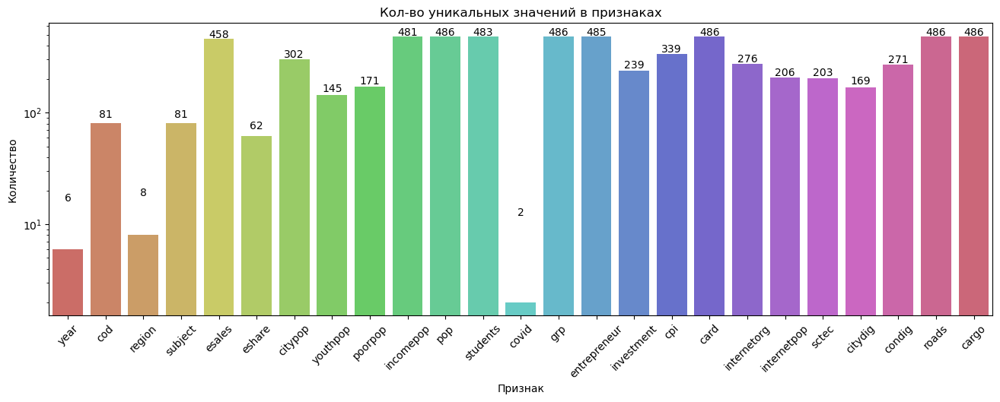

In [21]:
#Изучение уникальных значений в признаках
plt.figure(figsize=(16, 5))

cols = ecom.columns
uniques = [len(ecom[col].unique()) for col in cols]

ax = sns.barplot(x=cols, y=uniques, palette='hls', log=True)
ax.set(xlabel='Признак', ylabel='Количество', title='Кол-во уникальных значений в признаках')


for p, uniq in zip(ax.patches, uniques):
    ax.text(p.get_x() + p.get_width()/2.,
            uniq + 10,
            uniq,
            ha="center")

ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

**Распределение целевой переменной**

Text(0.5, 1.0, 'Гистограмма распределения esales')

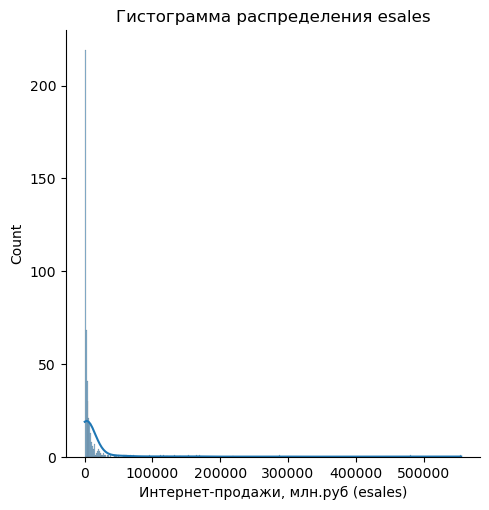

In [22]:
plt.rcParams['figure.dpi'] = 100
sns.displot(data=ecom, x='esales', kde=True)
plt.xlabel('Интернет-продажи, млн.руб (esales)')
plt.title('Гистограмма распределения esales')

Text(0.5, 1.0, 'Гистограмма распределения esales (нормализированные данные)')

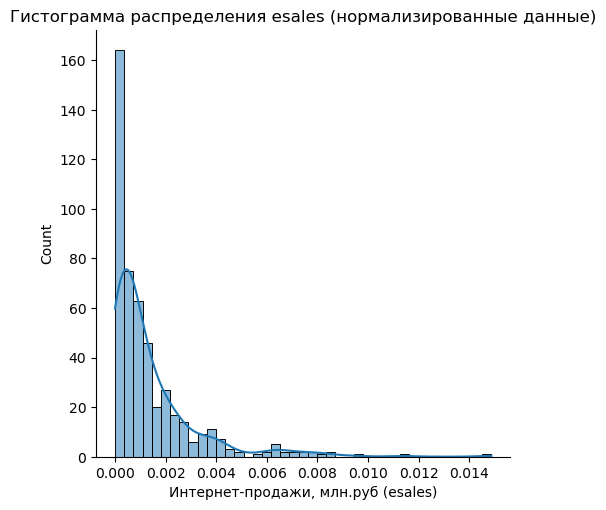

In [23]:
plt.rcParams['figure.dpi'] = 100
sns.displot(data=norm_ecom, x='esales', kde=True)
plt.xlabel('Интернет-продажи, млн.руб (esales)')
plt.title('Гистограмма распределения esales (нормализированные данные)')

Text(0.5, 1.0, 'Гистограмма распределения esales с разделением по covid')

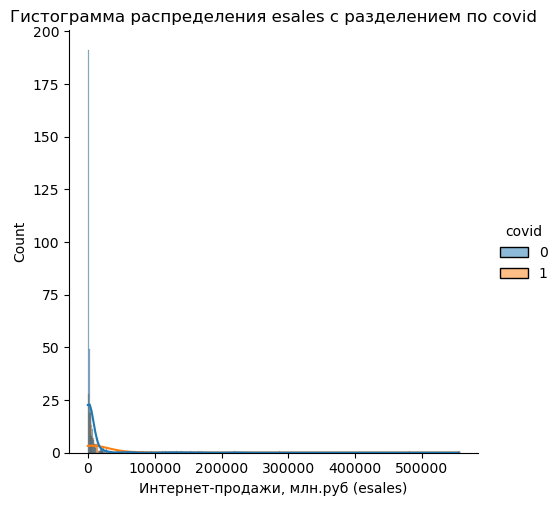

In [24]:
plt.rcParams['figure.dpi'] = 100
sns.displot(data=ecom, x='esales', kde=True, hue="covid")
plt.xlabel('Интернет-продажи, млн.руб (esales)')
plt.title('Гистограмма распределения esales с разделением по covid')

Text(0.5, 1.0, 'Гистограмма распределения esales с разделением по covid')

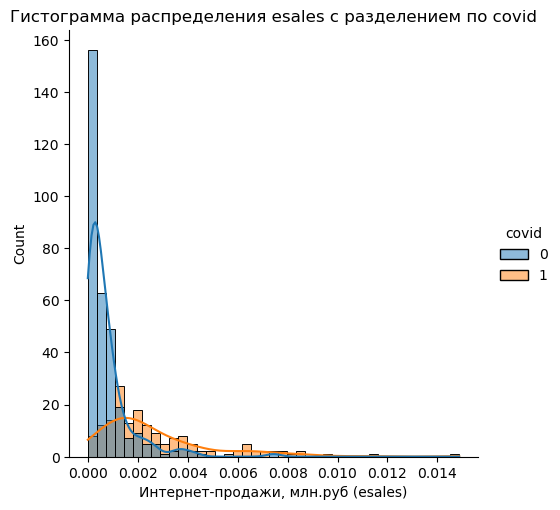

In [25]:
plt.rcParams['figure.dpi'] = 100
sns.displot(data=norm_ecom, x='esales', kde=True, hue="covid")
plt.xlabel('Интернет-продажи, млн.руб (esales)')
plt.title('Гистограмма распределения esales с разделением по covid')

Text(0.5, 1.0, 'Гистограмма распределения esales с разделением по covid за 2016-2020 гг.')

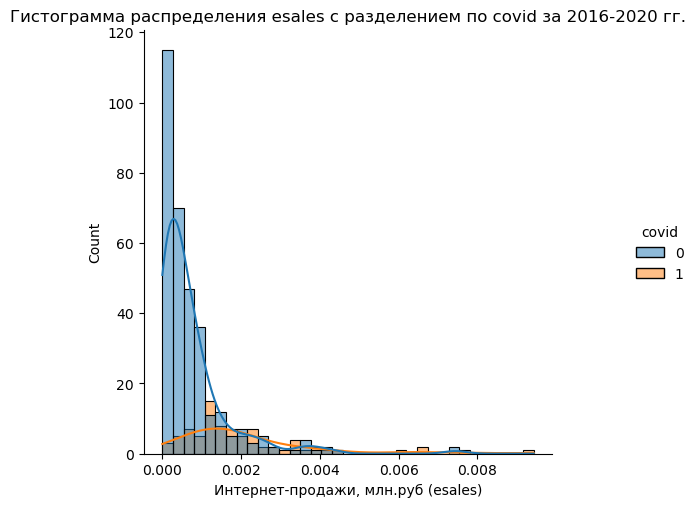

In [26]:
plt.rcParams['figure.dpi'] = 100
sns.displot(data=norm_ecom_train, x='esales', kde=True, hue="covid")
plt.xlabel('Интернет-продажи, млн.руб (esales)')
plt.title('Гистограмма распределения esales с разделением по covid за 2016-2020 гг.')

Text(0.5, 1.0, 'Гистограмма распределения esales с разделением по covid за 2021 год')

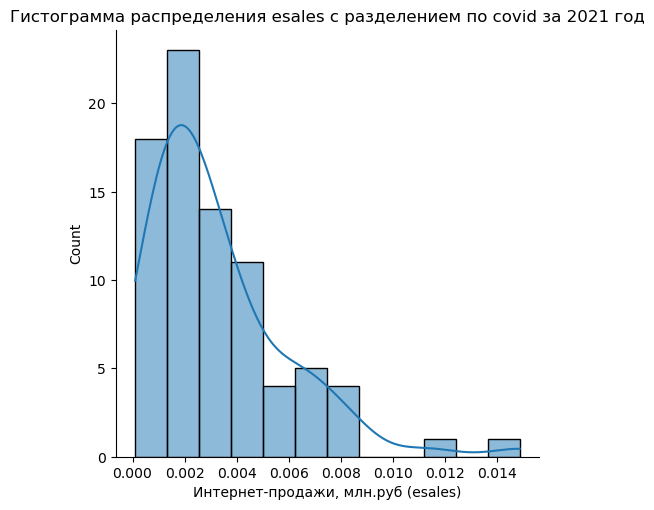

In [27]:
plt.rcParams['figure.dpi'] = 100
sns.displot(data=norm_ecom_test, x='esales', kde=True)
plt.xlabel('Интернет-продажи, млн.руб (esales)')
plt.title('Гистограмма распределения esales с разделением по covid за 2021 год')

Text(0.5, 1.0, 'Ящик с усами для esales')

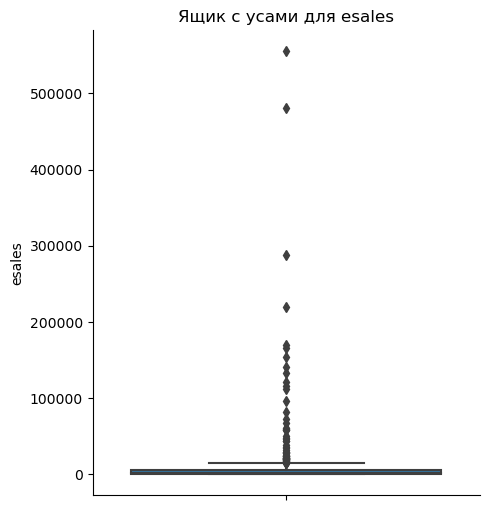

In [28]:
sns.catplot(
    data=ecom, y="esales",
    kind="box"
)
plt.title('Ящик с усами для esales')

Text(0.5, 1.0, 'Ящик с усами для esales')

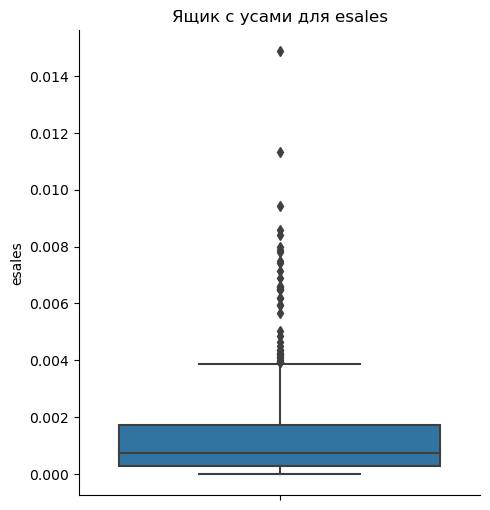

In [29]:
sns.catplot(
    data=norm_ecom, y="esales",
    kind="box"
)
plt.title('Ящик с усами для esales')

Text(0.5, 1.0, 'Ящик с усами для esales с разделением по covid')

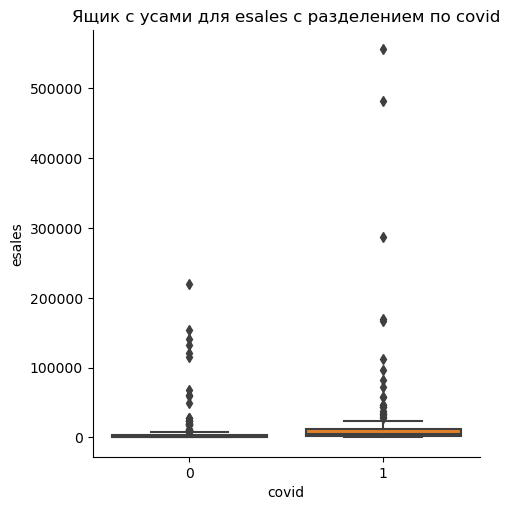

In [30]:
sns.catplot(
    data=ecom, y="esales",
    kind="box",
     x = 'covid'
)
plt.title('Ящик с усами для esales с разделением по covid')

Text(0.5, 1.0, 'Ящик с усами для esales с разделением по covid (нормализированные данные)')

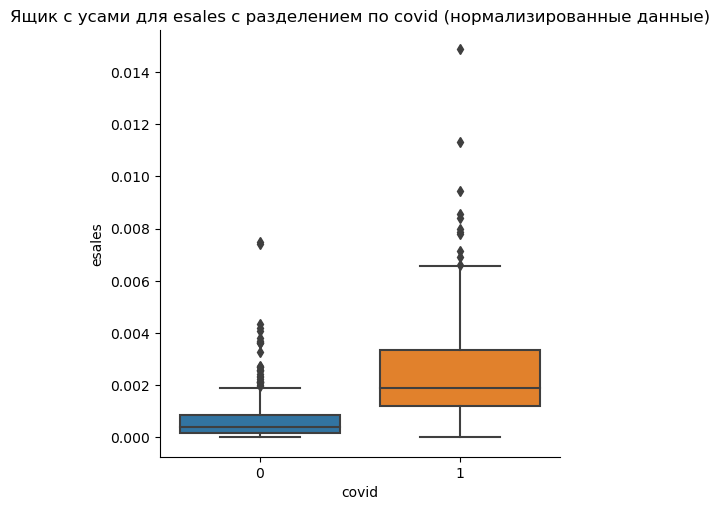

In [31]:
sns.catplot(
    data=norm_ecom, y="esales",
    kind="box",
     x = 'covid'
)
plt.title('Ящик с усами для esales с разделением по covid (нормализированные данные)')

Text(0.5, 1.0, 'Ящик с усами для esales c 2016-2020 гг.')

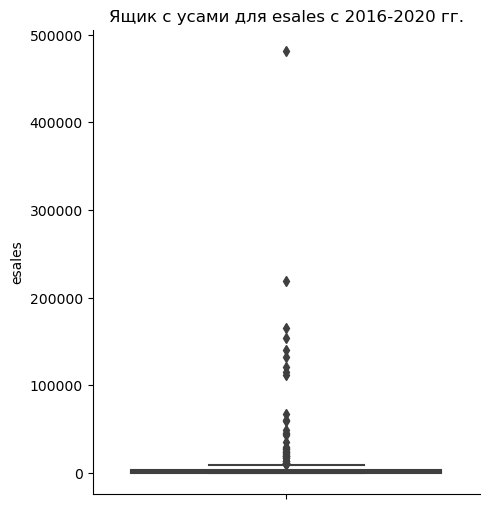

In [32]:
sns.catplot(
    data=ecom_train, y="esales",
    kind="box"
)
plt.title('Ящик с усами для esales c 2016-2020 гг.')

Text(0.5, 1.0, 'Ящик с усами для esales c 2016-2020 гг.')

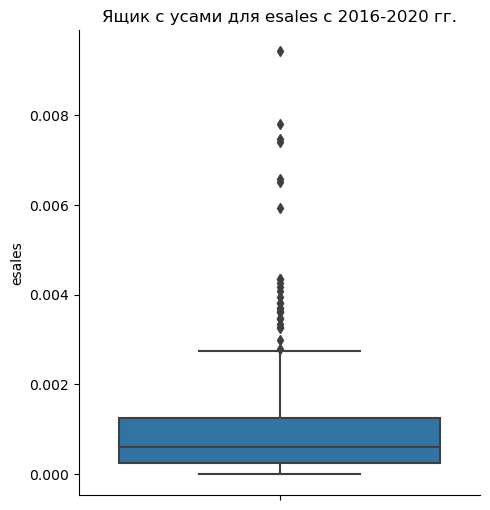

In [33]:
sns.catplot(
    data=norm_ecom_train, y="esales",
    kind="box"
)
plt.title('Ящик с усами для esales c 2016-2020 гг.')

Text(0.5, 1.0, 'Ящик с усами для esales 2021 г.')

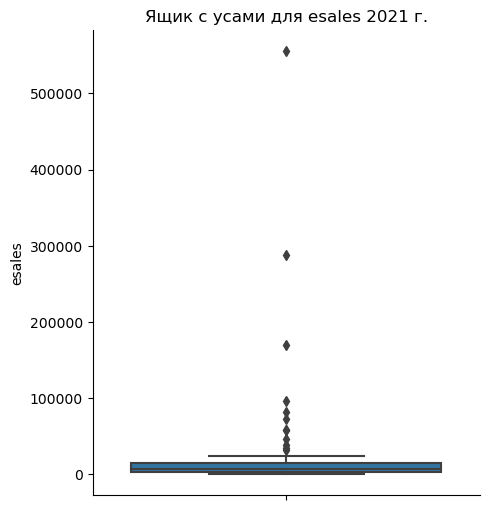

In [34]:
sns.catplot(
    data=ecom_test, y="esales",
    kind="box"
)
plt.title('Ящик с усами для esales 2021 г.')

Text(0.5, 1.0, 'Ящик с усами для esales 2021 г.')

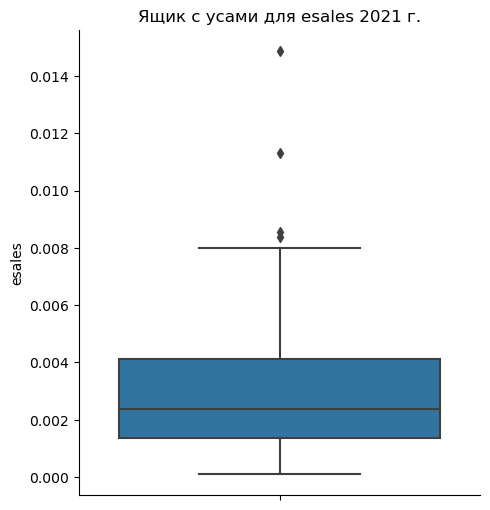

In [35]:
sns.catplot(
    data=norm_ecom_test, y="esales",
    kind="box"
)
plt.title('Ящик с усами для esales 2021 г.')

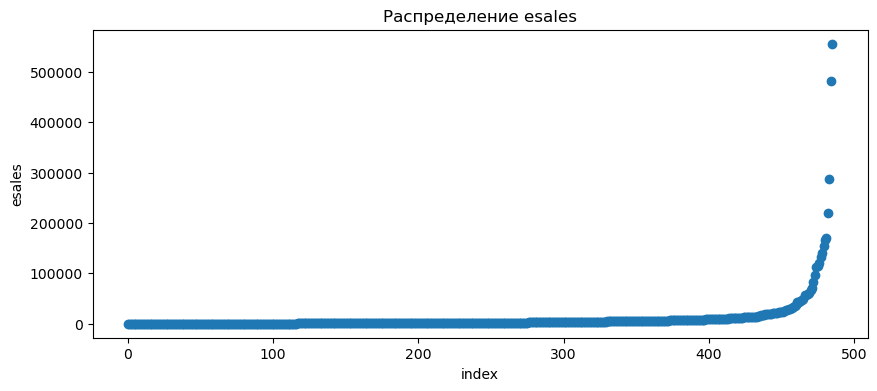

In [36]:
plt.figure(figsize = (10, 4))
plt.scatter(range(ecom.shape[0]), np.sort(ecom['esales'].values))
plt.xlabel('index')
plt.ylabel('esales')
plt.title("Распределение esales")
plt.show()

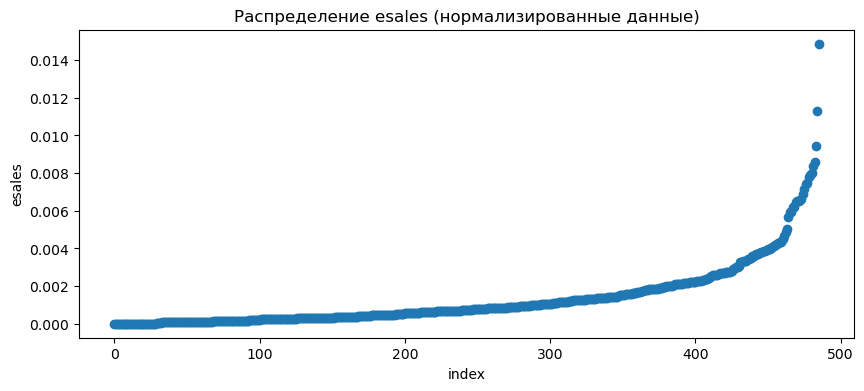

In [37]:
plt.figure(figsize = (10, 4))
plt.scatter(range(norm_ecom.shape[0]), np.sort(norm_ecom['esales'].values))
plt.xlabel('index')
plt.ylabel('esales')
plt.title("Распределение esales (нормализированные данные)")
plt.show()

Text(0.5, 1.0, 'Динамика по esales, млн.руб.')

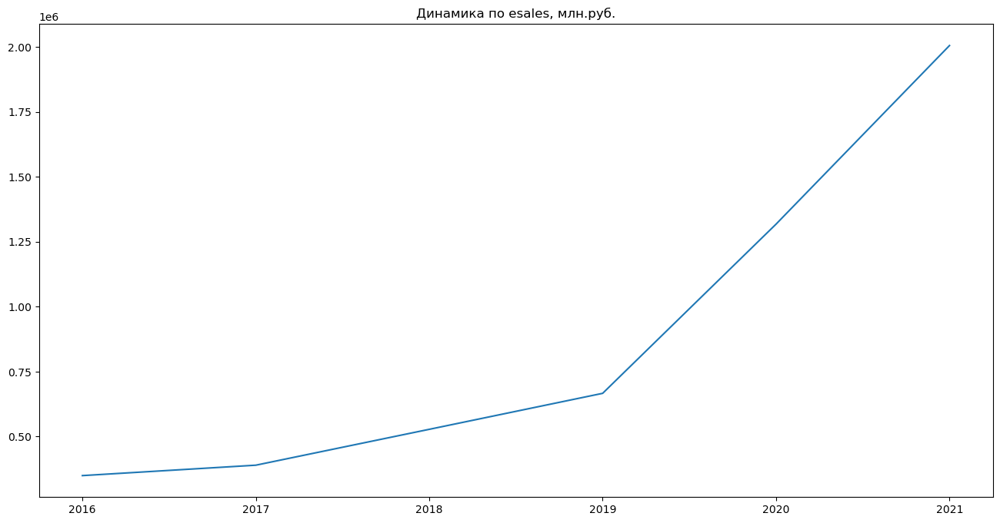

In [38]:
#Общая динамика по продажам по РФ
dataecom = ecom.groupby(['year']).sum()['esales']
plt.figure(figsize=(16,8))
plt.plot(dataecom.index,dataecom.values)
plt.title("Динамика по esales, млн.руб.")

**Распределение по регионам и субъектам**

In [39]:
#Сумма продаж по регионам по годам
ecom.groupby(['region', 'year']).sum()['esales']

region                               year
Дальневосточный федеральный округ    2016      7361.28
                                     2017      8632.41
                                     2018      6400.61
                                     2019      8382.24
                                     2020     27933.62
                                     2021     34735.84
Приволжский федеральный округ        2016     32581.68
                                     2017     36291.32
                                     2018     44299.55
                                     2019     62429.99
                                     2020    141750.03
                                     2021    234142.59
Северо-Западный федеральный округ    2016     26614.94
                                     2017     34331.48
                                     2018     76237.44
                                     2019     87882.34
                                     2020    150048.95
                       

In [40]:
#Число субъектов в регионах
ecom.groupby(['region', 'year']).count()['subject']

region                               year
Дальневосточный федеральный округ    2016    10
                                     2017    10
                                     2018    10
                                     2019    10
                                     2020    10
                                     2021    10
Приволжский федеральный округ        2016    14
                                     2017    14
                                     2018    14
                                     2019    14
                                     2020    14
                                     2021    14
Северо-Западный федеральный округ    2016    10
                                     2017    10
                                     2018    10
                                     2019    10
                                     2020    10
                                     2021    10
Северо-Кавказский федеральный округ  2016     7
                                     2017     

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'Дальневосточный федеральный округ'),
  Text(1, 0, 'Приволжский федеральный округ'),
  Text(2, 0, 'Северо-Западный федеральный округ'),
  Text(3, 0, 'Северо-Кавказский федеральный округ'),
  Text(4, 0, 'Сибирский федеральный округ'),
  Text(5, 0, 'Уральский федеральный округ'),
  Text(6, 0, 'Центральный федеральный округ'),
  Text(7, 0, 'Южный федеральный округ')])

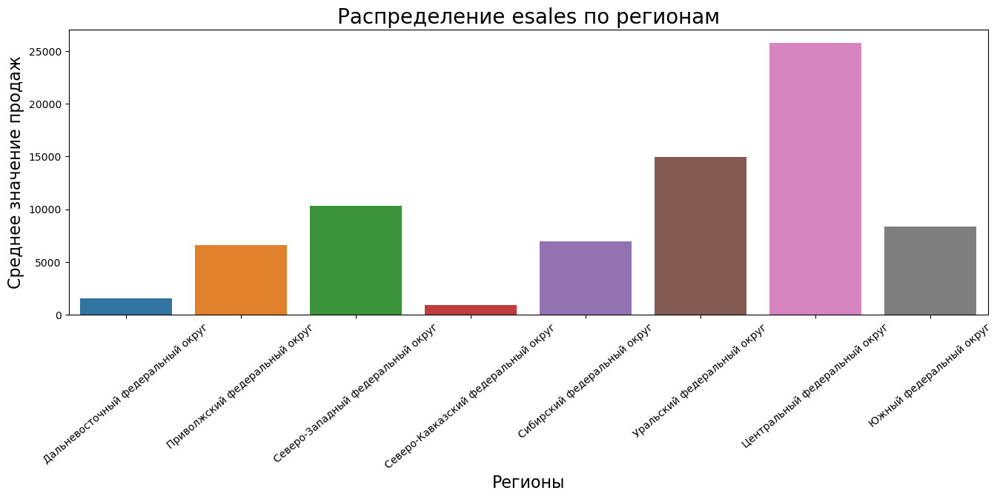

In [41]:
#Распределение продаж по регионам (среднее значение за 6 лет)
data = ecom.groupby(['region']).mean()['esales']

plt.figure(figsize=(16,5))

ax = sns.barplot(x=data.index, y=data.values)
ax.set_xlabel('Регионы', fontsize=16)
ax.set_ylabel('Среднее значение продаж', fontsize=16)
ax.set_title('Распределение esales по регионам', fontsize=20)
plt.xticks(rotation=40)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'Дальневосточный федеральный округ'),
  Text(1, 0, 'Приволжский федеральный округ'),
  Text(2, 0, 'Северо-Западный федеральный округ'),
  Text(3, 0, 'Северо-Кавказский федеральный округ'),
  Text(4, 0, 'Сибирский федеральный округ'),
  Text(5, 0, 'Уральский федеральный округ'),
  Text(6, 0, 'Центральный федеральный округ'),
  Text(7, 0, 'Южный федеральный округ')])

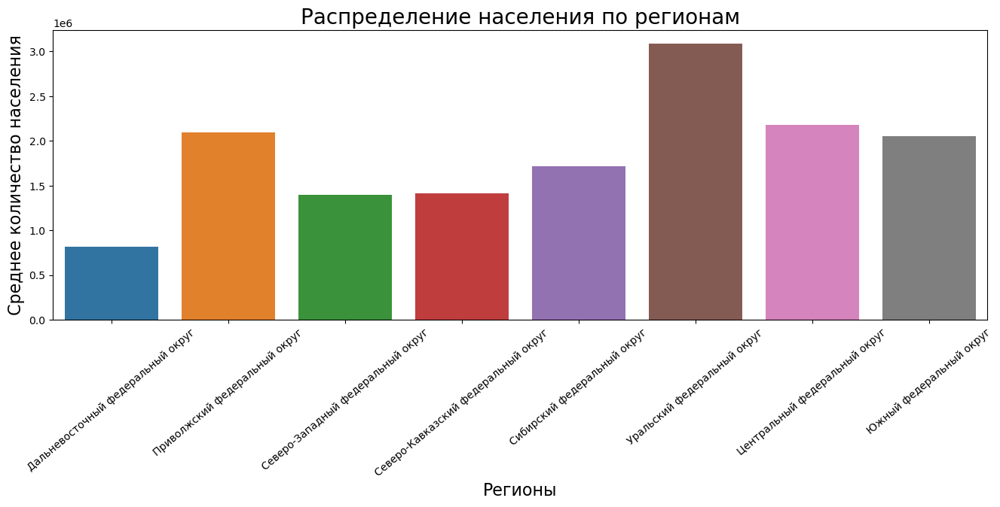

In [42]:
pop1 = ecom.groupby(['region']).mean()['pop']

plt.figure(figsize=(16,5))

ax = sns.barplot(x=pop1.index, y=pop1.values)
ax.set_xlabel('Регионы', fontsize=16)
ax.set_ylabel('Среднее количество населения', fontsize=16)
ax.set_title('Распределение населения по регионам', fontsize=20)
plt.xticks(rotation=40)

[Text(0, 0, 'Сибирский федеральный округ'),
 Text(1, 0, 'Южный федеральный округ'),
 Text(2, 0, 'Дальневосточный федеральный округ'),
 Text(3, 0, 'Северо-Кавказский федеральный округ'),
 Text(4, 0, 'Северо-Западный федеральный округ'),
 Text(5, 0, 'Центральный федеральный округ'),
 Text(6, 0, 'Приволжский федеральный округ'),
 Text(7, 0, 'Уральский федеральный округ')]

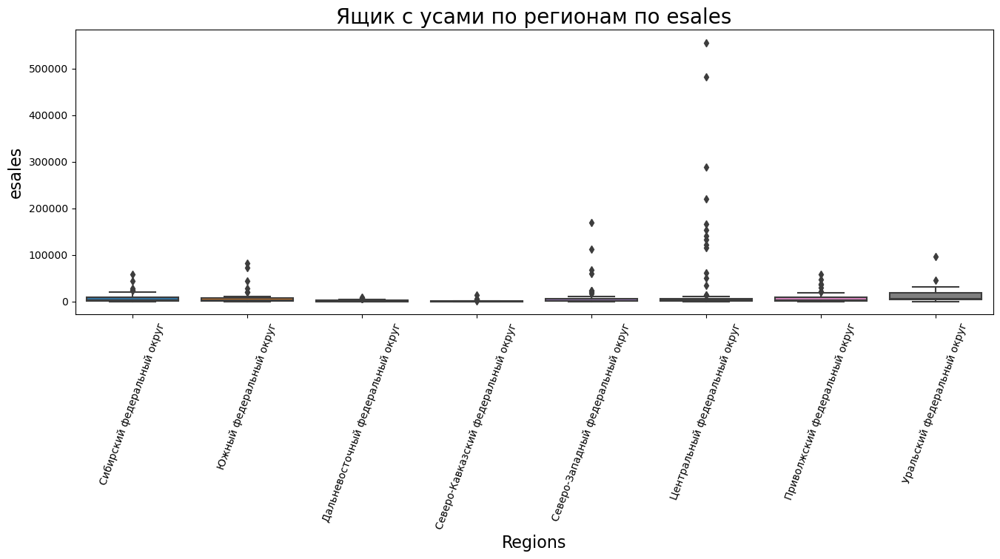

In [43]:
plt.figure(figsize=(16,5))
g1 = sns.boxplot(x='region', y='esales',data=ecom)
g1.set_xlabel('Regions', fontsize=16)
g1.set_ylabel('esales', fontsize=16)
g1.set_title('Ящик с усами по регионам по esales', fontsize=20)
g1.set_xticklabels(g1.get_xticklabels(), rotation=70)

[Text(0, 0, 'Сибирский федеральный округ'),
 Text(1, 0, 'Южный федеральный округ'),
 Text(2, 0, 'Дальневосточный федеральный округ'),
 Text(3, 0, 'Северо-Кавказский федеральный округ'),
 Text(4, 0, 'Северо-Западный федеральный округ'),
 Text(5, 0, 'Центральный федеральный округ'),
 Text(6, 0, 'Приволжский федеральный округ'),
 Text(7, 0, 'Уральский федеральный округ')]

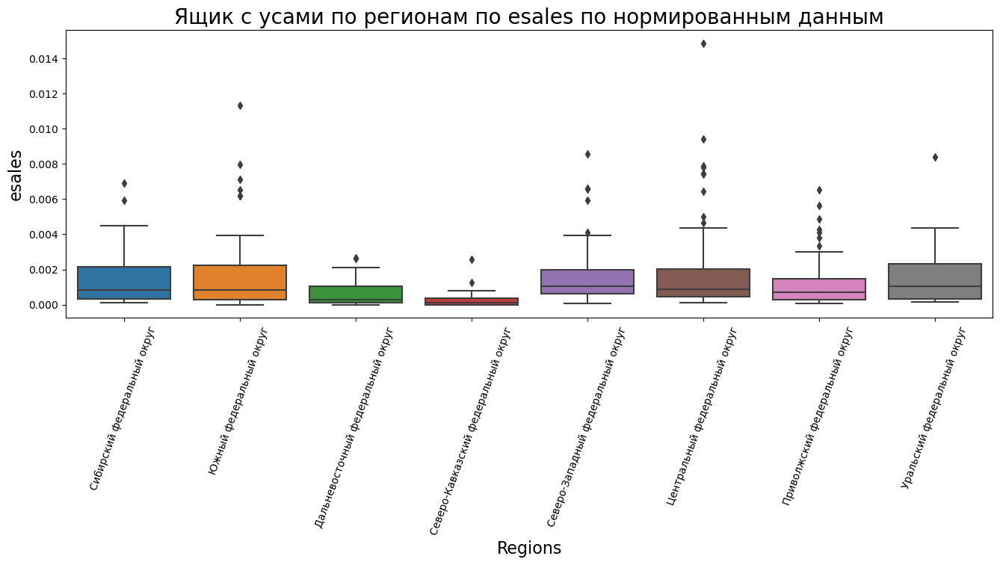

In [45]:
plt.figure(figsize=(16,5))
g2 = sns.boxplot(x='region', y='esales',data=norm_ecom)
g2.set_xlabel('Regions', fontsize=16)
g2.set_ylabel('esales', fontsize=16)
g2.set_title('Ящик с усами по регионам по esales по нормированным данным', fontsize=20)
g2.set_xticklabels(g2.get_xticklabels(), rotation=70)

[Text(0, 0, 'Сибирский федеральный округ'),
 Text(1, 0, 'Южный федеральный округ'),
 Text(2, 0, 'Дальневосточный федеральный округ'),
 Text(3, 0, 'Северо-Кавказский федеральный округ'),
 Text(4, 0, 'Северо-Западный федеральный округ'),
 Text(5, 0, 'Центральный федеральный округ'),
 Text(6, 0, 'Приволжский федеральный округ'),
 Text(7, 0, 'Уральский федеральный округ')]

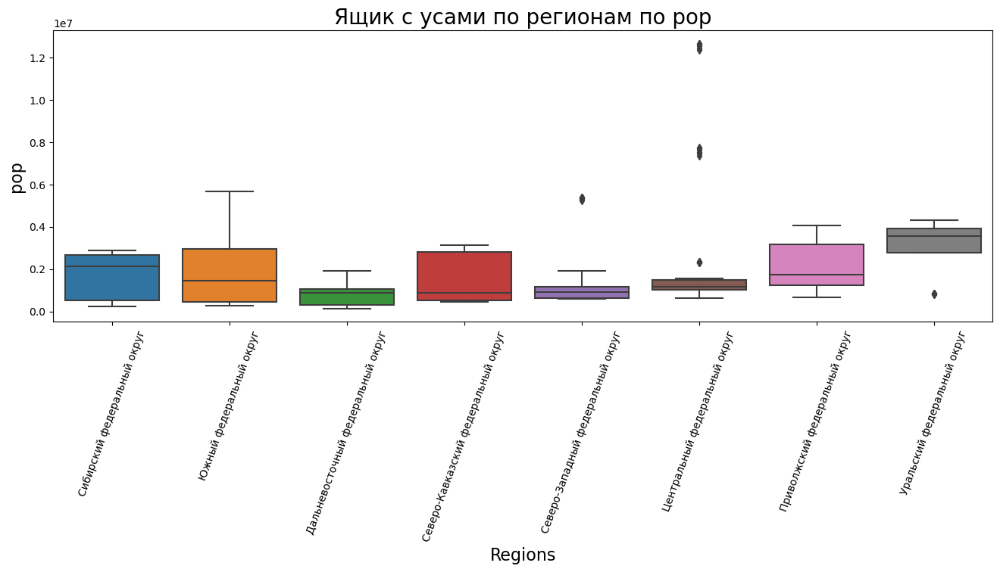

In [46]:
plt.figure(figsize=(16,5))
g3 = sns.boxplot(x='region', y='pop',data=ecom)
g3.set_xlabel('Regions', fontsize=16)
g3.set_ylabel('pop', fontsize=16)
g3.set_title('Ящик с усами по регионам по pop', fontsize=20)
g3.set_xticklabels(g3.get_xticklabels(), rotation=70)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'г. Москва'),
  Text(1, 0, 'Московская область'),
  Text(2, 0, 'г. Санкт-Петербург'),
  Text(3, 0, 'Свердловская область'),
  Text(4, 0, 'Новосибирская область')])

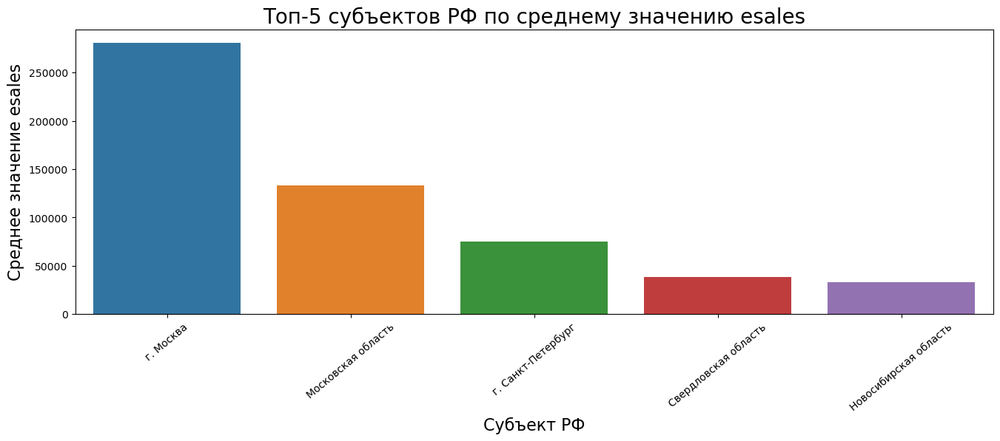

In [47]:
#Распределение продаж по субъектам (среднее значение за 6 лет)
data3 = ecom.groupby(['subject']).mean()['esales']
data3=data3.sort_values(ascending = False).iloc[:5]

plt.figure(figsize=(16,5))

ax = sns.barplot(x=data3.index, y=data3.values)
ax.set_xlabel('Субъект РФ', fontsize=16)
ax.set_ylabel('Среднее значение esales', fontsize=16)
ax.set_title('Топ-5 субъектов РФ по среднему значению esales', fontsize=20)
plt.xticks(rotation=40)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'г. Москва'),
  Text(1, 0, 'Московская область'),
  Text(2, 0, 'Краснодарский край'),
  Text(3, 0, 'г. Санкт-Петербург'),
  Text(4, 0, 'Свердловская область')])

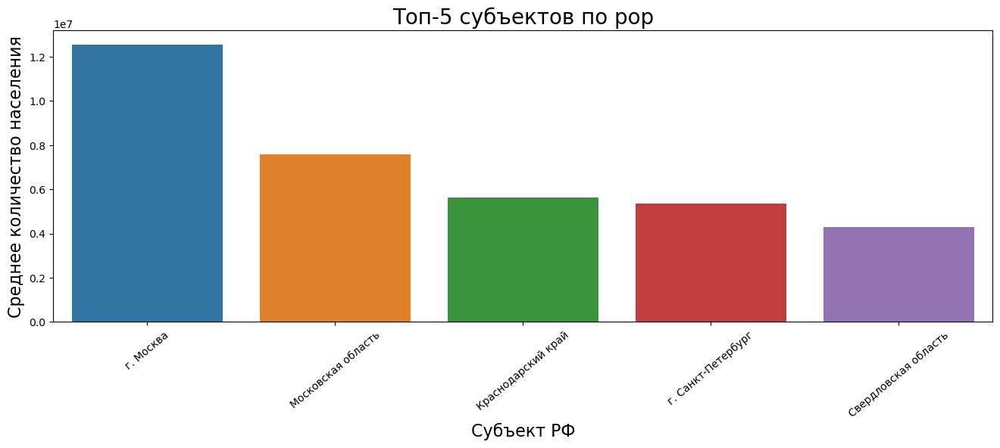

In [48]:
pop2 = ecom.groupby(['subject']).mean()['pop']
pop2=pop2.sort_values(ascending = False).iloc[:5]

plt.figure(figsize=(16,5))

ax = sns.barplot(x=pop2.index, y=pop2.values)
ax.set_xlabel('Субъект РФ', fontsize=16)
ax.set_ylabel('Среднее количество населения', fontsize=16)
ax.set_title('Топ-5 субъектов по pop', fontsize=20)
plt.xticks(rotation=40)

**Анализ стационарности, тренда, автокорреляции временного ряда по esales**

In [49]:
# KPSS test
result_kpss = kpss(ecom.groupby(['year']).sum()['esales'], regression='c')

test_statistic = result_kpss[0]
p_value = result_kpss[1]

print('KPSS test statistic:', test_statistic)
print('p-value:', p_value)

if p_value < 0.05:
    print('Отвергаем нулевую гипотезу: временной ряд не стационарен.')
else:
    print('Не удалось отвергнуть нулевую гипотезу: временной ряд стационарен.')

KPSS test statistic: 0.3764910000366052
p-value: 0.08728836205318742
Не удалось отвергнуть нулевую гипотезу: временной ряд стационарен.


In [50]:
# ADF test
result_adf = adfuller(ecom.groupby(['year']).sum()['esales'])

print('ADF Statistic: %f' % result_adf[0])
print('p-value: %f' % result_adf[1])

ADF Statistic: 10.313385
p-value: 1.000000


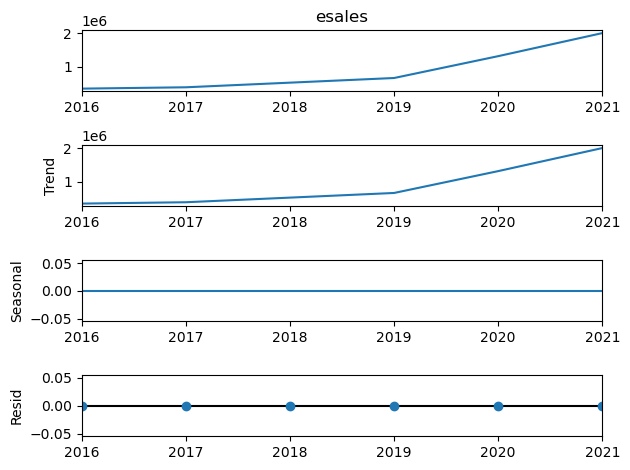

In [51]:
# Разбиение на сезонные компоненты
decomposition = sm.tsa.seasonal_decompose(ecom.groupby(['year']).sum()['esales'], model='additive', period=1)


trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid
decomposition.plot()
plt.show()

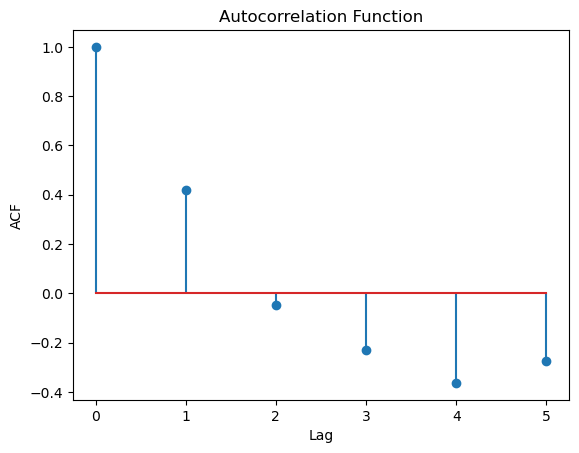

In [52]:
# Расчет автокорреляционной функции
acf_1 = sm.tsa.stattools.acf(ecom.groupby(['year']).sum()['esales'].values, nlags=10)

plt.stem(acf_1)
plt.xlabel('Lag')
plt.ylabel('ACF')
plt.title('Autocorrelation Function')

plt.show()

**Корреляционные матрицы**
* 0.3-0.5 слабая связь
* 0.5-0.8 средняя связь
* 0.8-1 сильная связь

In [53]:
def matrix_corr(data):
  plt.figure(figsize =(15,10))
  sns.set(font_scale=1.4)
  corr_matrix = data.corr()
  corr_matrix = round(corr_matrix,2)
  corr_matrix[np.abs(corr_matrix) <= 0.5] = 0

  sns.heatmap(corr_matrix, annot = True, linewidths =.5, cmap ='coolwarm')

  plt.title('Матрица корреляции по Спирмену')
  plt.show()

In [54]:
def phik_corr(data):
  plt.figure(figsize =(15,10))
  sns.set(font_scale=1.4)
  corr_matrix = data.phik_matrix()
  corr_matrix = round(corr_matrix,2)
  corr_matrix[np.abs(corr_matrix) <= 0.5] = 0

  sns.heatmap(corr_matrix, annot = True, linewidths =.5, cmap ='coolwarm')

  plt.title('Матрица корреляции по Пирсону')
  plt.show()

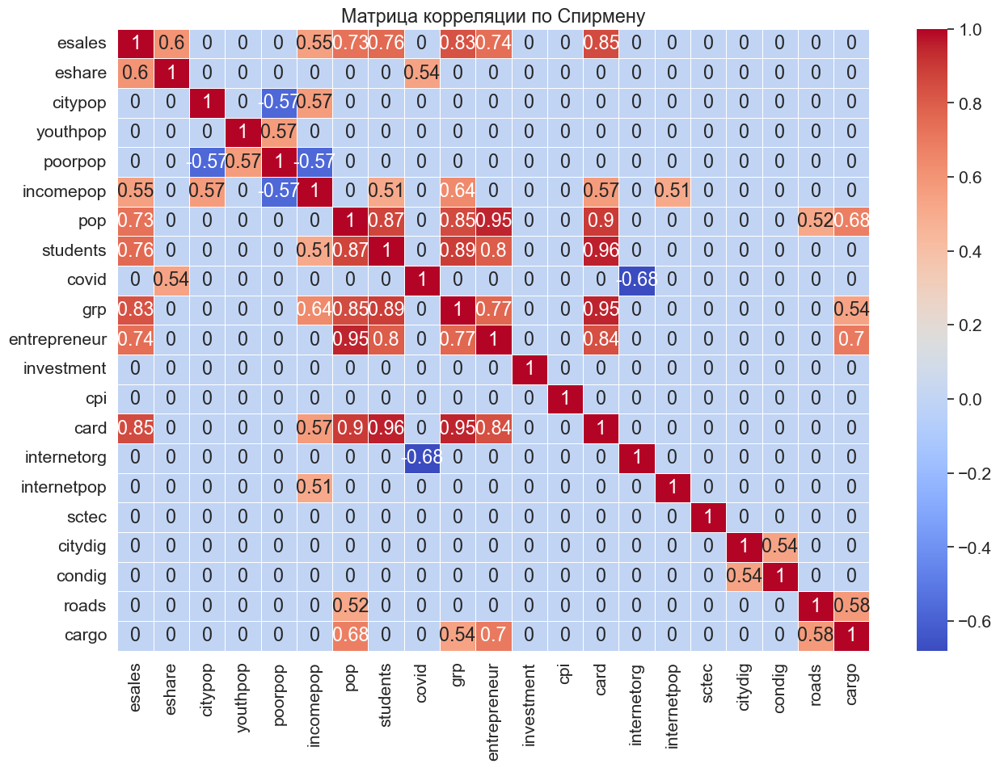

In [55]:
#только значимые значения, которые более 0.5
matrix_corr(ecom.drop(['year','cod'], axis =1))

interval columns not set, guessing: ['esales', 'eshare', 'citypop', 'youthpop', 'poorpop', 'incomepop', 'pop', 'students', 'covid', 'grp', 'entrepreneur', 'investment', 'cpi', 'card', 'internetorg', 'internetpop', 'sctec', 'citydig', 'condig', 'roads', 'cargo']


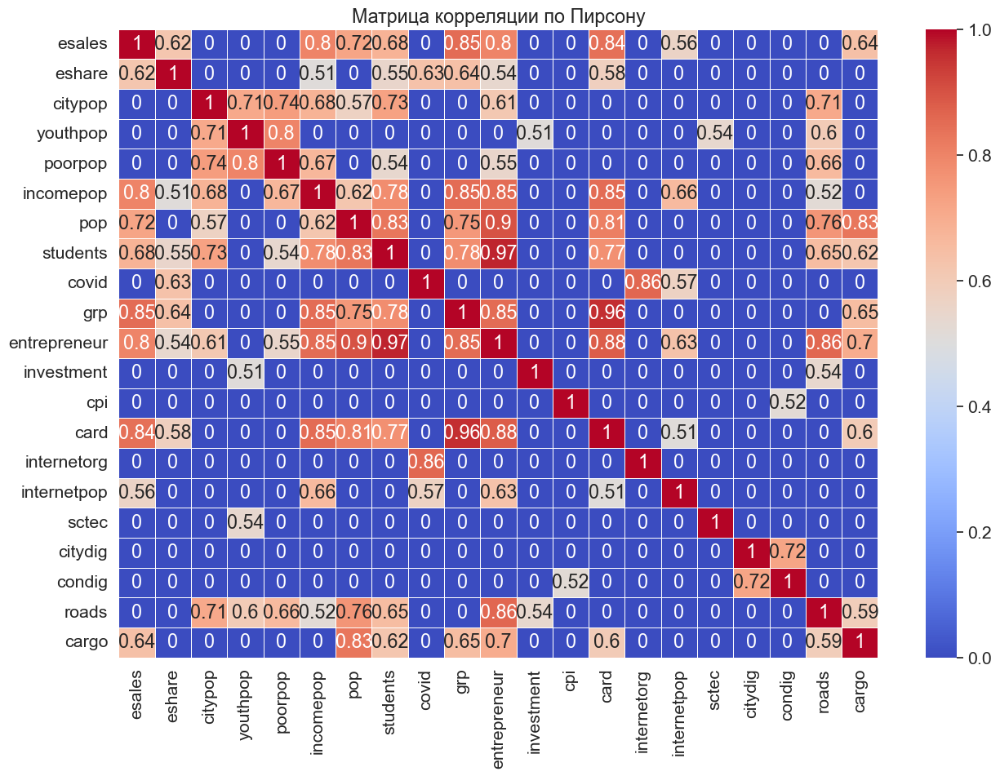

In [56]:
phik_corr(ecom.drop(['year','cod','region','subject'], axis =1))

# Обучение моделей и оценка

In [57]:
#Формируем x и y для тестовой и тренировочной выборок (без eshare)
X = ecom.drop(['esales','year','region','subject','cod','eshare', 'pop'], axis=1)
y = ecom.esales

X_train = ecom_train.drop(['esales','year','region','subject','cod','eshare','pop'], axis=1)
y_train = ecom_train.esales

X_test = ecom_test.drop(['esales','year','region','subject','cod','eshare','pop'], axis=1)
y_test = ecom_test.esales

X_train_norm = norm_ecom_train.drop(['esales','year','region','subject','cod','eshare','pop'], axis=1)
y_train_norm = norm_ecom_train.esales

X_test_norm = norm_ecom_test.drop(['esales','year','region','subject','cod','eshare','pop'], axis=1)
y_test_norm = norm_ecom_test.esales

In [58]:
#Категориальные переменные (назначаем)
categorical = ['covid']

In [59]:
def column_index(df, query_cols):
    cols = df.columns.values
    sidx = np.argsort(cols)
    return sidx[np.searchsorted(cols, query_cols, sorter=sidx)]

In [60]:
categorical_features_indices = column_index(X, categorical)

In [61]:
#Датасет данных для CatBoost (если все медленно будет работать)
pool_train = Pool(X_train, y_train, cat_features=categorical_features_indices, feature_names=list(X.columns))
pool_test = Pool(X_test, y_test, cat_features=categorical_features_indices, feature_names=list(X.columns))

Ниже описаны гиперпараметры (англ. hyperparameters), на которые стоит обратить внимание при использовании библиотеки.

-cat_features; Overfitting detector; Число итераций и learning rate; L2_reg; Random_srength; Bagging_temp; Глубина дерева (стоит попробовать 10 и 6).

* **-loss_function** - показатель, используемый для обучения. Есть регрессионные показатели, такие как среднеквадратичная ошибка для регрессии и logloss для классификации
* **-eval_metric** - метрика, используемая для обнаружения переобучения
* **-Iterations** – максимальное количество построенных деревьев, по умолчанию 1000. Альтернативные названия num_boost_round, n_estimators и num_trees
* **-learning_rate** - скорость обучения, которая определяет насколько быстро или медленно модель будет учиться. Значение по умолчанию обычно равно 0.03.
* **-random_seed** или random_state– случайное зерно, используемое для обучения
* **-l2_leaf_reg** или reg_lambda – коэффициент при члене регуляризации L2 функции потерь. Значение по умолчанию – 3.0.
* **-bootstrap_type** – определяет метод сэмплинга весов объектов, например это может быть Байес, Бернулли, многомерная случайная величина или Пуассон.
* **-depth** = глубина дерева.
* **-grow_policy** – определяет, как будет применяться жадный алгоритм поиска. Может стоять в значении SymmetricTree, Depthwise или Lossguide. По умолчанию SymmetricTree. В SymmetricTree дерево строится уровень за уровнем, пока не достигнет необходимой глубины. На каждом шаге листья с предыдущего дерева разделяются с тем же условием. При выборе параметра -Depthwise дерево строится шаг за шагом, пока не достигнет необходимой глубины. Листья разделяются с использованием условия, которое приводит к лучшему уменьшению потерь. В Lossguide дерево строится по листьям до тех пор, пока не будет достигнуто заданное количество листьев. На каждом шаге разделяется нетерминальный лист с лучшим уменьшением потерь.
* **-min_data_in_leaf** или min_child_samples – это минимальное количество обучающих сэмплов в листе. Этот параметр используется только с политиками роста Lossguide и Depthwise.
* **-max_leaves** или num_leaves – этот параметр используется только с политикой Lossguide и определяет количество листьев в дереве.
* **-ignored_features** — указывает на признаки, которые нужно игнорировать в процессе обучения.
* **-nan_mode** – метод работы с пропущенными значениями. Параметры Forbidden, Min и Max. При использовании Forbidden наличие пропущенных значений вызовет ошибку. При использовании параметра Min пропущенные значения будут приняты за максимальные значения для данного признака. В Max пропущенные значения будут приняты как минимальные значения для данного признака
* **-leaf_estimation_backtracking**– тип бэктрекинга, использующийся при градиентном спуске. По умолчанию используется AnyImprovement. AnyImprovement уменьшает шаг спуска до того, как значение функции потерь будет меньшим, чем оно было на последней итерации. Armijo уменьшает шаг спуска до тех пор, пока не будет выполнено условие Вольфе.
* **-boosting_type** — схема бустинга. Она может быть простой для классической схемы градиентного бустинга или упорядоченной, что обеспечит лучшее качество на небольших наборах данных.
score_function – тип оценки, используемой для выбора следующего разбиения при построении дерева. Cosine используется по умолчанию. Другие доступные варианты L2, NewtonL2 и NewtonCosine.
* **-early_stopping_rounds**— если стоит True, устанавливает тип детектора переобучения в Iter и останавливает обучение, когда достигается оптимальное значение.
* **-task_type** – используете вы CPU или GPU. По умолчанию стоит CPU.
* **-devices** — идентификаторы устройств GPU, которые будут использоваться для обучения.
* **-cat_features** — массив с категориальными столбцами.
* **-text_features** —используется для объявления текстовых столбцов в задачах классификации.
* **-verbose** - True/False, показывать процесс обучения или нет

**Пробная модель №1**

In [62]:
model0=CatBoostRegressor(iterations=500, depth=3, learning_rate=0.1,loss_function='RMSE', early_stopping_rounds=20)
model0.fit(X_train, y_train, cat_features=categorical_features_indices, eval_set=(X_test, y_test), verbose=False, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [63]:
print(f'Модель обучена? {model0.is_fitted()}')
print(f'Номер лучшей итерации {model0.get_best_iteration()}')
print(f'Лучшие значения: {model0.get_best_score()}')

Модель обучена? True
Номер лучшей итерации 195
Лучшие значения: {'learn': {'RMSE': 1686.210161506592}, 'validation': {'RMSE': 24657.490017176053}}


In [64]:
y_pred_train0 = model0.predict(X_train)
y_pred_test0 = model0.predict(X_test)
print("TRAIN SMAPE:", smape(y_train, y_pred_train0))
print("MAE train:",mean_absolute_error(y_train, y_pred_train0))
print("RMSE train:",mean_squared_error(y_train, y_pred_train0))
print("MAPE train:",mean_absolute_percentage_error(y_train, y_pred_train0))
print("R2 Score train:",r2_score(y_train, y_pred_train0))

TRAIN SMAPE: 70.28879595098977
MAE train: 1179.4213520907829
RMSE train: 3354507.506397651
MAPE train: 2.726908073125167e+17
R2 Score train: 0.9967446584319636


In [65]:
print("TEST SMAPE:", smape(y_test, y_pred_test0))
print("MAE test:",mean_absolute_error(y_test, y_pred_test0))
print("RMSE test:",mean_squared_error(y_test, y_pred_test0))
print("MAPE test:",mean_absolute_percentage_error(y_test, y_pred_test0))
print("R2 Score test:",r2_score(y_test, y_pred_test0))

TEST SMAPE: 86.05800131117196
MAE test: 11633.227315983026
RMSE test: 607991750.8043282
MAPE test: 2.1668482683884105
R2 Score test: 0.879725326608884


In [66]:
#CV через библиотеку Sklearn
cv_score0 = cross_val_score (model0, X_train, y_train,scoring = 'neg_root_mean_squared_error', cv=5 )
final_cv_score0 = round(np.mean(-cv_score0)**0.5,3)
print('RMSE модели через кросс-валидацию', final_cv_score0)

0:	learn: 34006.1375779	total: 1.65ms	remaining: 824ms
1:	learn: 33174.1422528	total: 2.97ms	remaining: 739ms
2:	learn: 32269.6651643	total: 4.02ms	remaining: 666ms
3:	learn: 30833.9712011	total: 5.17ms	remaining: 642ms
4:	learn: 29921.1903595	total: 6.31ms	remaining: 625ms
5:	learn: 29049.7205873	total: 7.67ms	remaining: 632ms
6:	learn: 28045.0412311	total: 8.74ms	remaining: 616ms
7:	learn: 26992.9382308	total: 10ms	remaining: 616ms
8:	learn: 26053.2413585	total: 11.1ms	remaining: 607ms
9:	learn: 25582.6446075	total: 12.1ms	remaining: 594ms
10:	learn: 24777.1111957	total: 13.2ms	remaining: 588ms
11:	learn: 24379.0614807	total: 14.3ms	remaining: 580ms
12:	learn: 23519.1665806	total: 15.5ms	remaining: 582ms
13:	learn: 23106.3564031	total: 16.6ms	remaining: 576ms
14:	learn: 22751.9564464	total: 17.7ms	remaining: 571ms
15:	learn: 22391.4808099	total: 18.7ms	remaining: 565ms
16:	learn: 21893.3217088	total: 19.8ms	remaining: 563ms
17:	learn: 21069.3073580	total: 20.8ms	remaining: 558ms
18:	

200:	learn: 1702.8772870	total: 184ms	remaining: 274ms
201:	learn: 1698.4298176	total: 185ms	remaining: 273ms
202:	learn: 1676.4963695	total: 186ms	remaining: 273ms
203:	learn: 1645.9052860	total: 187ms	remaining: 272ms
204:	learn: 1628.6174785	total: 189ms	remaining: 271ms
205:	learn: 1623.8577635	total: 190ms	remaining: 271ms
206:	learn: 1601.3680094	total: 191ms	remaining: 270ms
207:	learn: 1599.4682419	total: 192ms	remaining: 269ms
208:	learn: 1579.9474191	total: 193ms	remaining: 268ms
209:	learn: 1564.8823013	total: 194ms	remaining: 267ms
210:	learn: 1562.7946236	total: 195ms	remaining: 267ms
211:	learn: 1553.1499216	total: 196ms	remaining: 266ms
212:	learn: 1535.7318737	total: 198ms	remaining: 266ms
213:	learn: 1533.2425840	total: 199ms	remaining: 266ms
214:	learn: 1530.9408243	total: 200ms	remaining: 265ms
215:	learn: 1518.2930789	total: 202ms	remaining: 265ms
216:	learn: 1516.5018122	total: 203ms	remaining: 264ms
217:	learn: 1514.8199800	total: 204ms	remaining: 264ms
218:	learn

401:	learn: 693.5539981	total: 366ms	remaining: 89.3ms
402:	learn: 690.8278304	total: 368ms	remaining: 88.5ms
403:	learn: 688.5189777	total: 369ms	remaining: 87.6ms
404:	learn: 687.3189213	total: 370ms	remaining: 86.8ms
405:	learn: 686.7430339	total: 371ms	remaining: 85.9ms
406:	learn: 684.7688218	total: 372ms	remaining: 85ms
407:	learn: 682.3899735	total: 373ms	remaining: 84.1ms
408:	learn: 680.3112514	total: 374ms	remaining: 83.2ms
409:	learn: 677.1240657	total: 375ms	remaining: 82.3ms
410:	learn: 674.2706476	total: 376ms	remaining: 81.4ms
411:	learn: 670.7124420	total: 377ms	remaining: 80.5ms
412:	learn: 670.1497747	total: 378ms	remaining: 79.6ms
413:	learn: 669.5299546	total: 379ms	remaining: 78.8ms
414:	learn: 668.7164428	total: 380ms	remaining: 77.9ms
415:	learn: 667.6897704	total: 381ms	remaining: 77ms
416:	learn: 665.9175572	total: 382ms	remaining: 76.1ms
417:	learn: 663.2553183	total: 383ms	remaining: 75.2ms
418:	learn: 661.0697547	total: 384ms	remaining: 74.3ms
419:	learn: 65

64:	learn: 7552.3545064	total: 57.2ms	remaining: 383ms
65:	learn: 7469.0712893	total: 58.4ms	remaining: 384ms
66:	learn: 7280.5287877	total: 59.6ms	remaining: 385ms
67:	learn: 7197.4854122	total: 60.6ms	remaining: 385ms
68:	learn: 7117.8247453	total: 61.4ms	remaining: 384ms
69:	learn: 7007.0493868	total: 62.2ms	remaining: 382ms
70:	learn: 6810.9880283	total: 63.1ms	remaining: 381ms
71:	learn: 6740.5436814	total: 63.9ms	remaining: 380ms
72:	learn: 6587.6537576	total: 64.7ms	remaining: 379ms
73:	learn: 6503.3886635	total: 65.5ms	remaining: 377ms
74:	learn: 6437.6707252	total: 66.4ms	remaining: 376ms
75:	learn: 6369.9302218	total: 67.2ms	remaining: 375ms
76:	learn: 6291.4936290	total: 68.6ms	remaining: 377ms
77:	learn: 6162.3374764	total: 69.7ms	remaining: 377ms
78:	learn: 6090.7691484	total: 71.1ms	remaining: 379ms
79:	learn: 6035.1202781	total: 72.1ms	remaining: 378ms
80:	learn: 5833.5496681	total: 73.1ms	remaining: 378ms
81:	learn: 5782.3848432	total: 74.1ms	remaining: 378ms
82:	learn:

252:	learn: 1225.7945082	total: 238ms	remaining: 232ms
253:	learn: 1219.7035508	total: 239ms	remaining: 231ms
254:	learn: 1214.7181689	total: 240ms	remaining: 231ms
255:	learn: 1213.8804513	total: 241ms	remaining: 230ms
256:	learn: 1201.6766086	total: 242ms	remaining: 229ms
257:	learn: 1192.2555800	total: 243ms	remaining: 228ms
258:	learn: 1191.4522458	total: 244ms	remaining: 227ms
259:	learn: 1176.9376084	total: 245ms	remaining: 226ms
260:	learn: 1173.8814494	total: 246ms	remaining: 226ms
261:	learn: 1169.9313820	total: 247ms	remaining: 225ms
262:	learn: 1163.2740260	total: 249ms	remaining: 224ms
263:	learn: 1155.8178193	total: 250ms	remaining: 224ms
264:	learn: 1148.8568626	total: 251ms	remaining: 223ms
265:	learn: 1147.9890162	total: 252ms	remaining: 222ms
266:	learn: 1142.8352908	total: 253ms	remaining: 221ms
267:	learn: 1139.4665551	total: 254ms	remaining: 220ms
268:	learn: 1134.1622712	total: 255ms	remaining: 219ms
269:	learn: 1124.1778039	total: 256ms	remaining: 218ms
270:	learn

461:	learn: 592.3977532	total: 419ms	remaining: 34.5ms
462:	learn: 589.1591906	total: 420ms	remaining: 33.6ms
463:	learn: 588.8831348	total: 422ms	remaining: 32.7ms
464:	learn: 587.1114077	total: 423ms	remaining: 31.8ms
465:	learn: 586.2580141	total: 424ms	remaining: 30.9ms
466:	learn: 584.8404167	total: 425ms	remaining: 30ms
467:	learn: 584.2188196	total: 426ms	remaining: 29.1ms
468:	learn: 582.9746333	total: 427ms	remaining: 28.3ms
469:	learn: 581.3062348	total: 429ms	remaining: 27.4ms
470:	learn: 579.5206184	total: 430ms	remaining: 26.5ms
471:	learn: 576.6220028	total: 431ms	remaining: 25.6ms
472:	learn: 575.6854860	total: 433ms	remaining: 24.7ms
473:	learn: 575.4603864	total: 434ms	remaining: 23.8ms
474:	learn: 574.2332827	total: 435ms	remaining: 22.9ms
475:	learn: 571.1218452	total: 436ms	remaining: 22ms
476:	learn: 570.8711284	total: 436ms	remaining: 21ms
477:	learn: 570.1083620	total: 437ms	remaining: 20.1ms
478:	learn: 568.0659753	total: 438ms	remaining: 19.2ms
479:	learn: 566.

112:	learn: 1411.1194309	total: 106ms	remaining: 364ms
113:	learn: 1402.7188474	total: 107ms	remaining: 364ms
114:	learn: 1387.6636089	total: 109ms	remaining: 364ms
115:	learn: 1381.0233211	total: 110ms	remaining: 363ms
116:	learn: 1359.4577790	total: 111ms	remaining: 362ms
117:	learn: 1342.8344200	total: 112ms	remaining: 362ms
118:	learn: 1326.0646231	total: 113ms	remaining: 361ms
119:	learn: 1310.7989721	total: 114ms	remaining: 360ms
120:	learn: 1295.2814957	total: 115ms	remaining: 360ms
121:	learn: 1290.7511171	total: 116ms	remaining: 360ms
122:	learn: 1276.2011006	total: 117ms	remaining: 359ms
123:	learn: 1271.9181629	total: 122ms	remaining: 369ms
124:	learn: 1257.4449887	total: 122ms	remaining: 367ms
125:	learn: 1238.4218240	total: 123ms	remaining: 366ms
126:	learn: 1233.5571889	total: 124ms	remaining: 364ms
127:	learn: 1221.9407202	total: 125ms	remaining: 363ms
128:	learn: 1217.4486459	total: 126ms	remaining: 362ms
129:	learn: 1205.9035130	total: 127ms	remaining: 360ms
130:	learn

320:	learn: 470.1269760	total: 288ms	remaining: 161ms
321:	learn: 468.1876705	total: 290ms	remaining: 160ms
322:	learn: 467.9431140	total: 291ms	remaining: 159ms
323:	learn: 465.7373255	total: 292ms	remaining: 159ms
324:	learn: 462.3701873	total: 293ms	remaining: 158ms
325:	learn: 459.0902546	total: 294ms	remaining: 157ms
326:	learn: 456.4851138	total: 295ms	remaining: 156ms
327:	learn: 454.8956025	total: 296ms	remaining: 155ms
328:	learn: 452.5286700	total: 297ms	remaining: 155ms
329:	learn: 451.5288727	total: 298ms	remaining: 154ms
330:	learn: 449.9741962	total: 299ms	remaining: 153ms
331:	learn: 448.5831832	total: 301ms	remaining: 152ms
332:	learn: 445.8225925	total: 302ms	remaining: 151ms
333:	learn: 444.0948018	total: 303ms	remaining: 150ms
334:	learn: 441.7675404	total: 304ms	remaining: 150ms
335:	learn: 439.5533399	total: 304ms	remaining: 149ms
336:	learn: 436.6783665	total: 305ms	remaining: 148ms
337:	learn: 433.7752759	total: 306ms	remaining: 147ms
338:	learn: 432.5514614	tota

0:	learn: 34522.4722385	total: 1.35ms	remaining: 674ms
1:	learn: 33564.3729507	total: 2.58ms	remaining: 642ms
2:	learn: 32655.4532001	total: 3.48ms	remaining: 576ms
3:	learn: 31204.5900568	total: 4.29ms	remaining: 532ms
4:	learn: 30057.1942046	total: 5.12ms	remaining: 507ms
5:	learn: 29110.4157703	total: 6.03ms	remaining: 496ms
6:	learn: 28185.0368805	total: 6.88ms	remaining: 484ms
7:	learn: 27138.4093554	total: 7.69ms	remaining: 473ms
8:	learn: 26193.0812872	total: 8.51ms	remaining: 464ms
9:	learn: 25713.6795052	total: 9.45ms	remaining: 463ms
10:	learn: 24888.8062811	total: 10.6ms	remaining: 471ms
11:	learn: 24485.2505692	total: 11.5ms	remaining: 468ms
12:	learn: 23611.9078352	total: 12.6ms	remaining: 470ms
13:	learn: 22738.3249320	total: 13.3ms	remaining: 463ms
14:	learn: 22372.2364103	total: 14.1ms	remaining: 457ms
15:	learn: 22007.6254005	total: 15ms	remaining: 453ms
16:	learn: 21652.6946966	total: 15.8ms	remaining: 448ms
17:	learn: 20994.6803086	total: 16.6ms	remaining: 444ms
18:	

218:	learn: 1302.7114791	total: 184ms	remaining: 236ms
219:	learn: 1296.3520647	total: 185ms	remaining: 235ms
220:	learn: 1290.2825960	total: 186ms	remaining: 235ms
221:	learn: 1288.2134619	total: 187ms	remaining: 235ms
222:	learn: 1281.2708771	total: 188ms	remaining: 234ms
223:	learn: 1272.4867134	total: 190ms	remaining: 234ms
224:	learn: 1268.3472381	total: 191ms	remaining: 233ms
225:	learn: 1264.0686077	total: 192ms	remaining: 232ms
226:	learn: 1254.9130445	total: 193ms	remaining: 232ms
227:	learn: 1248.5938929	total: 194ms	remaining: 231ms
228:	learn: 1247.5806492	total: 195ms	remaining: 231ms
229:	learn: 1243.9387173	total: 196ms	remaining: 230ms
230:	learn: 1230.7645890	total: 197ms	remaining: 229ms
231:	learn: 1217.4718767	total: 198ms	remaining: 229ms
232:	learn: 1215.3695557	total: 199ms	remaining: 228ms
233:	learn: 1209.4565524	total: 200ms	remaining: 227ms
234:	learn: 1205.9875878	total: 201ms	remaining: 227ms
235:	learn: 1195.0656275	total: 202ms	remaining: 226ms
236:	learn

404:	learn: 578.5163742	total: 365ms	remaining: 85.5ms
405:	learn: 575.5485814	total: 366ms	remaining: 84.7ms
406:	learn: 573.5974822	total: 367ms	remaining: 83.9ms
407:	learn: 573.2823583	total: 368ms	remaining: 83ms
408:	learn: 570.7129448	total: 369ms	remaining: 82.1ms
409:	learn: 569.3932258	total: 370ms	remaining: 81.3ms
410:	learn: 566.5104624	total: 372ms	remaining: 80.5ms
411:	learn: 564.5347536	total: 373ms	remaining: 79.6ms
412:	learn: 563.4281479	total: 374ms	remaining: 78.7ms
413:	learn: 562.2545810	total: 378ms	remaining: 78.4ms
414:	learn: 557.1457904	total: 379ms	remaining: 77.6ms
415:	learn: 556.2108339	total: 380ms	remaining: 76.6ms
416:	learn: 554.6588958	total: 380ms	remaining: 75.7ms
417:	learn: 551.9165665	total: 381ms	remaining: 74.8ms
418:	learn: 551.2340976	total: 382ms	remaining: 73.9ms
419:	learn: 550.5830532	total: 383ms	remaining: 72.9ms
420:	learn: 548.3736270	total: 384ms	remaining: 72ms
421:	learn: 547.2928826	total: 385ms	remaining: 71.1ms
422:	learn: 54

68:	learn: 7474.6469789	total: 59.6ms	remaining: 372ms
69:	learn: 7363.5806716	total: 60.8ms	remaining: 373ms
70:	learn: 7285.9453880	total: 62.1ms	remaining: 375ms
71:	learn: 7207.9153514	total: 63.1ms	remaining: 375ms
72:	learn: 7029.0431946	total: 64.2ms	remaining: 375ms
73:	learn: 6954.2047254	total: 65.2ms	remaining: 375ms
74:	learn: 6756.8023360	total: 66.5ms	remaining: 377ms
75:	learn: 6691.1214934	total: 67.5ms	remaining: 376ms
76:	learn: 6610.2769415	total: 68.5ms	remaining: 376ms
77:	learn: 6547.3100908	total: 69.5ms	remaining: 376ms
78:	learn: 6459.2178408	total: 70.7ms	remaining: 377ms
79:	learn: 6281.1369630	total: 72.2ms	remaining: 379ms
80:	learn: 6224.2686590	total: 73.1ms	remaining: 378ms
81:	learn: 6137.7342914	total: 74ms	remaining: 377ms
82:	learn: 6086.0823157	total: 74.8ms	remaining: 376ms
83:	learn: 5917.4648131	total: 75.6ms	remaining: 375ms
84:	learn: 5719.5372706	total: 76.5ms	remaining: 373ms
85:	learn: 5671.4803461	total: 77.3ms	remaining: 372ms
86:	learn: 5

277:	learn: 1177.9471638	total: 241ms	remaining: 193ms
278:	learn: 1175.6567657	total: 242ms	remaining: 192ms
279:	learn: 1170.3480889	total: 244ms	remaining: 191ms
280:	learn: 1165.6685568	total: 245ms	remaining: 191ms
281:	learn: 1164.9276287	total: 246ms	remaining: 190ms
282:	learn: 1160.3507248	total: 247ms	remaining: 189ms
283:	learn: 1155.7734040	total: 248ms	remaining: 189ms
284:	learn: 1149.9218604	total: 249ms	remaining: 188ms
285:	learn: 1146.9902901	total: 250ms	remaining: 187ms
286:	learn: 1143.6078840	total: 251ms	remaining: 186ms
287:	learn: 1141.7816106	total: 252ms	remaining: 186ms
288:	learn: 1132.6363882	total: 253ms	remaining: 185ms
289:	learn: 1131.9790943	total: 254ms	remaining: 184ms
290:	learn: 1128.0860033	total: 256ms	remaining: 184ms
291:	learn: 1126.4072751	total: 257ms	remaining: 183ms
292:	learn: 1119.7678893	total: 258ms	remaining: 182ms
293:	learn: 1114.2094358	total: 258ms	remaining: 181ms
294:	learn: 1112.0441167	total: 259ms	remaining: 180ms
295:	learn

471:	learn: 613.8620013	total: 422ms	remaining: 25.1ms
472:	learn: 609.0383807	total: 424ms	remaining: 24.2ms
473:	learn: 608.8340282	total: 425ms	remaining: 23.3ms
474:	learn: 606.3730819	total: 427ms	remaining: 22.5ms
475:	learn: 605.1096356	total: 428ms	remaining: 21.6ms
476:	learn: 603.2507264	total: 429ms	remaining: 20.7ms
477:	learn: 601.6502939	total: 431ms	remaining: 19.8ms
478:	learn: 598.8887374	total: 432ms	remaining: 18.9ms
479:	learn: 596.5426961	total: 433ms	remaining: 18ms
480:	learn: 594.1075989	total: 434ms	remaining: 17.1ms
481:	learn: 591.8985833	total: 435ms	remaining: 16.2ms
482:	learn: 590.5595967	total: 436ms	remaining: 15.4ms
483:	learn: 588.6540851	total: 437ms	remaining: 14.5ms
484:	learn: 588.4227637	total: 438ms	remaining: 13.6ms
485:	learn: 587.3436658	total: 439ms	remaining: 12.6ms
486:	learn: 586.9213214	total: 440ms	remaining: 11.7ms
487:	learn: 586.1467158	total: 442ms	remaining: 10.9ms
488:	learn: 585.6092962	total: 443ms	remaining: 9.96ms
489:	learn: 

In [67]:
#таблица ошибок
error0 = pd.DataFrame({
    "year":ecom_test.year,
    "region":ecom_test.region,
    "subject":ecom_test.subject,
    "actual":y_test,
    "pred":y_pred_test0
}).reset_index(drop = True)

error0["error"] = np.abs(error0.actual-error0.pred)
error0.head()
#error0.to_excel("prediction esales model0 2021.xlsx")

,year,region,subject,actual,pred,error
0,2021,Сибирский федеральный округ,Алтайский край,14322.46,5077.379977,9245.080023
1,2021,Южный федеральный округ,Краснодарский край,82063.97,41725.001752,40338.968248
2,2021,Сибирский федеральный округ,Красноярский край,13356.57,7235.312149,6121.257851
3,2021,Дальневосточный федеральный округ,Приморский край,8144.13,3534.227534,4609.902466
4,2021,Северо-Кавказский федеральный округ,Ставропольский край,13830.61,5070.553996,8760.056004


In [68]:
esales_pred0 = error0.sum()['pred']
esales_fact0 = error0.sum()['actual']
esales_raz0 = esales_pred0-esales_fact0

print(f'Общая сумма esales по РФ, прогноз на 2021: {esales_pred0}')
print(f'Общая сумма esales по РФ, факт на 2021: {esales_fact0}')
print(f'Ошибка прогноза: {esales_raz0}')

Общая сумма esales по РФ, прогноз на 2021: 1196716.9624787648
Общая сумма esales по РФ, факт на 2021: 2005482.1600000001
Ошибка прогноза: -808765.1975212353


In [69]:
#дерево решений
model0.plot_tree(tree_idx=0)

ExecutableNotFound: failed to execute WindowsPath('dot'), make sure the Graphviz executables are on your systems' PATH

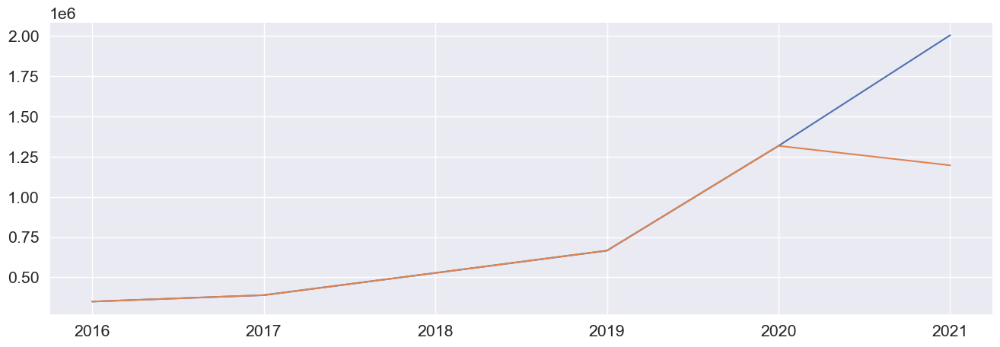

In [70]:
#общий график прогноза и факта
ecom_pred0 = ecom_test.drop('esales', axis = 1).copy()
ecom_pred0 ['esales'] = y_pred_test0
ecom_pred0 = pd.concat([ecom_train,ecom_pred0])

dataecom_act0 = ecom.groupby(['year']).sum()['esales']
dataecom_pred0 = ecom_pred0.groupby(['year']).sum()['esales']

plt.figure(figsize=(16,5))

plt.plot(dataecom_act0.index,dataecom_act0.values)
plt.plot(dataecom_pred0.index,dataecom_pred0.values)

Выберите субъект Алтайский край


<AxesSubplot:xlabel='year'>

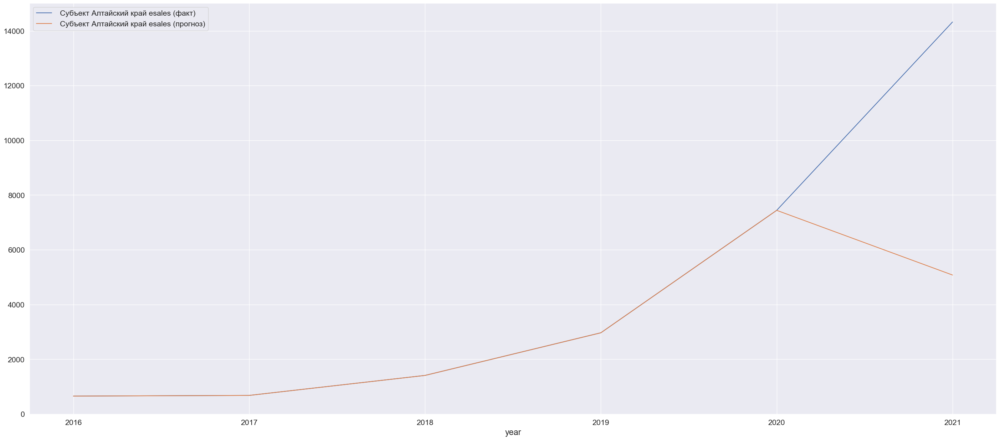

In [71]:
#график по субъекту
subject=input("Выберите субъект ")
ecom[ecom.subject == subject].groupby(['year']).sum()['esales'].plot(figsize = (35,15),legend=True, label = " Субъект "+subject+" esales (факт)")
ecom_pred0[ecom_pred0.subject == subject].groupby(['year']).sum()['esales'].plot(legend=True, label = " Субъект "+subject+" esales (прогноз)")

          imp           col
15   0.109628        condig
1    0.272583      youthpop
5    0.400967         covid
14   0.688815       citydig
8    0.824427    investment
9    1.075246           cpi
0    1.296429       citypop
17   2.069836         cargo
11   2.164315   internetorg
13   2.527187         sctec
16   2.550372         roads
2    2.679711       poorpop
12   4.039878   internetpop
3    6.718212     incomepop
6    6.920873           grp
4   10.744928      students
7   23.657444  entrepreneur
10  31.259149          card


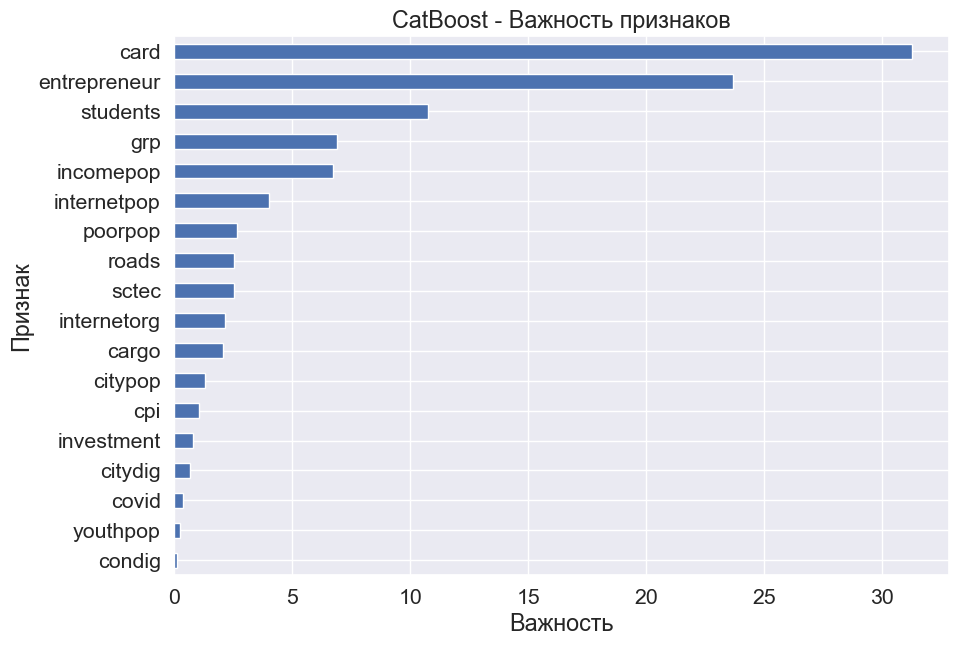

In [72]:
#Важность признаков в модели CatBoost
fea_imp0 = pd.DataFrame({'imp': model0.feature_importances_, 'col': X.columns})
fea_imp0 = fea_imp0.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
fea_imp0.plot(kind='barh', x='col', y='imp', figsize=(10, 7), legend=None)
plt.title('CatBoost - Важность признаков')
plt.ylabel('Признак')
plt.xlabel('Важность')
print(fea_imp0)

In [74]:
#статистики
res0 = model0.calc_feature_statistics(X_train,
                                    y_train,
                                    feature=range(0,18),
                                    plot=True)

* https://habr.com/ru/companies/wunderfund/articles/739744/
* https://dzen.ru/a/YyDPvRWnuz1VS1-7

In [75]:
explainer0 = shap.TreeExplainer(model0)
shap_values0 = explainer0(X_test)

* E[f(X)] - ожидаемое прогнозируемое значение
* f(X) - спрогнозированное значение

In [76]:
#визуализация SHAP-значений
shap.initjs()
shap.plots.force(shap_values0)

Для того чтобы определить то, какие признаки, в целом, являются наиболее важными для прогнозов, выдаваемых моделью, можно использовать столбчатую диаграмму (shap.plots.bar), отражающую результаты усреднения SHAP‑значений по всем наблюдениям.

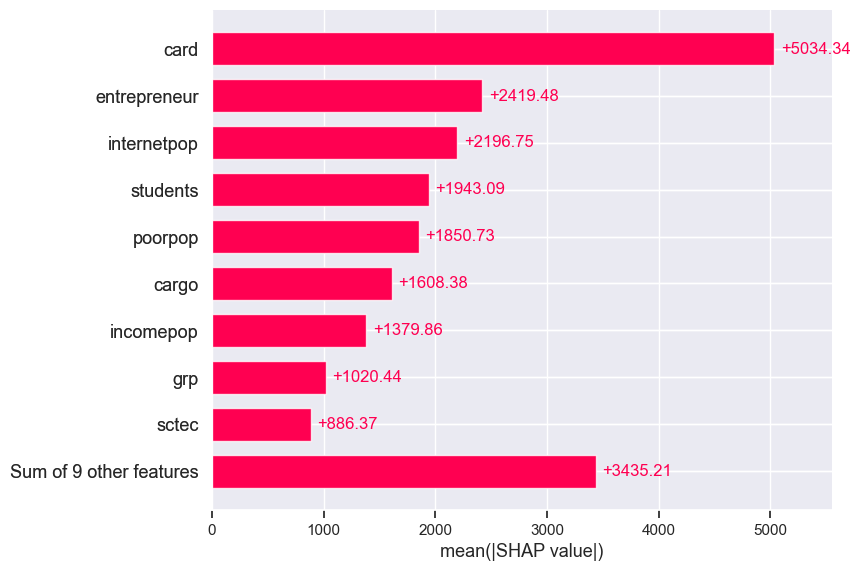

In [77]:
#усредненнные значения силы признаков по всем данным (без + и -)
shap.plots.bar(shap_values0)

Диаграмма shap.plots.beeswarm — это полезный инструмент, позволяющий визуализировать все SHAP‑значения для каждого признака. По оси x этой диаграммы SHAP‑значения сгруппированы по признакам. А цвет точек указывает на соответствующее значение признака. Обычно точки, цвет которых ближе к красному, указывают на более высокие значения признаков. То есть чем выше значение признака, тем сильне влияние.

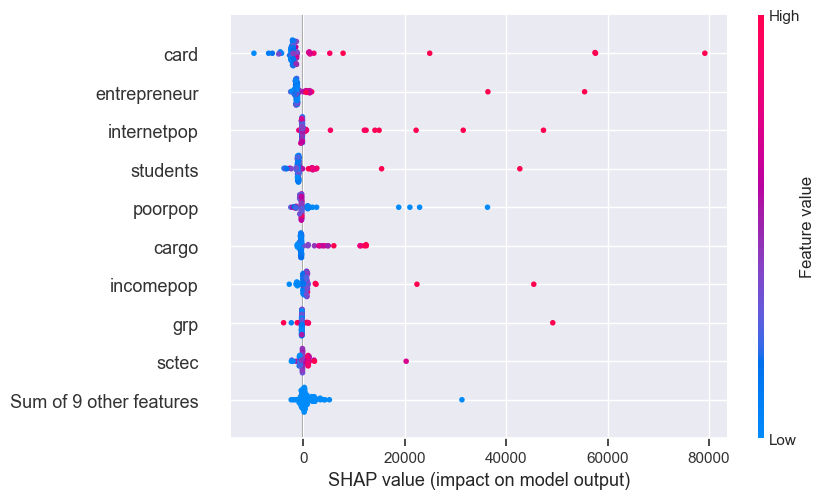

In [78]:
#распределение значений по всем данным
shap.plots.beeswarm(shap_values0)

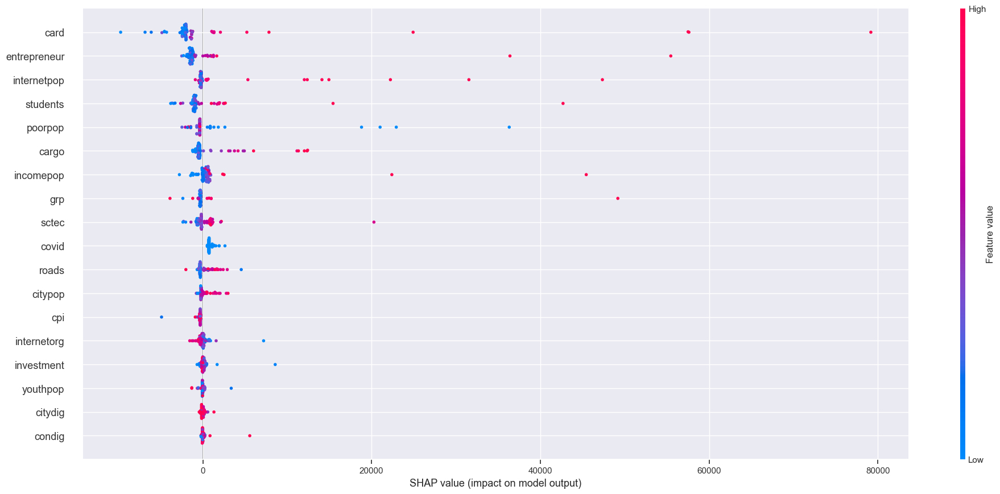

In [79]:
shap.summary_plot(shap_values0, X_test, plot_size=(20,9))

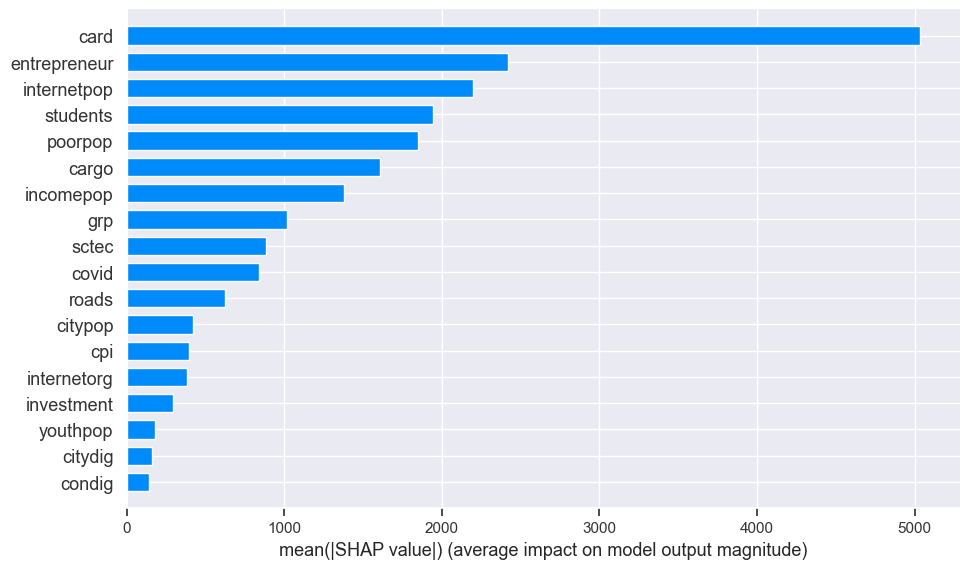

In [80]:
shap.summary_plot(shap_values0, X_test, plot_type="bar", plot_size=(10,6))

Для того чтобы лучше понять взаимоотношения между отдельными значениями признаков и их SHAP‑значениями, можно создать диаграмму зависимости (shap.plots.scatter). Это — диаграмма, которая раскрывает взаимоотношения между SHAP‑значениями и значениями признаков для отдельных признаков.

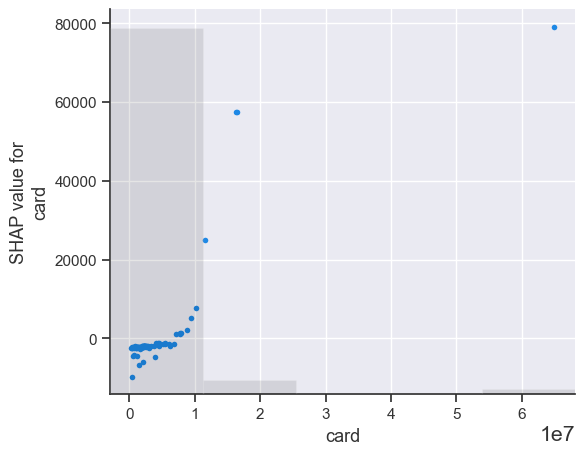

In [81]:
shap.plots.scatter(shap_values0[:,"card"])

**Улучшение модели. Отбор признаков. Модель №1**

In [84]:
model_fimp = CatBoostRegressor(iterations=5000, depth=3, learning_rate=0.1,loss_function='RMSE', early_stopping_rounds=20, cat_features=categorical_features_indices)
summary = model_fimp.select_features(X_train, y_train, eval_set =(X_test, y_test),features_for_select= '0-17',num_features_to_select = 7, steps = 11, algorithm=EFeaturesSelectionAlgorithm.RecursiveByShapValues, shap_calc_type=EShapCalcType.Regular,train_final_model = True, verbose = False, plot = True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Step #1 out of 11
Stopped by overfitting detector  (20 iterations wait)

bestTest = 25685.50703
bestIteration = 200

Shrink model to first 201 iterations.
Feature #9 eliminated
Step #2 out of 11
Stopped by overfitting detector  (20 iterations wait)

bestTest = 24519.60026
bestIteration = 158

Shrink model to first 159 iterations.
Feature #1 eliminated
Feature #15 eliminated
Step #3 out of 11
Stopped by overfitting detector  (20 iterations wait)

bestTest = 23041.8477
bestIteration = 182

Shrink model to first 183 iterations.
Feature #11 eliminated
Step #4 out of 11
Stopped by overfitting detector  (20 iterations wait)

bestTest = 20488.35833
bestIteration = 516

Shrink model to first 517 iterations.
Feature #14 eliminated
Step #5 out of 11
Stopped by overfitting detector  (20 iterations wait)

bestTest = 18308.46739
bestIteration = 228

Shrink model to first 229 iterations.
Feature #16 eliminated
Step #6 out of 11
Stopped by overfitting detector  (20 iterations wait)

bestTest = 19632.

In [85]:
summary

{'selected_features': [2, 4, 5, 6, 7, 10, 12],
 'eliminated_features_names': ['cpi',
  'youthpop',
  'condig',
  'internetorg',
  'citydig',
  'roads',
  'investment',
  'citypop',
  'sctec',
  'incomepop',
  'cargo'],
 'loss_graph': {'main_indices': [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 10, 11],
  'removed_features_count': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
  'loss_values': [25685.507028306965,
   24519.60026034835,
   21123.029044555038,
   23041.84770314519,
   20488.358329734565,
   18308.467385545973,
   19632.91008002665,
   19678.941905764743,
   19234.819271073546,
   18899.91085550961,
   18298.45173533236,
   17670.390088394473]},
 'eliminated_features': [9, 1, 15, 11, 14, 16, 8, 0, 13, 3, 17],
 'selected_features_names': ['poorpop',
  'students',
  'covid',
  'grp',
  'entrepreneur',
  'card',
  'internetpop']}

In [86]:
X_test1 = X_test.drop(['cpi',
  'youthpop',
  'condig',
  'internetorg',
  'citydig',
  'roads',
  'investment',
  'citypop',
  'sctec',
  'incomepop',
  'cargo'],axis=1)
X_train1 = X_train.drop(['cpi',
  'youthpop',
  'condig',
  'internetorg',
  'citydig',
  'roads',
  'investment',
  'citypop',
  'sctec',
  'incomepop',
  'cargo'],axis=1)

In [87]:
X_train1

,poorpop,students,covid,grp,entrepreneur,card,internetpop
0,17.8,52127,0,532401.5,49969,3593803,76.6
1,17.5,51129,0,545303.0,49411,3619598,74.2
2,17.4,50297,0,579740.5,49776,3730539,79.9
3,17.6,49051,0,628146.1,50007,3734509,79.9
4,17.5,49608,1,664129.2,47381,3926072,80.8
...,...,...,...,...,...,...,...
480,25.5,2309,0,48563.2,3349,184566,68.2
481,24.3,2100,0,55268.0,3275,189775,73.1
482,23.7,2053,0,54577.8,3244,229298,71.5
483,23.9,2017,0,56847.6,3181,237280,76.2


In [88]:
categorical_features_indices1 = column_index(X_train1, categorical)
categorical_features_indices1

array([2], dtype=int64)

In [89]:
model1=CatBoostRegressor(iterations=5000, depth=3, learning_rate=0.1,loss_function='RMSE', early_stopping_rounds=20)
model1.fit(X_train1, y_train, eval_set=(X_test1, y_test),cat_features=categorical_features_indices1, verbose=False, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [90]:
print(f'Модель обучена? {model1.is_fitted()}')
print(f'Номер лучшей итерации {model1.get_best_iteration()}')
print(f'Лучшие значения: {model1.get_best_score()}')

Модель обучена? True
Номер лучшей итерации 309
Лучшие значения: {'learn': {'RMSE': 1608.8349868896835}, 'validation': {'RMSE': 19506.527759141816}}


In [91]:
y_pred_train1 = model1.predict(X_train1)
y_pred_test1 = model1.predict(X_test1)
print("TRAIN SMAPE:", smape(y_train, y_pred_train1))
print("MAE train:",mean_absolute_error(y_train, y_pred_train1))
print("RMSE train:",mean_squared_error(y_train, y_pred_train1))
print("MAPE train:",mean_absolute_percentage_error(y_train, y_pred_train1))
print("R2 Score train:",r2_score(y_train, y_pred_train1))

TRAIN SMAPE: 68.76119537801677
MAE train: 1061.2161781300906
RMSE train: 2844240.9955624524
MAPE train: 1.4071195061292622e+17
R2 Score train: 0.9972398404461134


In [92]:
print("TEST SMAPE:", smape(y_test, y_pred_test1))
print("MAE test:",mean_absolute_error(y_test, y_pred_test1))
print("RMSE test:",mean_squared_error(y_test, y_pred_test1))
print("MAPE test:",mean_absolute_percentage_error(y_test, y_pred_test1))
print("R2 Score test:",r2_score(y_test, y_pred_test1))

TEST SMAPE: 57.97869622944254
MAE test: 8854.765201337312
RMSE test: 380504575.1328812
MAPE test: 1.3405688230022978
R2 Score test: 0.924727492704648


In [93]:
#CV через библиотеку Sklearn
cv_score1 = cross_val_score (model1, X_train1, y_train,scoring = 'neg_root_mean_squared_error', cv=5 )
final_cv_score1 = round(np.mean(-cv_score1)**0.5,3)
print('RMSE модели через кросс-валидацию', final_cv_score1)

0:	learn: 34072.7039569	total: 789us	remaining: 3.95s
1:	learn: 32397.3931684	total: 1.63ms	remaining: 4.07s
2:	learn: 31008.8981029	total: 2.37ms	remaining: 3.94s
3:	learn: 29809.6703116	total: 2.95ms	remaining: 3.68s
4:	learn: 28716.5237819	total: 3.54ms	remaining: 3.53s
5:	learn: 27817.0482397	total: 4.15ms	remaining: 3.45s
6:	learn: 27136.0541909	total: 4.7ms	remaining: 3.35s
7:	learn: 26170.0659893	total: 5.26ms	remaining: 3.28s
8:	learn: 25340.7018440	total: 5.86ms	remaining: 3.25s
9:	learn: 24920.6544535	total: 6.45ms	remaining: 3.22s
10:	learn: 24165.1389993	total: 7.04ms	remaining: 3.19s
11:	learn: 23763.1803742	total: 7.64ms	remaining: 3.17s
12:	learn: 22897.6969308	total: 8.19ms	remaining: 3.14s
13:	learn: 22328.2588294	total: 8.78ms	remaining: 3.13s
14:	learn: 21507.2119874	total: 9.33ms	remaining: 3.1s
15:	learn: 21145.4135531	total: 9.71ms	remaining: 3.02s
16:	learn: 20649.9386100	total: 10.4ms	remaining: 3.06s
17:	learn: 20038.4512143	total: 11.1ms	remaining: 3.07s
18:	l

306:	learn: 1361.3941264	total: 173ms	remaining: 2.65s
307:	learn: 1351.4479416	total: 174ms	remaining: 2.65s
308:	learn: 1348.1280117	total: 174ms	remaining: 2.65s
309:	learn: 1345.6375232	total: 175ms	remaining: 2.65s
310:	learn: 1340.3707767	total: 176ms	remaining: 2.65s
311:	learn: 1337.4385094	total: 177ms	remaining: 2.66s
312:	learn: 1329.6729219	total: 177ms	remaining: 2.65s
313:	learn: 1321.8777188	total: 178ms	remaining: 2.65s
314:	learn: 1319.8307116	total: 178ms	remaining: 2.65s
315:	learn: 1309.6835715	total: 179ms	remaining: 2.65s
316:	learn: 1307.0791041	total: 179ms	remaining: 2.65s
317:	learn: 1304.4857551	total: 180ms	remaining: 2.65s
318:	learn: 1299.9644715	total: 181ms	remaining: 2.65s
319:	learn: 1297.6609607	total: 181ms	remaining: 2.65s
320:	learn: 1289.0871170	total: 182ms	remaining: 2.65s
321:	learn: 1287.3057201	total: 182ms	remaining: 2.65s
322:	learn: 1282.9920265	total: 183ms	remaining: 2.65s
323:	learn: 1278.7884654	total: 184ms	remaining: 2.65s
324:	learn

614:	learn: 569.9667256	total: 347ms	remaining: 2.47s
615:	learn: 569.6265705	total: 348ms	remaining: 2.47s
616:	learn: 569.4809724	total: 348ms	remaining: 2.47s
617:	learn: 568.8125173	total: 349ms	remaining: 2.47s
618:	learn: 567.6629737	total: 349ms	remaining: 2.47s
619:	learn: 566.0959670	total: 350ms	remaining: 2.47s
620:	learn: 565.2072820	total: 351ms	remaining: 2.47s
621:	learn: 563.9583742	total: 351ms	remaining: 2.47s
622:	learn: 562.0614918	total: 352ms	remaining: 2.47s
623:	learn: 560.6984992	total: 352ms	remaining: 2.47s
624:	learn: 559.1215759	total: 353ms	remaining: 2.47s
625:	learn: 558.5807018	total: 354ms	remaining: 2.47s
626:	learn: 556.6680239	total: 354ms	remaining: 2.47s
627:	learn: 555.2065258	total: 355ms	remaining: 2.47s
628:	learn: 554.0101807	total: 355ms	remaining: 2.47s
629:	learn: 552.7158644	total: 356ms	remaining: 2.47s
630:	learn: 549.1348107	total: 356ms	remaining: 2.47s
631:	learn: 547.7694783	total: 357ms	remaining: 2.46s
632:	learn: 546.6822243	tota

905:	learn: 336.4408165	total: 520ms	remaining: 2.35s
906:	learn: 336.2889843	total: 522ms	remaining: 2.35s
907:	learn: 335.9627416	total: 523ms	remaining: 2.35s
908:	learn: 335.8680186	total: 523ms	remaining: 2.35s
909:	learn: 335.2129403	total: 524ms	remaining: 2.35s
910:	learn: 334.3683115	total: 524ms	remaining: 2.35s
911:	learn: 334.0947411	total: 525ms	remaining: 2.35s
912:	learn: 333.8280387	total: 525ms	remaining: 2.35s
913:	learn: 333.6732824	total: 526ms	remaining: 2.35s
914:	learn: 332.2692212	total: 526ms	remaining: 2.35s
915:	learn: 332.1719581	total: 527ms	remaining: 2.35s
916:	learn: 331.9426255	total: 527ms	remaining: 2.35s
917:	learn: 331.8089272	total: 528ms	remaining: 2.35s
918:	learn: 331.4892634	total: 529ms	remaining: 2.35s
919:	learn: 331.1955554	total: 529ms	remaining: 2.35s
920:	learn: 330.4030930	total: 530ms	remaining: 2.35s
921:	learn: 330.1364509	total: 530ms	remaining: 2.34s
922:	learn: 329.8818820	total: 531ms	remaining: 2.34s
923:	learn: 329.4490960	tota

1196:	learn: 231.8023042	total: 692ms	remaining: 2.2s
1197:	learn: 231.5074618	total: 693ms	remaining: 2.2s
1198:	learn: 231.0363793	total: 693ms	remaining: 2.2s
1199:	learn: 230.5193411	total: 694ms	remaining: 2.2s
1200:	learn: 230.0463340	total: 695ms	remaining: 2.2s
1201:	learn: 229.4631423	total: 695ms	remaining: 2.2s
1202:	learn: 228.9866909	total: 696ms	remaining: 2.2s
1203:	learn: 228.7131792	total: 697ms	remaining: 2.19s
1204:	learn: 228.1356482	total: 697ms	remaining: 2.19s
1205:	learn: 228.0014287	total: 698ms	remaining: 2.19s
1206:	learn: 227.5915222	total: 698ms	remaining: 2.19s
1207:	learn: 227.4733358	total: 699ms	remaining: 2.19s
1208:	learn: 227.0845966	total: 699ms	remaining: 2.19s
1209:	learn: 226.8035811	total: 700ms	remaining: 2.19s
1210:	learn: 226.4536093	total: 700ms	remaining: 2.19s
1211:	learn: 226.0908748	total: 701ms	remaining: 2.19s
1212:	learn: 225.7828676	total: 702ms	remaining: 2.19s
1213:	learn: 225.5495229	total: 702ms	remaining: 2.19s
1214:	learn: 225.

1516:	learn: 165.2407008	total: 865ms	remaining: 1.98s
1517:	learn: 165.1510073	total: 865ms	remaining: 1.98s
1518:	learn: 165.1135640	total: 866ms	remaining: 1.98s
1519:	learn: 164.8938226	total: 867ms	remaining: 1.98s
1520:	learn: 164.6718141	total: 867ms	remaining: 1.98s
1521:	learn: 164.5858277	total: 868ms	remaining: 1.98s
1522:	learn: 164.5105623	total: 868ms	remaining: 1.98s
1523:	learn: 164.4035786	total: 869ms	remaining: 1.98s
1524:	learn: 164.2676257	total: 870ms	remaining: 1.98s
1525:	learn: 164.0198177	total: 870ms	remaining: 1.98s
1526:	learn: 163.9236182	total: 871ms	remaining: 1.98s
1527:	learn: 163.6866696	total: 871ms	remaining: 1.98s
1528:	learn: 163.6445107	total: 872ms	remaining: 1.98s
1529:	learn: 163.3699846	total: 872ms	remaining: 1.98s
1530:	learn: 163.3373088	total: 873ms	remaining: 1.98s
1531:	learn: 163.0044402	total: 874ms	remaining: 1.98s
1532:	learn: 162.7521401	total: 874ms	remaining: 1.98s
1533:	learn: 162.7059300	total: 875ms	remaining: 1.98s
1534:	lear

1819:	learn: 124.5864939	total: 1.04s	remaining: 1.81s
1820:	learn: 124.5512098	total: 1.04s	remaining: 1.81s
1821:	learn: 124.4117336	total: 1.04s	remaining: 1.81s
1822:	learn: 124.2486593	total: 1.04s	remaining: 1.81s
1823:	learn: 124.1343740	total: 1.04s	remaining: 1.81s
1824:	learn: 124.0712471	total: 1.04s	remaining: 1.81s
1825:	learn: 123.6015032	total: 1.04s	remaining: 1.81s
1826:	learn: 123.4704387	total: 1.04s	remaining: 1.81s
1827:	learn: 123.3258874	total: 1.04s	remaining: 1.81s
1828:	learn: 123.3067359	total: 1.04s	remaining: 1.81s
1829:	learn: 123.1569583	total: 1.04s	remaining: 1.81s
1830:	learn: 123.0023013	total: 1.04s	remaining: 1.81s
1831:	learn: 122.9595076	total: 1.04s	remaining: 1.81s
1832:	learn: 122.8732365	total: 1.04s	remaining: 1.81s
1833:	learn: 122.8168244	total: 1.05s	remaining: 1.81s
1834:	learn: 122.7225022	total: 1.05s	remaining: 1.8s
1835:	learn: 122.6101192	total: 1.05s	remaining: 1.8s
1836:	learn: 122.5761331	total: 1.05s	remaining: 1.8s
1837:	learn: 

2091:	learn: 95.4526830	total: 1.2s	remaining: 1.67s
2092:	learn: 95.3595498	total: 1.2s	remaining: 1.67s
2093:	learn: 95.2412137	total: 1.2s	remaining: 1.67s
2094:	learn: 95.0673918	total: 1.2s	remaining: 1.67s
2095:	learn: 95.0459458	total: 1.2s	remaining: 1.67s
2096:	learn: 94.9335610	total: 1.2s	remaining: 1.67s
2097:	learn: 94.8383043	total: 1.2s	remaining: 1.67s
2098:	learn: 94.6640841	total: 1.21s	remaining: 1.67s
2099:	learn: 94.5938093	total: 1.21s	remaining: 1.66s
2100:	learn: 94.5876485	total: 1.21s	remaining: 1.66s
2101:	learn: 94.5174394	total: 1.21s	remaining: 1.66s
2102:	learn: 94.3988097	total: 1.21s	remaining: 1.66s
2103:	learn: 94.2625649	total: 1.21s	remaining: 1.66s
2104:	learn: 94.1413968	total: 1.21s	remaining: 1.66s
2105:	learn: 93.9774654	total: 1.21s	remaining: 1.66s
2106:	learn: 93.8219741	total: 1.21s	remaining: 1.66s
2107:	learn: 93.7987039	total: 1.21s	remaining: 1.66s
2108:	learn: 93.7895181	total: 1.21s	remaining: 1.66s
2109:	learn: 93.7701150	total: 1.21

2414:	learn: 72.3243415	total: 1.37s	remaining: 1.47s
2415:	learn: 72.2860605	total: 1.37s	remaining: 1.47s
2416:	learn: 72.2727689	total: 1.37s	remaining: 1.47s
2417:	learn: 72.2370644	total: 1.37s	remaining: 1.47s
2418:	learn: 72.1028422	total: 1.38s	remaining: 1.47s
2419:	learn: 71.9748077	total: 1.38s	remaining: 1.47s
2420:	learn: 71.9408972	total: 1.38s	remaining: 1.47s
2421:	learn: 71.7104038	total: 1.38s	remaining: 1.47s
2422:	learn: 71.7040754	total: 1.38s	remaining: 1.47s
2423:	learn: 71.6071352	total: 1.38s	remaining: 1.46s
2424:	learn: 71.4861914	total: 1.38s	remaining: 1.46s
2425:	learn: 71.4755337	total: 1.38s	remaining: 1.46s
2426:	learn: 71.4294605	total: 1.38s	remaining: 1.46s
2427:	learn: 71.4211057	total: 1.38s	remaining: 1.46s
2428:	learn: 71.3555491	total: 1.38s	remaining: 1.46s
2429:	learn: 71.2113002	total: 1.38s	remaining: 1.46s
2430:	learn: 71.1739966	total: 1.38s	remaining: 1.46s
2431:	learn: 71.1046033	total: 1.38s	remaining: 1.46s
2432:	learn: 71.0313773	tota

2735:	learn: 55.5937116	total: 1.54s	remaining: 1.28s
2736:	learn: 55.5766260	total: 1.55s	remaining: 1.28s
2737:	learn: 55.5535341	total: 1.55s	remaining: 1.28s
2738:	learn: 55.5342399	total: 1.55s	remaining: 1.28s
2739:	learn: 55.4759777	total: 1.55s	remaining: 1.28s
2740:	learn: 55.4669441	total: 1.55s	remaining: 1.28s
2741:	learn: 55.4439488	total: 1.55s	remaining: 1.28s
2742:	learn: 55.4432042	total: 1.55s	remaining: 1.27s
2743:	learn: 55.4309683	total: 1.55s	remaining: 1.27s
2744:	learn: 55.3413338	total: 1.55s	remaining: 1.27s
2745:	learn: 55.3166756	total: 1.55s	remaining: 1.27s
2746:	learn: 55.3094002	total: 1.55s	remaining: 1.27s
2747:	learn: 55.2432380	total: 1.55s	remaining: 1.27s
2748:	learn: 55.2386536	total: 1.55s	remaining: 1.27s
2749:	learn: 55.2052337	total: 1.55s	remaining: 1.27s
2750:	learn: 55.2023827	total: 1.55s	remaining: 1.27s
2751:	learn: 55.1376015	total: 1.55s	remaining: 1.27s
2752:	learn: 55.1356816	total: 1.55s	remaining: 1.27s
2753:	learn: 55.1108205	tota

3020:	learn: 45.0373835	total: 1.72s	remaining: 1.13s
3021:	learn: 45.0314727	total: 1.72s	remaining: 1.13s
3022:	learn: 44.9630942	total: 1.72s	remaining: 1.13s
3023:	learn: 44.9081885	total: 1.72s	remaining: 1.13s
3024:	learn: 44.8330315	total: 1.72s	remaining: 1.12s
3025:	learn: 44.7919396	total: 1.72s	remaining: 1.12s
3026:	learn: 44.7829270	total: 1.72s	remaining: 1.12s
3027:	learn: 44.7571758	total: 1.72s	remaining: 1.12s
3028:	learn: 44.7511739	total: 1.72s	remaining: 1.12s
3029:	learn: 44.7320058	total: 1.73s	remaining: 1.12s
3030:	learn: 44.7185785	total: 1.73s	remaining: 1.12s
3031:	learn: 44.6868450	total: 1.73s	remaining: 1.12s
3032:	learn: 44.6630249	total: 1.73s	remaining: 1.12s
3033:	learn: 44.5977750	total: 1.73s	remaining: 1.12s
3034:	learn: 44.5449004	total: 1.73s	remaining: 1.12s
3035:	learn: 44.5285024	total: 1.73s	remaining: 1.12s
3036:	learn: 44.5256070	total: 1.73s	remaining: 1.12s
3037:	learn: 44.4786544	total: 1.73s	remaining: 1.12s
3038:	learn: 44.4226608	tota

3345:	learn: 35.0148959	total: 1.89s	remaining: 936ms
3346:	learn: 34.9876505	total: 1.89s	remaining: 935ms
3347:	learn: 34.9713717	total: 1.89s	remaining: 934ms
3348:	learn: 34.9254324	total: 1.89s	remaining: 934ms
3349:	learn: 34.8481446	total: 1.9s	remaining: 934ms
3350:	learn: 34.8307700	total: 1.9s	remaining: 933ms
3351:	learn: 34.8040686	total: 1.9s	remaining: 932ms
3352:	learn: 34.7959469	total: 1.9s	remaining: 932ms
3353:	learn: 34.7870386	total: 1.9s	remaining: 931ms
3354:	learn: 34.7216240	total: 1.9s	remaining: 931ms
3355:	learn: 34.7032922	total: 1.9s	remaining: 930ms
3356:	learn: 34.6681618	total: 1.9s	remaining: 930ms
3357:	learn: 34.6425442	total: 1.9s	remaining: 929ms
3358:	learn: 34.5922842	total: 1.9s	remaining: 929ms
3359:	learn: 34.5523237	total: 1.9s	remaining: 928ms
3360:	learn: 34.4772634	total: 1.9s	remaining: 927ms
3361:	learn: 34.4549805	total: 1.9s	remaining: 927ms
3362:	learn: 34.4468593	total: 1.9s	remaining: 926ms
3363:	learn: 34.4323669	total: 1.9s	remain

3644:	learn: 28.0936955	total: 2.07s	remaining: 768ms
3645:	learn: 28.0780436	total: 2.07s	remaining: 768ms
3646:	learn: 28.0580259	total: 2.07s	remaining: 767ms
3647:	learn: 28.0452689	total: 2.07s	remaining: 767ms
3648:	learn: 28.0062398	total: 2.07s	remaining: 766ms
3649:	learn: 28.0041368	total: 2.07s	remaining: 765ms
3650:	learn: 27.9775212	total: 2.07s	remaining: 765ms
3651:	learn: 27.9416911	total: 2.07s	remaining: 764ms
3652:	learn: 27.9401624	total: 2.07s	remaining: 764ms
3653:	learn: 27.9249027	total: 2.07s	remaining: 763ms
3654:	learn: 27.9045505	total: 2.07s	remaining: 763ms
3655:	learn: 27.8936784	total: 2.07s	remaining: 762ms
3656:	learn: 27.8738348	total: 2.07s	remaining: 762ms
3657:	learn: 27.8516762	total: 2.07s	remaining: 761ms
3658:	learn: 27.8241536	total: 2.07s	remaining: 760ms
3659:	learn: 27.8098673	total: 2.08s	remaining: 760ms
3660:	learn: 27.8075317	total: 2.08s	remaining: 759ms
3661:	learn: 27.7858909	total: 2.08s	remaining: 759ms
3662:	learn: 27.7543243	tota

3948:	learn: 22.5147318	total: 2.24s	remaining: 596ms
3949:	learn: 22.5020109	total: 2.24s	remaining: 596ms
3950:	learn: 22.4946129	total: 2.24s	remaining: 595ms
3951:	learn: 22.4683278	total: 2.24s	remaining: 595ms
3952:	learn: 22.4570847	total: 2.24s	remaining: 594ms
3953:	learn: 22.4402848	total: 2.24s	remaining: 593ms
3954:	learn: 22.4213170	total: 2.24s	remaining: 593ms
3955:	learn: 22.4112496	total: 2.24s	remaining: 592ms
3956:	learn: 22.4011226	total: 2.24s	remaining: 592ms
3957:	learn: 22.3973738	total: 2.25s	remaining: 591ms
3958:	learn: 22.3608008	total: 2.25s	remaining: 591ms
3959:	learn: 22.3599511	total: 2.25s	remaining: 590ms
3960:	learn: 22.3203935	total: 2.25s	remaining: 589ms
3961:	learn: 22.2644094	total: 2.25s	remaining: 589ms
3962:	learn: 22.2622352	total: 2.25s	remaining: 588ms
3963:	learn: 22.2281086	total: 2.25s	remaining: 588ms
3964:	learn: 22.1997528	total: 2.25s	remaining: 587ms
3965:	learn: 22.1698129	total: 2.25s	remaining: 587ms
3966:	learn: 22.1408966	tota

4271:	learn: 17.6692657	total: 2.41s	remaining: 411ms
4272:	learn: 17.6552766	total: 2.41s	remaining: 411ms
4273:	learn: 17.6542259	total: 2.41s	remaining: 410ms
4274:	learn: 17.6520748	total: 2.41s	remaining: 409ms
4275:	learn: 17.6461002	total: 2.41s	remaining: 409ms
4276:	learn: 17.6455788	total: 2.42s	remaining: 408ms
4277:	learn: 17.6267262	total: 2.42s	remaining: 408ms
4278:	learn: 17.6252748	total: 2.42s	remaining: 407ms
4279:	learn: 17.6133222	total: 2.42s	remaining: 407ms
4280:	learn: 17.6043587	total: 2.42s	remaining: 406ms
4281:	learn: 17.5961009	total: 2.42s	remaining: 405ms
4282:	learn: 17.5906239	total: 2.42s	remaining: 405ms
4283:	learn: 17.5901364	total: 2.42s	remaining: 404ms
4284:	learn: 17.5853875	total: 2.42s	remaining: 404ms
4285:	learn: 17.5630107	total: 2.42s	remaining: 403ms
4286:	learn: 17.5519414	total: 2.42s	remaining: 403ms
4287:	learn: 17.5372500	total: 2.42s	remaining: 402ms
4288:	learn: 17.5244630	total: 2.42s	remaining: 401ms
4289:	learn: 17.5228010	tota

4594:	learn: 14.2577853	total: 2.58s	remaining: 228ms
4595:	learn: 14.2411469	total: 2.58s	remaining: 227ms
4596:	learn: 14.2332668	total: 2.58s	remaining: 227ms
4597:	learn: 14.2320257	total: 2.59s	remaining: 226ms
4598:	learn: 14.2226325	total: 2.59s	remaining: 226ms
4599:	learn: 14.2205633	total: 2.59s	remaining: 225ms
4600:	learn: 14.1892107	total: 2.59s	remaining: 224ms
4601:	learn: 14.1877385	total: 2.59s	remaining: 224ms
4602:	learn: 14.1774498	total: 2.59s	remaining: 223ms
4603:	learn: 14.1721046	total: 2.59s	remaining: 223ms
4604:	learn: 14.1652792	total: 2.59s	remaining: 222ms
4605:	learn: 14.1571237	total: 2.59s	remaining: 222ms
4606:	learn: 14.1416428	total: 2.59s	remaining: 221ms
4607:	learn: 14.1380695	total: 2.59s	remaining: 221ms
4608:	learn: 14.1265380	total: 2.59s	remaining: 220ms
4609:	learn: 14.1002073	total: 2.59s	remaining: 219ms
4610:	learn: 14.0862186	total: 2.59s	remaining: 219ms
4611:	learn: 14.0855625	total: 2.59s	remaining: 218ms
4612:	learn: 14.0667961	tota

4894:	learn: 11.4897417	total: 2.76s	remaining: 59.1ms
4895:	learn: 11.4851322	total: 2.76s	remaining: 58.6ms
4896:	learn: 11.4683645	total: 2.76s	remaining: 58ms
4897:	learn: 11.4612353	total: 2.76s	remaining: 57.4ms
4898:	learn: 11.4543980	total: 2.76s	remaining: 56.9ms
4899:	learn: 11.4496721	total: 2.76s	remaining: 56.3ms
4900:	learn: 11.4491723	total: 2.76s	remaining: 55.8ms
4901:	learn: 11.4383503	total: 2.76s	remaining: 55.2ms
4902:	learn: 11.4221893	total: 2.76s	remaining: 54.6ms
4903:	learn: 11.4044763	total: 2.76s	remaining: 54.1ms
4904:	learn: 11.4038967	total: 2.76s	remaining: 53.5ms
4905:	learn: 11.3982659	total: 2.76s	remaining: 53ms
4906:	learn: 11.3939115	total: 2.76s	remaining: 52.4ms
4907:	learn: 11.3932860	total: 2.77s	remaining: 51.8ms
4908:	learn: 11.3752776	total: 2.77s	remaining: 51.3ms
4909:	learn: 11.3693527	total: 2.77s	remaining: 50.7ms
4910:	learn: 11.3598044	total: 2.77s	remaining: 50.1ms
4911:	learn: 11.3491245	total: 2.77s	remaining: 49.6ms
4912:	learn: 1

110:	learn: 4483.9059052	total: 59.6ms	remaining: 2.62s
111:	learn: 4469.1436214	total: 60.1ms	remaining: 2.62s
112:	learn: 4390.2561298	total: 60.7ms	remaining: 2.62s
113:	learn: 4352.8683173	total: 61.5ms	remaining: 2.63s
114:	learn: 4291.0556522	total: 62ms	remaining: 2.63s
115:	learn: 4254.1665033	total: 62.6ms	remaining: 2.64s
116:	learn: 4241.7460227	total: 63.2ms	remaining: 2.64s
117:	learn: 4193.8677649	total: 63.8ms	remaining: 2.64s
118:	learn: 4182.3950698	total: 64.4ms	remaining: 2.64s
119:	learn: 4171.4664343	total: 65ms	remaining: 2.65s
120:	learn: 4146.1024895	total: 65.6ms	remaining: 2.65s
121:	learn: 4112.7810477	total: 66.2ms	remaining: 2.65s
122:	learn: 4103.0461517	total: 66.9ms	remaining: 2.65s
123:	learn: 4050.1297190	total: 67.6ms	remaining: 2.66s
124:	learn: 4022.2675016	total: 68.2ms	remaining: 2.66s
125:	learn: 4013.5549879	total: 68.7ms	remaining: 2.66s
126:	learn: 3965.9716215	total: 69.2ms	remaining: 2.66s
127:	learn: 3916.2502528	total: 69.8ms	remaining: 2.

391:	learn: 1108.1376041	total: 232ms	remaining: 2.72s
392:	learn: 1107.5969669	total: 232ms	remaining: 2.72s
393:	learn: 1101.8822550	total: 233ms	remaining: 2.72s
394:	learn: 1098.8771300	total: 234ms	remaining: 2.72s
395:	learn: 1098.5320403	total: 234ms	remaining: 2.72s
396:	learn: 1096.0730425	total: 235ms	remaining: 2.72s
397:	learn: 1089.8163412	total: 236ms	remaining: 2.72s
398:	learn: 1085.9542272	total: 236ms	remaining: 2.72s
399:	learn: 1083.3542813	total: 237ms	remaining: 2.72s
400:	learn: 1077.9987044	total: 238ms	remaining: 2.73s
401:	learn: 1076.8772015	total: 238ms	remaining: 2.73s
402:	learn: 1073.1403906	total: 239ms	remaining: 2.73s
403:	learn: 1070.8320428	total: 240ms	remaining: 2.73s
404:	learn: 1068.9463583	total: 240ms	remaining: 2.72s
405:	learn: 1066.7564920	total: 245ms	remaining: 2.77s
406:	learn: 1061.6670584	total: 246ms	remaining: 2.77s
407:	learn: 1056.8115846	total: 246ms	remaining: 2.77s
408:	learn: 1054.7524330	total: 247ms	remaining: 2.77s
409:	learn

696:	learn: 558.0457674	total: 404ms	remaining: 2.5s
697:	learn: 557.7545365	total: 405ms	remaining: 2.5s
698:	learn: 557.1707627	total: 406ms	remaining: 2.5s
699:	learn: 555.4119992	total: 406ms	remaining: 2.5s
700:	learn: 555.1221894	total: 407ms	remaining: 2.5s
701:	learn: 554.2047272	total: 407ms	remaining: 2.49s
702:	learn: 552.6156172	total: 408ms	remaining: 2.49s
703:	learn: 551.6954305	total: 409ms	remaining: 2.49s
704:	learn: 551.0606548	total: 409ms	remaining: 2.49s
705:	learn: 550.0861642	total: 410ms	remaining: 2.49s
706:	learn: 549.7943996	total: 410ms	remaining: 2.49s
707:	learn: 549.2039051	total: 411ms	remaining: 2.49s
708:	learn: 548.6141467	total: 412ms	remaining: 2.49s
709:	learn: 548.5099235	total: 412ms	remaining: 2.49s
710:	learn: 547.4430379	total: 413ms	remaining: 2.49s
711:	learn: 545.8398410	total: 413ms	remaining: 2.49s
712:	learn: 544.8396965	total: 414ms	remaining: 2.49s
713:	learn: 544.3175818	total: 414ms	remaining: 2.49s
714:	learn: 542.7722325	total: 41

1008:	learn: 342.1943822	total: 577ms	remaining: 2.28s
1009:	learn: 342.0479920	total: 578ms	remaining: 2.28s
1010:	learn: 341.8174247	total: 578ms	remaining: 2.28s
1011:	learn: 341.7510725	total: 579ms	remaining: 2.28s
1012:	learn: 340.9015720	total: 580ms	remaining: 2.28s
1013:	learn: 340.3512668	total: 580ms	remaining: 2.28s
1014:	learn: 339.8316616	total: 581ms	remaining: 2.28s
1015:	learn: 339.1653738	total: 581ms	remaining: 2.28s
1016:	learn: 337.7691173	total: 582ms	remaining: 2.28s
1017:	learn: 337.6877164	total: 582ms	remaining: 2.28s
1018:	learn: 337.4703444	total: 583ms	remaining: 2.28s
1019:	learn: 336.7835458	total: 583ms	remaining: 2.27s
1020:	learn: 336.6873599	total: 584ms	remaining: 2.27s
1021:	learn: 335.7608714	total: 584ms	remaining: 2.27s
1022:	learn: 335.6764749	total: 585ms	remaining: 2.27s
1023:	learn: 334.6204683	total: 593ms	remaining: 2.3s
1024:	learn: 334.3430641	total: 593ms	remaining: 2.3s
1025:	learn: 334.1942543	total: 594ms	remaining: 2.3s
1026:	learn: 

1313:	learn: 230.2385293	total: 750ms	remaining: 2.1s
1314:	learn: 229.8453848	total: 751ms	remaining: 2.1s
1315:	learn: 229.6633222	total: 751ms	remaining: 2.1s
1316:	learn: 228.6476980	total: 752ms	remaining: 2.1s
1317:	learn: 228.4381784	total: 753ms	remaining: 2.1s
1318:	learn: 228.0472660	total: 754ms	remaining: 2.1s
1319:	learn: 227.9467148	total: 754ms	remaining: 2.1s
1320:	learn: 227.7854458	total: 755ms	remaining: 2.1s
1321:	learn: 227.4079977	total: 755ms	remaining: 2.1s
1322:	learn: 227.0674618	total: 756ms	remaining: 2.1s
1323:	learn: 226.5698419	total: 757ms	remaining: 2.1s
1324:	learn: 226.1728345	total: 757ms	remaining: 2.1s
1325:	learn: 225.9941365	total: 758ms	remaining: 2.1s
1326:	learn: 225.6957807	total: 758ms	remaining: 2.1s
1327:	learn: 225.5638264	total: 759ms	remaining: 2.1s
1328:	learn: 225.1039105	total: 760ms	remaining: 2.1s
1329:	learn: 224.9548007	total: 760ms	remaining: 2.1s
1330:	learn: 224.9460901	total: 761ms	remaining: 2.1s
1331:	learn: 224.6693269	tot

1585:	learn: 169.7353632	total: 924ms	remaining: 1.99s
1586:	learn: 169.4090712	total: 924ms	remaining: 1.99s
1587:	learn: 169.3716564	total: 925ms	remaining: 1.99s
1588:	learn: 169.0848380	total: 926ms	remaining: 1.99s
1589:	learn: 168.9964253	total: 926ms	remaining: 1.99s
1590:	learn: 168.8808142	total: 927ms	remaining: 1.99s
1591:	learn: 168.5704570	total: 928ms	remaining: 1.99s
1592:	learn: 168.5239044	total: 928ms	remaining: 1.99s
1593:	learn: 168.2674398	total: 929ms	remaining: 1.99s
1594:	learn: 167.8998124	total: 930ms	remaining: 1.98s
1595:	learn: 167.8346073	total: 930ms	remaining: 1.98s
1596:	learn: 167.5380645	total: 931ms	remaining: 1.98s
1597:	learn: 167.3836673	total: 932ms	remaining: 1.98s
1598:	learn: 167.3578407	total: 933ms	remaining: 1.98s
1599:	learn: 167.3146412	total: 934ms	remaining: 1.98s
1600:	learn: 167.1880202	total: 934ms	remaining: 1.98s
1601:	learn: 167.1401385	total: 935ms	remaining: 1.98s
1602:	learn: 167.0287634	total: 936ms	remaining: 1.98s
1603:	lear

1839:	learn: 131.4063928	total: 1.1s	remaining: 1.89s
1840:	learn: 131.1911687	total: 1.1s	remaining: 1.89s
1841:	learn: 130.9971850	total: 1.1s	remaining: 1.89s
1842:	learn: 130.7798425	total: 1.1s	remaining: 1.89s
1843:	learn: 130.7640718	total: 1.1s	remaining: 1.89s
1844:	learn: 130.6843691	total: 1.1s	remaining: 1.89s
1845:	learn: 130.2780081	total: 1.1s	remaining: 1.89s
1846:	learn: 130.2322088	total: 1.1s	remaining: 1.89s
1847:	learn: 130.1764270	total: 1.1s	remaining: 1.89s
1848:	learn: 130.1616575	total: 1.11s	remaining: 1.89s
1849:	learn: 130.0368319	total: 1.11s	remaining: 1.88s
1850:	learn: 130.0007731	total: 1.11s	remaining: 1.89s
1851:	learn: 129.7635300	total: 1.11s	remaining: 1.89s
1852:	learn: 129.7387616	total: 1.11s	remaining: 1.89s
1853:	learn: 129.7220004	total: 1.11s	remaining: 1.89s
1854:	learn: 129.3849027	total: 1.11s	remaining: 1.89s
1855:	learn: 129.3578329	total: 1.11s	remaining: 1.89s
1856:	learn: 129.0168553	total: 1.11s	remaining: 1.89s
1857:	learn: 128.66

2029:	learn: 108.5731167	total: 1.27s	remaining: 1.86s
2030:	learn: 108.5385974	total: 1.27s	remaining: 1.86s
2031:	learn: 108.4031044	total: 1.27s	remaining: 1.86s
2032:	learn: 108.3769377	total: 1.27s	remaining: 1.86s
2033:	learn: 108.3543542	total: 1.27s	remaining: 1.86s
2034:	learn: 108.3225704	total: 1.27s	remaining: 1.86s
2035:	learn: 108.1216174	total: 1.28s	remaining: 1.87s
2036:	learn: 107.8700442	total: 1.28s	remaining: 1.87s
2037:	learn: 107.7400091	total: 1.28s	remaining: 1.87s
2038:	learn: 107.7230692	total: 1.29s	remaining: 1.87s
2039:	learn: 107.7129699	total: 1.29s	remaining: 1.87s
2040:	learn: 107.6871231	total: 1.29s	remaining: 1.87s
2041:	learn: 107.6614386	total: 1.29s	remaining: 1.87s
2042:	learn: 107.6129082	total: 1.29s	remaining: 1.87s
2043:	learn: 107.6051374	total: 1.29s	remaining: 1.87s
2044:	learn: 107.4512403	total: 1.29s	remaining: 1.87s
2045:	learn: 107.4070064	total: 1.29s	remaining: 1.87s
2046:	learn: 107.4021388	total: 1.3s	remaining: 1.87s
2047:	learn

2206:	learn: 94.0140018	total: 1.45s	remaining: 1.83s
2207:	learn: 93.9629687	total: 1.45s	remaining: 1.83s
2208:	learn: 93.9015023	total: 1.45s	remaining: 1.83s
2209:	learn: 93.7740132	total: 1.45s	remaining: 1.83s
2210:	learn: 93.7050343	total: 1.45s	remaining: 1.83s
2211:	learn: 93.5460098	total: 1.45s	remaining: 1.83s
2212:	learn: 93.4435875	total: 1.45s	remaining: 1.83s
2213:	learn: 93.3086642	total: 1.46s	remaining: 1.83s
2214:	learn: 93.1847256	total: 1.46s	remaining: 1.83s
2215:	learn: 93.0085525	total: 1.46s	remaining: 1.83s
2216:	learn: 92.8012083	total: 1.46s	remaining: 1.83s
2217:	learn: 92.6468444	total: 1.46s	remaining: 1.83s
2218:	learn: 92.6102131	total: 1.46s	remaining: 1.83s
2219:	learn: 92.5886195	total: 1.46s	remaining: 1.83s
2220:	learn: 92.5288487	total: 1.46s	remaining: 1.83s
2221:	learn: 92.5165547	total: 1.46s	remaining: 1.83s
2222:	learn: 92.4797196	total: 1.46s	remaining: 1.83s
2223:	learn: 92.3649058	total: 1.46s	remaining: 1.83s
2224:	learn: 92.3190211	tota

2472:	learn: 75.6639777	total: 1.62s	remaining: 1.65s
2473:	learn: 75.5999436	total: 1.62s	remaining: 1.65s
2474:	learn: 75.5874479	total: 1.62s	remaining: 1.65s
2475:	learn: 75.5370130	total: 1.62s	remaining: 1.65s
2476:	learn: 75.4989288	total: 1.62s	remaining: 1.65s
2477:	learn: 75.4424083	total: 1.62s	remaining: 1.65s
2478:	learn: 75.3802498	total: 1.62s	remaining: 1.65s
2479:	learn: 75.2693616	total: 1.62s	remaining: 1.65s
2480:	learn: 75.2128429	total: 1.62s	remaining: 1.65s
2481:	learn: 75.0720650	total: 1.63s	remaining: 1.65s
2482:	learn: 75.0241209	total: 1.63s	remaining: 1.65s
2483:	learn: 74.9579634	total: 1.63s	remaining: 1.65s
2484:	learn: 74.8764856	total: 1.63s	remaining: 1.65s
2485:	learn: 74.8581826	total: 1.63s	remaining: 1.65s
2486:	learn: 74.8381027	total: 1.63s	remaining: 1.65s
2487:	learn: 74.8228318	total: 1.63s	remaining: 1.65s
2488:	learn: 74.7377922	total: 1.63s	remaining: 1.64s
2489:	learn: 74.7177266	total: 1.63s	remaining: 1.64s
2490:	learn: 74.5992719	tota

2739:	learn: 60.6571119	total: 1.79s	remaining: 1.48s
2740:	learn: 60.5936586	total: 1.79s	remaining: 1.48s
2741:	learn: 60.4885402	total: 1.79s	remaining: 1.48s
2742:	learn: 60.4708505	total: 1.79s	remaining: 1.48s
2743:	learn: 60.4614162	total: 1.79s	remaining: 1.48s
2744:	learn: 60.2900646	total: 1.8s	remaining: 1.48s
2745:	learn: 60.2408386	total: 1.8s	remaining: 1.48s
2746:	learn: 60.2236686	total: 1.8s	remaining: 1.47s
2747:	learn: 60.1086861	total: 1.8s	remaining: 1.47s
2748:	learn: 60.0446992	total: 1.8s	remaining: 1.47s
2749:	learn: 60.0301747	total: 1.8s	remaining: 1.47s
2750:	learn: 59.9339468	total: 1.8s	remaining: 1.47s
2751:	learn: 59.7382870	total: 1.8s	remaining: 1.47s
2752:	learn: 59.7243166	total: 1.8s	remaining: 1.47s
2753:	learn: 59.6820889	total: 1.8s	remaining: 1.47s
2754:	learn: 59.6624179	total: 1.8s	remaining: 1.47s
2755:	learn: 59.5360521	total: 1.8s	remaining: 1.47s
2756:	learn: 59.5036232	total: 1.8s	remaining: 1.47s
2757:	learn: 59.4585012	total: 1.8s	remai

3007:	learn: 48.7239186	total: 1.96s	remaining: 1.3s
3008:	learn: 48.6818041	total: 1.97s	remaining: 1.3s
3009:	learn: 48.6427870	total: 1.97s	remaining: 1.3s
3010:	learn: 48.6160387	total: 1.97s	remaining: 1.3s
3011:	learn: 48.5746638	total: 1.97s	remaining: 1.3s
3012:	learn: 48.5234905	total: 1.97s	remaining: 1.3s
3013:	learn: 48.5190629	total: 1.97s	remaining: 1.3s
3014:	learn: 48.4731630	total: 1.97s	remaining: 1.3s
3015:	learn: 48.4278323	total: 1.97s	remaining: 1.3s
3016:	learn: 48.3182918	total: 1.97s	remaining: 1.29s
3017:	learn: 48.3088308	total: 1.97s	remaining: 1.29s
3018:	learn: 48.2776075	total: 1.97s	remaining: 1.29s
3019:	learn: 48.1975588	total: 1.97s	remaining: 1.29s
3020:	learn: 48.1322359	total: 1.97s	remaining: 1.29s
3021:	learn: 48.0537616	total: 1.97s	remaining: 1.29s
3022:	learn: 48.0023392	total: 1.97s	remaining: 1.29s
3023:	learn: 47.9784970	total: 1.98s	remaining: 1.29s
3024:	learn: 47.9014160	total: 1.98s	remaining: 1.29s
3025:	learn: 47.8868129	total: 1.98s	

3299:	learn: 38.1544770	total: 2.14s	remaining: 1.1s
3300:	learn: 38.1390765	total: 2.14s	remaining: 1.1s
3301:	learn: 38.1226284	total: 2.14s	remaining: 1.1s
3302:	learn: 38.0620316	total: 2.14s	remaining: 1.1s
3303:	learn: 37.9756354	total: 2.14s	remaining: 1.1s
3304:	learn: 37.9432547	total: 2.14s	remaining: 1.1s
3305:	learn: 37.9121397	total: 2.14s	remaining: 1.1s
3306:	learn: 37.9058238	total: 2.14s	remaining: 1.1s
3307:	learn: 37.8998655	total: 2.14s	remaining: 1.09s
3308:	learn: 37.8963777	total: 2.14s	remaining: 1.09s
3309:	learn: 37.8924252	total: 2.14s	remaining: 1.09s
3310:	learn: 37.8475296	total: 2.14s	remaining: 1.09s
3311:	learn: 37.8137928	total: 2.14s	remaining: 1.09s
3312:	learn: 37.8107752	total: 2.14s	remaining: 1.09s
3313:	learn: 37.7495356	total: 2.15s	remaining: 1.09s
3314:	learn: 37.7457743	total: 2.15s	remaining: 1.09s
3315:	learn: 37.7228416	total: 2.15s	remaining: 1.09s
3316:	learn: 37.7177989	total: 2.15s	remaining: 1.09s
3317:	learn: 37.6779150	total: 2.15s

3595:	learn: 30.3702630	total: 2.31s	remaining: 902ms
3596:	learn: 30.3686046	total: 2.31s	remaining: 902ms
3597:	learn: 30.3298953	total: 2.31s	remaining: 901ms
3598:	learn: 30.3219288	total: 2.31s	remaining: 901ms
3599:	learn: 30.3166855	total: 2.31s	remaining: 900ms
3600:	learn: 30.3128062	total: 2.31s	remaining: 899ms
3601:	learn: 30.2816884	total: 2.31s	remaining: 899ms
3602:	learn: 30.2771107	total: 2.32s	remaining: 898ms
3603:	learn: 30.2740923	total: 2.32s	remaining: 897ms
3604:	learn: 30.2577510	total: 2.32s	remaining: 897ms
3605:	learn: 30.2462521	total: 2.32s	remaining: 896ms
3606:	learn: 30.2382584	total: 2.32s	remaining: 895ms
3607:	learn: 30.2354504	total: 2.32s	remaining: 895ms
3608:	learn: 30.2225775	total: 2.32s	remaining: 894ms
3609:	learn: 30.1956937	total: 2.32s	remaining: 893ms
3610:	learn: 30.1712298	total: 2.32s	remaining: 893ms
3611:	learn: 30.1629142	total: 2.32s	remaining: 892ms
3612:	learn: 30.1260332	total: 2.32s	remaining: 891ms
3613:	learn: 30.1107112	tota

3905:	learn: 24.3189775	total: 2.48s	remaining: 695ms
3906:	learn: 24.2914042	total: 2.48s	remaining: 694ms
3907:	learn: 24.2830579	total: 2.48s	remaining: 694ms
3908:	learn: 24.2675973	total: 2.48s	remaining: 693ms
3909:	learn: 24.2661859	total: 2.48s	remaining: 692ms
3910:	learn: 24.2269942	total: 2.48s	remaining: 692ms
3911:	learn: 24.2265536	total: 2.48s	remaining: 691ms
3912:	learn: 24.2194031	total: 2.48s	remaining: 690ms
3913:	learn: 24.2181446	total: 2.49s	remaining: 690ms
3914:	learn: 24.1850116	total: 2.49s	remaining: 689ms
3915:	learn: 24.1839832	total: 2.49s	remaining: 689ms
3916:	learn: 24.1514149	total: 2.49s	remaining: 688ms
3917:	learn: 24.1038901	total: 2.49s	remaining: 687ms
3918:	learn: 24.0866568	total: 2.49s	remaining: 687ms
3919:	learn: 24.0743564	total: 2.49s	remaining: 686ms
3920:	learn: 24.0630470	total: 2.49s	remaining: 685ms
3921:	learn: 24.0614042	total: 2.49s	remaining: 685ms
3922:	learn: 24.0497634	total: 2.49s	remaining: 684ms
3923:	learn: 24.0230699	tota

4176:	learn: 19.7668361	total: 2.65s	remaining: 523ms
4177:	learn: 19.7601997	total: 2.65s	remaining: 522ms
4178:	learn: 19.7466506	total: 2.65s	remaining: 522ms
4179:	learn: 19.7429423	total: 2.65s	remaining: 521ms
4180:	learn: 19.7422187	total: 2.66s	remaining: 520ms
4181:	learn: 19.7185980	total: 2.66s	remaining: 520ms
4182:	learn: 19.7141736	total: 2.66s	remaining: 519ms
4183:	learn: 19.7007335	total: 2.66s	remaining: 518ms
4184:	learn: 19.6830897	total: 2.66s	remaining: 518ms
4185:	learn: 19.6815484	total: 2.66s	remaining: 517ms
4186:	learn: 19.6717913	total: 2.66s	remaining: 516ms
4187:	learn: 19.6504237	total: 2.66s	remaining: 516ms
4188:	learn: 19.6392788	total: 2.66s	remaining: 515ms
4189:	learn: 19.6271951	total: 2.66s	remaining: 514ms
4190:	learn: 19.6099178	total: 2.66s	remaining: 514ms
4191:	learn: 19.6060020	total: 2.66s	remaining: 513ms
4192:	learn: 19.5990090	total: 2.66s	remaining: 513ms
4193:	learn: 19.5840161	total: 2.66s	remaining: 512ms
4194:	learn: 19.5750508	tota

4486:	learn: 15.7045336	total: 2.83s	remaining: 323ms
4487:	learn: 15.6909001	total: 2.83s	remaining: 323ms
4488:	learn: 15.6854765	total: 2.83s	remaining: 322ms
4489:	learn: 15.6699880	total: 2.83s	remaining: 321ms
4490:	learn: 15.6608984	total: 2.83s	remaining: 321ms
4491:	learn: 15.6543499	total: 2.83s	remaining: 320ms
4492:	learn: 15.6243440	total: 2.83s	remaining: 319ms
4493:	learn: 15.6226838	total: 2.83s	remaining: 319ms
4494:	learn: 15.6089328	total: 2.83s	remaining: 318ms
4495:	learn: 15.5994765	total: 2.83s	remaining: 317ms
4496:	learn: 15.5936669	total: 2.83s	remaining: 317ms
4497:	learn: 15.5761544	total: 2.83s	remaining: 316ms
4498:	learn: 15.5705497	total: 2.83s	remaining: 316ms
4499:	learn: 15.5587768	total: 2.83s	remaining: 315ms
4500:	learn: 15.5400743	total: 2.83s	remaining: 314ms
4501:	learn: 15.5382005	total: 2.84s	remaining: 314ms
4502:	learn: 15.5329494	total: 2.84s	remaining: 313ms
4503:	learn: 15.5245292	total: 2.84s	remaining: 313ms
4504:	learn: 15.5221028	tota

4777:	learn: 12.8215450	total: 3s	remaining: 139ms
4778:	learn: 12.8186341	total: 3s	remaining: 139ms
4779:	learn: 12.8090902	total: 3s	remaining: 138ms
4780:	learn: 12.8021229	total: 3s	remaining: 137ms
4781:	learn: 12.7805280	total: 3s	remaining: 137ms
4782:	learn: 12.7760843	total: 3s	remaining: 136ms
4783:	learn: 12.7752268	total: 3s	remaining: 136ms
4784:	learn: 12.7662532	total: 3s	remaining: 135ms
4785:	learn: 12.7651137	total: 3s	remaining: 134ms
4786:	learn: 12.7537158	total: 3s	remaining: 134ms
4787:	learn: 12.7438787	total: 3s	remaining: 133ms
4788:	learn: 12.7367144	total: 3s	remaining: 132ms
4789:	learn: 12.7362202	total: 3s	remaining: 132ms
4790:	learn: 12.7283283	total: 3s	remaining: 131ms
4791:	learn: 12.7213620	total: 3.01s	remaining: 130ms
4792:	learn: 12.7188496	total: 3.01s	remaining: 130ms
4793:	learn: 12.6947562	total: 3.01s	remaining: 129ms
4794:	learn: 12.6842496	total: 3.01s	remaining: 129ms
4795:	learn: 12.6773010	total: 3.01s	remaining: 128ms
4796:	learn: 12.

0:	learn: 9202.9359853	total: 1.24ms	remaining: 6.18s
1:	learn: 8822.9092235	total: 2.42ms	remaining: 6.04s
2:	learn: 8415.9037447	total: 3.13ms	remaining: 5.21s
3:	learn: 8082.4623788	total: 3.7ms	remaining: 4.63s
4:	learn: 7833.5072631	total: 4.31ms	remaining: 4.31s
5:	learn: 7543.2804859	total: 4.87ms	remaining: 4.05s
6:	learn: 7308.5193130	total: 5.4ms	remaining: 3.85s
7:	learn: 7042.0626673	total: 5.94ms	remaining: 3.71s
8:	learn: 6793.6846584	total: 6.47ms	remaining: 3.59s
9:	learn: 6570.5950681	total: 7.08ms	remaining: 3.53s
10:	learn: 6355.7664461	total: 7.62ms	remaining: 3.45s
11:	learn: 6175.6966477	total: 8.13ms	remaining: 3.38s
12:	learn: 6087.3629471	total: 8.63ms	remaining: 3.31s
13:	learn: 5888.5345089	total: 9.16ms	remaining: 3.26s
14:	learn: 5667.8399025	total: 9.69ms	remaining: 3.22s
15:	learn: 5516.3449261	total: 10.2ms	remaining: 3.18s
16:	learn: 5444.9972454	total: 10.7ms	remaining: 3.14s
17:	learn: 5293.3801433	total: 11.3ms	remaining: 3.11s
18:	learn: 5116.797725

318:	learn: 689.4665819	total: 173ms	remaining: 2.54s
319:	learn: 688.3388829	total: 174ms	remaining: 2.55s
320:	learn: 686.8699779	total: 175ms	remaining: 2.56s
321:	learn: 685.1050158	total: 176ms	remaining: 2.56s
322:	learn: 682.9864595	total: 177ms	remaining: 2.56s
323:	learn: 681.4428239	total: 178ms	remaining: 2.56s
324:	learn: 680.0700153	total: 178ms	remaining: 2.56s
325:	learn: 679.0475050	total: 179ms	remaining: 2.56s
326:	learn: 678.8585802	total: 179ms	remaining: 2.56s
327:	learn: 676.7132881	total: 180ms	remaining: 2.56s
328:	learn: 673.8986729	total: 180ms	remaining: 2.56s
329:	learn: 673.7236956	total: 181ms	remaining: 2.56s
330:	learn: 672.5949789	total: 181ms	remaining: 2.56s
331:	learn: 671.0039090	total: 182ms	remaining: 2.56s
332:	learn: 669.9570681	total: 182ms	remaining: 2.56s
333:	learn: 667.9533137	total: 183ms	remaining: 2.56s
334:	learn: 666.2406411	total: 184ms	remaining: 2.56s
335:	learn: 662.9410921	total: 185ms	remaining: 2.57s
336:	learn: 660.4551453	tota

575:	learn: 415.2309912	total: 332ms	remaining: 2.55s
576:	learn: 414.9368015	total: 333ms	remaining: 2.55s
577:	learn: 414.1539185	total: 333ms	remaining: 2.55s
578:	learn: 413.5230801	total: 334ms	remaining: 2.55s
579:	learn: 412.2520745	total: 335ms	remaining: 2.55s
580:	learn: 411.0792084	total: 335ms	remaining: 2.55s
581:	learn: 410.8146085	total: 336ms	remaining: 2.55s
582:	learn: 410.7559598	total: 336ms	remaining: 2.55s
583:	learn: 409.6152785	total: 337ms	remaining: 2.55s
584:	learn: 409.1009636	total: 337ms	remaining: 2.55s
585:	learn: 407.7403514	total: 338ms	remaining: 2.54s
586:	learn: 407.1397557	total: 338ms	remaining: 2.54s
587:	learn: 406.4690473	total: 339ms	remaining: 2.54s
588:	learn: 406.2828068	total: 340ms	remaining: 2.54s
589:	learn: 405.2347503	total: 340ms	remaining: 2.54s
590:	learn: 404.7192477	total: 341ms	remaining: 2.54s
591:	learn: 404.6599818	total: 341ms	remaining: 2.54s
592:	learn: 403.7571386	total: 342ms	remaining: 2.54s
593:	learn: 403.5222715	tota

868:	learn: 270.0058469	total: 504ms	remaining: 2.39s
869:	learn: 269.8832168	total: 504ms	remaining: 2.39s
870:	learn: 269.1381428	total: 505ms	remaining: 2.39s
871:	learn: 269.0346056	total: 506ms	remaining: 2.39s
872:	learn: 268.5119750	total: 506ms	remaining: 2.39s
873:	learn: 268.4865676	total: 507ms	remaining: 2.39s
874:	learn: 267.7374653	total: 508ms	remaining: 2.39s
875:	learn: 267.5821784	total: 508ms	remaining: 2.39s
876:	learn: 267.5513317	total: 509ms	remaining: 2.39s
877:	learn: 267.3487098	total: 509ms	remaining: 2.39s
878:	learn: 267.2824703	total: 510ms	remaining: 2.39s
879:	learn: 266.8954757	total: 510ms	remaining: 2.39s
880:	learn: 266.6576068	total: 511ms	remaining: 2.39s
881:	learn: 266.3443771	total: 511ms	remaining: 2.39s
882:	learn: 266.0731582	total: 512ms	remaining: 2.39s
883:	learn: 265.1713011	total: 513ms	remaining: 2.39s
884:	learn: 264.7363720	total: 514ms	remaining: 2.39s
885:	learn: 264.3397110	total: 515ms	remaining: 2.39s
886:	learn: 264.0810289	tota

1177:	learn: 190.1186450	total: 676ms	remaining: 2.19s
1178:	learn: 189.9904674	total: 676ms	remaining: 2.19s
1179:	learn: 189.8606978	total: 677ms	remaining: 2.19s
1180:	learn: 189.0558846	total: 678ms	remaining: 2.19s
1181:	learn: 188.7604381	total: 678ms	remaining: 2.19s
1182:	learn: 188.3924248	total: 679ms	remaining: 2.19s
1183:	learn: 188.2557973	total: 680ms	remaining: 2.19s
1184:	learn: 188.0707950	total: 680ms	remaining: 2.19s
1185:	learn: 188.0122841	total: 681ms	remaining: 2.19s
1186:	learn: 187.4801522	total: 681ms	remaining: 2.19s
1187:	learn: 187.1045796	total: 682ms	remaining: 2.19s
1188:	learn: 187.0537295	total: 682ms	remaining: 2.19s
1189:	learn: 186.7825417	total: 683ms	remaining: 2.19s
1190:	learn: 186.5827724	total: 684ms	remaining: 2.19s
1191:	learn: 186.4073764	total: 685ms	remaining: 2.19s
1192:	learn: 185.9239060	total: 685ms	remaining: 2.19s
1193:	learn: 185.6563381	total: 686ms	remaining: 2.19s
1194:	learn: 185.6393919	total: 686ms	remaining: 2.19s
1195:	lear

1444:	learn: 141.5266151	total: 849ms	remaining: 2.09s
1445:	learn: 141.3794227	total: 850ms	remaining: 2.09s
1446:	learn: 141.2067746	total: 850ms	remaining: 2.09s
1447:	learn: 141.0050006	total: 851ms	remaining: 2.09s
1448:	learn: 140.6693281	total: 851ms	remaining: 2.09s
1449:	learn: 140.5569421	total: 852ms	remaining: 2.08s
1450:	learn: 140.4164851	total: 853ms	remaining: 2.08s
1451:	learn: 140.2842455	total: 853ms	remaining: 2.08s
1452:	learn: 139.9131119	total: 854ms	remaining: 2.08s
1453:	learn: 139.9035640	total: 854ms	remaining: 2.08s
1454:	learn: 139.6574917	total: 855ms	remaining: 2.08s
1455:	learn: 139.6468217	total: 856ms	remaining: 2.08s
1456:	learn: 139.4814200	total: 856ms	remaining: 2.08s
1457:	learn: 139.4035819	total: 857ms	remaining: 2.08s
1458:	learn: 139.2613036	total: 857ms	remaining: 2.08s
1459:	learn: 139.2517629	total: 858ms	remaining: 2.08s
1460:	learn: 138.9819355	total: 858ms	remaining: 2.08s
1461:	learn: 138.8244242	total: 859ms	remaining: 2.08s
1462:	lear

1732:	learn: 107.1114231	total: 1.02s	remaining: 1.93s
1733:	learn: 106.9973778	total: 1.02s	remaining: 1.93s
1734:	learn: 106.8865534	total: 1.02s	remaining: 1.92s
1735:	learn: 106.7796188	total: 1.02s	remaining: 1.92s
1736:	learn: 106.7631883	total: 1.02s	remaining: 1.92s
1737:	learn: 106.6470902	total: 1.02s	remaining: 1.92s
1738:	learn: 106.5607342	total: 1.02s	remaining: 1.92s
1739:	learn: 106.5503911	total: 1.03s	remaining: 1.92s
1740:	learn: 106.5254853	total: 1.03s	remaining: 1.92s
1741:	learn: 106.3934427	total: 1.03s	remaining: 1.92s
1742:	learn: 106.2566560	total: 1.03s	remaining: 1.92s
1743:	learn: 106.1290784	total: 1.03s	remaining: 1.92s
1744:	learn: 106.0684302	total: 1.03s	remaining: 1.92s
1745:	learn: 105.9897536	total: 1.03s	remaining: 1.92s
1746:	learn: 105.9591140	total: 1.03s	remaining: 1.92s
1747:	learn: 105.9429411	total: 1.03s	remaining: 1.92s
1748:	learn: 105.7799241	total: 1.03s	remaining: 1.92s
1749:	learn: 105.7592386	total: 1.03s	remaining: 1.92s
1750:	lear

2021:	learn: 83.5379586	total: 1.19s	remaining: 1.76s
2022:	learn: 83.5061040	total: 1.2s	remaining: 1.76s
2023:	learn: 83.3672860	total: 1.2s	remaining: 1.76s
2024:	learn: 83.2392059	total: 1.2s	remaining: 1.76s
2025:	learn: 83.1051283	total: 1.2s	remaining: 1.76s
2026:	learn: 83.0261791	total: 1.2s	remaining: 1.76s
2027:	learn: 82.9861347	total: 1.2s	remaining: 1.75s
2028:	learn: 82.9722669	total: 1.2s	remaining: 1.75s
2029:	learn: 82.9673864	total: 1.2s	remaining: 1.75s
2030:	learn: 82.8783873	total: 1.2s	remaining: 1.75s
2031:	learn: 82.8475682	total: 1.2s	remaining: 1.75s
2032:	learn: 82.8243870	total: 1.2s	remaining: 1.75s
2033:	learn: 82.7648711	total: 1.2s	remaining: 1.75s
2034:	learn: 82.7224487	total: 1.2s	remaining: 1.75s
2035:	learn: 82.7117499	total: 1.2s	remaining: 1.75s
2036:	learn: 82.6555595	total: 1.2s	remaining: 1.75s
2037:	learn: 82.5611507	total: 1.2s	remaining: 1.75s
2038:	learn: 82.4763440	total: 1.2s	remaining: 1.75s
2039:	learn: 82.4240076	total: 1.21s	remainin

2322:	learn: 64.5051422	total: 1.37s	remaining: 1.58s
2323:	learn: 64.3604084	total: 1.37s	remaining: 1.58s
2324:	learn: 64.3317021	total: 1.37s	remaining: 1.58s
2325:	learn: 64.2318338	total: 1.37s	remaining: 1.58s
2326:	learn: 64.1886238	total: 1.37s	remaining: 1.58s
2327:	learn: 64.1796949	total: 1.37s	remaining: 1.57s
2328:	learn: 64.0288101	total: 1.37s	remaining: 1.57s
2329:	learn: 64.0197342	total: 1.37s	remaining: 1.57s
2330:	learn: 63.9615672	total: 1.37s	remaining: 1.57s
2331:	learn: 63.8574562	total: 1.37s	remaining: 1.57s
2332:	learn: 63.8546596	total: 1.38s	remaining: 1.57s
2333:	learn: 63.7726995	total: 1.38s	remaining: 1.57s
2334:	learn: 63.7527137	total: 1.38s	remaining: 1.57s
2335:	learn: 63.5281540	total: 1.38s	remaining: 1.57s
2336:	learn: 63.4713366	total: 1.38s	remaining: 1.57s
2337:	learn: 63.3533854	total: 1.38s	remaining: 1.57s
2338:	learn: 63.3477171	total: 1.38s	remaining: 1.57s
2339:	learn: 63.2981292	total: 1.38s	remaining: 1.57s
2340:	learn: 63.2635126	tota

2638:	learn: 49.1054144	total: 1.54s	remaining: 1.38s
2639:	learn: 49.1044199	total: 1.54s	remaining: 1.38s
2640:	learn: 49.0992895	total: 1.54s	remaining: 1.38s
2641:	learn: 49.0691723	total: 1.54s	remaining: 1.38s
2642:	learn: 49.0638073	total: 1.54s	remaining: 1.38s
2643:	learn: 48.9693160	total: 1.54s	remaining: 1.38s
2644:	learn: 48.9674572	total: 1.54s	remaining: 1.38s
2645:	learn: 48.9287958	total: 1.55s	remaining: 1.38s
2646:	learn: 48.9049253	total: 1.55s	remaining: 1.38s
2647:	learn: 48.8965925	total: 1.55s	remaining: 1.37s
2648:	learn: 48.8685420	total: 1.55s	remaining: 1.37s
2649:	learn: 48.8517194	total: 1.55s	remaining: 1.37s
2650:	learn: 48.8480760	total: 1.55s	remaining: 1.37s
2651:	learn: 48.7855793	total: 1.55s	remaining: 1.37s
2652:	learn: 48.7565235	total: 1.55s	remaining: 1.37s
2653:	learn: 48.7440450	total: 1.55s	remaining: 1.37s
2654:	learn: 48.7289578	total: 1.55s	remaining: 1.37s
2655:	learn: 48.6733883	total: 1.55s	remaining: 1.37s
2656:	learn: 48.6365151	tota

2941:	learn: 39.0672290	total: 1.72s	remaining: 1.2s
2942:	learn: 39.0627993	total: 1.72s	remaining: 1.2s
2943:	learn: 39.0357963	total: 1.72s	remaining: 1.2s
2944:	learn: 39.0095273	total: 1.72s	remaining: 1.2s
2945:	learn: 38.9376619	total: 1.72s	remaining: 1.2s
2946:	learn: 38.9182790	total: 1.72s	remaining: 1.2s
2947:	learn: 38.8982283	total: 1.72s	remaining: 1.2s
2948:	learn: 38.8626780	total: 1.72s	remaining: 1.2s
2949:	learn: 38.8457641	total: 1.72s	remaining: 1.2s
2950:	learn: 38.7957541	total: 1.72s	remaining: 1.19s
2951:	learn: 38.7387491	total: 1.72s	remaining: 1.19s
2952:	learn: 38.7110707	total: 1.72s	remaining: 1.19s
2953:	learn: 38.6720170	total: 1.72s	remaining: 1.19s
2954:	learn: 38.6682074	total: 1.72s	remaining: 1.19s
2955:	learn: 38.6246491	total: 1.72s	remaining: 1.19s
2956:	learn: 38.6037187	total: 1.72s	remaining: 1.19s
2957:	learn: 38.5815345	total: 1.72s	remaining: 1.19s
2958:	learn: 38.5594726	total: 1.72s	remaining: 1.19s
2959:	learn: 38.5435606	total: 1.73s	

3246:	learn: 30.8426693	total: 1.89s	remaining: 1.02s
3247:	learn: 30.7832704	total: 1.89s	remaining: 1.02s
3248:	learn: 30.7674837	total: 1.89s	remaining: 1.02s
3249:	learn: 30.7297987	total: 1.89s	remaining: 1.02s
3250:	learn: 30.7150729	total: 1.89s	remaining: 1.02s
3251:	learn: 30.7076715	total: 1.89s	remaining: 1.02s
3252:	learn: 30.6360654	total: 1.89s	remaining: 1.02s
3253:	learn: 30.5919998	total: 1.89s	remaining: 1.01s
3254:	learn: 30.5494603	total: 1.89s	remaining: 1.01s
3255:	learn: 30.5411658	total: 1.89s	remaining: 1.01s
3256:	learn: 30.5266852	total: 1.9s	remaining: 1.01s
3257:	learn: 30.5099428	total: 1.9s	remaining: 1.01s
3258:	learn: 30.5070743	total: 1.9s	remaining: 1.01s
3259:	learn: 30.4609994	total: 1.9s	remaining: 1.01s
3260:	learn: 30.4212286	total: 1.9s	remaining: 1.01s
3261:	learn: 30.3730412	total: 1.9s	remaining: 1.01s
3262:	learn: 30.3498966	total: 1.9s	remaining: 1.01s
3263:	learn: 30.3495512	total: 1.9s	remaining: 1.01s
3264:	learn: 30.3474619	total: 1.9s	

3462:	learn: 26.2551337	total: 2.06s	remaining: 914ms
3463:	learn: 26.2451585	total: 2.06s	remaining: 913ms
3464:	learn: 26.2246149	total: 2.06s	remaining: 913ms
3465:	learn: 26.1719880	total: 2.06s	remaining: 912ms
3466:	learn: 26.1712238	total: 2.06s	remaining: 912ms
3467:	learn: 26.1496663	total: 2.06s	remaining: 911ms
3468:	learn: 26.1285595	total: 2.06s	remaining: 910ms
3469:	learn: 26.1267747	total: 2.06s	remaining: 910ms
3470:	learn: 26.1246691	total: 2.06s	remaining: 909ms
3471:	learn: 26.0865562	total: 2.06s	remaining: 909ms
3472:	learn: 26.0520309	total: 2.06s	remaining: 908ms
3473:	learn: 26.0289117	total: 2.07s	remaining: 908ms
3474:	learn: 26.0063490	total: 2.07s	remaining: 907ms
3475:	learn: 25.9748376	total: 2.07s	remaining: 906ms
3476:	learn: 25.9336788	total: 2.07s	remaining: 906ms
3477:	learn: 25.9159189	total: 2.07s	remaining: 905ms
3478:	learn: 25.8431272	total: 2.07s	remaining: 905ms
3479:	learn: 25.8280596	total: 2.07s	remaining: 904ms
3480:	learn: 25.8040104	tota

3706:	learn: 21.5891128	total: 2.23s	remaining: 779ms
3707:	learn: 21.5582622	total: 2.23s	remaining: 778ms
3708:	learn: 21.5383384	total: 2.23s	remaining: 777ms
3709:	learn: 21.5346612	total: 2.23s	remaining: 777ms
3710:	learn: 21.5285933	total: 2.23s	remaining: 776ms
3711:	learn: 21.5175401	total: 2.23s	remaining: 776ms
3712:	learn: 21.4948508	total: 2.24s	remaining: 775ms
3713:	learn: 21.4910166	total: 2.24s	remaining: 775ms
3714:	learn: 21.4691623	total: 2.24s	remaining: 774ms
3715:	learn: 21.4557308	total: 2.24s	remaining: 773ms
3716:	learn: 21.4215192	total: 2.24s	remaining: 773ms
3717:	learn: 21.4115361	total: 2.24s	remaining: 772ms
3718:	learn: 21.3946102	total: 2.24s	remaining: 771ms
3719:	learn: 21.3861031	total: 2.24s	remaining: 771ms
3720:	learn: 21.3361608	total: 2.24s	remaining: 770ms
3721:	learn: 21.3159949	total: 2.24s	remaining: 770ms
3722:	learn: 21.3144770	total: 2.24s	remaining: 769ms
3723:	learn: 21.3094586	total: 2.24s	remaining: 769ms
3724:	learn: 21.2774148	tota

4015:	learn: 17.2806954	total: 2.4s	remaining: 589ms
4016:	learn: 17.2611590	total: 2.4s	remaining: 588ms
4017:	learn: 17.2603875	total: 2.4s	remaining: 588ms
4018:	learn: 17.2527049	total: 2.41s	remaining: 587ms
4019:	learn: 17.2479767	total: 2.41s	remaining: 587ms
4020:	learn: 17.2338212	total: 2.41s	remaining: 586ms
4021:	learn: 17.2312823	total: 2.41s	remaining: 586ms
4022:	learn: 17.2287016	total: 2.41s	remaining: 585ms
4023:	learn: 17.2272680	total: 2.41s	remaining: 584ms
4024:	learn: 17.2115431	total: 2.41s	remaining: 584ms
4025:	learn: 17.2105420	total: 2.41s	remaining: 583ms
4026:	learn: 17.1924487	total: 2.41s	remaining: 582ms
4027:	learn: 17.1841672	total: 2.41s	remaining: 582ms
4028:	learn: 17.1740543	total: 2.41s	remaining: 581ms
4029:	learn: 17.1422603	total: 2.41s	remaining: 581ms
4030:	learn: 17.1205465	total: 2.41s	remaining: 580ms
4031:	learn: 17.1170101	total: 2.41s	remaining: 579ms
4032:	learn: 17.1021175	total: 2.41s	remaining: 579ms
4033:	learn: 17.1011753	total: 

4321:	learn: 13.8685781	total: 2.58s	remaining: 404ms
4322:	learn: 13.8585818	total: 2.58s	remaining: 404ms
4323:	learn: 13.8467415	total: 2.58s	remaining: 403ms
4324:	learn: 13.8386515	total: 2.58s	remaining: 403ms
4325:	learn: 13.8296685	total: 2.58s	remaining: 402ms
4326:	learn: 13.7941899	total: 2.58s	remaining: 401ms
4327:	learn: 13.7938677	total: 2.58s	remaining: 401ms
4328:	learn: 13.7885793	total: 2.58s	remaining: 400ms
4329:	learn: 13.7736674	total: 2.58s	remaining: 400ms
4330:	learn: 13.7730846	total: 2.58s	remaining: 399ms
4331:	learn: 13.7596079	total: 2.58s	remaining: 399ms
4332:	learn: 13.7540036	total: 2.59s	remaining: 398ms
4333:	learn: 13.7487598	total: 2.59s	remaining: 398ms
4334:	learn: 13.7264623	total: 2.59s	remaining: 397ms
4335:	learn: 13.7198749	total: 2.59s	remaining: 396ms
4336:	learn: 13.7192402	total: 2.59s	remaining: 396ms
4337:	learn: 13.7149513	total: 2.59s	remaining: 395ms
4338:	learn: 13.7004001	total: 2.59s	remaining: 395ms
4339:	learn: 13.6907673	tota

4578:	learn: 11.6613200	total: 2.75s	remaining: 253ms
4579:	learn: 11.6565901	total: 2.75s	remaining: 252ms
4580:	learn: 11.6547034	total: 2.75s	remaining: 252ms
4581:	learn: 11.6541161	total: 2.75s	remaining: 251ms
4582:	learn: 11.6261826	total: 2.75s	remaining: 250ms
4583:	learn: 11.6244582	total: 2.75s	remaining: 250ms
4584:	learn: 11.6157318	total: 2.75s	remaining: 249ms
4585:	learn: 11.6005874	total: 2.75s	remaining: 249ms
4586:	learn: 11.5952460	total: 2.75s	remaining: 248ms
4587:	learn: 11.5935169	total: 2.76s	remaining: 248ms
4588:	learn: 11.5821752	total: 2.76s	remaining: 247ms
4589:	learn: 11.5769987	total: 2.76s	remaining: 246ms
4590:	learn: 11.5750661	total: 2.76s	remaining: 246ms
4591:	learn: 11.5742757	total: 2.76s	remaining: 245ms
4592:	learn: 11.5726749	total: 2.76s	remaining: 245ms
4593:	learn: 11.5712501	total: 2.76s	remaining: 244ms
4594:	learn: 11.5686306	total: 2.76s	remaining: 243ms
4595:	learn: 11.5641646	total: 2.76s	remaining: 243ms
4596:	learn: 11.5636490	tota

4863:	learn: 9.7701489	total: 2.92s	remaining: 81.7ms
4864:	learn: 9.7543015	total: 2.92s	remaining: 81.1ms
4865:	learn: 9.7538076	total: 2.92s	remaining: 80.5ms
4866:	learn: 9.7530531	total: 2.92s	remaining: 79.9ms
4867:	learn: 9.7502373	total: 2.92s	remaining: 79.3ms
4868:	learn: 9.7349704	total: 2.93s	remaining: 78.7ms
4869:	learn: 9.7260320	total: 2.93s	remaining: 78.1ms
4870:	learn: 9.7066179	total: 2.93s	remaining: 77.5ms
4871:	learn: 9.7005512	total: 2.93s	remaining: 76.9ms
4872:	learn: 9.7001656	total: 2.93s	remaining: 76.3ms
4873:	learn: 9.6971171	total: 2.93s	remaining: 75.7ms
4874:	learn: 9.6946712	total: 2.93s	remaining: 75.1ms
4875:	learn: 9.6866118	total: 2.93s	remaining: 74.5ms
4876:	learn: 9.6857453	total: 2.93s	remaining: 73.9ms
4877:	learn: 9.6816697	total: 2.93s	remaining: 73.3ms
4878:	learn: 9.6810086	total: 2.93s	remaining: 72.7ms
4879:	learn: 9.6749679	total: 2.93s	remaining: 72.1ms
4880:	learn: 9.6684546	total: 2.93s	remaining: 71.5ms
4881:	learn: 9.6566948	total

34:	learn: 13838.6010761	total: 29.3ms	remaining: 4.15s
35:	learn: 13612.5478334	total: 34ms	remaining: 4.68s
36:	learn: 13360.6291421	total: 35.1ms	remaining: 4.71s
37:	learn: 12880.1310529	total: 35.9ms	remaining: 4.69s
38:	learn: 12522.1086612	total: 36.6ms	remaining: 4.66s
39:	learn: 12227.7269115	total: 37.3ms	remaining: 4.63s
40:	learn: 12047.8706177	total: 38ms	remaining: 4.59s
41:	learn: 11846.7589708	total: 38.9ms	remaining: 4.59s
42:	learn: 11472.1495300	total: 39.6ms	remaining: 4.57s
43:	learn: 11230.5564441	total: 40.8ms	remaining: 4.6s
44:	learn: 11069.5195621	total: 42ms	remaining: 4.62s
45:	learn: 10743.5344169	total: 54.6ms	remaining: 5.88s
46:	learn: 10576.5736417	total: 56.5ms	remaining: 5.96s
47:	learn: 10412.0400106	total: 58.1ms	remaining: 6s
48:	learn: 10249.5521109	total: 65.3ms	remaining: 6.6s
49:	learn: 10099.3517232	total: 66ms	remaining: 6.53s
50:	learn: 9969.0664533	total: 66.6ms	remaining: 6.46s
51:	learn: 9828.7044366	total: 67.8ms	remaining: 6.45s
52:	lea

254:	learn: 1497.1024011	total: 203ms	remaining: 3.77s
255:	learn: 1486.7339357	total: 206ms	remaining: 3.82s
256:	learn: 1480.3659784	total: 207ms	remaining: 3.82s
257:	learn: 1464.5114631	total: 208ms	remaining: 3.81s
258:	learn: 1462.4338109	total: 208ms	remaining: 3.81s
259:	learn: 1460.4574869	total: 209ms	remaining: 3.81s
260:	learn: 1448.5474996	total: 209ms	remaining: 3.8s
261:	learn: 1438.6561099	total: 210ms	remaining: 3.8s
262:	learn: 1432.6606362	total: 211ms	remaining: 3.79s
263:	learn: 1426.7587789	total: 211ms	remaining: 3.79s
264:	learn: 1422.8015074	total: 212ms	remaining: 3.78s
265:	learn: 1419.2908806	total: 212ms	remaining: 3.78s
266:	learn: 1416.0376565	total: 213ms	remaining: 3.77s
267:	learn: 1411.9152953	total: 213ms	remaining: 3.77s
268:	learn: 1405.3171326	total: 214ms	remaining: 3.76s
269:	learn: 1397.1815978	total: 215ms	remaining: 3.76s
270:	learn: 1393.5741444	total: 215ms	remaining: 3.75s
271:	learn: 1390.3555340	total: 216ms	remaining: 3.75s
272:	learn: 

475:	learn: 741.5740343	total: 375ms	remaining: 3.56s
476:	learn: 741.1809424	total: 376ms	remaining: 3.56s
477:	learn: 740.0046754	total: 377ms	remaining: 3.56s
478:	learn: 739.5121019	total: 377ms	remaining: 3.56s
479:	learn: 738.5987752	total: 378ms	remaining: 3.56s
480:	learn: 734.8089195	total: 379ms	remaining: 3.56s
481:	learn: 731.6593107	total: 379ms	remaining: 3.56s
482:	learn: 731.1107388	total: 380ms	remaining: 3.56s
483:	learn: 730.0753103	total: 381ms	remaining: 3.55s
484:	learn: 726.8883749	total: 382ms	remaining: 3.55s
485:	learn: 724.5549174	total: 382ms	remaining: 3.55s
486:	learn: 723.9390537	total: 383ms	remaining: 3.55s
487:	learn: 723.3627126	total: 383ms	remaining: 3.54s
488:	learn: 721.0387890	total: 384ms	remaining: 3.54s
489:	learn: 717.3999085	total: 384ms	remaining: 3.54s
490:	learn: 715.5394437	total: 385ms	remaining: 3.53s
491:	learn: 714.1307904	total: 385ms	remaining: 3.53s
492:	learn: 713.2642473	total: 386ms	remaining: 3.53s
493:	learn: 712.3745196	tota

758:	learn: 435.4575596	total: 550ms	remaining: 3.07s
759:	learn: 434.7517712	total: 550ms	remaining: 3.07s
760:	learn: 433.5349119	total: 551ms	remaining: 3.07s
761:	learn: 432.8259429	total: 552ms	remaining: 3.07s
762:	learn: 431.4259143	total: 552ms	remaining: 3.06s
763:	learn: 431.1988933	total: 553ms	remaining: 3.06s
764:	learn: 430.9031873	total: 553ms	remaining: 3.06s
765:	learn: 430.5604347	total: 554ms	remaining: 3.06s
766:	learn: 429.7206955	total: 554ms	remaining: 3.06s
767:	learn: 428.7756385	total: 555ms	remaining: 3.06s
768:	learn: 426.9374999	total: 555ms	remaining: 3.06s
769:	learn: 426.3818228	total: 556ms	remaining: 3.05s
770:	learn: 425.5755607	total: 556ms	remaining: 3.05s
771:	learn: 425.3808251	total: 557ms	remaining: 3.05s
772:	learn: 424.4918310	total: 558ms	remaining: 3.05s
773:	learn: 423.4361087	total: 558ms	remaining: 3.05s
774:	learn: 422.4169509	total: 559ms	remaining: 3.04s
775:	learn: 422.1278645	total: 559ms	remaining: 3.04s
776:	learn: 421.7667684	tota

1078:	learn: 285.7055792	total: 722ms	remaining: 2.62s
1079:	learn: 285.2069610	total: 722ms	remaining: 2.62s
1080:	learn: 284.9329714	total: 723ms	remaining: 2.62s
1081:	learn: 284.9197673	total: 724ms	remaining: 2.62s
1082:	learn: 284.8261181	total: 724ms	remaining: 2.62s
1083:	learn: 284.6793788	total: 725ms	remaining: 2.62s
1084:	learn: 284.3617700	total: 725ms	remaining: 2.62s
1085:	learn: 284.2105007	total: 726ms	remaining: 2.62s
1086:	learn: 283.6833041	total: 726ms	remaining: 2.61s
1087:	learn: 283.4579918	total: 727ms	remaining: 2.61s
1088:	learn: 283.0542916	total: 727ms	remaining: 2.61s
1089:	learn: 282.1797773	total: 728ms	remaining: 2.61s
1090:	learn: 281.7542547	total: 728ms	remaining: 2.61s
1091:	learn: 281.3009906	total: 729ms	remaining: 2.61s
1092:	learn: 281.0632857	total: 730ms	remaining: 2.61s
1093:	learn: 280.8271065	total: 730ms	remaining: 2.61s
1094:	learn: 280.7334155	total: 731ms	remaining: 2.6s
1095:	learn: 280.4501586	total: 731ms	remaining: 2.6s
1096:	learn:

1375:	learn: 204.5702646	total: 881ms	remaining: 2.32s
1376:	learn: 204.2571826	total: 882ms	remaining: 2.32s
1377:	learn: 203.9883413	total: 882ms	remaining: 2.32s
1378:	learn: 203.9561780	total: 883ms	remaining: 2.32s
1379:	learn: 203.6986385	total: 884ms	remaining: 2.32s
1380:	learn: 203.6117009	total: 884ms	remaining: 2.32s
1381:	learn: 202.5514586	total: 885ms	remaining: 2.32s
1382:	learn: 202.1197681	total: 885ms	remaining: 2.31s
1383:	learn: 201.8183128	total: 886ms	remaining: 2.31s
1384:	learn: 201.7270044	total: 886ms	remaining: 2.31s
1385:	learn: 201.6886655	total: 887ms	remaining: 2.31s
1386:	learn: 201.5826344	total: 887ms	remaining: 2.31s
1387:	learn: 201.4677073	total: 888ms	remaining: 2.31s
1388:	learn: 201.4145530	total: 888ms	remaining: 2.31s
1389:	learn: 201.3979379	total: 889ms	remaining: 2.31s
1390:	learn: 201.1330484	total: 889ms	remaining: 2.31s
1391:	learn: 200.9553079	total: 890ms	remaining: 2.31s
1392:	learn: 200.0232432	total: 891ms	remaining: 2.31s
1393:	lear

1695:	learn: 145.1766687	total: 1.05s	remaining: 2.05s
1696:	learn: 145.0726617	total: 1.05s	remaining: 2.05s
1697:	learn: 145.0621353	total: 1.05s	remaining: 2.05s
1698:	learn: 144.9777219	total: 1.05s	remaining: 2.05s
1699:	learn: 144.9437884	total: 1.05s	remaining: 2.05s
1700:	learn: 144.8192150	total: 1.06s	remaining: 2.05s
1701:	learn: 144.6735564	total: 1.06s	remaining: 2.05s
1702:	learn: 144.5655462	total: 1.06s	remaining: 2.05s
1703:	learn: 144.5150065	total: 1.06s	remaining: 2.05s
1704:	learn: 144.3867805	total: 1.06s	remaining: 2.04s
1705:	learn: 144.1888645	total: 1.06s	remaining: 2.04s
1706:	learn: 144.0680159	total: 1.06s	remaining: 2.04s
1707:	learn: 144.0254000	total: 1.06s	remaining: 2.04s
1708:	learn: 143.8241613	total: 1.06s	remaining: 2.04s
1709:	learn: 143.7872511	total: 1.06s	remaining: 2.04s
1710:	learn: 143.7540795	total: 1.06s	remaining: 2.04s
1711:	learn: 143.6869410	total: 1.06s	remaining: 2.04s
1712:	learn: 143.5530383	total: 1.06s	remaining: 2.04s
1713:	lear

2012:	learn: 106.7171338	total: 1.23s	remaining: 1.82s
2013:	learn: 106.5235444	total: 1.23s	remaining: 1.82s
2014:	learn: 106.5115248	total: 1.23s	remaining: 1.82s
2015:	learn: 106.4292543	total: 1.23s	remaining: 1.82s
2016:	learn: 106.3480547	total: 1.23s	remaining: 1.82s
2017:	learn: 106.3009572	total: 1.23s	remaining: 1.82s
2018:	learn: 106.0489756	total: 1.23s	remaining: 1.81s
2019:	learn: 106.0256260	total: 1.23s	remaining: 1.81s
2020:	learn: 105.9273952	total: 1.23s	remaining: 1.81s
2021:	learn: 105.8285199	total: 1.23s	remaining: 1.81s
2022:	learn: 105.6330068	total: 1.23s	remaining: 1.81s
2023:	learn: 105.5182518	total: 1.23s	remaining: 1.81s
2024:	learn: 105.3314467	total: 1.23s	remaining: 1.81s
2025:	learn: 105.3205276	total: 1.23s	remaining: 1.81s
2026:	learn: 105.2286329	total: 1.23s	remaining: 1.81s
2027:	learn: 105.1470432	total: 1.23s	remaining: 1.81s
2028:	learn: 105.0624117	total: 1.23s	remaining: 1.81s
2029:	learn: 105.0513528	total: 1.24s	remaining: 1.81s
2030:	lear

2260:	learn: 85.8219901	total: 1.4s	remaining: 1.7s
2261:	learn: 85.8142183	total: 1.4s	remaining: 1.7s
2262:	learn: 85.7943247	total: 1.4s	remaining: 1.7s
2263:	learn: 85.7814693	total: 1.4s	remaining: 1.7s
2264:	learn: 85.7370928	total: 1.41s	remaining: 1.7s
2265:	learn: 85.6466148	total: 1.41s	remaining: 1.7s
2266:	learn: 85.5750970	total: 1.41s	remaining: 1.7s
2267:	learn: 85.4808916	total: 1.41s	remaining: 1.7s
2268:	learn: 85.4686612	total: 1.41s	remaining: 1.7s
2269:	learn: 85.3050728	total: 1.41s	remaining: 1.7s
2270:	learn: 85.2626646	total: 1.41s	remaining: 1.69s
2271:	learn: 85.2618790	total: 1.41s	remaining: 1.69s
2272:	learn: 85.0867198	total: 1.41s	remaining: 1.69s
2273:	learn: 84.9264166	total: 1.41s	remaining: 1.69s
2274:	learn: 84.6908223	total: 1.41s	remaining: 1.69s
2275:	learn: 84.6648176	total: 1.41s	remaining: 1.69s
2276:	learn: 84.5883336	total: 1.41s	remaining: 1.69s
2277:	learn: 84.5105051	total: 1.41s	remaining: 1.69s
2278:	learn: 84.3986649	total: 1.42s	remai

2554:	learn: 68.1300287	total: 1.57s	remaining: 1.51s
2555:	learn: 68.1084102	total: 1.58s	remaining: 1.51s
2556:	learn: 68.0853375	total: 1.58s	remaining: 1.51s
2557:	learn: 68.0682778	total: 1.58s	remaining: 1.51s
2558:	learn: 68.0140804	total: 1.58s	remaining: 1.51s
2559:	learn: 68.0083646	total: 1.58s	remaining: 1.5s
2560:	learn: 67.9551449	total: 1.58s	remaining: 1.5s
2561:	learn: 67.9236403	total: 1.58s	remaining: 1.5s
2562:	learn: 67.8976433	total: 1.58s	remaining: 1.5s
2563:	learn: 67.8712846	total: 1.58s	remaining: 1.5s
2564:	learn: 67.8673824	total: 1.58s	remaining: 1.5s
2565:	learn: 67.7737657	total: 1.58s	remaining: 1.5s
2566:	learn: 67.7581563	total: 1.58s	remaining: 1.5s
2567:	learn: 67.7209489	total: 1.58s	remaining: 1.5s
2568:	learn: 67.6397426	total: 1.58s	remaining: 1.5s
2569:	learn: 67.6268165	total: 1.58s	remaining: 1.5s
2570:	learn: 67.6199390	total: 1.59s	remaining: 1.5s
2571:	learn: 67.6150349	total: 1.59s	remaining: 1.5s
2572:	learn: 67.6036322	total: 1.59s	rema

2845:	learn: 53.4013790	total: 1.75s	remaining: 1.32s
2846:	learn: 53.3993558	total: 1.75s	remaining: 1.32s
2847:	learn: 53.3575852	total: 1.75s	remaining: 1.32s
2848:	learn: 53.2799357	total: 1.75s	remaining: 1.32s
2849:	learn: 53.2473759	total: 1.75s	remaining: 1.32s
2850:	learn: 53.1760743	total: 1.75s	remaining: 1.32s
2851:	learn: 53.1195213	total: 1.75s	remaining: 1.32s
2852:	learn: 53.1026942	total: 1.75s	remaining: 1.32s
2853:	learn: 52.9941562	total: 1.75s	remaining: 1.32s
2854:	learn: 52.9193380	total: 1.75s	remaining: 1.32s
2855:	learn: 52.8416253	total: 1.76s	remaining: 1.32s
2856:	learn: 52.8259847	total: 1.76s	remaining: 1.32s
2857:	learn: 52.8158271	total: 1.76s	remaining: 1.32s
2858:	learn: 52.8097136	total: 1.76s	remaining: 1.32s
2859:	learn: 52.7564538	total: 1.76s	remaining: 1.31s
2860:	learn: 52.6812038	total: 1.76s	remaining: 1.31s
2861:	learn: 52.5745355	total: 1.76s	remaining: 1.31s
2862:	learn: 52.5689100	total: 1.76s	remaining: 1.31s
2863:	learn: 52.4784753	tota

3153:	learn: 41.8513367	total: 1.92s	remaining: 1.13s
3154:	learn: 41.7562882	total: 1.93s	remaining: 1.13s
3155:	learn: 41.7102893	total: 1.93s	remaining: 1.13s
3156:	learn: 41.6946386	total: 1.93s	remaining: 1.12s
3157:	learn: 41.6255208	total: 1.93s	remaining: 1.12s
3158:	learn: 41.6058450	total: 1.93s	remaining: 1.12s
3159:	learn: 41.5700095	total: 1.93s	remaining: 1.12s
3160:	learn: 41.5564965	total: 1.93s	remaining: 1.12s
3161:	learn: 41.5245250	total: 1.93s	remaining: 1.12s
3162:	learn: 41.5165810	total: 1.93s	remaining: 1.12s
3163:	learn: 41.5153664	total: 1.93s	remaining: 1.12s
3164:	learn: 41.5151405	total: 1.93s	remaining: 1.12s
3165:	learn: 41.4739533	total: 1.93s	remaining: 1.12s
3166:	learn: 41.4525741	total: 1.93s	remaining: 1.12s
3167:	learn: 41.4041298	total: 1.93s	remaining: 1.12s
3168:	learn: 41.3460262	total: 1.93s	remaining: 1.12s
3169:	learn: 41.3416176	total: 1.93s	remaining: 1.12s
3170:	learn: 41.3365088	total: 1.93s	remaining: 1.12s
3171:	learn: 41.3032673	tota

3445:	learn: 34.6808492	total: 2.1s	remaining: 947ms
3446:	learn: 34.6797744	total: 2.1s	remaining: 947ms
3447:	learn: 34.6770657	total: 2.1s	remaining: 946ms
3448:	learn: 34.6010447	total: 2.1s	remaining: 946ms
3449:	learn: 34.5988653	total: 2.1s	remaining: 945ms
3450:	learn: 34.5453312	total: 2.1s	remaining: 945ms
3451:	learn: 34.5425787	total: 2.1s	remaining: 944ms
3452:	learn: 34.5336007	total: 2.1s	remaining: 943ms
3453:	learn: 34.4984321	total: 2.11s	remaining: 943ms
3454:	learn: 34.4774521	total: 2.11s	remaining: 942ms
3455:	learn: 34.4626149	total: 2.11s	remaining: 942ms
3456:	learn: 34.4338253	total: 2.11s	remaining: 941ms
3457:	learn: 34.3552295	total: 2.11s	remaining: 940ms
3458:	learn: 34.3530699	total: 2.11s	remaining: 940ms
3459:	learn: 34.3511117	total: 2.11s	remaining: 939ms
3460:	learn: 34.3483231	total: 2.11s	remaining: 939ms
3461:	learn: 34.3220659	total: 2.11s	remaining: 938ms
3462:	learn: 34.3216130	total: 2.11s	remaining: 938ms
3463:	learn: 34.3107085	total: 2.11s

3733:	learn: 29.5210733	total: 2.28s	remaining: 772ms
3734:	learn: 29.5184426	total: 2.28s	remaining: 771ms
3735:	learn: 29.5053786	total: 2.28s	remaining: 771ms
3736:	learn: 29.4902984	total: 2.28s	remaining: 770ms
3737:	learn: 29.4777404	total: 2.28s	remaining: 770ms
3738:	learn: 29.4562179	total: 2.28s	remaining: 769ms
3739:	learn: 29.4322537	total: 2.28s	remaining: 769ms
3740:	learn: 29.3908312	total: 2.28s	remaining: 768ms
3741:	learn: 29.3715481	total: 2.28s	remaining: 767ms
3742:	learn: 29.3622626	total: 2.28s	remaining: 767ms
3743:	learn: 29.3545114	total: 2.28s	remaining: 766ms
3744:	learn: 29.3456016	total: 2.28s	remaining: 765ms
3745:	learn: 29.3359936	total: 2.28s	remaining: 765ms
3746:	learn: 29.3235464	total: 2.29s	remaining: 764ms
3747:	learn: 29.2962365	total: 2.29s	remaining: 764ms
3748:	learn: 29.2912246	total: 2.29s	remaining: 763ms
3749:	learn: 29.2887508	total: 2.29s	remaining: 762ms
3750:	learn: 29.2631178	total: 2.29s	remaining: 762ms
3751:	learn: 29.2458985	tota

4034:	learn: 24.5779284	total: 2.45s	remaining: 586ms
4035:	learn: 24.5580510	total: 2.45s	remaining: 586ms
4036:	learn: 24.5567559	total: 2.45s	remaining: 585ms
4037:	learn: 24.5420685	total: 2.45s	remaining: 585ms
4038:	learn: 24.5352039	total: 2.45s	remaining: 584ms
4039:	learn: 24.4887324	total: 2.46s	remaining: 583ms
4040:	learn: 24.4741556	total: 2.46s	remaining: 583ms
4041:	learn: 24.4366220	total: 2.46s	remaining: 582ms
4042:	learn: 24.4360593	total: 2.46s	remaining: 582ms
4043:	learn: 24.4078878	total: 2.46s	remaining: 581ms
4044:	learn: 24.4074181	total: 2.46s	remaining: 581ms
4045:	learn: 24.4059520	total: 2.46s	remaining: 580ms
4046:	learn: 24.3803415	total: 2.46s	remaining: 579ms
4047:	learn: 24.3686498	total: 2.46s	remaining: 579ms
4048:	learn: 24.3618663	total: 2.46s	remaining: 578ms
4049:	learn: 24.3563068	total: 2.46s	remaining: 578ms
4050:	learn: 24.3389172	total: 2.46s	remaining: 577ms
4051:	learn: 24.2829684	total: 2.46s	remaining: 576ms
4052:	learn: 24.2297442	tota

4308:	learn: 20.7086926	total: 2.63s	remaining: 421ms
4309:	learn: 20.6941026	total: 2.63s	remaining: 420ms
4310:	learn: 20.6855407	total: 2.63s	remaining: 420ms
4311:	learn: 20.6753939	total: 2.63s	remaining: 419ms
4312:	learn: 20.6744816	total: 2.63s	remaining: 419ms
4313:	learn: 20.6666938	total: 2.63s	remaining: 418ms
4314:	learn: 20.6534443	total: 2.63s	remaining: 417ms
4315:	learn: 20.6353900	total: 2.63s	remaining: 417ms
4316:	learn: 20.5769519	total: 2.63s	remaining: 416ms
4317:	learn: 20.5511921	total: 2.63s	remaining: 416ms
4318:	learn: 20.5293097	total: 2.63s	remaining: 415ms
4319:	learn: 20.5273816	total: 2.63s	remaining: 414ms
4320:	learn: 20.5250092	total: 2.63s	remaining: 414ms
4321:	learn: 20.5237435	total: 2.63s	remaining: 413ms
4322:	learn: 20.4942008	total: 2.63s	remaining: 413ms
4323:	learn: 20.4915258	total: 2.63s	remaining: 412ms
4324:	learn: 20.4707464	total: 2.63s	remaining: 411ms
4325:	learn: 20.4581430	total: 2.64s	remaining: 411ms
4326:	learn: 20.4546277	tota

4502:	learn: 18.3847509	total: 2.79s	remaining: 308ms
4503:	learn: 18.3776861	total: 2.79s	remaining: 307ms
4504:	learn: 18.3674559	total: 2.79s	remaining: 307ms
4505:	learn: 18.3577981	total: 2.79s	remaining: 306ms
4506:	learn: 18.3553682	total: 2.79s	remaining: 305ms
4507:	learn: 18.3296071	total: 2.79s	remaining: 305ms
4508:	learn: 18.3268258	total: 2.79s	remaining: 304ms
4509:	learn: 18.3254844	total: 2.79s	remaining: 303ms
4510:	learn: 18.3230356	total: 2.79s	remaining: 303ms
4511:	learn: 18.3208172	total: 2.79s	remaining: 302ms
4512:	learn: 18.3121866	total: 2.79s	remaining: 302ms
4513:	learn: 18.3102130	total: 2.79s	remaining: 301ms
4514:	learn: 18.2671298	total: 2.79s	remaining: 300ms
4515:	learn: 18.2507942	total: 2.8s	remaining: 300ms
4516:	learn: 18.2454661	total: 2.8s	remaining: 299ms
4517:	learn: 18.2301566	total: 2.8s	remaining: 298ms
4518:	learn: 18.2219928	total: 2.8s	remaining: 298ms
4519:	learn: 18.2151733	total: 2.8s	remaining: 297ms
4520:	learn: 18.1852188	total: 2.

4704:	learn: 16.1305505	total: 2.94s	remaining: 184ms
4705:	learn: 16.1169087	total: 2.94s	remaining: 184ms
4706:	learn: 16.1057586	total: 2.94s	remaining: 183ms
4707:	learn: 16.1053365	total: 2.94s	remaining: 182ms
4708:	learn: 16.0891033	total: 2.94s	remaining: 182ms
4709:	learn: 16.0866734	total: 2.94s	remaining: 181ms
4710:	learn: 16.0863463	total: 2.94s	remaining: 181ms
4711:	learn: 16.0806293	total: 2.94s	remaining: 180ms
4712:	learn: 16.0781274	total: 2.94s	remaining: 179ms
4713:	learn: 16.0535655	total: 2.94s	remaining: 179ms
4714:	learn: 16.0427617	total: 2.95s	remaining: 178ms
4715:	learn: 16.0292816	total: 2.95s	remaining: 177ms
4716:	learn: 16.0256879	total: 2.95s	remaining: 177ms
4717:	learn: 16.0244628	total: 2.95s	remaining: 176ms
4718:	learn: 16.0147438	total: 2.95s	remaining: 176ms
4719:	learn: 16.0141462	total: 2.95s	remaining: 175ms
4720:	learn: 15.9974347	total: 2.95s	remaining: 174ms
4721:	learn: 15.9828016	total: 2.95s	remaining: 174ms
4722:	learn: 15.9543652	tota

4977:	learn: 13.8920552	total: 3.11s	remaining: 13.7ms
4978:	learn: 13.8815266	total: 3.11s	remaining: 13.1ms
4979:	learn: 13.8737545	total: 3.11s	remaining: 12.5ms
4980:	learn: 13.8683546	total: 3.11s	remaining: 11.9ms
4981:	learn: 13.8488894	total: 3.11s	remaining: 11.3ms
4982:	learn: 13.8429565	total: 3.11s	remaining: 10.6ms
4983:	learn: 13.8326575	total: 3.12s	remaining: 10ms
4984:	learn: 13.8235696	total: 3.12s	remaining: 9.38ms
4985:	learn: 13.8116297	total: 3.12s	remaining: 8.75ms
4986:	learn: 13.8098583	total: 3.12s	remaining: 8.13ms
4987:	learn: 13.8090332	total: 3.12s	remaining: 7.5ms
4988:	learn: 13.8077838	total: 3.12s	remaining: 6.88ms
4989:	learn: 13.8062337	total: 3.12s	remaining: 6.25ms
4990:	learn: 13.7844598	total: 3.12s	remaining: 5.63ms
4991:	learn: 13.7722164	total: 3.12s	remaining: 5ms
4992:	learn: 13.7666057	total: 3.12s	remaining: 4.38ms
4993:	learn: 13.7663542	total: 3.12s	remaining: 3.75ms
4994:	learn: 13.7625995	total: 3.12s	remaining: 3.13ms
4995:	learn: 13.

187:	learn: 3089.7195409	total: 105ms	remaining: 2.68s
188:	learn: 3069.2855586	total: 105ms	remaining: 2.68s
189:	learn: 3045.9007372	total: 106ms	remaining: 2.68s
190:	learn: 3030.6376891	total: 107ms	remaining: 2.68s
191:	learn: 2997.8501656	total: 107ms	remaining: 2.68s
192:	learn: 2985.1296922	total: 108ms	remaining: 2.68s
193:	learn: 2977.7740664	total: 108ms	remaining: 2.68s
194:	learn: 2961.8113134	total: 109ms	remaining: 2.68s
195:	learn: 2956.8904801	total: 109ms	remaining: 2.68s
196:	learn: 2937.3183759	total: 110ms	remaining: 2.68s
197:	learn: 2922.3146056	total: 110ms	remaining: 2.67s
198:	learn: 2895.5649886	total: 111ms	remaining: 2.68s
199:	learn: 2888.5972724	total: 112ms	remaining: 2.68s
200:	learn: 2877.9869590	total: 112ms	remaining: 2.68s
201:	learn: 2863.7456372	total: 113ms	remaining: 2.68s
202:	learn: 2846.9207342	total: 113ms	remaining: 2.67s
203:	learn: 2826.1986133	total: 114ms	remaining: 2.67s
204:	learn: 2804.5985263	total: 114ms	remaining: 2.67s
205:	learn

470:	learn: 963.5258315	total: 278ms	remaining: 2.67s
471:	learn: 961.4156959	total: 279ms	remaining: 2.67s
472:	learn: 957.6358294	total: 279ms	remaining: 2.67s
473:	learn: 955.7640242	total: 281ms	remaining: 2.68s
474:	learn: 953.0123568	total: 282ms	remaining: 2.68s
475:	learn: 949.9483501	total: 282ms	remaining: 2.68s
476:	learn: 947.5518368	total: 283ms	remaining: 2.68s
477:	learn: 943.3389804	total: 283ms	remaining: 2.68s
478:	learn: 939.9620309	total: 284ms	remaining: 2.68s
479:	learn: 936.2491950	total: 284ms	remaining: 2.67s
480:	learn: 935.4110565	total: 285ms	remaining: 2.67s
481:	learn: 935.0426138	total: 285ms	remaining: 2.67s
482:	learn: 930.7781119	total: 286ms	remaining: 2.67s
483:	learn: 929.4828794	total: 286ms	remaining: 2.67s
484:	learn: 929.3282080	total: 287ms	remaining: 2.67s
485:	learn: 925.8809565	total: 287ms	remaining: 2.67s
486:	learn: 922.8508352	total: 288ms	remaining: 2.67s
487:	learn: 919.0058494	total: 288ms	remaining: 2.67s
488:	learn: 916.9335664	tota

778:	learn: 504.8988360	total: 450ms	remaining: 2.44s
779:	learn: 504.5966565	total: 450ms	remaining: 2.44s
780:	learn: 504.1044081	total: 451ms	remaining: 2.44s
781:	learn: 503.0975999	total: 452ms	remaining: 2.44s
782:	learn: 501.7357586	total: 452ms	remaining: 2.44s
783:	learn: 501.4828872	total: 453ms	remaining: 2.44s
784:	learn: 501.2485533	total: 453ms	remaining: 2.43s
785:	learn: 500.4393497	total: 454ms	remaining: 2.43s
786:	learn: 500.2235935	total: 455ms	remaining: 2.43s
787:	learn: 499.9012830	total: 455ms	remaining: 2.43s
788:	learn: 498.1850146	total: 456ms	remaining: 2.43s
789:	learn: 497.8887169	total: 456ms	remaining: 2.43s
790:	learn: 496.4342301	total: 457ms	remaining: 2.43s
791:	learn: 496.0446265	total: 457ms	remaining: 2.43s
792:	learn: 495.4855088	total: 458ms	remaining: 2.43s
793:	learn: 495.2435365	total: 458ms	remaining: 2.43s
794:	learn: 493.7796823	total: 459ms	remaining: 2.43s
795:	learn: 493.0518687	total: 459ms	remaining: 2.42s
796:	learn: 492.1616044	tota

1104:	learn: 322.2079452	total: 622ms	remaining: 2.19s
1105:	learn: 322.1560503	total: 623ms	remaining: 2.19s
1106:	learn: 321.8535479	total: 624ms	remaining: 2.19s
1107:	learn: 321.6152517	total: 624ms	remaining: 2.19s
1108:	learn: 321.5251166	total: 625ms	remaining: 2.19s
1109:	learn: 321.1527654	total: 626ms	remaining: 2.19s
1110:	learn: 320.6289106	total: 626ms	remaining: 2.19s
1111:	learn: 320.4052380	total: 627ms	remaining: 2.19s
1112:	learn: 320.3043882	total: 627ms	remaining: 2.19s
1113:	learn: 319.3658669	total: 628ms	remaining: 2.19s
1114:	learn: 318.8137281	total: 628ms	remaining: 2.19s
1115:	learn: 318.4436389	total: 629ms	remaining: 2.19s
1116:	learn: 318.2353119	total: 629ms	remaining: 2.19s
1117:	learn: 317.8350753	total: 630ms	remaining: 2.19s
1118:	learn: 317.7493349	total: 630ms	remaining: 2.19s
1119:	learn: 317.1283327	total: 631ms	remaining: 2.19s
1120:	learn: 316.3103602	total: 632ms	remaining: 2.19s
1121:	learn: 315.9599961	total: 632ms	remaining: 2.18s
1122:	lear

1395:	learn: 230.3598106	total: 797ms	remaining: 2.06s
1396:	learn: 230.2282201	total: 797ms	remaining: 2.06s
1397:	learn: 229.9496544	total: 798ms	remaining: 2.06s
1398:	learn: 229.8041320	total: 799ms	remaining: 2.06s
1399:	learn: 229.4454025	total: 799ms	remaining: 2.06s
1400:	learn: 229.2529255	total: 800ms	remaining: 2.06s
1401:	learn: 228.7976792	total: 801ms	remaining: 2.05s
1402:	learn: 228.4935947	total: 801ms	remaining: 2.05s
1403:	learn: 228.2761067	total: 802ms	remaining: 2.05s
1404:	learn: 228.0960141	total: 802ms	remaining: 2.05s
1405:	learn: 227.7537153	total: 803ms	remaining: 2.05s
1406:	learn: 227.7299778	total: 804ms	remaining: 2.05s
1407:	learn: 227.5891861	total: 804ms	remaining: 2.05s
1408:	learn: 227.4820234	total: 805ms	remaining: 2.05s
1409:	learn: 227.4277619	total: 805ms	remaining: 2.05s
1410:	learn: 227.2415140	total: 806ms	remaining: 2.05s
1411:	learn: 226.8949285	total: 807ms	remaining: 2.05s
1412:	learn: 226.2530535	total: 807ms	remaining: 2.05s
1413:	lear

1642:	learn: 178.0862950	total: 968ms	remaining: 1.98s
1643:	learn: 177.9414000	total: 969ms	remaining: 1.98s
1644:	learn: 177.8474477	total: 971ms	remaining: 1.98s
1645:	learn: 177.6607364	total: 971ms	remaining: 1.98s
1646:	learn: 177.6059112	total: 972ms	remaining: 1.98s
1647:	learn: 177.5713216	total: 973ms	remaining: 1.98s
1648:	learn: 177.3815206	total: 973ms	remaining: 1.98s
1649:	learn: 177.2816722	total: 974ms	remaining: 1.98s
1650:	learn: 177.1637350	total: 975ms	remaining: 1.98s
1651:	learn: 176.9909451	total: 976ms	remaining: 1.98s
1652:	learn: 176.7341602	total: 1s	remaining: 2.03s
1653:	learn: 176.6086240	total: 1s	remaining: 2.03s
1654:	learn: 176.3126113	total: 1.01s	remaining: 2.03s
1655:	learn: 176.2216148	total: 1.01s	remaining: 2.04s
1656:	learn: 175.9456319	total: 1.01s	remaining: 2.04s
1657:	learn: 175.9024555	total: 1.01s	remaining: 2.04s
1658:	learn: 175.7853618	total: 1.01s	remaining: 2.04s
1659:	learn: 175.6407033	total: 1.01s	remaining: 2.04s
1660:	learn: 175

1874:	learn: 138.7636769	total: 1.15s	remaining: 1.91s
1875:	learn: 138.6006850	total: 1.15s	remaining: 1.91s
1876:	learn: 138.5578437	total: 1.15s	remaining: 1.91s
1877:	learn: 138.3886385	total: 1.15s	remaining: 1.91s
1878:	learn: 138.3785624	total: 1.15s	remaining: 1.91s
1879:	learn: 138.3290049	total: 1.15s	remaining: 1.91s
1880:	learn: 138.0092105	total: 1.15s	remaining: 1.91s
1881:	learn: 137.8472465	total: 1.15s	remaining: 1.91s
1882:	learn: 137.8131997	total: 1.15s	remaining: 1.9s
1883:	learn: 137.7295309	total: 1.15s	remaining: 1.9s
1884:	learn: 137.6992822	total: 1.15s	remaining: 1.9s
1885:	learn: 137.4727845	total: 1.15s	remaining: 1.9s
1886:	learn: 137.4224267	total: 1.15s	remaining: 1.9s
1887:	learn: 137.2187871	total: 1.15s	remaining: 1.9s
1888:	learn: 136.9674986	total: 1.15s	remaining: 1.9s
1889:	learn: 136.9391820	total: 1.15s	remaining: 1.9s
1890:	learn: 136.8723545	total: 1.15s	remaining: 1.9s
1891:	learn: 136.6778578	total: 1.16s	remaining: 1.9s
1892:	learn: 136.647

2148:	learn: 105.7070693	total: 1.32s	remaining: 1.75s
2149:	learn: 105.6340540	total: 1.32s	remaining: 1.75s
2150:	learn: 105.5369498	total: 1.32s	remaining: 1.75s
2151:	learn: 105.2886437	total: 1.32s	remaining: 1.75s
2152:	learn: 105.1577773	total: 1.32s	remaining: 1.75s
2153:	learn: 105.0391699	total: 1.32s	remaining: 1.75s
2154:	learn: 104.9841071	total: 1.32s	remaining: 1.74s
2155:	learn: 104.9557595	total: 1.32s	remaining: 1.74s
2156:	learn: 104.8796654	total: 1.32s	remaining: 1.74s
2157:	learn: 104.8234402	total: 1.32s	remaining: 1.74s
2158:	learn: 104.6828501	total: 1.32s	remaining: 1.74s
2159:	learn: 104.6661667	total: 1.32s	remaining: 1.74s
2160:	learn: 104.5481285	total: 1.32s	remaining: 1.74s
2161:	learn: 104.4454107	total: 1.32s	remaining: 1.74s
2162:	learn: 104.3070586	total: 1.33s	remaining: 1.74s
2163:	learn: 104.1936505	total: 1.33s	remaining: 1.74s
2164:	learn: 103.9513377	total: 1.33s	remaining: 1.74s
2165:	learn: 103.8706519	total: 1.33s	remaining: 1.74s
2166:	lear

2372:	learn: 84.5828597	total: 1.49s	remaining: 1.65s
2373:	learn: 84.4474924	total: 1.49s	remaining: 1.64s
2374:	learn: 84.4177574	total: 1.49s	remaining: 1.64s
2375:	learn: 84.2313307	total: 1.49s	remaining: 1.64s
2376:	learn: 84.2136359	total: 1.49s	remaining: 1.64s
2377:	learn: 84.1130228	total: 1.49s	remaining: 1.64s
2378:	learn: 83.9941664	total: 1.49s	remaining: 1.64s
2379:	learn: 83.9176551	total: 1.49s	remaining: 1.64s
2380:	learn: 83.8951449	total: 1.49s	remaining: 1.64s
2381:	learn: 83.7679196	total: 1.49s	remaining: 1.64s
2382:	learn: 83.7153392	total: 1.49s	remaining: 1.64s
2383:	learn: 83.6128004	total: 1.49s	remaining: 1.64s
2384:	learn: 83.5415233	total: 1.49s	remaining: 1.64s
2385:	learn: 83.4701214	total: 1.49s	remaining: 1.64s
2386:	learn: 83.4545127	total: 1.49s	remaining: 1.64s
2387:	learn: 83.3539820	total: 1.49s	remaining: 1.63s
2388:	learn: 83.2364182	total: 1.5s	remaining: 1.63s
2389:	learn: 83.1311979	total: 1.5s	remaining: 1.63s
2390:	learn: 83.0849374	total:

2668:	learn: 64.7761184	total: 1.66s	remaining: 1.45s
2669:	learn: 64.7637566	total: 1.66s	remaining: 1.45s
2670:	learn: 64.7184299	total: 1.66s	remaining: 1.45s
2671:	learn: 64.7070195	total: 1.66s	remaining: 1.45s
2672:	learn: 64.6574924	total: 1.66s	remaining: 1.45s
2673:	learn: 64.6473856	total: 1.66s	remaining: 1.45s
2674:	learn: 64.5408165	total: 1.67s	remaining: 1.45s
2675:	learn: 64.4285550	total: 1.67s	remaining: 1.45s
2676:	learn: 64.4201099	total: 1.67s	remaining: 1.45s
2677:	learn: 64.3719990	total: 1.67s	remaining: 1.45s
2678:	learn: 64.3233446	total: 1.67s	remaining: 1.44s
2679:	learn: 64.3118088	total: 1.67s	remaining: 1.44s
2680:	learn: 64.3063151	total: 1.67s	remaining: 1.44s
2681:	learn: 64.2796826	total: 1.67s	remaining: 1.44s
2682:	learn: 64.2304704	total: 1.67s	remaining: 1.44s
2683:	learn: 64.1837970	total: 1.67s	remaining: 1.44s
2684:	learn: 64.1722802	total: 1.67s	remaining: 1.44s
2685:	learn: 64.1672863	total: 1.67s	remaining: 1.44s
2686:	learn: 64.1409468	tota

2967:	learn: 51.3062898	total: 1.83s	remaining: 1.25s
2968:	learn: 51.2449896	total: 1.83s	remaining: 1.25s
2969:	learn: 51.2430685	total: 1.83s	remaining: 1.25s
2970:	learn: 51.2271776	total: 1.83s	remaining: 1.25s
2971:	learn: 51.1919391	total: 1.84s	remaining: 1.25s
2972:	learn: 51.1196899	total: 1.84s	remaining: 1.25s
2973:	learn: 51.1069272	total: 1.84s	remaining: 1.25s
2974:	learn: 51.0584125	total: 1.84s	remaining: 1.25s
2975:	learn: 51.0046246	total: 1.84s	remaining: 1.25s
2976:	learn: 50.9950732	total: 1.84s	remaining: 1.25s
2977:	learn: 50.9608058	total: 1.84s	remaining: 1.25s
2978:	learn: 50.8953011	total: 1.84s	remaining: 1.25s
2979:	learn: 50.8290430	total: 1.84s	remaining: 1.25s
2980:	learn: 50.7909184	total: 1.84s	remaining: 1.25s
2981:	learn: 50.7711519	total: 1.84s	remaining: 1.25s
2982:	learn: 50.7671301	total: 1.84s	remaining: 1.25s
2983:	learn: 50.7565310	total: 1.84s	remaining: 1.25s
2984:	learn: 50.7323189	total: 1.84s	remaining: 1.24s
2985:	learn: 50.6774766	tota

3265:	learn: 40.9398001	total: 2s	remaining: 1.06s
3266:	learn: 40.8364642	total: 2s	remaining: 1.06s
3267:	learn: 40.8243373	total: 2s	remaining: 1.06s
3268:	learn: 40.7947742	total: 2s	remaining: 1.06s
3269:	learn: 40.7599057	total: 2s	remaining: 1.06s
3270:	learn: 40.7136662	total: 2.01s	remaining: 1.06s
3271:	learn: 40.6886587	total: 2.01s	remaining: 1.06s
3272:	learn: 40.6476368	total: 2.01s	remaining: 1.06s
3273:	learn: 40.6426020	total: 2.01s	remaining: 1.06s
3274:	learn: 40.5809816	total: 2.01s	remaining: 1.06s
3275:	learn: 40.5477400	total: 2.01s	remaining: 1.06s
3276:	learn: 40.5460840	total: 2.01s	remaining: 1.06s
3277:	learn: 40.5215703	total: 2.01s	remaining: 1.05s
3278:	learn: 40.5172890	total: 2.01s	remaining: 1.05s
3279:	learn: 40.5060967	total: 2.01s	remaining: 1.05s
3280:	learn: 40.4816088	total: 2.01s	remaining: 1.05s
3281:	learn: 40.4019151	total: 2.01s	remaining: 1.05s
3282:	learn: 40.3532586	total: 2.01s	remaining: 1.05s
3283:	learn: 40.2621944	total: 2.01s	remain

3583:	learn: 33.0231961	total: 2.17s	remaining: 859ms
3584:	learn: 33.0185634	total: 2.17s	remaining: 858ms
3585:	learn: 33.0084246	total: 2.17s	remaining: 858ms
3586:	learn: 33.0072933	total: 2.18s	remaining: 857ms
3587:	learn: 33.0032765	total: 2.18s	remaining: 857ms
3588:	learn: 32.9528225	total: 2.18s	remaining: 856ms
3589:	learn: 32.9453042	total: 2.18s	remaining: 855ms
3590:	learn: 32.9246657	total: 2.18s	remaining: 855ms
3591:	learn: 32.9031801	total: 2.18s	remaining: 854ms
3592:	learn: 32.9009019	total: 2.18s	remaining: 854ms
3593:	learn: 32.8929910	total: 2.18s	remaining: 853ms
3594:	learn: 32.8801848	total: 2.18s	remaining: 852ms
3595:	learn: 32.8706114	total: 2.18s	remaining: 852ms
3596:	learn: 32.8419099	total: 2.18s	remaining: 851ms
3597:	learn: 32.8027559	total: 2.18s	remaining: 850ms
3598:	learn: 32.7933294	total: 2.18s	remaining: 850ms
3599:	learn: 32.7672254	total: 2.18s	remaining: 849ms
3600:	learn: 32.7399841	total: 2.18s	remaining: 848ms
3601:	learn: 32.7266735	tota

3880:	learn: 27.1011458	total: 2.35s	remaining: 677ms
3881:	learn: 27.0547114	total: 2.35s	remaining: 676ms
3882:	learn: 27.0011618	total: 2.35s	remaining: 676ms
3883:	learn: 26.9730701	total: 2.35s	remaining: 675ms
3884:	learn: 26.9718486	total: 2.35s	remaining: 675ms
3885:	learn: 26.9137334	total: 2.35s	remaining: 674ms
3886:	learn: 26.9011581	total: 2.35s	remaining: 674ms
3887:	learn: 26.8893705	total: 2.35s	remaining: 673ms
3888:	learn: 26.8751116	total: 2.35s	remaining: 672ms
3889:	learn: 26.8589801	total: 2.35s	remaining: 672ms
3890:	learn: 26.8476192	total: 2.35s	remaining: 671ms
3891:	learn: 26.8263638	total: 2.35s	remaining: 671ms
3892:	learn: 26.8159801	total: 2.35s	remaining: 670ms
3893:	learn: 26.8078574	total: 2.36s	remaining: 669ms
3894:	learn: 26.8049759	total: 2.36s	remaining: 669ms
3895:	learn: 26.7784016	total: 2.36s	remaining: 668ms
3896:	learn: 26.7626820	total: 2.36s	remaining: 667ms
3897:	learn: 26.7191619	total: 2.36s	remaining: 667ms
3898:	learn: 26.7024834	tota

4108:	learn: 23.2834372	total: 2.52s	remaining: 547ms
4109:	learn: 23.2556685	total: 2.52s	remaining: 546ms
4110:	learn: 23.2306115	total: 2.52s	remaining: 546ms
4111:	learn: 23.2229544	total: 2.52s	remaining: 545ms
4112:	learn: 23.2084038	total: 2.52s	remaining: 544ms
4113:	learn: 23.1448309	total: 2.52s	remaining: 544ms
4114:	learn: 23.1425696	total: 2.52s	remaining: 543ms
4115:	learn: 23.1295267	total: 2.52s	remaining: 542ms
4116:	learn: 23.1102513	total: 2.53s	remaining: 542ms
4117:	learn: 23.0777913	total: 2.53s	remaining: 541ms
4118:	learn: 23.0703721	total: 2.53s	remaining: 541ms
4119:	learn: 23.0646702	total: 2.53s	remaining: 540ms
4120:	learn: 23.0591753	total: 2.53s	remaining: 539ms
4121:	learn: 23.0563379	total: 2.53s	remaining: 539ms
4122:	learn: 23.0442988	total: 2.53s	remaining: 538ms
4123:	learn: 23.0439699	total: 2.53s	remaining: 537ms
4124:	learn: 23.0390189	total: 2.53s	remaining: 537ms
4125:	learn: 23.0235520	total: 2.53s	remaining: 536ms
4126:	learn: 22.9843521	tota

4349:	learn: 20.1520251	total: 2.69s	remaining: 402ms
4350:	learn: 20.1154717	total: 2.69s	remaining: 401ms
4351:	learn: 20.1092227	total: 2.69s	remaining: 400ms
4352:	learn: 20.0954997	total: 2.69s	remaining: 400ms
4353:	learn: 20.0742636	total: 2.69s	remaining: 399ms
4354:	learn: 20.0734544	total: 2.69s	remaining: 398ms
4355:	learn: 20.0592499	total: 2.69s	remaining: 398ms
4356:	learn: 20.0523521	total: 2.69s	remaining: 397ms
4357:	learn: 20.0401035	total: 2.69s	remaining: 397ms
4358:	learn: 20.0239378	total: 2.69s	remaining: 396ms
4359:	learn: 20.0203609	total: 2.69s	remaining: 395ms
4360:	learn: 20.0173344	total: 2.69s	remaining: 395ms
4361:	learn: 20.0159387	total: 2.69s	remaining: 394ms
4362:	learn: 20.0055793	total: 2.69s	remaining: 394ms
4363:	learn: 20.0002427	total: 2.7s	remaining: 393ms
4364:	learn: 19.9988428	total: 2.7s	remaining: 392ms
4365:	learn: 19.9923035	total: 2.7s	remaining: 392ms
4366:	learn: 19.9791727	total: 2.7s	remaining: 391ms
4367:	learn: 19.9771391	total: 2

4628:	learn: 16.4685922	total: 2.86s	remaining: 229ms
4629:	learn: 16.4673730	total: 2.86s	remaining: 228ms
4630:	learn: 16.4517806	total: 2.86s	remaining: 228ms
4631:	learn: 16.4493304	total: 2.86s	remaining: 227ms
4632:	learn: 16.4452262	total: 2.86s	remaining: 227ms
4633:	learn: 16.4373783	total: 2.86s	remaining: 226ms
4634:	learn: 16.4317049	total: 2.86s	remaining: 225ms
4635:	learn: 16.4204501	total: 2.86s	remaining: 225ms
4636:	learn: 16.3980932	total: 2.86s	remaining: 224ms
4637:	learn: 16.3974116	total: 2.87s	remaining: 224ms
4638:	learn: 16.3970543	total: 2.87s	remaining: 223ms
4639:	learn: 16.3786471	total: 2.87s	remaining: 222ms
4640:	learn: 16.3774377	total: 2.87s	remaining: 222ms
4641:	learn: 16.3769465	total: 2.87s	remaining: 221ms
4642:	learn: 16.3737009	total: 2.87s	remaining: 221ms
4643:	learn: 16.3682864	total: 2.87s	remaining: 220ms
4644:	learn: 16.3593414	total: 2.87s	remaining: 219ms
4645:	learn: 16.3523686	total: 2.87s	remaining: 219ms
4646:	learn: 16.3495386	tota

4884:	learn: 13.8453765	total: 3.03s	remaining: 71.3ms
4885:	learn: 13.8422013	total: 3.03s	remaining: 70.7ms
4886:	learn: 13.8388786	total: 3.03s	remaining: 70.1ms
4887:	learn: 13.8378707	total: 3.03s	remaining: 69.5ms
4888:	learn: 13.8331375	total: 3.03s	remaining: 68.9ms
4889:	learn: 13.8256414	total: 3.04s	remaining: 68.3ms
4890:	learn: 13.8170686	total: 3.04s	remaining: 67.7ms
4891:	learn: 13.8165472	total: 3.04s	remaining: 67.1ms
4892:	learn: 13.8151825	total: 3.04s	remaining: 66.4ms
4893:	learn: 13.7961203	total: 3.04s	remaining: 65.8ms
4894:	learn: 13.7924221	total: 3.04s	remaining: 65.2ms
4895:	learn: 13.7778234	total: 3.04s	remaining: 64.6ms
4896:	learn: 13.7733124	total: 3.04s	remaining: 63.9ms
4897:	learn: 13.7536457	total: 3.04s	remaining: 63.3ms
4898:	learn: 13.7500433	total: 3.04s	remaining: 62.7ms
4899:	learn: 13.7484232	total: 3.04s	remaining: 62.1ms
4900:	learn: 13.7423083	total: 3.04s	remaining: 61.5ms
4901:	learn: 13.7327672	total: 3.04s	remaining: 60.8ms
4902:	lear

In [94]:
#таблица ошибок
error1 = pd.DataFrame({
    "year":ecom_test.year,
    "region":ecom_test.region,
    "subject":ecom_test.subject,
    "actual":y_test,
    "pred":y_pred_test1
}).reset_index(drop = True)

error1["error"] = np.abs(error1.actual-error1.pred)
error1.head()
#error1.to_excel("prediction esales model1 2021.xlsx")

,year,region,subject,actual,pred,error
0,2021,Сибирский федеральный округ,Алтайский край,14322.46,4445.416083,9877.043917
1,2021,Южный федеральный округ,Краснодарский край,82063.97,61830.261933,20233.708067
2,2021,Сибирский федеральный округ,Красноярский край,13356.57,8565.804335,4790.765665
3,2021,Дальневосточный федеральный округ,Приморский край,8144.13,7145.990511,998.139489
4,2021,Северо-Кавказский федеральный округ,Ставропольский край,13830.61,10107.990230,3722.619770


In [95]:
esales_pred1 = error1.sum()['pred']
esales_fact1 = error1.sum()['actual']
esales_raz1 = esales_pred1-esales_fact1

print(f'Общая сумма esales по РФ, прогноз на 2021: {esales_pred1}')
print(f'Общая сумма esales по РФ, факт на 2021: {esales_fact1}')
print(f'Ошибка прогноза: {esales_raz1}')

Общая сумма esales по РФ, прогноз на 2021: 1393136.9319766809
Общая сумма esales по РФ, факт на 2021: 2005482.1600000001
Ошибка прогноза: -612345.2280233193


         imp           col
2   5.345030         covid
6   6.857714   internetpop
3   9.366020           grp
0   9.682582       poorpop
1  11.402242      students
4  27.937793  entrepreneur
5  29.408619          card


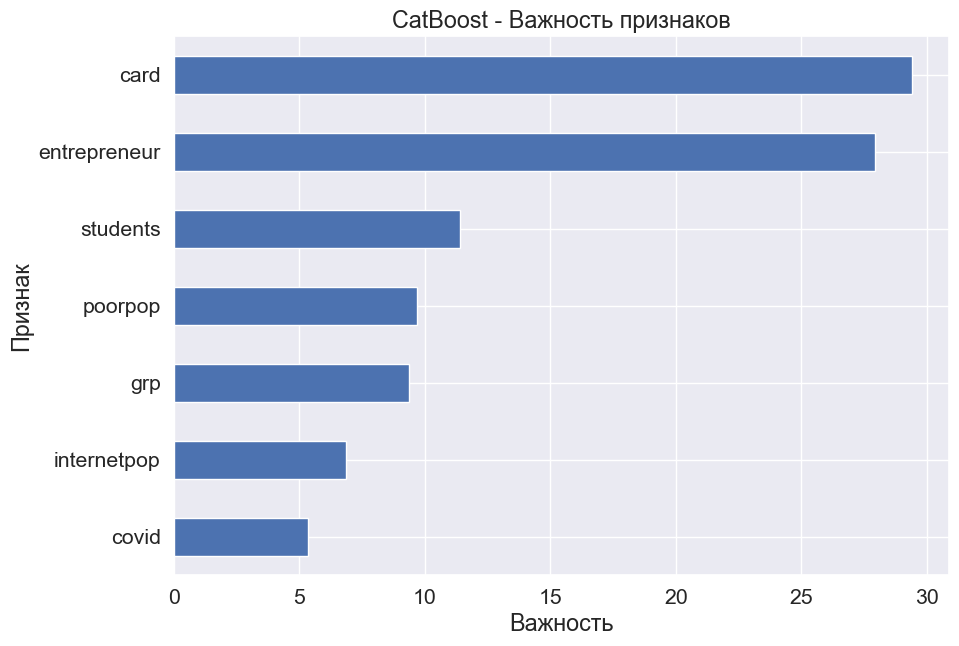

In [96]:
#Важность признаков в модели CatBoost
fea_imp1 = pd.DataFrame({'imp': model1.feature_importances_, 'col': X_train1.columns})
fea_imp1 = fea_imp1.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
fea_imp1.plot(kind='barh', x='col', y='imp', figsize=(10, 7), legend=None)
plt.title('CatBoost - Важность признаков')
plt.ylabel('Признак')
plt.xlabel('Важность')
print(fea_imp1)

**Улучшение модели. Подбор гиперпараметров через CatBoost grid_search. Модель №2**

In [97]:
#Подбор через CatBoost grid_search

grid = [{
    "depth": np.arange(3,12,1),
    "learning_rate": [0.001,0.01,0.03,0.1,0.5]
}]

grid_model = CatBoostRegressor(loss_function = 'RMSE', verbose = False, early_stopping_rounds=20,cat_features=categorical_features_indices1)

grid_search_result = grid_model.grid_search(grid,
                                       X=X_train1,
                                       y=y_train,
                                       plot=True,
                                       cv=5,
                                       refit=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 11691.09203
bestIteration = 999

0:	loss: 11691.0920349	best: 11691.0920349 (0)	total: 568ms	remaining: 25s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 6736.074602
bestIteration = 446

1:	loss: 6736.0746023	best: 6736.0746023 (1)	total: 804ms	remaining: 17.3s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 6683.518083
bestIteration = 158

2:	loss: 6683.5180833	best: 6683.5180833 (2)	total: 893ms	remaining: 12.5s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 7236.171291
bestIteration = 47

3:	loss: 7236.1712912	best: 6683.5180833 (2)	total: 931ms	remaining: 9.54s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 5779.631979
bestIteration = 206

4:	loss: 5779.6319791	best: 5779.6319791 (4)	total: 1.07s	remaining: 8.61s

bestTest = 11639.63746
bestIteration = 999

5:	loss: 11639.6374605	best: 5779.6319791 (4)	total: 1.97s	remaining: 12.8s
Stopped by overfitting detector  (20 iterations wait)

bestTest 

In [98]:
grid_search_result

{'params': {'depth': 7, 'learning_rate': 0.5},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
    

In [99]:
model2=CatBoostRegressor(iterations=5000, depth=7, learning_rate=0.5, loss_function='RMSE', early_stopping_rounds=20)
model2.fit(X_train1, y_train, eval_set=(X_test1, y_test),cat_features=categorical_features_indices1, verbose=False, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [100]:
print(f'Модель обучена? {model2.is_fitted()}')
print(f'Номер лучшей итерации {model2.get_best_iteration()}')
print(f'Лучшие значения: {model2.get_best_score()}')

Модель обучена? True
Номер лучшей итерации 54
Лучшие значения: {'learn': {'RMSE': 482.2271045512825}, 'validation': {'RMSE': 18970.02736541794}}


In [101]:
y_pred_train2 = model2.predict(X_train1)
y_pred_test2 = model2.predict(X_test1)
print("TRAIN SMAPE:", smape(y_train, y_pred_train2))
print("MAE train:",mean_absolute_error(y_train, y_pred_train2))
print("RMSE train:",mean_squared_error(y_train, y_pred_train2))
print("MAPE train:",mean_absolute_percentage_error(y_train, y_pred_train2))
print("R2 Score train:",r2_score(y_train, y_pred_train2))

TRAIN SMAPE: 55.7586029347235
MAE train: 585.8895123559245
RMSE train: 650536.7041483981
MAPE train: 7.648627050106515e+16
R2 Score train: 0.9993686944594672


In [102]:
print("TEST SMAPE:", smape(y_test, y_pred_test2))
print("MAE test:",mean_absolute_error(y_test, y_pred_test2))
print("RMSE test:",mean_squared_error(y_test, y_pred_test2))
print("MAPE test:",mean_absolute_percentage_error(y_test, y_pred_test2))
print("R2 Score test:",r2_score(y_test, y_pred_test2))

TEST SMAPE: 63.02504143322614
MAE test: 8703.790224563525
RMSE test: 359861892.82382864
MAPE test: 0.7515920752910974
R2 Score test: 0.9288110873740713


In [103]:
#CV через библиотеку Sklearn
cv_score2 = cross_val_score (model2, X_train1, y_train,scoring = 'neg_root_mean_squared_error', cv=5 )
final_cv_score2 = round(np.mean(-cv_score2)**0.5,3)
print('RMSE модели через кросс-валидацию', final_cv_score2)

0:	learn: 29784.4236088	total: 6.22ms	remaining: 31.1s
1:	learn: 25369.7888607	total: 10.5ms	remaining: 26.3s
2:	learn: 21807.3806056	total: 15.1ms	remaining: 25.2s
3:	learn: 19158.3668008	total: 19.4ms	remaining: 24.2s
4:	learn: 17384.8106523	total: 20.3ms	remaining: 20.3s
5:	learn: 14333.3723036	total: 24.6ms	remaining: 20.4s
6:	learn: 13005.3910952	total: 25.2ms	remaining: 18s
7:	learn: 11867.8994461	total: 29.5ms	remaining: 18.4s
8:	learn: 10642.2983491	total: 34.5ms	remaining: 19.2s
9:	learn: 9660.3527303	total: 39ms	remaining: 19.4s
10:	learn: 9006.4730577	total: 42.9ms	remaining: 19.5s
11:	learn: 8239.9592393	total: 47ms	remaining: 19.5s
12:	learn: 7411.6592568	total: 52ms	remaining: 19.9s
13:	learn: 6601.7602675	total: 55.1ms	remaining: 19.6s
14:	learn: 5863.1987764	total: 57.9ms	remaining: 19.3s
15:	learn: 5546.1751447	total: 58.8ms	remaining: 18.3s
16:	learn: 5231.4561674	total: 59.6ms	remaining: 17.5s
17:	learn: 4757.5676326	total: 64.6ms	remaining: 17.9s
18:	learn: 4379.825

173:	learn: 55.8419092	total: 586ms	remaining: 16.3s
174:	learn: 55.6219254	total: 590ms	remaining: 16.3s
175:	learn: 53.5924002	total: 595ms	remaining: 16.3s
176:	learn: 53.1852653	total: 599ms	remaining: 16.3s
177:	learn: 52.9292955	total: 604ms	remaining: 16.4s
178:	learn: 52.2130224	total: 607ms	remaining: 16.3s
179:	learn: 52.1257675	total: 611ms	remaining: 16.4s
180:	learn: 50.7274098	total: 614ms	remaining: 16.3s
181:	learn: 50.4590717	total: 618ms	remaining: 16.4s
182:	learn: 49.2624748	total: 622ms	remaining: 16.4s
183:	learn: 47.8571923	total: 625ms	remaining: 16.4s
184:	learn: 46.7261559	total: 628ms	remaining: 16.4s
185:	learn: 46.0090460	total: 632ms	remaining: 16.4s
186:	learn: 44.4778964	total: 635ms	remaining: 16.4s
187:	learn: 43.7020432	total: 639ms	remaining: 16.4s
188:	learn: 43.5596459	total: 642ms	remaining: 16.4s
189:	learn: 42.0521205	total: 646ms	remaining: 16.3s
190:	learn: 41.7104047	total: 650ms	remaining: 16.4s
191:	learn: 41.3431224	total: 654ms	remaining:

344:	learn: 4.4278659	total: 1.17s	remaining: 15.8s
345:	learn: 4.3454435	total: 1.17s	remaining: 15.8s
346:	learn: 4.3341196	total: 1.18s	remaining: 15.8s
347:	learn: 4.3225297	total: 1.18s	remaining: 15.8s
348:	learn: 4.2674049	total: 1.18s	remaining: 15.8s
349:	learn: 4.1358406	total: 1.19s	remaining: 15.8s
350:	learn: 4.1222202	total: 1.19s	remaining: 15.8s
351:	learn: 4.0801786	total: 1.2s	remaining: 15.8s
352:	learn: 3.9406684	total: 1.2s	remaining: 15.8s
353:	learn: 3.9252556	total: 1.2s	remaining: 15.8s
354:	learn: 3.8509037	total: 1.2s	remaining: 15.8s
355:	learn: 3.8227564	total: 1.21s	remaining: 15.8s
356:	learn: 3.7743605	total: 1.21s	remaining: 15.8s
357:	learn: 3.7371131	total: 1.21s	remaining: 15.7s
358:	learn: 3.6878737	total: 1.22s	remaining: 15.7s
359:	learn: 3.6415616	total: 1.22s	remaining: 15.7s
360:	learn: 3.5748374	total: 1.22s	remaining: 15.7s
361:	learn: 3.5239357	total: 1.23s	remaining: 15.7s
362:	learn: 3.4803138	total: 1.23s	remaining: 15.7s
363:	learn: 3.45

531:	learn: 0.3688294	total: 1.75s	remaining: 14.7s
532:	learn: 0.3600302	total: 1.75s	remaining: 14.7s
533:	learn: 0.3523537	total: 1.75s	remaining: 14.7s
534:	learn: 0.3504731	total: 1.76s	remaining: 14.7s
535:	learn: 0.3391333	total: 1.76s	remaining: 14.7s
536:	learn: 0.3324955	total: 1.77s	remaining: 14.7s
537:	learn: 0.3302086	total: 1.77s	remaining: 14.7s
538:	learn: 0.3299124	total: 1.77s	remaining: 14.7s
539:	learn: 0.3197338	total: 1.78s	remaining: 14.7s
540:	learn: 0.3124584	total: 1.78s	remaining: 14.7s
541:	learn: 0.3106559	total: 1.78s	remaining: 14.7s
542:	learn: 0.3081183	total: 1.79s	remaining: 14.7s
543:	learn: 0.3068517	total: 1.79s	remaining: 14.7s
544:	learn: 0.2998892	total: 1.79s	remaining: 14.7s
545:	learn: 0.2925039	total: 1.8s	remaining: 14.7s
546:	learn: 0.2856240	total: 1.8s	remaining: 14.7s
547:	learn: 0.2853216	total: 1.8s	remaining: 14.6s
548:	learn: 0.2798089	total: 1.8s	remaining: 14.6s
549:	learn: 0.2759943	total: 1.81s	remaining: 14.6s
550:	learn: 0.26

727:	learn: 0.0253965	total: 2.33s	remaining: 13.7s
728:	learn: 0.0247320	total: 2.34s	remaining: 13.7s
729:	learn: 0.0245717	total: 2.34s	remaining: 13.7s
730:	learn: 0.0242928	total: 2.34s	remaining: 13.7s
731:	learn: 0.0238790	total: 2.35s	remaining: 13.7s
732:	learn: 0.0238167	total: 2.35s	remaining: 13.7s
733:	learn: 0.0234188	total: 2.35s	remaining: 13.7s
734:	learn: 0.0232214	total: 2.36s	remaining: 13.7s
735:	learn: 0.0229130	total: 2.36s	remaining: 13.7s
736:	learn: 0.0228989	total: 2.36s	remaining: 13.7s
737:	learn: 0.0228646	total: 2.37s	remaining: 13.7s
738:	learn: 0.0223318	total: 2.37s	remaining: 13.7s
739:	learn: 0.0222825	total: 2.38s	remaining: 13.7s
740:	learn: 0.0217273	total: 2.38s	remaining: 13.7s
741:	learn: 0.0213447	total: 2.39s	remaining: 13.7s
742:	learn: 0.0211665	total: 2.39s	remaining: 13.7s
743:	learn: 0.0209508	total: 2.39s	remaining: 13.7s
744:	learn: 0.0205621	total: 2.4s	remaining: 13.7s
745:	learn: 0.0205368	total: 2.4s	remaining: 13.7s
746:	learn: 0.

908:	learn: 0.0023158	total: 2.92s	remaining: 13.1s
909:	learn: 0.0022746	total: 2.92s	remaining: 13.1s
910:	learn: 0.0022503	total: 2.92s	remaining: 13.1s
911:	learn: 0.0022222	total: 2.93s	remaining: 13.1s
912:	learn: 0.0022013	total: 2.93s	remaining: 13.1s
913:	learn: 0.0021605	total: 2.93s	remaining: 13.1s
914:	learn: 0.0021303	total: 2.93s	remaining: 13.1s
915:	learn: 0.0021186	total: 2.94s	remaining: 13.1s
916:	learn: 0.0020931	total: 2.94s	remaining: 13.1s
917:	learn: 0.0020310	total: 2.94s	remaining: 13.1s
918:	learn: 0.0019893	total: 2.94s	remaining: 13.1s
919:	learn: 0.0019441	total: 2.95s	remaining: 13.1s
920:	learn: 0.0019269	total: 2.95s	remaining: 13.1s
921:	learn: 0.0019078	total: 2.95s	remaining: 13.1s
922:	learn: 0.0019034	total: 2.96s	remaining: 13.1s
923:	learn: 0.0018453	total: 2.96s	remaining: 13.1s
924:	learn: 0.0018417	total: 2.96s	remaining: 13.1s
925:	learn: 0.0018111	total: 2.97s	remaining: 13s
926:	learn: 0.0017954	total: 2.97s	remaining: 13s
927:	learn: 0.00

1115:	learn: 0.0001557	total: 3.5s	remaining: 12.2s
1116:	learn: 0.0001543	total: 3.5s	remaining: 12.2s
1117:	learn: 0.0001512	total: 3.5s	remaining: 12.2s
1118:	learn: 0.0001486	total: 3.51s	remaining: 12.2s
1119:	learn: 0.0001464	total: 3.51s	remaining: 12.2s
1120:	learn: 0.0001461	total: 3.52s	remaining: 12.2s
1121:	learn: 0.0001455	total: 3.52s	remaining: 12.2s
1122:	learn: 0.0001437	total: 3.52s	remaining: 12.2s
1123:	learn: 0.0001425	total: 3.52s	remaining: 12.2s
1124:	learn: 0.0001402	total: 3.53s	remaining: 12.1s
1125:	learn: 0.0001374	total: 3.53s	remaining: 12.1s
1126:	learn: 0.0001369	total: 3.53s	remaining: 12.1s
1127:	learn: 0.0001330	total: 3.54s	remaining: 12.1s
1128:	learn: 0.0001327	total: 3.54s	remaining: 12.1s
1129:	learn: 0.0001296	total: 3.54s	remaining: 12.1s
1130:	learn: 0.0001289	total: 3.54s	remaining: 12.1s
1131:	learn: 0.0001280	total: 3.55s	remaining: 12.1s
1132:	learn: 0.0001270	total: 3.55s	remaining: 12.1s
1133:	learn: 0.0001242	total: 3.55s	remaining: 12

1295:	learn: 0.0000138	total: 4.08s	remaining: 11.7s
1296:	learn: 0.0000138	total: 4.09s	remaining: 11.7s
1297:	learn: 0.0000137	total: 4.09s	remaining: 11.7s
1298:	learn: 0.0000135	total: 4.09s	remaining: 11.7s
1299:	learn: 0.0000134	total: 4.1s	remaining: 11.7s
1300:	learn: 0.0000134	total: 4.1s	remaining: 11.7s
1301:	learn: 0.0000130	total: 4.1s	remaining: 11.7s
1302:	learn: 0.0000128	total: 4.11s	remaining: 11.6s
1303:	learn: 0.0000126	total: 4.11s	remaining: 11.6s
1304:	learn: 0.0000124	total: 4.11s	remaining: 11.6s
1305:	learn: 0.0000121	total: 4.11s	remaining: 11.6s
1306:	learn: 0.0000117	total: 4.12s	remaining: 11.6s
1307:	learn: 0.0000115	total: 4.12s	remaining: 11.6s
1308:	learn: 0.0000113	total: 4.12s	remaining: 11.6s
1309:	learn: 0.0000111	total: 4.13s	remaining: 11.6s
1310:	learn: 0.0000109	total: 4.13s	remaining: 11.6s
1311:	learn: 0.0000108	total: 4.13s	remaining: 11.6s
1312:	learn: 0.0000108	total: 4.13s	remaining: 11.6s
1313:	learn: 0.0000106	total: 4.14s	remaining: 11

1473:	learn: 0.0000016	total: 4.67s	remaining: 11.2s
1474:	learn: 0.0000016	total: 4.67s	remaining: 11.2s
1475:	learn: 0.0000015	total: 4.68s	remaining: 11.2s
1476:	learn: 0.0000015	total: 4.68s	remaining: 11.2s
1477:	learn: 0.0000015	total: 4.69s	remaining: 11.2s
1478:	learn: 0.0000014	total: 4.69s	remaining: 11.2s
1479:	learn: 0.0000014	total: 4.7s	remaining: 11.2s
1480:	learn: 0.0000014	total: 4.7s	remaining: 11.2s
1481:	learn: 0.0000013	total: 4.7s	remaining: 11.2s
1482:	learn: 0.0000013	total: 4.71s	remaining: 11.2s
1483:	learn: 0.0000013	total: 4.71s	remaining: 11.2s
1484:	learn: 0.0000013	total: 4.71s	remaining: 11.2s
1485:	learn: 0.0000013	total: 4.71s	remaining: 11.1s
1486:	learn: 0.0000013	total: 4.72s	remaining: 11.1s
1487:	learn: 0.0000012	total: 4.72s	remaining: 11.1s
1488:	learn: 0.0000012	total: 4.72s	remaining: 11.1s
1489:	learn: 0.0000012	total: 4.73s	remaining: 11.1s
1490:	learn: 0.0000012	total: 4.73s	remaining: 11.1s
1491:	learn: 0.0000012	total: 4.73s	remaining: 11

1663:	learn: 0.0000001	total: 5.25s	remaining: 10.5s
1664:	learn: 0.0000001	total: 5.26s	remaining: 10.5s
1665:	learn: 0.0000001	total: 5.26s	remaining: 10.5s
1666:	learn: 0.0000001	total: 5.26s	remaining: 10.5s
1667:	learn: 0.0000001	total: 5.27s	remaining: 10.5s
1668:	learn: 0.0000001	total: 5.27s	remaining: 10.5s
1669:	learn: 0.0000001	total: 5.27s	remaining: 10.5s
1670:	learn: 0.0000001	total: 5.27s	remaining: 10.5s
1671:	learn: 0.0000001	total: 5.28s	remaining: 10.5s
1672:	learn: 0.0000001	total: 5.28s	remaining: 10.5s
1673:	learn: 0.0000001	total: 5.28s	remaining: 10.5s
1674:	learn: 0.0000001	total: 5.29s	remaining: 10.5s
1675:	learn: 0.0000001	total: 5.29s	remaining: 10.5s
1676:	learn: 0.0000001	total: 5.29s	remaining: 10.5s
1677:	learn: 0.0000001	total: 5.29s	remaining: 10.5s
1678:	learn: 0.0000001	total: 5.3s	remaining: 10.5s
1679:	learn: 0.0000001	total: 5.3s	remaining: 10.5s
1680:	learn: 0.0000001	total: 5.3s	remaining: 10.5s
1681:	learn: 0.0000001	total: 5.3s	remaining: 10.

1853:	learn: 0.0000000	total: 5.83s	remaining: 9.9s
1854:	learn: 0.0000000	total: 5.84s	remaining: 9.9s
1855:	learn: 0.0000000	total: 5.84s	remaining: 9.89s
1856:	learn: 0.0000000	total: 5.84s	remaining: 9.89s
1857:	learn: 0.0000000	total: 5.85s	remaining: 9.89s
1858:	learn: 0.0000000	total: 5.85s	remaining: 9.88s
1859:	learn: 0.0000000	total: 5.85s	remaining: 9.88s
1860:	learn: 0.0000000	total: 5.86s	remaining: 9.88s
1861:	learn: 0.0000000	total: 5.86s	remaining: 9.88s
1862:	learn: 0.0000000	total: 5.87s	remaining: 9.88s
1863:	learn: 0.0000000	total: 5.87s	remaining: 9.87s
1864:	learn: 0.0000000	total: 5.87s	remaining: 9.87s
1865:	learn: 0.0000000	total: 5.87s	remaining: 9.87s
1866:	learn: 0.0000000	total: 5.88s	remaining: 9.86s
1867:	learn: 0.0000000	total: 5.88s	remaining: 9.86s
1868:	learn: 0.0000000	total: 5.88s	remaining: 9.85s
1869:	learn: 0.0000000	total: 5.88s	remaining: 9.85s
1870:	learn: 0.0000000	total: 5.89s	remaining: 9.85s
1871:	learn: 0.0000000	total: 5.89s	remaining: 9

2051:	learn: 0.0000000	total: 6.41s	remaining: 9.21s
2052:	learn: 0.0000000	total: 6.42s	remaining: 9.21s
2053:	learn: 0.0000000	total: 6.42s	remaining: 9.21s
2054:	learn: 0.0000000	total: 6.42s	remaining: 9.2s
2055:	learn: 0.0000000	total: 6.43s	remaining: 9.2s
2056:	learn: 0.0000000	total: 6.43s	remaining: 9.2s
2057:	learn: 0.0000000	total: 6.43s	remaining: 9.2s
2058:	learn: 0.0000000	total: 6.44s	remaining: 9.19s
2059:	learn: 0.0000000	total: 6.44s	remaining: 9.19s
2060:	learn: 0.0000000	total: 6.44s	remaining: 9.19s
2061:	learn: 0.0000000	total: 6.45s	remaining: 9.18s
2062:	learn: 0.0000000	total: 6.45s	remaining: 9.18s
2063:	learn: 0.0000000	total: 6.45s	remaining: 9.18s
2064:	learn: 0.0000000	total: 6.45s	remaining: 9.17s
2065:	learn: 0.0000000	total: 6.46s	remaining: 9.17s
2066:	learn: 0.0000000	total: 6.46s	remaining: 9.16s
2067:	learn: 0.0000000	total: 6.46s	remaining: 9.16s
2068:	learn: 0.0000000	total: 6.46s	remaining: 9.16s
2069:	learn: 0.0000000	total: 6.47s	remaining: 9.1

2261:	learn: 0.0000000	total: 6.99s	remaining: 8.46s
2262:	learn: 0.0000000	total: 6.99s	remaining: 8.45s
2263:	learn: 0.0000000	total: 6.99s	remaining: 8.45s
2264:	learn: 0.0000000	total: 7s	remaining: 8.45s
2265:	learn: 0.0000000	total: 7s	remaining: 8.45s
2266:	learn: 0.0000000	total: 7s	remaining: 8.44s
2267:	learn: 0.0000000	total: 7s	remaining: 8.44s
2268:	learn: 0.0000000	total: 7.01s	remaining: 8.43s
2269:	learn: 0.0000000	total: 7.01s	remaining: 8.43s
2270:	learn: 0.0000000	total: 7.01s	remaining: 8.43s
2271:	learn: 0.0000000	total: 7.01s	remaining: 8.42s
2272:	learn: 0.0000000	total: 7.02s	remaining: 8.42s
2273:	learn: 0.0000000	total: 7.02s	remaining: 8.41s
2274:	learn: 0.0000000	total: 7.02s	remaining: 8.41s
2275:	learn: 0.0000000	total: 7.02s	remaining: 8.4s
2276:	learn: 0.0000000	total: 7.03s	remaining: 8.4s
2277:	learn: 0.0000000	total: 7.03s	remaining: 8.4s
2278:	learn: 0.0000000	total: 7.03s	remaining: 8.39s
2279:	learn: 0.0000000	total: 7.03s	remaining: 8.39s
2280:	le

2451:	learn: 0.0000000	total: 7.37s	remaining: 7.66s
2452:	learn: 0.0000000	total: 7.37s	remaining: 7.65s
2453:	learn: 0.0000000	total: 7.37s	remaining: 7.65s
2454:	learn: 0.0000000	total: 7.37s	remaining: 7.64s
2455:	learn: 0.0000000	total: 7.37s	remaining: 7.64s
2456:	learn: 0.0000000	total: 7.38s	remaining: 7.64s
2457:	learn: 0.0000000	total: 7.38s	remaining: 7.63s
2458:	learn: 0.0000000	total: 7.38s	remaining: 7.63s
2459:	learn: 0.0000000	total: 7.38s	remaining: 7.62s
2460:	learn: 0.0000000	total: 7.38s	remaining: 7.62s
2461:	learn: 0.0000000	total: 7.38s	remaining: 7.61s
2462:	learn: 0.0000000	total: 7.38s	remaining: 7.61s
2463:	learn: 0.0000000	total: 7.39s	remaining: 7.6s
2464:	learn: 0.0000000	total: 7.39s	remaining: 7.6s
2465:	learn: 0.0000000	total: 7.39s	remaining: 7.59s
2466:	learn: 0.0000000	total: 7.39s	remaining: 7.59s
2467:	learn: 0.0000000	total: 7.39s	remaining: 7.58s
2468:	learn: 0.0000000	total: 7.39s	remaining: 7.58s
2469:	learn: 0.0000000	total: 7.39s	remaining: 7

2664:	learn: 0.0000000	total: 7.75s	remaining: 6.79s
2665:	learn: 0.0000000	total: 7.75s	remaining: 6.78s
2666:	learn: 0.0000000	total: 7.75s	remaining: 6.78s
2667:	learn: 0.0000000	total: 7.75s	remaining: 6.78s
2668:	learn: 0.0000000	total: 7.75s	remaining: 6.77s
2669:	learn: 0.0000000	total: 7.76s	remaining: 6.77s
2670:	learn: 0.0000000	total: 7.76s	remaining: 6.76s
2671:	learn: 0.0000000	total: 7.76s	remaining: 6.76s
2672:	learn: 0.0000000	total: 7.76s	remaining: 6.76s
2673:	learn: 0.0000000	total: 7.76s	remaining: 6.75s
2674:	learn: 0.0000000	total: 7.77s	remaining: 6.75s
2675:	learn: 0.0000000	total: 7.77s	remaining: 6.75s
2676:	learn: 0.0000000	total: 7.77s	remaining: 6.74s
2677:	learn: 0.0000000	total: 7.77s	remaining: 6.74s
2678:	learn: 0.0000000	total: 7.78s	remaining: 6.74s
2679:	learn: 0.0000000	total: 7.78s	remaining: 6.73s
2680:	learn: 0.0000000	total: 7.78s	remaining: 6.73s
2681:	learn: 0.0000000	total: 7.78s	remaining: 6.73s
2682:	learn: 0.0000000	total: 7.79s	remaining:

2845:	learn: 0.0000000	total: 8.12s	remaining: 6.15s
2846:	learn: 0.0000000	total: 8.12s	remaining: 6.14s
2847:	learn: 0.0000000	total: 8.13s	remaining: 6.14s
2848:	learn: 0.0000000	total: 8.13s	remaining: 6.14s
2849:	learn: 0.0000000	total: 8.13s	remaining: 6.13s
2850:	learn: 0.0000000	total: 8.13s	remaining: 6.13s
2851:	learn: 0.0000000	total: 8.13s	remaining: 6.13s
2852:	learn: 0.0000000	total: 8.14s	remaining: 6.13s
2853:	learn: 0.0000000	total: 8.14s	remaining: 6.12s
2854:	learn: 0.0000000	total: 8.15s	remaining: 6.12s
2855:	learn: 0.0000000	total: 8.15s	remaining: 6.12s
2856:	learn: 0.0000000	total: 8.15s	remaining: 6.12s
2857:	learn: 0.0000000	total: 8.15s	remaining: 6.11s
2858:	learn: 0.0000000	total: 8.16s	remaining: 6.11s
2859:	learn: 0.0000000	total: 8.16s	remaining: 6.11s
2860:	learn: 0.0000000	total: 8.16s	remaining: 6.1s
2861:	learn: 0.0000000	total: 8.16s	remaining: 6.1s
2862:	learn: 0.0000000	total: 8.17s	remaining: 6.1s
2863:	learn: 0.0000000	total: 8.17s	remaining: 6.

3052:	learn: 0.0000000	total: 8.49s	remaining: 5.42s
3053:	learn: 0.0000000	total: 8.5s	remaining: 5.42s
3054:	learn: 0.0000000	total: 8.5s	remaining: 5.41s
3055:	learn: 0.0000000	total: 8.51s	remaining: 5.41s
3056:	learn: 0.0000000	total: 8.51s	remaining: 5.41s
3057:	learn: 0.0000000	total: 8.51s	remaining: 5.4s
3058:	learn: 0.0000000	total: 8.51s	remaining: 5.4s
3059:	learn: 0.0000000	total: 8.51s	remaining: 5.4s
3060:	learn: 0.0000000	total: 8.52s	remaining: 5.39s
3061:	learn: 0.0000000	total: 8.52s	remaining: 5.39s
3062:	learn: 0.0000000	total: 8.52s	remaining: 5.39s
3063:	learn: 0.0000000	total: 8.52s	remaining: 5.38s
3064:	learn: 0.0000000	total: 8.52s	remaining: 5.38s
3065:	learn: 0.0000000	total: 8.52s	remaining: 5.38s
3066:	learn: 0.0000000	total: 8.53s	remaining: 5.37s
3067:	learn: 0.0000000	total: 8.53s	remaining: 5.37s
3068:	learn: 0.0000000	total: 8.53s	remaining: 5.37s
3069:	learn: 0.0000000	total: 8.53s	remaining: 5.36s
3070:	learn: 0.0000000	total: 8.53s	remaining: 5.36

3275:	learn: 0.0000000	total: 8.87s	remaining: 4.67s
3276:	learn: 0.0000000	total: 8.87s	remaining: 4.67s
3277:	learn: 0.0000000	total: 8.88s	remaining: 4.66s
3278:	learn: 0.0000000	total: 8.88s	remaining: 4.66s
3279:	learn: 0.0000000	total: 8.88s	remaining: 4.66s
3280:	learn: 0.0000000	total: 8.89s	remaining: 4.66s
3281:	learn: 0.0000000	total: 8.89s	remaining: 4.65s
3282:	learn: 0.0000000	total: 8.89s	remaining: 4.65s
3283:	learn: 0.0000000	total: 8.89s	remaining: 4.64s
3284:	learn: 0.0000000	total: 8.89s	remaining: 4.64s
3285:	learn: 0.0000000	total: 8.9s	remaining: 4.64s
3286:	learn: 0.0000000	total: 8.9s	remaining: 4.64s
3287:	learn: 0.0000000	total: 8.9s	remaining: 4.63s
3288:	learn: 0.0000000	total: 8.9s	remaining: 4.63s
3289:	learn: 0.0000000	total: 8.9s	remaining: 4.63s
3290:	learn: 0.0000000	total: 8.9s	remaining: 4.62s
3291:	learn: 0.0000000	total: 8.9s	remaining: 4.62s
3292:	learn: 0.0000000	total: 8.9s	remaining: 4.62s
3293:	learn: 0.0000000	total: 8.91s	remaining: 4.61s
3

3512:	learn: 0.0000000	total: 9.25s	remaining: 3.91s
3513:	learn: 0.0000000	total: 9.25s	remaining: 3.91s
3514:	learn: 0.0000000	total: 9.25s	remaining: 3.91s
3515:	learn: 0.0000000	total: 9.25s	remaining: 3.9s
3516:	learn: 0.0000000	total: 9.25s	remaining: 3.9s
3517:	learn: 0.0000000	total: 9.25s	remaining: 3.9s
3518:	learn: 0.0000000	total: 9.25s	remaining: 3.89s
3519:	learn: 0.0000000	total: 9.26s	remaining: 3.89s
3520:	learn: 0.0000000	total: 9.26s	remaining: 3.89s
3521:	learn: 0.0000000	total: 9.26s	remaining: 3.88s
3522:	learn: 0.0000000	total: 9.26s	remaining: 3.88s
3523:	learn: 0.0000000	total: 9.26s	remaining: 3.88s
3524:	learn: 0.0000000	total: 9.26s	remaining: 3.88s
3525:	learn: 0.0000000	total: 9.27s	remaining: 3.87s
3526:	learn: 0.0000000	total: 9.27s	remaining: 3.87s
3527:	learn: 0.0000000	total: 9.27s	remaining: 3.87s
3528:	learn: 0.0000000	total: 9.27s	remaining: 3.87s
3529:	learn: 0.0000000	total: 9.27s	remaining: 3.86s
3530:	learn: 0.0000000	total: 9.27s	remaining: 3.

3749:	learn: 0.0000000	total: 9.62s	remaining: 3.21s
3750:	learn: 0.0000000	total: 9.63s	remaining: 3.21s
3751:	learn: 0.0000000	total: 9.63s	remaining: 3.2s
3752:	learn: 0.0000000	total: 9.63s	remaining: 3.2s
3753:	learn: 0.0000000	total: 9.63s	remaining: 3.2s
3754:	learn: 0.0000000	total: 9.63s	remaining: 3.19s
3755:	learn: 0.0000000	total: 9.63s	remaining: 3.19s
3756:	learn: 0.0000000	total: 9.64s	remaining: 3.19s
3757:	learn: 0.0000000	total: 9.64s	remaining: 3.19s
3758:	learn: 0.0000000	total: 9.64s	remaining: 3.18s
3759:	learn: 0.0000000	total: 9.64s	remaining: 3.18s
3760:	learn: 0.0000000	total: 9.64s	remaining: 3.17s
3761:	learn: 0.0000000	total: 9.64s	remaining: 3.17s
3762:	learn: 0.0000000	total: 9.64s	remaining: 3.17s
3763:	learn: 0.0000000	total: 9.64s	remaining: 3.17s
3764:	learn: 0.0000000	total: 9.64s	remaining: 3.16s
3765:	learn: 0.0000000	total: 9.65s	remaining: 3.16s
3766:	learn: 0.0000000	total: 9.65s	remaining: 3.16s
3767:	learn: 0.0000000	total: 9.65s	remaining: 3.

3965:	learn: 0.0000000	total: 10s	remaining: 2.61s
3966:	learn: 0.0000000	total: 10s	remaining: 2.6s
3967:	learn: 0.0000000	total: 10s	remaining: 2.6s
3968:	learn: 0.0000000	total: 10s	remaining: 2.6s
3969:	learn: 0.0000000	total: 10s	remaining: 2.6s
3970:	learn: 0.0000000	total: 10s	remaining: 2.59s
3971:	learn: 0.0000000	total: 10s	remaining: 2.59s
3972:	learn: 0.0000000	total: 10s	remaining: 2.59s
3973:	learn: 0.0000000	total: 10s	remaining: 2.58s
3974:	learn: 0.0000000	total: 10s	remaining: 2.58s
3975:	learn: 0.0000000	total: 10s	remaining: 2.58s
3976:	learn: 0.0000000	total: 10s	remaining: 2.58s
3977:	learn: 0.0000000	total: 10s	remaining: 2.57s
3978:	learn: 0.0000000	total: 10s	remaining: 2.57s
3979:	learn: 0.0000000	total: 10s	remaining: 2.57s
3980:	learn: 0.0000000	total: 10s	remaining: 2.57s
3981:	learn: 0.0000000	total: 10s	remaining: 2.56s
3982:	learn: 0.0000000	total: 10s	remaining: 2.56s
3983:	learn: 0.0000000	total: 10s	remaining: 2.56s
3984:	learn: 0.0000000	total: 10s	r

4188:	learn: 0.0000000	total: 10.4s	remaining: 2.01s
4189:	learn: 0.0000000	total: 10.4s	remaining: 2.01s
4190:	learn: 0.0000000	total: 10.4s	remaining: 2s
4191:	learn: 0.0000000	total: 10.4s	remaining: 2s
4192:	learn: 0.0000000	total: 10.4s	remaining: 2s
4193:	learn: 0.0000000	total: 10.4s	remaining: 2s
4194:	learn: 0.0000000	total: 10.4s	remaining: 1.99s
4195:	learn: 0.0000000	total: 10.4s	remaining: 1.99s
4196:	learn: 0.0000000	total: 10.4s	remaining: 1.99s
4197:	learn: 0.0000000	total: 10.4s	remaining: 1.99s
4198:	learn: 0.0000000	total: 10.4s	remaining: 1.98s
4199:	learn: 0.0000000	total: 10.4s	remaining: 1.98s
4200:	learn: 0.0000000	total: 10.4s	remaining: 1.98s
4201:	learn: 0.0000000	total: 10.4s	remaining: 1.97s
4202:	learn: 0.0000000	total: 10.4s	remaining: 1.97s
4203:	learn: 0.0000000	total: 10.4s	remaining: 1.97s
4204:	learn: 0.0000000	total: 10.4s	remaining: 1.97s
4205:	learn: 0.0000000	total: 10.4s	remaining: 1.96s
4206:	learn: 0.0000000	total: 10.4s	remaining: 1.96s
4207:

4434:	learn: 0.0000000	total: 10.8s	remaining: 1.37s
4435:	learn: 0.0000000	total: 10.8s	remaining: 1.37s
4436:	learn: 0.0000000	total: 10.8s	remaining: 1.36s
4437:	learn: 0.0000000	total: 10.8s	remaining: 1.36s
4438:	learn: 0.0000000	total: 10.8s	remaining: 1.36s
4439:	learn: 0.0000000	total: 10.8s	remaining: 1.36s
4440:	learn: 0.0000000	total: 10.8s	remaining: 1.35s
4441:	learn: 0.0000000	total: 10.8s	remaining: 1.35s
4442:	learn: 0.0000000	total: 10.8s	remaining: 1.35s
4443:	learn: 0.0000000	total: 10.8s	remaining: 1.35s
4444:	learn: 0.0000000	total: 10.8s	remaining: 1.34s
4445:	learn: 0.0000000	total: 10.8s	remaining: 1.34s
4446:	learn: 0.0000000	total: 10.8s	remaining: 1.34s
4447:	learn: 0.0000000	total: 10.8s	remaining: 1.34s
4448:	learn: 0.0000000	total: 10.8s	remaining: 1.33s
4449:	learn: 0.0000000	total: 10.8s	remaining: 1.33s
4450:	learn: 0.0000000	total: 10.8s	remaining: 1.33s
4451:	learn: 0.0000000	total: 10.8s	remaining: 1.33s
4452:	learn: 0.0000000	total: 10.8s	remaining:

4673:	learn: 0.0000000	total: 11.1s	remaining: 776ms
4674:	learn: 0.0000000	total: 11.1s	remaining: 774ms
4675:	learn: 0.0000000	total: 11.1s	remaining: 771ms
4676:	learn: 0.0000000	total: 11.1s	remaining: 769ms
4677:	learn: 0.0000000	total: 11.1s	remaining: 766ms
4678:	learn: 0.0000000	total: 11.1s	remaining: 764ms
4679:	learn: 0.0000000	total: 11.1s	remaining: 761ms
4680:	learn: 0.0000000	total: 11.1s	remaining: 759ms
4681:	learn: 0.0000000	total: 11.1s	remaining: 756ms
4682:	learn: 0.0000000	total: 11.1s	remaining: 754ms
4683:	learn: 0.0000000	total: 11.1s	remaining: 751ms
4684:	learn: 0.0000000	total: 11.1s	remaining: 749ms
4685:	learn: 0.0000000	total: 11.1s	remaining: 747ms
4686:	learn: 0.0000000	total: 11.1s	remaining: 744ms
4687:	learn: 0.0000000	total: 11.1s	remaining: 742ms
4688:	learn: 0.0000000	total: 11.1s	remaining: 739ms
4689:	learn: 0.0000000	total: 11.1s	remaining: 737ms
4690:	learn: 0.0000000	total: 11.1s	remaining: 734ms
4691:	learn: 0.0000000	total: 11.2s	remaining:

4938:	learn: 0.0000000	total: 11.5s	remaining: 142ms
4939:	learn: 0.0000000	total: 11.5s	remaining: 140ms
4940:	learn: 0.0000000	total: 11.5s	remaining: 137ms
4941:	learn: 0.0000000	total: 11.5s	remaining: 135ms
4942:	learn: 0.0000000	total: 11.5s	remaining: 133ms
4943:	learn: 0.0000000	total: 11.5s	remaining: 130ms
4944:	learn: 0.0000000	total: 11.5s	remaining: 128ms
4945:	learn: 0.0000000	total: 11.5s	remaining: 126ms
4946:	learn: 0.0000000	total: 11.5s	remaining: 123ms
4947:	learn: 0.0000000	total: 11.5s	remaining: 121ms
4948:	learn: 0.0000000	total: 11.5s	remaining: 119ms
4949:	learn: 0.0000000	total: 11.5s	remaining: 116ms
4950:	learn: 0.0000000	total: 11.5s	remaining: 114ms
4951:	learn: 0.0000000	total: 11.5s	remaining: 112ms
4952:	learn: 0.0000000	total: 11.5s	remaining: 109ms
4953:	learn: 0.0000000	total: 11.5s	remaining: 107ms
4954:	learn: 0.0000000	total: 11.5s	remaining: 105ms
4955:	learn: 0.0000000	total: 11.5s	remaining: 102ms
4956:	learn: 0.0000000	total: 11.5s	remaining:

154:	learn: 77.4005123	total: 389ms	remaining: 12.1s
155:	learn: 76.4011389	total: 392ms	remaining: 12.2s
156:	learn: 75.6613923	total: 395ms	remaining: 12.2s
157:	learn: 75.0883715	total: 398ms	remaining: 12.2s
158:	learn: 73.9309078	total: 401ms	remaining: 12.2s
159:	learn: 71.2304798	total: 403ms	remaining: 12.2s
160:	learn: 70.8303885	total: 406ms	remaining: 12.2s
161:	learn: 70.0428791	total: 409ms	remaining: 12.2s
162:	learn: 68.1047364	total: 412ms	remaining: 12.2s
163:	learn: 65.5385211	total: 414ms	remaining: 12.2s
164:	learn: 64.1636729	total: 417ms	remaining: 12.2s
165:	learn: 63.7977029	total: 420ms	remaining: 12.2s
166:	learn: 62.4236781	total: 422ms	remaining: 12.2s
167:	learn: 61.5298659	total: 425ms	remaining: 12.2s
168:	learn: 60.2080001	total: 427ms	remaining: 12.2s
169:	learn: 59.2858531	total: 430ms	remaining: 12.2s
170:	learn: 57.8503439	total: 433ms	remaining: 12.2s
171:	learn: 56.7336762	total: 436ms	remaining: 12.2s
172:	learn: 56.4775327	total: 439ms	remaining:

314:	learn: 6.2543632	total: 1s	remaining: 14.9s
315:	learn: 6.1892775	total: 1.01s	remaining: 14.9s
316:	learn: 6.0952404	total: 1.01s	remaining: 14.9s
317:	learn: 6.0119048	total: 1.01s	remaining: 14.9s
318:	learn: 5.9248153	total: 1.02s	remaining: 14.9s
319:	learn: 5.7560819	total: 1.02s	remaining: 14.9s
320:	learn: 5.6225990	total: 1.02s	remaining: 14.9s
321:	learn: 5.5540889	total: 1.02s	remaining: 14.9s
322:	learn: 5.5388768	total: 1.03s	remaining: 14.9s
323:	learn: 5.3768720	total: 1.03s	remaining: 14.9s
324:	learn: 5.3159818	total: 1.03s	remaining: 14.9s
325:	learn: 5.2589405	total: 1.04s	remaining: 14.9s
326:	learn: 5.1571856	total: 1.04s	remaining: 14.8s
327:	learn: 5.1344295	total: 1.04s	remaining: 14.8s
328:	learn: 5.0602006	total: 1.04s	remaining: 14.8s
329:	learn: 5.0189134	total: 1.05s	remaining: 14.8s
330:	learn: 4.9377794	total: 1.05s	remaining: 14.8s
331:	learn: 4.9073027	total: 1.05s	remaining: 14.8s
332:	learn: 4.8786835	total: 1.05s	remaining: 14.8s
333:	learn: 4.8

528:	learn: 0.3919139	total: 1.59s	remaining: 13.5s
529:	learn: 0.3860247	total: 1.59s	remaining: 13.5s
530:	learn: 0.3751053	total: 1.6s	remaining: 13.4s
531:	learn: 0.3723092	total: 1.6s	remaining: 13.4s
532:	learn: 0.3682554	total: 1.6s	remaining: 13.4s
533:	learn: 0.3674279	total: 1.61s	remaining: 13.4s
534:	learn: 0.3583158	total: 1.61s	remaining: 13.4s
535:	learn: 0.3571703	total: 1.61s	remaining: 13.4s
536:	learn: 0.3543538	total: 1.61s	remaining: 13.4s
537:	learn: 0.3441573	total: 1.62s	remaining: 13.4s
538:	learn: 0.3408157	total: 1.62s	remaining: 13.4s
539:	learn: 0.3395767	total: 1.62s	remaining: 13.4s
540:	learn: 0.3330704	total: 1.63s	remaining: 13.4s
541:	learn: 0.3251127	total: 1.63s	remaining: 13.4s
542:	learn: 0.3190257	total: 1.63s	remaining: 13.4s
543:	learn: 0.3142866	total: 1.63s	remaining: 13.4s
544:	learn: 0.3130835	total: 1.64s	remaining: 13.4s
545:	learn: 0.3124694	total: 1.64s	remaining: 13.4s
546:	learn: 0.3078066	total: 1.64s	remaining: 13.4s
547:	learn: 0.3

716:	learn: 0.0323584	total: 2.16s	remaining: 12.9s
717:	learn: 0.0316464	total: 2.16s	remaining: 12.9s
718:	learn: 0.0309232	total: 2.17s	remaining: 12.9s
719:	learn: 0.0300793	total: 2.17s	remaining: 12.9s
720:	learn: 0.0300394	total: 2.17s	remaining: 12.9s
721:	learn: 0.0292663	total: 2.18s	remaining: 12.9s
722:	learn: 0.0287993	total: 2.18s	remaining: 12.9s
723:	learn: 0.0287143	total: 2.18s	remaining: 12.9s
724:	learn: 0.0286775	total: 2.18s	remaining: 12.9s
725:	learn: 0.0286464	total: 2.19s	remaining: 12.9s
726:	learn: 0.0283116	total: 2.19s	remaining: 12.9s
727:	learn: 0.0276868	total: 2.19s	remaining: 12.9s
728:	learn: 0.0274225	total: 2.19s	remaining: 12.9s
729:	learn: 0.0269252	total: 2.2s	remaining: 12.9s
730:	learn: 0.0265785	total: 2.2s	remaining: 12.8s
731:	learn: 0.0263579	total: 2.2s	remaining: 12.8s
732:	learn: 0.0258289	total: 2.21s	remaining: 12.8s
733:	learn: 0.0254403	total: 2.21s	remaining: 12.8s
734:	learn: 0.0253685	total: 2.21s	remaining: 12.8s
735:	learn: 0.0

922:	learn: 0.0022612	total: 2.74s	remaining: 12.1s
923:	learn: 0.0022378	total: 2.74s	remaining: 12.1s
924:	learn: 0.0022269	total: 2.74s	remaining: 12.1s
925:	learn: 0.0021901	total: 2.75s	remaining: 12.1s
926:	learn: 0.0021287	total: 2.75s	remaining: 12.1s
927:	learn: 0.0021222	total: 2.75s	remaining: 12.1s
928:	learn: 0.0020842	total: 2.75s	remaining: 12.1s
929:	learn: 0.0020807	total: 2.76s	remaining: 12.1s
930:	learn: 0.0020342	total: 2.76s	remaining: 12.1s
931:	learn: 0.0020276	total: 2.76s	remaining: 12.1s
932:	learn: 0.0019906	total: 2.77s	remaining: 12.1s
933:	learn: 0.0019759	total: 2.77s	remaining: 12.1s
934:	learn: 0.0019642	total: 2.77s	remaining: 12s
935:	learn: 0.0019122	total: 2.77s	remaining: 12s
936:	learn: 0.0019090	total: 2.78s	remaining: 12s
937:	learn: 0.0018839	total: 2.78s	remaining: 12s
938:	learn: 0.0018769	total: 2.78s	remaining: 12s
939:	learn: 0.0018541	total: 2.78s	remaining: 12s
940:	learn: 0.0018404	total: 2.79s	remaining: 12s
941:	learn: 0.0018360	tota

1113:	learn: 0.0002205	total: 3.31s	remaining: 11.6s
1114:	learn: 0.0002185	total: 3.32s	remaining: 11.6s
1115:	learn: 0.0002171	total: 3.32s	remaining: 11.6s
1116:	learn: 0.0002148	total: 3.33s	remaining: 11.6s
1117:	learn: 0.0002121	total: 3.33s	remaining: 11.6s
1118:	learn: 0.0002107	total: 3.33s	remaining: 11.6s
1119:	learn: 0.0002099	total: 3.33s	remaining: 11.6s
1120:	learn: 0.0002050	total: 3.34s	remaining: 11.6s
1121:	learn: 0.0002040	total: 3.34s	remaining: 11.5s
1122:	learn: 0.0001986	total: 3.34s	remaining: 11.5s
1123:	learn: 0.0001945	total: 3.35s	remaining: 11.5s
1124:	learn: 0.0001908	total: 3.35s	remaining: 11.5s
1125:	learn: 0.0001874	total: 3.35s	remaining: 11.5s
1126:	learn: 0.0001844	total: 3.36s	remaining: 11.5s
1127:	learn: 0.0001820	total: 3.36s	remaining: 11.5s
1128:	learn: 0.0001811	total: 3.36s	remaining: 11.5s
1129:	learn: 0.0001797	total: 3.37s	remaining: 11.5s
1130:	learn: 0.0001789	total: 3.37s	remaining: 11.5s
1131:	learn: 0.0001743	total: 3.37s	remaining:

1287:	learn: 0.0000248	total: 3.89s	remaining: 11.2s
1288:	learn: 0.0000246	total: 3.89s	remaining: 11.2s
1289:	learn: 0.0000243	total: 3.89s	remaining: 11.2s
1290:	learn: 0.0000242	total: 3.9s	remaining: 11.2s
1291:	learn: 0.0000237	total: 3.9s	remaining: 11.2s
1292:	learn: 0.0000235	total: 3.9s	remaining: 11.2s
1293:	learn: 0.0000229	total: 3.91s	remaining: 11.2s
1294:	learn: 0.0000222	total: 3.91s	remaining: 11.2s
1295:	learn: 0.0000213	total: 3.91s	remaining: 11.2s
1296:	learn: 0.0000210	total: 3.92s	remaining: 11.2s
1297:	learn: 0.0000206	total: 3.92s	remaining: 11.2s
1298:	learn: 0.0000205	total: 3.92s	remaining: 11.2s
1299:	learn: 0.0000203	total: 3.93s	remaining: 11.2s
1300:	learn: 0.0000198	total: 3.93s	remaining: 11.2s
1301:	learn: 0.0000195	total: 3.93s	remaining: 11.2s
1302:	learn: 0.0000194	total: 3.94s	remaining: 11.2s
1303:	learn: 0.0000189	total: 3.94s	remaining: 11.2s
1304:	learn: 0.0000187	total: 3.94s	remaining: 11.2s
1305:	learn: 0.0000186	total: 3.94s	remaining: 11

1461:	learn: 0.0000029	total: 4.46s	remaining: 10.8s
1462:	learn: 0.0000029	total: 4.46s	remaining: 10.8s
1463:	learn: 0.0000029	total: 4.47s	remaining: 10.8s
1464:	learn: 0.0000029	total: 4.47s	remaining: 10.8s
1465:	learn: 0.0000028	total: 4.47s	remaining: 10.8s
1466:	learn: 0.0000028	total: 4.47s	remaining: 10.8s
1467:	learn: 0.0000027	total: 4.48s	remaining: 10.8s
1468:	learn: 0.0000027	total: 4.48s	remaining: 10.8s
1469:	learn: 0.0000026	total: 4.48s	remaining: 10.8s
1470:	learn: 0.0000026	total: 4.49s	remaining: 10.8s
1471:	learn: 0.0000026	total: 4.49s	remaining: 10.8s
1472:	learn: 0.0000026	total: 4.49s	remaining: 10.8s
1473:	learn: 0.0000026	total: 4.5s	remaining: 10.8s
1474:	learn: 0.0000026	total: 4.5s	remaining: 10.8s
1475:	learn: 0.0000025	total: 4.5s	remaining: 10.7s
1476:	learn: 0.0000025	total: 4.5s	remaining: 10.7s
1477:	learn: 0.0000025	total: 4.51s	remaining: 10.7s
1478:	learn: 0.0000024	total: 4.51s	remaining: 10.7s
1479:	learn: 0.0000024	total: 4.51s	remaining: 10.

1670:	learn: 0.0000002	total: 5.04s	remaining: 10s
1671:	learn: 0.0000002	total: 5.04s	remaining: 10s
1672:	learn: 0.0000002	total: 5.04s	remaining: 10s
1673:	learn: 0.0000002	total: 5.05s	remaining: 10s
1674:	learn: 0.0000002	total: 5.05s	remaining: 10s
1675:	learn: 0.0000002	total: 5.05s	remaining: 10s
1676:	learn: 0.0000002	total: 5.05s	remaining: 10s
1677:	learn: 0.0000002	total: 5.06s	remaining: 10s
1678:	learn: 0.0000002	total: 5.06s	remaining: 10s
1679:	learn: 0.0000002	total: 5.06s	remaining: 10s
1680:	learn: 0.0000002	total: 5.07s	remaining: 10s
1681:	learn: 0.0000002	total: 5.07s	remaining: 10s
1682:	learn: 0.0000002	total: 5.07s	remaining: 9.99s
1683:	learn: 0.0000002	total: 5.07s	remaining: 9.99s
1684:	learn: 0.0000002	total: 5.08s	remaining: 9.99s
1685:	learn: 0.0000002	total: 5.08s	remaining: 9.98s
1686:	learn: 0.0000002	total: 5.08s	remaining: 9.98s
1687:	learn: 0.0000002	total: 5.08s	remaining: 9.98s
1688:	learn: 0.0000002	total: 5.09s	remaining: 9.97s
1689:	learn: 0.00

1880:	learn: 0.0000000	total: 5.62s	remaining: 9.31s
1881:	learn: 0.0000000	total: 5.62s	remaining: 9.31s
1882:	learn: 0.0000000	total: 5.62s	remaining: 9.3s
1883:	learn: 0.0000000	total: 5.62s	remaining: 9.3s
1884:	learn: 0.0000000	total: 5.63s	remaining: 9.3s
1885:	learn: 0.0000000	total: 5.63s	remaining: 9.29s
1886:	learn: 0.0000000	total: 5.63s	remaining: 9.29s
1887:	learn: 0.0000000	total: 5.63s	remaining: 9.29s
1888:	learn: 0.0000000	total: 5.64s	remaining: 9.28s
1889:	learn: 0.0000000	total: 5.64s	remaining: 9.28s
1890:	learn: 0.0000000	total: 5.64s	remaining: 9.28s
1891:	learn: 0.0000000	total: 5.64s	remaining: 9.27s
1892:	learn: 0.0000000	total: 5.65s	remaining: 9.27s
1893:	learn: 0.0000000	total: 5.65s	remaining: 9.27s
1894:	learn: 0.0000000	total: 5.65s	remaining: 9.26s
1895:	learn: 0.0000000	total: 5.66s	remaining: 9.26s
1896:	learn: 0.0000000	total: 5.66s	remaining: 9.26s
1897:	learn: 0.0000000	total: 5.66s	remaining: 9.25s
1898:	learn: 0.0000000	total: 5.66s	remaining: 9.

2086:	learn: 0.0000000	total: 6.19s	remaining: 8.64s
2087:	learn: 0.0000000	total: 6.2s	remaining: 8.64s
2088:	learn: 0.0000000	total: 6.2s	remaining: 8.64s
2089:	learn: 0.0000000	total: 6.2s	remaining: 8.63s
2090:	learn: 0.0000000	total: 6.2s	remaining: 8.63s
2091:	learn: 0.0000000	total: 6.21s	remaining: 8.63s
2092:	learn: 0.0000000	total: 6.21s	remaining: 8.62s
2093:	learn: 0.0000000	total: 6.21s	remaining: 8.62s
2094:	learn: 0.0000000	total: 6.21s	remaining: 8.62s
2095:	learn: 0.0000000	total: 6.22s	remaining: 8.61s
2096:	learn: 0.0000000	total: 6.22s	remaining: 8.61s
2097:	learn: 0.0000000	total: 6.22s	remaining: 8.61s
2098:	learn: 0.0000000	total: 6.22s	remaining: 8.6s
2099:	learn: 0.0000000	total: 6.23s	remaining: 8.6s
2100:	learn: 0.0000000	total: 6.23s	remaining: 8.6s
2101:	learn: 0.0000000	total: 6.23s	remaining: 8.59s
2102:	learn: 0.0000000	total: 6.24s	remaining: 8.59s
2103:	learn: 0.0000000	total: 6.24s	remaining: 8.59s
2104:	learn: 0.0000000	total: 6.24s	remaining: 8.58s


2292:	learn: 0.0000000	total: 6.77s	remaining: 7.99s
2293:	learn: 0.0000000	total: 6.77s	remaining: 7.99s
2294:	learn: 0.0000000	total: 6.78s	remaining: 7.99s
2295:	learn: 0.0000000	total: 6.78s	remaining: 7.98s
2296:	learn: 0.0000000	total: 6.78s	remaining: 7.98s
2297:	learn: 0.0000000	total: 6.78s	remaining: 7.97s
2298:	learn: 0.0000000	total: 6.79s	remaining: 7.97s
2299:	learn: 0.0000000	total: 6.79s	remaining: 7.97s
2300:	learn: 0.0000000	total: 6.79s	remaining: 7.96s
2301:	learn: 0.0000000	total: 6.79s	remaining: 7.96s
2302:	learn: 0.0000000	total: 6.79s	remaining: 7.96s
2303:	learn: 0.0000000	total: 6.8s	remaining: 7.95s
2304:	learn: 0.0000000	total: 6.8s	remaining: 7.95s
2305:	learn: 0.0000000	total: 6.8s	remaining: 7.95s
2306:	learn: 0.0000000	total: 6.81s	remaining: 7.95s
2307:	learn: 0.0000000	total: 6.81s	remaining: 7.94s
2308:	learn: 0.0000000	total: 6.81s	remaining: 7.94s
2309:	learn: 0.0000000	total: 6.81s	remaining: 7.93s
2310:	learn: 0.0000000	total: 6.82s	remaining: 7.

2512:	learn: 0.0000000	total: 7.34s	remaining: 7.27s
2513:	learn: 0.0000000	total: 7.34s	remaining: 7.26s
2514:	learn: 0.0000000	total: 7.35s	remaining: 7.26s
2515:	learn: 0.0000000	total: 7.35s	remaining: 7.25s
2516:	learn: 0.0000000	total: 7.35s	remaining: 7.25s
2517:	learn: 0.0000000	total: 7.35s	remaining: 7.25s
2518:	learn: 0.0000000	total: 7.36s	remaining: 7.25s
2519:	learn: 0.0000000	total: 7.36s	remaining: 7.24s
2520:	learn: 0.0000000	total: 7.36s	remaining: 7.24s
2521:	learn: 0.0000000	total: 7.37s	remaining: 7.24s
2522:	learn: 0.0000000	total: 7.37s	remaining: 7.23s
2523:	learn: 0.0000000	total: 7.37s	remaining: 7.23s
2524:	learn: 0.0000000	total: 7.37s	remaining: 7.22s
2525:	learn: 0.0000000	total: 7.37s	remaining: 7.22s
2526:	learn: 0.0000000	total: 7.38s	remaining: 7.22s
2527:	learn: 0.0000000	total: 7.38s	remaining: 7.21s
2528:	learn: 0.0000000	total: 7.38s	remaining: 7.21s
2529:	learn: 0.0000000	total: 7.38s	remaining: 7.21s
2530:	learn: 0.0000000	total: 7.39s	remaining:

2679:	learn: 0.0000000	total: 7.73s	remaining: 6.69s
2680:	learn: 0.0000000	total: 7.73s	remaining: 6.69s
2681:	learn: 0.0000000	total: 7.73s	remaining: 6.68s
2682:	learn: 0.0000000	total: 7.74s	remaining: 6.68s
2683:	learn: 0.0000000	total: 7.74s	remaining: 6.68s
2684:	learn: 0.0000000	total: 7.74s	remaining: 6.67s
2685:	learn: 0.0000000	total: 7.74s	remaining: 6.67s
2686:	learn: 0.0000000	total: 7.75s	remaining: 6.67s
2687:	learn: 0.0000000	total: 7.75s	remaining: 6.66s
2688:	learn: 0.0000000	total: 7.75s	remaining: 6.66s
2689:	learn: 0.0000000	total: 7.75s	remaining: 6.66s
2690:	learn: 0.0000000	total: 7.75s	remaining: 6.65s
2691:	learn: 0.0000000	total: 7.75s	remaining: 6.65s
2692:	learn: 0.0000000	total: 7.76s	remaining: 6.64s
2693:	learn: 0.0000000	total: 7.76s	remaining: 6.64s
2694:	learn: 0.0000000	total: 7.76s	remaining: 6.64s
2695:	learn: 0.0000000	total: 7.76s	remaining: 6.63s
2696:	learn: 0.0000000	total: 7.77s	remaining: 6.63s
2697:	learn: 0.0000000	total: 7.77s	remaining:

2843:	learn: 0.0000000	total: 8.11s	remaining: 6.15s
2844:	learn: 0.0000000	total: 8.11s	remaining: 6.15s
2845:	learn: 0.0000000	total: 8.12s	remaining: 6.14s
2846:	learn: 0.0000000	total: 8.12s	remaining: 6.14s
2847:	learn: 0.0000000	total: 8.12s	remaining: 6.13s
2848:	learn: 0.0000000	total: 8.12s	remaining: 6.13s
2849:	learn: 0.0000000	total: 8.12s	remaining: 6.13s
2850:	learn: 0.0000000	total: 8.12s	remaining: 6.12s
2851:	learn: 0.0000000	total: 8.13s	remaining: 6.12s
2852:	learn: 0.0000000	total: 8.13s	remaining: 6.12s
2853:	learn: 0.0000000	total: 8.13s	remaining: 6.11s
2854:	learn: 0.0000000	total: 8.13s	remaining: 6.11s
2855:	learn: 0.0000000	total: 8.13s	remaining: 6.11s
2856:	learn: 0.0000000	total: 8.14s	remaining: 6.1s
2857:	learn: 0.0000000	total: 8.14s	remaining: 6.1s
2858:	learn: 0.0000000	total: 8.14s	remaining: 6.1s
2859:	learn: 0.0000000	total: 8.14s	remaining: 6.09s
2860:	learn: 0.0000000	total: 8.15s	remaining: 6.09s
2861:	learn: 0.0000000	total: 8.15s	remaining: 6.

3016:	learn: 0.0000000	total: 8.49s	remaining: 5.58s
3017:	learn: 0.0000000	total: 8.49s	remaining: 5.58s
3018:	learn: 0.0000000	total: 8.49s	remaining: 5.57s
3019:	learn: 0.0000000	total: 8.49s	remaining: 5.57s
3020:	learn: 0.0000000	total: 8.5s	remaining: 5.57s
3021:	learn: 0.0000000	total: 8.5s	remaining: 5.56s
3022:	learn: 0.0000000	total: 8.5s	remaining: 5.56s
3023:	learn: 0.0000000	total: 8.5s	remaining: 5.56s
3024:	learn: 0.0000000	total: 8.51s	remaining: 5.55s
3025:	learn: 0.0000000	total: 8.51s	remaining: 5.55s
3026:	learn: 0.0000000	total: 8.51s	remaining: 5.55s
3027:	learn: 0.0000000	total: 8.52s	remaining: 5.54s
3028:	learn: 0.0000000	total: 8.52s	remaining: 5.54s
3029:	learn: 0.0000000	total: 8.52s	remaining: 5.54s
3030:	learn: 0.0000000	total: 8.52s	remaining: 5.53s
3031:	learn: 0.0000000	total: 8.52s	remaining: 5.53s
3032:	learn: 0.0000000	total: 8.52s	remaining: 5.53s
3033:	learn: 0.0000000	total: 8.53s	remaining: 5.53s
3034:	learn: 0.0000000	total: 8.53s	remaining: 5.5

3201:	learn: 0.0000000	total: 8.87s	remaining: 4.98s
3202:	learn: 0.0000000	total: 8.88s	remaining: 4.98s
3203:	learn: 0.0000000	total: 8.88s	remaining: 4.97s
3204:	learn: 0.0000000	total: 8.88s	remaining: 4.97s
3205:	learn: 0.0000000	total: 8.88s	remaining: 4.97s
3206:	learn: 0.0000000	total: 8.88s	remaining: 4.96s
3207:	learn: 0.0000000	total: 8.88s	remaining: 4.96s
3208:	learn: 0.0000000	total: 8.89s	remaining: 4.96s
3209:	learn: 0.0000000	total: 8.89s	remaining: 4.96s
3210:	learn: 0.0000000	total: 8.89s	remaining: 4.95s
3211:	learn: 0.0000000	total: 8.89s	remaining: 4.95s
3212:	learn: 0.0000000	total: 8.89s	remaining: 4.94s
3213:	learn: 0.0000000	total: 8.89s	remaining: 4.94s
3214:	learn: 0.0000000	total: 8.89s	remaining: 4.94s
3215:	learn: 0.0000000	total: 8.89s	remaining: 4.93s
3216:	learn: 0.0000000	total: 8.89s	remaining: 4.93s
3217:	learn: 0.0000000	total: 8.9s	remaining: 4.93s
3218:	learn: 0.0000000	total: 8.9s	remaining: 4.92s
3219:	learn: 0.0000000	total: 8.9s	remaining: 4.

3397:	learn: 0.0000000	total: 9.25s	remaining: 4.36s
3398:	learn: 0.0000000	total: 9.25s	remaining: 4.36s
3399:	learn: 0.0000000	total: 9.26s	remaining: 4.36s
3400:	learn: 0.0000000	total: 9.26s	remaining: 4.35s
3401:	learn: 0.0000000	total: 9.26s	remaining: 4.35s
3402:	learn: 0.0000000	total: 9.26s	remaining: 4.35s
3403:	learn: 0.0000000	total: 9.26s	remaining: 4.34s
3404:	learn: 0.0000000	total: 9.27s	remaining: 4.34s
3405:	learn: 0.0000000	total: 9.27s	remaining: 4.34s
3406:	learn: 0.0000000	total: 9.27s	remaining: 4.33s
3407:	learn: 0.0000000	total: 9.27s	remaining: 4.33s
3408:	learn: 0.0000000	total: 9.28s	remaining: 4.33s
3409:	learn: 0.0000000	total: 9.28s	remaining: 4.33s
3410:	learn: 0.0000000	total: 9.28s	remaining: 4.32s
3411:	learn: 0.0000000	total: 9.28s	remaining: 4.32s
3412:	learn: 0.0000000	total: 9.28s	remaining: 4.32s
3413:	learn: 0.0000000	total: 9.29s	remaining: 4.31s
3414:	learn: 0.0000000	total: 9.29s	remaining: 4.31s
3415:	learn: 0.0000000	total: 9.29s	remaining:

3598:	learn: 0.0000000	total: 9.63s	remaining: 3.75s
3599:	learn: 0.0000000	total: 9.63s	remaining: 3.75s
3600:	learn: 0.0000000	total: 9.63s	remaining: 3.74s
3601:	learn: 0.0000000	total: 9.64s	remaining: 3.74s
3602:	learn: 0.0000000	total: 9.64s	remaining: 3.74s
3603:	learn: 0.0000000	total: 9.64s	remaining: 3.73s
3604:	learn: 0.0000000	total: 9.64s	remaining: 3.73s
3605:	learn: 0.0000000	total: 9.64s	remaining: 3.73s
3606:	learn: 0.0000000	total: 9.64s	remaining: 3.72s
3607:	learn: 0.0000000	total: 9.65s	remaining: 3.72s
3608:	learn: 0.0000000	total: 9.65s	remaining: 3.72s
3609:	learn: 0.0000000	total: 9.65s	remaining: 3.71s
3610:	learn: 0.0000000	total: 9.65s	remaining: 3.71s
3611:	learn: 0.0000000	total: 9.65s	remaining: 3.71s
3612:	learn: 0.0000000	total: 9.66s	remaining: 3.71s
3613:	learn: 0.0000000	total: 9.66s	remaining: 3.7s
3614:	learn: 0.0000000	total: 9.66s	remaining: 3.7s
3615:	learn: 0.0000000	total: 9.66s	remaining: 3.7s
3616:	learn: 0.0000000	total: 9.66s	remaining: 3.

3797:	learn: 0.0000000	total: 10s	remaining: 3.17s
3798:	learn: 0.0000000	total: 10s	remaining: 3.17s
3799:	learn: 0.0000000	total: 10s	remaining: 3.16s
3800:	learn: 0.0000000	total: 10s	remaining: 3.16s
3801:	learn: 0.0000000	total: 10s	remaining: 3.16s
3802:	learn: 0.0000000	total: 10s	remaining: 3.15s
3803:	learn: 0.0000000	total: 10s	remaining: 3.15s
3804:	learn: 0.0000000	total: 10s	remaining: 3.15s
3805:	learn: 0.0000000	total: 10s	remaining: 3.15s
3806:	learn: 0.0000000	total: 10s	remaining: 3.14s
3807:	learn: 0.0000000	total: 10s	remaining: 3.14s
3808:	learn: 0.0000000	total: 10s	remaining: 3.14s
3809:	learn: 0.0000000	total: 10s	remaining: 3.13s
3810:	learn: 0.0000000	total: 10s	remaining: 3.13s
3811:	learn: 0.0000000	total: 10s	remaining: 3.13s
3812:	learn: 0.0000000	total: 10s	remaining: 3.13s
3813:	learn: 0.0000000	total: 10s	remaining: 3.12s
3814:	learn: 0.0000000	total: 10s	remaining: 3.12s
3815:	learn: 0.0000000	total: 10s	remaining: 3.12s
3816:	learn: 0.0000000	total: 1

3995:	learn: 0.0000000	total: 10.4s	remaining: 2.61s
3996:	learn: 0.0000000	total: 10.4s	remaining: 2.61s
3997:	learn: 0.0000000	total: 10.4s	remaining: 2.6s
3998:	learn: 0.0000000	total: 10.4s	remaining: 2.6s
3999:	learn: 0.0000000	total: 10.4s	remaining: 2.6s
4000:	learn: 0.0000000	total: 10.4s	remaining: 2.6s
4001:	learn: 0.0000000	total: 10.4s	remaining: 2.59s
4002:	learn: 0.0000000	total: 10.4s	remaining: 2.59s
4003:	learn: 0.0000000	total: 10.4s	remaining: 2.59s
4004:	learn: 0.0000000	total: 10.4s	remaining: 2.58s
4005:	learn: 0.0000000	total: 10.4s	remaining: 2.58s
4006:	learn: 0.0000000	total: 10.4s	remaining: 2.58s
4007:	learn: 0.0000000	total: 10.4s	remaining: 2.58s
4008:	learn: 0.0000000	total: 10.4s	remaining: 2.57s
4009:	learn: 0.0000000	total: 10.4s	remaining: 2.57s
4010:	learn: 0.0000000	total: 10.4s	remaining: 2.57s
4011:	learn: 0.0000000	total: 10.4s	remaining: 2.56s
4012:	learn: 0.0000000	total: 10.4s	remaining: 2.56s
4013:	learn: 0.0000000	total: 10.4s	remaining: 2.5

4194:	learn: 0.0000000	total: 10.8s	remaining: 2.07s
4195:	learn: 0.0000000	total: 10.8s	remaining: 2.06s
4196:	learn: 0.0000000	total: 10.8s	remaining: 2.06s
4197:	learn: 0.0000000	total: 10.8s	remaining: 2.06s
4198:	learn: 0.0000000	total: 10.8s	remaining: 2.06s
4199:	learn: 0.0000000	total: 10.8s	remaining: 2.05s
4200:	learn: 0.0000000	total: 10.8s	remaining: 2.05s
4201:	learn: 0.0000000	total: 10.8s	remaining: 2.05s
4202:	learn: 0.0000000	total: 10.8s	remaining: 2.04s
4203:	learn: 0.0000000	total: 10.8s	remaining: 2.04s
4204:	learn: 0.0000000	total: 10.8s	remaining: 2.04s
4205:	learn: 0.0000000	total: 10.8s	remaining: 2.04s
4206:	learn: 0.0000000	total: 10.8s	remaining: 2.03s
4207:	learn: 0.0000000	total: 10.8s	remaining: 2.03s
4208:	learn: 0.0000000	total: 10.8s	remaining: 2.03s
4209:	learn: 0.0000000	total: 10.8s	remaining: 2.03s
4210:	learn: 0.0000000	total: 10.8s	remaining: 2.02s
4211:	learn: 0.0000000	total: 10.8s	remaining: 2.02s
4212:	learn: 0.0000000	total: 10.8s	remaining:

4393:	learn: 0.0000000	total: 11.1s	remaining: 1.54s
4394:	learn: 0.0000000	total: 11.1s	remaining: 1.53s
4395:	learn: 0.0000000	total: 11.2s	remaining: 1.53s
4396:	learn: 0.0000000	total: 11.2s	remaining: 1.53s
4397:	learn: 0.0000000	total: 11.2s	remaining: 1.53s
4398:	learn: 0.0000000	total: 11.2s	remaining: 1.52s
4399:	learn: 0.0000000	total: 11.2s	remaining: 1.52s
4400:	learn: 0.0000000	total: 11.2s	remaining: 1.52s
4401:	learn: 0.0000000	total: 11.2s	remaining: 1.52s
4402:	learn: 0.0000000	total: 11.2s	remaining: 1.51s
4403:	learn: 0.0000000	total: 11.2s	remaining: 1.51s
4404:	learn: 0.0000000	total: 11.2s	remaining: 1.51s
4405:	learn: 0.0000000	total: 11.2s	remaining: 1.51s
4406:	learn: 0.0000000	total: 11.2s	remaining: 1.5s
4407:	learn: 0.0000000	total: 11.2s	remaining: 1.5s
4408:	learn: 0.0000000	total: 11.2s	remaining: 1.5s
4409:	learn: 0.0000000	total: 11.2s	remaining: 1.5s
4410:	learn: 0.0000000	total: 11.2s	remaining: 1.49s
4411:	learn: 0.0000000	total: 11.2s	remaining: 1.4

4604:	learn: 0.0000000	total: 11.5s	remaining: 989ms
4605:	learn: 0.0000000	total: 11.5s	remaining: 986ms
4606:	learn: 0.0000000	total: 11.5s	remaining: 984ms
4607:	learn: 0.0000000	total: 11.5s	remaining: 981ms
4608:	learn: 0.0000000	total: 11.5s	remaining: 978ms
4609:	learn: 0.0000000	total: 11.5s	remaining: 976ms
4610:	learn: 0.0000000	total: 11.5s	remaining: 973ms
4611:	learn: 0.0000000	total: 11.5s	remaining: 971ms
4612:	learn: 0.0000000	total: 11.5s	remaining: 968ms
4613:	learn: 0.0000000	total: 11.5s	remaining: 966ms
4614:	learn: 0.0000000	total: 11.5s	remaining: 963ms
4615:	learn: 0.0000000	total: 11.5s	remaining: 960ms
4616:	learn: 0.0000000	total: 11.5s	remaining: 958ms
4617:	learn: 0.0000000	total: 11.6s	remaining: 955ms
4618:	learn: 0.0000000	total: 11.6s	remaining: 953ms
4619:	learn: 0.0000000	total: 11.6s	remaining: 951ms
4620:	learn: 0.0000000	total: 11.6s	remaining: 948ms
4621:	learn: 0.0000000	total: 11.6s	remaining: 945ms
4622:	learn: 0.0000000	total: 11.6s	remaining:

4804:	learn: 0.0000000	total: 11.9s	remaining: 483ms
4805:	learn: 0.0000000	total: 11.9s	remaining: 481ms
4806:	learn: 0.0000000	total: 11.9s	remaining: 478ms
4807:	learn: 0.0000000	total: 11.9s	remaining: 476ms
4808:	learn: 0.0000000	total: 11.9s	remaining: 473ms
4809:	learn: 0.0000000	total: 11.9s	remaining: 471ms
4810:	learn: 0.0000000	total: 11.9s	remaining: 468ms
4811:	learn: 0.0000000	total: 11.9s	remaining: 466ms
4812:	learn: 0.0000000	total: 11.9s	remaining: 463ms
4813:	learn: 0.0000000	total: 11.9s	remaining: 461ms
4814:	learn: 0.0000000	total: 11.9s	remaining: 458ms
4815:	learn: 0.0000000	total: 11.9s	remaining: 456ms
4816:	learn: 0.0000000	total: 11.9s	remaining: 453ms
4817:	learn: 0.0000000	total: 11.9s	remaining: 451ms
4818:	learn: 0.0000000	total: 11.9s	remaining: 448ms
4819:	learn: 0.0000000	total: 11.9s	remaining: 446ms
4820:	learn: 0.0000000	total: 11.9s	remaining: 443ms
4821:	learn: 0.0000000	total: 11.9s	remaining: 441ms
4822:	learn: 0.0000000	total: 11.9s	remaining:

0:	learn: 7886.8632623	total: 1.99ms	remaining: 9.94s
1:	learn: 6359.9576166	total: 5.14ms	remaining: 12.8s
2:	learn: 5490.6989774	total: 7.82ms	remaining: 13s
3:	learn: 4935.4339635	total: 8.56ms	remaining: 10.7s
4:	learn: 4528.3298888	total: 9.6ms	remaining: 9.59s
5:	learn: 4034.3734883	total: 11.6ms	remaining: 9.62s
6:	learn: 3829.9854062	total: 12.7ms	remaining: 9.03s
7:	learn: 3478.7987471	total: 13.5ms	remaining: 8.44s
8:	learn: 3318.5425598	total: 14ms	remaining: 7.79s
9:	learn: 2805.4603226	total: 16.8ms	remaining: 8.36s
10:	learn: 2607.2430046	total: 19.6ms	remaining: 8.87s
11:	learn: 2254.8444425	total: 22.1ms	remaining: 9.2s
12:	learn: 2176.9598142	total: 24.9ms	remaining: 9.55s
13:	learn: 2037.6541410	total: 27.5ms	remaining: 9.8s
14:	learn: 1982.8123422	total: 29.2ms	remaining: 9.71s
15:	learn: 1931.4083232	total: 32ms	remaining: 9.98s
16:	learn: 1887.6468889	total: 34.6ms	remaining: 10.1s
17:	learn: 1673.4058250	total: 37.3ms	remaining: 10.3s
18:	learn: 1548.1447423	total

215:	learn: 21.0091389	total: 572ms	remaining: 12.7s
216:	learn: 20.4899103	total: 575ms	remaining: 12.7s
217:	learn: 20.0398150	total: 578ms	remaining: 12.7s
218:	learn: 19.5997772	total: 580ms	remaining: 12.7s
219:	learn: 19.3968593	total: 583ms	remaining: 12.7s
220:	learn: 18.6873644	total: 586ms	remaining: 12.7s
221:	learn: 18.3564750	total: 588ms	remaining: 12.7s
222:	learn: 17.8876932	total: 591ms	remaining: 12.7s
223:	learn: 17.5902441	total: 594ms	remaining: 12.7s
224:	learn: 17.2901238	total: 596ms	remaining: 12.7s
225:	learn: 17.1651188	total: 599ms	remaining: 12.6s
226:	learn: 16.9542427	total: 602ms	remaining: 12.6s
227:	learn: 16.8463587	total: 604ms	remaining: 12.6s
228:	learn: 16.7614735	total: 607ms	remaining: 12.6s
229:	learn: 16.6198843	total: 610ms	remaining: 12.6s
230:	learn: 16.3017360	total: 612ms	remaining: 12.6s
231:	learn: 15.9729976	total: 615ms	remaining: 12.6s
232:	learn: 15.8783285	total: 617ms	remaining: 12.6s
233:	learn: 15.4796139	total: 620ms	remaining:

430:	learn: 1.0135994	total: 1.15s	remaining: 12.2s
431:	learn: 0.9977401	total: 1.15s	remaining: 12.2s
432:	learn: 0.9732054	total: 1.16s	remaining: 12.2s
433:	learn: 0.9690806	total: 1.16s	remaining: 12.2s
434:	learn: 0.9591886	total: 1.16s	remaining: 12.2s
435:	learn: 0.9532496	total: 1.18s	remaining: 12.3s
436:	learn: 0.9377157	total: 1.18s	remaining: 12.3s
437:	learn: 0.9292187	total: 1.18s	remaining: 12.3s
438:	learn: 0.9082943	total: 1.19s	remaining: 12.3s
439:	learn: 0.8988551	total: 1.19s	remaining: 12.3s
440:	learn: 0.8941898	total: 1.19s	remaining: 12.3s
441:	learn: 0.8643037	total: 1.19s	remaining: 12.3s
442:	learn: 0.8536822	total: 1.2s	remaining: 12.3s
443:	learn: 0.8396121	total: 1.2s	remaining: 12.3s
444:	learn: 0.8375843	total: 1.2s	remaining: 12.3s
445:	learn: 0.8223010	total: 1.2s	remaining: 12.3s
446:	learn: 0.8145082	total: 1.21s	remaining: 12.3s
447:	learn: 0.7936110	total: 1.21s	remaining: 12.3s
448:	learn: 0.7797678	total: 1.21s	remaining: 12.3s
449:	learn: 0.77

640:	learn: 0.0805336	total: 1.73s	remaining: 11.7s
641:	learn: 0.0801262	total: 1.73s	remaining: 11.7s
642:	learn: 0.0781068	total: 1.73s	remaining: 11.7s
643:	learn: 0.0776001	total: 1.74s	remaining: 11.7s
644:	learn: 0.0761675	total: 1.74s	remaining: 11.7s
645:	learn: 0.0760815	total: 1.74s	remaining: 11.7s
646:	learn: 0.0750401	total: 1.74s	remaining: 11.7s
647:	learn: 0.0727696	total: 1.75s	remaining: 11.7s
648:	learn: 0.0722696	total: 1.75s	remaining: 11.7s
649:	learn: 0.0717341	total: 1.75s	remaining: 11.7s
650:	learn: 0.0700610	total: 1.75s	remaining: 11.7s
651:	learn: 0.0699864	total: 1.76s	remaining: 11.7s
652:	learn: 0.0686501	total: 1.76s	remaining: 11.7s
653:	learn: 0.0670290	total: 1.76s	remaining: 11.7s
654:	learn: 0.0661947	total: 1.76s	remaining: 11.7s
655:	learn: 0.0654210	total: 1.77s	remaining: 11.7s
656:	learn: 0.0649181	total: 1.77s	remaining: 11.7s
657:	learn: 0.0638924	total: 1.77s	remaining: 11.7s
658:	learn: 0.0627828	total: 1.77s	remaining: 11.7s
659:	learn: 

855:	learn: 0.0063634	total: 2.3s	remaining: 11.2s
856:	learn: 0.0063193	total: 2.31s	remaining: 11.2s
857:	learn: 0.0061944	total: 2.31s	remaining: 11.2s
858:	learn: 0.0060435	total: 2.31s	remaining: 11.1s
859:	learn: 0.0058053	total: 2.31s	remaining: 11.1s
860:	learn: 0.0057962	total: 2.32s	remaining: 11.1s
861:	learn: 0.0057830	total: 2.32s	remaining: 11.1s
862:	learn: 0.0056681	total: 2.32s	remaining: 11.1s
863:	learn: 0.0056576	total: 2.33s	remaining: 11.1s
864:	learn: 0.0055891	total: 2.33s	remaining: 11.1s
865:	learn: 0.0055663	total: 2.33s	remaining: 11.1s
866:	learn: 0.0055091	total: 2.33s	remaining: 11.1s
867:	learn: 0.0054133	total: 2.34s	remaining: 11.1s
868:	learn: 0.0052757	total: 2.34s	remaining: 11.1s
869:	learn: 0.0051664	total: 2.34s	remaining: 11.1s
870:	learn: 0.0051127	total: 2.35s	remaining: 11.1s
871:	learn: 0.0050930	total: 2.35s	remaining: 11.1s
872:	learn: 0.0050654	total: 2.35s	remaining: 11.1s
873:	learn: 0.0050492	total: 2.36s	remaining: 11.1s
874:	learn: 0

1066:	learn: 0.0004979	total: 2.88s	remaining: 10.6s
1067:	learn: 0.0004950	total: 2.88s	remaining: 10.6s
1068:	learn: 0.0004858	total: 2.88s	remaining: 10.6s
1069:	learn: 0.0004763	total: 2.89s	remaining: 10.6s
1070:	learn: 0.0004756	total: 2.89s	remaining: 10.6s
1071:	learn: 0.0004551	total: 2.89s	remaining: 10.6s
1072:	learn: 0.0004489	total: 2.9s	remaining: 10.6s
1073:	learn: 0.0004427	total: 2.9s	remaining: 10.6s
1074:	learn: 0.0004394	total: 2.9s	remaining: 10.6s
1075:	learn: 0.0004292	total: 2.9s	remaining: 10.6s
1076:	learn: 0.0004264	total: 2.91s	remaining: 10.6s
1077:	learn: 0.0004208	total: 2.91s	remaining: 10.6s
1078:	learn: 0.0004181	total: 2.91s	remaining: 10.6s
1079:	learn: 0.0004132	total: 2.91s	remaining: 10.6s
1080:	learn: 0.0004078	total: 2.92s	remaining: 10.6s
1081:	learn: 0.0004056	total: 2.92s	remaining: 10.6s
1082:	learn: 0.0004006	total: 2.92s	remaining: 10.6s
1083:	learn: 0.0004001	total: 2.92s	remaining: 10.6s
1084:	learn: 0.0003965	total: 2.93s	remaining: 10.

1280:	learn: 0.0000365	total: 3.46s	remaining: 10s
1281:	learn: 0.0000361	total: 3.46s	remaining: 10s
1282:	learn: 0.0000359	total: 3.46s	remaining: 10s
1283:	learn: 0.0000354	total: 3.46s	remaining: 10s
1284:	learn: 0.0000343	total: 3.47s	remaining: 10s
1285:	learn: 0.0000341	total: 3.47s	remaining: 10s
1286:	learn: 0.0000339	total: 3.47s	remaining: 10s
1287:	learn: 0.0000332	total: 3.48s	remaining: 10s
1288:	learn: 0.0000330	total: 3.48s	remaining: 10s
1289:	learn: 0.0000327	total: 3.48s	remaining: 10s
1290:	learn: 0.0000326	total: 3.48s	remaining: 10s
1291:	learn: 0.0000320	total: 3.49s	remaining: 10s
1292:	learn: 0.0000318	total: 3.49s	remaining: 10s
1293:	learn: 0.0000314	total: 3.49s	remaining: 10s
1294:	learn: 0.0000307	total: 3.49s	remaining: 10s
1295:	learn: 0.0000305	total: 3.5s	remaining: 9.99s
1296:	learn: 0.0000299	total: 3.5s	remaining: 9.99s
1297:	learn: 0.0000293	total: 3.5s	remaining: 9.99s
1298:	learn: 0.0000292	total: 3.5s	remaining: 9.98s
1299:	learn: 0.0000286	tota

1484:	learn: 0.0000031	total: 4.03s	remaining: 9.55s
1485:	learn: 0.0000031	total: 4.04s	remaining: 9.55s
1486:	learn: 0.0000030	total: 4.04s	remaining: 9.55s
1487:	learn: 0.0000030	total: 4.04s	remaining: 9.54s
1488:	learn: 0.0000030	total: 4.05s	remaining: 9.54s
1489:	learn: 0.0000030	total: 4.05s	remaining: 9.54s
1490:	learn: 0.0000030	total: 4.05s	remaining: 9.54s
1491:	learn: 0.0000029	total: 4.05s	remaining: 9.53s
1492:	learn: 0.0000028	total: 4.06s	remaining: 9.53s
1493:	learn: 0.0000028	total: 4.06s	remaining: 9.53s
1494:	learn: 0.0000028	total: 4.06s	remaining: 9.52s
1495:	learn: 0.0000027	total: 4.06s	remaining: 9.52s
1496:	learn: 0.0000027	total: 4.07s	remaining: 9.52s
1497:	learn: 0.0000027	total: 4.07s	remaining: 9.51s
1498:	learn: 0.0000027	total: 4.07s	remaining: 9.51s
1499:	learn: 0.0000026	total: 4.08s	remaining: 9.51s
1500:	learn: 0.0000026	total: 4.08s	remaining: 9.51s
1501:	learn: 0.0000026	total: 4.08s	remaining: 9.5s
1502:	learn: 0.0000025	total: 4.08s	remaining: 

1698:	learn: 0.0000002	total: 4.61s	remaining: 8.95s
1699:	learn: 0.0000002	total: 4.61s	remaining: 8.95s
1700:	learn: 0.0000002	total: 4.61s	remaining: 8.95s
1701:	learn: 0.0000002	total: 4.62s	remaining: 8.95s
1702:	learn: 0.0000002	total: 4.62s	remaining: 8.94s
1703:	learn: 0.0000002	total: 4.62s	remaining: 8.94s
1704:	learn: 0.0000002	total: 4.63s	remaining: 8.94s
1705:	learn: 0.0000002	total: 4.63s	remaining: 8.94s
1706:	learn: 0.0000002	total: 4.63s	remaining: 8.93s
1707:	learn: 0.0000002	total: 4.63s	remaining: 8.93s
1708:	learn: 0.0000002	total: 4.64s	remaining: 8.93s
1709:	learn: 0.0000002	total: 4.64s	remaining: 8.93s
1710:	learn: 0.0000002	total: 4.64s	remaining: 8.92s
1711:	learn: 0.0000002	total: 4.64s	remaining: 8.92s
1712:	learn: 0.0000002	total: 4.64s	remaining: 8.91s
1713:	learn: 0.0000002	total: 4.65s	remaining: 8.91s
1714:	learn: 0.0000002	total: 4.65s	remaining: 8.91s
1715:	learn: 0.0000002	total: 4.65s	remaining: 8.9s
1716:	learn: 0.0000002	total: 4.66s	remaining: 

1913:	learn: 0.0000000	total: 5.19s	remaining: 8.36s
1914:	learn: 0.0000000	total: 5.19s	remaining: 8.36s
1915:	learn: 0.0000000	total: 5.19s	remaining: 8.36s
1916:	learn: 0.0000000	total: 5.2s	remaining: 8.36s
1917:	learn: 0.0000000	total: 5.2s	remaining: 8.35s
1918:	learn: 0.0000000	total: 5.2s	remaining: 8.35s
1919:	learn: 0.0000000	total: 5.2s	remaining: 8.35s
1920:	learn: 0.0000000	total: 5.21s	remaining: 8.34s
1921:	learn: 0.0000000	total: 5.21s	remaining: 8.34s
1922:	learn: 0.0000000	total: 5.21s	remaining: 8.34s
1923:	learn: 0.0000000	total: 5.21s	remaining: 8.34s
1924:	learn: 0.0000000	total: 5.22s	remaining: 8.33s
1925:	learn: 0.0000000	total: 5.22s	remaining: 8.33s
1926:	learn: 0.0000000	total: 5.22s	remaining: 8.33s
1927:	learn: 0.0000000	total: 5.22s	remaining: 8.32s
1928:	learn: 0.0000000	total: 5.23s	remaining: 8.32s
1929:	learn: 0.0000000	total: 5.23s	remaining: 8.32s
1930:	learn: 0.0000000	total: 5.23s	remaining: 8.32s
1931:	learn: 0.0000000	total: 5.24s	remaining: 8.3

2126:	learn: 0.0000000	total: 5.76s	remaining: 7.79s
2127:	learn: 0.0000000	total: 5.77s	remaining: 7.78s
2128:	learn: 0.0000000	total: 5.77s	remaining: 7.78s
2129:	learn: 0.0000000	total: 5.77s	remaining: 7.78s
2130:	learn: 0.0000000	total: 5.78s	remaining: 7.78s
2131:	learn: 0.0000000	total: 5.78s	remaining: 7.77s
2132:	learn: 0.0000000	total: 5.78s	remaining: 7.77s
2133:	learn: 0.0000000	total: 5.78s	remaining: 7.77s
2134:	learn: 0.0000000	total: 5.79s	remaining: 7.76s
2135:	learn: 0.0000000	total: 5.79s	remaining: 7.76s
2136:	learn: 0.0000000	total: 5.79s	remaining: 7.76s
2137:	learn: 0.0000000	total: 5.79s	remaining: 7.76s
2138:	learn: 0.0000000	total: 5.8s	remaining: 7.75s
2139:	learn: 0.0000000	total: 5.8s	remaining: 7.75s
2140:	learn: 0.0000000	total: 5.8s	remaining: 7.75s
2141:	learn: 0.0000000	total: 5.8s	remaining: 7.75s
2142:	learn: 0.0000000	total: 5.81s	remaining: 7.74s
2143:	learn: 0.0000000	total: 5.81s	remaining: 7.74s
2144:	learn: 0.0000000	total: 5.81s	remaining: 7.7

2311:	learn: 0.0000000	total: 6.33s	remaining: 7.37s
2312:	learn: 0.0000000	total: 6.34s	remaining: 7.36s
2313:	learn: 0.0000000	total: 6.34s	remaining: 7.36s
2314:	learn: 0.0000000	total: 6.34s	remaining: 7.36s
2315:	learn: 0.0000000	total: 6.35s	remaining: 7.36s
2316:	learn: 0.0000000	total: 6.35s	remaining: 7.36s
2317:	learn: 0.0000000	total: 6.35s	remaining: 7.35s
2318:	learn: 0.0000000	total: 6.36s	remaining: 7.35s
2319:	learn: 0.0000000	total: 6.36s	remaining: 7.35s
2320:	learn: 0.0000000	total: 6.36s	remaining: 7.35s
2321:	learn: 0.0000000	total: 6.37s	remaining: 7.34s
2322:	learn: 0.0000000	total: 6.37s	remaining: 7.34s
2323:	learn: 0.0000000	total: 6.37s	remaining: 7.34s
2324:	learn: 0.0000000	total: 6.38s	remaining: 7.33s
2325:	learn: 0.0000000	total: 6.38s	remaining: 7.33s
2326:	learn: 0.0000000	total: 6.38s	remaining: 7.33s
2327:	learn: 0.0000000	total: 6.38s	remaining: 7.33s
2328:	learn: 0.0000000	total: 6.39s	remaining: 7.33s
2329:	learn: 0.0000000	total: 6.39s	remaining:

2491:	learn: 0.0000000	total: 6.91s	remaining: 6.95s
2492:	learn: 0.0000000	total: 6.91s	remaining: 6.95s
2493:	learn: 0.0000000	total: 6.92s	remaining: 6.95s
2494:	learn: 0.0000000	total: 6.92s	remaining: 6.95s
2495:	learn: 0.0000000	total: 6.92s	remaining: 6.95s
2496:	learn: 0.0000000	total: 6.93s	remaining: 6.94s
2497:	learn: 0.0000000	total: 6.93s	remaining: 6.94s
2498:	learn: 0.0000000	total: 6.93s	remaining: 6.94s
2499:	learn: 0.0000000	total: 6.94s	remaining: 6.94s
2500:	learn: 0.0000000	total: 6.94s	remaining: 6.93s
2501:	learn: 0.0000000	total: 6.94s	remaining: 6.93s
2502:	learn: 0.0000000	total: 6.95s	remaining: 6.93s
2503:	learn: 0.0000000	total: 6.95s	remaining: 6.93s
2504:	learn: 0.0000000	total: 6.95s	remaining: 6.92s
2505:	learn: 0.0000000	total: 6.95s	remaining: 6.92s
2506:	learn: 0.0000000	total: 6.96s	remaining: 6.92s
2507:	learn: 0.0000000	total: 6.96s	remaining: 6.92s
2508:	learn: 0.0000000	total: 6.96s	remaining: 6.91s
2509:	learn: 0.0000000	total: 6.97s	remaining:

2718:	learn: 0.0000000	total: 7.48s	remaining: 6.28s
2719:	learn: 0.0000000	total: 7.49s	remaining: 6.27s
2720:	learn: 0.0000000	total: 7.49s	remaining: 6.27s
2721:	learn: 0.0000000	total: 7.49s	remaining: 6.27s
2722:	learn: 0.0000000	total: 7.49s	remaining: 6.26s
2723:	learn: 0.0000000	total: 7.49s	remaining: 6.26s
2724:	learn: 0.0000000	total: 7.49s	remaining: 6.26s
2725:	learn: 0.0000000	total: 7.5s	remaining: 6.25s
2726:	learn: 0.0000000	total: 7.5s	remaining: 6.25s
2727:	learn: 0.0000000	total: 7.5s	remaining: 6.25s
2728:	learn: 0.0000000	total: 7.5s	remaining: 6.24s
2729:	learn: 0.0000000	total: 7.5s	remaining: 6.24s
2730:	learn: 0.0000000	total: 7.51s	remaining: 6.24s
2731:	learn: 0.0000000	total: 7.51s	remaining: 6.23s
2732:	learn: 0.0000000	total: 7.51s	remaining: 6.23s
2733:	learn: 0.0000000	total: 7.51s	remaining: 6.23s
2734:	learn: 0.0000000	total: 7.51s	remaining: 6.22s
2735:	learn: 0.0000000	total: 7.52s	remaining: 6.22s
2736:	learn: 0.0000000	total: 7.52s	remaining: 6.22

2907:	learn: 0.0000000	total: 7.86s	remaining: 5.66s
2908:	learn: 0.0000000	total: 7.86s	remaining: 5.65s
2909:	learn: 0.0000000	total: 7.87s	remaining: 5.65s
2910:	learn: 0.0000000	total: 7.87s	remaining: 5.65s
2911:	learn: 0.0000000	total: 7.87s	remaining: 5.64s
2912:	learn: 0.0000000	total: 7.87s	remaining: 5.64s
2913:	learn: 0.0000000	total: 7.88s	remaining: 5.64s
2914:	learn: 0.0000000	total: 7.88s	remaining: 5.63s
2915:	learn: 0.0000000	total: 7.88s	remaining: 5.63s
2916:	learn: 0.0000000	total: 7.88s	remaining: 5.63s
2917:	learn: 0.0000000	total: 7.88s	remaining: 5.63s
2918:	learn: 0.0000000	total: 7.89s	remaining: 5.62s
2919:	learn: 0.0000000	total: 7.89s	remaining: 5.62s
2920:	learn: 0.0000000	total: 7.89s	remaining: 5.62s
2921:	learn: 0.0000000	total: 7.89s	remaining: 5.61s
2922:	learn: 0.0000000	total: 7.89s	remaining: 5.61s
2923:	learn: 0.0000000	total: 7.9s	remaining: 5.61s
2924:	learn: 0.0000000	total: 7.9s	remaining: 5.6s
2925:	learn: 0.0000000	total: 7.9s	remaining: 5.6

3106:	learn: 0.0000000	total: 8.24s	remaining: 5.02s
3107:	learn: 0.0000000	total: 8.24s	remaining: 5.02s
3108:	learn: 0.0000000	total: 8.24s	remaining: 5.01s
3109:	learn: 0.0000000	total: 8.24s	remaining: 5.01s
3110:	learn: 0.0000000	total: 8.24s	remaining: 5.01s
3111:	learn: 0.0000000	total: 8.25s	remaining: 5s
3112:	learn: 0.0000000	total: 8.25s	remaining: 5s
3113:	learn: 0.0000000	total: 8.25s	remaining: 5s
3114:	learn: 0.0000000	total: 8.25s	remaining: 4.99s
3115:	learn: 0.0000000	total: 8.25s	remaining: 4.99s
3116:	learn: 0.0000000	total: 8.25s	remaining: 4.99s
3117:	learn: 0.0000000	total: 8.25s	remaining: 4.98s
3118:	learn: 0.0000000	total: 8.26s	remaining: 4.98s
3119:	learn: 0.0000000	total: 8.26s	remaining: 4.97s
3120:	learn: 0.0000000	total: 8.26s	remaining: 4.97s
3121:	learn: 0.0000000	total: 8.26s	remaining: 4.97s
3122:	learn: 0.0000000	total: 8.26s	remaining: 4.96s
3123:	learn: 0.0000000	total: 8.26s	remaining: 4.96s
3124:	learn: 0.0000000	total: 8.26s	remaining: 4.96s
31

3290:	learn: 0.0000000	total: 8.62s	remaining: 4.48s
3291:	learn: 0.0000000	total: 8.62s	remaining: 4.47s
3292:	learn: 0.0000000	total: 8.63s	remaining: 4.47s
3293:	learn: 0.0000000	total: 8.63s	remaining: 4.47s
3294:	learn: 0.0000000	total: 8.63s	remaining: 4.47s
3295:	learn: 0.0000000	total: 8.63s	remaining: 4.46s
3296:	learn: 0.0000000	total: 8.63s	remaining: 4.46s
3297:	learn: 0.0000000	total: 8.64s	remaining: 4.46s
3298:	learn: 0.0000000	total: 8.64s	remaining: 4.45s
3299:	learn: 0.0000000	total: 8.64s	remaining: 4.45s
3300:	learn: 0.0000000	total: 8.64s	remaining: 4.45s
3301:	learn: 0.0000000	total: 8.64s	remaining: 4.45s
3302:	learn: 0.0000000	total: 8.65s	remaining: 4.44s
3303:	learn: 0.0000000	total: 8.65s	remaining: 4.44s
3304:	learn: 0.0000000	total: 8.65s	remaining: 4.44s
3305:	learn: 0.0000000	total: 8.65s	remaining: 4.43s
3306:	learn: 0.0000000	total: 8.66s	remaining: 4.43s
3307:	learn: 0.0000000	total: 8.66s	remaining: 4.43s
3308:	learn: 0.0000000	total: 8.66s	remaining:

3480:	learn: 0.0000000	total: 9s	remaining: 3.93s
3481:	learn: 0.0000000	total: 9.01s	remaining: 3.93s
3482:	learn: 0.0000000	total: 9.01s	remaining: 3.92s
3483:	learn: 0.0000000	total: 9.01s	remaining: 3.92s
3484:	learn: 0.0000000	total: 9.01s	remaining: 3.92s
3485:	learn: 0.0000000	total: 9.02s	remaining: 3.92s
3486:	learn: 0.0000000	total: 9.02s	remaining: 3.91s
3487:	learn: 0.0000000	total: 9.02s	remaining: 3.91s
3488:	learn: 0.0000000	total: 9.02s	remaining: 3.91s
3489:	learn: 0.0000000	total: 9.03s	remaining: 3.9s
3490:	learn: 0.0000000	total: 9.03s	remaining: 3.9s
3491:	learn: 0.0000000	total: 9.03s	remaining: 3.9s
3492:	learn: 0.0000000	total: 9.03s	remaining: 3.9s
3493:	learn: 0.0000000	total: 9.03s	remaining: 3.89s
3494:	learn: 0.0000000	total: 9.04s	remaining: 3.89s
3495:	learn: 0.0000000	total: 9.04s	remaining: 3.89s
3496:	learn: 0.0000000	total: 9.04s	remaining: 3.88s
3497:	learn: 0.0000000	total: 9.04s	remaining: 3.88s
3498:	learn: 0.0000000	total: 9.04s	remaining: 3.88s


3662:	learn: 0.0000000	total: 9.38s	remaining: 3.42s
3663:	learn: 0.0000000	total: 9.38s	remaining: 3.42s
3664:	learn: 0.0000000	total: 9.38s	remaining: 3.42s
3665:	learn: 0.0000000	total: 9.39s	remaining: 3.42s
3666:	learn: 0.0000000	total: 9.39s	remaining: 3.41s
3667:	learn: 0.0000000	total: 9.39s	remaining: 3.41s
3668:	learn: 0.0000000	total: 9.39s	remaining: 3.41s
3669:	learn: 0.0000000	total: 9.4s	remaining: 3.4s
3670:	learn: 0.0000000	total: 9.4s	remaining: 3.4s
3671:	learn: 0.0000000	total: 9.4s	remaining: 3.4s
3672:	learn: 0.0000000	total: 9.4s	remaining: 3.4s
3673:	learn: 0.0000000	total: 9.4s	remaining: 3.39s
3674:	learn: 0.0000000	total: 9.4s	remaining: 3.39s
3675:	learn: 0.0000000	total: 9.4s	remaining: 3.39s
3676:	learn: 0.0000000	total: 9.4s	remaining: 3.38s
3677:	learn: 0.0000000	total: 9.4s	remaining: 3.38s
3678:	learn: 0.0000000	total: 9.41s	remaining: 3.38s
3679:	learn: 0.0000000	total: 9.41s	remaining: 3.38s
3680:	learn: 0.0000000	total: 9.41s	remaining: 3.37s
3681:	

3855:	learn: 0.0000000	total: 9.76s	remaining: 2.9s
3856:	learn: 0.0000000	total: 9.77s	remaining: 2.89s
3857:	learn: 0.0000000	total: 9.77s	remaining: 2.89s
3858:	learn: 0.0000000	total: 9.77s	remaining: 2.89s
3859:	learn: 0.0000000	total: 9.77s	remaining: 2.89s
3860:	learn: 0.0000000	total: 9.78s	remaining: 2.88s
3861:	learn: 0.0000000	total: 9.78s	remaining: 2.88s
3862:	learn: 0.0000000	total: 9.78s	remaining: 2.88s
3863:	learn: 0.0000000	total: 9.78s	remaining: 2.88s
3864:	learn: 0.0000000	total: 9.78s	remaining: 2.87s
3865:	learn: 0.0000000	total: 9.79s	remaining: 2.87s
3866:	learn: 0.0000000	total: 9.79s	remaining: 2.87s
3867:	learn: 0.0000000	total: 9.79s	remaining: 2.87s
3868:	learn: 0.0000000	total: 9.79s	remaining: 2.86s
3869:	learn: 0.0000000	total: 9.79s	remaining: 2.86s
3870:	learn: 0.0000000	total: 9.8s	remaining: 2.86s
3871:	learn: 0.0000000	total: 9.8s	remaining: 2.85s
3872:	learn: 0.0000000	total: 9.8s	remaining: 2.85s
3873:	learn: 0.0000000	total: 9.8s	remaining: 2.85

4064:	learn: 0.0000000	total: 10.1s	remaining: 2.33s
4065:	learn: 0.0000000	total: 10.1s	remaining: 2.33s
4066:	learn: 0.0000000	total: 10.1s	remaining: 2.33s
4067:	learn: 0.0000000	total: 10.1s	remaining: 2.32s
4068:	learn: 0.0000000	total: 10.2s	remaining: 2.32s
4069:	learn: 0.0000000	total: 10.2s	remaining: 2.32s
4070:	learn: 0.0000000	total: 10.2s	remaining: 2.32s
4071:	learn: 0.0000000	total: 10.2s	remaining: 2.31s
4072:	learn: 0.0000000	total: 10.2s	remaining: 2.31s
4073:	learn: 0.0000000	total: 10.2s	remaining: 2.31s
4074:	learn: 0.0000000	total: 10.2s	remaining: 2.31s
4075:	learn: 0.0000000	total: 10.2s	remaining: 2.31s
4076:	learn: 0.0000000	total: 10.2s	remaining: 2.3s
4077:	learn: 0.0000000	total: 10.2s	remaining: 2.3s
4078:	learn: 0.0000000	total: 10.2s	remaining: 2.3s
4079:	learn: 0.0000000	total: 10.2s	remaining: 2.29s
4080:	learn: 0.0000000	total: 10.2s	remaining: 2.29s
4081:	learn: 0.0000000	total: 10.2s	remaining: 2.29s
4082:	learn: 0.0000000	total: 10.2s	remaining: 2.

4255:	learn: 0.0000000	total: 10.5s	remaining: 1.84s
4256:	learn: 0.0000000	total: 10.5s	remaining: 1.84s
4257:	learn: 0.0000000	total: 10.5s	remaining: 1.83s
4258:	learn: 0.0000000	total: 10.5s	remaining: 1.83s
4259:	learn: 0.0000000	total: 10.5s	remaining: 1.83s
4260:	learn: 0.0000000	total: 10.5s	remaining: 1.83s
4261:	learn: 0.0000000	total: 10.5s	remaining: 1.82s
4262:	learn: 0.0000000	total: 10.5s	remaining: 1.82s
4263:	learn: 0.0000000	total: 10.5s	remaining: 1.82s
4264:	learn: 0.0000000	total: 10.5s	remaining: 1.81s
4265:	learn: 0.0000000	total: 10.5s	remaining: 1.81s
4266:	learn: 0.0000000	total: 10.5s	remaining: 1.81s
4267:	learn: 0.0000000	total: 10.5s	remaining: 1.81s
4268:	learn: 0.0000000	total: 10.5s	remaining: 1.8s
4269:	learn: 0.0000000	total: 10.5s	remaining: 1.8s
4270:	learn: 0.0000000	total: 10.5s	remaining: 1.8s
4271:	learn: 0.0000000	total: 10.5s	remaining: 1.8s
4272:	learn: 0.0000000	total: 10.5s	remaining: 1.79s
4273:	learn: 0.0000000	total: 10.5s	remaining: 1.7

4457:	learn: 0.0000000	total: 10.9s	remaining: 1.32s
4458:	learn: 0.0000000	total: 10.9s	remaining: 1.32s
4459:	learn: 0.0000000	total: 10.9s	remaining: 1.32s
4460:	learn: 0.0000000	total: 10.9s	remaining: 1.32s
4461:	learn: 0.0000000	total: 10.9s	remaining: 1.31s
4462:	learn: 0.0000000	total: 10.9s	remaining: 1.31s
4463:	learn: 0.0000000	total: 10.9s	remaining: 1.31s
4464:	learn: 0.0000000	total: 10.9s	remaining: 1.31s
4465:	learn: 0.0000000	total: 10.9s	remaining: 1.3s
4466:	learn: 0.0000000	total: 10.9s	remaining: 1.3s
4467:	learn: 0.0000000	total: 10.9s	remaining: 1.3s
4468:	learn: 0.0000000	total: 10.9s	remaining: 1.3s
4469:	learn: 0.0000000	total: 10.9s	remaining: 1.29s
4470:	learn: 0.0000000	total: 10.9s	remaining: 1.29s
4471:	learn: 0.0000000	total: 10.9s	remaining: 1.29s
4472:	learn: 0.0000000	total: 10.9s	remaining: 1.29s
4473:	learn: 0.0000000	total: 10.9s	remaining: 1.28s
4474:	learn: 0.0000000	total: 10.9s	remaining: 1.28s
4475:	learn: 0.0000000	total: 10.9s	remaining: 1.2

4659:	learn: 0.0000000	total: 11.3s	remaining: 823ms
4660:	learn: 0.0000000	total: 11.3s	remaining: 821ms
4661:	learn: 0.0000000	total: 11.3s	remaining: 818ms
4662:	learn: 0.0000000	total: 11.3s	remaining: 816ms
4663:	learn: 0.0000000	total: 11.3s	remaining: 813ms
4664:	learn: 0.0000000	total: 11.3s	remaining: 811ms
4665:	learn: 0.0000000	total: 11.3s	remaining: 808ms
4666:	learn: 0.0000000	total: 11.3s	remaining: 806ms
4667:	learn: 0.0000000	total: 11.3s	remaining: 804ms
4668:	learn: 0.0000000	total: 11.3s	remaining: 801ms
4669:	learn: 0.0000000	total: 11.3s	remaining: 799ms
4670:	learn: 0.0000000	total: 11.3s	remaining: 796ms
4671:	learn: 0.0000000	total: 11.3s	remaining: 794ms
4672:	learn: 0.0000000	total: 11.3s	remaining: 791ms
4673:	learn: 0.0000000	total: 11.3s	remaining: 789ms
4674:	learn: 0.0000000	total: 11.3s	remaining: 786ms
4675:	learn: 0.0000000	total: 11.3s	remaining: 784ms
4676:	learn: 0.0000000	total: 11.3s	remaining: 781ms
4677:	learn: 0.0000000	total: 11.3s	remaining:

4865:	learn: 0.0000000	total: 11.7s	remaining: 321ms
4866:	learn: 0.0000000	total: 11.7s	remaining: 319ms
4867:	learn: 0.0000000	total: 11.7s	remaining: 316ms
4868:	learn: 0.0000000	total: 11.7s	remaining: 314ms
4869:	learn: 0.0000000	total: 11.7s	remaining: 311ms
4870:	learn: 0.0000000	total: 11.7s	remaining: 309ms
4871:	learn: 0.0000000	total: 11.7s	remaining: 307ms
4872:	learn: 0.0000000	total: 11.7s	remaining: 304ms
4873:	learn: 0.0000000	total: 11.7s	remaining: 302ms
4874:	learn: 0.0000000	total: 11.7s	remaining: 299ms
4875:	learn: 0.0000000	total: 11.7s	remaining: 297ms
4876:	learn: 0.0000000	total: 11.7s	remaining: 295ms
4877:	learn: 0.0000000	total: 11.7s	remaining: 292ms
4878:	learn: 0.0000000	total: 11.7s	remaining: 290ms
4879:	learn: 0.0000000	total: 11.7s	remaining: 287ms
4880:	learn: 0.0000000	total: 11.7s	remaining: 285ms
4881:	learn: 0.0000000	total: 11.7s	remaining: 283ms
4882:	learn: 0.0000000	total: 11.7s	remaining: 280ms
4883:	learn: 0.0000000	total: 11.7s	remaining:

76:	learn: 284.3492184	total: 185ms	remaining: 11.8s
77:	learn: 276.7710408	total: 188ms	remaining: 11.9s
78:	learn: 274.0851257	total: 191ms	remaining: 11.9s
79:	learn: 261.8828752	total: 193ms	remaining: 11.9s
80:	learn: 256.3184088	total: 196ms	remaining: 11.9s
81:	learn: 249.5333565	total: 199ms	remaining: 11.9s
82:	learn: 243.4988765	total: 201ms	remaining: 11.9s
83:	learn: 238.4556124	total: 204ms	remaining: 11.9s
84:	learn: 229.1764811	total: 207ms	remaining: 11.9s
85:	learn: 222.3232521	total: 209ms	remaining: 12s
86:	learn: 219.6833148	total: 212ms	remaining: 11.9s
87:	learn: 212.2708942	total: 214ms	remaining: 12s
88:	learn: 208.1861211	total: 217ms	remaining: 12s
89:	learn: 206.5687577	total: 220ms	remaining: 12s
90:	learn: 204.0127283	total: 222ms	remaining: 12s
91:	learn: 200.1381931	total: 225ms	remaining: 12s
92:	learn: 196.3029011	total: 228ms	remaining: 12s
93:	learn: 193.9483785	total: 231ms	remaining: 12s
94:	learn: 188.7778621	total: 233ms	remaining: 12s
95:	learn: 

289:	learn: 6.6016536	total: 759ms	remaining: 12.3s
290:	learn: 6.4637674	total: 763ms	remaining: 12.3s
291:	learn: 6.3678433	total: 765ms	remaining: 12.3s
292:	learn: 6.3088133	total: 768ms	remaining: 12.3s
293:	learn: 6.2904062	total: 771ms	remaining: 12.3s
294:	learn: 6.1735945	total: 773ms	remaining: 12.3s
295:	learn: 6.0571206	total: 776ms	remaining: 12.3s
296:	learn: 5.9508587	total: 779ms	remaining: 12.3s
297:	learn: 5.7372191	total: 782ms	remaining: 12.3s
298:	learn: 5.7288957	total: 784ms	remaining: 12.3s
299:	learn: 5.6833703	total: 787ms	remaining: 12.3s
300:	learn: 5.5714355	total: 790ms	remaining: 12.3s
301:	learn: 5.4202338	total: 793ms	remaining: 12.3s
302:	learn: 5.3245590	total: 796ms	remaining: 12.3s
303:	learn: 5.2235424	total: 799ms	remaining: 12.3s
304:	learn: 5.1247770	total: 802ms	remaining: 12.3s
305:	learn: 5.0658144	total: 804ms	remaining: 12.3s
306:	learn: 5.0538715	total: 806ms	remaining: 12.3s
307:	learn: 5.0136587	total: 809ms	remaining: 12.3s
308:	learn: 

505:	learn: 0.3766575	total: 1.34s	remaining: 11.9s
506:	learn: 0.3692890	total: 1.34s	remaining: 11.9s
507:	learn: 0.3609172	total: 1.34s	remaining: 11.9s
508:	learn: 0.3594809	total: 1.35s	remaining: 11.9s
509:	learn: 0.3512417	total: 1.35s	remaining: 11.9s
510:	learn: 0.3448119	total: 1.35s	remaining: 11.9s
511:	learn: 0.3407505	total: 1.35s	remaining: 11.9s
512:	learn: 0.3394599	total: 1.36s	remaining: 11.9s
513:	learn: 0.3353054	total: 1.36s	remaining: 11.9s
514:	learn: 0.3315927	total: 1.36s	remaining: 11.9s
515:	learn: 0.3307575	total: 1.37s	remaining: 11.9s
516:	learn: 0.3288313	total: 1.37s	remaining: 11.9s
517:	learn: 0.3280758	total: 1.37s	remaining: 11.9s
518:	learn: 0.3248475	total: 1.37s	remaining: 11.8s
519:	learn: 0.3187626	total: 1.38s	remaining: 11.8s
520:	learn: 0.3122855	total: 1.38s	remaining: 11.8s
521:	learn: 0.3079210	total: 1.38s	remaining: 11.8s
522:	learn: 0.3003612	total: 1.38s	remaining: 11.8s
523:	learn: 0.3000719	total: 1.39s	remaining: 11.8s
524:	learn: 

717:	learn: 0.0274252	total: 1.91s	remaining: 11.4s
718:	learn: 0.0269076	total: 1.92s	remaining: 11.4s
719:	learn: 0.0268486	total: 1.92s	remaining: 11.4s
720:	learn: 0.0265174	total: 1.92s	remaining: 11.4s
721:	learn: 0.0264383	total: 1.93s	remaining: 11.4s
722:	learn: 0.0261234	total: 1.93s	remaining: 11.4s
723:	learn: 0.0255858	total: 1.93s	remaining: 11.4s
724:	learn: 0.0249629	total: 1.93s	remaining: 11.4s
725:	learn: 0.0246469	total: 1.94s	remaining: 11.4s
726:	learn: 0.0244185	total: 1.94s	remaining: 11.4s
727:	learn: 0.0238971	total: 1.94s	remaining: 11.4s
728:	learn: 0.0232596	total: 1.95s	remaining: 11.4s
729:	learn: 0.0231601	total: 1.95s	remaining: 11.4s
730:	learn: 0.0230464	total: 1.95s	remaining: 11.4s
731:	learn: 0.0229454	total: 1.95s	remaining: 11.4s
732:	learn: 0.0225058	total: 1.96s	remaining: 11.4s
733:	learn: 0.0223102	total: 1.96s	remaining: 11.4s
734:	learn: 0.0219634	total: 1.96s	remaining: 11.4s
735:	learn: 0.0217272	total: 1.96s	remaining: 11.4s
736:	learn: 

933:	learn: 0.0019468	total: 2.49s	remaining: 10.8s
934:	learn: 0.0019129	total: 2.49s	remaining: 10.8s
935:	learn: 0.0019104	total: 2.5s	remaining: 10.8s
936:	learn: 0.0018555	total: 2.5s	remaining: 10.8s
937:	learn: 0.0018364	total: 2.5s	remaining: 10.8s
938:	learn: 0.0017801	total: 2.5s	remaining: 10.8s
939:	learn: 0.0017707	total: 2.51s	remaining: 10.8s
940:	learn: 0.0017676	total: 2.51s	remaining: 10.8s
941:	learn: 0.0017258	total: 2.51s	remaining: 10.8s
942:	learn: 0.0016975	total: 2.52s	remaining: 10.8s
943:	learn: 0.0016774	total: 2.52s	remaining: 10.8s
944:	learn: 0.0016457	total: 2.52s	remaining: 10.8s
945:	learn: 0.0016347	total: 2.52s	remaining: 10.8s
946:	learn: 0.0016287	total: 2.52s	remaining: 10.8s
947:	learn: 0.0016012	total: 2.53s	remaining: 10.8s
948:	learn: 0.0015948	total: 2.53s	remaining: 10.8s
949:	learn: 0.0015642	total: 2.53s	remaining: 10.8s
950:	learn: 0.0015500	total: 2.54s	remaining: 10.8s
951:	learn: 0.0015378	total: 2.54s	remaining: 10.8s
952:	learn: 0.00

1148:	learn: 0.0001518	total: 3.07s	remaining: 10.3s
1149:	learn: 0.0001498	total: 3.07s	remaining: 10.3s
1150:	learn: 0.0001479	total: 3.07s	remaining: 10.3s
1151:	learn: 0.0001470	total: 3.08s	remaining: 10.3s
1152:	learn: 0.0001439	total: 3.08s	remaining: 10.3s
1153:	learn: 0.0001413	total: 3.08s	remaining: 10.3s
1154:	learn: 0.0001375	total: 3.08s	remaining: 10.3s
1155:	learn: 0.0001372	total: 3.09s	remaining: 10.3s
1156:	learn: 0.0001340	total: 3.09s	remaining: 10.3s
1157:	learn: 0.0001306	total: 3.09s	remaining: 10.3s
1158:	learn: 0.0001263	total: 3.09s	remaining: 10.3s
1159:	learn: 0.0001249	total: 3.1s	remaining: 10.3s
1160:	learn: 0.0001229	total: 3.1s	remaining: 10.3s
1161:	learn: 0.0001219	total: 3.1s	remaining: 10.2s
1162:	learn: 0.0001208	total: 3.1s	remaining: 10.2s
1163:	learn: 0.0001191	total: 3.11s	remaining: 10.2s
1164:	learn: 0.0001178	total: 3.11s	remaining: 10.2s
1165:	learn: 0.0001177	total: 3.11s	remaining: 10.2s
1166:	learn: 0.0001175	total: 3.12s	remaining: 10.

1360:	learn: 0.0000127	total: 3.64s	remaining: 9.74s
1361:	learn: 0.0000126	total: 3.65s	remaining: 9.74s
1362:	learn: 0.0000126	total: 3.65s	remaining: 9.73s
1363:	learn: 0.0000125	total: 3.65s	remaining: 9.73s
1364:	learn: 0.0000122	total: 3.65s	remaining: 9.73s
1365:	learn: 0.0000121	total: 3.65s	remaining: 9.72s
1366:	learn: 0.0000120	total: 3.66s	remaining: 9.72s
1367:	learn: 0.0000119	total: 3.66s	remaining: 9.72s
1368:	learn: 0.0000117	total: 3.66s	remaining: 9.72s
1369:	learn: 0.0000116	total: 3.67s	remaining: 9.71s
1370:	learn: 0.0000116	total: 3.67s	remaining: 9.71s
1371:	learn: 0.0000115	total: 3.67s	remaining: 9.71s
1372:	learn: 0.0000113	total: 3.67s	remaining: 9.71s
1373:	learn: 0.0000112	total: 3.68s	remaining: 9.7s
1374:	learn: 0.0000110	total: 3.68s	remaining: 9.7s
1375:	learn: 0.0000110	total: 3.68s	remaining: 9.7s
1376:	learn: 0.0000109	total: 3.69s	remaining: 9.7s
1377:	learn: 0.0000109	total: 3.69s	remaining: 9.69s
1378:	learn: 0.0000109	total: 3.69s	remaining: 9.6

1568:	learn: 0.0000011	total: 4.22s	remaining: 9.23s
1569:	learn: 0.0000011	total: 4.22s	remaining: 9.23s
1570:	learn: 0.0000011	total: 4.23s	remaining: 9.22s
1571:	learn: 0.0000011	total: 4.23s	remaining: 9.22s
1572:	learn: 0.0000011	total: 4.23s	remaining: 9.22s
1573:	learn: 0.0000011	total: 4.23s	remaining: 9.22s
1574:	learn: 0.0000010	total: 4.24s	remaining: 9.21s
1575:	learn: 0.0000010	total: 4.24s	remaining: 9.21s
1576:	learn: 0.0000010	total: 4.24s	remaining: 9.21s
1577:	learn: 0.0000010	total: 4.25s	remaining: 9.21s
1578:	learn: 0.0000010	total: 4.25s	remaining: 9.2s
1579:	learn: 0.0000010	total: 4.25s	remaining: 9.2s
1580:	learn: 0.0000010	total: 4.25s	remaining: 9.2s
1581:	learn: 0.0000010	total: 4.26s	remaining: 9.2s
1582:	learn: 0.0000010	total: 4.26s	remaining: 9.19s
1583:	learn: 0.0000009	total: 4.26s	remaining: 9.19s
1584:	learn: 0.0000009	total: 4.26s	remaining: 9.19s
1585:	learn: 0.0000009	total: 4.27s	remaining: 9.19s
1586:	learn: 0.0000009	total: 4.27s	remaining: 9.1

1777:	learn: 0.0000001	total: 4.8s	remaining: 8.69s
1778:	learn: 0.0000001	total: 4.8s	remaining: 8.69s
1779:	learn: 0.0000001	total: 4.8s	remaining: 8.69s
1780:	learn: 0.0000001	total: 4.8s	remaining: 8.69s
1781:	learn: 0.0000001	total: 4.81s	remaining: 8.68s
1782:	learn: 0.0000001	total: 4.81s	remaining: 8.68s
1783:	learn: 0.0000001	total: 4.81s	remaining: 8.68s
1784:	learn: 0.0000001	total: 4.82s	remaining: 8.68s
1785:	learn: 0.0000001	total: 4.82s	remaining: 8.67s
1786:	learn: 0.0000001	total: 4.82s	remaining: 8.67s
1787:	learn: 0.0000001	total: 4.82s	remaining: 8.67s
1788:	learn: 0.0000001	total: 4.83s	remaining: 8.66s
1789:	learn: 0.0000001	total: 4.83s	remaining: 8.66s
1790:	learn: 0.0000001	total: 4.83s	remaining: 8.66s
1791:	learn: 0.0000001	total: 4.83s	remaining: 8.66s
1792:	learn: 0.0000001	total: 4.84s	remaining: 8.65s
1793:	learn: 0.0000001	total: 4.84s	remaining: 8.65s
1794:	learn: 0.0000001	total: 4.84s	remaining: 8.65s
1795:	learn: 0.0000001	total: 4.85s	remaining: 8.6

1991:	learn: 0.0000000	total: 5.37s	remaining: 8.11s
1992:	learn: 0.0000000	total: 5.38s	remaining: 8.11s
1993:	learn: 0.0000000	total: 5.38s	remaining: 8.11s
1994:	learn: 0.0000000	total: 5.38s	remaining: 8.11s
1995:	learn: 0.0000000	total: 5.38s	remaining: 8.11s
1996:	learn: 0.0000000	total: 5.39s	remaining: 8.1s
1997:	learn: 0.0000000	total: 5.39s	remaining: 8.1s
1998:	learn: 0.0000000	total: 5.39s	remaining: 8.1s
1999:	learn: 0.0000000	total: 5.4s	remaining: 8.09s
2000:	learn: 0.0000000	total: 5.4s	remaining: 8.09s
2001:	learn: 0.0000000	total: 5.4s	remaining: 8.09s
2002:	learn: 0.0000000	total: 5.4s	remaining: 8.09s
2003:	learn: 0.0000000	total: 5.41s	remaining: 8.08s
2004:	learn: 0.0000000	total: 5.41s	remaining: 8.08s
2005:	learn: 0.0000000	total: 5.41s	remaining: 8.08s
2006:	learn: 0.0000000	total: 5.42s	remaining: 8.07s
2007:	learn: 0.0000000	total: 5.42s	remaining: 8.07s
2008:	learn: 0.0000000	total: 5.42s	remaining: 8.07s
2009:	learn: 0.0000000	total: 5.42s	remaining: 8.07s


2204:	learn: 0.0000000	total: 5.95s	remaining: 7.54s
2205:	learn: 0.0000000	total: 5.95s	remaining: 7.54s
2206:	learn: 0.0000000	total: 5.96s	remaining: 7.54s
2207:	learn: 0.0000000	total: 5.96s	remaining: 7.54s
2208:	learn: 0.0000000	total: 5.96s	remaining: 7.53s
2209:	learn: 0.0000000	total: 5.97s	remaining: 7.53s
2210:	learn: 0.0000000	total: 5.97s	remaining: 7.53s
2211:	learn: 0.0000000	total: 5.97s	remaining: 7.53s
2212:	learn: 0.0000000	total: 5.97s	remaining: 7.53s
2213:	learn: 0.0000000	total: 5.98s	remaining: 7.52s
2214:	learn: 0.0000000	total: 5.98s	remaining: 7.52s
2215:	learn: 0.0000000	total: 5.98s	remaining: 7.52s
2216:	learn: 0.0000000	total: 5.99s	remaining: 7.51s
2217:	learn: 0.0000000	total: 5.99s	remaining: 7.51s
2218:	learn: 0.0000000	total: 5.99s	remaining: 7.51s
2219:	learn: 0.0000000	total: 6s	remaining: 7.51s
2220:	learn: 0.0000000	total: 6s	remaining: 7.5s
2221:	learn: 0.0000000	total: 6s	remaining: 7.5s
2222:	learn: 0.0000000	total: 6s	remaining: 7.5s
2223:	le

2418:	learn: 0.0000000	total: 6.53s	remaining: 6.96s
2419:	learn: 0.0000000	total: 6.53s	remaining: 6.96s
2420:	learn: 0.0000000	total: 6.53s	remaining: 6.96s
2421:	learn: 0.0000000	total: 6.54s	remaining: 6.96s
2422:	learn: 0.0000000	total: 6.54s	remaining: 6.95s
2423:	learn: 0.0000000	total: 6.54s	remaining: 6.95s
2424:	learn: 0.0000000	total: 6.54s	remaining: 6.95s
2425:	learn: 0.0000000	total: 6.54s	remaining: 6.94s
2426:	learn: 0.0000000	total: 6.54s	remaining: 6.94s
2427:	learn: 0.0000000	total: 6.55s	remaining: 6.94s
2428:	learn: 0.0000000	total: 6.55s	remaining: 6.93s
2429:	learn: 0.0000000	total: 6.55s	remaining: 6.93s
2430:	learn: 0.0000000	total: 6.55s	remaining: 6.93s
2431:	learn: 0.0000000	total: 6.56s	remaining: 6.92s
2432:	learn: 0.0000000	total: 6.56s	remaining: 6.92s
2433:	learn: 0.0000000	total: 6.56s	remaining: 6.92s
2434:	learn: 0.0000000	total: 6.56s	remaining: 6.91s
2435:	learn: 0.0000000	total: 6.56s	remaining: 6.91s
2436:	learn: 0.0000000	total: 6.57s	remaining:

2607:	learn: 0.0000000	total: 6.91s	remaining: 6.34s
2608:	learn: 0.0000000	total: 6.91s	remaining: 6.33s
2609:	learn: 0.0000000	total: 6.91s	remaining: 6.33s
2610:	learn: 0.0000000	total: 6.91s	remaining: 6.33s
2611:	learn: 0.0000000	total: 6.92s	remaining: 6.32s
2612:	learn: 0.0000000	total: 6.92s	remaining: 6.32s
2613:	learn: 0.0000000	total: 6.92s	remaining: 6.32s
2614:	learn: 0.0000000	total: 6.92s	remaining: 6.31s
2615:	learn: 0.0000000	total: 6.92s	remaining: 6.31s
2616:	learn: 0.0000000	total: 6.92s	remaining: 6.3s
2617:	learn: 0.0000000	total: 6.92s	remaining: 6.3s
2618:	learn: 0.0000000	total: 6.93s	remaining: 6.3s
2619:	learn: 0.0000000	total: 6.93s	remaining: 6.29s
2620:	learn: 0.0000000	total: 6.93s	remaining: 6.29s
2621:	learn: 0.0000000	total: 6.93s	remaining: 6.29s
2622:	learn: 0.0000000	total: 6.93s	remaining: 6.28s
2623:	learn: 0.0000000	total: 6.93s	remaining: 6.28s
2624:	learn: 0.0000000	total: 6.93s	remaining: 6.27s
2625:	learn: 0.0000000	total: 6.94s	remaining: 6.

2830:	learn: 0.0000000	total: 7.29s	remaining: 5.58s
2831:	learn: 0.0000000	total: 7.29s	remaining: 5.58s
2832:	learn: 0.0000000	total: 7.29s	remaining: 5.58s
2833:	learn: 0.0000000	total: 7.29s	remaining: 5.58s
2834:	learn: 0.0000000	total: 7.29s	remaining: 5.57s
2835:	learn: 0.0000000	total: 7.3s	remaining: 5.57s
2836:	learn: 0.0000000	total: 7.3s	remaining: 5.57s
2837:	learn: 0.0000000	total: 7.3s	remaining: 5.56s
2838:	learn: 0.0000000	total: 7.31s	remaining: 5.56s
2839:	learn: 0.0000000	total: 7.31s	remaining: 5.56s
2840:	learn: 0.0000000	total: 7.31s	remaining: 5.56s
2841:	learn: 0.0000000	total: 7.31s	remaining: 5.55s
2842:	learn: 0.0000000	total: 7.32s	remaining: 5.55s
2843:	learn: 0.0000000	total: 7.32s	remaining: 5.55s
2844:	learn: 0.0000000	total: 7.32s	remaining: 5.55s
2845:	learn: 0.0000000	total: 7.32s	remaining: 5.54s
2846:	learn: 0.0000000	total: 7.33s	remaining: 5.54s
2847:	learn: 0.0000000	total: 7.33s	remaining: 5.54s
2848:	learn: 0.0000000	total: 7.33s	remaining: 5.

3027:	learn: 0.0000000	total: 7.66s	remaining: 4.99s
3028:	learn: 0.0000000	total: 7.67s	remaining: 4.99s
3029:	learn: 0.0000000	total: 7.67s	remaining: 4.99s
3030:	learn: 0.0000000	total: 7.67s	remaining: 4.98s
3031:	learn: 0.0000000	total: 7.67s	remaining: 4.98s
3032:	learn: 0.0000000	total: 7.67s	remaining: 4.98s
3033:	learn: 0.0000000	total: 7.67s	remaining: 4.97s
3034:	learn: 0.0000000	total: 7.68s	remaining: 4.97s
3035:	learn: 0.0000000	total: 7.68s	remaining: 4.97s
3036:	learn: 0.0000000	total: 7.68s	remaining: 4.96s
3037:	learn: 0.0000000	total: 7.68s	remaining: 4.96s
3038:	learn: 0.0000000	total: 7.68s	remaining: 4.96s
3039:	learn: 0.0000000	total: 7.69s	remaining: 4.96s
3040:	learn: 0.0000000	total: 7.69s	remaining: 4.95s
3041:	learn: 0.0000000	total: 7.69s	remaining: 4.95s
3042:	learn: 0.0000000	total: 7.69s	remaining: 4.95s
3043:	learn: 0.0000000	total: 7.69s	remaining: 4.94s
3044:	learn: 0.0000000	total: 7.69s	remaining: 4.94s
3045:	learn: 0.0000000	total: 7.7s	remaining: 

3240:	learn: 0.0000000	total: 8.04s	remaining: 4.37s
3241:	learn: 0.0000000	total: 8.05s	remaining: 4.36s
3242:	learn: 0.0000000	total: 8.05s	remaining: 4.36s
3243:	learn: 0.0000000	total: 8.05s	remaining: 4.36s
3244:	learn: 0.0000000	total: 8.05s	remaining: 4.35s
3245:	learn: 0.0000000	total: 8.05s	remaining: 4.35s
3246:	learn: 0.0000000	total: 8.05s	remaining: 4.35s
3247:	learn: 0.0000000	total: 8.05s	remaining: 4.34s
3248:	learn: 0.0000000	total: 8.06s	remaining: 4.34s
3249:	learn: 0.0000000	total: 8.06s	remaining: 4.34s
3250:	learn: 0.0000000	total: 8.06s	remaining: 4.34s
3251:	learn: 0.0000000	total: 8.06s	remaining: 4.33s
3252:	learn: 0.0000000	total: 8.06s	remaining: 4.33s
3253:	learn: 0.0000000	total: 8.06s	remaining: 4.33s
3254:	learn: 0.0000000	total: 8.07s	remaining: 4.33s
3255:	learn: 0.0000000	total: 8.07s	remaining: 4.32s
3256:	learn: 0.0000000	total: 8.07s	remaining: 4.32s
3257:	learn: 0.0000000	total: 8.07s	remaining: 4.32s
3258:	learn: 0.0000000	total: 8.08s	remaining:

3441:	learn: 0.0000000	total: 8.42s	remaining: 3.81s
3442:	learn: 0.0000000	total: 8.42s	remaining: 3.81s
3443:	learn: 0.0000000	total: 8.43s	remaining: 3.81s
3444:	learn: 0.0000000	total: 8.43s	remaining: 3.8s
3445:	learn: 0.0000000	total: 8.43s	remaining: 3.8s
3446:	learn: 0.0000000	total: 8.43s	remaining: 3.8s
3447:	learn: 0.0000000	total: 8.43s	remaining: 3.79s
3448:	learn: 0.0000000	total: 8.43s	remaining: 3.79s
3449:	learn: 0.0000000	total: 8.43s	remaining: 3.79s
3450:	learn: 0.0000000	total: 8.44s	remaining: 3.79s
3451:	learn: 0.0000000	total: 8.44s	remaining: 3.78s
3452:	learn: 0.0000000	total: 8.44s	remaining: 3.78s
3453:	learn: 0.0000000	total: 8.44s	remaining: 3.78s
3454:	learn: 0.0000000	total: 8.45s	remaining: 3.78s
3455:	learn: 0.0000000	total: 8.45s	remaining: 3.77s
3456:	learn: 0.0000000	total: 8.45s	remaining: 3.77s
3457:	learn: 0.0000000	total: 8.45s	remaining: 3.77s
3458:	learn: 0.0000000	total: 8.45s	remaining: 3.77s
3459:	learn: 0.0000000	total: 8.46s	remaining: 3.

3666:	learn: 0.0000000	total: 8.8s	remaining: 3.2s
3667:	learn: 0.0000000	total: 8.8s	remaining: 3.2s
3668:	learn: 0.0000000	total: 8.81s	remaining: 3.19s
3669:	learn: 0.0000000	total: 8.81s	remaining: 3.19s
3670:	learn: 0.0000000	total: 8.81s	remaining: 3.19s
3671:	learn: 0.0000000	total: 8.81s	remaining: 3.19s
3672:	learn: 0.0000000	total: 8.81s	remaining: 3.18s
3673:	learn: 0.0000000	total: 8.81s	remaining: 3.18s
3674:	learn: 0.0000000	total: 8.81s	remaining: 3.18s
3675:	learn: 0.0000000	total: 8.82s	remaining: 3.18s
3676:	learn: 0.0000000	total: 8.82s	remaining: 3.17s
3677:	learn: 0.0000000	total: 8.82s	remaining: 3.17s
3678:	learn: 0.0000000	total: 8.82s	remaining: 3.17s
3679:	learn: 0.0000000	total: 8.82s	remaining: 3.16s
3680:	learn: 0.0000000	total: 8.82s	remaining: 3.16s
3681:	learn: 0.0000000	total: 8.83s	remaining: 3.16s
3682:	learn: 0.0000000	total: 8.83s	remaining: 3.16s
3683:	learn: 0.0000000	total: 8.83s	remaining: 3.15s
3684:	learn: 0.0000000	total: 8.83s	remaining: 3.1

3879:	learn: 0.0000000	total: 9.18s	remaining: 2.65s
3880:	learn: 0.0000000	total: 9.18s	remaining: 2.65s
3881:	learn: 0.0000000	total: 9.18s	remaining: 2.64s
3882:	learn: 0.0000000	total: 9.18s	remaining: 2.64s
3883:	learn: 0.0000000	total: 9.19s	remaining: 2.64s
3884:	learn: 0.0000000	total: 9.19s	remaining: 2.64s
3885:	learn: 0.0000000	total: 9.19s	remaining: 2.63s
3886:	learn: 0.0000000	total: 9.2s	remaining: 2.63s
3887:	learn: 0.0000000	total: 9.2s	remaining: 2.63s
3888:	learn: 0.0000000	total: 9.2s	remaining: 2.63s
3889:	learn: 0.0000000	total: 9.2s	remaining: 2.63s
3890:	learn: 0.0000000	total: 9.21s	remaining: 2.62s
3891:	learn: 0.0000000	total: 9.21s	remaining: 2.62s
3892:	learn: 0.0000000	total: 9.21s	remaining: 2.62s
3893:	learn: 0.0000000	total: 9.21s	remaining: 2.62s
3894:	learn: 0.0000000	total: 9.21s	remaining: 2.61s
3895:	learn: 0.0000000	total: 9.22s	remaining: 2.61s
3896:	learn: 0.0000000	total: 9.22s	remaining: 2.61s
3897:	learn: 0.0000000	total: 9.22s	remaining: 2.6

4050:	learn: 0.0000000	total: 9.56s	remaining: 2.24s
4051:	learn: 0.0000000	total: 9.56s	remaining: 2.24s
4052:	learn: 0.0000000	total: 9.56s	remaining: 2.23s
4053:	learn: 0.0000000	total: 9.56s	remaining: 2.23s
4054:	learn: 0.0000000	total: 9.56s	remaining: 2.23s
4055:	learn: 0.0000000	total: 9.57s	remaining: 2.23s
4056:	learn: 0.0000000	total: 9.57s	remaining: 2.22s
4057:	learn: 0.0000000	total: 9.57s	remaining: 2.22s
4058:	learn: 0.0000000	total: 9.57s	remaining: 2.22s
4059:	learn: 0.0000000	total: 9.58s	remaining: 2.22s
4060:	learn: 0.0000000	total: 9.58s	remaining: 2.21s
4061:	learn: 0.0000000	total: 9.58s	remaining: 2.21s
4062:	learn: 0.0000000	total: 9.58s	remaining: 2.21s
4063:	learn: 0.0000000	total: 9.58s	remaining: 2.21s
4064:	learn: 0.0000000	total: 9.59s	remaining: 2.21s
4065:	learn: 0.0000000	total: 9.59s	remaining: 2.2s
4066:	learn: 0.0000000	total: 9.59s	remaining: 2.2s
4067:	learn: 0.0000000	total: 9.59s	remaining: 2.2s
4068:	learn: 0.0000000	total: 9.6s	remaining: 2.2

4256:	learn: 0.0000000	total: 9.93s	remaining: 1.73s
4257:	learn: 0.0000000	total: 9.93s	remaining: 1.73s
4258:	learn: 0.0000000	total: 9.93s	remaining: 1.73s
4259:	learn: 0.0000000	total: 9.93s	remaining: 1.73s
4260:	learn: 0.0000000	total: 9.94s	remaining: 1.72s
4261:	learn: 0.0000000	total: 9.94s	remaining: 1.72s
4262:	learn: 0.0000000	total: 9.94s	remaining: 1.72s
4263:	learn: 0.0000000	total: 9.95s	remaining: 1.72s
4264:	learn: 0.0000000	total: 9.95s	remaining: 1.71s
4265:	learn: 0.0000000	total: 9.95s	remaining: 1.71s
4266:	learn: 0.0000000	total: 9.95s	remaining: 1.71s
4267:	learn: 0.0000000	total: 9.95s	remaining: 1.71s
4268:	learn: 0.0000000	total: 9.96s	remaining: 1.71s
4269:	learn: 0.0000000	total: 9.96s	remaining: 1.7s
4270:	learn: 0.0000000	total: 9.96s	remaining: 1.7s
4271:	learn: 0.0000000	total: 9.96s	remaining: 1.7s
4272:	learn: 0.0000000	total: 9.96s	remaining: 1.7s
4273:	learn: 0.0000000	total: 9.97s	remaining: 1.69s
4274:	learn: 0.0000000	total: 9.97s	remaining: 1.6

4453:	learn: 0.0000000	total: 10.3s	remaining: 1.26s
4454:	learn: 0.0000000	total: 10.3s	remaining: 1.26s
4455:	learn: 0.0000000	total: 10.3s	remaining: 1.26s
4456:	learn: 0.0000000	total: 10.3s	remaining: 1.26s
4457:	learn: 0.0000000	total: 10.3s	remaining: 1.25s
4458:	learn: 0.0000000	total: 10.3s	remaining: 1.25s
4459:	learn: 0.0000000	total: 10.3s	remaining: 1.25s
4460:	learn: 0.0000000	total: 10.3s	remaining: 1.25s
4461:	learn: 0.0000000	total: 10.3s	remaining: 1.24s
4462:	learn: 0.0000000	total: 10.3s	remaining: 1.24s
4463:	learn: 0.0000000	total: 10.3s	remaining: 1.24s
4464:	learn: 0.0000000	total: 10.3s	remaining: 1.24s
4465:	learn: 0.0000000	total: 10.3s	remaining: 1.23s
4466:	learn: 0.0000000	total: 10.3s	remaining: 1.23s
4467:	learn: 0.0000000	total: 10.3s	remaining: 1.23s
4468:	learn: 0.0000000	total: 10.3s	remaining: 1.23s
4469:	learn: 0.0000000	total: 10.3s	remaining: 1.22s
4470:	learn: 0.0000000	total: 10.3s	remaining: 1.22s
4471:	learn: 0.0000000	total: 10.3s	remaining:

4686:	learn: 0.0000000	total: 10.7s	remaining: 713ms
4687:	learn: 0.0000000	total: 10.7s	remaining: 711ms
4688:	learn: 0.0000000	total: 10.7s	remaining: 709ms
4689:	learn: 0.0000000	total: 10.7s	remaining: 706ms
4690:	learn: 0.0000000	total: 10.7s	remaining: 704ms
4691:	learn: 0.0000000	total: 10.7s	remaining: 702ms
4692:	learn: 0.0000000	total: 10.7s	remaining: 699ms
4693:	learn: 0.0000000	total: 10.7s	remaining: 697ms
4694:	learn: 0.0000000	total: 10.7s	remaining: 695ms
4695:	learn: 0.0000000	total: 10.7s	remaining: 692ms
4696:	learn: 0.0000000	total: 10.7s	remaining: 690ms
4697:	learn: 0.0000000	total: 10.7s	remaining: 688ms
4698:	learn: 0.0000000	total: 10.7s	remaining: 685ms
4699:	learn: 0.0000000	total: 10.7s	remaining: 683ms
4700:	learn: 0.0000000	total: 10.7s	remaining: 681ms
4701:	learn: 0.0000000	total: 10.7s	remaining: 678ms
4702:	learn: 0.0000000	total: 10.7s	remaining: 676ms
4703:	learn: 0.0000000	total: 10.7s	remaining: 674ms
4704:	learn: 0.0000000	total: 10.7s	remaining:

4926:	learn: 0.0000000	total: 11.1s	remaining: 164ms
4927:	learn: 0.0000000	total: 11.1s	remaining: 162ms
4928:	learn: 0.0000000	total: 11.1s	remaining: 159ms
4929:	learn: 0.0000000	total: 11.1s	remaining: 157ms
4930:	learn: 0.0000000	total: 11.1s	remaining: 155ms
4931:	learn: 0.0000000	total: 11.1s	remaining: 153ms
4932:	learn: 0.0000000	total: 11.1s	remaining: 150ms
4933:	learn: 0.0000000	total: 11.1s	remaining: 148ms
4934:	learn: 0.0000000	total: 11.1s	remaining: 146ms
4935:	learn: 0.0000000	total: 11.1s	remaining: 143ms
4936:	learn: 0.0000000	total: 11.1s	remaining: 141ms
4937:	learn: 0.0000000	total: 11.1s	remaining: 139ms
4938:	learn: 0.0000000	total: 11.1s	remaining: 137ms
4939:	learn: 0.0000000	total: 11.1s	remaining: 134ms
4940:	learn: 0.0000000	total: 11.1s	remaining: 132ms
4941:	learn: 0.0000000	total: 11.1s	remaining: 130ms
4942:	learn: 0.0000000	total: 11.1s	remaining: 128ms
4943:	learn: 0.0000000	total: 11.1s	remaining: 125ms
4944:	learn: 0.0000000	total: 11.1s	remaining:

149:	learn: 88.1712931	total: 382ms	remaining: 12.3s
150:	learn: 86.8871171	total: 385ms	remaining: 12.4s
151:	learn: 84.6055497	total: 388ms	remaining: 12.4s
152:	learn: 83.2582215	total: 390ms	remaining: 12.4s
153:	learn: 82.5841523	total: 393ms	remaining: 12.4s
154:	learn: 82.1791850	total: 396ms	remaining: 12.4s
155:	learn: 81.6631889	total: 398ms	remaining: 12.4s
156:	learn: 78.9236848	total: 401ms	remaining: 12.4s
157:	learn: 77.5941427	total: 404ms	remaining: 12.4s
158:	learn: 76.5719864	total: 406ms	remaining: 12.4s
159:	learn: 74.9357648	total: 409ms	remaining: 12.4s
160:	learn: 73.5282456	total: 412ms	remaining: 12.4s
161:	learn: 71.7842339	total: 415ms	remaining: 12.4s
162:	learn: 69.4658785	total: 417ms	remaining: 12.4s
163:	learn: 67.8355308	total: 420ms	remaining: 12.4s
164:	learn: 66.7453207	total: 422ms	remaining: 12.4s
165:	learn: 65.4762870	total: 425ms	remaining: 12.4s
166:	learn: 63.9908954	total: 428ms	remaining: 12.4s
167:	learn: 63.5728536	total: 431ms	remaining:

364:	learn: 3.2006575	total: 959ms	remaining: 12.2s
365:	learn: 3.1968393	total: 962ms	remaining: 12.2s
366:	learn: 3.1177497	total: 965ms	remaining: 12.2s
367:	learn: 3.0986770	total: 967ms	remaining: 12.2s
368:	learn: 3.0353152	total: 970ms	remaining: 12.2s
369:	learn: 2.9694549	total: 973ms	remaining: 12.2s
370:	learn: 2.9160533	total: 976ms	remaining: 12.2s
371:	learn: 2.8195785	total: 979ms	remaining: 12.2s
372:	learn: 2.7804393	total: 982ms	remaining: 12.2s
373:	learn: 2.7738453	total: 984ms	remaining: 12.2s
374:	learn: 2.7215089	total: 987ms	remaining: 12.2s
375:	learn: 2.6305392	total: 990ms	remaining: 12.2s
376:	learn: 2.5833193	total: 992ms	remaining: 12.2s
377:	learn: 2.5129562	total: 995ms	remaining: 12.2s
378:	learn: 2.4758584	total: 998ms	remaining: 12.2s
379:	learn: 2.4593757	total: 1s	remaining: 12.2s
380:	learn: 2.4231702	total: 1s	remaining: 12.2s
381:	learn: 2.3676342	total: 1.01s	remaining: 12.2s
382:	learn: 2.3418092	total: 1.01s	remaining: 12.2s
383:	learn: 2.3299

576:	learn: 0.1424867	total: 1.53s	remaining: 11.8s
577:	learn: 0.1418782	total: 1.54s	remaining: 11.8s
578:	learn: 0.1386587	total: 1.54s	remaining: 11.8s
579:	learn: 0.1376770	total: 1.54s	remaining: 11.8s
580:	learn: 0.1374940	total: 1.55s	remaining: 11.8s
581:	learn: 0.1356667	total: 1.55s	remaining: 11.8s
582:	learn: 0.1328359	total: 1.55s	remaining: 11.8s
583:	learn: 0.1306791	total: 1.55s	remaining: 11.8s
584:	learn: 0.1289176	total: 1.56s	remaining: 11.8s
585:	learn: 0.1286408	total: 1.56s	remaining: 11.8s
586:	learn: 0.1273963	total: 1.56s	remaining: 11.8s
587:	learn: 0.1263832	total: 1.57s	remaining: 11.8s
588:	learn: 0.1236342	total: 1.57s	remaining: 11.7s
589:	learn: 0.1209853	total: 1.57s	remaining: 11.7s
590:	learn: 0.1196700	total: 1.57s	remaining: 11.7s
591:	learn: 0.1161771	total: 1.58s	remaining: 11.7s
592:	learn: 0.1154396	total: 1.58s	remaining: 11.7s
593:	learn: 0.1128270	total: 1.58s	remaining: 11.7s
594:	learn: 0.1112931	total: 1.58s	remaining: 11.7s
595:	learn: 

790:	learn: 0.0067919	total: 2.11s	remaining: 11.2s
791:	learn: 0.0067111	total: 2.11s	remaining: 11.2s
792:	learn: 0.0065007	total: 2.12s	remaining: 11.2s
793:	learn: 0.0063948	total: 2.12s	remaining: 11.2s
794:	learn: 0.0063708	total: 2.12s	remaining: 11.2s
795:	learn: 0.0061859	total: 2.12s	remaining: 11.2s
796:	learn: 0.0061286	total: 2.13s	remaining: 11.2s
797:	learn: 0.0061183	total: 2.13s	remaining: 11.2s
798:	learn: 0.0060155	total: 2.13s	remaining: 11.2s
799:	learn: 0.0059859	total: 2.13s	remaining: 11.2s
800:	learn: 0.0058312	total: 2.14s	remaining: 11.2s
801:	learn: 0.0058220	total: 2.14s	remaining: 11.2s
802:	learn: 0.0057923	total: 2.14s	remaining: 11.2s
803:	learn: 0.0056693	total: 2.15s	remaining: 11.2s
804:	learn: 0.0056442	total: 2.15s	remaining: 11.2s
805:	learn: 0.0055851	total: 2.15s	remaining: 11.2s
806:	learn: 0.0055729	total: 2.15s	remaining: 11.2s
807:	learn: 0.0054025	total: 2.16s	remaining: 11.2s
808:	learn: 0.0053619	total: 2.16s	remaining: 11.2s
809:	learn: 

1004:	learn: 0.0004203	total: 2.69s	remaining: 10.7s
1005:	learn: 0.0004159	total: 2.69s	remaining: 10.7s
1006:	learn: 0.0004109	total: 2.69s	remaining: 10.7s
1007:	learn: 0.0004103	total: 2.7s	remaining: 10.7s
1008:	learn: 0.0003984	total: 2.7s	remaining: 10.7s
1009:	learn: 0.0003916	total: 2.7s	remaining: 10.7s
1010:	learn: 0.0003864	total: 2.7s	remaining: 10.7s
1011:	learn: 0.0003796	total: 2.71s	remaining: 10.7s
1012:	learn: 0.0003759	total: 2.71s	remaining: 10.7s
1013:	learn: 0.0003736	total: 2.71s	remaining: 10.7s
1014:	learn: 0.0003699	total: 2.71s	remaining: 10.7s
1015:	learn: 0.0003616	total: 2.72s	remaining: 10.7s
1016:	learn: 0.0003530	total: 2.72s	remaining: 10.7s
1017:	learn: 0.0003525	total: 2.72s	remaining: 10.7s
1018:	learn: 0.0003476	total: 2.73s	remaining: 10.6s
1019:	learn: 0.0003461	total: 2.73s	remaining: 10.6s
1020:	learn: 0.0003395	total: 2.73s	remaining: 10.6s
1021:	learn: 0.0003344	total: 2.73s	remaining: 10.6s
1022:	learn: 0.0003239	total: 2.74s	remaining: 10.

1218:	learn: 0.0000232	total: 3.27s	remaining: 10.1s
1219:	learn: 0.0000229	total: 3.27s	remaining: 10.1s
1220:	learn: 0.0000223	total: 3.27s	remaining: 10.1s
1221:	learn: 0.0000220	total: 3.27s	remaining: 10.1s
1222:	learn: 0.0000215	total: 3.28s	remaining: 10.1s
1223:	learn: 0.0000211	total: 3.28s	remaining: 10.1s
1224:	learn: 0.0000208	total: 3.28s	remaining: 10.1s
1225:	learn: 0.0000208	total: 3.28s	remaining: 10.1s
1226:	learn: 0.0000207	total: 3.29s	remaining: 10.1s
1227:	learn: 0.0000203	total: 3.29s	remaining: 10.1s
1228:	learn: 0.0000201	total: 3.29s	remaining: 10.1s
1229:	learn: 0.0000200	total: 3.29s	remaining: 10.1s
1230:	learn: 0.0000198	total: 3.3s	remaining: 10.1s
1231:	learn: 0.0000197	total: 3.3s	remaining: 10.1s
1232:	learn: 0.0000194	total: 3.3s	remaining: 10.1s
1233:	learn: 0.0000192	total: 3.31s	remaining: 10.1s
1234:	learn: 0.0000190	total: 3.31s	remaining: 10.1s
1235:	learn: 0.0000189	total: 3.31s	remaining: 10.1s
1236:	learn: 0.0000188	total: 3.31s	remaining: 10

1430:	learn: 0.0000015	total: 3.84s	remaining: 9.59s
1431:	learn: 0.0000015	total: 3.85s	remaining: 9.58s
1432:	learn: 0.0000015	total: 3.85s	remaining: 9.58s
1433:	learn: 0.0000015	total: 3.85s	remaining: 9.58s
1434:	learn: 0.0000014	total: 3.85s	remaining: 9.58s
1435:	learn: 0.0000014	total: 3.86s	remaining: 9.57s
1436:	learn: 0.0000014	total: 3.86s	remaining: 9.57s
1437:	learn: 0.0000014	total: 3.86s	remaining: 9.57s
1438:	learn: 0.0000014	total: 3.87s	remaining: 9.57s
1439:	learn: 0.0000014	total: 3.87s	remaining: 9.57s
1440:	learn: 0.0000014	total: 3.87s	remaining: 9.56s
1441:	learn: 0.0000014	total: 3.88s	remaining: 9.56s
1442:	learn: 0.0000014	total: 3.88s	remaining: 9.56s
1443:	learn: 0.0000013	total: 3.88s	remaining: 9.56s
1444:	learn: 0.0000013	total: 3.88s	remaining: 9.56s
1445:	learn: 0.0000013	total: 3.89s	remaining: 9.55s
1446:	learn: 0.0000013	total: 3.89s	remaining: 9.55s
1447:	learn: 0.0000013	total: 3.89s	remaining: 9.55s
1448:	learn: 0.0000013	total: 3.9s	remaining: 

1644:	learn: 0.0000001	total: 4.42s	remaining: 9.02s
1645:	learn: 0.0000001	total: 4.42s	remaining: 9.02s
1646:	learn: 0.0000001	total: 4.43s	remaining: 9.01s
1647:	learn: 0.0000001	total: 4.43s	remaining: 9.01s
1648:	learn: 0.0000001	total: 4.43s	remaining: 9.01s
1649:	learn: 0.0000001	total: 4.43s	remaining: 9s
1650:	learn: 0.0000001	total: 4.44s	remaining: 9s
1651:	learn: 0.0000001	total: 4.44s	remaining: 9s
1652:	learn: 0.0000001	total: 4.44s	remaining: 9s
1653:	learn: 0.0000001	total: 4.45s	remaining: 8.99s
1654:	learn: 0.0000001	total: 4.45s	remaining: 8.99s
1655:	learn: 0.0000001	total: 4.45s	remaining: 8.99s
1656:	learn: 0.0000001	total: 4.45s	remaining: 8.98s
1657:	learn: 0.0000001	total: 4.46s	remaining: 8.98s
1658:	learn: 0.0000001	total: 4.46s	remaining: 8.98s
1659:	learn: 0.0000001	total: 4.46s	remaining: 8.98s
1660:	learn: 0.0000001	total: 4.46s	remaining: 8.97s
1661:	learn: 0.0000001	total: 4.47s	remaining: 8.97s
1662:	learn: 0.0000001	total: 4.47s	remaining: 8.97s
1663:

1855:	learn: 0.0000000	total: 5s	remaining: 8.47s
1856:	learn: 0.0000000	total: 5s	remaining: 8.46s
1857:	learn: 0.0000000	total: 5s	remaining: 8.46s
1858:	learn: 0.0000000	total: 5.01s	remaining: 8.46s
1859:	learn: 0.0000000	total: 5.01s	remaining: 8.46s
1860:	learn: 0.0000000	total: 5.01s	remaining: 8.46s
1861:	learn: 0.0000000	total: 5.01s	remaining: 8.45s
1862:	learn: 0.0000000	total: 5.02s	remaining: 8.45s
1863:	learn: 0.0000000	total: 5.02s	remaining: 8.45s
1864:	learn: 0.0000000	total: 5.02s	remaining: 8.44s
1865:	learn: 0.0000000	total: 5.03s	remaining: 8.44s
1866:	learn: 0.0000000	total: 5.03s	remaining: 8.44s
1867:	learn: 0.0000000	total: 5.03s	remaining: 8.44s
1868:	learn: 0.0000000	total: 5.03s	remaining: 8.43s
1869:	learn: 0.0000000	total: 5.04s	remaining: 8.43s
1870:	learn: 0.0000000	total: 5.04s	remaining: 8.43s
1871:	learn: 0.0000000	total: 5.04s	remaining: 8.43s
1872:	learn: 0.0000000	total: 5.04s	remaining: 8.42s
1873:	learn: 0.0000000	total: 5.05s	remaining: 8.42s
18

2069:	learn: 0.0000000	total: 5.58s	remaining: 7.89s
2070:	learn: 0.0000000	total: 5.58s	remaining: 7.89s
2071:	learn: 0.0000000	total: 5.58s	remaining: 7.89s
2072:	learn: 0.0000000	total: 5.58s	remaining: 7.88s
2073:	learn: 0.0000000	total: 5.59s	remaining: 7.88s
2074:	learn: 0.0000000	total: 5.59s	remaining: 7.88s
2075:	learn: 0.0000000	total: 5.59s	remaining: 7.88s
2076:	learn: 0.0000000	total: 5.59s	remaining: 7.88s
2077:	learn: 0.0000000	total: 5.6s	remaining: 7.87s
2078:	learn: 0.0000000	total: 5.6s	remaining: 7.87s
2079:	learn: 0.0000000	total: 5.6s	remaining: 7.87s
2080:	learn: 0.0000000	total: 5.61s	remaining: 7.86s
2081:	learn: 0.0000000	total: 5.61s	remaining: 7.86s
2082:	learn: 0.0000000	total: 5.61s	remaining: 7.86s
2083:	learn: 0.0000000	total: 5.61s	remaining: 7.86s
2084:	learn: 0.0000000	total: 5.62s	remaining: 7.85s
2085:	learn: 0.0000000	total: 5.62s	remaining: 7.85s
2086:	learn: 0.0000000	total: 5.62s	remaining: 7.85s
2087:	learn: 0.0000000	total: 5.63s	remaining: 7.

2299:	learn: 0.0000000	total: 6.15s	remaining: 7.22s
2300:	learn: 0.0000000	total: 6.15s	remaining: 7.22s
2301:	learn: 0.0000000	total: 6.15s	remaining: 7.21s
2302:	learn: 0.0000000	total: 6.16s	remaining: 7.21s
2303:	learn: 0.0000000	total: 6.16s	remaining: 7.2s
2304:	learn: 0.0000000	total: 6.16s	remaining: 7.2s
2305:	learn: 0.0000000	total: 6.16s	remaining: 7.2s
2306:	learn: 0.0000000	total: 6.16s	remaining: 7.2s
2307:	learn: 0.0000000	total: 6.17s	remaining: 7.19s
2308:	learn: 0.0000000	total: 6.17s	remaining: 7.19s
2309:	learn: 0.0000000	total: 6.17s	remaining: 7.18s
2310:	learn: 0.0000000	total: 6.17s	remaining: 7.18s
2311:	learn: 0.0000000	total: 6.17s	remaining: 7.18s
2312:	learn: 0.0000000	total: 6.17s	remaining: 7.17s
2313:	learn: 0.0000000	total: 6.18s	remaining: 7.17s
2314:	learn: 0.0000000	total: 6.18s	remaining: 7.17s
2315:	learn: 0.0000000	total: 6.18s	remaining: 7.16s
2316:	learn: 0.0000000	total: 6.18s	remaining: 7.16s
2317:	learn: 0.0000000	total: 6.18s	remaining: 7.1

2496:	learn: 0.0000000	total: 6.53s	remaining: 6.54s
2497:	learn: 0.0000000	total: 6.53s	remaining: 6.54s
2498:	learn: 0.0000000	total: 6.53s	remaining: 6.54s
2499:	learn: 0.0000000	total: 6.53s	remaining: 6.53s
2500:	learn: 0.0000000	total: 6.53s	remaining: 6.53s
2501:	learn: 0.0000000	total: 6.54s	remaining: 6.53s
2502:	learn: 0.0000000	total: 6.54s	remaining: 6.52s
2503:	learn: 0.0000000	total: 6.54s	remaining: 6.52s
2504:	learn: 0.0000000	total: 6.54s	remaining: 6.52s
2505:	learn: 0.0000000	total: 6.54s	remaining: 6.51s
2506:	learn: 0.0000000	total: 6.55s	remaining: 6.51s
2507:	learn: 0.0000000	total: 6.55s	remaining: 6.5s
2508:	learn: 0.0000000	total: 6.55s	remaining: 6.5s
2509:	learn: 0.0000000	total: 6.55s	remaining: 6.5s
2510:	learn: 0.0000000	total: 6.55s	remaining: 6.5s
2511:	learn: 0.0000000	total: 6.56s	remaining: 6.49s
2512:	learn: 0.0000000	total: 6.56s	remaining: 6.49s
2513:	learn: 0.0000000	total: 6.56s	remaining: 6.49s
2514:	learn: 0.0000000	total: 6.56s	remaining: 6.4

2704:	learn: 0.0000000	total: 6.91s	remaining: 5.86s
2705:	learn: 0.0000000	total: 6.91s	remaining: 5.86s
2706:	learn: 0.0000000	total: 6.91s	remaining: 5.85s
2707:	learn: 0.0000000	total: 6.91s	remaining: 5.85s
2708:	learn: 0.0000000	total: 6.91s	remaining: 5.85s
2709:	learn: 0.0000000	total: 6.91s	remaining: 5.84s
2710:	learn: 0.0000000	total: 6.92s	remaining: 5.84s
2711:	learn: 0.0000000	total: 6.92s	remaining: 5.84s
2712:	learn: 0.0000000	total: 6.92s	remaining: 5.83s
2713:	learn: 0.0000000	total: 6.92s	remaining: 5.83s
2714:	learn: 0.0000000	total: 6.92s	remaining: 5.82s
2715:	learn: 0.0000000	total: 6.92s	remaining: 5.82s
2716:	learn: 0.0000000	total: 6.92s	remaining: 5.82s
2717:	learn: 0.0000000	total: 6.93s	remaining: 5.82s
2718:	learn: 0.0000000	total: 6.93s	remaining: 5.81s
2719:	learn: 0.0000000	total: 6.93s	remaining: 5.81s
2720:	learn: 0.0000000	total: 6.93s	remaining: 5.8s
2721:	learn: 0.0000000	total: 6.93s	remaining: 5.8s
2722:	learn: 0.0000000	total: 6.94s	remaining: 5

2901:	learn: 0.0000000	total: 7.29s	remaining: 5.27s
2902:	learn: 0.0000000	total: 7.29s	remaining: 5.27s
2903:	learn: 0.0000000	total: 7.29s	remaining: 5.26s
2904:	learn: 0.0000000	total: 7.29s	remaining: 5.26s
2905:	learn: 0.0000000	total: 7.29s	remaining: 5.26s
2906:	learn: 0.0000000	total: 7.3s	remaining: 5.25s
2907:	learn: 0.0000000	total: 7.3s	remaining: 5.25s
2908:	learn: 0.0000000	total: 7.3s	remaining: 5.25s
2909:	learn: 0.0000000	total: 7.3s	remaining: 5.24s
2910:	learn: 0.0000000	total: 7.3s	remaining: 5.24s
2911:	learn: 0.0000000	total: 7.3s	remaining: 5.24s
2912:	learn: 0.0000000	total: 7.31s	remaining: 5.24s
2913:	learn: 0.0000000	total: 7.31s	remaining: 5.23s
2914:	learn: 0.0000000	total: 7.31s	remaining: 5.23s
2915:	learn: 0.0000000	total: 7.31s	remaining: 5.23s
2916:	learn: 0.0000000	total: 7.32s	remaining: 5.22s
2917:	learn: 0.0000000	total: 7.32s	remaining: 5.22s
2918:	learn: 0.0000000	total: 7.32s	remaining: 5.22s
2919:	learn: 0.0000000	total: 7.32s	remaining: 5.21s

3100:	learn: 0.0000000	total: 7.67s	remaining: 4.7s
3101:	learn: 0.0000000	total: 7.67s	remaining: 4.69s
3102:	learn: 0.0000000	total: 7.67s	remaining: 4.69s
3103:	learn: 0.0000000	total: 7.67s	remaining: 4.69s
3104:	learn: 0.0000000	total: 7.67s	remaining: 4.68s
3105:	learn: 0.0000000	total: 7.68s	remaining: 4.68s
3106:	learn: 0.0000000	total: 7.68s	remaining: 4.68s
3107:	learn: 0.0000000	total: 7.68s	remaining: 4.68s
3108:	learn: 0.0000000	total: 7.68s	remaining: 4.67s
3109:	learn: 0.0000000	total: 7.68s	remaining: 4.67s
3110:	learn: 0.0000000	total: 7.69s	remaining: 4.67s
3111:	learn: 0.0000000	total: 7.69s	remaining: 4.67s
3112:	learn: 0.0000000	total: 7.69s	remaining: 4.66s
3113:	learn: 0.0000000	total: 7.69s	remaining: 4.66s
3114:	learn: 0.0000000	total: 7.7s	remaining: 4.66s
3115:	learn: 0.0000000	total: 7.7s	remaining: 4.65s
3116:	learn: 0.0000000	total: 7.7s	remaining: 4.65s
3117:	learn: 0.0000000	total: 7.7s	remaining: 4.65s
3118:	learn: 0.0000000	total: 7.7s	remaining: 4.64s

3306:	learn: 0.0000000	total: 8.05s	remaining: 4.12s
3307:	learn: 0.0000000	total: 8.05s	remaining: 4.12s
3308:	learn: 0.0000000	total: 8.05s	remaining: 4.11s
3309:	learn: 0.0000000	total: 8.05s	remaining: 4.11s
3310:	learn: 0.0000000	total: 8.06s	remaining: 4.11s
3311:	learn: 0.0000000	total: 8.06s	remaining: 4.11s
3312:	learn: 0.0000000	total: 8.06s	remaining: 4.1s
3313:	learn: 0.0000000	total: 8.06s	remaining: 4.1s
3314:	learn: 0.0000000	total: 8.06s	remaining: 4.1s
3315:	learn: 0.0000000	total: 8.07s	remaining: 4.1s
3316:	learn: 0.0000000	total: 8.07s	remaining: 4.09s
3317:	learn: 0.0000000	total: 8.07s	remaining: 4.09s
3318:	learn: 0.0000000	total: 8.08s	remaining: 4.09s
3319:	learn: 0.0000000	total: 8.08s	remaining: 4.09s
3320:	learn: 0.0000000	total: 8.08s	remaining: 4.09s
3321:	learn: 0.0000000	total: 8.09s	remaining: 4.08s
3322:	learn: 0.0000000	total: 8.09s	remaining: 4.08s
3323:	learn: 0.0000000	total: 8.09s	remaining: 4.08s
3324:	learn: 0.0000000	total: 8.09s	remaining: 4.0

3480:	learn: 0.0000000	total: 8.43s	remaining: 3.68s
3481:	learn: 0.0000000	total: 8.43s	remaining: 3.67s
3482:	learn: 0.0000000	total: 8.43s	remaining: 3.67s
3483:	learn: 0.0000000	total: 8.43s	remaining: 3.67s
3484:	learn: 0.0000000	total: 8.43s	remaining: 3.67s
3485:	learn: 0.0000000	total: 8.44s	remaining: 3.66s
3486:	learn: 0.0000000	total: 8.44s	remaining: 3.66s
3487:	learn: 0.0000000	total: 8.44s	remaining: 3.66s
3488:	learn: 0.0000000	total: 8.44s	remaining: 3.65s
3489:	learn: 0.0000000	total: 8.44s	remaining: 3.65s
3490:	learn: 0.0000000	total: 8.44s	remaining: 3.65s
3491:	learn: 0.0000000	total: 8.45s	remaining: 3.65s
3492:	learn: 0.0000000	total: 8.45s	remaining: 3.65s
3493:	learn: 0.0000000	total: 8.45s	remaining: 3.64s
3494:	learn: 0.0000000	total: 8.45s	remaining: 3.64s
3495:	learn: 0.0000000	total: 8.45s	remaining: 3.64s
3496:	learn: 0.0000000	total: 8.46s	remaining: 3.63s
3497:	learn: 0.0000000	total: 8.46s	remaining: 3.63s
3498:	learn: 0.0000000	total: 8.46s	remaining:

3677:	learn: 0.0000000	total: 8.8s	remaining: 3.16s
3678:	learn: 0.0000000	total: 8.81s	remaining: 3.16s
3679:	learn: 0.0000000	total: 8.81s	remaining: 3.16s
3680:	learn: 0.0000000	total: 8.81s	remaining: 3.16s
3681:	learn: 0.0000000	total: 8.82s	remaining: 3.15s
3682:	learn: 0.0000000	total: 8.82s	remaining: 3.15s
3683:	learn: 0.0000000	total: 8.82s	remaining: 3.15s
3684:	learn: 0.0000000	total: 8.82s	remaining: 3.15s
3685:	learn: 0.0000000	total: 8.82s	remaining: 3.15s
3686:	learn: 0.0000000	total: 8.82s	remaining: 3.14s
3687:	learn: 0.0000000	total: 8.83s	remaining: 3.14s
3688:	learn: 0.0000000	total: 8.83s	remaining: 3.14s
3689:	learn: 0.0000000	total: 8.83s	remaining: 3.13s
3690:	learn: 0.0000000	total: 8.83s	remaining: 3.13s
3691:	learn: 0.0000000	total: 8.84s	remaining: 3.13s
3692:	learn: 0.0000000	total: 8.84s	remaining: 3.13s
3693:	learn: 0.0000000	total: 8.84s	remaining: 3.13s
3694:	learn: 0.0000000	total: 8.84s	remaining: 3.12s
3695:	learn: 0.0000000	total: 8.85s	remaining: 

3862:	learn: 0.0000000	total: 9.19s	remaining: 2.7s
3863:	learn: 0.0000000	total: 9.19s	remaining: 2.7s
3864:	learn: 0.0000000	total: 9.19s	remaining: 2.7s
3865:	learn: 0.0000000	total: 9.19s	remaining: 2.7s
3866:	learn: 0.0000000	total: 9.2s	remaining: 2.69s
3867:	learn: 0.0000000	total: 9.2s	remaining: 2.69s
3868:	learn: 0.0000000	total: 9.2s	remaining: 2.69s
3869:	learn: 0.0000000	total: 9.2s	remaining: 2.69s
3870:	learn: 0.0000000	total: 9.2s	remaining: 2.68s
3871:	learn: 0.0000000	total: 9.21s	remaining: 2.68s
3872:	learn: 0.0000000	total: 9.21s	remaining: 2.68s
3873:	learn: 0.0000000	total: 9.21s	remaining: 2.68s
3874:	learn: 0.0000000	total: 9.21s	remaining: 2.67s
3875:	learn: 0.0000000	total: 9.21s	remaining: 2.67s
3876:	learn: 0.0000000	total: 9.21s	remaining: 2.67s
3877:	learn: 0.0000000	total: 9.22s	remaining: 2.67s
3878:	learn: 0.0000000	total: 9.22s	remaining: 2.66s
3879:	learn: 0.0000000	total: 9.22s	remaining: 2.66s
3880:	learn: 0.0000000	total: 9.22s	remaining: 2.66s
38

4067:	learn: 0.0000000	total: 9.57s	remaining: 2.19s
4068:	learn: 0.0000000	total: 9.57s	remaining: 2.19s
4069:	learn: 0.0000000	total: 9.57s	remaining: 2.19s
4070:	learn: 0.0000000	total: 9.57s	remaining: 2.18s
4071:	learn: 0.0000000	total: 9.57s	remaining: 2.18s
4072:	learn: 0.0000000	total: 9.57s	remaining: 2.18s
4073:	learn: 0.0000000	total: 9.57s	remaining: 2.18s
4074:	learn: 0.0000000	total: 9.57s	remaining: 2.17s
4075:	learn: 0.0000000	total: 9.58s	remaining: 2.17s
4076:	learn: 0.0000000	total: 9.58s	remaining: 2.17s
4077:	learn: 0.0000000	total: 9.58s	remaining: 2.17s
4078:	learn: 0.0000000	total: 9.58s	remaining: 2.16s
4079:	learn: 0.0000000	total: 9.58s	remaining: 2.16s
4080:	learn: 0.0000000	total: 9.58s	remaining: 2.16s
4081:	learn: 0.0000000	total: 9.58s	remaining: 2.15s
4082:	learn: 0.0000000	total: 9.59s	remaining: 2.15s
4083:	learn: 0.0000000	total: 9.59s	remaining: 2.15s
4084:	learn: 0.0000000	total: 9.59s	remaining: 2.15s
4085:	learn: 0.0000000	total: 9.59s	remaining:

4283:	learn: 0.0000000	total: 9.94s	remaining: 1.66s
4284:	learn: 0.0000000	total: 9.95s	remaining: 1.66s
4285:	learn: 0.0000000	total: 9.95s	remaining: 1.66s
4286:	learn: 0.0000000	total: 9.95s	remaining: 1.65s
4287:	learn: 0.0000000	total: 9.95s	remaining: 1.65s
4288:	learn: 0.0000000	total: 9.95s	remaining: 1.65s
4289:	learn: 0.0000000	total: 9.95s	remaining: 1.65s
4290:	learn: 0.0000000	total: 9.96s	remaining: 1.64s
4291:	learn: 0.0000000	total: 9.96s	remaining: 1.64s
4292:	learn: 0.0000000	total: 9.96s	remaining: 1.64s
4293:	learn: 0.0000000	total: 9.96s	remaining: 1.64s
4294:	learn: 0.0000000	total: 9.96s	remaining: 1.64s
4295:	learn: 0.0000000	total: 9.97s	remaining: 1.63s
4296:	learn: 0.0000000	total: 9.97s	remaining: 1.63s
4297:	learn: 0.0000000	total: 9.97s	remaining: 1.63s
4298:	learn: 0.0000000	total: 9.97s	remaining: 1.63s
4299:	learn: 0.0000000	total: 9.97s	remaining: 1.62s
4300:	learn: 0.0000000	total: 9.97s	remaining: 1.62s
4301:	learn: 0.0000000	total: 9.97s	remaining:

4485:	learn: 0.0000000	total: 10.3s	remaining: 1.18s
4486:	learn: 0.0000000	total: 10.3s	remaining: 1.18s
4487:	learn: 0.0000000	total: 10.3s	remaining: 1.18s
4488:	learn: 0.0000000	total: 10.3s	remaining: 1.18s
4489:	learn: 0.0000000	total: 10.3s	remaining: 1.17s
4490:	learn: 0.0000000	total: 10.3s	remaining: 1.17s
4491:	learn: 0.0000000	total: 10.3s	remaining: 1.17s
4492:	learn: 0.0000000	total: 10.3s	remaining: 1.17s
4493:	learn: 0.0000000	total: 10.3s	remaining: 1.16s
4494:	learn: 0.0000000	total: 10.3s	remaining: 1.16s
4495:	learn: 0.0000000	total: 10.3s	remaining: 1.16s
4496:	learn: 0.0000000	total: 10.3s	remaining: 1.16s
4497:	learn: 0.0000000	total: 10.3s	remaining: 1.15s
4498:	learn: 0.0000000	total: 10.3s	remaining: 1.15s
4499:	learn: 0.0000000	total: 10.3s	remaining: 1.15s
4500:	learn: 0.0000000	total: 10.3s	remaining: 1.15s
4501:	learn: 0.0000000	total: 10.4s	remaining: 1.15s
4502:	learn: 0.0000000	total: 10.4s	remaining: 1.14s
4503:	learn: 0.0000000	total: 10.4s	remaining:

4672:	learn: 0.0000000	total: 10.7s	remaining: 749ms
4673:	learn: 0.0000000	total: 10.7s	remaining: 747ms
4674:	learn: 0.0000000	total: 10.7s	remaining: 744ms
4675:	learn: 0.0000000	total: 10.7s	remaining: 742ms
4676:	learn: 0.0000000	total: 10.7s	remaining: 740ms
4677:	learn: 0.0000000	total: 10.7s	remaining: 737ms
4678:	learn: 0.0000000	total: 10.7s	remaining: 735ms
4679:	learn: 0.0000000	total: 10.7s	remaining: 733ms
4680:	learn: 0.0000000	total: 10.7s	remaining: 730ms
4681:	learn: 0.0000000	total: 10.7s	remaining: 728ms
4682:	learn: 0.0000000	total: 10.7s	remaining: 726ms
4683:	learn: 0.0000000	total: 10.7s	remaining: 723ms
4684:	learn: 0.0000000	total: 10.7s	remaining: 721ms
4685:	learn: 0.0000000	total: 10.7s	remaining: 719ms
4686:	learn: 0.0000000	total: 10.7s	remaining: 716ms
4687:	learn: 0.0000000	total: 10.7s	remaining: 714ms
4688:	learn: 0.0000000	total: 10.7s	remaining: 712ms
4689:	learn: 0.0000000	total: 10.7s	remaining: 710ms
4690:	learn: 0.0000000	total: 10.7s	remaining:

4879:	learn: 0.0000000	total: 11.1s	remaining: 273ms
4880:	learn: 0.0000000	total: 11.1s	remaining: 270ms
4881:	learn: 0.0000000	total: 11.1s	remaining: 268ms
4882:	learn: 0.0000000	total: 11.1s	remaining: 266ms
4883:	learn: 0.0000000	total: 11.1s	remaining: 263ms
4884:	learn: 0.0000000	total: 11.1s	remaining: 261ms
4885:	learn: 0.0000000	total: 11.1s	remaining: 259ms
4886:	learn: 0.0000000	total: 11.1s	remaining: 257ms
4887:	learn: 0.0000000	total: 11.1s	remaining: 254ms
4888:	learn: 0.0000000	total: 11.1s	remaining: 252ms
4889:	learn: 0.0000000	total: 11.1s	remaining: 250ms
4890:	learn: 0.0000000	total: 11.1s	remaining: 247ms
4891:	learn: 0.0000000	total: 11.1s	remaining: 245ms
4892:	learn: 0.0000000	total: 11.1s	remaining: 243ms
4893:	learn: 0.0000000	total: 11.1s	remaining: 241ms
4894:	learn: 0.0000000	total: 11.1s	remaining: 238ms
4895:	learn: 0.0000000	total: 11.1s	remaining: 236ms
4896:	learn: 0.0000000	total: 11.1s	remaining: 234ms
4897:	learn: 0.0000000	total: 11.1s	remaining:

In [104]:
#таблица ошибок
error2 = pd.DataFrame({
    "year":ecom_test.year,
    "region":ecom_test.region,
    "subject":ecom_test.subject,
    "actual":y_test,
    "pred":y_pred_test2
}).reset_index(drop = True)

error2["error"] = np.abs(error2.actual-error2.pred)
error2.head()
#error2.to_excel("prediction esales model2 2021.xlsx")

,year,region,subject,actual,pred,error
0,2021,Сибирский федеральный округ,Алтайский край,14322.46,4975.367498,9347.092502
1,2021,Южный федеральный округ,Краснодарский край,82063.97,40956.785906,41107.184094
2,2021,Сибирский федеральный округ,Красноярский край,13356.57,12864.667832,491.902168
3,2021,Дальневосточный федеральный округ,Приморский край,8144.13,7059.783194,1084.346806
4,2021,Северо-Кавказский федеральный округ,Ставропольский край,13830.61,16475.006558,2644.396558


In [105]:
esales_pred2 = error2.sum()['pred']
esales_fact2 = error2.sum()['actual']
esales_raz2 = esales_pred2-esales_fact2

print(f'Общая сумма esales по РФ, прогноз на 2021: {esales_pred2}')
print(f'Общая сумма esales по РФ, факт на 2021: {esales_fact2}')
print(f'Ошибка прогноза: {esales_raz2}')

Общая сумма esales по РФ, прогноз на 2021: 1402796.959761181
Общая сумма esales по РФ, факт на 2021: 2005482.1600000001
Ошибка прогноза: -602685.2002388192


         imp           col
0   6.663156       poorpop
1   6.754762      students
6  10.819155   internetpop
2  14.887477         covid
4  19.747615  entrepreneur
5  19.790588          card
3  21.337247           grp


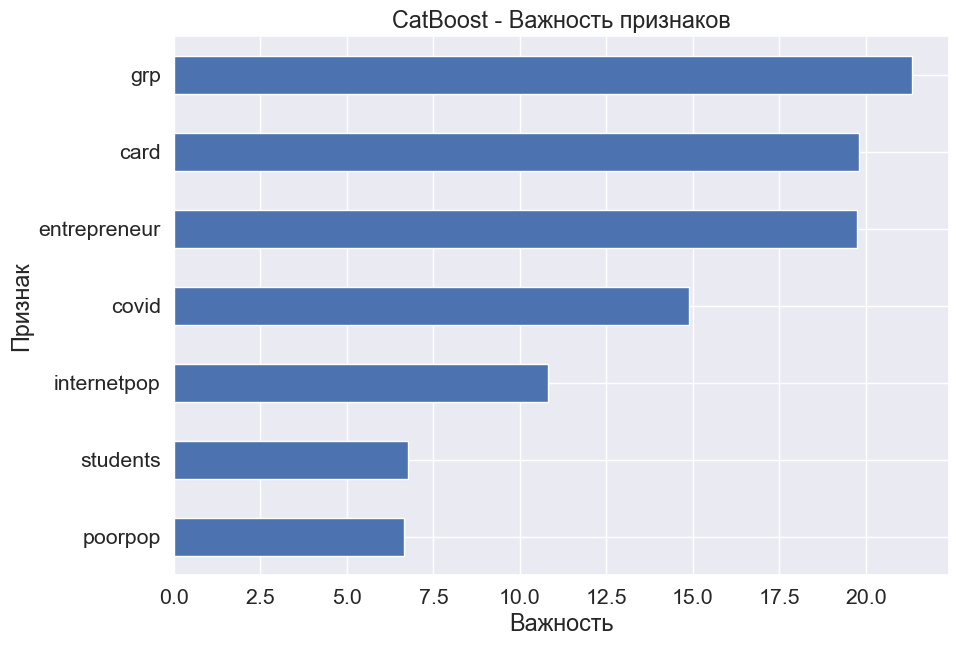

In [106]:
#Важность признаков в модели CatBoost
fea_imp2 = pd.DataFrame({'imp': model2.feature_importances_, 'col': X_train1.columns})
fea_imp2 = fea_imp2.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
fea_imp2.plot(kind='barh', x='col', y='imp', figsize=(10, 7), legend=None)
plt.title('CatBoost - Важность признаков')
plt.ylabel('Признак')
plt.xlabel('Важность')
print(fea_imp2)

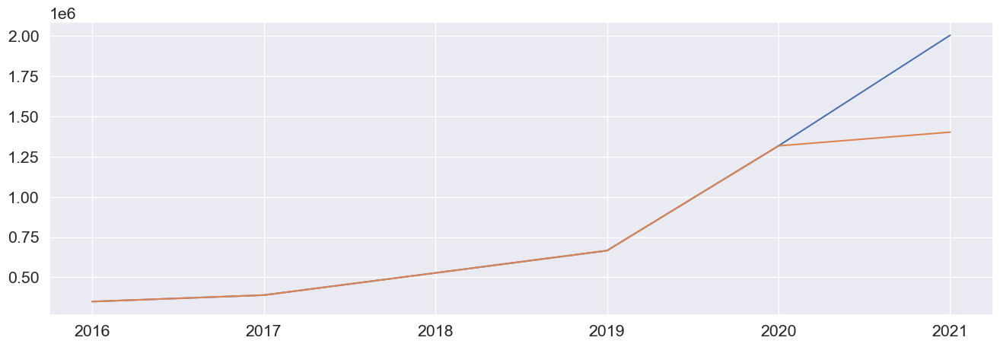

In [107]:
#общий график прогноза и факта
ecom_pred2 = ecom_test.drop('esales', axis = 1).copy()
ecom_pred2 ['esales'] = y_pred_test2
ecom_pred2 = pd.concat([ecom_train,ecom_pred2])

dataecom_act2 = ecom.groupby(['year']).sum()['esales']
dataecom_pred2 = ecom_pred2.groupby(['year']).sum()['esales']

plt.figure(figsize=(16,5))

plt.plot(dataecom_act2.index,dataecom_act2.values)
plt.plot(dataecom_pred2.index,dataecom_pred2.values)

In [108]:
explainer2 = shap.TreeExplainer(model2)
shap_values2 = explainer2(X_test1)
shap_values2_train = explainer2(X_train1)

In [109]:
#визуализация SHAP-значений
shap.initjs()
shap.plots.force(shap_values2)

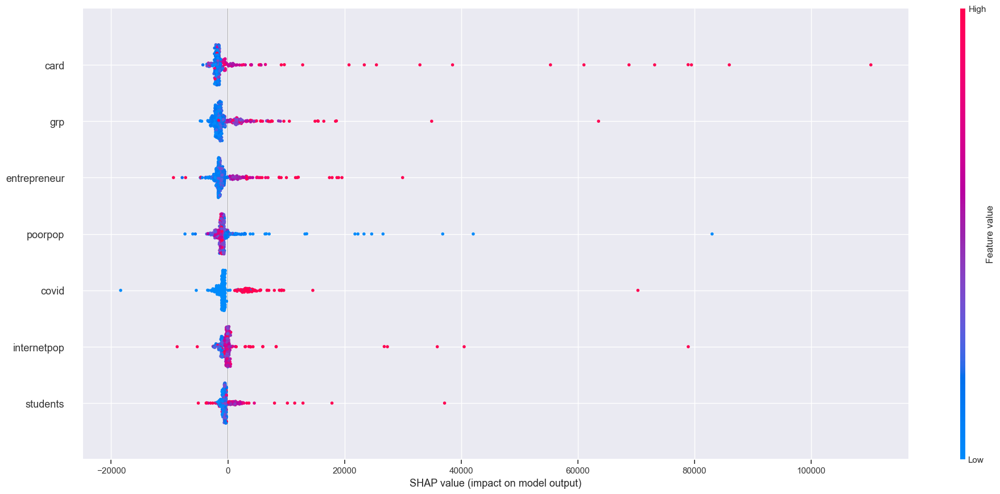

In [110]:
shap.summary_plot(shap_values2_train, X_train1, plot_size=(20,9))

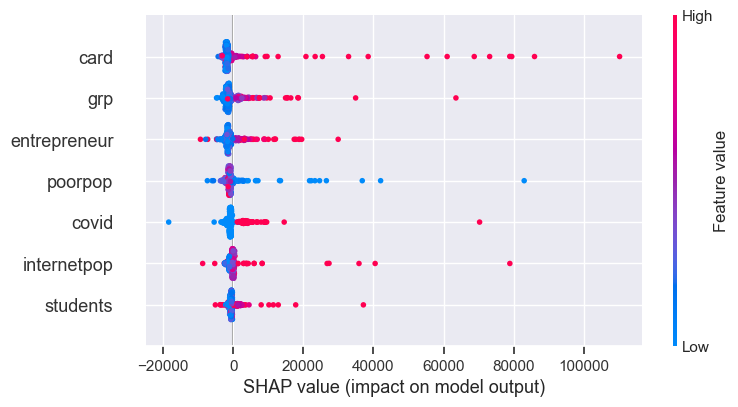

In [111]:
shap.plots.beeswarm(shap_values2_train)

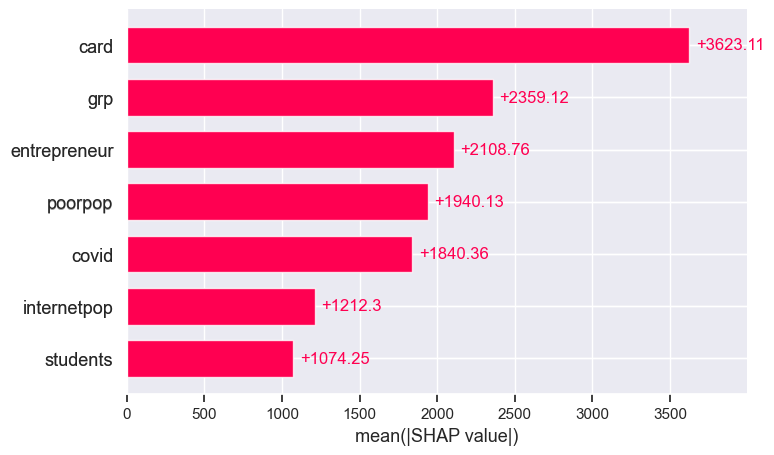

In [112]:
#усредненнные значения силы признаков по всем данным (без + и -)
shap.plots.bar(shap_values2_train)

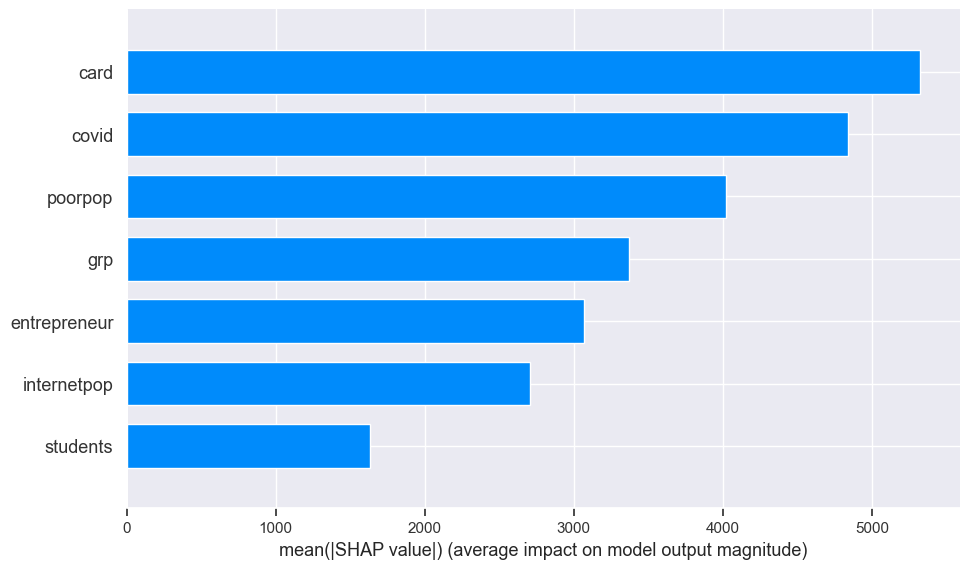

In [113]:
shap.summary_plot(shap_values2, X_test1, plot_type="bar", plot_size=(10,6))

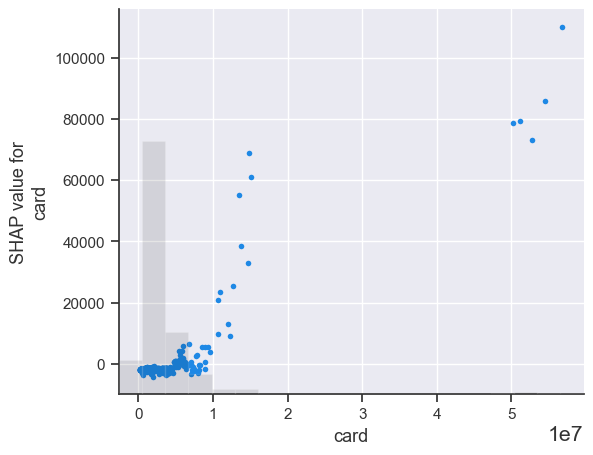

In [114]:
shap.plots.scatter(shap_values2_train[:,"card"])

**Улучшение модели. Подбор гиперпараметров через sklearb GridSearchCV. Модель №3**

In [ ]:
#поиск параметров через grid search sklearn
model_GSCV = GridSearchCV(
    estimator = CatBoostRegressor(
        loss_function = 'RMSE',
        verbose = False,
        early_stopping_rounds=20,
        cat_features=categorical_features_indices1),
    param_grid = grid,
    cv = 5,
    scoring = 'neg_root_mean_squared_error'
)

model_GSCV.fit(X_train1,y_train)
print(model_GSCV.best_params_)
print(model_GSCV.best_estimator_.get_best_score())

In [128]:
model3=CatBoostRegressor(iterations=5000, depth=11, learning_rate=0.01, loss_function='RMSE', early_stopping_rounds=20)
model3.fit(X_train1, y_train, eval_set=(X_test1, y_test),cat_features=categorical_features_indices1, verbose=False, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [129]:
print(f'Модель обучена? {model3.is_fitted()}')
print(f'Номер лучшей итерации {model3.get_best_iteration()}')
print(f'Лучшие значения: {model3.get_best_score()}')

Модель обучена? True
Номер лучшей итерации 3179
Лучшие значения: {'learn': {'RMSE': 254.52568297663524}, 'validation': {'RMSE': 21720.994382461617}}


In [130]:
y_pred_train3 = model3.predict(X_train1)
y_pred_test3 = model3.predict(X_test1)
print("TRAIN SMAPE:", smape(y_train, y_pred_train3))
print("MAE train:",mean_absolute_error(y_train, y_pred_train3))
print("RMSE train:",mean_squared_error(y_train, y_pred_train3))
print("MAPE train:",mean_absolute_percentage_error(y_train, y_pred_train3))
print("R2 Score train:",r2_score(y_train, y_pred_train3))

TRAIN SMAPE: 34.329259228703
MAE train: 197.2111114204165
RMSE train: 66460.91047123575
MAPE train: 3.0778673586698732e+16
R2 Score train: 0.9999355038067156


In [131]:
print("TEST SMAPE:", smape(y_test, y_pred_test3))
print("MAE test:",mean_absolute_error(y_test, y_pred_test3))
print("RMSE test:",mean_squared_error(y_test, y_pred_test3))
print("MAPE test:",mean_absolute_percentage_error(y_test, y_pred_test3))
print("R2 Score test:",r2_score(y_test, y_pred_test3))

TEST SMAPE: 51.093097916998985
MAE test: 9031.036919518832
RMSE test: 471801545.95371103
MAPE test: 0.7392492758113084
R2 Score test: 0.9066668638679132


In [ ]:
#CV через библиотеку Sklearn
cv_score3 = cross_val_score (model3, X_train1, y_train,scoring = 'neg_root_mean_squared_error', cv=5 )
final_cv_score3 = round(np.mean(-cv_score3)**0.5,3)
print('RMSE модели через кросс-валидацию', final_cv_score3)

0:	learn: 35588.6265732	total: 54.6ms	remaining: 4m 32s
1:	learn: 35454.4904648	total: 108ms	remaining: 4m 29s
2:	learn: 35311.7709983	total: 152ms	remaining: 4m 12s
3:	learn: 35197.6681160	total: 203ms	remaining: 4m 13s
4:	learn: 35105.3173108	total: 204ms	remaining: 3m 23s
5:	learn: 35005.1657096	total: 206ms	remaining: 2m 51s
6:	learn: 34861.0822482	total: 257ms	remaining: 3m 3s
7:	learn: 34762.2344139	total: 284ms	remaining: 2m 57s
8:	learn: 34650.4175607	total: 334ms	remaining: 3m 5s
9:	learn: 34545.7416113	total: 385ms	remaining: 3m 12s
10:	learn: 34447.1047574	total: 430ms	remaining: 3m 14s
11:	learn: 34318.5502842	total: 479ms	remaining: 3m 18s
12:	learn: 34195.8631229	total: 481ms	remaining: 3m 4s
13:	learn: 34092.6439607	total: 530ms	remaining: 3m 8s
14:	learn: 33965.0571373	total: 554ms	remaining: 3m 4s
15:	learn: 33859.1031034	total: 602ms	remaining: 3m 7s
16:	learn: 33756.3597972	total: 646ms	remaining: 3m 9s
17:	learn: 33659.2370299	total: 700ms	remaining: 3m 13s
18:	lear

149:	learn: 22773.8046670	total: 4.54s	remaining: 2m 26s
150:	learn: 22715.2803587	total: 4.55s	remaining: 2m 26s
151:	learn: 22650.2705155	total: 4.55s	remaining: 2m 25s
152:	learn: 22584.9764708	total: 4.59s	remaining: 2m 25s
153:	learn: 22522.2396716	total: 4.64s	remaining: 2m 26s
154:	learn: 22480.3924545	total: 4.64s	remaining: 2m 25s
155:	learn: 22421.1523923	total: 4.64s	remaining: 2m 24s
156:	learn: 22380.7192743	total: 4.64s	remaining: 2m 23s
157:	learn: 22301.1581435	total: 4.69s	remaining: 2m 23s
158:	learn: 22245.0365700	total: 4.7s	remaining: 2m 22s
159:	learn: 22194.2023767	total: 4.71s	remaining: 2m 22s
160:	learn: 22126.1648713	total: 4.71s	remaining: 2m 21s
161:	learn: 22061.7596339	total: 4.76s	remaining: 2m 22s
162:	learn: 22003.0751211	total: 4.77s	remaining: 2m 21s
163:	learn: 21963.3791469	total: 4.77s	remaining: 2m 20s
164:	learn: 21929.0465941	total: 4.77s	remaining: 2m 19s
165:	learn: 21871.3025679	total: 4.82s	remaining: 2m 20s
166:	learn: 21808.8354130	total:

295:	learn: 15605.4588848	total: 7.72s	remaining: 2m 2s
296:	learn: 15564.2854870	total: 7.73s	remaining: 2m 2s
297:	learn: 15527.4665328	total: 7.75s	remaining: 2m 2s
298:	learn: 15490.1327562	total: 7.79s	remaining: 2m 2s
299:	learn: 15451.4343970	total: 7.84s	remaining: 2m 2s
300:	learn: 15405.3392026	total: 7.84s	remaining: 2m 2s
301:	learn: 15367.3470128	total: 7.84s	remaining: 2m 2s
302:	learn: 15339.1751270	total: 7.85s	remaining: 2m 1s
303:	learn: 15302.8770820	total: 7.85s	remaining: 2m 1s
304:	learn: 15266.2268215	total: 7.85s	remaining: 2m
305:	learn: 15234.5358758	total: 7.85s	remaining: 2m
306:	learn: 15191.4602148	total: 7.87s	remaining: 2m
307:	learn: 15152.5176050	total: 7.91s	remaining: 2m
308:	learn: 15118.7666449	total: 7.96s	remaining: 2m
309:	learn: 15085.8579851	total: 8.02s	remaining: 2m 1s
310:	learn: 15048.0993231	total: 8.07s	remaining: 2m 1s
311:	learn: 15012.9139002	total: 8.07s	remaining: 2m 1s
312:	learn: 14984.8718764	total: 8.07s	remaining: 2m
313:	learn

443:	learn: 10969.2928901	total: 11.2s	remaining: 1m 54s
444:	learn: 10950.1306015	total: 11.2s	remaining: 1m 54s
445:	learn: 10924.0406536	total: 11.2s	remaining: 1m 54s
446:	learn: 10903.1059012	total: 11.2s	remaining: 1m 53s
447:	learn: 10877.1226974	total: 11.2s	remaining: 1m 54s
448:	learn: 10856.4828027	total: 11.2s	remaining: 1m 53s
449:	learn: 10835.5503240	total: 11.3s	remaining: 1m 54s
450:	learn: 10811.7376742	total: 11.3s	remaining: 1m 53s
451:	learn: 10789.0954491	total: 11.3s	remaining: 1m 53s
452:	learn: 10769.6616650	total: 11.3s	remaining: 1m 53s
453:	learn: 10749.4776005	total: 11.3s	remaining: 1m 53s
454:	learn: 10725.7259742	total: 11.3s	remaining: 1m 52s
455:	learn: 10700.8956578	total: 11.3s	remaining: 1m 52s
456:	learn: 10677.1230717	total: 11.3s	remaining: 1m 52s
457:	learn: 10652.8251420	total: 11.3s	remaining: 1m 52s
458:	learn: 10630.7137840	total: 11.3s	remaining: 1m 52s
459:	learn: 10605.3699267	total: 11.4s	remaining: 1m 52s
460:	learn: 10587.0933049	total

589:	learn: 8030.4555118	total: 13.7s	remaining: 1m 42s
590:	learn: 8017.8405181	total: 13.7s	remaining: 1m 42s
591:	learn: 8005.0745905	total: 13.7s	remaining: 1m 41s
592:	learn: 7988.7568886	total: 13.7s	remaining: 1m 41s
593:	learn: 7976.3180208	total: 13.7s	remaining: 1m 41s
594:	learn: 7963.6885660	total: 13.7s	remaining: 1m 41s
595:	learn: 7948.2848021	total: 13.7s	remaining: 1m 41s
596:	learn: 7935.9242731	total: 13.7s	remaining: 1m 41s
597:	learn: 7923.4985162	total: 13.7s	remaining: 1m 40s
598:	learn: 7907.3837549	total: 13.7s	remaining: 1m 40s
599:	learn: 7892.7724575	total: 13.7s	remaining: 1m 40s
600:	learn: 7877.6055059	total: 13.7s	remaining: 1m 40s
601:	learn: 7865.1987003	total: 13.7s	remaining: 1m 40s
602:	learn: 7848.5696853	total: 13.8s	remaining: 1m 40s
603:	learn: 7833.1705038	total: 13.8s	remaining: 1m 40s
604:	learn: 7817.9026219	total: 13.8s	remaining: 1m 40s
605:	learn: 7801.1362015	total: 13.8s	remaining: 1m 40s
606:	learn: 7783.3895388	total: 13.9s	remaining:

738:	learn: 6082.7213883	total: 15.6s	remaining: 1m 30s
739:	learn: 6074.1969998	total: 15.6s	remaining: 1m 30s
740:	learn: 6057.1028843	total: 15.7s	remaining: 1m 30s
741:	learn: 6046.2233883	total: 15.7s	remaining: 1m 30s
742:	learn: 6035.6059291	total: 15.7s	remaining: 1m 29s
743:	learn: 6027.3839126	total: 15.7s	remaining: 1m 29s
744:	learn: 6017.7976598	total: 15.7s	remaining: 1m 29s
745:	learn: 6006.6007232	total: 15.7s	remaining: 1m 29s
746:	learn: 5996.2444982	total: 15.8s	remaining: 1m 29s
747:	learn: 5984.7493329	total: 15.8s	remaining: 1m 29s
748:	learn: 5973.1522652	total: 15.8s	remaining: 1m 29s
749:	learn: 5960.4985183	total: 15.8s	remaining: 1m 29s
750:	learn: 5944.8357187	total: 15.8s	remaining: 1m 29s
751:	learn: 5933.2833732	total: 15.8s	remaining: 1m 29s
752:	learn: 5920.6134709	total: 15.9s	remaining: 1m 29s
753:	learn: 5908.8804712	total: 15.9s	remaining: 1m 29s
754:	learn: 5897.5827778	total: 15.9s	remaining: 1m 29s
755:	learn: 5886.1443441	total: 15.9s	remaining:

888:	learn: 4586.2242083	total: 19.1s	remaining: 1m 28s
889:	learn: 4576.2215627	total: 19.1s	remaining: 1m 27s
890:	learn: 4568.4962729	total: 19.1s	remaining: 1m 28s
891:	learn: 4560.9938955	total: 19.2s	remaining: 1m 28s
892:	learn: 4552.6286559	total: 19.2s	remaining: 1m 28s
893:	learn: 4544.9846535	total: 19.2s	remaining: 1m 28s
894:	learn: 4536.6784702	total: 19.2s	remaining: 1m 28s
895:	learn: 4529.1464106	total: 19.2s	remaining: 1m 28s
896:	learn: 4521.2886915	total: 19.3s	remaining: 1m 28s
897:	learn: 4513.8452562	total: 19.3s	remaining: 1m 28s
898:	learn: 4506.1332796	total: 19.3s	remaining: 1m 28s
899:	learn: 4498.4475991	total: 19.3s	remaining: 1m 27s
900:	learn: 4490.8292806	total: 19.3s	remaining: 1m 27s
901:	learn: 4483.2172630	total: 19.4s	remaining: 1m 27s
902:	learn: 4476.0500774	total: 19.4s	remaining: 1m 28s
903:	learn: 4469.0719233	total: 19.4s	remaining: 1m 28s
904:	learn: 4462.4198699	total: 19.4s	remaining: 1m 27s
905:	learn: 4454.7859384	total: 19.5s	remaining:

1037:	learn: 3305.1123724	total: 25.2s	remaining: 1m 36s
1038:	learn: 3296.6432984	total: 25.2s	remaining: 1m 36s
1039:	learn: 3288.6018061	total: 25.3s	remaining: 1m 36s
1040:	learn: 3280.8707540	total: 25.3s	remaining: 1m 36s
1041:	learn: 3272.8555355	total: 25.4s	remaining: 1m 36s
1042:	learn: 3264.2459320	total: 25.4s	remaining: 1m 36s
1043:	learn: 3256.6932431	total: 25.5s	remaining: 1m 36s
1044:	learn: 3248.5249505	total: 25.5s	remaining: 1m 36s
1045:	learn: 3241.0323330	total: 25.6s	remaining: 1m 36s
1046:	learn: 3233.4458575	total: 25.7s	remaining: 1m 36s
1047:	learn: 3225.9802155	total: 25.7s	remaining: 1m 36s
1048:	learn: 3218.1472455	total: 25.8s	remaining: 1m 37s
1049:	learn: 3210.7509166	total: 25.8s	remaining: 1m 37s
1050:	learn: 3203.2213885	total: 25.9s	remaining: 1m 37s
1051:	learn: 3195.0553538	total: 25.9s	remaining: 1m 37s
1052:	learn: 3186.6969242	total: 26s	remaining: 1m 37s
1053:	learn: 3179.3124331	total: 26.1s	remaining: 1m 37s
1054:	learn: 3171.7832728	total: 

1182:	learn: 2364.8791124	total: 32.7s	remaining: 1m 45s
1183:	learn: 2359.8035482	total: 32.7s	remaining: 1m 45s
1184:	learn: 2353.0041646	total: 32.8s	remaining: 1m 45s
1185:	learn: 2347.9967243	total: 32.8s	remaining: 1m 45s
1186:	learn: 2342.9692433	total: 32.9s	remaining: 1m 45s
1187:	learn: 2337.7151298	total: 32.9s	remaining: 1m 45s
1188:	learn: 2332.6425606	total: 33s	remaining: 1m 45s
1189:	learn: 2327.7629915	total: 33s	remaining: 1m 45s
1190:	learn: 2322.8706009	total: 33.1s	remaining: 1m 45s
1191:	learn: 2317.6839520	total: 33.1s	remaining: 1m 45s
1192:	learn: 2311.0419811	total: 33.2s	remaining: 1m 45s
1193:	learn: 2306.0575909	total: 33.2s	remaining: 1m 45s
1194:	learn: 2300.4705379	total: 33.3s	remaining: 1m 46s
1195:	learn: 2293.8884162	total: 33.4s	remaining: 1m 46s
1196:	learn: 2288.8764289	total: 33.4s	remaining: 1m 46s
1197:	learn: 2284.0929530	total: 33.5s	remaining: 1m 46s
1198:	learn: 2279.0153141	total: 33.5s	remaining: 1m 46s
1199:	learn: 2274.2342007	total: 33

1330:	learn: 1844.7523052	total: 39.3s	remaining: 1m 48s
1331:	learn: 1842.7826222	total: 39.3s	remaining: 1m 48s
1332:	learn: 1840.9764444	total: 39.3s	remaining: 1m 48s
1333:	learn: 1839.0218830	total: 39.4s	remaining: 1m 48s
1334:	learn: 1837.0869542	total: 39.4s	remaining: 1m 48s
1335:	learn: 1835.1478696	total: 39.5s	remaining: 1m 48s
1336:	learn: 1833.2166376	total: 39.5s	remaining: 1m 48s
1337:	learn: 1831.2930824	total: 39.6s	remaining: 1m 48s
1338:	learn: 1829.3773283	total: 39.7s	remaining: 1m 48s
1339:	learn: 1827.6212254	total: 39.7s	remaining: 1m 48s
1340:	learn: 1825.7202491	total: 39.7s	remaining: 1m 48s
1341:	learn: 1823.9785432	total: 39.7s	remaining: 1m 48s
1342:	learn: 1822.0923844	total: 39.8s	remaining: 1m 48s
1343:	learn: 1820.2138985	total: 39.8s	remaining: 1m 48s
1344:	learn: 1818.4933906	total: 39.8s	remaining: 1m 48s
1345:	learn: 1816.6392387	total: 39.9s	remaining: 1m 48s
1346:	learn: 1814.7804999	total: 39.9s	remaining: 1m 48s
1347:	learn: 1812.9314185	total

1479:	learn: 1608.2201236	total: 46s	remaining: 1m 49s
1480:	learn: 1607.1369220	total: 46s	remaining: 1m 49s
1481:	learn: 1606.0553621	total: 46.1s	remaining: 1m 49s
1482:	learn: 1604.9849154	total: 46.1s	remaining: 1m 49s
1483:	learn: 1598.2208901	total: 46.2s	remaining: 1m 49s
1484:	learn: 1597.4546617	total: 46.2s	remaining: 1m 49s
1485:	learn: 1590.7117655	total: 46.2s	remaining: 1m 49s
1486:	learn: 1589.7528768	total: 46.2s	remaining: 1m 49s
1487:	learn: 1588.7011236	total: 46.3s	remaining: 1m 49s
1488:	learn: 1587.6557121	total: 46.3s	remaining: 1m 49s
1489:	learn: 1586.7094909	total: 46.3s	remaining: 1m 49s
1490:	learn: 1585.7675656	total: 46.3s	remaining: 1m 49s
1491:	learn: 1584.7333122	total: 46.4s	remaining: 1m 49s
1492:	learn: 1583.7997685	total: 46.4s	remaining: 1m 48s
1493:	learn: 1583.0627312	total: 46.4s	remaining: 1m 48s
1494:	learn: 1582.0255006	total: 46.5s	remaining: 1m 48s
1495:	learn: 1581.1035519	total: 46.5s	remaining: 1m 48s
1496:	learn: 1580.1857989	total: 46

1633:	learn: 1405.3076868	total: 49.2s	remaining: 1m 41s
1634:	learn: 1404.6746451	total: 49.3s	remaining: 1m 41s
1635:	learn: 1404.0467280	total: 49.3s	remaining: 1m 41s
1636:	learn: 1403.6483594	total: 49.3s	remaining: 1m 41s
1637:	learn: 1403.2129644	total: 49.3s	remaining: 1m 41s
1638:	learn: 1402.7050206	total: 49.3s	remaining: 1m 41s
1639:	learn: 1402.1518527	total: 49.3s	remaining: 1m 41s
1640:	learn: 1401.6278565	total: 49.3s	remaining: 1m 41s
1641:	learn: 1401.1269928	total: 49.3s	remaining: 1m 40s
1642:	learn: 1400.5152212	total: 49.4s	remaining: 1m 40s
1643:	learn: 1394.6755602	total: 49.4s	remaining: 1m 40s
1644:	learn: 1394.1269931	total: 49.5s	remaining: 1m 40s
1645:	learn: 1393.6643031	total: 49.5s	remaining: 1m 40s
1646:	learn: 1392.8511697	total: 49.5s	remaining: 1m 40s
1647:	learn: 1392.3625845	total: 49.5s	remaining: 1m 40s
1648:	learn: 1391.9477305	total: 49.5s	remaining: 1m 40s
1649:	learn: 1385.5919703	total: 49.6s	remaining: 1m 40s
1650:	learn: 1384.9446551	total

1784:	learn: 1155.9247449	total: 53.9s	remaining: 1m 37s
1785:	learn: 1152.1666662	total: 53.9s	remaining: 1m 37s
1786:	learn: 1151.8783714	total: 53.9s	remaining: 1m 36s
1787:	learn: 1151.5645408	total: 53.9s	remaining: 1m 36s
1788:	learn: 1150.3332287	total: 53.9s	remaining: 1m 36s
1789:	learn: 1150.0138510	total: 54s	remaining: 1m 36s
1790:	learn: 1149.6834145	total: 54s	remaining: 1m 36s
1791:	learn: 1149.4460762	total: 54s	remaining: 1m 36s
1792:	learn: 1145.7285882	total: 54.1s	remaining: 1m 36s
1793:	learn: 1145.4227686	total: 54.1s	remaining: 1m 36s
1794:	learn: 1145.1881352	total: 54.1s	remaining: 1m 36s
1795:	learn: 1143.9729045	total: 54.1s	remaining: 1m 36s
1796:	learn: 1143.6789757	total: 54.1s	remaining: 1m 36s
1797:	learn: 1140.2019093	total: 54.2s	remaining: 1m 36s
1798:	learn: 1136.6578197	total: 54.2s	remaining: 1m 36s
1799:	learn: 1135.4419716	total: 54.2s	remaining: 1m 36s
1800:	learn: 1135.2267652	total: 54.2s	remaining: 1m 36s
1801:	learn: 1134.8551303	total: 54.3

1932:	learn: 953.7176305	total: 57.7s	remaining: 1m 31s
1933:	learn: 953.5510989	total: 57.7s	remaining: 1m 31s
1934:	learn: 950.7941265	total: 57.7s	remaining: 1m 31s
1935:	learn: 950.6617445	total: 57.8s	remaining: 1m 31s
1936:	learn: 947.1545127	total: 57.8s	remaining: 1m 31s
1937:	learn: 944.2098183	total: 57.9s	remaining: 1m 31s
1938:	learn: 944.0783876	total: 57.9s	remaining: 1m 31s
1939:	learn: 942.1064803	total: 57.9s	remaining: 1m 31s
1940:	learn: 938.7788958	total: 58s	remaining: 1m 31s
1941:	learn: 938.6485338	total: 58s	remaining: 1m 31s
1942:	learn: 936.0761264	total: 58s	remaining: 1m 31s
1943:	learn: 935.9063509	total: 58s	remaining: 1m 31s
1944:	learn: 933.4194380	total: 58.1s	remaining: 1m 31s
1945:	learn: 933.2908089	total: 58.1s	remaining: 1m 31s
1946:	learn: 933.1628091	total: 58.1s	remaining: 1m 31s
1947:	learn: 933.0025366	total: 58.1s	remaining: 1m 31s
1948:	learn: 929.9639423	total: 58.1s	remaining: 1m 31s
1949:	learn: 929.8028905	total: 58.1s	remaining: 1m 30s


2085:	learn: 760.0183528	total: 1m 1s	remaining: 1m 26s
2086:	learn: 758.3463359	total: 1m 1s	remaining: 1m 26s
2087:	learn: 755.7224897	total: 1m 1s	remaining: 1m 26s
2088:	learn: 755.6444191	total: 1m 1s	remaining: 1m 26s
2089:	learn: 753.9043374	total: 1m 1s	remaining: 1m 26s
2090:	learn: 751.6789180	total: 1m 2s	remaining: 1m 26s
2091:	learn: 750.7767842	total: 1m 2s	remaining: 1m 26s
2092:	learn: 750.6490265	total: 1m 2s	remaining: 1m 26s
2093:	learn: 750.5724051	total: 1m 2s	remaining: 1m 26s
2094:	learn: 749.9646860	total: 1m 2s	remaining: 1m 26s
2095:	learn: 748.1439279	total: 1m 2s	remaining: 1m 26s
2096:	learn: 746.5730745	total: 1m 2s	remaining: 1m 26s
2097:	learn: 744.4837550	total: 1m 2s	remaining: 1m 26s
2098:	learn: 744.0403765	total: 1m 2s	remaining: 1m 26s
2099:	learn: 743.9652295	total: 1m 2s	remaining: 1m 25s
2100:	learn: 743.8317818	total: 1m 2s	remaining: 1m 25s
2101:	learn: 743.7573623	total: 1m 2s	remaining: 1m 25s
2102:	learn: 742.2104296	total: 1m 2s	remaining:

2236:	learn: 604.7322328	total: 1m 6s	remaining: 1m 22s
2237:	learn: 603.3080418	total: 1m 7s	remaining: 1m 22s
2238:	learn: 602.8244008	total: 1m 7s	remaining: 1m 22s
2239:	learn: 601.6050655	total: 1m 7s	remaining: 1m 22s
2240:	learn: 601.1256135	total: 1m 7s	remaining: 1m 22s
2241:	learn: 600.0794755	total: 1m 7s	remaining: 1m 22s
2242:	learn: 598.8043005	total: 1m 7s	remaining: 1m 22s
2243:	learn: 598.3977609	total: 1m 7s	remaining: 1m 22s
2244:	learn: 597.0875694	total: 1m 7s	remaining: 1m 22s
2245:	learn: 595.6736621	total: 1m 7s	remaining: 1m 22s
2246:	learn: 594.3307065	total: 1m 7s	remaining: 1m 22s
2247:	learn: 592.6827488	total: 1m 7s	remaining: 1m 22s
2248:	learn: 592.2324810	total: 1m 7s	remaining: 1m 22s
2249:	learn: 592.1675871	total: 1m 7s	remaining: 1m 22s
2250:	learn: 591.1544073	total: 1m 7s	remaining: 1m 22s
2251:	learn: 589.6925214	total: 1m 7s	remaining: 1m 22s
2252:	learn: 587.8492296	total: 1m 7s	remaining: 1m 22s
2253:	learn: 586.8530550	total: 1m 7s	remaining:

2382:	learn: 475.5693898	total: 1m 13s	remaining: 1m 20s
2383:	learn: 474.7647021	total: 1m 13s	remaining: 1m 20s
2384:	learn: 473.7292729	total: 1m 13s	remaining: 1m 20s
2385:	learn: 473.0861448	total: 1m 13s	remaining: 1m 20s
2386:	learn: 472.4046220	total: 1m 13s	remaining: 1m 20s
2387:	learn: 471.5173317	total: 1m 13s	remaining: 1m 20s
2388:	learn: 470.7133234	total: 1m 13s	remaining: 1m 20s
2389:	learn: 469.7614789	total: 1m 13s	remaining: 1m 20s
2390:	learn: 469.1287721	total: 1m 13s	remaining: 1m 20s
2391:	learn: 468.1485122	total: 1m 13s	remaining: 1m 20s
2392:	learn: 467.0999055	total: 1m 13s	remaining: 1m 20s
2393:	learn: 466.2995166	total: 1m 14s	remaining: 1m 20s
2394:	learn: 465.4750169	total: 1m 14s	remaining: 1m 20s
2395:	learn: 464.5579842	total: 1m 14s	remaining: 1m 20s
2396:	learn: 463.7676388	total: 1m 14s	remaining: 1m 20s
2397:	learn: 462.8862905	total: 1m 14s	remaining: 1m 20s
2398:	learn: 461.9543063	total: 1m 14s	remaining: 1m 20s
2399:	learn: 461.0894528	total:

2529:	learn: 380.9171360	total: 1m 20s	remaining: 1m 18s
2530:	learn: 380.2254420	total: 1m 20s	remaining: 1m 18s
2531:	learn: 379.6329100	total: 1m 20s	remaining: 1m 18s
2532:	learn: 379.1542627	total: 1m 20s	remaining: 1m 18s
2533:	learn: 378.5587809	total: 1m 20s	remaining: 1m 18s
2534:	learn: 377.9319569	total: 1m 20s	remaining: 1m 18s
2535:	learn: 377.1885517	total: 1m 20s	remaining: 1m 18s
2536:	learn: 376.6614970	total: 1m 20s	remaining: 1m 18s
2537:	learn: 375.9773755	total: 1m 21s	remaining: 1m 18s
2538:	learn: 375.3767473	total: 1m 21s	remaining: 1m 18s
2539:	learn: 375.1685917	total: 1m 21s	remaining: 1m 18s
2540:	learn: 374.5002862	total: 1m 21s	remaining: 1m 18s
2541:	learn: 373.8774584	total: 1m 21s	remaining: 1m 18s
2542:	learn: 373.0706853	total: 1m 21s	remaining: 1m 18s
2543:	learn: 372.5804708	total: 1m 21s	remaining: 1m 18s
2544:	learn: 371.9445199	total: 1m 21s	remaining: 1m 18s
2545:	learn: 371.0841370	total: 1m 21s	remaining: 1m 18s
2546:	learn: 370.4599038	total:

2675:	learn: 318.4359557	total: 1m 27s	remaining: 1m 15s
2676:	learn: 318.1109930	total: 1m 27s	remaining: 1m 15s
2677:	learn: 317.9492836	total: 1m 27s	remaining: 1m 15s
2678:	learn: 317.5890885	total: 1m 27s	remaining: 1m 15s
2679:	learn: 317.3455079	total: 1m 27s	remaining: 1m 15s
2680:	learn: 317.0471494	total: 1m 27s	remaining: 1m 15s
2681:	learn: 316.8776570	total: 1m 27s	remaining: 1m 15s
2682:	learn: 316.7166153	total: 1m 27s	remaining: 1m 15s
2683:	learn: 316.2178025	total: 1m 27s	remaining: 1m 15s
2684:	learn: 315.9002072	total: 1m 27s	remaining: 1m 15s
2685:	learn: 315.6776346	total: 1m 27s	remaining: 1m 15s
2686:	learn: 314.9667167	total: 1m 27s	remaining: 1m 15s
2687:	learn: 314.6087836	total: 1m 27s	remaining: 1m 15s
2688:	learn: 314.1598927	total: 1m 27s	remaining: 1m 15s
2689:	learn: 313.7030351	total: 1m 27s	remaining: 1m 15s
2690:	learn: 313.4934522	total: 1m 27s	remaining: 1m 15s
2691:	learn: 313.2185696	total: 1m 28s	remaining: 1m 15s
2692:	learn: 312.7187408	total:

2820:	learn: 273.9575883	total: 1m 34s	remaining: 1m 12s
2821:	learn: 273.6363659	total: 1m 34s	remaining: 1m 12s
2822:	learn: 273.3457389	total: 1m 34s	remaining: 1m 12s
2823:	learn: 272.9133930	total: 1m 34s	remaining: 1m 12s
2824:	learn: 272.6096720	total: 1m 34s	remaining: 1m 12s
2825:	learn: 272.2972931	total: 1m 34s	remaining: 1m 12s
2826:	learn: 271.8020421	total: 1m 34s	remaining: 1m 12s
2827:	learn: 271.4315806	total: 1m 34s	remaining: 1m 12s
2828:	learn: 271.1257797	total: 1m 34s	remaining: 1m 12s
2829:	learn: 270.8548631	total: 1m 34s	remaining: 1m 12s
2830:	learn: 270.7273451	total: 1m 34s	remaining: 1m 12s
2831:	learn: 270.4961913	total: 1m 34s	remaining: 1m 12s
2832:	learn: 270.3756678	total: 1m 34s	remaining: 1m 12s
2833:	learn: 270.3414661	total: 1m 34s	remaining: 1m 12s
2834:	learn: 269.8932980	total: 1m 34s	remaining: 1m 12s
2835:	learn: 269.3115270	total: 1m 34s	remaining: 1m 12s
2836:	learn: 269.0517713	total: 1m 34s	remaining: 1m 12s
2837:	learn: 268.7190359	total:

2966:	learn: 235.3347098	total: 1m 41s	remaining: 1m 9s
2967:	learn: 235.2283397	total: 1m 41s	remaining: 1m 9s
2968:	learn: 234.9220183	total: 1m 41s	remaining: 1m 9s
2969:	learn: 234.7685834	total: 1m 41s	remaining: 1m 9s
2970:	learn: 234.4517070	total: 1m 41s	remaining: 1m 9s
2971:	learn: 234.2027540	total: 1m 41s	remaining: 1m 9s
2972:	learn: 234.1026145	total: 1m 41s	remaining: 1m 9s
2973:	learn: 233.7581991	total: 1m 41s	remaining: 1m 9s
2974:	learn: 233.3888739	total: 1m 41s	remaining: 1m 9s
2975:	learn: 233.0609480	total: 1m 41s	remaining: 1m 9s
2976:	learn: 232.9047353	total: 1m 41s	remaining: 1m 9s
2977:	learn: 232.4392799	total: 1m 41s	remaining: 1m 9s
2978:	learn: 232.4103942	total: 1m 41s	remaining: 1m 9s
2979:	learn: 232.0717731	total: 1m 42s	remaining: 1m 9s
2980:	learn: 231.8279244	total: 1m 42s	remaining: 1m 9s
2981:	learn: 231.7121452	total: 1m 42s	remaining: 1m 9s
2982:	learn: 231.3763475	total: 1m 42s	remaining: 1m 9s
2983:	learn: 231.1814964	total: 1m 42s	remaining

3113:	learn: 204.4430855	total: 1m 49s	remaining: 1m 6s
3114:	learn: 204.1461106	total: 1m 49s	remaining: 1m 6s
3115:	learn: 204.0924156	total: 1m 49s	remaining: 1m 6s
3116:	learn: 203.8190038	total: 1m 49s	remaining: 1m 6s
3117:	learn: 203.7025754	total: 1m 49s	remaining: 1m 6s
3118:	learn: 203.5462410	total: 1m 49s	remaining: 1m 6s
3119:	learn: 203.3560023	total: 1m 49s	remaining: 1m 5s
3120:	learn: 203.0689292	total: 1m 49s	remaining: 1m 5s
3121:	learn: 202.9236438	total: 1m 49s	remaining: 1m 5s
3122:	learn: 202.7864800	total: 1m 49s	remaining: 1m 5s
3123:	learn: 202.7056069	total: 1m 49s	remaining: 1m 5s
3124:	learn: 202.4086276	total: 1m 49s	remaining: 1m 5s
3125:	learn: 202.1215123	total: 1m 49s	remaining: 1m 5s
3126:	learn: 201.8806171	total: 1m 49s	remaining: 1m 5s
3127:	learn: 201.7498092	total: 1m 49s	remaining: 1m 5s
3128:	learn: 201.4521778	total: 1m 49s	remaining: 1m 5s
3129:	learn: 201.1051844	total: 1m 50s	remaining: 1m 5s
3130:	learn: 200.8293832	total: 1m 50s	remaining

3262:	learn: 179.6555317	total: 1m 56s	remaining: 1m 2s
3263:	learn: 179.3740211	total: 1m 56s	remaining: 1m 2s
3264:	learn: 179.1887770	total: 1m 56s	remaining: 1m 2s
3265:	learn: 178.9510396	total: 1m 56s	remaining: 1m 2s
3266:	learn: 178.8093358	total: 1m 56s	remaining: 1m 2s
3267:	learn: 178.6095991	total: 1m 56s	remaining: 1m 2s
3268:	learn: 178.3576421	total: 1m 57s	remaining: 1m 1s
3269:	learn: 178.1594330	total: 1m 57s	remaining: 1m 1s
3270:	learn: 177.9942134	total: 1m 57s	remaining: 1m 1s
3271:	learn: 177.7996580	total: 1m 57s	remaining: 1m 1s
3272:	learn: 177.5248145	total: 1m 57s	remaining: 1m 1s
3273:	learn: 177.4046160	total: 1m 57s	remaining: 1m 1s
3274:	learn: 177.2831710	total: 1m 57s	remaining: 1m 1s
3275:	learn: 177.1313943	total: 1m 57s	remaining: 1m 1s
3276:	learn: 177.0976061	total: 1m 57s	remaining: 1m 1s
3277:	learn: 176.8770024	total: 1m 57s	remaining: 1m 1s
3278:	learn: 176.8291037	total: 1m 57s	remaining: 1m 1s
3279:	learn: 176.8114418	total: 1m 57s	remaining

3414:	learn: 157.4953845	total: 2m 4s	remaining: 57.7s
3415:	learn: 157.2850856	total: 2m 4s	remaining: 57.7s
3416:	learn: 157.2690143	total: 2m 4s	remaining: 57.7s
3417:	learn: 157.0701236	total: 2m 4s	remaining: 57.7s
3418:	learn: 157.0372393	total: 2m 4s	remaining: 57.6s
3419:	learn: 156.8878470	total: 2m 4s	remaining: 57.6s
3420:	learn: 156.6583440	total: 2m 4s	remaining: 57.6s
3421:	learn: 156.4118070	total: 2m 4s	remaining: 57.5s
3422:	learn: 156.3789460	total: 2m 4s	remaining: 57.5s
3423:	learn: 156.2412291	total: 2m 4s	remaining: 57.5s
3424:	learn: 156.0725914	total: 2m 4s	remaining: 57.5s
3425:	learn: 155.8773638	total: 2m 4s	remaining: 57.4s
3426:	learn: 155.7058875	total: 2m 5s	remaining: 57.4s
3427:	learn: 155.6744774	total: 2m 5s	remaining: 57.4s
3428:	learn: 155.5493587	total: 2m 5s	remaining: 57.3s
3429:	learn: 155.4024299	total: 2m 5s	remaining: 57.3s
3430:	learn: 155.1108195	total: 2m 5s	remaining: 57.3s
3431:	learn: 155.0158778	total: 2m 5s	remaining: 57.2s
3432:	lear

3564:	learn: 138.6772220	total: 2m 11s	remaining: 53s
3565:	learn: 138.5513876	total: 2m 11s	remaining: 52.9s
3566:	learn: 138.4148267	total: 2m 11s	remaining: 52.9s
3567:	learn: 138.3116904	total: 2m 11s	remaining: 52.9s
3568:	learn: 138.1121317	total: 2m 11s	remaining: 52.8s
3569:	learn: 138.0818480	total: 2m 11s	remaining: 52.8s
3570:	learn: 137.9565853	total: 2m 11s	remaining: 52.8s
3571:	learn: 137.8764525	total: 2m 11s	remaining: 52.7s
3572:	learn: 137.7334032	total: 2m 11s	remaining: 52.7s
3573:	learn: 137.7089425	total: 2m 11s	remaining: 52.7s
3574:	learn: 137.5697463	total: 2m 12s	remaining: 52.6s
3575:	learn: 137.4730317	total: 2m 12s	remaining: 52.6s
3576:	learn: 137.4275430	total: 2m 12s	remaining: 52.6s
3577:	learn: 137.2735686	total: 2m 12s	remaining: 52.5s
3578:	learn: 137.1224201	total: 2m 12s	remaining: 52.5s
3579:	learn: 136.9598222	total: 2m 12s	remaining: 52.5s
3580:	learn: 136.8759263	total: 2m 12s	remaining: 52.4s
3581:	learn: 136.8234555	total: 2m 12s	remaining: 

3712:	learn: 123.9273002	total: 2m 18s	remaining: 48.1s
3713:	learn: 123.7966944	total: 2m 18s	remaining: 48.1s
3714:	learn: 123.7891652	total: 2m 18s	remaining: 48s
3715:	learn: 123.7735881	total: 2m 18s	remaining: 48s
3716:	learn: 123.6254392	total: 2m 18s	remaining: 48s
3717:	learn: 123.6112409	total: 2m 19s	remaining: 47.9s
3718:	learn: 123.5316128	total: 2m 19s	remaining: 47.9s
3719:	learn: 123.4320178	total: 2m 19s	remaining: 47.9s
3720:	learn: 123.3186017	total: 2m 19s	remaining: 47.8s
3721:	learn: 123.1643767	total: 2m 19s	remaining: 47.8s
3722:	learn: 123.0158865	total: 2m 19s	remaining: 47.8s
3723:	learn: 122.8806880	total: 2m 19s	remaining: 47.7s
3724:	learn: 122.8628464	total: 2m 19s	remaining: 47.7s
3725:	learn: 122.7471463	total: 2m 19s	remaining: 47.7s
3726:	learn: 122.5693321	total: 2m 19s	remaining: 47.6s
3727:	learn: 122.4837399	total: 2m 19s	remaining: 47.6s
3728:	learn: 122.4441810	total: 2m 19s	remaining: 47.6s
3729:	learn: 122.3241223	total: 2m 19s	remaining: 47.5

3862:	learn: 111.6972385	total: 2m 25s	remaining: 42.9s
3863:	learn: 111.6543289	total: 2m 25s	remaining: 42.9s
3864:	learn: 111.5712649	total: 2m 25s	remaining: 42.9s
3865:	learn: 111.4833563	total: 2m 26s	remaining: 42.8s
3866:	learn: 111.3839710	total: 2m 26s	remaining: 42.8s
3867:	learn: 111.3008612	total: 2m 26s	remaining: 42.8s
3868:	learn: 111.2158514	total: 2m 26s	remaining: 42.7s
3869:	learn: 111.0960220	total: 2m 26s	remaining: 42.7s
3870:	learn: 111.0304817	total: 2m 26s	remaining: 42.7s
3871:	learn: 110.9046690	total: 2m 26s	remaining: 42.6s
3872:	learn: 110.7836286	total: 2m 26s	remaining: 42.6s
3873:	learn: 110.7003668	total: 2m 26s	remaining: 42.6s
3874:	learn: 110.6253805	total: 2m 26s	remaining: 42.5s
3875:	learn: 110.5086933	total: 2m 26s	remaining: 42.5s
3876:	learn: 110.4239427	total: 2m 26s	remaining: 42.5s
3877:	learn: 110.3695506	total: 2m 26s	remaining: 42.4s
3878:	learn: 110.3358558	total: 2m 26s	remaining: 42.4s
3879:	learn: 110.2937399	total: 2m 26s	remaining

4010:	learn: 101.0017369	total: 2m 33s	remaining: 37.7s
4011:	learn: 100.9642868	total: 2m 33s	remaining: 37.7s
4012:	learn: 100.9589655	total: 2m 33s	remaining: 37.7s
4013:	learn: 100.8635009	total: 2m 33s	remaining: 37.6s
4014:	learn: 100.8027884	total: 2m 33s	remaining: 37.6s
4015:	learn: 100.7320078	total: 2m 33s	remaining: 37.6s
4016:	learn: 100.6379162	total: 2m 33s	remaining: 37.5s
4017:	learn: 100.6280326	total: 2m 33s	remaining: 37.5s
4018:	learn: 100.5580624	total: 2m 33s	remaining: 37.4s
4019:	learn: 100.5074993	total: 2m 33s	remaining: 37.4s
4020:	learn: 100.4329962	total: 2m 33s	remaining: 37.4s
4021:	learn: 100.4269191	total: 2m 33s	remaining: 37.3s
4022:	learn: 100.3408725	total: 2m 33s	remaining: 37.3s
4023:	learn: 100.2458904	total: 2m 33s	remaining: 37.3s
4024:	learn: 100.1091254	total: 2m 33s	remaining: 37.2s
4025:	learn: 100.0246661	total: 2m 33s	remaining: 37.2s
4026:	learn: 99.9364950	total: 2m 33s	remaining: 37.2s
4027:	learn: 99.9157609	total: 2m 33s	remaining: 

4160:	learn: 91.1110230	total: 2m 40s	remaining: 32.3s
4161:	learn: 91.1028887	total: 2m 40s	remaining: 32.3s
4162:	learn: 91.0860128	total: 2m 40s	remaining: 32.2s
4163:	learn: 91.0783508	total: 2m 40s	remaining: 32.2s
4164:	learn: 90.9524521	total: 2m 40s	remaining: 32.2s
4165:	learn: 90.9391339	total: 2m 40s	remaining: 32.1s
4166:	learn: 90.9294555	total: 2m 40s	remaining: 32.1s
4167:	learn: 90.8714780	total: 2m 40s	remaining: 32s
4168:	learn: 90.7490557	total: 2m 40s	remaining: 32s
4169:	learn: 90.6787006	total: 2m 40s	remaining: 32s
4170:	learn: 90.6595434	total: 2m 40s	remaining: 31.9s
4171:	learn: 90.6172857	total: 2m 40s	remaining: 31.9s
4172:	learn: 90.5632515	total: 2m 40s	remaining: 31.9s
4173:	learn: 90.5127479	total: 2m 40s	remaining: 31.8s
4174:	learn: 90.4821399	total: 2m 40s	remaining: 31.8s
4175:	learn: 90.4182093	total: 2m 40s	remaining: 31.7s
4176:	learn: 90.3563242	total: 2m 40s	remaining: 31.7s
4177:	learn: 90.3105851	total: 2m 40s	remaining: 31.7s
4178:	learn: 90.

4314:	learn: 82.6581752	total: 2m 47s	remaining: 26.6s
4315:	learn: 82.6287611	total: 2m 47s	remaining: 26.5s
4316:	learn: 82.5791139	total: 2m 47s	remaining: 26.5s
4317:	learn: 82.5294915	total: 2m 47s	remaining: 26.5s
4318:	learn: 82.4688586	total: 2m 47s	remaining: 26.4s
4319:	learn: 82.3669509	total: 2m 47s	remaining: 26.4s
4320:	learn: 82.3201748	total: 2m 47s	remaining: 26.3s
4321:	learn: 82.2556879	total: 2m 47s	remaining: 26.3s
4322:	learn: 82.2169165	total: 2m 47s	remaining: 26.3s
4323:	learn: 82.1313125	total: 2m 47s	remaining: 26.2s
4324:	learn: 82.0924231	total: 2m 47s	remaining: 26.2s
4325:	learn: 82.0818820	total: 2m 47s	remaining: 26.2s
4326:	learn: 82.0100663	total: 2m 47s	remaining: 26.1s
4327:	learn: 81.9683654	total: 2m 48s	remaining: 26.1s
4328:	learn: 81.8953079	total: 2m 48s	remaining: 26s
4329:	learn: 81.8629901	total: 2m 48s	remaining: 26s
4330:	learn: 81.8549533	total: 2m 48s	remaining: 26s
4331:	learn: 81.8117168	total: 2m 48s	remaining: 25.9s
4332:	learn: 81.

4464:	learn: 75.1835620	total: 2m 54s	remaining: 20.9s
4465:	learn: 75.1292633	total: 2m 54s	remaining: 20.9s
4466:	learn: 75.0875567	total: 2m 54s	remaining: 20.9s
4467:	learn: 75.0527587	total: 2m 54s	remaining: 20.8s
4468:	learn: 74.9862372	total: 2m 54s	remaining: 20.8s
4469:	learn: 74.9539160	total: 2m 54s	remaining: 20.7s
4470:	learn: 74.9388017	total: 2m 55s	remaining: 20.7s
4471:	learn: 74.8940783	total: 2m 55s	remaining: 20.7s
4472:	learn: 74.8643235	total: 2m 55s	remaining: 20.6s
4473:	learn: 74.8431991	total: 2m 55s	remaining: 20.6s
4474:	learn: 74.7839031	total: 2m 55s	remaining: 20.6s
4475:	learn: 74.7374636	total: 2m 55s	remaining: 20.5s
4476:	learn: 74.6957023	total: 2m 55s	remaining: 20.5s
4477:	learn: 74.6434619	total: 2m 55s	remaining: 20.4s
4478:	learn: 74.6379936	total: 2m 55s	remaining: 20.4s
4479:	learn: 74.5999446	total: 2m 55s	remaining: 20.4s
4480:	learn: 74.5290241	total: 2m 55s	remaining: 20.3s
4481:	learn: 74.4614275	total: 2m 55s	remaining: 20.3s
4482:	lear

4617:	learn: 68.5863458	total: 3m 1s	remaining: 15s
4618:	learn: 68.5314420	total: 3m 1s	remaining: 15s
4619:	learn: 68.4746589	total: 3m 1s	remaining: 15s
4620:	learn: 68.4385380	total: 3m 1s	remaining: 14.9s
4621:	learn: 68.3994421	total: 3m 1s	remaining: 14.9s
4622:	learn: 68.3650793	total: 3m 2s	remaining: 14.8s
4623:	learn: 68.3259457	total: 3m 2s	remaining: 14.8s
4624:	learn: 68.2635057	total: 3m 2s	remaining: 14.8s
4625:	learn: 68.2207708	total: 3m 2s	remaining: 14.7s
4626:	learn: 68.2144686	total: 3m 2s	remaining: 14.7s
4627:	learn: 68.1362749	total: 3m 2s	remaining: 14.7s
4628:	learn: 68.0729756	total: 3m 2s	remaining: 14.6s
4629:	learn: 68.0659028	total: 3m 2s	remaining: 14.6s
4630:	learn: 68.0342145	total: 3m 2s	remaining: 14.5s
4631:	learn: 67.9950930	total: 3m 2s	remaining: 14.5s
4632:	learn: 67.9444923	total: 3m 2s	remaining: 14.5s
4633:	learn: 67.9065103	total: 3m 2s	remaining: 14.4s
4634:	learn: 67.8697339	total: 3m 2s	remaining: 14.4s
4635:	learn: 67.8212090	total: 3m 

4771:	learn: 61.9889403	total: 3m 9s	remaining: 9.05s
4772:	learn: 61.9792653	total: 3m 9s	remaining: 9.02s
4773:	learn: 61.9725847	total: 3m 9s	remaining: 8.98s
4774:	learn: 61.8933523	total: 3m 9s	remaining: 8.94s
4775:	learn: 61.8610070	total: 3m 9s	remaining: 8.9s
4776:	learn: 61.8535556	total: 3m 9s	remaining: 8.86s
4777:	learn: 61.7892710	total: 3m 9s	remaining: 8.82s
4778:	learn: 61.7437704	total: 3m 9s	remaining: 8.78s
4779:	learn: 61.7052250	total: 3m 9s	remaining: 8.74s
4780:	learn: 61.6737857	total: 3m 9s	remaining: 8.7s
4781:	learn: 61.6676631	total: 3m 9s	remaining: 8.66s
4782:	learn: 61.6197150	total: 3m 10s	remaining: 8.62s
4783:	learn: 61.5789660	total: 3m 10s	remaining: 8.58s
4784:	learn: 61.5258876	total: 3m 10s	remaining: 8.54s
4785:	learn: 61.5002655	total: 3m 10s	remaining: 8.5s
4786:	learn: 61.4746545	total: 3m 10s	remaining: 8.46s
4787:	learn: 61.4391164	total: 3m 10s	remaining: 8.43s
4788:	learn: 61.3808403	total: 3m 10s	remaining: 8.38s
4789:	learn: 61.3690115	

4925:	learn: 56.7694472	total: 3m 16s	remaining: 2.96s
4926:	learn: 56.7370943	total: 3m 16s	remaining: 2.92s
4927:	learn: 56.7169065	total: 3m 16s	remaining: 2.88s
4928:	learn: 56.7112010	total: 3m 16s	remaining: 2.84s
4929:	learn: 56.6824651	total: 3m 16s	remaining: 2.8s
4930:	learn: 56.6144025	total: 3m 17s	remaining: 2.76s
4931:	learn: 56.5558427	total: 3m 17s	remaining: 2.72s
4932:	learn: 56.5328970	total: 3m 17s	remaining: 2.68s
4933:	learn: 56.5051515	total: 3m 17s	remaining: 2.64s
4934:	learn: 56.4617590	total: 3m 17s	remaining: 2.6s
4935:	learn: 56.4557724	total: 3m 17s	remaining: 2.56s
4936:	learn: 56.3949200	total: 3m 17s	remaining: 2.52s
4937:	learn: 56.3574280	total: 3m 17s	remaining: 2.48s
4938:	learn: 56.3510519	total: 3m 17s	remaining: 2.44s
4939:	learn: 56.3289485	total: 3m 17s	remaining: 2.4s
4940:	learn: 56.2940105	total: 3m 17s	remaining: 2.36s
4941:	learn: 56.2247285	total: 3m 17s	remaining: 2.32s
4942:	learn: 56.1781002	total: 3m 17s	remaining: 2.28s
4943:	learn: 

81:	learn: 26946.3744892	total: 2.42s	remaining: 2m 25s
82:	learn: 26877.5532312	total: 2.47s	remaining: 2m 26s
83:	learn: 26802.5268427	total: 2.47s	remaining: 2m 24s
84:	learn: 26719.6632061	total: 2.47s	remaining: 2m 22s
85:	learn: 26655.9712758	total: 2.48s	remaining: 2m 21s
86:	learn: 26585.5063550	total: 2.53s	remaining: 2m 22s
87:	learn: 26509.7400495	total: 2.53s	remaining: 2m 21s
88:	learn: 26435.2204319	total: 2.53s	remaining: 2m 19s
89:	learn: 26364.4479965	total: 2.58s	remaining: 2m 20s
90:	learn: 26293.8764867	total: 2.63s	remaining: 2m 21s
91:	learn: 26220.0876444	total: 2.63s	remaining: 2m 20s
92:	learn: 26151.9197220	total: 2.63s	remaining: 2m 18s
93:	learn: 26103.4303613	total: 2.63s	remaining: 2m 17s
94:	learn: 26028.5208594	total: 2.63s	remaining: 2m 15s
95:	learn: 25980.4620343	total: 2.63s	remaining: 2m 14s
96:	learn: 25889.0721978	total: 2.63s	remaining: 2m 13s
97:	learn: 25825.6346093	total: 2.64s	remaining: 2m 11s
98:	learn: 25732.6979183	total: 2.64s	remaining:

227:	learn: 18378.4546283	total: 5.42s	remaining: 1m 53s
228:	learn: 18330.3879630	total: 5.45s	remaining: 1m 53s
229:	learn: 18284.0223700	total: 5.5s	remaining: 1m 53s
230:	learn: 18250.2771219	total: 5.5s	remaining: 1m 53s
231:	learn: 18203.1120505	total: 5.51s	remaining: 1m 53s
232:	learn: 18161.0857127	total: 5.54s	remaining: 1m 53s
233:	learn: 18109.1205287	total: 5.55s	remaining: 1m 53s
234:	learn: 18059.9599755	total: 5.56s	remaining: 1m 52s
235:	learn: 18007.6495072	total: 5.56s	remaining: 1m 52s
236:	learn: 17974.4164489	total: 5.56s	remaining: 1m 51s
237:	learn: 17933.6675186	total: 5.56s	remaining: 1m 51s
238:	learn: 17885.6155782	total: 5.62s	remaining: 1m 51s
239:	learn: 17847.6793429	total: 5.62s	remaining: 1m 51s
240:	learn: 17803.0581003	total: 5.62s	remaining: 1m 51s
241:	learn: 17757.7595281	total: 5.62s	remaining: 1m 50s
242:	learn: 17710.8694162	total: 5.63s	remaining: 1m 50s
243:	learn: 17670.9209349	total: 5.63s	remaining: 1m 49s
244:	learn: 17623.2884228	total: 

382:	learn: 12760.6625010	total: 8.05s	remaining: 1m 37s
383:	learn: 12728.7600834	total: 8.1s	remaining: 1m 37s
384:	learn: 12694.9874610	total: 8.12s	remaining: 1m 37s
385:	learn: 12668.0345345	total: 8.13s	remaining: 1m 37s
386:	learn: 12642.9803720	total: 8.13s	remaining: 1m 36s
387:	learn: 12614.9658858	total: 8.18s	remaining: 1m 37s
388:	learn: 12579.4801055	total: 8.18s	remaining: 1m 36s
389:	learn: 12549.0193044	total: 8.19s	remaining: 1m 36s
390:	learn: 12520.3869221	total: 8.2s	remaining: 1m 36s
391:	learn: 12493.9178688	total: 8.22s	remaining: 1m 36s
392:	learn: 12464.7362335	total: 8.27s	remaining: 1m 36s
393:	learn: 12443.0697406	total: 8.27s	remaining: 1m 36s
394:	learn: 12409.5517379	total: 8.27s	remaining: 1m 36s
395:	learn: 12377.1694113	total: 8.28s	remaining: 1m 36s
396:	learn: 12354.8671540	total: 8.28s	remaining: 1m 36s
397:	learn: 12327.7460681	total: 8.33s	remaining: 1m 36s
398:	learn: 12285.3422622	total: 8.38s	remaining: 1m 36s
399:	learn: 12257.2874703	total: 

527:	learn: 9266.6520819	total: 10.3s	remaining: 1m 27s
528:	learn: 9251.9406853	total: 10.3s	remaining: 1m 27s
529:	learn: 9235.9497450	total: 10.3s	remaining: 1m 27s
530:	learn: 9221.3380168	total: 10.3s	remaining: 1m 26s
531:	learn: 9202.0858845	total: 10.3s	remaining: 1m 26s
532:	learn: 9184.9694906	total: 10.3s	remaining: 1m 26s
533:	learn: 9164.5902346	total: 10.3s	remaining: 1m 26s
534:	learn: 9142.7794376	total: 10.3s	remaining: 1m 26s
535:	learn: 9125.0587212	total: 10.3s	remaining: 1m 26s
536:	learn: 9105.1015442	total: 10.4s	remaining: 1m 26s
537:	learn: 9086.3349179	total: 10.4s	remaining: 1m 26s
538:	learn: 9064.6541426	total: 10.5s	remaining: 1m 26s
539:	learn: 9043.5406510	total: 10.5s	remaining: 1m 26s
540:	learn: 9026.0730468	total: 10.5s	remaining: 1m 26s
541:	learn: 9002.9025358	total: 10.5s	remaining: 1m 26s
542:	learn: 8980.2031948	total: 10.5s	remaining: 1m 26s
543:	learn: 8960.3211216	total: 10.6s	remaining: 1m 26s
544:	learn: 8936.0116279	total: 10.6s	remaining:

683:	learn: 6800.7475863	total: 12.5s	remaining: 1m 19s
684:	learn: 6785.4990658	total: 12.6s	remaining: 1m 19s
685:	learn: 6771.2101949	total: 12.6s	remaining: 1m 19s
686:	learn: 6759.3913355	total: 12.6s	remaining: 1m 19s
687:	learn: 6742.5841341	total: 12.6s	remaining: 1m 18s
688:	learn: 6732.3175162	total: 12.6s	remaining: 1m 18s
689:	learn: 6718.4136002	total: 12.6s	remaining: 1m 18s
690:	learn: 6704.7952167	total: 12.6s	remaining: 1m 18s
691:	learn: 6692.5343985	total: 12.7s	remaining: 1m 19s
692:	learn: 6678.7147231	total: 12.7s	remaining: 1m 19s
693:	learn: 6664.6795608	total: 12.8s	remaining: 1m 19s
694:	learn: 6654.2244385	total: 12.8s	remaining: 1m 19s
695:	learn: 6640.6753320	total: 12.8s	remaining: 1m 19s
696:	learn: 6627.9001934	total: 12.8s	remaining: 1m 19s
697:	learn: 6617.3063975	total: 12.8s	remaining: 1m 18s
698:	learn: 6607.3640003	total: 12.8s	remaining: 1m 18s
699:	learn: 6594.3701299	total: 12.8s	remaining: 1m 18s
700:	learn: 6581.0778118	total: 12.8s	remaining:

834:	learn: 5135.4847353	total: 15.8s	remaining: 1m 19s
835:	learn: 5126.6383545	total: 15.9s	remaining: 1m 19s
836:	learn: 5118.5918481	total: 15.9s	remaining: 1m 19s
837:	learn: 5109.8100276	total: 16s	remaining: 1m 19s
838:	learn: 5101.3132571	total: 16.1s	remaining: 1m 19s
839:	learn: 5091.9281989	total: 16.1s	remaining: 1m 19s
840:	learn: 5083.1487948	total: 16.1s	remaining: 1m 19s
841:	learn: 5072.2047479	total: 16.2s	remaining: 1m 19s
842:	learn: 5064.1642300	total: 16.2s	remaining: 1m 19s
843:	learn: 5055.5173178	total: 16.2s	remaining: 1m 19s
844:	learn: 5048.1687585	total: 16.2s	remaining: 1m 19s
845:	learn: 5039.4982153	total: 16.2s	remaining: 1m 19s
846:	learn: 5023.8078771	total: 16.2s	remaining: 1m 19s
847:	learn: 5015.5577502	total: 16.3s	remaining: 1m 19s
848:	learn: 5007.3406185	total: 16.3s	remaining: 1m 19s
849:	learn: 4997.3966767	total: 16.4s	remaining: 1m 19s
850:	learn: 4989.2586524	total: 16.4s	remaining: 1m 20s
851:	learn: 4974.7095990	total: 16.5s	remaining: 1

986:	learn: 3985.7138459	total: 21.1s	remaining: 1m 25s
987:	learn: 3978.8558202	total: 21.1s	remaining: 1m 25s
988:	learn: 3973.6937029	total: 21.2s	remaining: 1m 25s
989:	learn: 3968.0890781	total: 21.2s	remaining: 1m 25s
990:	learn: 3962.8599779	total: 21.2s	remaining: 1m 25s
991:	learn: 3957.6707920	total: 21.3s	remaining: 1m 25s
992:	learn: 3951.6628293	total: 21.3s	remaining: 1m 25s
993:	learn: 3946.4911845	total: 21.3s	remaining: 1m 25s
994:	learn: 3941.3319921	total: 21.4s	remaining: 1m 26s
995:	learn: 3936.1472722	total: 21.4s	remaining: 1m 25s
996:	learn: 3931.0333959	total: 21.4s	remaining: 1m 25s
997:	learn: 3924.3195571	total: 21.4s	remaining: 1m 25s
998:	learn: 3917.7214818	total: 21.4s	remaining: 1m 25s
999:	learn: 3911.8200190	total: 21.5s	remaining: 1m 26s
1000:	learn: 3904.9066854	total: 21.6s	remaining: 1m 26s
1001:	learn: 3899.0581688	total: 21.6s	remaining: 1m 26s
1002:	learn: 3893.3076772	total: 21.6s	remaining: 1m 26s
1003:	learn: 3886.4672803	total: 21.7s	remain

1135:	learn: 3152.8780105	total: 25.7s	remaining: 1m 27s
1136:	learn: 3148.3256075	total: 25.7s	remaining: 1m 27s
1137:	learn: 3142.0238053	total: 25.8s	remaining: 1m 27s
1138:	learn: 3137.5125258	total: 25.8s	remaining: 1m 27s
1139:	learn: 3131.2597130	total: 25.8s	remaining: 1m 27s
1140:	learn: 3125.0035733	total: 25.9s	remaining: 1m 27s
1141:	learn: 3110.7128982	total: 25.9s	remaining: 1m 27s
1142:	learn: 3102.0717422	total: 25.9s	remaining: 1m 27s
1143:	learn: 3097.6147822	total: 25.9s	remaining: 1m 27s
1144:	learn: 3093.2133664	total: 26s	remaining: 1m 27s
1145:	learn: 3088.7946960	total: 26s	remaining: 1m 27s
1146:	learn: 3079.5238338	total: 26s	remaining: 1m 27s
1147:	learn: 3073.4262768	total: 26s	remaining: 1m 27s
1148:	learn: 3070.6745283	total: 26s	remaining: 1m 27s
1149:	learn: 3064.6245992	total: 26.1s	remaining: 1m 27s
1150:	learn: 3062.2225827	total: 26.1s	remaining: 1m 27s
1151:	learn: 3056.1318715	total: 26.1s	remaining: 1m 27s
1152:	learn: 3050.1397507	total: 26.1s	re

1289:	learn: 2669.2116401	total: 28.9s	remaining: 1m 23s
1290:	learn: 2667.9293954	total: 28.9s	remaining: 1m 23s
1291:	learn: 2666.3607111	total: 28.9s	remaining: 1m 23s
1292:	learn: 2656.4708780	total: 29s	remaining: 1m 23s
1293:	learn: 2646.7709040	total: 29s	remaining: 1m 23s
1294:	learn: 2636.9899491	total: 29.1s	remaining: 1m 23s
1295:	learn: 2635.7247948	total: 29.1s	remaining: 1m 23s
1296:	learn: 2626.0111106	total: 29.1s	remaining: 1m 23s
1297:	learn: 2624.7533157	total: 29.1s	remaining: 1m 23s
1298:	learn: 2623.3866552	total: 29.1s	remaining: 1m 23s
1299:	learn: 2622.1408570	total: 29.1s	remaining: 1m 22s
1300:	learn: 2620.8073135	total: 29.1s	remaining: 1m 22s
1301:	learn: 2611.2750358	total: 29.2s	remaining: 1m 22s
1302:	learn: 2609.4576140	total: 29.2s	remaining: 1m 22s
1303:	learn: 2608.2300932	total: 29.2s	remaining: 1m 22s
1304:	learn: 2607.0086928	total: 29.2s	remaining: 1m 22s
1305:	learn: 2597.5405883	total: 29.2s	remaining: 1m 22s
1306:	learn: 2596.3264009	total: 29

1435:	learn: 2100.2354048	total: 32.9s	remaining: 1m 21s
1436:	learn: 2093.6754083	total: 32.9s	remaining: 1m 21s
1437:	learn: 2085.8341100	total: 33s	remaining: 1m 21s
1438:	learn: 2084.7169653	total: 33s	remaining: 1m 21s
1439:	learn: 2083.8910403	total: 33s	remaining: 1m 21s
1440:	learn: 2075.9085872	total: 33.1s	remaining: 1m 21s
1441:	learn: 2075.1628748	total: 33.1s	remaining: 1m 21s
1442:	learn: 2074.4210252	total: 33.1s	remaining: 1m 21s
1443:	learn: 2066.4907791	total: 33.1s	remaining: 1m 21s
1444:	learn: 2058.7890383	total: 33.2s	remaining: 1m 21s
1445:	learn: 2051.1336162	total: 33.2s	remaining: 1m 21s
1446:	learn: 2044.8588746	total: 33.3s	remaining: 1m 21s
1447:	learn: 2037.2879720	total: 33.3s	remaining: 1m 21s
1448:	learn: 2036.4645783	total: 33.3s	remaining: 1m 21s
1449:	learn: 2035.4188130	total: 33.4s	remaining: 1m 21s
1450:	learn: 2027.9099459	total: 33.4s	remaining: 1m 21s
1451:	learn: 2027.1269794	total: 33.4s	remaining: 1m 21s
1452:	learn: 2026.4575385	total: 33.4

1582:	learn: 1603.8931613	total: 37s	remaining: 1m 19s
1583:	learn: 1599.6671033	total: 37s	remaining: 1m 19s
1584:	learn: 1599.2313278	total: 37s	remaining: 1m 19s
1585:	learn: 1598.6792722	total: 37s	remaining: 1m 19s
1586:	learn: 1594.2169523	total: 37.1s	remaining: 1m 19s
1587:	learn: 1588.7552819	total: 37.1s	remaining: 1m 19s
1588:	learn: 1583.2659520	total: 37.2s	remaining: 1m 19s
1589:	learn: 1577.8653377	total: 37.2s	remaining: 1m 19s
1590:	learn: 1577.2668014	total: 37.2s	remaining: 1m 19s
1591:	learn: 1571.8496574	total: 37.3s	remaining: 1m 19s
1592:	learn: 1571.2551292	total: 37.3s	remaining: 1m 19s
1593:	learn: 1566.8305588	total: 37.3s	remaining: 1m 19s
1594:	learn: 1566.2995357	total: 37.3s	remaining: 1m 19s
1595:	learn: 1565.8470549	total: 37.3s	remaining: 1m 19s
1596:	learn: 1561.8574065	total: 37.4s	remaining: 1m 19s
1597:	learn: 1556.5076357	total: 37.4s	remaining: 1m 19s
1598:	learn: 1555.9249161	total: 37.4s	remaining: 1m 19s
1599:	learn: 1555.4039727	total: 37.4s	

1727:	learn: 1256.8611435	total: 41.4s	remaining: 1m 18s
1728:	learn: 1256.5612884	total: 41.4s	remaining: 1m 18s
1729:	learn: 1254.2910409	total: 41.5s	remaining: 1m 18s
1730:	learn: 1251.4667815	total: 41.5s	remaining: 1m 18s
1731:	learn: 1248.7067292	total: 41.6s	remaining: 1m 18s
1732:	learn: 1248.3846484	total: 41.6s	remaining: 1m 18s
1733:	learn: 1245.1801642	total: 41.6s	remaining: 1m 18s
1734:	learn: 1241.4222557	total: 41.7s	remaining: 1m 18s
1735:	learn: 1238.6511245	total: 41.7s	remaining: 1m 18s
1736:	learn: 1238.2857650	total: 41.7s	remaining: 1m 18s
1737:	learn: 1235.8514643	total: 41.8s	remaining: 1m 18s
1738:	learn: 1233.2037614	total: 41.8s	remaining: 1m 18s
1739:	learn: 1230.2413064	total: 41.9s	remaining: 1m 18s
1740:	learn: 1227.4177446	total: 42s	remaining: 1m 18s
1741:	learn: 1224.4028052	total: 42s	remaining: 1m 18s
1742:	learn: 1224.0863538	total: 42s	remaining: 1m 18s
1743:	learn: 1221.6864423	total: 42s	remaining: 1m 18s
1744:	learn: 1221.3280450	total: 42.1s	

1874:	learn: 1001.5455630	total: 46.4s	remaining: 1m 17s
1875:	learn: 999.5702563	total: 46.5s	remaining: 1m 17s
1876:	learn: 999.3863255	total: 46.5s	remaining: 1m 17s
1877:	learn: 999.2033882	total: 46.5s	remaining: 1m 17s
1878:	learn: 996.6216539	total: 46.6s	remaining: 1m 17s
1879:	learn: 994.7268175	total: 46.6s	remaining: 1m 17s
1880:	learn: 992.9582089	total: 46.7s	remaining: 1m 17s
1881:	learn: 992.7079364	total: 46.7s	remaining: 1m 17s
1882:	learn: 990.7941450	total: 46.7s	remaining: 1m 17s
1883:	learn: 988.5399323	total: 46.8s	remaining: 1m 17s
1884:	learn: 987.8505355	total: 46.8s	remaining: 1m 17s
1885:	learn: 985.2499249	total: 46.9s	remaining: 1m 17s
1886:	learn: 983.3809414	total: 46.9s	remaining: 1m 17s
1887:	learn: 979.8224611	total: 47s	remaining: 1m 17s
1888:	learn: 978.0266604	total: 47s	remaining: 1m 17s
1889:	learn: 976.2337252	total: 47.1s	remaining: 1m 17s
1890:	learn: 976.0577291	total: 47.1s	remaining: 1m 17s
1891:	learn: 973.3237996	total: 47.1s	remaining: 1m

2026:	learn: 799.2529776	total: 52.8s	remaining: 1m 17s
2027:	learn: 797.4348403	total: 52.8s	remaining: 1m 17s
2028:	learn: 795.4524051	total: 52.9s	remaining: 1m 17s
2029:	learn: 793.0280733	total: 52.9s	remaining: 1m 17s
2030:	learn: 792.8967049	total: 52.9s	remaining: 1m 17s
2031:	learn: 792.4952949	total: 53s	remaining: 1m 17s
2032:	learn: 790.6235716	total: 53s	remaining: 1m 17s
2033:	learn: 789.3888414	total: 53s	remaining: 1m 17s
2034:	learn: 788.2835693	total: 53.1s	remaining: 1m 17s
2035:	learn: 786.5303774	total: 53.1s	remaining: 1m 17s
2036:	learn: 784.6558693	total: 53.2s	remaining: 1m 17s
2037:	learn: 783.4204086	total: 53.2s	remaining: 1m 17s
2038:	learn: 781.4746312	total: 53.3s	remaining: 1m 17s
2039:	learn: 780.4570576	total: 53.4s	remaining: 1m 17s
2040:	learn: 780.2290788	total: 53.4s	remaining: 1m 17s
2041:	learn: 778.5174878	total: 53.4s	remaining: 1m 17s
2042:	learn: 777.4968476	total: 53.5s	remaining: 1m 17s
2043:	learn: 777.2317081	total: 53.5s	remaining: 1m 17

2181:	learn: 671.1376595	total: 57.4s	remaining: 1m 14s
2182:	learn: 670.6152169	total: 57.4s	remaining: 1m 14s
2183:	learn: 669.6729529	total: 57.4s	remaining: 1m 13s
2184:	learn: 669.6005434	total: 57.4s	remaining: 1m 13s
2185:	learn: 668.7557471	total: 57.4s	remaining: 1m 13s
2186:	learn: 666.8482655	total: 57.5s	remaining: 1m 13s
2187:	learn: 666.7057920	total: 57.5s	remaining: 1m 13s
2188:	learn: 666.5986928	total: 57.5s	remaining: 1m 13s
2189:	learn: 665.1048966	total: 57.6s	remaining: 1m 13s
2190:	learn: 664.0548763	total: 57.6s	remaining: 1m 13s
2191:	learn: 663.0281588	total: 57.7s	remaining: 1m 13s
2192:	learn: 662.9184838	total: 57.7s	remaining: 1m 13s
2193:	learn: 662.8481116	total: 57.7s	remaining: 1m 13s
2194:	learn: 661.5785456	total: 57.7s	remaining: 1m 13s
2195:	learn: 661.4556627	total: 57.7s	remaining: 1m 13s
2196:	learn: 660.3220606	total: 57.8s	remaining: 1m 13s
2197:	learn: 660.2526910	total: 57.8s	remaining: 1m 13s
2198:	learn: 658.8363511	total: 57.8s	remaining:

2332:	learn: 576.7344961	total: 1m 1s	remaining: 1m 10s
2333:	learn: 576.6614622	total: 1m 1s	remaining: 1m 9s
2334:	learn: 576.6191636	total: 1m 1s	remaining: 1m 9s
2335:	learn: 575.9875179	total: 1m 1s	remaining: 1m 9s
2336:	learn: 574.7634459	total: 1m 1s	remaining: 1m 9s
2337:	learn: 574.0692976	total: 1m 1s	remaining: 1m 9s
2338:	learn: 573.0585392	total: 1m 1s	remaining: 1m 9s
2339:	learn: 572.9865983	total: 1m 1s	remaining: 1m 9s
2340:	learn: 572.9338304	total: 1m 1s	remaining: 1m 9s
2341:	learn: 572.8625159	total: 1m 1s	remaining: 1m 9s
2342:	learn: 572.7915638	total: 1m 1s	remaining: 1m 9s
2343:	learn: 571.5903919	total: 1m 1s	remaining: 1m 9s
2344:	learn: 571.4896526	total: 1m 1s	remaining: 1m 9s
2345:	learn: 570.3804591	total: 1m 1s	remaining: 1m 9s
2346:	learn: 570.3400567	total: 1m 1s	remaining: 1m 9s
2347:	learn: 570.2701743	total: 1m 1s	remaining: 1m 9s
2348:	learn: 569.4597976	total: 1m 1s	remaining: 1m 9s
2349:	learn: 568.8859447	total: 1m 1s	remaining: 1m 9s
2350:	lea

2484:	learn: 496.7889464	total: 1m 5s	remaining: 1m 6s
2485:	learn: 496.5342420	total: 1m 5s	remaining: 1m 6s
2486:	learn: 495.6469558	total: 1m 5s	remaining: 1m 6s
2487:	learn: 495.1454856	total: 1m 5s	remaining: 1m 6s
2488:	learn: 494.3746500	total: 1m 5s	remaining: 1m 6s
2489:	learn: 493.3780734	total: 1m 5s	remaining: 1m 6s
2490:	learn: 492.5064990	total: 1m 6s	remaining: 1m 6s
2491:	learn: 491.7485216	total: 1m 6s	remaining: 1m 6s
2492:	learn: 490.8346176	total: 1m 6s	remaining: 1m 6s
2493:	learn: 490.1856646	total: 1m 6s	remaining: 1m 6s
2494:	learn: 489.7098794	total: 1m 6s	remaining: 1m 6s
2495:	learn: 489.2199372	total: 1m 6s	remaining: 1m 6s
2496:	learn: 489.1942402	total: 1m 6s	remaining: 1m 6s
2497:	learn: 488.2950782	total: 1m 6s	remaining: 1m 6s
2498:	learn: 487.6394607	total: 1m 6s	remaining: 1m 6s
2499:	learn: 487.5555630	total: 1m 6s	remaining: 1m 6s
2500:	learn: 487.4729183	total: 1m 6s	remaining: 1m 6s
2501:	learn: 486.6924086	total: 1m 6s	remaining: 1m 6s
2502:	lear

2637:	learn: 423.3077420	total: 1m 12s	remaining: 1m 4s
2638:	learn: 423.2386872	total: 1m 12s	remaining: 1m 4s
2639:	learn: 423.1744288	total: 1m 12s	remaining: 1m 4s
2640:	learn: 422.3781367	total: 1m 12s	remaining: 1m 4s
2641:	learn: 422.2786412	total: 1m 12s	remaining: 1m 4s
2642:	learn: 421.6522636	total: 1m 12s	remaining: 1m 4s
2643:	learn: 421.5919117	total: 1m 12s	remaining: 1m 4s
2644:	learn: 421.5246594	total: 1m 12s	remaining: 1m 4s
2645:	learn: 421.4629629	total: 1m 12s	remaining: 1m 4s
2646:	learn: 420.9229775	total: 1m 12s	remaining: 1m 4s
2647:	learn: 420.2646236	total: 1m 12s	remaining: 1m 4s
2648:	learn: 419.4646985	total: 1m 12s	remaining: 1m 4s
2649:	learn: 419.3675736	total: 1m 12s	remaining: 1m 4s
2650:	learn: 419.3045284	total: 1m 12s	remaining: 1m 4s
2651:	learn: 419.2475033	total: 1m 13s	remaining: 1m 4s
2652:	learn: 418.4443747	total: 1m 13s	remaining: 1m 4s
2653:	learn: 417.8201576	total: 1m 13s	remaining: 1m 4s
2654:	learn: 416.9854449	total: 1m 13s	remaining

2785:	learn: 360.6359909	total: 1m 19s	remaining: 1m 3s
2786:	learn: 360.0922294	total: 1m 19s	remaining: 1m 3s
2787:	learn: 360.0444637	total: 1m 19s	remaining: 1m 3s
2788:	learn: 360.0005327	total: 1m 19s	remaining: 1m 3s
2789:	learn: 359.4655939	total: 1m 19s	remaining: 1m 3s
2790:	learn: 359.0622593	total: 1m 19s	remaining: 1m 3s
2791:	learn: 358.7614008	total: 1m 20s	remaining: 1m 3s
2792:	learn: 358.1618703	total: 1m 20s	remaining: 1m 3s
2793:	learn: 357.5609751	total: 1m 20s	remaining: 1m 3s
2794:	learn: 356.9148546	total: 1m 20s	remaining: 1m 3s
2795:	learn: 356.4666636	total: 1m 20s	remaining: 1m 3s
2796:	learn: 355.8675640	total: 1m 20s	remaining: 1m 3s
2797:	learn: 355.7239244	total: 1m 20s	remaining: 1m 3s
2798:	learn: 355.0961047	total: 1m 20s	remaining: 1m 3s
2799:	learn: 355.0201170	total: 1m 20s	remaining: 1m 3s
2800:	learn: 354.5195338	total: 1m 20s	remaining: 1m 3s
2801:	learn: 354.0437945	total: 1m 20s	remaining: 1m 3s
2802:	learn: 353.5212675	total: 1m 20s	remaining

2933:	learn: 314.7731417	total: 1m 26s	remaining: 1m
2934:	learn: 314.2711342	total: 1m 26s	remaining: 1m
2935:	learn: 313.9721956	total: 1m 26s	remaining: 1m
2936:	learn: 313.9293747	total: 1m 26s	remaining: 1m
2937:	learn: 313.8894107	total: 1m 26s	remaining: 1m
2938:	learn: 313.3582014	total: 1m 26s	remaining: 1m
2939:	learn: 312.9974279	total: 1m 26s	remaining: 1m
2940:	learn: 312.5260628	total: 1m 26s	remaining: 1m
2941:	learn: 312.4860323	total: 1m 26s	remaining: 1m
2942:	learn: 312.4425580	total: 1m 26s	remaining: 1m
2943:	learn: 311.9698211	total: 1m 26s	remaining: 1m
2944:	learn: 311.5864561	total: 1m 27s	remaining: 1m
2945:	learn: 311.1392778	total: 1m 27s	remaining: 1m
2946:	learn: 310.7806323	total: 1m 27s	remaining: 1m
2947:	learn: 310.7433608	total: 1m 27s	remaining: 1m
2948:	learn: 310.7070909	total: 1m 27s	remaining: 1m
2949:	learn: 310.2710100	total: 1m 27s	remaining: 1m
2950:	learn: 309.8672556	total: 1m 27s	remaining: 1m
2951:	learn: 309.4601727	total: 1m 27s	remaini

3087:	learn: 274.4138446	total: 1m 33s	remaining: 57.6s
3088:	learn: 274.1407158	total: 1m 33s	remaining: 57.6s
3089:	learn: 274.0972719	total: 1m 33s	remaining: 57.6s
3090:	learn: 274.0703720	total: 1m 33s	remaining: 57.5s
3091:	learn: 273.9808188	total: 1m 33s	remaining: 57.5s
3092:	learn: 273.7297969	total: 1m 33s	remaining: 57.5s
3093:	learn: 273.3546071	total: 1m 33s	remaining: 57.5s
3094:	learn: 273.3265115	total: 1m 33s	remaining: 57.4s
3095:	learn: 273.2423465	total: 1m 33s	remaining: 57.4s
3096:	learn: 273.0514319	total: 1m 33s	remaining: 57.4s
3097:	learn: 273.0196894	total: 1m 33s	remaining: 57.4s
3098:	learn: 272.9901130	total: 1m 33s	remaining: 57.3s
3099:	learn: 272.7463373	total: 1m 33s	remaining: 57.3s
3100:	learn: 272.5553335	total: 1m 33s	remaining: 57.3s
3101:	learn: 272.1559368	total: 1m 33s	remaining: 57.3s
3102:	learn: 272.0676173	total: 1m 33s	remaining: 57.2s
3103:	learn: 271.7721010	total: 1m 33s	remaining: 57.2s
3104:	learn: 271.4869244	total: 1m 33s	remaining

3238:	learn: 244.3796790	total: 1m 39s	remaining: 54.3s
3239:	learn: 244.0844964	total: 1m 39s	remaining: 54.3s
3240:	learn: 243.7437078	total: 1m 39s	remaining: 54.3s
3241:	learn: 243.3762362	total: 1m 40s	remaining: 54.2s
3242:	learn: 243.3263611	total: 1m 40s	remaining: 54.2s
3243:	learn: 243.2852459	total: 1m 40s	remaining: 54.2s
3244:	learn: 242.9297371	total: 1m 40s	remaining: 54.2s
3245:	learn: 242.7009680	total: 1m 40s	remaining: 54.2s
3246:	learn: 242.4778737	total: 1m 40s	remaining: 54.1s
3247:	learn: 242.1775749	total: 1m 40s	remaining: 54.1s
3248:	learn: 242.1248099	total: 1m 40s	remaining: 54.1s
3249:	learn: 241.9110284	total: 1m 40s	remaining: 54.1s
3250:	learn: 241.5617594	total: 1m 40s	remaining: 54s
3251:	learn: 241.2046319	total: 1m 40s	remaining: 54s
3252:	learn: 240.9679855	total: 1m 40s	remaining: 54s
3253:	learn: 240.9429640	total: 1m 40s	remaining: 54s
3254:	learn: 240.8969261	total: 1m 40s	remaining: 54s
3255:	learn: 240.5535385	total: 1m 40s	remaining: 53.9s
32

3388:	learn: 216.5185868	total: 1m 46s	remaining: 50.7s
3389:	learn: 216.2562436	total: 1m 46s	remaining: 50.7s
3390:	learn: 216.0650102	total: 1m 46s	remaining: 50.7s
3391:	learn: 216.0189834	total: 1m 46s	remaining: 50.7s
3392:	learn: 215.9898488	total: 1m 46s	remaining: 50.7s
3393:	learn: 215.6595323	total: 1m 47s	remaining: 50.7s
3394:	learn: 215.3885470	total: 1m 47s	remaining: 50.6s
3395:	learn: 215.1401978	total: 1m 47s	remaining: 50.6s
3396:	learn: 215.1100458	total: 1m 47s	remaining: 50.6s
3397:	learn: 214.8850964	total: 1m 47s	remaining: 50.6s
3398:	learn: 214.7475668	total: 1m 47s	remaining: 50.5s
3399:	learn: 214.7190176	total: 1m 47s	remaining: 50.5s
3400:	learn: 214.3787690	total: 1m 47s	remaining: 50.5s
3401:	learn: 214.0249691	total: 1m 47s	remaining: 50.5s
3402:	learn: 213.9868812	total: 1m 47s	remaining: 50.4s
3403:	learn: 213.6499819	total: 1m 47s	remaining: 50.4s
3404:	learn: 213.6274853	total: 1m 47s	remaining: 50.4s
3405:	learn: 213.3466614	total: 1m 47s	remaining

3535:	learn: 194.5431467	total: 1m 53s	remaining: 47.2s
3536:	learn: 194.2750296	total: 1m 54s	remaining: 47.2s
3537:	learn: 194.0885238	total: 1m 54s	remaining: 47.1s
3538:	learn: 193.8114966	total: 1m 54s	remaining: 47.1s
3539:	learn: 193.6221958	total: 1m 54s	remaining: 47.1s
3540:	learn: 193.6012919	total: 1m 54s	remaining: 47.1s
3541:	learn: 193.5803023	total: 1m 54s	remaining: 47s
3542:	learn: 193.3838437	total: 1m 54s	remaining: 47s
3543:	learn: 193.3558901	total: 1m 54s	remaining: 47s
3544:	learn: 193.1853872	total: 1m 54s	remaining: 46.9s
3545:	learn: 193.1597790	total: 1m 54s	remaining: 46.9s
3546:	learn: 192.8723806	total: 1m 54s	remaining: 46.9s
3547:	learn: 192.6675699	total: 1m 54s	remaining: 46.9s
3548:	learn: 192.4550356	total: 1m 54s	remaining: 46.8s
3549:	learn: 192.2721730	total: 1m 54s	remaining: 46.8s
3550:	learn: 192.0551001	total: 1m 54s	remaining: 46.8s
3551:	learn: 192.0103064	total: 1m 54s	remaining: 46.8s
3552:	learn: 191.8689199	total: 1m 54s	remaining: 46.7

3687:	learn: 171.6705590	total: 2m 1s	remaining: 43.1s
3688:	learn: 171.4464389	total: 2m 1s	remaining: 43.1s
3689:	learn: 171.3120180	total: 2m 1s	remaining: 43s
3690:	learn: 171.1481835	total: 2m 1s	remaining: 43s
3691:	learn: 171.0221123	total: 2m 1s	remaining: 43s
3692:	learn: 170.8521041	total: 2m 1s	remaining: 43s
3693:	learn: 170.6883153	total: 2m 1s	remaining: 42.9s
3694:	learn: 170.4839619	total: 2m 1s	remaining: 42.9s
3695:	learn: 170.3334958	total: 2m 1s	remaining: 42.9s
3696:	learn: 170.1520675	total: 2m 1s	remaining: 42.9s
3697:	learn: 170.0029237	total: 2m 1s	remaining: 42.8s
3698:	learn: 169.7775288	total: 2m 1s	remaining: 42.8s
3699:	learn: 169.6701872	total: 2m 1s	remaining: 42.8s
3700:	learn: 169.6536633	total: 2m 1s	remaining: 42.7s
3701:	learn: 169.5498973	total: 2m 1s	remaining: 42.7s
3702:	learn: 169.2926305	total: 2m 1s	remaining: 42.7s
3703:	learn: 169.2665898	total: 2m 1s	remaining: 42.6s
3704:	learn: 169.0840350	total: 2m 1s	remaining: 42.6s
3705:	learn: 168.8

3838:	learn: 152.0785266	total: 2m 8s	remaining: 38.9s
3839:	learn: 151.8696425	total: 2m 8s	remaining: 38.8s
3840:	learn: 151.6739060	total: 2m 8s	remaining: 38.8s
3841:	learn: 151.4876018	total: 2m 8s	remaining: 38.8s
3842:	learn: 151.3124825	total: 2m 8s	remaining: 38.8s
3843:	learn: 151.2950049	total: 2m 8s	remaining: 38.7s
3844:	learn: 151.2830418	total: 2m 8s	remaining: 38.7s
3845:	learn: 151.1328238	total: 2m 8s	remaining: 38.7s
3846:	learn: 151.0472006	total: 2m 8s	remaining: 38.6s
3847:	learn: 150.8613559	total: 2m 8s	remaining: 38.6s
3848:	learn: 150.6621740	total: 2m 8s	remaining: 38.6s
3849:	learn: 150.5123522	total: 2m 9s	remaining: 38.5s
3850:	learn: 150.4296657	total: 2m 9s	remaining: 38.5s
3851:	learn: 150.3332866	total: 2m 9s	remaining: 38.5s
3852:	learn: 150.1115563	total: 2m 9s	remaining: 38.5s
3853:	learn: 150.0974585	total: 2m 9s	remaining: 38.4s
3854:	learn: 150.0756561	total: 2m 9s	remaining: 38.4s
3855:	learn: 150.0634615	total: 2m 9s	remaining: 38.4s
3856:	lear

3987:	learn: 137.1915583	total: 2m 15s	remaining: 34.5s
3988:	learn: 137.0115383	total: 2m 15s	remaining: 34.4s
3989:	learn: 136.8743481	total: 2m 15s	remaining: 34.4s
3990:	learn: 136.7699058	total: 2m 15s	remaining: 34.4s
3991:	learn: 136.7528416	total: 2m 15s	remaining: 34.3s
3992:	learn: 136.6701283	total: 2m 16s	remaining: 34.3s
3993:	learn: 136.5226631	total: 2m 16s	remaining: 34.3s
3994:	learn: 136.4094709	total: 2m 16s	remaining: 34.2s
3995:	learn: 136.3928240	total: 2m 16s	remaining: 34.2s
3996:	learn: 136.2905407	total: 2m 16s	remaining: 34.2s
3997:	learn: 136.2073423	total: 2m 16s	remaining: 34.2s
3998:	learn: 136.1005125	total: 2m 16s	remaining: 34.1s
3999:	learn: 135.9462308	total: 2m 16s	remaining: 34.1s
4000:	learn: 135.7751087	total: 2m 16s	remaining: 34.1s
4001:	learn: 135.6378925	total: 2m 16s	remaining: 34.1s
4002:	learn: 135.4768095	total: 2m 16s	remaining: 34s
4003:	learn: 135.4333048	total: 2m 16s	remaining: 34s
4004:	learn: 135.3348952	total: 2m 16s	remaining: 34

4136:	learn: 123.7483729	total: 2m 23s	remaining: 30s
4137:	learn: 123.6219321	total: 2m 23s	remaining: 29.9s
4138:	learn: 123.5265768	total: 2m 23s	remaining: 29.9s
4139:	learn: 123.4390960	total: 2m 23s	remaining: 29.9s
4140:	learn: 123.3179546	total: 2m 23s	remaining: 29.8s
4141:	learn: 123.3085384	total: 2m 23s	remaining: 29.8s
4142:	learn: 123.2890850	total: 2m 23s	remaining: 29.8s
4143:	learn: 123.1713126	total: 2m 23s	remaining: 29.7s
4144:	learn: 123.1523344	total: 2m 23s	remaining: 29.7s
4145:	learn: 123.1369531	total: 2m 24s	remaining: 29.7s
4146:	learn: 123.0249322	total: 2m 24s	remaining: 29.6s
4147:	learn: 122.8929127	total: 2m 24s	remaining: 29.6s
4148:	learn: 122.7849675	total: 2m 24s	remaining: 29.6s
4149:	learn: 122.6925287	total: 2m 24s	remaining: 29.5s
4150:	learn: 122.6736743	total: 2m 24s	remaining: 29.5s
4151:	learn: 122.5381023	total: 2m 24s	remaining: 29.5s
4152:	learn: 122.4015903	total: 2m 24s	remaining: 29.4s
4153:	learn: 122.2618191	total: 2m 24s	remaining: 

4285:	learn: 111.3721991	total: 2m 30s	remaining: 25.1s
4286:	learn: 111.3527850	total: 2m 30s	remaining: 25.1s
4287:	learn: 111.2434932	total: 2m 31s	remaining: 25.1s
4288:	learn: 111.2208628	total: 2m 31s	remaining: 25s
4289:	learn: 111.2060867	total: 2m 31s	remaining: 25s
4290:	learn: 111.0915451	total: 2m 31s	remaining: 25s
4291:	learn: 110.9786895	total: 2m 31s	remaining: 24.9s
4292:	learn: 110.9120865	total: 2m 31s	remaining: 24.9s
4293:	learn: 110.7504210	total: 2m 31s	remaining: 24.9s
4294:	learn: 110.6075782	total: 2m 31s	remaining: 24.8s
4295:	learn: 110.5092751	total: 2m 31s	remaining: 24.8s
4296:	learn: 110.4425206	total: 2m 31s	remaining: 24.8s
4297:	learn: 110.3134887	total: 2m 31s	remaining: 24.7s
4298:	learn: 110.1836919	total: 2m 31s	remaining: 24.7s
4299:	learn: 110.1275953	total: 2m 31s	remaining: 24.7s
4300:	learn: 110.0442556	total: 2m 31s	remaining: 24.6s
4301:	learn: 110.0400888	total: 2m 31s	remaining: 24.6s
4302:	learn: 109.9590668	total: 2m 31s	remaining: 24.6

4434:	learn: 100.7563821	total: 2m 37s	remaining: 20.1s
4435:	learn: 100.7195112	total: 2m 37s	remaining: 20.1s
4436:	learn: 100.6877566	total: 2m 37s	remaining: 20s
4437:	learn: 100.5597039	total: 2m 38s	remaining: 20s
4438:	learn: 100.5243098	total: 2m 38s	remaining: 20s
4439:	learn: 100.5076938	total: 2m 38s	remaining: 19.9s
4440:	learn: 100.5019271	total: 2m 38s	remaining: 19.9s
4441:	learn: 100.4060202	total: 2m 38s	remaining: 19.9s
4442:	learn: 100.3945209	total: 2m 38s	remaining: 19.8s
4443:	learn: 100.2919164	total: 2m 38s	remaining: 19.8s
4444:	learn: 100.1920287	total: 2m 38s	remaining: 19.8s
4445:	learn: 100.0745825	total: 2m 38s	remaining: 19.7s
4446:	learn: 100.0512804	total: 2m 38s	remaining: 19.7s
4447:	learn: 99.9548660	total: 2m 38s	remaining: 19.7s
4448:	learn: 99.9225391	total: 2m 38s	remaining: 19.6s
4449:	learn: 99.8279794	total: 2m 38s	remaining: 19.6s
4450:	learn: 99.7331676	total: 2m 38s	remaining: 19.6s
4451:	learn: 99.6246439	total: 2m 38s	remaining: 19.5s
445

4584:	learn: 90.6983321	total: 2m 45s	remaining: 14.9s
4585:	learn: 90.6820809	total: 2m 45s	remaining: 14.9s
4586:	learn: 90.5698781	total: 2m 45s	remaining: 14.9s
4587:	learn: 90.5230005	total: 2m 45s	remaining: 14.8s
4588:	learn: 90.4621580	total: 2m 45s	remaining: 14.8s
4589:	learn: 90.4343279	total: 2m 45s	remaining: 14.8s
4590:	learn: 90.3765366	total: 2m 45s	remaining: 14.7s
4591:	learn: 90.3285248	total: 2m 45s	remaining: 14.7s
4592:	learn: 90.3197017	total: 2m 45s	remaining: 14.7s
4593:	learn: 90.2716946	total: 2m 45s	remaining: 14.6s
4594:	learn: 90.2206571	total: 2m 45s	remaining: 14.6s
4595:	learn: 90.2072533	total: 2m 45s	remaining: 14.6s
4596:	learn: 90.1567075	total: 2m 45s	remaining: 14.5s
4597:	learn: 90.0608481	total: 2m 45s	remaining: 14.5s
4598:	learn: 90.0278205	total: 2m 45s	remaining: 14.5s
4599:	learn: 89.9319748	total: 2m 45s	remaining: 14.4s
4600:	learn: 89.8483434	total: 2m 45s	remaining: 14.4s
4601:	learn: 89.7888517	total: 2m 45s	remaining: 14.3s
4602:	lear

4738:	learn: 81.7383381	total: 2m 52s	remaining: 9.49s
4739:	learn: 81.6595257	total: 2m 52s	remaining: 9.46s
4740:	learn: 81.5852650	total: 2m 52s	remaining: 9.42s
4741:	learn: 81.5704885	total: 2m 52s	remaining: 9.39s
4742:	learn: 81.4925077	total: 2m 52s	remaining: 9.35s
4743:	learn: 81.4805392	total: 2m 52s	remaining: 9.32s
4744:	learn: 81.4253747	total: 2m 52s	remaining: 9.28s
4745:	learn: 81.3549610	total: 2m 52s	remaining: 9.24s
4746:	learn: 81.2752933	total: 2m 52s	remaining: 9.21s
4747:	learn: 81.2075545	total: 2m 52s	remaining: 9.17s
4748:	learn: 81.1462695	total: 2m 52s	remaining: 9.14s
4749:	learn: 81.0653089	total: 2m 52s	remaining: 9.1s
4750:	learn: 80.9627264	total: 2m 52s	remaining: 9.07s
4751:	learn: 80.9356088	total: 2m 53s	remaining: 9.03s
4752:	learn: 80.8383089	total: 2m 53s	remaining: 8.99s
4753:	learn: 80.7330867	total: 2m 53s	remaining: 8.96s
4754:	learn: 80.6671768	total: 2m 53s	remaining: 8.92s
4755:	learn: 80.6100124	total: 2m 53s	remaining: 8.89s
4756:	learn

4891:	learn: 74.1653157	total: 2m 59s	remaining: 3.97s
4892:	learn: 74.1449909	total: 2m 59s	remaining: 3.94s
4893:	learn: 74.0982142	total: 3m	remaining: 3.9s
4894:	learn: 74.0624184	total: 3m	remaining: 3.86s
4895:	learn: 73.9867836	total: 3m	remaining: 3.83s
4896:	learn: 73.9106584	total: 3m	remaining: 3.79s
4897:	learn: 73.8413416	total: 3m	remaining: 3.75s
4898:	learn: 73.7437991	total: 3m	remaining: 3.72s
4899:	learn: 73.7339695	total: 3m	remaining: 3.68s
4900:	learn: 73.6867160	total: 3m	remaining: 3.64s
4901:	learn: 73.6761918	total: 3m	remaining: 3.61s
4902:	learn: 73.6439915	total: 3m	remaining: 3.57s
4903:	learn: 73.6318028	total: 3m	remaining: 3.53s
4904:	learn: 73.5776162	total: 3m	remaining: 3.5s
4905:	learn: 73.5038392	total: 3m	remaining: 3.46s
4906:	learn: 73.4453961	total: 3m	remaining: 3.42s
4907:	learn: 73.3738052	total: 3m	remaining: 3.39s
4908:	learn: 73.3021855	total: 3m	remaining: 3.35s
4909:	learn: 73.2676432	total: 3m	remaining: 3.31s
4910:	learn: 73.2193223	t

50:	learn: 7906.6086671	total: 1.81s	remaining: 2m 55s
51:	learn: 7878.7098724	total: 1.87s	remaining: 2m 57s
52:	learn: 7851.3801108	total: 1.92s	remaining: 2m 58s
53:	learn: 7823.8010301	total: 1.92s	remaining: 2m 55s
54:	learn: 7798.1242548	total: 1.97s	remaining: 2m 57s
55:	learn: 7764.8780568	total: 2.02s	remaining: 2m 58s
56:	learn: 7739.6652345	total: 2.02s	remaining: 2m 55s
57:	learn: 7710.0577515	total: 2.08s	remaining: 2m 56s
58:	learn: 7684.4551783	total: 2.09s	remaining: 2m 54s
59:	learn: 7660.3470656	total: 2.13s	remaining: 2m 55s
60:	learn: 7633.7334824	total: 2.18s	remaining: 2m 56s
61:	learn: 7599.3476398	total: 2.23s	remaining: 2m 57s
62:	learn: 7567.7040816	total: 2.23s	remaining: 2m 55s
63:	learn: 7536.3096724	total: 2.28s	remaining: 2m 55s
64:	learn: 7515.1080670	total: 2.31s	remaining: 2m 55s
65:	learn: 7494.0128620	total: 2.35s	remaining: 2m 55s
66:	learn: 7471.5163364	total: 2.38s	remaining: 2m 54s
67:	learn: 7445.9783218	total: 2.38s	remaining: 2m 52s
68:	learn:

203:	learn: 4903.2576819	total: 7.06s	remaining: 2m 45s
204:	learn: 4894.4607503	total: 7.11s	remaining: 2m 46s
205:	learn: 4881.9002414	total: 7.16s	remaining: 2m 46s
206:	learn: 4869.2044087	total: 7.2s	remaining: 2m 46s
207:	learn: 4858.3356675	total: 7.25s	remaining: 2m 46s
208:	learn: 4845.9791436	total: 7.25s	remaining: 2m 46s
209:	learn: 4833.0587250	total: 7.26s	remaining: 2m 45s
210:	learn: 4820.3682156	total: 7.31s	remaining: 2m 45s
211:	learn: 4806.2177162	total: 7.36s	remaining: 2m 46s
212:	learn: 4792.4815797	total: 7.36s	remaining: 2m 45s
213:	learn: 4783.4422378	total: 7.36s	remaining: 2m 44s
214:	learn: 4770.8448263	total: 7.36s	remaining: 2m 43s
215:	learn: 4759.0607491	total: 7.41s	remaining: 2m 44s
216:	learn: 4747.5493445	total: 7.46s	remaining: 2m 44s
217:	learn: 4735.5237438	total: 7.51s	remaining: 2m 44s
218:	learn: 4722.1477399	total: 7.51s	remaining: 2m 44s
219:	learn: 4706.5906978	total: 7.55s	remaining: 2m 44s
220:	learn: 4693.2591470	total: 7.6s	remaining: 2

353:	learn: 3430.7035191	total: 11.1s	remaining: 2m 26s
354:	learn: 3424.8591978	total: 11.1s	remaining: 2m 25s
355:	learn: 3416.8226685	total: 11.1s	remaining: 2m 25s
356:	learn: 3408.2976549	total: 11.2s	remaining: 2m 25s
357:	learn: 3401.7506768	total: 11.2s	remaining: 2m 24s
358:	learn: 3393.7860101	total: 11.2s	remaining: 2m 24s
359:	learn: 3385.8610868	total: 11.2s	remaining: 2m 24s
360:	learn: 3375.2773135	total: 11.3s	remaining: 2m 24s
361:	learn: 3368.2137684	total: 11.3s	remaining: 2m 24s
362:	learn: 3359.7083559	total: 11.4s	remaining: 2m 25s
363:	learn: 3352.3537354	total: 11.4s	remaining: 2m 25s
364:	learn: 3345.1067648	total: 11.4s	remaining: 2m 24s
365:	learn: 3336.1689919	total: 11.4s	remaining: 2m 24s
366:	learn: 3328.5949960	total: 11.4s	remaining: 2m 24s
367:	learn: 3322.3324410	total: 11.4s	remaining: 2m 23s
368:	learn: 3314.5857184	total: 11.5s	remaining: 2m 23s
369:	learn: 3306.5925642	total: 11.5s	remaining: 2m 23s
370:	learn: 3300.1998842	total: 11.5s	remaining:

503:	learn: 2538.0622701	total: 14.9s	remaining: 2m 12s
504:	learn: 2534.7845735	total: 14.9s	remaining: 2m 12s
505:	learn: 2530.4395814	total: 14.9s	remaining: 2m 12s
506:	learn: 2527.1479969	total: 15s	remaining: 2m 12s
507:	learn: 2522.7193577	total: 15s	remaining: 2m 12s
508:	learn: 2519.1683203	total: 15s	remaining: 2m 12s
509:	learn: 2514.4186278	total: 15s	remaining: 2m 12s
510:	learn: 2509.3716515	total: 15.1s	remaining: 2m 12s
511:	learn: 2504.7029905	total: 15.1s	remaining: 2m 12s
512:	learn: 2499.8653774	total: 15.1s	remaining: 2m 12s
513:	learn: 2496.3578347	total: 15.1s	remaining: 2m 11s
514:	learn: 2493.4235201	total: 15.1s	remaining: 2m 11s
515:	learn: 2489.8426911	total: 15.1s	remaining: 2m 11s
516:	learn: 2484.6701856	total: 15.2s	remaining: 2m 11s
517:	learn: 2479.0084754	total: 15.2s	remaining: 2m 11s
518:	learn: 2475.5901403	total: 15.2s	remaining: 2m 10s
519:	learn: 2472.5188330	total: 15.2s	remaining: 2m 10s
520:	learn: 2468.8027475	total: 15.2s	remaining: 2m 10s


656:	learn: 2034.0054048	total: 17.8s	remaining: 1m 57s
657:	learn: 2031.2306551	total: 17.8s	remaining: 1m 57s
658:	learn: 2028.5856780	total: 17.8s	remaining: 1m 57s
659:	learn: 2026.6374050	total: 17.8s	remaining: 1m 57s
660:	learn: 2023.6789818	total: 17.9s	remaining: 1m 57s
661:	learn: 2021.6868830	total: 17.9s	remaining: 1m 57s
662:	learn: 2019.7518406	total: 17.9s	remaining: 1m 56s
663:	learn: 2017.8526186	total: 17.9s	remaining: 1m 57s
664:	learn: 2015.9782064	total: 17.9s	remaining: 1m 56s
665:	learn: 2013.1595667	total: 18s	remaining: 1m 56s
666:	learn: 2011.2432090	total: 18s	remaining: 1m 57s
667:	learn: 2009.3886857	total: 18s	remaining: 1m 56s
668:	learn: 2006.5081377	total: 18.1s	remaining: 1m 57s
669:	learn: 2004.6969405	total: 18.1s	remaining: 1m 56s
670:	learn: 2002.6585066	total: 18.1s	remaining: 1m 56s
671:	learn: 1999.2564733	total: 18.1s	remaining: 1m 56s
672:	learn: 1997.4312983	total: 18.1s	remaining: 1m 56s
673:	learn: 1994.6768604	total: 18.1s	remaining: 1m 56

806:	learn: 1735.3536461	total: 20.1s	remaining: 1m 44s
807:	learn: 1734.3380322	total: 20.1s	remaining: 1m 44s
808:	learn: 1733.2671434	total: 20.1s	remaining: 1m 44s
809:	learn: 1731.9138130	total: 20.1s	remaining: 1m 43s
810:	learn: 1730.6725925	total: 20.1s	remaining: 1m 43s
811:	learn: 1727.1966244	total: 20.1s	remaining: 1m 43s
812:	learn: 1725.5921763	total: 20.1s	remaining: 1m 43s
813:	learn: 1723.3130139	total: 20.1s	remaining: 1m 43s
814:	learn: 1719.4462010	total: 20.2s	remaining: 1m 43s
815:	learn: 1717.9296271	total: 20.2s	remaining: 1m 43s
816:	learn: 1716.1694738	total: 20.2s	remaining: 1m 43s
817:	learn: 1712.7892612	total: 20.3s	remaining: 1m 43s
818:	learn: 1711.5886508	total: 20.3s	remaining: 1m 43s
819:	learn: 1709.2286883	total: 20.3s	remaining: 1m 43s
820:	learn: 1708.1015115	total: 20.3s	remaining: 1m 43s
821:	learn: 1707.0162284	total: 20.3s	remaining: 1m 43s
822:	learn: 1705.8757002	total: 20.3s	remaining: 1m 43s
823:	learn: 1701.8937741	total: 20.4s	remaining:

967:	learn: 1429.9657136	total: 23.3s	remaining: 1m 37s
968:	learn: 1426.0453082	total: 23.4s	remaining: 1m 37s
969:	learn: 1423.5141315	total: 23.4s	remaining: 1m 37s
970:	learn: 1422.4468398	total: 23.4s	remaining: 1m 37s
971:	learn: 1419.3388606	total: 23.5s	remaining: 1m 37s
972:	learn: 1415.4480156	total: 23.5s	remaining: 1m 37s
973:	learn: 1414.7167825	total: 23.5s	remaining: 1m 37s
974:	learn: 1410.8698922	total: 23.6s	remaining: 1m 37s
975:	learn: 1409.8521626	total: 23.6s	remaining: 1m 37s
976:	learn: 1407.2875611	total: 23.6s	remaining: 1m 37s
977:	learn: 1404.9774202	total: 23.7s	remaining: 1m 37s
978:	learn: 1403.7355197	total: 23.7s	remaining: 1m 37s
979:	learn: 1403.0541566	total: 23.7s	remaining: 1m 37s
980:	learn: 1401.8627665	total: 23.8s	remaining: 1m 37s
981:	learn: 1401.0252622	total: 23.8s	remaining: 1m 37s
982:	learn: 1399.9122490	total: 23.8s	remaining: 1m 37s
983:	learn: 1398.9422047	total: 23.8s	remaining: 1m 37s
984:	learn: 1398.3816286	total: 23.8s	remaining:

1115:	learn: 1205.4432626	total: 29.2s	remaining: 1m 41s
1116:	learn: 1203.0082345	total: 29.2s	remaining: 1m 41s
1117:	learn: 1202.3822398	total: 29.3s	remaining: 1m 41s
1118:	learn: 1200.4666564	total: 29.3s	remaining: 1m 41s
1119:	learn: 1200.0417986	total: 29.4s	remaining: 1m 41s
1120:	learn: 1199.4240712	total: 29.4s	remaining: 1m 41s
1121:	learn: 1198.8096175	total: 29.4s	remaining: 1m 41s
1122:	learn: 1198.3905944	total: 29.5s	remaining: 1m 41s
1123:	learn: 1197.7813113	total: 29.5s	remaining: 1m 41s
1124:	learn: 1197.3008395	total: 29.6s	remaining: 1m 41s
1125:	learn: 1196.8335075	total: 29.6s	remaining: 1m 41s
1126:	learn: 1196.3575535	total: 29.7s	remaining: 1m 41s
1127:	learn: 1194.6154555	total: 29.7s	remaining: 1m 41s
1128:	learn: 1193.9802288	total: 29.8s	remaining: 1m 42s
1129:	learn: 1193.5935271	total: 29.8s	remaining: 1m 41s
1130:	learn: 1191.8914836	total: 29.8s	remaining: 1m 41s
1131:	learn: 1191.3023090	total: 29.8s	remaining: 1m 41s
1132:	learn: 1190.5443522	total

1261:	learn: 1026.5189249	total: 35.6s	remaining: 1m 45s
1262:	learn: 1026.2761721	total: 35.6s	remaining: 1m 45s
1263:	learn: 1024.4165422	total: 35.7s	remaining: 1m 45s
1264:	learn: 1022.5638640	total: 35.7s	remaining: 1m 45s
1265:	learn: 1022.3250312	total: 35.7s	remaining: 1m 45s
1266:	learn: 1020.2861906	total: 35.8s	remaining: 1m 45s
1267:	learn: 1019.1381913	total: 35.8s	remaining: 1m 45s
1268:	learn: 1016.7713428	total: 35.9s	remaining: 1m 45s
1269:	learn: 1016.5438108	total: 35.9s	remaining: 1m 45s
1270:	learn: 1016.3080031	total: 35.9s	remaining: 1m 45s
1271:	learn: 1013.9908925	total: 36s	remaining: 1m 45s
1272:	learn: 1011.5422390	total: 36s	remaining: 1m 45s
1273:	learn: 1009.3566188	total: 36.1s	remaining: 1m 45s
1274:	learn: 1007.0095376	total: 36.1s	remaining: 1m 45s
1275:	learn: 1005.6589757	total: 36.2s	remaining: 1m 45s
1276:	learn: 1003.2436024	total: 36.2s	remaining: 1m 45s
1277:	learn: 1001.3693584	total: 36.3s	remaining: 1m 45s
1278:	learn: 1000.1123471	total: 36

1412:	learn: 835.5281076	total: 42.6s	remaining: 1m 48s
1413:	learn: 833.2876459	total: 42.6s	remaining: 1m 48s
1414:	learn: 831.8967266	total: 42.7s	remaining: 1m 48s
1415:	learn: 830.0188283	total: 42.8s	remaining: 1m 48s
1416:	learn: 828.2842452	total: 42.8s	remaining: 1m 48s
1417:	learn: 827.3879492	total: 42.8s	remaining: 1m 48s
1418:	learn: 825.9997579	total: 42.9s	remaining: 1m 48s
1419:	learn: 825.8095271	total: 42.9s	remaining: 1m 48s
1420:	learn: 823.9845069	total: 43s	remaining: 1m 48s
1421:	learn: 821.9254795	total: 43s	remaining: 1m 48s
1422:	learn: 820.9226380	total: 43.1s	remaining: 1m 48s
1423:	learn: 818.7668219	total: 43.1s	remaining: 1m 48s
1424:	learn: 818.6201736	total: 43.2s	remaining: 1m 48s
1425:	learn: 818.4578892	total: 43.2s	remaining: 1m 48s
1426:	learn: 816.9436706	total: 43.3s	remaining: 1m 48s
1427:	learn: 815.4644447	total: 43.3s	remaining: 1m 48s
1428:	learn: 813.1620709	total: 43.4s	remaining: 1m 48s
1429:	learn: 811.3978276	total: 43.4s	remaining: 1m 

1562:	learn: 669.9352588	total: 49.8s	remaining: 1m 49s
1563:	learn: 669.8330739	total: 49.8s	remaining: 1m 49s
1564:	learn: 668.3566138	total: 49.9s	remaining: 1m 49s
1565:	learn: 667.8497230	total: 49.9s	remaining: 1m 49s
1566:	learn: 667.7462655	total: 49.9s	remaining: 1m 49s
1567:	learn: 667.6396052	total: 50s	remaining: 1m 49s
1568:	learn: 667.5366889	total: 50s	remaining: 1m 49s
1569:	learn: 666.4484723	total: 50.1s	remaining: 1m 49s
1570:	learn: 666.3566011	total: 50.1s	remaining: 1m 49s
1571:	learn: 665.7830929	total: 50.2s	remaining: 1m 49s
1572:	learn: 665.2901270	total: 50.2s	remaining: 1m 49s
1573:	learn: 665.1909300	total: 50.2s	remaining: 1m 49s
1574:	learn: 663.9827252	total: 50.3s	remaining: 1m 49s
1575:	learn: 662.4737150	total: 50.3s	remaining: 1m 49s
1576:	learn: 662.3727128	total: 50.4s	remaining: 1m 49s
1577:	learn: 662.2737141	total: 50.4s	remaining: 1m 49s
1578:	learn: 661.1217586	total: 50.5s	remaining: 1m 49s
1579:	learn: 661.0267281	total: 50.5s	remaining: 1m 

1712:	learn: 564.8757119	total: 56.7s	remaining: 1m 48s
1713:	learn: 563.4883392	total: 56.8s	remaining: 1m 48s
1714:	learn: 562.3369979	total: 56.8s	remaining: 1m 48s
1715:	learn: 561.9364370	total: 56.8s	remaining: 1m 48s
1716:	learn: 561.8387461	total: 56.9s	remaining: 1m 48s
1717:	learn: 561.7462754	total: 56.9s	remaining: 1m 48s
1718:	learn: 560.3935261	total: 57s	remaining: 1m 48s
1719:	learn: 559.6302890	total: 57s	remaining: 1m 48s
1720:	learn: 559.5397049	total: 57.1s	remaining: 1m 48s
1721:	learn: 559.4211924	total: 57.1s	remaining: 1m 48s
1722:	learn: 559.2806207	total: 57.2s	remaining: 1m 48s
1723:	learn: 558.0206365	total: 57.2s	remaining: 1m 48s
1724:	learn: 557.9591013	total: 57.3s	remaining: 1m 48s
1725:	learn: 557.6111436	total: 57.3s	remaining: 1m 48s
1726:	learn: 556.4905954	total: 57.4s	remaining: 1m 48s
1727:	learn: 555.4056626	total: 57.4s	remaining: 1m 48s
1728:	learn: 555.3268233	total: 57.4s	remaining: 1m 48s
1729:	learn: 555.2656536	total: 57.5s	remaining: 1m 

1860:	learn: 461.6899156	total: 1m 3s	remaining: 1m 47s
1861:	learn: 460.8871886	total: 1m 3s	remaining: 1m 47s
1862:	learn: 460.8232015	total: 1m 3s	remaining: 1m 47s
1863:	learn: 459.9929357	total: 1m 3s	remaining: 1m 47s
1864:	learn: 459.2842590	total: 1m 3s	remaining: 1m 47s
1865:	learn: 459.1620794	total: 1m 3s	remaining: 1m 47s
1866:	learn: 458.1819147	total: 1m 3s	remaining: 1m 47s
1867:	learn: 458.1099023	total: 1m 3s	remaining: 1m 47s
1868:	learn: 457.1758531	total: 1m 4s	remaining: 1m 47s
1869:	learn: 456.4359671	total: 1m 4s	remaining: 1m 47s
1870:	learn: 456.3891810	total: 1m 4s	remaining: 1m 47s
1871:	learn: 456.1398841	total: 1m 4s	remaining: 1m 47s
1872:	learn: 455.5969577	total: 1m 4s	remaining: 1m 47s
1873:	learn: 454.7025976	total: 1m 4s	remaining: 1m 47s
1874:	learn: 454.4080585	total: 1m 4s	remaining: 1m 47s
1875:	learn: 454.0427880	total: 1m 4s	remaining: 1m 47s
1876:	learn: 453.3634224	total: 1m 4s	remaining: 1m 47s
1877:	learn: 453.0639358	total: 1m 4s	remaining:

2007:	learn: 383.3996073	total: 1m 10s	remaining: 1m 44s
2008:	learn: 382.8301366	total: 1m 10s	remaining: 1m 44s
2009:	learn: 382.2809633	total: 1m 10s	remaining: 1m 44s
2010:	learn: 381.8246557	total: 1m 10s	remaining: 1m 44s
2011:	learn: 381.5979403	total: 1m 10s	remaining: 1m 44s
2012:	learn: 380.9614606	total: 1m 10s	remaining: 1m 44s
2013:	learn: 380.7480424	total: 1m 10s	remaining: 1m 44s
2014:	learn: 380.2596281	total: 1m 10s	remaining: 1m 44s
2015:	learn: 380.1394006	total: 1m 10s	remaining: 1m 44s
2016:	learn: 379.5269154	total: 1m 10s	remaining: 1m 44s
2017:	learn: 378.9438147	total: 1m 10s	remaining: 1m 44s
2018:	learn: 378.3323543	total: 1m 10s	remaining: 1m 44s
2019:	learn: 378.2986526	total: 1m 10s	remaining: 1m 44s
2020:	learn: 377.6551707	total: 1m 10s	remaining: 1m 44s
2021:	learn: 377.1229794	total: 1m 10s	remaining: 1m 44s
2022:	learn: 376.7919044	total: 1m 10s	remaining: 1m 44s
2023:	learn: 376.2325393	total: 1m 11s	remaining: 1m 44s
2024:	learn: 376.0003754	total:

2154:	learn: 324.9172843	total: 1m 16s	remaining: 1m 41s
2155:	learn: 324.5544681	total: 1m 16s	remaining: 1m 41s
2156:	learn: 324.1710593	total: 1m 16s	remaining: 1m 41s
2157:	learn: 323.9701596	total: 1m 16s	remaining: 1m 41s
2158:	learn: 323.4614196	total: 1m 16s	remaining: 1m 41s
2159:	learn: 323.2859885	total: 1m 17s	remaining: 1m 41s
2160:	learn: 322.8399922	total: 1m 17s	remaining: 1m 41s
2161:	learn: 322.2521083	total: 1m 17s	remaining: 1m 41s
2162:	learn: 321.7204893	total: 1m 17s	remaining: 1m 41s
2163:	learn: 321.5505453	total: 1m 17s	remaining: 1m 41s
2164:	learn: 321.1466493	total: 1m 17s	remaining: 1m 41s
2165:	learn: 320.6805584	total: 1m 17s	remaining: 1m 41s
2166:	learn: 320.3178018	total: 1m 17s	remaining: 1m 41s
2167:	learn: 319.8014218	total: 1m 17s	remaining: 1m 41s
2168:	learn: 319.7694495	total: 1m 17s	remaining: 1m 40s
2169:	learn: 319.3337933	total: 1m 17s	remaining: 1m 40s
2170:	learn: 319.0193214	total: 1m 17s	remaining: 1m 40s
2171:	learn: 318.6954745	total:

2298:	learn: 273.4565425	total: 1m 23s	remaining: 1m 38s
2299:	learn: 273.1704800	total: 1m 23s	remaining: 1m 38s
2300:	learn: 272.9178547	total: 1m 23s	remaining: 1m 38s
2301:	learn: 272.4568571	total: 1m 23s	remaining: 1m 38s
2302:	learn: 272.0462317	total: 1m 23s	remaining: 1m 37s
2303:	learn: 271.7594435	total: 1m 23s	remaining: 1m 37s
2304:	learn: 271.5233791	total: 1m 23s	remaining: 1m 37s
2305:	learn: 271.1055269	total: 1m 23s	remaining: 1m 37s
2306:	learn: 270.6961348	total: 1m 23s	remaining: 1m 37s
2307:	learn: 270.4431883	total: 1m 23s	remaining: 1m 37s
2308:	learn: 270.4120487	total: 1m 24s	remaining: 1m 37s
2309:	learn: 270.1586994	total: 1m 24s	remaining: 1m 37s
2310:	learn: 269.8045969	total: 1m 24s	remaining: 1m 37s
2311:	learn: 269.3984589	total: 1m 24s	remaining: 1m 37s
2312:	learn: 269.0013344	total: 1m 24s	remaining: 1m 37s
2313:	learn: 268.6060934	total: 1m 24s	remaining: 1m 37s
2314:	learn: 268.2639169	total: 1m 24s	remaining: 1m 37s
2315:	learn: 267.9128281	total:

2442:	learn: 232.9906715	total: 1m 30s	remaining: 1m 34s
2443:	learn: 232.7418766	total: 1m 30s	remaining: 1m 34s
2444:	learn: 232.4828798	total: 1m 30s	remaining: 1m 34s
2445:	learn: 232.1538116	total: 1m 30s	remaining: 1m 34s
2446:	learn: 231.9096976	total: 1m 30s	remaining: 1m 34s
2447:	learn: 231.7243457	total: 1m 31s	remaining: 1m 34s
2448:	learn: 231.4025476	total: 1m 31s	remaining: 1m 34s
2449:	learn: 231.1636535	total: 1m 31s	remaining: 1m 34s
2450:	learn: 230.9761261	total: 1m 31s	remaining: 1m 34s
2451:	learn: 230.7156322	total: 1m 31s	remaining: 1m 34s
2452:	learn: 230.5314568	total: 1m 31s	remaining: 1m 34s
2453:	learn: 230.4832663	total: 1m 31s	remaining: 1m 34s
2454:	learn: 230.1624129	total: 1m 31s	remaining: 1m 34s
2455:	learn: 229.9590146	total: 1m 31s	remaining: 1m 34s
2456:	learn: 229.6634877	total: 1m 31s	remaining: 1m 34s
2457:	learn: 229.3255123	total: 1m 31s	remaining: 1m 34s
2458:	learn: 228.9924886	total: 1m 31s	remaining: 1m 34s
2459:	learn: 228.7856132	total:

2586:	learn: 200.2003109	total: 1m 37s	remaining: 1m 31s
2587:	learn: 200.0434023	total: 1m 37s	remaining: 1m 31s
2588:	learn: 199.8387085	total: 1m 38s	remaining: 1m 31s
2589:	learn: 199.8162102	total: 1m 38s	remaining: 1m 31s
2590:	learn: 199.6842431	total: 1m 38s	remaining: 1m 31s
2591:	learn: 199.5343894	total: 1m 38s	remaining: 1m 31s
2592:	learn: 199.3804635	total: 1m 38s	remaining: 1m 31s
2593:	learn: 199.1373595	total: 1m 38s	remaining: 1m 31s
2594:	learn: 198.9891895	total: 1m 38s	remaining: 1m 31s
2595:	learn: 198.8932286	total: 1m 38s	remaining: 1m 31s
2596:	learn: 198.6233042	total: 1m 38s	remaining: 1m 31s
2597:	learn: 198.4204831	total: 1m 38s	remaining: 1m 31s
2598:	learn: 198.1788647	total: 1m 38s	remaining: 1m 31s
2599:	learn: 198.0663088	total: 1m 38s	remaining: 1m 31s
2600:	learn: 197.8171617	total: 1m 38s	remaining: 1m 30s
2601:	learn: 197.6378716	total: 1m 38s	remaining: 1m 30s
2602:	learn: 197.3999473	total: 1m 38s	remaining: 1m 30s
2603:	learn: 197.2100070	total:

In [ ]:
#таблица ошибок
error3 = pd.DataFrame({
    "year":ecom_test.year,
    "region":ecom_test.region,
    "subject":ecom_test.subject,
    "actual":y_test,
    "pred":y_pred_test3
}).reset_index(drop = True)

error3["error"] = np.abs(error3.actual-error3.pred)
error3.head()
#error3.to_excel("prediction esales model3 2021.xlsx")

In [ ]:
esales_pred3 = error3.sum()['pred']
esales_fact3 = error3.sum()['actual']
esales_raz3 = esales_pred3-esales_fact3

print(f'Общая сумма esales по РФ, прогноз на 2021: {esales_pred3}')
print(f'Общая сумма esales по РФ, факт на 2021: {esales_fact3}')
print(f'Ошибка прогноза: {esales_raz3}')

In [ ]:
#Важность признаков в модели CatBoost
fea_imp3 = pd.DataFrame({'imp': model3.feature_importances_, 'col': X_train1.columns})
fea_imp3 = fea_imp3.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
fea_imp3.plot(kind='barh', x='col', y='imp', figsize=(10, 7), legend=None)
plt.title('CatBoost - Важность признаков')
plt.ylabel('Признак')
plt.xlabel('Важность')
print(fea_imp3)

**Улучшение модели. Ансамблевый метод. Стэкинг:(CatBoost+RidgeRegression)*LinearRefression**

In [116]:
#define cross-validation method to evaluate model
cv = RepeatedKFold(n_splits= 10 , n_repeats= 3 , random_state= 1 )

#define model
model = RidgeCV(alphas= np.arange (0, 1, 0.01), cv=cv, scoring='neg_mean_absolute_error')

#fit model
model. fit (X, y)

#display lambda that produced the lowest test MSE
print(model. alpha_ )

0.99


In [117]:
pipe1 = Pipeline([('norm' , Normalizer()), ( 'rr', Ridge(alpha = 1))])
pipe2 = Pipeline([('scaler' , StandardScaler()), ( 'rr', Ridge(alpha = 1))])

In [118]:
estimator=[('cat', CatBoostRegressor(cat_features=categorical_features_indices1, iterations=5000, depth=7, learning_rate=0.5,loss_function='RMSE',early_stopping_rounds=20)),('rr', Ridge(alpha = 1))]
estimator1 = [('cat', CatBoostRegressor(cat_features=categorical_features_indices1, iterations=5000, depth=7, learning_rate=0.5,loss_function='RMSE',early_stopping_rounds=20)),('pip', pipe1)]
estimator2 = [('cat', CatBoostRegressor(cat_features=categorical_features_indices1, iterations=5000, depth=7, learning_rate=0.5,loss_function='RMSE',early_stopping_rounds=20)),('pip', pipe2)]
model4 = StackingRegressor(estimators=estimator, final_estimator=LinearRegression())

In [119]:
model4.fit(X_train1, y_train)

0:	learn: 26535.8906242	total: 4.46ms	remaining: 22.3s
1:	learn: 22786.8568049	total: 8.51ms	remaining: 21.3s
2:	learn: 19873.6844655	total: 12.2ms	remaining: 20.2s
3:	learn: 17557.1482458	total: 14.2ms	remaining: 17.7s
4:	learn: 15568.1762229	total: 16.2ms	remaining: 16.2s
5:	learn: 14076.3596311	total: 18.6ms	remaining: 15.5s
6:	learn: 12249.8194677	total: 21.9ms	remaining: 15.7s
7:	learn: 11062.1885517	total: 25.4ms	remaining: 15.8s
8:	learn: 10169.2902996	total: 29.2ms	remaining: 16.2s
9:	learn: 8744.4364846	total: 34.6ms	remaining: 17.2s
10:	learn: 7859.8247309	total: 38.2ms	remaining: 17.3s
11:	learn: 7371.6590829	total: 41.3ms	remaining: 17.2s
12:	learn: 6782.2334309	total: 44ms	remaining: 16.9s
13:	learn: 6341.8767162	total: 48.4ms	remaining: 17.2s
14:	learn: 5692.5275113	total: 51.6ms	remaining: 17.1s
15:	learn: 5029.3305064	total: 54.3ms	remaining: 16.9s
16:	learn: 4540.7312254	total: 57.6ms	remaining: 16.9s
17:	learn: 4340.9816352	total: 60.7ms	remaining: 16.8s
18:	learn: 39

193:	learn: 55.1438932	total: 569ms	remaining: 14.1s
194:	learn: 54.2558364	total: 574ms	remaining: 14.1s
195:	learn: 52.5009918	total: 577ms	remaining: 14.1s
196:	learn: 52.4016788	total: 580ms	remaining: 14.2s
197:	learn: 51.7202543	total: 584ms	remaining: 14.2s
198:	learn: 50.7774601	total: 588ms	remaining: 14.2s
199:	learn: 50.5224393	total: 592ms	remaining: 14.2s
200:	learn: 49.4362151	total: 595ms	remaining: 14.2s
201:	learn: 49.1817250	total: 598ms	remaining: 14.2s
202:	learn: 48.4960943	total: 601ms	remaining: 14.2s
203:	learn: 48.2299951	total: 605ms	remaining: 14.2s
204:	learn: 47.5396828	total: 608ms	remaining: 14.2s
205:	learn: 46.9735845	total: 611ms	remaining: 14.2s
206:	learn: 46.3668083	total: 614ms	remaining: 14.2s
207:	learn: 46.2762490	total: 617ms	remaining: 14.2s
208:	learn: 45.6897538	total: 621ms	remaining: 14.2s
209:	learn: 45.0550009	total: 624ms	remaining: 14.2s
210:	learn: 44.8172796	total: 627ms	remaining: 14.2s
211:	learn: 43.6592097	total: 630ms	remaining:

371:	learn: 5.4982841	total: 1.14s	remaining: 14.2s
372:	learn: 5.3475944	total: 1.14s	remaining: 14.2s
373:	learn: 5.2281112	total: 1.15s	remaining: 14.2s
374:	learn: 5.1637268	total: 1.15s	remaining: 14.2s
375:	learn: 5.1425892	total: 1.15s	remaining: 14.2s
376:	learn: 5.0753960	total: 1.16s	remaining: 14.2s
377:	learn: 5.0706229	total: 1.16s	remaining: 14.2s
378:	learn: 4.9613641	total: 1.16s	remaining: 14.2s
379:	learn: 4.9272053	total: 1.17s	remaining: 14.2s
380:	learn: 4.9173508	total: 1.17s	remaining: 14.2s
381:	learn: 4.8862182	total: 1.17s	remaining: 14.2s
382:	learn: 4.8254739	total: 1.18s	remaining: 14.2s
383:	learn: 4.7919165	total: 1.18s	remaining: 14.2s
384:	learn: 4.7655687	total: 1.18s	remaining: 14.2s
385:	learn: 4.7422510	total: 1.18s	remaining: 14.2s
386:	learn: 4.6942893	total: 1.19s	remaining: 14.2s
387:	learn: 4.5774273	total: 1.19s	remaining: 14.2s
388:	learn: 4.5117202	total: 1.19s	remaining: 14.1s
389:	learn: 4.4859360	total: 1.2s	remaining: 14.1s
390:	learn: 4

559:	learn: 0.7161831	total: 1.71s	remaining: 13.6s
560:	learn: 0.7070069	total: 1.71s	remaining: 13.6s
561:	learn: 0.6990746	total: 1.72s	remaining: 13.6s
562:	learn: 0.6966145	total: 1.72s	remaining: 13.5s
563:	learn: 0.6829336	total: 1.72s	remaining: 13.5s
564:	learn: 0.6676413	total: 1.72s	remaining: 13.5s
565:	learn: 0.6644262	total: 1.73s	remaining: 13.5s
566:	learn: 0.6532697	total: 1.73s	remaining: 13.5s
567:	learn: 0.6459463	total: 1.73s	remaining: 13.5s
568:	learn: 0.6406534	total: 1.74s	remaining: 13.5s
569:	learn: 0.6320070	total: 1.74s	remaining: 13.5s
570:	learn: 0.6235809	total: 1.74s	remaining: 13.5s
571:	learn: 0.6114290	total: 1.75s	remaining: 13.5s
572:	learn: 0.6099131	total: 1.75s	remaining: 13.5s
573:	learn: 0.6084655	total: 1.75s	remaining: 13.5s
574:	learn: 0.6066511	total: 1.75s	remaining: 13.5s
575:	learn: 0.5927554	total: 1.76s	remaining: 13.5s
576:	learn: 0.5820529	total: 1.76s	remaining: 13.5s
577:	learn: 0.5815186	total: 1.76s	remaining: 13.5s
578:	learn: 

754:	learn: 0.0877636	total: 2.28s	remaining: 12.8s
755:	learn: 0.0872059	total: 2.29s	remaining: 12.8s
756:	learn: 0.0868589	total: 2.29s	remaining: 12.8s
757:	learn: 0.0858585	total: 2.29s	remaining: 12.8s
758:	learn: 0.0850616	total: 2.29s	remaining: 12.8s
759:	learn: 0.0831174	total: 2.3s	remaining: 12.8s
760:	learn: 0.0830054	total: 2.3s	remaining: 12.8s
761:	learn: 0.0813146	total: 2.31s	remaining: 12.8s
762:	learn: 0.0801317	total: 2.31s	remaining: 12.8s
763:	learn: 0.0795926	total: 2.31s	remaining: 12.8s
764:	learn: 0.0795004	total: 2.31s	remaining: 12.8s
765:	learn: 0.0786716	total: 2.32s	remaining: 12.8s
766:	learn: 0.0780548	total: 2.32s	remaining: 12.8s
767:	learn: 0.0778378	total: 2.32s	remaining: 12.8s
768:	learn: 0.0767731	total: 2.33s	remaining: 12.8s
769:	learn: 0.0750849	total: 2.33s	remaining: 12.8s
770:	learn: 0.0748234	total: 2.33s	remaining: 12.8s
771:	learn: 0.0736645	total: 2.34s	remaining: 12.8s
772:	learn: 0.0735769	total: 2.34s	remaining: 12.8s
773:	learn: 0.

949:	learn: 0.0109314	total: 2.86s	remaining: 12.2s
950:	learn: 0.0107912	total: 2.86s	remaining: 12.2s
951:	learn: 0.0106670	total: 2.86s	remaining: 12.2s
952:	learn: 0.0106332	total: 2.87s	remaining: 12.2s
953:	learn: 0.0104418	total: 2.87s	remaining: 12.2s
954:	learn: 0.0102869	total: 2.87s	remaining: 12.2s
955:	learn: 0.0102056	total: 2.88s	remaining: 12.2s
956:	learn: 0.0100816	total: 2.88s	remaining: 12.2s
957:	learn: 0.0100610	total: 2.88s	remaining: 12.2s
958:	learn: 0.0099524	total: 2.88s	remaining: 12.2s
959:	learn: 0.0098851	total: 2.89s	remaining: 12.2s
960:	learn: 0.0097968	total: 2.89s	remaining: 12.1s
961:	learn: 0.0096160	total: 2.89s	remaining: 12.1s
962:	learn: 0.0094682	total: 2.9s	remaining: 12.1s
963:	learn: 0.0093870	total: 2.9s	remaining: 12.1s
964:	learn: 0.0093027	total: 2.9s	remaining: 12.1s
965:	learn: 0.0092195	total: 2.9s	remaining: 12.1s
966:	learn: 0.0091089	total: 2.91s	remaining: 12.1s
967:	learn: 0.0090150	total: 2.91s	remaining: 12.1s
968:	learn: 0.00

1140:	learn: 0.0015594	total: 3.43s	remaining: 11.6s
1141:	learn: 0.0015355	total: 3.43s	remaining: 11.6s
1142:	learn: 0.0015167	total: 3.44s	remaining: 11.6s
1143:	learn: 0.0015108	total: 3.44s	remaining: 11.6s
1144:	learn: 0.0014991	total: 3.44s	remaining: 11.6s
1145:	learn: 0.0014960	total: 3.45s	remaining: 11.6s
1146:	learn: 0.0014795	total: 3.45s	remaining: 11.6s
1147:	learn: 0.0014680	total: 3.46s	remaining: 11.6s
1148:	learn: 0.0014635	total: 3.46s	remaining: 11.6s
1149:	learn: 0.0014503	total: 3.46s	remaining: 11.6s
1150:	learn: 0.0014180	total: 3.46s	remaining: 11.6s
1151:	learn: 0.0014129	total: 3.47s	remaining: 11.6s
1152:	learn: 0.0014116	total: 3.47s	remaining: 11.6s
1153:	learn: 0.0014000	total: 3.47s	remaining: 11.6s
1154:	learn: 0.0013790	total: 3.48s	remaining: 11.6s
1155:	learn: 0.0013563	total: 3.48s	remaining: 11.6s
1156:	learn: 0.0013455	total: 3.48s	remaining: 11.6s
1157:	learn: 0.0013200	total: 3.49s	remaining: 11.6s
1158:	learn: 0.0013004	total: 3.49s	remaining:

1323:	learn: 0.0002274	total: 4.02s	remaining: 11.2s
1324:	learn: 0.0002273	total: 4.02s	remaining: 11.2s
1325:	learn: 0.0002262	total: 4.02s	remaining: 11.1s
1326:	learn: 0.0002233	total: 4.03s	remaining: 11.1s
1327:	learn: 0.0002203	total: 4.03s	remaining: 11.1s
1328:	learn: 0.0002185	total: 4.03s	remaining: 11.1s
1329:	learn: 0.0002178	total: 4.03s	remaining: 11.1s
1330:	learn: 0.0002141	total: 4.04s	remaining: 11.1s
1331:	learn: 0.0002117	total: 4.04s	remaining: 11.1s
1332:	learn: 0.0002087	total: 4.04s	remaining: 11.1s
1333:	learn: 0.0002081	total: 4.05s	remaining: 11.1s
1334:	learn: 0.0002081	total: 4.05s	remaining: 11.1s
1335:	learn: 0.0002068	total: 4.05s	remaining: 11.1s
1336:	learn: 0.0002050	total: 4.05s	remaining: 11.1s
1337:	learn: 0.0002021	total: 4.05s	remaining: 11.1s
1338:	learn: 0.0001980	total: 4.06s	remaining: 11.1s
1339:	learn: 0.0001957	total: 4.06s	remaining: 11.1s
1340:	learn: 0.0001956	total: 4.06s	remaining: 11.1s
1341:	learn: 0.0001942	total: 4.07s	remaining:

1523:	learn: 0.0000307	total: 4.59s	remaining: 10.5s
1524:	learn: 0.0000301	total: 4.6s	remaining: 10.5s
1525:	learn: 0.0000296	total: 4.6s	remaining: 10.5s
1526:	learn: 0.0000294	total: 4.6s	remaining: 10.5s
1527:	learn: 0.0000292	total: 4.61s	remaining: 10.5s
1528:	learn: 0.0000289	total: 4.61s	remaining: 10.5s
1529:	learn: 0.0000287	total: 4.61s	remaining: 10.5s
1530:	learn: 0.0000285	total: 4.61s	remaining: 10.5s
1531:	learn: 0.0000281	total: 4.62s	remaining: 10.4s
1532:	learn: 0.0000279	total: 4.62s	remaining: 10.4s
1533:	learn: 0.0000275	total: 4.62s	remaining: 10.4s
1534:	learn: 0.0000274	total: 4.62s	remaining: 10.4s
1535:	learn: 0.0000270	total: 4.63s	remaining: 10.4s
1536:	learn: 0.0000268	total: 4.63s	remaining: 10.4s
1537:	learn: 0.0000266	total: 4.63s	remaining: 10.4s
1538:	learn: 0.0000266	total: 4.64s	remaining: 10.4s
1539:	learn: 0.0000266	total: 4.64s	remaining: 10.4s
1540:	learn: 0.0000263	total: 4.64s	remaining: 10.4s
1541:	learn: 0.0000262	total: 4.64s	remaining: 10

1727:	learn: 0.0000039	total: 5.17s	remaining: 9.79s
1728:	learn: 0.0000038	total: 5.17s	remaining: 9.79s
1729:	learn: 0.0000038	total: 5.18s	remaining: 9.79s
1730:	learn: 0.0000038	total: 5.18s	remaining: 9.78s
1731:	learn: 0.0000038	total: 5.18s	remaining: 9.78s
1732:	learn: 0.0000038	total: 5.19s	remaining: 9.78s
1733:	learn: 0.0000037	total: 5.19s	remaining: 9.77s
1734:	learn: 0.0000037	total: 5.19s	remaining: 9.77s
1735:	learn: 0.0000037	total: 5.19s	remaining: 9.77s
1736:	learn: 0.0000036	total: 5.2s	remaining: 9.76s
1737:	learn: 0.0000036	total: 5.2s	remaining: 9.76s
1738:	learn: 0.0000035	total: 5.2s	remaining: 9.76s
1739:	learn: 0.0000035	total: 5.21s	remaining: 9.75s
1740:	learn: 0.0000035	total: 5.21s	remaining: 9.75s
1741:	learn: 0.0000034	total: 5.21s	remaining: 9.75s
1742:	learn: 0.0000034	total: 5.21s	remaining: 9.74s
1743:	learn: 0.0000034	total: 5.22s	remaining: 9.74s
1744:	learn: 0.0000034	total: 5.22s	remaining: 9.74s
1745:	learn: 0.0000034	total: 5.22s	remaining: 9.

1934:	learn: 0.0000004	total: 5.75s	remaining: 9.1s
1935:	learn: 0.0000004	total: 5.75s	remaining: 9.1s
1936:	learn: 0.0000004	total: 5.75s	remaining: 9.1s
1937:	learn: 0.0000004	total: 5.75s	remaining: 9.09s
1938:	learn: 0.0000004	total: 5.76s	remaining: 9.09s
1939:	learn: 0.0000004	total: 5.76s	remaining: 9.09s
1940:	learn: 0.0000004	total: 5.76s	remaining: 9.08s
1941:	learn: 0.0000004	total: 5.77s	remaining: 9.08s
1942:	learn: 0.0000004	total: 5.77s	remaining: 9.08s
1943:	learn: 0.0000004	total: 5.78s	remaining: 9.08s
1944:	learn: 0.0000004	total: 5.78s	remaining: 9.08s
1945:	learn: 0.0000004	total: 5.78s	remaining: 9.07s
1946:	learn: 0.0000004	total: 5.79s	remaining: 9.07s
1947:	learn: 0.0000004	total: 5.79s	remaining: 9.07s
1948:	learn: 0.0000004	total: 5.79s	remaining: 9.06s
1949:	learn: 0.0000004	total: 5.79s	remaining: 9.06s
1950:	learn: 0.0000004	total: 5.8s	remaining: 9.06s
1951:	learn: 0.0000004	total: 5.8s	remaining: 9.05s
1952:	learn: 0.0000004	total: 5.8s	remaining: 9.05s

2130:	learn: 0.0000001	total: 6.32s	remaining: 8.51s
2131:	learn: 0.0000001	total: 6.33s	remaining: 8.51s
2132:	learn: 0.0000001	total: 6.33s	remaining: 8.51s
2133:	learn: 0.0000001	total: 6.33s	remaining: 8.5s
2134:	learn: 0.0000001	total: 6.33s	remaining: 8.5s
2135:	learn: 0.0000001	total: 6.34s	remaining: 8.5s
2136:	learn: 0.0000001	total: 6.34s	remaining: 8.49s
2137:	learn: 0.0000001	total: 6.34s	remaining: 8.49s
2138:	learn: 0.0000001	total: 6.34s	remaining: 8.49s
2139:	learn: 0.0000001	total: 6.35s	remaining: 8.48s
2140:	learn: 0.0000001	total: 6.35s	remaining: 8.48s
2141:	learn: 0.0000001	total: 6.35s	remaining: 8.48s
2142:	learn: 0.0000001	total: 6.36s	remaining: 8.47s
2143:	learn: 0.0000001	total: 6.36s	remaining: 8.47s
2144:	learn: 0.0000001	total: 6.36s	remaining: 8.47s
2145:	learn: 0.0000001	total: 6.36s	remaining: 8.46s
2146:	learn: 0.0000001	total: 6.37s	remaining: 8.46s
2147:	learn: 0.0000001	total: 6.37s	remaining: 8.46s
2148:	learn: 0.0000001	total: 6.37s	remaining: 8.

2303:	learn: 0.0000000	total: 6.89s	remaining: 8.07s
2304:	learn: 0.0000000	total: 6.9s	remaining: 8.07s
2305:	learn: 0.0000000	total: 6.9s	remaining: 8.06s
2306:	learn: 0.0000000	total: 6.91s	remaining: 8.06s
2307:	learn: 0.0000000	total: 6.91s	remaining: 8.06s
2308:	learn: 0.0000000	total: 6.91s	remaining: 8.06s
2309:	learn: 0.0000000	total: 6.92s	remaining: 8.05s
2310:	learn: 0.0000000	total: 6.92s	remaining: 8.05s
2311:	learn: 0.0000000	total: 6.92s	remaining: 8.05s
2312:	learn: 0.0000000	total: 6.93s	remaining: 8.05s
2313:	learn: 0.0000000	total: 6.93s	remaining: 8.05s
2314:	learn: 0.0000000	total: 6.93s	remaining: 8.04s
2315:	learn: 0.0000000	total: 6.94s	remaining: 8.04s
2316:	learn: 0.0000000	total: 6.94s	remaining: 8.04s
2317:	learn: 0.0000000	total: 6.95s	remaining: 8.04s
2318:	learn: 0.0000000	total: 6.95s	remaining: 8.04s
2319:	learn: 0.0000000	total: 6.95s	remaining: 8.03s
2320:	learn: 0.0000000	total: 6.96s	remaining: 8.03s
2321:	learn: 0.0000000	total: 6.96s	remaining: 8

2497:	learn: 0.0000000	total: 7.47s	remaining: 7.48s
2498:	learn: 0.0000000	total: 7.47s	remaining: 7.48s
2499:	learn: 0.0000000	total: 7.47s	remaining: 7.47s
2500:	learn: 0.0000000	total: 7.48s	remaining: 7.47s
2501:	learn: 0.0000000	total: 7.48s	remaining: 7.47s
2502:	learn: 0.0000000	total: 7.48s	remaining: 7.47s
2503:	learn: 0.0000000	total: 7.49s	remaining: 7.46s
2504:	learn: 0.0000000	total: 7.49s	remaining: 7.46s
2505:	learn: 0.0000000	total: 7.49s	remaining: 7.46s
2506:	learn: 0.0000000	total: 7.5s	remaining: 7.45s
2507:	learn: 0.0000000	total: 7.5s	remaining: 7.45s
2508:	learn: 0.0000000	total: 7.5s	remaining: 7.45s
2509:	learn: 0.0000000	total: 7.5s	remaining: 7.44s
2510:	learn: 0.0000000	total: 7.51s	remaining: 7.44s
2511:	learn: 0.0000000	total: 7.51s	remaining: 7.44s
2512:	learn: 0.0000000	total: 7.51s	remaining: 7.43s
2513:	learn: 0.0000000	total: 7.51s	remaining: 7.43s
2514:	learn: 0.0000000	total: 7.52s	remaining: 7.43s
2515:	learn: 0.0000000	total: 7.52s	remaining: 7.4

2704:	learn: 0.0000000	total: 8.05s	remaining: 6.83s
2705:	learn: 0.0000000	total: 8.05s	remaining: 6.82s
2706:	learn: 0.0000000	total: 8.05s	remaining: 6.82s
2707:	learn: 0.0000000	total: 8.05s	remaining: 6.82s
2708:	learn: 0.0000000	total: 8.06s	remaining: 6.81s
2709:	learn: 0.0000000	total: 8.06s	remaining: 6.81s
2710:	learn: 0.0000000	total: 8.06s	remaining: 6.81s
2711:	learn: 0.0000000	total: 8.07s	remaining: 6.8s
2712:	learn: 0.0000000	total: 8.07s	remaining: 6.8s
2713:	learn: 0.0000000	total: 8.07s	remaining: 6.8s
2714:	learn: 0.0000000	total: 8.07s	remaining: 6.8s
2715:	learn: 0.0000000	total: 8.08s	remaining: 6.79s
2716:	learn: 0.0000000	total: 8.08s	remaining: 6.79s
2717:	learn: 0.0000000	total: 8.08s	remaining: 6.79s
2718:	learn: 0.0000000	total: 8.09s	remaining: 6.78s
2719:	learn: 0.0000000	total: 8.09s	remaining: 6.78s
2720:	learn: 0.0000000	total: 8.09s	remaining: 6.78s
2721:	learn: 0.0000000	total: 8.09s	remaining: 6.77s
2722:	learn: 0.0000000	total: 8.1s	remaining: 6.77

2949:	learn: 0.0000000	total: 8.62s	remaining: 5.99s
2950:	learn: 0.0000000	total: 8.62s	remaining: 5.99s
2951:	learn: 0.0000000	total: 8.62s	remaining: 5.98s
2952:	learn: 0.0000000	total: 8.62s	remaining: 5.98s
2953:	learn: 0.0000000	total: 8.63s	remaining: 5.97s
2954:	learn: 0.0000000	total: 8.63s	remaining: 5.97s
2955:	learn: 0.0000000	total: 8.63s	remaining: 5.97s
2956:	learn: 0.0000000	total: 8.63s	remaining: 5.96s
2957:	learn: 0.0000000	total: 8.64s	remaining: 5.96s
2958:	learn: 0.0000000	total: 8.64s	remaining: 5.96s
2959:	learn: 0.0000000	total: 8.64s	remaining: 5.95s
2960:	learn: 0.0000000	total: 8.64s	remaining: 5.95s
2961:	learn: 0.0000000	total: 8.64s	remaining: 5.95s
2962:	learn: 0.0000000	total: 8.64s	remaining: 5.94s
2963:	learn: 0.0000000	total: 8.64s	remaining: 5.94s
2964:	learn: 0.0000000	total: 8.65s	remaining: 5.93s
2965:	learn: 0.0000000	total: 8.65s	remaining: 5.93s
2966:	learn: 0.0000000	total: 8.65s	remaining: 5.93s
2967:	learn: 0.0000000	total: 8.65s	remaining:

3127:	learn: 0.0000000	total: 9s	remaining: 5.38s
3128:	learn: 0.0000000	total: 9s	remaining: 5.38s
3129:	learn: 0.0000000	total: 9s	remaining: 5.38s
3130:	learn: 0.0000000	total: 9s	remaining: 5.37s
3131:	learn: 0.0000000	total: 9s	remaining: 5.37s
3132:	learn: 0.0000000	total: 9.01s	remaining: 5.37s
3133:	learn: 0.0000000	total: 9.01s	remaining: 5.36s
3134:	learn: 0.0000000	total: 9.01s	remaining: 5.36s
3135:	learn: 0.0000000	total: 9.01s	remaining: 5.36s
3136:	learn: 0.0000000	total: 9.01s	remaining: 5.35s
3137:	learn: 0.0000000	total: 9.02s	remaining: 5.35s
3138:	learn: 0.0000000	total: 9.02s	remaining: 5.35s
3139:	learn: 0.0000000	total: 9.02s	remaining: 5.34s
3140:	learn: 0.0000000	total: 9.02s	remaining: 5.34s
3141:	learn: 0.0000000	total: 9.02s	remaining: 5.34s
3142:	learn: 0.0000000	total: 9.03s	remaining: 5.33s
3143:	learn: 0.0000000	total: 9.03s	remaining: 5.33s
3144:	learn: 0.0000000	total: 9.03s	remaining: 5.33s
3145:	learn: 0.0000000	total: 9.04s	remaining: 5.33s
3146:	le

3295:	learn: 0.0000000	total: 9.38s	remaining: 4.85s
3296:	learn: 0.0000000	total: 9.39s	remaining: 4.85s
3297:	learn: 0.0000000	total: 9.39s	remaining: 4.84s
3298:	learn: 0.0000000	total: 9.39s	remaining: 4.84s
3299:	learn: 0.0000000	total: 9.39s	remaining: 4.84s
3300:	learn: 0.0000000	total: 9.39s	remaining: 4.83s
3301:	learn: 0.0000000	total: 9.4s	remaining: 4.83s
3302:	learn: 0.0000000	total: 9.4s	remaining: 4.83s
3303:	learn: 0.0000000	total: 9.4s	remaining: 4.83s
3304:	learn: 0.0000000	total: 9.4s	remaining: 4.82s
3305:	learn: 0.0000000	total: 9.41s	remaining: 4.82s
3306:	learn: 0.0000000	total: 9.41s	remaining: 4.82s
3307:	learn: 0.0000000	total: 9.41s	remaining: 4.81s
3308:	learn: 0.0000000	total: 9.41s	remaining: 4.81s
3309:	learn: 0.0000000	total: 9.41s	remaining: 4.81s
3310:	learn: 0.0000000	total: 9.42s	remaining: 4.8s
3311:	learn: 0.0000000	total: 9.42s	remaining: 4.8s
3312:	learn: 0.0000000	total: 9.42s	remaining: 4.8s
3313:	learn: 0.0000000	total: 9.42s	remaining: 4.79s


3460:	learn: 0.0000000	total: 9.76s	remaining: 4.34s
3461:	learn: 0.0000000	total: 9.77s	remaining: 4.34s
3462:	learn: 0.0000000	total: 9.77s	remaining: 4.33s
3463:	learn: 0.0000000	total: 9.77s	remaining: 4.33s
3464:	learn: 0.0000000	total: 9.77s	remaining: 4.33s
3465:	learn: 0.0000000	total: 9.78s	remaining: 4.33s
3466:	learn: 0.0000000	total: 9.78s	remaining: 4.32s
3467:	learn: 0.0000000	total: 9.78s	remaining: 4.32s
3468:	learn: 0.0000000	total: 9.79s	remaining: 4.32s
3469:	learn: 0.0000000	total: 9.79s	remaining: 4.32s
3470:	learn: 0.0000000	total: 9.79s	remaining: 4.31s
3471:	learn: 0.0000000	total: 9.79s	remaining: 4.31s
3472:	learn: 0.0000000	total: 9.8s	remaining: 4.31s
3473:	learn: 0.0000000	total: 9.8s	remaining: 4.3s
3474:	learn: 0.0000000	total: 9.81s	remaining: 4.3s
3475:	learn: 0.0000000	total: 9.81s	remaining: 4.3s
3476:	learn: 0.0000000	total: 9.82s	remaining: 4.3s
3477:	learn: 0.0000000	total: 9.82s	remaining: 4.3s
3478:	learn: 0.0000000	total: 9.82s	remaining: 4.29s


3664:	learn: 0.0000000	total: 10.3s	remaining: 3.77s
3665:	learn: 0.0000000	total: 10.3s	remaining: 3.76s
3666:	learn: 0.0000000	total: 10.3s	remaining: 3.76s
3667:	learn: 0.0000000	total: 10.3s	remaining: 3.76s
3668:	learn: 0.0000000	total: 10.3s	remaining: 3.75s
3669:	learn: 0.0000000	total: 10.3s	remaining: 3.75s
3670:	learn: 0.0000000	total: 10.3s	remaining: 3.75s
3671:	learn: 0.0000000	total: 10.3s	remaining: 3.74s
3672:	learn: 0.0000000	total: 10.4s	remaining: 3.74s
3673:	learn: 0.0000000	total: 10.4s	remaining: 3.74s
3674:	learn: 0.0000000	total: 10.4s	remaining: 3.73s
3675:	learn: 0.0000000	total: 10.4s	remaining: 3.73s
3676:	learn: 0.0000000	total: 10.4s	remaining: 3.73s
3677:	learn: 0.0000000	total: 10.4s	remaining: 3.73s
3678:	learn: 0.0000000	total: 10.4s	remaining: 3.72s
3679:	learn: 0.0000000	total: 10.4s	remaining: 3.72s
3680:	learn: 0.0000000	total: 10.4s	remaining: 3.72s
3681:	learn: 0.0000000	total: 10.4s	remaining: 3.71s
3682:	learn: 0.0000000	total: 10.4s	remaining:

3874:	learn: 0.0000000	total: 10.9s	remaining: 3.17s
3875:	learn: 0.0000000	total: 10.9s	remaining: 3.16s
3876:	learn: 0.0000000	total: 10.9s	remaining: 3.16s
3877:	learn: 0.0000000	total: 10.9s	remaining: 3.16s
3878:	learn: 0.0000000	total: 10.9s	remaining: 3.15s
3879:	learn: 0.0000000	total: 10.9s	remaining: 3.15s
3880:	learn: 0.0000000	total: 10.9s	remaining: 3.15s
3881:	learn: 0.0000000	total: 10.9s	remaining: 3.15s
3882:	learn: 0.0000000	total: 10.9s	remaining: 3.14s
3883:	learn: 0.0000000	total: 10.9s	remaining: 3.14s
3884:	learn: 0.0000000	total: 10.9s	remaining: 3.14s
3885:	learn: 0.0000000	total: 10.9s	remaining: 3.13s
3886:	learn: 0.0000000	total: 10.9s	remaining: 3.13s
3887:	learn: 0.0000000	total: 10.9s	remaining: 3.13s
3888:	learn: 0.0000000	total: 10.9s	remaining: 3.13s
3889:	learn: 0.0000000	total: 10.9s	remaining: 3.12s
3890:	learn: 0.0000000	total: 10.9s	remaining: 3.12s
3891:	learn: 0.0000000	total: 11s	remaining: 3.12s
3892:	learn: 0.0000000	total: 11s	remaining: 3.1

4094:	learn: 0.0000000	total: 11.5s	remaining: 2.54s
4095:	learn: 0.0000000	total: 11.5s	remaining: 2.53s
4096:	learn: 0.0000000	total: 11.5s	remaining: 2.53s
4097:	learn: 0.0000000	total: 11.5s	remaining: 2.53s
4098:	learn: 0.0000000	total: 11.5s	remaining: 2.52s
4099:	learn: 0.0000000	total: 11.5s	remaining: 2.52s
4100:	learn: 0.0000000	total: 11.5s	remaining: 2.52s
4101:	learn: 0.0000000	total: 11.5s	remaining: 2.52s
4102:	learn: 0.0000000	total: 11.5s	remaining: 2.51s
4103:	learn: 0.0000000	total: 11.5s	remaining: 2.51s
4104:	learn: 0.0000000	total: 11.5s	remaining: 2.51s
4105:	learn: 0.0000000	total: 11.5s	remaining: 2.5s
4106:	learn: 0.0000000	total: 11.5s	remaining: 2.5s
4107:	learn: 0.0000000	total: 11.5s	remaining: 2.5s
4108:	learn: 0.0000000	total: 11.5s	remaining: 2.5s
4109:	learn: 0.0000000	total: 11.5s	remaining: 2.49s
4110:	learn: 0.0000000	total: 11.5s	remaining: 2.49s
4111:	learn: 0.0000000	total: 11.5s	remaining: 2.49s
4112:	learn: 0.0000000	total: 11.5s	remaining: 2.4

4253:	learn: 0.0000000	total: 11.9s	remaining: 2.08s
4254:	learn: 0.0000000	total: 11.9s	remaining: 2.08s
4255:	learn: 0.0000000	total: 11.9s	remaining: 2.07s
4256:	learn: 0.0000000	total: 11.9s	remaining: 2.07s
4257:	learn: 0.0000000	total: 11.9s	remaining: 2.07s
4258:	learn: 0.0000000	total: 11.9s	remaining: 2.06s
4259:	learn: 0.0000000	total: 11.9s	remaining: 2.06s
4260:	learn: 0.0000000	total: 11.9s	remaining: 2.06s
4261:	learn: 0.0000000	total: 11.9s	remaining: 2.06s
4262:	learn: 0.0000000	total: 11.9s	remaining: 2.05s
4263:	learn: 0.0000000	total: 11.9s	remaining: 2.05s
4264:	learn: 0.0000000	total: 11.9s	remaining: 2.05s
4265:	learn: 0.0000000	total: 11.9s	remaining: 2.05s
4266:	learn: 0.0000000	total: 11.9s	remaining: 2.04s
4267:	learn: 0.0000000	total: 11.9s	remaining: 2.04s
4268:	learn: 0.0000000	total: 11.9s	remaining: 2.04s
4269:	learn: 0.0000000	total: 11.9s	remaining: 2.03s
4270:	learn: 0.0000000	total: 11.9s	remaining: 2.03s
4271:	learn: 0.0000000	total: 11.9s	remaining:

4475:	learn: 0.0000000	total: 12.4s	remaining: 1.46s
4476:	learn: 0.0000000	total: 12.4s	remaining: 1.45s
4477:	learn: 0.0000000	total: 12.4s	remaining: 1.45s
4478:	learn: 0.0000000	total: 12.4s	remaining: 1.45s
4479:	learn: 0.0000000	total: 12.4s	remaining: 1.44s
4480:	learn: 0.0000000	total: 12.4s	remaining: 1.44s
4481:	learn: 0.0000000	total: 12.5s	remaining: 1.44s
4482:	learn: 0.0000000	total: 12.5s	remaining: 1.44s
4483:	learn: 0.0000000	total: 12.5s	remaining: 1.43s
4484:	learn: 0.0000000	total: 12.5s	remaining: 1.43s
4485:	learn: 0.0000000	total: 12.5s	remaining: 1.43s
4486:	learn: 0.0000000	total: 12.5s	remaining: 1.43s
4487:	learn: 0.0000000	total: 12.5s	remaining: 1.42s
4488:	learn: 0.0000000	total: 12.5s	remaining: 1.42s
4489:	learn: 0.0000000	total: 12.5s	remaining: 1.42s
4490:	learn: 0.0000000	total: 12.5s	remaining: 1.41s
4491:	learn: 0.0000000	total: 12.5s	remaining: 1.41s
4492:	learn: 0.0000000	total: 12.5s	remaining: 1.41s
4493:	learn: 0.0000000	total: 12.5s	remaining:

4708:	learn: 0.0000000	total: 13s	remaining: 804ms
4709:	learn: 0.0000000	total: 13s	remaining: 801ms
4710:	learn: 0.0000000	total: 13s	remaining: 798ms
4711:	learn: 0.0000000	total: 13s	remaining: 796ms
4712:	learn: 0.0000000	total: 13s	remaining: 793ms
4713:	learn: 0.0000000	total: 13s	remaining: 790ms
4714:	learn: 0.0000000	total: 13s	remaining: 787ms
4715:	learn: 0.0000000	total: 13s	remaining: 784ms
4716:	learn: 0.0000000	total: 13s	remaining: 782ms
4717:	learn: 0.0000000	total: 13s	remaining: 779ms
4718:	learn: 0.0000000	total: 13s	remaining: 776ms
4719:	learn: 0.0000000	total: 13s	remaining: 773ms
4720:	learn: 0.0000000	total: 13s	remaining: 771ms
4721:	learn: 0.0000000	total: 13s	remaining: 768ms
4722:	learn: 0.0000000	total: 13s	remaining: 765ms
4723:	learn: 0.0000000	total: 13s	remaining: 762ms
4724:	learn: 0.0000000	total: 13.1s	remaining: 760ms
4725:	learn: 0.0000000	total: 13.1s	remaining: 757ms
4726:	learn: 0.0000000	total: 13.1s	remaining: 754ms
4727:	learn: 0.0000000	to

4870:	learn: 0.0000000	total: 13.4s	remaining: 355ms
4871:	learn: 0.0000000	total: 13.4s	remaining: 352ms
4872:	learn: 0.0000000	total: 13.4s	remaining: 349ms
4873:	learn: 0.0000000	total: 13.4s	remaining: 346ms
4874:	learn: 0.0000000	total: 13.4s	remaining: 344ms
4875:	learn: 0.0000000	total: 13.4s	remaining: 341ms
4876:	learn: 0.0000000	total: 13.4s	remaining: 338ms
4877:	learn: 0.0000000	total: 13.4s	remaining: 335ms
4878:	learn: 0.0000000	total: 13.4s	remaining: 333ms
4879:	learn: 0.0000000	total: 13.4s	remaining: 330ms
4880:	learn: 0.0000000	total: 13.4s	remaining: 327ms
4881:	learn: 0.0000000	total: 13.4s	remaining: 324ms
4882:	learn: 0.0000000	total: 13.4s	remaining: 322ms
4883:	learn: 0.0000000	total: 13.4s	remaining: 319ms
4884:	learn: 0.0000000	total: 13.4s	remaining: 316ms
4885:	learn: 0.0000000	total: 13.4s	remaining: 313ms
4886:	learn: 0.0000000	total: 13.4s	remaining: 311ms
4887:	learn: 0.0000000	total: 13.4s	remaining: 308ms
4888:	learn: 0.0000000	total: 13.4s	remaining:

85:	learn: 281.7394620	total: 211ms	remaining: 12s
86:	learn: 278.8844311	total: 214ms	remaining: 12.1s
87:	learn: 272.8953609	total: 217ms	remaining: 12.1s
88:	learn: 268.9999223	total: 219ms	remaining: 12.1s
89:	learn: 263.0993216	total: 222ms	remaining: 12.1s
90:	learn: 256.3999764	total: 224ms	remaining: 12.1s
91:	learn: 248.9371228	total: 227ms	remaining: 12.1s
92:	learn: 248.0170511	total: 229ms	remaining: 12.1s
93:	learn: 243.3039496	total: 231ms	remaining: 12.1s
94:	learn: 239.0727638	total: 234ms	remaining: 12.1s
95:	learn: 234.9253578	total: 237ms	remaining: 12.1s
96:	learn: 229.9571538	total: 240ms	remaining: 12.1s
97:	learn: 223.4793961	total: 242ms	remaining: 12.1s
98:	learn: 220.8718470	total: 245ms	remaining: 12.1s
99:	learn: 215.5322764	total: 248ms	remaining: 12.1s
100:	learn: 207.6982327	total: 250ms	remaining: 12.1s
101:	learn: 201.7068412	total: 253ms	remaining: 12.2s
102:	learn: 199.0032336	total: 256ms	remaining: 12.2s
103:	learn: 189.6134161	total: 259ms	remainin

294:	learn: 9.2992747	total: 785ms	remaining: 12.5s
295:	learn: 9.1483757	total: 788ms	remaining: 12.5s
296:	learn: 8.8848319	total: 791ms	remaining: 12.5s
297:	learn: 8.7150028	total: 794ms	remaining: 12.5s
298:	learn: 8.5619325	total: 797ms	remaining: 12.5s
299:	learn: 8.5381749	total: 799ms	remaining: 12.5s
300:	learn: 8.4952481	total: 802ms	remaining: 12.5s
301:	learn: 8.4761581	total: 805ms	remaining: 12.5s
302:	learn: 8.3407586	total: 808ms	remaining: 12.5s
303:	learn: 8.1852786	total: 810ms	remaining: 12.5s
304:	learn: 8.0383256	total: 813ms	remaining: 12.5s
305:	learn: 7.9456213	total: 816ms	remaining: 12.5s
306:	learn: 7.8173983	total: 818ms	remaining: 12.5s
307:	learn: 7.7560527	total: 821ms	remaining: 12.5s
308:	learn: 7.6295368	total: 824ms	remaining: 12.5s
309:	learn: 7.3748167	total: 826ms	remaining: 12.5s
310:	learn: 7.3393539	total: 829ms	remaining: 12.5s
311:	learn: 7.3304484	total: 832ms	remaining: 12.5s
312:	learn: 7.2093169	total: 835ms	remaining: 12.5s
313:	learn: 

507:	learn: 0.6005117	total: 1.36s	remaining: 12.1s
508:	learn: 0.5919024	total: 1.37s	remaining: 12.1s
509:	learn: 0.5905541	total: 1.37s	remaining: 12.1s
510:	learn: 0.5824644	total: 1.37s	remaining: 12.1s
511:	learn: 0.5811125	total: 1.38s	remaining: 12.1s
512:	learn: 0.5741827	total: 1.38s	remaining: 12.1s
513:	learn: 0.5687744	total: 1.38s	remaining: 12.1s
514:	learn: 0.5567628	total: 1.38s	remaining: 12.1s
515:	learn: 0.5503639	total: 1.39s	remaining: 12.1s
516:	learn: 0.5444649	total: 1.39s	remaining: 12s
517:	learn: 0.5382237	total: 1.39s	remaining: 12s
518:	learn: 0.5323665	total: 1.39s	remaining: 12s
519:	learn: 0.5203539	total: 1.4s	remaining: 12s
520:	learn: 0.5165764	total: 1.4s	remaining: 12s
521:	learn: 0.5145027	total: 1.4s	remaining: 12s
522:	learn: 0.5063554	total: 1.41s	remaining: 12s
523:	learn: 0.4953722	total: 1.41s	remaining: 12s
524:	learn: 0.4896302	total: 1.41s	remaining: 12s
525:	learn: 0.4792454	total: 1.41s	remaining: 12s
526:	learn: 0.4746676	total: 1.42s	

714:	learn: 0.0362378	total: 1.94s	remaining: 11.6s
715:	learn: 0.0361626	total: 1.94s	remaining: 11.6s
716:	learn: 0.0360564	total: 1.94s	remaining: 11.6s
717:	learn: 0.0359148	total: 1.95s	remaining: 11.6s
718:	learn: 0.0349808	total: 1.95s	remaining: 11.6s
719:	learn: 0.0348956	total: 1.95s	remaining: 11.6s
720:	learn: 0.0344870	total: 1.96s	remaining: 11.6s
721:	learn: 0.0342313	total: 1.96s	remaining: 11.6s
722:	learn: 0.0329714	total: 1.96s	remaining: 11.6s
723:	learn: 0.0317948	total: 1.96s	remaining: 11.6s
724:	learn: 0.0314995	total: 1.97s	remaining: 11.6s
725:	learn: 0.0313927	total: 1.97s	remaining: 11.6s
726:	learn: 0.0308423	total: 1.97s	remaining: 11.6s
727:	learn: 0.0296651	total: 1.97s	remaining: 11.6s
728:	learn: 0.0294186	total: 1.98s	remaining: 11.6s
729:	learn: 0.0290868	total: 1.98s	remaining: 11.6s
730:	learn: 0.0290463	total: 1.98s	remaining: 11.6s
731:	learn: 0.0287166	total: 1.99s	remaining: 11.6s
732:	learn: 0.0283022	total: 1.99s	remaining: 11.6s
733:	learn: 

926:	learn: 0.0026042	total: 2.51s	remaining: 11s
927:	learn: 0.0026000	total: 2.52s	remaining: 11s
928:	learn: 0.0025820	total: 2.52s	remaining: 11s
929:	learn: 0.0025771	total: 2.52s	remaining: 11s
930:	learn: 0.0025203	total: 2.52s	remaining: 11s
931:	learn: 0.0024666	total: 2.53s	remaining: 11s
932:	learn: 0.0023940	total: 2.53s	remaining: 11s
933:	learn: 0.0023249	total: 2.53s	remaining: 11s
934:	learn: 0.0023092	total: 2.54s	remaining: 11s
935:	learn: 0.0022747	total: 2.54s	remaining: 11s
936:	learn: 0.0022422	total: 2.54s	remaining: 11s
937:	learn: 0.0022376	total: 2.54s	remaining: 11s
938:	learn: 0.0022206	total: 2.55s	remaining: 11s
939:	learn: 0.0021745	total: 2.55s	remaining: 11s
940:	learn: 0.0021625	total: 2.55s	remaining: 11s
941:	learn: 0.0021421	total: 2.56s	remaining: 11s
942:	learn: 0.0021060	total: 2.56s	remaining: 11s
943:	learn: 0.0020619	total: 2.56s	remaining: 11s
944:	learn: 0.0020588	total: 2.56s	remaining: 11s
945:	learn: 0.0020527	total: 2.56s	remaining: 11s


1138:	learn: 0.0001803	total: 3.09s	remaining: 10.5s
1139:	learn: 0.0001788	total: 3.09s	remaining: 10.5s
1140:	learn: 0.0001747	total: 3.1s	remaining: 10.5s
1141:	learn: 0.0001719	total: 3.1s	remaining: 10.5s
1142:	learn: 0.0001685	total: 3.1s	remaining: 10.5s
1143:	learn: 0.0001649	total: 3.1s	remaining: 10.5s
1144:	learn: 0.0001619	total: 3.11s	remaining: 10.5s
1145:	learn: 0.0001608	total: 3.11s	remaining: 10.5s
1146:	learn: 0.0001564	total: 3.11s	remaining: 10.5s
1147:	learn: 0.0001545	total: 3.12s	remaining: 10.5s
1148:	learn: 0.0001538	total: 3.12s	remaining: 10.4s
1149:	learn: 0.0001522	total: 3.12s	remaining: 10.4s
1150:	learn: 0.0001515	total: 3.12s	remaining: 10.4s
1151:	learn: 0.0001488	total: 3.13s	remaining: 10.4s
1152:	learn: 0.0001469	total: 3.13s	remaining: 10.4s
1153:	learn: 0.0001428	total: 3.13s	remaining: 10.4s
1154:	learn: 0.0001424	total: 3.13s	remaining: 10.4s
1155:	learn: 0.0001390	total: 3.14s	remaining: 10.4s
1156:	learn: 0.0001365	total: 3.14s	remaining: 10.

1353:	learn: 0.0000118	total: 3.67s	remaining: 9.88s
1354:	learn: 0.0000118	total: 3.67s	remaining: 9.88s
1355:	learn: 0.0000116	total: 3.67s	remaining: 9.88s
1356:	learn: 0.0000114	total: 3.68s	remaining: 9.87s
1357:	learn: 0.0000114	total: 3.68s	remaining: 9.87s
1358:	learn: 0.0000114	total: 3.68s	remaining: 9.87s
1359:	learn: 0.0000113	total: 3.69s	remaining: 9.87s
1360:	learn: 0.0000111	total: 3.69s	remaining: 9.86s
1361:	learn: 0.0000110	total: 3.69s	remaining: 9.86s
1362:	learn: 0.0000108	total: 3.69s	remaining: 9.86s
1363:	learn: 0.0000107	total: 3.7s	remaining: 9.86s
1364:	learn: 0.0000105	total: 3.7s	remaining: 9.85s
1365:	learn: 0.0000103	total: 3.7s	remaining: 9.85s
1366:	learn: 0.0000103	total: 3.71s	remaining: 9.85s
1367:	learn: 0.0000101	total: 3.71s	remaining: 9.84s
1368:	learn: 0.0000101	total: 3.71s	remaining: 9.84s
1369:	learn: 0.0000100	total: 3.71s	remaining: 9.84s
1370:	learn: 0.0000098	total: 3.72s	remaining: 9.84s
1371:	learn: 0.0000097	total: 3.72s	remaining: 9.

1561:	learn: 0.0000009	total: 4.25s	remaining: 9.35s
1562:	learn: 0.0000008	total: 4.25s	remaining: 9.34s
1563:	learn: 0.0000008	total: 4.25s	remaining: 9.34s
1564:	learn: 0.0000008	total: 4.25s	remaining: 9.34s
1565:	learn: 0.0000008	total: 4.26s	remaining: 9.33s
1566:	learn: 0.0000008	total: 4.26s	remaining: 9.33s
1567:	learn: 0.0000008	total: 4.26s	remaining: 9.33s
1568:	learn: 0.0000008	total: 4.26s	remaining: 9.33s
1569:	learn: 0.0000008	total: 4.27s	remaining: 9.32s
1570:	learn: 0.0000008	total: 4.27s	remaining: 9.32s
1571:	learn: 0.0000007	total: 4.27s	remaining: 9.32s
1572:	learn: 0.0000007	total: 4.28s	remaining: 9.31s
1573:	learn: 0.0000007	total: 4.28s	remaining: 9.31s
1574:	learn: 0.0000007	total: 4.28s	remaining: 9.31s
1575:	learn: 0.0000007	total: 4.28s	remaining: 9.31s
1576:	learn: 0.0000007	total: 4.29s	remaining: 9.3s
1577:	learn: 0.0000007	total: 4.29s	remaining: 9.3s
1578:	learn: 0.0000007	total: 4.29s	remaining: 9.3s
1579:	learn: 0.0000006	total: 4.29s	remaining: 9.

1774:	learn: 0.0000001	total: 4.82s	remaining: 8.76s
1775:	learn: 0.0000001	total: 4.83s	remaining: 8.76s
1776:	learn: 0.0000001	total: 4.83s	remaining: 8.76s
1777:	learn: 0.0000001	total: 4.83s	remaining: 8.75s
1778:	learn: 0.0000001	total: 4.83s	remaining: 8.75s
1779:	learn: 0.0000001	total: 4.84s	remaining: 8.75s
1780:	learn: 0.0000001	total: 4.84s	remaining: 8.75s
1781:	learn: 0.0000001	total: 4.84s	remaining: 8.74s
1782:	learn: 0.0000001	total: 4.84s	remaining: 8.74s
1783:	learn: 0.0000001	total: 4.85s	remaining: 8.74s
1784:	learn: 0.0000001	total: 4.85s	remaining: 8.74s
1785:	learn: 0.0000001	total: 4.85s	remaining: 8.73s
1786:	learn: 0.0000001	total: 4.86s	remaining: 8.73s
1787:	learn: 0.0000001	total: 4.86s	remaining: 8.73s
1788:	learn: 0.0000001	total: 4.86s	remaining: 8.72s
1789:	learn: 0.0000001	total: 4.86s	remaining: 8.72s
1790:	learn: 0.0000001	total: 4.87s	remaining: 8.72s
1791:	learn: 0.0000001	total: 4.87s	remaining: 8.72s
1792:	learn: 0.0000001	total: 4.87s	remaining:

1988:	learn: 0.0000000	total: 5.4s	remaining: 8.17s
1989:	learn: 0.0000000	total: 5.4s	remaining: 8.17s
1990:	learn: 0.0000000	total: 5.4s	remaining: 8.17s
1991:	learn: 0.0000000	total: 5.41s	remaining: 8.16s
1992:	learn: 0.0000000	total: 5.41s	remaining: 8.16s
1993:	learn: 0.0000000	total: 5.41s	remaining: 8.16s
1994:	learn: 0.0000000	total: 5.41s	remaining: 8.15s
1995:	learn: 0.0000000	total: 5.42s	remaining: 8.15s
1996:	learn: 0.0000000	total: 5.42s	remaining: 8.15s
1997:	learn: 0.0000000	total: 5.42s	remaining: 8.15s
1998:	learn: 0.0000000	total: 5.42s	remaining: 8.14s
1999:	learn: 0.0000000	total: 5.42s	remaining: 8.14s
2000:	learn: 0.0000000	total: 5.43s	remaining: 8.13s
2001:	learn: 0.0000000	total: 5.43s	remaining: 8.13s
2002:	learn: 0.0000000	total: 5.43s	remaining: 8.13s
2003:	learn: 0.0000000	total: 5.44s	remaining: 8.13s
2004:	learn: 0.0000000	total: 5.44s	remaining: 8.12s
2005:	learn: 0.0000000	total: 5.44s	remaining: 8.12s
2006:	learn: 0.0000000	total: 5.44s	remaining: 8.

2201:	learn: 0.0000000	total: 5.97s	remaining: 7.59s
2202:	learn: 0.0000000	total: 5.98s	remaining: 7.59s
2203:	learn: 0.0000000	total: 5.98s	remaining: 7.58s
2204:	learn: 0.0000000	total: 5.98s	remaining: 7.58s
2205:	learn: 0.0000000	total: 5.98s	remaining: 7.58s
2206:	learn: 0.0000000	total: 5.99s	remaining: 7.58s
2207:	learn: 0.0000000	total: 5.99s	remaining: 7.57s
2208:	learn: 0.0000000	total: 5.99s	remaining: 7.57s
2209:	learn: 0.0000000	total: 6s	remaining: 7.57s
2210:	learn: 0.0000000	total: 6s	remaining: 7.57s
2211:	learn: 0.0000000	total: 6s	remaining: 7.56s
2212:	learn: 0.0000000	total: 6s	remaining: 7.56s
2213:	learn: 0.0000000	total: 6.01s	remaining: 7.56s
2214:	learn: 0.0000000	total: 6.01s	remaining: 7.55s
2215:	learn: 0.0000000	total: 6.01s	remaining: 7.55s
2216:	learn: 0.0000000	total: 6.01s	remaining: 7.55s
2217:	learn: 0.0000000	total: 6.02s	remaining: 7.55s
2218:	learn: 0.0000000	total: 6.02s	remaining: 7.54s
2219:	learn: 0.0000000	total: 6.02s	remaining: 7.54s
2220:

2415:	learn: 0.0000000	total: 6.55s	remaining: 7.01s
2416:	learn: 0.0000000	total: 6.55s	remaining: 7s
2417:	learn: 0.0000000	total: 6.56s	remaining: 7s
2418:	learn: 0.0000000	total: 6.56s	remaining: 7s
2419:	learn: 0.0000000	total: 6.56s	remaining: 7s
2420:	learn: 0.0000000	total: 6.57s	remaining: 6.99s
2421:	learn: 0.0000000	total: 6.57s	remaining: 6.99s
2422:	learn: 0.0000000	total: 6.57s	remaining: 6.99s
2423:	learn: 0.0000000	total: 6.57s	remaining: 6.99s
2424:	learn: 0.0000000	total: 6.58s	remaining: 6.98s
2425:	learn: 0.0000000	total: 6.58s	remaining: 6.98s
2426:	learn: 0.0000000	total: 6.58s	remaining: 6.98s
2427:	learn: 0.0000000	total: 6.58s	remaining: 6.97s
2428:	learn: 0.0000000	total: 6.59s	remaining: 6.97s
2429:	learn: 0.0000000	total: 6.59s	remaining: 6.97s
2430:	learn: 0.0000000	total: 6.59s	remaining: 6.97s
2431:	learn: 0.0000000	total: 6.59s	remaining: 6.96s
2432:	learn: 0.0000000	total: 6.6s	remaining: 6.96s
2433:	learn: 0.0000000	total: 6.6s	remaining: 6.96s
2434:	l

2632:	learn: 0.0000000	total: 7.13s	remaining: 6.41s
2633:	learn: 0.0000000	total: 7.13s	remaining: 6.4s
2634:	learn: 0.0000000	total: 7.13s	remaining: 6.4s
2635:	learn: 0.0000000	total: 7.13s	remaining: 6.4s
2636:	learn: 0.0000000	total: 7.14s	remaining: 6.4s
2637:	learn: 0.0000000	total: 7.14s	remaining: 6.39s
2638:	learn: 0.0000000	total: 7.14s	remaining: 6.39s
2639:	learn: 0.0000000	total: 7.14s	remaining: 6.39s
2640:	learn: 0.0000000	total: 7.15s	remaining: 6.38s
2641:	learn: 0.0000000	total: 7.15s	remaining: 6.38s
2642:	learn: 0.0000000	total: 7.15s	remaining: 6.38s
2643:	learn: 0.0000000	total: 7.16s	remaining: 6.38s
2644:	learn: 0.0000000	total: 7.16s	remaining: 6.37s
2645:	learn: 0.0000000	total: 7.16s	remaining: 6.37s
2646:	learn: 0.0000000	total: 7.16s	remaining: 6.37s
2647:	learn: 0.0000000	total: 7.17s	remaining: 6.37s
2648:	learn: 0.0000000	total: 7.17s	remaining: 6.36s
2649:	learn: 0.0000000	total: 7.17s	remaining: 6.36s
2650:	learn: 0.0000000	total: 7.17s	remaining: 6.3

2851:	learn: 0.0000000	total: 7.71s	remaining: 5.8s
2852:	learn: 0.0000000	total: 7.71s	remaining: 5.8s
2853:	learn: 0.0000000	total: 7.71s	remaining: 5.8s
2854:	learn: 0.0000000	total: 7.71s	remaining: 5.79s
2855:	learn: 0.0000000	total: 7.72s	remaining: 5.79s
2856:	learn: 0.0000000	total: 7.72s	remaining: 5.79s
2857:	learn: 0.0000000	total: 7.72s	remaining: 5.79s
2858:	learn: 0.0000000	total: 7.72s	remaining: 5.78s
2859:	learn: 0.0000000	total: 7.73s	remaining: 5.78s
2860:	learn: 0.0000000	total: 7.73s	remaining: 5.78s
2861:	learn: 0.0000000	total: 7.73s	remaining: 5.78s
2862:	learn: 0.0000000	total: 7.74s	remaining: 5.77s
2863:	learn: 0.0000000	total: 7.74s	remaining: 5.77s
2864:	learn: 0.0000000	total: 7.74s	remaining: 5.77s
2865:	learn: 0.0000000	total: 7.74s	remaining: 5.76s
2866:	learn: 0.0000000	total: 7.75s	remaining: 5.76s
2867:	learn: 0.0000000	total: 7.75s	remaining: 5.76s
2868:	learn: 0.0000000	total: 7.75s	remaining: 5.76s
2869:	learn: 0.0000000	total: 7.75s	remaining: 5.

3061:	learn: 0.0000000	total: 8.28s	remaining: 5.24s
3062:	learn: 0.0000000	total: 8.28s	remaining: 5.24s
3063:	learn: 0.0000000	total: 8.29s	remaining: 5.24s
3064:	learn: 0.0000000	total: 8.29s	remaining: 5.23s
3065:	learn: 0.0000000	total: 8.29s	remaining: 5.23s
3066:	learn: 0.0000000	total: 8.29s	remaining: 5.23s
3067:	learn: 0.0000000	total: 8.3s	remaining: 5.22s
3068:	learn: 0.0000000	total: 8.3s	remaining: 5.22s
3069:	learn: 0.0000000	total: 8.3s	remaining: 5.22s
3070:	learn: 0.0000000	total: 8.3s	remaining: 5.21s
3071:	learn: 0.0000000	total: 8.3s	remaining: 5.21s
3072:	learn: 0.0000000	total: 8.31s	remaining: 5.21s
3073:	learn: 0.0000000	total: 8.31s	remaining: 5.21s
3074:	learn: 0.0000000	total: 8.31s	remaining: 5.2s
3075:	learn: 0.0000000	total: 8.32s	remaining: 5.2s
3076:	learn: 0.0000000	total: 8.32s	remaining: 5.2s
3077:	learn: 0.0000000	total: 8.32s	remaining: 5.2s
3078:	learn: 0.0000000	total: 8.32s	remaining: 5.19s
3079:	learn: 0.0000000	total: 8.33s	remaining: 5.19s
30

3273:	learn: 0.0000000	total: 8.86s	remaining: 4.67s
3274:	learn: 0.0000000	total: 8.86s	remaining: 4.67s
3275:	learn: 0.0000000	total: 8.86s	remaining: 4.66s
3276:	learn: 0.0000000	total: 8.87s	remaining: 4.66s
3277:	learn: 0.0000000	total: 8.87s	remaining: 4.66s
3278:	learn: 0.0000000	total: 8.87s	remaining: 4.66s
3279:	learn: 0.0000000	total: 8.87s	remaining: 4.65s
3280:	learn: 0.0000000	total: 8.88s	remaining: 4.65s
3281:	learn: 0.0000000	total: 8.88s	remaining: 4.65s
3282:	learn: 0.0000000	total: 8.88s	remaining: 4.64s
3283:	learn: 0.0000000	total: 8.88s	remaining: 4.64s
3284:	learn: 0.0000000	total: 8.89s	remaining: 4.64s
3285:	learn: 0.0000000	total: 8.89s	remaining: 4.64s
3286:	learn: 0.0000000	total: 8.89s	remaining: 4.63s
3287:	learn: 0.0000000	total: 8.89s	remaining: 4.63s
3288:	learn: 0.0000000	total: 8.9s	remaining: 4.63s
3289:	learn: 0.0000000	total: 8.92s	remaining: 4.63s
3290:	learn: 0.0000000	total: 8.92s	remaining: 4.63s
3291:	learn: 0.0000000	total: 8.92s	remaining: 

3486:	learn: 0.0000000	total: 9.43s	remaining: 4.09s
3487:	learn: 0.0000000	total: 9.44s	remaining: 4.09s
3488:	learn: 0.0000000	total: 9.44s	remaining: 4.09s
3489:	learn: 0.0000000	total: 9.44s	remaining: 4.08s
3490:	learn: 0.0000000	total: 9.45s	remaining: 4.08s
3491:	learn: 0.0000000	total: 9.45s	remaining: 4.08s
3492:	learn: 0.0000000	total: 9.45s	remaining: 4.08s
3493:	learn: 0.0000000	total: 9.45s	remaining: 4.07s
3494:	learn: 0.0000000	total: 9.46s	remaining: 4.07s
3495:	learn: 0.0000000	total: 9.46s	remaining: 4.07s
3496:	learn: 0.0000000	total: 9.46s	remaining: 4.07s
3497:	learn: 0.0000000	total: 9.46s	remaining: 4.06s
3498:	learn: 0.0000000	total: 9.47s	remaining: 4.06s
3499:	learn: 0.0000000	total: 9.47s	remaining: 4.06s
3500:	learn: 0.0000000	total: 9.47s	remaining: 4.05s
3501:	learn: 0.0000000	total: 9.47s	remaining: 4.05s
3502:	learn: 0.0000000	total: 9.48s	remaining: 4.05s
3503:	learn: 0.0000000	total: 9.48s	remaining: 4.05s
3504:	learn: 0.0000000	total: 9.48s	remaining:

3702:	learn: 0.0000000	total: 10s	remaining: 3.5s
3703:	learn: 0.0000000	total: 10s	remaining: 3.5s
3704:	learn: 0.0000000	total: 10s	remaining: 3.5s
3705:	learn: 0.0000000	total: 10s	remaining: 3.5s
3706:	learn: 0.0000000	total: 10s	remaining: 3.49s
3707:	learn: 0.0000000	total: 10s	remaining: 3.49s
3708:	learn: 0.0000000	total: 10s	remaining: 3.49s
3709:	learn: 0.0000000	total: 10s	remaining: 3.49s
3710:	learn: 0.0000000	total: 10s	remaining: 3.48s
3711:	learn: 0.0000000	total: 10s	remaining: 3.48s
3712:	learn: 0.0000000	total: 10s	remaining: 3.48s
3713:	learn: 0.0000000	total: 10s	remaining: 3.48s
3714:	learn: 0.0000000	total: 10s	remaining: 3.47s
3715:	learn: 0.0000000	total: 10s	remaining: 3.47s
3716:	learn: 0.0000000	total: 10s	remaining: 3.47s
3717:	learn: 0.0000000	total: 10.1s	remaining: 3.46s
3718:	learn: 0.0000000	total: 10.1s	remaining: 3.46s
3719:	learn: 0.0000000	total: 10.1s	remaining: 3.46s
3720:	learn: 0.0000000	total: 10.1s	remaining: 3.46s
3721:	learn: 0.0000000	tota

3916:	learn: 0.0000000	total: 10.6s	remaining: 2.93s
3917:	learn: 0.0000000	total: 10.6s	remaining: 2.92s
3918:	learn: 0.0000000	total: 10.6s	remaining: 2.92s
3919:	learn: 0.0000000	total: 10.6s	remaining: 2.92s
3920:	learn: 0.0000000	total: 10.6s	remaining: 2.92s
3921:	learn: 0.0000000	total: 10.6s	remaining: 2.91s
3922:	learn: 0.0000000	total: 10.6s	remaining: 2.91s
3923:	learn: 0.0000000	total: 10.6s	remaining: 2.91s
3924:	learn: 0.0000000	total: 10.6s	remaining: 2.9s
3925:	learn: 0.0000000	total: 10.6s	remaining: 2.9s
3926:	learn: 0.0000000	total: 10.6s	remaining: 2.9s
3927:	learn: 0.0000000	total: 10.6s	remaining: 2.9s
3928:	learn: 0.0000000	total: 10.6s	remaining: 2.89s
3929:	learn: 0.0000000	total: 10.6s	remaining: 2.89s
3930:	learn: 0.0000000	total: 10.6s	remaining: 2.89s
3931:	learn: 0.0000000	total: 10.6s	remaining: 2.89s
3932:	learn: 0.0000000	total: 10.6s	remaining: 2.88s
3933:	learn: 0.0000000	total: 10.6s	remaining: 2.88s
3934:	learn: 0.0000000	total: 10.6s	remaining: 2.8

4123:	learn: 0.0000000	total: 11.2s	remaining: 2.37s
4124:	learn: 0.0000000	total: 11.2s	remaining: 2.37s
4125:	learn: 0.0000000	total: 11.2s	remaining: 2.37s
4126:	learn: 0.0000000	total: 11.2s	remaining: 2.36s
4127:	learn: 0.0000000	total: 11.2s	remaining: 2.36s
4128:	learn: 0.0000000	total: 11.2s	remaining: 2.36s
4129:	learn: 0.0000000	total: 11.2s	remaining: 2.35s
4130:	learn: 0.0000000	total: 11.2s	remaining: 2.35s
4131:	learn: 0.0000000	total: 11.2s	remaining: 2.35s
4132:	learn: 0.0000000	total: 11.2s	remaining: 2.35s
4133:	learn: 0.0000000	total: 11.2s	remaining: 2.34s
4134:	learn: 0.0000000	total: 11.2s	remaining: 2.34s
4135:	learn: 0.0000000	total: 11.2s	remaining: 2.34s
4136:	learn: 0.0000000	total: 11.2s	remaining: 2.34s
4137:	learn: 0.0000000	total: 11.2s	remaining: 2.33s
4138:	learn: 0.0000000	total: 11.2s	remaining: 2.33s
4139:	learn: 0.0000000	total: 11.2s	remaining: 2.33s
4140:	learn: 0.0000000	total: 11.2s	remaining: 2.33s
4141:	learn: 0.0000000	total: 11.2s	remaining:

4303:	learn: 0.0000000	total: 11.7s	remaining: 1.9s
4304:	learn: 0.0000000	total: 11.7s	remaining: 1.9s
4305:	learn: 0.0000000	total: 11.7s	remaining: 1.89s
4306:	learn: 0.0000000	total: 11.7s	remaining: 1.89s
4307:	learn: 0.0000000	total: 11.8s	remaining: 1.89s
4308:	learn: 0.0000000	total: 11.8s	remaining: 1.89s
4309:	learn: 0.0000000	total: 11.8s	remaining: 1.88s
4310:	learn: 0.0000000	total: 11.8s	remaining: 1.88s
4311:	learn: 0.0000000	total: 11.8s	remaining: 1.88s
4312:	learn: 0.0000000	total: 11.8s	remaining: 1.87s
4313:	learn: 0.0000000	total: 11.8s	remaining: 1.87s
4314:	learn: 0.0000000	total: 11.8s	remaining: 1.87s
4315:	learn: 0.0000000	total: 11.8s	remaining: 1.87s
4316:	learn: 0.0000000	total: 11.8s	remaining: 1.86s
4317:	learn: 0.0000000	total: 11.8s	remaining: 1.86s
4318:	learn: 0.0000000	total: 11.8s	remaining: 1.86s
4319:	learn: 0.0000000	total: 11.8s	remaining: 1.85s
4320:	learn: 0.0000000	total: 11.8s	remaining: 1.85s
4321:	learn: 0.0000000	total: 11.8s	remaining: 1

4484:	learn: 0.0000000	total: 12.3s	remaining: 1.41s
4485:	learn: 0.0000000	total: 12.3s	remaining: 1.41s
4486:	learn: 0.0000000	total: 12.3s	remaining: 1.41s
4487:	learn: 0.0000000	total: 12.3s	remaining: 1.41s
4488:	learn: 0.0000000	total: 12.3s	remaining: 1.4s
4489:	learn: 0.0000000	total: 12.3s	remaining: 1.4s
4490:	learn: 0.0000000	total: 12.3s	remaining: 1.4s
4491:	learn: 0.0000000	total: 12.3s	remaining: 1.39s
4492:	learn: 0.0000000	total: 12.3s	remaining: 1.39s
4493:	learn: 0.0000000	total: 12.3s	remaining: 1.39s
4494:	learn: 0.0000000	total: 12.3s	remaining: 1.39s
4495:	learn: 0.0000000	total: 12.3s	remaining: 1.38s
4496:	learn: 0.0000000	total: 12.3s	remaining: 1.38s
4497:	learn: 0.0000000	total: 12.3s	remaining: 1.38s
4498:	learn: 0.0000000	total: 12.3s	remaining: 1.38s
4499:	learn: 0.0000000	total: 12.4s	remaining: 1.37s
4500:	learn: 0.0000000	total: 12.4s	remaining: 1.37s
4501:	learn: 0.0000000	total: 12.4s	remaining: 1.37s
4502:	learn: 0.0000000	total: 12.4s	remaining: 1.

4691:	learn: 0.0000000	total: 12.9s	remaining: 846ms
4692:	learn: 0.0000000	total: 12.9s	remaining: 843ms
4693:	learn: 0.0000000	total: 12.9s	remaining: 840ms
4694:	learn: 0.0000000	total: 12.9s	remaining: 837ms
4695:	learn: 0.0000000	total: 12.9s	remaining: 835ms
4696:	learn: 0.0000000	total: 12.9s	remaining: 832ms
4697:	learn: 0.0000000	total: 12.9s	remaining: 829ms
4698:	learn: 0.0000000	total: 12.9s	remaining: 826ms
4699:	learn: 0.0000000	total: 12.9s	remaining: 824ms
4700:	learn: 0.0000000	total: 12.9s	remaining: 821ms
4701:	learn: 0.0000000	total: 12.9s	remaining: 818ms
4702:	learn: 0.0000000	total: 12.9s	remaining: 815ms
4703:	learn: 0.0000000	total: 12.9s	remaining: 813ms
4704:	learn: 0.0000000	total: 12.9s	remaining: 810ms
4705:	learn: 0.0000000	total: 12.9s	remaining: 807ms
4706:	learn: 0.0000000	total: 12.9s	remaining: 804ms
4707:	learn: 0.0000000	total: 12.9s	remaining: 802ms
4708:	learn: 0.0000000	total: 12.9s	remaining: 799ms
4709:	learn: 0.0000000	total: 12.9s	remaining:

4909:	learn: 0.0000000	total: 13.5s	remaining: 247ms
4910:	learn: 0.0000000	total: 13.5s	remaining: 244ms
4911:	learn: 0.0000000	total: 13.5s	remaining: 241ms
4912:	learn: 0.0000000	total: 13.5s	remaining: 239ms
4913:	learn: 0.0000000	total: 13.5s	remaining: 236ms
4914:	learn: 0.0000000	total: 13.5s	remaining: 233ms
4915:	learn: 0.0000000	total: 13.5s	remaining: 230ms
4916:	learn: 0.0000000	total: 13.5s	remaining: 228ms
4917:	learn: 0.0000000	total: 13.5s	remaining: 225ms
4918:	learn: 0.0000000	total: 13.5s	remaining: 222ms
4919:	learn: 0.0000000	total: 13.5s	remaining: 219ms
4920:	learn: 0.0000000	total: 13.5s	remaining: 217ms
4921:	learn: 0.0000000	total: 13.5s	remaining: 214ms
4922:	learn: 0.0000000	total: 13.5s	remaining: 211ms
4923:	learn: 0.0000000	total: 13.5s	remaining: 208ms
4924:	learn: 0.0000000	total: 13.5s	remaining: 206ms
4925:	learn: 0.0000000	total: 13.5s	remaining: 203ms
4926:	learn: 0.0000000	total: 13.5s	remaining: 200ms
4927:	learn: 0.0000000	total: 13.5s	remaining:

72:	learn: 398.0624240	total: 181ms	remaining: 12.2s
73:	learn: 387.8235179	total: 185ms	remaining: 12.3s
74:	learn: 384.8211666	total: 187ms	remaining: 12.3s
75:	learn: 371.9693871	total: 190ms	remaining: 12.3s
76:	learn: 360.4460099	total: 193ms	remaining: 12.3s
77:	learn: 348.0709578	total: 195ms	remaining: 12.3s
78:	learn: 338.6309387	total: 198ms	remaining: 12.4s
79:	learn: 332.9789820	total: 201ms	remaining: 12.4s
80:	learn: 329.1668768	total: 204ms	remaining: 12.4s
81:	learn: 322.4768577	total: 206ms	remaining: 12.4s
82:	learn: 308.4095835	total: 209ms	remaining: 12.4s
83:	learn: 307.1451932	total: 209ms	remaining: 12.3s
84:	learn: 294.3702654	total: 212ms	remaining: 12.3s
85:	learn: 289.1057623	total: 215ms	remaining: 12.3s
86:	learn: 284.9427353	total: 217ms	remaining: 12.3s
87:	learn: 275.7920672	total: 220ms	remaining: 12.3s
88:	learn: 271.3075451	total: 223ms	remaining: 12.3s
89:	learn: 259.9266471	total: 225ms	remaining: 12.3s
90:	learn: 252.6979232	total: 228ms	remaining:

284:	learn: 10.5825409	total: 758ms	remaining: 12.5s
285:	learn: 10.3285045	total: 761ms	remaining: 12.5s
286:	learn: 10.2182260	total: 764ms	remaining: 12.5s
287:	learn: 9.9489852	total: 767ms	remaining: 12.5s
288:	learn: 9.8205888	total: 769ms	remaining: 12.5s
289:	learn: 9.5577580	total: 772ms	remaining: 12.5s
290:	learn: 9.5369878	total: 775ms	remaining: 12.5s
291:	learn: 9.3557034	total: 778ms	remaining: 12.5s
292:	learn: 9.3361724	total: 780ms	remaining: 12.5s
293:	learn: 9.1426683	total: 783ms	remaining: 12.5s
294:	learn: 8.9984588	total: 786ms	remaining: 12.5s
295:	learn: 8.9876850	total: 789ms	remaining: 12.5s
296:	learn: 8.9618048	total: 791ms	remaining: 12.5s
297:	learn: 8.8400050	total: 794ms	remaining: 12.5s
298:	learn: 8.7976540	total: 797ms	remaining: 12.5s
299:	learn: 8.7704197	total: 799ms	remaining: 12.5s
300:	learn: 8.6645825	total: 802ms	remaining: 12.5s
301:	learn: 8.4782312	total: 805ms	remaining: 12.5s
302:	learn: 8.3490184	total: 808ms	remaining: 12.5s
303:	lear

492:	learn: 0.6331800	total: 1.33s	remaining: 12.2s
493:	learn: 0.6264696	total: 1.34s	remaining: 12.2s
494:	learn: 0.6096679	total: 1.34s	remaining: 12.2s
495:	learn: 0.5978420	total: 1.34s	remaining: 12.2s
496:	learn: 0.5963552	total: 1.35s	remaining: 12.2s
497:	learn: 0.5910043	total: 1.35s	remaining: 12.2s
498:	learn: 0.5865694	total: 1.35s	remaining: 12.2s
499:	learn: 0.5853413	total: 1.36s	remaining: 12.2s
500:	learn: 0.5726246	total: 1.36s	remaining: 12.2s
501:	learn: 0.5662563	total: 1.36s	remaining: 12.2s
502:	learn: 0.5604827	total: 1.37s	remaining: 12.2s
503:	learn: 0.5576881	total: 1.37s	remaining: 12.2s
504:	learn: 0.5556786	total: 1.37s	remaining: 12.2s
505:	learn: 0.5494592	total: 1.38s	remaining: 12.2s
506:	learn: 0.5405957	total: 1.38s	remaining: 12.2s
507:	learn: 0.5315163	total: 1.38s	remaining: 12.2s
508:	learn: 0.5235707	total: 1.39s	remaining: 12.2s
509:	learn: 0.5223438	total: 1.39s	remaining: 12.2s
510:	learn: 0.5079560	total: 1.39s	remaining: 12.2s
511:	learn: 

690:	learn: 0.0504477	total: 1.91s	remaining: 11.9s
691:	learn: 0.0494264	total: 1.91s	remaining: 11.9s
692:	learn: 0.0489301	total: 1.92s	remaining: 11.9s
693:	learn: 0.0482987	total: 1.92s	remaining: 11.9s
694:	learn: 0.0480185	total: 1.92s	remaining: 11.9s
695:	learn: 0.0468178	total: 1.93s	remaining: 11.9s
696:	learn: 0.0461243	total: 1.93s	remaining: 11.9s
697:	learn: 0.0458282	total: 1.93s	remaining: 11.9s
698:	learn: 0.0445955	total: 1.93s	remaining: 11.9s
699:	learn: 0.0438238	total: 1.94s	remaining: 11.9s
700:	learn: 0.0436746	total: 1.94s	remaining: 11.9s
701:	learn: 0.0430355	total: 1.94s	remaining: 11.9s
702:	learn: 0.0422679	total: 1.94s	remaining: 11.9s
703:	learn: 0.0422175	total: 1.95s	remaining: 11.9s
704:	learn: 0.0418950	total: 1.95s	remaining: 11.9s
705:	learn: 0.0411094	total: 1.95s	remaining: 11.9s
706:	learn: 0.0403799	total: 1.95s	remaining: 11.9s
707:	learn: 0.0401751	total: 1.96s	remaining: 11.9s
708:	learn: 0.0398416	total: 1.96s	remaining: 11.9s
709:	learn: 

902:	learn: 0.0031175	total: 2.49s	remaining: 11.3s
903:	learn: 0.0030766	total: 2.49s	remaining: 11.3s
904:	learn: 0.0030194	total: 2.49s	remaining: 11.3s
905:	learn: 0.0029306	total: 2.5s	remaining: 11.3s
906:	learn: 0.0028871	total: 2.5s	remaining: 11.3s
907:	learn: 0.0028256	total: 2.5s	remaining: 11.3s
908:	learn: 0.0028159	total: 2.5s	remaining: 11.3s
909:	learn: 0.0027583	total: 2.51s	remaining: 11.3s
910:	learn: 0.0027502	total: 2.51s	remaining: 11.3s
911:	learn: 0.0027389	total: 2.51s	remaining: 11.3s
912:	learn: 0.0027212	total: 2.52s	remaining: 11.3s
913:	learn: 0.0026552	total: 2.52s	remaining: 11.3s
914:	learn: 0.0026366	total: 2.52s	remaining: 11.3s
915:	learn: 0.0026159	total: 2.52s	remaining: 11.3s
916:	learn: 0.0026077	total: 2.53s	remaining: 11.3s
917:	learn: 0.0026014	total: 2.53s	remaining: 11.3s
918:	learn: 0.0025647	total: 2.53s	remaining: 11.2s
919:	learn: 0.0025417	total: 2.54s	remaining: 11.2s
920:	learn: 0.0024937	total: 2.54s	remaining: 11.2s
921:	learn: 0.00

1115:	learn: 0.0001854	total: 3.06s	remaining: 10.7s
1116:	learn: 0.0001823	total: 3.07s	remaining: 10.7s
1117:	learn: 0.0001820	total: 3.07s	remaining: 10.7s
1118:	learn: 0.0001800	total: 3.07s	remaining: 10.7s
1119:	learn: 0.0001791	total: 3.08s	remaining: 10.7s
1120:	learn: 0.0001761	total: 3.08s	remaining: 10.7s
1121:	learn: 0.0001759	total: 3.08s	remaining: 10.7s
1122:	learn: 0.0001715	total: 3.08s	remaining: 10.7s
1123:	learn: 0.0001697	total: 3.09s	remaining: 10.6s
1124:	learn: 0.0001690	total: 3.09s	remaining: 10.6s
1125:	learn: 0.0001676	total: 3.09s	remaining: 10.6s
1126:	learn: 0.0001674	total: 3.1s	remaining: 10.6s
1127:	learn: 0.0001670	total: 3.1s	remaining: 10.6s
1128:	learn: 0.0001660	total: 3.1s	remaining: 10.6s
1129:	learn: 0.0001633	total: 3.1s	remaining: 10.6s
1130:	learn: 0.0001589	total: 3.11s	remaining: 10.6s
1131:	learn: 0.0001538	total: 3.11s	remaining: 10.6s
1132:	learn: 0.0001523	total: 3.11s	remaining: 10.6s
1133:	learn: 0.0001519	total: 3.11s	remaining: 10.

1329:	learn: 0.0000127	total: 3.64s	remaining: 10.1s
1330:	learn: 0.0000126	total: 3.65s	remaining: 10s
1331:	learn: 0.0000122	total: 3.65s	remaining: 10s
1332:	learn: 0.0000120	total: 3.65s	remaining: 10s
1333:	learn: 0.0000117	total: 3.65s	remaining: 10s
1334:	learn: 0.0000115	total: 3.65s	remaining: 10s
1335:	learn: 0.0000113	total: 3.66s	remaining: 10s
1336:	learn: 0.0000112	total: 3.66s	remaining: 10s
1337:	learn: 0.0000109	total: 3.66s	remaining: 10s
1338:	learn: 0.0000106	total: 3.67s	remaining: 10s
1339:	learn: 0.0000104	total: 3.67s	remaining: 10s
1340:	learn: 0.0000103	total: 3.67s	remaining: 10s
1341:	learn: 0.0000100	total: 3.67s	remaining: 10s
1342:	learn: 0.0000100	total: 3.68s	remaining: 10s
1343:	learn: 0.0000099	total: 3.68s	remaining: 10s
1344:	learn: 0.0000099	total: 3.68s	remaining: 10s
1345:	learn: 0.0000096	total: 3.68s	remaining: 10s
1346:	learn: 0.0000095	total: 3.69s	remaining: 10s
1347:	learn: 0.0000095	total: 3.69s	remaining: 10s
1348:	learn: 0.0000094	total:

1537:	learn: 0.0000008	total: 4.22s	remaining: 9.49s
1538:	learn: 0.0000008	total: 4.22s	remaining: 9.49s
1539:	learn: 0.0000008	total: 4.22s	remaining: 9.49s
1540:	learn: 0.0000008	total: 4.23s	remaining: 9.49s
1541:	learn: 0.0000008	total: 4.23s	remaining: 9.48s
1542:	learn: 0.0000008	total: 4.23s	remaining: 9.48s
1543:	learn: 0.0000008	total: 4.23s	remaining: 9.48s
1544:	learn: 0.0000007	total: 4.24s	remaining: 9.47s
1545:	learn: 0.0000007	total: 4.24s	remaining: 9.47s
1546:	learn: 0.0000007	total: 4.24s	remaining: 9.47s
1547:	learn: 0.0000007	total: 4.25s	remaining: 9.47s
1548:	learn: 0.0000007	total: 4.25s	remaining: 9.46s
1549:	learn: 0.0000007	total: 4.25s	remaining: 9.46s
1550:	learn: 0.0000007	total: 4.25s	remaining: 9.46s
1551:	learn: 0.0000007	total: 4.26s	remaining: 9.46s
1552:	learn: 0.0000007	total: 4.26s	remaining: 9.45s
1553:	learn: 0.0000007	total: 4.26s	remaining: 9.45s
1554:	learn: 0.0000007	total: 4.26s	remaining: 9.45s
1555:	learn: 0.0000007	total: 4.27s	remaining:

1749:	learn: 0.0000001	total: 4.8s	remaining: 8.91s
1750:	learn: 0.0000001	total: 4.8s	remaining: 8.9s
1751:	learn: 0.0000001	total: 4.8s	remaining: 8.9s
1752:	learn: 0.0000000	total: 4.8s	remaining: 8.9s
1753:	learn: 0.0000000	total: 4.81s	remaining: 8.9s
1754:	learn: 0.0000000	total: 4.81s	remaining: 8.89s
1755:	learn: 0.0000000	total: 4.81s	remaining: 8.89s
1756:	learn: 0.0000000	total: 4.82s	remaining: 8.89s
1757:	learn: 0.0000000	total: 4.82s	remaining: 8.88s
1758:	learn: 0.0000000	total: 4.82s	remaining: 8.88s
1759:	learn: 0.0000000	total: 4.82s	remaining: 8.88s
1760:	learn: 0.0000000	total: 4.83s	remaining: 8.88s
1761:	learn: 0.0000000	total: 4.83s	remaining: 8.87s
1762:	learn: 0.0000000	total: 4.83s	remaining: 8.87s
1763:	learn: 0.0000000	total: 4.83s	remaining: 8.87s
1764:	learn: 0.0000000	total: 4.83s	remaining: 8.86s
1765:	learn: 0.0000000	total: 4.84s	remaining: 8.86s
1766:	learn: 0.0000000	total: 4.84s	remaining: 8.86s
1767:	learn: 0.0000000	total: 4.84s	remaining: 8.86s
1

1962:	learn: 0.0000000	total: 5.37s	remaining: 8.3s
1963:	learn: 0.0000000	total: 5.37s	remaining: 8.3s
1964:	learn: 0.0000000	total: 5.37s	remaining: 8.3s
1965:	learn: 0.0000000	total: 5.38s	remaining: 8.3s
1966:	learn: 0.0000000	total: 5.38s	remaining: 8.29s
1967:	learn: 0.0000000	total: 5.38s	remaining: 8.29s
1968:	learn: 0.0000000	total: 5.38s	remaining: 8.29s
1969:	learn: 0.0000000	total: 5.39s	remaining: 8.29s
1970:	learn: 0.0000000	total: 5.39s	remaining: 8.28s
1971:	learn: 0.0000000	total: 5.39s	remaining: 8.28s
1972:	learn: 0.0000000	total: 5.39s	remaining: 8.28s
1973:	learn: 0.0000000	total: 5.4s	remaining: 8.27s
1974:	learn: 0.0000000	total: 5.4s	remaining: 8.27s
1975:	learn: 0.0000000	total: 5.4s	remaining: 8.27s
1976:	learn: 0.0000000	total: 5.41s	remaining: 8.27s
1977:	learn: 0.0000000	total: 5.41s	remaining: 8.26s
1978:	learn: 0.0000000	total: 5.41s	remaining: 8.26s
1979:	learn: 0.0000000	total: 5.41s	remaining: 8.26s
1980:	learn: 0.0000000	total: 5.42s	remaining: 8.26s


2170:	learn: 0.0000000	total: 5.95s	remaining: 7.75s
2171:	learn: 0.0000000	total: 5.95s	remaining: 7.75s
2172:	learn: 0.0000000	total: 5.95s	remaining: 7.75s
2173:	learn: 0.0000000	total: 5.96s	remaining: 7.74s
2174:	learn: 0.0000000	total: 5.96s	remaining: 7.74s
2175:	learn: 0.0000000	total: 5.96s	remaining: 7.74s
2176:	learn: 0.0000000	total: 5.97s	remaining: 7.74s
2177:	learn: 0.0000000	total: 5.97s	remaining: 7.73s
2178:	learn: 0.0000000	total: 5.97s	remaining: 7.73s
2179:	learn: 0.0000000	total: 5.97s	remaining: 7.73s
2180:	learn: 0.0000000	total: 5.98s	remaining: 7.73s
2181:	learn: 0.0000000	total: 5.98s	remaining: 7.72s
2182:	learn: 0.0000000	total: 5.98s	remaining: 7.72s
2183:	learn: 0.0000000	total: 5.99s	remaining: 7.72s
2184:	learn: 0.0000000	total: 5.99s	remaining: 7.71s
2185:	learn: 0.0000000	total: 5.99s	remaining: 7.71s
2186:	learn: 0.0000000	total: 5.99s	remaining: 7.71s
2187:	learn: 0.0000000	total: 6s	remaining: 7.71s
2188:	learn: 0.0000000	total: 6s	remaining: 7.7s


2390:	learn: 0.0000000	total: 6.52s	remaining: 7.12s
2391:	learn: 0.0000000	total: 6.52s	remaining: 7.11s
2392:	learn: 0.0000000	total: 6.52s	remaining: 7.11s
2393:	learn: 0.0000000	total: 6.53s	remaining: 7.11s
2394:	learn: 0.0000000	total: 6.53s	remaining: 7.1s
2395:	learn: 0.0000000	total: 6.53s	remaining: 7.1s
2396:	learn: 0.0000000	total: 6.53s	remaining: 7.09s
2397:	learn: 0.0000000	total: 6.54s	remaining: 7.09s
2398:	learn: 0.0000000	total: 6.54s	remaining: 7.09s
2399:	learn: 0.0000000	total: 6.54s	remaining: 7.09s
2400:	learn: 0.0000000	total: 6.54s	remaining: 7.08s
2401:	learn: 0.0000000	total: 6.55s	remaining: 7.08s
2402:	learn: 0.0000000	total: 6.55s	remaining: 7.08s
2403:	learn: 0.0000000	total: 6.55s	remaining: 7.08s
2404:	learn: 0.0000000	total: 6.55s	remaining: 7.07s
2405:	learn: 0.0000000	total: 6.56s	remaining: 7.07s
2406:	learn: 0.0000000	total: 6.56s	remaining: 7.07s
2407:	learn: 0.0000000	total: 6.56s	remaining: 7.06s
2408:	learn: 0.0000000	total: 6.56s	remaining: 7

2555:	learn: 0.0000000	total: 6.91s	remaining: 6.6s
2556:	learn: 0.0000000	total: 6.91s	remaining: 6.6s
2557:	learn: 0.0000000	total: 6.91s	remaining: 6.6s
2558:	learn: 0.0000000	total: 6.91s	remaining: 6.59s
2559:	learn: 0.0000000	total: 6.91s	remaining: 6.59s
2560:	learn: 0.0000000	total: 6.91s	remaining: 6.58s
2561:	learn: 0.0000000	total: 6.92s	remaining: 6.58s
2562:	learn: 0.0000000	total: 6.92s	remaining: 6.58s
2563:	learn: 0.0000000	total: 6.92s	remaining: 6.58s
2564:	learn: 0.0000000	total: 6.92s	remaining: 6.57s
2565:	learn: 0.0000000	total: 6.93s	remaining: 6.57s
2566:	learn: 0.0000000	total: 6.93s	remaining: 6.57s
2567:	learn: 0.0000000	total: 6.93s	remaining: 6.56s
2568:	learn: 0.0000000	total: 6.93s	remaining: 6.56s
2569:	learn: 0.0000000	total: 6.93s	remaining: 6.56s
2570:	learn: 0.0000000	total: 6.94s	remaining: 6.55s
2571:	learn: 0.0000000	total: 6.94s	remaining: 6.55s
2572:	learn: 0.0000000	total: 6.94s	remaining: 6.55s
2573:	learn: 0.0000000	total: 6.94s	remaining: 6.

2713:	learn: 0.0000000	total: 7.29s	remaining: 6.14s
2714:	learn: 0.0000000	total: 7.29s	remaining: 6.13s
2715:	learn: 0.0000000	total: 7.29s	remaining: 6.13s
2716:	learn: 0.0000000	total: 7.29s	remaining: 6.13s
2717:	learn: 0.0000000	total: 7.3s	remaining: 6.13s
2718:	learn: 0.0000000	total: 7.3s	remaining: 6.12s
2719:	learn: 0.0000000	total: 7.3s	remaining: 6.12s
2720:	learn: 0.0000000	total: 7.3s	remaining: 6.12s
2721:	learn: 0.0000000	total: 7.31s	remaining: 6.11s
2722:	learn: 0.0000000	total: 7.31s	remaining: 6.11s
2723:	learn: 0.0000000	total: 7.31s	remaining: 6.11s
2724:	learn: 0.0000000	total: 7.31s	remaining: 6.11s
2725:	learn: 0.0000000	total: 7.32s	remaining: 6.1s
2726:	learn: 0.0000000	total: 7.32s	remaining: 6.1s
2727:	learn: 0.0000000	total: 7.32s	remaining: 6.1s
2728:	learn: 0.0000000	total: 7.33s	remaining: 6.1s
2729:	learn: 0.0000000	total: 7.33s	remaining: 6.09s
2730:	learn: 0.0000000	total: 7.33s	remaining: 6.09s
2731:	learn: 0.0000000	total: 7.33s	remaining: 6.09s
2

2945:	learn: 0.0000000	total: 7.86s	remaining: 5.48s
2946:	learn: 0.0000000	total: 7.86s	remaining: 5.48s
2947:	learn: 0.0000000	total: 7.87s	remaining: 5.47s
2948:	learn: 0.0000000	total: 7.87s	remaining: 5.47s
2949:	learn: 0.0000000	total: 7.87s	remaining: 5.47s
2950:	learn: 0.0000000	total: 7.88s	remaining: 5.47s
2951:	learn: 0.0000000	total: 7.88s	remaining: 5.46s
2952:	learn: 0.0000000	total: 7.88s	remaining: 5.46s
2953:	learn: 0.0000000	total: 7.88s	remaining: 5.46s
2954:	learn: 0.0000000	total: 7.88s	remaining: 5.46s
2955:	learn: 0.0000000	total: 7.89s	remaining: 5.45s
2956:	learn: 0.0000000	total: 7.89s	remaining: 5.45s
2957:	learn: 0.0000000	total: 7.89s	remaining: 5.45s
2958:	learn: 0.0000000	total: 7.89s	remaining: 5.44s
2959:	learn: 0.0000000	total: 7.89s	remaining: 5.44s
2960:	learn: 0.0000000	total: 7.9s	remaining: 5.44s
2961:	learn: 0.0000000	total: 7.9s	remaining: 5.43s
2962:	learn: 0.0000000	total: 7.9s	remaining: 5.43s
2963:	learn: 0.0000000	total: 7.91s	remaining: 5.

3111:	learn: 0.0000000	total: 8.24s	remaining: 5s
3112:	learn: 0.0000000	total: 8.25s	remaining: 5s
3113:	learn: 0.0000000	total: 8.25s	remaining: 5s
3114:	learn: 0.0000000	total: 8.25s	remaining: 4.99s
3115:	learn: 0.0000000	total: 8.26s	remaining: 4.99s
3116:	learn: 0.0000000	total: 8.26s	remaining: 4.99s
3117:	learn: 0.0000000	total: 8.26s	remaining: 4.98s
3118:	learn: 0.0000000	total: 8.26s	remaining: 4.98s
3119:	learn: 0.0000000	total: 8.26s	remaining: 4.98s
3120:	learn: 0.0000000	total: 8.26s	remaining: 4.97s
3121:	learn: 0.0000000	total: 8.27s	remaining: 4.97s
3122:	learn: 0.0000000	total: 8.27s	remaining: 4.97s
3123:	learn: 0.0000000	total: 8.27s	remaining: 4.97s
3124:	learn: 0.0000000	total: 8.27s	remaining: 4.96s
3125:	learn: 0.0000000	total: 8.27s	remaining: 4.96s
3126:	learn: 0.0000000	total: 8.28s	remaining: 4.96s
3127:	learn: 0.0000000	total: 8.28s	remaining: 4.95s
3128:	learn: 0.0000000	total: 8.28s	remaining: 4.95s
3129:	learn: 0.0000000	total: 8.28s	remaining: 4.95s
31

3282:	learn: 0.0000000	total: 8.63s	remaining: 4.51s
3283:	learn: 0.0000000	total: 8.63s	remaining: 4.51s
3284:	learn: 0.0000000	total: 8.63s	remaining: 4.5s
3285:	learn: 0.0000000	total: 8.63s	remaining: 4.5s
3286:	learn: 0.0000000	total: 8.63s	remaining: 4.5s
3287:	learn: 0.0000000	total: 8.63s	remaining: 4.49s
3288:	learn: 0.0000000	total: 8.63s	remaining: 4.49s
3289:	learn: 0.0000000	total: 8.64s	remaining: 4.49s
3290:	learn: 0.0000000	total: 8.64s	remaining: 4.49s
3291:	learn: 0.0000000	total: 8.64s	remaining: 4.48s
3292:	learn: 0.0000000	total: 8.64s	remaining: 4.48s
3293:	learn: 0.0000000	total: 8.64s	remaining: 4.48s
3294:	learn: 0.0000000	total: 8.65s	remaining: 4.47s
3295:	learn: 0.0000000	total: 8.65s	remaining: 4.47s
3296:	learn: 0.0000000	total: 8.65s	remaining: 4.47s
3297:	learn: 0.0000000	total: 8.65s	remaining: 4.46s
3298:	learn: 0.0000000	total: 8.65s	remaining: 4.46s
3299:	learn: 0.0000000	total: 8.66s	remaining: 4.46s
3300:	learn: 0.0000000	total: 8.66s	remaining: 4.

3453:	learn: 0.0000000	total: 9.01s	remaining: 4.03s
3454:	learn: 0.0000000	total: 9.01s	remaining: 4.03s
3455:	learn: 0.0000000	total: 9.01s	remaining: 4.03s
3456:	learn: 0.0000000	total: 9.01s	remaining: 4.02s
3457:	learn: 0.0000000	total: 9.02s	remaining: 4.02s
3458:	learn: 0.0000000	total: 9.02s	remaining: 4.02s
3459:	learn: 0.0000000	total: 9.02s	remaining: 4.01s
3460:	learn: 0.0000000	total: 9.02s	remaining: 4.01s
3461:	learn: 0.0000000	total: 9.02s	remaining: 4.01s
3462:	learn: 0.0000000	total: 9.03s	remaining: 4s
3463:	learn: 0.0000000	total: 9.03s	remaining: 4s
3464:	learn: 0.0000000	total: 9.03s	remaining: 4s
3465:	learn: 0.0000000	total: 9.03s	remaining: 4s
3466:	learn: 0.0000000	total: 9.03s	remaining: 3.99s
3467:	learn: 0.0000000	total: 9.04s	remaining: 3.99s
3468:	learn: 0.0000000	total: 9.04s	remaining: 3.99s
3469:	learn: 0.0000000	total: 9.04s	remaining: 3.99s
3470:	learn: 0.0000000	total: 9.04s	remaining: 3.98s
3471:	learn: 0.0000000	total: 9.04s	remaining: 3.98s
3472:

3616:	learn: 0.0000000	total: 9.39s	remaining: 3.59s
3617:	learn: 0.0000000	total: 9.39s	remaining: 3.59s
3618:	learn: 0.0000000	total: 9.4s	remaining: 3.58s
3619:	learn: 0.0000000	total: 9.4s	remaining: 3.58s
3620:	learn: 0.0000000	total: 9.4s	remaining: 3.58s
3621:	learn: 0.0000000	total: 9.4s	remaining: 3.58s
3622:	learn: 0.0000000	total: 9.41s	remaining: 3.58s
3623:	learn: 0.0000000	total: 9.41s	remaining: 3.57s
3624:	learn: 0.0000000	total: 9.41s	remaining: 3.57s
3625:	learn: 0.0000000	total: 9.41s	remaining: 3.56s
3626:	learn: 0.0000000	total: 9.41s	remaining: 3.56s
3627:	learn: 0.0000000	total: 9.41s	remaining: 3.56s
3628:	learn: 0.0000000	total: 9.42s	remaining: 3.56s
3629:	learn: 0.0000000	total: 9.42s	remaining: 3.56s
3630:	learn: 0.0000000	total: 9.42s	remaining: 3.55s
3631:	learn: 0.0000000	total: 9.43s	remaining: 3.55s
3632:	learn: 0.0000000	total: 9.43s	remaining: 3.55s
3633:	learn: 0.0000000	total: 9.43s	remaining: 3.54s
3634:	learn: 0.0000000	total: 9.43s	remaining: 3.5

3775:	learn: 0.0000000	total: 9.77s	remaining: 3.17s
3776:	learn: 0.0000000	total: 9.78s	remaining: 3.17s
3777:	learn: 0.0000000	total: 9.78s	remaining: 3.16s
3778:	learn: 0.0000000	total: 9.78s	remaining: 3.16s
3779:	learn: 0.0000000	total: 9.78s	remaining: 3.16s
3780:	learn: 0.0000000	total: 9.78s	remaining: 3.15s
3781:	learn: 0.0000000	total: 9.79s	remaining: 3.15s
3782:	learn: 0.0000000	total: 9.79s	remaining: 3.15s
3783:	learn: 0.0000000	total: 9.79s	remaining: 3.15s
3784:	learn: 0.0000000	total: 9.79s	remaining: 3.14s
3785:	learn: 0.0000000	total: 9.8s	remaining: 3.14s
3786:	learn: 0.0000000	total: 9.8s	remaining: 3.14s
3787:	learn: 0.0000000	total: 9.8s	remaining: 3.13s
3788:	learn: 0.0000000	total: 9.8s	remaining: 3.13s
3789:	learn: 0.0000000	total: 9.81s	remaining: 3.13s
3790:	learn: 0.0000000	total: 9.81s	remaining: 3.13s
3791:	learn: 0.0000000	total: 9.81s	remaining: 3.13s
3792:	learn: 0.0000000	total: 9.81s	remaining: 3.12s
3793:	learn: 0.0000000	total: 9.82s	remaining: 3.1

3984:	learn: 0.0000000	total: 10.2s	remaining: 2.59s
3985:	learn: 0.0000000	total: 10.2s	remaining: 2.58s
3986:	learn: 0.0000000	total: 10.2s	remaining: 2.58s
3987:	learn: 0.0000000	total: 10.2s	remaining: 2.58s
3988:	learn: 0.0000000	total: 10.2s	remaining: 2.57s
3989:	learn: 0.0000000	total: 10.2s	remaining: 2.57s
3990:	learn: 0.0000000	total: 10.2s	remaining: 2.57s
3991:	learn: 0.0000000	total: 10.2s	remaining: 2.57s
3992:	learn: 0.0000000	total: 10.2s	remaining: 2.56s
3993:	learn: 0.0000000	total: 10.2s	remaining: 2.56s
3994:	learn: 0.0000000	total: 10.2s	remaining: 2.56s
3995:	learn: 0.0000000	total: 10.2s	remaining: 2.56s
3996:	learn: 0.0000000	total: 10.2s	remaining: 2.55s
3997:	learn: 0.0000000	total: 10.2s	remaining: 2.55s
3998:	learn: 0.0000000	total: 10.2s	remaining: 2.55s
3999:	learn: 0.0000000	total: 10.2s	remaining: 2.54s
4000:	learn: 0.0000000	total: 10.2s	remaining: 2.54s
4001:	learn: 0.0000000	total: 10.2s	remaining: 2.54s
4002:	learn: 0.0000000	total: 10.2s	remaining:

4193:	learn: 0.0000000	total: 10.5s	remaining: 2.02s
4194:	learn: 0.0000000	total: 10.5s	remaining: 2.02s
4195:	learn: 0.0000000	total: 10.5s	remaining: 2.02s
4196:	learn: 0.0000000	total: 10.5s	remaining: 2.02s
4197:	learn: 0.0000000	total: 10.5s	remaining: 2.01s
4198:	learn: 0.0000000	total: 10.5s	remaining: 2.01s
4199:	learn: 0.0000000	total: 10.5s	remaining: 2.01s
4200:	learn: 0.0000000	total: 10.5s	remaining: 2s
4201:	learn: 0.0000000	total: 10.5s	remaining: 2s
4202:	learn: 0.0000000	total: 10.5s	remaining: 2s
4203:	learn: 0.0000000	total: 10.5s	remaining: 2s
4204:	learn: 0.0000000	total: 10.5s	remaining: 1.99s
4205:	learn: 0.0000000	total: 10.6s	remaining: 1.99s
4206:	learn: 0.0000000	total: 10.6s	remaining: 1.99s
4207:	learn: 0.0000000	total: 10.6s	remaining: 1.99s
4208:	learn: 0.0000000	total: 10.6s	remaining: 1.98s
4209:	learn: 0.0000000	total: 10.6s	remaining: 1.98s
4210:	learn: 0.0000000	total: 10.6s	remaining: 1.98s
4211:	learn: 0.0000000	total: 10.6s	remaining: 1.98s
4212:

4401:	learn: 0.0000000	total: 10.9s	remaining: 1.48s
4402:	learn: 0.0000000	total: 10.9s	remaining: 1.48s
4403:	learn: 0.0000000	total: 10.9s	remaining: 1.48s
4404:	learn: 0.0000000	total: 10.9s	remaining: 1.47s
4405:	learn: 0.0000000	total: 10.9s	remaining: 1.47s
4406:	learn: 0.0000000	total: 10.9s	remaining: 1.47s
4407:	learn: 0.0000000	total: 10.9s	remaining: 1.47s
4408:	learn: 0.0000000	total: 10.9s	remaining: 1.46s
4409:	learn: 0.0000000	total: 10.9s	remaining: 1.46s
4410:	learn: 0.0000000	total: 10.9s	remaining: 1.46s
4411:	learn: 0.0000000	total: 10.9s	remaining: 1.46s
4412:	learn: 0.0000000	total: 10.9s	remaining: 1.45s
4413:	learn: 0.0000000	total: 10.9s	remaining: 1.45s
4414:	learn: 0.0000000	total: 10.9s	remaining: 1.45s
4415:	learn: 0.0000000	total: 10.9s	remaining: 1.45s
4416:	learn: 0.0000000	total: 10.9s	remaining: 1.44s
4417:	learn: 0.0000000	total: 10.9s	remaining: 1.44s
4418:	learn: 0.0000000	total: 10.9s	remaining: 1.44s
4419:	learn: 0.0000000	total: 10.9s	remaining:

4616:	learn: 0.0000000	total: 11.3s	remaining: 936ms
4617:	learn: 0.0000000	total: 11.3s	remaining: 934ms
4618:	learn: 0.0000000	total: 11.3s	remaining: 931ms
4619:	learn: 0.0000000	total: 11.3s	remaining: 929ms
4620:	learn: 0.0000000	total: 11.3s	remaining: 926ms
4621:	learn: 0.0000000	total: 11.3s	remaining: 924ms
4622:	learn: 0.0000000	total: 11.3s	remaining: 921ms
4623:	learn: 0.0000000	total: 11.3s	remaining: 919ms
4624:	learn: 0.0000000	total: 11.3s	remaining: 916ms
4625:	learn: 0.0000000	total: 11.3s	remaining: 914ms
4626:	learn: 0.0000000	total: 11.3s	remaining: 912ms
4627:	learn: 0.0000000	total: 11.3s	remaining: 909ms
4628:	learn: 0.0000000	total: 11.3s	remaining: 907ms
4629:	learn: 0.0000000	total: 11.3s	remaining: 904ms
4630:	learn: 0.0000000	total: 11.3s	remaining: 902ms
4631:	learn: 0.0000000	total: 11.3s	remaining: 899ms
4632:	learn: 0.0000000	total: 11.3s	remaining: 897ms
4633:	learn: 0.0000000	total: 11.3s	remaining: 894ms
4634:	learn: 0.0000000	total: 11.3s	remaining:

4832:	learn: 0.0000000	total: 11.7s	remaining: 403ms
4833:	learn: 0.0000000	total: 11.7s	remaining: 401ms
4834:	learn: 0.0000000	total: 11.7s	remaining: 398ms
4835:	learn: 0.0000000	total: 11.7s	remaining: 396ms
4836:	learn: 0.0000000	total: 11.7s	remaining: 393ms
4837:	learn: 0.0000000	total: 11.7s	remaining: 391ms
4838:	learn: 0.0000000	total: 11.7s	remaining: 388ms
4839:	learn: 0.0000000	total: 11.7s	remaining: 386ms
4840:	learn: 0.0000000	total: 11.7s	remaining: 384ms
4841:	learn: 0.0000000	total: 11.7s	remaining: 381ms
4842:	learn: 0.0000000	total: 11.7s	remaining: 379ms
4843:	learn: 0.0000000	total: 11.7s	remaining: 376ms
4844:	learn: 0.0000000	total: 11.7s	remaining: 374ms
4845:	learn: 0.0000000	total: 11.7s	remaining: 371ms
4846:	learn: 0.0000000	total: 11.7s	remaining: 369ms
4847:	learn: 0.0000000	total: 11.7s	remaining: 367ms
4848:	learn: 0.0000000	total: 11.7s	remaining: 364ms
4849:	learn: 0.0000000	total: 11.7s	remaining: 362ms
4850:	learn: 0.0000000	total: 11.7s	remaining:

0:	learn: 7605.0366616	total: 3.11ms	remaining: 15.6s
1:	learn: 6582.5371013	total: 5.08ms	remaining: 12.7s
2:	learn: 5546.6851640	total: 8.36ms	remaining: 13.9s
3:	learn: 4779.2164667	total: 10ms	remaining: 12.5s
4:	learn: 4398.3380154	total: 10.4ms	remaining: 10.4s
5:	learn: 3977.5058286	total: 13ms	remaining: 10.8s
6:	learn: 3586.6785472	total: 14.7ms	remaining: 10.5s
7:	learn: 3102.4546462	total: 17.4ms	remaining: 10.8s
8:	learn: 2841.8640462	total: 20ms	remaining: 11.1s
9:	learn: 2698.5335111	total: 23ms	remaining: 11.5s
10:	learn: 2577.1588915	total: 25.6ms	remaining: 11.6s
11:	learn: 2493.7162085	total: 28.5ms	remaining: 11.8s
12:	learn: 2239.1373095	total: 30.9ms	remaining: 11.9s
13:	learn: 2113.9314694	total: 33.6ms	remaining: 12s
14:	learn: 1878.2883623	total: 36.2ms	remaining: 12s
15:	learn: 1815.1609978	total: 38.9ms	remaining: 12.1s
16:	learn: 1736.7829618	total: 41.7ms	remaining: 12.2s
17:	learn: 1696.4305461	total: 44.4ms	remaining: 12.3s
18:	learn: 1662.8937044	total: 4

210:	learn: 18.3859816	total: 586ms	remaining: 13.3s
211:	learn: 17.8895899	total: 589ms	remaining: 13.3s
212:	learn: 17.4390463	total: 592ms	remaining: 13.3s
213:	learn: 17.4135060	total: 596ms	remaining: 13.3s
214:	learn: 17.2450334	total: 599ms	remaining: 13.3s
215:	learn: 16.7914314	total: 602ms	remaining: 13.3s
216:	learn: 16.7227073	total: 605ms	remaining: 13.3s
217:	learn: 16.6305149	total: 609ms	remaining: 13.3s
218:	learn: 16.3457288	total: 612ms	remaining: 13.4s
219:	learn: 16.2341882	total: 616ms	remaining: 13.4s
220:	learn: 16.0494166	total: 619ms	remaining: 13.4s
221:	learn: 15.6832513	total: 623ms	remaining: 13.4s
222:	learn: 15.5276610	total: 626ms	remaining: 13.4s
223:	learn: 15.4957497	total: 630ms	remaining: 13.4s
224:	learn: 15.2709260	total: 633ms	remaining: 13.4s
225:	learn: 14.8482707	total: 636ms	remaining: 13.4s
226:	learn: 14.3684259	total: 639ms	remaining: 13.4s
227:	learn: 14.0957711	total: 643ms	remaining: 13.5s
228:	learn: 13.8200710	total: 646ms	remaining:

388:	learn: 1.3868001	total: 1.16s	remaining: 13.7s
389:	learn: 1.3853136	total: 1.16s	remaining: 13.7s
390:	learn: 1.3602333	total: 1.16s	remaining: 13.7s
391:	learn: 1.3420447	total: 1.17s	remaining: 13.7s
392:	learn: 1.3385822	total: 1.17s	remaining: 13.7s
393:	learn: 1.3099342	total: 1.17s	remaining: 13.7s
394:	learn: 1.3034231	total: 1.18s	remaining: 13.7s
395:	learn: 1.2712329	total: 1.18s	remaining: 13.7s
396:	learn: 1.2401487	total: 1.18s	remaining: 13.7s
397:	learn: 1.2362806	total: 1.19s	remaining: 13.7s
398:	learn: 1.2163927	total: 1.19s	remaining: 13.7s
399:	learn: 1.2013148	total: 1.19s	remaining: 13.7s
400:	learn: 1.1898511	total: 1.19s	remaining: 13.7s
401:	learn: 1.1490730	total: 1.2s	remaining: 13.7s
402:	learn: 1.1422468	total: 1.2s	remaining: 13.7s
403:	learn: 1.1166200	total: 1.2s	remaining: 13.7s
404:	learn: 1.0920946	total: 1.21s	remaining: 13.7s
405:	learn: 1.0787204	total: 1.21s	remaining: 13.7s
406:	learn: 1.0736679	total: 1.21s	remaining: 13.7s
407:	learn: 1.0

565:	learn: 0.1260902	total: 1.73s	remaining: 13.6s
566:	learn: 0.1251383	total: 1.73s	remaining: 13.6s
567:	learn: 0.1241181	total: 1.74s	remaining: 13.6s
568:	learn: 0.1240386	total: 1.74s	remaining: 13.6s
569:	learn: 0.1207918	total: 1.74s	remaining: 13.6s
570:	learn: 0.1186581	total: 1.75s	remaining: 13.6s
571:	learn: 0.1185389	total: 1.75s	remaining: 13.6s
572:	learn: 0.1166064	total: 1.75s	remaining: 13.6s
573:	learn: 0.1151528	total: 1.76s	remaining: 13.6s
574:	learn: 0.1120262	total: 1.76s	remaining: 13.5s
575:	learn: 0.1116561	total: 1.76s	remaining: 13.6s
576:	learn: 0.1091029	total: 1.77s	remaining: 13.6s
577:	learn: 0.1079910	total: 1.77s	remaining: 13.5s
578:	learn: 0.1070298	total: 1.77s	remaining: 13.5s
579:	learn: 0.1061231	total: 1.77s	remaining: 13.5s
580:	learn: 0.1053270	total: 1.78s	remaining: 13.5s
581:	learn: 0.1041926	total: 1.78s	remaining: 13.5s
582:	learn: 0.1021106	total: 1.78s	remaining: 13.5s
583:	learn: 0.1003973	total: 1.79s	remaining: 13.5s
584:	learn: 

774:	learn: 0.0089704	total: 2.3s	remaining: 12.6s
775:	learn: 0.0089274	total: 2.31s	remaining: 12.6s
776:	learn: 0.0088051	total: 2.31s	remaining: 12.6s
777:	learn: 0.0087467	total: 2.31s	remaining: 12.6s
778:	learn: 0.0086117	total: 2.31s	remaining: 12.5s
779:	learn: 0.0084578	total: 2.32s	remaining: 12.5s
780:	learn: 0.0083282	total: 2.32s	remaining: 12.5s
781:	learn: 0.0081838	total: 2.32s	remaining: 12.5s
782:	learn: 0.0081256	total: 2.33s	remaining: 12.5s
783:	learn: 0.0079404	total: 2.33s	remaining: 12.5s
784:	learn: 0.0078221	total: 2.33s	remaining: 12.5s
785:	learn: 0.0075904	total: 2.33s	remaining: 12.5s
786:	learn: 0.0075756	total: 2.34s	remaining: 12.5s
787:	learn: 0.0074933	total: 2.34s	remaining: 12.5s
788:	learn: 0.0073647	total: 2.34s	remaining: 12.5s
789:	learn: 0.0072656	total: 2.34s	remaining: 12.5s
790:	learn: 0.0071703	total: 2.35s	remaining: 12.5s
791:	learn: 0.0070524	total: 2.35s	remaining: 12.5s
792:	learn: 0.0069812	total: 2.35s	remaining: 12.5s
793:	learn: 0

991:	learn: 0.0005799	total: 2.88s	remaining: 11.6s
992:	learn: 0.0005666	total: 2.89s	remaining: 11.6s
993:	learn: 0.0005657	total: 2.89s	remaining: 11.6s
994:	learn: 0.0005595	total: 2.89s	remaining: 11.6s
995:	learn: 0.0005528	total: 2.89s	remaining: 11.6s
996:	learn: 0.0005468	total: 2.9s	remaining: 11.6s
997:	learn: 0.0005413	total: 2.9s	remaining: 11.6s
998:	learn: 0.0005336	total: 2.9s	remaining: 11.6s
999:	learn: 0.0005214	total: 2.9s	remaining: 11.6s
1000:	learn: 0.0005158	total: 2.91s	remaining: 11.6s
1001:	learn: 0.0005107	total: 2.91s	remaining: 11.6s
1002:	learn: 0.0005033	total: 2.91s	remaining: 11.6s
1003:	learn: 0.0005000	total: 2.92s	remaining: 11.6s
1004:	learn: 0.0004920	total: 2.92s	remaining: 11.6s
1005:	learn: 0.0004876	total: 2.92s	remaining: 11.6s
1006:	learn: 0.0004804	total: 2.92s	remaining: 11.6s
1007:	learn: 0.0004770	total: 2.93s	remaining: 11.6s
1008:	learn: 0.0004707	total: 2.93s	remaining: 11.6s
1009:	learn: 0.0004702	total: 2.93s	remaining: 11.6s
1010:	

1205:	learn: 0.0000448	total: 3.46s	remaining: 10.9s
1206:	learn: 0.0000443	total: 3.46s	remaining: 10.9s
1207:	learn: 0.0000434	total: 3.46s	remaining: 10.9s
1208:	learn: 0.0000426	total: 3.46s	remaining: 10.9s
1209:	learn: 0.0000421	total: 3.47s	remaining: 10.9s
1210:	learn: 0.0000417	total: 3.47s	remaining: 10.9s
1211:	learn: 0.0000409	total: 3.47s	remaining: 10.9s
1212:	learn: 0.0000406	total: 3.48s	remaining: 10.9s
1213:	learn: 0.0000400	total: 3.48s	remaining: 10.8s
1214:	learn: 0.0000397	total: 3.48s	remaining: 10.8s
1215:	learn: 0.0000392	total: 3.48s	remaining: 10.8s
1216:	learn: 0.0000392	total: 3.49s	remaining: 10.8s
1217:	learn: 0.0000387	total: 3.49s	remaining: 10.8s
1218:	learn: 0.0000385	total: 3.49s	remaining: 10.8s
1219:	learn: 0.0000375	total: 3.49s	remaining: 10.8s
1220:	learn: 0.0000367	total: 3.5s	remaining: 10.8s
1221:	learn: 0.0000366	total: 3.5s	remaining: 10.8s
1222:	learn: 0.0000364	total: 3.5s	remaining: 10.8s
1223:	learn: 0.0000356	total: 3.5s	remaining: 10.

1419:	learn: 0.0000034	total: 4.03s	remaining: 10.2s
1420:	learn: 0.0000034	total: 4.04s	remaining: 10.2s
1421:	learn: 0.0000033	total: 4.04s	remaining: 10.2s
1422:	learn: 0.0000033	total: 4.04s	remaining: 10.2s
1423:	learn: 0.0000032	total: 4.05s	remaining: 10.2s
1424:	learn: 0.0000031	total: 4.05s	remaining: 10.2s
1425:	learn: 0.0000031	total: 4.05s	remaining: 10.2s
1426:	learn: 0.0000030	total: 4.05s	remaining: 10.2s
1427:	learn: 0.0000030	total: 4.06s	remaining: 10.2s
1428:	learn: 0.0000030	total: 4.06s	remaining: 10.1s
1429:	learn: 0.0000029	total: 4.06s	remaining: 10.1s
1430:	learn: 0.0000029	total: 4.07s	remaining: 10.1s
1431:	learn: 0.0000028	total: 4.07s	remaining: 10.1s
1432:	learn: 0.0000028	total: 4.07s	remaining: 10.1s
1433:	learn: 0.0000027	total: 4.08s	remaining: 10.1s
1434:	learn: 0.0000027	total: 4.08s	remaining: 10.1s
1435:	learn: 0.0000027	total: 4.08s	remaining: 10.1s
1436:	learn: 0.0000026	total: 4.08s	remaining: 10.1s
1437:	learn: 0.0000026	total: 4.09s	remaining:

1633:	learn: 0.0000002	total: 4.61s	remaining: 9.5s
1634:	learn: 0.0000002	total: 4.61s	remaining: 9.5s
1635:	learn: 0.0000002	total: 4.62s	remaining: 9.49s
1636:	learn: 0.0000002	total: 4.62s	remaining: 9.49s
1637:	learn: 0.0000002	total: 4.62s	remaining: 9.49s
1638:	learn: 0.0000002	total: 4.63s	remaining: 9.48s
1639:	learn: 0.0000002	total: 4.63s	remaining: 9.48s
1640:	learn: 0.0000002	total: 4.63s	remaining: 9.48s
1641:	learn: 0.0000002	total: 4.63s	remaining: 9.47s
1642:	learn: 0.0000002	total: 4.63s	remaining: 9.47s
1643:	learn: 0.0000002	total: 4.64s	remaining: 9.46s
1644:	learn: 0.0000002	total: 4.64s	remaining: 9.46s
1645:	learn: 0.0000002	total: 4.64s	remaining: 9.46s
1646:	learn: 0.0000002	total: 4.64s	remaining: 9.46s
1647:	learn: 0.0000002	total: 4.65s	remaining: 9.45s
1648:	learn: 0.0000002	total: 4.65s	remaining: 9.45s
1649:	learn: 0.0000002	total: 4.65s	remaining: 9.45s
1650:	learn: 0.0000002	total: 4.66s	remaining: 9.44s
1651:	learn: 0.0000002	total: 4.66s	remaining: 9

1849:	learn: 0.0000000	total: 5.19s	remaining: 8.83s
1850:	learn: 0.0000000	total: 5.19s	remaining: 8.83s
1851:	learn: 0.0000000	total: 5.19s	remaining: 8.83s
1852:	learn: 0.0000000	total: 5.2s	remaining: 8.82s
1853:	learn: 0.0000000	total: 5.2s	remaining: 8.82s
1854:	learn: 0.0000000	total: 5.2s	remaining: 8.82s
1855:	learn: 0.0000000	total: 5.2s	remaining: 8.82s
1856:	learn: 0.0000000	total: 5.21s	remaining: 8.81s
1857:	learn: 0.0000000	total: 5.21s	remaining: 8.81s
1858:	learn: 0.0000000	total: 5.21s	remaining: 8.81s
1859:	learn: 0.0000000	total: 5.21s	remaining: 8.8s
1860:	learn: 0.0000000	total: 5.22s	remaining: 8.8s
1861:	learn: 0.0000000	total: 5.22s	remaining: 8.8s
1862:	learn: 0.0000000	total: 5.22s	remaining: 8.79s
1863:	learn: 0.0000000	total: 5.22s	remaining: 8.79s
1864:	learn: 0.0000000	total: 5.23s	remaining: 8.79s
1865:	learn: 0.0000000	total: 5.23s	remaining: 8.79s
1866:	learn: 0.0000000	total: 5.23s	remaining: 8.78s
1867:	learn: 0.0000000	total: 5.24s	remaining: 8.78s


2062:	learn: 0.0000000	total: 5.76s	remaining: 8.2s
2063:	learn: 0.0000000	total: 5.76s	remaining: 8.2s
2064:	learn: 0.0000000	total: 5.77s	remaining: 8.2s
2065:	learn: 0.0000000	total: 5.77s	remaining: 8.19s
2066:	learn: 0.0000000	total: 5.77s	remaining: 8.19s
2067:	learn: 0.0000000	total: 5.77s	remaining: 8.19s
2068:	learn: 0.0000000	total: 5.78s	remaining: 8.18s
2069:	learn: 0.0000000	total: 5.78s	remaining: 8.18s
2070:	learn: 0.0000000	total: 5.78s	remaining: 8.18s
2071:	learn: 0.0000000	total: 5.79s	remaining: 8.18s
2072:	learn: 0.0000000	total: 5.79s	remaining: 8.17s
2073:	learn: 0.0000000	total: 5.79s	remaining: 8.17s
2074:	learn: 0.0000000	total: 5.79s	remaining: 8.16s
2075:	learn: 0.0000000	total: 5.79s	remaining: 8.16s
2076:	learn: 0.0000000	total: 5.8s	remaining: 8.16s
2077:	learn: 0.0000000	total: 5.8s	remaining: 8.16s
2078:	learn: 0.0000000	total: 5.8s	remaining: 8.15s
2079:	learn: 0.0000000	total: 5.81s	remaining: 8.15s
2080:	learn: 0.0000000	total: 5.81s	remaining: 8.15s

2279:	learn: 0.0000000	total: 6.34s	remaining: 7.56s
2280:	learn: 0.0000000	total: 6.34s	remaining: 7.56s
2281:	learn: 0.0000000	total: 6.34s	remaining: 7.56s
2282:	learn: 0.0000000	total: 6.35s	remaining: 7.55s
2283:	learn: 0.0000000	total: 6.35s	remaining: 7.55s
2284:	learn: 0.0000000	total: 6.35s	remaining: 7.55s
2285:	learn: 0.0000000	total: 6.36s	remaining: 7.54s
2286:	learn: 0.0000000	total: 6.36s	remaining: 7.54s
2287:	learn: 0.0000000	total: 6.36s	remaining: 7.54s
2288:	learn: 0.0000000	total: 6.36s	remaining: 7.54s
2289:	learn: 0.0000000	total: 6.37s	remaining: 7.53s
2290:	learn: 0.0000000	total: 6.37s	remaining: 7.53s
2291:	learn: 0.0000000	total: 6.37s	remaining: 7.53s
2292:	learn: 0.0000000	total: 6.37s	remaining: 7.52s
2293:	learn: 0.0000000	total: 6.38s	remaining: 7.52s
2294:	learn: 0.0000000	total: 6.38s	remaining: 7.52s
2295:	learn: 0.0000000	total: 6.38s	remaining: 7.52s
2296:	learn: 0.0000000	total: 6.38s	remaining: 7.51s
2297:	learn: 0.0000000	total: 6.39s	remaining:

2500:	learn: 0.0000000	total: 6.92s	remaining: 6.91s
2501:	learn: 0.0000000	total: 6.92s	remaining: 6.91s
2502:	learn: 0.0000000	total: 6.92s	remaining: 6.91s
2503:	learn: 0.0000000	total: 6.92s	remaining: 6.9s
2504:	learn: 0.0000000	total: 6.93s	remaining: 6.9s
2505:	learn: 0.0000000	total: 6.93s	remaining: 6.9s
2506:	learn: 0.0000000	total: 6.93s	remaining: 6.89s
2507:	learn: 0.0000000	total: 6.93s	remaining: 6.89s
2508:	learn: 0.0000000	total: 6.94s	remaining: 6.89s
2509:	learn: 0.0000000	total: 6.94s	remaining: 6.88s
2510:	learn: 0.0000000	total: 6.94s	remaining: 6.88s
2511:	learn: 0.0000000	total: 6.94s	remaining: 6.88s
2512:	learn: 0.0000000	total: 6.95s	remaining: 6.88s
2513:	learn: 0.0000000	total: 6.95s	remaining: 6.87s
2514:	learn: 0.0000000	total: 6.95s	remaining: 6.87s
2515:	learn: 0.0000000	total: 6.96s	remaining: 6.87s
2516:	learn: 0.0000000	total: 6.96s	remaining: 6.86s
2517:	learn: 0.0000000	total: 6.96s	remaining: 6.86s
2518:	learn: 0.0000000	total: 6.96s	remaining: 6.

2659:	learn: 0.0000000	total: 7.3s	remaining: 6.42s
2660:	learn: 0.0000000	total: 7.3s	remaining: 6.42s
2661:	learn: 0.0000000	total: 7.3s	remaining: 6.41s
2662:	learn: 0.0000000	total: 7.31s	remaining: 6.41s
2663:	learn: 0.0000000	total: 7.31s	remaining: 6.41s
2664:	learn: 0.0000000	total: 7.31s	remaining: 6.4s
2665:	learn: 0.0000000	total: 7.31s	remaining: 6.4s
2666:	learn: 0.0000000	total: 7.31s	remaining: 6.4s
2667:	learn: 0.0000000	total: 7.32s	remaining: 6.39s
2668:	learn: 0.0000000	total: 7.32s	remaining: 6.39s
2669:	learn: 0.0000000	total: 7.32s	remaining: 6.39s
2670:	learn: 0.0000000	total: 7.32s	remaining: 6.38s
2671:	learn: 0.0000000	total: 7.32s	remaining: 6.38s
2672:	learn: 0.0000000	total: 7.33s	remaining: 6.38s
2673:	learn: 0.0000000	total: 7.33s	remaining: 6.38s
2674:	learn: 0.0000000	total: 7.33s	remaining: 6.37s
2675:	learn: 0.0000000	total: 7.33s	remaining: 6.37s
2676:	learn: 0.0000000	total: 7.34s	remaining: 6.37s
2677:	learn: 0.0000000	total: 7.34s	remaining: 6.36s

2821:	learn: 0.0000000	total: 7.68s	remaining: 5.92s
2822:	learn: 0.0000000	total: 7.68s	remaining: 5.92s
2823:	learn: 0.0000000	total: 7.68s	remaining: 5.92s
2824:	learn: 0.0000000	total: 7.68s	remaining: 5.92s
2825:	learn: 0.0000000	total: 7.68s	remaining: 5.91s
2826:	learn: 0.0000000	total: 7.69s	remaining: 5.91s
2827:	learn: 0.0000000	total: 7.69s	remaining: 5.91s
2828:	learn: 0.0000000	total: 7.69s	remaining: 5.9s
2829:	learn: 0.0000000	total: 7.69s	remaining: 5.9s
2830:	learn: 0.0000000	total: 7.7s	remaining: 5.9s
2831:	learn: 0.0000000	total: 7.7s	remaining: 5.89s
2832:	learn: 0.0000000	total: 7.7s	remaining: 5.89s
2833:	learn: 0.0000000	total: 7.7s	remaining: 5.89s
2834:	learn: 0.0000000	total: 7.71s	remaining: 5.88s
2835:	learn: 0.0000000	total: 7.71s	remaining: 5.88s
2836:	learn: 0.0000000	total: 7.71s	remaining: 5.88s
2837:	learn: 0.0000000	total: 7.71s	remaining: 5.88s
2838:	learn: 0.0000000	total: 7.71s	remaining: 5.87s
2839:	learn: 0.0000000	total: 7.72s	remaining: 5.87s


2999:	learn: 0.0000000	total: 8.06s	remaining: 5.37s
3000:	learn: 0.0000000	total: 8.06s	remaining: 5.37s
3001:	learn: 0.0000000	total: 8.06s	remaining: 5.37s
3002:	learn: 0.0000000	total: 8.07s	remaining: 5.36s
3003:	learn: 0.0000000	total: 8.07s	remaining: 5.36s
3004:	learn: 0.0000000	total: 8.07s	remaining: 5.36s
3005:	learn: 0.0000000	total: 8.07s	remaining: 5.36s
3006:	learn: 0.0000000	total: 8.08s	remaining: 5.35s
3007:	learn: 0.0000000	total: 8.08s	remaining: 5.35s
3008:	learn: 0.0000000	total: 8.08s	remaining: 5.35s
3009:	learn: 0.0000000	total: 8.08s	remaining: 5.34s
3010:	learn: 0.0000000	total: 8.09s	remaining: 5.34s
3011:	learn: 0.0000000	total: 8.09s	remaining: 5.34s
3012:	learn: 0.0000000	total: 8.09s	remaining: 5.34s
3013:	learn: 0.0000000	total: 8.09s	remaining: 5.33s
3014:	learn: 0.0000000	total: 8.1s	remaining: 5.33s
3015:	learn: 0.0000000	total: 8.1s	remaining: 5.33s
3016:	learn: 0.0000000	total: 8.1s	remaining: 5.33s
3017:	learn: 0.0000000	total: 8.1s	remaining: 5.3

3178:	learn: 0.0000000	total: 8.44s	remaining: 4.84s
3179:	learn: 0.0000000	total: 8.45s	remaining: 4.83s
3180:	learn: 0.0000000	total: 8.45s	remaining: 4.83s
3181:	learn: 0.0000000	total: 8.45s	remaining: 4.83s
3182:	learn: 0.0000000	total: 8.45s	remaining: 4.82s
3183:	learn: 0.0000000	total: 8.45s	remaining: 4.82s
3184:	learn: 0.0000000	total: 8.46s	remaining: 4.82s
3185:	learn: 0.0000000	total: 8.46s	remaining: 4.82s
3186:	learn: 0.0000000	total: 8.46s	remaining: 4.81s
3187:	learn: 0.0000000	total: 8.46s	remaining: 4.81s
3188:	learn: 0.0000000	total: 8.46s	remaining: 4.8s
3189:	learn: 0.0000000	total: 8.46s	remaining: 4.8s
3190:	learn: 0.0000000	total: 8.46s	remaining: 4.8s
3191:	learn: 0.0000000	total: 8.46s	remaining: 4.79s
3192:	learn: 0.0000000	total: 8.47s	remaining: 4.79s
3193:	learn: 0.0000000	total: 8.47s	remaining: 4.79s
3194:	learn: 0.0000000	total: 8.47s	remaining: 4.79s
3195:	learn: 0.0000000	total: 8.47s	remaining: 4.78s
3196:	learn: 0.0000000	total: 8.47s	remaining: 4.

3361:	learn: 0.0000000	total: 8.82s	remaining: 4.3s
3362:	learn: 0.0000000	total: 8.83s	remaining: 4.3s
3363:	learn: 0.0000000	total: 8.83s	remaining: 4.29s
3364:	learn: 0.0000000	total: 8.83s	remaining: 4.29s
3365:	learn: 0.0000000	total: 8.83s	remaining: 4.29s
3366:	learn: 0.0000000	total: 8.84s	remaining: 4.29s
3367:	learn: 0.0000000	total: 8.84s	remaining: 4.28s
3368:	learn: 0.0000000	total: 8.84s	remaining: 4.28s
3369:	learn: 0.0000000	total: 8.84s	remaining: 4.28s
3370:	learn: 0.0000000	total: 8.84s	remaining: 4.27s
3371:	learn: 0.0000000	total: 8.85s	remaining: 4.27s
3372:	learn: 0.0000000	total: 8.85s	remaining: 4.27s
3373:	learn: 0.0000000	total: 8.85s	remaining: 4.26s
3374:	learn: 0.0000000	total: 8.85s	remaining: 4.26s
3375:	learn: 0.0000000	total: 8.86s	remaining: 4.26s
3376:	learn: 0.0000000	total: 8.86s	remaining: 4.26s
3377:	learn: 0.0000000	total: 8.86s	remaining: 4.25s
3378:	learn: 0.0000000	total: 8.86s	remaining: 4.25s
3379:	learn: 0.0000000	total: 8.86s	remaining: 4

3532:	learn: 0.0000000	total: 9.21s	remaining: 3.82s
3533:	learn: 0.0000000	total: 9.21s	remaining: 3.82s
3534:	learn: 0.0000000	total: 9.21s	remaining: 3.82s
3535:	learn: 0.0000000	total: 9.21s	remaining: 3.81s
3536:	learn: 0.0000000	total: 9.21s	remaining: 3.81s
3537:	learn: 0.0000000	total: 9.22s	remaining: 3.81s
3538:	learn: 0.0000000	total: 9.22s	remaining: 3.81s
3539:	learn: 0.0000000	total: 9.22s	remaining: 3.8s
3540:	learn: 0.0000000	total: 9.22s	remaining: 3.8s
3541:	learn: 0.0000000	total: 9.23s	remaining: 3.8s
3542:	learn: 0.0000000	total: 9.23s	remaining: 3.79s
3543:	learn: 0.0000000	total: 9.23s	remaining: 3.79s
3544:	learn: 0.0000000	total: 9.23s	remaining: 3.79s
3545:	learn: 0.0000000	total: 9.24s	remaining: 3.79s
3546:	learn: 0.0000000	total: 9.24s	remaining: 3.79s
3547:	learn: 0.0000000	total: 9.24s	remaining: 3.78s
3548:	learn: 0.0000000	total: 9.24s	remaining: 3.78s
3549:	learn: 0.0000000	total: 9.24s	remaining: 3.78s
3550:	learn: 0.0000000	total: 9.25s	remaining: 3.

3708:	learn: 0.0000000	total: 9.59s	remaining: 3.34s
3709:	learn: 0.0000000	total: 9.59s	remaining: 3.33s
3710:	learn: 0.0000000	total: 9.59s	remaining: 3.33s
3711:	learn: 0.0000000	total: 9.59s	remaining: 3.33s
3712:	learn: 0.0000000	total: 9.6s	remaining: 3.33s
3713:	learn: 0.0000000	total: 9.6s	remaining: 3.32s
3714:	learn: 0.0000000	total: 9.6s	remaining: 3.32s
3715:	learn: 0.0000000	total: 9.6s	remaining: 3.32s
3716:	learn: 0.0000000	total: 9.6s	remaining: 3.31s
3717:	learn: 0.0000000	total: 9.6s	remaining: 3.31s
3718:	learn: 0.0000000	total: 9.61s	remaining: 3.31s
3719:	learn: 0.0000000	total: 9.61s	remaining: 3.31s
3720:	learn: 0.0000000	total: 9.61s	remaining: 3.3s
3721:	learn: 0.0000000	total: 9.61s	remaining: 3.3s
3722:	learn: 0.0000000	total: 9.62s	remaining: 3.3s
3723:	learn: 0.0000000	total: 9.62s	remaining: 3.29s
3724:	learn: 0.0000000	total: 9.62s	remaining: 3.29s
3725:	learn: 0.0000000	total: 9.62s	remaining: 3.29s
3726:	learn: 0.0000000	total: 9.63s	remaining: 3.29s
37

3877:	learn: 0.0000000	total: 9.97s	remaining: 2.88s
3878:	learn: 0.0000000	total: 9.97s	remaining: 2.88s
3879:	learn: 0.0000000	total: 9.97s	remaining: 2.88s
3880:	learn: 0.0000000	total: 9.98s	remaining: 2.88s
3881:	learn: 0.0000000	total: 9.98s	remaining: 2.87s
3882:	learn: 0.0000000	total: 9.98s	remaining: 2.87s
3883:	learn: 0.0000000	total: 9.98s	remaining: 2.87s
3884:	learn: 0.0000000	total: 9.99s	remaining: 2.87s
3885:	learn: 0.0000000	total: 9.99s	remaining: 2.86s
3886:	learn: 0.0000000	total: 9.99s	remaining: 2.86s
3887:	learn: 0.0000000	total: 9.99s	remaining: 2.86s
3888:	learn: 0.0000000	total: 10s	remaining: 2.86s
3889:	learn: 0.0000000	total: 10s	remaining: 2.85s
3890:	learn: 0.0000000	total: 10s	remaining: 2.85s
3891:	learn: 0.0000000	total: 10s	remaining: 2.85s
3892:	learn: 0.0000000	total: 10s	remaining: 2.85s
3893:	learn: 0.0000000	total: 10s	remaining: 2.84s
3894:	learn: 0.0000000	total: 10s	remaining: 2.84s
3895:	learn: 0.0000000	total: 10s	remaining: 2.84s
3896:	lea

4049:	learn: 0.0000000	total: 10.4s	remaining: 2.43s
4050:	learn: 0.0000000	total: 10.4s	remaining: 2.42s
4051:	learn: 0.0000000	total: 10.4s	remaining: 2.42s
4052:	learn: 0.0000000	total: 10.4s	remaining: 2.42s
4053:	learn: 0.0000000	total: 10.4s	remaining: 2.42s
4054:	learn: 0.0000000	total: 10.4s	remaining: 2.42s
4055:	learn: 0.0000000	total: 10.4s	remaining: 2.41s
4056:	learn: 0.0000000	total: 10.4s	remaining: 2.41s
4057:	learn: 0.0000000	total: 10.4s	remaining: 2.41s
4058:	learn: 0.0000000	total: 10.4s	remaining: 2.4s
4059:	learn: 0.0000000	total: 10.4s	remaining: 2.4s
4060:	learn: 0.0000000	total: 10.4s	remaining: 2.4s
4061:	learn: 0.0000000	total: 10.4s	remaining: 2.4s
4062:	learn: 0.0000000	total: 10.4s	remaining: 2.39s
4063:	learn: 0.0000000	total: 10.4s	remaining: 2.39s
4064:	learn: 0.0000000	total: 10.4s	remaining: 2.39s
4065:	learn: 0.0000000	total: 10.4s	remaining: 2.39s
4066:	learn: 0.0000000	total: 10.4s	remaining: 2.38s
4067:	learn: 0.0000000	total: 10.4s	remaining: 2.3

4230:	learn: 0.0000000	total: 10.7s	remaining: 1.95s
4231:	learn: 0.0000000	total: 10.7s	remaining: 1.95s
4232:	learn: 0.0000000	total: 10.7s	remaining: 1.95s
4233:	learn: 0.0000000	total: 10.7s	remaining: 1.94s
4234:	learn: 0.0000000	total: 10.7s	remaining: 1.94s
4235:	learn: 0.0000000	total: 10.7s	remaining: 1.94s
4236:	learn: 0.0000000	total: 10.7s	remaining: 1.94s
4237:	learn: 0.0000000	total: 10.7s	remaining: 1.93s
4238:	learn: 0.0000000	total: 10.7s	remaining: 1.93s
4239:	learn: 0.0000000	total: 10.8s	remaining: 1.93s
4240:	learn: 0.0000000	total: 10.8s	remaining: 1.92s
4241:	learn: 0.0000000	total: 10.8s	remaining: 1.92s
4242:	learn: 0.0000000	total: 10.8s	remaining: 1.92s
4243:	learn: 0.0000000	total: 10.8s	remaining: 1.92s
4244:	learn: 0.0000000	total: 10.8s	remaining: 1.91s
4245:	learn: 0.0000000	total: 10.8s	remaining: 1.91s
4246:	learn: 0.0000000	total: 10.8s	remaining: 1.91s
4247:	learn: 0.0000000	total: 10.8s	remaining: 1.91s
4248:	learn: 0.0000000	total: 10.8s	remaining:

4408:	learn: 0.0000000	total: 11.1s	remaining: 1.49s
4409:	learn: 0.0000000	total: 11.1s	remaining: 1.49s
4410:	learn: 0.0000000	total: 11.1s	remaining: 1.48s
4411:	learn: 0.0000000	total: 11.1s	remaining: 1.48s
4412:	learn: 0.0000000	total: 11.1s	remaining: 1.48s
4413:	learn: 0.0000000	total: 11.1s	remaining: 1.48s
4414:	learn: 0.0000000	total: 11.1s	remaining: 1.47s
4415:	learn: 0.0000000	total: 11.1s	remaining: 1.47s
4416:	learn: 0.0000000	total: 11.1s	remaining: 1.47s
4417:	learn: 0.0000000	total: 11.1s	remaining: 1.47s
4418:	learn: 0.0000000	total: 11.1s	remaining: 1.46s
4419:	learn: 0.0000000	total: 11.1s	remaining: 1.46s
4420:	learn: 0.0000000	total: 11.1s	remaining: 1.46s
4421:	learn: 0.0000000	total: 11.1s	remaining: 1.46s
4422:	learn: 0.0000000	total: 11.1s	remaining: 1.45s
4423:	learn: 0.0000000	total: 11.1s	remaining: 1.45s
4424:	learn: 0.0000000	total: 11.1s	remaining: 1.45s
4425:	learn: 0.0000000	total: 11.1s	remaining: 1.45s
4426:	learn: 0.0000000	total: 11.2s	remaining:

4588:	learn: 0.0000000	total: 11.5s	remaining: 1.03s
4589:	learn: 0.0000000	total: 11.5s	remaining: 1.03s
4590:	learn: 0.0000000	total: 11.5s	remaining: 1.02s
4591:	learn: 0.0000000	total: 11.5s	remaining: 1.02s
4592:	learn: 0.0000000	total: 11.5s	remaining: 1.02s
4593:	learn: 0.0000000	total: 11.5s	remaining: 1.02s
4594:	learn: 0.0000000	total: 11.5s	remaining: 1.01s
4595:	learn: 0.0000000	total: 11.5s	remaining: 1.01s
4596:	learn: 0.0000000	total: 11.5s	remaining: 1.01s
4597:	learn: 0.0000000	total: 11.5s	remaining: 1.01s
4598:	learn: 0.0000000	total: 11.5s	remaining: 1s
4599:	learn: 0.0000000	total: 11.5s	remaining: 1s
4600:	learn: 0.0000000	total: 11.5s	remaining: 999ms
4601:	learn: 0.0000000	total: 11.5s	remaining: 997ms
4602:	learn: 0.0000000	total: 11.5s	remaining: 994ms
4603:	learn: 0.0000000	total: 11.5s	remaining: 992ms
4604:	learn: 0.0000000	total: 11.5s	remaining: 989ms
4605:	learn: 0.0000000	total: 11.5s	remaining: 986ms
4606:	learn: 0.0000000	total: 11.5s	remaining: 984ms

4756:	learn: 0.0000000	total: 11.9s	remaining: 607ms
4757:	learn: 0.0000000	total: 11.9s	remaining: 604ms
4758:	learn: 0.0000000	total: 11.9s	remaining: 602ms
4759:	learn: 0.0000000	total: 11.9s	remaining: 599ms
4760:	learn: 0.0000000	total: 11.9s	remaining: 597ms
4761:	learn: 0.0000000	total: 11.9s	remaining: 594ms
4762:	learn: 0.0000000	total: 11.9s	remaining: 592ms
4763:	learn: 0.0000000	total: 11.9s	remaining: 589ms
4764:	learn: 0.0000000	total: 11.9s	remaining: 587ms
4765:	learn: 0.0000000	total: 11.9s	remaining: 584ms
4766:	learn: 0.0000000	total: 11.9s	remaining: 581ms
4767:	learn: 0.0000000	total: 11.9s	remaining: 579ms
4768:	learn: 0.0000000	total: 11.9s	remaining: 576ms
4769:	learn: 0.0000000	total: 11.9s	remaining: 574ms
4770:	learn: 0.0000000	total: 11.9s	remaining: 571ms
4771:	learn: 0.0000000	total: 11.9s	remaining: 569ms
4772:	learn: 0.0000000	total: 11.9s	remaining: 566ms
4773:	learn: 0.0000000	total: 11.9s	remaining: 564ms
4774:	learn: 0.0000000	total: 11.9s	remaining:

4938:	learn: 0.0000000	total: 12.3s	remaining: 151ms
4939:	learn: 0.0000000	total: 12.3s	remaining: 149ms
4940:	learn: 0.0000000	total: 12.3s	remaining: 146ms
4941:	learn: 0.0000000	total: 12.3s	remaining: 144ms
4942:	learn: 0.0000000	total: 12.3s	remaining: 141ms
4943:	learn: 0.0000000	total: 12.3s	remaining: 139ms
4944:	learn: 0.0000000	total: 12.3s	remaining: 137ms
4945:	learn: 0.0000000	total: 12.3s	remaining: 134ms
4946:	learn: 0.0000000	total: 12.3s	remaining: 132ms
4947:	learn: 0.0000000	total: 12.3s	remaining: 129ms
4948:	learn: 0.0000000	total: 12.3s	remaining: 127ms
4949:	learn: 0.0000000	total: 12.3s	remaining: 124ms
4950:	learn: 0.0000000	total: 12.3s	remaining: 122ms
4951:	learn: 0.0000000	total: 12.3s	remaining: 119ms
4952:	learn: 0.0000000	total: 12.3s	remaining: 117ms
4953:	learn: 0.0000000	total: 12.3s	remaining: 114ms
4954:	learn: 0.0000000	total: 12.3s	remaining: 112ms
4955:	learn: 0.0000000	total: 12.3s	remaining: 109ms
4956:	learn: 0.0000000	total: 12.3s	remaining:

149:	learn: 85.7400395	total: 382ms	remaining: 12.4s
150:	learn: 85.4913214	total: 385ms	remaining: 12.4s
151:	learn: 82.8694020	total: 388ms	remaining: 12.4s
152:	learn: 82.6786881	total: 390ms	remaining: 12.4s
153:	learn: 81.0154535	total: 393ms	remaining: 12.4s
154:	learn: 80.3209039	total: 396ms	remaining: 12.4s
155:	learn: 78.9708423	total: 399ms	remaining: 12.4s
156:	learn: 78.3678787	total: 401ms	remaining: 12.4s
157:	learn: 76.3918352	total: 404ms	remaining: 12.4s
158:	learn: 75.3695310	total: 407ms	remaining: 12.4s
159:	learn: 74.8030766	total: 409ms	remaining: 12.4s
160:	learn: 72.8320416	total: 412ms	remaining: 12.4s
161:	learn: 71.3440788	total: 415ms	remaining: 12.4s
162:	learn: 70.9649312	total: 417ms	remaining: 12.4s
163:	learn: 70.0263545	total: 420ms	remaining: 12.4s
164:	learn: 68.5720158	total: 423ms	remaining: 12.4s
165:	learn: 68.0457175	total: 425ms	remaining: 12.4s
166:	learn: 67.1255372	total: 428ms	remaining: 12.4s
167:	learn: 65.9544626	total: 431ms	remaining:

350:	learn: 5.0627102	total: 957ms	remaining: 12.7s
351:	learn: 4.9730371	total: 960ms	remaining: 12.7s
352:	learn: 4.8569030	total: 963ms	remaining: 12.7s
353:	learn: 4.8017029	total: 966ms	remaining: 12.7s
354:	learn: 4.7781499	total: 968ms	remaining: 12.7s
355:	learn: 4.6998275	total: 971ms	remaining: 12.7s
356:	learn: 4.6933934	total: 974ms	remaining: 12.7s
357:	learn: 4.6310606	total: 977ms	remaining: 12.7s
358:	learn: 4.6240295	total: 979ms	remaining: 12.7s
359:	learn: 4.6182286	total: 981ms	remaining: 12.6s
360:	learn: 4.5557943	total: 984ms	remaining: 12.6s
361:	learn: 4.4326116	total: 986ms	remaining: 12.6s
362:	learn: 4.3713662	total: 989ms	remaining: 12.6s
363:	learn: 4.2906866	total: 991ms	remaining: 12.6s
364:	learn: 4.2667313	total: 994ms	remaining: 12.6s
365:	learn: 4.1797826	total: 997ms	remaining: 12.6s
366:	learn: 4.0546060	total: 999ms	remaining: 12.6s
367:	learn: 4.0189094	total: 1s	remaining: 12.6s
368:	learn: 3.9564321	total: 1s	remaining: 12.6s
369:	learn: 3.9104

564:	learn: 0.3380030	total: 1.53s	remaining: 12s
565:	learn: 0.3354264	total: 1.53s	remaining: 12s
566:	learn: 0.3348300	total: 1.54s	remaining: 12s
567:	learn: 0.3313844	total: 1.54s	remaining: 12s
568:	learn: 0.3265792	total: 1.54s	remaining: 12s
569:	learn: 0.3208945	total: 1.55s	remaining: 12s
570:	learn: 0.3190060	total: 1.55s	remaining: 12s
571:	learn: 0.3151036	total: 1.55s	remaining: 12s
572:	learn: 0.3097421	total: 1.55s	remaining: 12s
573:	learn: 0.3037671	total: 1.56s	remaining: 12s
574:	learn: 0.3032653	total: 1.56s	remaining: 12s
575:	learn: 0.3001374	total: 1.56s	remaining: 12s
576:	learn: 0.2985980	total: 1.56s	remaining: 12s
577:	learn: 0.2983068	total: 1.57s	remaining: 12s
578:	learn: 0.2979579	total: 1.57s	remaining: 12s
579:	learn: 0.2976325	total: 1.57s	remaining: 12s
580:	learn: 0.2950362	total: 1.58s	remaining: 12s
581:	learn: 0.2920997	total: 1.58s	remaining: 12s
582:	learn: 0.2873643	total: 1.58s	remaining: 12s
583:	learn: 0.2861998	total: 1.58s	remaining: 12s


771:	learn: 0.0293428	total: 2.11s	remaining: 11.6s
772:	learn: 0.0285634	total: 2.11s	remaining: 11.6s
773:	learn: 0.0278695	total: 2.12s	remaining: 11.6s
774:	learn: 0.0278404	total: 2.12s	remaining: 11.6s
775:	learn: 0.0273752	total: 2.12s	remaining: 11.6s
776:	learn: 0.0272845	total: 2.13s	remaining: 11.6s
777:	learn: 0.0272621	total: 2.13s	remaining: 11.6s
778:	learn: 0.0271897	total: 2.13s	remaining: 11.6s
779:	learn: 0.0271353	total: 2.14s	remaining: 11.6s
780:	learn: 0.0267322	total: 2.14s	remaining: 11.6s
781:	learn: 0.0263225	total: 2.14s	remaining: 11.6s
782:	learn: 0.0259699	total: 2.15s	remaining: 11.6s
783:	learn: 0.0256299	total: 2.15s	remaining: 11.6s
784:	learn: 0.0247018	total: 2.15s	remaining: 11.6s
785:	learn: 0.0243017	total: 2.15s	remaining: 11.6s
786:	learn: 0.0241088	total: 2.16s	remaining: 11.6s
787:	learn: 0.0237633	total: 2.16s	remaining: 11.6s
788:	learn: 0.0236970	total: 2.16s	remaining: 11.5s
789:	learn: 0.0233982	total: 2.17s	remaining: 11.5s
790:	learn: 

979:	learn: 0.0022694	total: 2.68s	remaining: 11s
980:	learn: 0.0022527	total: 2.69s	remaining: 11s
981:	learn: 0.0022310	total: 2.69s	remaining: 11s
982:	learn: 0.0021924	total: 2.69s	remaining: 11s
983:	learn: 0.0021723	total: 2.69s	remaining: 11s
984:	learn: 0.0021305	total: 2.7s	remaining: 11s
985:	learn: 0.0020771	total: 2.7s	remaining: 11s
986:	learn: 0.0020732	total: 2.7s	remaining: 11s
987:	learn: 0.0020551	total: 2.71s	remaining: 11s
988:	learn: 0.0020507	total: 2.71s	remaining: 11s
989:	learn: 0.0020177	total: 2.71s	remaining: 11s
990:	learn: 0.0019719	total: 2.71s	remaining: 11s
991:	learn: 0.0019298	total: 2.72s	remaining: 11s
992:	learn: 0.0019269	total: 2.72s	remaining: 11s
993:	learn: 0.0019097	total: 2.72s	remaining: 11s
994:	learn: 0.0018847	total: 2.72s	remaining: 11s
995:	learn: 0.0018521	total: 2.73s	remaining: 11s
996:	learn: 0.0018015	total: 2.73s	remaining: 11s
997:	learn: 0.0017538	total: 2.73s	remaining: 11s
998:	learn: 0.0017294	total: 2.74s	remaining: 11s
999

1190:	learn: 0.0001594	total: 3.26s	remaining: 10.4s
1191:	learn: 0.0001592	total: 3.26s	remaining: 10.4s
1192:	learn: 0.0001580	total: 3.27s	remaining: 10.4s
1193:	learn: 0.0001575	total: 3.27s	remaining: 10.4s
1194:	learn: 0.0001539	total: 3.27s	remaining: 10.4s
1195:	learn: 0.0001513	total: 3.28s	remaining: 10.4s
1196:	learn: 0.0001485	total: 3.28s	remaining: 10.4s
1197:	learn: 0.0001463	total: 3.28s	remaining: 10.4s
1198:	learn: 0.0001457	total: 3.29s	remaining: 10.4s
1199:	learn: 0.0001437	total: 3.29s	remaining: 10.4s
1200:	learn: 0.0001422	total: 3.3s	remaining: 10.4s
1201:	learn: 0.0001413	total: 3.3s	remaining: 10.4s
1202:	learn: 0.0001404	total: 3.3s	remaining: 10.4s
1203:	learn: 0.0001393	total: 3.31s	remaining: 10.4s
1204:	learn: 0.0001377	total: 3.31s	remaining: 10.4s
1205:	learn: 0.0001355	total: 3.31s	remaining: 10.4s
1206:	learn: 0.0001351	total: 3.32s	remaining: 10.4s
1207:	learn: 0.0001323	total: 3.32s	remaining: 10.4s
1208:	learn: 0.0001317	total: 3.32s	remaining: 10

1368:	learn: 0.0000174	total: 3.83s	remaining: 10.2s
1369:	learn: 0.0000170	total: 3.84s	remaining: 10.2s
1370:	learn: 0.0000167	total: 3.84s	remaining: 10.2s
1371:	learn: 0.0000164	total: 3.84s	remaining: 10.2s
1372:	learn: 0.0000162	total: 3.85s	remaining: 10.2s
1373:	learn: 0.0000162	total: 3.85s	remaining: 10.2s
1374:	learn: 0.0000159	total: 3.85s	remaining: 10.2s
1375:	learn: 0.0000157	total: 3.86s	remaining: 10.2s
1376:	learn: 0.0000155	total: 3.86s	remaining: 10.2s
1377:	learn: 0.0000152	total: 3.86s	remaining: 10.2s
1378:	learn: 0.0000150	total: 3.87s	remaining: 10.2s
1379:	learn: 0.0000149	total: 3.87s	remaining: 10.2s
1380:	learn: 0.0000148	total: 3.87s	remaining: 10.1s
1381:	learn: 0.0000145	total: 3.88s	remaining: 10.1s
1382:	learn: 0.0000142	total: 3.88s	remaining: 10.1s
1383:	learn: 0.0000142	total: 3.88s	remaining: 10.1s
1384:	learn: 0.0000140	total: 3.88s	remaining: 10.1s
1385:	learn: 0.0000137	total: 3.89s	remaining: 10.1s
1386:	learn: 0.0000135	total: 3.89s	remaining:

1543:	learn: 0.0000021	total: 4.41s	remaining: 9.87s
1544:	learn: 0.0000021	total: 4.41s	remaining: 9.87s
1545:	learn: 0.0000021	total: 4.41s	remaining: 9.86s
1546:	learn: 0.0000020	total: 4.42s	remaining: 9.86s
1547:	learn: 0.0000020	total: 4.42s	remaining: 9.86s
1548:	learn: 0.0000020	total: 4.42s	remaining: 9.86s
1549:	learn: 0.0000020	total: 4.43s	remaining: 9.86s
1550:	learn: 0.0000019	total: 4.43s	remaining: 9.85s
1551:	learn: 0.0000019	total: 4.43s	remaining: 9.85s
1552:	learn: 0.0000019	total: 4.44s	remaining: 9.85s
1553:	learn: 0.0000019	total: 4.44s	remaining: 9.85s
1554:	learn: 0.0000018	total: 4.45s	remaining: 9.85s
1555:	learn: 0.0000018	total: 4.45s	remaining: 9.85s
1556:	learn: 0.0000018	total: 4.45s	remaining: 9.85s
1557:	learn: 0.0000018	total: 4.46s	remaining: 9.84s
1558:	learn: 0.0000018	total: 4.46s	remaining: 9.84s
1559:	learn: 0.0000018	total: 4.46s	remaining: 9.84s
1560:	learn: 0.0000018	total: 4.48s	remaining: 9.87s
1561:	learn: 0.0000017	total: 4.48s	remaining:

1743:	learn: 0.0000002	total: 4.98s	remaining: 9.3s
1744:	learn: 0.0000002	total: 4.98s	remaining: 9.3s
1745:	learn: 0.0000002	total: 4.99s	remaining: 9.29s
1746:	learn: 0.0000002	total: 4.99s	remaining: 9.29s
1747:	learn: 0.0000002	total: 4.99s	remaining: 9.29s
1748:	learn: 0.0000002	total: 4.99s	remaining: 9.28s
1749:	learn: 0.0000002	total: 5s	remaining: 9.28s
1750:	learn: 0.0000002	total: 5s	remaining: 9.28s
1751:	learn: 0.0000002	total: 5s	remaining: 9.27s
1752:	learn: 0.0000002	total: 5s	remaining: 9.27s
1753:	learn: 0.0000002	total: 5.01s	remaining: 9.27s
1754:	learn: 0.0000002	total: 5.01s	remaining: 9.26s
1755:	learn: 0.0000002	total: 5.01s	remaining: 9.26s
1756:	learn: 0.0000002	total: 5.01s	remaining: 9.26s
1757:	learn: 0.0000002	total: 5.02s	remaining: 9.25s
1758:	learn: 0.0000002	total: 5.02s	remaining: 9.25s
1759:	learn: 0.0000002	total: 5.02s	remaining: 9.25s
1760:	learn: 0.0000002	total: 5.03s	remaining: 9.24s
1761:	learn: 0.0000001	total: 5.03s	remaining: 9.24s
1762:	l

1952:	learn: 0.0000000	total: 5.56s	remaining: 8.67s
1953:	learn: 0.0000000	total: 5.56s	remaining: 8.67s
1954:	learn: 0.0000000	total: 5.56s	remaining: 8.67s
1955:	learn: 0.0000000	total: 5.57s	remaining: 8.66s
1956:	learn: 0.0000000	total: 5.57s	remaining: 8.66s
1957:	learn: 0.0000000	total: 5.57s	remaining: 8.66s
1958:	learn: 0.0000000	total: 5.58s	remaining: 8.65s
1959:	learn: 0.0000000	total: 5.58s	remaining: 8.65s
1960:	learn: 0.0000000	total: 5.58s	remaining: 8.65s
1961:	learn: 0.0000000	total: 5.58s	remaining: 8.64s
1962:	learn: 0.0000000	total: 5.59s	remaining: 8.64s
1963:	learn: 0.0000000	total: 5.59s	remaining: 8.64s
1964:	learn: 0.0000000	total: 5.59s	remaining: 8.64s
1965:	learn: 0.0000000	total: 5.59s	remaining: 8.63s
1966:	learn: 0.0000000	total: 5.6s	remaining: 8.63s
1967:	learn: 0.0000000	total: 5.6s	remaining: 8.63s
1968:	learn: 0.0000000	total: 5.6s	remaining: 8.62s
1969:	learn: 0.0000000	total: 5.61s	remaining: 8.62s
1970:	learn: 0.0000000	total: 5.61s	remaining: 8.

2169:	learn: 0.0000000	total: 6.14s	remaining: 8s
2170:	learn: 0.0000000	total: 6.14s	remaining: 8s
2171:	learn: 0.0000000	total: 6.14s	remaining: 8s
2172:	learn: 0.0000000	total: 6.15s	remaining: 8s
2173:	learn: 0.0000000	total: 6.15s	remaining: 7.99s
2174:	learn: 0.0000000	total: 6.15s	remaining: 7.99s
2175:	learn: 0.0000000	total: 6.15s	remaining: 7.99s
2176:	learn: 0.0000000	total: 6.16s	remaining: 7.98s
2177:	learn: 0.0000000	total: 6.16s	remaining: 7.98s
2178:	learn: 0.0000000	total: 6.16s	remaining: 7.98s
2179:	learn: 0.0000000	total: 6.17s	remaining: 7.97s
2180:	learn: 0.0000000	total: 6.17s	remaining: 7.97s
2181:	learn: 0.0000000	total: 6.17s	remaining: 7.97s
2182:	learn: 0.0000000	total: 6.17s	remaining: 7.97s
2183:	learn: 0.0000000	total: 6.18s	remaining: 7.96s
2184:	learn: 0.0000000	total: 6.18s	remaining: 7.96s
2185:	learn: 0.0000000	total: 6.18s	remaining: 7.96s
2186:	learn: 0.0000000	total: 6.18s	remaining: 7.95s
2187:	learn: 0.0000000	total: 6.19s	remaining: 7.95s
2188:

2383:	learn: 0.0000000	total: 6.71s	remaining: 7.37s
2384:	learn: 0.0000000	total: 6.71s	remaining: 7.36s
2385:	learn: 0.0000000	total: 6.72s	remaining: 7.36s
2386:	learn: 0.0000000	total: 6.72s	remaining: 7.36s
2387:	learn: 0.0000000	total: 6.72s	remaining: 7.35s
2388:	learn: 0.0000000	total: 6.73s	remaining: 7.35s
2389:	learn: 0.0000000	total: 6.73s	remaining: 7.35s
2390:	learn: 0.0000000	total: 6.73s	remaining: 7.34s
2391:	learn: 0.0000000	total: 6.73s	remaining: 7.34s
2392:	learn: 0.0000000	total: 6.74s	remaining: 7.34s
2393:	learn: 0.0000000	total: 6.74s	remaining: 7.33s
2394:	learn: 0.0000000	total: 6.74s	remaining: 7.33s
2395:	learn: 0.0000000	total: 6.74s	remaining: 7.33s
2396:	learn: 0.0000000	total: 6.75s	remaining: 7.33s
2397:	learn: 0.0000000	total: 6.75s	remaining: 7.32s
2398:	learn: 0.0000000	total: 6.75s	remaining: 7.32s
2399:	learn: 0.0000000	total: 6.75s	remaining: 7.32s
2400:	learn: 0.0000000	total: 6.76s	remaining: 7.31s
2401:	learn: 0.0000000	total: 6.76s	remaining:

2610:	learn: 0.0000000	total: 7.29s	remaining: 6.67s
2611:	learn: 0.0000000	total: 7.29s	remaining: 6.67s
2612:	learn: 0.0000000	total: 7.29s	remaining: 6.66s
2613:	learn: 0.0000000	total: 7.3s	remaining: 6.66s
2614:	learn: 0.0000000	total: 7.3s	remaining: 6.66s
2615:	learn: 0.0000000	total: 7.3s	remaining: 6.65s
2616:	learn: 0.0000000	total: 7.3s	remaining: 6.65s
2617:	learn: 0.0000000	total: 7.3s	remaining: 6.64s
2618:	learn: 0.0000000	total: 7.31s	remaining: 6.64s
2619:	learn: 0.0000000	total: 7.31s	remaining: 6.64s
2620:	learn: 0.0000000	total: 7.31s	remaining: 6.64s
2621:	learn: 0.0000000	total: 7.31s	remaining: 6.63s
2622:	learn: 0.0000000	total: 7.31s	remaining: 6.63s
2623:	learn: 0.0000000	total: 7.32s	remaining: 6.63s
2624:	learn: 0.0000000	total: 7.32s	remaining: 6.62s
2625:	learn: 0.0000000	total: 7.32s	remaining: 6.62s
2626:	learn: 0.0000000	total: 7.33s	remaining: 6.62s
2627:	learn: 0.0000000	total: 7.33s	remaining: 6.61s
2628:	learn: 0.0000000	total: 7.33s	remaining: 6.61

2776:	learn: 0.0000000	total: 7.67s	remaining: 6.14s
2777:	learn: 0.0000000	total: 7.67s	remaining: 6.14s
2778:	learn: 0.0000000	total: 7.68s	remaining: 6.13s
2779:	learn: 0.0000000	total: 7.68s	remaining: 6.13s
2780:	learn: 0.0000000	total: 7.68s	remaining: 6.13s
2781:	learn: 0.0000000	total: 7.68s	remaining: 6.12s
2782:	learn: 0.0000000	total: 7.68s	remaining: 6.12s
2783:	learn: 0.0000000	total: 7.68s	remaining: 6.12s
2784:	learn: 0.0000000	total: 7.68s	remaining: 6.11s
2785:	learn: 0.0000000	total: 7.68s	remaining: 6.11s
2786:	learn: 0.0000000	total: 7.69s	remaining: 6.1s
2787:	learn: 0.0000000	total: 7.69s	remaining: 6.1s
2788:	learn: 0.0000000	total: 7.69s	remaining: 6.1s
2789:	learn: 0.0000000	total: 7.69s	remaining: 6.09s
2790:	learn: 0.0000000	total: 7.69s	remaining: 6.09s
2791:	learn: 0.0000000	total: 7.69s	remaining: 6.08s
2792:	learn: 0.0000000	total: 7.7s	remaining: 6.08s
2793:	learn: 0.0000000	total: 7.7s	remaining: 6.08s
2794:	learn: 0.0000000	total: 7.7s	remaining: 6.07s

2965:	learn: 0.0000000	total: 8.05s	remaining: 5.52s
2966:	learn: 0.0000000	total: 8.05s	remaining: 5.52s
2967:	learn: 0.0000000	total: 8.06s	remaining: 5.51s
2968:	learn: 0.0000000	total: 8.06s	remaining: 5.51s
2969:	learn: 0.0000000	total: 8.06s	remaining: 5.51s
2970:	learn: 0.0000000	total: 8.06s	remaining: 5.5s
2971:	learn: 0.0000000	total: 8.06s	remaining: 5.5s
2972:	learn: 0.0000000	total: 8.07s	remaining: 5.5s
2973:	learn: 0.0000000	total: 8.07s	remaining: 5.5s
2974:	learn: 0.0000000	total: 8.07s	remaining: 5.49s
2975:	learn: 0.0000000	total: 8.07s	remaining: 5.49s
2976:	learn: 0.0000000	total: 8.07s	remaining: 5.49s
2977:	learn: 0.0000000	total: 8.07s	remaining: 5.48s
2978:	learn: 0.0000000	total: 8.08s	remaining: 5.48s
2979:	learn: 0.0000000	total: 8.08s	remaining: 5.48s
2980:	learn: 0.0000000	total: 8.08s	remaining: 5.47s
2981:	learn: 0.0000000	total: 8.08s	remaining: 5.47s
2982:	learn: 0.0000000	total: 8.09s	remaining: 5.47s
2983:	learn: 0.0000000	total: 8.09s	remaining: 5.4

3156:	learn: 0.0000000	total: 8.43s	remaining: 4.92s
3157:	learn: 0.0000000	total: 8.44s	remaining: 4.92s
3158:	learn: 0.0000000	total: 8.44s	remaining: 4.92s
3159:	learn: 0.0000000	total: 8.44s	remaining: 4.92s
3160:	learn: 0.0000000	total: 8.44s	remaining: 4.91s
3161:	learn: 0.0000000	total: 8.44s	remaining: 4.91s
3162:	learn: 0.0000000	total: 8.44s	remaining: 4.9s
3163:	learn: 0.0000000	total: 8.44s	remaining: 4.9s
3164:	learn: 0.0000000	total: 8.45s	remaining: 4.9s
3165:	learn: 0.0000000	total: 8.45s	remaining: 4.89s
3166:	learn: 0.0000000	total: 8.45s	remaining: 4.89s
3167:	learn: 0.0000000	total: 8.45s	remaining: 4.89s
3168:	learn: 0.0000000	total: 8.46s	remaining: 4.89s
3169:	learn: 0.0000000	total: 8.46s	remaining: 4.88s
3170:	learn: 0.0000000	total: 8.46s	remaining: 4.88s
3171:	learn: 0.0000000	total: 8.46s	remaining: 4.88s
3172:	learn: 0.0000000	total: 8.47s	remaining: 4.88s
3173:	learn: 0.0000000	total: 8.47s	remaining: 4.87s
3174:	learn: 0.0000000	total: 8.47s	remaining: 4.

3330:	learn: 0.0000000	total: 8.81s	remaining: 4.42s
3331:	learn: 0.0000000	total: 8.82s	remaining: 4.41s
3332:	learn: 0.0000000	total: 8.82s	remaining: 4.41s
3333:	learn: 0.0000000	total: 8.82s	remaining: 4.41s
3334:	learn: 0.0000000	total: 8.82s	remaining: 4.4s
3335:	learn: 0.0000000	total: 8.82s	remaining: 4.4s
3336:	learn: 0.0000000	total: 8.82s	remaining: 4.4s
3337:	learn: 0.0000000	total: 8.83s	remaining: 4.39s
3338:	learn: 0.0000000	total: 8.83s	remaining: 4.39s
3339:	learn: 0.0000000	total: 8.83s	remaining: 4.39s
3340:	learn: 0.0000000	total: 8.83s	remaining: 4.38s
3341:	learn: 0.0000000	total: 8.83s	remaining: 4.38s
3342:	learn: 0.0000000	total: 8.83s	remaining: 4.38s
3343:	learn: 0.0000000	total: 8.84s	remaining: 4.38s
3344:	learn: 0.0000000	total: 8.84s	remaining: 4.37s
3345:	learn: 0.0000000	total: 8.84s	remaining: 4.37s
3346:	learn: 0.0000000	total: 8.85s	remaining: 4.37s
3347:	learn: 0.0000000	total: 8.85s	remaining: 4.37s
3348:	learn: 0.0000000	total: 8.85s	remaining: 4.

3538:	learn: 0.0000000	total: 9.19s	remaining: 3.79s
3539:	learn: 0.0000000	total: 9.19s	remaining: 3.79s
3540:	learn: 0.0000000	total: 9.2s	remaining: 3.79s
3541:	learn: 0.0000000	total: 9.2s	remaining: 3.79s
3542:	learn: 0.0000000	total: 9.2s	remaining: 3.78s
3543:	learn: 0.0000000	total: 9.2s	remaining: 3.78s
3544:	learn: 0.0000000	total: 9.2s	remaining: 3.78s
3545:	learn: 0.0000000	total: 9.21s	remaining: 3.77s
3546:	learn: 0.0000000	total: 9.21s	remaining: 3.77s
3547:	learn: 0.0000000	total: 9.21s	remaining: 3.77s
3548:	learn: 0.0000000	total: 9.21s	remaining: 3.77s
3549:	learn: 0.0000000	total: 9.21s	remaining: 3.76s
3550:	learn: 0.0000000	total: 9.21s	remaining: 3.76s
3551:	learn: 0.0000000	total: 9.21s	remaining: 3.76s
3552:	learn: 0.0000000	total: 9.21s	remaining: 3.75s
3553:	learn: 0.0000000	total: 9.22s	remaining: 3.75s
3554:	learn: 0.0000000	total: 9.22s	remaining: 3.75s
3555:	learn: 0.0000000	total: 9.22s	remaining: 3.74s
3556:	learn: 0.0000000	total: 9.22s	remaining: 3.74

3767:	learn: 0.0000000	total: 9.57s	remaining: 3.13s
3768:	learn: 0.0000000	total: 9.57s	remaining: 3.13s
3769:	learn: 0.0000000	total: 9.57s	remaining: 3.12s
3770:	learn: 0.0000000	total: 9.57s	remaining: 3.12s
3771:	learn: 0.0000000	total: 9.57s	remaining: 3.12s
3772:	learn: 0.0000000	total: 9.58s	remaining: 3.12s
3773:	learn: 0.0000000	total: 9.58s	remaining: 3.11s
3774:	learn: 0.0000000	total: 9.58s	remaining: 3.11s
3775:	learn: 0.0000000	total: 9.58s	remaining: 3.11s
3776:	learn: 0.0000000	total: 9.58s	remaining: 3.1s
3777:	learn: 0.0000000	total: 9.58s	remaining: 3.1s
3778:	learn: 0.0000000	total: 9.59s	remaining: 3.1s
3779:	learn: 0.0000000	total: 9.59s	remaining: 3.09s
3780:	learn: 0.0000000	total: 9.59s	remaining: 3.09s
3781:	learn: 0.0000000	total: 9.59s	remaining: 3.09s
3782:	learn: 0.0000000	total: 9.59s	remaining: 3.08s
3783:	learn: 0.0000000	total: 9.59s	remaining: 3.08s
3784:	learn: 0.0000000	total: 9.6s	remaining: 3.08s
3785:	learn: 0.0000000	total: 9.6s	remaining: 3.08

3985:	learn: 0.0000000	total: 9.95s	remaining: 2.53s
3986:	learn: 0.0000000	total: 9.95s	remaining: 2.53s
3987:	learn: 0.0000000	total: 9.95s	remaining: 2.52s
3988:	learn: 0.0000000	total: 9.95s	remaining: 2.52s
3989:	learn: 0.0000000	total: 9.96s	remaining: 2.52s
3990:	learn: 0.0000000	total: 9.96s	remaining: 2.52s
3991:	learn: 0.0000000	total: 9.96s	remaining: 2.51s
3992:	learn: 0.0000000	total: 9.96s	remaining: 2.51s
3993:	learn: 0.0000000	total: 9.96s	remaining: 2.51s
3994:	learn: 0.0000000	total: 9.96s	remaining: 2.51s
3995:	learn: 0.0000000	total: 9.96s	remaining: 2.5s
3996:	learn: 0.0000000	total: 9.96s	remaining: 2.5s
3997:	learn: 0.0000000	total: 9.97s	remaining: 2.5s
3998:	learn: 0.0000000	total: 9.97s	remaining: 2.5s
3999:	learn: 0.0000000	total: 9.97s	remaining: 2.49s
4000:	learn: 0.0000000	total: 9.97s	remaining: 2.49s
4001:	learn: 0.0000000	total: 9.98s	remaining: 2.49s
4002:	learn: 0.0000000	total: 9.98s	remaining: 2.48s
4003:	learn: 0.0000000	total: 9.98s	remaining: 2.4

4180:	learn: 0.0000000	total: 10.3s	remaining: 2.02s
4181:	learn: 0.0000000	total: 10.3s	remaining: 2.02s
4182:	learn: 0.0000000	total: 10.3s	remaining: 2.02s
4183:	learn: 0.0000000	total: 10.3s	remaining: 2.02s
4184:	learn: 0.0000000	total: 10.3s	remaining: 2.01s
4185:	learn: 0.0000000	total: 10.3s	remaining: 2.01s
4186:	learn: 0.0000000	total: 10.3s	remaining: 2.01s
4187:	learn: 0.0000000	total: 10.3s	remaining: 2s
4188:	learn: 0.0000000	total: 10.3s	remaining: 2s
4189:	learn: 0.0000000	total: 10.3s	remaining: 2s
4190:	learn: 0.0000000	total: 10.4s	remaining: 2s
4191:	learn: 0.0000000	total: 10.4s	remaining: 2s
4192:	learn: 0.0000000	total: 10.4s	remaining: 1.99s
4193:	learn: 0.0000000	total: 10.4s	remaining: 1.99s
4194:	learn: 0.0000000	total: 10.4s	remaining: 1.99s
4195:	learn: 0.0000000	total: 10.4s	remaining: 1.99s
4196:	learn: 0.0000000	total: 10.4s	remaining: 1.98s
4197:	learn: 0.0000000	total: 10.4s	remaining: 1.98s
4198:	learn: 0.0000000	total: 10.4s	remaining: 1.98s
4199:	le

4396:	learn: 0.0000000	total: 10.7s	remaining: 1.47s
4397:	learn: 0.0000000	total: 10.7s	remaining: 1.47s
4398:	learn: 0.0000000	total: 10.7s	remaining: 1.46s
4399:	learn: 0.0000000	total: 10.7s	remaining: 1.46s
4400:	learn: 0.0000000	total: 10.7s	remaining: 1.46s
4401:	learn: 0.0000000	total: 10.7s	remaining: 1.46s
4402:	learn: 0.0000000	total: 10.7s	remaining: 1.45s
4403:	learn: 0.0000000	total: 10.7s	remaining: 1.45s
4404:	learn: 0.0000000	total: 10.7s	remaining: 1.45s
4405:	learn: 0.0000000	total: 10.7s	remaining: 1.45s
4406:	learn: 0.0000000	total: 10.7s	remaining: 1.44s
4407:	learn: 0.0000000	total: 10.7s	remaining: 1.44s
4408:	learn: 0.0000000	total: 10.7s	remaining: 1.44s
4409:	learn: 0.0000000	total: 10.7s	remaining: 1.44s
4410:	learn: 0.0000000	total: 10.7s	remaining: 1.43s
4411:	learn: 0.0000000	total: 10.7s	remaining: 1.43s
4412:	learn: 0.0000000	total: 10.7s	remaining: 1.43s
4413:	learn: 0.0000000	total: 10.7s	remaining: 1.42s
4414:	learn: 0.0000000	total: 10.7s	remaining:

4602:	learn: 0.0000000	total: 11.1s	remaining: 956ms
4603:	learn: 0.0000000	total: 11.1s	remaining: 954ms
4604:	learn: 0.0000000	total: 11.1s	remaining: 951ms
4605:	learn: 0.0000000	total: 11.1s	remaining: 949ms
4606:	learn: 0.0000000	total: 11.1s	remaining: 946ms
4607:	learn: 0.0000000	total: 11.1s	remaining: 944ms
4608:	learn: 0.0000000	total: 11.1s	remaining: 942ms
4609:	learn: 0.0000000	total: 11.1s	remaining: 939ms
4610:	learn: 0.0000000	total: 11.1s	remaining: 937ms
4611:	learn: 0.0000000	total: 11.1s	remaining: 934ms
4612:	learn: 0.0000000	total: 11.1s	remaining: 932ms
4613:	learn: 0.0000000	total: 11.1s	remaining: 929ms
4614:	learn: 0.0000000	total: 11.1s	remaining: 927ms
4615:	learn: 0.0000000	total: 11.1s	remaining: 925ms
4616:	learn: 0.0000000	total: 11.1s	remaining: 922ms
4617:	learn: 0.0000000	total: 11.1s	remaining: 920ms
4618:	learn: 0.0000000	total: 11.1s	remaining: 917ms
4619:	learn: 0.0000000	total: 11.1s	remaining: 915ms
4620:	learn: 0.0000000	total: 11.1s	remaining:

4772:	learn: 0.0000000	total: 11.5s	remaining: 545ms
4773:	learn: 0.0000000	total: 11.5s	remaining: 543ms
4774:	learn: 0.0000000	total: 11.5s	remaining: 540ms
4775:	learn: 0.0000000	total: 11.5s	remaining: 538ms
4776:	learn: 0.0000000	total: 11.5s	remaining: 536ms
4777:	learn: 0.0000000	total: 11.5s	remaining: 533ms
4778:	learn: 0.0000000	total: 11.5s	remaining: 531ms
4779:	learn: 0.0000000	total: 11.5s	remaining: 528ms
4780:	learn: 0.0000000	total: 11.5s	remaining: 526ms
4781:	learn: 0.0000000	total: 11.5s	remaining: 523ms
4782:	learn: 0.0000000	total: 11.5s	remaining: 521ms
4783:	learn: 0.0000000	total: 11.5s	remaining: 519ms
4784:	learn: 0.0000000	total: 11.5s	remaining: 516ms
4785:	learn: 0.0000000	total: 11.5s	remaining: 514ms
4786:	learn: 0.0000000	total: 11.5s	remaining: 511ms
4787:	learn: 0.0000000	total: 11.5s	remaining: 509ms
4788:	learn: 0.0000000	total: 11.5s	remaining: 507ms
4789:	learn: 0.0000000	total: 11.5s	remaining: 504ms
4790:	learn: 0.0000000	total: 11.5s	remaining:

4943:	learn: 0.0000000	total: 11.8s	remaining: 134ms
4944:	learn: 0.0000000	total: 11.8s	remaining: 132ms
4945:	learn: 0.0000000	total: 11.8s	remaining: 129ms
4946:	learn: 0.0000000	total: 11.9s	remaining: 127ms
4947:	learn: 0.0000000	total: 11.9s	remaining: 125ms
4948:	learn: 0.0000000	total: 11.9s	remaining: 122ms
4949:	learn: 0.0000000	total: 11.9s	remaining: 120ms
4950:	learn: 0.0000000	total: 11.9s	remaining: 117ms
4951:	learn: 0.0000000	total: 11.9s	remaining: 115ms
4952:	learn: 0.0000000	total: 11.9s	remaining: 113ms
4953:	learn: 0.0000000	total: 11.9s	remaining: 110ms
4954:	learn: 0.0000000	total: 11.9s	remaining: 108ms
4955:	learn: 0.0000000	total: 11.9s	remaining: 105ms
4956:	learn: 0.0000000	total: 11.9s	remaining: 103ms
4957:	learn: 0.0000000	total: 11.9s	remaining: 101ms
4958:	learn: 0.0000000	total: 11.9s	remaining: 98.2ms
4959:	learn: 0.0000000	total: 11.9s	remaining: 95.8ms
4960:	learn: 0.0000000	total: 11.9s	remaining: 93.4ms
4961:	learn: 0.0000000	total: 11.9s	remaini

142:	learn: 92.4859793	total: 385ms	remaining: 13.1s
143:	learn: 91.4281489	total: 389ms	remaining: 13.1s
144:	learn: 89.6679762	total: 391ms	remaining: 13.1s
145:	learn: 87.8613455	total: 394ms	remaining: 13.1s
146:	learn: 86.7123855	total: 396ms	remaining: 13.1s
147:	learn: 83.5867753	total: 399ms	remaining: 13.1s
148:	learn: 82.6546627	total: 402ms	remaining: 13.1s
149:	learn: 81.6069877	total: 405ms	remaining: 13.1s
150:	learn: 79.4814928	total: 407ms	remaining: 13.1s
151:	learn: 77.6643043	total: 410ms	remaining: 13.1s
152:	learn: 77.2294144	total: 412ms	remaining: 13.1s
153:	learn: 74.2887016	total: 415ms	remaining: 13.1s
154:	learn: 73.4248709	total: 418ms	remaining: 13.1s
155:	learn: 72.4991620	total: 421ms	remaining: 13.1s
156:	learn: 71.4848947	total: 423ms	remaining: 13s
157:	learn: 70.7036852	total: 426ms	remaining: 13s
158:	learn: 70.6179563	total: 428ms	remaining: 13s
159:	learn: 68.4810914	total: 432ms	remaining: 13.1s
160:	learn: 67.3696150	total: 435ms	remaining: 13.1s

356:	learn: 3.5464705	total: 962ms	remaining: 12.5s
357:	learn: 3.4842612	total: 965ms	remaining: 12.5s
358:	learn: 3.4769553	total: 968ms	remaining: 12.5s
359:	learn: 3.4357994	total: 971ms	remaining: 12.5s
360:	learn: 3.4322402	total: 974ms	remaining: 12.5s
361:	learn: 3.4079747	total: 978ms	remaining: 12.5s
362:	learn: 3.3641718	total: 981ms	remaining: 12.5s
363:	learn: 3.3034117	total: 984ms	remaining: 12.5s
364:	learn: 3.2999140	total: 987ms	remaining: 12.5s
365:	learn: 3.2450482	total: 990ms	remaining: 12.5s
366:	learn: 3.1938596	total: 993ms	remaining: 12.5s
367:	learn: 3.1792606	total: 996ms	remaining: 12.5s
368:	learn: 3.1085783	total: 999ms	remaining: 12.5s
369:	learn: 3.0910609	total: 1s	remaining: 12.5s
370:	learn: 3.0618926	total: 1s	remaining: 12.5s
371:	learn: 2.9989580	total: 1.01s	remaining: 12.5s
372:	learn: 2.9892779	total: 1.01s	remaining: 12.5s
373:	learn: 2.9819575	total: 1.01s	remaining: 12.5s
374:	learn: 2.9510215	total: 1.01s	remaining: 12.5s
375:	learn: 2.9145

547:	learn: 0.2367101	total: 1.54s	remaining: 12.5s
548:	learn: 0.2340312	total: 1.54s	remaining: 12.5s
549:	learn: 0.2310711	total: 1.54s	remaining: 12.5s
550:	learn: 0.2282862	total: 1.55s	remaining: 12.5s
551:	learn: 0.2257440	total: 1.55s	remaining: 12.5s
552:	learn: 0.2227786	total: 1.55s	remaining: 12.5s
553:	learn: 0.2222326	total: 1.55s	remaining: 12.5s
554:	learn: 0.2205258	total: 1.56s	remaining: 12.5s
555:	learn: 0.2156488	total: 1.56s	remaining: 12.5s
556:	learn: 0.2150217	total: 1.56s	remaining: 12.5s
557:	learn: 0.2123387	total: 1.56s	remaining: 12.5s
558:	learn: 0.2089711	total: 1.57s	remaining: 12.5s
559:	learn: 0.2070355	total: 1.57s	remaining: 12.5s
560:	learn: 0.2061697	total: 1.57s	remaining: 12.4s
561:	learn: 0.2014914	total: 1.58s	remaining: 12.4s
562:	learn: 0.1967520	total: 1.58s	remaining: 12.4s
563:	learn: 0.1960932	total: 1.58s	remaining: 12.4s
564:	learn: 0.1916600	total: 1.58s	remaining: 12.4s
565:	learn: 0.1893857	total: 1.59s	remaining: 12.4s
566:	learn: 

762:	learn: 0.0143126	total: 2.12s	remaining: 11.8s
763:	learn: 0.0140951	total: 2.12s	remaining: 11.7s
764:	learn: 0.0137764	total: 2.12s	remaining: 11.7s
765:	learn: 0.0134218	total: 2.12s	remaining: 11.7s
766:	learn: 0.0130516	total: 2.13s	remaining: 11.7s
767:	learn: 0.0129582	total: 2.13s	remaining: 11.7s
768:	learn: 0.0127572	total: 2.13s	remaining: 11.7s
769:	learn: 0.0125624	total: 2.13s	remaining: 11.7s
770:	learn: 0.0125415	total: 2.14s	remaining: 11.7s
771:	learn: 0.0124285	total: 2.14s	remaining: 11.7s
772:	learn: 0.0122848	total: 2.14s	remaining: 11.7s
773:	learn: 0.0121796	total: 2.15s	remaining: 11.7s
774:	learn: 0.0121263	total: 2.15s	remaining: 11.7s
775:	learn: 0.0119909	total: 2.15s	remaining: 11.7s
776:	learn: 0.0117756	total: 2.15s	remaining: 11.7s
777:	learn: 0.0115949	total: 2.16s	remaining: 11.7s
778:	learn: 0.0114463	total: 2.16s	remaining: 11.7s
779:	learn: 0.0114371	total: 2.16s	remaining: 11.7s
780:	learn: 0.0110145	total: 2.16s	remaining: 11.7s
781:	learn: 

965:	learn: 0.0009013	total: 2.69s	remaining: 11.2s
966:	learn: 0.0008774	total: 2.69s	remaining: 11.2s
967:	learn: 0.0008751	total: 2.7s	remaining: 11.2s
968:	learn: 0.0008570	total: 2.7s	remaining: 11.2s
969:	learn: 0.0008484	total: 2.7s	remaining: 11.2s
970:	learn: 0.0008473	total: 2.71s	remaining: 11.2s
971:	learn: 0.0008381	total: 2.71s	remaining: 11.2s
972:	learn: 0.0008371	total: 2.71s	remaining: 11.2s
973:	learn: 0.0008279	total: 2.71s	remaining: 11.2s
974:	learn: 0.0008088	total: 2.72s	remaining: 11.2s
975:	learn: 0.0008070	total: 2.72s	remaining: 11.2s
976:	learn: 0.0008056	total: 2.72s	remaining: 11.2s
977:	learn: 0.0008048	total: 2.72s	remaining: 11.2s
978:	learn: 0.0008042	total: 2.73s	remaining: 11.2s
979:	learn: 0.0008015	total: 2.73s	remaining: 11.2s
980:	learn: 0.0007925	total: 2.73s	remaining: 11.2s
981:	learn: 0.0007831	total: 2.73s	remaining: 11.2s
982:	learn: 0.0007740	total: 2.74s	remaining: 11.2s
983:	learn: 0.0007601	total: 2.74s	remaining: 11.2s
984:	learn: 0.0

1181:	learn: 0.0000509	total: 3.27s	remaining: 10.6s
1182:	learn: 0.0000499	total: 3.27s	remaining: 10.6s
1183:	learn: 0.0000495	total: 3.27s	remaining: 10.6s
1184:	learn: 0.0000492	total: 3.28s	remaining: 10.6s
1185:	learn: 0.0000488	total: 3.28s	remaining: 10.6s
1186:	learn: 0.0000480	total: 3.28s	remaining: 10.5s
1187:	learn: 0.0000475	total: 3.29s	remaining: 10.5s
1188:	learn: 0.0000471	total: 3.29s	remaining: 10.5s
1189:	learn: 0.0000464	total: 3.29s	remaining: 10.5s
1190:	learn: 0.0000458	total: 3.29s	remaining: 10.5s
1191:	learn: 0.0000455	total: 3.3s	remaining: 10.5s
1192:	learn: 0.0000446	total: 3.3s	remaining: 10.5s
1193:	learn: 0.0000441	total: 3.3s	remaining: 10.5s
1194:	learn: 0.0000439	total: 3.31s	remaining: 10.5s
1195:	learn: 0.0000435	total: 3.31s	remaining: 10.5s
1196:	learn: 0.0000429	total: 3.31s	remaining: 10.5s
1197:	learn: 0.0000419	total: 3.31s	remaining: 10.5s
1198:	learn: 0.0000410	total: 3.32s	remaining: 10.5s
1199:	learn: 0.0000407	total: 3.32s	remaining: 10

1394:	learn: 0.0000030	total: 3.85s	remaining: 9.94s
1395:	learn: 0.0000030	total: 3.85s	remaining: 9.94s
1396:	learn: 0.0000030	total: 3.85s	remaining: 9.93s
1397:	learn: 0.0000029	total: 3.85s	remaining: 9.93s
1398:	learn: 0.0000029	total: 3.86s	remaining: 9.93s
1399:	learn: 0.0000028	total: 3.86s	remaining: 9.92s
1400:	learn: 0.0000028	total: 3.86s	remaining: 9.92s
1401:	learn: 0.0000028	total: 3.86s	remaining: 9.92s
1402:	learn: 0.0000027	total: 3.87s	remaining: 9.91s
1403:	learn: 0.0000027	total: 3.87s	remaining: 9.91s
1404:	learn: 0.0000027	total: 3.87s	remaining: 9.91s
1405:	learn: 0.0000026	total: 3.88s	remaining: 9.91s
1406:	learn: 0.0000026	total: 3.88s	remaining: 9.91s
1407:	learn: 0.0000026	total: 3.88s	remaining: 9.9s
1408:	learn: 0.0000025	total: 3.88s	remaining: 9.9s
1409:	learn: 0.0000025	total: 3.89s	remaining: 9.9s
1410:	learn: 0.0000025	total: 3.89s	remaining: 9.9s
1411:	learn: 0.0000024	total: 3.89s	remaining: 9.89s
1412:	learn: 0.0000024	total: 3.9s	remaining: 9.89

1604:	learn: 0.0000002	total: 4.42s	remaining: 9.35s
1605:	learn: 0.0000002	total: 4.42s	remaining: 9.35s
1606:	learn: 0.0000002	total: 4.43s	remaining: 9.35s
1607:	learn: 0.0000002	total: 4.43s	remaining: 9.35s
1608:	learn: 0.0000002	total: 4.43s	remaining: 9.34s
1609:	learn: 0.0000002	total: 4.43s	remaining: 9.34s
1610:	learn: 0.0000002	total: 4.44s	remaining: 9.34s
1611:	learn: 0.0000002	total: 4.44s	remaining: 9.33s
1612:	learn: 0.0000002	total: 4.44s	remaining: 9.33s
1613:	learn: 0.0000002	total: 4.45s	remaining: 9.33s
1614:	learn: 0.0000002	total: 4.45s	remaining: 9.32s
1615:	learn: 0.0000002	total: 4.45s	remaining: 9.32s
1616:	learn: 0.0000002	total: 4.45s	remaining: 9.32s
1617:	learn: 0.0000002	total: 4.46s	remaining: 9.31s
1618:	learn: 0.0000002	total: 4.46s	remaining: 9.31s
1619:	learn: 0.0000002	total: 4.46s	remaining: 9.31s
1620:	learn: 0.0000002	total: 4.46s	remaining: 9.31s
1621:	learn: 0.0000002	total: 4.47s	remaining: 9.3s
1622:	learn: 0.0000002	total: 4.47s	remaining: 

1820:	learn: 0.0000000	total: 5s	remaining: 8.73s
1821:	learn: 0.0000000	total: 5s	remaining: 8.73s
1822:	learn: 0.0000000	total: 5s	remaining: 8.72s
1823:	learn: 0.0000000	total: 5.01s	remaining: 8.72s
1824:	learn: 0.0000000	total: 5.01s	remaining: 8.72s
1825:	learn: 0.0000000	total: 5.01s	remaining: 8.71s
1826:	learn: 0.0000000	total: 5.02s	remaining: 8.71s
1827:	learn: 0.0000000	total: 5.02s	remaining: 8.71s
1828:	learn: 0.0000000	total: 5.02s	remaining: 8.71s
1829:	learn: 0.0000000	total: 5.02s	remaining: 8.7s
1830:	learn: 0.0000000	total: 5.03s	remaining: 8.7s
1831:	learn: 0.0000000	total: 5.03s	remaining: 8.7s
1832:	learn: 0.0000000	total: 5.03s	remaining: 8.7s
1833:	learn: 0.0000000	total: 5.04s	remaining: 8.69s
1834:	learn: 0.0000000	total: 5.04s	remaining: 8.69s
1835:	learn: 0.0000000	total: 5.04s	remaining: 8.69s
1836:	learn: 0.0000000	total: 5.04s	remaining: 8.68s
1837:	learn: 0.0000000	total: 5.05s	remaining: 8.68s
1838:	learn: 0.0000000	total: 5.05s	remaining: 8.68s
1839:	

2037:	learn: 0.0000000	total: 5.57s	remaining: 8.1s
2038:	learn: 0.0000000	total: 5.58s	remaining: 8.1s
2039:	learn: 0.0000000	total: 5.58s	remaining: 8.1s
2040:	learn: 0.0000000	total: 5.58s	remaining: 8.09s
2041:	learn: 0.0000000	total: 5.58s	remaining: 8.09s
2042:	learn: 0.0000000	total: 5.59s	remaining: 8.09s
2043:	learn: 0.0000000	total: 5.59s	remaining: 8.09s
2044:	learn: 0.0000000	total: 5.59s	remaining: 8.08s
2045:	learn: 0.0000000	total: 5.59s	remaining: 8.08s
2046:	learn: 0.0000000	total: 5.6s	remaining: 8.07s
2047:	learn: 0.0000000	total: 5.6s	remaining: 8.07s
2048:	learn: 0.0000000	total: 5.6s	remaining: 8.07s
2049:	learn: 0.0000000	total: 5.61s	remaining: 8.07s
2050:	learn: 0.0000000	total: 5.61s	remaining: 8.06s
2051:	learn: 0.0000000	total: 5.61s	remaining: 8.06s
2052:	learn: 0.0000000	total: 5.61s	remaining: 8.06s
2053:	learn: 0.0000000	total: 5.62s	remaining: 8.05s
2054:	learn: 0.0000000	total: 5.62s	remaining: 8.05s
2055:	learn: 0.0000000	total: 5.62s	remaining: 8.05s

2257:	learn: 0.0000000	total: 6.15s	remaining: 7.47s
2258:	learn: 0.0000000	total: 6.16s	remaining: 7.47s
2259:	learn: 0.0000000	total: 6.16s	remaining: 7.46s
2260:	learn: 0.0000000	total: 6.16s	remaining: 7.46s
2261:	learn: 0.0000000	total: 6.16s	remaining: 7.46s
2262:	learn: 0.0000000	total: 6.17s	remaining: 7.46s
2263:	learn: 0.0000000	total: 6.17s	remaining: 7.45s
2264:	learn: 0.0000000	total: 6.17s	remaining: 7.45s
2265:	learn: 0.0000000	total: 6.17s	remaining: 7.45s
2266:	learn: 0.0000000	total: 6.17s	remaining: 7.45s
2267:	learn: 0.0000000	total: 6.18s	remaining: 7.44s
2268:	learn: 0.0000000	total: 6.18s	remaining: 7.44s
2269:	learn: 0.0000000	total: 6.18s	remaining: 7.43s
2270:	learn: 0.0000000	total: 6.18s	remaining: 7.43s
2271:	learn: 0.0000000	total: 6.18s	remaining: 7.43s
2272:	learn: 0.0000000	total: 6.19s	remaining: 7.42s
2273:	learn: 0.0000000	total: 6.19s	remaining: 7.42s
2274:	learn: 0.0000000	total: 6.19s	remaining: 7.42s
2275:	learn: 0.0000000	total: 6.19s	remaining:

2478:	learn: 0.0000000	total: 6.72s	remaining: 6.83s
2479:	learn: 0.0000000	total: 6.72s	remaining: 6.83s
2480:	learn: 0.0000000	total: 6.72s	remaining: 6.83s
2481:	learn: 0.0000000	total: 6.73s	remaining: 6.83s
2482:	learn: 0.0000000	total: 6.73s	remaining: 6.82s
2483:	learn: 0.0000000	total: 6.73s	remaining: 6.82s
2484:	learn: 0.0000000	total: 6.73s	remaining: 6.81s
2485:	learn: 0.0000000	total: 6.73s	remaining: 6.81s
2486:	learn: 0.0000000	total: 6.74s	remaining: 6.81s
2487:	learn: 0.0000000	total: 6.74s	remaining: 6.8s
2488:	learn: 0.0000000	total: 6.74s	remaining: 6.8s
2489:	learn: 0.0000000	total: 6.74s	remaining: 6.8s
2490:	learn: 0.0000000	total: 6.75s	remaining: 6.79s
2491:	learn: 0.0000000	total: 6.75s	remaining: 6.79s
2492:	learn: 0.0000000	total: 6.75s	remaining: 6.79s
2493:	learn: 0.0000000	total: 6.75s	remaining: 6.79s
2494:	learn: 0.0000000	total: 6.75s	remaining: 6.78s
2495:	learn: 0.0000000	total: 6.76s	remaining: 6.78s
2496:	learn: 0.0000000	total: 6.76s	remaining: 6.

2647:	learn: 0.0000000	total: 7.1s	remaining: 6.31s
2648:	learn: 0.0000000	total: 7.1s	remaining: 6.3s
2649:	learn: 0.0000000	total: 7.1s	remaining: 6.3s
2650:	learn: 0.0000000	total: 7.11s	remaining: 6.29s
2651:	learn: 0.0000000	total: 7.11s	remaining: 6.29s
2652:	learn: 0.0000000	total: 7.11s	remaining: 6.29s
2653:	learn: 0.0000000	total: 7.11s	remaining: 6.29s
2654:	learn: 0.0000000	total: 7.12s	remaining: 6.29s
2655:	learn: 0.0000000	total: 7.12s	remaining: 6.28s
2656:	learn: 0.0000000	total: 7.12s	remaining: 6.28s
2657:	learn: 0.0000000	total: 7.12s	remaining: 6.28s
2658:	learn: 0.0000000	total: 7.13s	remaining: 6.27s
2659:	learn: 0.0000000	total: 7.13s	remaining: 6.27s
2660:	learn: 0.0000000	total: 7.13s	remaining: 6.27s
2661:	learn: 0.0000000	total: 7.13s	remaining: 6.27s
2662:	learn: 0.0000000	total: 7.14s	remaining: 6.26s
2663:	learn: 0.0000000	total: 7.14s	remaining: 6.26s
2664:	learn: 0.0000000	total: 7.14s	remaining: 6.26s
2665:	learn: 0.0000000	total: 7.15s	remaining: 6.26

2806:	learn: 0.0000000	total: 7.48s	remaining: 5.84s
2807:	learn: 0.0000000	total: 7.48s	remaining: 5.84s
2808:	learn: 0.0000000	total: 7.48s	remaining: 5.84s
2809:	learn: 0.0000000	total: 7.49s	remaining: 5.83s
2810:	learn: 0.0000000	total: 7.49s	remaining: 5.83s
2811:	learn: 0.0000000	total: 7.49s	remaining: 5.83s
2812:	learn: 0.0000000	total: 7.49s	remaining: 5.82s
2813:	learn: 0.0000000	total: 7.49s	remaining: 5.82s
2814:	learn: 0.0000000	total: 7.5s	remaining: 5.82s
2815:	learn: 0.0000000	total: 7.5s	remaining: 5.82s
2816:	learn: 0.0000000	total: 7.5s	remaining: 5.81s
2817:	learn: 0.0000000	total: 7.5s	remaining: 5.81s
2818:	learn: 0.0000000	total: 7.5s	remaining: 5.8s
2819:	learn: 0.0000000	total: 7.51s	remaining: 5.8s
2820:	learn: 0.0000000	total: 7.51s	remaining: 5.8s
2821:	learn: 0.0000000	total: 7.51s	remaining: 5.8s
2822:	learn: 0.0000000	total: 7.51s	remaining: 5.79s
2823:	learn: 0.0000000	total: 7.52s	remaining: 5.79s
2824:	learn: 0.0000000	total: 7.52s	remaining: 5.79s
28

2988:	learn: 0.0000000	total: 7.86s	remaining: 5.29s
2989:	learn: 0.0000000	total: 7.86s	remaining: 5.28s
2990:	learn: 0.0000000	total: 7.86s	remaining: 5.28s
2991:	learn: 0.0000000	total: 7.86s	remaining: 5.28s
2992:	learn: 0.0000000	total: 7.86s	remaining: 5.27s
2993:	learn: 0.0000000	total: 7.87s	remaining: 5.27s
2994:	learn: 0.0000000	total: 7.87s	remaining: 5.27s
2995:	learn: 0.0000000	total: 7.87s	remaining: 5.26s
2996:	learn: 0.0000000	total: 7.87s	remaining: 5.26s
2997:	learn: 0.0000000	total: 7.87s	remaining: 5.26s
2998:	learn: 0.0000000	total: 7.88s	remaining: 5.25s
2999:	learn: 0.0000000	total: 7.88s	remaining: 5.25s
3000:	learn: 0.0000000	total: 7.88s	remaining: 5.25s
3001:	learn: 0.0000000	total: 7.88s	remaining: 5.24s
3002:	learn: 0.0000000	total: 7.88s	remaining: 5.24s
3003:	learn: 0.0000000	total: 7.88s	remaining: 5.24s
3004:	learn: 0.0000000	total: 7.88s	remaining: 5.24s
3005:	learn: 0.0000000	total: 7.89s	remaining: 5.23s
3006:	learn: 0.0000000	total: 7.89s	remaining:

3189:	learn: 0.0000000	total: 8.23s	remaining: 4.67s
3190:	learn: 0.0000000	total: 8.24s	remaining: 4.67s
3191:	learn: 0.0000000	total: 8.24s	remaining: 4.67s
3192:	learn: 0.0000000	total: 8.24s	remaining: 4.67s
3193:	learn: 0.0000000	total: 8.24s	remaining: 4.66s
3194:	learn: 0.0000000	total: 8.25s	remaining: 4.66s
3195:	learn: 0.0000000	total: 8.25s	remaining: 4.66s
3196:	learn: 0.0000000	total: 8.25s	remaining: 4.65s
3197:	learn: 0.0000000	total: 8.25s	remaining: 4.65s
3198:	learn: 0.0000000	total: 8.25s	remaining: 4.65s
3199:	learn: 0.0000000	total: 8.26s	remaining: 4.64s
3200:	learn: 0.0000000	total: 8.26s	remaining: 4.64s
3201:	learn: 0.0000000	total: 8.26s	remaining: 4.64s
3202:	learn: 0.0000000	total: 8.26s	remaining: 4.63s
3203:	learn: 0.0000000	total: 8.26s	remaining: 4.63s
3204:	learn: 0.0000000	total: 8.26s	remaining: 4.63s
3205:	learn: 0.0000000	total: 8.27s	remaining: 4.63s
3206:	learn: 0.0000000	total: 8.27s	remaining: 4.62s
3207:	learn: 0.0000000	total: 8.27s	remaining:

3421:	learn: 0.0000000	total: 8.61s	remaining: 3.97s
3422:	learn: 0.0000000	total: 8.61s	remaining: 3.97s
3423:	learn: 0.0000000	total: 8.62s	remaining: 3.97s
3424:	learn: 0.0000000	total: 8.62s	remaining: 3.96s
3425:	learn: 0.0000000	total: 8.62s	remaining: 3.96s
3426:	learn: 0.0000000	total: 8.62s	remaining: 3.96s
3427:	learn: 0.0000000	total: 8.62s	remaining: 3.95s
3428:	learn: 0.0000000	total: 8.62s	remaining: 3.95s
3429:	learn: 0.0000000	total: 8.62s	remaining: 3.95s
3430:	learn: 0.0000000	total: 8.63s	remaining: 3.94s
3431:	learn: 0.0000000	total: 8.63s	remaining: 3.94s
3432:	learn: 0.0000000	total: 8.63s	remaining: 3.94s
3433:	learn: 0.0000000	total: 8.63s	remaining: 3.94s
3434:	learn: 0.0000000	total: 8.63s	remaining: 3.93s
3435:	learn: 0.0000000	total: 8.63s	remaining: 3.93s
3436:	learn: 0.0000000	total: 8.64s	remaining: 3.93s
3437:	learn: 0.0000000	total: 8.64s	remaining: 3.92s
3438:	learn: 0.0000000	total: 8.64s	remaining: 3.92s
3439:	learn: 0.0000000	total: 8.64s	remaining:

3643:	learn: 0.0000000	total: 8.99s	remaining: 3.35s
3644:	learn: 0.0000000	total: 8.99s	remaining: 3.34s
3645:	learn: 0.0000000	total: 8.99s	remaining: 3.34s
3646:	learn: 0.0000000	total: 8.99s	remaining: 3.34s
3647:	learn: 0.0000000	total: 9s	remaining: 3.33s
3648:	learn: 0.0000000	total: 9s	remaining: 3.33s
3649:	learn: 0.0000000	total: 9s	remaining: 3.33s
3650:	learn: 0.0000000	total: 9s	remaining: 3.33s
3651:	learn: 0.0000000	total: 9.01s	remaining: 3.32s
3652:	learn: 0.0000000	total: 9.01s	remaining: 3.32s
3653:	learn: 0.0000000	total: 9.01s	remaining: 3.32s
3654:	learn: 0.0000000	total: 9.01s	remaining: 3.31s
3655:	learn: 0.0000000	total: 9.01s	remaining: 3.31s
3656:	learn: 0.0000000	total: 9.01s	remaining: 3.31s
3657:	learn: 0.0000000	total: 9.01s	remaining: 3.31s
3658:	learn: 0.0000000	total: 9.02s	remaining: 3.3s
3659:	learn: 0.0000000	total: 9.02s	remaining: 3.3s
3660:	learn: 0.0000000	total: 9.02s	remaining: 3.3s
3661:	learn: 0.0000000	total: 9.02s	remaining: 3.29s
3662:	le

3866:	learn: 0.0000000	total: 9.37s	remaining: 2.74s
3867:	learn: 0.0000000	total: 9.37s	remaining: 2.74s
3868:	learn: 0.0000000	total: 9.37s	remaining: 2.74s
3869:	learn: 0.0000000	total: 9.37s	remaining: 2.74s
3870:	learn: 0.0000000	total: 9.37s	remaining: 2.73s
3871:	learn: 0.0000000	total: 9.37s	remaining: 2.73s
3872:	learn: 0.0000000	total: 9.38s	remaining: 2.73s
3873:	learn: 0.0000000	total: 9.38s	remaining: 2.73s
3874:	learn: 0.0000000	total: 9.38s	remaining: 2.72s
3875:	learn: 0.0000000	total: 9.38s	remaining: 2.72s
3876:	learn: 0.0000000	total: 9.38s	remaining: 2.72s
3877:	learn: 0.0000000	total: 9.38s	remaining: 2.71s
3878:	learn: 0.0000000	total: 9.39s	remaining: 2.71s
3879:	learn: 0.0000000	total: 9.39s	remaining: 2.71s
3880:	learn: 0.0000000	total: 9.39s	remaining: 2.71s
3881:	learn: 0.0000000	total: 9.39s	remaining: 2.71s
3882:	learn: 0.0000000	total: 9.39s	remaining: 2.7s
3883:	learn: 0.0000000	total: 9.39s	remaining: 2.7s
3884:	learn: 0.0000000	total: 9.4s	remaining: 2.

4095:	learn: 0.0000000	total: 9.74s	remaining: 2.15s
4096:	learn: 0.0000000	total: 9.74s	remaining: 2.15s
4097:	learn: 0.0000000	total: 9.74s	remaining: 2.15s
4098:	learn: 0.0000000	total: 9.75s	remaining: 2.14s
4099:	learn: 0.0000000	total: 9.75s	remaining: 2.14s
4100:	learn: 0.0000000	total: 9.75s	remaining: 2.14s
4101:	learn: 0.0000000	total: 9.75s	remaining: 2.13s
4102:	learn: 0.0000000	total: 9.75s	remaining: 2.13s
4103:	learn: 0.0000000	total: 9.76s	remaining: 2.13s
4104:	learn: 0.0000000	total: 9.76s	remaining: 2.13s
4105:	learn: 0.0000000	total: 9.76s	remaining: 2.13s
4106:	learn: 0.0000000	total: 9.77s	remaining: 2.12s
4107:	learn: 0.0000000	total: 9.77s	remaining: 2.12s
4108:	learn: 0.0000000	total: 9.77s	remaining: 2.12s
4109:	learn: 0.0000000	total: 9.77s	remaining: 2.12s
4110:	learn: 0.0000000	total: 9.77s	remaining: 2.11s
4111:	learn: 0.0000000	total: 9.77s	remaining: 2.11s
4112:	learn: 0.0000000	total: 9.77s	remaining: 2.11s
4113:	learn: 0.0000000	total: 9.77s	remaining:

4330:	learn: 0.0000000	total: 10.1s	remaining: 1.56s
4331:	learn: 0.0000000	total: 10.1s	remaining: 1.56s
4332:	learn: 0.0000000	total: 10.1s	remaining: 1.56s
4333:	learn: 0.0000000	total: 10.1s	remaining: 1.56s
4334:	learn: 0.0000000	total: 10.1s	remaining: 1.55s
4335:	learn: 0.0000000	total: 10.1s	remaining: 1.55s
4336:	learn: 0.0000000	total: 10.1s	remaining: 1.55s
4337:	learn: 0.0000000	total: 10.1s	remaining: 1.55s
4338:	learn: 0.0000000	total: 10.1s	remaining: 1.54s
4339:	learn: 0.0000000	total: 10.1s	remaining: 1.54s
4340:	learn: 0.0000000	total: 10.1s	remaining: 1.54s
4341:	learn: 0.0000000	total: 10.1s	remaining: 1.54s
4342:	learn: 0.0000000	total: 10.1s	remaining: 1.53s
4343:	learn: 0.0000000	total: 10.1s	remaining: 1.53s
4344:	learn: 0.0000000	total: 10.1s	remaining: 1.53s
4345:	learn: 0.0000000	total: 10.1s	remaining: 1.53s
4346:	learn: 0.0000000	total: 10.1s	remaining: 1.52s
4347:	learn: 0.0000000	total: 10.1s	remaining: 1.52s
4348:	learn: 0.0000000	total: 10.1s	remaining:

4551:	learn: 0.0000000	total: 10.5s	remaining: 1.03s
4552:	learn: 0.0000000	total: 10.5s	remaining: 1.03s
4553:	learn: 0.0000000	total: 10.5s	remaining: 1.03s
4554:	learn: 0.0000000	total: 10.5s	remaining: 1.02s
4555:	learn: 0.0000000	total: 10.5s	remaining: 1.02s
4556:	learn: 0.0000000	total: 10.5s	remaining: 1.02s
4557:	learn: 0.0000000	total: 10.5s	remaining: 1.02s
4558:	learn: 0.0000000	total: 10.5s	remaining: 1.02s
4559:	learn: 0.0000000	total: 10.5s	remaining: 1.01s
4560:	learn: 0.0000000	total: 10.5s	remaining: 1.01s
4561:	learn: 0.0000000	total: 10.5s	remaining: 1.01s
4562:	learn: 0.0000000	total: 10.5s	remaining: 1.01s
4563:	learn: 0.0000000	total: 10.5s	remaining: 1s
4564:	learn: 0.0000000	total: 10.5s	remaining: 1s
4565:	learn: 0.0000000	total: 10.5s	remaining: 1000ms
4566:	learn: 0.0000000	total: 10.5s	remaining: 998ms
4567:	learn: 0.0000000	total: 10.5s	remaining: 995ms
4568:	learn: 0.0000000	total: 10.5s	remaining: 993ms
4569:	learn: 0.0000000	total: 10.5s	remaining: 991m

4776:	learn: 0.0000000	total: 10.9s	remaining: 508ms
4777:	learn: 0.0000000	total: 10.9s	remaining: 505ms
4778:	learn: 0.0000000	total: 10.9s	remaining: 503ms
4779:	learn: 0.0000000	total: 10.9s	remaining: 501ms
4780:	learn: 0.0000000	total: 10.9s	remaining: 499ms
4781:	learn: 0.0000000	total: 10.9s	remaining: 496ms
4782:	learn: 0.0000000	total: 10.9s	remaining: 494ms
4783:	learn: 0.0000000	total: 10.9s	remaining: 492ms
4784:	learn: 0.0000000	total: 10.9s	remaining: 489ms
4785:	learn: 0.0000000	total: 10.9s	remaining: 487ms
4786:	learn: 0.0000000	total: 10.9s	remaining: 485ms
4787:	learn: 0.0000000	total: 10.9s	remaining: 482ms
4788:	learn: 0.0000000	total: 10.9s	remaining: 480ms
4789:	learn: 0.0000000	total: 10.9s	remaining: 478ms
4790:	learn: 0.0000000	total: 10.9s	remaining: 476ms
4791:	learn: 0.0000000	total: 10.9s	remaining: 473ms
4792:	learn: 0.0000000	total: 10.9s	remaining: 471ms
4793:	learn: 0.0000000	total: 10.9s	remaining: 469ms
4794:	learn: 0.0000000	total: 10.9s	remaining:

StackingRegressor(estimators=[('cat',
                               <catboost.core.CatBoostRegressor object at 0x0000017E0A449070>),
                              ('rr', Ridge(alpha=1))],
                  final_estimator=LinearRegression())

In [120]:
yhat_train4 = model4.predict(X_train1)
yhat_test4 = model4.predict(X_test1)

In [121]:
model4

StackingRegressor(estimators=[('cat',
                               <catboost.core.CatBoostRegressor object at 0x0000017E0A449070>),
                              ('rr', Ridge(alpha=1))],
                  final_estimator=LinearRegression())

In [122]:
print("TRAIN SMAPE:", smape(y_train, yhat_train4))
print("MAE train:",mean_absolute_error(y_train, yhat_train4))
print("RMSE train:",mean_squared_error(y_train, yhat_train4))
print("MAPE train:",mean_absolute_percentage_error(y_train, yhat_train4))
print("R2 Score train:",r2_score(y_train, yhat_train4))

TRAIN SMAPE: 125.69816357367219
MAE train: 5497.904875468514
RMSE train: 162664697.9054282
MAPE train: 1.4231519274900503e+18
R2 Score train: 0.8421439952858294


In [123]:
print("TEST SMAPE:", smape(y_test, yhat_test4))
print("MAE test:",mean_absolute_error(y_test, yhat_test4))
print("RMSE test:",mean_squared_error(y_test, yhat_test4))
print("MAPE test:",mean_absolute_percentage_error(y_test, yhat_test4))
print("R2 Score test:",r2_score(y_test, yhat_test4))

TEST SMAPE: 60.93847399189512
MAE test: 6837.56745441542
RMSE test: 147716906.8991854
MAPE test: 0.9621707904305024
R2 Score test: 0.9707782174541981


In [124]:
#таблица ошибок
error4= pd.DataFrame({
    "year":ecom_test.year,
    "region":ecom_test.region,
    "subject":ecom_test.subject,
    "actual":y_test,
    "pred":yhat_test4
}).reset_index(drop = True)

error4["error"] = np.abs(error4.actual-error4.pred)
error4.head()
#error4.to_excel("prediction esales model4 2021.xlsx")

,year,region,subject,actual,pred,error
0,2021,Сибирский федеральный округ,Алтайский край,14322.46,14406.781202,84.321202
1,2021,Южный федеральный округ,Краснодарский край,82063.97,73173.128142,8890.841858
2,2021,Сибирский федеральный округ,Красноярский край,13356.57,25796.799855,12440.229855
3,2021,Дальневосточный федеральный округ,Приморский край,8144.13,15469.549439,7325.419439
4,2021,Северо-Кавказский федеральный округ,Ставропольский край,13830.61,23421.945930,9591.335930


In [125]:
esales_pred4 = error4.sum()['pred']
esales_fact4 = error4.sum()['actual']
esales_raz4 = esales_pred4-esales_fact4

print(f'Общая сумма esales по РФ, прогноз на 2021: {esales_pred4}')
print(f'Общая сумма esales по РФ, факт на 2021: {esales_fact4}')
print(f'Ошибка прогноза: {esales_raz4}')

Общая сумма esales по РФ, прогноз на 2021: 1964750.6645820716
Общая сумма esales по РФ, факт на 2021: 2005482.1600000001
Ошибка прогноза: -40731.495417928556


In [126]:
cv_score4 = cross_val_score (model4, X_train1, y_train,scoring = 'neg_root_mean_squared_error', cv=5 )
final_cv_score4 = round(np.mean(-cv_score4)**0.5,3)
print('RMSE модели через кросс-валидацию', final_cv_score4)

0:	learn: 28774.4336826	total: 5.68ms	remaining: 28.4s
1:	learn: 24843.1327234	total: 7.94ms	remaining: 19.8s
2:	learn: 20230.6440984	total: 11.4ms	remaining: 18.9s
3:	learn: 17644.9901179	total: 14.8ms	remaining: 18.4s
4:	learn: 15710.9102611	total: 17.2ms	remaining: 17.2s
5:	learn: 14058.0299904	total: 20.7ms	remaining: 17.2s
6:	learn: 12527.7160946	total: 23.9ms	remaining: 17s
7:	learn: 11355.5170377	total: 27.1ms	remaining: 16.9s
8:	learn: 10219.2828775	total: 30.6ms	remaining: 17s
9:	learn: 9073.0924097	total: 33.7ms	remaining: 16.8s
10:	learn: 8335.6411675	total: 36.4ms	remaining: 16.5s
11:	learn: 7836.1987611	total: 37.9ms	remaining: 15.8s
12:	learn: 7110.5099156	total: 41.1ms	remaining: 15.8s
13:	learn: 6677.5953813	total: 42.3ms	remaining: 15.1s
14:	learn: 5910.4228696	total: 45.2ms	remaining: 15s
15:	learn: 5650.1798672	total: 45.7ms	remaining: 14.2s
16:	learn: 5020.0536365	total: 49.7ms	remaining: 14.6s
17:	learn: 4332.6443690	total: 52.8ms	remaining: 14.6s
18:	learn: 4166.0

207:	learn: 31.8208198	total: 576ms	remaining: 13.3s
208:	learn: 30.9245893	total: 579ms	remaining: 13.3s
209:	learn: 30.8857803	total: 582ms	remaining: 13.3s
210:	learn: 30.8368882	total: 584ms	remaining: 13.3s
211:	learn: 30.5242602	total: 587ms	remaining: 13.3s
212:	learn: 29.6352407	total: 591ms	remaining: 13.3s
213:	learn: 29.3784457	total: 594ms	remaining: 13.3s
214:	learn: 29.2956169	total: 598ms	remaining: 13.3s
215:	learn: 28.9021801	total: 601ms	remaining: 13.3s
216:	learn: 28.2684748	total: 604ms	remaining: 13.3s
217:	learn: 28.1708997	total: 608ms	remaining: 13.3s
218:	learn: 28.1451719	total: 610ms	remaining: 13.3s
219:	learn: 27.7181411	total: 613ms	remaining: 13.3s
220:	learn: 27.0614372	total: 616ms	remaining: 13.3s
221:	learn: 26.5850439	total: 619ms	remaining: 13.3s
222:	learn: 26.1555804	total: 623ms	remaining: 13.3s
223:	learn: 25.7828498	total: 626ms	remaining: 13.3s
224:	learn: 25.0851212	total: 628ms	remaining: 13.3s
225:	learn: 24.5051495	total: 631ms	remaining:

404:	learn: 2.1176109	total: 1.15s	remaining: 13s
405:	learn: 2.1064513	total: 1.15s	remaining: 13s
406:	learn: 2.0691183	total: 1.16s	remaining: 13s
407:	learn: 2.0201538	total: 1.16s	remaining: 13s
408:	learn: 2.0173020	total: 1.16s	remaining: 13s
409:	learn: 1.9798259	total: 1.17s	remaining: 13s
410:	learn: 1.9700583	total: 1.17s	remaining: 13.1s
411:	learn: 1.9575194	total: 1.17s	remaining: 13s
412:	learn: 1.9267268	total: 1.17s	remaining: 13s
413:	learn: 1.9078232	total: 1.18s	remaining: 13s
414:	learn: 1.8725070	total: 1.18s	remaining: 13s
415:	learn: 1.8661818	total: 1.18s	remaining: 13s
416:	learn: 1.8191287	total: 1.18s	remaining: 13s
417:	learn: 1.8052700	total: 1.19s	remaining: 13s
418:	learn: 1.7819385	total: 1.19s	remaining: 13s
419:	learn: 1.7687117	total: 1.19s	remaining: 13s
420:	learn: 1.7610681	total: 1.2s	remaining: 13s
421:	learn: 1.7304092	total: 1.2s	remaining: 13s
422:	learn: 1.7036871	total: 1.2s	remaining: 13s
423:	learn: 1.6622378	total: 1.2s	remaining: 13s
42

599:	learn: 0.1811511	total: 1.72s	remaining: 12.6s
600:	learn: 0.1785403	total: 1.73s	remaining: 12.6s
601:	learn: 0.1742002	total: 1.73s	remaining: 12.6s
602:	learn: 0.1690590	total: 1.73s	remaining: 12.6s
603:	learn: 0.1677969	total: 1.74s	remaining: 12.6s
604:	learn: 0.1631884	total: 1.74s	remaining: 12.6s
605:	learn: 0.1625167	total: 1.74s	remaining: 12.6s
606:	learn: 0.1605437	total: 1.75s	remaining: 12.6s
607:	learn: 0.1564342	total: 1.75s	remaining: 12.6s
608:	learn: 0.1559551	total: 1.75s	remaining: 12.6s
609:	learn: 0.1517127	total: 1.75s	remaining: 12.6s
610:	learn: 0.1490075	total: 1.76s	remaining: 12.6s
611:	learn: 0.1472625	total: 1.76s	remaining: 12.6s
612:	learn: 0.1446032	total: 1.76s	remaining: 12.6s
613:	learn: 0.1437308	total: 1.77s	remaining: 12.6s
614:	learn: 0.1430356	total: 1.77s	remaining: 12.6s
615:	learn: 0.1402817	total: 1.77s	remaining: 12.6s
616:	learn: 0.1400847	total: 1.77s	remaining: 12.6s
617:	learn: 0.1375445	total: 1.78s	remaining: 12.6s
618:	learn: 

798:	learn: 0.0119331	total: 2.29s	remaining: 12.1s
799:	learn: 0.0118311	total: 2.3s	remaining: 12.1s
800:	learn: 0.0115913	total: 2.3s	remaining: 12.1s
801:	learn: 0.0113668	total: 2.3s	remaining: 12.1s
802:	learn: 0.0113517	total: 2.31s	remaining: 12.1s
803:	learn: 0.0112475	total: 2.31s	remaining: 12.1s
804:	learn: 0.0111584	total: 2.31s	remaining: 12.1s
805:	learn: 0.0110321	total: 2.31s	remaining: 12.1s
806:	learn: 0.0108220	total: 2.32s	remaining: 12s
807:	learn: 0.0106490	total: 2.32s	remaining: 12s
808:	learn: 0.0105452	total: 2.32s	remaining: 12s
809:	learn: 0.0104060	total: 2.33s	remaining: 12s
810:	learn: 0.0103772	total: 2.33s	remaining: 12s
811:	learn: 0.0102705	total: 2.33s	remaining: 12s
812:	learn: 0.0101722	total: 2.34s	remaining: 12s
813:	learn: 0.0099359	total: 2.34s	remaining: 12s
814:	learn: 0.0097909	total: 2.34s	remaining: 12s
815:	learn: 0.0096354	total: 2.35s	remaining: 12s
816:	learn: 0.0096007	total: 2.35s	remaining: 12s
817:	learn: 0.0094044	total: 2.35s	re

971:	learn: 0.0015059	total: 2.86s	remaining: 11.9s
972:	learn: 0.0014973	total: 2.87s	remaining: 11.9s
973:	learn: 0.0014776	total: 2.87s	remaining: 11.9s
974:	learn: 0.0014612	total: 2.88s	remaining: 11.9s
975:	learn: 0.0014477	total: 2.88s	remaining: 11.9s
976:	learn: 0.0014302	total: 2.88s	remaining: 11.9s
977:	learn: 0.0013961	total: 2.89s	remaining: 11.9s
978:	learn: 0.0013752	total: 2.89s	remaining: 11.9s
979:	learn: 0.0013397	total: 2.9s	remaining: 11.9s
980:	learn: 0.0013168	total: 2.9s	remaining: 11.9s
981:	learn: 0.0013153	total: 2.9s	remaining: 11.9s
982:	learn: 0.0013141	total: 2.91s	remaining: 11.9s
983:	learn: 0.0012558	total: 2.91s	remaining: 11.9s
984:	learn: 0.0012331	total: 2.91s	remaining: 11.9s
985:	learn: 0.0012179	total: 2.92s	remaining: 11.9s
986:	learn: 0.0012026	total: 2.92s	remaining: 11.9s
987:	learn: 0.0011865	total: 2.93s	remaining: 11.9s
988:	learn: 0.0011757	total: 2.93s	remaining: 11.9s
989:	learn: 0.0011739	total: 2.93s	remaining: 11.9s
990:	learn: 0.0

1165:	learn: 0.0001289	total: 3.44s	remaining: 11.3s
1166:	learn: 0.0001285	total: 3.44s	remaining: 11.3s
1167:	learn: 0.0001269	total: 3.44s	remaining: 11.3s
1168:	learn: 0.0001252	total: 3.45s	remaining: 11.3s
1169:	learn: 0.0001226	total: 3.45s	remaining: 11.3s
1170:	learn: 0.0001217	total: 3.45s	remaining: 11.3s
1171:	learn: 0.0001197	total: 3.46s	remaining: 11.3s
1172:	learn: 0.0001178	total: 3.46s	remaining: 11.3s
1173:	learn: 0.0001150	total: 3.46s	remaining: 11.3s
1174:	learn: 0.0001122	total: 3.47s	remaining: 11.3s
1175:	learn: 0.0001106	total: 3.47s	remaining: 11.3s
1176:	learn: 0.0001079	total: 3.47s	remaining: 11.3s
1177:	learn: 0.0001076	total: 3.47s	remaining: 11.3s
1178:	learn: 0.0001072	total: 3.48s	remaining: 11.3s
1179:	learn: 0.0001054	total: 3.48s	remaining: 11.3s
1180:	learn: 0.0001029	total: 3.48s	remaining: 11.3s
1181:	learn: 0.0001012	total: 3.48s	remaining: 11.3s
1182:	learn: 0.0000997	total: 3.49s	remaining: 11.3s
1183:	learn: 0.0000975	total: 3.49s	remaining:

1364:	learn: 0.0000105	total: 4.01s	remaining: 10.7s
1365:	learn: 0.0000103	total: 4.02s	remaining: 10.7s
1366:	learn: 0.0000103	total: 4.02s	remaining: 10.7s
1367:	learn: 0.0000101	total: 4.02s	remaining: 10.7s
1368:	learn: 0.0000101	total: 4.03s	remaining: 10.7s
1369:	learn: 0.0000100	total: 4.03s	remaining: 10.7s
1370:	learn: 0.0000098	total: 4.03s	remaining: 10.7s
1371:	learn: 0.0000097	total: 4.04s	remaining: 10.7s
1372:	learn: 0.0000094	total: 4.04s	remaining: 10.7s
1373:	learn: 0.0000093	total: 4.04s	remaining: 10.7s
1374:	learn: 0.0000092	total: 4.04s	remaining: 10.7s
1375:	learn: 0.0000091	total: 4.05s	remaining: 10.7s
1376:	learn: 0.0000091	total: 4.05s	remaining: 10.7s
1377:	learn: 0.0000089	total: 4.05s	remaining: 10.7s
1378:	learn: 0.0000089	total: 4.06s	remaining: 10.7s
1379:	learn: 0.0000087	total: 4.06s	remaining: 10.7s
1380:	learn: 0.0000086	total: 4.06s	remaining: 10.6s
1381:	learn: 0.0000085	total: 4.07s	remaining: 10.6s
1382:	learn: 0.0000083	total: 4.07s	remaining:

1550:	learn: 0.0000010	total: 4.59s	remaining: 10.2s
1551:	learn: 0.0000010	total: 4.59s	remaining: 10.2s
1552:	learn: 0.0000009	total: 4.59s	remaining: 10.2s
1553:	learn: 0.0000009	total: 4.6s	remaining: 10.2s
1554:	learn: 0.0000009	total: 4.6s	remaining: 10.2s
1555:	learn: 0.0000009	total: 4.6s	remaining: 10.2s
1556:	learn: 0.0000009	total: 4.61s	remaining: 10.2s
1557:	learn: 0.0000009	total: 4.61s	remaining: 10.2s
1558:	learn: 0.0000009	total: 4.61s	remaining: 10.2s
1559:	learn: 0.0000009	total: 4.62s	remaining: 10.2s
1560:	learn: 0.0000009	total: 4.62s	remaining: 10.2s
1561:	learn: 0.0000009	total: 4.62s	remaining: 10.2s
1562:	learn: 0.0000008	total: 4.63s	remaining: 10.2s
1563:	learn: 0.0000008	total: 4.63s	remaining: 10.2s
1564:	learn: 0.0000008	total: 4.63s	remaining: 10.2s
1565:	learn: 0.0000008	total: 4.63s	remaining: 10.2s
1566:	learn: 0.0000008	total: 4.64s	remaining: 10.2s
1567:	learn: 0.0000008	total: 4.64s	remaining: 10.2s
1568:	learn: 0.0000008	total: 4.64s	remaining: 10

1744:	learn: 0.0000001	total: 5.16s	remaining: 9.63s
1745:	learn: 0.0000001	total: 5.17s	remaining: 9.63s
1746:	learn: 0.0000001	total: 5.17s	remaining: 9.62s
1747:	learn: 0.0000001	total: 5.17s	remaining: 9.62s
1748:	learn: 0.0000001	total: 5.17s	remaining: 9.62s
1749:	learn: 0.0000001	total: 5.18s	remaining: 9.61s
1750:	learn: 0.0000001	total: 5.18s	remaining: 9.61s
1751:	learn: 0.0000001	total: 5.18s	remaining: 9.61s
1752:	learn: 0.0000001	total: 5.18s	remaining: 9.6s
1753:	learn: 0.0000001	total: 5.19s	remaining: 9.6s
1754:	learn: 0.0000001	total: 5.19s	remaining: 9.6s
1755:	learn: 0.0000001	total: 5.19s	remaining: 9.59s
1756:	learn: 0.0000001	total: 5.2s	remaining: 9.59s
1757:	learn: 0.0000001	total: 5.2s	remaining: 9.59s
1758:	learn: 0.0000001	total: 5.2s	remaining: 9.59s
1759:	learn: 0.0000001	total: 5.2s	remaining: 9.58s
1760:	learn: 0.0000001	total: 5.21s	remaining: 9.58s
1761:	learn: 0.0000001	total: 5.21s	remaining: 9.58s
1762:	learn: 0.0000001	total: 5.21s	remaining: 9.57s


1944:	learn: 0.0000000	total: 5.73s	remaining: 9.01s
1945:	learn: 0.0000000	total: 5.74s	remaining: 9.01s
1946:	learn: 0.0000000	total: 5.74s	remaining: 9s
1947:	learn: 0.0000000	total: 5.74s	remaining: 9s
1948:	learn: 0.0000000	total: 5.75s	remaining: 8.99s
1949:	learn: 0.0000000	total: 5.75s	remaining: 8.99s
1950:	learn: 0.0000000	total: 5.75s	remaining: 8.99s
1951:	learn: 0.0000000	total: 5.75s	remaining: 8.98s
1952:	learn: 0.0000000	total: 5.76s	remaining: 8.98s
1953:	learn: 0.0000000	total: 5.76s	remaining: 8.98s
1954:	learn: 0.0000000	total: 5.76s	remaining: 8.97s
1955:	learn: 0.0000000	total: 5.76s	remaining: 8.97s
1956:	learn: 0.0000000	total: 5.77s	remaining: 8.97s
1957:	learn: 0.0000000	total: 5.77s	remaining: 8.97s
1958:	learn: 0.0000000	total: 5.77s	remaining: 8.96s
1959:	learn: 0.0000000	total: 5.78s	remaining: 8.96s
1960:	learn: 0.0000000	total: 5.78s	remaining: 8.96s
1961:	learn: 0.0000000	total: 5.78s	remaining: 8.95s
1962:	learn: 0.0000000	total: 5.79s	remaining: 8.95s

2156:	learn: 0.0000000	total: 6.31s	remaining: 8.32s
2157:	learn: 0.0000000	total: 6.31s	remaining: 8.31s
2158:	learn: 0.0000000	total: 6.32s	remaining: 8.31s
2159:	learn: 0.0000000	total: 6.32s	remaining: 8.31s
2160:	learn: 0.0000000	total: 6.32s	remaining: 8.31s
2161:	learn: 0.0000000	total: 6.33s	remaining: 8.3s
2162:	learn: 0.0000000	total: 6.33s	remaining: 8.3s
2163:	learn: 0.0000000	total: 6.33s	remaining: 8.29s
2164:	learn: 0.0000000	total: 6.33s	remaining: 8.29s
2165:	learn: 0.0000000	total: 6.33s	remaining: 8.29s
2166:	learn: 0.0000000	total: 6.33s	remaining: 8.28s
2167:	learn: 0.0000000	total: 6.34s	remaining: 8.28s
2168:	learn: 0.0000000	total: 6.34s	remaining: 8.28s
2169:	learn: 0.0000000	total: 6.34s	remaining: 8.27s
2170:	learn: 0.0000000	total: 6.34s	remaining: 8.27s
2171:	learn: 0.0000000	total: 6.35s	remaining: 8.27s
2172:	learn: 0.0000000	total: 6.35s	remaining: 8.26s
2173:	learn: 0.0000000	total: 6.35s	remaining: 8.26s
2174:	learn: 0.0000000	total: 6.36s	remaining: 8

2358:	learn: 0.0000000	total: 6.89s	remaining: 7.71s
2359:	learn: 0.0000000	total: 6.89s	remaining: 7.71s
2360:	learn: 0.0000000	total: 6.89s	remaining: 7.71s
2361:	learn: 0.0000000	total: 6.9s	remaining: 7.7s
2362:	learn: 0.0000000	total: 6.9s	remaining: 7.7s
2363:	learn: 0.0000000	total: 6.9s	remaining: 7.7s
2364:	learn: 0.0000000	total: 6.9s	remaining: 7.69s
2365:	learn: 0.0000000	total: 6.91s	remaining: 7.69s
2366:	learn: 0.0000000	total: 6.91s	remaining: 7.69s
2367:	learn: 0.0000000	total: 6.91s	remaining: 7.68s
2368:	learn: 0.0000000	total: 6.92s	remaining: 7.68s
2369:	learn: 0.0000000	total: 6.92s	remaining: 7.68s
2370:	learn: 0.0000000	total: 6.92s	remaining: 7.67s
2371:	learn: 0.0000000	total: 6.92s	remaining: 7.67s
2372:	learn: 0.0000000	total: 6.93s	remaining: 7.67s
2373:	learn: 0.0000000	total: 6.93s	remaining: 7.67s
2374:	learn: 0.0000000	total: 6.93s	remaining: 7.66s
2375:	learn: 0.0000000	total: 6.93s	remaining: 7.66s
2376:	learn: 0.0000000	total: 6.94s	remaining: 7.65s


2566:	learn: 0.0000000	total: 7.46s	remaining: 7.07s
2567:	learn: 0.0000000	total: 7.46s	remaining: 7.07s
2568:	learn: 0.0000000	total: 7.47s	remaining: 7.07s
2569:	learn: 0.0000000	total: 7.47s	remaining: 7.06s
2570:	learn: 0.0000000	total: 7.47s	remaining: 7.06s
2571:	learn: 0.0000000	total: 7.48s	remaining: 7.06s
2572:	learn: 0.0000000	total: 7.48s	remaining: 7.05s
2573:	learn: 0.0000000	total: 7.48s	remaining: 7.05s
2574:	learn: 0.0000000	total: 7.48s	remaining: 7.05s
2575:	learn: 0.0000000	total: 7.49s	remaining: 7.04s
2576:	learn: 0.0000000	total: 7.49s	remaining: 7.04s
2577:	learn: 0.0000000	total: 7.49s	remaining: 7.04s
2578:	learn: 0.0000000	total: 7.5s	remaining: 7.04s
2579:	learn: 0.0000000	total: 7.5s	remaining: 7.03s
2580:	learn: 0.0000000	total: 7.5s	remaining: 7.03s
2581:	learn: 0.0000000	total: 7.5s	remaining: 7.03s
2582:	learn: 0.0000000	total: 7.51s	remaining: 7.03s
2583:	learn: 0.0000000	total: 7.51s	remaining: 7.02s
2584:	learn: 0.0000000	total: 7.51s	remaining: 7.0

2772:	learn: 0.0000000	total: 8.04s	remaining: 6.45s
2773:	learn: 0.0000000	total: 8.04s	remaining: 6.45s
2774:	learn: 0.0000000	total: 8.04s	remaining: 6.45s
2775:	learn: 0.0000000	total: 8.04s	remaining: 6.44s
2776:	learn: 0.0000000	total: 8.05s	remaining: 6.44s
2777:	learn: 0.0000000	total: 8.05s	remaining: 6.44s
2778:	learn: 0.0000000	total: 8.05s	remaining: 6.43s
2779:	learn: 0.0000000	total: 8.05s	remaining: 6.43s
2780:	learn: 0.0000000	total: 8.06s	remaining: 6.43s
2781:	learn: 0.0000000	total: 8.06s	remaining: 6.42s
2782:	learn: 0.0000000	total: 8.06s	remaining: 6.42s
2783:	learn: 0.0000000	total: 8.06s	remaining: 6.42s
2784:	learn: 0.0000000	total: 8.06s	remaining: 6.42s
2785:	learn: 0.0000000	total: 8.07s	remaining: 6.41s
2786:	learn: 0.0000000	total: 8.07s	remaining: 6.41s
2787:	learn: 0.0000000	total: 8.07s	remaining: 6.41s
2788:	learn: 0.0000000	total: 8.08s	remaining: 6.4s
2789:	learn: 0.0000000	total: 8.08s	remaining: 6.4s
2790:	learn: 0.0000000	total: 8.08s	remaining: 6

2983:	learn: 0.0000000	total: 8.61s	remaining: 5.82s
2984:	learn: 0.0000000	total: 8.61s	remaining: 5.81s
2985:	learn: 0.0000000	total: 8.61s	remaining: 5.81s
2986:	learn: 0.0000000	total: 8.62s	remaining: 5.81s
2987:	learn: 0.0000000	total: 8.62s	remaining: 5.8s
2988:	learn: 0.0000000	total: 8.62s	remaining: 5.8s
2989:	learn: 0.0000000	total: 8.63s	remaining: 5.8s
2990:	learn: 0.0000000	total: 8.63s	remaining: 5.79s
2991:	learn: 0.0000000	total: 8.63s	remaining: 5.79s
2992:	learn: 0.0000000	total: 8.63s	remaining: 5.79s
2993:	learn: 0.0000000	total: 8.64s	remaining: 5.79s
2994:	learn: 0.0000000	total: 8.64s	remaining: 5.78s
2995:	learn: 0.0000000	total: 8.64s	remaining: 5.78s
2996:	learn: 0.0000000	total: 8.64s	remaining: 5.78s
2997:	learn: 0.0000000	total: 8.65s	remaining: 5.77s
2998:	learn: 0.0000000	total: 8.65s	remaining: 5.77s
2999:	learn: 0.0000000	total: 8.65s	remaining: 5.77s
3000:	learn: 0.0000000	total: 8.65s	remaining: 5.76s
3001:	learn: 0.0000000	total: 8.66s	remaining: 5.

3189:	learn: 0.0000000	total: 9.19s	remaining: 5.21s
3190:	learn: 0.0000000	total: 9.19s	remaining: 5.21s
3191:	learn: 0.0000000	total: 9.19s	remaining: 5.21s
3192:	learn: 0.0000000	total: 9.2s	remaining: 5.2s
3193:	learn: 0.0000000	total: 9.2s	remaining: 5.2s
3194:	learn: 0.0000000	total: 9.2s	remaining: 5.2s
3195:	learn: 0.0000000	total: 9.2s	remaining: 5.19s
3196:	learn: 0.0000000	total: 9.21s	remaining: 5.19s
3197:	learn: 0.0000000	total: 9.21s	remaining: 5.19s
3198:	learn: 0.0000000	total: 9.21s	remaining: 5.19s
3199:	learn: 0.0000000	total: 9.21s	remaining: 5.18s
3200:	learn: 0.0000000	total: 9.22s	remaining: 5.18s
3201:	learn: 0.0000000	total: 9.22s	remaining: 5.18s
3202:	learn: 0.0000000	total: 9.22s	remaining: 5.17s
3203:	learn: 0.0000000	total: 9.22s	remaining: 5.17s
3204:	learn: 0.0000000	total: 9.23s	remaining: 5.17s
3205:	learn: 0.0000000	total: 9.23s	remaining: 5.17s
3206:	learn: 0.0000000	total: 9.23s	remaining: 5.16s
3207:	learn: 0.0000000	total: 9.24s	remaining: 5.16s


3400:	learn: 0.0000000	total: 9.76s	remaining: 4.59s
3401:	learn: 0.0000000	total: 9.76s	remaining: 4.58s
3402:	learn: 0.0000000	total: 9.76s	remaining: 4.58s
3403:	learn: 0.0000000	total: 9.77s	remaining: 4.58s
3404:	learn: 0.0000000	total: 9.77s	remaining: 4.58s
3405:	learn: 0.0000000	total: 9.77s	remaining: 4.57s
3406:	learn: 0.0000000	total: 9.77s	remaining: 4.57s
3407:	learn: 0.0000000	total: 9.78s	remaining: 4.57s
3408:	learn: 0.0000000	total: 9.78s	remaining: 4.56s
3409:	learn: 0.0000000	total: 9.78s	remaining: 4.56s
3410:	learn: 0.0000000	total: 9.79s	remaining: 4.56s
3411:	learn: 0.0000000	total: 9.79s	remaining: 4.55s
3412:	learn: 0.0000000	total: 9.79s	remaining: 4.55s
3413:	learn: 0.0000000	total: 9.79s	remaining: 4.55s
3414:	learn: 0.0000000	total: 9.8s	remaining: 4.55s
3415:	learn: 0.0000000	total: 9.8s	remaining: 4.54s
3416:	learn: 0.0000000	total: 9.8s	remaining: 4.54s
3417:	learn: 0.0000000	total: 9.8s	remaining: 4.54s
3418:	learn: 0.0000000	total: 9.81s	remaining: 4.5

3613:	learn: 0.0000000	total: 10.3s	remaining: 3.96s
3614:	learn: 0.0000000	total: 10.3s	remaining: 3.96s
3615:	learn: 0.0000000	total: 10.3s	remaining: 3.96s
3616:	learn: 0.0000000	total: 10.3s	remaining: 3.96s
3617:	learn: 0.0000000	total: 10.3s	remaining: 3.95s
3618:	learn: 0.0000000	total: 10.4s	remaining: 3.95s
3619:	learn: 0.0000000	total: 10.4s	remaining: 3.95s
3620:	learn: 0.0000000	total: 10.4s	remaining: 3.94s
3621:	learn: 0.0000000	total: 10.4s	remaining: 3.94s
3622:	learn: 0.0000000	total: 10.4s	remaining: 3.94s
3623:	learn: 0.0000000	total: 10.4s	remaining: 3.94s
3624:	learn: 0.0000000	total: 10.4s	remaining: 3.93s
3625:	learn: 0.0000000	total: 10.4s	remaining: 3.93s
3626:	learn: 0.0000000	total: 10.4s	remaining: 3.93s
3627:	learn: 0.0000000	total: 10.4s	remaining: 3.92s
3628:	learn: 0.0000000	total: 10.4s	remaining: 3.92s
3629:	learn: 0.0000000	total: 10.4s	remaining: 3.92s
3630:	learn: 0.0000000	total: 10.4s	remaining: 3.92s
3631:	learn: 0.0000000	total: 10.4s	remaining:

3815:	learn: 0.0000000	total: 10.9s	remaining: 3.38s
3816:	learn: 0.0000000	total: 10.9s	remaining: 3.38s
3817:	learn: 0.0000000	total: 10.9s	remaining: 3.38s
3818:	learn: 0.0000000	total: 10.9s	remaining: 3.38s
3819:	learn: 0.0000000	total: 10.9s	remaining: 3.37s
3820:	learn: 0.0000000	total: 10.9s	remaining: 3.37s
3821:	learn: 0.0000000	total: 10.9s	remaining: 3.37s
3822:	learn: 0.0000000	total: 10.9s	remaining: 3.36s
3823:	learn: 0.0000000	total: 10.9s	remaining: 3.36s
3824:	learn: 0.0000000	total: 10.9s	remaining: 3.36s
3825:	learn: 0.0000000	total: 10.9s	remaining: 3.36s
3826:	learn: 0.0000000	total: 10.9s	remaining: 3.35s
3827:	learn: 0.0000000	total: 10.9s	remaining: 3.35s
3828:	learn: 0.0000000	total: 10.9s	remaining: 3.35s
3829:	learn: 0.0000000	total: 10.9s	remaining: 3.34s
3830:	learn: 0.0000000	total: 11s	remaining: 3.34s
3831:	learn: 0.0000000	total: 11s	remaining: 3.34s
3832:	learn: 0.0000000	total: 11s	remaining: 3.34s
3833:	learn: 0.0000000	total: 11s	remaining: 3.33s
3

3988:	learn: 0.0000000	total: 11.5s	remaining: 2.91s
3989:	learn: 0.0000000	total: 11.5s	remaining: 2.91s
3990:	learn: 0.0000000	total: 11.5s	remaining: 2.9s
3991:	learn: 0.0000000	total: 11.5s	remaining: 2.9s
3992:	learn: 0.0000000	total: 11.5s	remaining: 2.9s
3993:	learn: 0.0000000	total: 11.5s	remaining: 2.9s
3994:	learn: 0.0000000	total: 11.5s	remaining: 2.89s
3995:	learn: 0.0000000	total: 11.5s	remaining: 2.89s
3996:	learn: 0.0000000	total: 11.5s	remaining: 2.89s
3997:	learn: 0.0000000	total: 11.5s	remaining: 2.89s
3998:	learn: 0.0000000	total: 11.5s	remaining: 2.88s
3999:	learn: 0.0000000	total: 11.5s	remaining: 2.88s
4000:	learn: 0.0000000	total: 11.5s	remaining: 2.88s
4001:	learn: 0.0000000	total: 11.5s	remaining: 2.88s
4002:	learn: 0.0000000	total: 11.5s	remaining: 2.87s
4003:	learn: 0.0000000	total: 11.5s	remaining: 2.87s
4004:	learn: 0.0000000	total: 11.5s	remaining: 2.87s
4005:	learn: 0.0000000	total: 11.5s	remaining: 2.86s
4006:	learn: 0.0000000	total: 11.5s	remaining: 2.8

4175:	learn: 0.0000000	total: 12.1s	remaining: 2.38s
4176:	learn: 0.0000000	total: 12.1s	remaining: 2.38s
4177:	learn: 0.0000000	total: 12.1s	remaining: 2.37s
4178:	learn: 0.0000000	total: 12.1s	remaining: 2.37s
4179:	learn: 0.0000000	total: 12.1s	remaining: 2.37s
4180:	learn: 0.0000000	total: 12.1s	remaining: 2.36s
4181:	learn: 0.0000000	total: 12.1s	remaining: 2.36s
4182:	learn: 0.0000000	total: 12.1s	remaining: 2.36s
4183:	learn: 0.0000000	total: 12.1s	remaining: 2.36s
4184:	learn: 0.0000000	total: 12.1s	remaining: 2.35s
4185:	learn: 0.0000000	total: 12.1s	remaining: 2.35s
4186:	learn: 0.0000000	total: 12.1s	remaining: 2.35s
4187:	learn: 0.0000000	total: 12.1s	remaining: 2.34s
4188:	learn: 0.0000000	total: 12.1s	remaining: 2.34s
4189:	learn: 0.0000000	total: 12.1s	remaining: 2.34s
4190:	learn: 0.0000000	total: 12.1s	remaining: 2.33s
4191:	learn: 0.0000000	total: 12.1s	remaining: 2.33s
4192:	learn: 0.0000000	total: 12.1s	remaining: 2.33s
4193:	learn: 0.0000000	total: 12.1s	remaining:

4377:	learn: 0.0000000	total: 12.6s	remaining: 1.79s
4378:	learn: 0.0000000	total: 12.6s	remaining: 1.79s
4379:	learn: 0.0000000	total: 12.6s	remaining: 1.79s
4380:	learn: 0.0000000	total: 12.6s	remaining: 1.78s
4381:	learn: 0.0000000	total: 12.6s	remaining: 1.78s
4382:	learn: 0.0000000	total: 12.6s	remaining: 1.78s
4383:	learn: 0.0000000	total: 12.6s	remaining: 1.78s
4384:	learn: 0.0000000	total: 12.7s	remaining: 1.77s
4385:	learn: 0.0000000	total: 12.7s	remaining: 1.77s
4386:	learn: 0.0000000	total: 12.7s	remaining: 1.77s
4387:	learn: 0.0000000	total: 12.7s	remaining: 1.76s
4388:	learn: 0.0000000	total: 12.7s	remaining: 1.76s
4389:	learn: 0.0000000	total: 12.7s	remaining: 1.76s
4390:	learn: 0.0000000	total: 12.7s	remaining: 1.76s
4391:	learn: 0.0000000	total: 12.7s	remaining: 1.75s
4392:	learn: 0.0000000	total: 12.7s	remaining: 1.75s
4393:	learn: 0.0000000	total: 12.7s	remaining: 1.75s
4394:	learn: 0.0000000	total: 12.7s	remaining: 1.75s
4395:	learn: 0.0000000	total: 12.7s	remaining:

4560:	learn: 0.0000000	total: 13.2s	remaining: 1.27s
4561:	learn: 0.0000000	total: 13.2s	remaining: 1.27s
4562:	learn: 0.0000000	total: 13.2s	remaining: 1.26s
4563:	learn: 0.0000000	total: 13.2s	remaining: 1.26s
4564:	learn: 0.0000000	total: 13.2s	remaining: 1.26s
4565:	learn: 0.0000000	total: 13.2s	remaining: 1.26s
4566:	learn: 0.0000000	total: 13.2s	remaining: 1.25s
4567:	learn: 0.0000000	total: 13.2s	remaining: 1.25s
4568:	learn: 0.0000000	total: 13.2s	remaining: 1.25s
4569:	learn: 0.0000000	total: 13.3s	remaining: 1.25s
4570:	learn: 0.0000000	total: 13.3s	remaining: 1.24s
4571:	learn: 0.0000000	total: 13.3s	remaining: 1.24s
4572:	learn: 0.0000000	total: 13.3s	remaining: 1.24s
4573:	learn: 0.0000000	total: 13.3s	remaining: 1.24s
4574:	learn: 0.0000000	total: 13.3s	remaining: 1.23s
4575:	learn: 0.0000000	total: 13.3s	remaining: 1.23s
4576:	learn: 0.0000000	total: 13.3s	remaining: 1.23s
4577:	learn: 0.0000000	total: 13.3s	remaining: 1.23s
4578:	learn: 0.0000000	total: 13.3s	remaining:

4749:	learn: 0.0000000	total: 14s	remaining: 735ms
4750:	learn: 0.0000000	total: 14s	remaining: 732ms
4751:	learn: 0.0000000	total: 14s	remaining: 729ms
4752:	learn: 0.0000000	total: 14s	remaining: 726ms
4753:	learn: 0.0000000	total: 14s	remaining: 723ms
4754:	learn: 0.0000000	total: 14s	remaining: 721ms
4755:	learn: 0.0000000	total: 14s	remaining: 718ms
4756:	learn: 0.0000000	total: 14s	remaining: 715ms
4757:	learn: 0.0000000	total: 14s	remaining: 712ms
4758:	learn: 0.0000000	total: 14s	remaining: 709ms
4759:	learn: 0.0000000	total: 14s	remaining: 706ms
4760:	learn: 0.0000000	total: 14s	remaining: 703ms
4761:	learn: 0.0000000	total: 14s	remaining: 700ms
4762:	learn: 0.0000000	total: 14s	remaining: 697ms
4763:	learn: 0.0000000	total: 14s	remaining: 694ms
4764:	learn: 0.0000000	total: 14s	remaining: 691ms
4765:	learn: 0.0000000	total: 14s	remaining: 689ms
4766:	learn: 0.0000000	total: 14s	remaining: 686ms
4767:	learn: 0.0000000	total: 14s	remaining: 683ms
4768:	learn: 0.0000000	total: 1

4919:	learn: 0.0000000	total: 14.5s	remaining: 236ms
4920:	learn: 0.0000000	total: 14.5s	remaining: 233ms
4921:	learn: 0.0000000	total: 14.5s	remaining: 230ms
4922:	learn: 0.0000000	total: 14.5s	remaining: 228ms
4923:	learn: 0.0000000	total: 14.6s	remaining: 225ms
4924:	learn: 0.0000000	total: 14.6s	remaining: 222ms
4925:	learn: 0.0000000	total: 14.6s	remaining: 219ms
4926:	learn: 0.0000000	total: 14.6s	remaining: 216ms
4927:	learn: 0.0000000	total: 14.6s	remaining: 213ms
4928:	learn: 0.0000000	total: 14.6s	remaining: 210ms
4929:	learn: 0.0000000	total: 14.6s	remaining: 207ms
4930:	learn: 0.0000000	total: 14.6s	remaining: 204ms
4931:	learn: 0.0000000	total: 14.6s	remaining: 201ms
4932:	learn: 0.0000000	total: 14.6s	remaining: 198ms
4933:	learn: 0.0000000	total: 14.6s	remaining: 195ms
4934:	learn: 0.0000000	total: 14.6s	remaining: 192ms
4935:	learn: 0.0000000	total: 14.6s	remaining: 189ms
4936:	learn: 0.0000000	total: 14.6s	remaining: 186ms
4937:	learn: 0.0000000	total: 14.6s	remaining:

75:	learn: 280.4700883	total: 183ms	remaining: 11.9s
76:	learn: 278.0289190	total: 186ms	remaining: 11.9s
77:	learn: 276.7263976	total: 189ms	remaining: 11.9s
78:	learn: 270.6118375	total: 192ms	remaining: 11.9s
79:	learn: 263.1013865	total: 194ms	remaining: 12s
80:	learn: 257.0583531	total: 197ms	remaining: 12s
81:	learn: 251.9982606	total: 200ms	remaining: 12s
82:	learn: 251.3864598	total: 200ms	remaining: 11.9s
83:	learn: 249.5392763	total: 203ms	remaining: 11.9s
84:	learn: 246.8895294	total: 206ms	remaining: 11.9s
85:	learn: 235.1239828	total: 208ms	remaining: 11.9s
86:	learn: 227.6931647	total: 211ms	remaining: 11.9s
87:	learn: 218.5782103	total: 214ms	remaining: 11.9s
88:	learn: 214.7986938	total: 216ms	remaining: 11.9s
89:	learn: 209.0081884	total: 219ms	remaining: 12s
90:	learn: 203.8797848	total: 222ms	remaining: 12s
91:	learn: 195.8269786	total: 225ms	remaining: 12s
92:	learn: 191.1129882	total: 227ms	remaining: 12s
93:	learn: 187.0592861	total: 230ms	remaining: 12s
94:	learn

290:	learn: 4.9488084	total: 758ms	remaining: 12.3s
291:	learn: 4.9167174	total: 761ms	remaining: 12.3s
292:	learn: 4.8139273	total: 764ms	remaining: 12.3s
293:	learn: 4.7723065	total: 767ms	remaining: 12.3s
294:	learn: 4.5883247	total: 769ms	remaining: 12.3s
295:	learn: 4.5095494	total: 772ms	remaining: 12.3s
296:	learn: 4.4934518	total: 775ms	remaining: 12.3s
297:	learn: 4.4386752	total: 778ms	remaining: 12.3s
298:	learn: 4.3534554	total: 781ms	remaining: 12.3s
299:	learn: 4.2880518	total: 783ms	remaining: 12.3s
300:	learn: 4.2180760	total: 786ms	remaining: 12.3s
301:	learn: 4.1617103	total: 789ms	remaining: 12.3s
302:	learn: 4.0436812	total: 791ms	remaining: 12.3s
303:	learn: 3.9927022	total: 794ms	remaining: 12.3s
304:	learn: 3.9401804	total: 796ms	remaining: 12.3s
305:	learn: 3.8600450	total: 799ms	remaining: 12.3s
306:	learn: 3.8113469	total: 802ms	remaining: 12.3s
307:	learn: 3.7086265	total: 804ms	remaining: 12.2s
308:	learn: 3.6377959	total: 807ms	remaining: 12.3s
309:	learn: 

503:	learn: 0.1565511	total: 1.33s	remaining: 11.9s
504:	learn: 0.1546511	total: 1.33s	remaining: 11.9s
505:	learn: 0.1516376	total: 1.34s	remaining: 11.9s
506:	learn: 0.1494393	total: 1.34s	remaining: 11.9s
507:	learn: 0.1466677	total: 1.34s	remaining: 11.9s
508:	learn: 0.1440727	total: 1.34s	remaining: 11.9s
509:	learn: 0.1427250	total: 1.35s	remaining: 11.9s
510:	learn: 0.1425047	total: 1.35s	remaining: 11.9s
511:	learn: 0.1398306	total: 1.35s	remaining: 11.9s
512:	learn: 0.1385716	total: 1.36s	remaining: 11.9s
513:	learn: 0.1379981	total: 1.36s	remaining: 11.9s
514:	learn: 0.1377204	total: 1.36s	remaining: 11.9s
515:	learn: 0.1356817	total: 1.36s	remaining: 11.9s
516:	learn: 0.1331962	total: 1.37s	remaining: 11.9s
517:	learn: 0.1317887	total: 1.37s	remaining: 11.9s
518:	learn: 0.1298978	total: 1.37s	remaining: 11.8s
519:	learn: 0.1276509	total: 1.38s	remaining: 11.8s
520:	learn: 0.1266202	total: 1.38s	remaining: 11.8s
521:	learn: 0.1236047	total: 1.38s	remaining: 11.8s
522:	learn: 

721:	learn: 0.0049917	total: 1.91s	remaining: 11.3s
722:	learn: 0.0049461	total: 1.91s	remaining: 11.3s
723:	learn: 0.0048549	total: 1.91s	remaining: 11.3s
724:	learn: 0.0047334	total: 1.91s	remaining: 11.3s
725:	learn: 0.0047262	total: 1.92s	remaining: 11.3s
726:	learn: 0.0046921	total: 1.92s	remaining: 11.3s
727:	learn: 0.0046763	total: 1.92s	remaining: 11.3s
728:	learn: 0.0046479	total: 1.92s	remaining: 11.3s
729:	learn: 0.0045376	total: 1.93s	remaining: 11.3s
730:	learn: 0.0044213	total: 1.93s	remaining: 11.3s
731:	learn: 0.0043443	total: 1.93s	remaining: 11.3s
732:	learn: 0.0043211	total: 1.94s	remaining: 11.3s
733:	learn: 0.0042571	total: 1.94s	remaining: 11.3s
734:	learn: 0.0041792	total: 1.94s	remaining: 11.3s
735:	learn: 0.0041700	total: 1.94s	remaining: 11.2s
736:	learn: 0.0041176	total: 1.94s	remaining: 11.2s
737:	learn: 0.0041074	total: 1.95s	remaining: 11.2s
738:	learn: 0.0040451	total: 1.95s	remaining: 11.2s
739:	learn: 0.0040074	total: 1.95s	remaining: 11.2s
740:	learn: 

939:	learn: 0.0001664	total: 2.48s	remaining: 10.7s
940:	learn: 0.0001616	total: 2.48s	remaining: 10.7s
941:	learn: 0.0001609	total: 2.49s	remaining: 10.7s
942:	learn: 0.0001596	total: 2.49s	remaining: 10.7s
943:	learn: 0.0001590	total: 2.49s	remaining: 10.7s
944:	learn: 0.0001548	total: 2.49s	remaining: 10.7s
945:	learn: 0.0001529	total: 2.5s	remaining: 10.7s
946:	learn: 0.0001515	total: 2.5s	remaining: 10.7s
947:	learn: 0.0001474	total: 2.5s	remaining: 10.7s
948:	learn: 0.0001464	total: 2.5s	remaining: 10.7s
949:	learn: 0.0001429	total: 2.51s	remaining: 10.7s
950:	learn: 0.0001425	total: 2.51s	remaining: 10.7s
951:	learn: 0.0001401	total: 2.51s	remaining: 10.7s
952:	learn: 0.0001398	total: 2.52s	remaining: 10.7s
953:	learn: 0.0001394	total: 2.52s	remaining: 10.7s
954:	learn: 0.0001391	total: 2.52s	remaining: 10.7s
955:	learn: 0.0001365	total: 2.52s	remaining: 10.7s
956:	learn: 0.0001360	total: 2.53s	remaining: 10.7s
957:	learn: 0.0001352	total: 2.53s	remaining: 10.7s
958:	learn: 0.00

1158:	learn: 0.0000069	total: 3.06s	remaining: 10.1s
1159:	learn: 0.0000068	total: 3.06s	remaining: 10.1s
1160:	learn: 0.0000066	total: 3.06s	remaining: 10.1s
1161:	learn: 0.0000065	total: 3.07s	remaining: 10.1s
1162:	learn: 0.0000065	total: 3.07s	remaining: 10.1s
1163:	learn: 0.0000064	total: 3.07s	remaining: 10.1s
1164:	learn: 0.0000064	total: 3.08s	remaining: 10.1s
1165:	learn: 0.0000063	total: 3.08s	remaining: 10.1s
1166:	learn: 0.0000062	total: 3.08s	remaining: 10.1s
1167:	learn: 0.0000062	total: 3.08s	remaining: 10.1s
1168:	learn: 0.0000060	total: 3.09s	remaining: 10.1s
1169:	learn: 0.0000060	total: 3.09s	remaining: 10.1s
1170:	learn: 0.0000057	total: 3.09s	remaining: 10.1s
1171:	learn: 0.0000057	total: 3.09s	remaining: 10.1s
1172:	learn: 0.0000056	total: 3.1s	remaining: 10.1s
1173:	learn: 0.0000055	total: 3.1s	remaining: 10.1s
1174:	learn: 0.0000055	total: 3.1s	remaining: 10.1s
1175:	learn: 0.0000054	total: 3.1s	remaining: 10.1s
1176:	learn: 0.0000053	total: 3.11s	remaining: 10.

1364:	learn: 0.0000004	total: 3.63s	remaining: 9.67s
1365:	learn: 0.0000004	total: 3.63s	remaining: 9.67s
1366:	learn: 0.0000004	total: 3.64s	remaining: 9.67s
1367:	learn: 0.0000004	total: 3.64s	remaining: 9.66s
1368:	learn: 0.0000004	total: 3.64s	remaining: 9.66s
1369:	learn: 0.0000003	total: 3.64s	remaining: 9.65s
1370:	learn: 0.0000003	total: 3.65s	remaining: 9.65s
1371:	learn: 0.0000003	total: 3.65s	remaining: 9.65s
1372:	learn: 0.0000003	total: 3.65s	remaining: 9.65s
1373:	learn: 0.0000003	total: 3.65s	remaining: 9.64s
1374:	learn: 0.0000003	total: 3.66s	remaining: 9.64s
1375:	learn: 0.0000003	total: 3.66s	remaining: 9.64s
1376:	learn: 0.0000003	total: 3.66s	remaining: 9.63s
1377:	learn: 0.0000003	total: 3.66s	remaining: 9.63s
1378:	learn: 0.0000003	total: 3.67s	remaining: 9.63s
1379:	learn: 0.0000003	total: 3.67s	remaining: 9.63s
1380:	learn: 0.0000003	total: 3.67s	remaining: 9.62s
1381:	learn: 0.0000003	total: 3.67s	remaining: 9.62s
1382:	learn: 0.0000003	total: 3.68s	remaining:

1573:	learn: 0.0000000	total: 4.21s	remaining: 9.16s
1574:	learn: 0.0000000	total: 4.21s	remaining: 9.16s
1575:	learn: 0.0000000	total: 4.21s	remaining: 9.16s
1576:	learn: 0.0000000	total: 4.22s	remaining: 9.15s
1577:	learn: 0.0000000	total: 4.22s	remaining: 9.15s
1578:	learn: 0.0000000	total: 4.22s	remaining: 9.15s
1579:	learn: 0.0000000	total: 4.23s	remaining: 9.15s
1580:	learn: 0.0000000	total: 4.23s	remaining: 9.15s
1581:	learn: 0.0000000	total: 4.23s	remaining: 9.14s
1582:	learn: 0.0000000	total: 4.24s	remaining: 9.14s
1583:	learn: 0.0000000	total: 4.24s	remaining: 9.14s
1584:	learn: 0.0000000	total: 4.24s	remaining: 9.14s
1585:	learn: 0.0000000	total: 4.24s	remaining: 9.14s
1586:	learn: 0.0000000	total: 4.25s	remaining: 9.13s
1587:	learn: 0.0000000	total: 4.25s	remaining: 9.13s
1588:	learn: 0.0000000	total: 4.25s	remaining: 9.13s
1589:	learn: 0.0000000	total: 4.25s	remaining: 9.13s
1590:	learn: 0.0000000	total: 4.26s	remaining: 9.12s
1591:	learn: 0.0000000	total: 4.26s	remaining:

1764:	learn: 0.0000000	total: 4.78s	remaining: 8.77s
1765:	learn: 0.0000000	total: 4.79s	remaining: 8.76s
1766:	learn: 0.0000000	total: 4.79s	remaining: 8.76s
1767:	learn: 0.0000000	total: 4.79s	remaining: 8.76s
1768:	learn: 0.0000000	total: 4.79s	remaining: 8.76s
1769:	learn: 0.0000000	total: 4.8s	remaining: 8.75s
1770:	learn: 0.0000000	total: 4.8s	remaining: 8.75s
1771:	learn: 0.0000000	total: 4.8s	remaining: 8.75s
1772:	learn: 0.0000000	total: 4.8s	remaining: 8.74s
1773:	learn: 0.0000000	total: 4.81s	remaining: 8.74s
1774:	learn: 0.0000000	total: 4.81s	remaining: 8.74s
1775:	learn: 0.0000000	total: 4.81s	remaining: 8.73s
1776:	learn: 0.0000000	total: 4.81s	remaining: 8.73s
1777:	learn: 0.0000000	total: 4.82s	remaining: 8.73s
1778:	learn: 0.0000000	total: 4.82s	remaining: 8.73s
1779:	learn: 0.0000000	total: 4.82s	remaining: 8.72s
1780:	learn: 0.0000000	total: 4.83s	remaining: 8.72s
1781:	learn: 0.0000000	total: 4.83s	remaining: 8.72s
1782:	learn: 0.0000000	total: 4.83s	remaining: 8.7

1986:	learn: 0.0000000	total: 5.36s	remaining: 8.12s
1987:	learn: 0.0000000	total: 5.36s	remaining: 8.12s
1988:	learn: 0.0000000	total: 5.36s	remaining: 8.11s
1989:	learn: 0.0000000	total: 5.36s	remaining: 8.11s
1990:	learn: 0.0000000	total: 5.36s	remaining: 8.1s
1991:	learn: 0.0000000	total: 5.37s	remaining: 8.1s
1992:	learn: 0.0000000	total: 5.37s	remaining: 8.1s
1993:	learn: 0.0000000	total: 5.37s	remaining: 8.09s
1994:	learn: 0.0000000	total: 5.37s	remaining: 8.09s
1995:	learn: 0.0000000	total: 5.37s	remaining: 8.09s
1996:	learn: 0.0000000	total: 5.37s	remaining: 8.08s
1997:	learn: 0.0000000	total: 5.37s	remaining: 8.07s
1998:	learn: 0.0000000	total: 5.38s	remaining: 8.07s
1999:	learn: 0.0000000	total: 5.38s	remaining: 8.07s
2000:	learn: 0.0000000	total: 5.38s	remaining: 8.06s
2001:	learn: 0.0000000	total: 5.38s	remaining: 8.06s
2002:	learn: 0.0000000	total: 5.38s	remaining: 8.05s
2003:	learn: 0.0000000	total: 5.39s	remaining: 8.05s
2004:	learn: 0.0000000	total: 5.39s	remaining: 8.

2223:	learn: 0.0000000	total: 5.73s	remaining: 7.15s
2224:	learn: 0.0000000	total: 5.73s	remaining: 7.15s
2225:	learn: 0.0000000	total: 5.73s	remaining: 7.14s
2226:	learn: 0.0000000	total: 5.74s	remaining: 7.14s
2227:	learn: 0.0000000	total: 5.74s	remaining: 7.14s
2228:	learn: 0.0000000	total: 5.74s	remaining: 7.13s
2229:	learn: 0.0000000	total: 5.74s	remaining: 7.13s
2230:	learn: 0.0000000	total: 5.74s	remaining: 7.13s
2231:	learn: 0.0000000	total: 5.75s	remaining: 7.12s
2232:	learn: 0.0000000	total: 5.75s	remaining: 7.12s
2233:	learn: 0.0000000	total: 5.75s	remaining: 7.12s
2234:	learn: 0.0000000	total: 5.75s	remaining: 7.12s
2235:	learn: 0.0000000	total: 5.75s	remaining: 7.11s
2236:	learn: 0.0000000	total: 5.75s	remaining: 7.11s
2237:	learn: 0.0000000	total: 5.76s	remaining: 7.1s
2238:	learn: 0.0000000	total: 5.76s	remaining: 7.1s
2239:	learn: 0.0000000	total: 5.76s	remaining: 7.1s
2240:	learn: 0.0000000	total: 5.76s	remaining: 7.09s
2241:	learn: 0.0000000	total: 5.76s	remaining: 7.

2456:	learn: 0.0000000	total: 6.1s	remaining: 6.32s
2457:	learn: 0.0000000	total: 6.1s	remaining: 6.31s
2458:	learn: 0.0000000	total: 6.11s	remaining: 6.31s
2459:	learn: 0.0000000	total: 6.11s	remaining: 6.31s
2460:	learn: 0.0000000	total: 6.11s	remaining: 6.3s
2461:	learn: 0.0000000	total: 6.11s	remaining: 6.3s
2462:	learn: 0.0000000	total: 6.11s	remaining: 6.3s
2463:	learn: 0.0000000	total: 6.11s	remaining: 6.29s
2464:	learn: 0.0000000	total: 6.11s	remaining: 6.29s
2465:	learn: 0.0000000	total: 6.11s	remaining: 6.28s
2466:	learn: 0.0000000	total: 6.11s	remaining: 6.28s
2467:	learn: 0.0000000	total: 6.12s	remaining: 6.27s
2468:	learn: 0.0000000	total: 6.12s	remaining: 6.27s
2469:	learn: 0.0000000	total: 6.12s	remaining: 6.26s
2470:	learn: 0.0000000	total: 6.12s	remaining: 6.26s
2471:	learn: 0.0000000	total: 6.12s	remaining: 6.26s
2472:	learn: 0.0000000	total: 6.12s	remaining: 6.25s
2473:	learn: 0.0000000	total: 6.12s	remaining: 6.25s
2474:	learn: 0.0000000	total: 6.13s	remaining: 6.25

2729:	learn: 0.0000000	total: 6.47s	remaining: 5.38s
2730:	learn: 0.0000000	total: 6.47s	remaining: 5.38s
2731:	learn: 0.0000000	total: 6.48s	remaining: 5.38s
2732:	learn: 0.0000000	total: 6.48s	remaining: 5.37s
2733:	learn: 0.0000000	total: 6.48s	remaining: 5.37s
2734:	learn: 0.0000000	total: 6.48s	remaining: 5.36s
2735:	learn: 0.0000000	total: 6.48s	remaining: 5.36s
2736:	learn: 0.0000000	total: 6.48s	remaining: 5.36s
2737:	learn: 0.0000000	total: 6.48s	remaining: 5.35s
2738:	learn: 0.0000000	total: 6.48s	remaining: 5.35s
2739:	learn: 0.0000000	total: 6.48s	remaining: 5.34s
2740:	learn: 0.0000000	total: 6.48s	remaining: 5.34s
2741:	learn: 0.0000000	total: 6.48s	remaining: 5.34s
2742:	learn: 0.0000000	total: 6.48s	remaining: 5.33s
2743:	learn: 0.0000000	total: 6.49s	remaining: 5.33s
2744:	learn: 0.0000000	total: 6.49s	remaining: 5.33s
2745:	learn: 0.0000000	total: 6.49s	remaining: 5.33s
2746:	learn: 0.0000000	total: 6.49s	remaining: 5.32s
2747:	learn: 0.0000000	total: 6.49s	remaining:

3009:	learn: 0.0000000	total: 6.84s	remaining: 4.53s
3010:	learn: 0.0000000	total: 6.85s	remaining: 4.52s
3011:	learn: 0.0000000	total: 6.85s	remaining: 4.52s
3012:	learn: 0.0000000	total: 6.85s	remaining: 4.52s
3013:	learn: 0.0000000	total: 6.85s	remaining: 4.51s
3014:	learn: 0.0000000	total: 6.85s	remaining: 4.51s
3015:	learn: 0.0000000	total: 6.86s	remaining: 4.51s
3016:	learn: 0.0000000	total: 6.86s	remaining: 4.51s
3017:	learn: 0.0000000	total: 6.86s	remaining: 4.5s
3018:	learn: 0.0000000	total: 6.86s	remaining: 4.5s
3019:	learn: 0.0000000	total: 6.86s	remaining: 4.5s
3020:	learn: 0.0000000	total: 6.86s	remaining: 4.5s
3021:	learn: 0.0000000	total: 6.86s	remaining: 4.49s
3022:	learn: 0.0000000	total: 6.86s	remaining: 4.49s
3023:	learn: 0.0000000	total: 6.87s	remaining: 4.49s
3024:	learn: 0.0000000	total: 6.87s	remaining: 4.48s
3025:	learn: 0.0000000	total: 6.87s	remaining: 4.48s
3026:	learn: 0.0000000	total: 6.87s	remaining: 4.48s
3027:	learn: 0.0000000	total: 6.87s	remaining: 4.4

3277:	learn: 0.0000000	total: 7.22s	remaining: 3.79s
3278:	learn: 0.0000000	total: 7.22s	remaining: 3.79s
3279:	learn: 0.0000000	total: 7.22s	remaining: 3.79s
3280:	learn: 0.0000000	total: 7.22s	remaining: 3.78s
3281:	learn: 0.0000000	total: 7.22s	remaining: 3.78s
3282:	learn: 0.0000000	total: 7.22s	remaining: 3.78s
3283:	learn: 0.0000000	total: 7.22s	remaining: 3.77s
3284:	learn: 0.0000000	total: 7.22s	remaining: 3.77s
3285:	learn: 0.0000000	total: 7.22s	remaining: 3.77s
3286:	learn: 0.0000000	total: 7.22s	remaining: 3.77s
3287:	learn: 0.0000000	total: 7.22s	remaining: 3.76s
3288:	learn: 0.0000000	total: 7.23s	remaining: 3.76s
3289:	learn: 0.0000000	total: 7.23s	remaining: 3.76s
3290:	learn: 0.0000000	total: 7.23s	remaining: 3.75s
3291:	learn: 0.0000000	total: 7.23s	remaining: 3.75s
3292:	learn: 0.0000000	total: 7.23s	remaining: 3.75s
3293:	learn: 0.0000000	total: 7.23s	remaining: 3.75s
3294:	learn: 0.0000000	total: 7.23s	remaining: 3.74s
3295:	learn: 0.0000000	total: 7.23s	remaining:

3573:	learn: 0.0000000	total: 7.59s	remaining: 3.03s
3574:	learn: 0.0000000	total: 7.59s	remaining: 3.03s
3575:	learn: 0.0000000	total: 7.59s	remaining: 3.02s
3576:	learn: 0.0000000	total: 7.59s	remaining: 3.02s
3577:	learn: 0.0000000	total: 7.59s	remaining: 3.02s
3578:	learn: 0.0000000	total: 7.6s	remaining: 3.02s
3579:	learn: 0.0000000	total: 7.6s	remaining: 3.01s
3580:	learn: 0.0000000	total: 7.6s	remaining: 3.01s
3581:	learn: 0.0000000	total: 7.6s	remaining: 3.01s
3582:	learn: 0.0000000	total: 7.6s	remaining: 3.01s
3583:	learn: 0.0000000	total: 7.6s	remaining: 3s
3584:	learn: 0.0000000	total: 7.61s	remaining: 3s
3585:	learn: 0.0000000	total: 7.61s	remaining: 3s
3586:	learn: 0.0000000	total: 7.61s	remaining: 3s
3587:	learn: 0.0000000	total: 7.61s	remaining: 2.99s
3588:	learn: 0.0000000	total: 7.61s	remaining: 2.99s
3589:	learn: 0.0000000	total: 7.61s	remaining: 2.99s
3590:	learn: 0.0000000	total: 7.61s	remaining: 2.99s
3591:	learn: 0.0000000	total: 7.61s	remaining: 2.98s
3592:	learn

3852:	learn: 0.0000000	total: 7.96s	remaining: 2.37s
3853:	learn: 0.0000000	total: 7.96s	remaining: 2.37s
3854:	learn: 0.0000000	total: 7.97s	remaining: 2.37s
3855:	learn: 0.0000000	total: 7.97s	remaining: 2.36s
3856:	learn: 0.0000000	total: 7.97s	remaining: 2.36s
3857:	learn: 0.0000000	total: 7.97s	remaining: 2.36s
3858:	learn: 0.0000000	total: 7.97s	remaining: 2.36s
3859:	learn: 0.0000000	total: 7.97s	remaining: 2.35s
3860:	learn: 0.0000000	total: 7.97s	remaining: 2.35s
3861:	learn: 0.0000000	total: 7.97s	remaining: 2.35s
3862:	learn: 0.0000000	total: 7.98s	remaining: 2.35s
3863:	learn: 0.0000000	total: 7.98s	remaining: 2.35s
3864:	learn: 0.0000000	total: 7.98s	remaining: 2.34s
3865:	learn: 0.0000000	total: 7.98s	remaining: 2.34s
3866:	learn: 0.0000000	total: 7.98s	remaining: 2.34s
3867:	learn: 0.0000000	total: 7.98s	remaining: 2.34s
3868:	learn: 0.0000000	total: 7.99s	remaining: 2.33s
3869:	learn: 0.0000000	total: 7.99s	remaining: 2.33s
3870:	learn: 0.0000000	total: 7.99s	remaining:

4121:	learn: 0.0000000	total: 8.33s	remaining: 1.77s
4122:	learn: 0.0000000	total: 8.33s	remaining: 1.77s
4123:	learn: 0.0000000	total: 8.33s	remaining: 1.77s
4124:	learn: 0.0000000	total: 8.33s	remaining: 1.77s
4125:	learn: 0.0000000	total: 8.33s	remaining: 1.76s
4126:	learn: 0.0000000	total: 8.33s	remaining: 1.76s
4127:	learn: 0.0000000	total: 8.33s	remaining: 1.76s
4128:	learn: 0.0000000	total: 8.34s	remaining: 1.76s
4129:	learn: 0.0000000	total: 8.34s	remaining: 1.76s
4130:	learn: 0.0000000	total: 8.34s	remaining: 1.75s
4131:	learn: 0.0000000	total: 8.34s	remaining: 1.75s
4132:	learn: 0.0000000	total: 8.34s	remaining: 1.75s
4133:	learn: 0.0000000	total: 8.35s	remaining: 1.75s
4134:	learn: 0.0000000	total: 8.35s	remaining: 1.75s
4135:	learn: 0.0000000	total: 8.35s	remaining: 1.74s
4136:	learn: 0.0000000	total: 8.35s	remaining: 1.74s
4137:	learn: 0.0000000	total: 8.35s	remaining: 1.74s
4138:	learn: 0.0000000	total: 8.35s	remaining: 1.74s
4139:	learn: 0.0000000	total: 8.35s	remaining:

4412:	learn: 0.0000000	total: 8.7s	remaining: 1.16s
4413:	learn: 0.0000000	total: 8.7s	remaining: 1.16s
4414:	learn: 0.0000000	total: 8.71s	remaining: 1.15s
4415:	learn: 0.0000000	total: 8.71s	remaining: 1.15s
4416:	learn: 0.0000000	total: 8.71s	remaining: 1.15s
4417:	learn: 0.0000000	total: 8.71s	remaining: 1.15s
4418:	learn: 0.0000000	total: 8.71s	remaining: 1.15s
4419:	learn: 0.0000000	total: 8.71s	remaining: 1.14s
4420:	learn: 0.0000000	total: 8.71s	remaining: 1.14s
4421:	learn: 0.0000000	total: 8.71s	remaining: 1.14s
4422:	learn: 0.0000000	total: 8.72s	remaining: 1.14s
4423:	learn: 0.0000000	total: 8.72s	remaining: 1.13s
4424:	learn: 0.0000000	total: 8.72s	remaining: 1.13s
4425:	learn: 0.0000000	total: 8.72s	remaining: 1.13s
4426:	learn: 0.0000000	total: 8.72s	remaining: 1.13s
4427:	learn: 0.0000000	total: 8.72s	remaining: 1.13s
4428:	learn: 0.0000000	total: 8.72s	remaining: 1.12s
4429:	learn: 0.0000000	total: 8.73s	remaining: 1.12s
4430:	learn: 0.0000000	total: 8.73s	remaining: 1

4680:	learn: 0.0000000	total: 9.08s	remaining: 619ms
4681:	learn: 0.0000000	total: 9.08s	remaining: 617ms
4682:	learn: 0.0000000	total: 9.08s	remaining: 615ms
4683:	learn: 0.0000000	total: 9.08s	remaining: 613ms
4684:	learn: 0.0000000	total: 9.08s	remaining: 611ms
4685:	learn: 0.0000000	total: 9.09s	remaining: 609ms
4686:	learn: 0.0000000	total: 9.09s	remaining: 607ms
4687:	learn: 0.0000000	total: 9.09s	remaining: 605ms
4688:	learn: 0.0000000	total: 9.09s	remaining: 603ms
4689:	learn: 0.0000000	total: 9.09s	remaining: 601ms
4690:	learn: 0.0000000	total: 9.09s	remaining: 599ms
4691:	learn: 0.0000000	total: 9.09s	remaining: 597ms
4692:	learn: 0.0000000	total: 9.09s	remaining: 595ms
4693:	learn: 0.0000000	total: 9.1s	remaining: 593ms
4694:	learn: 0.0000000	total: 9.1s	remaining: 591ms
4695:	learn: 0.0000000	total: 9.1s	remaining: 589ms
4696:	learn: 0.0000000	total: 9.1s	remaining: 587ms
4697:	learn: 0.0000000	total: 9.1s	remaining: 585ms
4698:	learn: 0.0000000	total: 9.1s	remaining: 583ms

4956:	learn: 0.0000000	total: 9.45s	remaining: 81.9ms
4957:	learn: 0.0000000	total: 9.45s	remaining: 80ms
4958:	learn: 0.0000000	total: 9.45s	remaining: 78.1ms
4959:	learn: 0.0000000	total: 9.45s	remaining: 76.2ms
4960:	learn: 0.0000000	total: 9.45s	remaining: 74.3ms
4961:	learn: 0.0000000	total: 9.46s	remaining: 72.4ms
4962:	learn: 0.0000000	total: 9.46s	remaining: 70.5ms
4963:	learn: 0.0000000	total: 9.46s	remaining: 68.6ms
4964:	learn: 0.0000000	total: 9.46s	remaining: 66.7ms
4965:	learn: 0.0000000	total: 9.46s	remaining: 64.8ms
4966:	learn: 0.0000000	total: 9.46s	remaining: 62.9ms
4967:	learn: 0.0000000	total: 9.46s	remaining: 60.9ms
4968:	learn: 0.0000000	total: 9.46s	remaining: 59ms
4969:	learn: 0.0000000	total: 9.46s	remaining: 57.1ms
4970:	learn: 0.0000000	total: 9.46s	remaining: 55.2ms
4971:	learn: 0.0000000	total: 9.47s	remaining: 53.3ms
4972:	learn: 0.0000000	total: 9.47s	remaining: 51.4ms
4973:	learn: 0.0000000	total: 9.47s	remaining: 49.5ms
4974:	learn: 0.0000000	total: 9.

148:	learn: 22.2086534	total: 383ms	remaining: 12.5s
149:	learn: 22.0389236	total: 386ms	remaining: 12.5s
150:	learn: 21.5940803	total: 388ms	remaining: 12.5s
151:	learn: 20.7270768	total: 391ms	remaining: 12.5s
152:	learn: 20.2433386	total: 394ms	remaining: 12.5s
153:	learn: 19.7191045	total: 397ms	remaining: 12.5s
154:	learn: 19.2592237	total: 399ms	remaining: 12.5s
155:	learn: 18.7893295	total: 402ms	remaining: 12.5s
156:	learn: 18.3588109	total: 405ms	remaining: 12.5s
157:	learn: 18.2129256	total: 407ms	remaining: 12.5s
158:	learn: 17.8268961	total: 410ms	remaining: 12.5s
159:	learn: 17.6347450	total: 411ms	remaining: 12.4s
160:	learn: 17.5892790	total: 414ms	remaining: 12.4s
161:	learn: 17.5523914	total: 415ms	remaining: 12.4s
162:	learn: 17.5203060	total: 417ms	remaining: 12.4s
163:	learn: 17.3081052	total: 420ms	remaining: 12.4s
164:	learn: 16.8155139	total: 422ms	remaining: 12.4s
165:	learn: 16.7126416	total: 425ms	remaining: 12.4s
166:	learn: 16.2630296	total: 427ms	remaining:

359:	learn: 0.5274457	total: 960ms	remaining: 12.4s
360:	learn: 0.5246257	total: 963ms	remaining: 12.4s
361:	learn: 0.5140732	total: 966ms	remaining: 12.4s
362:	learn: 0.5108726	total: 969ms	remaining: 12.4s
363:	learn: 0.5051092	total: 973ms	remaining: 12.4s
364:	learn: 0.4941205	total: 976ms	remaining: 12.4s
365:	learn: 0.4921234	total: 979ms	remaining: 12.4s
366:	learn: 0.4887314	total: 982ms	remaining: 12.4s
367:	learn: 0.4778576	total: 985ms	remaining: 12.4s
368:	learn: 0.4729814	total: 988ms	remaining: 12.4s
369:	learn: 0.4665291	total: 991ms	remaining: 12.4s
370:	learn: 0.4600815	total: 993ms	remaining: 12.4s
371:	learn: 0.4432330	total: 996ms	remaining: 12.4s
372:	learn: 0.4309377	total: 999ms	remaining: 12.4s
373:	learn: 0.4209181	total: 1s	remaining: 12.4s
374:	learn: 0.4148762	total: 1s	remaining: 12.4s
375:	learn: 0.4135900	total: 1.01s	remaining: 12.4s
376:	learn: 0.4072569	total: 1.01s	remaining: 12.4s
377:	learn: 0.3943948	total: 1.01s	remaining: 12.4s
378:	learn: 0.3929

541:	learn: 0.0299268	total: 1.53s	remaining: 12.6s
542:	learn: 0.0292987	total: 1.53s	remaining: 12.6s
543:	learn: 0.0286852	total: 1.53s	remaining: 12.6s
544:	learn: 0.0282325	total: 1.54s	remaining: 12.6s
545:	learn: 0.0281981	total: 1.54s	remaining: 12.6s
546:	learn: 0.0277960	total: 1.54s	remaining: 12.6s
547:	learn: 0.0271656	total: 1.54s	remaining: 12.6s
548:	learn: 0.0270686	total: 1.55s	remaining: 12.6s
549:	learn: 0.0268246	total: 1.55s	remaining: 12.6s
550:	learn: 0.0263452	total: 1.55s	remaining: 12.6s
551:	learn: 0.0258454	total: 1.56s	remaining: 12.6s
552:	learn: 0.0256323	total: 1.56s	remaining: 12.6s
553:	learn: 0.0250720	total: 1.56s	remaining: 12.5s
554:	learn: 0.0250378	total: 1.57s	remaining: 12.6s
555:	learn: 0.0246301	total: 1.57s	remaining: 12.5s
556:	learn: 0.0242747	total: 1.57s	remaining: 12.5s
557:	learn: 0.0242135	total: 1.57s	remaining: 12.5s
558:	learn: 0.0236512	total: 1.58s	remaining: 12.5s
559:	learn: 0.0234409	total: 1.58s	remaining: 12.5s
560:	learn: 

745:	learn: 0.0011062	total: 2.1s	remaining: 12s
746:	learn: 0.0010785	total: 2.1s	remaining: 12s
747:	learn: 0.0010613	total: 2.11s	remaining: 12s
748:	learn: 0.0010400	total: 2.11s	remaining: 12s
749:	learn: 0.0010353	total: 2.11s	remaining: 12s
750:	learn: 0.0010207	total: 2.11s	remaining: 12s
751:	learn: 0.0009910	total: 2.12s	remaining: 12s
752:	learn: 0.0009799	total: 2.12s	remaining: 12s
753:	learn: 0.0009766	total: 2.12s	remaining: 12s
754:	learn: 0.0009595	total: 2.13s	remaining: 12s
755:	learn: 0.0009500	total: 2.13s	remaining: 12s
756:	learn: 0.0009416	total: 2.13s	remaining: 12s
757:	learn: 0.0009129	total: 2.14s	remaining: 12s
758:	learn: 0.0009102	total: 2.14s	remaining: 12s
759:	learn: 0.0008924	total: 2.14s	remaining: 12s
760:	learn: 0.0008688	total: 2.15s	remaining: 12s
761:	learn: 0.0008629	total: 2.15s	remaining: 12s
762:	learn: 0.0008442	total: 2.15s	remaining: 11.9s
763:	learn: 0.0008145	total: 2.15s	remaining: 11.9s
764:	learn: 0.0008122	total: 2.16s	remaining: 11

949:	learn: 0.0000464	total: 2.67s	remaining: 11.4s
950:	learn: 0.0000464	total: 2.67s	remaining: 11.4s
951:	learn: 0.0000459	total: 2.68s	remaining: 11.4s
952:	learn: 0.0000454	total: 2.68s	remaining: 11.4s
953:	learn: 0.0000445	total: 2.68s	remaining: 11.4s
954:	learn: 0.0000443	total: 2.68s	remaining: 11.4s
955:	learn: 0.0000442	total: 2.69s	remaining: 11.4s
956:	learn: 0.0000437	total: 2.69s	remaining: 11.4s
957:	learn: 0.0000430	total: 2.69s	remaining: 11.4s
958:	learn: 0.0000420	total: 2.69s	remaining: 11.4s
959:	learn: 0.0000405	total: 2.7s	remaining: 11.4s
960:	learn: 0.0000394	total: 2.7s	remaining: 11.3s
961:	learn: 0.0000392	total: 2.7s	remaining: 11.3s
962:	learn: 0.0000391	total: 2.71s	remaining: 11.3s
963:	learn: 0.0000389	total: 2.71s	remaining: 11.3s
964:	learn: 0.0000388	total: 2.71s	remaining: 11.3s
965:	learn: 0.0000387	total: 2.71s	remaining: 11.3s
966:	learn: 0.0000385	total: 2.71s	remaining: 11.3s
967:	learn: 0.0000379	total: 2.72s	remaining: 11.3s
968:	learn: 0.0

1160:	learn: 0.0000022	total: 3.25s	remaining: 10.7s
1161:	learn: 0.0000022	total: 3.25s	remaining: 10.7s
1162:	learn: 0.0000022	total: 3.25s	remaining: 10.7s
1163:	learn: 0.0000022	total: 3.26s	remaining: 10.7s
1164:	learn: 0.0000022	total: 3.26s	remaining: 10.7s
1165:	learn: 0.0000022	total: 3.26s	remaining: 10.7s
1166:	learn: 0.0000022	total: 3.26s	remaining: 10.7s
1167:	learn: 0.0000021	total: 3.27s	remaining: 10.7s
1168:	learn: 0.0000020	total: 3.27s	remaining: 10.7s
1169:	learn: 0.0000020	total: 3.27s	remaining: 10.7s
1170:	learn: 0.0000020	total: 3.27s	remaining: 10.7s
1171:	learn: 0.0000020	total: 3.28s	remaining: 10.7s
1172:	learn: 0.0000019	total: 3.28s	remaining: 10.7s
1173:	learn: 0.0000019	total: 3.28s	remaining: 10.7s
1174:	learn: 0.0000019	total: 3.28s	remaining: 10.7s
1175:	learn: 0.0000019	total: 3.29s	remaining: 10.7s
1176:	learn: 0.0000019	total: 3.29s	remaining: 10.7s
1177:	learn: 0.0000018	total: 3.29s	remaining: 10.7s
1178:	learn: 0.0000018	total: 3.29s	remaining:

1357:	learn: 0.0000001	total: 3.82s	remaining: 10.2s
1358:	learn: 0.0000001	total: 3.82s	remaining: 10.2s
1359:	learn: 0.0000001	total: 3.83s	remaining: 10.2s
1360:	learn: 0.0000001	total: 3.83s	remaining: 10.2s
1361:	learn: 0.0000001	total: 3.84s	remaining: 10.2s
1362:	learn: 0.0000001	total: 3.84s	remaining: 10.2s
1363:	learn: 0.0000001	total: 3.84s	remaining: 10.2s
1364:	learn: 0.0000001	total: 3.85s	remaining: 10.2s
1365:	learn: 0.0000001	total: 3.85s	remaining: 10.2s
1366:	learn: 0.0000001	total: 3.85s	remaining: 10.2s
1367:	learn: 0.0000001	total: 3.86s	remaining: 10.2s
1368:	learn: 0.0000001	total: 3.86s	remaining: 10.2s
1369:	learn: 0.0000001	total: 3.87s	remaining: 10.2s
1370:	learn: 0.0000001	total: 3.87s	remaining: 10.2s
1371:	learn: 0.0000001	total: 3.87s	remaining: 10.2s
1372:	learn: 0.0000001	total: 3.88s	remaining: 10.2s
1373:	learn: 0.0000001	total: 3.88s	remaining: 10.2s
1374:	learn: 0.0000001	total: 3.88s	remaining: 10.2s
1375:	learn: 0.0000001	total: 3.88s	remaining:

1530:	learn: 0.0000000	total: 4.4s	remaining: 9.96s
1531:	learn: 0.0000000	total: 4.4s	remaining: 9.96s
1532:	learn: 0.0000000	total: 4.4s	remaining: 9.96s
1533:	learn: 0.0000000	total: 4.41s	remaining: 9.95s
1534:	learn: 0.0000000	total: 4.41s	remaining: 9.95s
1535:	learn: 0.0000000	total: 4.41s	remaining: 9.95s
1536:	learn: 0.0000000	total: 4.42s	remaining: 9.95s
1537:	learn: 0.0000000	total: 4.42s	remaining: 9.95s
1538:	learn: 0.0000000	total: 4.42s	remaining: 9.94s
1539:	learn: 0.0000000	total: 4.42s	remaining: 9.94s
1540:	learn: 0.0000000	total: 4.43s	remaining: 9.94s
1541:	learn: 0.0000000	total: 4.43s	remaining: 9.94s
1542:	learn: 0.0000000	total: 4.43s	remaining: 9.94s
1543:	learn: 0.0000000	total: 4.44s	remaining: 9.93s
1544:	learn: 0.0000000	total: 4.44s	remaining: 9.93s
1545:	learn: 0.0000000	total: 4.44s	remaining: 9.93s
1546:	learn: 0.0000000	total: 4.45s	remaining: 9.93s
1547:	learn: 0.0000000	total: 4.45s	remaining: 9.92s
1548:	learn: 0.0000000	total: 4.45s	remaining: 9.

1704:	learn: 0.0000000	total: 4.97s	remaining: 9.6s
1705:	learn: 0.0000000	total: 4.97s	remaining: 9.6s
1706:	learn: 0.0000000	total: 4.97s	remaining: 9.59s
1707:	learn: 0.0000000	total: 4.97s	remaining: 9.59s
1708:	learn: 0.0000000	total: 4.98s	remaining: 9.59s
1709:	learn: 0.0000000	total: 4.98s	remaining: 9.59s
1710:	learn: 0.0000000	total: 4.99s	remaining: 9.58s
1711:	learn: 0.0000000	total: 4.99s	remaining: 9.58s
1712:	learn: 0.0000000	total: 4.99s	remaining: 9.58s
1713:	learn: 0.0000000	total: 5s	remaining: 9.58s
1714:	learn: 0.0000000	total: 5s	remaining: 9.57s
1715:	learn: 0.0000000	total: 5s	remaining: 9.57s
1716:	learn: 0.0000000	total: 5s	remaining: 9.57s
1717:	learn: 0.0000000	total: 5.01s	remaining: 9.57s
1718:	learn: 0.0000000	total: 5.01s	remaining: 9.57s
1719:	learn: 0.0000000	total: 5.02s	remaining: 9.57s
1720:	learn: 0.0000000	total: 5.02s	remaining: 9.57s
1721:	learn: 0.0000000	total: 5.03s	remaining: 9.57s
1722:	learn: 0.0000000	total: 5.03s	remaining: 9.57s
1723:	l

1911:	learn: 0.0000000	total: 5.54s	remaining: 8.95s
1912:	learn: 0.0000000	total: 5.54s	remaining: 8.95s
1913:	learn: 0.0000000	total: 5.55s	remaining: 8.94s
1914:	learn: 0.0000000	total: 5.55s	remaining: 8.94s
1915:	learn: 0.0000000	total: 5.55s	remaining: 8.94s
1916:	learn: 0.0000000	total: 5.55s	remaining: 8.93s
1917:	learn: 0.0000000	total: 5.56s	remaining: 8.93s
1918:	learn: 0.0000000	total: 5.56s	remaining: 8.93s
1919:	learn: 0.0000000	total: 5.56s	remaining: 8.92s
1920:	learn: 0.0000000	total: 5.56s	remaining: 8.92s
1921:	learn: 0.0000000	total: 5.57s	remaining: 8.92s
1922:	learn: 0.0000000	total: 5.57s	remaining: 8.91s
1923:	learn: 0.0000000	total: 5.57s	remaining: 8.91s
1924:	learn: 0.0000000	total: 5.58s	remaining: 8.9s
1925:	learn: 0.0000000	total: 5.58s	remaining: 8.9s
1926:	learn: 0.0000000	total: 5.58s	remaining: 8.9s
1927:	learn: 0.0000000	total: 5.58s	remaining: 8.9s
1928:	learn: 0.0000000	total: 5.59s	remaining: 8.89s
1929:	learn: 0.0000000	total: 5.59s	remaining: 8.8

2139:	learn: 0.0000000	total: 6.11s	remaining: 8.17s
2140:	learn: 0.0000000	total: 6.12s	remaining: 8.17s
2141:	learn: 0.0000000	total: 6.12s	remaining: 8.16s
2142:	learn: 0.0000000	total: 6.12s	remaining: 8.16s
2143:	learn: 0.0000000	total: 6.12s	remaining: 8.16s
2144:	learn: 0.0000000	total: 6.13s	remaining: 8.15s
2145:	learn: 0.0000000	total: 6.13s	remaining: 8.15s
2146:	learn: 0.0000000	total: 6.13s	remaining: 8.14s
2147:	learn: 0.0000000	total: 6.13s	remaining: 8.14s
2148:	learn: 0.0000000	total: 6.13s	remaining: 8.14s
2149:	learn: 0.0000000	total: 6.14s	remaining: 8.14s
2150:	learn: 0.0000000	total: 6.14s	remaining: 8.13s
2151:	learn: 0.0000000	total: 6.14s	remaining: 8.13s
2152:	learn: 0.0000000	total: 6.14s	remaining: 8.13s
2153:	learn: 0.0000000	total: 6.15s	remaining: 8.12s
2154:	learn: 0.0000000	total: 6.15s	remaining: 8.12s
2155:	learn: 0.0000000	total: 6.15s	remaining: 8.12s
2156:	learn: 0.0000000	total: 6.16s	remaining: 8.11s
2157:	learn: 0.0000000	total: 6.16s	remaining:

2373:	learn: 0.0000000	total: 6.69s	remaining: 7.4s
2374:	learn: 0.0000000	total: 6.69s	remaining: 7.39s
2375:	learn: 0.0000000	total: 6.69s	remaining: 7.39s
2376:	learn: 0.0000000	total: 6.69s	remaining: 7.38s
2377:	learn: 0.0000000	total: 6.7s	remaining: 7.38s
2378:	learn: 0.0000000	total: 6.7s	remaining: 7.38s
2379:	learn: 0.0000000	total: 6.7s	remaining: 7.38s
2380:	learn: 0.0000000	total: 6.7s	remaining: 7.37s
2381:	learn: 0.0000000	total: 6.71s	remaining: 7.37s
2382:	learn: 0.0000000	total: 6.71s	remaining: 7.37s
2383:	learn: 0.0000000	total: 6.71s	remaining: 7.36s
2384:	learn: 0.0000000	total: 6.71s	remaining: 7.36s
2385:	learn: 0.0000000	total: 6.71s	remaining: 7.36s
2386:	learn: 0.0000000	total: 6.72s	remaining: 7.35s
2387:	learn: 0.0000000	total: 6.72s	remaining: 7.35s
2388:	learn: 0.0000000	total: 6.72s	remaining: 7.35s
2389:	learn: 0.0000000	total: 6.72s	remaining: 7.34s
2390:	learn: 0.0000000	total: 6.73s	remaining: 7.34s
2391:	learn: 0.0000000	total: 6.73s	remaining: 7.34

2539:	learn: 0.0000000	total: 7.07s	remaining: 6.85s
2540:	learn: 0.0000000	total: 7.07s	remaining: 6.84s
2541:	learn: 0.0000000	total: 7.07s	remaining: 6.84s
2542:	learn: 0.0000000	total: 7.08s	remaining: 6.84s
2543:	learn: 0.0000000	total: 7.08s	remaining: 6.83s
2544:	learn: 0.0000000	total: 7.08s	remaining: 6.83s
2545:	learn: 0.0000000	total: 7.08s	remaining: 6.83s
2546:	learn: 0.0000000	total: 7.09s	remaining: 6.83s
2547:	learn: 0.0000000	total: 7.09s	remaining: 6.82s
2548:	learn: 0.0000000	total: 7.09s	remaining: 6.82s
2549:	learn: 0.0000000	total: 7.09s	remaining: 6.82s
2550:	learn: 0.0000000	total: 7.1s	remaining: 6.81s
2551:	learn: 0.0000000	total: 7.1s	remaining: 6.81s
2552:	learn: 0.0000000	total: 7.1s	remaining: 6.81s
2553:	learn: 0.0000000	total: 7.1s	remaining: 6.8s
2554:	learn: 0.0000000	total: 7.11s	remaining: 6.8s
2555:	learn: 0.0000000	total: 7.11s	remaining: 6.8s
2556:	learn: 0.0000000	total: 7.11s	remaining: 6.79s
2557:	learn: 0.0000000	total: 7.11s	remaining: 6.79s


2705:	learn: 0.0000000	total: 7.45s	remaining: 6.32s
2706:	learn: 0.0000000	total: 7.45s	remaining: 6.31s
2707:	learn: 0.0000000	total: 7.46s	remaining: 6.31s
2708:	learn: 0.0000000	total: 7.46s	remaining: 6.31s
2709:	learn: 0.0000000	total: 7.46s	remaining: 6.3s
2710:	learn: 0.0000000	total: 7.46s	remaining: 6.3s
2711:	learn: 0.0000000	total: 7.47s	remaining: 6.3s
2712:	learn: 0.0000000	total: 7.47s	remaining: 6.3s
2713:	learn: 0.0000000	total: 7.47s	remaining: 6.29s
2714:	learn: 0.0000000	total: 7.47s	remaining: 6.29s
2715:	learn: 0.0000000	total: 7.48s	remaining: 6.29s
2716:	learn: 0.0000000	total: 7.48s	remaining: 6.29s
2717:	learn: 0.0000000	total: 7.48s	remaining: 6.28s
2718:	learn: 0.0000000	total: 7.48s	remaining: 6.28s
2719:	learn: 0.0000000	total: 7.49s	remaining: 6.27s
2720:	learn: 0.0000000	total: 7.49s	remaining: 6.27s
2721:	learn: 0.0000000	total: 7.49s	remaining: 6.27s
2722:	learn: 0.0000000	total: 7.49s	remaining: 6.26s
2723:	learn: 0.0000000	total: 7.49s	remaining: 6.2

2875:	learn: 0.0000000	total: 7.83s	remaining: 5.78s
2876:	learn: 0.0000000	total: 7.83s	remaining: 5.78s
2877:	learn: 0.0000000	total: 7.84s	remaining: 5.78s
2878:	learn: 0.0000000	total: 7.84s	remaining: 5.78s
2879:	learn: 0.0000000	total: 7.84s	remaining: 5.77s
2880:	learn: 0.0000000	total: 7.84s	remaining: 5.77s
2881:	learn: 0.0000000	total: 7.85s	remaining: 5.77s
2882:	learn: 0.0000000	total: 7.85s	remaining: 5.76s
2883:	learn: 0.0000000	total: 7.85s	remaining: 5.76s
2884:	learn: 0.0000000	total: 7.85s	remaining: 5.76s
2885:	learn: 0.0000000	total: 7.85s	remaining: 5.75s
2886:	learn: 0.0000000	total: 7.86s	remaining: 5.75s
2887:	learn: 0.0000000	total: 7.86s	remaining: 5.75s
2888:	learn: 0.0000000	total: 7.86s	remaining: 5.74s
2889:	learn: 0.0000000	total: 7.86s	remaining: 5.74s
2890:	learn: 0.0000000	total: 7.86s	remaining: 5.74s
2891:	learn: 0.0000000	total: 7.87s	remaining: 5.73s
2892:	learn: 0.0000000	total: 7.87s	remaining: 5.73s
2893:	learn: 0.0000000	total: 7.87s	remaining:

3052:	learn: 0.0000000	total: 8.21s	remaining: 5.24s
3053:	learn: 0.0000000	total: 8.22s	remaining: 5.24s
3054:	learn: 0.0000000	total: 8.22s	remaining: 5.23s
3055:	learn: 0.0000000	total: 8.22s	remaining: 5.23s
3056:	learn: 0.0000000	total: 8.22s	remaining: 5.23s
3057:	learn: 0.0000000	total: 8.23s	remaining: 5.22s
3058:	learn: 0.0000000	total: 8.23s	remaining: 5.22s
3059:	learn: 0.0000000	total: 8.23s	remaining: 5.22s
3060:	learn: 0.0000000	total: 8.23s	remaining: 5.21s
3061:	learn: 0.0000000	total: 8.23s	remaining: 5.21s
3062:	learn: 0.0000000	total: 8.24s	remaining: 5.21s
3063:	learn: 0.0000000	total: 8.24s	remaining: 5.21s
3064:	learn: 0.0000000	total: 8.24s	remaining: 5.2s
3065:	learn: 0.0000000	total: 8.24s	remaining: 5.2s
3066:	learn: 0.0000000	total: 8.24s	remaining: 5.2s
3067:	learn: 0.0000000	total: 8.24s	remaining: 5.19s
3068:	learn: 0.0000000	total: 8.25s	remaining: 5.19s
3069:	learn: 0.0000000	total: 8.25s	remaining: 5.19s
3070:	learn: 0.0000000	total: 8.25s	remaining: 5.

3221:	learn: 0.0000000	total: 8.6s	remaining: 4.74s
3222:	learn: 0.0000000	total: 8.6s	remaining: 4.74s
3223:	learn: 0.0000000	total: 8.6s	remaining: 4.74s
3224:	learn: 0.0000000	total: 8.6s	remaining: 4.74s
3225:	learn: 0.0000000	total: 8.61s	remaining: 4.73s
3226:	learn: 0.0000000	total: 8.61s	remaining: 4.73s
3227:	learn: 0.0000000	total: 8.61s	remaining: 4.73s
3228:	learn: 0.0000000	total: 8.61s	remaining: 4.72s
3229:	learn: 0.0000000	total: 8.61s	remaining: 4.72s
3230:	learn: 0.0000000	total: 8.62s	remaining: 4.72s
3231:	learn: 0.0000000	total: 8.62s	remaining: 4.71s
3232:	learn: 0.0000000	total: 8.62s	remaining: 4.71s
3233:	learn: 0.0000000	total: 8.62s	remaining: 4.71s
3234:	learn: 0.0000000	total: 8.63s	remaining: 4.71s
3235:	learn: 0.0000000	total: 8.63s	remaining: 4.7s
3236:	learn: 0.0000000	total: 8.63s	remaining: 4.7s
3237:	learn: 0.0000000	total: 8.63s	remaining: 4.7s
3238:	learn: 0.0000000	total: 8.64s	remaining: 4.7s
3239:	learn: 0.0000000	total: 8.64s	remaining: 4.69s
3

3444:	learn: 0.0000000	total: 9.17s	remaining: 4.14s
3445:	learn: 0.0000000	total: 9.17s	remaining: 4.13s
3446:	learn: 0.0000000	total: 9.17s	remaining: 4.13s
3447:	learn: 0.0000000	total: 9.18s	remaining: 4.13s
3448:	learn: 0.0000000	total: 9.18s	remaining: 4.13s
3449:	learn: 0.0000000	total: 9.18s	remaining: 4.13s
3450:	learn: 0.0000000	total: 9.19s	remaining: 4.12s
3451:	learn: 0.0000000	total: 9.19s	remaining: 4.12s
3452:	learn: 0.0000000	total: 9.19s	remaining: 4.12s
3453:	learn: 0.0000000	total: 9.19s	remaining: 4.12s
3454:	learn: 0.0000000	total: 9.2s	remaining: 4.11s
3455:	learn: 0.0000000	total: 9.2s	remaining: 4.11s
3456:	learn: 0.0000000	total: 9.2s	remaining: 4.11s
3457:	learn: 0.0000000	total: 9.21s	remaining: 4.1s
3458:	learn: 0.0000000	total: 9.21s	remaining: 4.1s
3459:	learn: 0.0000000	total: 9.21s	remaining: 4.1s
3460:	learn: 0.0000000	total: 9.21s	remaining: 4.1s
3461:	learn: 0.0000000	total: 9.21s	remaining: 4.09s
3462:	learn: 0.0000000	total: 9.22s	remaining: 4.09s


3601:	learn: 0.0000000	total: 9.54s	remaining: 3.7s
3602:	learn: 0.0000000	total: 9.55s	remaining: 3.7s
3603:	learn: 0.0000000	total: 9.55s	remaining: 3.7s
3604:	learn: 0.0000000	total: 9.55s	remaining: 3.7s
3605:	learn: 0.0000000	total: 9.56s	remaining: 3.69s
3606:	learn: 0.0000000	total: 9.56s	remaining: 3.69s
3607:	learn: 0.0000000	total: 9.56s	remaining: 3.69s
3608:	learn: 0.0000000	total: 9.56s	remaining: 3.69s
3609:	learn: 0.0000000	total: 9.56s	remaining: 3.68s
3610:	learn: 0.0000000	total: 9.57s	remaining: 3.68s
3611:	learn: 0.0000000	total: 9.57s	remaining: 3.68s
3612:	learn: 0.0000000	total: 9.57s	remaining: 3.67s
3613:	learn: 0.0000000	total: 9.58s	remaining: 3.67s
3614:	learn: 0.0000000	total: 9.58s	remaining: 3.67s
3615:	learn: 0.0000000	total: 9.58s	remaining: 3.67s
3616:	learn: 0.0000000	total: 9.58s	remaining: 3.66s
3617:	learn: 0.0000000	total: 9.59s	remaining: 3.66s
3618:	learn: 0.0000000	total: 9.59s	remaining: 3.66s
3619:	learn: 0.0000000	total: 9.59s	remaining: 3.6

3841:	learn: 0.0000000	total: 10.1s	remaining: 3.05s
3842:	learn: 0.0000000	total: 10.1s	remaining: 3.05s
3843:	learn: 0.0000000	total: 10.1s	remaining: 3.04s
3844:	learn: 0.0000000	total: 10.1s	remaining: 3.04s
3845:	learn: 0.0000000	total: 10.1s	remaining: 3.04s
3846:	learn: 0.0000000	total: 10.1s	remaining: 3.03s
3847:	learn: 0.0000000	total: 10.1s	remaining: 3.03s
3848:	learn: 0.0000000	total: 10.1s	remaining: 3.03s
3849:	learn: 0.0000000	total: 10.1s	remaining: 3.03s
3850:	learn: 0.0000000	total: 10.1s	remaining: 3.02s
3851:	learn: 0.0000000	total: 10.1s	remaining: 3.02s
3852:	learn: 0.0000000	total: 10.1s	remaining: 3.02s
3853:	learn: 0.0000000	total: 10.1s	remaining: 3.02s
3854:	learn: 0.0000000	total: 10.1s	remaining: 3.01s
3855:	learn: 0.0000000	total: 10.1s	remaining: 3.01s
3856:	learn: 0.0000000	total: 10.1s	remaining: 3.01s
3857:	learn: 0.0000000	total: 10.1s	remaining: 3s
3858:	learn: 0.0000000	total: 10.1s	remaining: 3s
3859:	learn: 0.0000000	total: 10.2s	remaining: 3s
38

4024:	learn: 0.0000000	total: 10.5s	remaining: 2.54s
4025:	learn: 0.0000000	total: 10.5s	remaining: 2.54s
4026:	learn: 0.0000000	total: 10.5s	remaining: 2.54s
4027:	learn: 0.0000000	total: 10.5s	remaining: 2.54s
4028:	learn: 0.0000000	total: 10.5s	remaining: 2.53s
4029:	learn: 0.0000000	total: 10.5s	remaining: 2.53s
4030:	learn: 0.0000000	total: 10.5s	remaining: 2.53s
4031:	learn: 0.0000000	total: 10.5s	remaining: 2.52s
4032:	learn: 0.0000000	total: 10.5s	remaining: 2.52s
4033:	learn: 0.0000000	total: 10.5s	remaining: 2.52s
4034:	learn: 0.0000000	total: 10.5s	remaining: 2.52s
4035:	learn: 0.0000000	total: 10.5s	remaining: 2.51s
4036:	learn: 0.0000000	total: 10.5s	remaining: 2.51s
4037:	learn: 0.0000000	total: 10.5s	remaining: 2.51s
4038:	learn: 0.0000000	total: 10.5s	remaining: 2.51s
4039:	learn: 0.0000000	total: 10.5s	remaining: 2.5s
4040:	learn: 0.0000000	total: 10.5s	remaining: 2.5s
4041:	learn: 0.0000000	total: 10.5s	remaining: 2.5s
4042:	learn: 0.0000000	total: 10.5s	remaining: 2.

4190:	learn: 0.0000000	total: 10.9s	remaining: 2.1s
4191:	learn: 0.0000000	total: 10.9s	remaining: 2.1s
4192:	learn: 0.0000000	total: 10.9s	remaining: 2.09s
4193:	learn: 0.0000000	total: 10.9s	remaining: 2.09s
4194:	learn: 0.0000000	total: 10.9s	remaining: 2.09s
4195:	learn: 0.0000000	total: 10.9s	remaining: 2.09s
4196:	learn: 0.0000000	total: 10.9s	remaining: 2.08s
4197:	learn: 0.0000000	total: 10.9s	remaining: 2.08s
4198:	learn: 0.0000000	total: 10.9s	remaining: 2.08s
4199:	learn: 0.0000000	total: 10.9s	remaining: 2.08s
4200:	learn: 0.0000000	total: 10.9s	remaining: 2.07s
4201:	learn: 0.0000000	total: 10.9s	remaining: 2.07s
4202:	learn: 0.0000000	total: 10.9s	remaining: 2.07s
4203:	learn: 0.0000000	total: 10.9s	remaining: 2.06s
4204:	learn: 0.0000000	total: 10.9s	remaining: 2.06s
4205:	learn: 0.0000000	total: 10.9s	remaining: 2.06s
4206:	learn: 0.0000000	total: 10.9s	remaining: 2.06s
4207:	learn: 0.0000000	total: 10.9s	remaining: 2.06s
4208:	learn: 0.0000000	total: 10.9s	remaining: 2

4432:	learn: 0.0000000	total: 11.4s	remaining: 1.46s
4433:	learn: 0.0000000	total: 11.4s	remaining: 1.46s
4434:	learn: 0.0000000	total: 11.4s	remaining: 1.46s
4435:	learn: 0.0000000	total: 11.5s	remaining: 1.46s
4436:	learn: 0.0000000	total: 11.5s	remaining: 1.45s
4437:	learn: 0.0000000	total: 11.5s	remaining: 1.45s
4438:	learn: 0.0000000	total: 11.5s	remaining: 1.45s
4439:	learn: 0.0000000	total: 11.5s	remaining: 1.45s
4440:	learn: 0.0000000	total: 11.5s	remaining: 1.44s
4441:	learn: 0.0000000	total: 11.5s	remaining: 1.44s
4442:	learn: 0.0000000	total: 11.5s	remaining: 1.44s
4443:	learn: 0.0000000	total: 11.5s	remaining: 1.43s
4444:	learn: 0.0000000	total: 11.5s	remaining: 1.43s
4445:	learn: 0.0000000	total: 11.5s	remaining: 1.43s
4446:	learn: 0.0000000	total: 11.5s	remaining: 1.43s
4447:	learn: 0.0000000	total: 11.5s	remaining: 1.42s
4448:	learn: 0.0000000	total: 11.5s	remaining: 1.42s
4449:	learn: 0.0000000	total: 11.5s	remaining: 1.42s
4450:	learn: 0.0000000	total: 11.5s	remaining:

4609:	learn: 0.0000000	total: 11.8s	remaining: 1s
4610:	learn: 0.0000000	total: 11.8s	remaining: 998ms
4611:	learn: 0.0000000	total: 11.8s	remaining: 995ms
4612:	learn: 0.0000000	total: 11.8s	remaining: 992ms
4613:	learn: 0.0000000	total: 11.8s	remaining: 990ms
4614:	learn: 0.0000000	total: 11.8s	remaining: 987ms
4615:	learn: 0.0000000	total: 11.8s	remaining: 985ms
4616:	learn: 0.0000000	total: 11.8s	remaining: 982ms
4617:	learn: 0.0000000	total: 11.8s	remaining: 980ms
4618:	learn: 0.0000000	total: 11.8s	remaining: 977ms
4619:	learn: 0.0000000	total: 11.8s	remaining: 974ms
4620:	learn: 0.0000000	total: 11.8s	remaining: 972ms
4621:	learn: 0.0000000	total: 11.8s	remaining: 969ms
4622:	learn: 0.0000000	total: 11.8s	remaining: 966ms
4623:	learn: 0.0000000	total: 11.9s	remaining: 964ms
4624:	learn: 0.0000000	total: 11.9s	remaining: 961ms
4625:	learn: 0.0000000	total: 11.9s	remaining: 959ms
4626:	learn: 0.0000000	total: 11.9s	remaining: 956ms
4627:	learn: 0.0000000	total: 11.9s	remaining: 95

4777:	learn: 0.0000000	total: 12.2s	remaining: 567ms
4778:	learn: 0.0000000	total: 12.2s	remaining: 565ms
4779:	learn: 0.0000000	total: 12.2s	remaining: 562ms
4780:	learn: 0.0000000	total: 12.2s	remaining: 559ms
4781:	learn: 0.0000000	total: 12.2s	remaining: 557ms
4782:	learn: 0.0000000	total: 12.2s	remaining: 554ms
4783:	learn: 0.0000000	total: 12.2s	remaining: 552ms
4784:	learn: 0.0000000	total: 12.2s	remaining: 549ms
4785:	learn: 0.0000000	total: 12.2s	remaining: 547ms
4786:	learn: 0.0000000	total: 12.2s	remaining: 544ms
4787:	learn: 0.0000000	total: 12.2s	remaining: 541ms
4788:	learn: 0.0000000	total: 12.2s	remaining: 539ms
4789:	learn: 0.0000000	total: 12.2s	remaining: 536ms
4790:	learn: 0.0000000	total: 12.2s	remaining: 533ms
4791:	learn: 0.0000000	total: 12.2s	remaining: 531ms
4792:	learn: 0.0000000	total: 12.2s	remaining: 528ms
4793:	learn: 0.0000000	total: 12.2s	remaining: 526ms
4794:	learn: 0.0000000	total: 12.2s	remaining: 523ms
4795:	learn: 0.0000000	total: 12.2s	remaining:

4940:	learn: 0.0000000	total: 12.6s	remaining: 150ms
4941:	learn: 0.0000000	total: 12.6s	remaining: 148ms
4942:	learn: 0.0000000	total: 12.6s	remaining: 145ms
4943:	learn: 0.0000000	total: 12.6s	remaining: 143ms
4944:	learn: 0.0000000	total: 12.6s	remaining: 140ms
4945:	learn: 0.0000000	total: 12.6s	remaining: 138ms
4946:	learn: 0.0000000	total: 12.6s	remaining: 135ms
4947:	learn: 0.0000000	total: 12.6s	remaining: 132ms
4948:	learn: 0.0000000	total: 12.6s	remaining: 130ms
4949:	learn: 0.0000000	total: 12.6s	remaining: 127ms
4950:	learn: 0.0000000	total: 12.6s	remaining: 125ms
4951:	learn: 0.0000000	total: 12.6s	remaining: 122ms
4952:	learn: 0.0000000	total: 12.6s	remaining: 120ms
4953:	learn: 0.0000000	total: 12.6s	remaining: 117ms
4954:	learn: 0.0000000	total: 12.6s	remaining: 115ms
4955:	learn: 0.0000000	total: 12.6s	remaining: 112ms
4956:	learn: 0.0000000	total: 12.6s	remaining: 110ms
4957:	learn: 0.0000000	total: 12.6s	remaining: 107ms
4958:	learn: 0.0000000	total: 12.6s	remaining:

142:	learn: 59.6889969	total: 374ms	remaining: 12.7s
143:	learn: 58.6430022	total: 377ms	remaining: 12.7s
144:	learn: 56.8432869	total: 380ms	remaining: 12.7s
145:	learn: 55.2203124	total: 383ms	remaining: 12.7s
146:	learn: 54.5016774	total: 386ms	remaining: 12.7s
147:	learn: 52.8477619	total: 389ms	remaining: 12.7s
148:	learn: 51.9986219	total: 391ms	remaining: 12.7s
149:	learn: 50.9339443	total: 394ms	remaining: 12.7s
150:	learn: 50.5553333	total: 397ms	remaining: 12.7s
151:	learn: 50.4510491	total: 400ms	remaining: 12.8s
152:	learn: 49.9911384	total: 402ms	remaining: 12.8s
153:	learn: 49.1387674	total: 405ms	remaining: 12.7s
154:	learn: 48.0135757	total: 408ms	remaining: 12.8s
155:	learn: 47.8586723	total: 411ms	remaining: 12.8s
156:	learn: 47.5362036	total: 414ms	remaining: 12.8s
157:	learn: 46.5457664	total: 417ms	remaining: 12.8s
158:	learn: 45.8887611	total: 420ms	remaining: 12.8s
159:	learn: 45.2503064	total: 423ms	remaining: 12.8s
160:	learn: 44.8409409	total: 426ms	remaining:

352:	learn: 1.9613381	total: 948ms	remaining: 12.5s
353:	learn: 1.9320285	total: 951ms	remaining: 12.5s
354:	learn: 1.8732300	total: 954ms	remaining: 12.5s
355:	learn: 1.8483739	total: 957ms	remaining: 12.5s
356:	learn: 1.8354776	total: 959ms	remaining: 12.5s
357:	learn: 1.8265967	total: 962ms	remaining: 12.5s
358:	learn: 1.7804437	total: 965ms	remaining: 12.5s
359:	learn: 1.7715276	total: 967ms	remaining: 12.5s
360:	learn: 1.7372611	total: 970ms	remaining: 12.5s
361:	learn: 1.7318273	total: 973ms	remaining: 12.5s
362:	learn: 1.7005373	total: 975ms	remaining: 12.5s
363:	learn: 1.6911879	total: 978ms	remaining: 12.5s
364:	learn: 1.6642281	total: 981ms	remaining: 12.5s
365:	learn: 1.6080727	total: 984ms	remaining: 12.5s
366:	learn: 1.6035062	total: 987ms	remaining: 12.5s
367:	learn: 1.5757876	total: 990ms	remaining: 12.5s
368:	learn: 1.5482595	total: 992ms	remaining: 12.5s
369:	learn: 1.5254674	total: 995ms	remaining: 12.4s
370:	learn: 1.5222963	total: 998ms	remaining: 12.5s
371:	learn: 

557:	learn: 0.0943199	total: 1.52s	remaining: 12.1s
558:	learn: 0.0923662	total: 1.52s	remaining: 12.1s
559:	learn: 0.0911073	total: 1.52s	remaining: 12.1s
560:	learn: 0.0903573	total: 1.53s	remaining: 12.1s
561:	learn: 0.0885886	total: 1.53s	remaining: 12.1s
562:	learn: 0.0882493	total: 1.53s	remaining: 12.1s
563:	learn: 0.0881003	total: 1.54s	remaining: 12.1s
564:	learn: 0.0861443	total: 1.54s	remaining: 12.1s
565:	learn: 0.0859458	total: 1.54s	remaining: 12.1s
566:	learn: 0.0857282	total: 1.54s	remaining: 12.1s
567:	learn: 0.0842163	total: 1.55s	remaining: 12.1s
568:	learn: 0.0828795	total: 1.55s	remaining: 12.1s
569:	learn: 0.0822455	total: 1.55s	remaining: 12.1s
570:	learn: 0.0821392	total: 1.55s	remaining: 12.1s
571:	learn: 0.0815864	total: 1.55s	remaining: 12s
572:	learn: 0.0813812	total: 1.56s	remaining: 12s
573:	learn: 0.0798561	total: 1.56s	remaining: 12s
574:	learn: 0.0781215	total: 1.56s	remaining: 12s
575:	learn: 0.0763181	total: 1.57s	remaining: 12s
576:	learn: 0.0749606	

768:	learn: 0.0046137	total: 2.09s	remaining: 11.5s
769:	learn: 0.0045565	total: 2.1s	remaining: 11.5s
770:	learn: 0.0044547	total: 2.1s	remaining: 11.5s
771:	learn: 0.0043094	total: 2.1s	remaining: 11.5s
772:	learn: 0.0042999	total: 2.1s	remaining: 11.5s
773:	learn: 0.0042942	total: 2.11s	remaining: 11.5s
774:	learn: 0.0042038	total: 2.11s	remaining: 11.5s
775:	learn: 0.0040067	total: 2.11s	remaining: 11.5s
776:	learn: 0.0039999	total: 2.12s	remaining: 11.5s
777:	learn: 0.0039613	total: 2.12s	remaining: 11.5s
778:	learn: 0.0039248	total: 2.12s	remaining: 11.5s
779:	learn: 0.0039155	total: 2.12s	remaining: 11.5s
780:	learn: 0.0039114	total: 2.13s	remaining: 11.5s
781:	learn: 0.0038616	total: 2.13s	remaining: 11.5s
782:	learn: 0.0037810	total: 2.13s	remaining: 11.5s
783:	learn: 0.0036730	total: 2.13s	remaining: 11.5s
784:	learn: 0.0035484	total: 2.14s	remaining: 11.5s
785:	learn: 0.0035365	total: 2.14s	remaining: 11.5s
786:	learn: 0.0034610	total: 2.14s	remaining: 11.5s
787:	learn: 0.00

987:	learn: 0.0001959	total: 2.67s	remaining: 10.8s
988:	learn: 0.0001953	total: 2.67s	remaining: 10.8s
989:	learn: 0.0001935	total: 2.67s	remaining: 10.8s
990:	learn: 0.0001871	total: 2.68s	remaining: 10.8s
991:	learn: 0.0001858	total: 2.68s	remaining: 10.8s
992:	learn: 0.0001852	total: 2.68s	remaining: 10.8s
993:	learn: 0.0001846	total: 2.69s	remaining: 10.8s
994:	learn: 0.0001811	total: 2.69s	remaining: 10.8s
995:	learn: 0.0001791	total: 2.69s	remaining: 10.8s
996:	learn: 0.0001762	total: 2.69s	remaining: 10.8s
997:	learn: 0.0001758	total: 2.7s	remaining: 10.8s
998:	learn: 0.0001737	total: 2.7s	remaining: 10.8s
999:	learn: 0.0001723	total: 2.7s	remaining: 10.8s
1000:	learn: 0.0001686	total: 2.71s	remaining: 10.8s
1001:	learn: 0.0001662	total: 2.71s	remaining: 10.8s
1002:	learn: 0.0001629	total: 2.71s	remaining: 10.8s
1003:	learn: 0.0001610	total: 2.71s	remaining: 10.8s
1004:	learn: 0.0001598	total: 2.71s	remaining: 10.8s
1005:	learn: 0.0001579	total: 2.72s	remaining: 10.8s
1006:	lea

1204:	learn: 0.0000096	total: 3.25s	remaining: 10.2s
1205:	learn: 0.0000094	total: 3.25s	remaining: 10.2s
1206:	learn: 0.0000093	total: 3.25s	remaining: 10.2s
1207:	learn: 0.0000092	total: 3.25s	remaining: 10.2s
1208:	learn: 0.0000091	total: 3.25s	remaining: 10.2s
1209:	learn: 0.0000090	total: 3.26s	remaining: 10.2s
1210:	learn: 0.0000088	total: 3.26s	remaining: 10.2s
1211:	learn: 0.0000086	total: 3.26s	remaining: 10.2s
1212:	learn: 0.0000085	total: 3.27s	remaining: 10.2s
1213:	learn: 0.0000082	total: 3.27s	remaining: 10.2s
1214:	learn: 0.0000081	total: 3.27s	remaining: 10.2s
1215:	learn: 0.0000080	total: 3.27s	remaining: 10.2s
1216:	learn: 0.0000079	total: 3.28s	remaining: 10.2s
1217:	learn: 0.0000079	total: 3.28s	remaining: 10.2s
1218:	learn: 0.0000079	total: 3.28s	remaining: 10.2s
1219:	learn: 0.0000078	total: 3.28s	remaining: 10.2s
1220:	learn: 0.0000077	total: 3.29s	remaining: 10.2s
1221:	learn: 0.0000076	total: 3.29s	remaining: 10.2s
1222:	learn: 0.0000075	total: 3.29s	remaining:

1412:	learn: 0.0000005	total: 3.82s	remaining: 9.7s
1413:	learn: 0.0000005	total: 3.83s	remaining: 9.7s
1414:	learn: 0.0000005	total: 3.83s	remaining: 9.7s
1415:	learn: 0.0000005	total: 3.83s	remaining: 9.7s
1416:	learn: 0.0000005	total: 3.83s	remaining: 9.69s
1417:	learn: 0.0000005	total: 3.84s	remaining: 9.69s
1418:	learn: 0.0000005	total: 3.84s	remaining: 9.69s
1419:	learn: 0.0000005	total: 3.84s	remaining: 9.69s
1420:	learn: 0.0000005	total: 3.85s	remaining: 9.69s
1421:	learn: 0.0000005	total: 3.85s	remaining: 9.68s
1422:	learn: 0.0000005	total: 3.85s	remaining: 9.68s
1423:	learn: 0.0000005	total: 3.85s	remaining: 9.68s
1424:	learn: 0.0000005	total: 3.85s	remaining: 9.67s
1425:	learn: 0.0000005	total: 3.86s	remaining: 9.67s
1426:	learn: 0.0000004	total: 3.86s	remaining: 9.67s
1427:	learn: 0.0000004	total: 3.86s	remaining: 9.66s
1428:	learn: 0.0000004	total: 3.87s	remaining: 9.66s
1429:	learn: 0.0000004	total: 3.87s	remaining: 9.66s
1430:	learn: 0.0000004	total: 3.87s	remaining: 9.6

1609:	learn: 0.0000000	total: 4.4s	remaining: 9.26s
1610:	learn: 0.0000000	total: 4.4s	remaining: 9.26s
1611:	learn: 0.0000000	total: 4.41s	remaining: 9.26s
1612:	learn: 0.0000000	total: 4.41s	remaining: 9.26s
1613:	learn: 0.0000000	total: 4.42s	remaining: 9.26s
1614:	learn: 0.0000000	total: 4.42s	remaining: 9.26s
1615:	learn: 0.0000000	total: 4.42s	remaining: 9.26s
1616:	learn: 0.0000000	total: 4.43s	remaining: 9.26s
1617:	learn: 0.0000000	total: 4.43s	remaining: 9.26s
1618:	learn: 0.0000000	total: 4.43s	remaining: 9.26s
1619:	learn: 0.0000000	total: 4.43s	remaining: 9.26s
1620:	learn: 0.0000000	total: 4.44s	remaining: 9.25s
1621:	learn: 0.0000000	total: 4.44s	remaining: 9.25s
1622:	learn: 0.0000000	total: 4.45s	remaining: 9.25s
1623:	learn: 0.0000000	total: 4.45s	remaining: 9.25s
1624:	learn: 0.0000000	total: 4.45s	remaining: 9.25s
1625:	learn: 0.0000000	total: 4.46s	remaining: 9.24s
1626:	learn: 0.0000000	total: 4.46s	remaining: 9.24s
1627:	learn: 0.0000000	total: 4.46s	remaining: 9

1799:	learn: 0.0000000	total: 4.96s	remaining: 8.82s
1800:	learn: 0.0000000	total: 4.97s	remaining: 8.82s
1801:	learn: 0.0000000	total: 4.97s	remaining: 8.82s
1802:	learn: 0.0000000	total: 4.97s	remaining: 8.82s
1803:	learn: 0.0000000	total: 4.98s	remaining: 8.82s
1804:	learn: 0.0000000	total: 4.98s	remaining: 8.82s
1805:	learn: 0.0000000	total: 4.98s	remaining: 8.81s
1806:	learn: 0.0000000	total: 4.99s	remaining: 8.81s
1807:	learn: 0.0000000	total: 4.99s	remaining: 8.81s
1808:	learn: 0.0000000	total: 4.99s	remaining: 8.8s
1809:	learn: 0.0000000	total: 4.99s	remaining: 8.8s
1810:	learn: 0.0000000	total: 5s	remaining: 8.8s
1811:	learn: 0.0000000	total: 5s	remaining: 8.79s
1812:	learn: 0.0000000	total: 5s	remaining: 8.79s
1813:	learn: 0.0000000	total: 5s	remaining: 8.79s
1814:	learn: 0.0000000	total: 5.01s	remaining: 8.79s
1815:	learn: 0.0000000	total: 5.01s	remaining: 8.78s
1816:	learn: 0.0000000	total: 5.01s	remaining: 8.78s
1817:	learn: 0.0000000	total: 5.01s	remaining: 8.78s
1818:	le

1984:	learn: 0.0000000	total: 5.54s	remaining: 8.41s
1985:	learn: 0.0000000	total: 5.54s	remaining: 8.41s
1986:	learn: 0.0000000	total: 5.54s	remaining: 8.4s
1987:	learn: 0.0000000	total: 5.55s	remaining: 8.41s
1988:	learn: 0.0000000	total: 5.55s	remaining: 8.41s
1989:	learn: 0.0000000	total: 5.56s	remaining: 8.4s
1990:	learn: 0.0000000	total: 5.56s	remaining: 8.4s
1991:	learn: 0.0000000	total: 5.57s	remaining: 8.4s
1992:	learn: 0.0000000	total: 5.57s	remaining: 8.4s
1993:	learn: 0.0000000	total: 5.57s	remaining: 8.4s
1994:	learn: 0.0000000	total: 5.58s	remaining: 8.4s
1995:	learn: 0.0000000	total: 5.58s	remaining: 8.4s
1996:	learn: 0.0000000	total: 5.58s	remaining: 8.39s
1997:	learn: 0.0000000	total: 5.59s	remaining: 8.39s
1998:	learn: 0.0000000	total: 5.59s	remaining: 8.39s
1999:	learn: 0.0000000	total: 5.59s	remaining: 8.39s
2000:	learn: 0.0000000	total: 5.59s	remaining: 8.38s
2001:	learn: 0.0000000	total: 5.6s	remaining: 8.38s
2002:	learn: 0.0000000	total: 5.6s	remaining: 8.38s
200

2207:	learn: 0.0000000	total: 6.11s	remaining: 7.72s
2208:	learn: 0.0000000	total: 6.11s	remaining: 7.72s
2209:	learn: 0.0000000	total: 6.11s	remaining: 7.72s
2210:	learn: 0.0000000	total: 6.12s	remaining: 7.71s
2211:	learn: 0.0000000	total: 6.12s	remaining: 7.71s
2212:	learn: 0.0000000	total: 6.12s	remaining: 7.71s
2213:	learn: 0.0000000	total: 6.13s	remaining: 7.71s
2214:	learn: 0.0000000	total: 6.13s	remaining: 7.71s
2215:	learn: 0.0000000	total: 6.13s	remaining: 7.71s
2216:	learn: 0.0000000	total: 6.13s	remaining: 7.7s
2217:	learn: 0.0000000	total: 6.14s	remaining: 7.7s
2218:	learn: 0.0000000	total: 6.14s	remaining: 7.7s
2219:	learn: 0.0000000	total: 6.15s	remaining: 7.7s
2220:	learn: 0.0000000	total: 6.16s	remaining: 7.7s
2221:	learn: 0.0000000	total: 6.16s	remaining: 7.7s
2222:	learn: 0.0000000	total: 6.16s	remaining: 7.7s
2223:	learn: 0.0000000	total: 6.16s	remaining: 7.7s
2224:	learn: 0.0000000	total: 6.17s	remaining: 7.69s
2225:	learn: 0.0000000	total: 6.17s	remaining: 7.7s
22

2374:	learn: 0.0000000	total: 6.68s	remaining: 7.38s
2375:	learn: 0.0000000	total: 6.68s	remaining: 7.38s
2376:	learn: 0.0000000	total: 6.69s	remaining: 7.38s
2377:	learn: 0.0000000	total: 6.69s	remaining: 7.38s
2378:	learn: 0.0000000	total: 6.7s	remaining: 7.38s
2379:	learn: 0.0000000	total: 6.7s	remaining: 7.38s
2380:	learn: 0.0000000	total: 6.71s	remaining: 7.38s
2381:	learn: 0.0000000	total: 6.71s	remaining: 7.38s
2382:	learn: 0.0000000	total: 6.71s	remaining: 7.37s
2383:	learn: 0.0000000	total: 6.72s	remaining: 7.37s
2384:	learn: 0.0000000	total: 6.72s	remaining: 7.37s
2385:	learn: 0.0000000	total: 6.72s	remaining: 7.37s
2386:	learn: 0.0000000	total: 6.73s	remaining: 7.36s
2387:	learn: 0.0000000	total: 6.73s	remaining: 7.36s
2388:	learn: 0.0000000	total: 6.73s	remaining: 7.36s
2389:	learn: 0.0000000	total: 6.74s	remaining: 7.36s
2390:	learn: 0.0000000	total: 6.74s	remaining: 7.36s
2391:	learn: 0.0000000	total: 6.74s	remaining: 7.35s
2392:	learn: 0.0000000	total: 6.75s	remaining: 7

2550:	learn: 0.0000000	total: 7.25s	remaining: 6.96s
2551:	learn: 0.0000000	total: 7.25s	remaining: 6.96s
2552:	learn: 0.0000000	total: 7.26s	remaining: 6.96s
2553:	learn: 0.0000000	total: 7.26s	remaining: 6.96s
2554:	learn: 0.0000000	total: 7.26s	remaining: 6.95s
2555:	learn: 0.0000000	total: 7.27s	remaining: 6.95s
2556:	learn: 0.0000000	total: 7.27s	remaining: 6.95s
2557:	learn: 0.0000000	total: 7.28s	remaining: 6.95s
2558:	learn: 0.0000000	total: 7.28s	remaining: 6.94s
2559:	learn: 0.0000000	total: 7.28s	remaining: 6.94s
2560:	learn: 0.0000000	total: 7.29s	remaining: 6.94s
2561:	learn: 0.0000000	total: 7.29s	remaining: 6.94s
2562:	learn: 0.0000000	total: 7.29s	remaining: 6.94s
2563:	learn: 0.0000000	total: 7.3s	remaining: 6.93s
2564:	learn: 0.0000000	total: 7.3s	remaining: 6.93s
2565:	learn: 0.0000000	total: 7.3s	remaining: 6.92s
2566:	learn: 0.0000000	total: 7.3s	remaining: 6.92s
2567:	learn: 0.0000000	total: 7.31s	remaining: 6.92s
2568:	learn: 0.0000000	total: 7.31s	remaining: 6.9

2750:	learn: 0.0000000	total: 7.81s	remaining: 6.39s
2751:	learn: 0.0000000	total: 7.81s	remaining: 6.38s
2752:	learn: 0.0000000	total: 7.82s	remaining: 6.38s
2753:	learn: 0.0000000	total: 7.82s	remaining: 6.38s
2754:	learn: 0.0000000	total: 7.83s	remaining: 6.38s
2755:	learn: 0.0000000	total: 7.83s	remaining: 6.37s
2756:	learn: 0.0000000	total: 7.83s	remaining: 6.37s
2757:	learn: 0.0000000	total: 7.83s	remaining: 6.37s
2758:	learn: 0.0000000	total: 7.84s	remaining: 6.37s
2759:	learn: 0.0000000	total: 7.84s	remaining: 6.37s
2760:	learn: 0.0000000	total: 7.85s	remaining: 6.36s
2761:	learn: 0.0000000	total: 7.85s	remaining: 6.36s
2762:	learn: 0.0000000	total: 7.85s	remaining: 6.36s
2763:	learn: 0.0000000	total: 7.86s	remaining: 6.35s
2764:	learn: 0.0000000	total: 7.86s	remaining: 6.35s
2765:	learn: 0.0000000	total: 7.86s	remaining: 6.35s
2766:	learn: 0.0000000	total: 7.86s	remaining: 6.34s
2767:	learn: 0.0000000	total: 7.87s	remaining: 6.34s
2768:	learn: 0.0000000	total: 7.87s	remaining:

2969:	learn: 0.0000000	total: 8.38s	remaining: 5.73s
2970:	learn: 0.0000000	total: 8.39s	remaining: 5.73s
2971:	learn: 0.0000000	total: 8.39s	remaining: 5.72s
2972:	learn: 0.0000000	total: 8.39s	remaining: 5.72s
2973:	learn: 0.0000000	total: 8.4s	remaining: 5.72s
2974:	learn: 0.0000000	total: 8.4s	remaining: 5.72s
2975:	learn: 0.0000000	total: 8.4s	remaining: 5.71s
2976:	learn: 0.0000000	total: 8.4s	remaining: 5.71s
2977:	learn: 0.0000000	total: 8.41s	remaining: 5.71s
2978:	learn: 0.0000000	total: 8.41s	remaining: 5.71s
2979:	learn: 0.0000000	total: 8.41s	remaining: 5.7s
2980:	learn: 0.0000000	total: 8.42s	remaining: 5.7s
2981:	learn: 0.0000000	total: 8.42s	remaining: 5.7s
2982:	learn: 0.0000000	total: 8.42s	remaining: 5.7s
2983:	learn: 0.0000000	total: 8.43s	remaining: 5.69s
2984:	learn: 0.0000000	total: 8.43s	remaining: 5.69s
2985:	learn: 0.0000000	total: 8.43s	remaining: 5.69s
2986:	learn: 0.0000000	total: 8.43s	remaining: 5.68s
2987:	learn: 0.0000000	total: 8.44s	remaining: 5.68s
2

3189:	learn: 0.0000000	total: 8.95s	remaining: 5.08s
3190:	learn: 0.0000000	total: 8.95s	remaining: 5.08s
3191:	learn: 0.0000000	total: 8.96s	remaining: 5.07s
3192:	learn: 0.0000000	total: 8.96s	remaining: 5.07s
3193:	learn: 0.0000000	total: 8.96s	remaining: 5.07s
3194:	learn: 0.0000000	total: 8.97s	remaining: 5.07s
3195:	learn: 0.0000000	total: 8.97s	remaining: 5.06s
3196:	learn: 0.0000000	total: 8.97s	remaining: 5.06s
3197:	learn: 0.0000000	total: 8.98s	remaining: 5.06s
3198:	learn: 0.0000000	total: 8.98s	remaining: 5.06s
3199:	learn: 0.0000000	total: 8.98s	remaining: 5.05s
3200:	learn: 0.0000000	total: 8.99s	remaining: 5.05s
3201:	learn: 0.0000000	total: 8.99s	remaining: 5.05s
3202:	learn: 0.0000000	total: 8.99s	remaining: 5.05s
3203:	learn: 0.0000000	total: 9s	remaining: 5.04s
3204:	learn: 0.0000000	total: 9s	remaining: 5.04s
3205:	learn: 0.0000000	total: 9s	remaining: 5.04s
3206:	learn: 0.0000000	total: 9.01s	remaining: 5.03s
3207:	learn: 0.0000000	total: 9.01s	remaining: 5.03s
32

3417:	learn: 0.0000000	total: 9.53s	remaining: 4.41s
3418:	learn: 0.0000000	total: 9.53s	remaining: 4.41s
3419:	learn: 0.0000000	total: 9.53s	remaining: 4.4s
3420:	learn: 0.0000000	total: 9.53s	remaining: 4.4s
3421:	learn: 0.0000000	total: 9.54s	remaining: 4.4s
3422:	learn: 0.0000000	total: 9.54s	remaining: 4.39s
3423:	learn: 0.0000000	total: 9.54s	remaining: 4.39s
3424:	learn: 0.0000000	total: 9.55s	remaining: 4.39s
3425:	learn: 0.0000000	total: 9.55s	remaining: 4.39s
3426:	learn: 0.0000000	total: 9.55s	remaining: 4.38s
3427:	learn: 0.0000000	total: 9.55s	remaining: 4.38s
3428:	learn: 0.0000000	total: 9.55s	remaining: 4.38s
3429:	learn: 0.0000000	total: 9.56s	remaining: 4.37s
3430:	learn: 0.0000000	total: 9.56s	remaining: 4.37s
3431:	learn: 0.0000000	total: 9.56s	remaining: 4.37s
3432:	learn: 0.0000000	total: 9.56s	remaining: 4.37s
3433:	learn: 0.0000000	total: 9.57s	remaining: 4.36s
3434:	learn: 0.0000000	total: 9.57s	remaining: 4.36s
3435:	learn: 0.0000000	total: 9.57s	remaining: 4.

3575:	learn: 0.0000000	total: 9.91s	remaining: 3.95s
3576:	learn: 0.0000000	total: 9.91s	remaining: 3.94s
3577:	learn: 0.0000000	total: 9.92s	remaining: 3.94s
3578:	learn: 0.0000000	total: 9.92s	remaining: 3.94s
3579:	learn: 0.0000000	total: 9.92s	remaining: 3.94s
3580:	learn: 0.0000000	total: 9.92s	remaining: 3.93s
3581:	learn: 0.0000000	total: 9.93s	remaining: 3.93s
3582:	learn: 0.0000000	total: 9.93s	remaining: 3.93s
3583:	learn: 0.0000000	total: 9.93s	remaining: 3.92s
3584:	learn: 0.0000000	total: 9.93s	remaining: 3.92s
3585:	learn: 0.0000000	total: 9.94s	remaining: 3.92s
3586:	learn: 0.0000000	total: 9.94s	remaining: 3.92s
3587:	learn: 0.0000000	total: 9.94s	remaining: 3.91s
3588:	learn: 0.0000000	total: 9.94s	remaining: 3.91s
3589:	learn: 0.0000000	total: 9.95s	remaining: 3.91s
3590:	learn: 0.0000000	total: 9.95s	remaining: 3.9s
3591:	learn: 0.0000000	total: 9.95s	remaining: 3.9s
3592:	learn: 0.0000000	total: 9.96s	remaining: 3.9s
3593:	learn: 0.0000000	total: 9.96s	remaining: 3.

3732:	learn: 0.0000000	total: 10.3s	remaining: 3.49s
3733:	learn: 0.0000000	total: 10.3s	remaining: 3.49s
3734:	learn: 0.0000000	total: 10.3s	remaining: 3.49s
3735:	learn: 0.0000000	total: 10.3s	remaining: 3.48s
3736:	learn: 0.0000000	total: 10.3s	remaining: 3.48s
3737:	learn: 0.0000000	total: 10.3s	remaining: 3.48s
3738:	learn: 0.0000000	total: 10.3s	remaining: 3.48s
3739:	learn: 0.0000000	total: 10.3s	remaining: 3.47s
3740:	learn: 0.0000000	total: 10.3s	remaining: 3.47s
3741:	learn: 0.0000000	total: 10.3s	remaining: 3.47s
3742:	learn: 0.0000000	total: 10.3s	remaining: 3.46s
3743:	learn: 0.0000000	total: 10.3s	remaining: 3.46s
3744:	learn: 0.0000000	total: 10.3s	remaining: 3.46s
3745:	learn: 0.0000000	total: 10.3s	remaining: 3.46s
3746:	learn: 0.0000000	total: 10.3s	remaining: 3.46s
3747:	learn: 0.0000000	total: 10.3s	remaining: 3.45s
3748:	learn: 0.0000000	total: 10.3s	remaining: 3.45s
3749:	learn: 0.0000000	total: 10.3s	remaining: 3.45s
3750:	learn: 0.0000000	total: 10.3s	remaining:

3935:	learn: 0.0000000	total: 10.9s	remaining: 2.94s
3936:	learn: 0.0000000	total: 10.9s	remaining: 2.93s
3937:	learn: 0.0000000	total: 10.9s	remaining: 2.93s
3938:	learn: 0.0000000	total: 10.9s	remaining: 2.93s
3939:	learn: 0.0000000	total: 10.9s	remaining: 2.92s
3940:	learn: 0.0000000	total: 10.9s	remaining: 2.92s
3941:	learn: 0.0000000	total: 10.9s	remaining: 2.92s
3942:	learn: 0.0000000	total: 10.9s	remaining: 2.92s
3943:	learn: 0.0000000	total: 10.9s	remaining: 2.91s
3944:	learn: 0.0000000	total: 10.9s	remaining: 2.91s
3945:	learn: 0.0000000	total: 10.9s	remaining: 2.91s
3946:	learn: 0.0000000	total: 10.9s	remaining: 2.9s
3947:	learn: 0.0000000	total: 10.9s	remaining: 2.9s
3948:	learn: 0.0000000	total: 10.9s	remaining: 2.9s
3949:	learn: 0.0000000	total: 10.9s	remaining: 2.9s
3950:	learn: 0.0000000	total: 10.9s	remaining: 2.89s
3951:	learn: 0.0000000	total: 10.9s	remaining: 2.89s
3952:	learn: 0.0000000	total: 10.9s	remaining: 2.89s
3953:	learn: 0.0000000	total: 10.9s	remaining: 2.8

4155:	learn: 0.0000000	total: 11.4s	remaining: 2.32s
4156:	learn: 0.0000000	total: 11.4s	remaining: 2.32s
4157:	learn: 0.0000000	total: 11.4s	remaining: 2.31s
4158:	learn: 0.0000000	total: 11.4s	remaining: 2.31s
4159:	learn: 0.0000000	total: 11.4s	remaining: 2.31s
4160:	learn: 0.0000000	total: 11.4s	remaining: 2.31s
4161:	learn: 0.0000000	total: 11.4s	remaining: 2.3s
4162:	learn: 0.0000000	total: 11.4s	remaining: 2.3s
4163:	learn: 0.0000000	total: 11.4s	remaining: 2.3s
4164:	learn: 0.0000000	total: 11.5s	remaining: 2.29s
4165:	learn: 0.0000000	total: 11.5s	remaining: 2.29s
4166:	learn: 0.0000000	total: 11.5s	remaining: 2.29s
4167:	learn: 0.0000000	total: 11.5s	remaining: 2.29s
4168:	learn: 0.0000000	total: 11.5s	remaining: 2.28s
4169:	learn: 0.0000000	total: 11.5s	remaining: 2.28s
4170:	learn: 0.0000000	total: 11.5s	remaining: 2.28s
4171:	learn: 0.0000000	total: 11.5s	remaining: 2.28s
4172:	learn: 0.0000000	total: 11.5s	remaining: 2.27s
4173:	learn: 0.0000000	total: 11.5s	remaining: 2.

4323:	learn: 0.0000000	total: 11.8s	remaining: 1.84s
4324:	learn: 0.0000000	total: 11.8s	remaining: 1.84s
4325:	learn: 0.0000000	total: 11.8s	remaining: 1.84s
4326:	learn: 0.0000000	total: 11.8s	remaining: 1.84s
4327:	learn: 0.0000000	total: 11.8s	remaining: 1.83s
4328:	learn: 0.0000000	total: 11.8s	remaining: 1.83s
4329:	learn: 0.0000000	total: 11.8s	remaining: 1.83s
4330:	learn: 0.0000000	total: 11.8s	remaining: 1.83s
4331:	learn: 0.0000000	total: 11.8s	remaining: 1.82s
4332:	learn: 0.0000000	total: 11.8s	remaining: 1.82s
4333:	learn: 0.0000000	total: 11.8s	remaining: 1.82s
4334:	learn: 0.0000000	total: 11.8s	remaining: 1.81s
4335:	learn: 0.0000000	total: 11.8s	remaining: 1.81s
4336:	learn: 0.0000000	total: 11.8s	remaining: 1.81s
4337:	learn: 0.0000000	total: 11.8s	remaining: 1.81s
4338:	learn: 0.0000000	total: 11.8s	remaining: 1.8s
4339:	learn: 0.0000000	total: 11.8s	remaining: 1.8s
4340:	learn: 0.0000000	total: 11.8s	remaining: 1.8s
4341:	learn: 0.0000000	total: 11.8s	remaining: 1.

4488:	learn: 0.0000000	total: 12.2s	remaining: 1.39s
4489:	learn: 0.0000000	total: 12.2s	remaining: 1.38s
4490:	learn: 0.0000000	total: 12.2s	remaining: 1.38s
4491:	learn: 0.0000000	total: 12.2s	remaining: 1.38s
4492:	learn: 0.0000000	total: 12.2s	remaining: 1.38s
4493:	learn: 0.0000000	total: 12.2s	remaining: 1.37s
4494:	learn: 0.0000000	total: 12.2s	remaining: 1.37s
4495:	learn: 0.0000000	total: 12.2s	remaining: 1.37s
4496:	learn: 0.0000000	total: 12.2s	remaining: 1.36s
4497:	learn: 0.0000000	total: 12.2s	remaining: 1.36s
4498:	learn: 0.0000000	total: 12.2s	remaining: 1.36s
4499:	learn: 0.0000000	total: 12.2s	remaining: 1.36s
4500:	learn: 0.0000000	total: 12.2s	remaining: 1.35s
4501:	learn: 0.0000000	total: 12.2s	remaining: 1.35s
4502:	learn: 0.0000000	total: 12.2s	remaining: 1.35s
4503:	learn: 0.0000000	total: 12.2s	remaining: 1.35s
4504:	learn: 0.0000000	total: 12.2s	remaining: 1.34s
4505:	learn: 0.0000000	total: 12.2s	remaining: 1.34s
4506:	learn: 0.0000000	total: 12.2s	remaining:

4646:	learn: 0.0000000	total: 12.6s	remaining: 955ms
4647:	learn: 0.0000000	total: 12.6s	remaining: 952ms
4648:	learn: 0.0000000	total: 12.6s	remaining: 949ms
4649:	learn: 0.0000000	total: 12.6s	remaining: 947ms
4650:	learn: 0.0000000	total: 12.6s	remaining: 944ms
4651:	learn: 0.0000000	total: 12.6s	remaining: 941ms
4652:	learn: 0.0000000	total: 12.6s	remaining: 938ms
4653:	learn: 0.0000000	total: 12.6s	remaining: 936ms
4654:	learn: 0.0000000	total: 12.6s	remaining: 933ms
4655:	learn: 0.0000000	total: 12.6s	remaining: 930ms
4656:	learn: 0.0000000	total: 12.6s	remaining: 928ms
4657:	learn: 0.0000000	total: 12.6s	remaining: 925ms
4658:	learn: 0.0000000	total: 12.6s	remaining: 922ms
4659:	learn: 0.0000000	total: 12.6s	remaining: 919ms
4660:	learn: 0.0000000	total: 12.6s	remaining: 917ms
4661:	learn: 0.0000000	total: 12.6s	remaining: 914ms
4662:	learn: 0.0000000	total: 12.6s	remaining: 911ms
4663:	learn: 0.0000000	total: 12.6s	remaining: 908ms
4664:	learn: 0.0000000	total: 12.6s	remaining:

4873:	learn: 0.0000000	total: 13.1s	remaining: 340ms
4874:	learn: 0.0000000	total: 13.1s	remaining: 337ms
4875:	learn: 0.0000000	total: 13.1s	remaining: 334ms
4876:	learn: 0.0000000	total: 13.1s	remaining: 332ms
4877:	learn: 0.0000000	total: 13.2s	remaining: 329ms
4878:	learn: 0.0000000	total: 13.2s	remaining: 326ms
4879:	learn: 0.0000000	total: 13.2s	remaining: 323ms
4880:	learn: 0.0000000	total: 13.2s	remaining: 321ms
4881:	learn: 0.0000000	total: 13.2s	remaining: 318ms
4882:	learn: 0.0000000	total: 13.2s	remaining: 315ms
4883:	learn: 0.0000000	total: 13.2s	remaining: 313ms
4884:	learn: 0.0000000	total: 13.2s	remaining: 310ms
4885:	learn: 0.0000000	total: 13.2s	remaining: 307ms
4886:	learn: 0.0000000	total: 13.2s	remaining: 305ms
4887:	learn: 0.0000000	total: 13.2s	remaining: 302ms
4888:	learn: 0.0000000	total: 13.2s	remaining: 299ms
4889:	learn: 0.0000000	total: 13.2s	remaining: 296ms
4890:	learn: 0.0000000	total: 13.2s	remaining: 294ms
4891:	learn: 0.0000000	total: 13.2s	remaining:

70:	learn: 360.2971486	total: 195ms	remaining: 13.6s
71:	learn: 342.9093138	total: 199ms	remaining: 13.6s
72:	learn: 341.4320951	total: 203ms	remaining: 13.7s
73:	learn: 326.7917465	total: 206ms	remaining: 13.7s
74:	learn: 326.0020050	total: 208ms	remaining: 13.6s
75:	learn: 312.8072615	total: 210ms	remaining: 13.6s
76:	learn: 303.9301925	total: 213ms	remaining: 13.6s
77:	learn: 290.5902624	total: 217ms	remaining: 13.7s
78:	learn: 279.7631870	total: 219ms	remaining: 13.7s
79:	learn: 269.4760006	total: 222ms	remaining: 13.7s
80:	learn: 263.9633697	total: 225ms	remaining: 13.7s
81:	learn: 256.6100240	total: 228ms	remaining: 13.7s
82:	learn: 250.5084774	total: 231ms	remaining: 13.7s
83:	learn: 239.2454295	total: 234ms	remaining: 13.7s
84:	learn: 237.0648930	total: 236ms	remaining: 13.7s
85:	learn: 226.1436429	total: 239ms	remaining: 13.6s
86:	learn: 216.5207780	total: 242ms	remaining: 13.6s
87:	learn: 214.5327235	total: 245ms	remaining: 13.7s
88:	learn: 209.8779936	total: 247ms	remaining:

275:	learn: 5.8487263	total: 762ms	remaining: 13s
276:	learn: 5.6993114	total: 766ms	remaining: 13.1s
277:	learn: 5.5097516	total: 769ms	remaining: 13.1s
278:	learn: 5.4833010	total: 772ms	remaining: 13.1s
279:	learn: 5.3700426	total: 776ms	remaining: 13.1s
280:	learn: 5.3159209	total: 779ms	remaining: 13.1s
281:	learn: 5.2150934	total: 781ms	remaining: 13.1s
282:	learn: 5.1903731	total: 784ms	remaining: 13.1s
283:	learn: 5.0698299	total: 787ms	remaining: 13.1s
284:	learn: 4.9113582	total: 789ms	remaining: 13.1s
285:	learn: 4.7527822	total: 792ms	remaining: 13.1s
286:	learn: 4.7414459	total: 794ms	remaining: 13s
287:	learn: 4.6597580	total: 797ms	remaining: 13s
288:	learn: 4.6142501	total: 800ms	remaining: 13s
289:	learn: 4.4512165	total: 803ms	remaining: 13s
290:	learn: 4.3714586	total: 807ms	remaining: 13.1s
291:	learn: 4.3014439	total: 809ms	remaining: 13.1s
292:	learn: 4.2650171	total: 813ms	remaining: 13.1s
293:	learn: 4.1716532	total: 816ms	remaining: 13.1s
294:	learn: 4.0974086	

464:	learn: 0.2956615	total: 1.34s	remaining: 13s
465:	learn: 0.2945156	total: 1.34s	remaining: 13s
466:	learn: 0.2914112	total: 1.34s	remaining: 13s
467:	learn: 0.2902781	total: 1.34s	remaining: 13s
468:	learn: 0.2877991	total: 1.35s	remaining: 13s
469:	learn: 0.2863175	total: 1.35s	remaining: 13s
470:	learn: 0.2820841	total: 1.35s	remaining: 13s
471:	learn: 0.2760401	total: 1.36s	remaining: 13s
472:	learn: 0.2732084	total: 1.36s	remaining: 13s
473:	learn: 0.2679066	total: 1.36s	remaining: 13s
474:	learn: 0.2627194	total: 1.36s	remaining: 13s
475:	learn: 0.2614911	total: 1.37s	remaining: 13s
476:	learn: 0.2558122	total: 1.37s	remaining: 13s
477:	learn: 0.2541745	total: 1.37s	remaining: 13s
478:	learn: 0.2527711	total: 1.37s	remaining: 13s
479:	learn: 0.2473231	total: 1.38s	remaining: 13s
480:	learn: 0.2398894	total: 1.38s	remaining: 13s
481:	learn: 0.2339080	total: 1.38s	remaining: 13s
482:	learn: 0.2288400	total: 1.39s	remaining: 13s
483:	learn: 0.2277935	total: 1.39s	remaining: 13s


670:	learn: 0.0118631	total: 1.91s	remaining: 12.3s
671:	learn: 0.0116324	total: 1.91s	remaining: 12.3s
672:	learn: 0.0115736	total: 1.92s	remaining: 12.3s
673:	learn: 0.0112891	total: 1.92s	remaining: 12.3s
674:	learn: 0.0111643	total: 1.92s	remaining: 12.3s
675:	learn: 0.0111310	total: 1.92s	remaining: 12.3s
676:	learn: 0.0110559	total: 1.93s	remaining: 12.3s
677:	learn: 0.0107895	total: 1.93s	remaining: 12.3s
678:	learn: 0.0107227	total: 1.93s	remaining: 12.3s
679:	learn: 0.0105378	total: 1.94s	remaining: 12.3s
680:	learn: 0.0102699	total: 1.94s	remaining: 12.3s
681:	learn: 0.0100969	total: 1.94s	remaining: 12.3s
682:	learn: 0.0098571	total: 1.94s	remaining: 12.3s
683:	learn: 0.0094894	total: 1.95s	remaining: 12.3s
684:	learn: 0.0093497	total: 1.95s	remaining: 12.3s
685:	learn: 0.0090922	total: 1.95s	remaining: 12.3s
686:	learn: 0.0089413	total: 1.95s	remaining: 12.3s
687:	learn: 0.0088067	total: 1.96s	remaining: 12.3s
688:	learn: 0.0086233	total: 1.96s	remaining: 12.3s
689:	learn: 

885:	learn: 0.0003974	total: 2.48s	remaining: 11.5s
886:	learn: 0.0003914	total: 2.49s	remaining: 11.5s
887:	learn: 0.0003905	total: 2.49s	remaining: 11.5s
888:	learn: 0.0003890	total: 2.49s	remaining: 11.5s
889:	learn: 0.0003837	total: 2.49s	remaining: 11.5s
890:	learn: 0.0003710	total: 2.5s	remaining: 11.5s
891:	learn: 0.0003678	total: 2.5s	remaining: 11.5s
892:	learn: 0.0003669	total: 2.5s	remaining: 11.5s
893:	learn: 0.0003572	total: 2.5s	remaining: 11.5s
894:	learn: 0.0003542	total: 2.51s	remaining: 11.5s
895:	learn: 0.0003528	total: 2.51s	remaining: 11.5s
896:	learn: 0.0003444	total: 2.51s	remaining: 11.5s
897:	learn: 0.0003376	total: 2.52s	remaining: 11.5s
898:	learn: 0.0003361	total: 2.52s	remaining: 11.5s
899:	learn: 0.0003276	total: 2.52s	remaining: 11.5s
900:	learn: 0.0003270	total: 2.52s	remaining: 11.5s
901:	learn: 0.0003265	total: 2.53s	remaining: 11.5s
902:	learn: 0.0003193	total: 2.53s	remaining: 11.5s
903:	learn: 0.0003155	total: 2.53s	remaining: 11.5s
904:	learn: 0.00

1066:	learn: 0.0000247	total: 3.07s	remaining: 11.3s
1067:	learn: 0.0000242	total: 3.07s	remaining: 11.3s
1068:	learn: 0.0000241	total: 3.08s	remaining: 11.3s
1069:	learn: 0.0000240	total: 3.08s	remaining: 11.3s
1070:	learn: 0.0000236	total: 3.08s	remaining: 11.3s
1071:	learn: 0.0000235	total: 3.08s	remaining: 11.3s
1072:	learn: 0.0000231	total: 3.08s	remaining: 11.3s
1073:	learn: 0.0000225	total: 3.09s	remaining: 11.3s
1074:	learn: 0.0000222	total: 3.09s	remaining: 11.3s
1075:	learn: 0.0000215	total: 3.09s	remaining: 11.3s
1076:	learn: 0.0000209	total: 3.1s	remaining: 11.3s
1077:	learn: 0.0000205	total: 3.1s	remaining: 11.3s
1078:	learn: 0.0000201	total: 3.1s	remaining: 11.3s
1079:	learn: 0.0000196	total: 3.1s	remaining: 11.3s
1080:	learn: 0.0000190	total: 3.11s	remaining: 11.3s
1081:	learn: 0.0000188	total: 3.11s	remaining: 11.3s
1082:	learn: 0.0000186	total: 3.11s	remaining: 11.3s
1083:	learn: 0.0000184	total: 3.12s	remaining: 11.3s
1084:	learn: 0.0000181	total: 3.12s	remaining: 11.

1267:	learn: 0.0000013	total: 3.64s	remaining: 10.7s
1268:	learn: 0.0000013	total: 3.65s	remaining: 10.7s
1269:	learn: 0.0000012	total: 3.65s	remaining: 10.7s
1270:	learn: 0.0000012	total: 3.65s	remaining: 10.7s
1271:	learn: 0.0000012	total: 3.65s	remaining: 10.7s
1272:	learn: 0.0000012	total: 3.66s	remaining: 10.7s
1273:	learn: 0.0000012	total: 3.66s	remaining: 10.7s
1274:	learn: 0.0000012	total: 3.66s	remaining: 10.7s
1275:	learn: 0.0000011	total: 3.67s	remaining: 10.7s
1276:	learn: 0.0000011	total: 3.67s	remaining: 10.7s
1277:	learn: 0.0000011	total: 3.67s	remaining: 10.7s
1278:	learn: 0.0000011	total: 3.67s	remaining: 10.7s
1279:	learn: 0.0000011	total: 3.68s	remaining: 10.7s
1280:	learn: 0.0000011	total: 3.68s	remaining: 10.7s
1281:	learn: 0.0000011	total: 3.68s	remaining: 10.7s
1282:	learn: 0.0000011	total: 3.69s	remaining: 10.7s
1283:	learn: 0.0000010	total: 3.69s	remaining: 10.7s
1284:	learn: 0.0000010	total: 3.69s	remaining: 10.7s
1285:	learn: 0.0000010	total: 3.7s	remaining: 

1446:	learn: 0.0000001	total: 4.22s	remaining: 10.4s
1447:	learn: 0.0000001	total: 4.22s	remaining: 10.4s
1448:	learn: 0.0000001	total: 4.23s	remaining: 10.4s
1449:	learn: 0.0000001	total: 4.23s	remaining: 10.4s
1450:	learn: 0.0000001	total: 4.23s	remaining: 10.4s
1451:	learn: 0.0000001	total: 4.23s	remaining: 10.3s
1452:	learn: 0.0000001	total: 4.24s	remaining: 10.3s
1453:	learn: 0.0000001	total: 4.24s	remaining: 10.3s
1454:	learn: 0.0000001	total: 4.24s	remaining: 10.3s
1455:	learn: 0.0000001	total: 4.25s	remaining: 10.3s
1456:	learn: 0.0000001	total: 4.25s	remaining: 10.3s
1457:	learn: 0.0000001	total: 4.25s	remaining: 10.3s
1458:	learn: 0.0000001	total: 4.25s	remaining: 10.3s
1459:	learn: 0.0000001	total: 4.26s	remaining: 10.3s
1460:	learn: 0.0000001	total: 4.26s	remaining: 10.3s
1461:	learn: 0.0000001	total: 4.26s	remaining: 10.3s
1462:	learn: 0.0000001	total: 4.27s	remaining: 10.3s
1463:	learn: 0.0000001	total: 4.27s	remaining: 10.3s
1464:	learn: 0.0000001	total: 4.27s	remaining:

1656:	learn: 0.0000000	total: 4.79s	remaining: 9.67s
1657:	learn: 0.0000000	total: 4.8s	remaining: 9.67s
1658:	learn: 0.0000000	total: 4.8s	remaining: 9.66s
1659:	learn: 0.0000000	total: 4.8s	remaining: 9.66s
1660:	learn: 0.0000000	total: 4.8s	remaining: 9.66s
1661:	learn: 0.0000000	total: 4.81s	remaining: 9.65s
1662:	learn: 0.0000000	total: 4.81s	remaining: 9.65s
1663:	learn: 0.0000000	total: 4.81s	remaining: 9.65s
1664:	learn: 0.0000000	total: 4.82s	remaining: 9.64s
1665:	learn: 0.0000000	total: 4.82s	remaining: 9.64s
1666:	learn: 0.0000000	total: 4.82s	remaining: 9.64s
1667:	learn: 0.0000000	total: 4.82s	remaining: 9.64s
1668:	learn: 0.0000000	total: 4.83s	remaining: 9.63s
1669:	learn: 0.0000000	total: 4.83s	remaining: 9.63s
1670:	learn: 0.0000000	total: 4.83s	remaining: 9.63s
1671:	learn: 0.0000000	total: 4.84s	remaining: 9.63s
1672:	learn: 0.0000000	total: 4.84s	remaining: 9.62s
1673:	learn: 0.0000000	total: 4.84s	remaining: 9.62s
1674:	learn: 0.0000000	total: 4.84s	remaining: 9.6

1872:	learn: 0.0000000	total: 5.37s	remaining: 8.96s
1873:	learn: 0.0000000	total: 5.37s	remaining: 8.96s
1874:	learn: 0.0000000	total: 5.37s	remaining: 8.96s
1875:	learn: 0.0000000	total: 5.38s	remaining: 8.95s
1876:	learn: 0.0000000	total: 5.38s	remaining: 8.95s
1877:	learn: 0.0000000	total: 5.38s	remaining: 8.95s
1878:	learn: 0.0000000	total: 5.38s	remaining: 8.94s
1879:	learn: 0.0000000	total: 5.39s	remaining: 8.94s
1880:	learn: 0.0000000	total: 5.39s	remaining: 8.94s
1881:	learn: 0.0000000	total: 5.39s	remaining: 8.93s
1882:	learn: 0.0000000	total: 5.39s	remaining: 8.93s
1883:	learn: 0.0000000	total: 5.4s	remaining: 8.93s
1884:	learn: 0.0000000	total: 5.4s	remaining: 8.92s
1885:	learn: 0.0000000	total: 5.4s	remaining: 8.92s
1886:	learn: 0.0000000	total: 5.4s	remaining: 8.91s
1887:	learn: 0.0000000	total: 5.41s	remaining: 8.91s
1888:	learn: 0.0000000	total: 5.41s	remaining: 8.91s
1889:	learn: 0.0000000	total: 5.41s	remaining: 8.9s
1890:	learn: 0.0000000	total: 5.41s	remaining: 8.9s

2085:	learn: 0.0000000	total: 5.96s	remaining: 8.33s
2086:	learn: 0.0000000	total: 5.96s	remaining: 8.32s
2087:	learn: 0.0000000	total: 5.96s	remaining: 8.32s
2088:	learn: 0.0000000	total: 5.97s	remaining: 8.31s
2089:	learn: 0.0000000	total: 5.97s	remaining: 8.31s
2090:	learn: 0.0000000	total: 5.97s	remaining: 8.31s
2091:	learn: 0.0000000	total: 5.97s	remaining: 8.3s
2092:	learn: 0.0000000	total: 5.97s	remaining: 8.3s
2093:	learn: 0.0000000	total: 5.97s	remaining: 8.29s
2094:	learn: 0.0000000	total: 5.97s	remaining: 8.29s
2095:	learn: 0.0000000	total: 5.98s	remaining: 8.28s
2096:	learn: 0.0000000	total: 5.98s	remaining: 8.28s
2097:	learn: 0.0000000	total: 5.98s	remaining: 8.28s
2098:	learn: 0.0000000	total: 5.99s	remaining: 8.27s
2099:	learn: 0.0000000	total: 5.99s	remaining: 8.27s
2100:	learn: 0.0000000	total: 5.99s	remaining: 8.27s
2101:	learn: 0.0000000	total: 5.99s	remaining: 8.26s
2102:	learn: 0.0000000	total: 6s	remaining: 8.26s
2103:	learn: 0.0000000	total: 6s	remaining: 8.26s
2

2242:	learn: 0.0000000	total: 6.34s	remaining: 7.8s
2243:	learn: 0.0000000	total: 6.35s	remaining: 7.79s
2244:	learn: 0.0000000	total: 6.35s	remaining: 7.79s
2245:	learn: 0.0000000	total: 6.36s	remaining: 7.79s
2246:	learn: 0.0000000	total: 6.36s	remaining: 7.79s
2247:	learn: 0.0000000	total: 6.37s	remaining: 7.79s
2248:	learn: 0.0000000	total: 6.37s	remaining: 7.79s
2249:	learn: 0.0000000	total: 6.37s	remaining: 7.79s
2250:	learn: 0.0000000	total: 6.38s	remaining: 7.79s
2251:	learn: 0.0000000	total: 6.38s	remaining: 7.78s
2252:	learn: 0.0000000	total: 6.38s	remaining: 7.78s
2253:	learn: 0.0000000	total: 6.38s	remaining: 7.78s
2254:	learn: 0.0000000	total: 6.39s	remaining: 7.78s
2255:	learn: 0.0000000	total: 6.39s	remaining: 7.77s
2256:	learn: 0.0000000	total: 6.39s	remaining: 7.77s
2257:	learn: 0.0000000	total: 6.39s	remaining: 7.77s
2258:	learn: 0.0000000	total: 6.4s	remaining: 7.76s
2259:	learn: 0.0000000	total: 6.4s	remaining: 7.76s
2260:	learn: 0.0000000	total: 6.4s	remaining: 7.7

2405:	learn: 0.0000000	total: 6.72s	remaining: 7.25s
2406:	learn: 0.0000000	total: 6.73s	remaining: 7.25s
2407:	learn: 0.0000000	total: 6.73s	remaining: 7.24s
2408:	learn: 0.0000000	total: 6.73s	remaining: 7.24s
2409:	learn: 0.0000000	total: 6.73s	remaining: 7.24s
2410:	learn: 0.0000000	total: 6.74s	remaining: 7.23s
2411:	learn: 0.0000000	total: 6.74s	remaining: 7.23s
2412:	learn: 0.0000000	total: 6.74s	remaining: 7.23s
2413:	learn: 0.0000000	total: 6.74s	remaining: 7.22s
2414:	learn: 0.0000000	total: 6.74s	remaining: 7.22s
2415:	learn: 0.0000000	total: 6.74s	remaining: 7.21s
2416:	learn: 0.0000000	total: 6.75s	remaining: 7.21s
2417:	learn: 0.0000000	total: 6.75s	remaining: 7.21s
2418:	learn: 0.0000000	total: 6.75s	remaining: 7.2s
2419:	learn: 0.0000000	total: 6.75s	remaining: 7.2s
2420:	learn: 0.0000000	total: 6.76s	remaining: 7.2s
2421:	learn: 0.0000000	total: 6.76s	remaining: 7.19s
2422:	learn: 0.0000000	total: 6.76s	remaining: 7.19s
2423:	learn: 0.0000000	total: 6.76s	remaining: 7.

2590:	learn: 0.0000000	total: 7.1s	remaining: 6.6s
2591:	learn: 0.0000000	total: 7.1s	remaining: 6.6s
2592:	learn: 0.0000000	total: 7.1s	remaining: 6.59s
2593:	learn: 0.0000000	total: 7.1s	remaining: 6.59s
2594:	learn: 0.0000000	total: 7.11s	remaining: 6.58s
2595:	learn: 0.0000000	total: 7.11s	remaining: 6.58s
2596:	learn: 0.0000000	total: 7.11s	remaining: 6.58s
2597:	learn: 0.0000000	total: 7.11s	remaining: 6.57s
2598:	learn: 0.0000000	total: 7.11s	remaining: 6.57s
2599:	learn: 0.0000000	total: 7.11s	remaining: 6.57s
2600:	learn: 0.0000000	total: 7.12s	remaining: 6.56s
2601:	learn: 0.0000000	total: 7.12s	remaining: 6.56s
2602:	learn: 0.0000000	total: 7.12s	remaining: 6.56s
2603:	learn: 0.0000000	total: 7.12s	remaining: 6.55s
2604:	learn: 0.0000000	total: 7.13s	remaining: 6.55s
2605:	learn: 0.0000000	total: 7.13s	remaining: 6.55s
2606:	learn: 0.0000000	total: 7.13s	remaining: 6.55s
2607:	learn: 0.0000000	total: 7.13s	remaining: 6.54s
2608:	learn: 0.0000000	total: 7.13s	remaining: 6.54s

2788:	learn: 0.0000000	total: 7.48s	remaining: 5.93s
2789:	learn: 0.0000000	total: 7.48s	remaining: 5.92s
2790:	learn: 0.0000000	total: 7.48s	remaining: 5.92s
2791:	learn: 0.0000000	total: 7.48s	remaining: 5.92s
2792:	learn: 0.0000000	total: 7.49s	remaining: 5.91s
2793:	learn: 0.0000000	total: 7.49s	remaining: 5.91s
2794:	learn: 0.0000000	total: 7.49s	remaining: 5.91s
2795:	learn: 0.0000000	total: 7.49s	remaining: 5.91s
2796:	learn: 0.0000000	total: 7.49s	remaining: 5.9s
2797:	learn: 0.0000000	total: 7.5s	remaining: 5.9s
2798:	learn: 0.0000000	total: 7.5s	remaining: 5.9s
2799:	learn: 0.0000000	total: 7.5s	remaining: 5.89s
2800:	learn: 0.0000000	total: 7.5s	remaining: 5.89s
2801:	learn: 0.0000000	total: 7.5s	remaining: 5.88s
2802:	learn: 0.0000000	total: 7.5s	remaining: 5.88s
2803:	learn: 0.0000000	total: 7.5s	remaining: 5.88s
2804:	learn: 0.0000000	total: 7.51s	remaining: 5.87s
2805:	learn: 0.0000000	total: 7.51s	remaining: 5.87s
2806:	learn: 0.0000000	total: 7.51s	remaining: 5.87s
280

2977:	learn: 0.0000000	total: 7.85s	remaining: 5.33s
2978:	learn: 0.0000000	total: 7.86s	remaining: 5.33s
2979:	learn: 0.0000000	total: 7.86s	remaining: 5.33s
2980:	learn: 0.0000000	total: 7.86s	remaining: 5.32s
2981:	learn: 0.0000000	total: 7.86s	remaining: 5.32s
2982:	learn: 0.0000000	total: 7.86s	remaining: 5.32s
2983:	learn: 0.0000000	total: 7.87s	remaining: 5.32s
2984:	learn: 0.0000000	total: 7.87s	remaining: 5.31s
2985:	learn: 0.0000000	total: 7.87s	remaining: 5.31s
2986:	learn: 0.0000000	total: 7.87s	remaining: 5.3s
2987:	learn: 0.0000000	total: 7.88s	remaining: 5.3s
2988:	learn: 0.0000000	total: 7.88s	remaining: 5.3s
2989:	learn: 0.0000000	total: 7.88s	remaining: 5.3s
2990:	learn: 0.0000000	total: 7.88s	remaining: 5.29s
2991:	learn: 0.0000000	total: 7.88s	remaining: 5.29s
2992:	learn: 0.0000000	total: 7.89s	remaining: 5.29s
2993:	learn: 0.0000000	total: 7.89s	remaining: 5.29s
2994:	learn: 0.0000000	total: 7.89s	remaining: 5.28s
2995:	learn: 0.0000000	total: 7.89s	remaining: 5.2

3156:	learn: 0.0000000	total: 8.44s	remaining: 4.93s
3157:	learn: 0.0000000	total: 8.44s	remaining: 4.92s
3158:	learn: 0.0000000	total: 8.45s	remaining: 4.92s
3159:	learn: 0.0000000	total: 8.45s	remaining: 4.92s
3160:	learn: 0.0000000	total: 8.45s	remaining: 4.92s
3161:	learn: 0.0000000	total: 8.46s	remaining: 4.92s
3162:	learn: 0.0000000	total: 8.46s	remaining: 4.92s
3163:	learn: 0.0000000	total: 8.47s	remaining: 4.91s
3164:	learn: 0.0000000	total: 8.47s	remaining: 4.91s
3165:	learn: 0.0000000	total: 8.47s	remaining: 4.91s
3166:	learn: 0.0000000	total: 8.47s	remaining: 4.9s
3167:	learn: 0.0000000	total: 8.47s	remaining: 4.9s
3168:	learn: 0.0000000	total: 8.48s	remaining: 4.9s
3169:	learn: 0.0000000	total: 8.48s	remaining: 4.9s
3170:	learn: 0.0000000	total: 8.48s	remaining: 4.89s
3171:	learn: 0.0000000	total: 8.49s	remaining: 4.89s
3172:	learn: 0.0000000	total: 8.49s	remaining: 4.89s
3173:	learn: 0.0000000	total: 8.49s	remaining: 4.89s
3174:	learn: 0.0000000	total: 8.5s	remaining: 4.88

3329:	learn: 0.0000000	total: 9.03s	remaining: 4.53s
3330:	learn: 0.0000000	total: 9.03s	remaining: 4.53s
3331:	learn: 0.0000000	total: 9.04s	remaining: 4.52s
3332:	learn: 0.0000000	total: 9.04s	remaining: 4.52s
3333:	learn: 0.0000000	total: 9.04s	remaining: 4.52s
3334:	learn: 0.0000000	total: 9.05s	remaining: 4.52s
3335:	learn: 0.0000000	total: 9.05s	remaining: 4.51s
3336:	learn: 0.0000000	total: 9.07s	remaining: 4.52s
3337:	learn: 0.0000000	total: 9.07s	remaining: 4.52s
3338:	learn: 0.0000000	total: 9.09s	remaining: 4.52s
3339:	learn: 0.0000000	total: 9.09s	remaining: 4.52s
3340:	learn: 0.0000000	total: 9.1s	remaining: 4.52s
3341:	learn: 0.0000000	total: 9.11s	remaining: 4.52s
3342:	learn: 0.0000000	total: 9.11s	remaining: 4.51s
3343:	learn: 0.0000000	total: 9.11s	remaining: 4.51s
3344:	learn: 0.0000000	total: 9.11s	remaining: 4.51s
3345:	learn: 0.0000000	total: 9.11s	remaining: 4.5s
3346:	learn: 0.0000000	total: 9.12s	remaining: 4.5s
3347:	learn: 0.0000000	total: 9.12s	remaining: 4.

3535:	learn: 0.0000000	total: 9.62s	remaining: 3.98s
3536:	learn: 0.0000000	total: 9.62s	remaining: 3.98s
3537:	learn: 0.0000000	total: 9.63s	remaining: 3.98s
3538:	learn: 0.0000000	total: 9.63s	remaining: 3.98s
3539:	learn: 0.0000000	total: 9.63s	remaining: 3.97s
3540:	learn: 0.0000000	total: 9.63s	remaining: 3.97s
3541:	learn: 0.0000000	total: 9.64s	remaining: 3.97s
3542:	learn: 0.0000000	total: 9.64s	remaining: 3.96s
3543:	learn: 0.0000000	total: 9.64s	remaining: 3.96s
3544:	learn: 0.0000000	total: 9.64s	remaining: 3.96s
3545:	learn: 0.0000000	total: 9.65s	remaining: 3.96s
3546:	learn: 0.0000000	total: 9.65s	remaining: 3.95s
3547:	learn: 0.0000000	total: 9.65s	remaining: 3.95s
3548:	learn: 0.0000000	total: 9.65s	remaining: 3.95s
3549:	learn: 0.0000000	total: 9.66s	remaining: 3.94s
3550:	learn: 0.0000000	total: 9.66s	remaining: 3.94s
3551:	learn: 0.0000000	total: 9.66s	remaining: 3.94s
3552:	learn: 0.0000000	total: 9.66s	remaining: 3.94s
3553:	learn: 0.0000000	total: 9.67s	remaining:

3727:	learn: 0.0000000	total: 10.2s	remaining: 3.49s
3728:	learn: 0.0000000	total: 10.2s	remaining: 3.49s
3729:	learn: 0.0000000	total: 10.2s	remaining: 3.48s
3730:	learn: 0.0000000	total: 10.2s	remaining: 3.48s
3731:	learn: 0.0000000	total: 10.2s	remaining: 3.48s
3732:	learn: 0.0000000	total: 10.2s	remaining: 3.48s
3733:	learn: 0.0000000	total: 10.2s	remaining: 3.47s
3734:	learn: 0.0000000	total: 10.2s	remaining: 3.47s
3735:	learn: 0.0000000	total: 10.2s	remaining: 3.47s
3736:	learn: 0.0000000	total: 10.2s	remaining: 3.46s
3737:	learn: 0.0000000	total: 10.3s	remaining: 3.46s
3738:	learn: 0.0000000	total: 10.3s	remaining: 3.46s
3739:	learn: 0.0000000	total: 10.3s	remaining: 3.45s
3740:	learn: 0.0000000	total: 10.3s	remaining: 3.45s
3741:	learn: 0.0000000	total: 10.3s	remaining: 3.45s
3742:	learn: 0.0000000	total: 10.3s	remaining: 3.45s
3743:	learn: 0.0000000	total: 10.3s	remaining: 3.44s
3744:	learn: 0.0000000	total: 10.3s	remaining: 3.44s
3745:	learn: 0.0000000	total: 10.3s	remaining:

3922:	learn: 0.0000000	total: 10.6s	remaining: 2.92s
3923:	learn: 0.0000000	total: 10.7s	remaining: 2.92s
3924:	learn: 0.0000000	total: 10.7s	remaining: 2.92s
3925:	learn: 0.0000000	total: 10.7s	remaining: 2.92s
3926:	learn: 0.0000000	total: 10.7s	remaining: 2.91s
3927:	learn: 0.0000000	total: 10.7s	remaining: 2.91s
3928:	learn: 0.0000000	total: 10.7s	remaining: 2.9s
3929:	learn: 0.0000000	total: 10.7s	remaining: 2.9s
3930:	learn: 0.0000000	total: 10.7s	remaining: 2.9s
3931:	learn: 0.0000000	total: 10.7s	remaining: 2.9s
3932:	learn: 0.0000000	total: 10.7s	remaining: 2.89s
3933:	learn: 0.0000000	total: 10.7s	remaining: 2.89s
3934:	learn: 0.0000000	total: 10.7s	remaining: 2.89s
3935:	learn: 0.0000000	total: 10.7s	remaining: 2.88s
3936:	learn: 0.0000000	total: 10.7s	remaining: 2.88s
3937:	learn: 0.0000000	total: 10.7s	remaining: 2.88s
3938:	learn: 0.0000000	total: 10.7s	remaining: 2.88s
3939:	learn: 0.0000000	total: 10.7s	remaining: 2.87s
3940:	learn: 0.0000000	total: 10.7s	remaining: 2.8

4098:	learn: 0.0000000	total: 11s	remaining: 2.42s
4099:	learn: 0.0000000	total: 11s	remaining: 2.42s
4100:	learn: 0.0000000	total: 11s	remaining: 2.42s
4101:	learn: 0.0000000	total: 11s	remaining: 2.42s
4102:	learn: 0.0000000	total: 11s	remaining: 2.41s
4103:	learn: 0.0000000	total: 11s	remaining: 2.41s
4104:	learn: 0.0000000	total: 11s	remaining: 2.41s
4105:	learn: 0.0000000	total: 11s	remaining: 2.4s
4106:	learn: 0.0000000	total: 11s	remaining: 2.4s
4107:	learn: 0.0000000	total: 11s	remaining: 2.4s
4108:	learn: 0.0000000	total: 11s	remaining: 2.4s
4109:	learn: 0.0000000	total: 11s	remaining: 2.39s
4110:	learn: 0.0000000	total: 11.1s	remaining: 2.39s
4111:	learn: 0.0000000	total: 11.1s	remaining: 2.39s
4112:	learn: 0.0000000	total: 11.1s	remaining: 2.38s
4113:	learn: 0.0000000	total: 11.1s	remaining: 2.38s
4114:	learn: 0.0000000	total: 11.1s	remaining: 2.38s
4115:	learn: 0.0000000	total: 11.1s	remaining: 2.38s
4116:	learn: 0.0000000	total: 11.1s	remaining: 2.37s
4117:	learn: 0.000000

4315:	learn: 0.0000000	total: 11.4s	remaining: 1.81s
4316:	learn: 0.0000000	total: 11.4s	remaining: 1.8s
4317:	learn: 0.0000000	total: 11.4s	remaining: 1.8s
4318:	learn: 0.0000000	total: 11.4s	remaining: 1.8s
4319:	learn: 0.0000000	total: 11.4s	remaining: 1.8s
4320:	learn: 0.0000000	total: 11.4s	remaining: 1.79s
4321:	learn: 0.0000000	total: 11.4s	remaining: 1.79s
4322:	learn: 0.0000000	total: 11.4s	remaining: 1.79s
4323:	learn: 0.0000000	total: 11.4s	remaining: 1.78s
4324:	learn: 0.0000000	total: 11.4s	remaining: 1.78s
4325:	learn: 0.0000000	total: 11.4s	remaining: 1.78s
4326:	learn: 0.0000000	total: 11.4s	remaining: 1.78s
4327:	learn: 0.0000000	total: 11.4s	remaining: 1.77s
4328:	learn: 0.0000000	total: 11.4s	remaining: 1.77s
4329:	learn: 0.0000000	total: 11.4s	remaining: 1.77s
4330:	learn: 0.0000000	total: 11.4s	remaining: 1.77s
4331:	learn: 0.0000000	total: 11.4s	remaining: 1.76s
4332:	learn: 0.0000000	total: 11.4s	remaining: 1.76s
4333:	learn: 0.0000000	total: 11.4s	remaining: 1.7

4532:	learn: 0.0000000	total: 11.8s	remaining: 1.21s
4533:	learn: 0.0000000	total: 11.8s	remaining: 1.21s
4534:	learn: 0.0000000	total: 11.8s	remaining: 1.21s
4535:	learn: 0.0000000	total: 11.8s	remaining: 1.21s
4536:	learn: 0.0000000	total: 11.8s	remaining: 1.2s
4537:	learn: 0.0000000	total: 11.8s	remaining: 1.2s
4538:	learn: 0.0000000	total: 11.8s	remaining: 1.2s
4539:	learn: 0.0000000	total: 11.8s	remaining: 1.19s
4540:	learn: 0.0000000	total: 11.8s	remaining: 1.19s
4541:	learn: 0.0000000	total: 11.8s	remaining: 1.19s
4542:	learn: 0.0000000	total: 11.8s	remaining: 1.19s
4543:	learn: 0.0000000	total: 11.8s	remaining: 1.18s
4544:	learn: 0.0000000	total: 11.8s	remaining: 1.18s
4545:	learn: 0.0000000	total: 11.8s	remaining: 1.18s
4546:	learn: 0.0000000	total: 11.8s	remaining: 1.18s
4547:	learn: 0.0000000	total: 11.8s	remaining: 1.17s
4548:	learn: 0.0000000	total: 11.8s	remaining: 1.17s
4549:	learn: 0.0000000	total: 11.8s	remaining: 1.17s
4550:	learn: 0.0000000	total: 11.8s	remaining: 1.

4743:	learn: 0.0000000	total: 12.2s	remaining: 656ms
4744:	learn: 0.0000000	total: 12.2s	remaining: 653ms
4745:	learn: 0.0000000	total: 12.2s	remaining: 651ms
4746:	learn: 0.0000000	total: 12.2s	remaining: 648ms
4747:	learn: 0.0000000	total: 12.2s	remaining: 646ms
4748:	learn: 0.0000000	total: 12.2s	remaining: 643ms
4749:	learn: 0.0000000	total: 12.2s	remaining: 640ms
4750:	learn: 0.0000000	total: 12.2s	remaining: 638ms
4751:	learn: 0.0000000	total: 12.2s	remaining: 635ms
4752:	learn: 0.0000000	total: 12.2s	remaining: 632ms
4753:	learn: 0.0000000	total: 12.2s	remaining: 630ms
4754:	learn: 0.0000000	total: 12.2s	remaining: 627ms
4755:	learn: 0.0000000	total: 12.2s	remaining: 625ms
4756:	learn: 0.0000000	total: 12.2s	remaining: 622ms
4757:	learn: 0.0000000	total: 12.2s	remaining: 620ms
4758:	learn: 0.0000000	total: 12.2s	remaining: 617ms
4759:	learn: 0.0000000	total: 12.2s	remaining: 614ms
4760:	learn: 0.0000000	total: 12.2s	remaining: 612ms
4761:	learn: 0.0000000	total: 12.2s	remaining:

4959:	learn: 0.0000000	total: 12.5s	remaining: 101ms
4960:	learn: 0.0000000	total: 12.5s	remaining: 98.6ms
4961:	learn: 0.0000000	total: 12.5s	remaining: 96ms
4962:	learn: 0.0000000	total: 12.5s	remaining: 93.5ms
4963:	learn: 0.0000000	total: 12.5s	remaining: 90.9ms
4964:	learn: 0.0000000	total: 12.5s	remaining: 88.4ms
4965:	learn: 0.0000000	total: 12.5s	remaining: 85.9ms
4966:	learn: 0.0000000	total: 12.5s	remaining: 83.3ms
4967:	learn: 0.0000000	total: 12.5s	remaining: 80.8ms
4968:	learn: 0.0000000	total: 12.5s	remaining: 78.3ms
4969:	learn: 0.0000000	total: 12.6s	remaining: 75.8ms
4970:	learn: 0.0000000	total: 12.6s	remaining: 73.2ms
4971:	learn: 0.0000000	total: 12.6s	remaining: 70.7ms
4972:	learn: 0.0000000	total: 12.6s	remaining: 68.2ms
4973:	learn: 0.0000000	total: 12.6s	remaining: 65.6ms
4974:	learn: 0.0000000	total: 12.6s	remaining: 63.1ms
4975:	learn: 0.0000000	total: 12.6s	remaining: 60.6ms
4976:	learn: 0.0000000	total: 12.6s	remaining: 58ms
4977:	learn: 0.0000000	total: 12.

145:	learn: 61.6891831	total: 410ms	remaining: 13.6s
146:	learn: 60.7144453	total: 412ms	remaining: 13.6s
147:	learn: 59.5596313	total: 415ms	remaining: 13.6s
148:	learn: 58.0001399	total: 417ms	remaining: 13.6s
149:	learn: 56.6873873	total: 420ms	remaining: 13.6s
150:	learn: 55.7462520	total: 423ms	remaining: 13.6s
151:	learn: 53.4890029	total: 425ms	remaining: 13.6s
152:	learn: 51.9431377	total: 428ms	remaining: 13.6s
153:	learn: 50.7841039	total: 431ms	remaining: 13.6s
154:	learn: 50.6043471	total: 433ms	remaining: 13.5s
155:	learn: 49.6197846	total: 436ms	remaining: 13.5s
156:	learn: 48.7259364	total: 439ms	remaining: 13.5s
157:	learn: 47.6073194	total: 441ms	remaining: 13.5s
158:	learn: 47.1184538	total: 444ms	remaining: 13.5s
159:	learn: 46.2380651	total: 446ms	remaining: 13.5s
160:	learn: 44.5924673	total: 449ms	remaining: 13.5s
161:	learn: 43.5257573	total: 452ms	remaining: 13.5s
162:	learn: 42.8824798	total: 454ms	remaining: 13.5s
163:	learn: 42.5124292	total: 457ms	remaining:

357:	learn: 1.4355694	total: 983ms	remaining: 12.7s
358:	learn: 1.4123122	total: 986ms	remaining: 12.7s
359:	learn: 1.3857048	total: 989ms	remaining: 12.7s
360:	learn: 1.3403145	total: 992ms	remaining: 12.7s
361:	learn: 1.2980592	total: 994ms	remaining: 12.7s
362:	learn: 1.2850861	total: 997ms	remaining: 12.7s
363:	learn: 1.2568806	total: 999ms	remaining: 12.7s
364:	learn: 1.2194548	total: 1s	remaining: 12.7s
365:	learn: 1.1855493	total: 1s	remaining: 12.7s
366:	learn: 1.1787581	total: 1.01s	remaining: 12.7s
367:	learn: 1.1699563	total: 1.01s	remaining: 12.7s
368:	learn: 1.1594298	total: 1.01s	remaining: 12.7s
369:	learn: 1.1448131	total: 1.02s	remaining: 12.7s
370:	learn: 1.1258288	total: 1.02s	remaining: 12.7s
371:	learn: 1.1127275	total: 1.02s	remaining: 12.7s
372:	learn: 1.0941241	total: 1.02s	remaining: 12.7s
373:	learn: 1.0659240	total: 1.03s	remaining: 12.7s
374:	learn: 1.0367863	total: 1.03s	remaining: 12.7s
375:	learn: 1.0212180	total: 1.03s	remaining: 12.7s
376:	learn: 1.0104

546:	learn: 0.0740984	total: 1.56s	remaining: 12.7s
547:	learn: 0.0720443	total: 1.56s	remaining: 12.7s
548:	learn: 0.0706514	total: 1.57s	remaining: 12.7s
549:	learn: 0.0703772	total: 1.57s	remaining: 12.7s
550:	learn: 0.0692720	total: 1.57s	remaining: 12.7s
551:	learn: 0.0686615	total: 1.57s	remaining: 12.7s
552:	learn: 0.0675764	total: 1.58s	remaining: 12.7s
553:	learn: 0.0658198	total: 1.58s	remaining: 12.7s
554:	learn: 0.0647885	total: 1.58s	remaining: 12.7s
555:	learn: 0.0642754	total: 1.59s	remaining: 12.7s
556:	learn: 0.0635821	total: 1.59s	remaining: 12.7s
557:	learn: 0.0618303	total: 1.59s	remaining: 12.7s
558:	learn: 0.0595530	total: 1.6s	remaining: 12.7s
559:	learn: 0.0577272	total: 1.6s	remaining: 12.7s
560:	learn: 0.0561198	total: 1.6s	remaining: 12.7s
561:	learn: 0.0554048	total: 1.6s	remaining: 12.7s
562:	learn: 0.0551127	total: 1.61s	remaining: 12.7s
563:	learn: 0.0542675	total: 1.61s	remaining: 12.7s
564:	learn: 0.0530309	total: 1.61s	remaining: 12.7s
565:	learn: 0.05

754:	learn: 0.0026627	total: 2.14s	remaining: 12s
755:	learn: 0.0026358	total: 2.14s	remaining: 12s
756:	learn: 0.0026282	total: 2.14s	remaining: 12s
757:	learn: 0.0026186	total: 2.15s	remaining: 12s
758:	learn: 0.0025902	total: 2.15s	remaining: 12s
759:	learn: 0.0025549	total: 2.15s	remaining: 12s
760:	learn: 0.0025087	total: 2.15s	remaining: 12s
761:	learn: 0.0024358	total: 2.16s	remaining: 12s
762:	learn: 0.0023834	total: 2.16s	remaining: 12s
763:	learn: 0.0023234	total: 2.16s	remaining: 12s
764:	learn: 0.0023126	total: 2.16s	remaining: 12s
765:	learn: 0.0022809	total: 2.17s	remaining: 12s
766:	learn: 0.0022410	total: 2.17s	remaining: 12s
767:	learn: 0.0021877	total: 2.17s	remaining: 12s
768:	learn: 0.0021481	total: 2.17s	remaining: 12s
769:	learn: 0.0021185	total: 2.18s	remaining: 12s
770:	learn: 0.0021111	total: 2.18s	remaining: 12s
771:	learn: 0.0020609	total: 2.18s	remaining: 12s
772:	learn: 0.0020410	total: 2.18s	remaining: 11.9s
773:	learn: 0.0020372	total: 2.19s	remaining: 11

962:	learn: 0.0000965	total: 2.71s	remaining: 11.4s
963:	learn: 0.0000954	total: 2.71s	remaining: 11.4s
964:	learn: 0.0000950	total: 2.71s	remaining: 11.3s
965:	learn: 0.0000932	total: 2.72s	remaining: 11.3s
966:	learn: 0.0000917	total: 2.72s	remaining: 11.3s
967:	learn: 0.0000906	total: 2.72s	remaining: 11.3s
968:	learn: 0.0000887	total: 2.73s	remaining: 11.3s
969:	learn: 0.0000861	total: 2.73s	remaining: 11.3s
970:	learn: 0.0000844	total: 2.73s	remaining: 11.3s
971:	learn: 0.0000824	total: 2.73s	remaining: 11.3s
972:	learn: 0.0000800	total: 2.74s	remaining: 11.3s
973:	learn: 0.0000789	total: 2.74s	remaining: 11.3s
974:	learn: 0.0000786	total: 2.74s	remaining: 11.3s
975:	learn: 0.0000777	total: 2.75s	remaining: 11.3s
976:	learn: 0.0000766	total: 2.75s	remaining: 11.3s
977:	learn: 0.0000755	total: 2.75s	remaining: 11.3s
978:	learn: 0.0000732	total: 2.75s	remaining: 11.3s
979:	learn: 0.0000727	total: 2.76s	remaining: 11.3s
980:	learn: 0.0000710	total: 2.76s	remaining: 11.3s
981:	learn: 

1139:	learn: 0.0000068	total: 3.28s	remaining: 11.1s
1140:	learn: 0.0000066	total: 3.29s	remaining: 11.1s
1141:	learn: 0.0000065	total: 3.29s	remaining: 11.1s
1142:	learn: 0.0000064	total: 3.3s	remaining: 11.1s
1143:	learn: 0.0000062	total: 3.3s	remaining: 11.1s
1144:	learn: 0.0000061	total: 3.31s	remaining: 11.1s
1145:	learn: 0.0000060	total: 3.31s	remaining: 11.1s
1146:	learn: 0.0000059	total: 3.31s	remaining: 11.1s
1147:	learn: 0.0000058	total: 3.32s	remaining: 11.1s
1148:	learn: 0.0000057	total: 3.32s	remaining: 11.1s
1149:	learn: 0.0000057	total: 3.33s	remaining: 11.1s
1150:	learn: 0.0000055	total: 3.33s	remaining: 11.1s
1151:	learn: 0.0000055	total: 3.34s	remaining: 11.2s
1152:	learn: 0.0000054	total: 3.35s	remaining: 11.2s
1153:	learn: 0.0000054	total: 3.35s	remaining: 11.2s
1154:	learn: 0.0000052	total: 3.36s	remaining: 11.2s
1155:	learn: 0.0000050	total: 3.36s	remaining: 11.2s
1156:	learn: 0.0000050	total: 3.37s	remaining: 11.2s
1157:	learn: 0.0000049	total: 3.37s	remaining: 1

1327:	learn: 0.0000004	total: 3.9s	remaining: 10.8s
1328:	learn: 0.0000004	total: 3.9s	remaining: 10.8s
1329:	learn: 0.0000004	total: 3.9s	remaining: 10.8s
1330:	learn: 0.0000004	total: 3.91s	remaining: 10.8s
1331:	learn: 0.0000004	total: 3.91s	remaining: 10.8s
1332:	learn: 0.0000004	total: 3.91s	remaining: 10.8s
1333:	learn: 0.0000004	total: 3.92s	remaining: 10.8s
1334:	learn: 0.0000004	total: 3.92s	remaining: 10.8s
1335:	learn: 0.0000004	total: 3.92s	remaining: 10.8s
1336:	learn: 0.0000004	total: 3.92s	remaining: 10.8s
1337:	learn: 0.0000003	total: 3.93s	remaining: 10.8s
1338:	learn: 0.0000003	total: 3.93s	remaining: 10.7s
1339:	learn: 0.0000003	total: 3.94s	remaining: 10.7s
1340:	learn: 0.0000003	total: 3.94s	remaining: 10.7s
1341:	learn: 0.0000003	total: 3.94s	remaining: 10.7s
1342:	learn: 0.0000003	total: 3.94s	remaining: 10.7s
1343:	learn: 0.0000003	total: 3.95s	remaining: 10.7s
1344:	learn: 0.0000003	total: 3.95s	remaining: 10.7s
1345:	learn: 0.0000003	total: 3.95s	remaining: 10

1522:	learn: 0.0000000	total: 4.51s	remaining: 10.3s
1523:	learn: 0.0000000	total: 4.51s	remaining: 10.3s
1524:	learn: 0.0000000	total: 4.52s	remaining: 10.3s
1525:	learn: 0.0000000	total: 4.52s	remaining: 10.3s
1526:	learn: 0.0000000	total: 4.52s	remaining: 10.3s
1527:	learn: 0.0000000	total: 4.53s	remaining: 10.3s
1528:	learn: 0.0000000	total: 4.53s	remaining: 10.3s
1529:	learn: 0.0000000	total: 4.53s	remaining: 10.3s
1530:	learn: 0.0000000	total: 4.54s	remaining: 10.3s
1531:	learn: 0.0000000	total: 4.54s	remaining: 10.3s
1532:	learn: 0.0000000	total: 4.54s	remaining: 10.3s
1533:	learn: 0.0000000	total: 4.55s	remaining: 10.3s
1534:	learn: 0.0000000	total: 4.55s	remaining: 10.3s
1535:	learn: 0.0000000	total: 4.55s	remaining: 10.3s
1536:	learn: 0.0000000	total: 4.56s	remaining: 10.3s
1537:	learn: 0.0000000	total: 4.56s	remaining: 10.3s
1538:	learn: 0.0000000	total: 4.57s	remaining: 10.3s
1539:	learn: 0.0000000	total: 4.57s	remaining: 10.3s
1540:	learn: 0.0000000	total: 4.57s	remaining:

1716:	learn: 0.0000000	total: 5.32s	remaining: 10.2s
1717:	learn: 0.0000000	total: 5.33s	remaining: 10.2s
1718:	learn: 0.0000000	total: 5.33s	remaining: 10.2s
1719:	learn: 0.0000000	total: 5.33s	remaining: 10.2s
1720:	learn: 0.0000000	total: 5.34s	remaining: 10.2s
1721:	learn: 0.0000000	total: 5.34s	remaining: 10.2s
1722:	learn: 0.0000000	total: 5.34s	remaining: 10.2s
1723:	learn: 0.0000000	total: 5.35s	remaining: 10.2s
1724:	learn: 0.0000000	total: 5.35s	remaining: 10.2s
1725:	learn: 0.0000000	total: 5.35s	remaining: 10.2s
1726:	learn: 0.0000000	total: 5.36s	remaining: 10.2s
1727:	learn: 0.0000000	total: 5.36s	remaining: 10.1s
1728:	learn: 0.0000000	total: 5.36s	remaining: 10.1s
1729:	learn: 0.0000000	total: 5.37s	remaining: 10.1s
1730:	learn: 0.0000000	total: 5.37s	remaining: 10.1s
1731:	learn: 0.0000000	total: 5.37s	remaining: 10.1s
1732:	learn: 0.0000000	total: 5.38s	remaining: 10.1s
1733:	learn: 0.0000000	total: 5.38s	remaining: 10.1s
1734:	learn: 0.0000000	total: 5.38s	remaining:

1910:	learn: 0.0000000	total: 5.89s	remaining: 9.53s
1911:	learn: 0.0000000	total: 5.9s	remaining: 9.52s
1912:	learn: 0.0000000	total: 5.9s	remaining: 9.52s
1913:	learn: 0.0000000	total: 5.9s	remaining: 9.52s
1914:	learn: 0.0000000	total: 5.9s	remaining: 9.51s
1915:	learn: 0.0000000	total: 5.91s	remaining: 9.51s
1916:	learn: 0.0000000	total: 5.91s	remaining: 9.5s
1917:	learn: 0.0000000	total: 5.91s	remaining: 9.5s
1918:	learn: 0.0000000	total: 5.92s	remaining: 9.5s
1919:	learn: 0.0000000	total: 5.92s	remaining: 9.49s
1920:	learn: 0.0000000	total: 5.92s	remaining: 9.49s
1921:	learn: 0.0000000	total: 5.92s	remaining: 9.48s
1922:	learn: 0.0000000	total: 5.92s	remaining: 9.47s
1923:	learn: 0.0000000	total: 5.92s	remaining: 9.47s
1924:	learn: 0.0000000	total: 5.93s	remaining: 9.47s
1925:	learn: 0.0000000	total: 5.93s	remaining: 9.46s
1926:	learn: 0.0000000	total: 5.93s	remaining: 9.46s
1927:	learn: 0.0000000	total: 5.93s	remaining: 9.46s
1928:	learn: 0.0000000	total: 5.94s	remaining: 9.45s


2103:	learn: 0.0000000	total: 6.27s	remaining: 8.63s
2104:	learn: 0.0000000	total: 6.27s	remaining: 8.63s
2105:	learn: 0.0000000	total: 6.27s	remaining: 8.62s
2106:	learn: 0.0000000	total: 6.27s	remaining: 8.62s
2107:	learn: 0.0000000	total: 6.28s	remaining: 8.61s
2108:	learn: 0.0000000	total: 6.28s	remaining: 8.61s
2109:	learn: 0.0000000	total: 6.28s	remaining: 8.6s
2110:	learn: 0.0000000	total: 6.28s	remaining: 8.59s
2111:	learn: 0.0000000	total: 6.28s	remaining: 8.59s
2112:	learn: 0.0000000	total: 6.28s	remaining: 8.59s
2113:	learn: 0.0000000	total: 6.28s	remaining: 8.58s
2114:	learn: 0.0000000	total: 6.28s	remaining: 8.57s
2115:	learn: 0.0000000	total: 6.29s	remaining: 8.57s
2116:	learn: 0.0000000	total: 6.29s	remaining: 8.56s
2117:	learn: 0.0000000	total: 6.29s	remaining: 8.56s
2118:	learn: 0.0000000	total: 6.29s	remaining: 8.56s
2119:	learn: 0.0000000	total: 6.29s	remaining: 8.55s
2120:	learn: 0.0000000	total: 6.3s	remaining: 8.55s
2121:	learn: 0.0000000	total: 6.3s	remaining: 8.

2330:	learn: 0.0000000	total: 6.65s	remaining: 7.61s
2331:	learn: 0.0000000	total: 6.65s	remaining: 7.61s
2332:	learn: 0.0000000	total: 6.65s	remaining: 7.6s
2333:	learn: 0.0000000	total: 6.65s	remaining: 7.6s
2334:	learn: 0.0000000	total: 6.65s	remaining: 7.59s
2335:	learn: 0.0000000	total: 6.66s	remaining: 7.59s
2336:	learn: 0.0000000	total: 6.66s	remaining: 7.59s
2337:	learn: 0.0000000	total: 6.66s	remaining: 7.58s
2338:	learn: 0.0000000	total: 6.66s	remaining: 7.58s
2339:	learn: 0.0000000	total: 6.66s	remaining: 7.57s
2340:	learn: 0.0000000	total: 6.66s	remaining: 7.57s
2341:	learn: 0.0000000	total: 6.67s	remaining: 7.57s
2342:	learn: 0.0000000	total: 6.67s	remaining: 7.56s
2343:	learn: 0.0000000	total: 6.67s	remaining: 7.55s
2344:	learn: 0.0000000	total: 6.67s	remaining: 7.55s
2345:	learn: 0.0000000	total: 6.67s	remaining: 7.55s
2346:	learn: 0.0000000	total: 6.67s	remaining: 7.54s
2347:	learn: 0.0000000	total: 6.67s	remaining: 7.54s
2348:	learn: 0.0000000	total: 6.67s	remaining: 7

2577:	learn: 0.0000000	total: 7.02s	remaining: 6.6s
2578:	learn: 0.0000000	total: 7.02s	remaining: 6.59s
2579:	learn: 0.0000000	total: 7.03s	remaining: 6.59s
2580:	learn: 0.0000000	total: 7.03s	remaining: 6.59s
2581:	learn: 0.0000000	total: 7.03s	remaining: 6.58s
2582:	learn: 0.0000000	total: 7.03s	remaining: 6.58s
2583:	learn: 0.0000000	total: 7.03s	remaining: 6.57s
2584:	learn: 0.0000000	total: 7.03s	remaining: 6.57s
2585:	learn: 0.0000000	total: 7.04s	remaining: 6.57s
2586:	learn: 0.0000000	total: 7.04s	remaining: 6.56s
2587:	learn: 0.0000000	total: 7.04s	remaining: 6.56s
2588:	learn: 0.0000000	total: 7.04s	remaining: 6.56s
2589:	learn: 0.0000000	total: 7.04s	remaining: 6.55s
2590:	learn: 0.0000000	total: 7.05s	remaining: 6.55s
2591:	learn: 0.0000000	total: 7.05s	remaining: 6.55s
2592:	learn: 0.0000000	total: 7.05s	remaining: 6.54s
2593:	learn: 0.0000000	total: 7.05s	remaining: 6.54s
2594:	learn: 0.0000000	total: 7.05s	remaining: 6.54s
2595:	learn: 0.0000000	total: 7.06s	remaining: 

2827:	learn: 0.0000000	total: 7.39s	remaining: 5.68s
2828:	learn: 0.0000000	total: 7.39s	remaining: 5.67s
2829:	learn: 0.0000000	total: 7.4s	remaining: 5.67s
2830:	learn: 0.0000000	total: 7.4s	remaining: 5.67s
2831:	learn: 0.0000000	total: 7.4s	remaining: 5.67s
2832:	learn: 0.0000000	total: 7.4s	remaining: 5.66s
2833:	learn: 0.0000000	total: 7.4s	remaining: 5.66s
2834:	learn: 0.0000000	total: 7.41s	remaining: 5.66s
2835:	learn: 0.0000000	total: 7.41s	remaining: 5.65s
2836:	learn: 0.0000000	total: 7.41s	remaining: 5.65s
2837:	learn: 0.0000000	total: 7.41s	remaining: 5.65s
2838:	learn: 0.0000000	total: 7.41s	remaining: 5.64s
2839:	learn: 0.0000000	total: 7.41s	remaining: 5.64s
2840:	learn: 0.0000000	total: 7.42s	remaining: 5.64s
2841:	learn: 0.0000000	total: 7.42s	remaining: 5.63s
2842:	learn: 0.0000000	total: 7.42s	remaining: 5.63s
2843:	learn: 0.0000000	total: 7.42s	remaining: 5.63s
2844:	learn: 0.0000000	total: 7.42s	remaining: 5.62s
2845:	learn: 0.0000000	total: 7.43s	remaining: 5.62

3042:	learn: 0.0000000	total: 7.77s	remaining: 5s
3043:	learn: 0.0000000	total: 7.78s	remaining: 5s
3044:	learn: 0.0000000	total: 7.78s	remaining: 4.99s
3045:	learn: 0.0000000	total: 7.79s	remaining: 5s
3046:	learn: 0.0000000	total: 7.79s	remaining: 4.99s
3047:	learn: 0.0000000	total: 7.79s	remaining: 4.99s
3048:	learn: 0.0000000	total: 7.79s	remaining: 4.99s
3049:	learn: 0.0000000	total: 7.79s	remaining: 4.98s
3050:	learn: 0.0000000	total: 7.79s	remaining: 4.98s
3051:	learn: 0.0000000	total: 7.79s	remaining: 4.97s
3052:	learn: 0.0000000	total: 7.8s	remaining: 4.97s
3053:	learn: 0.0000000	total: 7.8s	remaining: 4.97s
3054:	learn: 0.0000000	total: 7.8s	remaining: 4.96s
3055:	learn: 0.0000000	total: 7.8s	remaining: 4.96s
3056:	learn: 0.0000000	total: 7.8s	remaining: 4.96s
3057:	learn: 0.0000000	total: 7.8s	remaining: 4.95s
3058:	learn: 0.0000000	total: 7.8s	remaining: 4.95s
3059:	learn: 0.0000000	total: 7.81s	remaining: 4.95s
3060:	learn: 0.0000000	total: 7.81s	remaining: 4.95s
3061:	lea

3217:	learn: 0.0000000	total: 8.14s	remaining: 4.51s
3218:	learn: 0.0000000	total: 8.14s	remaining: 4.51s
3219:	learn: 0.0000000	total: 8.14s	remaining: 4.5s
3220:	learn: 0.0000000	total: 8.15s	remaining: 4.5s
3221:	learn: 0.0000000	total: 8.15s	remaining: 4.5s
3222:	learn: 0.0000000	total: 8.15s	remaining: 4.49s
3223:	learn: 0.0000000	total: 8.15s	remaining: 4.49s
3224:	learn: 0.0000000	total: 8.15s	remaining: 4.49s
3225:	learn: 0.0000000	total: 8.16s	remaining: 4.49s
3226:	learn: 0.0000000	total: 8.16s	remaining: 4.48s
3227:	learn: 0.0000000	total: 8.16s	remaining: 4.48s
3228:	learn: 0.0000000	total: 8.16s	remaining: 4.48s
3229:	learn: 0.0000000	total: 8.16s	remaining: 4.47s
3230:	learn: 0.0000000	total: 8.17s	remaining: 4.47s
3231:	learn: 0.0000000	total: 8.17s	remaining: 4.47s
3232:	learn: 0.0000000	total: 8.17s	remaining: 4.47s
3233:	learn: 0.0000000	total: 8.18s	remaining: 4.46s
3234:	learn: 0.0000000	total: 8.18s	remaining: 4.46s
3235:	learn: 0.0000000	total: 8.18s	remaining: 4.

3421:	learn: 0.0000000	total: 8.55s	remaining: 3.94s
3422:	learn: 0.0000000	total: 8.55s	remaining: 3.94s
3423:	learn: 0.0000000	total: 8.55s	remaining: 3.94s
3424:	learn: 0.0000000	total: 8.55s	remaining: 3.93s
3425:	learn: 0.0000000	total: 8.55s	remaining: 3.93s
3426:	learn: 0.0000000	total: 8.55s	remaining: 3.92s
3427:	learn: 0.0000000	total: 8.56s	remaining: 3.92s
3428:	learn: 0.0000000	total: 8.56s	remaining: 3.92s
3429:	learn: 0.0000000	total: 8.56s	remaining: 3.92s
3430:	learn: 0.0000000	total: 8.56s	remaining: 3.92s
3431:	learn: 0.0000000	total: 8.56s	remaining: 3.91s
3432:	learn: 0.0000000	total: 8.57s	remaining: 3.91s
3433:	learn: 0.0000000	total: 8.57s	remaining: 3.91s
3434:	learn: 0.0000000	total: 8.57s	remaining: 3.9s
3435:	learn: 0.0000000	total: 8.57s	remaining: 3.9s
3436:	learn: 0.0000000	total: 8.57s	remaining: 3.9s
3437:	learn: 0.0000000	total: 8.58s	remaining: 3.9s
3438:	learn: 0.0000000	total: 8.58s	remaining: 3.89s
3439:	learn: 0.0000000	total: 8.58s	remaining: 3.8

3657:	learn: 0.0000000	total: 8.92s	remaining: 3.27s
3658:	learn: 0.0000000	total: 8.92s	remaining: 3.27s
3659:	learn: 0.0000000	total: 8.93s	remaining: 3.27s
3660:	learn: 0.0000000	total: 8.93s	remaining: 3.27s
3661:	learn: 0.0000000	total: 8.93s	remaining: 3.26s
3662:	learn: 0.0000000	total: 8.93s	remaining: 3.26s
3663:	learn: 0.0000000	total: 8.93s	remaining: 3.25s
3664:	learn: 0.0000000	total: 8.93s	remaining: 3.25s
3665:	learn: 0.0000000	total: 8.93s	remaining: 3.25s
3666:	learn: 0.0000000	total: 8.93s	remaining: 3.25s
3667:	learn: 0.0000000	total: 8.94s	remaining: 3.25s
3668:	learn: 0.0000000	total: 8.94s	remaining: 3.24s
3669:	learn: 0.0000000	total: 8.94s	remaining: 3.24s
3670:	learn: 0.0000000	total: 8.94s	remaining: 3.24s
3671:	learn: 0.0000000	total: 8.94s	remaining: 3.23s
3672:	learn: 0.0000000	total: 8.94s	remaining: 3.23s
3673:	learn: 0.0000000	total: 8.95s	remaining: 3.23s
3674:	learn: 0.0000000	total: 8.95s	remaining: 3.23s
3675:	learn: 0.0000000	total: 8.95s	remaining:

3907:	learn: 0.0000000	total: 9.29s	remaining: 2.6s
3908:	learn: 0.0000000	total: 9.3s	remaining: 2.59s
3909:	learn: 0.0000000	total: 9.3s	remaining: 2.59s
3910:	learn: 0.0000000	total: 9.3s	remaining: 2.59s
3911:	learn: 0.0000000	total: 9.3s	remaining: 2.59s
3912:	learn: 0.0000000	total: 9.3s	remaining: 2.58s
3913:	learn: 0.0000000	total: 9.3s	remaining: 2.58s
3914:	learn: 0.0000000	total: 9.3s	remaining: 2.58s
3915:	learn: 0.0000000	total: 9.31s	remaining: 2.58s
3916:	learn: 0.0000000	total: 9.31s	remaining: 2.57s
3917:	learn: 0.0000000	total: 9.31s	remaining: 2.57s
3918:	learn: 0.0000000	total: 9.31s	remaining: 2.57s
3919:	learn: 0.0000000	total: 9.31s	remaining: 2.56s
3920:	learn: 0.0000000	total: 9.31s	remaining: 2.56s
3921:	learn: 0.0000000	total: 9.31s	remaining: 2.56s
3922:	learn: 0.0000000	total: 9.31s	remaining: 2.56s
3923:	learn: 0.0000000	total: 9.32s	remaining: 2.55s
3924:	learn: 0.0000000	total: 9.32s	remaining: 2.55s
3925:	learn: 0.0000000	total: 9.32s	remaining: 2.55s
3

4152:	learn: 0.0000000	total: 9.66s	remaining: 1.97s
4153:	learn: 0.0000000	total: 9.66s	remaining: 1.97s
4154:	learn: 0.0000000	total: 9.66s	remaining: 1.97s
4155:	learn: 0.0000000	total: 9.67s	remaining: 1.96s
4156:	learn: 0.0000000	total: 9.67s	remaining: 1.96s
4157:	learn: 0.0000000	total: 9.67s	remaining: 1.96s
4158:	learn: 0.0000000	total: 9.67s	remaining: 1.96s
4159:	learn: 0.0000000	total: 9.67s	remaining: 1.95s
4160:	learn: 0.0000000	total: 9.67s	remaining: 1.95s
4161:	learn: 0.0000000	total: 9.68s	remaining: 1.95s
4162:	learn: 0.0000000	total: 9.68s	remaining: 1.95s
4163:	learn: 0.0000000	total: 9.68s	remaining: 1.94s
4164:	learn: 0.0000000	total: 9.68s	remaining: 1.94s
4165:	learn: 0.0000000	total: 9.68s	remaining: 1.94s
4166:	learn: 0.0000000	total: 9.68s	remaining: 1.94s
4167:	learn: 0.0000000	total: 9.68s	remaining: 1.93s
4168:	learn: 0.0000000	total: 9.68s	remaining: 1.93s
4169:	learn: 0.0000000	total: 9.69s	remaining: 1.93s
4170:	learn: 0.0000000	total: 9.69s	remaining:

4425:	learn: 0.0000000	total: 10s	remaining: 1.3s
4426:	learn: 0.0000000	total: 10s	remaining: 1.3s
4427:	learn: 0.0000000	total: 10s	remaining: 1.3s
4428:	learn: 0.0000000	total: 10s	remaining: 1.29s
4429:	learn: 0.0000000	total: 10s	remaining: 1.29s
4430:	learn: 0.0000000	total: 10s	remaining: 1.29s
4431:	learn: 0.0000000	total: 10s	remaining: 1.29s
4432:	learn: 0.0000000	total: 10s	remaining: 1.28s
4433:	learn: 0.0000000	total: 10s	remaining: 1.28s
4434:	learn: 0.0000000	total: 10s	remaining: 1.28s
4435:	learn: 0.0000000	total: 10s	remaining: 1.28s
4436:	learn: 0.0000000	total: 10s	remaining: 1.27s
4437:	learn: 0.0000000	total: 10.1s	remaining: 1.27s
4438:	learn: 0.0000000	total: 10.1s	remaining: 1.27s
4439:	learn: 0.0000000	total: 10.1s	remaining: 1.27s
4440:	learn: 0.0000000	total: 10.1s	remaining: 1.26s
4441:	learn: 0.0000000	total: 10.1s	remaining: 1.26s
4442:	learn: 0.0000000	total: 10.1s	remaining: 1.26s
4443:	learn: 0.0000000	total: 10.1s	remaining: 1.26s
4444:	learn: 0.00000

4643:	learn: 0.0000000	total: 10.4s	remaining: 798ms
4644:	learn: 0.0000000	total: 10.4s	remaining: 796ms
4645:	learn: 0.0000000	total: 10.4s	remaining: 793ms
4646:	learn: 0.0000000	total: 10.4s	remaining: 791ms
4647:	learn: 0.0000000	total: 10.4s	remaining: 789ms
4648:	learn: 0.0000000	total: 10.4s	remaining: 786ms
4649:	learn: 0.0000000	total: 10.4s	remaining: 784ms
4650:	learn: 0.0000000	total: 10.4s	remaining: 782ms
4651:	learn: 0.0000000	total: 10.4s	remaining: 779ms
4652:	learn: 0.0000000	total: 10.4s	remaining: 777ms
4653:	learn: 0.0000000	total: 10.4s	remaining: 775ms
4654:	learn: 0.0000000	total: 10.4s	remaining: 772ms
4655:	learn: 0.0000000	total: 10.4s	remaining: 770ms
4656:	learn: 0.0000000	total: 10.4s	remaining: 768ms
4657:	learn: 0.0000000	total: 10.4s	remaining: 765ms
4658:	learn: 0.0000000	total: 10.4s	remaining: 763ms
4659:	learn: 0.0000000	total: 10.4s	remaining: 761ms
4660:	learn: 0.0000000	total: 10.4s	remaining: 759ms
4661:	learn: 0.0000000	total: 10.4s	remaining:

4879:	learn: 0.0000000	total: 10.8s	remaining: 266ms
4880:	learn: 0.0000000	total: 10.8s	remaining: 263ms
4881:	learn: 0.0000000	total: 10.8s	remaining: 261ms
4882:	learn: 0.0000000	total: 10.8s	remaining: 259ms
4883:	learn: 0.0000000	total: 10.8s	remaining: 257ms
4884:	learn: 0.0000000	total: 10.8s	remaining: 255ms
4885:	learn: 0.0000000	total: 10.8s	remaining: 252ms
4886:	learn: 0.0000000	total: 10.8s	remaining: 250ms
4887:	learn: 0.0000000	total: 10.8s	remaining: 248ms
4888:	learn: 0.0000000	total: 10.8s	remaining: 246ms
4889:	learn: 0.0000000	total: 10.8s	remaining: 243ms
4890:	learn: 0.0000000	total: 10.8s	remaining: 241ms
4891:	learn: 0.0000000	total: 10.8s	remaining: 239ms
4892:	learn: 0.0000000	total: 10.8s	remaining: 237ms
4893:	learn: 0.0000000	total: 10.8s	remaining: 234ms
4894:	learn: 0.0000000	total: 10.8s	remaining: 232ms
4895:	learn: 0.0000000	total: 10.8s	remaining: 230ms
4896:	learn: 0.0000000	total: 10.8s	remaining: 228ms
4897:	learn: 0.0000000	total: 10.8s	remaining:

54:	learn: 659.3480575	total: 200ms	remaining: 18s
55:	learn: 633.4638153	total: 205ms	remaining: 18.1s
56:	learn: 628.2053026	total: 209ms	remaining: 18.1s
57:	learn: 617.0677973	total: 213ms	remaining: 18.1s
58:	learn: 609.2034304	total: 217ms	remaining: 18.2s
59:	learn: 581.7966957	total: 222ms	remaining: 18.3s
60:	learn: 558.0421185	total: 226ms	remaining: 18.3s
61:	learn: 540.1461291	total: 230ms	remaining: 18.3s
62:	learn: 524.1493383	total: 234ms	remaining: 18.4s
63:	learn: 509.4677522	total: 238ms	remaining: 18.4s
64:	learn: 489.9893741	total: 242ms	remaining: 18.4s
65:	learn: 478.5237383	total: 246ms	remaining: 18.4s
66:	learn: 472.6202152	total: 250ms	remaining: 18.4s
67:	learn: 459.5615530	total: 254ms	remaining: 18.4s
68:	learn: 447.8189711	total: 259ms	remaining: 18.5s
69:	learn: 439.2486656	total: 263ms	remaining: 18.5s
70:	learn: 429.9922656	total: 267ms	remaining: 18.5s
71:	learn: 414.0613547	total: 271ms	remaining: 18.6s
72:	learn: 398.0624240	total: 276ms	remaining: 1

229:	learn: 23.1771962	total: 799ms	remaining: 16.6s
230:	learn: 23.0488418	total: 802ms	remaining: 16.6s
231:	learn: 22.6646610	total: 806ms	remaining: 16.6s
232:	learn: 22.1338760	total: 809ms	remaining: 16.6s
233:	learn: 21.9193133	total: 813ms	remaining: 16.6s
234:	learn: 21.8619163	total: 816ms	remaining: 16.5s
235:	learn: 21.6638522	total: 819ms	remaining: 16.5s
236:	learn: 21.1052776	total: 822ms	remaining: 16.5s
237:	learn: 20.3102783	total: 826ms	remaining: 16.5s
238:	learn: 20.1933555	total: 830ms	remaining: 16.5s
239:	learn: 19.9294261	total: 833ms	remaining: 16.5s
240:	learn: 19.6041993	total: 837ms	remaining: 16.5s
241:	learn: 19.2109232	total: 841ms	remaining: 16.5s
242:	learn: 19.1275246	total: 844ms	remaining: 16.5s
243:	learn: 18.7495709	total: 848ms	remaining: 16.5s
244:	learn: 18.5413231	total: 851ms	remaining: 16.5s
245:	learn: 18.3753553	total: 854ms	remaining: 16.5s
246:	learn: 18.2260949	total: 857ms	remaining: 16.5s
247:	learn: 18.1549085	total: 860ms	remaining:

405:	learn: 2.0012613	total: 1.37s	remaining: 15.5s
406:	learn: 1.9697524	total: 1.37s	remaining: 15.5s
407:	learn: 1.9674664	total: 1.38s	remaining: 15.5s
408:	learn: 1.9157241	total: 1.38s	remaining: 15.5s
409:	learn: 1.9048584	total: 1.38s	remaining: 15.5s
410:	learn: 1.8925749	total: 1.39s	remaining: 15.5s
411:	learn: 1.8876300	total: 1.39s	remaining: 15.5s
412:	learn: 1.8434241	total: 1.39s	remaining: 15.5s
413:	learn: 1.7950164	total: 1.4s	remaining: 15.5s
414:	learn: 1.7741769	total: 1.4s	remaining: 15.5s
415:	learn: 1.7641378	total: 1.4s	remaining: 15.5s
416:	learn: 1.7448428	total: 1.41s	remaining: 15.5s
417:	learn: 1.7201581	total: 1.41s	remaining: 15.5s
418:	learn: 1.6916361	total: 1.41s	remaining: 15.5s
419:	learn: 1.6570868	total: 1.42s	remaining: 15.4s
420:	learn: 1.6446984	total: 1.42s	remaining: 15.4s
421:	learn: 1.6385495	total: 1.42s	remaining: 15.4s
422:	learn: 1.6256921	total: 1.43s	remaining: 15.4s
423:	learn: 1.5910842	total: 1.43s	remaining: 15.4s
424:	learn: 1.5

578:	learn: 0.2081570	total: 1.94s	remaining: 14.8s
579:	learn: 0.2068486	total: 1.95s	remaining: 14.8s
580:	learn: 0.2029289	total: 1.95s	remaining: 14.8s
581:	learn: 0.2024039	total: 1.95s	remaining: 14.8s
582:	learn: 0.2000027	total: 1.96s	remaining: 14.8s
583:	learn: 0.1970568	total: 1.96s	remaining: 14.8s
584:	learn: 0.1951214	total: 1.96s	remaining: 14.8s
585:	learn: 0.1942170	total: 1.97s	remaining: 14.8s
586:	learn: 0.1936785	total: 1.97s	remaining: 14.8s
587:	learn: 0.1932525	total: 1.97s	remaining: 14.8s
588:	learn: 0.1899092	total: 1.98s	remaining: 14.8s
589:	learn: 0.1895803	total: 1.98s	remaining: 14.8s
590:	learn: 0.1873627	total: 1.98s	remaining: 14.8s
591:	learn: 0.1831679	total: 1.99s	remaining: 14.8s
592:	learn: 0.1812661	total: 1.99s	remaining: 14.8s
593:	learn: 0.1758333	total: 1.99s	remaining: 14.8s
594:	learn: 0.1738111	total: 1.99s	remaining: 14.8s
595:	learn: 0.1708991	total: 2s	remaining: 14.8s
596:	learn: 0.1655949	total: 2s	remaining: 14.8s
597:	learn: 0.1622

757:	learn: 0.0204231	total: 2.52s	remaining: 14.1s
758:	learn: 0.0203684	total: 2.52s	remaining: 14.1s
759:	learn: 0.0202389	total: 2.52s	remaining: 14.1s
760:	learn: 0.0198983	total: 2.53s	remaining: 14.1s
761:	learn: 0.0197462	total: 2.53s	remaining: 14.1s
762:	learn: 0.0195429	total: 2.54s	remaining: 14.1s
763:	learn: 0.0192547	total: 2.54s	remaining: 14.1s
764:	learn: 0.0190334	total: 2.54s	remaining: 14.1s
765:	learn: 0.0187280	total: 2.54s	remaining: 14.1s
766:	learn: 0.0184503	total: 2.55s	remaining: 14.1s
767:	learn: 0.0184114	total: 2.55s	remaining: 14.1s
768:	learn: 0.0183220	total: 2.55s	remaining: 14.1s
769:	learn: 0.0182031	total: 2.56s	remaining: 14s
770:	learn: 0.0177047	total: 2.56s	remaining: 14s
771:	learn: 0.0174152	total: 2.56s	remaining: 14s
772:	learn: 0.0172264	total: 2.57s	remaining: 14s
773:	learn: 0.0171415	total: 2.57s	remaining: 14s
774:	learn: 0.0167360	total: 2.57s	remaining: 14s
775:	learn: 0.0165196	total: 2.58s	remaining: 14s
776:	learn: 0.0160391	tota

931:	learn: 0.0021930	total: 3.09s	remaining: 13.5s
932:	learn: 0.0021708	total: 3.09s	remaining: 13.5s
933:	learn: 0.0021257	total: 3.1s	remaining: 13.5s
934:	learn: 0.0020830	total: 3.1s	remaining: 13.5s
935:	learn: 0.0020572	total: 3.1s	remaining: 13.5s
936:	learn: 0.0020100	total: 3.11s	remaining: 13.5s
937:	learn: 0.0020049	total: 3.11s	remaining: 13.5s
938:	learn: 0.0019719	total: 3.11s	remaining: 13.5s
939:	learn: 0.0019499	total: 3.12s	remaining: 13.5s
940:	learn: 0.0019364	total: 3.12s	remaining: 13.5s
941:	learn: 0.0019135	total: 3.12s	remaining: 13.5s
942:	learn: 0.0018963	total: 3.13s	remaining: 13.4s
943:	learn: 0.0018810	total: 3.13s	remaining: 13.4s
944:	learn: 0.0018267	total: 3.13s	remaining: 13.4s
945:	learn: 0.0018072	total: 3.14s	remaining: 13.4s
946:	learn: 0.0017972	total: 3.14s	remaining: 13.4s
947:	learn: 0.0017558	total: 3.14s	remaining: 13.4s
948:	learn: 0.0017212	total: 3.15s	remaining: 13.4s
949:	learn: 0.0016973	total: 3.15s	remaining: 13.4s
950:	learn: 0.0

1111:	learn: 0.0001994	total: 3.67s	remaining: 12.8s
1112:	learn: 0.0001937	total: 3.67s	remaining: 12.8s
1113:	learn: 0.0001934	total: 3.67s	remaining: 12.8s
1114:	learn: 0.0001889	total: 3.68s	remaining: 12.8s
1115:	learn: 0.0001854	total: 3.68s	remaining: 12.8s
1116:	learn: 0.0001823	total: 3.68s	remaining: 12.8s
1117:	learn: 0.0001820	total: 3.69s	remaining: 12.8s
1118:	learn: 0.0001800	total: 3.69s	remaining: 12.8s
1119:	learn: 0.0001791	total: 3.69s	remaining: 12.8s
1120:	learn: 0.0001761	total: 3.7s	remaining: 12.8s
1121:	learn: 0.0001759	total: 3.7s	remaining: 12.8s
1122:	learn: 0.0001715	total: 3.7s	remaining: 12.8s
1123:	learn: 0.0001697	total: 3.71s	remaining: 12.8s
1124:	learn: 0.0001690	total: 3.71s	remaining: 12.8s
1125:	learn: 0.0001676	total: 3.71s	remaining: 12.8s
1126:	learn: 0.0001674	total: 3.72s	remaining: 12.8s
1127:	learn: 0.0001670	total: 3.72s	remaining: 12.8s
1128:	learn: 0.0001660	total: 3.72s	remaining: 12.8s
1129:	learn: 0.0001633	total: 3.73s	remaining: 12

1283:	learn: 0.0000228	total: 4.24s	remaining: 12.3s
1284:	learn: 0.0000226	total: 4.24s	remaining: 12.3s
1285:	learn: 0.0000223	total: 4.24s	remaining: 12.3s
1286:	learn: 0.0000222	total: 4.25s	remaining: 12.3s
1287:	learn: 0.0000221	total: 4.25s	remaining: 12.2s
1288:	learn: 0.0000217	total: 4.25s	remaining: 12.2s
1289:	learn: 0.0000217	total: 4.25s	remaining: 12.2s
1290:	learn: 0.0000214	total: 4.26s	remaining: 12.2s
1291:	learn: 0.0000211	total: 4.26s	remaining: 12.2s
1292:	learn: 0.0000209	total: 4.26s	remaining: 12.2s
1293:	learn: 0.0000209	total: 4.27s	remaining: 12.2s
1294:	learn: 0.0000205	total: 4.27s	remaining: 12.2s
1295:	learn: 0.0000201	total: 4.27s	remaining: 12.2s
1296:	learn: 0.0000199	total: 4.28s	remaining: 12.2s
1297:	learn: 0.0000199	total: 4.28s	remaining: 12.2s
1298:	learn: 0.0000197	total: 4.28s	remaining: 12.2s
1299:	learn: 0.0000194	total: 4.29s	remaining: 12.2s
1300:	learn: 0.0000194	total: 4.29s	remaining: 12.2s
1301:	learn: 0.0000189	total: 4.29s	remaining:

1457:	learn: 0.0000023	total: 4.81s	remaining: 11.7s
1458:	learn: 0.0000022	total: 4.81s	remaining: 11.7s
1459:	learn: 0.0000022	total: 4.82s	remaining: 11.7s
1460:	learn: 0.0000022	total: 4.82s	remaining: 11.7s
1461:	learn: 0.0000022	total: 4.82s	remaining: 11.7s
1462:	learn: 0.0000022	total: 4.83s	remaining: 11.7s
1463:	learn: 0.0000021	total: 4.83s	remaining: 11.7s
1464:	learn: 0.0000021	total: 4.83s	remaining: 11.7s
1465:	learn: 0.0000021	total: 4.84s	remaining: 11.7s
1466:	learn: 0.0000021	total: 4.84s	remaining: 11.7s
1467:	learn: 0.0000020	total: 4.84s	remaining: 11.7s
1468:	learn: 0.0000020	total: 4.85s	remaining: 11.7s
1469:	learn: 0.0000020	total: 4.85s	remaining: 11.6s
1470:	learn: 0.0000020	total: 4.85s	remaining: 11.6s
1471:	learn: 0.0000020	total: 4.86s	remaining: 11.6s
1472:	learn: 0.0000020	total: 4.86s	remaining: 11.6s
1473:	learn: 0.0000019	total: 4.86s	remaining: 11.6s
1474:	learn: 0.0000019	total: 4.87s	remaining: 11.6s
1475:	learn: 0.0000019	total: 4.87s	remaining:

1635:	learn: 0.0000002	total: 5.38s	remaining: 11.1s
1636:	learn: 0.0000002	total: 5.39s	remaining: 11.1s
1637:	learn: 0.0000002	total: 5.39s	remaining: 11.1s
1638:	learn: 0.0000002	total: 5.39s	remaining: 11.1s
1639:	learn: 0.0000002	total: 5.4s	remaining: 11.1s
1640:	learn: 0.0000002	total: 5.4s	remaining: 11.1s
1641:	learn: 0.0000002	total: 5.4s	remaining: 11.1s
1642:	learn: 0.0000002	total: 5.41s	remaining: 11s
1643:	learn: 0.0000002	total: 5.41s	remaining: 11s
1644:	learn: 0.0000002	total: 5.41s	remaining: 11s
1645:	learn: 0.0000002	total: 5.42s	remaining: 11s
1646:	learn: 0.0000002	total: 5.42s	remaining: 11s
1647:	learn: 0.0000002	total: 5.42s	remaining: 11s
1648:	learn: 0.0000002	total: 5.42s	remaining: 11s
1649:	learn: 0.0000002	total: 5.43s	remaining: 11s
1650:	learn: 0.0000002	total: 5.43s	remaining: 11s
1651:	learn: 0.0000002	total: 5.43s	remaining: 11s
1652:	learn: 0.0000002	total: 5.44s	remaining: 11s
1653:	learn: 0.0000002	total: 5.44s	remaining: 11s
1654:	learn: 0.00000

1815:	learn: 0.0000000	total: 5.96s	remaining: 10.4s
1816:	learn: 0.0000000	total: 5.96s	remaining: 10.4s
1817:	learn: 0.0000000	total: 5.97s	remaining: 10.4s
1818:	learn: 0.0000000	total: 5.97s	remaining: 10.4s
1819:	learn: 0.0000000	total: 5.97s	remaining: 10.4s
1820:	learn: 0.0000000	total: 5.98s	remaining: 10.4s
1821:	learn: 0.0000000	total: 5.98s	remaining: 10.4s
1822:	learn: 0.0000000	total: 5.98s	remaining: 10.4s
1823:	learn: 0.0000000	total: 5.99s	remaining: 10.4s
1824:	learn: 0.0000000	total: 5.99s	remaining: 10.4s
1825:	learn: 0.0000000	total: 5.99s	remaining: 10.4s
1826:	learn: 0.0000000	total: 6s	remaining: 10.4s
1827:	learn: 0.0000000	total: 6s	remaining: 10.4s
1828:	learn: 0.0000000	total: 6s	remaining: 10.4s
1829:	learn: 0.0000000	total: 6s	remaining: 10.4s
1830:	learn: 0.0000000	total: 6.01s	remaining: 10.4s
1831:	learn: 0.0000000	total: 6.01s	remaining: 10.4s
1832:	learn: 0.0000000	total: 6.01s	remaining: 10.4s
1833:	learn: 0.0000000	total: 6.02s	remaining: 10.4s
1834:

1996:	learn: 0.0000000	total: 6.53s	remaining: 9.82s
1997:	learn: 0.0000000	total: 6.54s	remaining: 9.82s
1998:	learn: 0.0000000	total: 6.54s	remaining: 9.82s
1999:	learn: 0.0000000	total: 6.54s	remaining: 9.81s
2000:	learn: 0.0000000	total: 6.55s	remaining: 9.81s
2001:	learn: 0.0000000	total: 6.55s	remaining: 9.81s
2002:	learn: 0.0000000	total: 6.55s	remaining: 9.8s
2003:	learn: 0.0000000	total: 6.56s	remaining: 9.8s
2004:	learn: 0.0000000	total: 6.56s	remaining: 9.8s
2005:	learn: 0.0000000	total: 6.56s	remaining: 9.79s
2006:	learn: 0.0000000	total: 6.57s	remaining: 9.79s
2007:	learn: 0.0000000	total: 6.57s	remaining: 9.79s
2008:	learn: 0.0000000	total: 6.57s	remaining: 9.78s
2009:	learn: 0.0000000	total: 6.58s	remaining: 9.78s
2010:	learn: 0.0000000	total: 6.58s	remaining: 9.78s
2011:	learn: 0.0000000	total: 6.58s	remaining: 9.77s
2012:	learn: 0.0000000	total: 6.58s	remaining: 9.77s
2013:	learn: 0.0000000	total: 6.59s	remaining: 9.77s
2014:	learn: 0.0000000	total: 6.59s	remaining: 9.

2177:	learn: 0.0000000	total: 7.11s	remaining: 9.21s
2178:	learn: 0.0000000	total: 7.11s	remaining: 9.2s
2179:	learn: 0.0000000	total: 7.11s	remaining: 9.2s
2180:	learn: 0.0000000	total: 7.12s	remaining: 9.2s
2181:	learn: 0.0000000	total: 7.12s	remaining: 9.19s
2182:	learn: 0.0000000	total: 7.12s	remaining: 9.19s
2183:	learn: 0.0000000	total: 7.13s	remaining: 9.19s
2184:	learn: 0.0000000	total: 7.13s	remaining: 9.18s
2185:	learn: 0.0000000	total: 7.13s	remaining: 9.18s
2186:	learn: 0.0000000	total: 7.13s	remaining: 9.18s
2187:	learn: 0.0000000	total: 7.14s	remaining: 9.17s
2188:	learn: 0.0000000	total: 7.14s	remaining: 9.17s
2189:	learn: 0.0000000	total: 7.14s	remaining: 9.17s
2190:	learn: 0.0000000	total: 7.15s	remaining: 9.16s
2191:	learn: 0.0000000	total: 7.15s	remaining: 9.16s
2192:	learn: 0.0000000	total: 7.16s	remaining: 9.16s
2193:	learn: 0.0000000	total: 7.16s	remaining: 9.15s
2194:	learn: 0.0000000	total: 7.16s	remaining: 9.15s
2195:	learn: 0.0000000	total: 7.16s	remaining: 9.

2364:	learn: 0.0000000	total: 7.68s	remaining: 8.56s
2365:	learn: 0.0000000	total: 7.68s	remaining: 8.55s
2366:	learn: 0.0000000	total: 7.68s	remaining: 8.55s
2367:	learn: 0.0000000	total: 7.69s	remaining: 8.54s
2368:	learn: 0.0000000	total: 7.69s	remaining: 8.54s
2369:	learn: 0.0000000	total: 7.69s	remaining: 8.54s
2370:	learn: 0.0000000	total: 7.7s	remaining: 8.54s
2371:	learn: 0.0000000	total: 7.7s	remaining: 8.53s
2372:	learn: 0.0000000	total: 7.7s	remaining: 8.53s
2373:	learn: 0.0000000	total: 7.71s	remaining: 8.53s
2374:	learn: 0.0000000	total: 7.71s	remaining: 8.52s
2375:	learn: 0.0000000	total: 7.71s	remaining: 8.52s
2376:	learn: 0.0000000	total: 7.72s	remaining: 8.52s
2377:	learn: 0.0000000	total: 7.72s	remaining: 8.51s
2378:	learn: 0.0000000	total: 7.72s	remaining: 8.51s
2379:	learn: 0.0000000	total: 7.72s	remaining: 8.5s
2380:	learn: 0.0000000	total: 7.73s	remaining: 8.5s
2381:	learn: 0.0000000	total: 7.73s	remaining: 8.49s
2382:	learn: 0.0000000	total: 7.73s	remaining: 8.49

2573:	learn: 0.0000000	total: 8.25s	remaining: 7.78s
2574:	learn: 0.0000000	total: 8.26s	remaining: 7.78s
2575:	learn: 0.0000000	total: 8.26s	remaining: 7.77s
2576:	learn: 0.0000000	total: 8.26s	remaining: 7.77s
2577:	learn: 0.0000000	total: 8.27s	remaining: 7.76s
2578:	learn: 0.0000000	total: 8.27s	remaining: 7.76s
2579:	learn: 0.0000000	total: 8.27s	remaining: 7.75s
2580:	learn: 0.0000000	total: 8.27s	remaining: 7.75s
2581:	learn: 0.0000000	total: 8.27s	remaining: 7.75s
2582:	learn: 0.0000000	total: 8.28s	remaining: 7.75s
2583:	learn: 0.0000000	total: 8.28s	remaining: 7.74s
2584:	learn: 0.0000000	total: 8.28s	remaining: 7.74s
2585:	learn: 0.0000000	total: 8.29s	remaining: 7.74s
2586:	learn: 0.0000000	total: 8.29s	remaining: 7.73s
2587:	learn: 0.0000000	total: 8.29s	remaining: 7.72s
2588:	learn: 0.0000000	total: 8.29s	remaining: 7.72s
2589:	learn: 0.0000000	total: 8.29s	remaining: 7.72s
2590:	learn: 0.0000000	total: 8.3s	remaining: 7.71s
2591:	learn: 0.0000000	total: 8.3s	remaining: 7

2767:	learn: 0.0000000	total: 8.83s	remaining: 7.12s
2768:	learn: 0.0000000	total: 8.83s	remaining: 7.11s
2769:	learn: 0.0000000	total: 8.83s	remaining: 7.11s
2770:	learn: 0.0000000	total: 8.84s	remaining: 7.11s
2771:	learn: 0.0000000	total: 8.84s	remaining: 7.1s
2772:	learn: 0.0000000	total: 8.84s	remaining: 7.1s
2773:	learn: 0.0000000	total: 8.85s	remaining: 7.1s
2774:	learn: 0.0000000	total: 8.85s	remaining: 7.09s
2775:	learn: 0.0000000	total: 8.85s	remaining: 7.09s
2776:	learn: 0.0000000	total: 8.85s	remaining: 7.09s
2777:	learn: 0.0000000	total: 8.86s	remaining: 7.08s
2778:	learn: 0.0000000	total: 8.86s	remaining: 7.08s
2779:	learn: 0.0000000	total: 8.86s	remaining: 7.08s
2780:	learn: 0.0000000	total: 8.87s	remaining: 7.08s
2781:	learn: 0.0000000	total: 8.87s	remaining: 7.07s
2782:	learn: 0.0000000	total: 8.87s	remaining: 7.07s
2783:	learn: 0.0000000	total: 8.88s	remaining: 7.06s
2784:	learn: 0.0000000	total: 8.88s	remaining: 7.06s
2785:	learn: 0.0000000	total: 8.88s	remaining: 7.

2965:	learn: 0.0000000	total: 9.4s	remaining: 6.45s
2966:	learn: 0.0000000	total: 9.4s	remaining: 6.44s
2967:	learn: 0.0000000	total: 9.4s	remaining: 6.44s
2968:	learn: 0.0000000	total: 9.41s	remaining: 6.43s
2969:	learn: 0.0000000	total: 9.41s	remaining: 6.43s
2970:	learn: 0.0000000	total: 9.41s	remaining: 6.43s
2971:	learn: 0.0000000	total: 9.41s	remaining: 6.42s
2972:	learn: 0.0000000	total: 9.42s	remaining: 6.42s
2973:	learn: 0.0000000	total: 9.42s	remaining: 6.42s
2974:	learn: 0.0000000	total: 9.42s	remaining: 6.41s
2975:	learn: 0.0000000	total: 9.43s	remaining: 6.41s
2976:	learn: 0.0000000	total: 9.43s	remaining: 6.41s
2977:	learn: 0.0000000	total: 9.43s	remaining: 6.4s
2978:	learn: 0.0000000	total: 9.44s	remaining: 6.4s
2979:	learn: 0.0000000	total: 9.44s	remaining: 6.4s
2980:	learn: 0.0000000	total: 9.44s	remaining: 6.39s
2981:	learn: 0.0000000	total: 9.44s	remaining: 6.39s
2982:	learn: 0.0000000	total: 9.45s	remaining: 6.39s
2983:	learn: 0.0000000	total: 9.45s	remaining: 6.38s

3168:	learn: 0.0000000	total: 9.97s	remaining: 5.76s
3169:	learn: 0.0000000	total: 9.97s	remaining: 5.76s
3170:	learn: 0.0000000	total: 9.98s	remaining: 5.75s
3171:	learn: 0.0000000	total: 9.98s	remaining: 5.75s
3172:	learn: 0.0000000	total: 9.98s	remaining: 5.75s
3173:	learn: 0.0000000	total: 9.98s	remaining: 5.74s
3174:	learn: 0.0000000	total: 9.99s	remaining: 5.74s
3175:	learn: 0.0000000	total: 9.99s	remaining: 5.74s
3176:	learn: 0.0000000	total: 9.99s	remaining: 5.73s
3177:	learn: 0.0000000	total: 10s	remaining: 5.73s
3178:	learn: 0.0000000	total: 10s	remaining: 5.73s
3179:	learn: 0.0000000	total: 10s	remaining: 5.72s
3180:	learn: 0.0000000	total: 10s	remaining: 5.72s
3181:	learn: 0.0000000	total: 10s	remaining: 5.72s
3182:	learn: 0.0000000	total: 10s	remaining: 5.72s
3183:	learn: 0.0000000	total: 10s	remaining: 5.71s
3184:	learn: 0.0000000	total: 10s	remaining: 5.71s
3185:	learn: 0.0000000	total: 10s	remaining: 5.71s
3186:	learn: 0.0000000	total: 10s	remaining: 5.7s
3187:	learn: 0

3373:	learn: 0.0000000	total: 10.5s	remaining: 5.08s
3374:	learn: 0.0000000	total: 10.5s	remaining: 5.07s
3375:	learn: 0.0000000	total: 10.5s	remaining: 5.07s
3376:	learn: 0.0000000	total: 10.5s	remaining: 5.07s
3377:	learn: 0.0000000	total: 10.5s	remaining: 5.06s
3378:	learn: 0.0000000	total: 10.5s	remaining: 5.06s
3379:	learn: 0.0000000	total: 10.5s	remaining: 5.05s
3380:	learn: 0.0000000	total: 10.5s	remaining: 5.05s
3381:	learn: 0.0000000	total: 10.6s	remaining: 5.05s
3382:	learn: 0.0000000	total: 10.6s	remaining: 5.04s
3383:	learn: 0.0000000	total: 10.6s	remaining: 5.04s
3384:	learn: 0.0000000	total: 10.6s	remaining: 5.04s
3385:	learn: 0.0000000	total: 10.6s	remaining: 5.04s
3386:	learn: 0.0000000	total: 10.6s	remaining: 5.03s
3387:	learn: 0.0000000	total: 10.6s	remaining: 5.03s
3388:	learn: 0.0000000	total: 10.6s	remaining: 5.03s
3389:	learn: 0.0000000	total: 10.6s	remaining: 5.02s
3390:	learn: 0.0000000	total: 10.6s	remaining: 5.02s
3391:	learn: 0.0000000	total: 10.6s	remaining:

3567:	learn: 0.0000000	total: 11.1s	remaining: 4.46s
3568:	learn: 0.0000000	total: 11.1s	remaining: 4.45s
3569:	learn: 0.0000000	total: 11.1s	remaining: 4.45s
3570:	learn: 0.0000000	total: 11.1s	remaining: 4.45s
3571:	learn: 0.0000000	total: 11.1s	remaining: 4.44s
3572:	learn: 0.0000000	total: 11.1s	remaining: 4.44s
3573:	learn: 0.0000000	total: 11.1s	remaining: 4.44s
3574:	learn: 0.0000000	total: 11.1s	remaining: 4.43s
3575:	learn: 0.0000000	total: 11.1s	remaining: 4.43s
3576:	learn: 0.0000000	total: 11.1s	remaining: 4.43s
3577:	learn: 0.0000000	total: 11.1s	remaining: 4.42s
3578:	learn: 0.0000000	total: 11.1s	remaining: 4.42s
3579:	learn: 0.0000000	total: 11.1s	remaining: 4.42s
3580:	learn: 0.0000000	total: 11.1s	remaining: 4.42s
3581:	learn: 0.0000000	total: 11.1s	remaining: 4.41s
3582:	learn: 0.0000000	total: 11.2s	remaining: 4.41s
3583:	learn: 0.0000000	total: 11.2s	remaining: 4.41s
3584:	learn: 0.0000000	total: 11.2s	remaining: 4.4s
3585:	learn: 0.0000000	total: 11.2s	remaining: 

3750:	learn: 0.0000000	total: 11.7s	remaining: 3.89s
3751:	learn: 0.0000000	total: 11.7s	remaining: 3.88s
3752:	learn: 0.0000000	total: 11.7s	remaining: 3.88s
3753:	learn: 0.0000000	total: 11.7s	remaining: 3.88s
3754:	learn: 0.0000000	total: 11.7s	remaining: 3.88s
3755:	learn: 0.0000000	total: 11.7s	remaining: 3.87s
3756:	learn: 0.0000000	total: 11.7s	remaining: 3.87s
3757:	learn: 0.0000000	total: 11.7s	remaining: 3.87s
3758:	learn: 0.0000000	total: 11.7s	remaining: 3.86s
3759:	learn: 0.0000000	total: 11.7s	remaining: 3.86s
3760:	learn: 0.0000000	total: 11.7s	remaining: 3.86s
3761:	learn: 0.0000000	total: 11.7s	remaining: 3.85s
3762:	learn: 0.0000000	total: 11.7s	remaining: 3.85s
3763:	learn: 0.0000000	total: 11.7s	remaining: 3.85s
3764:	learn: 0.0000000	total: 11.7s	remaining: 3.84s
3765:	learn: 0.0000000	total: 11.7s	remaining: 3.84s
3766:	learn: 0.0000000	total: 11.7s	remaining: 3.84s
3767:	learn: 0.0000000	total: 11.7s	remaining: 3.83s
3768:	learn: 0.0000000	total: 11.7s	remaining:

3947:	learn: 0.0000000	total: 12.3s	remaining: 3.27s
3948:	learn: 0.0000000	total: 12.3s	remaining: 3.26s
3949:	learn: 0.0000000	total: 12.3s	remaining: 3.26s
3950:	learn: 0.0000000	total: 12.3s	remaining: 3.26s
3951:	learn: 0.0000000	total: 12.3s	remaining: 3.25s
3952:	learn: 0.0000000	total: 12.3s	remaining: 3.25s
3953:	learn: 0.0000000	total: 12.3s	remaining: 3.25s
3954:	learn: 0.0000000	total: 12.3s	remaining: 3.25s
3955:	learn: 0.0000000	total: 12.3s	remaining: 3.24s
3956:	learn: 0.0000000	total: 12.3s	remaining: 3.24s
3957:	learn: 0.0000000	total: 12.3s	remaining: 3.23s
3958:	learn: 0.0000000	total: 12.3s	remaining: 3.23s
3959:	learn: 0.0000000	total: 12.3s	remaining: 3.23s
3960:	learn: 0.0000000	total: 12.3s	remaining: 3.23s
3961:	learn: 0.0000000	total: 12.3s	remaining: 3.22s
3962:	learn: 0.0000000	total: 12.3s	remaining: 3.22s
3963:	learn: 0.0000000	total: 12.3s	remaining: 3.22s
3964:	learn: 0.0000000	total: 12.3s	remaining: 3.21s
3965:	learn: 0.0000000	total: 12.3s	remaining:

4165:	learn: 0.0000000	total: 12.8s	remaining: 2.57s
4166:	learn: 0.0000000	total: 12.8s	remaining: 2.56s
4167:	learn: 0.0000000	total: 12.8s	remaining: 2.56s
4168:	learn: 0.0000000	total: 12.8s	remaining: 2.56s
4169:	learn: 0.0000000	total: 12.8s	remaining: 2.56s
4170:	learn: 0.0000000	total: 12.8s	remaining: 2.55s
4171:	learn: 0.0000000	total: 12.9s	remaining: 2.55s
4172:	learn: 0.0000000	total: 12.9s	remaining: 2.55s
4173:	learn: 0.0000000	total: 12.9s	remaining: 2.54s
4174:	learn: 0.0000000	total: 12.9s	remaining: 2.54s
4175:	learn: 0.0000000	total: 12.9s	remaining: 2.54s
4176:	learn: 0.0000000	total: 12.9s	remaining: 2.53s
4177:	learn: 0.0000000	total: 12.9s	remaining: 2.53s
4178:	learn: 0.0000000	total: 12.9s	remaining: 2.53s
4179:	learn: 0.0000000	total: 12.9s	remaining: 2.52s
4180:	learn: 0.0000000	total: 12.9s	remaining: 2.52s
4181:	learn: 0.0000000	total: 12.9s	remaining: 2.52s
4182:	learn: 0.0000000	total: 12.9s	remaining: 2.52s
4183:	learn: 0.0000000	total: 12.9s	remaining:

4334:	learn: 0.0000000	total: 13.2s	remaining: 2.03s
4335:	learn: 0.0000000	total: 13.2s	remaining: 2.02s
4336:	learn: 0.0000000	total: 13.2s	remaining: 2.02s
4337:	learn: 0.0000000	total: 13.2s	remaining: 2.02s
4338:	learn: 0.0000000	total: 13.2s	remaining: 2.01s
4339:	learn: 0.0000000	total: 13.2s	remaining: 2.01s
4340:	learn: 0.0000000	total: 13.2s	remaining: 2.01s
4341:	learn: 0.0000000	total: 13.2s	remaining: 2s
4342:	learn: 0.0000000	total: 13.2s	remaining: 2s
4343:	learn: 0.0000000	total: 13.2s	remaining: 2s
4344:	learn: 0.0000000	total: 13.2s	remaining: 1.99s
4345:	learn: 0.0000000	total: 13.2s	remaining: 1.99s
4346:	learn: 0.0000000	total: 13.2s	remaining: 1.99s
4347:	learn: 0.0000000	total: 13.2s	remaining: 1.98s
4348:	learn: 0.0000000	total: 13.2s	remaining: 1.98s
4349:	learn: 0.0000000	total: 13.2s	remaining: 1.98s
4350:	learn: 0.0000000	total: 13.2s	remaining: 1.98s
4351:	learn: 0.0000000	total: 13.2s	remaining: 1.97s
4352:	learn: 0.0000000	total: 13.2s	remaining: 1.97s
43

4515:	learn: 0.0000000	total: 13.6s	remaining: 1.46s
4516:	learn: 0.0000000	total: 13.6s	remaining: 1.45s
4517:	learn: 0.0000000	total: 13.6s	remaining: 1.45s
4518:	learn: 0.0000000	total: 13.6s	remaining: 1.45s
4519:	learn: 0.0000000	total: 13.6s	remaining: 1.44s
4520:	learn: 0.0000000	total: 13.6s	remaining: 1.44s
4521:	learn: 0.0000000	total: 13.6s	remaining: 1.44s
4522:	learn: 0.0000000	total: 13.6s	remaining: 1.43s
4523:	learn: 0.0000000	total: 13.6s	remaining: 1.43s
4524:	learn: 0.0000000	total: 13.6s	remaining: 1.43s
4525:	learn: 0.0000000	total: 13.6s	remaining: 1.43s
4526:	learn: 0.0000000	total: 13.6s	remaining: 1.42s
4527:	learn: 0.0000000	total: 13.6s	remaining: 1.42s
4528:	learn: 0.0000000	total: 13.6s	remaining: 1.42s
4529:	learn: 0.0000000	total: 13.6s	remaining: 1.41s
4530:	learn: 0.0000000	total: 13.6s	remaining: 1.41s
4531:	learn: 0.0000000	total: 13.6s	remaining: 1.41s
4532:	learn: 0.0000000	total: 13.6s	remaining: 1.4s
4533:	learn: 0.0000000	total: 13.6s	remaining: 

4736:	learn: 0.0000000	total: 14.2s	remaining: 786ms
4737:	learn: 0.0000000	total: 14.2s	remaining: 783ms
4738:	learn: 0.0000000	total: 14.2s	remaining: 780ms
4739:	learn: 0.0000000	total: 14.2s	remaining: 777ms
4740:	learn: 0.0000000	total: 14.2s	remaining: 774ms
4741:	learn: 0.0000000	total: 14.2s	remaining: 771ms
4742:	learn: 0.0000000	total: 14.2s	remaining: 768ms
4743:	learn: 0.0000000	total: 14.2s	remaining: 765ms
4744:	learn: 0.0000000	total: 14.2s	remaining: 762ms
4745:	learn: 0.0000000	total: 14.2s	remaining: 760ms
4746:	learn: 0.0000000	total: 14.2s	remaining: 757ms
4747:	learn: 0.0000000	total: 14.2s	remaining: 754ms
4748:	learn: 0.0000000	total: 14.2s	remaining: 751ms
4749:	learn: 0.0000000	total: 14.2s	remaining: 748ms
4750:	learn: 0.0000000	total: 14.2s	remaining: 745ms
4751:	learn: 0.0000000	total: 14.2s	remaining: 742ms
4752:	learn: 0.0000000	total: 14.2s	remaining: 739ms
4753:	learn: 0.0000000	total: 14.2s	remaining: 736ms
4754:	learn: 0.0000000	total: 14.2s	remaining:

4929:	learn: 0.0000000	total: 14.8s	remaining: 210ms
4930:	learn: 0.0000000	total: 14.8s	remaining: 207ms
4931:	learn: 0.0000000	total: 14.8s	remaining: 204ms
4932:	learn: 0.0000000	total: 14.8s	remaining: 201ms
4933:	learn: 0.0000000	total: 14.8s	remaining: 198ms
4934:	learn: 0.0000000	total: 14.8s	remaining: 195ms
4935:	learn: 0.0000000	total: 14.8s	remaining: 192ms
4936:	learn: 0.0000000	total: 14.8s	remaining: 189ms
4937:	learn: 0.0000000	total: 14.8s	remaining: 186ms
4938:	learn: 0.0000000	total: 14.8s	remaining: 183ms
4939:	learn: 0.0000000	total: 14.8s	remaining: 180ms
4940:	learn: 0.0000000	total: 14.8s	remaining: 177ms
4941:	learn: 0.0000000	total: 14.8s	remaining: 174ms
4942:	learn: 0.0000000	total: 14.8s	remaining: 171ms
4943:	learn: 0.0000000	total: 14.8s	remaining: 168ms
4944:	learn: 0.0000000	total: 14.8s	remaining: 165ms
4945:	learn: 0.0000000	total: 14.8s	remaining: 162ms
4946:	learn: 0.0000000	total: 14.8s	remaining: 159ms
4947:	learn: 0.0000000	total: 14.9s	remaining:

85:	learn: 205.5900795	total: 667ms	remaining: 38.1s
86:	learn: 199.7843950	total: 673ms	remaining: 38s
87:	learn: 190.6511297	total: 677ms	remaining: 37.8s
88:	learn: 184.9095505	total: 682ms	remaining: 37.6s
89:	learn: 178.6314428	total: 690ms	remaining: 37.7s
90:	learn: 170.3480544	total: 697ms	remaining: 37.6s
91:	learn: 165.6700322	total: 705ms	remaining: 37.6s
92:	learn: 160.1681679	total: 712ms	remaining: 37.6s
93:	learn: 159.5538731	total: 727ms	remaining: 37.9s
94:	learn: 157.6817177	total: 739ms	remaining: 38.1s
95:	learn: 155.1602792	total: 745ms	remaining: 38.1s
96:	learn: 150.8525306	total: 753ms	remaining: 38.1s
97:	learn: 146.8022332	total: 761ms	remaining: 38.1s
98:	learn: 145.9357422	total: 773ms	remaining: 38.3s
99:	learn: 141.4714960	total: 780ms	remaining: 38.2s
100:	learn: 135.4681123	total: 791ms	remaining: 38.4s
101:	learn: 131.5900905	total: 797ms	remaining: 38.3s
102:	learn: 130.4869916	total: 812ms	remaining: 38.6s
103:	learn: 122.3965947	total: 836ms	remainin

268:	learn: 5.1075663	total: 1.51s	remaining: 26.5s
269:	learn: 5.0116675	total: 1.51s	remaining: 26.5s
270:	learn: 4.9962708	total: 1.51s	remaining: 26.4s
271:	learn: 4.9565533	total: 1.51s	remaining: 26.4s
272:	learn: 4.9459344	total: 1.52s	remaining: 26.3s
273:	learn: 4.9271445	total: 1.52s	remaining: 26.2s
274:	learn: 4.7719413	total: 1.52s	remaining: 26.2s
275:	learn: 4.7195588	total: 1.53s	remaining: 26.1s
276:	learn: 4.5844230	total: 1.53s	remaining: 26.1s
277:	learn: 4.4932513	total: 1.53s	remaining: 26s
278:	learn: 4.4189102	total: 1.53s	remaining: 26s
279:	learn: 4.2840447	total: 1.54s	remaining: 25.9s
280:	learn: 4.1616042	total: 1.54s	remaining: 25.9s
281:	learn: 4.1086929	total: 1.54s	remaining: 25.8s
282:	learn: 3.9848598	total: 1.54s	remaining: 25.8s
283:	learn: 3.9022849	total: 1.55s	remaining: 25.7s
284:	learn: 3.7893727	total: 1.55s	remaining: 25.7s
285:	learn: 3.6825749	total: 1.55s	remaining: 25.6s
286:	learn: 3.6718936	total: 1.56s	remaining: 25.6s
287:	learn: 3.57

460:	learn: 0.2193291	total: 2.28s	remaining: 22.5s
461:	learn: 0.2162782	total: 2.29s	remaining: 22.5s
462:	learn: 0.2102129	total: 2.3s	remaining: 22.5s
463:	learn: 0.2094565	total: 2.3s	remaining: 22.5s
464:	learn: 0.2090572	total: 2.31s	remaining: 22.5s
465:	learn: 0.2049762	total: 2.32s	remaining: 22.5s
466:	learn: 0.1983059	total: 2.32s	remaining: 22.6s
467:	learn: 0.1970421	total: 2.33s	remaining: 22.6s
468:	learn: 0.1938276	total: 2.33s	remaining: 22.6s
469:	learn: 0.1925853	total: 2.34s	remaining: 22.6s
470:	learn: 0.1883370	total: 2.35s	remaining: 22.6s
471:	learn: 0.1858122	total: 2.35s	remaining: 22.6s
472:	learn: 0.1848264	total: 2.36s	remaining: 22.6s
473:	learn: 0.1813787	total: 2.37s	remaining: 22.6s
474:	learn: 0.1753426	total: 2.38s	remaining: 22.7s
475:	learn: 0.1749142	total: 2.38s	remaining: 22.7s
476:	learn: 0.1726527	total: 2.39s	remaining: 22.7s
477:	learn: 0.1702172	total: 2.39s	remaining: 22.6s
478:	learn: 0.1684809	total: 2.4s	remaining: 22.6s
479:	learn: 0.1

636:	learn: 0.0148429	total: 3.09s	remaining: 21.2s
637:	learn: 0.0144652	total: 3.09s	remaining: 21.2s
638:	learn: 0.0142172	total: 3.1s	remaining: 21.1s
639:	learn: 0.0140021	total: 3.1s	remaining: 21.1s
640:	learn: 0.0139005	total: 3.11s	remaining: 21.1s
641:	learn: 0.0137643	total: 3.11s	remaining: 21.1s
642:	learn: 0.0136003	total: 3.12s	remaining: 21.1s
643:	learn: 0.0135809	total: 3.12s	remaining: 21.1s
644:	learn: 0.0133401	total: 3.12s	remaining: 21.1s
645:	learn: 0.0132088	total: 3.12s	remaining: 21.1s
646:	learn: 0.0131630	total: 3.13s	remaining: 21s
647:	learn: 0.0128382	total: 3.13s	remaining: 21s
648:	learn: 0.0125448	total: 3.13s	remaining: 21s
649:	learn: 0.0124618	total: 3.13s	remaining: 21s
650:	learn: 0.0121829	total: 3.14s	remaining: 21s
651:	learn: 0.0119238	total: 3.14s	remaining: 20.9s
652:	learn: 0.0116726	total: 3.14s	remaining: 20.9s
653:	learn: 0.0115000	total: 3.15s	remaining: 20.9s
654:	learn: 0.0112726	total: 3.15s	remaining: 20.9s
655:	learn: 0.0111411	to

803:	learn: 0.0013431	total: 3.88s	remaining: 20.3s
804:	learn: 0.0013286	total: 3.89s	remaining: 20.3s
805:	learn: 0.0013163	total: 3.9s	remaining: 20.3s
806:	learn: 0.0012923	total: 3.91s	remaining: 20.3s
807:	learn: 0.0012901	total: 3.93s	remaining: 20.4s
808:	learn: 0.0012770	total: 3.94s	remaining: 20.4s
809:	learn: 0.0012629	total: 3.96s	remaining: 20.5s
810:	learn: 0.0012406	total: 3.96s	remaining: 20.5s
811:	learn: 0.0012195	total: 3.97s	remaining: 20.5s
812:	learn: 0.0011968	total: 3.98s	remaining: 20.5s
813:	learn: 0.0011650	total: 3.99s	remaining: 20.5s
814:	learn: 0.0011439	total: 4s	remaining: 20.5s
815:	learn: 0.0011157	total: 4s	remaining: 20.5s
816:	learn: 0.0011069	total: 4.01s	remaining: 20.5s
817:	learn: 0.0011037	total: 4.02s	remaining: 20.6s
818:	learn: 0.0010785	total: 4.03s	remaining: 20.6s
819:	learn: 0.0010518	total: 4.04s	remaining: 20.6s
820:	learn: 0.0010296	total: 4.04s	remaining: 20.6s
821:	learn: 0.0010188	total: 4.05s	remaining: 20.6s
822:	learn: 0.00100

1002:	learn: 0.0000668	total: 4.91s	remaining: 19.6s
1003:	learn: 0.0000666	total: 4.91s	remaining: 19.6s
1004:	learn: 0.0000654	total: 4.92s	remaining: 19.5s
1005:	learn: 0.0000652	total: 4.92s	remaining: 19.5s
1006:	learn: 0.0000651	total: 4.92s	remaining: 19.5s
1007:	learn: 0.0000650	total: 4.93s	remaining: 19.5s
1008:	learn: 0.0000649	total: 4.93s	remaining: 19.5s
1009:	learn: 0.0000640	total: 4.93s	remaining: 19.5s
1010:	learn: 0.0000628	total: 4.94s	remaining: 19.5s
1011:	learn: 0.0000627	total: 4.95s	remaining: 19.5s
1012:	learn: 0.0000612	total: 4.96s	remaining: 19.5s
1013:	learn: 0.0000603	total: 4.97s	remaining: 19.5s
1014:	learn: 0.0000602	total: 4.98s	remaining: 19.5s
1015:	learn: 0.0000593	total: 4.99s	remaining: 19.5s
1016:	learn: 0.0000590	total: 5s	remaining: 19.6s
1017:	learn: 0.0000589	total: 5s	remaining: 19.6s
1018:	learn: 0.0000580	total: 5.01s	remaining: 19.6s
1019:	learn: 0.0000570	total: 5.01s	remaining: 19.6s
1020:	learn: 0.0000564	total: 5.01s	remaining: 19.5s

1182:	learn: 0.0000050	total: 5.93s	remaining: 19.1s
1183:	learn: 0.0000049	total: 5.93s	remaining: 19.1s
1184:	learn: 0.0000049	total: 5.94s	remaining: 19.1s
1185:	learn: 0.0000049	total: 5.95s	remaining: 19.1s
1186:	learn: 0.0000048	total: 5.97s	remaining: 19.2s
1187:	learn: 0.0000048	total: 5.99s	remaining: 19.2s
1188:	learn: 0.0000048	total: 5.99s	remaining: 19.2s
1189:	learn: 0.0000048	total: 6s	remaining: 19.2s
1190:	learn: 0.0000047	total: 6s	remaining: 19.2s
1191:	learn: 0.0000046	total: 6s	remaining: 19.2s
1192:	learn: 0.0000045	total: 6.01s	remaining: 19.2s
1193:	learn: 0.0000044	total: 6.01s	remaining: 19.2s
1194:	learn: 0.0000044	total: 6.02s	remaining: 19.2s
1195:	learn: 0.0000044	total: 6.02s	remaining: 19.1s
1196:	learn: 0.0000043	total: 6.02s	remaining: 19.1s
1197:	learn: 0.0000042	total: 6.03s	remaining: 19.1s
1198:	learn: 0.0000042	total: 6.03s	remaining: 19.1s
1199:	learn: 0.0000041	total: 6.04s	remaining: 19.1s
1200:	learn: 0.0000040	total: 6.04s	remaining: 19.1s
12

1389:	learn: 0.0000003	total: 6.69s	remaining: 17.4s
1390:	learn: 0.0000002	total: 6.7s	remaining: 17.4s
1391:	learn: 0.0000002	total: 6.7s	remaining: 17.4s
1392:	learn: 0.0000002	total: 6.7s	remaining: 17.4s
1393:	learn: 0.0000002	total: 6.7s	remaining: 17.3s
1394:	learn: 0.0000002	total: 6.71s	remaining: 17.3s
1395:	learn: 0.0000002	total: 6.71s	remaining: 17.3s
1396:	learn: 0.0000002	total: 6.72s	remaining: 17.3s
1397:	learn: 0.0000002	total: 6.72s	remaining: 17.3s
1398:	learn: 0.0000002	total: 6.72s	remaining: 17.3s
1399:	learn: 0.0000002	total: 6.73s	remaining: 17.3s
1400:	learn: 0.0000002	total: 6.73s	remaining: 17.3s
1401:	learn: 0.0000002	total: 6.74s	remaining: 17.3s
1402:	learn: 0.0000002	total: 6.74s	remaining: 17.3s
1403:	learn: 0.0000002	total: 6.75s	remaining: 17.3s
1404:	learn: 0.0000002	total: 6.75s	remaining: 17.3s
1405:	learn: 0.0000002	total: 6.76s	remaining: 17.3s
1406:	learn: 0.0000002	total: 6.76s	remaining: 17.3s
1407:	learn: 0.0000002	total: 6.76s	remaining: 17.

1553:	learn: 0.0000000	total: 7.26s	remaining: 16.1s
1554:	learn: 0.0000000	total: 7.27s	remaining: 16.1s
1555:	learn: 0.0000000	total: 7.27s	remaining: 16.1s
1556:	learn: 0.0000000	total: 7.28s	remaining: 16.1s
1557:	learn: 0.0000000	total: 7.28s	remaining: 16.1s
1558:	learn: 0.0000000	total: 7.28s	remaining: 16.1s
1559:	learn: 0.0000000	total: 7.29s	remaining: 16.1s
1560:	learn: 0.0000000	total: 7.29s	remaining: 16.1s
1561:	learn: 0.0000000	total: 7.29s	remaining: 16.1s
1562:	learn: 0.0000000	total: 7.29s	remaining: 16s
1563:	learn: 0.0000000	total: 7.3s	remaining: 16s
1564:	learn: 0.0000000	total: 7.3s	remaining: 16s
1565:	learn: 0.0000000	total: 7.3s	remaining: 16s
1566:	learn: 0.0000000	total: 7.31s	remaining: 16s
1567:	learn: 0.0000000	total: 7.31s	remaining: 16s
1568:	learn: 0.0000000	total: 7.31s	remaining: 16s
1569:	learn: 0.0000000	total: 7.31s	remaining: 16s
1570:	learn: 0.0000000	total: 7.32s	remaining: 16s
1571:	learn: 0.0000000	total: 7.32s	remaining: 16s
1572:	learn: 0.0

1736:	learn: 0.0000000	total: 7.83s	remaining: 14.7s
1737:	learn: 0.0000000	total: 7.84s	remaining: 14.7s
1738:	learn: 0.0000000	total: 7.84s	remaining: 14.7s
1739:	learn: 0.0000000	total: 7.84s	remaining: 14.7s
1740:	learn: 0.0000000	total: 7.85s	remaining: 14.7s
1741:	learn: 0.0000000	total: 7.85s	remaining: 14.7s
1742:	learn: 0.0000000	total: 7.85s	remaining: 14.7s
1743:	learn: 0.0000000	total: 7.86s	remaining: 14.7s
1744:	learn: 0.0000000	total: 7.86s	remaining: 14.7s
1745:	learn: 0.0000000	total: 7.86s	remaining: 14.6s
1746:	learn: 0.0000000	total: 7.86s	remaining: 14.6s
1747:	learn: 0.0000000	total: 7.87s	remaining: 14.6s
1748:	learn: 0.0000000	total: 7.87s	remaining: 14.6s
1749:	learn: 0.0000000	total: 7.87s	remaining: 14.6s
1750:	learn: 0.0000000	total: 7.87s	remaining: 14.6s
1751:	learn: 0.0000000	total: 7.88s	remaining: 14.6s
1752:	learn: 0.0000000	total: 7.88s	remaining: 14.6s
1753:	learn: 0.0000000	total: 7.88s	remaining: 14.6s
1754:	learn: 0.0000000	total: 7.88s	remaining:

1940:	learn: 0.0000000	total: 8.41s	remaining: 13.3s
1941:	learn: 0.0000000	total: 8.41s	remaining: 13.2s
1942:	learn: 0.0000000	total: 8.41s	remaining: 13.2s
1943:	learn: 0.0000000	total: 8.42s	remaining: 13.2s
1944:	learn: 0.0000000	total: 8.42s	remaining: 13.2s
1945:	learn: 0.0000000	total: 8.42s	remaining: 13.2s
1946:	learn: 0.0000000	total: 8.43s	remaining: 13.2s
1947:	learn: 0.0000000	total: 8.43s	remaining: 13.2s
1948:	learn: 0.0000000	total: 8.43s	remaining: 13.2s
1949:	learn: 0.0000000	total: 8.43s	remaining: 13.2s
1950:	learn: 0.0000000	total: 8.44s	remaining: 13.2s
1951:	learn: 0.0000000	total: 8.44s	remaining: 13.2s
1952:	learn: 0.0000000	total: 8.44s	remaining: 13.2s
1953:	learn: 0.0000000	total: 8.44s	remaining: 13.2s
1954:	learn: 0.0000000	total: 8.45s	remaining: 13.2s
1955:	learn: 0.0000000	total: 8.45s	remaining: 13.1s
1956:	learn: 0.0000000	total: 8.45s	remaining: 13.1s
1957:	learn: 0.0000000	total: 8.45s	remaining: 13.1s
1958:	learn: 0.0000000	total: 8.46s	remaining:

2097:	learn: 0.0000000	total: 8.79s	remaining: 12.2s
2098:	learn: 0.0000000	total: 8.79s	remaining: 12.2s
2099:	learn: 0.0000000	total: 8.79s	remaining: 12.1s
2100:	learn: 0.0000000	total: 8.8s	remaining: 12.1s
2101:	learn: 0.0000000	total: 8.8s	remaining: 12.1s
2102:	learn: 0.0000000	total: 8.8s	remaining: 12.1s
2103:	learn: 0.0000000	total: 8.8s	remaining: 12.1s
2104:	learn: 0.0000000	total: 8.8s	remaining: 12.1s
2105:	learn: 0.0000000	total: 8.8s	remaining: 12.1s
2106:	learn: 0.0000000	total: 8.8s	remaining: 12.1s
2107:	learn: 0.0000000	total: 8.81s	remaining: 12.1s
2108:	learn: 0.0000000	total: 8.81s	remaining: 12.1s
2109:	learn: 0.0000000	total: 8.81s	remaining: 12.1s
2110:	learn: 0.0000000	total: 8.81s	remaining: 12.1s
2111:	learn: 0.0000000	total: 8.82s	remaining: 12.1s
2112:	learn: 0.0000000	total: 8.82s	remaining: 12s
2113:	learn: 0.0000000	total: 8.82s	remaining: 12s
2114:	learn: 0.0000000	total: 8.82s	remaining: 12s
2115:	learn: 0.0000000	total: 8.82s	remaining: 12s
2116:	le

2256:	learn: 0.0000000	total: 9.17s	remaining: 11.1s
2257:	learn: 0.0000000	total: 9.17s	remaining: 11.1s
2258:	learn: 0.0000000	total: 9.18s	remaining: 11.1s
2259:	learn: 0.0000000	total: 9.18s	remaining: 11.1s
2260:	learn: 0.0000000	total: 9.18s	remaining: 11.1s
2261:	learn: 0.0000000	total: 9.18s	remaining: 11.1s
2262:	learn: 0.0000000	total: 9.19s	remaining: 11.1s
2263:	learn: 0.0000000	total: 9.19s	remaining: 11.1s
2264:	learn: 0.0000000	total: 9.19s	remaining: 11.1s
2265:	learn: 0.0000000	total: 9.19s	remaining: 11.1s
2266:	learn: 0.0000000	total: 9.2s	remaining: 11.1s
2267:	learn: 0.0000000	total: 9.2s	remaining: 11.1s
2268:	learn: 0.0000000	total: 9.2s	remaining: 11.1s
2269:	learn: 0.0000000	total: 9.2s	remaining: 11.1s
2270:	learn: 0.0000000	total: 9.21s	remaining: 11.1s
2271:	learn: 0.0000000	total: 9.21s	remaining: 11.1s
2272:	learn: 0.0000000	total: 9.21s	remaining: 11.1s
2273:	learn: 0.0000000	total: 9.21s	remaining: 11s
2274:	learn: 0.0000000	total: 9.22s	remaining: 11s
2

2454:	learn: 0.0000000	total: 9.74s	remaining: 10.1s
2455:	learn: 0.0000000	total: 9.75s	remaining: 10.1s
2456:	learn: 0.0000000	total: 9.75s	remaining: 10.1s
2457:	learn: 0.0000000	total: 9.75s	remaining: 10.1s
2458:	learn: 0.0000000	total: 9.75s	remaining: 10.1s
2459:	learn: 0.0000000	total: 9.76s	remaining: 10.1s
2460:	learn: 0.0000000	total: 9.76s	remaining: 10.1s
2461:	learn: 0.0000000	total: 9.76s	remaining: 10.1s
2462:	learn: 0.0000000	total: 9.77s	remaining: 10.1s
2463:	learn: 0.0000000	total: 9.77s	remaining: 10.1s
2464:	learn: 0.0000000	total: 9.77s	remaining: 10s
2465:	learn: 0.0000000	total: 9.78s	remaining: 10s
2466:	learn: 0.0000000	total: 9.78s	remaining: 10s
2467:	learn: 0.0000000	total: 9.78s	remaining: 10s
2468:	learn: 0.0000000	total: 9.78s	remaining: 10s
2469:	learn: 0.0000000	total: 9.79s	remaining: 10s
2470:	learn: 0.0000000	total: 9.79s	remaining: 10s
2471:	learn: 0.0000000	total: 9.79s	remaining: 10s
2472:	learn: 0.0000000	total: 9.79s	remaining: 10s
2473:	learn

2683:	learn: 0.0000000	total: 10.3s	remaining: 8.9s
2684:	learn: 0.0000000	total: 10.3s	remaining: 8.89s
2685:	learn: 0.0000000	total: 10.3s	remaining: 8.89s
2686:	learn: 0.0000000	total: 10.3s	remaining: 8.88s
2687:	learn: 0.0000000	total: 10.3s	remaining: 8.88s
2688:	learn: 0.0000000	total: 10.3s	remaining: 8.88s
2689:	learn: 0.0000000	total: 10.3s	remaining: 8.87s
2690:	learn: 0.0000000	total: 10.3s	remaining: 8.87s
2691:	learn: 0.0000000	total: 10.3s	remaining: 8.86s
2692:	learn: 0.0000000	total: 10.3s	remaining: 8.86s
2693:	learn: 0.0000000	total: 10.3s	remaining: 8.85s
2694:	learn: 0.0000000	total: 10.3s	remaining: 8.85s
2695:	learn: 0.0000000	total: 10.3s	remaining: 8.84s
2696:	learn: 0.0000000	total: 10.3s	remaining: 8.84s
2697:	learn: 0.0000000	total: 10.4s	remaining: 8.83s
2698:	learn: 0.0000000	total: 10.4s	remaining: 8.83s
2699:	learn: 0.0000000	total: 10.4s	remaining: 8.82s
2700:	learn: 0.0000000	total: 10.4s	remaining: 8.82s
2701:	learn: 0.0000000	total: 10.4s	remaining: 

2844:	learn: 0.0000000	total: 10.7s	remaining: 8.1s
2845:	learn: 0.0000000	total: 10.7s	remaining: 8.1s
2846:	learn: 0.0000000	total: 10.7s	remaining: 8.09s
2847:	learn: 0.0000000	total: 10.7s	remaining: 8.09s
2848:	learn: 0.0000000	total: 10.7s	remaining: 8.08s
2849:	learn: 0.0000000	total: 10.7s	remaining: 8.08s
2850:	learn: 0.0000000	total: 10.7s	remaining: 8.07s
2851:	learn: 0.0000000	total: 10.7s	remaining: 8.07s
2852:	learn: 0.0000000	total: 10.7s	remaining: 8.06s
2853:	learn: 0.0000000	total: 10.7s	remaining: 8.06s
2854:	learn: 0.0000000	total: 10.7s	remaining: 8.05s
2855:	learn: 0.0000000	total: 10.7s	remaining: 8.05s
2856:	learn: 0.0000000	total: 10.7s	remaining: 8.04s
2857:	learn: 0.0000000	total: 10.7s	remaining: 8.04s
2858:	learn: 0.0000000	total: 10.7s	remaining: 8.04s
2859:	learn: 0.0000000	total: 10.7s	remaining: 8.03s
2860:	learn: 0.0000000	total: 10.7s	remaining: 8.03s
2861:	learn: 0.0000000	total: 10.7s	remaining: 8.02s
2862:	learn: 0.0000000	total: 10.7s	remaining: 8

3005:	learn: 0.0000000	total: 11.1s	remaining: 7.35s
3006:	learn: 0.0000000	total: 11.1s	remaining: 7.34s
3007:	learn: 0.0000000	total: 11.1s	remaining: 7.34s
3008:	learn: 0.0000000	total: 11.1s	remaining: 7.33s
3009:	learn: 0.0000000	total: 11.1s	remaining: 7.33s
3010:	learn: 0.0000000	total: 11.1s	remaining: 7.32s
3011:	learn: 0.0000000	total: 11.1s	remaining: 7.32s
3012:	learn: 0.0000000	total: 11.1s	remaining: 7.31s
3013:	learn: 0.0000000	total: 11.1s	remaining: 7.31s
3014:	learn: 0.0000000	total: 11.1s	remaining: 7.3s
3015:	learn: 0.0000000	total: 11.1s	remaining: 7.3s
3016:	learn: 0.0000000	total: 11.1s	remaining: 7.3s
3017:	learn: 0.0000000	total: 11.1s	remaining: 7.29s
3018:	learn: 0.0000000	total: 11.1s	remaining: 7.29s
3019:	learn: 0.0000000	total: 11.1s	remaining: 7.28s
3020:	learn: 0.0000000	total: 11.1s	remaining: 7.28s
3021:	learn: 0.0000000	total: 11.1s	remaining: 7.27s
3022:	learn: 0.0000000	total: 11.1s	remaining: 7.27s
3023:	learn: 0.0000000	total: 11.1s	remaining: 7.

3210:	learn: 0.0000000	total: 11.6s	remaining: 6.49s
3211:	learn: 0.0000000	total: 11.6s	remaining: 6.48s
3212:	learn: 0.0000000	total: 11.6s	remaining: 6.48s
3213:	learn: 0.0000000	total: 11.6s	remaining: 6.47s
3214:	learn: 0.0000000	total: 11.7s	remaining: 6.47s
3215:	learn: 0.0000000	total: 11.7s	remaining: 6.46s
3216:	learn: 0.0000000	total: 11.7s	remaining: 6.46s
3217:	learn: 0.0000000	total: 11.7s	remaining: 6.46s
3218:	learn: 0.0000000	total: 11.7s	remaining: 6.45s
3219:	learn: 0.0000000	total: 11.7s	remaining: 6.45s
3220:	learn: 0.0000000	total: 11.7s	remaining: 6.44s
3221:	learn: 0.0000000	total: 11.7s	remaining: 6.44s
3222:	learn: 0.0000000	total: 11.7s	remaining: 6.43s
3223:	learn: 0.0000000	total: 11.7s	remaining: 6.43s
3224:	learn: 0.0000000	total: 11.7s	remaining: 6.42s
3225:	learn: 0.0000000	total: 11.7s	remaining: 6.42s
3226:	learn: 0.0000000	total: 11.7s	remaining: 6.42s
3227:	learn: 0.0000000	total: 11.7s	remaining: 6.41s
3228:	learn: 0.0000000	total: 11.7s	remaining:

3370:	learn: 0.0000000	total: 12s	remaining: 5.81s
3371:	learn: 0.0000000	total: 12s	remaining: 5.81s
3372:	learn: 0.0000000	total: 12s	remaining: 5.8s
3373:	learn: 0.0000000	total: 12s	remaining: 5.8s
3374:	learn: 0.0000000	total: 12s	remaining: 5.79s
3375:	learn: 0.0000000	total: 12s	remaining: 5.79s
3376:	learn: 0.0000000	total: 12s	remaining: 5.79s
3377:	learn: 0.0000000	total: 12s	remaining: 5.78s
3378:	learn: 0.0000000	total: 12s	remaining: 5.78s
3379:	learn: 0.0000000	total: 12s	remaining: 5.77s
3380:	learn: 0.0000000	total: 12s	remaining: 5.77s
3381:	learn: 0.0000000	total: 12.1s	remaining: 5.76s
3382:	learn: 0.0000000	total: 12.1s	remaining: 5.76s
3383:	learn: 0.0000000	total: 12.1s	remaining: 5.76s
3384:	learn: 0.0000000	total: 12.1s	remaining: 5.75s
3385:	learn: 0.0000000	total: 12.1s	remaining: 5.75s
3386:	learn: 0.0000000	total: 12.1s	remaining: 5.74s
3387:	learn: 0.0000000	total: 12.1s	remaining: 5.74s
3388:	learn: 0.0000000	total: 12.1s	remaining: 5.74s
3389:	learn: 0.00

3603:	learn: 0.0000000	total: 12.6s	remaining: 4.88s
3604:	learn: 0.0000000	total: 12.6s	remaining: 4.88s
3605:	learn: 0.0000000	total: 12.6s	remaining: 4.87s
3606:	learn: 0.0000000	total: 12.6s	remaining: 4.87s
3607:	learn: 0.0000000	total: 12.6s	remaining: 4.86s
3608:	learn: 0.0000000	total: 12.6s	remaining: 4.86s
3609:	learn: 0.0000000	total: 12.6s	remaining: 4.86s
3610:	learn: 0.0000000	total: 12.6s	remaining: 4.85s
3611:	learn: 0.0000000	total: 12.6s	remaining: 4.85s
3612:	learn: 0.0000000	total: 12.6s	remaining: 4.84s
3613:	learn: 0.0000000	total: 12.6s	remaining: 4.84s
3614:	learn: 0.0000000	total: 12.6s	remaining: 4.84s
3615:	learn: 0.0000000	total: 12.6s	remaining: 4.83s
3616:	learn: 0.0000000	total: 12.6s	remaining: 4.83s
3617:	learn: 0.0000000	total: 12.6s	remaining: 4.83s
3618:	learn: 0.0000000	total: 12.6s	remaining: 4.82s
3619:	learn: 0.0000000	total: 12.6s	remaining: 4.82s
3620:	learn: 0.0000000	total: 12.6s	remaining: 4.81s
3621:	learn: 0.0000000	total: 12.6s	remaining:

3769:	learn: 0.0000000	total: 13s	remaining: 4.23s
3770:	learn: 0.0000000	total: 13s	remaining: 4.23s
3771:	learn: 0.0000000	total: 13s	remaining: 4.23s
3772:	learn: 0.0000000	total: 13s	remaining: 4.22s
3773:	learn: 0.0000000	total: 13s	remaining: 4.22s
3774:	learn: 0.0000000	total: 13s	remaining: 4.21s
3775:	learn: 0.0000000	total: 13s	remaining: 4.21s
3776:	learn: 0.0000000	total: 13s	remaining: 4.21s
3777:	learn: 0.0000000	total: 13s	remaining: 4.2s
3778:	learn: 0.0000000	total: 13s	remaining: 4.2s
3779:	learn: 0.0000000	total: 13s	remaining: 4.2s
3780:	learn: 0.0000000	total: 13s	remaining: 4.19s
3781:	learn: 0.0000000	total: 13s	remaining: 4.19s
3782:	learn: 0.0000000	total: 13s	remaining: 4.18s
3783:	learn: 0.0000000	total: 13s	remaining: 4.18s
3784:	learn: 0.0000000	total: 13s	remaining: 4.18s
3785:	learn: 0.0000000	total: 13s	remaining: 4.17s
3786:	learn: 0.0000000	total: 13s	remaining: 4.17s
3787:	learn: 0.0000000	total: 13s	remaining: 4.17s
3788:	learn: 0.0000000	total: 13s	

3928:	learn: 0.0000000	total: 13.4s	remaining: 3.64s
3929:	learn: 0.0000000	total: 13.4s	remaining: 3.64s
3930:	learn: 0.0000000	total: 13.4s	remaining: 3.63s
3931:	learn: 0.0000000	total: 13.4s	remaining: 3.63s
3932:	learn: 0.0000000	total: 13.4s	remaining: 3.63s
3933:	learn: 0.0000000	total: 13.4s	remaining: 3.62s
3934:	learn: 0.0000000	total: 13.4s	remaining: 3.62s
3935:	learn: 0.0000000	total: 13.4s	remaining: 3.62s
3936:	learn: 0.0000000	total: 13.4s	remaining: 3.61s
3937:	learn: 0.0000000	total: 13.4s	remaining: 3.61s
3938:	learn: 0.0000000	total: 13.4s	remaining: 3.6s
3939:	learn: 0.0000000	total: 13.4s	remaining: 3.6s
3940:	learn: 0.0000000	total: 13.4s	remaining: 3.6s
3941:	learn: 0.0000000	total: 13.4s	remaining: 3.59s
3942:	learn: 0.0000000	total: 13.4s	remaining: 3.59s
3943:	learn: 0.0000000	total: 13.4s	remaining: 3.59s
3944:	learn: 0.0000000	total: 13.4s	remaining: 3.58s
3945:	learn: 0.0000000	total: 13.4s	remaining: 3.58s
3946:	learn: 0.0000000	total: 13.4s	remaining: 3.

4097:	learn: 0.0000000	total: 13.7s	remaining: 3.02s
4098:	learn: 0.0000000	total: 13.7s	remaining: 3.02s
4099:	learn: 0.0000000	total: 13.7s	remaining: 3.02s
4100:	learn: 0.0000000	total: 13.7s	remaining: 3.01s
4101:	learn: 0.0000000	total: 13.7s	remaining: 3.01s
4102:	learn: 0.0000000	total: 13.7s	remaining: 3s
4103:	learn: 0.0000000	total: 13.7s	remaining: 3s
4104:	learn: 0.0000000	total: 13.8s	remaining: 3s
4105:	learn: 0.0000000	total: 13.8s	remaining: 2.99s
4106:	learn: 0.0000000	total: 13.8s	remaining: 2.99s
4107:	learn: 0.0000000	total: 13.8s	remaining: 2.99s
4108:	learn: 0.0000000	total: 13.8s	remaining: 2.98s
4109:	learn: 0.0000000	total: 13.8s	remaining: 2.98s
4110:	learn: 0.0000000	total: 13.8s	remaining: 2.98s
4111:	learn: 0.0000000	total: 13.8s	remaining: 2.97s
4112:	learn: 0.0000000	total: 13.8s	remaining: 2.97s
4113:	learn: 0.0000000	total: 13.8s	remaining: 2.97s
4114:	learn: 0.0000000	total: 13.8s	remaining: 2.96s
4115:	learn: 0.0000000	total: 13.8s	remaining: 2.96s
41

4314:	learn: 0.0000000	total: 14.3s	remaining: 2.27s
4315:	learn: 0.0000000	total: 14.3s	remaining: 2.27s
4316:	learn: 0.0000000	total: 14.3s	remaining: 2.27s
4317:	learn: 0.0000000	total: 14.3s	remaining: 2.26s
4318:	learn: 0.0000000	total: 14.3s	remaining: 2.26s
4319:	learn: 0.0000000	total: 14.3s	remaining: 2.25s
4320:	learn: 0.0000000	total: 14.3s	remaining: 2.25s
4321:	learn: 0.0000000	total: 14.3s	remaining: 2.25s
4322:	learn: 0.0000000	total: 14.3s	remaining: 2.24s
4323:	learn: 0.0000000	total: 14.3s	remaining: 2.24s
4324:	learn: 0.0000000	total: 14.3s	remaining: 2.24s
4325:	learn: 0.0000000	total: 14.3s	remaining: 2.23s
4326:	learn: 0.0000000	total: 14.3s	remaining: 2.23s
4327:	learn: 0.0000000	total: 14.3s	remaining: 2.23s
4328:	learn: 0.0000000	total: 14.3s	remaining: 2.22s
4329:	learn: 0.0000000	total: 14.4s	remaining: 2.22s
4330:	learn: 0.0000000	total: 14.4s	remaining: 2.22s
4331:	learn: 0.0000000	total: 14.4s	remaining: 2.21s
4332:	learn: 0.0000000	total: 14.4s	remaining:

4520:	learn: 0.0000000	total: 14.9s	remaining: 1.58s
4521:	learn: 0.0000000	total: 14.9s	remaining: 1.57s
4522:	learn: 0.0000000	total: 14.9s	remaining: 1.57s
4523:	learn: 0.0000000	total: 14.9s	remaining: 1.57s
4524:	learn: 0.0000000	total: 14.9s	remaining: 1.56s
4525:	learn: 0.0000000	total: 14.9s	remaining: 1.56s
4526:	learn: 0.0000000	total: 14.9s	remaining: 1.56s
4527:	learn: 0.0000000	total: 14.9s	remaining: 1.55s
4528:	learn: 0.0000000	total: 14.9s	remaining: 1.55s
4529:	learn: 0.0000000	total: 14.9s	remaining: 1.55s
4530:	learn: 0.0000000	total: 14.9s	remaining: 1.54s
4531:	learn: 0.0000000	total: 14.9s	remaining: 1.54s
4532:	learn: 0.0000000	total: 14.9s	remaining: 1.54s
4533:	learn: 0.0000000	total: 14.9s	remaining: 1.53s
4534:	learn: 0.0000000	total: 14.9s	remaining: 1.53s
4535:	learn: 0.0000000	total: 14.9s	remaining: 1.53s
4536:	learn: 0.0000000	total: 14.9s	remaining: 1.52s
4537:	learn: 0.0000000	total: 14.9s	remaining: 1.52s
4538:	learn: 0.0000000	total: 14.9s	remaining:

4747:	learn: 0.0000000	total: 15.4s	remaining: 820ms
4748:	learn: 0.0000000	total: 15.5s	remaining: 817ms
4749:	learn: 0.0000000	total: 15.5s	remaining: 813ms
4750:	learn: 0.0000000	total: 15.5s	remaining: 810ms
4751:	learn: 0.0000000	total: 15.5s	remaining: 807ms
4752:	learn: 0.0000000	total: 15.5s	remaining: 804ms
4753:	learn: 0.0000000	total: 15.5s	remaining: 800ms
4754:	learn: 0.0000000	total: 15.5s	remaining: 797ms
4755:	learn: 0.0000000	total: 15.5s	remaining: 794ms
4756:	learn: 0.0000000	total: 15.5s	remaining: 790ms
4757:	learn: 0.0000000	total: 15.5s	remaining: 787ms
4758:	learn: 0.0000000	total: 15.5s	remaining: 784ms
4759:	learn: 0.0000000	total: 15.5s	remaining: 781ms
4760:	learn: 0.0000000	total: 15.5s	remaining: 777ms
4761:	learn: 0.0000000	total: 15.5s	remaining: 774ms
4762:	learn: 0.0000000	total: 15.5s	remaining: 771ms
4763:	learn: 0.0000000	total: 15.5s	remaining: 767ms
4764:	learn: 0.0000000	total: 15.5s	remaining: 764ms
4765:	learn: 0.0000000	total: 15.5s	remaining:

4910:	learn: 0.0000000	total: 15.8s	remaining: 287ms
4911:	learn: 0.0000000	total: 15.8s	remaining: 284ms
4912:	learn: 0.0000000	total: 15.8s	remaining: 280ms
4913:	learn: 0.0000000	total: 15.8s	remaining: 277ms
4914:	learn: 0.0000000	total: 15.8s	remaining: 274ms
4915:	learn: 0.0000000	total: 15.8s	remaining: 271ms
4916:	learn: 0.0000000	total: 15.8s	remaining: 267ms
4917:	learn: 0.0000000	total: 15.8s	remaining: 264ms
4918:	learn: 0.0000000	total: 15.8s	remaining: 261ms
4919:	learn: 0.0000000	total: 15.8s	remaining: 258ms
4920:	learn: 0.0000000	total: 15.8s	remaining: 254ms
4921:	learn: 0.0000000	total: 15.8s	remaining: 251ms
4922:	learn: 0.0000000	total: 15.9s	remaining: 248ms
4923:	learn: 0.0000000	total: 15.9s	remaining: 245ms
4924:	learn: 0.0000000	total: 15.9s	remaining: 241ms
4925:	learn: 0.0000000	total: 15.9s	remaining: 238ms
4926:	learn: 0.0000000	total: 15.9s	remaining: 235ms
4927:	learn: 0.0000000	total: 15.9s	remaining: 232ms
4928:	learn: 0.0000000	total: 15.9s	remaining:

79:	learn: 108.1500145	total: 221ms	remaining: 13.6s
80:	learn: 102.2398963	total: 224ms	remaining: 13.6s
81:	learn: 100.7072074	total: 226ms	remaining: 13.6s
82:	learn: 98.6276487	total: 229ms	remaining: 13.6s
83:	learn: 98.1528709	total: 232ms	remaining: 13.6s
84:	learn: 95.6605243	total: 235ms	remaining: 13.6s
85:	learn: 93.3983034	total: 238ms	remaining: 13.6s
86:	learn: 90.2101144	total: 240ms	remaining: 13.6s
87:	learn: 89.9390715	total: 243ms	remaining: 13.6s
88:	learn: 88.7177302	total: 246ms	remaining: 13.5s
89:	learn: 88.2375614	total: 248ms	remaining: 13.5s
90:	learn: 84.6432965	total: 251ms	remaining: 13.5s
91:	learn: 84.3900776	total: 253ms	remaining: 13.5s
92:	learn: 82.3527413	total: 256ms	remaining: 13.5s
93:	learn: 78.6232382	total: 258ms	remaining: 13.5s
94:	learn: 77.6867503	total: 261ms	remaining: 13.5s
95:	learn: 75.6124214	total: 264ms	remaining: 13.5s
96:	learn: 72.9163870	total: 267ms	remaining: 13.5s
97:	learn: 70.0663652	total: 269ms	remaining: 13.5s
98:	learn

278:	learn: 2.6286001	total: 797ms	remaining: 13.5s
279:	learn: 2.6060571	total: 800ms	remaining: 13.5s
280:	learn: 2.5824595	total: 803ms	remaining: 13.5s
281:	learn: 2.5103242	total: 806ms	remaining: 13.5s
282:	learn: 2.4519484	total: 809ms	remaining: 13.5s
283:	learn: 2.4313756	total: 812ms	remaining: 13.5s
284:	learn: 2.4283104	total: 814ms	remaining: 13.5s
285:	learn: 2.3643722	total: 817ms	remaining: 13.5s
286:	learn: 2.3404461	total: 820ms	remaining: 13.5s
287:	learn: 2.3164514	total: 823ms	remaining: 13.5s
288:	learn: 2.2655729	total: 826ms	remaining: 13.5s
289:	learn: 2.2449502	total: 828ms	remaining: 13.5s
290:	learn: 2.2077005	total: 831ms	remaining: 13.4s
291:	learn: 2.1671323	total: 833ms	remaining: 13.4s
292:	learn: 2.1028142	total: 836ms	remaining: 13.4s
293:	learn: 2.0435026	total: 838ms	remaining: 13.4s
294:	learn: 2.0090157	total: 841ms	remaining: 13.4s
295:	learn: 1.9869953	total: 844ms	remaining: 13.4s
296:	learn: 1.9794179	total: 846ms	remaining: 13.4s
297:	learn: 

496:	learn: 0.0718037	total: 1.37s	remaining: 12.4s
497:	learn: 0.0695765	total: 1.37s	remaining: 12.4s
498:	learn: 0.0675679	total: 1.38s	remaining: 12.4s
499:	learn: 0.0665504	total: 1.38s	remaining: 12.4s
500:	learn: 0.0654977	total: 1.38s	remaining: 12.4s
501:	learn: 0.0643539	total: 1.38s	remaining: 12.4s
502:	learn: 0.0632873	total: 1.39s	remaining: 12.4s
503:	learn: 0.0631539	total: 1.39s	remaining: 12.4s
504:	learn: 0.0617212	total: 1.39s	remaining: 12.4s
505:	learn: 0.0615566	total: 1.39s	remaining: 12.4s
506:	learn: 0.0611713	total: 1.4s	remaining: 12.4s
507:	learn: 0.0608408	total: 1.4s	remaining: 12.4s
508:	learn: 0.0603093	total: 1.4s	remaining: 12.4s
509:	learn: 0.0586672	total: 1.41s	remaining: 12.4s
510:	learn: 0.0577873	total: 1.41s	remaining: 12.4s
511:	learn: 0.0564710	total: 1.41s	remaining: 12.4s
512:	learn: 0.0552928	total: 1.41s	remaining: 12.4s
513:	learn: 0.0548525	total: 1.42s	remaining: 12.4s
514:	learn: 0.0533435	total: 1.42s	remaining: 12.3s
515:	learn: 0.0

708:	learn: 0.0025094	total: 1.95s	remaining: 11.8s
709:	learn: 0.0024876	total: 1.95s	remaining: 11.8s
710:	learn: 0.0024658	total: 1.95s	remaining: 11.8s
711:	learn: 0.0024095	total: 1.96s	remaining: 11.8s
712:	learn: 0.0023790	total: 1.96s	remaining: 11.8s
713:	learn: 0.0023277	total: 1.96s	remaining: 11.8s
714:	learn: 0.0023227	total: 1.96s	remaining: 11.8s
715:	learn: 0.0022733	total: 1.97s	remaining: 11.8s
716:	learn: 0.0022434	total: 1.97s	remaining: 11.8s
717:	learn: 0.0021937	total: 1.97s	remaining: 11.8s
718:	learn: 0.0021396	total: 1.97s	remaining: 11.8s
719:	learn: 0.0021160	total: 1.98s	remaining: 11.8s
720:	learn: 0.0020741	total: 1.98s	remaining: 11.8s
721:	learn: 0.0020151	total: 1.98s	remaining: 11.7s
722:	learn: 0.0019755	total: 1.99s	remaining: 11.7s
723:	learn: 0.0019371	total: 1.99s	remaining: 11.7s
724:	learn: 0.0019112	total: 1.99s	remaining: 11.7s
725:	learn: 0.0018543	total: 1.99s	remaining: 11.7s
726:	learn: 0.0018493	total: 2s	remaining: 11.7s
727:	learn: 0.0

917:	learn: 0.0000821	total: 2.52s	remaining: 11.2s
918:	learn: 0.0000803	total: 2.52s	remaining: 11.2s
919:	learn: 0.0000785	total: 2.53s	remaining: 11.2s
920:	learn: 0.0000761	total: 2.53s	remaining: 11.2s
921:	learn: 0.0000759	total: 2.53s	remaining: 11.2s
922:	learn: 0.0000745	total: 2.54s	remaining: 11.2s
923:	learn: 0.0000735	total: 2.54s	remaining: 11.2s
924:	learn: 0.0000727	total: 2.54s	remaining: 11.2s
925:	learn: 0.0000699	total: 2.55s	remaining: 11.2s
926:	learn: 0.0000680	total: 2.55s	remaining: 11.2s
927:	learn: 0.0000669	total: 2.55s	remaining: 11.2s
928:	learn: 0.0000667	total: 2.56s	remaining: 11.2s
929:	learn: 0.0000649	total: 2.56s	remaining: 11.2s
930:	learn: 0.0000645	total: 2.56s	remaining: 11.2s
931:	learn: 0.0000627	total: 2.57s	remaining: 11.2s
932:	learn: 0.0000607	total: 2.57s	remaining: 11.2s
933:	learn: 0.0000597	total: 2.57s	remaining: 11.2s
934:	learn: 0.0000593	total: 2.58s	remaining: 11.2s
935:	learn: 0.0000584	total: 2.58s	remaining: 11.2s
936:	learn: 

1123:	learn: 0.0000034	total: 3.09s	remaining: 10.7s
1124:	learn: 0.0000033	total: 3.1s	remaining: 10.7s
1125:	learn: 0.0000032	total: 3.1s	remaining: 10.7s
1126:	learn: 0.0000032	total: 3.1s	remaining: 10.7s
1127:	learn: 0.0000032	total: 3.1s	remaining: 10.7s
1128:	learn: 0.0000031	total: 3.11s	remaining: 10.7s
1129:	learn: 0.0000030	total: 3.11s	remaining: 10.7s
1130:	learn: 0.0000030	total: 3.11s	remaining: 10.6s
1131:	learn: 0.0000030	total: 3.12s	remaining: 10.6s
1132:	learn: 0.0000029	total: 3.12s	remaining: 10.6s
1133:	learn: 0.0000029	total: 3.12s	remaining: 10.6s
1134:	learn: 0.0000028	total: 3.12s	remaining: 10.6s
1135:	learn: 0.0000028	total: 3.13s	remaining: 10.6s
1136:	learn: 0.0000028	total: 3.13s	remaining: 10.6s
1137:	learn: 0.0000027	total: 3.13s	remaining: 10.6s
1138:	learn: 0.0000027	total: 3.13s	remaining: 10.6s
1139:	learn: 0.0000026	total: 3.14s	remaining: 10.6s
1140:	learn: 0.0000026	total: 3.14s	remaining: 10.6s
1141:	learn: 0.0000026	total: 3.14s	remaining: 10.

1335:	learn: 0.0000001	total: 3.67s	remaining: 10.1s
1336:	learn: 0.0000001	total: 3.67s	remaining: 10.1s
1337:	learn: 0.0000001	total: 3.67s	remaining: 10.1s
1338:	learn: 0.0000001	total: 3.68s	remaining: 10.1s
1339:	learn: 0.0000001	total: 3.68s	remaining: 10s
1340:	learn: 0.0000001	total: 3.68s	remaining: 10s
1341:	learn: 0.0000001	total: 3.68s	remaining: 10s
1342:	learn: 0.0000001	total: 3.69s	remaining: 10s
1343:	learn: 0.0000001	total: 3.69s	remaining: 10s
1344:	learn: 0.0000001	total: 3.69s	remaining: 10s
1345:	learn: 0.0000001	total: 3.69s	remaining: 10s
1346:	learn: 0.0000001	total: 3.7s	remaining: 10s
1347:	learn: 0.0000001	total: 3.7s	remaining: 10s
1348:	learn: 0.0000001	total: 3.7s	remaining: 10s
1349:	learn: 0.0000001	total: 3.71s	remaining: 10s
1350:	learn: 0.0000001	total: 3.71s	remaining: 10s
1351:	learn: 0.0000001	total: 3.71s	remaining: 10s
1352:	learn: 0.0000001	total: 3.71s	remaining: 10s
1353:	learn: 0.0000001	total: 3.72s	remaining: 10s
1354:	learn: 0.0000001	tot

1543:	learn: 0.0000000	total: 4.24s	remaining: 9.5s
1544:	learn: 0.0000000	total: 4.25s	remaining: 9.5s
1545:	learn: 0.0000000	total: 4.25s	remaining: 9.49s
1546:	learn: 0.0000000	total: 4.25s	remaining: 9.49s
1547:	learn: 0.0000000	total: 4.25s	remaining: 9.49s
1548:	learn: 0.0000000	total: 4.26s	remaining: 9.48s
1549:	learn: 0.0000000	total: 4.26s	remaining: 9.48s
1550:	learn: 0.0000000	total: 4.26s	remaining: 9.48s
1551:	learn: 0.0000000	total: 4.27s	remaining: 9.48s
1552:	learn: 0.0000000	total: 4.27s	remaining: 9.47s
1553:	learn: 0.0000000	total: 4.27s	remaining: 9.47s
1554:	learn: 0.0000000	total: 4.27s	remaining: 9.47s
1555:	learn: 0.0000000	total: 4.28s	remaining: 9.47s
1556:	learn: 0.0000000	total: 4.28s	remaining: 9.46s
1557:	learn: 0.0000000	total: 4.28s	remaining: 9.46s
1558:	learn: 0.0000000	total: 4.28s	remaining: 9.46s
1559:	learn: 0.0000000	total: 4.29s	remaining: 9.45s
1560:	learn: 0.0000000	total: 4.29s	remaining: 9.45s
1561:	learn: 0.0000000	total: 4.29s	remaining: 9

1761:	learn: 0.0000000	total: 4.82s	remaining: 8.86s
1762:	learn: 0.0000000	total: 4.82s	remaining: 8.86s
1763:	learn: 0.0000000	total: 4.83s	remaining: 8.85s
1764:	learn: 0.0000000	total: 4.83s	remaining: 8.85s
1765:	learn: 0.0000000	total: 4.83s	remaining: 8.85s
1766:	learn: 0.0000000	total: 4.83s	remaining: 8.85s
1767:	learn: 0.0000000	total: 4.84s	remaining: 8.84s
1768:	learn: 0.0000000	total: 4.84s	remaining: 8.84s
1769:	learn: 0.0000000	total: 4.84s	remaining: 8.84s
1770:	learn: 0.0000000	total: 4.84s	remaining: 8.83s
1771:	learn: 0.0000000	total: 4.85s	remaining: 8.83s
1772:	learn: 0.0000000	total: 4.85s	remaining: 8.83s
1773:	learn: 0.0000000	total: 4.85s	remaining: 8.82s
1774:	learn: 0.0000000	total: 4.86s	remaining: 8.82s
1775:	learn: 0.0000000	total: 4.86s	remaining: 8.82s
1776:	learn: 0.0000000	total: 4.86s	remaining: 8.81s
1777:	learn: 0.0000000	total: 4.86s	remaining: 8.81s
1778:	learn: 0.0000000	total: 4.87s	remaining: 8.81s
1779:	learn: 0.0000000	total: 4.87s	remaining:

1978:	learn: 0.0000000	total: 5.39s	remaining: 8.24s
1979:	learn: 0.0000000	total: 5.4s	remaining: 8.23s
1980:	learn: 0.0000000	total: 5.4s	remaining: 8.23s
1981:	learn: 0.0000000	total: 5.4s	remaining: 8.23s
1982:	learn: 0.0000000	total: 5.41s	remaining: 8.22s
1983:	learn: 0.0000000	total: 5.41s	remaining: 8.22s
1984:	learn: 0.0000000	total: 5.41s	remaining: 8.22s
1985:	learn: 0.0000000	total: 5.42s	remaining: 8.22s
1986:	learn: 0.0000000	total: 5.42s	remaining: 8.22s
1987:	learn: 0.0000000	total: 5.42s	remaining: 8.22s
1988:	learn: 0.0000000	total: 5.43s	remaining: 8.21s
1989:	learn: 0.0000000	total: 5.43s	remaining: 8.21s
1990:	learn: 0.0000000	total: 5.43s	remaining: 8.21s
1991:	learn: 0.0000000	total: 5.43s	remaining: 8.21s
1992:	learn: 0.0000000	total: 5.44s	remaining: 8.2s
1993:	learn: 0.0000000	total: 5.44s	remaining: 8.2s
1994:	learn: 0.0000000	total: 5.44s	remaining: 8.2s
1995:	learn: 0.0000000	total: 5.44s	remaining: 8.19s
1996:	learn: 0.0000000	total: 5.45s	remaining: 8.19s

2198:	learn: 0.0000000	total: 5.97s	remaining: 7.6s
2199:	learn: 0.0000000	total: 5.97s	remaining: 7.6s
2200:	learn: 0.0000000	total: 5.97s	remaining: 7.6s
2201:	learn: 0.0000000	total: 5.98s	remaining: 7.59s
2202:	learn: 0.0000000	total: 5.98s	remaining: 7.59s
2203:	learn: 0.0000000	total: 5.98s	remaining: 7.59s
2204:	learn: 0.0000000	total: 5.98s	remaining: 7.59s
2205:	learn: 0.0000000	total: 5.99s	remaining: 7.58s
2206:	learn: 0.0000000	total: 5.99s	remaining: 7.58s
2207:	learn: 0.0000000	total: 5.99s	remaining: 7.58s
2208:	learn: 0.0000000	total: 6s	remaining: 7.58s
2209:	learn: 0.0000000	total: 6s	remaining: 7.57s
2210:	learn: 0.0000000	total: 6s	remaining: 7.57s
2211:	learn: 0.0000000	total: 6s	remaining: 7.57s
2212:	learn: 0.0000000	total: 6s	remaining: 7.56s
2213:	learn: 0.0000000	total: 6.01s	remaining: 7.56s
2214:	learn: 0.0000000	total: 6.01s	remaining: 7.56s
2215:	learn: 0.0000000	total: 6.01s	remaining: 7.55s
2216:	learn: 0.0000000	total: 6.01s	remaining: 7.55s
2217:	learn

2419:	learn: 0.0000000	total: 6.54s	remaining: 6.98s
2420:	learn: 0.0000000	total: 6.55s	remaining: 6.98s
2421:	learn: 0.0000000	total: 6.55s	remaining: 6.97s
2422:	learn: 0.0000000	total: 6.55s	remaining: 6.97s
2423:	learn: 0.0000000	total: 6.56s	remaining: 6.97s
2424:	learn: 0.0000000	total: 6.56s	remaining: 6.96s
2425:	learn: 0.0000000	total: 6.56s	remaining: 6.96s
2426:	learn: 0.0000000	total: 6.56s	remaining: 6.96s
2427:	learn: 0.0000000	total: 6.57s	remaining: 6.96s
2428:	learn: 0.0000000	total: 6.57s	remaining: 6.95s
2429:	learn: 0.0000000	total: 6.57s	remaining: 6.95s
2430:	learn: 0.0000000	total: 6.58s	remaining: 6.95s
2431:	learn: 0.0000000	total: 6.58s	remaining: 6.94s
2432:	learn: 0.0000000	total: 6.58s	remaining: 6.94s
2433:	learn: 0.0000000	total: 6.58s	remaining: 6.94s
2434:	learn: 0.0000000	total: 6.58s	remaining: 6.93s
2435:	learn: 0.0000000	total: 6.58s	remaining: 6.93s
2436:	learn: 0.0000000	total: 6.59s	remaining: 6.93s
2437:	learn: 0.0000000	total: 6.59s	remaining:

2638:	learn: 0.0000000	total: 7.12s	remaining: 6.37s
2639:	learn: 0.0000000	total: 7.12s	remaining: 6.37s
2640:	learn: 0.0000000	total: 7.13s	remaining: 6.36s
2641:	learn: 0.0000000	total: 7.13s	remaining: 6.36s
2642:	learn: 0.0000000	total: 7.13s	remaining: 6.36s
2643:	learn: 0.0000000	total: 7.13s	remaining: 6.36s
2644:	learn: 0.0000000	total: 7.13s	remaining: 6.35s
2645:	learn: 0.0000000	total: 7.14s	remaining: 6.35s
2646:	learn: 0.0000000	total: 7.14s	remaining: 6.35s
2647:	learn: 0.0000000	total: 7.14s	remaining: 6.34s
2648:	learn: 0.0000000	total: 7.14s	remaining: 6.34s
2649:	learn: 0.0000000	total: 7.15s	remaining: 6.34s
2650:	learn: 0.0000000	total: 7.15s	remaining: 6.34s
2651:	learn: 0.0000000	total: 7.15s	remaining: 6.33s
2652:	learn: 0.0000000	total: 7.16s	remaining: 6.33s
2653:	learn: 0.0000000	total: 7.16s	remaining: 6.33s
2654:	learn: 0.0000000	total: 7.16s	remaining: 6.33s
2655:	learn: 0.0000000	total: 7.16s	remaining: 6.32s
2656:	learn: 0.0000000	total: 7.17s	remaining:

2853:	learn: 0.0000000	total: 7.69s	remaining: 5.79s
2854:	learn: 0.0000000	total: 7.7s	remaining: 5.78s
2855:	learn: 0.0000000	total: 7.7s	remaining: 5.78s
2856:	learn: 0.0000000	total: 7.7s	remaining: 5.78s
2857:	learn: 0.0000000	total: 7.7s	remaining: 5.77s
2858:	learn: 0.0000000	total: 7.71s	remaining: 5.77s
2859:	learn: 0.0000000	total: 7.71s	remaining: 5.77s
2860:	learn: 0.0000000	total: 7.71s	remaining: 5.77s
2861:	learn: 0.0000000	total: 7.71s	remaining: 5.76s
2862:	learn: 0.0000000	total: 7.72s	remaining: 5.76s
2863:	learn: 0.0000000	total: 7.72s	remaining: 5.76s
2864:	learn: 0.0000000	total: 7.72s	remaining: 5.75s
2865:	learn: 0.0000000	total: 7.73s	remaining: 5.75s
2866:	learn: 0.0000000	total: 7.73s	remaining: 5.75s
2867:	learn: 0.0000000	total: 7.73s	remaining: 5.75s
2868:	learn: 0.0000000	total: 7.73s	remaining: 5.74s
2869:	learn: 0.0000000	total: 7.74s	remaining: 5.74s
2870:	learn: 0.0000000	total: 7.74s	remaining: 5.74s
2871:	learn: 0.0000000	total: 7.74s	remaining: 5.7

3076:	learn: 0.0000000	total: 8.27s	remaining: 5.17s
3077:	learn: 0.0000000	total: 8.27s	remaining: 5.16s
3078:	learn: 0.0000000	total: 8.27s	remaining: 5.16s
3079:	learn: 0.0000000	total: 8.28s	remaining: 5.16s
3080:	learn: 0.0000000	total: 8.28s	remaining: 5.16s
3081:	learn: 0.0000000	total: 8.28s	remaining: 5.15s
3082:	learn: 0.0000000	total: 8.28s	remaining: 5.15s
3083:	learn: 0.0000000	total: 8.29s	remaining: 5.15s
3084:	learn: 0.0000000	total: 8.29s	remaining: 5.14s
3085:	learn: 0.0000000	total: 8.29s	remaining: 5.14s
3086:	learn: 0.0000000	total: 8.29s	remaining: 5.14s
3087:	learn: 0.0000000	total: 8.29s	remaining: 5.14s
3088:	learn: 0.0000000	total: 8.3s	remaining: 5.13s
3089:	learn: 0.0000000	total: 8.3s	remaining: 5.13s
3090:	learn: 0.0000000	total: 8.3s	remaining: 5.13s
3091:	learn: 0.0000000	total: 8.31s	remaining: 5.13s
3092:	learn: 0.0000000	total: 8.31s	remaining: 5.12s
3093:	learn: 0.0000000	total: 8.31s	remaining: 5.12s
3094:	learn: 0.0000000	total: 8.31s	remaining: 5.

3300:	learn: 0.0000000	total: 8.84s	remaining: 4.55s
3301:	learn: 0.0000000	total: 8.85s	remaining: 4.55s
3302:	learn: 0.0000000	total: 8.85s	remaining: 4.55s
3303:	learn: 0.0000000	total: 8.85s	remaining: 4.54s
3304:	learn: 0.0000000	total: 8.85s	remaining: 4.54s
3305:	learn: 0.0000000	total: 8.86s	remaining: 4.54s
3306:	learn: 0.0000000	total: 8.86s	remaining: 4.54s
3307:	learn: 0.0000000	total: 8.86s	remaining: 4.53s
3308:	learn: 0.0000000	total: 8.86s	remaining: 4.53s
3309:	learn: 0.0000000	total: 8.87s	remaining: 4.53s
3310:	learn: 0.0000000	total: 8.87s	remaining: 4.52s
3311:	learn: 0.0000000	total: 8.87s	remaining: 4.52s
3312:	learn: 0.0000000	total: 8.87s	remaining: 4.52s
3313:	learn: 0.0000000	total: 8.88s	remaining: 4.51s
3314:	learn: 0.0000000	total: 8.88s	remaining: 4.51s
3315:	learn: 0.0000000	total: 8.88s	remaining: 4.51s
3316:	learn: 0.0000000	total: 8.88s	remaining: 4.51s
3317:	learn: 0.0000000	total: 8.89s	remaining: 4.5s
3318:	learn: 0.0000000	total: 8.89s	remaining: 

3525:	learn: 0.0000000	total: 9.42s	remaining: 3.94s
3526:	learn: 0.0000000	total: 9.42s	remaining: 3.93s
3527:	learn: 0.0000000	total: 9.42s	remaining: 3.93s
3528:	learn: 0.0000000	total: 9.43s	remaining: 3.93s
3529:	learn: 0.0000000	total: 9.43s	remaining: 3.93s
3530:	learn: 0.0000000	total: 9.43s	remaining: 3.92s
3531:	learn: 0.0000000	total: 9.43s	remaining: 3.92s
3532:	learn: 0.0000000	total: 9.44s	remaining: 3.92s
3533:	learn: 0.0000000	total: 9.44s	remaining: 3.92s
3534:	learn: 0.0000000	total: 9.44s	remaining: 3.91s
3535:	learn: 0.0000000	total: 9.44s	remaining: 3.91s
3536:	learn: 0.0000000	total: 9.45s	remaining: 3.91s
3537:	learn: 0.0000000	total: 9.45s	remaining: 3.9s
3538:	learn: 0.0000000	total: 9.45s	remaining: 3.9s
3539:	learn: 0.0000000	total: 9.45s	remaining: 3.9s
3540:	learn: 0.0000000	total: 9.46s	remaining: 3.9s
3541:	learn: 0.0000000	total: 9.46s	remaining: 3.89s
3542:	learn: 0.0000000	total: 9.46s	remaining: 3.89s
3543:	learn: 0.0000000	total: 9.46s	remaining: 3.8

3742:	learn: 0.0000000	total: 9.99s	remaining: 3.35s
3743:	learn: 0.0000000	total: 10s	remaining: 3.35s
3744:	learn: 0.0000000	total: 10s	remaining: 3.35s
3745:	learn: 0.0000000	total: 10s	remaining: 3.35s
3746:	learn: 0.0000000	total: 10s	remaining: 3.35s
3747:	learn: 0.0000000	total: 10s	remaining: 3.34s
3748:	learn: 0.0000000	total: 10s	remaining: 3.34s
3749:	learn: 0.0000000	total: 10s	remaining: 3.34s
3750:	learn: 0.0000000	total: 10s	remaining: 3.33s
3751:	learn: 0.0000000	total: 10s	remaining: 3.33s
3752:	learn: 0.0000000	total: 10s	remaining: 3.33s
3753:	learn: 0.0000000	total: 10s	remaining: 3.33s
3754:	learn: 0.0000000	total: 10s	remaining: 3.32s
3755:	learn: 0.0000000	total: 10s	remaining: 3.32s
3756:	learn: 0.0000000	total: 10s	remaining: 3.32s
3757:	learn: 0.0000000	total: 10s	remaining: 3.31s
3758:	learn: 0.0000000	total: 10s	remaining: 3.31s
3759:	learn: 0.0000000	total: 10s	remaining: 3.31s
3760:	learn: 0.0000000	total: 10s	remaining: 3.31s
3761:	learn: 0.0000000	total:

3962:	learn: 0.0000000	total: 10.6s	remaining: 2.76s
3963:	learn: 0.0000000	total: 10.6s	remaining: 2.76s
3964:	learn: 0.0000000	total: 10.6s	remaining: 2.76s
3965:	learn: 0.0000000	total: 10.6s	remaining: 2.76s
3966:	learn: 0.0000000	total: 10.6s	remaining: 2.75s
3967:	learn: 0.0000000	total: 10.6s	remaining: 2.75s
3968:	learn: 0.0000000	total: 10.6s	remaining: 2.75s
3969:	learn: 0.0000000	total: 10.6s	remaining: 2.75s
3970:	learn: 0.0000000	total: 10.6s	remaining: 2.74s
3971:	learn: 0.0000000	total: 10.6s	remaining: 2.74s
3972:	learn: 0.0000000	total: 10.6s	remaining: 2.74s
3973:	learn: 0.0000000	total: 10.6s	remaining: 2.73s
3974:	learn: 0.0000000	total: 10.6s	remaining: 2.73s
3975:	learn: 0.0000000	total: 10.6s	remaining: 2.73s
3976:	learn: 0.0000000	total: 10.6s	remaining: 2.73s
3977:	learn: 0.0000000	total: 10.6s	remaining: 2.72s
3978:	learn: 0.0000000	total: 10.6s	remaining: 2.72s
3979:	learn: 0.0000000	total: 10.6s	remaining: 2.72s
3980:	learn: 0.0000000	total: 10.6s	remaining:

4171:	learn: 0.0000000	total: 11.1s	remaining: 2.21s
4172:	learn: 0.0000000	total: 11.1s	remaining: 2.21s
4173:	learn: 0.0000000	total: 11.1s	remaining: 2.21s
4174:	learn: 0.0000000	total: 11.2s	remaining: 2.2s
4175:	learn: 0.0000000	total: 11.2s	remaining: 2.2s
4176:	learn: 0.0000000	total: 11.2s	remaining: 2.2s
4177:	learn: 0.0000000	total: 11.2s	remaining: 2.19s
4178:	learn: 0.0000000	total: 11.2s	remaining: 2.19s
4179:	learn: 0.0000000	total: 11.2s	remaining: 2.19s
4180:	learn: 0.0000000	total: 11.2s	remaining: 2.19s
4181:	learn: 0.0000000	total: 11.2s	remaining: 2.18s
4182:	learn: 0.0000000	total: 11.2s	remaining: 2.18s
4183:	learn: 0.0000000	total: 11.2s	remaining: 2.18s
4184:	learn: 0.0000000	total: 11.2s	remaining: 2.18s
4185:	learn: 0.0000000	total: 11.2s	remaining: 2.17s
4186:	learn: 0.0000000	total: 11.2s	remaining: 2.17s
4187:	learn: 0.0000000	total: 11.2s	remaining: 2.17s
4188:	learn: 0.0000000	total: 11.2s	remaining: 2.17s
4189:	learn: 0.0000000	total: 11.2s	remaining: 2.

4392:	learn: 0.0000000	total: 11.7s	remaining: 1.62s
4393:	learn: 0.0000000	total: 11.7s	remaining: 1.62s
4394:	learn: 0.0000000	total: 11.7s	remaining: 1.61s
4395:	learn: 0.0000000	total: 11.7s	remaining: 1.61s
4396:	learn: 0.0000000	total: 11.7s	remaining: 1.61s
4397:	learn: 0.0000000	total: 11.7s	remaining: 1.6s
4398:	learn: 0.0000000	total: 11.7s	remaining: 1.6s
4399:	learn: 0.0000000	total: 11.7s	remaining: 1.6s
4400:	learn: 0.0000000	total: 11.7s	remaining: 1.6s
4401:	learn: 0.0000000	total: 11.7s	remaining: 1.59s
4402:	learn: 0.0000000	total: 11.7s	remaining: 1.59s
4403:	learn: 0.0000000	total: 11.7s	remaining: 1.59s
4404:	learn: 0.0000000	total: 11.7s	remaining: 1.59s
4405:	learn: 0.0000000	total: 11.8s	remaining: 1.58s
4406:	learn: 0.0000000	total: 11.8s	remaining: 1.58s
4407:	learn: 0.0000000	total: 11.8s	remaining: 1.58s
4408:	learn: 0.0000000	total: 11.8s	remaining: 1.58s
4409:	learn: 0.0000000	total: 11.8s	remaining: 1.57s
4410:	learn: 0.0000000	total: 11.8s	remaining: 1.5

4608:	learn: 0.0000000	total: 12.3s	remaining: 1.04s
4609:	learn: 0.0000000	total: 12.3s	remaining: 1.04s
4610:	learn: 0.0000000	total: 12.3s	remaining: 1.04s
4611:	learn: 0.0000000	total: 12.3s	remaining: 1.03s
4612:	learn: 0.0000000	total: 12.3s	remaining: 1.03s
4613:	learn: 0.0000000	total: 12.3s	remaining: 1.03s
4614:	learn: 0.0000000	total: 12.3s	remaining: 1.03s
4615:	learn: 0.0000000	total: 12.3s	remaining: 1.02s
4616:	learn: 0.0000000	total: 12.3s	remaining: 1.02s
4617:	learn: 0.0000000	total: 12.3s	remaining: 1.02s
4618:	learn: 0.0000000	total: 12.3s	remaining: 1.02s
4619:	learn: 0.0000000	total: 12.3s	remaining: 1.01s
4620:	learn: 0.0000000	total: 12.3s	remaining: 1.01s
4621:	learn: 0.0000000	total: 12.3s	remaining: 1.01s
4622:	learn: 0.0000000	total: 12.3s	remaining: 1s
4623:	learn: 0.0000000	total: 12.3s	remaining: 1s
4624:	learn: 0.0000000	total: 12.3s	remaining: 1s
4625:	learn: 0.0000000	total: 12.3s	remaining: 998ms
4626:	learn: 0.0000000	total: 12.3s	remaining: 995ms
46

4825:	learn: 0.0000000	total: 12.9s	remaining: 464ms
4826:	learn: 0.0000000	total: 12.9s	remaining: 461ms
4827:	learn: 0.0000000	total: 12.9s	remaining: 459ms
4828:	learn: 0.0000000	total: 12.9s	remaining: 456ms
4829:	learn: 0.0000000	total: 12.9s	remaining: 453ms
4830:	learn: 0.0000000	total: 12.9s	remaining: 451ms
4831:	learn: 0.0000000	total: 12.9s	remaining: 448ms
4832:	learn: 0.0000000	total: 12.9s	remaining: 445ms
4833:	learn: 0.0000000	total: 12.9s	remaining: 443ms
4834:	learn: 0.0000000	total: 12.9s	remaining: 440ms
4835:	learn: 0.0000000	total: 12.9s	remaining: 437ms
4836:	learn: 0.0000000	total: 12.9s	remaining: 435ms
4837:	learn: 0.0000000	total: 12.9s	remaining: 432ms
4838:	learn: 0.0000000	total: 12.9s	remaining: 429ms
4839:	learn: 0.0000000	total: 12.9s	remaining: 427ms
4840:	learn: 0.0000000	total: 12.9s	remaining: 424ms
4841:	learn: 0.0000000	total: 12.9s	remaining: 421ms
4842:	learn: 0.0000000	total: 12.9s	remaining: 419ms
4843:	learn: 0.0000000	total: 12.9s	remaining:

0:	learn: 30883.0765130	total: 3.61ms	remaining: 18.1s
1:	learn: 26690.9681821	total: 4.47ms	remaining: 11.2s
2:	learn: 23635.4075327	total: 7.56ms	remaining: 12.6s
3:	learn: 21104.5465343	total: 10.7ms	remaining: 13.3s
4:	learn: 19020.2731558	total: 11.5ms	remaining: 11.5s
5:	learn: 16905.5969162	total: 12.7ms	remaining: 10.6s
6:	learn: 14834.7578789	total: 14.6ms	remaining: 10.4s
7:	learn: 13587.5939157	total: 15.4ms	remaining: 9.61s
8:	learn: 11831.4027591	total: 18.8ms	remaining: 10.4s
9:	learn: 10390.7793842	total: 22ms	remaining: 11s
10:	learn: 9397.3481596	total: 25ms	remaining: 11.3s
11:	learn: 8316.8540531	total: 28ms	remaining: 11.6s
12:	learn: 7655.0026153	total: 29.9ms	remaining: 11.5s
13:	learn: 6923.3470183	total: 33.1ms	remaining: 11.8s
14:	learn: 6420.9976194	total: 36.2ms	remaining: 12s
15:	learn: 5892.4244312	total: 40ms	remaining: 12.5s
16:	learn: 5381.2283656	total: 43.5ms	remaining: 12.7s
17:	learn: 5049.3488078	total: 46.5ms	remaining: 12.9s
18:	learn: 4763.635988

188:	learn: 28.6940971	total: 578ms	remaining: 14.7s
189:	learn: 28.0936129	total: 582ms	remaining: 14.7s
190:	learn: 27.7841749	total: 585ms	remaining: 14.7s
191:	learn: 27.7002058	total: 588ms	remaining: 14.7s
192:	learn: 27.3143673	total: 592ms	remaining: 14.7s
193:	learn: 26.3019748	total: 595ms	remaining: 14.7s
194:	learn: 25.9722250	total: 599ms	remaining: 14.8s
195:	learn: 25.4318462	total: 602ms	remaining: 14.8s
196:	learn: 24.5750633	total: 606ms	remaining: 14.8s
197:	learn: 24.5380844	total: 607ms	remaining: 14.7s
198:	learn: 24.0485161	total: 611ms	remaining: 14.7s
199:	learn: 23.1845975	total: 614ms	remaining: 14.7s
200:	learn: 22.9464362	total: 617ms	remaining: 14.7s
201:	learn: 22.8803925	total: 621ms	remaining: 14.8s
202:	learn: 22.1369786	total: 624ms	remaining: 14.8s
203:	learn: 22.0729082	total: 628ms	remaining: 14.8s
204:	learn: 20.9496149	total: 631ms	remaining: 14.8s
205:	learn: 20.8212808	total: 635ms	remaining: 14.8s
206:	learn: 20.7657678	total: 638ms	remaining:

385:	learn: 0.8987580	total: 1.15s	remaining: 13.7s
386:	learn: 0.8957232	total: 1.15s	remaining: 13.7s
387:	learn: 0.8870478	total: 1.15s	remaining: 13.7s
388:	learn: 0.8755484	total: 1.16s	remaining: 13.7s
389:	learn: 0.8737172	total: 1.17s	remaining: 13.8s
390:	learn: 0.8454261	total: 1.2s	remaining: 14.1s
391:	learn: 0.8237342	total: 1.21s	remaining: 14.2s
392:	learn: 0.8219115	total: 1.22s	remaining: 14.3s
393:	learn: 0.8196709	total: 1.23s	remaining: 14.3s
394:	learn: 0.7871942	total: 1.23s	remaining: 14.4s
395:	learn: 0.7764734	total: 1.24s	remaining: 14.4s
396:	learn: 0.7665704	total: 1.26s	remaining: 14.7s
397:	learn: 0.7558371	total: 1.27s	remaining: 14.7s
398:	learn: 0.7336201	total: 1.27s	remaining: 14.7s
399:	learn: 0.7213767	total: 1.28s	remaining: 14.7s
400:	learn: 0.7170915	total: 1.28s	remaining: 14.7s
401:	learn: 0.7034138	total: 1.29s	remaining: 14.7s
402:	learn: 0.7000376	total: 1.29s	remaining: 14.7s
403:	learn: 0.6953285	total: 1.29s	remaining: 14.7s
404:	learn: 0

567:	learn: 0.0542357	total: 1.74s	remaining: 13.5s
568:	learn: 0.0528635	total: 1.74s	remaining: 13.5s
569:	learn: 0.0523872	total: 1.74s	remaining: 13.5s
570:	learn: 0.0515130	total: 1.74s	remaining: 13.5s
571:	learn: 0.0505135	total: 1.75s	remaining: 13.5s
572:	learn: 0.0489401	total: 1.75s	remaining: 13.5s
573:	learn: 0.0484954	total: 1.75s	remaining: 13.5s
574:	learn: 0.0474720	total: 1.75s	remaining: 13.5s
575:	learn: 0.0473740	total: 1.76s	remaining: 13.5s
576:	learn: 0.0461364	total: 1.76s	remaining: 13.5s
577:	learn: 0.0460130	total: 1.76s	remaining: 13.5s
578:	learn: 0.0449370	total: 1.77s	remaining: 13.5s
579:	learn: 0.0443064	total: 1.77s	remaining: 13.5s
580:	learn: 0.0441764	total: 1.77s	remaining: 13.5s
581:	learn: 0.0433113	total: 1.77s	remaining: 13.5s
582:	learn: 0.0432438	total: 1.78s	remaining: 13.5s
583:	learn: 0.0417869	total: 1.78s	remaining: 13.5s
584:	learn: 0.0413970	total: 1.78s	remaining: 13.5s
585:	learn: 0.0408494	total: 1.79s	remaining: 13.5s
586:	learn: 

778:	learn: 0.0019885	total: 2.31s	remaining: 12.5s
779:	learn: 0.0019841	total: 2.31s	remaining: 12.5s
780:	learn: 0.0019763	total: 2.31s	remaining: 12.5s
781:	learn: 0.0019498	total: 2.32s	remaining: 12.5s
782:	learn: 0.0018942	total: 2.32s	remaining: 12.5s
783:	learn: 0.0018905	total: 2.32s	remaining: 12.5s
784:	learn: 0.0018447	total: 2.33s	remaining: 12.5s
785:	learn: 0.0018034	total: 2.33s	remaining: 12.5s
786:	learn: 0.0017764	total: 2.33s	remaining: 12.5s
787:	learn: 0.0017623	total: 2.33s	remaining: 12.5s
788:	learn: 0.0017320	total: 2.34s	remaining: 12.5s
789:	learn: 0.0017200	total: 2.34s	remaining: 12.5s
790:	learn: 0.0016790	total: 2.34s	remaining: 12.5s
791:	learn: 0.0016442	total: 2.34s	remaining: 12.5s
792:	learn: 0.0016404	total: 2.35s	remaining: 12.4s
793:	learn: 0.0016388	total: 2.35s	remaining: 12.4s
794:	learn: 0.0016112	total: 2.35s	remaining: 12.4s
795:	learn: 0.0015828	total: 2.35s	remaining: 12.4s
796:	learn: 0.0015412	total: 2.35s	remaining: 12.4s
797:	learn: 

992:	learn: 0.0000708	total: 2.88s	remaining: 11.6s
993:	learn: 0.0000692	total: 2.89s	remaining: 11.6s
994:	learn: 0.0000679	total: 2.89s	remaining: 11.6s
995:	learn: 0.0000663	total: 2.89s	remaining: 11.6s
996:	learn: 0.0000652	total: 2.89s	remaining: 11.6s
997:	learn: 0.0000641	total: 2.9s	remaining: 11.6s
998:	learn: 0.0000618	total: 2.9s	remaining: 11.6s
999:	learn: 0.0000608	total: 2.9s	remaining: 11.6s
1000:	learn: 0.0000596	total: 2.9s	remaining: 11.6s
1001:	learn: 0.0000588	total: 2.91s	remaining: 11.6s
1002:	learn: 0.0000579	total: 2.91s	remaining: 11.6s
1003:	learn: 0.0000557	total: 2.91s	remaining: 11.6s
1004:	learn: 0.0000554	total: 2.92s	remaining: 11.6s
1005:	learn: 0.0000553	total: 2.92s	remaining: 11.6s
1006:	learn: 0.0000546	total: 2.92s	remaining: 11.6s
1007:	learn: 0.0000544	total: 2.92s	remaining: 11.6s
1008:	learn: 0.0000535	total: 2.93s	remaining: 11.6s
1009:	learn: 0.0000528	total: 2.93s	remaining: 11.6s
1010:	learn: 0.0000515	total: 2.93s	remaining: 11.6s
1011:

1196:	learn: 0.0000030	total: 3.46s	remaining: 11s
1197:	learn: 0.0000030	total: 3.46s	remaining: 11s
1198:	learn: 0.0000029	total: 3.46s	remaining: 11s
1199:	learn: 0.0000029	total: 3.47s	remaining: 11s
1200:	learn: 0.0000028	total: 3.47s	remaining: 11s
1201:	learn: 0.0000028	total: 3.47s	remaining: 11s
1202:	learn: 0.0000028	total: 3.48s	remaining: 11s
1203:	learn: 0.0000027	total: 3.48s	remaining: 11s
1204:	learn: 0.0000027	total: 3.48s	remaining: 11s
1205:	learn: 0.0000027	total: 3.48s	remaining: 11s
1206:	learn: 0.0000026	total: 3.49s	remaining: 11s
1207:	learn: 0.0000026	total: 3.49s	remaining: 11s
1208:	learn: 0.0000026	total: 3.49s	remaining: 11s
1209:	learn: 0.0000025	total: 3.5s	remaining: 10.9s
1210:	learn: 0.0000025	total: 3.5s	remaining: 10.9s
1211:	learn: 0.0000025	total: 3.5s	remaining: 10.9s
1212:	learn: 0.0000024	total: 3.5s	remaining: 10.9s
1213:	learn: 0.0000024	total: 3.51s	remaining: 10.9s
1214:	learn: 0.0000024	total: 3.51s	remaining: 10.9s
1215:	learn: 0.0000023	

1403:	learn: 0.0000002	total: 4.03s	remaining: 10.3s
1404:	learn: 0.0000002	total: 4.03s	remaining: 10.3s
1405:	learn: 0.0000002	total: 4.04s	remaining: 10.3s
1406:	learn: 0.0000002	total: 4.04s	remaining: 10.3s
1407:	learn: 0.0000002	total: 4.04s	remaining: 10.3s
1408:	learn: 0.0000002	total: 4.05s	remaining: 10.3s
1409:	learn: 0.0000002	total: 4.05s	remaining: 10.3s
1410:	learn: 0.0000002	total: 4.05s	remaining: 10.3s
1411:	learn: 0.0000001	total: 4.05s	remaining: 10.3s
1412:	learn: 0.0000001	total: 4.06s	remaining: 10.3s
1413:	learn: 0.0000001	total: 4.06s	remaining: 10.3s
1414:	learn: 0.0000001	total: 4.06s	remaining: 10.3s
1415:	learn: 0.0000001	total: 4.07s	remaining: 10.3s
1416:	learn: 0.0000001	total: 4.07s	remaining: 10.3s
1417:	learn: 0.0000001	total: 4.07s	remaining: 10.3s
1418:	learn: 0.0000001	total: 4.08s	remaining: 10.3s
1419:	learn: 0.0000001	total: 4.08s	remaining: 10.3s
1420:	learn: 0.0000001	total: 4.08s	remaining: 10.3s
1421:	learn: 0.0000001	total: 4.08s	remaining:

1580:	learn: 0.0000000	total: 4.61s	remaining: 9.96s
1581:	learn: 0.0000000	total: 4.61s	remaining: 9.96s
1582:	learn: 0.0000000	total: 4.61s	remaining: 9.96s
1583:	learn: 0.0000000	total: 4.61s	remaining: 9.95s
1584:	learn: 0.0000000	total: 4.62s	remaining: 9.95s
1585:	learn: 0.0000000	total: 4.62s	remaining: 9.95s
1586:	learn: 0.0000000	total: 4.62s	remaining: 9.94s
1587:	learn: 0.0000000	total: 4.63s	remaining: 9.94s
1588:	learn: 0.0000000	total: 4.63s	remaining: 9.94s
1589:	learn: 0.0000000	total: 4.63s	remaining: 9.93s
1590:	learn: 0.0000000	total: 4.63s	remaining: 9.93s
1591:	learn: 0.0000000	total: 4.64s	remaining: 9.93s
1592:	learn: 0.0000000	total: 4.64s	remaining: 9.92s
1593:	learn: 0.0000000	total: 4.64s	remaining: 9.92s
1594:	learn: 0.0000000	total: 4.64s	remaining: 9.92s
1595:	learn: 0.0000000	total: 4.65s	remaining: 9.91s
1596:	learn: 0.0000000	total: 4.65s	remaining: 9.91s
1597:	learn: 0.0000000	total: 4.65s	remaining: 9.91s
1598:	learn: 0.0000000	total: 4.66s	remaining:

1790:	learn: 0.0000000	total: 5.18s	remaining: 9.28s
1791:	learn: 0.0000000	total: 5.18s	remaining: 9.28s
1792:	learn: 0.0000000	total: 5.19s	remaining: 9.28s
1793:	learn: 0.0000000	total: 5.19s	remaining: 9.28s
1794:	learn: 0.0000000	total: 5.19s	remaining: 9.27s
1795:	learn: 0.0000000	total: 5.2s	remaining: 9.27s
1796:	learn: 0.0000000	total: 5.2s	remaining: 9.27s
1797:	learn: 0.0000000	total: 5.2s	remaining: 9.26s
1798:	learn: 0.0000000	total: 5.2s	remaining: 9.26s
1799:	learn: 0.0000000	total: 5.21s	remaining: 9.26s
1800:	learn: 0.0000000	total: 5.21s	remaining: 9.25s
1801:	learn: 0.0000000	total: 5.21s	remaining: 9.25s
1802:	learn: 0.0000000	total: 5.21s	remaining: 9.24s
1803:	learn: 0.0000000	total: 5.22s	remaining: 9.24s
1804:	learn: 0.0000000	total: 5.22s	remaining: 9.24s
1805:	learn: 0.0000000	total: 5.22s	remaining: 9.24s
1806:	learn: 0.0000000	total: 5.22s	remaining: 9.23s
1807:	learn: 0.0000000	total: 5.23s	remaining: 9.23s
1808:	learn: 0.0000000	total: 5.23s	remaining: 9.2

2008:	learn: 0.0000000	total: 5.76s	remaining: 8.57s
2009:	learn: 0.0000000	total: 5.76s	remaining: 8.57s
2010:	learn: 0.0000000	total: 5.76s	remaining: 8.56s
2011:	learn: 0.0000000	total: 5.76s	remaining: 8.56s
2012:	learn: 0.0000000	total: 5.77s	remaining: 8.56s
2013:	learn: 0.0000000	total: 5.77s	remaining: 8.56s
2014:	learn: 0.0000000	total: 5.77s	remaining: 8.55s
2015:	learn: 0.0000000	total: 5.78s	remaining: 8.55s
2016:	learn: 0.0000000	total: 5.78s	remaining: 8.55s
2017:	learn: 0.0000000	total: 5.78s	remaining: 8.54s
2018:	learn: 0.0000000	total: 5.78s	remaining: 8.54s
2019:	learn: 0.0000000	total: 5.79s	remaining: 8.54s
2020:	learn: 0.0000000	total: 5.79s	remaining: 8.53s
2021:	learn: 0.0000000	total: 5.79s	remaining: 8.53s
2022:	learn: 0.0000000	total: 5.79s	remaining: 8.53s
2023:	learn: 0.0000000	total: 5.8s	remaining: 8.52s
2024:	learn: 0.0000000	total: 5.8s	remaining: 8.52s
2025:	learn: 0.0000000	total: 5.8s	remaining: 8.52s
2026:	learn: 0.0000000	total: 5.8s	remaining: 8.5

2237:	learn: 0.0000000	total: 6.33s	remaining: 7.82s
2238:	learn: 0.0000000	total: 6.33s	remaining: 7.81s
2239:	learn: 0.0000000	total: 6.34s	remaining: 7.81s
2240:	learn: 0.0000000	total: 6.34s	remaining: 7.81s
2241:	learn: 0.0000000	total: 6.34s	remaining: 7.8s
2242:	learn: 0.0000000	total: 6.35s	remaining: 7.8s
2243:	learn: 0.0000000	total: 6.35s	remaining: 7.8s
2244:	learn: 0.0000000	total: 6.35s	remaining: 7.79s
2245:	learn: 0.0000000	total: 6.35s	remaining: 7.79s
2246:	learn: 0.0000000	total: 6.36s	remaining: 7.79s
2247:	learn: 0.0000000	total: 6.36s	remaining: 7.79s
2248:	learn: 0.0000000	total: 6.36s	remaining: 7.78s
2249:	learn: 0.0000000	total: 6.36s	remaining: 7.78s
2250:	learn: 0.0000000	total: 6.37s	remaining: 7.78s
2251:	learn: 0.0000000	total: 6.37s	remaining: 7.77s
2252:	learn: 0.0000000	total: 6.37s	remaining: 7.77s
2253:	learn: 0.0000000	total: 6.37s	remaining: 7.76s
2254:	learn: 0.0000000	total: 6.38s	remaining: 7.76s
2255:	learn: 0.0000000	total: 6.38s	remaining: 7.

2395:	learn: 0.0000000	total: 6.71s	remaining: 7.29s
2396:	learn: 0.0000000	total: 6.72s	remaining: 7.29s
2397:	learn: 0.0000000	total: 6.72s	remaining: 7.29s
2398:	learn: 0.0000000	total: 6.72s	remaining: 7.29s
2399:	learn: 0.0000000	total: 6.72s	remaining: 7.28s
2400:	learn: 0.0000000	total: 6.73s	remaining: 7.28s
2401:	learn: 0.0000000	total: 6.73s	remaining: 7.28s
2402:	learn: 0.0000000	total: 6.73s	remaining: 7.28s
2403:	learn: 0.0000000	total: 6.74s	remaining: 7.27s
2404:	learn: 0.0000000	total: 6.74s	remaining: 7.27s
2405:	learn: 0.0000000	total: 6.74s	remaining: 7.26s
2406:	learn: 0.0000000	total: 6.74s	remaining: 7.26s
2407:	learn: 0.0000000	total: 6.74s	remaining: 7.26s
2408:	learn: 0.0000000	total: 6.75s	remaining: 7.26s
2409:	learn: 0.0000000	total: 6.75s	remaining: 7.25s
2410:	learn: 0.0000000	total: 6.75s	remaining: 7.25s
2411:	learn: 0.0000000	total: 6.75s	remaining: 7.25s
2412:	learn: 0.0000000	total: 6.76s	remaining: 7.25s
2413:	learn: 0.0000000	total: 6.76s	remaining:

2559:	learn: 0.0000000	total: 7.1s	remaining: 6.76s
2560:	learn: 0.0000000	total: 7.1s	remaining: 6.76s
2561:	learn: 0.0000000	total: 7.1s	remaining: 6.76s
2562:	learn: 0.0000000	total: 7.1s	remaining: 6.75s
2563:	learn: 0.0000000	total: 7.1s	remaining: 6.75s
2564:	learn: 0.0000000	total: 7.11s	remaining: 6.75s
2565:	learn: 0.0000000	total: 7.11s	remaining: 6.74s
2566:	learn: 0.0000000	total: 7.11s	remaining: 6.74s
2567:	learn: 0.0000000	total: 7.12s	remaining: 6.74s
2568:	learn: 0.0000000	total: 7.12s	remaining: 6.74s
2569:	learn: 0.0000000	total: 7.12s	remaining: 6.73s
2570:	learn: 0.0000000	total: 7.12s	remaining: 6.73s
2571:	learn: 0.0000000	total: 7.12s	remaining: 6.72s
2572:	learn: 0.0000000	total: 7.13s	remaining: 6.72s
2573:	learn: 0.0000000	total: 7.13s	remaining: 6.72s
2574:	learn: 0.0000000	total: 7.13s	remaining: 6.71s
2575:	learn: 0.0000000	total: 7.13s	remaining: 6.71s
2576:	learn: 0.0000000	total: 7.13s	remaining: 6.71s
2577:	learn: 0.0000000	total: 7.14s	remaining: 6.71

2719:	learn: 0.0000000	total: 7.48s	remaining: 6.27s
2720:	learn: 0.0000000	total: 7.48s	remaining: 6.27s
2721:	learn: 0.0000000	total: 7.48s	remaining: 6.26s
2722:	learn: 0.0000000	total: 7.49s	remaining: 6.26s
2723:	learn: 0.0000000	total: 7.49s	remaining: 6.26s
2724:	learn: 0.0000000	total: 7.49s	remaining: 6.25s
2725:	learn: 0.0000000	total: 7.49s	remaining: 6.25s
2726:	learn: 0.0000000	total: 7.5s	remaining: 6.25s
2727:	learn: 0.0000000	total: 7.5s	remaining: 6.25s
2728:	learn: 0.0000000	total: 7.5s	remaining: 6.24s
2729:	learn: 0.0000000	total: 7.5s	remaining: 6.24s
2730:	learn: 0.0000000	total: 7.51s	remaining: 6.24s
2731:	learn: 0.0000000	total: 7.51s	remaining: 6.23s
2732:	learn: 0.0000000	total: 7.51s	remaining: 6.23s
2733:	learn: 0.0000000	total: 7.51s	remaining: 6.23s
2734:	learn: 0.0000000	total: 7.51s	remaining: 6.22s
2735:	learn: 0.0000000	total: 7.51s	remaining: 6.22s
2736:	learn: 0.0000000	total: 7.52s	remaining: 6.22s
2737:	learn: 0.0000000	total: 7.52s	remaining: 6.2

2951:	learn: 0.0000000	total: 8.05s	remaining: 5.59s
2952:	learn: 0.0000000	total: 8.06s	remaining: 5.58s
2953:	learn: 0.0000000	total: 8.06s	remaining: 5.58s
2954:	learn: 0.0000000	total: 8.06s	remaining: 5.58s
2955:	learn: 0.0000000	total: 8.06s	remaining: 5.58s
2956:	learn: 0.0000000	total: 8.07s	remaining: 5.57s
2957:	learn: 0.0000000	total: 8.07s	remaining: 5.57s
2958:	learn: 0.0000000	total: 8.07s	remaining: 5.57s
2959:	learn: 0.0000000	total: 8.07s	remaining: 5.56s
2960:	learn: 0.0000000	total: 8.08s	remaining: 5.56s
2961:	learn: 0.0000000	total: 8.08s	remaining: 5.56s
2962:	learn: 0.0000000	total: 8.08s	remaining: 5.55s
2963:	learn: 0.0000000	total: 8.08s	remaining: 5.55s
2964:	learn: 0.0000000	total: 8.09s	remaining: 5.55s
2965:	learn: 0.0000000	total: 8.09s	remaining: 5.55s
2966:	learn: 0.0000000	total: 8.09s	remaining: 5.54s
2967:	learn: 0.0000000	total: 8.09s	remaining: 5.54s
2968:	learn: 0.0000000	total: 8.1s	remaining: 5.54s
2969:	learn: 0.0000000	total: 8.1s	remaining: 5

3179:	learn: 0.0000000	total: 8.63s	remaining: 4.94s
3180:	learn: 0.0000000	total: 8.63s	remaining: 4.93s
3181:	learn: 0.0000000	total: 8.63s	remaining: 4.93s
3182:	learn: 0.0000000	total: 8.63s	remaining: 4.93s
3183:	learn: 0.0000000	total: 8.64s	remaining: 4.93s
3184:	learn: 0.0000000	total: 8.64s	remaining: 4.92s
3185:	learn: 0.0000000	total: 8.64s	remaining: 4.92s
3186:	learn: 0.0000000	total: 8.64s	remaining: 4.92s
3187:	learn: 0.0000000	total: 8.65s	remaining: 4.92s
3188:	learn: 0.0000000	total: 8.65s	remaining: 4.91s
3189:	learn: 0.0000000	total: 8.65s	remaining: 4.91s
3190:	learn: 0.0000000	total: 8.66s	remaining: 4.91s
3191:	learn: 0.0000000	total: 8.66s	remaining: 4.9s
3192:	learn: 0.0000000	total: 8.66s	remaining: 4.9s
3193:	learn: 0.0000000	total: 8.66s	remaining: 4.9s
3194:	learn: 0.0000000	total: 8.67s	remaining: 4.9s
3195:	learn: 0.0000000	total: 8.67s	remaining: 4.89s
3196:	learn: 0.0000000	total: 8.67s	remaining: 4.89s
3197:	learn: 0.0000000	total: 8.68s	remaining: 4.8

3401:	learn: 0.0000000	total: 9.2s	remaining: 4.32s
3402:	learn: 0.0000000	total: 9.2s	remaining: 4.32s
3403:	learn: 0.0000000	total: 9.2s	remaining: 4.31s
3404:	learn: 0.0000000	total: 9.2s	remaining: 4.31s
3405:	learn: 0.0000000	total: 9.21s	remaining: 4.31s
3406:	learn: 0.0000000	total: 9.21s	remaining: 4.3s
3407:	learn: 0.0000000	total: 9.21s	remaining: 4.3s
3408:	learn: 0.0000000	total: 9.21s	remaining: 4.3s
3409:	learn: 0.0000000	total: 9.22s	remaining: 4.3s
3410:	learn: 0.0000000	total: 9.22s	remaining: 4.29s
3411:	learn: 0.0000000	total: 9.22s	remaining: 4.29s
3412:	learn: 0.0000000	total: 9.22s	remaining: 4.29s
3413:	learn: 0.0000000	total: 9.23s	remaining: 4.29s
3414:	learn: 0.0000000	total: 9.23s	remaining: 4.28s
3415:	learn: 0.0000000	total: 9.23s	remaining: 4.28s
3416:	learn: 0.0000000	total: 9.24s	remaining: 4.28s
3417:	learn: 0.0000000	total: 9.24s	remaining: 4.28s
3418:	learn: 0.0000000	total: 9.24s	remaining: 4.27s
3419:	learn: 0.0000000	total: 9.24s	remaining: 4.27s
3

3560:	learn: 0.0000000	total: 9.58s	remaining: 3.87s
3561:	learn: 0.0000000	total: 9.58s	remaining: 3.87s
3562:	learn: 0.0000000	total: 9.59s	remaining: 3.87s
3563:	learn: 0.0000000	total: 9.59s	remaining: 3.86s
3564:	learn: 0.0000000	total: 9.59s	remaining: 3.86s
3565:	learn: 0.0000000	total: 9.59s	remaining: 3.86s
3566:	learn: 0.0000000	total: 9.6s	remaining: 3.85s
3567:	learn: 0.0000000	total: 9.6s	remaining: 3.85s
3568:	learn: 0.0000000	total: 9.6s	remaining: 3.85s
3569:	learn: 0.0000000	total: 9.6s	remaining: 3.85s
3570:	learn: 0.0000000	total: 9.61s	remaining: 3.84s
3571:	learn: 0.0000000	total: 9.61s	remaining: 3.84s
3572:	learn: 0.0000000	total: 9.61s	remaining: 3.84s
3573:	learn: 0.0000000	total: 9.61s	remaining: 3.83s
3574:	learn: 0.0000000	total: 9.62s	remaining: 3.83s
3575:	learn: 0.0000000	total: 9.62s	remaining: 3.83s
3576:	learn: 0.0000000	total: 9.62s	remaining: 3.83s
3577:	learn: 0.0000000	total: 9.62s	remaining: 3.82s
3578:	learn: 0.0000000	total: 9.63s	remaining: 3.8

3790:	learn: 0.0000000	total: 10.2s	remaining: 3.24s
3791:	learn: 0.0000000	total: 10.2s	remaining: 3.24s
3792:	learn: 0.0000000	total: 10.2s	remaining: 3.23s
3793:	learn: 0.0000000	total: 10.2s	remaining: 3.23s
3794:	learn: 0.0000000	total: 10.2s	remaining: 3.23s
3795:	learn: 0.0000000	total: 10.2s	remaining: 3.22s
3796:	learn: 0.0000000	total: 10.2s	remaining: 3.22s
3797:	learn: 0.0000000	total: 10.2s	remaining: 3.22s
3798:	learn: 0.0000000	total: 10.2s	remaining: 3.22s
3799:	learn: 0.0000000	total: 10.2s	remaining: 3.21s
3800:	learn: 0.0000000	total: 10.2s	remaining: 3.21s
3801:	learn: 0.0000000	total: 10.2s	remaining: 3.21s
3802:	learn: 0.0000000	total: 10.2s	remaining: 3.21s
3803:	learn: 0.0000000	total: 10.2s	remaining: 3.2s
3804:	learn: 0.0000000	total: 10.2s	remaining: 3.2s
3805:	learn: 0.0000000	total: 10.2s	remaining: 3.2s
3806:	learn: 0.0000000	total: 10.2s	remaining: 3.19s
3807:	learn: 0.0000000	total: 10.2s	remaining: 3.19s
3808:	learn: 0.0000000	total: 10.2s	remaining: 3.

4010:	learn: 0.0000000	total: 10.7s	remaining: 2.65s
4011:	learn: 0.0000000	total: 10.7s	remaining: 2.64s
4012:	learn: 0.0000000	total: 10.7s	remaining: 2.64s
4013:	learn: 0.0000000	total: 10.7s	remaining: 2.64s
4014:	learn: 0.0000000	total: 10.7s	remaining: 2.63s
4015:	learn: 0.0000000	total: 10.7s	remaining: 2.63s
4016:	learn: 0.0000000	total: 10.7s	remaining: 2.63s
4017:	learn: 0.0000000	total: 10.7s	remaining: 2.63s
4018:	learn: 0.0000000	total: 10.8s	remaining: 2.62s
4019:	learn: 0.0000000	total: 10.8s	remaining: 2.62s
4020:	learn: 0.0000000	total: 10.8s	remaining: 2.62s
4021:	learn: 0.0000000	total: 10.8s	remaining: 2.62s
4022:	learn: 0.0000000	total: 10.8s	remaining: 2.61s
4023:	learn: 0.0000000	total: 10.8s	remaining: 2.61s
4024:	learn: 0.0000000	total: 10.8s	remaining: 2.61s
4025:	learn: 0.0000000	total: 10.8s	remaining: 2.6s
4026:	learn: 0.0000000	total: 10.8s	remaining: 2.6s
4027:	learn: 0.0000000	total: 10.8s	remaining: 2.6s
4028:	learn: 0.0000000	total: 10.8s	remaining: 2.

4241:	learn: 0.0000000	total: 11.3s	remaining: 2.02s
4242:	learn: 0.0000000	total: 11.3s	remaining: 2.02s
4243:	learn: 0.0000000	total: 11.3s	remaining: 2.01s
4244:	learn: 0.0000000	total: 11.3s	remaining: 2.01s
4245:	learn: 0.0000000	total: 11.3s	remaining: 2.01s
4246:	learn: 0.0000000	total: 11.3s	remaining: 2.01s
4247:	learn: 0.0000000	total: 11.3s	remaining: 2s
4248:	learn: 0.0000000	total: 11.3s	remaining: 2s
4249:	learn: 0.0000000	total: 11.3s	remaining: 2s
4250:	learn: 0.0000000	total: 11.3s	remaining: 2s
4251:	learn: 0.0000000	total: 11.3s	remaining: 1.99s
4252:	learn: 0.0000000	total: 11.3s	remaining: 1.99s
4253:	learn: 0.0000000	total: 11.3s	remaining: 1.99s
4254:	learn: 0.0000000	total: 11.3s	remaining: 1.99s
4255:	learn: 0.0000000	total: 11.3s	remaining: 1.98s
4256:	learn: 0.0000000	total: 11.3s	remaining: 1.98s
4257:	learn: 0.0000000	total: 11.4s	remaining: 1.98s
4258:	learn: 0.0000000	total: 11.4s	remaining: 1.98s
4259:	learn: 0.0000000	total: 11.4s	remaining: 1.97s
4260:

4431:	learn: 0.0000000	total: 11.9s	remaining: 1.52s
4432:	learn: 0.0000000	total: 11.9s	remaining: 1.52s
4433:	learn: 0.0000000	total: 11.9s	remaining: 1.52s
4434:	learn: 0.0000000	total: 11.9s	remaining: 1.51s
4435:	learn: 0.0000000	total: 11.9s	remaining: 1.51s
4436:	learn: 0.0000000	total: 11.9s	remaining: 1.51s
4437:	learn: 0.0000000	total: 11.9s	remaining: 1.5s
4438:	learn: 0.0000000	total: 11.9s	remaining: 1.5s
4439:	learn: 0.0000000	total: 11.9s	remaining: 1.5s
4440:	learn: 0.0000000	total: 11.9s	remaining: 1.5s
4441:	learn: 0.0000000	total: 11.9s	remaining: 1.5s
4442:	learn: 0.0000000	total: 11.9s	remaining: 1.49s
4443:	learn: 0.0000000	total: 11.9s	remaining: 1.49s
4444:	learn: 0.0000000	total: 11.9s	remaining: 1.49s
4445:	learn: 0.0000000	total: 11.9s	remaining: 1.48s
4446:	learn: 0.0000000	total: 11.9s	remaining: 1.48s
4447:	learn: 0.0000000	total: 11.9s	remaining: 1.48s
4448:	learn: 0.0000000	total: 11.9s	remaining: 1.48s
4449:	learn: 0.0000000	total: 11.9s	remaining: 1.47

4636:	learn: 0.0000000	total: 12.4s	remaining: 974ms
4637:	learn: 0.0000000	total: 12.4s	remaining: 972ms
4638:	learn: 0.0000000	total: 12.5s	remaining: 969ms
4639:	learn: 0.0000000	total: 12.5s	remaining: 966ms
4640:	learn: 0.0000000	total: 12.5s	remaining: 964ms
4641:	learn: 0.0000000	total: 12.5s	remaining: 961ms
4642:	learn: 0.0000000	total: 12.5s	remaining: 958ms
4643:	learn: 0.0000000	total: 12.5s	remaining: 956ms
4644:	learn: 0.0000000	total: 12.5s	remaining: 953ms
4645:	learn: 0.0000000	total: 12.5s	remaining: 950ms
4646:	learn: 0.0000000	total: 12.5s	remaining: 948ms
4647:	learn: 0.0000000	total: 12.5s	remaining: 945ms
4648:	learn: 0.0000000	total: 12.5s	remaining: 942ms
4649:	learn: 0.0000000	total: 12.5s	remaining: 940ms
4650:	learn: 0.0000000	total: 12.5s	remaining: 937ms
4651:	learn: 0.0000000	total: 12.5s	remaining: 934ms
4652:	learn: 0.0000000	total: 12.5s	remaining: 932ms
4653:	learn: 0.0000000	total: 12.5s	remaining: 929ms
4654:	learn: 0.0000000	total: 12.5s	remaining:

4800:	learn: 0.0000000	total: 13s	remaining: 540ms
4801:	learn: 0.0000000	total: 13s	remaining: 537ms
4802:	learn: 0.0000000	total: 13s	remaining: 535ms
4803:	learn: 0.0000000	total: 13s	remaining: 532ms
4804:	learn: 0.0000000	total: 13s	remaining: 529ms
4805:	learn: 0.0000000	total: 13s	remaining: 526ms
4806:	learn: 0.0000000	total: 13s	remaining: 524ms
4807:	learn: 0.0000000	total: 13s	remaining: 521ms
4808:	learn: 0.0000000	total: 13.1s	remaining: 518ms
4809:	learn: 0.0000000	total: 13.1s	remaining: 516ms
4810:	learn: 0.0000000	total: 13.1s	remaining: 513ms
4811:	learn: 0.0000000	total: 13.1s	remaining: 510ms
4812:	learn: 0.0000000	total: 13.1s	remaining: 507ms
4813:	learn: 0.0000000	total: 13.1s	remaining: 505ms
4814:	learn: 0.0000000	total: 13.1s	remaining: 502ms
4815:	learn: 0.0000000	total: 13.1s	remaining: 499ms
4816:	learn: 0.0000000	total: 13.1s	remaining: 497ms
4817:	learn: 0.0000000	total: 13.1s	remaining: 494ms
4818:	learn: 0.0000000	total: 13.1s	remaining: 491ms
4819:	lea

0:	learn: 30968.8054626	total: 4.12ms	remaining: 20.6s
1:	learn: 26806.9782025	total: 5ms	remaining: 12.5s
2:	learn: 23732.7919225	total: 8.46ms	remaining: 14.1s
3:	learn: 21468.2849832	total: 11.6ms	remaining: 14.5s
4:	learn: 18423.4853361	total: 15.3ms	remaining: 15.3s
5:	learn: 16008.5876504	total: 18.6ms	remaining: 15.5s
6:	learn: 14260.0368905	total: 21.8ms	remaining: 15.6s
7:	learn: 12732.5199981	total: 25.6ms	remaining: 16s
8:	learn: 11553.4364976	total: 29ms	remaining: 16.1s
9:	learn: 10592.4229939	total: 32.4ms	remaining: 16.1s
10:	learn: 9817.7215628	total: 35.3ms	remaining: 16s
11:	learn: 8677.4396046	total: 38.7ms	remaining: 16.1s
12:	learn: 8060.5966419	total: 42ms	remaining: 16.1s
13:	learn: 7547.2368481	total: 45.3ms	remaining: 16.1s
14:	learn: 7189.7919682	total: 48.3ms	remaining: 16s
15:	learn: 5865.9534557	total: 51.1ms	remaining: 15.9s
16:	learn: 5301.7374085	total: 54.1ms	remaining: 15.9s
17:	learn: 4787.9386871	total: 56.9ms	remaining: 15.7s
18:	learn: 4479.1574980

210:	learn: 20.7059193	total: 586ms	remaining: 13.3s
211:	learn: 20.3072341	total: 589ms	remaining: 13.3s
212:	learn: 19.8125461	total: 592ms	remaining: 13.3s
213:	learn: 19.5295032	total: 594ms	remaining: 13.3s
214:	learn: 18.9484836	total: 597ms	remaining: 13.3s
215:	learn: 18.4227567	total: 599ms	remaining: 13.3s
216:	learn: 18.3443753	total: 602ms	remaining: 13.3s
217:	learn: 18.0473432	total: 605ms	remaining: 13.3s
218:	learn: 17.8587535	total: 607ms	remaining: 13.3s
219:	learn: 17.8079837	total: 610ms	remaining: 13.3s
220:	learn: 17.4474468	total: 613ms	remaining: 13.2s
221:	learn: 16.8618666	total: 615ms	remaining: 13.2s
222:	learn: 16.7566432	total: 618ms	remaining: 13.2s
223:	learn: 16.5397206	total: 621ms	remaining: 13.2s
224:	learn: 16.3012466	total: 624ms	remaining: 13.2s
225:	learn: 15.9348694	total: 626ms	remaining: 13.2s
226:	learn: 15.6825520	total: 629ms	remaining: 13.2s
227:	learn: 15.5836051	total: 632ms	remaining: 13.2s
228:	learn: 15.2213647	total: 635ms	remaining:

411:	learn: 0.7827367	total: 1.16s	remaining: 12.9s
412:	learn: 0.7735950	total: 1.16s	remaining: 12.9s
413:	learn: 0.7649341	total: 1.17s	remaining: 12.9s
414:	learn: 0.7441248	total: 1.17s	remaining: 12.9s
415:	learn: 0.7402681	total: 1.17s	remaining: 12.9s
416:	learn: 0.7286621	total: 1.18s	remaining: 12.9s
417:	learn: 0.7118442	total: 1.18s	remaining: 12.9s
418:	learn: 0.6973138	total: 1.18s	remaining: 12.9s
419:	learn: 0.6922075	total: 1.18s	remaining: 12.9s
420:	learn: 0.6823632	total: 1.19s	remaining: 12.9s
421:	learn: 0.6615685	total: 1.19s	remaining: 12.9s
422:	learn: 0.6481204	total: 1.19s	remaining: 12.9s
423:	learn: 0.6241897	total: 1.2s	remaining: 12.9s
424:	learn: 0.6135604	total: 1.2s	remaining: 12.9s
425:	learn: 0.6120531	total: 1.2s	remaining: 12.9s
426:	learn: 0.5977595	total: 1.21s	remaining: 12.9s
427:	learn: 0.5865857	total: 1.21s	remaining: 12.9s
428:	learn: 0.5703622	total: 1.21s	remaining: 12.9s
429:	learn: 0.5608442	total: 1.22s	remaining: 12.9s
430:	learn: 0.5

579:	learn: 0.0596022	total: 1.74s	remaining: 13.2s
580:	learn: 0.0591087	total: 1.74s	remaining: 13.2s
581:	learn: 0.0578504	total: 1.74s	remaining: 13.2s
582:	learn: 0.0563522	total: 1.75s	remaining: 13.2s
583:	learn: 0.0543458	total: 1.75s	remaining: 13.2s
584:	learn: 0.0533676	total: 1.75s	remaining: 13.2s
585:	learn: 0.0518979	total: 1.75s	remaining: 13.2s
586:	learn: 0.0517977	total: 1.76s	remaining: 13.2s
587:	learn: 0.0515546	total: 1.76s	remaining: 13.2s
588:	learn: 0.0508310	total: 1.76s	remaining: 13.2s
589:	learn: 0.0490894	total: 1.77s	remaining: 13.2s
590:	learn: 0.0472888	total: 1.77s	remaining: 13.2s
591:	learn: 0.0465901	total: 1.77s	remaining: 13.2s
592:	learn: 0.0455517	total: 1.78s	remaining: 13.2s
593:	learn: 0.0445134	total: 1.78s	remaining: 13.2s
594:	learn: 0.0433746	total: 1.78s	remaining: 13.2s
595:	learn: 0.0432551	total: 1.79s	remaining: 13.2s
596:	learn: 0.0427120	total: 1.79s	remaining: 13.2s
597:	learn: 0.0418086	total: 1.79s	remaining: 13.2s
598:	learn: 

759:	learn: 0.0039449	total: 2.31s	remaining: 12.9s
760:	learn: 0.0038606	total: 2.31s	remaining: 12.9s
761:	learn: 0.0037571	total: 2.31s	remaining: 12.9s
762:	learn: 0.0037048	total: 2.31s	remaining: 12.9s
763:	learn: 0.0036329	total: 2.32s	remaining: 12.9s
764:	learn: 0.0035273	total: 2.32s	remaining: 12.9s
765:	learn: 0.0034430	total: 2.32s	remaining: 12.8s
766:	learn: 0.0033898	total: 2.33s	remaining: 12.8s
767:	learn: 0.0033832	total: 2.33s	remaining: 12.8s
768:	learn: 0.0033335	total: 2.33s	remaining: 12.8s
769:	learn: 0.0032879	total: 2.33s	remaining: 12.8s
770:	learn: 0.0032796	total: 2.34s	remaining: 12.8s
771:	learn: 0.0032647	total: 2.34s	remaining: 12.8s
772:	learn: 0.0032179	total: 2.34s	remaining: 12.8s
773:	learn: 0.0032164	total: 2.35s	remaining: 12.8s
774:	learn: 0.0031301	total: 2.35s	remaining: 12.8s
775:	learn: 0.0031160	total: 2.35s	remaining: 12.8s
776:	learn: 0.0030806	total: 2.35s	remaining: 12.8s
777:	learn: 0.0030046	total: 2.36s	remaining: 12.8s
778:	learn: 

974:	learn: 0.0001560	total: 2.88s	remaining: 11.9s
975:	learn: 0.0001530	total: 2.88s	remaining: 11.9s
976:	learn: 0.0001510	total: 2.89s	remaining: 11.9s
977:	learn: 0.0001493	total: 2.89s	remaining: 11.9s
978:	learn: 0.0001489	total: 2.89s	remaining: 11.9s
979:	learn: 0.0001450	total: 2.9s	remaining: 11.9s
980:	learn: 0.0001402	total: 2.9s	remaining: 11.9s
981:	learn: 0.0001401	total: 2.9s	remaining: 11.9s
982:	learn: 0.0001368	total: 2.9s	remaining: 11.9s
983:	learn: 0.0001356	total: 2.9s	remaining: 11.9s
984:	learn: 0.0001316	total: 2.91s	remaining: 11.8s
985:	learn: 0.0001314	total: 2.91s	remaining: 11.8s
986:	learn: 0.0001289	total: 2.91s	remaining: 11.8s
987:	learn: 0.0001244	total: 2.91s	remaining: 11.8s
988:	learn: 0.0001223	total: 2.92s	remaining: 11.8s
989:	learn: 0.0001216	total: 2.92s	remaining: 11.8s
990:	learn: 0.0001211	total: 2.92s	remaining: 11.8s
991:	learn: 0.0001191	total: 2.92s	remaining: 11.8s
992:	learn: 0.0001179	total: 2.93s	remaining: 11.8s
993:	learn: 0.000

1189:	learn: 0.0000063	total: 3.46s	remaining: 11.1s
1190:	learn: 0.0000061	total: 3.46s	remaining: 11.1s
1191:	learn: 0.0000061	total: 3.46s	remaining: 11.1s
1192:	learn: 0.0000060	total: 3.46s	remaining: 11.1s
1193:	learn: 0.0000058	total: 3.47s	remaining: 11s
1194:	learn: 0.0000056	total: 3.47s	remaining: 11s
1195:	learn: 0.0000056	total: 3.47s	remaining: 11s
1196:	learn: 0.0000054	total: 3.48s	remaining: 11s
1197:	learn: 0.0000053	total: 3.48s	remaining: 11s
1198:	learn: 0.0000053	total: 3.48s	remaining: 11s
1199:	learn: 0.0000052	total: 3.48s	remaining: 11s
1200:	learn: 0.0000052	total: 3.48s	remaining: 11s
1201:	learn: 0.0000052	total: 3.49s	remaining: 11s
1202:	learn: 0.0000052	total: 3.49s	remaining: 11s
1203:	learn: 0.0000052	total: 3.49s	remaining: 11s
1204:	learn: 0.0000051	total: 3.5s	remaining: 11s
1205:	learn: 0.0000050	total: 3.5s	remaining: 11s
1206:	learn: 0.0000049	total: 3.5s	remaining: 11s
1207:	learn: 0.0000049	total: 3.5s	remaining: 11s
1208:	learn: 0.0000048	tota

1404:	learn: 0.0000002	total: 4.03s	remaining: 10.3s
1405:	learn: 0.0000002	total: 4.04s	remaining: 10.3s
1406:	learn: 0.0000002	total: 4.04s	remaining: 10.3s
1407:	learn: 0.0000002	total: 4.04s	remaining: 10.3s
1408:	learn: 0.0000002	total: 4.04s	remaining: 10.3s
1409:	learn: 0.0000002	total: 4.05s	remaining: 10.3s
1410:	learn: 0.0000002	total: 4.05s	remaining: 10.3s
1411:	learn: 0.0000002	total: 4.05s	remaining: 10.3s
1412:	learn: 0.0000002	total: 4.06s	remaining: 10.3s
1413:	learn: 0.0000002	total: 4.06s	remaining: 10.3s
1414:	learn: 0.0000002	total: 4.07s	remaining: 10.3s
1415:	learn: 0.0000002	total: 4.07s	remaining: 10.3s
1416:	learn: 0.0000002	total: 4.07s	remaining: 10.3s
1417:	learn: 0.0000002	total: 4.07s	remaining: 10.3s
1418:	learn: 0.0000002	total: 4.08s	remaining: 10.3s
1419:	learn: 0.0000002	total: 4.08s	remaining: 10.3s
1420:	learn: 0.0000002	total: 4.08s	remaining: 10.3s
1421:	learn: 0.0000002	total: 4.09s	remaining: 10.3s
1422:	learn: 0.0000002	total: 4.09s	remaining:

1583:	learn: 0.0000000	total: 4.63s	remaining: 9.99s
1584:	learn: 0.0000000	total: 4.63s	remaining: 9.99s
1585:	learn: 0.0000000	total: 4.64s	remaining: 9.98s
1586:	learn: 0.0000000	total: 4.64s	remaining: 9.98s
1587:	learn: 0.0000000	total: 4.64s	remaining: 9.97s
1588:	learn: 0.0000000	total: 4.64s	remaining: 9.97s
1589:	learn: 0.0000000	total: 4.65s	remaining: 9.97s
1590:	learn: 0.0000000	total: 4.65s	remaining: 9.96s
1591:	learn: 0.0000000	total: 4.65s	remaining: 9.96s
1592:	learn: 0.0000000	total: 4.66s	remaining: 9.96s
1593:	learn: 0.0000000	total: 4.66s	remaining: 9.95s
1594:	learn: 0.0000000	total: 4.66s	remaining: 9.95s
1595:	learn: 0.0000000	total: 4.66s	remaining: 9.95s
1596:	learn: 0.0000000	total: 4.67s	remaining: 9.94s
1597:	learn: 0.0000000	total: 4.67s	remaining: 9.94s
1598:	learn: 0.0000000	total: 4.67s	remaining: 9.94s
1599:	learn: 0.0000000	total: 4.67s	remaining: 9.93s
1600:	learn: 0.0000000	total: 4.68s	remaining: 9.93s
1601:	learn: 0.0000000	total: 4.68s	remaining:

1773:	learn: 0.0000000	total: 5.21s	remaining: 9.47s
1774:	learn: 0.0000000	total: 5.21s	remaining: 9.47s
1775:	learn: 0.0000000	total: 5.21s	remaining: 9.47s
1776:	learn: 0.0000000	total: 5.22s	remaining: 9.46s
1777:	learn: 0.0000000	total: 5.22s	remaining: 9.46s
1778:	learn: 0.0000000	total: 5.22s	remaining: 9.46s
1779:	learn: 0.0000000	total: 5.23s	remaining: 9.46s
1780:	learn: 0.0000000	total: 5.23s	remaining: 9.46s
1781:	learn: 0.0000000	total: 5.23s	remaining: 9.45s
1782:	learn: 0.0000000	total: 5.24s	remaining: 9.45s
1783:	learn: 0.0000000	total: 5.24s	remaining: 9.45s
1784:	learn: 0.0000000	total: 5.24s	remaining: 9.44s
1785:	learn: 0.0000000	total: 5.24s	remaining: 9.44s
1786:	learn: 0.0000000	total: 5.25s	remaining: 9.43s
1787:	learn: 0.0000000	total: 5.25s	remaining: 9.43s
1788:	learn: 0.0000000	total: 5.25s	remaining: 9.43s
1789:	learn: 0.0000000	total: 5.25s	remaining: 9.42s
1790:	learn: 0.0000000	total: 5.26s	remaining: 9.42s
1791:	learn: 0.0000000	total: 5.26s	remaining:

1986:	learn: 0.0000000	total: 5.78s	remaining: 8.77s
1987:	learn: 0.0000000	total: 5.78s	remaining: 8.76s
1988:	learn: 0.0000000	total: 5.78s	remaining: 8.75s
1989:	learn: 0.0000000	total: 5.78s	remaining: 8.75s
1990:	learn: 0.0000000	total: 5.79s	remaining: 8.75s
1991:	learn: 0.0000000	total: 5.79s	remaining: 8.74s
1992:	learn: 0.0000000	total: 5.79s	remaining: 8.74s
1993:	learn: 0.0000000	total: 5.79s	remaining: 8.73s
1994:	learn: 0.0000000	total: 5.8s	remaining: 8.73s
1995:	learn: 0.0000000	total: 5.8s	remaining: 8.73s
1996:	learn: 0.0000000	total: 5.8s	remaining: 8.72s
1997:	learn: 0.0000000	total: 5.8s	remaining: 8.72s
1998:	learn: 0.0000000	total: 5.81s	remaining: 8.72s
1999:	learn: 0.0000000	total: 5.81s	remaining: 8.71s
2000:	learn: 0.0000000	total: 5.81s	remaining: 8.71s
2001:	learn: 0.0000000	total: 5.81s	remaining: 8.71s
2002:	learn: 0.0000000	total: 5.82s	remaining: 8.7s
2003:	learn: 0.0000000	total: 5.82s	remaining: 8.7s
2004:	learn: 0.0000000	total: 5.82s	remaining: 8.69s

2156:	learn: 0.0000000	total: 6.16s	remaining: 8.12s
2157:	learn: 0.0000000	total: 6.17s	remaining: 8.12s
2158:	learn: 0.0000000	total: 6.17s	remaining: 8.12s
2159:	learn: 0.0000000	total: 6.17s	remaining: 8.11s
2160:	learn: 0.0000000	total: 6.17s	remaining: 8.11s
2161:	learn: 0.0000000	total: 6.17s	remaining: 8.11s
2162:	learn: 0.0000000	total: 6.18s	remaining: 8.1s
2163:	learn: 0.0000000	total: 6.18s	remaining: 8.1s
2164:	learn: 0.0000000	total: 6.18s	remaining: 8.09s
2165:	learn: 0.0000000	total: 6.18s	remaining: 8.09s
2166:	learn: 0.0000000	total: 6.18s	remaining: 8.09s
2167:	learn: 0.0000000	total: 6.19s	remaining: 8.08s
2168:	learn: 0.0000000	total: 6.19s	remaining: 8.07s
2169:	learn: 0.0000000	total: 6.19s	remaining: 8.07s
2170:	learn: 0.0000000	total: 6.19s	remaining: 8.07s
2171:	learn: 0.0000000	total: 6.2s	remaining: 8.07s
2172:	learn: 0.0000000	total: 6.2s	remaining: 8.06s
2173:	learn: 0.0000000	total: 6.2s	remaining: 8.06s
2174:	learn: 0.0000000	total: 6.2s	remaining: 8.06s

2336:	learn: 0.0000000	total: 6.54s	remaining: 7.45s
2337:	learn: 0.0000000	total: 6.54s	remaining: 7.45s
2338:	learn: 0.0000000	total: 6.54s	remaining: 7.45s
2339:	learn: 0.0000000	total: 6.54s	remaining: 7.44s
2340:	learn: 0.0000000	total: 6.55s	remaining: 7.44s
2341:	learn: 0.0000000	total: 6.55s	remaining: 7.43s
2342:	learn: 0.0000000	total: 6.55s	remaining: 7.43s
2343:	learn: 0.0000000	total: 6.55s	remaining: 7.43s
2344:	learn: 0.0000000	total: 6.56s	remaining: 7.42s
2345:	learn: 0.0000000	total: 6.56s	remaining: 7.42s
2346:	learn: 0.0000000	total: 6.56s	remaining: 7.42s
2347:	learn: 0.0000000	total: 6.57s	remaining: 7.42s
2348:	learn: 0.0000000	total: 6.57s	remaining: 7.41s
2349:	learn: 0.0000000	total: 6.57s	remaining: 7.41s
2350:	learn: 0.0000000	total: 6.57s	remaining: 7.4s
2351:	learn: 0.0000000	total: 6.57s	remaining: 7.4s
2352:	learn: 0.0000000	total: 6.57s	remaining: 7.39s
2353:	learn: 0.0000000	total: 6.57s	remaining: 7.39s
2354:	learn: 0.0000000	total: 6.58s	remaining: 7

2524:	learn: 0.0000000	total: 6.92s	remaining: 6.79s
2525:	learn: 0.0000000	total: 6.92s	remaining: 6.78s
2526:	learn: 0.0000000	total: 6.93s	remaining: 6.78s
2527:	learn: 0.0000000	total: 6.93s	remaining: 6.78s
2528:	learn: 0.0000000	total: 6.93s	remaining: 6.77s
2529:	learn: 0.0000000	total: 6.93s	remaining: 6.77s
2530:	learn: 0.0000000	total: 6.94s	remaining: 6.77s
2531:	learn: 0.0000000	total: 6.94s	remaining: 6.76s
2532:	learn: 0.0000000	total: 6.94s	remaining: 6.76s
2533:	learn: 0.0000000	total: 6.94s	remaining: 6.76s
2534:	learn: 0.0000000	total: 6.95s	remaining: 6.75s
2535:	learn: 0.0000000	total: 6.95s	remaining: 6.75s
2536:	learn: 0.0000000	total: 6.95s	remaining: 6.75s
2537:	learn: 0.0000000	total: 6.95s	remaining: 6.74s
2538:	learn: 0.0000000	total: 6.95s	remaining: 6.74s
2539:	learn: 0.0000000	total: 6.96s	remaining: 6.74s
2540:	learn: 0.0000000	total: 6.96s	remaining: 6.73s
2541:	learn: 0.0000000	total: 6.96s	remaining: 6.73s
2542:	learn: 0.0000000	total: 6.96s	remaining:

2700:	learn: 0.0000000	total: 7.3s	remaining: 6.21s
2701:	learn: 0.0000000	total: 7.3s	remaining: 6.21s
2702:	learn: 0.0000000	total: 7.3s	remaining: 6.21s
2703:	learn: 0.0000000	total: 7.31s	remaining: 6.2s
2704:	learn: 0.0000000	total: 7.31s	remaining: 6.2s
2705:	learn: 0.0000000	total: 7.31s	remaining: 6.2s
2706:	learn: 0.0000000	total: 7.32s	remaining: 6.2s
2707:	learn: 0.0000000	total: 7.32s	remaining: 6.2s
2708:	learn: 0.0000000	total: 7.32s	remaining: 6.19s
2709:	learn: 0.0000000	total: 7.32s	remaining: 6.19s
2710:	learn: 0.0000000	total: 7.33s	remaining: 6.19s
2711:	learn: 0.0000000	total: 7.33s	remaining: 6.18s
2712:	learn: 0.0000000	total: 7.33s	remaining: 6.18s
2713:	learn: 0.0000000	total: 7.34s	remaining: 6.18s
2714:	learn: 0.0000000	total: 7.34s	remaining: 6.18s
2715:	learn: 0.0000000	total: 7.34s	remaining: 6.17s
2716:	learn: 0.0000000	total: 7.34s	remaining: 6.17s
2717:	learn: 0.0000000	total: 7.34s	remaining: 6.17s
2718:	learn: 0.0000000	total: 7.35s	remaining: 6.16s
2

2898:	learn: 0.0000000	total: 7.68s	remaining: 5.57s
2899:	learn: 0.0000000	total: 7.68s	remaining: 5.56s
2900:	learn: 0.0000000	total: 7.68s	remaining: 5.56s
2901:	learn: 0.0000000	total: 7.68s	remaining: 5.55s
2902:	learn: 0.0000000	total: 7.68s	remaining: 5.55s
2903:	learn: 0.0000000	total: 7.69s	remaining: 5.55s
2904:	learn: 0.0000000	total: 7.69s	remaining: 5.54s
2905:	learn: 0.0000000	total: 7.69s	remaining: 5.54s
2906:	learn: 0.0000000	total: 7.69s	remaining: 5.54s
2907:	learn: 0.0000000	total: 7.69s	remaining: 5.53s
2908:	learn: 0.0000000	total: 7.7s	remaining: 5.53s
2909:	learn: 0.0000000	total: 7.7s	remaining: 5.53s
2910:	learn: 0.0000000	total: 7.7s	remaining: 5.53s
2911:	learn: 0.0000000	total: 7.7s	remaining: 5.52s
2912:	learn: 0.0000000	total: 7.71s	remaining: 5.52s
2913:	learn: 0.0000000	total: 7.71s	remaining: 5.52s
2914:	learn: 0.0000000	total: 7.71s	remaining: 5.51s
2915:	learn: 0.0000000	total: 7.71s	remaining: 5.51s
2916:	learn: 0.0000000	total: 7.71s	remaining: 5.5

3115:	learn: 0.0000000	total: 8.06s	remaining: 4.87s
3116:	learn: 0.0000000	total: 8.06s	remaining: 4.87s
3117:	learn: 0.0000000	total: 8.06s	remaining: 4.87s
3118:	learn: 0.0000000	total: 8.07s	remaining: 4.86s
3119:	learn: 0.0000000	total: 8.07s	remaining: 4.86s
3120:	learn: 0.0000000	total: 8.07s	remaining: 4.86s
3121:	learn: 0.0000000	total: 8.07s	remaining: 4.86s
3122:	learn: 0.0000000	total: 8.07s	remaining: 4.85s
3123:	learn: 0.0000000	total: 8.07s	remaining: 4.85s
3124:	learn: 0.0000000	total: 8.08s	remaining: 4.84s
3125:	learn: 0.0000000	total: 8.08s	remaining: 4.84s
3126:	learn: 0.0000000	total: 8.08s	remaining: 4.84s
3127:	learn: 0.0000000	total: 8.08s	remaining: 4.84s
3128:	learn: 0.0000000	total: 8.08s	remaining: 4.83s
3129:	learn: 0.0000000	total: 8.09s	remaining: 4.83s
3130:	learn: 0.0000000	total: 8.09s	remaining: 4.83s
3131:	learn: 0.0000000	total: 8.09s	remaining: 4.83s
3132:	learn: 0.0000000	total: 8.09s	remaining: 4.82s
3133:	learn: 0.0000000	total: 8.09s	remaining:

3330:	learn: 0.0000000	total: 8.44s	remaining: 4.23s
3331:	learn: 0.0000000	total: 8.44s	remaining: 4.22s
3332:	learn: 0.0000000	total: 8.44s	remaining: 4.22s
3333:	learn: 0.0000000	total: 8.44s	remaining: 4.22s
3334:	learn: 0.0000000	total: 8.44s	remaining: 4.21s
3335:	learn: 0.0000000	total: 8.45s	remaining: 4.21s
3336:	learn: 0.0000000	total: 8.45s	remaining: 4.21s
3337:	learn: 0.0000000	total: 8.45s	remaining: 4.21s
3338:	learn: 0.0000000	total: 8.45s	remaining: 4.21s
3339:	learn: 0.0000000	total: 8.46s	remaining: 4.2s
3340:	learn: 0.0000000	total: 8.46s	remaining: 4.2s
3341:	learn: 0.0000000	total: 8.46s	remaining: 4.2s
3342:	learn: 0.0000000	total: 8.46s	remaining: 4.19s
3343:	learn: 0.0000000	total: 8.46s	remaining: 4.19s
3344:	learn: 0.0000000	total: 8.46s	remaining: 4.19s
3345:	learn: 0.0000000	total: 8.47s	remaining: 4.18s
3346:	learn: 0.0000000	total: 8.47s	remaining: 4.18s
3347:	learn: 0.0000000	total: 8.47s	remaining: 4.18s
3348:	learn: 0.0000000	total: 8.47s	remaining: 4.

3555:	learn: 0.0000000	total: 8.81s	remaining: 3.58s
3556:	learn: 0.0000000	total: 8.82s	remaining: 3.58s
3557:	learn: 0.0000000	total: 8.82s	remaining: 3.57s
3558:	learn: 0.0000000	total: 8.82s	remaining: 3.57s
3559:	learn: 0.0000000	total: 8.82s	remaining: 3.57s
3560:	learn: 0.0000000	total: 8.82s	remaining: 3.56s
3561:	learn: 0.0000000	total: 8.82s	remaining: 3.56s
3562:	learn: 0.0000000	total: 8.82s	remaining: 3.56s
3563:	learn: 0.0000000	total: 8.83s	remaining: 3.56s
3564:	learn: 0.0000000	total: 8.83s	remaining: 3.55s
3565:	learn: 0.0000000	total: 8.83s	remaining: 3.55s
3566:	learn: 0.0000000	total: 8.84s	remaining: 3.55s
3567:	learn: 0.0000000	total: 8.84s	remaining: 3.55s
3568:	learn: 0.0000000	total: 8.84s	remaining: 3.54s
3569:	learn: 0.0000000	total: 8.84s	remaining: 3.54s
3570:	learn: 0.0000000	total: 8.84s	remaining: 3.54s
3571:	learn: 0.0000000	total: 8.84s	remaining: 3.54s
3572:	learn: 0.0000000	total: 8.85s	remaining: 3.53s
3573:	learn: 0.0000000	total: 8.85s	remaining:

3784:	learn: 0.0000000	total: 9.19s	remaining: 2.95s
3785:	learn: 0.0000000	total: 9.19s	remaining: 2.95s
3786:	learn: 0.0000000	total: 9.19s	remaining: 2.94s
3787:	learn: 0.0000000	total: 9.2s	remaining: 2.94s
3788:	learn: 0.0000000	total: 9.2s	remaining: 2.94s
3789:	learn: 0.0000000	total: 9.2s	remaining: 2.94s
3790:	learn: 0.0000000	total: 9.2s	remaining: 2.94s
3791:	learn: 0.0000000	total: 9.21s	remaining: 2.93s
3792:	learn: 0.0000000	total: 9.21s	remaining: 2.93s
3793:	learn: 0.0000000	total: 9.21s	remaining: 2.93s
3794:	learn: 0.0000000	total: 9.21s	remaining: 2.92s
3795:	learn: 0.0000000	total: 9.22s	remaining: 2.92s
3796:	learn: 0.0000000	total: 9.22s	remaining: 2.92s
3797:	learn: 0.0000000	total: 9.22s	remaining: 2.92s
3798:	learn: 0.0000000	total: 9.22s	remaining: 2.92s
3799:	learn: 0.0000000	total: 9.22s	remaining: 2.91s
3800:	learn: 0.0000000	total: 9.22s	remaining: 2.91s
3801:	learn: 0.0000000	total: 9.23s	remaining: 2.91s
3802:	learn: 0.0000000	total: 9.23s	remaining: 2.9

4003:	learn: 0.0000000	total: 9.57s	remaining: 2.38s
4004:	learn: 0.0000000	total: 9.57s	remaining: 2.38s
4005:	learn: 0.0000000	total: 9.57s	remaining: 2.37s
4006:	learn: 0.0000000	total: 9.57s	remaining: 2.37s
4007:	learn: 0.0000000	total: 9.57s	remaining: 2.37s
4008:	learn: 0.0000000	total: 9.57s	remaining: 2.37s
4009:	learn: 0.0000000	total: 9.58s	remaining: 2.36s
4010:	learn: 0.0000000	total: 9.58s	remaining: 2.36s
4011:	learn: 0.0000000	total: 9.58s	remaining: 2.36s
4012:	learn: 0.0000000	total: 9.58s	remaining: 2.36s
4013:	learn: 0.0000000	total: 9.58s	remaining: 2.35s
4014:	learn: 0.0000000	total: 9.58s	remaining: 2.35s
4015:	learn: 0.0000000	total: 9.58s	remaining: 2.35s
4016:	learn: 0.0000000	total: 9.59s	remaining: 2.35s
4017:	learn: 0.0000000	total: 9.59s	remaining: 2.34s
4018:	learn: 0.0000000	total: 9.59s	remaining: 2.34s
4019:	learn: 0.0000000	total: 9.59s	remaining: 2.34s
4020:	learn: 0.0000000	total: 9.59s	remaining: 2.33s
4021:	learn: 0.0000000	total: 9.59s	remaining:

4192:	learn: 0.0000000	total: 9.94s	remaining: 1.91s
4193:	learn: 0.0000000	total: 9.95s	remaining: 1.91s
4194:	learn: 0.0000000	total: 9.95s	remaining: 1.91s
4195:	learn: 0.0000000	total: 9.95s	remaining: 1.91s
4196:	learn: 0.0000000	total: 9.95s	remaining: 1.9s
4197:	learn: 0.0000000	total: 9.95s	remaining: 1.9s
4198:	learn: 0.0000000	total: 9.96s	remaining: 1.9s
4199:	learn: 0.0000000	total: 9.96s	remaining: 1.9s
4200:	learn: 0.0000000	total: 9.96s	remaining: 1.89s
4201:	learn: 0.0000000	total: 9.96s	remaining: 1.89s
4202:	learn: 0.0000000	total: 9.96s	remaining: 1.89s
4203:	learn: 0.0000000	total: 9.97s	remaining: 1.89s
4204:	learn: 0.0000000	total: 9.97s	remaining: 1.88s
4205:	learn: 0.0000000	total: 9.97s	remaining: 1.88s
4206:	learn: 0.0000000	total: 9.97s	remaining: 1.88s
4207:	learn: 0.0000000	total: 9.97s	remaining: 1.88s
4208:	learn: 0.0000000	total: 9.98s	remaining: 1.87s
4209:	learn: 0.0000000	total: 9.98s	remaining: 1.87s
4210:	learn: 0.0000000	total: 9.98s	remaining: 1.8

4416:	learn: 0.0000000	total: 10.3s	remaining: 1.36s
4417:	learn: 0.0000000	total: 10.3s	remaining: 1.36s
4418:	learn: 0.0000000	total: 10.3s	remaining: 1.36s
4419:	learn: 0.0000000	total: 10.3s	remaining: 1.35s
4420:	learn: 0.0000000	total: 10.3s	remaining: 1.35s
4421:	learn: 0.0000000	total: 10.3s	remaining: 1.35s
4422:	learn: 0.0000000	total: 10.3s	remaining: 1.35s
4423:	learn: 0.0000000	total: 10.3s	remaining: 1.34s
4424:	learn: 0.0000000	total: 10.3s	remaining: 1.34s
4425:	learn: 0.0000000	total: 10.3s	remaining: 1.34s
4426:	learn: 0.0000000	total: 10.3s	remaining: 1.34s
4427:	learn: 0.0000000	total: 10.3s	remaining: 1.33s
4428:	learn: 0.0000000	total: 10.3s	remaining: 1.33s
4429:	learn: 0.0000000	total: 10.3s	remaining: 1.33s
4430:	learn: 0.0000000	total: 10.3s	remaining: 1.33s
4431:	learn: 0.0000000	total: 10.3s	remaining: 1.33s
4432:	learn: 0.0000000	total: 10.3s	remaining: 1.32s
4433:	learn: 0.0000000	total: 10.3s	remaining: 1.32s
4434:	learn: 0.0000000	total: 10.4s	remaining:

4637:	learn: 0.0000000	total: 10.7s	remaining: 835ms
4638:	learn: 0.0000000	total: 10.7s	remaining: 833ms
4639:	learn: 0.0000000	total: 10.7s	remaining: 830ms
4640:	learn: 0.0000000	total: 10.7s	remaining: 828ms
4641:	learn: 0.0000000	total: 10.7s	remaining: 826ms
4642:	learn: 0.0000000	total: 10.7s	remaining: 823ms
4643:	learn: 0.0000000	total: 10.7s	remaining: 821ms
4644:	learn: 0.0000000	total: 10.7s	remaining: 819ms
4645:	learn: 0.0000000	total: 10.7s	remaining: 816ms
4646:	learn: 0.0000000	total: 10.7s	remaining: 814ms
4647:	learn: 0.0000000	total: 10.7s	remaining: 811ms
4648:	learn: 0.0000000	total: 10.7s	remaining: 809ms
4649:	learn: 0.0000000	total: 10.7s	remaining: 807ms
4650:	learn: 0.0000000	total: 10.7s	remaining: 804ms
4651:	learn: 0.0000000	total: 10.7s	remaining: 802ms
4652:	learn: 0.0000000	total: 10.7s	remaining: 800ms
4653:	learn: 0.0000000	total: 10.7s	remaining: 797ms
4654:	learn: 0.0000000	total: 10.7s	remaining: 795ms
4655:	learn: 0.0000000	total: 10.7s	remaining:

4859:	learn: 0.0000000	total: 11.1s	remaining: 319ms
4860:	learn: 0.0000000	total: 11.1s	remaining: 317ms
4861:	learn: 0.0000000	total: 11.1s	remaining: 314ms
4862:	learn: 0.0000000	total: 11.1s	remaining: 312ms
4863:	learn: 0.0000000	total: 11.1s	remaining: 310ms
4864:	learn: 0.0000000	total: 11.1s	remaining: 308ms
4865:	learn: 0.0000000	total: 11.1s	remaining: 305ms
4866:	learn: 0.0000000	total: 11.1s	remaining: 303ms
4867:	learn: 0.0000000	total: 11.1s	remaining: 301ms
4868:	learn: 0.0000000	total: 11.1s	remaining: 298ms
4869:	learn: 0.0000000	total: 11.1s	remaining: 296ms
4870:	learn: 0.0000000	total: 11.1s	remaining: 294ms
4871:	learn: 0.0000000	total: 11.1s	remaining: 292ms
4872:	learn: 0.0000000	total: 11.1s	remaining: 289ms
4873:	learn: 0.0000000	total: 11.1s	remaining: 287ms
4874:	learn: 0.0000000	total: 11.1s	remaining: 285ms
4875:	learn: 0.0000000	total: 11.1s	remaining: 282ms
4876:	learn: 0.0000000	total: 11.1s	remaining: 280ms
4877:	learn: 0.0000000	total: 11.1s	remaining:

84:	learn: 257.2954851	total: 210ms	remaining: 12.1s
85:	learn: 253.5628130	total: 213ms	remaining: 12.2s
86:	learn: 238.6614319	total: 215ms	remaining: 12.2s
87:	learn: 227.6965804	total: 218ms	remaining: 12.2s
88:	learn: 221.4167103	total: 221ms	remaining: 12.2s
89:	learn: 212.4588322	total: 224ms	remaining: 12.2s
90:	learn: 205.6747130	total: 226ms	remaining: 12.2s
91:	learn: 197.7741967	total: 229ms	remaining: 12.2s
92:	learn: 190.3557704	total: 231ms	remaining: 12.2s
93:	learn: 184.0521889	total: 234ms	remaining: 12.2s
94:	learn: 183.1322770	total: 237ms	remaining: 12.2s
95:	learn: 178.6898177	total: 239ms	remaining: 12.2s
96:	learn: 174.3352566	total: 242ms	remaining: 12.2s
97:	learn: 170.7066397	total: 244ms	remaining: 12.2s
98:	learn: 166.8646939	total: 247ms	remaining: 12.2s
99:	learn: 160.1791108	total: 249ms	remaining: 12.2s
100:	learn: 154.6886475	total: 252ms	remaining: 12.2s
101:	learn: 149.5568316	total: 255ms	remaining: 12.2s
102:	learn: 144.4368496	total: 257ms	remaini

298:	learn: 3.1082418	total: 784ms	remaining: 12.3s
299:	learn: 3.0667075	total: 787ms	remaining: 12.3s
300:	learn: 3.0610548	total: 790ms	remaining: 12.3s
301:	learn: 2.9616259	total: 792ms	remaining: 12.3s
302:	learn: 2.9161736	total: 795ms	remaining: 12.3s
303:	learn: 2.8396765	total: 798ms	remaining: 12.3s
304:	learn: 2.7836590	total: 801ms	remaining: 12.3s
305:	learn: 2.7439573	total: 806ms	remaining: 12.4s
306:	learn: 2.6866741	total: 809ms	remaining: 12.4s
307:	learn: 2.6261946	total: 812ms	remaining: 12.4s
308:	learn: 2.5576622	total: 815ms	remaining: 12.4s
309:	learn: 2.5494755	total: 818ms	remaining: 12.4s
310:	learn: 2.5062171	total: 820ms	remaining: 12.4s
311:	learn: 2.4974603	total: 823ms	remaining: 12.4s
312:	learn: 2.4650710	total: 826ms	remaining: 12.4s
313:	learn: 2.3970092	total: 829ms	remaining: 12.4s
314:	learn: 2.3345802	total: 832ms	remaining: 12.4s
315:	learn: 2.3105875	total: 835ms	remaining: 12.4s
316:	learn: 2.2781405	total: 838ms	remaining: 12.4s
317:	learn: 

507:	learn: 0.0937001	total: 1.36s	remaining: 12s
508:	learn: 0.0932447	total: 1.36s	remaining: 12s
509:	learn: 0.0929385	total: 1.36s	remaining: 12s
510:	learn: 0.0907227	total: 1.37s	remaining: 12s
511:	learn: 0.0881727	total: 1.37s	remaining: 12s
512:	learn: 0.0879887	total: 1.37s	remaining: 12s
513:	learn: 0.0876080	total: 1.37s	remaining: 12s
514:	learn: 0.0850309	total: 1.38s	remaining: 12s
515:	learn: 0.0834673	total: 1.38s	remaining: 12s
516:	learn: 0.0830023	total: 1.38s	remaining: 12s
517:	learn: 0.0827065	total: 1.39s	remaining: 12s
518:	learn: 0.0825563	total: 1.39s	remaining: 12s
519:	learn: 0.0815370	total: 1.39s	remaining: 12s
520:	learn: 0.0781270	total: 1.39s	remaining: 12s
521:	learn: 0.0760123	total: 1.4s	remaining: 12s
522:	learn: 0.0751285	total: 1.4s	remaining: 12s
523:	learn: 0.0737095	total: 1.4s	remaining: 12s
524:	learn: 0.0730611	total: 1.41s	remaining: 12s
525:	learn: 0.0723195	total: 1.41s	remaining: 12s
526:	learn: 0.0719925	total: 1.41s	remaining: 12s
527

719:	learn: 0.0034927	total: 1.93s	remaining: 11.5s
720:	learn: 0.0034609	total: 1.93s	remaining: 11.5s
721:	learn: 0.0034226	total: 1.94s	remaining: 11.5s
722:	learn: 0.0033267	total: 1.94s	remaining: 11.5s
723:	learn: 0.0032634	total: 1.94s	remaining: 11.5s
724:	learn: 0.0032116	total: 1.95s	remaining: 11.5s
725:	learn: 0.0031434	total: 1.95s	remaining: 11.5s
726:	learn: 0.0031339	total: 1.95s	remaining: 11.5s
727:	learn: 0.0031302	total: 1.95s	remaining: 11.5s
728:	learn: 0.0031152	total: 1.96s	remaining: 11.5s
729:	learn: 0.0030655	total: 1.96s	remaining: 11.5s
730:	learn: 0.0030025	total: 1.97s	remaining: 11.5s
731:	learn: 0.0029535	total: 1.97s	remaining: 11.5s
732:	learn: 0.0029240	total: 1.97s	remaining: 11.5s
733:	learn: 0.0029151	total: 1.97s	remaining: 11.5s
734:	learn: 0.0028002	total: 1.98s	remaining: 11.5s
735:	learn: 0.0027825	total: 1.98s	remaining: 11.5s
736:	learn: 0.0027167	total: 1.98s	remaining: 11.5s
737:	learn: 0.0026692	total: 1.99s	remaining: 11.5s
738:	learn: 

903:	learn: 0.0002039	total: 2.5s	remaining: 11.4s
904:	learn: 0.0002006	total: 2.51s	remaining: 11.3s
905:	learn: 0.0001946	total: 2.51s	remaining: 11.3s
906:	learn: 0.0001913	total: 2.51s	remaining: 11.3s
907:	learn: 0.0001884	total: 2.52s	remaining: 11.3s
908:	learn: 0.0001880	total: 2.52s	remaining: 11.3s
909:	learn: 0.0001845	total: 2.52s	remaining: 11.3s
910:	learn: 0.0001803	total: 2.52s	remaining: 11.3s
911:	learn: 0.0001782	total: 2.53s	remaining: 11.3s
912:	learn: 0.0001778	total: 2.53s	remaining: 11.3s
913:	learn: 0.0001748	total: 2.53s	remaining: 11.3s
914:	learn: 0.0001745	total: 2.54s	remaining: 11.3s
915:	learn: 0.0001708	total: 2.54s	remaining: 11.3s
916:	learn: 0.0001668	total: 2.54s	remaining: 11.3s
917:	learn: 0.0001645	total: 2.54s	remaining: 11.3s
918:	learn: 0.0001604	total: 2.54s	remaining: 11.3s
919:	learn: 0.0001580	total: 2.55s	remaining: 11.3s
920:	learn: 0.0001557	total: 2.55s	remaining: 11.3s
921:	learn: 0.0001534	total: 2.55s	remaining: 11.3s
922:	learn: 0

1098:	learn: 0.0000104	total: 3.08s	remaining: 10.9s
1099:	learn: 0.0000103	total: 3.08s	remaining: 10.9s
1100:	learn: 0.0000103	total: 3.09s	remaining: 10.9s
1101:	learn: 0.0000101	total: 3.09s	remaining: 10.9s
1102:	learn: 0.0000099	total: 3.09s	remaining: 10.9s
1103:	learn: 0.0000098	total: 3.1s	remaining: 10.9s
1104:	learn: 0.0000097	total: 3.1s	remaining: 10.9s
1105:	learn: 0.0000096	total: 3.1s	remaining: 10.9s
1106:	learn: 0.0000095	total: 3.11s	remaining: 10.9s
1107:	learn: 0.0000095	total: 3.11s	remaining: 10.9s
1108:	learn: 0.0000093	total: 3.11s	remaining: 10.9s
1109:	learn: 0.0000092	total: 3.12s	remaining: 10.9s
1110:	learn: 0.0000090	total: 3.12s	remaining: 10.9s
1111:	learn: 0.0000089	total: 3.12s	remaining: 10.9s
1112:	learn: 0.0000088	total: 3.13s	remaining: 10.9s
1113:	learn: 0.0000086	total: 3.13s	remaining: 10.9s
1114:	learn: 0.0000083	total: 3.13s	remaining: 10.9s
1115:	learn: 0.0000080	total: 3.13s	remaining: 10.9s
1116:	learn: 0.0000079	total: 3.14s	remaining: 10

1313:	learn: 0.0000004	total: 3.65s	remaining: 10.2s
1314:	learn: 0.0000004	total: 3.66s	remaining: 10.2s
1315:	learn: 0.0000004	total: 3.66s	remaining: 10.2s
1316:	learn: 0.0000004	total: 3.66s	remaining: 10.2s
1317:	learn: 0.0000004	total: 3.67s	remaining: 10.2s
1318:	learn: 0.0000004	total: 3.67s	remaining: 10.2s
1319:	learn: 0.0000003	total: 3.67s	remaining: 10.2s
1320:	learn: 0.0000003	total: 3.67s	remaining: 10.2s
1321:	learn: 0.0000003	total: 3.67s	remaining: 10.2s
1322:	learn: 0.0000003	total: 3.68s	remaining: 10.2s
1323:	learn: 0.0000003	total: 3.68s	remaining: 10.2s
1324:	learn: 0.0000003	total: 3.68s	remaining: 10.2s
1325:	learn: 0.0000003	total: 3.69s	remaining: 10.2s
1326:	learn: 0.0000003	total: 3.69s	remaining: 10.2s
1327:	learn: 0.0000003	total: 3.69s	remaining: 10.2s
1328:	learn: 0.0000003	total: 3.69s	remaining: 10.2s
1329:	learn: 0.0000003	total: 3.7s	remaining: 10.2s
1330:	learn: 0.0000003	total: 3.7s	remaining: 10.2s
1331:	learn: 0.0000003	total: 3.7s	remaining: 10

1505:	learn: 0.0000000	total: 4.24s	remaining: 9.84s
1506:	learn: 0.0000000	total: 4.25s	remaining: 9.84s
1507:	learn: 0.0000000	total: 4.25s	remaining: 9.85s
1508:	learn: 0.0000000	total: 4.26s	remaining: 9.86s
1509:	learn: 0.0000000	total: 4.27s	remaining: 9.87s
1510:	learn: 0.0000000	total: 4.28s	remaining: 9.88s
1511:	learn: 0.0000000	total: 4.28s	remaining: 9.88s
1512:	learn: 0.0000000	total: 4.3s	remaining: 9.9s
1513:	learn: 0.0000000	total: 4.32s	remaining: 9.94s
1514:	learn: 0.0000000	total: 4.32s	remaining: 9.95s
1515:	learn: 0.0000000	total: 4.33s	remaining: 9.95s
1516:	learn: 0.0000000	total: 4.33s	remaining: 9.94s
1517:	learn: 0.0000000	total: 4.33s	remaining: 9.94s
1518:	learn: 0.0000000	total: 4.34s	remaining: 9.94s
1519:	learn: 0.0000000	total: 4.34s	remaining: 9.94s
1520:	learn: 0.0000000	total: 4.34s	remaining: 9.94s
1521:	learn: 0.0000000	total: 4.35s	remaining: 9.93s
1522:	learn: 0.0000000	total: 4.35s	remaining: 9.93s
1523:	learn: 0.0000000	total: 4.35s	remaining: 9

1674:	learn: 0.0000000	total: 4.8s	remaining: 9.53s
1675:	learn: 0.0000000	total: 4.8s	remaining: 9.53s
1676:	learn: 0.0000000	total: 4.81s	remaining: 9.52s
1677:	learn: 0.0000000	total: 4.81s	remaining: 9.52s
1678:	learn: 0.0000000	total: 4.81s	remaining: 9.52s
1679:	learn: 0.0000000	total: 4.82s	remaining: 9.52s
1680:	learn: 0.0000000	total: 4.82s	remaining: 9.51s
1681:	learn: 0.0000000	total: 4.82s	remaining: 9.51s
1682:	learn: 0.0000000	total: 4.83s	remaining: 9.51s
1683:	learn: 0.0000000	total: 4.83s	remaining: 9.51s
1684:	learn: 0.0000000	total: 4.83s	remaining: 9.51s
1685:	learn: 0.0000000	total: 4.84s	remaining: 9.51s
1686:	learn: 0.0000000	total: 4.84s	remaining: 9.5s
1687:	learn: 0.0000000	total: 4.84s	remaining: 9.5s
1688:	learn: 0.0000000	total: 4.85s	remaining: 9.5s
1689:	learn: 0.0000000	total: 4.85s	remaining: 9.5s
1690:	learn: 0.0000000	total: 4.85s	remaining: 9.5s
1691:	learn: 0.0000000	total: 4.86s	remaining: 9.49s
1692:	learn: 0.0000000	total: 4.86s	remaining: 9.49s


1881:	learn: 0.0000000	total: 5.57s	remaining: 9.22s
1882:	learn: 0.0000000	total: 5.57s	remaining: 9.22s
1883:	learn: 0.0000000	total: 5.57s	remaining: 9.22s
1884:	learn: 0.0000000	total: 5.58s	remaining: 9.22s
1885:	learn: 0.0000000	total: 5.58s	remaining: 9.21s
1886:	learn: 0.0000000	total: 5.58s	remaining: 9.21s
1887:	learn: 0.0000000	total: 5.59s	remaining: 9.21s
1888:	learn: 0.0000000	total: 5.59s	remaining: 9.21s
1889:	learn: 0.0000000	total: 5.59s	remaining: 9.2s
1890:	learn: 0.0000000	total: 5.6s	remaining: 9.2s
1891:	learn: 0.0000000	total: 5.6s	remaining: 9.2s
1892:	learn: 0.0000000	total: 5.6s	remaining: 9.2s
1893:	learn: 0.0000000	total: 5.61s	remaining: 9.2s
1894:	learn: 0.0000000	total: 5.61s	remaining: 9.2s
1895:	learn: 0.0000000	total: 5.62s	remaining: 9.2s
1896:	learn: 0.0000000	total: 5.62s	remaining: 9.2s
1897:	learn: 0.0000000	total: 5.63s	remaining: 9.19s
1898:	learn: 0.0000000	total: 5.63s	remaining: 9.19s
1899:	learn: 0.0000000	total: 5.63s	remaining: 9.19s
1900

2099:	learn: 0.0000000	total: 6.13s	remaining: 8.47s
2100:	learn: 0.0000000	total: 6.14s	remaining: 8.47s
2101:	learn: 0.0000000	total: 6.14s	remaining: 8.46s
2102:	learn: 0.0000000	total: 6.14s	remaining: 8.46s
2103:	learn: 0.0000000	total: 6.14s	remaining: 8.45s
2104:	learn: 0.0000000	total: 6.14s	remaining: 8.45s
2105:	learn: 0.0000000	total: 6.14s	remaining: 8.44s
2106:	learn: 0.0000000	total: 6.15s	remaining: 8.44s
2107:	learn: 0.0000000	total: 6.15s	remaining: 8.43s
2108:	learn: 0.0000000	total: 6.15s	remaining: 8.43s
2109:	learn: 0.0000000	total: 6.15s	remaining: 8.43s
2110:	learn: 0.0000000	total: 6.15s	remaining: 8.42s
2111:	learn: 0.0000000	total: 6.16s	remaining: 8.42s
2112:	learn: 0.0000000	total: 6.16s	remaining: 8.41s
2113:	learn: 0.0000000	total: 6.16s	remaining: 8.41s
2114:	learn: 0.0000000	total: 6.16s	remaining: 8.4s
2115:	learn: 0.0000000	total: 6.16s	remaining: 8.4s
2116:	learn: 0.0000000	total: 6.16s	remaining: 8.39s
2117:	learn: 0.0000000	total: 6.16s	remaining: 8

2295:	learn: 0.0000000	total: 6.52s	remaining: 7.67s
2296:	learn: 0.0000000	total: 6.52s	remaining: 7.67s
2297:	learn: 0.0000000	total: 6.53s	remaining: 7.67s
2298:	learn: 0.0000000	total: 6.53s	remaining: 7.67s
2299:	learn: 0.0000000	total: 6.53s	remaining: 7.67s
2300:	learn: 0.0000000	total: 6.54s	remaining: 7.67s
2301:	learn: 0.0000000	total: 6.54s	remaining: 7.66s
2302:	learn: 0.0000000	total: 6.54s	remaining: 7.66s
2303:	learn: 0.0000000	total: 6.55s	remaining: 7.66s
2304:	learn: 0.0000000	total: 6.55s	remaining: 7.66s
2305:	learn: 0.0000000	total: 6.55s	remaining: 7.65s
2306:	learn: 0.0000000	total: 6.55s	remaining: 7.65s
2307:	learn: 0.0000000	total: 6.56s	remaining: 7.65s
2308:	learn: 0.0000000	total: 6.56s	remaining: 7.64s
2309:	learn: 0.0000000	total: 6.56s	remaining: 7.64s
2310:	learn: 0.0000000	total: 6.56s	remaining: 7.64s
2311:	learn: 0.0000000	total: 6.57s	remaining: 7.63s
2312:	learn: 0.0000000	total: 6.57s	remaining: 7.63s
2313:	learn: 0.0000000	total: 6.57s	remaining:

2505:	learn: 0.0000000	total: 6.89s	remaining: 6.86s
2506:	learn: 0.0000000	total: 6.89s	remaining: 6.85s
2507:	learn: 0.0000000	total: 6.89s	remaining: 6.85s
2508:	learn: 0.0000000	total: 6.89s	remaining: 6.84s
2509:	learn: 0.0000000	total: 6.89s	remaining: 6.84s
2510:	learn: 0.0000000	total: 6.9s	remaining: 6.84s
2511:	learn: 0.0000000	total: 6.9s	remaining: 6.83s
2512:	learn: 0.0000000	total: 6.9s	remaining: 6.83s
2513:	learn: 0.0000000	total: 6.9s	remaining: 6.83s
2514:	learn: 0.0000000	total: 6.91s	remaining: 6.82s
2515:	learn: 0.0000000	total: 6.91s	remaining: 6.82s
2516:	learn: 0.0000000	total: 6.91s	remaining: 6.82s
2517:	learn: 0.0000000	total: 6.91s	remaining: 6.81s
2518:	learn: 0.0000000	total: 6.91s	remaining: 6.81s
2519:	learn: 0.0000000	total: 6.91s	remaining: 6.8s
2520:	learn: 0.0000000	total: 6.91s	remaining: 6.8s
2521:	learn: 0.0000000	total: 6.92s	remaining: 6.79s
2522:	learn: 0.0000000	total: 6.92s	remaining: 6.79s
2523:	learn: 0.0000000	total: 6.92s	remaining: 6.79s

2727:	learn: 0.0000000	total: 7.26s	remaining: 6.05s
2728:	learn: 0.0000000	total: 7.27s	remaining: 6.05s
2729:	learn: 0.0000000	total: 7.27s	remaining: 6.04s
2730:	learn: 0.0000000	total: 7.27s	remaining: 6.04s
2731:	learn: 0.0000000	total: 7.27s	remaining: 6.04s
2732:	learn: 0.0000000	total: 7.27s	remaining: 6.03s
2733:	learn: 0.0000000	total: 7.28s	remaining: 6.03s
2734:	learn: 0.0000000	total: 7.28s	remaining: 6.03s
2735:	learn: 0.0000000	total: 7.28s	remaining: 6.03s
2736:	learn: 0.0000000	total: 7.29s	remaining: 6.02s
2737:	learn: 0.0000000	total: 7.29s	remaining: 6.02s
2738:	learn: 0.0000000	total: 7.29s	remaining: 6.02s
2739:	learn: 0.0000000	total: 7.29s	remaining: 6.01s
2740:	learn: 0.0000000	total: 7.29s	remaining: 6.01s
2741:	learn: 0.0000000	total: 7.3s	remaining: 6.01s
2742:	learn: 0.0000000	total: 7.3s	remaining: 6.01s
2743:	learn: 0.0000000	total: 7.3s	remaining: 6s
2744:	learn: 0.0000000	total: 7.3s	remaining: 6s
2745:	learn: 0.0000000	total: 7.3s	remaining: 6s
2746:	l

2906:	learn: 0.0000000	total: 7.64s	remaining: 5.5s
2907:	learn: 0.0000000	total: 7.64s	remaining: 5.5s
2908:	learn: 0.0000000	total: 7.64s	remaining: 5.49s
2909:	learn: 0.0000000	total: 7.64s	remaining: 5.49s
2910:	learn: 0.0000000	total: 7.65s	remaining: 5.49s
2911:	learn: 0.0000000	total: 7.65s	remaining: 5.48s
2912:	learn: 0.0000000	total: 7.65s	remaining: 5.48s
2913:	learn: 0.0000000	total: 7.65s	remaining: 5.48s
2914:	learn: 0.0000000	total: 7.66s	remaining: 5.47s
2915:	learn: 0.0000000	total: 7.66s	remaining: 5.47s
2916:	learn: 0.0000000	total: 7.66s	remaining: 5.47s
2917:	learn: 0.0000000	total: 7.66s	remaining: 5.46s
2918:	learn: 0.0000000	total: 7.66s	remaining: 5.46s
2919:	learn: 0.0000000	total: 7.66s	remaining: 5.46s
2920:	learn: 0.0000000	total: 7.67s	remaining: 5.46s
2921:	learn: 0.0000000	total: 7.67s	remaining: 5.45s
2922:	learn: 0.0000000	total: 7.67s	remaining: 5.45s
2923:	learn: 0.0000000	total: 7.67s	remaining: 5.45s
2924:	learn: 0.0000000	total: 7.67s	remaining: 5

3119:	learn: 0.0000000	total: 8.01s	remaining: 4.83s
3120:	learn: 0.0000000	total: 8.02s	remaining: 4.83s
3121:	learn: 0.0000000	total: 8.02s	remaining: 4.82s
3122:	learn: 0.0000000	total: 8.02s	remaining: 4.82s
3123:	learn: 0.0000000	total: 8.03s	remaining: 4.82s
3124:	learn: 0.0000000	total: 8.04s	remaining: 4.82s
3125:	learn: 0.0000000	total: 8.04s	remaining: 4.82s
3126:	learn: 0.0000000	total: 8.04s	remaining: 4.81s
3127:	learn: 0.0000000	total: 8.04s	remaining: 4.81s
3128:	learn: 0.0000000	total: 8.04s	remaining: 4.81s
3129:	learn: 0.0000000	total: 8.04s	remaining: 4.8s
3130:	learn: 0.0000000	total: 8.04s	remaining: 4.8s
3131:	learn: 0.0000000	total: 8.05s	remaining: 4.8s
3132:	learn: 0.0000000	total: 8.05s	remaining: 4.8s
3133:	learn: 0.0000000	total: 8.05s	remaining: 4.79s
3134:	learn: 0.0000000	total: 8.05s	remaining: 4.79s
3135:	learn: 0.0000000	total: 8.05s	remaining: 4.79s
3136:	learn: 0.0000000	total: 8.05s	remaining: 4.78s
3137:	learn: 0.0000000	total: 8.06s	remaining: 4.7

3327:	learn: 0.0000000	total: 8.59s	remaining: 4.32s
3328:	learn: 0.0000000	total: 8.59s	remaining: 4.31s
3329:	learn: 0.0000000	total: 8.59s	remaining: 4.31s
3330:	learn: 0.0000000	total: 8.59s	remaining: 4.31s
3331:	learn: 0.0000000	total: 8.6s	remaining: 4.3s
3332:	learn: 0.0000000	total: 8.6s	remaining: 4.3s
3333:	learn: 0.0000000	total: 8.61s	remaining: 4.3s
3334:	learn: 0.0000000	total: 8.62s	remaining: 4.3s
3335:	learn: 0.0000000	total: 8.62s	remaining: 4.3s
3336:	learn: 0.0000000	total: 8.63s	remaining: 4.3s
3337:	learn: 0.0000000	total: 8.63s	remaining: 4.29s
3338:	learn: 0.0000000	total: 8.63s	remaining: 4.29s
3339:	learn: 0.0000000	total: 8.63s	remaining: 4.29s
3340:	learn: 0.0000000	total: 8.64s	remaining: 4.29s
3341:	learn: 0.0000000	total: 8.64s	remaining: 4.29s
3342:	learn: 0.0000000	total: 8.64s	remaining: 4.28s
3343:	learn: 0.0000000	total: 8.65s	remaining: 4.28s
3344:	learn: 0.0000000	total: 8.65s	remaining: 4.28s
3345:	learn: 0.0000000	total: 8.65s	remaining: 4.28s
3

3510:	learn: 0.0000000	total: 8.96s	remaining: 3.8s
3511:	learn: 0.0000000	total: 8.96s	remaining: 3.8s
3512:	learn: 0.0000000	total: 8.97s	remaining: 3.79s
3513:	learn: 0.0000000	total: 8.97s	remaining: 3.79s
3514:	learn: 0.0000000	total: 8.97s	remaining: 3.79s
3515:	learn: 0.0000000	total: 8.97s	remaining: 3.79s
3516:	learn: 0.0000000	total: 8.98s	remaining: 3.79s
3517:	learn: 0.0000000	total: 8.98s	remaining: 3.78s
3518:	learn: 0.0000000	total: 8.98s	remaining: 3.78s
3519:	learn: 0.0000000	total: 8.98s	remaining: 3.78s
3520:	learn: 0.0000000	total: 8.98s	remaining: 3.77s
3521:	learn: 0.0000000	total: 8.98s	remaining: 3.77s
3522:	learn: 0.0000000	total: 8.98s	remaining: 3.77s
3523:	learn: 0.0000000	total: 8.99s	remaining: 3.76s
3524:	learn: 0.0000000	total: 8.99s	remaining: 3.76s
3525:	learn: 0.0000000	total: 8.99s	remaining: 3.76s
3526:	learn: 0.0000000	total: 8.99s	remaining: 3.75s
3527:	learn: 0.0000000	total: 8.99s	remaining: 3.75s
3528:	learn: 0.0000000	total: 8.99s	remaining: 3

3730:	learn: 0.0000000	total: 9.34s	remaining: 3.18s
3731:	learn: 0.0000000	total: 9.34s	remaining: 3.17s
3732:	learn: 0.0000000	total: 9.34s	remaining: 3.17s
3733:	learn: 0.0000000	total: 9.34s	remaining: 3.17s
3734:	learn: 0.0000000	total: 9.34s	remaining: 3.17s
3735:	learn: 0.0000000	total: 9.35s	remaining: 3.16s
3736:	learn: 0.0000000	total: 9.35s	remaining: 3.16s
3737:	learn: 0.0000000	total: 9.35s	remaining: 3.15s
3738:	learn: 0.0000000	total: 9.35s	remaining: 3.15s
3739:	learn: 0.0000000	total: 9.35s	remaining: 3.15s
3740:	learn: 0.0000000	total: 9.35s	remaining: 3.15s
3741:	learn: 0.0000000	total: 9.35s	remaining: 3.14s
3742:	learn: 0.0000000	total: 9.36s	remaining: 3.14s
3743:	learn: 0.0000000	total: 9.36s	remaining: 3.14s
3744:	learn: 0.0000000	total: 9.36s	remaining: 3.13s
3745:	learn: 0.0000000	total: 9.36s	remaining: 3.13s
3746:	learn: 0.0000000	total: 9.36s	remaining: 3.13s
3747:	learn: 0.0000000	total: 9.36s	remaining: 3.13s
3748:	learn: 0.0000000	total: 9.36s	remaining:

3925:	learn: 0.0000000	total: 9.71s	remaining: 2.66s
3926:	learn: 0.0000000	total: 9.72s	remaining: 2.65s
3927:	learn: 0.0000000	total: 9.72s	remaining: 2.65s
3928:	learn: 0.0000000	total: 9.72s	remaining: 2.65s
3929:	learn: 0.0000000	total: 9.72s	remaining: 2.65s
3930:	learn: 0.0000000	total: 9.72s	remaining: 2.64s
3931:	learn: 0.0000000	total: 9.73s	remaining: 2.64s
3932:	learn: 0.0000000	total: 9.73s	remaining: 2.64s
3933:	learn: 0.0000000	total: 9.73s	remaining: 2.64s
3934:	learn: 0.0000000	total: 9.73s	remaining: 2.63s
3935:	learn: 0.0000000	total: 9.73s	remaining: 2.63s
3936:	learn: 0.0000000	total: 9.73s	remaining: 2.63s
3937:	learn: 0.0000000	total: 9.73s	remaining: 2.63s
3938:	learn: 0.0000000	total: 9.74s	remaining: 2.62s
3939:	learn: 0.0000000	total: 9.74s	remaining: 2.62s
3940:	learn: 0.0000000	total: 9.74s	remaining: 2.62s
3941:	learn: 0.0000000	total: 9.74s	remaining: 2.62s
3942:	learn: 0.0000000	total: 9.74s	remaining: 2.61s
3943:	learn: 0.0000000	total: 9.74s	remaining:

4143:	learn: 0.0000000	total: 10.1s	remaining: 2.08s
4144:	learn: 0.0000000	total: 10.1s	remaining: 2.08s
4145:	learn: 0.0000000	total: 10.1s	remaining: 2.08s
4146:	learn: 0.0000000	total: 10.1s	remaining: 2.08s
4147:	learn: 0.0000000	total: 10.1s	remaining: 2.07s
4148:	learn: 0.0000000	total: 10.1s	remaining: 2.07s
4149:	learn: 0.0000000	total: 10.1s	remaining: 2.07s
4150:	learn: 0.0000000	total: 10.1s	remaining: 2.06s
4151:	learn: 0.0000000	total: 10.1s	remaining: 2.06s
4152:	learn: 0.0000000	total: 10.1s	remaining: 2.06s
4153:	learn: 0.0000000	total: 10.1s	remaining: 2.06s
4154:	learn: 0.0000000	total: 10.1s	remaining: 2.05s
4155:	learn: 0.0000000	total: 10.1s	remaining: 2.05s
4156:	learn: 0.0000000	total: 10.1s	remaining: 2.05s
4157:	learn: 0.0000000	total: 10.1s	remaining: 2.05s
4158:	learn: 0.0000000	total: 10.1s	remaining: 2.04s
4159:	learn: 0.0000000	total: 10.1s	remaining: 2.04s
4160:	learn: 0.0000000	total: 10.1s	remaining: 2.04s
4161:	learn: 0.0000000	total: 10.1s	remaining:

4344:	learn: 0.0000000	total: 10.5s	remaining: 1.58s
4345:	learn: 0.0000000	total: 10.5s	remaining: 1.57s
4346:	learn: 0.0000000	total: 10.5s	remaining: 1.57s
4347:	learn: 0.0000000	total: 10.5s	remaining: 1.57s
4348:	learn: 0.0000000	total: 10.5s	remaining: 1.57s
4349:	learn: 0.0000000	total: 10.5s	remaining: 1.57s
4350:	learn: 0.0000000	total: 10.5s	remaining: 1.56s
4351:	learn: 0.0000000	total: 10.5s	remaining: 1.56s
4352:	learn: 0.0000000	total: 10.5s	remaining: 1.56s
4353:	learn: 0.0000000	total: 10.5s	remaining: 1.56s
4354:	learn: 0.0000000	total: 10.5s	remaining: 1.55s
4355:	learn: 0.0000000	total: 10.5s	remaining: 1.55s
4356:	learn: 0.0000000	total: 10.5s	remaining: 1.55s
4357:	learn: 0.0000000	total: 10.5s	remaining: 1.55s
4358:	learn: 0.0000000	total: 10.5s	remaining: 1.54s
4359:	learn: 0.0000000	total: 10.5s	remaining: 1.54s
4360:	learn: 0.0000000	total: 10.5s	remaining: 1.54s
4361:	learn: 0.0000000	total: 10.5s	remaining: 1.53s
4362:	learn: 0.0000000	total: 10.5s	remaining:

4568:	learn: 0.0000000	total: 10.8s	remaining: 1.02s
4569:	learn: 0.0000000	total: 10.8s	remaining: 1.02s
4570:	learn: 0.0000000	total: 10.8s	remaining: 1.02s
4571:	learn: 0.0000000	total: 10.8s	remaining: 1.01s
4572:	learn: 0.0000000	total: 10.8s	remaining: 1.01s
4573:	learn: 0.0000000	total: 10.8s	remaining: 1.01s
4574:	learn: 0.0000000	total: 10.8s	remaining: 1.01s
4575:	learn: 0.0000000	total: 10.9s	remaining: 1s
4576:	learn: 0.0000000	total: 10.9s	remaining: 1s
4577:	learn: 0.0000000	total: 10.9s	remaining: 1s
4578:	learn: 0.0000000	total: 10.9s	remaining: 998ms
4579:	learn: 0.0000000	total: 10.9s	remaining: 996ms
4580:	learn: 0.0000000	total: 10.9s	remaining: 994ms
4581:	learn: 0.0000000	total: 10.9s	remaining: 991ms
4582:	learn: 0.0000000	total: 10.9s	remaining: 989ms
4583:	learn: 0.0000000	total: 10.9s	remaining: 986ms
4584:	learn: 0.0000000	total: 10.9s	remaining: 984ms
4585:	learn: 0.0000000	total: 10.9s	remaining: 981ms
4586:	learn: 0.0000000	total: 10.9s	remaining: 979ms
45

4804:	learn: 0.0000000	total: 11.2s	remaining: 455ms
4805:	learn: 0.0000000	total: 11.2s	remaining: 453ms
4806:	learn: 0.0000000	total: 11.2s	remaining: 451ms
4807:	learn: 0.0000000	total: 11.2s	remaining: 448ms
4808:	learn: 0.0000000	total: 11.2s	remaining: 446ms
4809:	learn: 0.0000000	total: 11.2s	remaining: 443ms
4810:	learn: 0.0000000	total: 11.2s	remaining: 441ms
4811:	learn: 0.0000000	total: 11.2s	remaining: 439ms
4812:	learn: 0.0000000	total: 11.2s	remaining: 436ms
4813:	learn: 0.0000000	total: 11.2s	remaining: 434ms
4814:	learn: 0.0000000	total: 11.2s	remaining: 432ms
4815:	learn: 0.0000000	total: 11.2s	remaining: 429ms
4816:	learn: 0.0000000	total: 11.2s	remaining: 427ms
4817:	learn: 0.0000000	total: 11.2s	remaining: 425ms
4818:	learn: 0.0000000	total: 11.2s	remaining: 422ms
4819:	learn: 0.0000000	total: 11.2s	remaining: 420ms
4820:	learn: 0.0000000	total: 11.2s	remaining: 418ms
4821:	learn: 0.0000000	total: 11.3s	remaining: 415ms
4822:	learn: 0.0000000	total: 11.3s	remaining:

4986:	learn: 0.0000000	total: 11.6s	remaining: 30.2ms
4987:	learn: 0.0000000	total: 11.6s	remaining: 27.9ms
4988:	learn: 0.0000000	total: 11.6s	remaining: 25.6ms
4989:	learn: 0.0000000	total: 11.6s	remaining: 23.2ms
4990:	learn: 0.0000000	total: 11.6s	remaining: 20.9ms
4991:	learn: 0.0000000	total: 11.6s	remaining: 18.6ms
4992:	learn: 0.0000000	total: 11.6s	remaining: 16.3ms
4993:	learn: 0.0000000	total: 11.6s	remaining: 13.9ms
4994:	learn: 0.0000000	total: 11.6s	remaining: 11.6ms
4995:	learn: 0.0000000	total: 11.6s	remaining: 9.29ms
4996:	learn: 0.0000000	total: 11.6s	remaining: 6.97ms
4997:	learn: 0.0000000	total: 11.6s	remaining: 4.65ms
4998:	learn: 0.0000000	total: 11.6s	remaining: 2.32ms
4999:	learn: 0.0000000	total: 11.6s	remaining: 0us
0:	learn: 7605.0366616	total: 3.17ms	remaining: 15.8s
1:	learn: 6582.5371013	total: 5.12ms	remaining: 12.8s
2:	learn: 5546.6851640	total: 9.45ms	remaining: 15.7s
3:	learn: 4779.2164667	total: 11.3ms	remaining: 14.2s
4:	learn: 4398.3380154	total: 1

157:	learn: 42.0205094	total: 588ms	remaining: 18s
158:	learn: 41.0054603	total: 592ms	remaining: 18s
159:	learn: 40.7720075	total: 595ms	remaining: 18s
160:	learn: 39.9186226	total: 597ms	remaining: 18s
161:	learn: 39.7208554	total: 600ms	remaining: 17.9s
162:	learn: 39.5192121	total: 604ms	remaining: 17.9s
163:	learn: 38.4673038	total: 607ms	remaining: 17.9s
164:	learn: 37.9700581	total: 610ms	remaining: 17.9s
165:	learn: 37.8261824	total: 613ms	remaining: 17.8s
166:	learn: 37.6602219	total: 616ms	remaining: 17.8s
167:	learn: 36.9083480	total: 619ms	remaining: 17.8s
168:	learn: 36.3538723	total: 622ms	remaining: 17.8s
169:	learn: 35.5265280	total: 625ms	remaining: 17.7s
170:	learn: 34.6703252	total: 627ms	remaining: 17.7s
171:	learn: 34.0560994	total: 630ms	remaining: 17.7s
172:	learn: 33.4211425	total: 633ms	remaining: 17.7s
173:	learn: 33.2143278	total: 636ms	remaining: 17.6s
174:	learn: 32.3277028	total: 639ms	remaining: 17.6s
175:	learn: 32.2476243	total: 641ms	remaining: 17.6s
1

339:	learn: 2.7313053	total: 1.16s	remaining: 15.9s
340:	learn: 2.6602015	total: 1.16s	remaining: 15.9s
341:	learn: 2.6395702	total: 1.17s	remaining: 15.9s
342:	learn: 2.6162194	total: 1.17s	remaining: 15.9s
343:	learn: 2.5934287	total: 1.17s	remaining: 15.9s
344:	learn: 2.5431708	total: 1.18s	remaining: 15.9s
345:	learn: 2.4968338	total: 1.18s	remaining: 15.8s
346:	learn: 2.4459479	total: 1.18s	remaining: 15.8s
347:	learn: 2.4407234	total: 1.18s	remaining: 15.8s
348:	learn: 2.4124125	total: 1.19s	remaining: 15.8s
349:	learn: 2.4027626	total: 1.19s	remaining: 15.8s
350:	learn: 2.3707713	total: 1.19s	remaining: 15.8s
351:	learn: 2.3256815	total: 1.2s	remaining: 15.8s
352:	learn: 2.2989882	total: 1.2s	remaining: 15.8s
353:	learn: 2.2565269	total: 1.2s	remaining: 15.8s
354:	learn: 2.2529560	total: 1.21s	remaining: 15.8s
355:	learn: 2.2372156	total: 1.21s	remaining: 15.8s
356:	learn: 2.1834231	total: 1.21s	remaining: 15.8s
357:	learn: 2.1480797	total: 1.22s	remaining: 15.8s
358:	learn: 2.1

546:	learn: 0.1651061	total: 1.73s	remaining: 14.1s
547:	learn: 0.1633520	total: 1.74s	remaining: 14.1s
548:	learn: 0.1616550	total: 1.74s	remaining: 14.1s
549:	learn: 0.1605324	total: 1.74s	remaining: 14.1s
550:	learn: 0.1595071	total: 1.75s	remaining: 14.1s
551:	learn: 0.1579925	total: 1.75s	remaining: 14.1s
552:	learn: 0.1574499	total: 1.75s	remaining: 14.1s
553:	learn: 0.1535738	total: 1.75s	remaining: 14.1s
554:	learn: 0.1506913	total: 1.76s	remaining: 14.1s
555:	learn: 0.1488783	total: 1.76s	remaining: 14.1s
556:	learn: 0.1463959	total: 1.76s	remaining: 14.1s
557:	learn: 0.1423971	total: 1.76s	remaining: 14s
558:	learn: 0.1393195	total: 1.77s	remaining: 14s
559:	learn: 0.1385917	total: 1.77s	remaining: 14s
560:	learn: 0.1356824	total: 1.77s	remaining: 14s
561:	learn: 0.1319822	total: 1.77s	remaining: 14s
562:	learn: 0.1314388	total: 1.78s	remaining: 14s
563:	learn: 0.1305343	total: 1.78s	remaining: 14s
564:	learn: 0.1275936	total: 1.78s	remaining: 14s
565:	learn: 0.1260902	total:

753:	learn: 0.0114678	total: 2.31s	remaining: 13s
754:	learn: 0.0113234	total: 2.31s	remaining: 13s
755:	learn: 0.0112035	total: 2.32s	remaining: 13s
756:	learn: 0.0110315	total: 2.32s	remaining: 13s
757:	learn: 0.0109751	total: 2.32s	remaining: 13s
758:	learn: 0.0108701	total: 2.33s	remaining: 13s
759:	learn: 0.0107303	total: 2.33s	remaining: 13s
760:	learn: 0.0105665	total: 2.33s	remaining: 13s
761:	learn: 0.0105453	total: 2.33s	remaining: 13s
762:	learn: 0.0103527	total: 2.34s	remaining: 13s
763:	learn: 0.0100896	total: 2.34s	remaining: 13s
764:	learn: 0.0100085	total: 2.34s	remaining: 13s
765:	learn: 0.0098808	total: 2.35s	remaining: 13s
766:	learn: 0.0097131	total: 2.35s	remaining: 13s
767:	learn: 0.0096797	total: 2.35s	remaining: 13s
768:	learn: 0.0094704	total: 2.35s	remaining: 12.9s
769:	learn: 0.0092679	total: 2.36s	remaining: 12.9s
770:	learn: 0.0091233	total: 2.36s	remaining: 12.9s
771:	learn: 0.0090458	total: 2.36s	remaining: 12.9s
772:	learn: 0.0090250	total: 2.36s	remaini

950:	learn: 0.0009426	total: 2.89s	remaining: 12.3s
951:	learn: 0.0009282	total: 2.89s	remaining: 12.3s
952:	learn: 0.0009225	total: 2.9s	remaining: 12.3s
953:	learn: 0.0009008	total: 2.9s	remaining: 12.3s
954:	learn: 0.0008926	total: 2.9s	remaining: 12.3s
955:	learn: 0.0008807	total: 2.9s	remaining: 12.3s
956:	learn: 0.0008652	total: 2.91s	remaining: 12.3s
957:	learn: 0.0008625	total: 2.91s	remaining: 12.3s
958:	learn: 0.0008553	total: 2.91s	remaining: 12.3s
959:	learn: 0.0008456	total: 2.91s	remaining: 12.3s
960:	learn: 0.0008436	total: 2.92s	remaining: 12.3s
961:	learn: 0.0008287	total: 2.92s	remaining: 12.3s
962:	learn: 0.0008241	total: 2.92s	remaining: 12.3s
963:	learn: 0.0008188	total: 2.92s	remaining: 12.2s
964:	learn: 0.0008029	total: 2.93s	remaining: 12.2s
965:	learn: 0.0007966	total: 2.93s	remaining: 12.2s
966:	learn: 0.0007832	total: 2.93s	remaining: 12.2s
967:	learn: 0.0007816	total: 2.94s	remaining: 12.2s
968:	learn: 0.0007685	total: 2.94s	remaining: 12.2s
969:	learn: 0.00

1158:	learn: 0.0000876	total: 3.46s	remaining: 11.5s
1159:	learn: 0.0000875	total: 3.47s	remaining: 11.5s
1160:	learn: 0.0000862	total: 3.47s	remaining: 11.5s
1161:	learn: 0.0000846	total: 3.47s	remaining: 11.5s
1162:	learn: 0.0000832	total: 3.48s	remaining: 11.5s
1163:	learn: 0.0000830	total: 3.48s	remaining: 11.5s
1164:	learn: 0.0000810	total: 3.48s	remaining: 11.5s
1165:	learn: 0.0000798	total: 3.48s	remaining: 11.5s
1166:	learn: 0.0000783	total: 3.49s	remaining: 11.5s
1167:	learn: 0.0000782	total: 3.49s	remaining: 11.4s
1168:	learn: 0.0000772	total: 3.49s	remaining: 11.4s
1169:	learn: 0.0000761	total: 3.49s	remaining: 11.4s
1170:	learn: 0.0000730	total: 3.5s	remaining: 11.4s
1171:	learn: 0.0000722	total: 3.5s	remaining: 11.4s
1172:	learn: 0.0000707	total: 3.5s	remaining: 11.4s
1173:	learn: 0.0000707	total: 3.5s	remaining: 11.4s
1174:	learn: 0.0000702	total: 3.51s	remaining: 11.4s
1175:	learn: 0.0000698	total: 3.51s	remaining: 11.4s
1176:	learn: 0.0000681	total: 3.51s	remaining: 11.

1373:	learn: 0.0000057	total: 4.04s	remaining: 10.7s
1374:	learn: 0.0000056	total: 4.04s	remaining: 10.7s
1375:	learn: 0.0000054	total: 4.05s	remaining: 10.7s
1376:	learn: 0.0000054	total: 4.05s	remaining: 10.7s
1377:	learn: 0.0000053	total: 4.05s	remaining: 10.7s
1378:	learn: 0.0000053	total: 4.06s	remaining: 10.7s
1379:	learn: 0.0000052	total: 4.06s	remaining: 10.6s
1380:	learn: 0.0000052	total: 4.06s	remaining: 10.6s
1381:	learn: 0.0000051	total: 4.06s	remaining: 10.6s
1382:	learn: 0.0000051	total: 4.07s	remaining: 10.6s
1383:	learn: 0.0000050	total: 4.07s	remaining: 10.6s
1384:	learn: 0.0000050	total: 4.07s	remaining: 10.6s
1385:	learn: 0.0000050	total: 4.08s	remaining: 10.6s
1386:	learn: 0.0000050	total: 4.08s	remaining: 10.6s
1387:	learn: 0.0000049	total: 4.08s	remaining: 10.6s
1388:	learn: 0.0000048	total: 4.08s	remaining: 10.6s
1389:	learn: 0.0000047	total: 4.09s	remaining: 10.6s
1390:	learn: 0.0000046	total: 4.09s	remaining: 10.6s
1391:	learn: 0.0000046	total: 4.09s	remaining:

1583:	learn: 0.0000005	total: 4.62s	remaining: 9.96s
1584:	learn: 0.0000004	total: 4.62s	remaining: 9.96s
1585:	learn: 0.0000004	total: 4.63s	remaining: 9.96s
1586:	learn: 0.0000004	total: 4.63s	remaining: 9.95s
1587:	learn: 0.0000004	total: 4.63s	remaining: 9.95s
1588:	learn: 0.0000004	total: 4.63s	remaining: 9.95s
1589:	learn: 0.0000004	total: 4.64s	remaining: 9.94s
1590:	learn: 0.0000004	total: 4.64s	remaining: 9.94s
1591:	learn: 0.0000004	total: 4.64s	remaining: 9.94s
1592:	learn: 0.0000004	total: 4.64s	remaining: 9.93s
1593:	learn: 0.0000004	total: 4.65s	remaining: 9.93s
1594:	learn: 0.0000004	total: 4.65s	remaining: 9.93s
1595:	learn: 0.0000004	total: 4.65s	remaining: 9.92s
1596:	learn: 0.0000004	total: 4.66s	remaining: 9.92s
1597:	learn: 0.0000004	total: 4.66s	remaining: 9.92s
1598:	learn: 0.0000004	total: 4.66s	remaining: 9.91s
1599:	learn: 0.0000004	total: 4.66s	remaining: 9.91s
1600:	learn: 0.0000004	total: 4.67s	remaining: 9.91s
1601:	learn: 0.0000004	total: 4.67s	remaining:

1798:	learn: 0.0000000	total: 5.19s	remaining: 9.24s
1799:	learn: 0.0000000	total: 5.2s	remaining: 9.24s
1800:	learn: 0.0000000	total: 5.2s	remaining: 9.24s
1801:	learn: 0.0000000	total: 5.2s	remaining: 9.23s
1802:	learn: 0.0000000	total: 5.21s	remaining: 9.23s
1803:	learn: 0.0000000	total: 5.21s	remaining: 9.23s
1804:	learn: 0.0000000	total: 5.21s	remaining: 9.22s
1805:	learn: 0.0000000	total: 5.21s	remaining: 9.22s
1806:	learn: 0.0000000	total: 5.22s	remaining: 9.22s
1807:	learn: 0.0000000	total: 5.22s	remaining: 9.21s
1808:	learn: 0.0000000	total: 5.22s	remaining: 9.21s
1809:	learn: 0.0000000	total: 5.22s	remaining: 9.21s
1810:	learn: 0.0000000	total: 5.23s	remaining: 9.2s
1811:	learn: 0.0000000	total: 5.23s	remaining: 9.2s
1812:	learn: 0.0000000	total: 5.23s	remaining: 9.2s
1813:	learn: 0.0000000	total: 5.24s	remaining: 9.19s
1814:	learn: 0.0000000	total: 5.24s	remaining: 9.19s
1815:	learn: 0.0000000	total: 5.24s	remaining: 9.19s
1816:	learn: 0.0000000	total: 5.24s	remaining: 9.18s

2012:	learn: 0.0000000	total: 5.77s	remaining: 8.56s
2013:	learn: 0.0000000	total: 5.78s	remaining: 8.56s
2014:	learn: 0.0000000	total: 5.78s	remaining: 8.56s
2015:	learn: 0.0000000	total: 5.78s	remaining: 8.56s
2016:	learn: 0.0000000	total: 5.78s	remaining: 8.55s
2017:	learn: 0.0000000	total: 5.79s	remaining: 8.55s
2018:	learn: 0.0000000	total: 5.79s	remaining: 8.55s
2019:	learn: 0.0000000	total: 5.79s	remaining: 8.54s
2020:	learn: 0.0000000	total: 5.79s	remaining: 8.54s
2021:	learn: 0.0000000	total: 5.8s	remaining: 8.54s
2022:	learn: 0.0000000	total: 5.8s	remaining: 8.54s
2023:	learn: 0.0000000	total: 5.8s	remaining: 8.53s
2024:	learn: 0.0000000	total: 5.8s	remaining: 8.53s
2025:	learn: 0.0000000	total: 5.81s	remaining: 8.53s
2026:	learn: 0.0000000	total: 5.81s	remaining: 8.52s
2027:	learn: 0.0000000	total: 5.81s	remaining: 8.52s
2028:	learn: 0.0000000	total: 5.82s	remaining: 8.52s
2029:	learn: 0.0000000	total: 5.82s	remaining: 8.51s
2030:	learn: 0.0000000	total: 5.82s	remaining: 8.5

2227:	learn: 0.0000000	total: 6.35s	remaining: 7.9s
2228:	learn: 0.0000000	total: 6.35s	remaining: 7.9s
2229:	learn: 0.0000000	total: 6.36s	remaining: 7.89s
2230:	learn: 0.0000000	total: 6.36s	remaining: 7.89s
2231:	learn: 0.0000000	total: 6.36s	remaining: 7.89s
2232:	learn: 0.0000000	total: 6.36s	remaining: 7.89s
2233:	learn: 0.0000000	total: 6.37s	remaining: 7.88s
2234:	learn: 0.0000000	total: 6.37s	remaining: 7.88s
2235:	learn: 0.0000000	total: 6.37s	remaining: 7.88s
2236:	learn: 0.0000000	total: 6.38s	remaining: 7.87s
2237:	learn: 0.0000000	total: 6.38s	remaining: 7.87s
2238:	learn: 0.0000000	total: 6.38s	remaining: 7.87s
2239:	learn: 0.0000000	total: 6.38s	remaining: 7.86s
2240:	learn: 0.0000000	total: 6.38s	remaining: 7.86s
2241:	learn: 0.0000000	total: 6.39s	remaining: 7.86s
2242:	learn: 0.0000000	total: 6.39s	remaining: 7.86s
2243:	learn: 0.0000000	total: 6.39s	remaining: 7.85s
2244:	learn: 0.0000000	total: 6.4s	remaining: 7.85s
2245:	learn: 0.0000000	total: 6.4s	remaining: 7.8

2444:	learn: 0.0000000	total: 6.93s	remaining: 7.24s
2445:	learn: 0.0000000	total: 6.93s	remaining: 7.24s
2446:	learn: 0.0000000	total: 6.93s	remaining: 7.23s
2447:	learn: 0.0000000	total: 6.93s	remaining: 7.23s
2448:	learn: 0.0000000	total: 6.94s	remaining: 7.23s
2449:	learn: 0.0000000	total: 6.94s	remaining: 7.22s
2450:	learn: 0.0000000	total: 6.94s	remaining: 7.22s
2451:	learn: 0.0000000	total: 6.95s	remaining: 7.22s
2452:	learn: 0.0000000	total: 6.95s	remaining: 7.21s
2453:	learn: 0.0000000	total: 6.95s	remaining: 7.21s
2454:	learn: 0.0000000	total: 6.95s	remaining: 7.21s
2455:	learn: 0.0000000	total: 6.97s	remaining: 7.22s
2456:	learn: 0.0000000	total: 6.97s	remaining: 7.22s
2457:	learn: 0.0000000	total: 6.98s	remaining: 7.22s
2458:	learn: 0.0000000	total: 6.98s	remaining: 7.21s
2459:	learn: 0.0000000	total: 6.98s	remaining: 7.21s
2460:	learn: 0.0000000	total: 6.99s	remaining: 7.21s
2461:	learn: 0.0000000	total: 6.99s	remaining: 7.21s
2462:	learn: 0.0000000	total: 6.99s	remaining:

2662:	learn: 0.0000000	total: 7.5s	remaining: 6.58s
2663:	learn: 0.0000000	total: 7.5s	remaining: 6.58s
2664:	learn: 0.0000000	total: 7.51s	remaining: 6.58s
2665:	learn: 0.0000000	total: 7.51s	remaining: 6.57s
2666:	learn: 0.0000000	total: 7.51s	remaining: 6.57s
2667:	learn: 0.0000000	total: 7.51s	remaining: 6.57s
2668:	learn: 0.0000000	total: 7.52s	remaining: 6.56s
2669:	learn: 0.0000000	total: 7.52s	remaining: 6.56s
2670:	learn: 0.0000000	total: 7.52s	remaining: 6.56s
2671:	learn: 0.0000000	total: 7.52s	remaining: 6.55s
2672:	learn: 0.0000000	total: 7.53s	remaining: 6.55s
2673:	learn: 0.0000000	total: 7.53s	remaining: 6.55s
2674:	learn: 0.0000000	total: 7.53s	remaining: 6.55s
2675:	learn: 0.0000000	total: 7.53s	remaining: 6.54s
2676:	learn: 0.0000000	total: 7.54s	remaining: 6.54s
2677:	learn: 0.0000000	total: 7.54s	remaining: 6.54s
2678:	learn: 0.0000000	total: 7.54s	remaining: 6.53s
2679:	learn: 0.0000000	total: 7.54s	remaining: 6.53s
2680:	learn: 0.0000000	total: 7.55s	remaining: 6

2834:	learn: 0.0000000	total: 7.88s	remaining: 6.02s
2835:	learn: 0.0000000	total: 7.88s	remaining: 6.02s
2836:	learn: 0.0000000	total: 7.89s	remaining: 6.01s
2837:	learn: 0.0000000	total: 7.89s	remaining: 6.01s
2838:	learn: 0.0000000	total: 7.89s	remaining: 6.01s
2839:	learn: 0.0000000	total: 7.9s	remaining: 6s
2840:	learn: 0.0000000	total: 7.9s	remaining: 6s
2841:	learn: 0.0000000	total: 7.9s	remaining: 6s
2842:	learn: 0.0000000	total: 7.9s	remaining: 6s
2843:	learn: 0.0000000	total: 7.91s	remaining: 5.99s
2844:	learn: 0.0000000	total: 7.91s	remaining: 5.99s
2845:	learn: 0.0000000	total: 7.91s	remaining: 5.99s
2846:	learn: 0.0000000	total: 7.91s	remaining: 5.98s
2847:	learn: 0.0000000	total: 7.92s	remaining: 5.98s
2848:	learn: 0.0000000	total: 7.92s	remaining: 5.98s
2849:	learn: 0.0000000	total: 7.92s	remaining: 5.97s
2850:	learn: 0.0000000	total: 7.92s	remaining: 5.97s
2851:	learn: 0.0000000	total: 7.93s	remaining: 5.97s
2852:	learn: 0.0000000	total: 7.93s	remaining: 5.97s
2853:	lea

3014:	learn: 0.0000000	total: 8.46s	remaining: 5.57s
3015:	learn: 0.0000000	total: 8.46s	remaining: 5.56s
3016:	learn: 0.0000000	total: 8.46s	remaining: 5.56s
3017:	learn: 0.0000000	total: 8.46s	remaining: 5.56s
3018:	learn: 0.0000000	total: 8.47s	remaining: 5.56s
3019:	learn: 0.0000000	total: 8.47s	remaining: 5.55s
3020:	learn: 0.0000000	total: 8.48s	remaining: 5.55s
3021:	learn: 0.0000000	total: 8.48s	remaining: 5.55s
3022:	learn: 0.0000000	total: 8.48s	remaining: 5.55s
3023:	learn: 0.0000000	total: 8.48s	remaining: 5.54s
3024:	learn: 0.0000000	total: 8.49s	remaining: 5.54s
3025:	learn: 0.0000000	total: 8.49s	remaining: 5.54s
3026:	learn: 0.0000000	total: 8.49s	remaining: 5.54s
3027:	learn: 0.0000000	total: 8.49s	remaining: 5.53s
3028:	learn: 0.0000000	total: 8.5s	remaining: 5.53s
3029:	learn: 0.0000000	total: 8.5s	remaining: 5.52s
3030:	learn: 0.0000000	total: 8.5s	remaining: 5.52s
3031:	learn: 0.0000000	total: 8.5s	remaining: 5.52s
3032:	learn: 0.0000000	total: 8.5s	remaining: 5.51

3233:	learn: 0.0000000	total: 9.03s	remaining: 4.93s
3234:	learn: 0.0000000	total: 9.03s	remaining: 4.93s
3235:	learn: 0.0000000	total: 9.03s	remaining: 4.92s
3236:	learn: 0.0000000	total: 9.03s	remaining: 4.92s
3237:	learn: 0.0000000	total: 9.04s	remaining: 4.92s
3238:	learn: 0.0000000	total: 9.04s	remaining: 4.92s
3239:	learn: 0.0000000	total: 9.04s	remaining: 4.91s
3240:	learn: 0.0000000	total: 9.04s	remaining: 4.91s
3241:	learn: 0.0000000	total: 9.05s	remaining: 4.91s
3242:	learn: 0.0000000	total: 9.05s	remaining: 4.9s
3243:	learn: 0.0000000	total: 9.05s	remaining: 4.9s
3244:	learn: 0.0000000	total: 9.06s	remaining: 4.9s
3245:	learn: 0.0000000	total: 9.06s	remaining: 4.89s
3246:	learn: 0.0000000	total: 9.06s	remaining: 4.89s
3247:	learn: 0.0000000	total: 9.06s	remaining: 4.89s
3248:	learn: 0.0000000	total: 9.07s	remaining: 4.89s
3249:	learn: 0.0000000	total: 9.07s	remaining: 4.88s
3250:	learn: 0.0000000	total: 9.07s	remaining: 4.88s
3251:	learn: 0.0000000	total: 9.07s	remaining: 4.

3439:	learn: 0.0000000	total: 9.59s	remaining: 4.35s
3440:	learn: 0.0000000	total: 9.6s	remaining: 4.35s
3441:	learn: 0.0000000	total: 9.6s	remaining: 4.34s
3442:	learn: 0.0000000	total: 9.6s	remaining: 4.34s
3443:	learn: 0.0000000	total: 9.6s	remaining: 4.34s
3444:	learn: 0.0000000	total: 9.61s	remaining: 4.34s
3445:	learn: 0.0000000	total: 9.61s	remaining: 4.33s
3446:	learn: 0.0000000	total: 9.61s	remaining: 4.33s
3447:	learn: 0.0000000	total: 9.62s	remaining: 4.33s
3448:	learn: 0.0000000	total: 9.62s	remaining: 4.33s
3449:	learn: 0.0000000	total: 9.62s	remaining: 4.32s
3450:	learn: 0.0000000	total: 9.62s	remaining: 4.32s
3451:	learn: 0.0000000	total: 9.63s	remaining: 4.32s
3452:	learn: 0.0000000	total: 9.63s	remaining: 4.31s
3453:	learn: 0.0000000	total: 9.63s	remaining: 4.31s
3454:	learn: 0.0000000	total: 9.63s	remaining: 4.31s
3455:	learn: 0.0000000	total: 9.63s	remaining: 4.3s
3456:	learn: 0.0000000	total: 9.64s	remaining: 4.3s
3457:	learn: 0.0000000	total: 9.64s	remaining: 4.3s


3652:	learn: 0.0000000	total: 10.2s	remaining: 3.75s
3653:	learn: 0.0000000	total: 10.2s	remaining: 3.74s
3654:	learn: 0.0000000	total: 10.2s	remaining: 3.74s
3655:	learn: 0.0000000	total: 10.2s	remaining: 3.74s
3656:	learn: 0.0000000	total: 10.2s	remaining: 3.73s
3657:	learn: 0.0000000	total: 10.2s	remaining: 3.73s
3658:	learn: 0.0000000	total: 10.2s	remaining: 3.73s
3659:	learn: 0.0000000	total: 10.2s	remaining: 3.73s
3660:	learn: 0.0000000	total: 10.2s	remaining: 3.72s
3661:	learn: 0.0000000	total: 10.2s	remaining: 3.72s
3662:	learn: 0.0000000	total: 10.2s	remaining: 3.72s
3663:	learn: 0.0000000	total: 10.2s	remaining: 3.72s
3664:	learn: 0.0000000	total: 10.2s	remaining: 3.71s
3665:	learn: 0.0000000	total: 10.2s	remaining: 3.71s
3666:	learn: 0.0000000	total: 10.2s	remaining: 3.71s
3667:	learn: 0.0000000	total: 10.2s	remaining: 3.7s
3668:	learn: 0.0000000	total: 10.2s	remaining: 3.7s
3669:	learn: 0.0000000	total: 10.2s	remaining: 3.7s
3670:	learn: 0.0000000	total: 10.2s	remaining: 3.

3873:	learn: 0.0000000	total: 10.7s	remaining: 3.12s
3874:	learn: 0.0000000	total: 10.7s	remaining: 3.12s
3875:	learn: 0.0000000	total: 10.7s	remaining: 3.11s
3876:	learn: 0.0000000	total: 10.7s	remaining: 3.11s
3877:	learn: 0.0000000	total: 10.7s	remaining: 3.11s
3878:	learn: 0.0000000	total: 10.7s	remaining: 3.1s
3879:	learn: 0.0000000	total: 10.7s	remaining: 3.1s
3880:	learn: 0.0000000	total: 10.7s	remaining: 3.1s
3881:	learn: 0.0000000	total: 10.8s	remaining: 3.1s
3882:	learn: 0.0000000	total: 10.8s	remaining: 3.09s
3883:	learn: 0.0000000	total: 10.8s	remaining: 3.09s
3884:	learn: 0.0000000	total: 10.8s	remaining: 3.09s
3885:	learn: 0.0000000	total: 10.8s	remaining: 3.08s
3886:	learn: 0.0000000	total: 10.8s	remaining: 3.08s
3887:	learn: 0.0000000	total: 10.8s	remaining: 3.08s
3888:	learn: 0.0000000	total: 10.8s	remaining: 3.08s
3889:	learn: 0.0000000	total: 10.8s	remaining: 3.07s
3890:	learn: 0.0000000	total: 10.8s	remaining: 3.07s
3891:	learn: 0.0000000	total: 10.8s	remaining: 3.0

4034:	learn: 0.0000000	total: 11.1s	remaining: 2.66s
4035:	learn: 0.0000000	total: 11.1s	remaining: 2.65s
4036:	learn: 0.0000000	total: 11.1s	remaining: 2.65s
4037:	learn: 0.0000000	total: 11.1s	remaining: 2.65s
4038:	learn: 0.0000000	total: 11.1s	remaining: 2.65s
4039:	learn: 0.0000000	total: 11.1s	remaining: 2.64s
4040:	learn: 0.0000000	total: 11.1s	remaining: 2.64s
4041:	learn: 0.0000000	total: 11.1s	remaining: 2.64s
4042:	learn: 0.0000000	total: 11.1s	remaining: 2.63s
4043:	learn: 0.0000000	total: 11.1s	remaining: 2.63s
4044:	learn: 0.0000000	total: 11.1s	remaining: 2.63s
4045:	learn: 0.0000000	total: 11.1s	remaining: 2.63s
4046:	learn: 0.0000000	total: 11.1s	remaining: 2.62s
4047:	learn: 0.0000000	total: 11.1s	remaining: 2.62s
4048:	learn: 0.0000000	total: 11.1s	remaining: 2.62s
4049:	learn: 0.0000000	total: 11.1s	remaining: 2.61s
4050:	learn: 0.0000000	total: 11.1s	remaining: 2.61s
4051:	learn: 0.0000000	total: 11.1s	remaining: 2.61s
4052:	learn: 0.0000000	total: 11.1s	remaining:

4216:	learn: 0.0000000	total: 11.5s	remaining: 2.13s
4217:	learn: 0.0000000	total: 11.5s	remaining: 2.13s
4218:	learn: 0.0000000	total: 11.5s	remaining: 2.13s
4219:	learn: 0.0000000	total: 11.5s	remaining: 2.13s
4220:	learn: 0.0000000	total: 11.5s	remaining: 2.12s
4221:	learn: 0.0000000	total: 11.5s	remaining: 2.12s
4222:	learn: 0.0000000	total: 11.5s	remaining: 2.12s
4223:	learn: 0.0000000	total: 11.5s	remaining: 2.11s
4224:	learn: 0.0000000	total: 11.5s	remaining: 2.11s
4225:	learn: 0.0000000	total: 11.5s	remaining: 2.11s
4226:	learn: 0.0000000	total: 11.5s	remaining: 2.11s
4227:	learn: 0.0000000	total: 11.5s	remaining: 2.1s
4228:	learn: 0.0000000	total: 11.5s	remaining: 2.1s
4229:	learn: 0.0000000	total: 11.5s	remaining: 2.1s
4230:	learn: 0.0000000	total: 11.5s	remaining: 2.09s
4231:	learn: 0.0000000	total: 11.5s	remaining: 2.09s
4232:	learn: 0.0000000	total: 11.5s	remaining: 2.09s
4233:	learn: 0.0000000	total: 11.5s	remaining: 2.09s
4234:	learn: 0.0000000	total: 11.5s	remaining: 2.

4392:	learn: 0.0000000	total: 11.9s	remaining: 1.64s
4393:	learn: 0.0000000	total: 11.9s	remaining: 1.64s
4394:	learn: 0.0000000	total: 11.9s	remaining: 1.64s
4395:	learn: 0.0000000	total: 11.9s	remaining: 1.63s
4396:	learn: 0.0000000	total: 11.9s	remaining: 1.63s
4397:	learn: 0.0000000	total: 11.9s	remaining: 1.63s
4398:	learn: 0.0000000	total: 11.9s	remaining: 1.62s
4399:	learn: 0.0000000	total: 11.9s	remaining: 1.62s
4400:	learn: 0.0000000	total: 11.9s	remaining: 1.62s
4401:	learn: 0.0000000	total: 11.9s	remaining: 1.62s
4402:	learn: 0.0000000	total: 11.9s	remaining: 1.61s
4403:	learn: 0.0000000	total: 11.9s	remaining: 1.61s
4404:	learn: 0.0000000	total: 11.9s	remaining: 1.61s
4405:	learn: 0.0000000	total: 11.9s	remaining: 1.6s
4406:	learn: 0.0000000	total: 11.9s	remaining: 1.6s
4407:	learn: 0.0000000	total: 11.9s	remaining: 1.6s
4408:	learn: 0.0000000	total: 11.9s	remaining: 1.6s
4409:	learn: 0.0000000	total: 11.9s	remaining: 1.59s
4410:	learn: 0.0000000	total: 11.9s	remaining: 1.5

4565:	learn: 0.0000000	total: 12.3s	remaining: 1.16s
4566:	learn: 0.0000000	total: 12.3s	remaining: 1.16s
4567:	learn: 0.0000000	total: 12.3s	remaining: 1.16s
4568:	learn: 0.0000000	total: 12.3s	remaining: 1.16s
4569:	learn: 0.0000000	total: 12.3s	remaining: 1.15s
4570:	learn: 0.0000000	total: 12.3s	remaining: 1.15s
4571:	learn: 0.0000000	total: 12.3s	remaining: 1.15s
4572:	learn: 0.0000000	total: 12.3s	remaining: 1.15s
4573:	learn: 0.0000000	total: 12.3s	remaining: 1.14s
4574:	learn: 0.0000000	total: 12.3s	remaining: 1.14s
4575:	learn: 0.0000000	total: 12.3s	remaining: 1.14s
4576:	learn: 0.0000000	total: 12.3s	remaining: 1.13s
4577:	learn: 0.0000000	total: 12.3s	remaining: 1.13s
4578:	learn: 0.0000000	total: 12.3s	remaining: 1.13s
4579:	learn: 0.0000000	total: 12.3s	remaining: 1.13s
4580:	learn: 0.0000000	total: 12.3s	remaining: 1.12s
4581:	learn: 0.0000000	total: 12.3s	remaining: 1.12s
4582:	learn: 0.0000000	total: 12.3s	remaining: 1.12s
4583:	learn: 0.0000000	total: 12.3s	remaining:

4724:	learn: 0.0000000	total: 12.6s	remaining: 736ms
4725:	learn: 0.0000000	total: 12.6s	remaining: 733ms
4726:	learn: 0.0000000	total: 12.6s	remaining: 730ms
4727:	learn: 0.0000000	total: 12.6s	remaining: 728ms
4728:	learn: 0.0000000	total: 12.6s	remaining: 725ms
4729:	learn: 0.0000000	total: 12.7s	remaining: 722ms
4730:	learn: 0.0000000	total: 12.7s	remaining: 720ms
4731:	learn: 0.0000000	total: 12.7s	remaining: 717ms
4732:	learn: 0.0000000	total: 12.7s	remaining: 714ms
4733:	learn: 0.0000000	total: 12.7s	remaining: 712ms
4734:	learn: 0.0000000	total: 12.7s	remaining: 709ms
4735:	learn: 0.0000000	total: 12.7s	remaining: 706ms
4736:	learn: 0.0000000	total: 12.7s	remaining: 703ms
4737:	learn: 0.0000000	total: 12.7s	remaining: 701ms
4738:	learn: 0.0000000	total: 12.7s	remaining: 698ms
4739:	learn: 0.0000000	total: 12.7s	remaining: 695ms
4740:	learn: 0.0000000	total: 12.7s	remaining: 692ms
4741:	learn: 0.0000000	total: 12.7s	remaining: 690ms
4742:	learn: 0.0000000	total: 12.7s	remaining:

4894:	learn: 0.0000000	total: 13s	remaining: 279ms
4895:	learn: 0.0000000	total: 13s	remaining: 277ms
4896:	learn: 0.0000000	total: 13s	remaining: 274ms
4897:	learn: 0.0000000	total: 13s	remaining: 271ms
4898:	learn: 0.0000000	total: 13s	remaining: 269ms
4899:	learn: 0.0000000	total: 13s	remaining: 266ms
4900:	learn: 0.0000000	total: 13s	remaining: 263ms
4901:	learn: 0.0000000	total: 13s	remaining: 261ms
4902:	learn: 0.0000000	total: 13s	remaining: 258ms
4903:	learn: 0.0000000	total: 13s	remaining: 255ms
4904:	learn: 0.0000000	total: 13s	remaining: 253ms
4905:	learn: 0.0000000	total: 13s	remaining: 250ms
4906:	learn: 0.0000000	total: 13s	remaining: 247ms
4907:	learn: 0.0000000	total: 13s	remaining: 245ms
4908:	learn: 0.0000000	total: 13s	remaining: 242ms
4909:	learn: 0.0000000	total: 13.1s	remaining: 239ms
4910:	learn: 0.0000000	total: 13.1s	remaining: 237ms
4911:	learn: 0.0000000	total: 13.1s	remaining: 234ms
4912:	learn: 0.0000000	total: 13.1s	remaining: 231ms
4913:	learn: 0.0000000	

72:	learn: 130.7046914	total: 197ms	remaining: 13.3s
73:	learn: 130.2185767	total: 200ms	remaining: 13.3s
74:	learn: 129.0454236	total: 203ms	remaining: 13.3s
75:	learn: 125.8697420	total: 205ms	remaining: 13.3s
76:	learn: 122.7581221	total: 208ms	remaining: 13.3s
77:	learn: 116.5283357	total: 210ms	remaining: 13.3s
78:	learn: 116.2927520	total: 213ms	remaining: 13.3s
79:	learn: 113.7671470	total: 216ms	remaining: 13.3s
80:	learn: 110.2770305	total: 218ms	remaining: 13.3s
81:	learn: 104.0627737	total: 221ms	remaining: 13.3s
82:	learn: 101.3183464	total: 224ms	remaining: 13.2s
83:	learn: 99.7310830	total: 226ms	remaining: 13.2s
84:	learn: 97.6044499	total: 229ms	remaining: 13.2s
85:	learn: 94.1052291	total: 232ms	remaining: 13.2s
86:	learn: 91.3706374	total: 234ms	remaining: 13.2s
87:	learn: 91.2355739	total: 237ms	remaining: 13.2s
88:	learn: 88.9551586	total: 239ms	remaining: 13.2s
89:	learn: 84.5586219	total: 242ms	remaining: 13.2s
90:	learn: 81.2428477	total: 245ms	remaining: 13.2s
9

287:	learn: 2.2849678	total: 770ms	remaining: 12.6s
288:	learn: 2.2805235	total: 773ms	remaining: 12.6s
289:	learn: 2.2209343	total: 776ms	remaining: 12.6s
290:	learn: 2.1607107	total: 779ms	remaining: 12.6s
291:	learn: 2.1448782	total: 781ms	remaining: 12.6s
292:	learn: 2.1125871	total: 784ms	remaining: 12.6s
293:	learn: 2.0854116	total: 787ms	remaining: 12.6s
294:	learn: 2.0582317	total: 789ms	remaining: 12.6s
295:	learn: 2.0114142	total: 792ms	remaining: 12.6s
296:	learn: 1.9847996	total: 795ms	remaining: 12.6s
297:	learn: 1.9572078	total: 798ms	remaining: 12.6s
298:	learn: 1.9146625	total: 803ms	remaining: 12.6s
299:	learn: 1.8588392	total: 807ms	remaining: 12.6s
300:	learn: 1.8452334	total: 810ms	remaining: 12.6s
301:	learn: 1.8366504	total: 813ms	remaining: 12.6s
302:	learn: 1.8283277	total: 816ms	remaining: 12.7s
303:	learn: 1.8103201	total: 819ms	remaining: 12.7s
304:	learn: 1.7760685	total: 822ms	remaining: 12.7s
305:	learn: 1.7140696	total: 825ms	remaining: 12.6s
306:	learn: 

496:	learn: 0.0862878	total: 1.34s	remaining: 12.2s
497:	learn: 0.0847100	total: 1.35s	remaining: 12.2s
498:	learn: 0.0842886	total: 1.35s	remaining: 12.2s
499:	learn: 0.0817420	total: 1.35s	remaining: 12.2s
500:	learn: 0.0815590	total: 1.35s	remaining: 12.2s
501:	learn: 0.0804660	total: 1.36s	remaining: 12.2s
502:	learn: 0.0794101	total: 1.36s	remaining: 12.2s
503:	learn: 0.0781819	total: 1.36s	remaining: 12.2s
504:	learn: 0.0766631	total: 1.37s	remaining: 12.2s
505:	learn: 0.0761944	total: 1.37s	remaining: 12.2s
506:	learn: 0.0740230	total: 1.37s	remaining: 12.2s
507:	learn: 0.0727347	total: 1.38s	remaining: 12.2s
508:	learn: 0.0723434	total: 1.38s	remaining: 12.2s
509:	learn: 0.0716522	total: 1.38s	remaining: 12.2s
510:	learn: 0.0694351	total: 1.38s	remaining: 12.2s
511:	learn: 0.0689406	total: 1.39s	remaining: 12.2s
512:	learn: 0.0670770	total: 1.39s	remaining: 12.2s
513:	learn: 0.0666203	total: 1.39s	remaining: 12.2s
514:	learn: 0.0658982	total: 1.4s	remaining: 12.2s
515:	learn: 0

702:	learn: 0.0034439	total: 1.92s	remaining: 11.7s
703:	learn: 0.0034132	total: 1.92s	remaining: 11.7s
704:	learn: 0.0033757	total: 1.93s	remaining: 11.7s
705:	learn: 0.0033186	total: 1.93s	remaining: 11.7s
706:	learn: 0.0033123	total: 1.93s	remaining: 11.7s
707:	learn: 0.0032551	total: 1.94s	remaining: 11.7s
708:	learn: 0.0032445	total: 1.94s	remaining: 11.7s
709:	learn: 0.0032302	total: 1.94s	remaining: 11.7s
710:	learn: 0.0031891	total: 1.94s	remaining: 11.7s
711:	learn: 0.0031647	total: 1.95s	remaining: 11.7s
712:	learn: 0.0031307	total: 1.95s	remaining: 11.7s
713:	learn: 0.0030799	total: 1.95s	remaining: 11.7s
714:	learn: 0.0030158	total: 1.95s	remaining: 11.7s
715:	learn: 0.0029894	total: 1.96s	remaining: 11.7s
716:	learn: 0.0029062	total: 1.96s	remaining: 11.7s
717:	learn: 0.0028688	total: 1.96s	remaining: 11.7s
718:	learn: 0.0028600	total: 1.97s	remaining: 11.7s
719:	learn: 0.0028528	total: 1.97s	remaining: 11.7s
720:	learn: 0.0027998	total: 1.97s	remaining: 11.7s
721:	learn: 

916:	learn: 0.0001452	total: 2.5s	remaining: 11.1s
917:	learn: 0.0001435	total: 2.5s	remaining: 11.1s
918:	learn: 0.0001414	total: 2.5s	remaining: 11.1s
919:	learn: 0.0001388	total: 2.5s	remaining: 11.1s
920:	learn: 0.0001379	total: 2.51s	remaining: 11.1s
921:	learn: 0.0001364	total: 2.51s	remaining: 11.1s
922:	learn: 0.0001358	total: 2.51s	remaining: 11.1s
923:	learn: 0.0001345	total: 2.52s	remaining: 11.1s
924:	learn: 0.0001314	total: 2.52s	remaining: 11.1s
925:	learn: 0.0001300	total: 2.52s	remaining: 11.1s
926:	learn: 0.0001290	total: 2.52s	remaining: 11.1s
927:	learn: 0.0001276	total: 2.53s	remaining: 11.1s
928:	learn: 0.0001248	total: 2.53s	remaining: 11.1s
929:	learn: 0.0001202	total: 2.53s	remaining: 11.1s
930:	learn: 0.0001179	total: 2.53s	remaining: 11.1s
931:	learn: 0.0001143	total: 2.54s	remaining: 11.1s
932:	learn: 0.0001111	total: 2.54s	remaining: 11.1s
933:	learn: 0.0001093	total: 2.54s	remaining: 11.1s
934:	learn: 0.0001065	total: 2.55s	remaining: 11.1s
935:	learn: 0.00

1130:	learn: 0.0000065	total: 3.07s	remaining: 10.5s
1131:	learn: 0.0000065	total: 3.07s	remaining: 10.5s
1132:	learn: 0.0000064	total: 3.08s	remaining: 10.5s
1133:	learn: 0.0000063	total: 3.08s	remaining: 10.5s
1134:	learn: 0.0000062	total: 3.08s	remaining: 10.5s
1135:	learn: 0.0000061	total: 3.08s	remaining: 10.5s
1136:	learn: 0.0000060	total: 3.09s	remaining: 10.5s
1137:	learn: 0.0000058	total: 3.09s	remaining: 10.5s
1138:	learn: 0.0000058	total: 3.09s	remaining: 10.5s
1139:	learn: 0.0000058	total: 3.09s	remaining: 10.5s
1140:	learn: 0.0000056	total: 3.1s	remaining: 10.5s
1141:	learn: 0.0000055	total: 3.1s	remaining: 10.5s
1142:	learn: 0.0000054	total: 3.1s	remaining: 10.5s
1143:	learn: 0.0000053	total: 3.1s	remaining: 10.5s
1144:	learn: 0.0000052	total: 3.11s	remaining: 10.5s
1145:	learn: 0.0000051	total: 3.11s	remaining: 10.5s
1146:	learn: 0.0000050	total: 3.11s	remaining: 10.5s
1147:	learn: 0.0000049	total: 3.12s	remaining: 10.5s
1148:	learn: 0.0000047	total: 3.12s	remaining: 10.

1347:	learn: 0.0000003	total: 3.64s	remaining: 9.87s
1348:	learn: 0.0000003	total: 3.65s	remaining: 9.87s
1349:	learn: 0.0000003	total: 3.65s	remaining: 9.87s
1350:	learn: 0.0000003	total: 3.65s	remaining: 9.87s
1351:	learn: 0.0000003	total: 3.65s	remaining: 9.86s
1352:	learn: 0.0000003	total: 3.66s	remaining: 9.86s
1353:	learn: 0.0000003	total: 3.66s	remaining: 9.86s
1354:	learn: 0.0000003	total: 3.66s	remaining: 9.86s
1355:	learn: 0.0000003	total: 3.67s	remaining: 9.85s
1356:	learn: 0.0000003	total: 3.67s	remaining: 9.85s
1357:	learn: 0.0000003	total: 3.67s	remaining: 9.85s
1358:	learn: 0.0000003	total: 3.67s	remaining: 9.84s
1359:	learn: 0.0000003	total: 3.68s	remaining: 9.84s
1360:	learn: 0.0000002	total: 3.68s	remaining: 9.84s
1361:	learn: 0.0000002	total: 3.68s	remaining: 9.84s
1362:	learn: 0.0000002	total: 3.68s	remaining: 9.83s
1363:	learn: 0.0000002	total: 3.69s	remaining: 9.83s
1364:	learn: 0.0000002	total: 3.69s	remaining: 9.83s
1365:	learn: 0.0000002	total: 3.69s	remaining:

1551:	learn: 0.0000000	total: 4.22s	remaining: 9.37s
1552:	learn: 0.0000000	total: 4.22s	remaining: 9.37s
1553:	learn: 0.0000000	total: 4.22s	remaining: 9.36s
1554:	learn: 0.0000000	total: 4.22s	remaining: 9.36s
1555:	learn: 0.0000000	total: 4.23s	remaining: 9.36s
1556:	learn: 0.0000000	total: 4.23s	remaining: 9.35s
1557:	learn: 0.0000000	total: 4.23s	remaining: 9.35s
1558:	learn: 0.0000000	total: 4.24s	remaining: 9.35s
1559:	learn: 0.0000000	total: 4.24s	remaining: 9.35s
1560:	learn: 0.0000000	total: 4.24s	remaining: 9.34s
1561:	learn: 0.0000000	total: 4.24s	remaining: 9.34s
1562:	learn: 0.0000000	total: 4.25s	remaining: 9.34s
1563:	learn: 0.0000000	total: 4.25s	remaining: 9.34s
1564:	learn: 0.0000000	total: 4.25s	remaining: 9.33s
1565:	learn: 0.0000000	total: 4.25s	remaining: 9.33s
1566:	learn: 0.0000000	total: 4.26s	remaining: 9.33s
1567:	learn: 0.0000000	total: 4.26s	remaining: 9.32s
1568:	learn: 0.0000000	total: 4.26s	remaining: 9.32s
1569:	learn: 0.0000000	total: 4.26s	remaining:

1755:	learn: 0.0000000	total: 4.79s	remaining: 8.85s
1756:	learn: 0.0000000	total: 4.8s	remaining: 8.85s
1757:	learn: 0.0000000	total: 4.8s	remaining: 8.85s
1758:	learn: 0.0000000	total: 4.8s	remaining: 8.85s
1759:	learn: 0.0000000	total: 4.8s	remaining: 8.84s
1760:	learn: 0.0000000	total: 4.81s	remaining: 8.84s
1761:	learn: 0.0000000	total: 4.81s	remaining: 8.84s
1762:	learn: 0.0000000	total: 4.81s	remaining: 8.84s
1763:	learn: 0.0000000	total: 4.82s	remaining: 8.84s
1764:	learn: 0.0000000	total: 4.82s	remaining: 8.84s
1765:	learn: 0.0000000	total: 4.82s	remaining: 8.83s
1766:	learn: 0.0000000	total: 4.83s	remaining: 8.83s
1767:	learn: 0.0000000	total: 4.83s	remaining: 8.83s
1768:	learn: 0.0000000	total: 4.83s	remaining: 8.83s
1769:	learn: 0.0000000	total: 4.84s	remaining: 8.83s
1770:	learn: 0.0000000	total: 4.84s	remaining: 8.83s
1771:	learn: 0.0000000	total: 4.84s	remaining: 8.82s
1772:	learn: 0.0000000	total: 4.85s	remaining: 8.82s
1773:	learn: 0.0000000	total: 4.85s	remaining: 8.8

1951:	learn: 0.0000000	total: 5.4s	remaining: 8.43s
1952:	learn: 0.0000000	total: 5.4s	remaining: 8.43s
1953:	learn: 0.0000000	total: 5.41s	remaining: 8.43s
1954:	learn: 0.0000000	total: 5.41s	remaining: 8.43s
1955:	learn: 0.0000000	total: 5.41s	remaining: 8.42s
1956:	learn: 0.0000000	total: 5.42s	remaining: 8.42s
1957:	learn: 0.0000000	total: 5.42s	remaining: 8.42s
1958:	learn: 0.0000000	total: 5.42s	remaining: 8.42s
1959:	learn: 0.0000000	total: 5.42s	remaining: 8.41s
1960:	learn: 0.0000000	total: 5.43s	remaining: 8.41s
1961:	learn: 0.0000000	total: 5.43s	remaining: 8.41s
1962:	learn: 0.0000000	total: 5.43s	remaining: 8.41s
1963:	learn: 0.0000000	total: 5.44s	remaining: 8.41s
1964:	learn: 0.0000000	total: 5.44s	remaining: 8.41s
1965:	learn: 0.0000000	total: 5.44s	remaining: 8.4s
1966:	learn: 0.0000000	total: 5.45s	remaining: 8.4s
1967:	learn: 0.0000000	total: 5.45s	remaining: 8.4s
1968:	learn: 0.0000000	total: 5.45s	remaining: 8.39s
1969:	learn: 0.0000000	total: 5.46s	remaining: 8.39

2140:	learn: 0.0000000	total: 6s	remaining: 8.02s
2141:	learn: 0.0000000	total: 6s	remaining: 8.01s
2142:	learn: 0.0000000	total: 6.01s	remaining: 8.01s
2143:	learn: 0.0000000	total: 6.01s	remaining: 8.01s
2144:	learn: 0.0000000	total: 6.01s	remaining: 8s
2145:	learn: 0.0000000	total: 6.02s	remaining: 8s
2146:	learn: 0.0000000	total: 6.02s	remaining: 8s
2147:	learn: 0.0000000	total: 6.02s	remaining: 8s
2148:	learn: 0.0000000	total: 6.03s	remaining: 7.99s
2149:	learn: 0.0000000	total: 6.03s	remaining: 7.99s
2150:	learn: 0.0000000	total: 6.03s	remaining: 7.99s
2151:	learn: 0.0000000	total: 6.03s	remaining: 7.99s
2152:	learn: 0.0000000	total: 6.04s	remaining: 7.98s
2153:	learn: 0.0000000	total: 6.04s	remaining: 7.98s
2154:	learn: 0.0000000	total: 6.04s	remaining: 7.98s
2155:	learn: 0.0000000	total: 6.05s	remaining: 7.98s
2156:	learn: 0.0000000	total: 6.05s	remaining: 7.97s
2157:	learn: 0.0000000	total: 6.06s	remaining: 7.98s
2158:	learn: 0.0000000	total: 6.06s	remaining: 7.98s
2159:	learn

2357:	learn: 0.0000000	total: 6.58s	remaining: 7.37s
2358:	learn: 0.0000000	total: 6.58s	remaining: 7.37s
2359:	learn: 0.0000000	total: 6.58s	remaining: 7.36s
2360:	learn: 0.0000000	total: 6.58s	remaining: 7.36s
2361:	learn: 0.0000000	total: 6.59s	remaining: 7.36s
2362:	learn: 0.0000000	total: 6.59s	remaining: 7.35s
2363:	learn: 0.0000000	total: 6.59s	remaining: 7.35s
2364:	learn: 0.0000000	total: 6.59s	remaining: 7.35s
2365:	learn: 0.0000000	total: 6.6s	remaining: 7.34s
2366:	learn: 0.0000000	total: 6.6s	remaining: 7.34s
2367:	learn: 0.0000000	total: 6.6s	remaining: 7.34s
2368:	learn: 0.0000000	total: 6.61s	remaining: 7.34s
2369:	learn: 0.0000000	total: 6.61s	remaining: 7.33s
2370:	learn: 0.0000000	total: 6.61s	remaining: 7.33s
2371:	learn: 0.0000000	total: 6.61s	remaining: 7.33s
2372:	learn: 0.0000000	total: 6.62s	remaining: 7.32s
2373:	learn: 0.0000000	total: 6.62s	remaining: 7.32s
2374:	learn: 0.0000000	total: 6.62s	remaining: 7.32s
2375:	learn: 0.0000000	total: 6.62s	remaining: 7.

2576:	learn: 0.0000000	total: 7.15s	remaining: 6.72s
2577:	learn: 0.0000000	total: 7.16s	remaining: 6.72s
2578:	learn: 0.0000000	total: 7.16s	remaining: 6.72s
2579:	learn: 0.0000000	total: 7.16s	remaining: 6.72s
2580:	learn: 0.0000000	total: 7.16s	remaining: 6.71s
2581:	learn: 0.0000000	total: 7.17s	remaining: 6.71s
2582:	learn: 0.0000000	total: 7.17s	remaining: 6.71s
2583:	learn: 0.0000000	total: 7.17s	remaining: 6.71s
2584:	learn: 0.0000000	total: 7.17s	remaining: 6.7s
2585:	learn: 0.0000000	total: 7.18s	remaining: 6.7s
2586:	learn: 0.0000000	total: 7.18s	remaining: 6.7s
2587:	learn: 0.0000000	total: 7.18s	remaining: 6.69s
2588:	learn: 0.0000000	total: 7.18s	remaining: 6.69s
2589:	learn: 0.0000000	total: 7.19s	remaining: 6.69s
2590:	learn: 0.0000000	total: 7.19s	remaining: 6.68s
2591:	learn: 0.0000000	total: 7.19s	remaining: 6.68s
2592:	learn: 0.0000000	total: 7.19s	remaining: 6.68s
2593:	learn: 0.0000000	total: 7.2s	remaining: 6.67s
2594:	learn: 0.0000000	total: 7.2s	remaining: 6.67

2794:	learn: 0.0000000	total: 7.72s	remaining: 6.09s
2795:	learn: 0.0000000	total: 7.73s	remaining: 6.09s
2796:	learn: 0.0000000	total: 7.73s	remaining: 6.09s
2797:	learn: 0.0000000	total: 7.73s	remaining: 6.08s
2798:	learn: 0.0000000	total: 7.73s	remaining: 6.08s
2799:	learn: 0.0000000	total: 7.74s	remaining: 6.08s
2800:	learn: 0.0000000	total: 7.74s	remaining: 6.08s
2801:	learn: 0.0000000	total: 7.74s	remaining: 6.07s
2802:	learn: 0.0000000	total: 7.74s	remaining: 6.07s
2803:	learn: 0.0000000	total: 7.75s	remaining: 6.07s
2804:	learn: 0.0000000	total: 7.75s	remaining: 6.06s
2805:	learn: 0.0000000	total: 7.75s	remaining: 6.06s
2806:	learn: 0.0000000	total: 7.75s	remaining: 6.06s
2807:	learn: 0.0000000	total: 7.76s	remaining: 6.06s
2808:	learn: 0.0000000	total: 7.76s	remaining: 6.05s
2809:	learn: 0.0000000	total: 7.76s	remaining: 6.05s
2810:	learn: 0.0000000	total: 7.77s	remaining: 6.05s
2811:	learn: 0.0000000	total: 7.77s	remaining: 6.04s
2812:	learn: 0.0000000	total: 7.77s	remaining:

3008:	learn: 0.0000000	total: 8.3s	remaining: 5.49s
3009:	learn: 0.0000000	total: 8.3s	remaining: 5.49s
3010:	learn: 0.0000000	total: 8.31s	remaining: 5.49s
3011:	learn: 0.0000000	total: 8.31s	remaining: 5.48s
3012:	learn: 0.0000000	total: 8.31s	remaining: 5.48s
3013:	learn: 0.0000000	total: 8.31s	remaining: 5.48s
3014:	learn: 0.0000000	total: 8.32s	remaining: 5.47s
3015:	learn: 0.0000000	total: 8.32s	remaining: 5.47s
3016:	learn: 0.0000000	total: 8.32s	remaining: 5.47s
3017:	learn: 0.0000000	total: 8.32s	remaining: 5.47s
3018:	learn: 0.0000000	total: 8.33s	remaining: 5.46s
3019:	learn: 0.0000000	total: 8.33s	remaining: 5.46s
3020:	learn: 0.0000000	total: 8.33s	remaining: 5.46s
3021:	learn: 0.0000000	total: 8.34s	remaining: 5.46s
3022:	learn: 0.0000000	total: 8.34s	remaining: 5.45s
3023:	learn: 0.0000000	total: 8.34s	remaining: 5.45s
3024:	learn: 0.0000000	total: 8.34s	remaining: 5.45s
3025:	learn: 0.0000000	total: 8.35s	remaining: 5.45s
3026:	learn: 0.0000000	total: 8.35s	remaining: 5

3225:	learn: 0.0000000	total: 8.87s	remaining: 4.88s
3226:	learn: 0.0000000	total: 8.88s	remaining: 4.88s
3227:	learn: 0.0000000	total: 8.88s	remaining: 4.87s
3228:	learn: 0.0000000	total: 8.88s	remaining: 4.87s
3229:	learn: 0.0000000	total: 8.88s	remaining: 4.87s
3230:	learn: 0.0000000	total: 8.89s	remaining: 4.87s
3231:	learn: 0.0000000	total: 8.89s	remaining: 4.86s
3232:	learn: 0.0000000	total: 8.89s	remaining: 4.86s
3233:	learn: 0.0000000	total: 8.89s	remaining: 4.86s
3234:	learn: 0.0000000	total: 8.9s	remaining: 4.85s
3235:	learn: 0.0000000	total: 8.9s	remaining: 4.85s
3236:	learn: 0.0000000	total: 8.9s	remaining: 4.85s
3237:	learn: 0.0000000	total: 8.91s	remaining: 4.85s
3238:	learn: 0.0000000	total: 8.91s	remaining: 4.84s
3239:	learn: 0.0000000	total: 8.91s	remaining: 4.84s
3240:	learn: 0.0000000	total: 8.91s	remaining: 4.84s
3241:	learn: 0.0000000	total: 8.92s	remaining: 4.83s
3242:	learn: 0.0000000	total: 8.92s	remaining: 4.83s
3243:	learn: 0.0000000	total: 8.92s	remaining: 4.

3442:	learn: 0.0000000	total: 9.45s	remaining: 4.27s
3443:	learn: 0.0000000	total: 9.45s	remaining: 4.27s
3444:	learn: 0.0000000	total: 9.46s	remaining: 4.27s
3445:	learn: 0.0000000	total: 9.46s	remaining: 4.26s
3446:	learn: 0.0000000	total: 9.46s	remaining: 4.26s
3447:	learn: 0.0000000	total: 9.46s	remaining: 4.26s
3448:	learn: 0.0000000	total: 9.46s	remaining: 4.26s
3449:	learn: 0.0000000	total: 9.47s	remaining: 4.25s
3450:	learn: 0.0000000	total: 9.47s	remaining: 4.25s
3451:	learn: 0.0000000	total: 9.47s	remaining: 4.25s
3452:	learn: 0.0000000	total: 9.47s	remaining: 4.25s
3453:	learn: 0.0000000	total: 9.48s	remaining: 4.24s
3454:	learn: 0.0000000	total: 9.48s	remaining: 4.24s
3455:	learn: 0.0000000	total: 9.48s	remaining: 4.24s
3456:	learn: 0.0000000	total: 9.49s	remaining: 4.23s
3457:	learn: 0.0000000	total: 9.49s	remaining: 4.23s
3458:	learn: 0.0000000	total: 9.49s	remaining: 4.23s
3459:	learn: 0.0000000	total: 9.49s	remaining: 4.22s
3460:	learn: 0.0000000	total: 9.5s	remaining: 

3652:	learn: 0.0000000	total: 10s	remaining: 3.7s
3653:	learn: 0.0000000	total: 10s	remaining: 3.69s
3654:	learn: 0.0000000	total: 10s	remaining: 3.69s
3655:	learn: 0.0000000	total: 10s	remaining: 3.69s
3656:	learn: 0.0000000	total: 10s	remaining: 3.69s
3657:	learn: 0.0000000	total: 10s	remaining: 3.68s
3658:	learn: 0.0000000	total: 10s	remaining: 3.68s
3659:	learn: 0.0000000	total: 10.1s	remaining: 3.68s
3660:	learn: 0.0000000	total: 10.1s	remaining: 3.68s
3661:	learn: 0.0000000	total: 10.1s	remaining: 3.67s
3662:	learn: 0.0000000	total: 10.1s	remaining: 3.67s
3663:	learn: 0.0000000	total: 10.1s	remaining: 3.67s
3664:	learn: 0.0000000	total: 10.1s	remaining: 3.67s
3665:	learn: 0.0000000	total: 10.1s	remaining: 3.66s
3666:	learn: 0.0000000	total: 10.1s	remaining: 3.66s
3667:	learn: 0.0000000	total: 10.1s	remaining: 3.66s
3668:	learn: 0.0000000	total: 10.1s	remaining: 3.65s
3669:	learn: 0.0000000	total: 10.1s	remaining: 3.65s
3670:	learn: 0.0000000	total: 10.1s	remaining: 3.65s
3671:	le

3824:	learn: 0.0000000	total: 10.6s	remaining: 3.26s
3825:	learn: 0.0000000	total: 10.6s	remaining: 3.25s
3826:	learn: 0.0000000	total: 10.6s	remaining: 3.25s
3827:	learn: 0.0000000	total: 10.6s	remaining: 3.25s
3828:	learn: 0.0000000	total: 10.6s	remaining: 3.25s
3829:	learn: 0.0000000	total: 10.6s	remaining: 3.24s
3830:	learn: 0.0000000	total: 10.6s	remaining: 3.24s
3831:	learn: 0.0000000	total: 10.6s	remaining: 3.24s
3832:	learn: 0.0000000	total: 10.6s	remaining: 3.23s
3833:	learn: 0.0000000	total: 10.6s	remaining: 3.23s
3834:	learn: 0.0000000	total: 10.6s	remaining: 3.23s
3835:	learn: 0.0000000	total: 10.6s	remaining: 3.23s
3836:	learn: 0.0000000	total: 10.6s	remaining: 3.22s
3837:	learn: 0.0000000	total: 10.6s	remaining: 3.22s
3838:	learn: 0.0000000	total: 10.6s	remaining: 3.22s
3839:	learn: 0.0000000	total: 10.6s	remaining: 3.22s
3840:	learn: 0.0000000	total: 10.7s	remaining: 3.21s
3841:	learn: 0.0000000	total: 10.7s	remaining: 3.21s
3842:	learn: 0.0000000	total: 10.7s	remaining:

4003:	learn: 0.0000000	total: 11.2s	remaining: 2.78s
4004:	learn: 0.0000000	total: 11.2s	remaining: 2.78s
4005:	learn: 0.0000000	total: 11.2s	remaining: 2.77s
4006:	learn: 0.0000000	total: 11.2s	remaining: 2.77s
4007:	learn: 0.0000000	total: 11.2s	remaining: 2.77s
4008:	learn: 0.0000000	total: 11.2s	remaining: 2.77s
4009:	learn: 0.0000000	total: 11.2s	remaining: 2.76s
4010:	learn: 0.0000000	total: 11.2s	remaining: 2.76s
4011:	learn: 0.0000000	total: 11.2s	remaining: 2.76s
4012:	learn: 0.0000000	total: 11.2s	remaining: 2.75s
4013:	learn: 0.0000000	total: 11.2s	remaining: 2.75s
4014:	learn: 0.0000000	total: 11.2s	remaining: 2.75s
4015:	learn: 0.0000000	total: 11.2s	remaining: 2.75s
4016:	learn: 0.0000000	total: 11.2s	remaining: 2.74s
4017:	learn: 0.0000000	total: 11.2s	remaining: 2.74s
4018:	learn: 0.0000000	total: 11.2s	remaining: 2.74s
4019:	learn: 0.0000000	total: 11.2s	remaining: 2.73s
4020:	learn: 0.0000000	total: 11.2s	remaining: 2.73s
4021:	learn: 0.0000000	total: 11.2s	remaining:

4218:	learn: 0.0000000	total: 11.7s	remaining: 2.17s
4219:	learn: 0.0000000	total: 11.7s	remaining: 2.17s
4220:	learn: 0.0000000	total: 11.8s	remaining: 2.17s
4221:	learn: 0.0000000	total: 11.8s	remaining: 2.17s
4222:	learn: 0.0000000	total: 11.8s	remaining: 2.16s
4223:	learn: 0.0000000	total: 11.8s	remaining: 2.16s
4224:	learn: 0.0000000	total: 11.8s	remaining: 2.16s
4225:	learn: 0.0000000	total: 11.8s	remaining: 2.15s
4226:	learn: 0.0000000	total: 11.8s	remaining: 2.15s
4227:	learn: 0.0000000	total: 11.8s	remaining: 2.15s
4228:	learn: 0.0000000	total: 11.8s	remaining: 2.15s
4229:	learn: 0.0000000	total: 11.8s	remaining: 2.15s
4230:	learn: 0.0000000	total: 11.8s	remaining: 2.14s
4231:	learn: 0.0000000	total: 11.8s	remaining: 2.14s
4232:	learn: 0.0000000	total: 11.8s	remaining: 2.14s
4233:	learn: 0.0000000	total: 11.8s	remaining: 2.13s
4234:	learn: 0.0000000	total: 11.8s	remaining: 2.13s
4235:	learn: 0.0000000	total: 11.8s	remaining: 2.13s
4236:	learn: 0.0000000	total: 11.8s	remaining:

4430:	learn: 0.0000000	total: 12.3s	remaining: 1.58s
4431:	learn: 0.0000000	total: 12.3s	remaining: 1.58s
4432:	learn: 0.0000000	total: 12.3s	remaining: 1.58s
4433:	learn: 0.0000000	total: 12.3s	remaining: 1.57s
4434:	learn: 0.0000000	total: 12.3s	remaining: 1.57s
4435:	learn: 0.0000000	total: 12.3s	remaining: 1.57s
4436:	learn: 0.0000000	total: 12.3s	remaining: 1.56s
4437:	learn: 0.0000000	total: 12.3s	remaining: 1.56s
4438:	learn: 0.0000000	total: 12.3s	remaining: 1.56s
4439:	learn: 0.0000000	total: 12.3s	remaining: 1.56s
4440:	learn: 0.0000000	total: 12.3s	remaining: 1.55s
4441:	learn: 0.0000000	total: 12.4s	remaining: 1.55s
4442:	learn: 0.0000000	total: 12.4s	remaining: 1.55s
4443:	learn: 0.0000000	total: 12.4s	remaining: 1.55s
4444:	learn: 0.0000000	total: 12.4s	remaining: 1.54s
4445:	learn: 0.0000000	total: 12.4s	remaining: 1.54s
4446:	learn: 0.0000000	total: 12.4s	remaining: 1.54s
4447:	learn: 0.0000000	total: 12.4s	remaining: 1.53s
4448:	learn: 0.0000000	total: 12.4s	remaining:

4642:	learn: 0.0000000	total: 12.9s	remaining: 992ms
4643:	learn: 0.0000000	total: 12.9s	remaining: 989ms
4644:	learn: 0.0000000	total: 12.9s	remaining: 986ms
4645:	learn: 0.0000000	total: 12.9s	remaining: 983ms
4646:	learn: 0.0000000	total: 12.9s	remaining: 981ms
4647:	learn: 0.0000000	total: 12.9s	remaining: 978ms
4648:	learn: 0.0000000	total: 12.9s	remaining: 975ms
4649:	learn: 0.0000000	total: 12.9s	remaining: 972ms
4650:	learn: 0.0000000	total: 12.9s	remaining: 969ms
4651:	learn: 0.0000000	total: 12.9s	remaining: 967ms
4652:	learn: 0.0000000	total: 12.9s	remaining: 964ms
4653:	learn: 0.0000000	total: 12.9s	remaining: 961ms
4654:	learn: 0.0000000	total: 12.9s	remaining: 958ms
4655:	learn: 0.0000000	total: 12.9s	remaining: 956ms
4656:	learn: 0.0000000	total: 12.9s	remaining: 953ms
4657:	learn: 0.0000000	total: 12.9s	remaining: 950ms
4658:	learn: 0.0000000	total: 12.9s	remaining: 947ms
4659:	learn: 0.0000000	total: 12.9s	remaining: 944ms
4660:	learn: 0.0000000	total: 12.9s	remaining:

4860:	learn: 0.0000000	total: 13.5s	remaining: 385ms
4861:	learn: 0.0000000	total: 13.5s	remaining: 383ms
4862:	learn: 0.0000000	total: 13.5s	remaining: 380ms
4863:	learn: 0.0000000	total: 13.5s	remaining: 377ms
4864:	learn: 0.0000000	total: 13.5s	remaining: 374ms
4865:	learn: 0.0000000	total: 13.5s	remaining: 371ms
4866:	learn: 0.0000000	total: 13.5s	remaining: 369ms
4867:	learn: 0.0000000	total: 13.5s	remaining: 366ms
4868:	learn: 0.0000000	total: 13.5s	remaining: 363ms
4869:	learn: 0.0000000	total: 13.5s	remaining: 360ms
4870:	learn: 0.0000000	total: 13.5s	remaining: 358ms
4871:	learn: 0.0000000	total: 13.5s	remaining: 355ms
4872:	learn: 0.0000000	total: 13.5s	remaining: 352ms
4873:	learn: 0.0000000	total: 13.5s	remaining: 349ms
4874:	learn: 0.0000000	total: 13.5s	remaining: 346ms
4875:	learn: 0.0000000	total: 13.5s	remaining: 344ms
4876:	learn: 0.0000000	total: 13.5s	remaining: 341ms
4877:	learn: 0.0000000	total: 13.5s	remaining: 338ms
4878:	learn: 0.0000000	total: 13.5s	remaining:

68:	learn: 195.2587560	total: 184ms	remaining: 13.2s
69:	learn: 188.3266343	total: 188ms	remaining: 13.2s
70:	learn: 187.2496056	total: 191ms	remaining: 13.2s
71:	learn: 186.4378678	total: 193ms	remaining: 13.2s
72:	learn: 181.9879276	total: 196ms	remaining: 13.2s
73:	learn: 177.9052383	total: 199ms	remaining: 13.2s
74:	learn: 177.0795576	total: 202ms	remaining: 13.3s
75:	learn: 173.4214587	total: 204ms	remaining: 13.2s
76:	learn: 169.2300049	total: 207ms	remaining: 13.2s
77:	learn: 168.6428047	total: 210ms	remaining: 13.2s
78:	learn: 160.5519971	total: 212ms	remaining: 13.2s
79:	learn: 154.4907800	total: 215ms	remaining: 13.2s
80:	learn: 150.8693040	total: 218ms	remaining: 13.2s
81:	learn: 147.1981512	total: 220ms	remaining: 13.2s
82:	learn: 146.7782060	total: 223ms	remaining: 13.2s
83:	learn: 140.8215655	total: 226ms	remaining: 13.2s
84:	learn: 138.6223546	total: 228ms	remaining: 13.2s
85:	learn: 133.9896301	total: 231ms	remaining: 13.2s
86:	learn: 131.1041602	total: 234ms	remaining:

284:	learn: 2.8254549	total: 761ms	remaining: 12.6s
285:	learn: 2.7572811	total: 764ms	remaining: 12.6s
286:	learn: 2.6918253	total: 767ms	remaining: 12.6s
287:	learn: 2.6670462	total: 769ms	remaining: 12.6s
288:	learn: 2.6184406	total: 772ms	remaining: 12.6s
289:	learn: 2.5739248	total: 775ms	remaining: 12.6s
290:	learn: 2.5518501	total: 777ms	remaining: 12.6s
291:	learn: 2.5416751	total: 780ms	remaining: 12.6s
292:	learn: 2.4717739	total: 783ms	remaining: 12.6s
293:	learn: 2.4178420	total: 785ms	remaining: 12.6s
294:	learn: 2.3937081	total: 788ms	remaining: 12.6s
295:	learn: 2.3642399	total: 791ms	remaining: 12.6s
296:	learn: 2.3119337	total: 794ms	remaining: 12.6s
297:	learn: 2.2907954	total: 797ms	remaining: 12.6s
298:	learn: 2.2617433	total: 799ms	remaining: 12.6s
299:	learn: 2.1743663	total: 802ms	remaining: 12.6s
300:	learn: 2.1343511	total: 804ms	remaining: 12.6s
301:	learn: 2.1208692	total: 807ms	remaining: 12.6s
302:	learn: 2.0711171	total: 810ms	remaining: 12.6s
303:	learn: 

501:	learn: 0.0676241	total: 1.33s	remaining: 12s
502:	learn: 0.0663185	total: 1.34s	remaining: 12s
503:	learn: 0.0649469	total: 1.34s	remaining: 12s
504:	learn: 0.0646427	total: 1.34s	remaining: 12s
505:	learn: 0.0633372	total: 1.35s	remaining: 12s
506:	learn: 0.0618205	total: 1.35s	remaining: 12s
507:	learn: 0.0610740	total: 1.35s	remaining: 12s
508:	learn: 0.0594263	total: 1.35s	remaining: 12s
509:	learn: 0.0592764	total: 1.36s	remaining: 11.9s
510:	learn: 0.0590661	total: 1.36s	remaining: 11.9s
511:	learn: 0.0586348	total: 1.36s	remaining: 11.9s
512:	learn: 0.0577669	total: 1.36s	remaining: 11.9s
513:	learn: 0.0563332	total: 1.37s	remaining: 11.9s
514:	learn: 0.0551904	total: 1.37s	remaining: 11.9s
515:	learn: 0.0543874	total: 1.37s	remaining: 11.9s
516:	learn: 0.0540215	total: 1.38s	remaining: 11.9s
517:	learn: 0.0539316	total: 1.38s	remaining: 11.9s
518:	learn: 0.0536093	total: 1.38s	remaining: 11.9s
519:	learn: 0.0525791	total: 1.38s	remaining: 11.9s
520:	learn: 0.0523609	total:

717:	learn: 0.0023355	total: 1.91s	remaining: 11.4s
718:	learn: 0.0023203	total: 1.91s	remaining: 11.4s
719:	learn: 0.0022724	total: 1.92s	remaining: 11.4s
720:	learn: 0.0022182	total: 1.92s	remaining: 11.4s
721:	learn: 0.0021740	total: 1.92s	remaining: 11.4s
722:	learn: 0.0021691	total: 1.92s	remaining: 11.4s
723:	learn: 0.0021492	total: 1.93s	remaining: 11.4s
724:	learn: 0.0021262	total: 1.93s	remaining: 11.4s
725:	learn: 0.0020704	total: 1.93s	remaining: 11.4s
726:	learn: 0.0020563	total: 1.93s	remaining: 11.4s
727:	learn: 0.0020528	total: 1.94s	remaining: 11.4s
728:	learn: 0.0020491	total: 1.94s	remaining: 11.4s
729:	learn: 0.0020421	total: 1.94s	remaining: 11.3s
730:	learn: 0.0020211	total: 1.94s	remaining: 11.3s
731:	learn: 0.0020155	total: 1.95s	remaining: 11.3s
732:	learn: 0.0019778	total: 1.95s	remaining: 11.3s
733:	learn: 0.0019513	total: 1.95s	remaining: 11.3s
734:	learn: 0.0019181	total: 1.95s	remaining: 11.3s
735:	learn: 0.0019070	total: 1.96s	remaining: 11.3s
736:	learn: 

935:	learn: 0.0000946	total: 2.49s	remaining: 10.8s
936:	learn: 0.0000927	total: 2.49s	remaining: 10.8s
937:	learn: 0.0000917	total: 2.49s	remaining: 10.8s
938:	learn: 0.0000907	total: 2.49s	remaining: 10.8s
939:	learn: 0.0000903	total: 2.5s	remaining: 10.8s
940:	learn: 0.0000889	total: 2.5s	remaining: 10.8s
941:	learn: 0.0000859	total: 2.5s	remaining: 10.8s
942:	learn: 0.0000847	total: 2.5s	remaining: 10.8s
943:	learn: 0.0000837	total: 2.51s	remaining: 10.8s
944:	learn: 0.0000818	total: 2.51s	remaining: 10.8s
945:	learn: 0.0000811	total: 2.51s	remaining: 10.8s
946:	learn: 0.0000809	total: 2.52s	remaining: 10.8s
947:	learn: 0.0000796	total: 2.52s	remaining: 10.8s
948:	learn: 0.0000779	total: 2.52s	remaining: 10.8s
949:	learn: 0.0000763	total: 2.52s	remaining: 10.8s
950:	learn: 0.0000758	total: 2.52s	remaining: 10.8s
951:	learn: 0.0000740	total: 2.53s	remaining: 10.8s
952:	learn: 0.0000737	total: 2.53s	remaining: 10.8s
953:	learn: 0.0000718	total: 2.53s	remaining: 10.7s
954:	learn: 0.00

1154:	learn: 0.0000037	total: 3.06s	remaining: 10.2s
1155:	learn: 0.0000036	total: 3.06s	remaining: 10.2s
1156:	learn: 0.0000036	total: 3.07s	remaining: 10.2s
1157:	learn: 0.0000035	total: 3.07s	remaining: 10.2s
1158:	learn: 0.0000034	total: 3.07s	remaining: 10.2s
1159:	learn: 0.0000034	total: 3.08s	remaining: 10.2s
1160:	learn: 0.0000033	total: 3.08s	remaining: 10.2s
1161:	learn: 0.0000033	total: 3.08s	remaining: 10.2s
1162:	learn: 0.0000033	total: 3.08s	remaining: 10.2s
1163:	learn: 0.0000032	total: 3.09s	remaining: 10.2s
1164:	learn: 0.0000032	total: 3.09s	remaining: 10.2s
1165:	learn: 0.0000032	total: 3.09s	remaining: 10.2s
1166:	learn: 0.0000031	total: 3.09s	remaining: 10.2s
1167:	learn: 0.0000031	total: 3.1s	remaining: 10.2s
1168:	learn: 0.0000031	total: 3.1s	remaining: 10.2s
1169:	learn: 0.0000030	total: 3.1s	remaining: 10.2s
1170:	learn: 0.0000029	total: 3.1s	remaining: 10.2s
1171:	learn: 0.0000029	total: 3.11s	remaining: 10.1s
1172:	learn: 0.0000028	total: 3.11s	remaining: 10.

1372:	learn: 0.0000001	total: 3.64s	remaining: 9.61s
1373:	learn: 0.0000001	total: 3.64s	remaining: 9.61s
1374:	learn: 0.0000001	total: 3.64s	remaining: 9.6s
1375:	learn: 0.0000001	total: 3.64s	remaining: 9.6s
1376:	learn: 0.0000001	total: 3.65s	remaining: 9.6s
1377:	learn: 0.0000001	total: 3.65s	remaining: 9.59s
1378:	learn: 0.0000001	total: 3.65s	remaining: 9.59s
1379:	learn: 0.0000001	total: 3.65s	remaining: 9.59s
1380:	learn: 0.0000001	total: 3.66s	remaining: 9.58s
1381:	learn: 0.0000001	total: 3.66s	remaining: 9.58s
1382:	learn: 0.0000001	total: 3.66s	remaining: 9.58s
1383:	learn: 0.0000001	total: 3.66s	remaining: 9.57s
1384:	learn: 0.0000001	total: 3.67s	remaining: 9.57s
1385:	learn: 0.0000001	total: 3.67s	remaining: 9.57s
1386:	learn: 0.0000001	total: 3.67s	remaining: 9.56s
1387:	learn: 0.0000001	total: 3.67s	remaining: 9.56s
1388:	learn: 0.0000001	total: 3.68s	remaining: 9.56s
1389:	learn: 0.0000001	total: 3.68s	remaining: 9.56s
1390:	learn: 0.0000001	total: 3.68s	remaining: 9.

1585:	learn: 0.0000000	total: 4.21s	remaining: 9.07s
1586:	learn: 0.0000000	total: 4.22s	remaining: 9.07s
1587:	learn: 0.0000000	total: 4.22s	remaining: 9.06s
1588:	learn: 0.0000000	total: 4.22s	remaining: 9.06s
1589:	learn: 0.0000000	total: 4.22s	remaining: 9.06s
1590:	learn: 0.0000000	total: 4.23s	remaining: 9.06s
1591:	learn: 0.0000000	total: 4.23s	remaining: 9.05s
1592:	learn: 0.0000000	total: 4.23s	remaining: 9.05s
1593:	learn: 0.0000000	total: 4.24s	remaining: 9.05s
1594:	learn: 0.0000000	total: 4.24s	remaining: 9.05s
1595:	learn: 0.0000000	total: 4.24s	remaining: 9.05s
1596:	learn: 0.0000000	total: 4.24s	remaining: 9.04s
1597:	learn: 0.0000000	total: 4.25s	remaining: 9.04s
1598:	learn: 0.0000000	total: 4.25s	remaining: 9.04s
1599:	learn: 0.0000000	total: 4.25s	remaining: 9.04s
1600:	learn: 0.0000000	total: 4.26s	remaining: 9.04s
1601:	learn: 0.0000000	total: 4.26s	remaining: 9.04s
1602:	learn: 0.0000000	total: 4.26s	remaining: 9.03s
1603:	learn: 0.0000000	total: 4.26s	remaining:

1801:	learn: 0.0000000	total: 4.79s	remaining: 8.5s
1802:	learn: 0.0000000	total: 4.79s	remaining: 8.5s
1803:	learn: 0.0000000	total: 4.79s	remaining: 8.49s
1804:	learn: 0.0000000	total: 4.79s	remaining: 8.49s
1805:	learn: 0.0000000	total: 4.8s	remaining: 8.48s
1806:	learn: 0.0000000	total: 4.8s	remaining: 8.48s
1807:	learn: 0.0000000	total: 4.8s	remaining: 8.48s
1808:	learn: 0.0000000	total: 4.8s	remaining: 8.48s
1809:	learn: 0.0000000	total: 4.81s	remaining: 8.47s
1810:	learn: 0.0000000	total: 4.81s	remaining: 8.47s
1811:	learn: 0.0000000	total: 4.81s	remaining: 8.47s
1812:	learn: 0.0000000	total: 4.82s	remaining: 8.47s
1813:	learn: 0.0000000	total: 4.82s	remaining: 8.46s
1814:	learn: 0.0000000	total: 4.82s	remaining: 8.46s
1815:	learn: 0.0000000	total: 4.82s	remaining: 8.46s
1816:	learn: 0.0000000	total: 4.83s	remaining: 8.46s
1817:	learn: 0.0000000	total: 4.83s	remaining: 8.45s
1818:	learn: 0.0000000	total: 4.83s	remaining: 8.45s
1819:	learn: 0.0000000	total: 4.83s	remaining: 8.45s

2015:	learn: 0.0000000	total: 5.36s	remaining: 7.94s
2016:	learn: 0.0000000	total: 5.37s	remaining: 7.93s
2017:	learn: 0.0000000	total: 5.37s	remaining: 7.93s
2018:	learn: 0.0000000	total: 5.37s	remaining: 7.93s
2019:	learn: 0.0000000	total: 5.37s	remaining: 7.93s
2020:	learn: 0.0000000	total: 5.38s	remaining: 7.92s
2021:	learn: 0.0000000	total: 5.38s	remaining: 7.92s
2022:	learn: 0.0000000	total: 5.38s	remaining: 7.92s
2023:	learn: 0.0000000	total: 5.38s	remaining: 7.92s
2024:	learn: 0.0000000	total: 5.39s	remaining: 7.91s
2025:	learn: 0.0000000	total: 5.39s	remaining: 7.91s
2026:	learn: 0.0000000	total: 5.39s	remaining: 7.91s
2027:	learn: 0.0000000	total: 5.39s	remaining: 7.91s
2028:	learn: 0.0000000	total: 5.4s	remaining: 7.9s
2029:	learn: 0.0000000	total: 5.4s	remaining: 7.9s
2030:	learn: 0.0000000	total: 5.4s	remaining: 7.89s
2031:	learn: 0.0000000	total: 5.4s	remaining: 7.89s
2032:	learn: 0.0000000	total: 5.41s	remaining: 7.89s
2033:	learn: 0.0000000	total: 5.41s	remaining: 7.89s

2239:	learn: 0.0000000	total: 5.94s	remaining: 7.32s
2240:	learn: 0.0000000	total: 5.94s	remaining: 7.31s
2241:	learn: 0.0000000	total: 5.94s	remaining: 7.31s
2242:	learn: 0.0000000	total: 5.94s	remaining: 7.31s
2243:	learn: 0.0000000	total: 5.95s	remaining: 7.3s
2244:	learn: 0.0000000	total: 5.95s	remaining: 7.3s
2245:	learn: 0.0000000	total: 5.95s	remaining: 7.3s
2246:	learn: 0.0000000	total: 5.96s	remaining: 7.3s
2247:	learn: 0.0000000	total: 5.96s	remaining: 7.29s
2248:	learn: 0.0000000	total: 5.96s	remaining: 7.29s
2249:	learn: 0.0000000	total: 5.96s	remaining: 7.29s
2250:	learn: 0.0000000	total: 5.97s	remaining: 7.29s
2251:	learn: 0.0000000	total: 5.97s	remaining: 7.28s
2252:	learn: 0.0000000	total: 5.97s	remaining: 7.28s
2253:	learn: 0.0000000	total: 5.97s	remaining: 7.28s
2254:	learn: 0.0000000	total: 5.98s	remaining: 7.27s
2255:	learn: 0.0000000	total: 5.98s	remaining: 7.27s
2256:	learn: 0.0000000	total: 5.98s	remaining: 7.27s
2257:	learn: 0.0000000	total: 5.98s	remaining: 7.2

2395:	learn: 0.0000000	total: 6.32s	remaining: 6.87s
2396:	learn: 0.0000000	total: 6.32s	remaining: 6.87s
2397:	learn: 0.0000000	total: 6.32s	remaining: 6.86s
2398:	learn: 0.0000000	total: 6.33s	remaining: 6.86s
2399:	learn: 0.0000000	total: 6.33s	remaining: 6.86s
2400:	learn: 0.0000000	total: 6.33s	remaining: 6.85s
2401:	learn: 0.0000000	total: 6.33s	remaining: 6.85s
2402:	learn: 0.0000000	total: 6.34s	remaining: 6.85s
2403:	learn: 0.0000000	total: 6.34s	remaining: 6.84s
2404:	learn: 0.0000000	total: 6.34s	remaining: 6.84s
2405:	learn: 0.0000000	total: 6.34s	remaining: 6.84s
2406:	learn: 0.0000000	total: 6.34s	remaining: 6.83s
2407:	learn: 0.0000000	total: 6.35s	remaining: 6.83s
2408:	learn: 0.0000000	total: 6.35s	remaining: 6.83s
2409:	learn: 0.0000000	total: 6.35s	remaining: 6.83s
2410:	learn: 0.0000000	total: 6.35s	remaining: 6.82s
2411:	learn: 0.0000000	total: 6.36s	remaining: 6.82s
2412:	learn: 0.0000000	total: 6.36s	remaining: 6.82s
2413:	learn: 0.0000000	total: 6.36s	remaining:

2555:	learn: 0.0000000	total: 6.7s	remaining: 6.41s
2556:	learn: 0.0000000	total: 6.7s	remaining: 6.41s
2557:	learn: 0.0000000	total: 6.71s	remaining: 6.4s
2558:	learn: 0.0000000	total: 6.71s	remaining: 6.4s
2559:	learn: 0.0000000	total: 6.71s	remaining: 6.4s
2560:	learn: 0.0000000	total: 6.71s	remaining: 6.39s
2561:	learn: 0.0000000	total: 6.72s	remaining: 6.39s
2562:	learn: 0.0000000	total: 6.72s	remaining: 6.39s
2563:	learn: 0.0000000	total: 6.72s	remaining: 6.39s
2564:	learn: 0.0000000	total: 6.72s	remaining: 6.38s
2565:	learn: 0.0000000	total: 6.73s	remaining: 6.38s
2566:	learn: 0.0000000	total: 6.73s	remaining: 6.38s
2567:	learn: 0.0000000	total: 6.75s	remaining: 6.39s
2568:	learn: 0.0000000	total: 6.75s	remaining: 6.38s
2569:	learn: 0.0000000	total: 6.75s	remaining: 6.38s
2570:	learn: 0.0000000	total: 6.75s	remaining: 6.38s
2571:	learn: 0.0000000	total: 6.75s	remaining: 6.38s
2572:	learn: 0.0000000	total: 6.76s	remaining: 6.37s
2573:	learn: 0.0000000	total: 6.76s	remaining: 6.37

2787:	learn: 0.0000000	total: 7.28s	remaining: 5.77s
2788:	learn: 0.0000000	total: 7.28s	remaining: 5.77s
2789:	learn: 0.0000000	total: 7.28s	remaining: 5.77s
2790:	learn: 0.0000000	total: 7.28s	remaining: 5.76s
2791:	learn: 0.0000000	total: 7.29s	remaining: 5.76s
2792:	learn: 0.0000000	total: 7.29s	remaining: 5.76s
2793:	learn: 0.0000000	total: 7.29s	remaining: 5.76s
2794:	learn: 0.0000000	total: 7.29s	remaining: 5.75s
2795:	learn: 0.0000000	total: 7.3s	remaining: 5.75s
2796:	learn: 0.0000000	total: 7.3s	remaining: 5.75s
2797:	learn: 0.0000000	total: 7.3s	remaining: 5.75s
2798:	learn: 0.0000000	total: 7.3s	remaining: 5.74s
2799:	learn: 0.0000000	total: 7.31s	remaining: 5.74s
2800:	learn: 0.0000000	total: 7.31s	remaining: 5.74s
2801:	learn: 0.0000000	total: 7.31s	remaining: 5.74s
2802:	learn: 0.0000000	total: 7.31s	remaining: 5.73s
2803:	learn: 0.0000000	total: 7.32s	remaining: 5.73s
2804:	learn: 0.0000000	total: 7.32s	remaining: 5.73s
2805:	learn: 0.0000000	total: 7.32s	remaining: 5.7

2943:	learn: 0.0000000	total: 7.66s	remaining: 5.35s
2944:	learn: 0.0000000	total: 7.66s	remaining: 5.35s
2945:	learn: 0.0000000	total: 7.67s	remaining: 5.34s
2946:	learn: 0.0000000	total: 7.67s	remaining: 5.34s
2947:	learn: 0.0000000	total: 7.67s	remaining: 5.34s
2948:	learn: 0.0000000	total: 7.67s	remaining: 5.34s
2949:	learn: 0.0000000	total: 7.67s	remaining: 5.33s
2950:	learn: 0.0000000	total: 7.67s	remaining: 5.33s
2951:	learn: 0.0000000	total: 7.68s	remaining: 5.33s
2952:	learn: 0.0000000	total: 7.68s	remaining: 5.32s
2953:	learn: 0.0000000	total: 7.68s	remaining: 5.32s
2954:	learn: 0.0000000	total: 7.69s	remaining: 5.32s
2955:	learn: 0.0000000	total: 7.69s	remaining: 5.32s
2956:	learn: 0.0000000	total: 7.69s	remaining: 5.31s
2957:	learn: 0.0000000	total: 7.69s	remaining: 5.31s
2958:	learn: 0.0000000	total: 7.7s	remaining: 5.31s
2959:	learn: 0.0000000	total: 7.7s	remaining: 5.31s
2960:	learn: 0.0000000	total: 7.7s	remaining: 5.3s
2961:	learn: 0.0000000	total: 7.7s	remaining: 5.3s

3173:	learn: 0.0000000	total: 8.23s	remaining: 4.74s
3174:	learn: 0.0000000	total: 8.24s	remaining: 4.74s
3175:	learn: 0.0000000	total: 8.24s	remaining: 4.73s
3176:	learn: 0.0000000	total: 8.24s	remaining: 4.73s
3177:	learn: 0.0000000	total: 8.25s	remaining: 4.73s
3178:	learn: 0.0000000	total: 8.25s	remaining: 4.72s
3179:	learn: 0.0000000	total: 8.25s	remaining: 4.72s
3180:	learn: 0.0000000	total: 8.25s	remaining: 4.72s
3181:	learn: 0.0000000	total: 8.26s	remaining: 4.72s
3182:	learn: 0.0000000	total: 8.26s	remaining: 4.71s
3183:	learn: 0.0000000	total: 8.26s	remaining: 4.71s
3184:	learn: 0.0000000	total: 8.26s	remaining: 4.71s
3185:	learn: 0.0000000	total: 8.27s	remaining: 4.71s
3186:	learn: 0.0000000	total: 8.27s	remaining: 4.7s
3187:	learn: 0.0000000	total: 8.27s	remaining: 4.7s
3188:	learn: 0.0000000	total: 8.27s	remaining: 4.7s
3189:	learn: 0.0000000	total: 8.28s	remaining: 4.7s
3190:	learn: 0.0000000	total: 8.28s	remaining: 4.69s
3191:	learn: 0.0000000	total: 8.28s	remaining: 4.6

3392:	learn: 0.0000000	total: 8.81s	remaining: 4.17s
3393:	learn: 0.0000000	total: 8.81s	remaining: 4.17s
3394:	learn: 0.0000000	total: 8.81s	remaining: 4.17s
3395:	learn: 0.0000000	total: 8.82s	remaining: 4.16s
3396:	learn: 0.0000000	total: 8.82s	remaining: 4.16s
3397:	learn: 0.0000000	total: 8.82s	remaining: 4.16s
3398:	learn: 0.0000000	total: 8.82s	remaining: 4.16s
3399:	learn: 0.0000000	total: 8.83s	remaining: 4.15s
3400:	learn: 0.0000000	total: 8.83s	remaining: 4.15s
3401:	learn: 0.0000000	total: 8.83s	remaining: 4.15s
3402:	learn: 0.0000000	total: 8.83s	remaining: 4.15s
3403:	learn: 0.0000000	total: 8.84s	remaining: 4.14s
3404:	learn: 0.0000000	total: 8.84s	remaining: 4.14s
3405:	learn: 0.0000000	total: 8.84s	remaining: 4.14s
3406:	learn: 0.0000000	total: 8.85s	remaining: 4.13s
3407:	learn: 0.0000000	total: 8.85s	remaining: 4.13s
3408:	learn: 0.0000000	total: 8.85s	remaining: 4.13s
3409:	learn: 0.0000000	total: 8.85s	remaining: 4.13s
3410:	learn: 0.0000000	total: 8.85s	remaining:

3613:	learn: 0.0000000	total: 9.38s	remaining: 3.6s
3614:	learn: 0.0000000	total: 9.39s	remaining: 3.6s
3615:	learn: 0.0000000	total: 9.39s	remaining: 3.59s
3616:	learn: 0.0000000	total: 9.39s	remaining: 3.59s
3617:	learn: 0.0000000	total: 9.39s	remaining: 3.59s
3618:	learn: 0.0000000	total: 9.4s	remaining: 3.58s
3619:	learn: 0.0000000	total: 9.4s	remaining: 3.58s
3620:	learn: 0.0000000	total: 9.4s	remaining: 3.58s
3621:	learn: 0.0000000	total: 9.4s	remaining: 3.58s
3622:	learn: 0.0000000	total: 9.41s	remaining: 3.58s
3623:	learn: 0.0000000	total: 9.41s	remaining: 3.57s
3624:	learn: 0.0000000	total: 9.41s	remaining: 3.57s
3625:	learn: 0.0000000	total: 9.41s	remaining: 3.57s
3626:	learn: 0.0000000	total: 9.42s	remaining: 3.56s
3627:	learn: 0.0000000	total: 9.42s	remaining: 3.56s
3628:	learn: 0.0000000	total: 9.42s	remaining: 3.56s
3629:	learn: 0.0000000	total: 9.43s	remaining: 3.56s
3630:	learn: 0.0000000	total: 9.43s	remaining: 3.55s
3631:	learn: 0.0000000	total: 9.43s	remaining: 3.55s

3833:	learn: 0.0000000	total: 9.96s	remaining: 3.03s
3834:	learn: 0.0000000	total: 9.96s	remaining: 3.02s
3835:	learn: 0.0000000	total: 9.96s	remaining: 3.02s
3836:	learn: 0.0000000	total: 9.97s	remaining: 3.02s
3837:	learn: 0.0000000	total: 9.97s	remaining: 3.02s
3838:	learn: 0.0000000	total: 9.97s	remaining: 3.02s
3839:	learn: 0.0000000	total: 9.97s	remaining: 3.01s
3840:	learn: 0.0000000	total: 9.98s	remaining: 3.01s
3841:	learn: 0.0000000	total: 9.98s	remaining: 3.01s
3842:	learn: 0.0000000	total: 9.98s	remaining: 3s
3843:	learn: 0.0000000	total: 9.98s	remaining: 3s
3844:	learn: 0.0000000	total: 9.99s	remaining: 3s
3845:	learn: 0.0000000	total: 9.99s	remaining: 3s
3846:	learn: 0.0000000	total: 9.99s	remaining: 2.99s
3847:	learn: 0.0000000	total: 9.99s	remaining: 2.99s
3848:	learn: 0.0000000	total: 9.99s	remaining: 2.99s
3849:	learn: 0.0000000	total: 10s	remaining: 2.99s
3850:	learn: 0.0000000	total: 10s	remaining: 2.98s
3851:	learn: 0.0000000	total: 10s	remaining: 2.98s
3852:	learn

4055:	learn: 0.0000000	total: 10.5s	remaining: 2.45s
4056:	learn: 0.0000000	total: 10.5s	remaining: 2.45s
4057:	learn: 0.0000000	total: 10.5s	remaining: 2.45s
4058:	learn: 0.0000000	total: 10.5s	remaining: 2.44s
4059:	learn: 0.0000000	total: 10.5s	remaining: 2.44s
4060:	learn: 0.0000000	total: 10.5s	remaining: 2.44s
4061:	learn: 0.0000000	total: 10.5s	remaining: 2.44s
4062:	learn: 0.0000000	total: 10.6s	remaining: 2.43s
4063:	learn: 0.0000000	total: 10.6s	remaining: 2.43s
4064:	learn: 0.0000000	total: 10.6s	remaining: 2.43s
4065:	learn: 0.0000000	total: 10.6s	remaining: 2.42s
4066:	learn: 0.0000000	total: 10.6s	remaining: 2.42s
4067:	learn: 0.0000000	total: 10.6s	remaining: 2.42s
4068:	learn: 0.0000000	total: 10.6s	remaining: 2.42s
4069:	learn: 0.0000000	total: 10.6s	remaining: 2.42s
4070:	learn: 0.0000000	total: 10.6s	remaining: 2.41s
4071:	learn: 0.0000000	total: 10.6s	remaining: 2.41s
4072:	learn: 0.0000000	total: 10.6s	remaining: 2.41s
4073:	learn: 0.0000000	total: 10.6s	remaining:

4282:	learn: 0.0000000	total: 11.1s	remaining: 1.86s
4283:	learn: 0.0000000	total: 11.1s	remaining: 1.86s
4284:	learn: 0.0000000	total: 11.1s	remaining: 1.85s
4285:	learn: 0.0000000	total: 11.1s	remaining: 1.85s
4286:	learn: 0.0000000	total: 11.1s	remaining: 1.85s
4287:	learn: 0.0000000	total: 11.1s	remaining: 1.85s
4288:	learn: 0.0000000	total: 11.1s	remaining: 1.85s
4289:	learn: 0.0000000	total: 11.1s	remaining: 1.84s
4290:	learn: 0.0000000	total: 11.1s	remaining: 1.84s
4291:	learn: 0.0000000	total: 11.1s	remaining: 1.84s
4292:	learn: 0.0000000	total: 11.2s	remaining: 1.84s
4293:	learn: 0.0000000	total: 11.2s	remaining: 1.83s
4294:	learn: 0.0000000	total: 11.2s	remaining: 1.83s
4295:	learn: 0.0000000	total: 11.2s	remaining: 1.83s
4296:	learn: 0.0000000	total: 11.2s	remaining: 1.82s
4297:	learn: 0.0000000	total: 11.2s	remaining: 1.82s
4298:	learn: 0.0000000	total: 11.2s	remaining: 1.82s
4299:	learn: 0.0000000	total: 11.2s	remaining: 1.82s
4300:	learn: 0.0000000	total: 11.2s	remaining:

4459:	learn: 0.0000000	total: 11.7s	remaining: 1.41s
4460:	learn: 0.0000000	total: 11.7s	remaining: 1.41s
4461:	learn: 0.0000000	total: 11.7s	remaining: 1.41s
4462:	learn: 0.0000000	total: 11.7s	remaining: 1.41s
4463:	learn: 0.0000000	total: 11.7s	remaining: 1.4s
4464:	learn: 0.0000000	total: 11.7s	remaining: 1.4s
4465:	learn: 0.0000000	total: 11.7s	remaining: 1.4s
4466:	learn: 0.0000000	total: 11.7s	remaining: 1.4s
4467:	learn: 0.0000000	total: 11.7s	remaining: 1.39s
4468:	learn: 0.0000000	total: 11.7s	remaining: 1.39s
4469:	learn: 0.0000000	total: 11.7s	remaining: 1.39s
4470:	learn: 0.0000000	total: 11.7s	remaining: 1.39s
4471:	learn: 0.0000000	total: 11.7s	remaining: 1.38s
4472:	learn: 0.0000000	total: 11.7s	remaining: 1.38s
4473:	learn: 0.0000000	total: 11.7s	remaining: 1.38s
4474:	learn: 0.0000000	total: 11.7s	remaining: 1.38s
4475:	learn: 0.0000000	total: 11.7s	remaining: 1.37s
4476:	learn: 0.0000000	total: 11.7s	remaining: 1.37s
4477:	learn: 0.0000000	total: 11.7s	remaining: 1.3

4629:	learn: 0.0000000	total: 12.3s	remaining: 980ms
4630:	learn: 0.0000000	total: 12.3s	remaining: 977ms
4631:	learn: 0.0000000	total: 12.3s	remaining: 974ms
4632:	learn: 0.0000000	total: 12.3s	remaining: 972ms
4633:	learn: 0.0000000	total: 12.3s	remaining: 969ms
4634:	learn: 0.0000000	total: 12.3s	remaining: 967ms
4635:	learn: 0.0000000	total: 12.3s	remaining: 964ms
4636:	learn: 0.0000000	total: 12.3s	remaining: 962ms
4637:	learn: 0.0000000	total: 12.3s	remaining: 959ms
4638:	learn: 0.0000000	total: 12.3s	remaining: 956ms
4639:	learn: 0.0000000	total: 12.3s	remaining: 954ms
4640:	learn: 0.0000000	total: 12.3s	remaining: 951ms
4641:	learn: 0.0000000	total: 12.3s	remaining: 949ms
4642:	learn: 0.0000000	total: 12.3s	remaining: 946ms
4643:	learn: 0.0000000	total: 12.3s	remaining: 944ms
4644:	learn: 0.0000000	total: 12.3s	remaining: 941ms
4645:	learn: 0.0000000	total: 12.3s	remaining: 938ms
4646:	learn: 0.0000000	total: 12.3s	remaining: 936ms
4647:	learn: 0.0000000	total: 12.3s	remaining:

4830:	learn: 0.0000000	total: 12.8s	remaining: 449ms
4831:	learn: 0.0000000	total: 12.8s	remaining: 446ms
4832:	learn: 0.0000000	total: 12.8s	remaining: 443ms
4833:	learn: 0.0000000	total: 12.8s	remaining: 441ms
4834:	learn: 0.0000000	total: 12.8s	remaining: 438ms
4835:	learn: 0.0000000	total: 12.8s	remaining: 435ms
4836:	learn: 0.0000000	total: 12.8s	remaining: 433ms
4837:	learn: 0.0000000	total: 12.8s	remaining: 430ms
4838:	learn: 0.0000000	total: 12.8s	remaining: 427ms
4839:	learn: 0.0000000	total: 12.8s	remaining: 425ms
4840:	learn: 0.0000000	total: 12.9s	remaining: 422ms
4841:	learn: 0.0000000	total: 12.9s	remaining: 419ms
4842:	learn: 0.0000000	total: 12.9s	remaining: 417ms
4843:	learn: 0.0000000	total: 12.9s	remaining: 414ms
4844:	learn: 0.0000000	total: 12.9s	remaining: 411ms
4845:	learn: 0.0000000	total: 12.9s	remaining: 409ms
4846:	learn: 0.0000000	total: 12.9s	remaining: 406ms
4847:	learn: 0.0000000	total: 12.9s	remaining: 404ms
4848:	learn: 0.0000000	total: 12.9s	remaining:

0:	learn: 3859.8654431	total: 3ms	remaining: 15s
1:	learn: 3148.8358483	total: 3.78ms	remaining: 9.45s
2:	learn: 2606.7090455	total: 6.52ms	remaining: 10.9s
3:	learn: 2312.9880531	total: 9.7ms	remaining: 12.1s
4:	learn: 1946.9505959	total: 12.4ms	remaining: 12.4s
5:	learn: 1660.9167010	total: 15.2ms	remaining: 12.6s
6:	learn: 1508.4920839	total: 17.9ms	remaining: 12.8s
7:	learn: 1392.4562080	total: 20.5ms	remaining: 12.8s
8:	learn: 1344.7892090	total: 23.1ms	remaining: 12.8s
9:	learn: 1228.5277431	total: 25.8ms	remaining: 12.8s
10:	learn: 1185.8858905	total: 28.3ms	remaining: 12.8s
11:	learn: 1108.2507270	total: 31.1ms	remaining: 12.9s
12:	learn: 1088.4366194	total: 33.8ms	remaining: 13s
13:	learn: 1016.4221752	total: 36.6ms	remaining: 13s
14:	learn: 942.1643885	total: 39.1ms	remaining: 13s
15:	learn: 880.1464052	total: 41.9ms	remaining: 13s
16:	learn: 844.0232228	total: 44.5ms	remaining: 13s
17:	learn: 836.7472312	total: 47.2ms	remaining: 13.1s
18:	learn: 780.7506350	total: 50ms	remai

210:	learn: 7.8758631	total: 569ms	remaining: 12.9s
211:	learn: 7.6707697	total: 572ms	remaining: 12.9s
212:	learn: 7.6037304	total: 575ms	remaining: 12.9s
213:	learn: 7.5077438	total: 578ms	remaining: 12.9s
214:	learn: 7.2201909	total: 580ms	remaining: 12.9s
215:	learn: 7.1685907	total: 583ms	remaining: 12.9s
216:	learn: 7.1229173	total: 586ms	remaining: 12.9s
217:	learn: 7.0994623	total: 588ms	remaining: 12.9s
218:	learn: 6.9030551	total: 590ms	remaining: 12.9s
219:	learn: 6.7789928	total: 593ms	remaining: 12.9s
220:	learn: 6.6144452	total: 596ms	remaining: 12.9s
221:	learn: 6.3928804	total: 598ms	remaining: 12.9s
222:	learn: 6.2471311	total: 601ms	remaining: 12.9s
223:	learn: 6.1855926	total: 603ms	remaining: 12.9s
224:	learn: 6.0659743	total: 606ms	remaining: 12.9s
225:	learn: 5.9744794	total: 609ms	remaining: 12.9s
226:	learn: 5.9411353	total: 611ms	remaining: 12.9s
227:	learn: 5.8760173	total: 614ms	remaining: 12.9s
228:	learn: 5.8108425	total: 617ms	remaining: 12.8s
229:	learn: 

426:	learn: 0.2473696	total: 1.14s	remaining: 12.2s
427:	learn: 0.2452765	total: 1.15s	remaining: 12.3s
428:	learn: 0.2417786	total: 1.15s	remaining: 12.2s
429:	learn: 0.2354477	total: 1.15s	remaining: 12.2s
430:	learn: 0.2329571	total: 1.15s	remaining: 12.2s
431:	learn: 0.2257358	total: 1.16s	remaining: 12.2s
432:	learn: 0.2239487	total: 1.16s	remaining: 12.2s
433:	learn: 0.2190211	total: 1.16s	remaining: 12.2s
434:	learn: 0.2177355	total: 1.16s	remaining: 12.2s
435:	learn: 0.2164917	total: 1.17s	remaining: 12.2s
436:	learn: 0.2160070	total: 1.17s	remaining: 12.2s
437:	learn: 0.2149751	total: 1.17s	remaining: 12.2s
438:	learn: 0.2100655	total: 1.18s	remaining: 12.2s
439:	learn: 0.2085807	total: 1.18s	remaining: 12.2s
440:	learn: 0.2073466	total: 1.18s	remaining: 12.2s
441:	learn: 0.2051482	total: 1.18s	remaining: 12.2s
442:	learn: 0.2011019	total: 1.19s	remaining: 12.2s
443:	learn: 0.2005757	total: 1.19s	remaining: 12.2s
444:	learn: 0.1972720	total: 1.19s	remaining: 12.2s
445:	learn: 

643:	learn: 0.0112796	total: 1.72s	remaining: 11.6s
644:	learn: 0.0111318	total: 1.72s	remaining: 11.6s
645:	learn: 0.0110206	total: 1.73s	remaining: 11.6s
646:	learn: 0.0107627	total: 1.73s	remaining: 11.6s
647:	learn: 0.0106266	total: 1.73s	remaining: 11.6s
648:	learn: 0.0104300	total: 1.73s	remaining: 11.6s
649:	learn: 0.0104064	total: 1.74s	remaining: 11.6s
650:	learn: 0.0101842	total: 1.74s	remaining: 11.6s
651:	learn: 0.0099950	total: 1.74s	remaining: 11.6s
652:	learn: 0.0099273	total: 1.74s	remaining: 11.6s
653:	learn: 0.0097223	total: 1.75s	remaining: 11.6s
654:	learn: 0.0096893	total: 1.75s	remaining: 11.6s
655:	learn: 0.0094072	total: 1.75s	remaining: 11.6s
656:	learn: 0.0093204	total: 1.75s	remaining: 11.6s
657:	learn: 0.0090954	total: 1.76s	remaining: 11.6s
658:	learn: 0.0089780	total: 1.76s	remaining: 11.6s
659:	learn: 0.0088963	total: 1.76s	remaining: 11.6s
660:	learn: 0.0087945	total: 1.76s	remaining: 11.6s
661:	learn: 0.0087746	total: 1.77s	remaining: 11.6s
662:	learn: 

861:	learn: 0.0004017	total: 2.29s	remaining: 11s
862:	learn: 0.0003944	total: 2.3s	remaining: 11s
863:	learn: 0.0003889	total: 2.3s	remaining: 11s
864:	learn: 0.0003770	total: 2.3s	remaining: 11s
865:	learn: 0.0003733	total: 2.3s	remaining: 11s
866:	learn: 0.0003674	total: 2.31s	remaining: 11s
867:	learn: 0.0003664	total: 2.31s	remaining: 11s
868:	learn: 0.0003656	total: 2.31s	remaining: 11s
869:	learn: 0.0003630	total: 2.31s	remaining: 11s
870:	learn: 0.0003554	total: 2.32s	remaining: 11s
871:	learn: 0.0003464	total: 2.32s	remaining: 11s
872:	learn: 0.0003417	total: 2.32s	remaining: 11s
873:	learn: 0.0003387	total: 2.33s	remaining: 11s
874:	learn: 0.0003307	total: 2.33s	remaining: 11s
875:	learn: 0.0003280	total: 2.33s	remaining: 11s
876:	learn: 0.0003227	total: 2.33s	remaining: 11s
877:	learn: 0.0003185	total: 2.34s	remaining: 11s
878:	learn: 0.0003173	total: 2.34s	remaining: 11s
879:	learn: 0.0003165	total: 2.34s	remaining: 11s
880:	learn: 0.0003122	total: 2.34s	remaining: 11s
881:

1079:	learn: 0.0000187	total: 2.87s	remaining: 10.4s
1080:	learn: 0.0000181	total: 2.87s	remaining: 10.4s
1081:	learn: 0.0000177	total: 2.87s	remaining: 10.4s
1082:	learn: 0.0000173	total: 2.88s	remaining: 10.4s
1083:	learn: 0.0000169	total: 2.88s	remaining: 10.4s
1084:	learn: 0.0000168	total: 2.88s	remaining: 10.4s
1085:	learn: 0.0000167	total: 2.88s	remaining: 10.4s
1086:	learn: 0.0000165	total: 2.89s	remaining: 10.4s
1087:	learn: 0.0000165	total: 2.89s	remaining: 10.4s
1088:	learn: 0.0000161	total: 2.89s	remaining: 10.4s
1089:	learn: 0.0000157	total: 2.9s	remaining: 10.4s
1090:	learn: 0.0000153	total: 2.9s	remaining: 10.4s
1091:	learn: 0.0000151	total: 2.9s	remaining: 10.4s
1092:	learn: 0.0000151	total: 2.9s	remaining: 10.4s
1093:	learn: 0.0000147	total: 2.91s	remaining: 10.4s
1094:	learn: 0.0000145	total: 2.91s	remaining: 10.4s
1095:	learn: 0.0000142	total: 2.91s	remaining: 10.4s
1096:	learn: 0.0000141	total: 2.91s	remaining: 10.4s
1097:	learn: 0.0000138	total: 2.92s	remaining: 10.

1304:	learn: 0.0000007	total: 3.44s	remaining: 9.75s
1305:	learn: 0.0000007	total: 3.45s	remaining: 9.75s
1306:	learn: 0.0000007	total: 3.45s	remaining: 9.75s
1307:	learn: 0.0000007	total: 3.45s	remaining: 9.74s
1308:	learn: 0.0000007	total: 3.45s	remaining: 9.74s
1309:	learn: 0.0000007	total: 3.46s	remaining: 9.74s
1310:	learn: 0.0000007	total: 3.46s	remaining: 9.73s
1311:	learn: 0.0000007	total: 3.46s	remaining: 9.73s
1312:	learn: 0.0000006	total: 3.46s	remaining: 9.73s
1313:	learn: 0.0000006	total: 3.47s	remaining: 9.72s
1314:	learn: 0.0000006	total: 3.47s	remaining: 9.72s
1315:	learn: 0.0000006	total: 3.47s	remaining: 9.72s
1316:	learn: 0.0000006	total: 3.48s	remaining: 9.72s
1317:	learn: 0.0000006	total: 3.48s	remaining: 9.71s
1318:	learn: 0.0000006	total: 3.48s	remaining: 9.71s
1319:	learn: 0.0000006	total: 3.48s	remaining: 9.71s
1320:	learn: 0.0000006	total: 3.48s	remaining: 9.71s
1321:	learn: 0.0000006	total: 3.49s	remaining: 9.7s
1322:	learn: 0.0000006	total: 3.49s	remaining: 

1521:	learn: 0.0000000	total: 4.02s	remaining: 9.18s
1522:	learn: 0.0000000	total: 4.02s	remaining: 9.18s
1523:	learn: 0.0000000	total: 4.02s	remaining: 9.18s
1524:	learn: 0.0000000	total: 4.03s	remaining: 9.18s
1525:	learn: 0.0000000	total: 4.03s	remaining: 9.18s
1526:	learn: 0.0000000	total: 4.03s	remaining: 9.17s
1527:	learn: 0.0000000	total: 4.04s	remaining: 9.17s
1528:	learn: 0.0000000	total: 4.04s	remaining: 9.17s
1529:	learn: 0.0000000	total: 4.04s	remaining: 9.16s
1530:	learn: 0.0000000	total: 4.04s	remaining: 9.16s
1531:	learn: 0.0000000	total: 4.04s	remaining: 9.16s
1532:	learn: 0.0000000	total: 4.05s	remaining: 9.15s
1533:	learn: 0.0000000	total: 4.05s	remaining: 9.15s
1534:	learn: 0.0000000	total: 4.05s	remaining: 9.15s
1535:	learn: 0.0000000	total: 4.05s	remaining: 9.15s
1536:	learn: 0.0000000	total: 4.06s	remaining: 9.14s
1537:	learn: 0.0000000	total: 4.06s	remaining: 9.14s
1538:	learn: 0.0000000	total: 4.06s	remaining: 9.14s
1539:	learn: 0.0000000	total: 4.07s	remaining:

1740:	learn: 0.0000000	total: 4.59s	remaining: 8.6s
1741:	learn: 0.0000000	total: 4.6s	remaining: 8.6s
1742:	learn: 0.0000000	total: 4.6s	remaining: 8.6s
1743:	learn: 0.0000000	total: 4.6s	remaining: 8.6s
1744:	learn: 0.0000000	total: 4.61s	remaining: 8.59s
1745:	learn: 0.0000000	total: 4.61s	remaining: 8.59s
1746:	learn: 0.0000000	total: 4.61s	remaining: 8.59s
1747:	learn: 0.0000000	total: 4.61s	remaining: 8.59s
1748:	learn: 0.0000000	total: 4.62s	remaining: 8.58s
1749:	learn: 0.0000000	total: 4.62s	remaining: 8.58s
1750:	learn: 0.0000000	total: 4.62s	remaining: 8.58s
1751:	learn: 0.0000000	total: 4.63s	remaining: 8.57s
1752:	learn: 0.0000000	total: 4.63s	remaining: 8.57s
1753:	learn: 0.0000000	total: 4.63s	remaining: 8.57s
1754:	learn: 0.0000000	total: 4.63s	remaining: 8.57s
1755:	learn: 0.0000000	total: 4.63s	remaining: 8.56s
1756:	learn: 0.0000000	total: 4.64s	remaining: 8.56s
1757:	learn: 0.0000000	total: 4.64s	remaining: 8.56s
1758:	learn: 0.0000000	total: 4.64s	remaining: 8.55s


1958:	learn: 0.0000000	total: 5.17s	remaining: 8.02s
1959:	learn: 0.0000000	total: 5.17s	remaining: 8.02s
1960:	learn: 0.0000000	total: 5.17s	remaining: 8.02s
1961:	learn: 0.0000000	total: 5.18s	remaining: 8.02s
1962:	learn: 0.0000000	total: 5.18s	remaining: 8.01s
1963:	learn: 0.0000000	total: 5.18s	remaining: 8.01s
1964:	learn: 0.0000000	total: 5.18s	remaining: 8.01s
1965:	learn: 0.0000000	total: 5.19s	remaining: 8.01s
1966:	learn: 0.0000000	total: 5.19s	remaining: 8s
1967:	learn: 0.0000000	total: 5.19s	remaining: 8s
1968:	learn: 0.0000000	total: 5.2s	remaining: 8s
1969:	learn: 0.0000000	total: 5.2s	remaining: 8s
1970:	learn: 0.0000000	total: 5.2s	remaining: 7.99s
1971:	learn: 0.0000000	total: 5.21s	remaining: 7.99s
1972:	learn: 0.0000000	total: 5.21s	remaining: 7.99s
1973:	learn: 0.0000000	total: 5.21s	remaining: 7.99s
1974:	learn: 0.0000000	total: 5.21s	remaining: 7.98s
1975:	learn: 0.0000000	total: 5.21s	remaining: 7.98s
1976:	learn: 0.0000000	total: 5.22s	remaining: 7.98s
1977:	le

2171:	learn: 0.0000000	total: 5.74s	remaining: 7.48s
2172:	learn: 0.0000000	total: 5.75s	remaining: 7.48s
2173:	learn: 0.0000000	total: 5.75s	remaining: 7.47s
2174:	learn: 0.0000000	total: 5.75s	remaining: 7.47s
2175:	learn: 0.0000000	total: 5.75s	remaining: 7.47s
2176:	learn: 0.0000000	total: 5.76s	remaining: 7.47s
2177:	learn: 0.0000000	total: 5.76s	remaining: 7.46s
2178:	learn: 0.0000000	total: 5.76s	remaining: 7.46s
2179:	learn: 0.0000000	total: 5.76s	remaining: 7.46s
2180:	learn: 0.0000000	total: 5.77s	remaining: 7.46s
2181:	learn: 0.0000000	total: 5.77s	remaining: 7.45s
2182:	learn: 0.0000000	total: 5.77s	remaining: 7.45s
2183:	learn: 0.0000000	total: 5.78s	remaining: 7.45s
2184:	learn: 0.0000000	total: 5.78s	remaining: 7.44s
2185:	learn: 0.0000000	total: 5.78s	remaining: 7.44s
2186:	learn: 0.0000000	total: 5.78s	remaining: 7.44s
2187:	learn: 0.0000000	total: 5.79s	remaining: 7.44s
2188:	learn: 0.0000000	total: 5.79s	remaining: 7.43s
2189:	learn: 0.0000000	total: 5.79s	remaining:

2401:	learn: 0.0000000	total: 6.31s	remaining: 6.83s
2402:	learn: 0.0000000	total: 6.32s	remaining: 6.83s
2403:	learn: 0.0000000	total: 6.32s	remaining: 6.82s
2404:	learn: 0.0000000	total: 6.32s	remaining: 6.82s
2405:	learn: 0.0000000	total: 6.32s	remaining: 6.82s
2406:	learn: 0.0000000	total: 6.33s	remaining: 6.82s
2407:	learn: 0.0000000	total: 6.33s	remaining: 6.81s
2408:	learn: 0.0000000	total: 6.33s	remaining: 6.81s
2409:	learn: 0.0000000	total: 6.33s	remaining: 6.8s
2410:	learn: 0.0000000	total: 6.33s	remaining: 6.8s
2411:	learn: 0.0000000	total: 6.33s	remaining: 6.8s
2412:	learn: 0.0000000	total: 6.34s	remaining: 6.79s
2413:	learn: 0.0000000	total: 6.34s	remaining: 6.79s
2414:	learn: 0.0000000	total: 6.34s	remaining: 6.79s
2415:	learn: 0.0000000	total: 6.34s	remaining: 6.79s
2416:	learn: 0.0000000	total: 6.35s	remaining: 6.78s
2417:	learn: 0.0000000	total: 6.35s	remaining: 6.78s
2418:	learn: 0.0000000	total: 6.35s	remaining: 6.78s
2419:	learn: 0.0000000	total: 6.36s	remaining: 6.

2574:	learn: 0.0000000	total: 6.7s	remaining: 6.3s
2575:	learn: 0.0000000	total: 6.7s	remaining: 6.3s
2576:	learn: 0.0000000	total: 6.7s	remaining: 6.3s
2577:	learn: 0.0000000	total: 6.7s	remaining: 6.3s
2578:	learn: 0.0000000	total: 6.71s	remaining: 6.29s
2579:	learn: 0.0000000	total: 6.71s	remaining: 6.29s
2580:	learn: 0.0000000	total: 6.71s	remaining: 6.29s
2581:	learn: 0.0000000	total: 6.71s	remaining: 6.28s
2582:	learn: 0.0000000	total: 6.71s	remaining: 6.28s
2583:	learn: 0.0000000	total: 6.71s	remaining: 6.28s
2584:	learn: 0.0000000	total: 6.71s	remaining: 6.27s
2585:	learn: 0.0000000	total: 6.72s	remaining: 6.27s
2586:	learn: 0.0000000	total: 6.72s	remaining: 6.27s
2587:	learn: 0.0000000	total: 6.72s	remaining: 6.27s
2588:	learn: 0.0000000	total: 6.73s	remaining: 6.26s
2589:	learn: 0.0000000	total: 6.73s	remaining: 6.26s
2590:	learn: 0.0000000	total: 6.73s	remaining: 6.26s
2591:	learn: 0.0000000	total: 6.73s	remaining: 6.26s
2592:	learn: 0.0000000	total: 6.74s	remaining: 6.25s
2

2730:	learn: 0.0000000	total: 7.07s	remaining: 5.88s
2731:	learn: 0.0000000	total: 7.08s	remaining: 5.87s
2732:	learn: 0.0000000	total: 7.08s	remaining: 5.87s
2733:	learn: 0.0000000	total: 7.08s	remaining: 5.87s
2734:	learn: 0.0000000	total: 7.08s	remaining: 5.87s
2735:	learn: 0.0000000	total: 7.09s	remaining: 5.86s
2736:	learn: 0.0000000	total: 7.09s	remaining: 5.86s
2737:	learn: 0.0000000	total: 7.09s	remaining: 5.86s
2738:	learn: 0.0000000	total: 7.09s	remaining: 5.85s
2739:	learn: 0.0000000	total: 7.09s	remaining: 5.85s
2740:	learn: 0.0000000	total: 7.09s	remaining: 5.85s
2741:	learn: 0.0000000	total: 7.1s	remaining: 5.84s
2742:	learn: 0.0000000	total: 7.1s	remaining: 5.84s
2743:	learn: 0.0000000	total: 7.1s	remaining: 5.84s
2744:	learn: 0.0000000	total: 7.1s	remaining: 5.83s
2745:	learn: 0.0000000	total: 7.1s	remaining: 5.83s
2746:	learn: 0.0000000	total: 7.11s	remaining: 5.83s
2747:	learn: 0.0000000	total: 7.11s	remaining: 5.83s
2748:	learn: 0.0000000	total: 7.11s	remaining: 5.82

2907:	learn: 0.0000000	total: 7.45s	remaining: 5.36s
2908:	learn: 0.0000000	total: 7.46s	remaining: 5.36s
2909:	learn: 0.0000000	total: 7.46s	remaining: 5.36s
2910:	learn: 0.0000000	total: 7.46s	remaining: 5.36s
2911:	learn: 0.0000000	total: 7.46s	remaining: 5.35s
2912:	learn: 0.0000000	total: 7.47s	remaining: 5.35s
2913:	learn: 0.0000000	total: 7.47s	remaining: 5.35s
2914:	learn: 0.0000000	total: 7.47s	remaining: 5.34s
2915:	learn: 0.0000000	total: 7.47s	remaining: 5.34s
2916:	learn: 0.0000000	total: 7.48s	remaining: 5.34s
2917:	learn: 0.0000000	total: 7.48s	remaining: 5.33s
2918:	learn: 0.0000000	total: 7.48s	remaining: 5.33s
2919:	learn: 0.0000000	total: 7.48s	remaining: 5.33s
2920:	learn: 0.0000000	total: 7.49s	remaining: 5.33s
2921:	learn: 0.0000000	total: 7.49s	remaining: 5.33s
2922:	learn: 0.0000000	total: 7.49s	remaining: 5.32s
2923:	learn: 0.0000000	total: 7.49s	remaining: 5.32s
2924:	learn: 0.0000000	total: 7.5s	remaining: 5.32s
2925:	learn: 0.0000000	total: 7.5s	remaining: 5

3079:	learn: 0.0000000	total: 7.83s	remaining: 4.88s
3080:	learn: 0.0000000	total: 7.84s	remaining: 4.88s
3081:	learn: 0.0000000	total: 7.84s	remaining: 4.88s
3082:	learn: 0.0000000	total: 7.84s	remaining: 4.88s
3083:	learn: 0.0000000	total: 7.84s	remaining: 4.87s
3084:	learn: 0.0000000	total: 7.84s	remaining: 4.87s
3085:	learn: 0.0000000	total: 7.85s	remaining: 4.87s
3086:	learn: 0.0000000	total: 7.85s	remaining: 4.86s
3087:	learn: 0.0000000	total: 7.85s	remaining: 4.86s
3088:	learn: 0.0000000	total: 7.86s	remaining: 4.86s
3089:	learn: 0.0000000	total: 7.86s	remaining: 4.86s
3090:	learn: 0.0000000	total: 7.86s	remaining: 4.85s
3091:	learn: 0.0000000	total: 7.86s	remaining: 4.85s
3092:	learn: 0.0000000	total: 7.86s	remaining: 4.85s
3093:	learn: 0.0000000	total: 7.87s	remaining: 4.85s
3094:	learn: 0.0000000	total: 7.87s	remaining: 4.84s
3095:	learn: 0.0000000	total: 7.87s	remaining: 4.84s
3096:	learn: 0.0000000	total: 7.87s	remaining: 4.84s
3097:	learn: 0.0000000	total: 7.87s	remaining:

3248:	learn: 0.0000000	total: 8.21s	remaining: 4.43s
3249:	learn: 0.0000000	total: 8.22s	remaining: 4.42s
3250:	learn: 0.0000000	total: 8.22s	remaining: 4.42s
3251:	learn: 0.0000000	total: 8.22s	remaining: 4.42s
3252:	learn: 0.0000000	total: 8.22s	remaining: 4.42s
3253:	learn: 0.0000000	total: 8.23s	remaining: 4.41s
3254:	learn: 0.0000000	total: 8.23s	remaining: 4.41s
3255:	learn: 0.0000000	total: 8.23s	remaining: 4.41s
3256:	learn: 0.0000000	total: 8.23s	remaining: 4.41s
3257:	learn: 0.0000000	total: 8.24s	remaining: 4.4s
3258:	learn: 0.0000000	total: 8.24s	remaining: 4.4s
3259:	learn: 0.0000000	total: 8.24s	remaining: 4.4s
3260:	learn: 0.0000000	total: 8.24s	remaining: 4.39s
3261:	learn: 0.0000000	total: 8.24s	remaining: 4.39s
3262:	learn: 0.0000000	total: 8.25s	remaining: 4.39s
3263:	learn: 0.0000000	total: 8.25s	remaining: 4.39s
3264:	learn: 0.0000000	total: 8.25s	remaining: 4.38s
3265:	learn: 0.0000000	total: 8.26s	remaining: 4.38s
3266:	learn: 0.0000000	total: 8.26s	remaining: 4.

3409:	learn: 0.0000000	total: 8.6s	remaining: 4.01s
3410:	learn: 0.0000000	total: 8.6s	remaining: 4s
3411:	learn: 0.0000000	total: 8.6s	remaining: 4s
3412:	learn: 0.0000000	total: 8.6s	remaining: 4s
3413:	learn: 0.0000000	total: 8.6s	remaining: 4s
3414:	learn: 0.0000000	total: 8.61s	remaining: 3.99s
3415:	learn: 0.0000000	total: 8.61s	remaining: 3.99s
3416:	learn: 0.0000000	total: 8.61s	remaining: 3.99s
3417:	learn: 0.0000000	total: 8.62s	remaining: 3.99s
3418:	learn: 0.0000000	total: 8.62s	remaining: 3.98s
3419:	learn: 0.0000000	total: 8.62s	remaining: 3.98s
3420:	learn: 0.0000000	total: 8.62s	remaining: 3.98s
3421:	learn: 0.0000000	total: 8.63s	remaining: 3.98s
3422:	learn: 0.0000000	total: 8.63s	remaining: 3.98s
3423:	learn: 0.0000000	total: 8.63s	remaining: 3.97s
3424:	learn: 0.0000000	total: 8.63s	remaining: 3.97s
3425:	learn: 0.0000000	total: 8.64s	remaining: 3.97s
3426:	learn: 0.0000000	total: 8.64s	remaining: 3.97s
3427:	learn: 0.0000000	total: 8.64s	remaining: 3.96s
3428:	lear

3566:	learn: 0.0000000	total: 8.98s	remaining: 3.61s
3567:	learn: 0.0000000	total: 8.98s	remaining: 3.6s
3568:	learn: 0.0000000	total: 8.98s	remaining: 3.6s
3569:	learn: 0.0000000	total: 8.99s	remaining: 3.6s
3570:	learn: 0.0000000	total: 8.99s	remaining: 3.6s
3571:	learn: 0.0000000	total: 8.99s	remaining: 3.6s
3572:	learn: 0.0000000	total: 8.99s	remaining: 3.59s
3573:	learn: 0.0000000	total: 9s	remaining: 3.59s
3574:	learn: 0.0000000	total: 9s	remaining: 3.59s
3575:	learn: 0.0000000	total: 9s	remaining: 3.58s
3576:	learn: 0.0000000	total: 9.01s	remaining: 3.58s
3577:	learn: 0.0000000	total: 9.01s	remaining: 3.58s
3578:	learn: 0.0000000	total: 9.01s	remaining: 3.58s
3579:	learn: 0.0000000	total: 9.02s	remaining: 3.58s
3580:	learn: 0.0000000	total: 9.02s	remaining: 3.57s
3581:	learn: 0.0000000	total: 9.02s	remaining: 3.57s
3582:	learn: 0.0000000	total: 9.02s	remaining: 3.57s
3583:	learn: 0.0000000	total: 9.03s	remaining: 3.56s
3584:	learn: 0.0000000	total: 9.03s	remaining: 3.56s
3585:	l

3727:	learn: 0.0000000	total: 9.36s	remaining: 3.19s
3728:	learn: 0.0000000	total: 9.36s	remaining: 3.19s
3729:	learn: 0.0000000	total: 9.36s	remaining: 3.19s
3730:	learn: 0.0000000	total: 9.37s	remaining: 3.19s
3731:	learn: 0.0000000	total: 9.37s	remaining: 3.18s
3732:	learn: 0.0000000	total: 9.37s	remaining: 3.18s
3733:	learn: 0.0000000	total: 9.37s	remaining: 3.18s
3734:	learn: 0.0000000	total: 9.38s	remaining: 3.17s
3735:	learn: 0.0000000	total: 9.38s	remaining: 3.17s
3736:	learn: 0.0000000	total: 9.38s	remaining: 3.17s
3737:	learn: 0.0000000	total: 9.38s	remaining: 3.17s
3738:	learn: 0.0000000	total: 9.39s	remaining: 3.17s
3739:	learn: 0.0000000	total: 9.39s	remaining: 3.16s
3740:	learn: 0.0000000	total: 9.39s	remaining: 3.16s
3741:	learn: 0.0000000	total: 9.39s	remaining: 3.16s
3742:	learn: 0.0000000	total: 9.4s	remaining: 3.15s
3743:	learn: 0.0000000	total: 9.4s	remaining: 3.15s
3744:	learn: 0.0000000	total: 9.4s	remaining: 3.15s
3745:	learn: 0.0000000	total: 9.4s	remaining: 3.1

3904:	learn: 0.0000000	total: 9.77s	remaining: 2.74s
3905:	learn: 0.0000000	total: 9.77s	remaining: 2.74s
3906:	learn: 0.0000000	total: 9.77s	remaining: 2.73s
3907:	learn: 0.0000000	total: 9.77s	remaining: 2.73s
3908:	learn: 0.0000000	total: 9.78s	remaining: 2.73s
3909:	learn: 0.0000000	total: 9.78s	remaining: 2.73s
3910:	learn: 0.0000000	total: 9.78s	remaining: 2.72s
3911:	learn: 0.0000000	total: 9.78s	remaining: 2.72s
3912:	learn: 0.0000000	total: 9.78s	remaining: 2.72s
3913:	learn: 0.0000000	total: 9.79s	remaining: 2.71s
3914:	learn: 0.0000000	total: 9.79s	remaining: 2.71s
3915:	learn: 0.0000000	total: 9.79s	remaining: 2.71s
3916:	learn: 0.0000000	total: 9.79s	remaining: 2.71s
3917:	learn: 0.0000000	total: 9.79s	remaining: 2.7s
3918:	learn: 0.0000000	total: 9.8s	remaining: 2.7s
3919:	learn: 0.0000000	total: 9.8s	remaining: 2.7s
3920:	learn: 0.0000000	total: 9.8s	remaining: 2.7s
3921:	learn: 0.0000000	total: 9.8s	remaining: 2.69s
3922:	learn: 0.0000000	total: 9.81s	remaining: 2.69s
3

4075:	learn: 0.0000000	total: 10.2s	remaining: 2.3s
4076:	learn: 0.0000000	total: 10.2s	remaining: 2.3s
4077:	learn: 0.0000000	total: 10.2s	remaining: 2.3s
4078:	learn: 0.0000000	total: 10.2s	remaining: 2.3s
4079:	learn: 0.0000000	total: 10.2s	remaining: 2.29s
4080:	learn: 0.0000000	total: 10.2s	remaining: 2.29s
4081:	learn: 0.0000000	total: 10.2s	remaining: 2.29s
4082:	learn: 0.0000000	total: 10.2s	remaining: 2.29s
4083:	learn: 0.0000000	total: 10.2s	remaining: 2.28s
4084:	learn: 0.0000000	total: 10.2s	remaining: 2.28s
4085:	learn: 0.0000000	total: 10.2s	remaining: 2.28s
4086:	learn: 0.0000000	total: 10.2s	remaining: 2.27s
4087:	learn: 0.0000000	total: 10.2s	remaining: 2.27s
4088:	learn: 0.0000000	total: 10.2s	remaining: 2.27s
4089:	learn: 0.0000000	total: 10.2s	remaining: 2.27s
4090:	learn: 0.0000000	total: 10.2s	remaining: 2.27s
4091:	learn: 0.0000000	total: 10.2s	remaining: 2.26s
4092:	learn: 0.0000000	total: 10.2s	remaining: 2.26s
4093:	learn: 0.0000000	total: 10.2s	remaining: 2.2

4242:	learn: 0.0000000	total: 10.6s	remaining: 1.88s
4243:	learn: 0.0000000	total: 10.6s	remaining: 1.88s
4244:	learn: 0.0000000	total: 10.6s	remaining: 1.88s
4245:	learn: 0.0000000	total: 10.6s	remaining: 1.88s
4246:	learn: 0.0000000	total: 10.6s	remaining: 1.87s
4247:	learn: 0.0000000	total: 10.6s	remaining: 1.87s
4248:	learn: 0.0000000	total: 10.6s	remaining: 1.87s
4249:	learn: 0.0000000	total: 10.6s	remaining: 1.87s
4250:	learn: 0.0000000	total: 10.6s	remaining: 1.86s
4251:	learn: 0.0000000	total: 10.6s	remaining: 1.86s
4252:	learn: 0.0000000	total: 10.6s	remaining: 1.86s
4253:	learn: 0.0000000	total: 10.6s	remaining: 1.86s
4254:	learn: 0.0000000	total: 10.6s	remaining: 1.85s
4255:	learn: 0.0000000	total: 10.6s	remaining: 1.85s
4256:	learn: 0.0000000	total: 10.6s	remaining: 1.85s
4257:	learn: 0.0000000	total: 10.6s	remaining: 1.85s
4258:	learn: 0.0000000	total: 10.6s	remaining: 1.84s
4259:	learn: 0.0000000	total: 10.6s	remaining: 1.84s
4260:	learn: 0.0000000	total: 10.6s	remaining:

4485:	learn: 0.0000000	total: 11.1s	remaining: 1.27s
4486:	learn: 0.0000000	total: 11.1s	remaining: 1.27s
4487:	learn: 0.0000000	total: 11.1s	remaining: 1.27s
4488:	learn: 0.0000000	total: 11.1s	remaining: 1.27s
4489:	learn: 0.0000000	total: 11.1s	remaining: 1.26s
4490:	learn: 0.0000000	total: 11.1s	remaining: 1.26s
4491:	learn: 0.0000000	total: 11.1s	remaining: 1.26s
4492:	learn: 0.0000000	total: 11.1s	remaining: 1.26s
4493:	learn: 0.0000000	total: 11.1s	remaining: 1.25s
4494:	learn: 0.0000000	total: 11.1s	remaining: 1.25s
4495:	learn: 0.0000000	total: 11.1s	remaining: 1.25s
4496:	learn: 0.0000000	total: 11.1s	remaining: 1.25s
4497:	learn: 0.0000000	total: 11.2s	remaining: 1.24s
4498:	learn: 0.0000000	total: 11.2s	remaining: 1.24s
4499:	learn: 0.0000000	total: 11.2s	remaining: 1.24s
4500:	learn: 0.0000000	total: 11.2s	remaining: 1.24s
4501:	learn: 0.0000000	total: 11.2s	remaining: 1.23s
4502:	learn: 0.0000000	total: 11.2s	remaining: 1.23s
4503:	learn: 0.0000000	total: 11.2s	remaining:

4658:	learn: 0.0000000	total: 11.5s	remaining: 842ms
4659:	learn: 0.0000000	total: 11.5s	remaining: 840ms
4660:	learn: 0.0000000	total: 11.5s	remaining: 837ms
4661:	learn: 0.0000000	total: 11.5s	remaining: 835ms
4662:	learn: 0.0000000	total: 11.5s	remaining: 832ms
4663:	learn: 0.0000000	total: 11.5s	remaining: 830ms
4664:	learn: 0.0000000	total: 11.5s	remaining: 827ms
4665:	learn: 0.0000000	total: 11.5s	remaining: 825ms
4666:	learn: 0.0000000	total: 11.5s	remaining: 822ms
4667:	learn: 0.0000000	total: 11.5s	remaining: 820ms
4668:	learn: 0.0000000	total: 11.5s	remaining: 817ms
4669:	learn: 0.0000000	total: 11.5s	remaining: 815ms
4670:	learn: 0.0000000	total: 11.5s	remaining: 812ms
4671:	learn: 0.0000000	total: 11.5s	remaining: 810ms
4672:	learn: 0.0000000	total: 11.5s	remaining: 807ms
4673:	learn: 0.0000000	total: 11.5s	remaining: 805ms
4674:	learn: 0.0000000	total: 11.5s	remaining: 802ms
4675:	learn: 0.0000000	total: 11.5s	remaining: 800ms
4676:	learn: 0.0000000	total: 11.5s	remaining:

4877:	learn: 0.0000000	total: 12.1s	remaining: 302ms
4878:	learn: 0.0000000	total: 12.1s	remaining: 300ms
4879:	learn: 0.0000000	total: 12.1s	remaining: 297ms
4880:	learn: 0.0000000	total: 12.1s	remaining: 295ms
4881:	learn: 0.0000000	total: 12.1s	remaining: 292ms
4882:	learn: 0.0000000	total: 12.1s	remaining: 290ms
4883:	learn: 0.0000000	total: 12.1s	remaining: 287ms
4884:	learn: 0.0000000	total: 12.1s	remaining: 285ms
4885:	learn: 0.0000000	total: 12.1s	remaining: 282ms
4886:	learn: 0.0000000	total: 12.1s	remaining: 280ms
4887:	learn: 0.0000000	total: 12.1s	remaining: 277ms
4888:	learn: 0.0000000	total: 12.1s	remaining: 275ms
4889:	learn: 0.0000000	total: 12.1s	remaining: 272ms
4890:	learn: 0.0000000	total: 12.1s	remaining: 270ms
4891:	learn: 0.0000000	total: 12.1s	remaining: 267ms
4892:	learn: 0.0000000	total: 12.1s	remaining: 265ms
4893:	learn: 0.0000000	total: 12.1s	remaining: 262ms
4894:	learn: 0.0000000	total: 12.1s	remaining: 260ms
4895:	learn: 0.0000000	total: 12.1s	remaining:

69:	learn: 168.7395939	total: 191ms	remaining: 13.4s
70:	learn: 166.1358772	total: 194ms	remaining: 13.5s
71:	learn: 160.2974092	total: 197ms	remaining: 13.5s
72:	learn: 156.7726257	total: 199ms	remaining: 13.4s
73:	learn: 153.0578387	total: 202ms	remaining: 13.4s
74:	learn: 150.0122867	total: 205ms	remaining: 13.4s
75:	learn: 149.1605106	total: 207ms	remaining: 13.4s
76:	learn: 145.5636485	total: 210ms	remaining: 13.4s
77:	learn: 141.7838558	total: 213ms	remaining: 13.4s
78:	learn: 138.3881197	total: 215ms	remaining: 13.4s
79:	learn: 137.7502421	total: 218ms	remaining: 13.4s
80:	learn: 135.8200743	total: 221ms	remaining: 13.4s
81:	learn: 134.0535492	total: 224ms	remaining: 13.4s
82:	learn: 133.3329659	total: 226ms	remaining: 13.4s
83:	learn: 130.1985185	total: 229ms	remaining: 13.4s
84:	learn: 127.2760316	total: 231ms	remaining: 13.4s
85:	learn: 125.6737886	total: 234ms	remaining: 13.4s
86:	learn: 123.7114312	total: 237ms	remaining: 13.4s
87:	learn: 121.8456868	total: 240ms	remaining:

240:	learn: 5.7177670	total: 767ms	remaining: 15.1s
241:	learn: 5.6631288	total: 771ms	remaining: 15.2s
242:	learn: 5.6222022	total: 776ms	remaining: 15.2s
243:	learn: 5.6012205	total: 782ms	remaining: 15.2s
244:	learn: 5.4130986	total: 787ms	remaining: 15.3s
245:	learn: 5.3593251	total: 791ms	remaining: 15.3s
246:	learn: 5.2808443	total: 795ms	remaining: 15.3s
247:	learn: 5.1797991	total: 800ms	remaining: 15.3s
248:	learn: 5.1430577	total: 804ms	remaining: 15.3s
249:	learn: 5.0479848	total: 808ms	remaining: 15.4s
250:	learn: 4.9888458	total: 813ms	remaining: 15.4s
251:	learn: 4.9687511	total: 817ms	remaining: 15.4s
252:	learn: 4.8877918	total: 821ms	remaining: 15.4s
253:	learn: 4.8263792	total: 825ms	remaining: 15.4s
254:	learn: 4.7214450	total: 831ms	remaining: 15.5s
255:	learn: 4.5977822	total: 835ms	remaining: 15.5s
256:	learn: 4.5280341	total: 840ms	remaining: 15.5s
257:	learn: 4.3819758	total: 846ms	remaining: 15.6s
258:	learn: 4.3634852	total: 851ms	remaining: 15.6s
259:	learn: 

455:	learn: 0.1492958	total: 1.53s	remaining: 15.2s
456:	learn: 0.1479867	total: 1.53s	remaining: 15.2s
457:	learn: 0.1450055	total: 1.53s	remaining: 15.2s
458:	learn: 0.1442816	total: 1.54s	remaining: 15.2s
459:	learn: 0.1439054	total: 1.54s	remaining: 15.2s
460:	learn: 0.1409932	total: 1.54s	remaining: 15.2s
461:	learn: 0.1372242	total: 1.55s	remaining: 15.2s
462:	learn: 0.1360668	total: 1.55s	remaining: 15.2s
463:	learn: 0.1339022	total: 1.55s	remaining: 15.2s
464:	learn: 0.1322377	total: 1.56s	remaining: 15.2s
465:	learn: 0.1299417	total: 1.56s	remaining: 15.2s
466:	learn: 0.1290232	total: 1.57s	remaining: 15.2s
467:	learn: 0.1274567	total: 1.57s	remaining: 15.2s
468:	learn: 0.1245314	total: 1.57s	remaining: 15.2s
469:	learn: 0.1239676	total: 1.58s	remaining: 15.2s
470:	learn: 0.1236536	total: 1.58s	remaining: 15.2s
471:	learn: 0.1215909	total: 1.58s	remaining: 15.2s
472:	learn: 0.1193931	total: 1.58s	remaining: 15.2s
473:	learn: 0.1175345	total: 1.59s	remaining: 15.2s
474:	learn: 

643:	learn: 0.0065488	total: 2.1s	remaining: 14.2s
644:	learn: 0.0064526	total: 2.1s	remaining: 14.2s
645:	learn: 0.0063375	total: 2.11s	remaining: 14.2s
646:	learn: 0.0063272	total: 2.11s	remaining: 14.2s
647:	learn: 0.0062973	total: 2.12s	remaining: 14.2s
648:	learn: 0.0060423	total: 2.12s	remaining: 14.2s
649:	learn: 0.0059698	total: 2.12s	remaining: 14.2s
650:	learn: 0.0059617	total: 2.13s	remaining: 14.2s
651:	learn: 0.0059346	total: 2.13s	remaining: 14.2s
652:	learn: 0.0059030	total: 2.13s	remaining: 14.2s
653:	learn: 0.0058480	total: 2.13s	remaining: 14.2s
654:	learn: 0.0058100	total: 2.14s	remaining: 14.2s
655:	learn: 0.0057008	total: 2.14s	remaining: 14.2s
656:	learn: 0.0056301	total: 2.14s	remaining: 14.2s
657:	learn: 0.0055572	total: 2.15s	remaining: 14.2s
658:	learn: 0.0053670	total: 2.15s	remaining: 14.2s
659:	learn: 0.0053596	total: 2.15s	remaining: 14.2s
660:	learn: 0.0053454	total: 2.16s	remaining: 14.2s
661:	learn: 0.0052010	total: 2.16s	remaining: 14.2s
662:	learn: 0.

844:	learn: 0.0003234	total: 2.67s	remaining: 13.2s
845:	learn: 0.0003137	total: 2.68s	remaining: 13.2s
846:	learn: 0.0003066	total: 2.68s	remaining: 13.1s
847:	learn: 0.0003033	total: 2.68s	remaining: 13.1s
848:	learn: 0.0002956	total: 2.69s	remaining: 13.1s
849:	learn: 0.0002925	total: 2.69s	remaining: 13.1s
850:	learn: 0.0002865	total: 2.69s	remaining: 13.1s
851:	learn: 0.0002833	total: 2.69s	remaining: 13.1s
852:	learn: 0.0002825	total: 2.7s	remaining: 13.1s
853:	learn: 0.0002768	total: 2.7s	remaining: 13.1s
854:	learn: 0.0002725	total: 2.7s	remaining: 13.1s
855:	learn: 0.0002632	total: 2.7s	remaining: 13.1s
856:	learn: 0.0002594	total: 2.71s	remaining: 13.1s
857:	learn: 0.0002529	total: 2.71s	remaining: 13.1s
858:	learn: 0.0002446	total: 2.71s	remaining: 13.1s
859:	learn: 0.0002440	total: 2.71s	remaining: 13.1s
860:	learn: 0.0002401	total: 2.72s	remaining: 13.1s
861:	learn: 0.0002374	total: 2.72s	remaining: 13.1s
862:	learn: 0.0002365	total: 2.72s	remaining: 13.1s
863:	learn: 0.00

1063:	learn: 0.0000105	total: 3.25s	remaining: 12s
1064:	learn: 0.0000103	total: 3.25s	remaining: 12s
1065:	learn: 0.0000100	total: 3.26s	remaining: 12s
1066:	learn: 0.0000099	total: 3.26s	remaining: 12s
1067:	learn: 0.0000097	total: 3.26s	remaining: 12s
1068:	learn: 0.0000094	total: 3.26s	remaining: 12s
1069:	learn: 0.0000092	total: 3.27s	remaining: 12s
1070:	learn: 0.0000089	total: 3.27s	remaining: 12s
1071:	learn: 0.0000087	total: 3.27s	remaining: 12s
1072:	learn: 0.0000086	total: 3.27s	remaining: 12s
1073:	learn: 0.0000085	total: 3.28s	remaining: 12s
1074:	learn: 0.0000084	total: 3.28s	remaining: 12s
1075:	learn: 0.0000083	total: 3.28s	remaining: 12s
1076:	learn: 0.0000080	total: 3.29s	remaining: 12s
1077:	learn: 0.0000078	total: 3.29s	remaining: 12s
1078:	learn: 0.0000077	total: 3.29s	remaining: 12s
1079:	learn: 0.0000075	total: 3.29s	remaining: 12s
1080:	learn: 0.0000074	total: 3.29s	remaining: 11.9s
1081:	learn: 0.0000073	total: 3.3s	remaining: 11.9s
1082:	learn: 0.0000072	total

1276:	learn: 0.0000004	total: 3.82s	remaining: 11.1s
1277:	learn: 0.0000004	total: 3.83s	remaining: 11.1s
1278:	learn: 0.0000004	total: 3.83s	remaining: 11.1s
1279:	learn: 0.0000004	total: 3.83s	remaining: 11.1s
1280:	learn: 0.0000004	total: 3.83s	remaining: 11.1s
1281:	learn: 0.0000003	total: 3.84s	remaining: 11.1s
1282:	learn: 0.0000003	total: 3.84s	remaining: 11.1s
1283:	learn: 0.0000003	total: 3.84s	remaining: 11.1s
1284:	learn: 0.0000003	total: 3.85s	remaining: 11.1s
1285:	learn: 0.0000003	total: 3.85s	remaining: 11.1s
1286:	learn: 0.0000003	total: 3.85s	remaining: 11.1s
1287:	learn: 0.0000003	total: 3.85s	remaining: 11.1s
1288:	learn: 0.0000003	total: 3.85s	remaining: 11.1s
1289:	learn: 0.0000003	total: 3.86s	remaining: 11.1s
1290:	learn: 0.0000003	total: 3.86s	remaining: 11.1s
1291:	learn: 0.0000003	total: 3.86s	remaining: 11.1s
1292:	learn: 0.0000003	total: 3.87s	remaining: 11.1s
1293:	learn: 0.0000003	total: 3.87s	remaining: 11.1s
1294:	learn: 0.0000003	total: 3.87s	remaining:

1488:	learn: 0.0000000	total: 4.4s	remaining: 10.4s
1489:	learn: 0.0000000	total: 4.4s	remaining: 10.4s
1490:	learn: 0.0000000	total: 4.41s	remaining: 10.4s
1491:	learn: 0.0000000	total: 4.41s	remaining: 10.4s
1492:	learn: 0.0000000	total: 4.41s	remaining: 10.4s
1493:	learn: 0.0000000	total: 4.41s	remaining: 10.4s
1494:	learn: 0.0000000	total: 4.42s	remaining: 10.4s
1495:	learn: 0.0000000	total: 4.42s	remaining: 10.3s
1496:	learn: 0.0000000	total: 4.42s	remaining: 10.3s
1497:	learn: 0.0000000	total: 4.42s	remaining: 10.3s
1498:	learn: 0.0000000	total: 4.43s	remaining: 10.3s
1499:	learn: 0.0000000	total: 4.43s	remaining: 10.3s
1500:	learn: 0.0000000	total: 4.43s	remaining: 10.3s
1501:	learn: 0.0000000	total: 4.43s	remaining: 10.3s
1502:	learn: 0.0000000	total: 4.44s	remaining: 10.3s
1503:	learn: 0.0000000	total: 4.44s	remaining: 10.3s
1504:	learn: 0.0000000	total: 4.44s	remaining: 10.3s
1505:	learn: 0.0000000	total: 4.44s	remaining: 10.3s
1506:	learn: 0.0000000	total: 4.45s	remaining: 1

1706:	learn: 0.0000000	total: 4.97s	remaining: 9.6s
1707:	learn: 0.0000000	total: 4.98s	remaining: 9.6s
1708:	learn: 0.0000000	total: 4.98s	remaining: 9.59s
1709:	learn: 0.0000000	total: 4.98s	remaining: 9.59s
1710:	learn: 0.0000000	total: 4.99s	remaining: 9.59s
1711:	learn: 0.0000000	total: 4.99s	remaining: 9.58s
1712:	learn: 0.0000000	total: 4.99s	remaining: 9.58s
1713:	learn: 0.0000000	total: 4.99s	remaining: 9.57s
1714:	learn: 0.0000000	total: 5s	remaining: 9.57s
1715:	learn: 0.0000000	total: 5s	remaining: 9.57s
1716:	learn: 0.0000000	total: 5s	remaining: 9.56s
1717:	learn: 0.0000000	total: 5s	remaining: 9.56s
1718:	learn: 0.0000000	total: 5.01s	remaining: 9.56s
1719:	learn: 0.0000000	total: 5.01s	remaining: 9.55s
1720:	learn: 0.0000000	total: 5.01s	remaining: 9.55s
1721:	learn: 0.0000000	total: 5.01s	remaining: 9.55s
1722:	learn: 0.0000000	total: 5.02s	remaining: 9.54s
1723:	learn: 0.0000000	total: 5.02s	remaining: 9.54s
1724:	learn: 0.0000000	total: 5.02s	remaining: 9.54s
1725:	l

1921:	learn: 0.0000000	total: 5.55s	remaining: 8.89s
1922:	learn: 0.0000000	total: 5.55s	remaining: 8.89s
1923:	learn: 0.0000000	total: 5.56s	remaining: 8.88s
1924:	learn: 0.0000000	total: 5.56s	remaining: 8.88s
1925:	learn: 0.0000000	total: 5.56s	remaining: 8.87s
1926:	learn: 0.0000000	total: 5.56s	remaining: 8.87s
1927:	learn: 0.0000000	total: 5.57s	remaining: 8.87s
1928:	learn: 0.0000000	total: 5.57s	remaining: 8.86s
1929:	learn: 0.0000000	total: 5.57s	remaining: 8.86s
1930:	learn: 0.0000000	total: 5.57s	remaining: 8.86s
1931:	learn: 0.0000000	total: 5.58s	remaining: 8.85s
1932:	learn: 0.0000000	total: 5.58s	remaining: 8.85s
1933:	learn: 0.0000000	total: 5.58s	remaining: 8.85s
1934:	learn: 0.0000000	total: 5.58s	remaining: 8.84s
1935:	learn: 0.0000000	total: 5.59s	remaining: 8.84s
1936:	learn: 0.0000000	total: 5.59s	remaining: 8.84s
1937:	learn: 0.0000000	total: 5.59s	remaining: 8.83s
1938:	learn: 0.0000000	total: 5.59s	remaining: 8.83s
1939:	learn: 0.0000000	total: 5.6s	remaining: 

2140:	learn: 0.0000000	total: 6.12s	remaining: 8.17s
2141:	learn: 0.0000000	total: 6.12s	remaining: 8.17s
2142:	learn: 0.0000000	total: 6.13s	remaining: 8.17s
2143:	learn: 0.0000000	total: 6.13s	remaining: 8.16s
2144:	learn: 0.0000000	total: 6.13s	remaining: 8.16s
2145:	learn: 0.0000000	total: 6.13s	remaining: 8.16s
2146:	learn: 0.0000000	total: 6.14s	remaining: 8.15s
2147:	learn: 0.0000000	total: 6.14s	remaining: 8.15s
2148:	learn: 0.0000000	total: 6.14s	remaining: 8.15s
2149:	learn: 0.0000000	total: 6.14s	remaining: 8.14s
2150:	learn: 0.0000000	total: 6.15s	remaining: 8.14s
2151:	learn: 0.0000000	total: 6.15s	remaining: 8.14s
2152:	learn: 0.0000000	total: 6.15s	remaining: 8.13s
2153:	learn: 0.0000000	total: 6.15s	remaining: 8.13s
2154:	learn: 0.0000000	total: 6.16s	remaining: 8.13s
2155:	learn: 0.0000000	total: 6.16s	remaining: 8.12s
2156:	learn: 0.0000000	total: 6.16s	remaining: 8.12s
2157:	learn: 0.0000000	total: 6.16s	remaining: 8.12s
2158:	learn: 0.0000000	total: 6.17s	remaining:

2369:	learn: 0.0000000	total: 6.69s	remaining: 7.43s
2370:	learn: 0.0000000	total: 6.7s	remaining: 7.43s
2371:	learn: 0.0000000	total: 6.7s	remaining: 7.42s
2372:	learn: 0.0000000	total: 6.7s	remaining: 7.42s
2373:	learn: 0.0000000	total: 6.71s	remaining: 7.42s
2374:	learn: 0.0000000	total: 6.71s	remaining: 7.41s
2375:	learn: 0.0000000	total: 6.71s	remaining: 7.41s
2376:	learn: 0.0000000	total: 6.71s	remaining: 7.41s
2377:	learn: 0.0000000	total: 6.71s	remaining: 7.4s
2378:	learn: 0.0000000	total: 6.72s	remaining: 7.4s
2379:	learn: 0.0000000	total: 6.72s	remaining: 7.4s
2380:	learn: 0.0000000	total: 6.72s	remaining: 7.39s
2381:	learn: 0.0000000	total: 6.73s	remaining: 7.39s
2382:	learn: 0.0000000	total: 6.73s	remaining: 7.39s
2383:	learn: 0.0000000	total: 6.73s	remaining: 7.39s
2384:	learn: 0.0000000	total: 6.73s	remaining: 7.38s
2385:	learn: 0.0000000	total: 6.74s	remaining: 7.38s
2386:	learn: 0.0000000	total: 6.74s	remaining: 7.38s
2387:	learn: 0.0000000	total: 6.74s	remaining: 7.37s

2595:	learn: 0.0000000	total: 7.26s	remaining: 6.73s
2596:	learn: 0.0000000	total: 7.27s	remaining: 6.72s
2597:	learn: 0.0000000	total: 7.27s	remaining: 6.72s
2598:	learn: 0.0000000	total: 7.27s	remaining: 6.72s
2599:	learn: 0.0000000	total: 7.28s	remaining: 6.72s
2600:	learn: 0.0000000	total: 7.28s	remaining: 6.71s
2601:	learn: 0.0000000	total: 7.28s	remaining: 6.71s
2602:	learn: 0.0000000	total: 7.28s	remaining: 6.71s
2603:	learn: 0.0000000	total: 7.29s	remaining: 6.7s
2604:	learn: 0.0000000	total: 7.29s	remaining: 6.7s
2605:	learn: 0.0000000	total: 7.29s	remaining: 6.7s
2606:	learn: 0.0000000	total: 7.29s	remaining: 6.69s
2607:	learn: 0.0000000	total: 7.29s	remaining: 6.69s
2608:	learn: 0.0000000	total: 7.3s	remaining: 6.69s
2609:	learn: 0.0000000	total: 7.3s	remaining: 6.68s
2610:	learn: 0.0000000	total: 7.3s	remaining: 6.68s
2611:	learn: 0.0000000	total: 7.3s	remaining: 6.68s
2612:	learn: 0.0000000	total: 7.31s	remaining: 6.67s
2613:	learn: 0.0000000	total: 7.31s	remaining: 6.67s


2753:	learn: 0.0000000	total: 7.65s	remaining: 6.24s
2754:	learn: 0.0000000	total: 7.65s	remaining: 6.23s
2755:	learn: 0.0000000	total: 7.65s	remaining: 6.23s
2756:	learn: 0.0000000	total: 7.65s	remaining: 6.23s
2757:	learn: 0.0000000	total: 7.66s	remaining: 6.22s
2758:	learn: 0.0000000	total: 7.66s	remaining: 6.22s
2759:	learn: 0.0000000	total: 7.66s	remaining: 6.22s
2760:	learn: 0.0000000	total: 7.66s	remaining: 6.21s
2761:	learn: 0.0000000	total: 7.67s	remaining: 6.21s
2762:	learn: 0.0000000	total: 7.67s	remaining: 6.21s
2763:	learn: 0.0000000	total: 7.67s	remaining: 6.21s
2764:	learn: 0.0000000	total: 7.67s	remaining: 6.2s
2765:	learn: 0.0000000	total: 7.68s	remaining: 6.2s
2766:	learn: 0.0000000	total: 7.68s	remaining: 6.2s
2767:	learn: 0.0000000	total: 7.68s	remaining: 6.19s
2768:	learn: 0.0000000	total: 7.68s	remaining: 6.19s
2769:	learn: 0.0000000	total: 7.68s	remaining: 6.18s
2770:	learn: 0.0000000	total: 7.69s	remaining: 6.18s
2771:	learn: 0.0000000	total: 7.69s	remaining: 6.

2919:	learn: 0.0000000	total: 8.03s	remaining: 5.72s
2920:	learn: 0.0000000	total: 8.03s	remaining: 5.72s
2921:	learn: 0.0000000	total: 8.04s	remaining: 5.71s
2922:	learn: 0.0000000	total: 8.04s	remaining: 5.71s
2923:	learn: 0.0000000	total: 8.04s	remaining: 5.71s
2924:	learn: 0.0000000	total: 8.04s	remaining: 5.71s
2925:	learn: 0.0000000	total: 8.04s	remaining: 5.7s
2926:	learn: 0.0000000	total: 8.05s	remaining: 5.7s
2927:	learn: 0.0000000	total: 8.05s	remaining: 5.7s
2928:	learn: 0.0000000	total: 8.05s	remaining: 5.69s
2929:	learn: 0.0000000	total: 8.05s	remaining: 5.69s
2930:	learn: 0.0000000	total: 8.06s	remaining: 5.69s
2931:	learn: 0.0000000	total: 8.06s	remaining: 5.68s
2932:	learn: 0.0000000	total: 8.06s	remaining: 5.68s
2933:	learn: 0.0000000	total: 8.06s	remaining: 5.68s
2934:	learn: 0.0000000	total: 8.07s	remaining: 5.68s
2935:	learn: 0.0000000	total: 8.07s	remaining: 5.67s
2936:	learn: 0.0000000	total: 8.07s	remaining: 5.67s
2937:	learn: 0.0000000	total: 8.07s	remaining: 5.

3075:	learn: 0.0000000	total: 8.41s	remaining: 5.26s
3076:	learn: 0.0000000	total: 8.42s	remaining: 5.26s
3077:	learn: 0.0000000	total: 8.42s	remaining: 5.26s
3078:	learn: 0.0000000	total: 8.42s	remaining: 5.25s
3079:	learn: 0.0000000	total: 8.42s	remaining: 5.25s
3080:	learn: 0.0000000	total: 8.43s	remaining: 5.25s
3081:	learn: 0.0000000	total: 8.43s	remaining: 5.25s
3082:	learn: 0.0000000	total: 8.43s	remaining: 5.24s
3083:	learn: 0.0000000	total: 8.43s	remaining: 5.24s
3084:	learn: 0.0000000	total: 8.44s	remaining: 5.24s
3085:	learn: 0.0000000	total: 8.44s	remaining: 5.23s
3086:	learn: 0.0000000	total: 8.44s	remaining: 5.23s
3087:	learn: 0.0000000	total: 8.44s	remaining: 5.23s
3088:	learn: 0.0000000	total: 8.45s	remaining: 5.22s
3089:	learn: 0.0000000	total: 8.45s	remaining: 5.22s
3090:	learn: 0.0000000	total: 8.45s	remaining: 5.22s
3091:	learn: 0.0000000	total: 8.45s	remaining: 5.22s
3092:	learn: 0.0000000	total: 8.46s	remaining: 5.21s
3093:	learn: 0.0000000	total: 8.46s	remaining:

3233:	learn: 0.0000000	total: 8.8s	remaining: 4.8s
3234:	learn: 0.0000000	total: 8.8s	remaining: 4.8s
3235:	learn: 0.0000000	total: 8.8s	remaining: 4.8s
3236:	learn: 0.0000000	total: 8.8s	remaining: 4.79s
3237:	learn: 0.0000000	total: 8.81s	remaining: 4.79s
3238:	learn: 0.0000000	total: 8.81s	remaining: 4.79s
3239:	learn: 0.0000000	total: 8.81s	remaining: 4.79s
3240:	learn: 0.0000000	total: 8.81s	remaining: 4.78s
3241:	learn: 0.0000000	total: 8.82s	remaining: 4.78s
3242:	learn: 0.0000000	total: 8.82s	remaining: 4.78s
3243:	learn: 0.0000000	total: 8.82s	remaining: 4.78s
3244:	learn: 0.0000000	total: 8.83s	remaining: 4.77s
3245:	learn: 0.0000000	total: 8.83s	remaining: 4.77s
3246:	learn: 0.0000000	total: 8.83s	remaining: 4.77s
3247:	learn: 0.0000000	total: 8.83s	remaining: 4.76s
3248:	learn: 0.0000000	total: 8.84s	remaining: 4.76s
3249:	learn: 0.0000000	total: 8.84s	remaining: 4.76s
3250:	learn: 0.0000000	total: 8.84s	remaining: 4.76s
3251:	learn: 0.0000000	total: 8.84s	remaining: 4.75s


3459:	learn: 0.0000000	total: 9.37s	remaining: 4.17s
3460:	learn: 0.0000000	total: 9.37s	remaining: 4.17s
3461:	learn: 0.0000000	total: 9.38s	remaining: 4.16s
3462:	learn: 0.0000000	total: 9.38s	remaining: 4.16s
3463:	learn: 0.0000000	total: 9.38s	remaining: 4.16s
3464:	learn: 0.0000000	total: 9.38s	remaining: 4.16s
3465:	learn: 0.0000000	total: 9.38s	remaining: 4.15s
3466:	learn: 0.0000000	total: 9.38s	remaining: 4.15s
3467:	learn: 0.0000000	total: 9.39s	remaining: 4.15s
3468:	learn: 0.0000000	total: 9.39s	remaining: 4.14s
3469:	learn: 0.0000000	total: 9.39s	remaining: 4.14s
3470:	learn: 0.0000000	total: 9.4s	remaining: 4.14s
3471:	learn: 0.0000000	total: 9.4s	remaining: 4.13s
3472:	learn: 0.0000000	total: 9.4s	remaining: 4.13s
3473:	learn: 0.0000000	total: 9.4s	remaining: 4.13s
3474:	learn: 0.0000000	total: 9.4s	remaining: 4.13s
3475:	learn: 0.0000000	total: 9.41s	remaining: 4.12s
3476:	learn: 0.0000000	total: 9.41s	remaining: 4.12s
3477:	learn: 0.0000000	total: 9.41s	remaining: 4.12

3685:	learn: 0.0000000	total: 9.94s	remaining: 3.54s
3686:	learn: 0.0000000	total: 9.94s	remaining: 3.54s
3687:	learn: 0.0000000	total: 9.95s	remaining: 3.54s
3688:	learn: 0.0000000	total: 9.95s	remaining: 3.54s
3689:	learn: 0.0000000	total: 9.95s	remaining: 3.53s
3690:	learn: 0.0000000	total: 9.96s	remaining: 3.53s
3691:	learn: 0.0000000	total: 9.96s	remaining: 3.53s
3692:	learn: 0.0000000	total: 9.96s	remaining: 3.52s
3693:	learn: 0.0000000	total: 9.96s	remaining: 3.52s
3694:	learn: 0.0000000	total: 9.97s	remaining: 3.52s
3695:	learn: 0.0000000	total: 9.97s	remaining: 3.52s
3696:	learn: 0.0000000	total: 9.97s	remaining: 3.51s
3697:	learn: 0.0000000	total: 9.97s	remaining: 3.51s
3698:	learn: 0.0000000	total: 9.98s	remaining: 3.51s
3699:	learn: 0.0000000	total: 9.98s	remaining: 3.51s
3700:	learn: 0.0000000	total: 9.98s	remaining: 3.5s
3701:	learn: 0.0000000	total: 9.98s	remaining: 3.5s
3702:	learn: 0.0000000	total: 9.99s	remaining: 3.5s
3703:	learn: 0.0000000	total: 9.99s	remaining: 3.

3913:	learn: 0.0000000	total: 10.5s	remaining: 2.92s
3914:	learn: 0.0000000	total: 10.5s	remaining: 2.91s
3915:	learn: 0.0000000	total: 10.5s	remaining: 2.91s
3916:	learn: 0.0000000	total: 10.5s	remaining: 2.91s
3917:	learn: 0.0000000	total: 10.5s	remaining: 2.9s
3918:	learn: 0.0000000	total: 10.5s	remaining: 2.9s
3919:	learn: 0.0000000	total: 10.5s	remaining: 2.9s
3920:	learn: 0.0000000	total: 10.5s	remaining: 2.9s
3921:	learn: 0.0000000	total: 10.5s	remaining: 2.89s
3922:	learn: 0.0000000	total: 10.5s	remaining: 2.89s
3923:	learn: 0.0000000	total: 10.5s	remaining: 2.89s
3924:	learn: 0.0000000	total: 10.5s	remaining: 2.88s
3925:	learn: 0.0000000	total: 10.5s	remaining: 2.88s
3926:	learn: 0.0000000	total: 10.5s	remaining: 2.88s
3927:	learn: 0.0000000	total: 10.5s	remaining: 2.88s
3928:	learn: 0.0000000	total: 10.5s	remaining: 2.87s
3929:	learn: 0.0000000	total: 10.5s	remaining: 2.87s
3930:	learn: 0.0000000	total: 10.6s	remaining: 2.87s
3931:	learn: 0.0000000	total: 10.6s	remaining: 2.8

4124:	learn: 0.0000000	total: 11.1s	remaining: 2.35s
4125:	learn: 0.0000000	total: 11.1s	remaining: 2.35s
4126:	learn: 0.0000000	total: 11.1s	remaining: 2.35s
4127:	learn: 0.0000000	total: 11.1s	remaining: 2.34s
4128:	learn: 0.0000000	total: 11.1s	remaining: 2.34s
4129:	learn: 0.0000000	total: 11.1s	remaining: 2.34s
4130:	learn: 0.0000000	total: 11.1s	remaining: 2.33s
4131:	learn: 0.0000000	total: 11.1s	remaining: 2.33s
4132:	learn: 0.0000000	total: 11.1s	remaining: 2.33s
4133:	learn: 0.0000000	total: 11.1s	remaining: 2.33s
4134:	learn: 0.0000000	total: 11.1s	remaining: 2.32s
4135:	learn: 0.0000000	total: 11.1s	remaining: 2.32s
4136:	learn: 0.0000000	total: 11.1s	remaining: 2.32s
4137:	learn: 0.0000000	total: 11.1s	remaining: 2.31s
4138:	learn: 0.0000000	total: 11.1s	remaining: 2.31s
4139:	learn: 0.0000000	total: 11.1s	remaining: 2.31s
4140:	learn: 0.0000000	total: 11.1s	remaining: 2.31s
4141:	learn: 0.0000000	total: 11.1s	remaining: 2.3s
4142:	learn: 0.0000000	total: 11.1s	remaining: 

4281:	learn: 0.0000000	total: 11.5s	remaining: 1.92s
4282:	learn: 0.0000000	total: 11.5s	remaining: 1.92s
4283:	learn: 0.0000000	total: 11.5s	remaining: 1.92s
4284:	learn: 0.0000000	total: 11.5s	remaining: 1.91s
4285:	learn: 0.0000000	total: 11.5s	remaining: 1.91s
4286:	learn: 0.0000000	total: 11.5s	remaining: 1.91s
4287:	learn: 0.0000000	total: 11.5s	remaining: 1.91s
4288:	learn: 0.0000000	total: 11.5s	remaining: 1.91s
4289:	learn: 0.0000000	total: 11.5s	remaining: 1.9s
4290:	learn: 0.0000000	total: 11.5s	remaining: 1.9s
4291:	learn: 0.0000000	total: 11.5s	remaining: 1.9s
4292:	learn: 0.0000000	total: 11.5s	remaining: 1.9s
4293:	learn: 0.0000000	total: 11.5s	remaining: 1.89s
4294:	learn: 0.0000000	total: 11.5s	remaining: 1.89s
4295:	learn: 0.0000000	total: 11.5s	remaining: 1.89s
4296:	learn: 0.0000000	total: 11.5s	remaining: 1.89s
4297:	learn: 0.0000000	total: 11.5s	remaining: 1.88s
4298:	learn: 0.0000000	total: 11.5s	remaining: 1.88s
4299:	learn: 0.0000000	total: 11.5s	remaining: 1.8

4499:	learn: 0.0000000	total: 12s	remaining: 1.34s
4500:	learn: 0.0000000	total: 12s	remaining: 1.33s
4501:	learn: 0.0000000	total: 12s	remaining: 1.33s
4502:	learn: 0.0000000	total: 12s	remaining: 1.33s
4503:	learn: 0.0000000	total: 12s	remaining: 1.33s
4504:	learn: 0.0000000	total: 12.1s	remaining: 1.32s
4505:	learn: 0.0000000	total: 12.1s	remaining: 1.32s
4506:	learn: 0.0000000	total: 12.1s	remaining: 1.32s
4507:	learn: 0.0000000	total: 12.1s	remaining: 1.32s
4508:	learn: 0.0000000	total: 12.1s	remaining: 1.31s
4509:	learn: 0.0000000	total: 12.1s	remaining: 1.31s
4510:	learn: 0.0000000	total: 12.1s	remaining: 1.31s
4511:	learn: 0.0000000	total: 12.1s	remaining: 1.3s
4512:	learn: 0.0000000	total: 12.1s	remaining: 1.3s
4513:	learn: 0.0000000	total: 12.1s	remaining: 1.3s
4514:	learn: 0.0000000	total: 12.1s	remaining: 1.3s
4515:	learn: 0.0000000	total: 12.1s	remaining: 1.29s
4516:	learn: 0.0000000	total: 12.1s	remaining: 1.29s
4517:	learn: 0.0000000	total: 12.1s	remaining: 1.29s
4518:	l

4656:	learn: 0.0000000	total: 12.4s	remaining: 915ms
4657:	learn: 0.0000000	total: 12.4s	remaining: 912ms
4658:	learn: 0.0000000	total: 12.4s	remaining: 909ms
4659:	learn: 0.0000000	total: 12.4s	remaining: 907ms
4660:	learn: 0.0000000	total: 12.4s	remaining: 904ms
4661:	learn: 0.0000000	total: 12.4s	remaining: 901ms
4662:	learn: 0.0000000	total: 12.4s	remaining: 899ms
4663:	learn: 0.0000000	total: 12.4s	remaining: 896ms
4664:	learn: 0.0000000	total: 12.4s	remaining: 893ms
4665:	learn: 0.0000000	total: 12.4s	remaining: 891ms
4666:	learn: 0.0000000	total: 12.4s	remaining: 888ms
4667:	learn: 0.0000000	total: 12.4s	remaining: 885ms
4668:	learn: 0.0000000	total: 12.4s	remaining: 883ms
4669:	learn: 0.0000000	total: 12.4s	remaining: 880ms
4670:	learn: 0.0000000	total: 12.5s	remaining: 877ms
4671:	learn: 0.0000000	total: 12.5s	remaining: 874ms
4672:	learn: 0.0000000	total: 12.5s	remaining: 872ms
4673:	learn: 0.0000000	total: 12.5s	remaining: 869ms
4674:	learn: 0.0000000	total: 12.5s	remaining:

4812:	learn: 0.0000000	total: 12.8s	remaining: 497ms
4813:	learn: 0.0000000	total: 12.8s	remaining: 495ms
4814:	learn: 0.0000000	total: 12.8s	remaining: 492ms
4815:	learn: 0.0000000	total: 12.8s	remaining: 489ms
4816:	learn: 0.0000000	total: 12.8s	remaining: 487ms
4817:	learn: 0.0000000	total: 12.8s	remaining: 484ms
4818:	learn: 0.0000000	total: 12.8s	remaining: 481ms
4819:	learn: 0.0000000	total: 12.8s	remaining: 479ms
4820:	learn: 0.0000000	total: 12.8s	remaining: 476ms
4821:	learn: 0.0000000	total: 12.8s	remaining: 473ms
4822:	learn: 0.0000000	total: 12.8s	remaining: 471ms
4823:	learn: 0.0000000	total: 12.8s	remaining: 468ms
4824:	learn: 0.0000000	total: 12.8s	remaining: 465ms
4825:	learn: 0.0000000	total: 12.8s	remaining: 463ms
4826:	learn: 0.0000000	total: 12.8s	remaining: 460ms
4827:	learn: 0.0000000	total: 12.8s	remaining: 457ms
4828:	learn: 0.0000000	total: 12.8s	remaining: 455ms
4829:	learn: 0.0000000	total: 12.8s	remaining: 452ms
4830:	learn: 0.0000000	total: 12.8s	remaining:

4968:	learn: 0.0000000	total: 13.2s	remaining: 82.3ms
4969:	learn: 0.0000000	total: 13.2s	remaining: 79.6ms
4970:	learn: 0.0000000	total: 13.2s	remaining: 76.9ms
4971:	learn: 0.0000000	total: 13.2s	remaining: 74.3ms
4972:	learn: 0.0000000	total: 13.2s	remaining: 71.6ms
4973:	learn: 0.0000000	total: 13.2s	remaining: 69ms
4974:	learn: 0.0000000	total: 13.2s	remaining: 66.3ms
4975:	learn: 0.0000000	total: 13.2s	remaining: 63.7ms
4976:	learn: 0.0000000	total: 13.2s	remaining: 61ms
4977:	learn: 0.0000000	total: 13.2s	remaining: 58.4ms
4978:	learn: 0.0000000	total: 13.2s	remaining: 55.7ms
4979:	learn: 0.0000000	total: 13.2s	remaining: 53.1ms
4980:	learn: 0.0000000	total: 13.2s	remaining: 50.4ms
4981:	learn: 0.0000000	total: 13.2s	remaining: 47.7ms
4982:	learn: 0.0000000	total: 13.2s	remaining: 45.1ms
4983:	learn: 0.0000000	total: 13.2s	remaining: 42.4ms
4984:	learn: 0.0000000	total: 13.2s	remaining: 39.8ms
4985:	learn: 0.0000000	total: 13.2s	remaining: 37.1ms
4986:	learn: 0.0000000	total: 13

147:	learn: 35.6424150	total: 387ms	remaining: 12.7s
148:	learn: 35.2162610	total: 390ms	remaining: 12.7s
149:	learn: 33.8440885	total: 393ms	remaining: 12.7s
150:	learn: 32.7158798	total: 395ms	remaining: 12.7s
151:	learn: 32.1075280	total: 398ms	remaining: 12.7s
152:	learn: 31.3785353	total: 401ms	remaining: 12.7s
153:	learn: 30.6891547	total: 403ms	remaining: 12.7s
154:	learn: 30.1149547	total: 406ms	remaining: 12.7s
155:	learn: 29.1299917	total: 408ms	remaining: 12.7s
156:	learn: 28.2148816	total: 411ms	remaining: 12.7s
157:	learn: 28.1246251	total: 413ms	remaining: 12.7s
158:	learn: 27.4765789	total: 416ms	remaining: 12.7s
159:	learn: 27.1320066	total: 418ms	remaining: 12.7s
160:	learn: 26.7656663	total: 421ms	remaining: 12.7s
161:	learn: 26.5222478	total: 423ms	remaining: 12.6s
162:	learn: 26.4292968	total: 426ms	remaining: 12.6s
163:	learn: 26.1405552	total: 427ms	remaining: 12.6s
164:	learn: 25.6637388	total: 430ms	remaining: 12.6s
165:	learn: 24.5575496	total: 432ms	remaining:

358:	learn: 0.6627620	total: 959ms	remaining: 12.4s
359:	learn: 0.6557050	total: 962ms	remaining: 12.4s
360:	learn: 0.6340724	total: 965ms	remaining: 12.4s
361:	learn: 0.6329372	total: 967ms	remaining: 12.4s
362:	learn: 0.6228204	total: 970ms	remaining: 12.4s
363:	learn: 0.6082123	total: 973ms	remaining: 12.4s
364:	learn: 0.6026779	total: 974ms	remaining: 12.4s
365:	learn: 0.6016834	total: 976ms	remaining: 12.4s
366:	learn: 0.6010050	total: 979ms	remaining: 12.4s
367:	learn: 0.5976919	total: 981ms	remaining: 12.4s
368:	learn: 0.5856151	total: 984ms	remaining: 12.3s
369:	learn: 0.5731862	total: 987ms	remaining: 12.3s
370:	learn: 0.5617187	total: 990ms	remaining: 12.3s
371:	learn: 0.5506720	total: 992ms	remaining: 12.3s
372:	learn: 0.5391582	total: 995ms	remaining: 12.3s
373:	learn: 0.5343240	total: 998ms	remaining: 12.3s
374:	learn: 0.5248138	total: 1s	remaining: 12.3s
375:	learn: 0.5085746	total: 1s	remaining: 12.3s
376:	learn: 0.4961044	total: 1.01s	remaining: 12.3s
377:	learn: 0.4911

567:	learn: 0.0181023	total: 1.53s	remaining: 11.9s
568:	learn: 0.0175284	total: 1.53s	remaining: 12s
569:	learn: 0.0174089	total: 1.54s	remaining: 11.9s
570:	learn: 0.0169557	total: 1.54s	remaining: 11.9s
571:	learn: 0.0169331	total: 1.54s	remaining: 11.9s
572:	learn: 0.0168335	total: 1.54s	remaining: 11.9s
573:	learn: 0.0166591	total: 1.55s	remaining: 11.9s
574:	learn: 0.0165892	total: 1.55s	remaining: 11.9s
575:	learn: 0.0160488	total: 1.55s	remaining: 11.9s
576:	learn: 0.0159827	total: 1.55s	remaining: 11.9s
577:	learn: 0.0157794	total: 1.56s	remaining: 11.9s
578:	learn: 0.0156762	total: 1.56s	remaining: 11.9s
579:	learn: 0.0154467	total: 1.56s	remaining: 11.9s
580:	learn: 0.0151504	total: 1.56s	remaining: 11.9s
581:	learn: 0.0146443	total: 1.57s	remaining: 11.9s
582:	learn: 0.0142052	total: 1.57s	remaining: 11.9s
583:	learn: 0.0135753	total: 1.57s	remaining: 11.9s
584:	learn: 0.0132950	total: 1.57s	remaining: 11.9s
585:	learn: 0.0130588	total: 1.58s	remaining: 11.9s
586:	learn: 0.

782:	learn: 0.0005900	total: 2.1s	remaining: 11.3s
783:	learn: 0.0005886	total: 2.11s	remaining: 11.3s
784:	learn: 0.0005799	total: 2.11s	remaining: 11.3s
785:	learn: 0.0005757	total: 2.11s	remaining: 11.3s
786:	learn: 0.0005589	total: 2.12s	remaining: 11.3s
787:	learn: 0.0005541	total: 2.12s	remaining: 11.3s
788:	learn: 0.0005392	total: 2.12s	remaining: 11.3s
789:	learn: 0.0005375	total: 2.12s	remaining: 11.3s
790:	learn: 0.0005278	total: 2.13s	remaining: 11.3s
791:	learn: 0.0005242	total: 2.13s	remaining: 11.3s
792:	learn: 0.0005045	total: 2.13s	remaining: 11.3s
793:	learn: 0.0005034	total: 2.13s	remaining: 11.3s
794:	learn: 0.0004956	total: 2.14s	remaining: 11.3s
795:	learn: 0.0004945	total: 2.14s	remaining: 11.3s
796:	learn: 0.0004846	total: 2.14s	remaining: 11.3s
797:	learn: 0.0004750	total: 2.15s	remaining: 11.3s
798:	learn: 0.0004670	total: 2.15s	remaining: 11.3s
799:	learn: 0.0004594	total: 2.15s	remaining: 11.3s
800:	learn: 0.0004471	total: 2.15s	remaining: 11.3s
801:	learn: 0

963:	learn: 0.0000340	total: 2.68s	remaining: 11.2s
964:	learn: 0.0000339	total: 2.68s	remaining: 11.2s
965:	learn: 0.0000333	total: 2.69s	remaining: 11.2s
966:	learn: 0.0000328	total: 2.69s	remaining: 11.2s
967:	learn: 0.0000326	total: 2.69s	remaining: 11.2s
968:	learn: 0.0000322	total: 2.7s	remaining: 11.2s
969:	learn: 0.0000318	total: 2.7s	remaining: 11.2s
970:	learn: 0.0000318	total: 2.7s	remaining: 11.2s
971:	learn: 0.0000316	total: 2.71s	remaining: 11.2s
972:	learn: 0.0000313	total: 2.71s	remaining: 11.2s
973:	learn: 0.0000313	total: 2.71s	remaining: 11.2s
974:	learn: 0.0000309	total: 2.72s	remaining: 11.2s
975:	learn: 0.0000304	total: 2.72s	remaining: 11.2s
976:	learn: 0.0000301	total: 2.72s	remaining: 11.2s
977:	learn: 0.0000288	total: 2.73s	remaining: 11.2s
978:	learn: 0.0000282	total: 2.73s	remaining: 11.2s
979:	learn: 0.0000276	total: 2.73s	remaining: 11.2s
980:	learn: 0.0000271	total: 2.74s	remaining: 11.2s
981:	learn: 0.0000266	total: 2.74s	remaining: 11.2s
982:	learn: 0.0

1125:	learn: 0.0000032	total: 3.25s	remaining: 11.2s
1126:	learn: 0.0000032	total: 3.25s	remaining: 11.2s
1127:	learn: 0.0000031	total: 3.26s	remaining: 11.2s
1128:	learn: 0.0000030	total: 3.26s	remaining: 11.2s
1129:	learn: 0.0000030	total: 3.27s	remaining: 11.2s
1130:	learn: 0.0000029	total: 3.27s	remaining: 11.2s
1131:	learn: 0.0000028	total: 3.27s	remaining: 11.2s
1132:	learn: 0.0000028	total: 3.27s	remaining: 11.2s
1133:	learn: 0.0000027	total: 3.28s	remaining: 11.2s
1134:	learn: 0.0000027	total: 3.28s	remaining: 11.2s
1135:	learn: 0.0000027	total: 3.28s	remaining: 11.2s
1136:	learn: 0.0000027	total: 3.29s	remaining: 11.2s
1137:	learn: 0.0000026	total: 3.29s	remaining: 11.2s
1138:	learn: 0.0000026	total: 3.29s	remaining: 11.2s
1139:	learn: 0.0000025	total: 3.29s	remaining: 11.2s
1140:	learn: 0.0000024	total: 3.3s	remaining: 11.2s
1141:	learn: 0.0000024	total: 3.3s	remaining: 11.2s
1142:	learn: 0.0000023	total: 3.3s	remaining: 11.2s
1143:	learn: 0.0000023	total: 3.31s	remaining: 11

1316:	learn: 0.0000002	total: 3.83s	remaining: 10.7s
1317:	learn: 0.0000002	total: 3.83s	remaining: 10.7s
1318:	learn: 0.0000002	total: 3.83s	remaining: 10.7s
1319:	learn: 0.0000002	total: 3.83s	remaining: 10.7s
1320:	learn: 0.0000001	total: 3.84s	remaining: 10.7s
1321:	learn: 0.0000001	total: 3.84s	remaining: 10.7s
1322:	learn: 0.0000001	total: 3.84s	remaining: 10.7s
1323:	learn: 0.0000001	total: 3.84s	remaining: 10.7s
1324:	learn: 0.0000001	total: 3.85s	remaining: 10.7s
1325:	learn: 0.0000001	total: 3.85s	remaining: 10.7s
1326:	learn: 0.0000001	total: 3.85s	remaining: 10.7s
1327:	learn: 0.0000001	total: 3.85s	remaining: 10.7s
1328:	learn: 0.0000001	total: 3.86s	remaining: 10.7s
1329:	learn: 0.0000001	total: 3.86s	remaining: 10.7s
1330:	learn: 0.0000001	total: 3.86s	remaining: 10.6s
1331:	learn: 0.0000001	total: 3.87s	remaining: 10.6s
1332:	learn: 0.0000001	total: 3.87s	remaining: 10.6s
1333:	learn: 0.0000001	total: 3.87s	remaining: 10.6s
1334:	learn: 0.0000001	total: 3.87s	remaining:

1518:	learn: 0.0000000	total: 4.4s	remaining: 10.1s
1519:	learn: 0.0000000	total: 4.4s	remaining: 10.1s
1520:	learn: 0.0000000	total: 4.4s	remaining: 10.1s
1521:	learn: 0.0000000	total: 4.41s	remaining: 10.1s
1522:	learn: 0.0000000	total: 4.41s	remaining: 10.1s
1523:	learn: 0.0000000	total: 4.41s	remaining: 10.1s
1524:	learn: 0.0000000	total: 4.41s	remaining: 10.1s
1525:	learn: 0.0000000	total: 4.42s	remaining: 10.1s
1526:	learn: 0.0000000	total: 4.42s	remaining: 10.1s
1527:	learn: 0.0000000	total: 4.42s	remaining: 10s
1528:	learn: 0.0000000	total: 4.42s	remaining: 10s
1529:	learn: 0.0000000	total: 4.43s	remaining: 10s
1530:	learn: 0.0000000	total: 4.43s	remaining: 10s
1531:	learn: 0.0000000	total: 4.43s	remaining: 10s
1532:	learn: 0.0000000	total: 4.43s	remaining: 10s
1533:	learn: 0.0000000	total: 4.44s	remaining: 10s
1534:	learn: 0.0000000	total: 4.44s	remaining: 10s
1535:	learn: 0.0000000	total: 4.44s	remaining: 10s
1536:	learn: 0.0000000	total: 4.45s	remaining: 10s
1537:	learn: 0.0

1734:	learn: 0.0000000	total: 4.97s	remaining: 9.35s
1735:	learn: 0.0000000	total: 4.97s	remaining: 9.35s
1736:	learn: 0.0000000	total: 4.98s	remaining: 9.35s
1737:	learn: 0.0000000	total: 4.98s	remaining: 9.34s
1738:	learn: 0.0000000	total: 4.98s	remaining: 9.34s
1739:	learn: 0.0000000	total: 4.98s	remaining: 9.34s
1740:	learn: 0.0000000	total: 4.99s	remaining: 9.34s
1741:	learn: 0.0000000	total: 4.99s	remaining: 9.33s
1742:	learn: 0.0000000	total: 4.99s	remaining: 9.33s
1743:	learn: 0.0000000	total: 5s	remaining: 9.32s
1744:	learn: 0.0000000	total: 5s	remaining: 9.32s
1745:	learn: 0.0000000	total: 5s	remaining: 9.32s
1746:	learn: 0.0000000	total: 5s	remaining: 9.32s
1747:	learn: 0.0000000	total: 5s	remaining: 9.31s
1748:	learn: 0.0000000	total: 5.01s	remaining: 9.31s
1749:	learn: 0.0000000	total: 5.01s	remaining: 9.31s
1750:	learn: 0.0000000	total: 5.01s	remaining: 9.3s
1751:	learn: 0.0000000	total: 5.02s	remaining: 9.3s
1752:	learn: 0.0000000	total: 5.02s	remaining: 9.29s
1753:	lear

1938:	learn: 0.0000000	total: 5.55s	remaining: 8.76s
1939:	learn: 0.0000000	total: 5.55s	remaining: 8.75s
1940:	learn: 0.0000000	total: 5.55s	remaining: 8.75s
1941:	learn: 0.0000000	total: 5.55s	remaining: 8.75s
1942:	learn: 0.0000000	total: 5.55s	remaining: 8.74s
1943:	learn: 0.0000000	total: 5.56s	remaining: 8.74s
1944:	learn: 0.0000000	total: 5.56s	remaining: 8.73s
1945:	learn: 0.0000000	total: 5.56s	remaining: 8.73s
1946:	learn: 0.0000000	total: 5.57s	remaining: 8.73s
1947:	learn: 0.0000000	total: 5.57s	remaining: 8.72s
1948:	learn: 0.0000000	total: 5.57s	remaining: 8.72s
1949:	learn: 0.0000000	total: 5.57s	remaining: 8.72s
1950:	learn: 0.0000000	total: 5.57s	remaining: 8.71s
1951:	learn: 0.0000000	total: 5.58s	remaining: 8.71s
1952:	learn: 0.0000000	total: 5.58s	remaining: 8.71s
1953:	learn: 0.0000000	total: 5.58s	remaining: 8.7s
1954:	learn: 0.0000000	total: 5.58s	remaining: 8.7s
1955:	learn: 0.0000000	total: 5.59s	remaining: 8.7s
1956:	learn: 0.0000000	total: 5.59s	remaining: 8.

2170:	learn: 0.0000000	total: 6.12s	remaining: 7.97s
2171:	learn: 0.0000000	total: 6.12s	remaining: 7.97s
2172:	learn: 0.0000000	total: 6.12s	remaining: 7.97s
2173:	learn: 0.0000000	total: 6.13s	remaining: 7.96s
2174:	learn: 0.0000000	total: 6.13s	remaining: 7.96s
2175:	learn: 0.0000000	total: 6.13s	remaining: 7.96s
2176:	learn: 0.0000000	total: 6.13s	remaining: 7.95s
2177:	learn: 0.0000000	total: 6.13s	remaining: 7.95s
2178:	learn: 0.0000000	total: 6.14s	remaining: 7.94s
2179:	learn: 0.0000000	total: 6.14s	remaining: 7.94s
2180:	learn: 0.0000000	total: 6.14s	remaining: 7.94s
2181:	learn: 0.0000000	total: 6.14s	remaining: 7.93s
2182:	learn: 0.0000000	total: 6.15s	remaining: 7.93s
2183:	learn: 0.0000000	total: 6.15s	remaining: 7.93s
2184:	learn: 0.0000000	total: 6.15s	remaining: 7.92s
2185:	learn: 0.0000000	total: 6.15s	remaining: 7.92s
2186:	learn: 0.0000000	total: 6.15s	remaining: 7.92s
2187:	learn: 0.0000000	total: 6.16s	remaining: 7.91s
2188:	learn: 0.0000000	total: 6.16s	remaining:

2383:	learn: 0.0000000	total: 6.69s	remaining: 7.34s
2384:	learn: 0.0000000	total: 6.69s	remaining: 7.33s
2385:	learn: 0.0000000	total: 6.69s	remaining: 7.33s
2386:	learn: 0.0000000	total: 6.7s	remaining: 7.33s
2387:	learn: 0.0000000	total: 6.7s	remaining: 7.33s
2388:	learn: 0.0000000	total: 6.7s	remaining: 7.32s
2389:	learn: 0.0000000	total: 6.7s	remaining: 7.32s
2390:	learn: 0.0000000	total: 6.71s	remaining: 7.32s
2391:	learn: 0.0000000	total: 6.71s	remaining: 7.31s
2392:	learn: 0.0000000	total: 6.71s	remaining: 7.31s
2393:	learn: 0.0000000	total: 6.71s	remaining: 7.31s
2394:	learn: 0.0000000	total: 6.71s	remaining: 7.3s
2395:	learn: 0.0000000	total: 6.72s	remaining: 7.3s
2396:	learn: 0.0000000	total: 6.72s	remaining: 7.3s
2397:	learn: 0.0000000	total: 6.73s	remaining: 7.3s
2398:	learn: 0.0000000	total: 6.73s	remaining: 7.3s
2399:	learn: 0.0000000	total: 6.73s	remaining: 7.29s
2400:	learn: 0.0000000	total: 6.74s	remaining: 7.29s
2401:	learn: 0.0000000	total: 6.74s	remaining: 7.29s
24

2598:	learn: 0.0000000	total: 7.26s	remaining: 6.71s
2599:	learn: 0.0000000	total: 7.26s	remaining: 6.7s
2600:	learn: 0.0000000	total: 7.26s	remaining: 6.7s
2601:	learn: 0.0000000	total: 7.27s	remaining: 6.7s
2602:	learn: 0.0000000	total: 7.27s	remaining: 6.7s
2603:	learn: 0.0000000	total: 7.27s	remaining: 6.69s
2604:	learn: 0.0000000	total: 7.28s	remaining: 6.69s
2605:	learn: 0.0000000	total: 7.28s	remaining: 6.69s
2606:	learn: 0.0000000	total: 7.28s	remaining: 6.68s
2607:	learn: 0.0000000	total: 7.28s	remaining: 6.68s
2608:	learn: 0.0000000	total: 7.29s	remaining: 6.68s
2609:	learn: 0.0000000	total: 7.29s	remaining: 6.67s
2610:	learn: 0.0000000	total: 7.29s	remaining: 6.67s
2611:	learn: 0.0000000	total: 7.29s	remaining: 6.67s
2612:	learn: 0.0000000	total: 7.3s	remaining: 6.67s
2613:	learn: 0.0000000	total: 7.3s	remaining: 6.66s
2614:	learn: 0.0000000	total: 7.3s	remaining: 6.66s
2615:	learn: 0.0000000	total: 7.3s	remaining: 6.66s
2616:	learn: 0.0000000	total: 7.31s	remaining: 6.65s
2

2821:	learn: 0.0000000	total: 7.83s	remaining: 6.05s
2822:	learn: 0.0000000	total: 7.84s	remaining: 6.04s
2823:	learn: 0.0000000	total: 7.84s	remaining: 6.04s
2824:	learn: 0.0000000	total: 7.84s	remaining: 6.04s
2825:	learn: 0.0000000	total: 7.84s	remaining: 6.03s
2826:	learn: 0.0000000	total: 7.84s	remaining: 6.03s
2827:	learn: 0.0000000	total: 7.85s	remaining: 6.03s
2828:	learn: 0.0000000	total: 7.85s	remaining: 6.03s
2829:	learn: 0.0000000	total: 7.85s	remaining: 6.02s
2830:	learn: 0.0000000	total: 7.86s	remaining: 6.02s
2831:	learn: 0.0000000	total: 7.86s	remaining: 6.02s
2832:	learn: 0.0000000	total: 7.86s	remaining: 6.01s
2833:	learn: 0.0000000	total: 7.86s	remaining: 6.01s
2834:	learn: 0.0000000	total: 7.87s	remaining: 6.01s
2835:	learn: 0.0000000	total: 7.87s	remaining: 6s
2836:	learn: 0.0000000	total: 7.87s	remaining: 6s
2837:	learn: 0.0000000	total: 7.87s	remaining: 6s
2838:	learn: 0.0000000	total: 7.88s	remaining: 5.99s
2839:	learn: 0.0000000	total: 7.88s	remaining: 5.99s
28

3046:	learn: 0.0000000	total: 8.41s	remaining: 5.39s
3047:	learn: 0.0000000	total: 8.41s	remaining: 5.38s
3048:	learn: 0.0000000	total: 8.41s	remaining: 5.38s
3049:	learn: 0.0000000	total: 8.41s	remaining: 5.38s
3050:	learn: 0.0000000	total: 8.42s	remaining: 5.38s
3051:	learn: 0.0000000	total: 8.42s	remaining: 5.37s
3052:	learn: 0.0000000	total: 8.42s	remaining: 5.37s
3053:	learn: 0.0000000	total: 8.43s	remaining: 5.37s
3054:	learn: 0.0000000	total: 8.43s	remaining: 5.37s
3055:	learn: 0.0000000	total: 8.43s	remaining: 5.36s
3056:	learn: 0.0000000	total: 8.43s	remaining: 5.36s
3057:	learn: 0.0000000	total: 8.44s	remaining: 5.36s
3058:	learn: 0.0000000	total: 8.44s	remaining: 5.36s
3059:	learn: 0.0000000	total: 8.44s	remaining: 5.35s
3060:	learn: 0.0000000	total: 8.44s	remaining: 5.35s
3061:	learn: 0.0000000	total: 8.45s	remaining: 5.35s
3062:	learn: 0.0000000	total: 8.45s	remaining: 5.34s
3063:	learn: 0.0000000	total: 8.45s	remaining: 5.34s
3064:	learn: 0.0000000	total: 8.45s	remaining:

3270:	learn: 0.0000000	total: 8.98s	remaining: 4.75s
3271:	learn: 0.0000000	total: 8.98s	remaining: 4.75s
3272:	learn: 0.0000000	total: 8.99s	remaining: 4.74s
3273:	learn: 0.0000000	total: 8.99s	remaining: 4.74s
3274:	learn: 0.0000000	total: 8.99s	remaining: 4.74s
3275:	learn: 0.0000000	total: 9s	remaining: 4.73s
3276:	learn: 0.0000000	total: 9s	remaining: 4.73s
3277:	learn: 0.0000000	total: 9s	remaining: 4.73s
3278:	learn: 0.0000000	total: 9s	remaining: 4.72s
3279:	learn: 0.0000000	total: 9.01s	remaining: 4.72s
3280:	learn: 0.0000000	total: 9.01s	remaining: 4.72s
3281:	learn: 0.0000000	total: 9.01s	remaining: 4.72s
3282:	learn: 0.0000000	total: 9.01s	remaining: 4.71s
3283:	learn: 0.0000000	total: 9.02s	remaining: 4.71s
3284:	learn: 0.0000000	total: 9.02s	remaining: 4.71s
3285:	learn: 0.0000000	total: 9.02s	remaining: 4.71s
3286:	learn: 0.0000000	total: 9.02s	remaining: 4.7s
3287:	learn: 0.0000000	total: 9.03s	remaining: 4.7s
3288:	learn: 0.0000000	total: 9.03s	remaining: 4.7s
3289:	le

3485:	learn: 0.0000000	total: 9.56s	remaining: 4.15s
3486:	learn: 0.0000000	total: 9.56s	remaining: 4.15s
3487:	learn: 0.0000000	total: 9.56s	remaining: 4.14s
3488:	learn: 0.0000000	total: 9.56s	remaining: 4.14s
3489:	learn: 0.0000000	total: 9.57s	remaining: 4.14s
3490:	learn: 0.0000000	total: 9.57s	remaining: 4.14s
3491:	learn: 0.0000000	total: 9.58s	remaining: 4.13s
3492:	learn: 0.0000000	total: 9.58s	remaining: 4.13s
3493:	learn: 0.0000000	total: 9.58s	remaining: 4.13s
3494:	learn: 0.0000000	total: 9.58s	remaining: 4.13s
3495:	learn: 0.0000000	total: 9.59s	remaining: 4.12s
3496:	learn: 0.0000000	total: 9.59s	remaining: 4.12s
3497:	learn: 0.0000000	total: 9.59s	remaining: 4.12s
3498:	learn: 0.0000000	total: 9.6s	remaining: 4.12s
3499:	learn: 0.0000000	total: 9.6s	remaining: 4.11s
3500:	learn: 0.0000000	total: 9.6s	remaining: 4.11s
3501:	learn: 0.0000000	total: 9.61s	remaining: 4.11s
3502:	learn: 0.0000000	total: 9.61s	remaining: 4.11s
3503:	learn: 0.0000000	total: 9.61s	remaining: 4.

3685:	learn: 0.0000000	total: 10.1s	remaining: 3.61s
3686:	learn: 0.0000000	total: 10.1s	remaining: 3.61s
3687:	learn: 0.0000000	total: 10.1s	remaining: 3.6s
3688:	learn: 0.0000000	total: 10.1s	remaining: 3.6s
3689:	learn: 0.0000000	total: 10.1s	remaining: 3.6s
3690:	learn: 0.0000000	total: 10.1s	remaining: 3.6s
3691:	learn: 0.0000000	total: 10.1s	remaining: 3.59s
3692:	learn: 0.0000000	total: 10.1s	remaining: 3.59s
3693:	learn: 0.0000000	total: 10.1s	remaining: 3.59s
3694:	learn: 0.0000000	total: 10.2s	remaining: 3.58s
3695:	learn: 0.0000000	total: 10.2s	remaining: 3.58s
3696:	learn: 0.0000000	total: 10.2s	remaining: 3.58s
3697:	learn: 0.0000000	total: 10.2s	remaining: 3.58s
3698:	learn: 0.0000000	total: 10.2s	remaining: 3.57s
3699:	learn: 0.0000000	total: 10.2s	remaining: 3.57s
3700:	learn: 0.0000000	total: 10.2s	remaining: 3.57s
3701:	learn: 0.0000000	total: 10.2s	remaining: 3.56s
3702:	learn: 0.0000000	total: 10.2s	remaining: 3.56s
3703:	learn: 0.0000000	total: 10.2s	remaining: 3.5

3904:	learn: 0.0000000	total: 10.7s	remaining: 3s
3905:	learn: 0.0000000	total: 10.7s	remaining: 3s
3906:	learn: 0.0000000	total: 10.7s	remaining: 3s
3907:	learn: 0.0000000	total: 10.7s	remaining: 2.99s
3908:	learn: 0.0000000	total: 10.7s	remaining: 2.99s
3909:	learn: 0.0000000	total: 10.7s	remaining: 2.99s
3910:	learn: 0.0000000	total: 10.7s	remaining: 2.98s
3911:	learn: 0.0000000	total: 10.7s	remaining: 2.98s
3912:	learn: 0.0000000	total: 10.7s	remaining: 2.98s
3913:	learn: 0.0000000	total: 10.7s	remaining: 2.98s
3914:	learn: 0.0000000	total: 10.7s	remaining: 2.97s
3915:	learn: 0.0000000	total: 10.7s	remaining: 2.97s
3916:	learn: 0.0000000	total: 10.7s	remaining: 2.97s
3917:	learn: 0.0000000	total: 10.7s	remaining: 2.96s
3918:	learn: 0.0000000	total: 10.7s	remaining: 2.96s
3919:	learn: 0.0000000	total: 10.7s	remaining: 2.96s
3920:	learn: 0.0000000	total: 10.7s	remaining: 2.96s
3921:	learn: 0.0000000	total: 10.7s	remaining: 2.95s
3922:	learn: 0.0000000	total: 10.7s	remaining: 2.95s
39

4120:	learn: 0.0000000	total: 11.3s	remaining: 2.4s
4121:	learn: 0.0000000	total: 11.3s	remaining: 2.4s
4122:	learn: 0.0000000	total: 11.3s	remaining: 2.4s
4123:	learn: 0.0000000	total: 11.3s	remaining: 2.4s
4124:	learn: 0.0000000	total: 11.3s	remaining: 2.39s
4125:	learn: 0.0000000	total: 11.3s	remaining: 2.39s
4126:	learn: 0.0000000	total: 11.3s	remaining: 2.39s
4127:	learn: 0.0000000	total: 11.3s	remaining: 2.39s
4128:	learn: 0.0000000	total: 11.3s	remaining: 2.38s
4129:	learn: 0.0000000	total: 11.3s	remaining: 2.38s
4130:	learn: 0.0000000	total: 11.3s	remaining: 2.38s
4131:	learn: 0.0000000	total: 11.3s	remaining: 2.38s
4132:	learn: 0.0000000	total: 11.3s	remaining: 2.37s
4133:	learn: 0.0000000	total: 11.3s	remaining: 2.37s
4134:	learn: 0.0000000	total: 11.3s	remaining: 2.37s
4135:	learn: 0.0000000	total: 11.3s	remaining: 2.36s
4136:	learn: 0.0000000	total: 11.3s	remaining: 2.36s
4137:	learn: 0.0000000	total: 11.3s	remaining: 2.36s
4138:	learn: 0.0000000	total: 11.3s	remaining: 2.3

4327:	learn: 0.0000000	total: 11.8s	remaining: 1.84s
4328:	learn: 0.0000000	total: 11.8s	remaining: 1.84s
4329:	learn: 0.0000000	total: 11.8s	remaining: 1.83s
4330:	learn: 0.0000000	total: 11.9s	remaining: 1.83s
4331:	learn: 0.0000000	total: 11.9s	remaining: 1.83s
4332:	learn: 0.0000000	total: 11.9s	remaining: 1.82s
4333:	learn: 0.0000000	total: 11.9s	remaining: 1.82s
4334:	learn: 0.0000000	total: 11.9s	remaining: 1.82s
4335:	learn: 0.0000000	total: 11.9s	remaining: 1.82s
4336:	learn: 0.0000000	total: 11.9s	remaining: 1.81s
4337:	learn: 0.0000000	total: 11.9s	remaining: 1.81s
4338:	learn: 0.0000000	total: 11.9s	remaining: 1.81s
4339:	learn: 0.0000000	total: 11.9s	remaining: 1.81s
4340:	learn: 0.0000000	total: 11.9s	remaining: 1.8s
4341:	learn: 0.0000000	total: 11.9s	remaining: 1.8s
4342:	learn: 0.0000000	total: 11.9s	remaining: 1.8s
4343:	learn: 0.0000000	total: 11.9s	remaining: 1.79s
4344:	learn: 0.0000000	total: 11.9s	remaining: 1.79s
4345:	learn: 0.0000000	total: 11.9s	remaining: 1.

4551:	learn: 0.0000000	total: 12.4s	remaining: 1.22s
4552:	learn: 0.0000000	total: 12.4s	remaining: 1.22s
4553:	learn: 0.0000000	total: 12.4s	remaining: 1.22s
4554:	learn: 0.0000000	total: 12.4s	remaining: 1.21s
4555:	learn: 0.0000000	total: 12.4s	remaining: 1.21s
4556:	learn: 0.0000000	total: 12.4s	remaining: 1.21s
4557:	learn: 0.0000000	total: 12.4s	remaining: 1.21s
4558:	learn: 0.0000000	total: 12.4s	remaining: 1.2s
4559:	learn: 0.0000000	total: 12.4s	remaining: 1.2s
4560:	learn: 0.0000000	total: 12.4s	remaining: 1.2s
4561:	learn: 0.0000000	total: 12.4s	remaining: 1.19s
4562:	learn: 0.0000000	total: 12.4s	remaining: 1.19s
4563:	learn: 0.0000000	total: 12.4s	remaining: 1.19s
4564:	learn: 0.0000000	total: 12.4s	remaining: 1.19s
4565:	learn: 0.0000000	total: 12.5s	remaining: 1.18s
4566:	learn: 0.0000000	total: 12.5s	remaining: 1.18s
4567:	learn: 0.0000000	total: 12.5s	remaining: 1.18s
4568:	learn: 0.0000000	total: 12.5s	remaining: 1.18s
4569:	learn: 0.0000000	total: 12.5s	remaining: 1.

4766:	learn: 0.0000000	total: 13s	remaining: 635ms
4767:	learn: 0.0000000	total: 13s	remaining: 632ms
4768:	learn: 0.0000000	total: 13s	remaining: 630ms
4769:	learn: 0.0000000	total: 13s	remaining: 627ms
4770:	learn: 0.0000000	total: 13s	remaining: 624ms
4771:	learn: 0.0000000	total: 13s	remaining: 621ms
4772:	learn: 0.0000000	total: 13s	remaining: 619ms
4773:	learn: 0.0000000	total: 13s	remaining: 616ms
4774:	learn: 0.0000000	total: 13s	remaining: 613ms
4775:	learn: 0.0000000	total: 13s	remaining: 610ms
4776:	learn: 0.0000000	total: 13s	remaining: 608ms
4777:	learn: 0.0000000	total: 13s	remaining: 605ms
4778:	learn: 0.0000000	total: 13s	remaining: 602ms
4779:	learn: 0.0000000	total: 13s	remaining: 600ms
4780:	learn: 0.0000000	total: 13s	remaining: 597ms
4781:	learn: 0.0000000	total: 13s	remaining: 594ms
4782:	learn: 0.0000000	total: 13s	remaining: 591ms
4783:	learn: 0.0000000	total: 13s	remaining: 589ms
4784:	learn: 0.0000000	total: 13s	remaining: 586ms
4785:	learn: 0.0000000	total: 1

4988:	learn: 0.0000000	total: 13.6s	remaining: 29.9ms
4989:	learn: 0.0000000	total: 13.6s	remaining: 27.2ms
4990:	learn: 0.0000000	total: 13.6s	remaining: 24.5ms
4991:	learn: 0.0000000	total: 13.6s	remaining: 21.8ms
4992:	learn: 0.0000000	total: 13.6s	remaining: 19ms
4993:	learn: 0.0000000	total: 13.6s	remaining: 16.3ms
4994:	learn: 0.0000000	total: 13.6s	remaining: 13.6ms
4995:	learn: 0.0000000	total: 13.6s	remaining: 10.9ms
4996:	learn: 0.0000000	total: 13.6s	remaining: 8.16ms
4997:	learn: 0.0000000	total: 13.6s	remaining: 5.44ms
4998:	learn: 0.0000000	total: 13.6s	remaining: 2.72ms
4999:	learn: 0.0000000	total: 13.6s	remaining: 0us
0:	learn: 28139.0550035	total: 3.19ms	remaining: 15.9s
1:	learn: 24286.9759989	total: 5.08ms	remaining: 12.7s
2:	learn: 19944.1921248	total: 7.71ms	remaining: 12.8s
3:	learn: 17993.1730968	total: 10.8ms	remaining: 13.5s
4:	learn: 15912.2101450	total: 11.8ms	remaining: 11.8s
5:	learn: 14109.1332077	total: 14.7ms	remaining: 12.2s
6:	learn: 12955.4696045	tot

142:	learn: 99.5914171	total: 387ms	remaining: 13.2s
143:	learn: 98.4806429	total: 391ms	remaining: 13.2s
144:	learn: 96.8635485	total: 393ms	remaining: 13.2s
145:	learn: 94.6853585	total: 396ms	remaining: 13.2s
146:	learn: 92.4075465	total: 399ms	remaining: 13.2s
147:	learn: 90.3417468	total: 402ms	remaining: 13.2s
148:	learn: 87.0407696	total: 404ms	remaining: 13.2s
149:	learn: 85.7400395	total: 407ms	remaining: 13.2s
150:	learn: 85.4913214	total: 410ms	remaining: 13.2s
151:	learn: 82.8694020	total: 413ms	remaining: 13.2s
152:	learn: 82.6786881	total: 415ms	remaining: 13.2s
153:	learn: 81.0154535	total: 418ms	remaining: 13.1s
154:	learn: 80.3209039	total: 420ms	remaining: 13.1s
155:	learn: 78.9708423	total: 423ms	remaining: 13.1s
156:	learn: 78.3678787	total: 426ms	remaining: 13.1s
157:	learn: 76.3918352	total: 429ms	remaining: 13.1s
158:	learn: 75.3695310	total: 431ms	remaining: 13.1s
159:	learn: 74.8030766	total: 434ms	remaining: 13.1s
160:	learn: 72.8320416	total: 437ms	remaining:

353:	learn: 4.8017029	total: 965ms	remaining: 12.7s
354:	learn: 4.7781499	total: 968ms	remaining: 12.7s
355:	learn: 4.6998275	total: 971ms	remaining: 12.7s
356:	learn: 4.6933934	total: 974ms	remaining: 12.7s
357:	learn: 4.6310606	total: 976ms	remaining: 12.7s
358:	learn: 4.6240295	total: 979ms	remaining: 12.7s
359:	learn: 4.6182286	total: 981ms	remaining: 12.6s
360:	learn: 4.5557943	total: 983ms	remaining: 12.6s
361:	learn: 4.4326116	total: 987ms	remaining: 12.6s
362:	learn: 4.3713662	total: 989ms	remaining: 12.6s
363:	learn: 4.2906866	total: 992ms	remaining: 12.6s
364:	learn: 4.2667313	total: 995ms	remaining: 12.6s
365:	learn: 4.1797826	total: 997ms	remaining: 12.6s
366:	learn: 4.0546060	total: 1s	remaining: 12.6s
367:	learn: 4.0189094	total: 1s	remaining: 12.6s
368:	learn: 3.9564321	total: 1s	remaining: 12.6s
369:	learn: 3.9104445	total: 1.01s	remaining: 12.6s
370:	learn: 3.8956932	total: 1.01s	remaining: 12.6s
371:	learn: 3.8536393	total: 1.01s	remaining: 12.6s
372:	learn: 3.7834449

562:	learn: 0.3453901	total: 1.54s	remaining: 12.2s
563:	learn: 0.3448090	total: 1.54s	remaining: 12.2s
564:	learn: 0.3380030	total: 1.55s	remaining: 12.2s
565:	learn: 0.3354264	total: 1.55s	remaining: 12.2s
566:	learn: 0.3348300	total: 1.55s	remaining: 12.1s
567:	learn: 0.3313844	total: 1.56s	remaining: 12.1s
568:	learn: 0.3265792	total: 1.56s	remaining: 12.1s
569:	learn: 0.3208945	total: 1.56s	remaining: 12.1s
570:	learn: 0.3190060	total: 1.56s	remaining: 12.1s
571:	learn: 0.3151036	total: 1.57s	remaining: 12.1s
572:	learn: 0.3097421	total: 1.57s	remaining: 12.1s
573:	learn: 0.3037671	total: 1.57s	remaining: 12.1s
574:	learn: 0.3032653	total: 1.57s	remaining: 12.1s
575:	learn: 0.3001374	total: 1.58s	remaining: 12.1s
576:	learn: 0.2985980	total: 1.58s	remaining: 12.1s
577:	learn: 0.2983068	total: 1.58s	remaining: 12.1s
578:	learn: 0.2979579	total: 1.59s	remaining: 12.1s
579:	learn: 0.2976325	total: 1.59s	remaining: 12.1s
580:	learn: 0.2950362	total: 1.59s	remaining: 12.1s
581:	learn: 

768:	learn: 0.0298181	total: 2.12s	remaining: 11.6s
769:	learn: 0.0296075	total: 2.12s	remaining: 11.6s
770:	learn: 0.0295589	total: 2.12s	remaining: 11.6s
771:	learn: 0.0293428	total: 2.12s	remaining: 11.6s
772:	learn: 0.0285634	total: 2.13s	remaining: 11.6s
773:	learn: 0.0278695	total: 2.13s	remaining: 11.6s
774:	learn: 0.0278404	total: 2.13s	remaining: 11.6s
775:	learn: 0.0273752	total: 2.14s	remaining: 11.6s
776:	learn: 0.0272845	total: 2.14s	remaining: 11.6s
777:	learn: 0.0272621	total: 2.14s	remaining: 11.6s
778:	learn: 0.0271897	total: 2.14s	remaining: 11.6s
779:	learn: 0.0271353	total: 2.15s	remaining: 11.6s
780:	learn: 0.0267322	total: 2.15s	remaining: 11.6s
781:	learn: 0.0263225	total: 2.15s	remaining: 11.6s
782:	learn: 0.0259699	total: 2.15s	remaining: 11.6s
783:	learn: 0.0256299	total: 2.16s	remaining: 11.6s
784:	learn: 0.0247018	total: 2.16s	remaining: 11.6s
785:	learn: 0.0243017	total: 2.16s	remaining: 11.6s
786:	learn: 0.0241088	total: 2.17s	remaining: 11.6s
787:	learn: 

980:	learn: 0.0022527	total: 2.69s	remaining: 11s
981:	learn: 0.0022310	total: 2.69s	remaining: 11s
982:	learn: 0.0021924	total: 2.7s	remaining: 11s
983:	learn: 0.0021723	total: 2.7s	remaining: 11s
984:	learn: 0.0021305	total: 2.7s	remaining: 11s
985:	learn: 0.0020771	total: 2.7s	remaining: 11s
986:	learn: 0.0020732	total: 2.71s	remaining: 11s
987:	learn: 0.0020551	total: 2.71s	remaining: 11s
988:	learn: 0.0020507	total: 2.71s	remaining: 11s
989:	learn: 0.0020177	total: 2.71s	remaining: 11s
990:	learn: 0.0019719	total: 2.72s	remaining: 11s
991:	learn: 0.0019298	total: 2.72s	remaining: 11s
992:	learn: 0.0019269	total: 2.72s	remaining: 11s
993:	learn: 0.0019097	total: 2.73s	remaining: 11s
994:	learn: 0.0018847	total: 2.73s	remaining: 11s
995:	learn: 0.0018521	total: 2.73s	remaining: 11s
996:	learn: 0.0018015	total: 2.73s	remaining: 11s
997:	learn: 0.0017538	total: 2.74s	remaining: 11s
998:	learn: 0.0017294	total: 2.74s	remaining: 11s
999:	learn: 0.0017217	total: 2.74s	remaining: 11s
1000

1189:	learn: 0.0001628	total: 3.26s	remaining: 10.5s
1190:	learn: 0.0001594	total: 3.27s	remaining: 10.5s
1191:	learn: 0.0001592	total: 3.27s	remaining: 10.4s
1192:	learn: 0.0001580	total: 3.27s	remaining: 10.4s
1193:	learn: 0.0001575	total: 3.28s	remaining: 10.4s
1194:	learn: 0.0001539	total: 3.28s	remaining: 10.4s
1195:	learn: 0.0001513	total: 3.28s	remaining: 10.4s
1196:	learn: 0.0001485	total: 3.28s	remaining: 10.4s
1197:	learn: 0.0001463	total: 3.29s	remaining: 10.4s
1198:	learn: 0.0001457	total: 3.29s	remaining: 10.4s
1199:	learn: 0.0001437	total: 3.29s	remaining: 10.4s
1200:	learn: 0.0001422	total: 3.29s	remaining: 10.4s
1201:	learn: 0.0001413	total: 3.3s	remaining: 10.4s
1202:	learn: 0.0001404	total: 3.3s	remaining: 10.4s
1203:	learn: 0.0001393	total: 3.3s	remaining: 10.4s
1204:	learn: 0.0001377	total: 3.31s	remaining: 10.4s
1205:	learn: 0.0001355	total: 3.31s	remaining: 10.4s
1206:	learn: 0.0001351	total: 3.31s	remaining: 10.4s
1207:	learn: 0.0001323	total: 3.31s	remaining: 10

1397:	learn: 0.0000119	total: 3.84s	remaining: 9.9s
1398:	learn: 0.0000117	total: 3.85s	remaining: 9.91s
1399:	learn: 0.0000115	total: 3.85s	remaining: 9.91s
1400:	learn: 0.0000115	total: 3.86s	remaining: 9.91s
1401:	learn: 0.0000113	total: 3.86s	remaining: 9.91s
1402:	learn: 0.0000112	total: 3.86s	remaining: 9.91s
1403:	learn: 0.0000111	total: 3.87s	remaining: 9.91s
1404:	learn: 0.0000110	total: 3.87s	remaining: 9.91s
1405:	learn: 0.0000108	total: 3.88s	remaining: 9.9s
1406:	learn: 0.0000107	total: 3.88s	remaining: 9.91s
1407:	learn: 0.0000105	total: 3.88s	remaining: 9.91s
1408:	learn: 0.0000104	total: 3.89s	remaining: 9.9s
1409:	learn: 0.0000103	total: 3.89s	remaining: 9.9s
1410:	learn: 0.0000103	total: 3.89s	remaining: 9.9s
1411:	learn: 0.0000103	total: 3.9s	remaining: 9.9s
1412:	learn: 0.0000102	total: 3.9s	remaining: 9.9s
1413:	learn: 0.0000100	total: 3.9s	remaining: 9.9s
1414:	learn: 0.0000098	total: 3.91s	remaining: 9.9s
1415:	learn: 0.0000098	total: 3.91s	remaining: 9.9s
1416:	

1565:	learn: 0.0000016	total: 4.42s	remaining: 9.69s
1566:	learn: 0.0000016	total: 4.42s	remaining: 9.68s
1567:	learn: 0.0000016	total: 4.42s	remaining: 9.68s
1568:	learn: 0.0000016	total: 4.43s	remaining: 9.68s
1569:	learn: 0.0000015	total: 4.43s	remaining: 9.68s
1570:	learn: 0.0000015	total: 4.43s	remaining: 9.68s
1571:	learn: 0.0000015	total: 4.44s	remaining: 9.67s
1572:	learn: 0.0000015	total: 4.44s	remaining: 9.67s
1573:	learn: 0.0000015	total: 4.44s	remaining: 9.67s
1574:	learn: 0.0000015	total: 4.45s	remaining: 9.67s
1575:	learn: 0.0000015	total: 4.45s	remaining: 9.67s
1576:	learn: 0.0000015	total: 4.45s	remaining: 9.66s
1577:	learn: 0.0000014	total: 4.46s	remaining: 9.66s
1578:	learn: 0.0000014	total: 4.46s	remaining: 9.66s
1579:	learn: 0.0000014	total: 4.46s	remaining: 9.66s
1580:	learn: 0.0000014	total: 4.47s	remaining: 9.66s
1581:	learn: 0.0000014	total: 4.47s	remaining: 9.66s
1582:	learn: 0.0000013	total: 4.47s	remaining: 9.65s
1583:	learn: 0.0000013	total: 4.48s	remaining:

1743:	learn: 0.0000002	total: 4.99s	remaining: 9.31s
1744:	learn: 0.0000002	total: 4.99s	remaining: 9.31s
1745:	learn: 0.0000002	total: 5s	remaining: 9.31s
1746:	learn: 0.0000002	total: 5s	remaining: 9.31s
1747:	learn: 0.0000002	total: 5s	remaining: 9.31s
1748:	learn: 0.0000002	total: 5s	remaining: 9.3s
1749:	learn: 0.0000002	total: 5.01s	remaining: 9.3s
1750:	learn: 0.0000002	total: 5.01s	remaining: 9.3s
1751:	learn: 0.0000002	total: 5.01s	remaining: 9.29s
1752:	learn: 0.0000002	total: 5.02s	remaining: 9.29s
1753:	learn: 0.0000002	total: 5.02s	remaining: 9.29s
1754:	learn: 0.0000002	total: 5.02s	remaining: 9.29s
1755:	learn: 0.0000002	total: 5.03s	remaining: 9.29s
1756:	learn: 0.0000002	total: 5.03s	remaining: 9.29s
1757:	learn: 0.0000002	total: 5.03s	remaining: 9.28s
1758:	learn: 0.0000002	total: 5.04s	remaining: 9.28s
1759:	learn: 0.0000002	total: 5.04s	remaining: 9.28s
1760:	learn: 0.0000002	total: 5.04s	remaining: 9.28s
1761:	learn: 0.0000001	total: 5.05s	remaining: 9.28s
1762:	le

1949:	learn: 0.0000000	total: 5.56s	remaining: 8.7s
1950:	learn: 0.0000000	total: 5.57s	remaining: 8.7s
1951:	learn: 0.0000000	total: 5.57s	remaining: 8.7s
1952:	learn: 0.0000000	total: 5.57s	remaining: 8.69s
1953:	learn: 0.0000000	total: 5.58s	remaining: 8.69s
1954:	learn: 0.0000000	total: 5.58s	remaining: 8.69s
1955:	learn: 0.0000000	total: 5.58s	remaining: 8.69s
1956:	learn: 0.0000000	total: 5.58s	remaining: 8.68s
1957:	learn: 0.0000000	total: 5.59s	remaining: 8.68s
1958:	learn: 0.0000000	total: 5.59s	remaining: 8.68s
1959:	learn: 0.0000000	total: 5.59s	remaining: 8.67s
1960:	learn: 0.0000000	total: 5.59s	remaining: 8.67s
1961:	learn: 0.0000000	total: 5.6s	remaining: 8.67s
1962:	learn: 0.0000000	total: 5.6s	remaining: 8.66s
1963:	learn: 0.0000000	total: 5.6s	remaining: 8.66s
1964:	learn: 0.0000000	total: 5.61s	remaining: 8.66s
1965:	learn: 0.0000000	total: 5.61s	remaining: 8.65s
1966:	learn: 0.0000000	total: 5.61s	remaining: 8.65s
1967:	learn: 0.0000000	total: 5.61s	remaining: 8.65s

2161:	learn: 0.0000000	total: 6.14s	remaining: 8.06s
2162:	learn: 0.0000000	total: 6.14s	remaining: 8.06s
2163:	learn: 0.0000000	total: 6.14s	remaining: 8.05s
2164:	learn: 0.0000000	total: 6.15s	remaining: 8.05s
2165:	learn: 0.0000000	total: 6.15s	remaining: 8.05s
2166:	learn: 0.0000000	total: 6.15s	remaining: 8.04s
2167:	learn: 0.0000000	total: 6.16s	remaining: 8.04s
2168:	learn: 0.0000000	total: 6.16s	remaining: 8.04s
2169:	learn: 0.0000000	total: 6.16s	remaining: 8.04s
2170:	learn: 0.0000000	total: 6.16s	remaining: 8.03s
2171:	learn: 0.0000000	total: 6.17s	remaining: 8.03s
2172:	learn: 0.0000000	total: 6.17s	remaining: 8.03s
2173:	learn: 0.0000000	total: 6.17s	remaining: 8.02s
2174:	learn: 0.0000000	total: 6.17s	remaining: 8.02s
2175:	learn: 0.0000000	total: 6.18s	remaining: 8.02s
2176:	learn: 0.0000000	total: 6.18s	remaining: 8.02s
2177:	learn: 0.0000000	total: 6.18s	remaining: 8.01s
2178:	learn: 0.0000000	total: 6.19s	remaining: 8.01s
2179:	learn: 0.0000000	total: 6.19s	remaining:

2369:	learn: 0.0000000	total: 6.71s	remaining: 7.45s
2370:	learn: 0.0000000	total: 6.72s	remaining: 7.45s
2371:	learn: 0.0000000	total: 6.72s	remaining: 7.45s
2372:	learn: 0.0000000	total: 6.72s	remaining: 7.44s
2373:	learn: 0.0000000	total: 6.73s	remaining: 7.44s
2374:	learn: 0.0000000	total: 6.73s	remaining: 7.43s
2375:	learn: 0.0000000	total: 6.73s	remaining: 7.43s
2376:	learn: 0.0000000	total: 6.73s	remaining: 7.43s
2377:	learn: 0.0000000	total: 6.74s	remaining: 7.43s
2378:	learn: 0.0000000	total: 6.74s	remaining: 7.42s
2379:	learn: 0.0000000	total: 6.74s	remaining: 7.42s
2380:	learn: 0.0000000	total: 6.74s	remaining: 7.42s
2381:	learn: 0.0000000	total: 6.75s	remaining: 7.41s
2382:	learn: 0.0000000	total: 6.75s	remaining: 7.41s
2383:	learn: 0.0000000	total: 6.75s	remaining: 7.41s
2384:	learn: 0.0000000	total: 6.75s	remaining: 7.41s
2385:	learn: 0.0000000	total: 6.76s	remaining: 7.4s
2386:	learn: 0.0000000	total: 6.76s	remaining: 7.4s
2387:	learn: 0.0000000	total: 6.76s	remaining: 7

2591:	learn: 0.0000000	total: 7.29s	remaining: 6.77s
2592:	learn: 0.0000000	total: 7.29s	remaining: 6.77s
2593:	learn: 0.0000000	total: 7.3s	remaining: 6.77s
2594:	learn: 0.0000000	total: 7.3s	remaining: 6.76s
2595:	learn: 0.0000000	total: 7.3s	remaining: 6.76s
2596:	learn: 0.0000000	total: 7.3s	remaining: 6.76s
2597:	learn: 0.0000000	total: 7.3s	remaining: 6.75s
2598:	learn: 0.0000000	total: 7.31s	remaining: 6.75s
2599:	learn: 0.0000000	total: 7.31s	remaining: 6.75s
2600:	learn: 0.0000000	total: 7.31s	remaining: 6.75s
2601:	learn: 0.0000000	total: 7.32s	remaining: 6.74s
2602:	learn: 0.0000000	total: 7.32s	remaining: 6.74s
2603:	learn: 0.0000000	total: 7.32s	remaining: 6.73s
2604:	learn: 0.0000000	total: 7.32s	remaining: 6.73s
2605:	learn: 0.0000000	total: 7.32s	remaining: 6.73s
2606:	learn: 0.0000000	total: 7.33s	remaining: 6.72s
2607:	learn: 0.0000000	total: 7.33s	remaining: 6.72s
2608:	learn: 0.0000000	total: 7.33s	remaining: 6.72s
2609:	learn: 0.0000000	total: 7.33s	remaining: 6.72

2761:	learn: 0.0000000	total: 7.67s	remaining: 6.21s
2762:	learn: 0.0000000	total: 7.67s	remaining: 6.21s
2763:	learn: 0.0000000	total: 7.68s	remaining: 6.21s
2764:	learn: 0.0000000	total: 7.68s	remaining: 6.21s
2765:	learn: 0.0000000	total: 7.68s	remaining: 6.2s
2766:	learn: 0.0000000	total: 7.68s	remaining: 6.2s
2767:	learn: 0.0000000	total: 7.69s	remaining: 6.2s
2768:	learn: 0.0000000	total: 7.69s	remaining: 6.19s
2769:	learn: 0.0000000	total: 7.69s	remaining: 6.19s
2770:	learn: 0.0000000	total: 7.69s	remaining: 6.19s
2771:	learn: 0.0000000	total: 7.69s	remaining: 6.18s
2772:	learn: 0.0000000	total: 7.7s	remaining: 6.18s
2773:	learn: 0.0000000	total: 7.7s	remaining: 6.18s
2774:	learn: 0.0000000	total: 7.7s	remaining: 6.18s
2775:	learn: 0.0000000	total: 7.71s	remaining: 6.17s
2776:	learn: 0.0000000	total: 7.71s	remaining: 6.17s
2777:	learn: 0.0000000	total: 7.71s	remaining: 6.17s
2778:	learn: 0.0000000	total: 7.71s	remaining: 6.16s
2779:	learn: 0.0000000	total: 7.71s	remaining: 6.16s

2942:	learn: 0.0000000	total: 8.05s	remaining: 5.63s
2943:	learn: 0.0000000	total: 8.05s	remaining: 5.62s
2944:	learn: 0.0000000	total: 8.06s	remaining: 5.62s
2945:	learn: 0.0000000	total: 8.06s	remaining: 5.62s
2946:	learn: 0.0000000	total: 8.06s	remaining: 5.61s
2947:	learn: 0.0000000	total: 8.06s	remaining: 5.61s
2948:	learn: 0.0000000	total: 8.06s	remaining: 5.61s
2949:	learn: 0.0000000	total: 8.06s	remaining: 5.6s
2950:	learn: 0.0000000	total: 8.07s	remaining: 5.6s
2951:	learn: 0.0000000	total: 8.07s	remaining: 5.6s
2952:	learn: 0.0000000	total: 8.07s	remaining: 5.6s
2953:	learn: 0.0000000	total: 8.07s	remaining: 5.59s
2954:	learn: 0.0000000	total: 8.07s	remaining: 5.59s
2955:	learn: 0.0000000	total: 8.08s	remaining: 5.58s
2956:	learn: 0.0000000	total: 8.08s	remaining: 5.58s
2957:	learn: 0.0000000	total: 8.08s	remaining: 5.58s
2958:	learn: 0.0000000	total: 8.08s	remaining: 5.58s
2959:	learn: 0.0000000	total: 8.09s	remaining: 5.57s
2960:	learn: 0.0000000	total: 8.09s	remaining: 5.5

3118:	learn: 0.0000000	total: 8.43s	remaining: 5.08s
3119:	learn: 0.0000000	total: 8.43s	remaining: 5.08s
3120:	learn: 0.0000000	total: 8.43s	remaining: 5.08s
3121:	learn: 0.0000000	total: 8.44s	remaining: 5.08s
3122:	learn: 0.0000000	total: 8.44s	remaining: 5.07s
3123:	learn: 0.0000000	total: 8.44s	remaining: 5.07s
3124:	learn: 0.0000000	total: 8.45s	remaining: 5.07s
3125:	learn: 0.0000000	total: 8.45s	remaining: 5.06s
3126:	learn: 0.0000000	total: 8.45s	remaining: 5.06s
3127:	learn: 0.0000000	total: 8.45s	remaining: 5.06s
3128:	learn: 0.0000000	total: 8.46s	remaining: 5.06s
3129:	learn: 0.0000000	total: 8.46s	remaining: 5.05s
3130:	learn: 0.0000000	total: 8.46s	remaining: 5.05s
3131:	learn: 0.0000000	total: 8.46s	remaining: 5.04s
3132:	learn: 0.0000000	total: 8.46s	remaining: 5.04s
3133:	learn: 0.0000000	total: 8.46s	remaining: 5.04s
3134:	learn: 0.0000000	total: 8.46s	remaining: 5.04s
3135:	learn: 0.0000000	total: 8.47s	remaining: 5.03s
3136:	learn: 0.0000000	total: 8.47s	remaining:

3286:	learn: 0.0000000	total: 8.81s	remaining: 4.59s
3287:	learn: 0.0000000	total: 8.81s	remaining: 4.59s
3288:	learn: 0.0000000	total: 8.81s	remaining: 4.58s
3289:	learn: 0.0000000	total: 8.81s	remaining: 4.58s
3290:	learn: 0.0000000	total: 8.81s	remaining: 4.58s
3291:	learn: 0.0000000	total: 8.81s	remaining: 4.57s
3292:	learn: 0.0000000	total: 8.82s	remaining: 4.57s
3293:	learn: 0.0000000	total: 8.82s	remaining: 4.57s
3294:	learn: 0.0000000	total: 8.82s	remaining: 4.56s
3295:	learn: 0.0000000	total: 8.82s	remaining: 4.56s
3296:	learn: 0.0000000	total: 8.83s	remaining: 4.56s
3297:	learn: 0.0000000	total: 8.83s	remaining: 4.56s
3298:	learn: 0.0000000	total: 8.83s	remaining: 4.55s
3299:	learn: 0.0000000	total: 8.84s	remaining: 4.55s
3300:	learn: 0.0000000	total: 8.84s	remaining: 4.55s
3301:	learn: 0.0000000	total: 8.84s	remaining: 4.55s
3302:	learn: 0.0000000	total: 8.84s	remaining: 4.54s
3303:	learn: 0.0000000	total: 8.85s	remaining: 4.54s
3304:	learn: 0.0000000	total: 8.85s	remaining:

3447:	learn: 0.0000000	total: 9.18s	remaining: 4.13s
3448:	learn: 0.0000000	total: 9.19s	remaining: 4.13s
3449:	learn: 0.0000000	total: 9.19s	remaining: 4.13s
3450:	learn: 0.0000000	total: 9.19s	remaining: 4.12s
3451:	learn: 0.0000000	total: 9.19s	remaining: 4.12s
3452:	learn: 0.0000000	total: 9.19s	remaining: 4.12s
3453:	learn: 0.0000000	total: 9.19s	remaining: 4.12s
3454:	learn: 0.0000000	total: 9.2s	remaining: 4.11s
3455:	learn: 0.0000000	total: 9.2s	remaining: 4.11s
3456:	learn: 0.0000000	total: 9.2s	remaining: 4.11s
3457:	learn: 0.0000000	total: 9.2s	remaining: 4.1s
3458:	learn: 0.0000000	total: 9.2s	remaining: 4.1s
3459:	learn: 0.0000000	total: 9.21s	remaining: 4.1s
3460:	learn: 0.0000000	total: 9.21s	remaining: 4.09s
3461:	learn: 0.0000000	total: 9.21s	remaining: 4.09s
3462:	learn: 0.0000000	total: 9.21s	remaining: 4.09s
3463:	learn: 0.0000000	total: 9.21s	remaining: 4.08s
3464:	learn: 0.0000000	total: 9.21s	remaining: 4.08s
3465:	learn: 0.0000000	total: 9.21s	remaining: 4.08s
3

3682:	learn: 0.0000000	total: 9.56s	remaining: 3.42s
3683:	learn: 0.0000000	total: 9.56s	remaining: 3.42s
3684:	learn: 0.0000000	total: 9.56s	remaining: 3.41s
3685:	learn: 0.0000000	total: 9.57s	remaining: 3.41s
3686:	learn: 0.0000000	total: 9.57s	remaining: 3.41s
3687:	learn: 0.0000000	total: 9.57s	remaining: 3.4s
3688:	learn: 0.0000000	total: 9.57s	remaining: 3.4s
3689:	learn: 0.0000000	total: 9.57s	remaining: 3.4s
3690:	learn: 0.0000000	total: 9.57s	remaining: 3.4s
3691:	learn: 0.0000000	total: 9.57s	remaining: 3.39s
3692:	learn: 0.0000000	total: 9.58s	remaining: 3.39s
3693:	learn: 0.0000000	total: 9.58s	remaining: 3.39s
3694:	learn: 0.0000000	total: 9.58s	remaining: 3.38s
3695:	learn: 0.0000000	total: 9.58s	remaining: 3.38s
3696:	learn: 0.0000000	total: 9.58s	remaining: 3.38s
3697:	learn: 0.0000000	total: 9.59s	remaining: 3.37s
3698:	learn: 0.0000000	total: 9.59s	remaining: 3.37s
3699:	learn: 0.0000000	total: 9.59s	remaining: 3.37s
3700:	learn: 0.0000000	total: 9.59s	remaining: 3.3

3903:	learn: 0.0000000	total: 9.94s	remaining: 2.79s
3904:	learn: 0.0000000	total: 9.94s	remaining: 2.79s
3905:	learn: 0.0000000	total: 9.94s	remaining: 2.79s
3906:	learn: 0.0000000	total: 9.94s	remaining: 2.78s
3907:	learn: 0.0000000	total: 9.95s	remaining: 2.78s
3908:	learn: 0.0000000	total: 9.95s	remaining: 2.78s
3909:	learn: 0.0000000	total: 9.95s	remaining: 2.77s
3910:	learn: 0.0000000	total: 9.96s	remaining: 2.77s
3911:	learn: 0.0000000	total: 9.96s	remaining: 2.77s
3912:	learn: 0.0000000	total: 9.96s	remaining: 2.77s
3913:	learn: 0.0000000	total: 9.96s	remaining: 2.76s
3914:	learn: 0.0000000	total: 9.96s	remaining: 2.76s
3915:	learn: 0.0000000	total: 9.96s	remaining: 2.76s
3916:	learn: 0.0000000	total: 9.96s	remaining: 2.75s
3917:	learn: 0.0000000	total: 9.96s	remaining: 2.75s
3918:	learn: 0.0000000	total: 9.97s	remaining: 2.75s
3919:	learn: 0.0000000	total: 9.97s	remaining: 2.75s
3920:	learn: 0.0000000	total: 9.97s	remaining: 2.74s
3921:	learn: 0.0000000	total: 9.97s	remaining:

4106:	learn: 0.0000000	total: 10.3s	remaining: 2.24s
4107:	learn: 0.0000000	total: 10.3s	remaining: 2.24s
4108:	learn: 0.0000000	total: 10.3s	remaining: 2.24s
4109:	learn: 0.0000000	total: 10.3s	remaining: 2.24s
4110:	learn: 0.0000000	total: 10.3s	remaining: 2.23s
4111:	learn: 0.0000000	total: 10.3s	remaining: 2.23s
4112:	learn: 0.0000000	total: 10.3s	remaining: 2.23s
4113:	learn: 0.0000000	total: 10.3s	remaining: 2.23s
4114:	learn: 0.0000000	total: 10.3s	remaining: 2.22s
4115:	learn: 0.0000000	total: 10.3s	remaining: 2.22s
4116:	learn: 0.0000000	total: 10.3s	remaining: 2.22s
4117:	learn: 0.0000000	total: 10.3s	remaining: 2.21s
4118:	learn: 0.0000000	total: 10.3s	remaining: 2.21s
4119:	learn: 0.0000000	total: 10.3s	remaining: 2.21s
4120:	learn: 0.0000000	total: 10.4s	remaining: 2.21s
4121:	learn: 0.0000000	total: 10.4s	remaining: 2.21s
4122:	learn: 0.0000000	total: 10.4s	remaining: 2.2s
4123:	learn: 0.0000000	total: 10.4s	remaining: 2.2s
4124:	learn: 0.0000000	total: 10.4s	remaining: 2

4297:	learn: 0.0000000	total: 10.7s	remaining: 1.75s
4298:	learn: 0.0000000	total: 10.7s	remaining: 1.75s
4299:	learn: 0.0000000	total: 10.7s	remaining: 1.74s
4300:	learn: 0.0000000	total: 10.7s	remaining: 1.74s
4301:	learn: 0.0000000	total: 10.7s	remaining: 1.74s
4302:	learn: 0.0000000	total: 10.7s	remaining: 1.73s
4303:	learn: 0.0000000	total: 10.7s	remaining: 1.73s
4304:	learn: 0.0000000	total: 10.7s	remaining: 1.73s
4305:	learn: 0.0000000	total: 10.7s	remaining: 1.73s
4306:	learn: 0.0000000	total: 10.7s	remaining: 1.72s
4307:	learn: 0.0000000	total: 10.7s	remaining: 1.72s
4308:	learn: 0.0000000	total: 10.7s	remaining: 1.72s
4309:	learn: 0.0000000	total: 10.7s	remaining: 1.72s
4310:	learn: 0.0000000	total: 10.7s	remaining: 1.71s
4311:	learn: 0.0000000	total: 10.7s	remaining: 1.71s
4312:	learn: 0.0000000	total: 10.7s	remaining: 1.71s
4313:	learn: 0.0000000	total: 10.7s	remaining: 1.71s
4314:	learn: 0.0000000	total: 10.7s	remaining: 1.7s
4315:	learn: 0.0000000	total: 10.7s	remaining: 

4528:	learn: 0.0000000	total: 11.1s	remaining: 1.15s
4529:	learn: 0.0000000	total: 11.1s	remaining: 1.15s
4530:	learn: 0.0000000	total: 11.1s	remaining: 1.15s
4531:	learn: 0.0000000	total: 11.1s	remaining: 1.14s
4532:	learn: 0.0000000	total: 11.1s	remaining: 1.14s
4533:	learn: 0.0000000	total: 11.1s	remaining: 1.14s
4534:	learn: 0.0000000	total: 11.1s	remaining: 1.14s
4535:	learn: 0.0000000	total: 11.1s	remaining: 1.13s
4536:	learn: 0.0000000	total: 11.1s	remaining: 1.13s
4537:	learn: 0.0000000	total: 11.1s	remaining: 1.13s
4538:	learn: 0.0000000	total: 11.1s	remaining: 1.13s
4539:	learn: 0.0000000	total: 11.1s	remaining: 1.12s
4540:	learn: 0.0000000	total: 11.1s	remaining: 1.12s
4541:	learn: 0.0000000	total: 11.1s	remaining: 1.12s
4542:	learn: 0.0000000	total: 11.1s	remaining: 1.12s
4543:	learn: 0.0000000	total: 11.1s	remaining: 1.11s
4544:	learn: 0.0000000	total: 11.1s	remaining: 1.11s
4545:	learn: 0.0000000	total: 11.1s	remaining: 1.11s
4546:	learn: 0.0000000	total: 11.1s	remaining:

4716:	learn: 0.0000000	total: 11.5s	remaining: 687ms
4717:	learn: 0.0000000	total: 11.5s	remaining: 685ms
4718:	learn: 0.0000000	total: 11.5s	remaining: 682ms
4719:	learn: 0.0000000	total: 11.5s	remaining: 680ms
4720:	learn: 0.0000000	total: 11.5s	remaining: 677ms
4721:	learn: 0.0000000	total: 11.5s	remaining: 675ms
4722:	learn: 0.0000000	total: 11.5s	remaining: 673ms
4723:	learn: 0.0000000	total: 11.5s	remaining: 670ms
4724:	learn: 0.0000000	total: 11.5s	remaining: 668ms
4725:	learn: 0.0000000	total: 11.5s	remaining: 665ms
4726:	learn: 0.0000000	total: 11.5s	remaining: 663ms
4727:	learn: 0.0000000	total: 11.5s	remaining: 660ms
4728:	learn: 0.0000000	total: 11.5s	remaining: 658ms
4729:	learn: 0.0000000	total: 11.5s	remaining: 656ms
4730:	learn: 0.0000000	total: 11.5s	remaining: 653ms
4731:	learn: 0.0000000	total: 11.5s	remaining: 651ms
4732:	learn: 0.0000000	total: 11.5s	remaining: 648ms
4733:	learn: 0.0000000	total: 11.5s	remaining: 646ms
4734:	learn: 0.0000000	total: 11.5s	remaining:

4902:	learn: 0.0000000	total: 11.8s	remaining: 234ms
4903:	learn: 0.0000000	total: 11.8s	remaining: 232ms
4904:	learn: 0.0000000	total: 11.8s	remaining: 229ms
4905:	learn: 0.0000000	total: 11.8s	remaining: 227ms
4906:	learn: 0.0000000	total: 11.8s	remaining: 224ms
4907:	learn: 0.0000000	total: 11.8s	remaining: 222ms
4908:	learn: 0.0000000	total: 11.8s	remaining: 220ms
4909:	learn: 0.0000000	total: 11.8s	remaining: 217ms
4910:	learn: 0.0000000	total: 11.8s	remaining: 215ms
4911:	learn: 0.0000000	total: 11.9s	remaining: 212ms
4912:	learn: 0.0000000	total: 11.9s	remaining: 210ms
4913:	learn: 0.0000000	total: 11.9s	remaining: 207ms
4914:	learn: 0.0000000	total: 11.9s	remaining: 205ms
4915:	learn: 0.0000000	total: 11.9s	remaining: 203ms
4916:	learn: 0.0000000	total: 11.9s	remaining: 200ms
4917:	learn: 0.0000000	total: 11.9s	remaining: 198ms
4918:	learn: 0.0000000	total: 11.9s	remaining: 195ms
4919:	learn: 0.0000000	total: 11.9s	remaining: 193ms
4920:	learn: 0.0000000	total: 11.9s	remaining:

76:	learn: 240.7227155	total: 191ms	remaining: 12.2s
77:	learn: 239.7966185	total: 195ms	remaining: 12.3s
78:	learn: 238.8759981	total: 198ms	remaining: 12.3s
79:	learn: 232.7371502	total: 200ms	remaining: 12.3s
80:	learn: 230.7268760	total: 203ms	remaining: 12.3s
81:	learn: 220.9331912	total: 206ms	remaining: 12.3s
82:	learn: 213.1265691	total: 208ms	remaining: 12.3s
83:	learn: 206.1605876	total: 211ms	remaining: 12.3s
84:	learn: 203.1224943	total: 213ms	remaining: 12.3s
85:	learn: 196.0230511	total: 216ms	remaining: 12.3s
86:	learn: 190.6282664	total: 218ms	remaining: 12.3s
87:	learn: 184.3674965	total: 221ms	remaining: 12.3s
88:	learn: 178.8800918	total: 224ms	remaining: 12.3s
89:	learn: 175.9957969	total: 226ms	remaining: 12.3s
90:	learn: 170.5797002	total: 228ms	remaining: 12.3s
91:	learn: 163.7455982	total: 231ms	remaining: 12.3s
92:	learn: 160.1579362	total: 234ms	remaining: 12.3s
93:	learn: 152.1322077	total: 236ms	remaining: 12.3s
94:	learn: 150.0772004	total: 239ms	remaining:

292:	learn: 4.0697756	total: 768ms	remaining: 12.3s
293:	learn: 4.0103472	total: 772ms	remaining: 12.4s
294:	learn: 3.9288978	total: 774ms	remaining: 12.4s
295:	learn: 3.8760981	total: 777ms	remaining: 12.3s
296:	learn: 3.8085267	total: 780ms	remaining: 12.3s
297:	learn: 3.7181239	total: 782ms	remaining: 12.3s
298:	learn: 3.6638375	total: 785ms	remaining: 12.3s
299:	learn: 3.5960228	total: 787ms	remaining: 12.3s
300:	learn: 3.5652401	total: 790ms	remaining: 12.3s
301:	learn: 3.5073516	total: 792ms	remaining: 12.3s
302:	learn: 3.4559268	total: 795ms	remaining: 12.3s
303:	learn: 3.4508183	total: 798ms	remaining: 12.3s
304:	learn: 3.3686591	total: 800ms	remaining: 12.3s
305:	learn: 3.3341135	total: 803ms	remaining: 12.3s
306:	learn: 3.2660733	total: 806ms	remaining: 12.3s
307:	learn: 3.2115835	total: 808ms	remaining: 12.3s
308:	learn: 3.1041192	total: 811ms	remaining: 12.3s
309:	learn: 3.0585580	total: 814ms	remaining: 12.3s
310:	learn: 3.0328457	total: 816ms	remaining: 12.3s
311:	learn: 

502:	learn: 0.1728347	total: 1.34s	remaining: 12s
503:	learn: 0.1687774	total: 1.35s	remaining: 12s
504:	learn: 0.1685082	total: 1.35s	remaining: 12s
505:	learn: 0.1669558	total: 1.35s	remaining: 12s
506:	learn: 0.1665741	total: 1.35s	remaining: 12s
507:	learn: 0.1658877	total: 1.36s	remaining: 12s
508:	learn: 0.1645415	total: 1.36s	remaining: 12s
509:	learn: 0.1638349	total: 1.36s	remaining: 12s
510:	learn: 0.1617143	total: 1.36s	remaining: 12s
511:	learn: 0.1596266	total: 1.37s	remaining: 12s
512:	learn: 0.1578722	total: 1.37s	remaining: 12s
513:	learn: 0.1556206	total: 1.37s	remaining: 12s
514:	learn: 0.1540518	total: 1.38s	remaining: 12s
515:	learn: 0.1501619	total: 1.38s	remaining: 12s
516:	learn: 0.1471024	total: 1.38s	remaining: 12s
517:	learn: 0.1443984	total: 1.38s	remaining: 12s
518:	learn: 0.1407931	total: 1.39s	remaining: 12s
519:	learn: 0.1403910	total: 1.39s	remaining: 12s
520:	learn: 0.1373419	total: 1.39s	remaining: 12s
521:	learn: 0.1358366	total: 1.39s	remaining: 12s


722:	learn: 0.0063433	total: 1.92s	remaining: 11.4s
723:	learn: 0.0062462	total: 1.92s	remaining: 11.4s
724:	learn: 0.0062213	total: 1.92s	remaining: 11.3s
725:	learn: 0.0060832	total: 1.93s	remaining: 11.3s
726:	learn: 0.0060470	total: 1.93s	remaining: 11.3s
727:	learn: 0.0059814	total: 1.93s	remaining: 11.3s
728:	learn: 0.0058912	total: 1.94s	remaining: 11.3s
729:	learn: 0.0057183	total: 1.94s	remaining: 11.3s
730:	learn: 0.0056053	total: 1.94s	remaining: 11.3s
731:	learn: 0.0055495	total: 1.94s	remaining: 11.3s
732:	learn: 0.0053978	total: 1.95s	remaining: 11.3s
733:	learn: 0.0052399	total: 1.95s	remaining: 11.3s
734:	learn: 0.0051121	total: 1.95s	remaining: 11.3s
735:	learn: 0.0050632	total: 1.95s	remaining: 11.3s
736:	learn: 0.0050062	total: 1.96s	remaining: 11.3s
737:	learn: 0.0049451	total: 1.96s	remaining: 11.3s
738:	learn: 0.0048955	total: 1.96s	remaining: 11.3s
739:	learn: 0.0048543	total: 1.96s	remaining: 11.3s
740:	learn: 0.0047801	total: 1.97s	remaining: 11.3s
741:	learn: 

948:	learn: 0.0002548	total: 2.5s	remaining: 10.7s
949:	learn: 0.0002505	total: 2.5s	remaining: 10.7s
950:	learn: 0.0002498	total: 2.5s	remaining: 10.7s
951:	learn: 0.0002442	total: 2.5s	remaining: 10.7s
952:	learn: 0.0002419	total: 2.51s	remaining: 10.6s
953:	learn: 0.0002409	total: 2.51s	remaining: 10.6s
954:	learn: 0.0002367	total: 2.51s	remaining: 10.6s
955:	learn: 0.0002356	total: 2.52s	remaining: 10.6s
956:	learn: 0.0002310	total: 2.52s	remaining: 10.6s
957:	learn: 0.0002271	total: 2.52s	remaining: 10.6s
958:	learn: 0.0002254	total: 2.52s	remaining: 10.6s
959:	learn: 0.0002240	total: 2.53s	remaining: 10.6s
960:	learn: 0.0002234	total: 2.53s	remaining: 10.6s
961:	learn: 0.0002228	total: 2.53s	remaining: 10.6s
962:	learn: 0.0002214	total: 2.53s	remaining: 10.6s
963:	learn: 0.0002195	total: 2.54s	remaining: 10.6s
964:	learn: 0.0002134	total: 2.54s	remaining: 10.6s
965:	learn: 0.0002088	total: 2.54s	remaining: 10.6s
966:	learn: 0.0002054	total: 2.54s	remaining: 10.6s
967:	learn: 0.00

1160:	learn: 0.0000137	total: 3.07s	remaining: 10.2s
1161:	learn: 0.0000134	total: 3.07s	remaining: 10.2s
1162:	learn: 0.0000132	total: 3.08s	remaining: 10.2s
1163:	learn: 0.0000131	total: 3.08s	remaining: 10.2s
1164:	learn: 0.0000129	total: 3.08s	remaining: 10.1s
1165:	learn: 0.0000126	total: 3.08s	remaining: 10.1s
1166:	learn: 0.0000126	total: 3.09s	remaining: 10.1s
1167:	learn: 0.0000124	total: 3.09s	remaining: 10.1s
1168:	learn: 0.0000119	total: 3.09s	remaining: 10.1s
1169:	learn: 0.0000117	total: 3.1s	remaining: 10.1s
1170:	learn: 0.0000117	total: 3.1s	remaining: 10.1s
1171:	learn: 0.0000115	total: 3.1s	remaining: 10.1s
1172:	learn: 0.0000113	total: 3.1s	remaining: 10.1s
1173:	learn: 0.0000112	total: 3.11s	remaining: 10.1s
1174:	learn: 0.0000109	total: 3.11s	remaining: 10.1s
1175:	learn: 0.0000108	total: 3.11s	remaining: 10.1s
1176:	learn: 0.0000107	total: 3.11s	remaining: 10.1s
1177:	learn: 0.0000107	total: 3.12s	remaining: 10.1s
1178:	learn: 0.0000105	total: 3.12s	remaining: 10.

1376:	learn: 0.0000006	total: 3.65s	remaining: 9.6s
1377:	learn: 0.0000006	total: 3.65s	remaining: 9.6s
1378:	learn: 0.0000005	total: 3.65s	remaining: 9.59s
1379:	learn: 0.0000005	total: 3.65s	remaining: 9.59s
1380:	learn: 0.0000005	total: 3.66s	remaining: 9.59s
1381:	learn: 0.0000005	total: 3.66s	remaining: 9.59s
1382:	learn: 0.0000005	total: 3.66s	remaining: 9.58s
1383:	learn: 0.0000005	total: 3.67s	remaining: 9.58s
1384:	learn: 0.0000005	total: 3.67s	remaining: 9.58s
1385:	learn: 0.0000005	total: 3.67s	remaining: 9.57s
1386:	learn: 0.0000005	total: 3.67s	remaining: 9.57s
1387:	learn: 0.0000005	total: 3.68s	remaining: 9.57s
1388:	learn: 0.0000005	total: 3.68s	remaining: 9.57s
1389:	learn: 0.0000005	total: 3.68s	remaining: 9.57s
1390:	learn: 0.0000005	total: 3.69s	remaining: 9.56s
1391:	learn: 0.0000005	total: 3.69s	remaining: 9.56s
1392:	learn: 0.0000004	total: 3.69s	remaining: 9.56s
1393:	learn: 0.0000004	total: 3.69s	remaining: 9.55s
1394:	learn: 0.0000004	total: 3.7s	remaining: 9.

1559:	learn: 0.0000000	total: 4.22s	remaining: 9.3s
1560:	learn: 0.0000000	total: 4.22s	remaining: 9.3s
1561:	learn: 0.0000000	total: 4.22s	remaining: 9.3s
1562:	learn: 0.0000000	total: 4.22s	remaining: 9.29s
1563:	learn: 0.0000000	total: 4.23s	remaining: 9.29s
1564:	learn: 0.0000000	total: 4.23s	remaining: 9.29s
1565:	learn: 0.0000000	total: 4.23s	remaining: 9.28s
1566:	learn: 0.0000000	total: 4.24s	remaining: 9.28s
1567:	learn: 0.0000000	total: 4.24s	remaining: 9.28s
1568:	learn: 0.0000000	total: 4.24s	remaining: 9.28s
1569:	learn: 0.0000000	total: 4.24s	remaining: 9.27s
1570:	learn: 0.0000000	total: 4.25s	remaining: 9.27s
1571:	learn: 0.0000000	total: 4.25s	remaining: 9.26s
1572:	learn: 0.0000000	total: 4.25s	remaining: 9.26s
1573:	learn: 0.0000000	total: 4.25s	remaining: 9.26s
1574:	learn: 0.0000000	total: 4.26s	remaining: 9.26s
1575:	learn: 0.0000000	total: 4.26s	remaining: 9.25s
1576:	learn: 0.0000000	total: 4.26s	remaining: 9.25s
1577:	learn: 0.0000000	total: 4.26s	remaining: 9.

1769:	learn: 0.0000000	total: 4.79s	remaining: 8.74s
1770:	learn: 0.0000000	total: 4.79s	remaining: 8.74s
1771:	learn: 0.0000000	total: 4.8s	remaining: 8.74s
1772:	learn: 0.0000000	total: 4.8s	remaining: 8.74s
1773:	learn: 0.0000000	total: 4.8s	remaining: 8.73s
1774:	learn: 0.0000000	total: 4.81s	remaining: 8.73s
1775:	learn: 0.0000000	total: 4.81s	remaining: 8.73s
1776:	learn: 0.0000000	total: 4.81s	remaining: 8.73s
1777:	learn: 0.0000000	total: 4.81s	remaining: 8.72s
1778:	learn: 0.0000000	total: 4.82s	remaining: 8.72s
1779:	learn: 0.0000000	total: 4.82s	remaining: 8.72s
1780:	learn: 0.0000000	total: 4.82s	remaining: 8.72s
1781:	learn: 0.0000000	total: 4.83s	remaining: 8.71s
1782:	learn: 0.0000000	total: 4.83s	remaining: 8.71s
1783:	learn: 0.0000000	total: 4.83s	remaining: 8.71s
1784:	learn: 0.0000000	total: 4.83s	remaining: 8.71s
1785:	learn: 0.0000000	total: 4.83s	remaining: 8.7s
1786:	learn: 0.0000000	total: 4.84s	remaining: 8.7s
1787:	learn: 0.0000000	total: 4.84s	remaining: 8.7s

1985:	learn: 0.0000000	total: 5.37s	remaining: 8.15s
1986:	learn: 0.0000000	total: 5.37s	remaining: 8.14s
1987:	learn: 0.0000000	total: 5.37s	remaining: 8.14s
1988:	learn: 0.0000000	total: 5.38s	remaining: 8.14s
1989:	learn: 0.0000000	total: 5.38s	remaining: 8.14s
1990:	learn: 0.0000000	total: 5.38s	remaining: 8.13s
1991:	learn: 0.0000000	total: 5.38s	remaining: 8.13s
1992:	learn: 0.0000000	total: 5.39s	remaining: 8.13s
1993:	learn: 0.0000000	total: 5.39s	remaining: 8.12s
1994:	learn: 0.0000000	total: 5.39s	remaining: 8.12s
1995:	learn: 0.0000000	total: 5.39s	remaining: 8.12s
1996:	learn: 0.0000000	total: 5.4s	remaining: 8.11s
1997:	learn: 0.0000000	total: 5.4s	remaining: 8.11s
1998:	learn: 0.0000000	total: 5.4s	remaining: 8.11s
1999:	learn: 0.0000000	total: 5.4s	remaining: 8.11s
2000:	learn: 0.0000000	total: 5.41s	remaining: 8.1s
2001:	learn: 0.0000000	total: 5.41s	remaining: 8.1s
2002:	learn: 0.0000000	total: 5.41s	remaining: 8.1s
2003:	learn: 0.0000000	total: 5.42s	remaining: 8.1s
2

2222:	learn: 0.0000000	total: 5.94s	remaining: 7.42s
2223:	learn: 0.0000000	total: 5.95s	remaining: 7.42s
2224:	learn: 0.0000000	total: 5.95s	remaining: 7.42s
2225:	learn: 0.0000000	total: 5.95s	remaining: 7.41s
2226:	learn: 0.0000000	total: 5.95s	remaining: 7.41s
2227:	learn: 0.0000000	total: 5.95s	remaining: 7.41s
2228:	learn: 0.0000000	total: 5.96s	remaining: 7.4s
2229:	learn: 0.0000000	total: 5.96s	remaining: 7.4s
2230:	learn: 0.0000000	total: 5.96s	remaining: 7.4s
2231:	learn: 0.0000000	total: 5.96s	remaining: 7.39s
2232:	learn: 0.0000000	total: 5.96s	remaining: 7.39s
2233:	learn: 0.0000000	total: 5.97s	remaining: 7.39s
2234:	learn: 0.0000000	total: 5.97s	remaining: 7.39s
2235:	learn: 0.0000000	total: 5.97s	remaining: 7.38s
2236:	learn: 0.0000000	total: 5.97s	remaining: 7.38s
2237:	learn: 0.0000000	total: 5.98s	remaining: 7.38s
2238:	learn: 0.0000000	total: 5.98s	remaining: 7.37s
2239:	learn: 0.0000000	total: 5.98s	remaining: 7.37s
2240:	learn: 0.0000000	total: 5.98s	remaining: 7.

2388:	learn: 0.0000000	total: 6.32s	remaining: 6.91s
2389:	learn: 0.0000000	total: 6.33s	remaining: 6.91s
2390:	learn: 0.0000000	total: 6.33s	remaining: 6.91s
2391:	learn: 0.0000000	total: 6.33s	remaining: 6.9s
2392:	learn: 0.0000000	total: 6.33s	remaining: 6.9s
2393:	learn: 0.0000000	total: 6.34s	remaining: 6.9s
2394:	learn: 0.0000000	total: 6.34s	remaining: 6.89s
2395:	learn: 0.0000000	total: 6.34s	remaining: 6.89s
2396:	learn: 0.0000000	total: 6.34s	remaining: 6.89s
2397:	learn: 0.0000000	total: 6.35s	remaining: 6.89s
2398:	learn: 0.0000000	total: 6.35s	remaining: 6.88s
2399:	learn: 0.0000000	total: 6.35s	remaining: 6.88s
2400:	learn: 0.0000000	total: 6.35s	remaining: 6.88s
2401:	learn: 0.0000000	total: 6.35s	remaining: 6.87s
2402:	learn: 0.0000000	total: 6.36s	remaining: 6.87s
2403:	learn: 0.0000000	total: 6.36s	remaining: 6.87s
2404:	learn: 0.0000000	total: 6.36s	remaining: 6.86s
2405:	learn: 0.0000000	total: 6.36s	remaining: 6.86s
2406:	learn: 0.0000000	total: 6.36s	remaining: 6.

2548:	learn: 0.0000000	total: 6.71s	remaining: 6.45s
2549:	learn: 0.0000000	total: 6.71s	remaining: 6.45s
2550:	learn: 0.0000000	total: 6.71s	remaining: 6.44s
2551:	learn: 0.0000000	total: 6.71s	remaining: 6.44s
2552:	learn: 0.0000000	total: 6.71s	remaining: 6.43s
2553:	learn: 0.0000000	total: 6.72s	remaining: 6.43s
2554:	learn: 0.0000000	total: 6.72s	remaining: 6.43s
2555:	learn: 0.0000000	total: 6.72s	remaining: 6.43s
2556:	learn: 0.0000000	total: 6.72s	remaining: 6.42s
2557:	learn: 0.0000000	total: 6.73s	remaining: 6.42s
2558:	learn: 0.0000000	total: 6.73s	remaining: 6.42s
2559:	learn: 0.0000000	total: 6.73s	remaining: 6.42s
2560:	learn: 0.0000000	total: 6.73s	remaining: 6.41s
2561:	learn: 0.0000000	total: 6.74s	remaining: 6.41s
2562:	learn: 0.0000000	total: 6.74s	remaining: 6.41s
2563:	learn: 0.0000000	total: 6.74s	remaining: 6.4s
2564:	learn: 0.0000000	total: 6.74s	remaining: 6.4s
2565:	learn: 0.0000000	total: 6.75s	remaining: 6.4s
2566:	learn: 0.0000000	total: 6.75s	remaining: 6.

2764:	learn: 0.0000000	total: 7.28s	remaining: 5.88s
2765:	learn: 0.0000000	total: 7.28s	remaining: 5.88s
2766:	learn: 0.0000000	total: 7.28s	remaining: 5.88s
2767:	learn: 0.0000000	total: 7.29s	remaining: 5.87s
2768:	learn: 0.0000000	total: 7.29s	remaining: 5.87s
2769:	learn: 0.0000000	total: 7.29s	remaining: 5.87s
2770:	learn: 0.0000000	total: 7.29s	remaining: 5.87s
2771:	learn: 0.0000000	total: 7.3s	remaining: 5.87s
2772:	learn: 0.0000000	total: 7.3s	remaining: 5.86s
2773:	learn: 0.0000000	total: 7.3s	remaining: 5.86s
2774:	learn: 0.0000000	total: 7.3s	remaining: 5.86s
2775:	learn: 0.0000000	total: 7.31s	remaining: 5.85s
2776:	learn: 0.0000000	total: 7.31s	remaining: 5.85s
2777:	learn: 0.0000000	total: 7.31s	remaining: 5.85s
2778:	learn: 0.0000000	total: 7.32s	remaining: 5.85s
2779:	learn: 0.0000000	total: 7.32s	remaining: 5.84s
2780:	learn: 0.0000000	total: 7.32s	remaining: 5.84s
2781:	learn: 0.0000000	total: 7.33s	remaining: 5.84s
2782:	learn: 0.0000000	total: 7.33s	remaining: 5.8

2971:	learn: 0.0000000	total: 7.88s	remaining: 5.37s
2972:	learn: 0.0000000	total: 7.88s	remaining: 5.37s
2973:	learn: 0.0000000	total: 7.88s	remaining: 5.37s
2974:	learn: 0.0000000	total: 7.88s	remaining: 5.37s
2975:	learn: 0.0000000	total: 7.89s	remaining: 5.36s
2976:	learn: 0.0000000	total: 7.89s	remaining: 5.36s
2977:	learn: 0.0000000	total: 7.89s	remaining: 5.36s
2978:	learn: 0.0000000	total: 7.89s	remaining: 5.36s
2979:	learn: 0.0000000	total: 7.9s	remaining: 5.35s
2980:	learn: 0.0000000	total: 7.9s	remaining: 5.35s
2981:	learn: 0.0000000	total: 7.9s	remaining: 5.35s
2982:	learn: 0.0000000	total: 7.9s	remaining: 5.34s
2983:	learn: 0.0000000	total: 7.91s	remaining: 5.34s
2984:	learn: 0.0000000	total: 7.91s	remaining: 5.34s
2985:	learn: 0.0000000	total: 7.91s	remaining: 5.33s
2986:	learn: 0.0000000	total: 7.91s	remaining: 5.33s
2987:	learn: 0.0000000	total: 7.92s	remaining: 5.33s
2988:	learn: 0.0000000	total: 7.92s	remaining: 5.33s
2989:	learn: 0.0000000	total: 7.92s	remaining: 5.3

3198:	learn: 0.0000000	total: 8.44s	remaining: 4.75s
3199:	learn: 0.0000000	total: 8.45s	remaining: 4.75s
3200:	learn: 0.0000000	total: 8.45s	remaining: 4.75s
3201:	learn: 0.0000000	total: 8.45s	remaining: 4.74s
3202:	learn: 0.0000000	total: 8.45s	remaining: 4.74s
3203:	learn: 0.0000000	total: 8.45s	remaining: 4.74s
3204:	learn: 0.0000000	total: 8.46s	remaining: 4.74s
3205:	learn: 0.0000000	total: 8.46s	remaining: 4.73s
3206:	learn: 0.0000000	total: 8.46s	remaining: 4.73s
3207:	learn: 0.0000000	total: 8.46s	remaining: 4.73s
3208:	learn: 0.0000000	total: 8.46s	remaining: 4.72s
3209:	learn: 0.0000000	total: 8.46s	remaining: 4.72s
3210:	learn: 0.0000000	total: 8.47s	remaining: 4.72s
3211:	learn: 0.0000000	total: 8.47s	remaining: 4.71s
3212:	learn: 0.0000000	total: 8.47s	remaining: 4.71s
3213:	learn: 0.0000000	total: 8.47s	remaining: 4.71s
3214:	learn: 0.0000000	total: 8.48s	remaining: 4.71s
3215:	learn: 0.0000000	total: 8.48s	remaining: 4.7s
3216:	learn: 0.0000000	total: 8.48s	remaining: 

3373:	learn: 0.0000000	total: 8.82s	remaining: 4.25s
3374:	learn: 0.0000000	total: 8.83s	remaining: 4.25s
3375:	learn: 0.0000000	total: 8.83s	remaining: 4.25s
3376:	learn: 0.0000000	total: 8.83s	remaining: 4.24s
3377:	learn: 0.0000000	total: 8.83s	remaining: 4.24s
3378:	learn: 0.0000000	total: 8.83s	remaining: 4.24s
3379:	learn: 0.0000000	total: 8.84s	remaining: 4.24s
3380:	learn: 0.0000000	total: 8.84s	remaining: 4.23s
3381:	learn: 0.0000000	total: 8.84s	remaining: 4.23s
3382:	learn: 0.0000000	total: 8.84s	remaining: 4.23s
3383:	learn: 0.0000000	total: 8.85s	remaining: 4.22s
3384:	learn: 0.0000000	total: 8.85s	remaining: 4.22s
3385:	learn: 0.0000000	total: 8.85s	remaining: 4.22s
3386:	learn: 0.0000000	total: 8.85s	remaining: 4.22s
3387:	learn: 0.0000000	total: 8.86s	remaining: 4.21s
3388:	learn: 0.0000000	total: 8.86s	remaining: 4.21s
3389:	learn: 0.0000000	total: 8.86s	remaining: 4.21s
3390:	learn: 0.0000000	total: 8.86s	remaining: 4.21s
3391:	learn: 0.0000000	total: 8.87s	remaining:

3549:	learn: 0.0000000	total: 9.2s	remaining: 3.76s
3550:	learn: 0.0000000	total: 9.21s	remaining: 3.76s
3551:	learn: 0.0000000	total: 9.21s	remaining: 3.75s
3552:	learn: 0.0000000	total: 9.21s	remaining: 3.75s
3553:	learn: 0.0000000	total: 9.21s	remaining: 3.75s
3554:	learn: 0.0000000	total: 9.21s	remaining: 3.75s
3555:	learn: 0.0000000	total: 9.21s	remaining: 3.74s
3556:	learn: 0.0000000	total: 9.22s	remaining: 3.74s
3557:	learn: 0.0000000	total: 9.22s	remaining: 3.74s
3558:	learn: 0.0000000	total: 9.22s	remaining: 3.73s
3559:	learn: 0.0000000	total: 9.22s	remaining: 3.73s
3560:	learn: 0.0000000	total: 9.22s	remaining: 3.73s
3561:	learn: 0.0000000	total: 9.23s	remaining: 3.73s
3562:	learn: 0.0000000	total: 9.23s	remaining: 3.72s
3563:	learn: 0.0000000	total: 9.23s	remaining: 3.72s
3564:	learn: 0.0000000	total: 9.23s	remaining: 3.72s
3565:	learn: 0.0000000	total: 9.24s	remaining: 3.71s
3566:	learn: 0.0000000	total: 9.24s	remaining: 3.71s
3567:	learn: 0.0000000	total: 9.24s	remaining: 

3720:	learn: 0.0000000	total: 9.58s	remaining: 3.29s
3721:	learn: 0.0000000	total: 9.59s	remaining: 3.29s
3722:	learn: 0.0000000	total: 9.59s	remaining: 3.29s
3723:	learn: 0.0000000	total: 9.59s	remaining: 3.29s
3724:	learn: 0.0000000	total: 9.59s	remaining: 3.28s
3725:	learn: 0.0000000	total: 9.6s	remaining: 3.28s
3726:	learn: 0.0000000	total: 9.6s	remaining: 3.28s
3727:	learn: 0.0000000	total: 9.6s	remaining: 3.27s
3728:	learn: 0.0000000	total: 9.6s	remaining: 3.27s
3729:	learn: 0.0000000	total: 9.61s	remaining: 3.27s
3730:	learn: 0.0000000	total: 9.61s	remaining: 3.27s
3731:	learn: 0.0000000	total: 9.61s	remaining: 3.26s
3732:	learn: 0.0000000	total: 9.61s	remaining: 3.26s
3733:	learn: 0.0000000	total: 9.61s	remaining: 3.26s
3734:	learn: 0.0000000	total: 9.62s	remaining: 3.26s
3735:	learn: 0.0000000	total: 9.62s	remaining: 3.25s
3736:	learn: 0.0000000	total: 9.62s	remaining: 3.25s
3737:	learn: 0.0000000	total: 9.62s	remaining: 3.25s
3738:	learn: 0.0000000	total: 9.63s	remaining: 3.2

3886:	learn: 0.0000000	total: 9.96s	remaining: 2.85s
3887:	learn: 0.0000000	total: 9.97s	remaining: 2.85s
3888:	learn: 0.0000000	total: 9.97s	remaining: 2.85s
3889:	learn: 0.0000000	total: 9.97s	remaining: 2.85s
3890:	learn: 0.0000000	total: 9.97s	remaining: 2.84s
3891:	learn: 0.0000000	total: 9.97s	remaining: 2.84s
3892:	learn: 0.0000000	total: 9.98s	remaining: 2.84s
3893:	learn: 0.0000000	total: 9.98s	remaining: 2.83s
3894:	learn: 0.0000000	total: 9.98s	remaining: 2.83s
3895:	learn: 0.0000000	total: 9.98s	remaining: 2.83s
3896:	learn: 0.0000000	total: 9.98s	remaining: 2.83s
3897:	learn: 0.0000000	total: 9.99s	remaining: 2.82s
3898:	learn: 0.0000000	total: 9.99s	remaining: 2.82s
3899:	learn: 0.0000000	total: 9.99s	remaining: 2.82s
3900:	learn: 0.0000000	total: 9.99s	remaining: 2.81s
3901:	learn: 0.0000000	total: 10s	remaining: 2.81s
3902:	learn: 0.0000000	total: 10s	remaining: 2.81s
3903:	learn: 0.0000000	total: 10s	remaining: 2.81s
3904:	learn: 0.0000000	total: 10s	remaining: 2.81s
3

4063:	learn: 0.0000000	total: 10.3s	remaining: 2.38s
4064:	learn: 0.0000000	total: 10.3s	remaining: 2.38s
4065:	learn: 0.0000000	total: 10.3s	remaining: 2.38s
4066:	learn: 0.0000000	total: 10.4s	remaining: 2.37s
4067:	learn: 0.0000000	total: 10.4s	remaining: 2.37s
4068:	learn: 0.0000000	total: 10.4s	remaining: 2.37s
4069:	learn: 0.0000000	total: 10.4s	remaining: 2.37s
4070:	learn: 0.0000000	total: 10.4s	remaining: 2.36s
4071:	learn: 0.0000000	total: 10.4s	remaining: 2.36s
4072:	learn: 0.0000000	total: 10.4s	remaining: 2.36s
4073:	learn: 0.0000000	total: 10.4s	remaining: 2.36s
4074:	learn: 0.0000000	total: 10.4s	remaining: 2.35s
4075:	learn: 0.0000000	total: 10.4s	remaining: 2.35s
4076:	learn: 0.0000000	total: 10.4s	remaining: 2.35s
4077:	learn: 0.0000000	total: 10.4s	remaining: 2.35s
4078:	learn: 0.0000000	total: 10.4s	remaining: 2.34s
4079:	learn: 0.0000000	total: 10.4s	remaining: 2.34s
4080:	learn: 0.0000000	total: 10.4s	remaining: 2.34s
4081:	learn: 0.0000000	total: 10.4s	remaining:

4242:	learn: 0.0000000	total: 10.7s	remaining: 1.91s
4243:	learn: 0.0000000	total: 10.7s	remaining: 1.91s
4244:	learn: 0.0000000	total: 10.7s	remaining: 1.91s
4245:	learn: 0.0000000	total: 10.7s	remaining: 1.91s
4246:	learn: 0.0000000	total: 10.7s	remaining: 1.9s
4247:	learn: 0.0000000	total: 10.7s	remaining: 1.9s
4248:	learn: 0.0000000	total: 10.7s	remaining: 1.9s
4249:	learn: 0.0000000	total: 10.7s	remaining: 1.9s
4250:	learn: 0.0000000	total: 10.7s	remaining: 1.89s
4251:	learn: 0.0000000	total: 10.7s	remaining: 1.89s
4252:	learn: 0.0000000	total: 10.7s	remaining: 1.89s
4253:	learn: 0.0000000	total: 10.7s	remaining: 1.89s
4254:	learn: 0.0000000	total: 10.8s	remaining: 1.88s
4255:	learn: 0.0000000	total: 10.8s	remaining: 1.88s
4256:	learn: 0.0000000	total: 10.8s	remaining: 1.88s
4257:	learn: 0.0000000	total: 10.8s	remaining: 1.87s
4258:	learn: 0.0000000	total: 10.8s	remaining: 1.87s
4259:	learn: 0.0000000	total: 10.8s	remaining: 1.87s
4260:	learn: 0.0000000	total: 10.8s	remaining: 1.8

4413:	learn: 0.0000000	total: 11.1s	remaining: 1.47s
4414:	learn: 0.0000000	total: 11.1s	remaining: 1.47s
4415:	learn: 0.0000000	total: 11.1s	remaining: 1.47s
4416:	learn: 0.0000000	total: 11.1s	remaining: 1.47s
4417:	learn: 0.0000000	total: 11.1s	remaining: 1.46s
4418:	learn: 0.0000000	total: 11.1s	remaining: 1.46s
4419:	learn: 0.0000000	total: 11.1s	remaining: 1.46s
4420:	learn: 0.0000000	total: 11.1s	remaining: 1.46s
4421:	learn: 0.0000000	total: 11.1s	remaining: 1.46s
4422:	learn: 0.0000000	total: 11.1s	remaining: 1.45s
4423:	learn: 0.0000000	total: 11.1s	remaining: 1.45s
4424:	learn: 0.0000000	total: 11.1s	remaining: 1.45s
4425:	learn: 0.0000000	total: 11.1s	remaining: 1.45s
4426:	learn: 0.0000000	total: 11.2s	remaining: 1.44s
4427:	learn: 0.0000000	total: 11.2s	remaining: 1.44s
4428:	learn: 0.0000000	total: 11.2s	remaining: 1.44s
4429:	learn: 0.0000000	total: 11.2s	remaining: 1.44s
4430:	learn: 0.0000000	total: 11.2s	remaining: 1.43s
4431:	learn: 0.0000000	total: 11.2s	remaining:

4577:	learn: 0.0000000	total: 11.5s	remaining: 1.06s
4578:	learn: 0.0000000	total: 11.5s	remaining: 1.06s
4579:	learn: 0.0000000	total: 11.5s	remaining: 1.05s
4580:	learn: 0.0000000	total: 11.5s	remaining: 1.05s
4581:	learn: 0.0000000	total: 11.5s	remaining: 1.05s
4582:	learn: 0.0000000	total: 11.5s	remaining: 1.05s
4583:	learn: 0.0000000	total: 11.5s	remaining: 1.04s
4584:	learn: 0.0000000	total: 11.5s	remaining: 1.04s
4585:	learn: 0.0000000	total: 11.5s	remaining: 1.04s
4586:	learn: 0.0000000	total: 11.5s	remaining: 1.04s
4587:	learn: 0.0000000	total: 11.5s	remaining: 1.03s
4588:	learn: 0.0000000	total: 11.5s	remaining: 1.03s
4589:	learn: 0.0000000	total: 11.5s	remaining: 1.03s
4590:	learn: 0.0000000	total: 11.5s	remaining: 1.02s
4591:	learn: 0.0000000	total: 11.5s	remaining: 1.02s
4592:	learn: 0.0000000	total: 11.5s	remaining: 1.02s
4593:	learn: 0.0000000	total: 11.5s	remaining: 1.02s
4594:	learn: 0.0000000	total: 11.5s	remaining: 1.01s
4595:	learn: 0.0000000	total: 11.5s	remaining:

4802:	learn: 0.0000000	total: 12.1s	remaining: 495ms
4803:	learn: 0.0000000	total: 12.1s	remaining: 492ms
4804:	learn: 0.0000000	total: 12.1s	remaining: 490ms
4805:	learn: 0.0000000	total: 12.1s	remaining: 487ms
4806:	learn: 0.0000000	total: 12.1s	remaining: 485ms
4807:	learn: 0.0000000	total: 12.1s	remaining: 482ms
4808:	learn: 0.0000000	total: 12.1s	remaining: 479ms
4809:	learn: 0.0000000	total: 12.1s	remaining: 477ms
4810:	learn: 0.0000000	total: 12.1s	remaining: 474ms
4811:	learn: 0.0000000	total: 12.1s	remaining: 472ms
4812:	learn: 0.0000000	total: 12.1s	remaining: 469ms
4813:	learn: 0.0000000	total: 12.1s	remaining: 467ms
4814:	learn: 0.0000000	total: 12.1s	remaining: 464ms
4815:	learn: 0.0000000	total: 12.1s	remaining: 462ms
4816:	learn: 0.0000000	total: 12.1s	remaining: 459ms
4817:	learn: 0.0000000	total: 12.1s	remaining: 457ms
4818:	learn: 0.0000000	total: 12.1s	remaining: 454ms
4819:	learn: 0.0000000	total: 12.1s	remaining: 452ms
4820:	learn: 0.0000000	total: 12.1s	remaining:

0:	learn: 31542.7713790	total: 3.08ms	remaining: 15.4s
1:	learn: 27470.5983448	total: 3.91ms	remaining: 9.77s
2:	learn: 24292.7866484	total: 6.63ms	remaining: 11s
3:	learn: 19926.1267832	total: 9.32ms	remaining: 11.6s
4:	learn: 17852.4849725	total: 10.1ms	remaining: 10s
5:	learn: 15732.1115664	total: 13ms	remaining: 10.8s
6:	learn: 14279.6018205	total: 14.8ms	remaining: 10.5s
7:	learn: 12637.4173371	total: 15.9ms	remaining: 9.91s
8:	learn: 11631.1384101	total: 18.7ms	remaining: 10.4s
9:	learn: 10042.3319235	total: 21.2ms	remaining: 10.6s
10:	learn: 9111.0275278	total: 21.9ms	remaining: 9.93s
11:	learn: 8203.3496791	total: 23ms	remaining: 9.57s
12:	learn: 7513.6191813	total: 24.7ms	remaining: 9.49s
13:	learn: 6591.2824886	total: 27.5ms	remaining: 9.8s
14:	learn: 6120.7274229	total: 28.6ms	remaining: 9.51s
15:	learn: 5790.1511839	total: 29.2ms	remaining: 9.08s
16:	learn: 5004.7692824	total: 31.9ms	remaining: 9.35s
17:	learn: 4363.0658076	total: 34.6ms	remaining: 9.57s
18:	learn: 4014.867

211:	learn: 22.0059997	total: 588ms	remaining: 13.3s
212:	learn: 21.6514992	total: 592ms	remaining: 13.3s
213:	learn: 21.4936240	total: 594ms	remaining: 13.3s
214:	learn: 21.3412014	total: 597ms	remaining: 13.3s
215:	learn: 20.9664443	total: 600ms	remaining: 13.3s
216:	learn: 20.4694803	total: 603ms	remaining: 13.3s
217:	learn: 19.4956056	total: 605ms	remaining: 13.3s
218:	learn: 18.9950399	total: 608ms	remaining: 13.3s
219:	learn: 18.7244537	total: 611ms	remaining: 13.3s
220:	learn: 18.2606602	total: 614ms	remaining: 13.3s
221:	learn: 18.1976438	total: 617ms	remaining: 13.3s
222:	learn: 17.5884499	total: 619ms	remaining: 13.3s
223:	learn: 17.1788096	total: 622ms	remaining: 13.3s
224:	learn: 16.9794263	total: 624ms	remaining: 13.3s
225:	learn: 16.9343986	total: 627ms	remaining: 13.2s
226:	learn: 16.6567638	total: 630ms	remaining: 13.2s
227:	learn: 16.3673537	total: 633ms	remaining: 13.2s
228:	learn: 16.2402240	total: 635ms	remaining: 13.2s
229:	learn: 15.9350741	total: 638ms	remaining:

421:	learn: 0.7503323	total: 1.16s	remaining: 12.6s
422:	learn: 0.7387897	total: 1.17s	remaining: 12.6s
423:	learn: 0.7285158	total: 1.17s	remaining: 12.6s
424:	learn: 0.7246876	total: 1.17s	remaining: 12.6s
425:	learn: 0.7166043	total: 1.17s	remaining: 12.6s
426:	learn: 0.7103429	total: 1.18s	remaining: 12.6s
427:	learn: 0.7082200	total: 1.18s	remaining: 12.6s
428:	learn: 0.6995086	total: 1.18s	remaining: 12.6s
429:	learn: 0.6926288	total: 1.18s	remaining: 12.6s
430:	learn: 0.6677562	total: 1.19s	remaining: 12.6s
431:	learn: 0.6505652	total: 1.19s	remaining: 12.6s
432:	learn: 0.6494632	total: 1.2s	remaining: 12.6s
433:	learn: 0.6348177	total: 1.2s	remaining: 12.7s
434:	learn: 0.6236012	total: 1.21s	remaining: 12.6s
435:	learn: 0.6146691	total: 1.21s	remaining: 12.6s
436:	learn: 0.5956308	total: 1.21s	remaining: 12.6s
437:	learn: 0.5871485	total: 1.21s	remaining: 12.6s
438:	learn: 0.5858796	total: 1.22s	remaining: 12.7s
439:	learn: 0.5846378	total: 1.22s	remaining: 12.7s
440:	learn: 0.

624:	learn: 0.0277152	total: 1.74s	remaining: 12.2s
625:	learn: 0.0272573	total: 1.74s	remaining: 12.2s
626:	learn: 0.0264687	total: 1.74s	remaining: 12.1s
627:	learn: 0.0259084	total: 1.74s	remaining: 12.1s
628:	learn: 0.0257141	total: 1.75s	remaining: 12.1s
629:	learn: 0.0254631	total: 1.75s	remaining: 12.1s
630:	learn: 0.0243303	total: 1.75s	remaining: 12.1s
631:	learn: 0.0242904	total: 1.75s	remaining: 12.1s
632:	learn: 0.0240662	total: 1.76s	remaining: 12.1s
633:	learn: 0.0240247	total: 1.76s	remaining: 12.1s
634:	learn: 0.0235515	total: 1.76s	remaining: 12.1s
635:	learn: 0.0228811	total: 1.77s	remaining: 12.1s
636:	learn: 0.0225573	total: 1.77s	remaining: 12.1s
637:	learn: 0.0220913	total: 1.77s	remaining: 12.1s
638:	learn: 0.0218825	total: 1.77s	remaining: 12.1s
639:	learn: 0.0218556	total: 1.78s	remaining: 12.1s
640:	learn: 0.0218289	total: 1.78s	remaining: 12.1s
641:	learn: 0.0213216	total: 1.78s	remaining: 12.1s
642:	learn: 0.0206429	total: 1.78s	remaining: 12.1s
643:	learn: 

839:	learn: 0.0009551	total: 2.31s	remaining: 11.4s
840:	learn: 0.0009450	total: 2.31s	remaining: 11.4s
841:	learn: 0.0009421	total: 2.31s	remaining: 11.4s
842:	learn: 0.0009404	total: 2.32s	remaining: 11.4s
843:	learn: 0.0009051	total: 2.32s	remaining: 11.4s
844:	learn: 0.0008871	total: 2.32s	remaining: 11.4s
845:	learn: 0.0008766	total: 2.32s	remaining: 11.4s
846:	learn: 0.0008590	total: 2.33s	remaining: 11.4s
847:	learn: 0.0008564	total: 2.33s	remaining: 11.4s
848:	learn: 0.0008537	total: 2.33s	remaining: 11.4s
849:	learn: 0.0008409	total: 2.33s	remaining: 11.4s
850:	learn: 0.0008373	total: 2.34s	remaining: 11.4s
851:	learn: 0.0008290	total: 2.34s	remaining: 11.4s
852:	learn: 0.0008111	total: 2.34s	remaining: 11.4s
853:	learn: 0.0007963	total: 2.35s	remaining: 11.4s
854:	learn: 0.0007847	total: 2.35s	remaining: 11.4s
855:	learn: 0.0007576	total: 2.35s	remaining: 11.4s
856:	learn: 0.0007525	total: 2.35s	remaining: 11.4s
857:	learn: 0.0007506	total: 2.36s	remaining: 11.4s
858:	learn: 

1057:	learn: 0.0000367	total: 2.88s	remaining: 10.7s
1058:	learn: 0.0000359	total: 2.89s	remaining: 10.7s
1059:	learn: 0.0000350	total: 2.89s	remaining: 10.7s
1060:	learn: 0.0000346	total: 2.89s	remaining: 10.7s
1061:	learn: 0.0000345	total: 2.9s	remaining: 10.7s
1062:	learn: 0.0000333	total: 2.9s	remaining: 10.7s
1063:	learn: 0.0000331	total: 2.9s	remaining: 10.7s
1064:	learn: 0.0000324	total: 2.9s	remaining: 10.7s
1065:	learn: 0.0000323	total: 2.91s	remaining: 10.7s
1066:	learn: 0.0000312	total: 2.91s	remaining: 10.7s
1067:	learn: 0.0000311	total: 2.91s	remaining: 10.7s
1068:	learn: 0.0000304	total: 2.92s	remaining: 10.7s
1069:	learn: 0.0000295	total: 2.92s	remaining: 10.7s
1070:	learn: 0.0000289	total: 2.92s	remaining: 10.7s
1071:	learn: 0.0000283	total: 2.92s	remaining: 10.7s
1072:	learn: 0.0000282	total: 2.92s	remaining: 10.7s
1073:	learn: 0.0000274	total: 2.93s	remaining: 10.7s
1074:	learn: 0.0000266	total: 2.93s	remaining: 10.7s
1075:	learn: 0.0000263	total: 2.93s	remaining: 10.

1273:	learn: 0.0000012	total: 3.46s	remaining: 10.1s
1274:	learn: 0.0000012	total: 3.46s	remaining: 10.1s
1275:	learn: 0.0000012	total: 3.46s	remaining: 10.1s
1276:	learn: 0.0000012	total: 3.47s	remaining: 10.1s
1277:	learn: 0.0000011	total: 3.47s	remaining: 10.1s
1278:	learn: 0.0000011	total: 3.47s	remaining: 10.1s
1279:	learn: 0.0000011	total: 3.48s	remaining: 10.1s
1280:	learn: 0.0000011	total: 3.48s	remaining: 10.1s
1281:	learn: 0.0000011	total: 3.48s	remaining: 10.1s
1282:	learn: 0.0000010	total: 3.48s	remaining: 10.1s
1283:	learn: 0.0000010	total: 3.49s	remaining: 10.1s
1284:	learn: 0.0000010	total: 3.49s	remaining: 10.1s
1285:	learn: 0.0000010	total: 3.49s	remaining: 10.1s
1286:	learn: 0.0000010	total: 3.49s	remaining: 10.1s
1287:	learn: 0.0000010	total: 3.5s	remaining: 10.1s
1288:	learn: 0.0000010	total: 3.5s	remaining: 10.1s
1289:	learn: 0.0000010	total: 3.5s	remaining: 10.1s
1290:	learn: 0.0000010	total: 3.5s	remaining: 10.1s
1291:	learn: 0.0000010	total: 3.51s	remaining: 10.

1478:	learn: 0.0000001	total: 4.04s	remaining: 9.61s
1479:	learn: 0.0000001	total: 4.04s	remaining: 9.6s
1480:	learn: 0.0000001	total: 4.04s	remaining: 9.6s
1481:	learn: 0.0000001	total: 4.04s	remaining: 9.6s
1482:	learn: 0.0000001	total: 4.04s	remaining: 9.59s
1483:	learn: 0.0000001	total: 4.05s	remaining: 9.59s
1484:	learn: 0.0000001	total: 4.05s	remaining: 9.59s
1485:	learn: 0.0000000	total: 4.05s	remaining: 9.59s
1486:	learn: 0.0000000	total: 4.06s	remaining: 9.58s
1487:	learn: 0.0000000	total: 4.06s	remaining: 9.58s
1488:	learn: 0.0000000	total: 4.06s	remaining: 9.58s
1489:	learn: 0.0000000	total: 4.06s	remaining: 9.57s
1490:	learn: 0.0000000	total: 4.07s	remaining: 9.57s
1491:	learn: 0.0000000	total: 4.07s	remaining: 9.57s
1492:	learn: 0.0000000	total: 4.07s	remaining: 9.56s
1493:	learn: 0.0000000	total: 4.08s	remaining: 9.56s
1494:	learn: 0.0000000	total: 4.08s	remaining: 9.56s
1495:	learn: 0.0000000	total: 4.08s	remaining: 9.56s
1496:	learn: 0.0000000	total: 4.08s	remaining: 9.

1697:	learn: 0.0000000	total: 4.61s	remaining: 8.97s
1698:	learn: 0.0000000	total: 4.62s	remaining: 8.97s
1699:	learn: 0.0000000	total: 4.62s	remaining: 8.96s
1700:	learn: 0.0000000	total: 4.62s	remaining: 8.96s
1701:	learn: 0.0000000	total: 4.62s	remaining: 8.96s
1702:	learn: 0.0000000	total: 4.63s	remaining: 8.96s
1703:	learn: 0.0000000	total: 4.63s	remaining: 8.95s
1704:	learn: 0.0000000	total: 4.63s	remaining: 8.95s
1705:	learn: 0.0000000	total: 4.63s	remaining: 8.95s
1706:	learn: 0.0000000	total: 4.64s	remaining: 8.94s
1707:	learn: 0.0000000	total: 4.64s	remaining: 8.94s
1708:	learn: 0.0000000	total: 4.64s	remaining: 8.94s
1709:	learn: 0.0000000	total: 4.64s	remaining: 8.94s
1710:	learn: 0.0000000	total: 4.65s	remaining: 8.93s
1711:	learn: 0.0000000	total: 4.65s	remaining: 8.93s
1712:	learn: 0.0000000	total: 4.65s	remaining: 8.93s
1713:	learn: 0.0000000	total: 4.65s	remaining: 8.92s
1714:	learn: 0.0000000	total: 4.66s	remaining: 8.92s
1715:	learn: 0.0000000	total: 4.66s	remaining:

1911:	learn: 0.0000000	total: 5.19s	remaining: 8.38s
1912:	learn: 0.0000000	total: 5.19s	remaining: 8.38s
1913:	learn: 0.0000000	total: 5.19s	remaining: 8.38s
1914:	learn: 0.0000000	total: 5.2s	remaining: 8.37s
1915:	learn: 0.0000000	total: 5.2s	remaining: 8.37s
1916:	learn: 0.0000000	total: 5.2s	remaining: 8.37s
1917:	learn: 0.0000000	total: 5.21s	remaining: 8.36s
1918:	learn: 0.0000000	total: 5.21s	remaining: 8.36s
1919:	learn: 0.0000000	total: 5.21s	remaining: 8.36s
1920:	learn: 0.0000000	total: 5.21s	remaining: 8.36s
1921:	learn: 0.0000000	total: 5.22s	remaining: 8.35s
1922:	learn: 0.0000000	total: 5.22s	remaining: 8.35s
1923:	learn: 0.0000000	total: 5.22s	remaining: 8.35s
1924:	learn: 0.0000000	total: 5.22s	remaining: 8.35s
1925:	learn: 0.0000000	total: 5.22s	remaining: 8.34s
1926:	learn: 0.0000000	total: 5.23s	remaining: 8.34s
1927:	learn: 0.0000000	total: 5.23s	remaining: 8.33s
1928:	learn: 0.0000000	total: 5.23s	remaining: 8.33s
1929:	learn: 0.0000000	total: 5.24s	remaining: 8.

2076:	learn: 0.0000000	total: 5.57s	remaining: 7.84s
2077:	learn: 0.0000000	total: 5.57s	remaining: 7.83s
2078:	learn: 0.0000000	total: 5.57s	remaining: 7.83s
2079:	learn: 0.0000000	total: 5.58s	remaining: 7.83s
2080:	learn: 0.0000000	total: 5.58s	remaining: 7.83s
2081:	learn: 0.0000000	total: 5.58s	remaining: 7.82s
2082:	learn: 0.0000000	total: 5.58s	remaining: 7.82s
2083:	learn: 0.0000000	total: 5.59s	remaining: 7.82s
2084:	learn: 0.0000000	total: 5.59s	remaining: 7.81s
2085:	learn: 0.0000000	total: 5.59s	remaining: 7.81s
2086:	learn: 0.0000000	total: 5.59s	remaining: 7.81s
2087:	learn: 0.0000000	total: 5.59s	remaining: 7.8s
2088:	learn: 0.0000000	total: 5.6s	remaining: 7.8s
2089:	learn: 0.0000000	total: 5.6s	remaining: 7.79s
2090:	learn: 0.0000000	total: 5.6s	remaining: 7.79s
2091:	learn: 0.0000000	total: 5.6s	remaining: 7.79s
2092:	learn: 0.0000000	total: 5.61s	remaining: 7.79s
2093:	learn: 0.0000000	total: 5.61s	remaining: 7.78s
2094:	learn: 0.0000000	total: 5.61s	remaining: 7.78s

2252:	learn: 0.0000000	total: 5.95s	remaining: 7.25s
2253:	learn: 0.0000000	total: 5.95s	remaining: 7.25s
2254:	learn: 0.0000000	total: 5.95s	remaining: 7.25s
2255:	learn: 0.0000000	total: 5.96s	remaining: 7.25s
2256:	learn: 0.0000000	total: 5.96s	remaining: 7.24s
2257:	learn: 0.0000000	total: 5.96s	remaining: 7.24s
2258:	learn: 0.0000000	total: 5.96s	remaining: 7.24s
2259:	learn: 0.0000000	total: 5.97s	remaining: 7.24s
2260:	learn: 0.0000000	total: 5.97s	remaining: 7.23s
2261:	learn: 0.0000000	total: 5.97s	remaining: 7.23s
2262:	learn: 0.0000000	total: 5.97s	remaining: 7.23s
2263:	learn: 0.0000000	total: 5.98s	remaining: 7.22s
2264:	learn: 0.0000000	total: 5.98s	remaining: 7.22s
2265:	learn: 0.0000000	total: 5.98s	remaining: 7.22s
2266:	learn: 0.0000000	total: 5.99s	remaining: 7.22s
2267:	learn: 0.0000000	total: 5.99s	remaining: 7.21s
2268:	learn: 0.0000000	total: 5.99s	remaining: 7.21s
2269:	learn: 0.0000000	total: 5.99s	remaining: 7.21s
2270:	learn: 0.0000000	total: 6s	remaining: 7.

2414:	learn: 0.0000000	total: 6.33s	remaining: 6.78s
2415:	learn: 0.0000000	total: 6.33s	remaining: 6.77s
2416:	learn: 0.0000000	total: 6.33s	remaining: 6.77s
2417:	learn: 0.0000000	total: 6.33s	remaining: 6.76s
2418:	learn: 0.0000000	total: 6.34s	remaining: 6.76s
2419:	learn: 0.0000000	total: 6.34s	remaining: 6.75s
2420:	learn: 0.0000000	total: 6.34s	remaining: 6.75s
2421:	learn: 0.0000000	total: 6.34s	remaining: 6.75s
2422:	learn: 0.0000000	total: 6.34s	remaining: 6.74s
2423:	learn: 0.0000000	total: 6.34s	remaining: 6.74s
2424:	learn: 0.0000000	total: 6.34s	remaining: 6.74s
2425:	learn: 0.0000000	total: 6.35s	remaining: 6.74s
2426:	learn: 0.0000000	total: 6.35s	remaining: 6.73s
2427:	learn: 0.0000000	total: 6.35s	remaining: 6.73s
2428:	learn: 0.0000000	total: 6.36s	remaining: 6.73s
2429:	learn: 0.0000000	total: 6.36s	remaining: 6.72s
2430:	learn: 0.0000000	total: 6.36s	remaining: 6.72s
2431:	learn: 0.0000000	total: 6.36s	remaining: 6.72s
2432:	learn: 0.0000000	total: 6.36s	remaining:

2588:	learn: 0.0000000	total: 6.71s	remaining: 6.25s
2589:	learn: 0.0000000	total: 6.72s	remaining: 6.25s
2590:	learn: 0.0000000	total: 6.72s	remaining: 6.25s
2591:	learn: 0.0000000	total: 6.72s	remaining: 6.24s
2592:	learn: 0.0000000	total: 6.72s	remaining: 6.24s
2593:	learn: 0.0000000	total: 6.73s	remaining: 6.24s
2594:	learn: 0.0000000	total: 6.73s	remaining: 6.24s
2595:	learn: 0.0000000	total: 6.73s	remaining: 6.23s
2596:	learn: 0.0000000	total: 6.74s	remaining: 6.23s
2597:	learn: 0.0000000	total: 6.74s	remaining: 6.23s
2598:	learn: 0.0000000	total: 6.74s	remaining: 6.23s
2599:	learn: 0.0000000	total: 6.74s	remaining: 6.22s
2600:	learn: 0.0000000	total: 6.75s	remaining: 6.22s
2601:	learn: 0.0000000	total: 6.75s	remaining: 6.22s
2602:	learn: 0.0000000	total: 6.75s	remaining: 6.22s
2603:	learn: 0.0000000	total: 6.75s	remaining: 6.21s
2604:	learn: 0.0000000	total: 6.76s	remaining: 6.21s
2605:	learn: 0.0000000	total: 6.76s	remaining: 6.21s
2606:	learn: 0.0000000	total: 6.76s	remaining:

2758:	learn: 0.0000000	total: 7.1s	remaining: 5.76s
2759:	learn: 0.0000000	total: 7.1s	remaining: 5.76s
2760:	learn: 0.0000000	total: 7.1s	remaining: 5.76s
2761:	learn: 0.0000000	total: 7.11s	remaining: 5.76s
2762:	learn: 0.0000000	total: 7.11s	remaining: 5.75s
2763:	learn: 0.0000000	total: 7.11s	remaining: 5.75s
2764:	learn: 0.0000000	total: 7.11s	remaining: 5.75s
2765:	learn: 0.0000000	total: 7.12s	remaining: 5.75s
2766:	learn: 0.0000000	total: 7.12s	remaining: 5.74s
2767:	learn: 0.0000000	total: 7.12s	remaining: 5.74s
2768:	learn: 0.0000000	total: 7.12s	remaining: 5.74s
2769:	learn: 0.0000000	total: 7.13s	remaining: 5.74s
2770:	learn: 0.0000000	total: 7.13s	remaining: 5.73s
2771:	learn: 0.0000000	total: 7.13s	remaining: 5.73s
2772:	learn: 0.0000000	total: 7.13s	remaining: 5.73s
2773:	learn: 0.0000000	total: 7.14s	remaining: 5.73s
2774:	learn: 0.0000000	total: 7.14s	remaining: 5.72s
2775:	learn: 0.0000000	total: 7.14s	remaining: 5.72s
2776:	learn: 0.0000000	total: 7.14s	remaining: 5.

2922:	learn: 0.0000000	total: 7.48s	remaining: 5.31s
2923:	learn: 0.0000000	total: 7.48s	remaining: 5.31s
2924:	learn: 0.0000000	total: 7.48s	remaining: 5.31s
2925:	learn: 0.0000000	total: 7.48s	remaining: 5.3s
2926:	learn: 0.0000000	total: 7.49s	remaining: 5.3s
2927:	learn: 0.0000000	total: 7.49s	remaining: 5.3s
2928:	learn: 0.0000000	total: 7.49s	remaining: 5.3s
2929:	learn: 0.0000000	total: 7.49s	remaining: 5.29s
2930:	learn: 0.0000000	total: 7.49s	remaining: 5.29s
2931:	learn: 0.0000000	total: 7.5s	remaining: 5.29s
2932:	learn: 0.0000000	total: 7.5s	remaining: 5.29s
2933:	learn: 0.0000000	total: 7.5s	remaining: 5.28s
2934:	learn: 0.0000000	total: 7.5s	remaining: 5.28s
2935:	learn: 0.0000000	total: 7.5s	remaining: 5.28s
2936:	learn: 0.0000000	total: 7.51s	remaining: 5.27s
2937:	learn: 0.0000000	total: 7.51s	remaining: 5.27s
2938:	learn: 0.0000000	total: 7.51s	remaining: 5.27s
2939:	learn: 0.0000000	total: 7.51s	remaining: 5.26s
2940:	learn: 0.0000000	total: 7.51s	remaining: 5.26s
29

3094:	learn: 0.0000000	total: 7.86s	remaining: 4.84s
3095:	learn: 0.0000000	total: 7.86s	remaining: 4.83s
3096:	learn: 0.0000000	total: 7.87s	remaining: 4.83s
3097:	learn: 0.0000000	total: 7.87s	remaining: 4.83s
3098:	learn: 0.0000000	total: 7.87s	remaining: 4.83s
3099:	learn: 0.0000000	total: 7.87s	remaining: 4.83s
3100:	learn: 0.0000000	total: 7.88s	remaining: 4.82s
3101:	learn: 0.0000000	total: 7.88s	remaining: 4.82s
3102:	learn: 0.0000000	total: 7.88s	remaining: 4.82s
3103:	learn: 0.0000000	total: 7.88s	remaining: 4.82s
3104:	learn: 0.0000000	total: 7.89s	remaining: 4.81s
3105:	learn: 0.0000000	total: 7.89s	remaining: 4.81s
3106:	learn: 0.0000000	total: 7.89s	remaining: 4.81s
3107:	learn: 0.0000000	total: 7.89s	remaining: 4.8s
3108:	learn: 0.0000000	total: 7.9s	remaining: 4.8s
3109:	learn: 0.0000000	total: 7.9s	remaining: 4.8s
3110:	learn: 0.0000000	total: 7.9s	remaining: 4.8s
3111:	learn: 0.0000000	total: 7.9s	remaining: 4.79s
3112:	learn: 0.0000000	total: 7.91s	remaining: 4.79s
3

3263:	learn: 0.0000000	total: 8.24s	remaining: 4.38s
3264:	learn: 0.0000000	total: 8.24s	remaining: 4.38s
3265:	learn: 0.0000000	total: 8.24s	remaining: 4.38s
3266:	learn: 0.0000000	total: 8.24s	remaining: 4.37s
3267:	learn: 0.0000000	total: 8.24s	remaining: 4.37s
3268:	learn: 0.0000000	total: 8.25s	remaining: 4.37s
3269:	learn: 0.0000000	total: 8.25s	remaining: 4.36s
3270:	learn: 0.0000000	total: 8.25s	remaining: 4.36s
3271:	learn: 0.0000000	total: 8.25s	remaining: 4.36s
3272:	learn: 0.0000000	total: 8.25s	remaining: 4.35s
3273:	learn: 0.0000000	total: 8.25s	remaining: 4.35s
3274:	learn: 0.0000000	total: 8.26s	remaining: 4.35s
3275:	learn: 0.0000000	total: 8.26s	remaining: 4.34s
3276:	learn: 0.0000000	total: 8.26s	remaining: 4.34s
3277:	learn: 0.0000000	total: 8.26s	remaining: 4.34s
3278:	learn: 0.0000000	total: 8.27s	remaining: 4.34s
3279:	learn: 0.0000000	total: 8.27s	remaining: 4.33s
3280:	learn: 0.0000000	total: 8.27s	remaining: 4.33s
3281:	learn: 0.0000000	total: 8.27s	remaining:

3438:	learn: 0.0000000	total: 8.62s	remaining: 3.91s
3439:	learn: 0.0000000	total: 8.62s	remaining: 3.91s
3440:	learn: 0.0000000	total: 8.63s	remaining: 3.91s
3441:	learn: 0.0000000	total: 8.63s	remaining: 3.9s
3442:	learn: 0.0000000	total: 8.63s	remaining: 3.9s
3443:	learn: 0.0000000	total: 8.63s	remaining: 3.9s
3444:	learn: 0.0000000	total: 8.63s	remaining: 3.9s
3445:	learn: 0.0000000	total: 8.64s	remaining: 3.9s
3446:	learn: 0.0000000	total: 8.64s	remaining: 3.89s
3447:	learn: 0.0000000	total: 8.64s	remaining: 3.89s
3448:	learn: 0.0000000	total: 8.64s	remaining: 3.89s
3449:	learn: 0.0000000	total: 8.65s	remaining: 3.88s
3450:	learn: 0.0000000	total: 8.65s	remaining: 3.88s
3451:	learn: 0.0000000	total: 8.65s	remaining: 3.88s
3452:	learn: 0.0000000	total: 8.65s	remaining: 3.88s
3453:	learn: 0.0000000	total: 8.65s	remaining: 3.87s
3454:	learn: 0.0000000	total: 8.66s	remaining: 3.87s
3455:	learn: 0.0000000	total: 8.66s	remaining: 3.87s
3456:	learn: 0.0000000	total: 8.66s	remaining: 3.87

3614:	learn: 0.0000000	total: 9s	remaining: 3.45s
3615:	learn: 0.0000000	total: 9.01s	remaining: 3.45s
3616:	learn: 0.0000000	total: 9.01s	remaining: 3.44s
3617:	learn: 0.0000000	total: 9.01s	remaining: 3.44s
3618:	learn: 0.0000000	total: 9.01s	remaining: 3.44s
3619:	learn: 0.0000000	total: 9.02s	remaining: 3.44s
3620:	learn: 0.0000000	total: 9.02s	remaining: 3.43s
3621:	learn: 0.0000000	total: 9.02s	remaining: 3.43s
3622:	learn: 0.0000000	total: 9.02s	remaining: 3.43s
3623:	learn: 0.0000000	total: 9.02s	remaining: 3.43s
3624:	learn: 0.0000000	total: 9.03s	remaining: 3.42s
3625:	learn: 0.0000000	total: 9.03s	remaining: 3.42s
3626:	learn: 0.0000000	total: 9.03s	remaining: 3.42s
3627:	learn: 0.0000000	total: 9.04s	remaining: 3.42s
3628:	learn: 0.0000000	total: 9.04s	remaining: 3.41s
3629:	learn: 0.0000000	total: 9.04s	remaining: 3.41s
3630:	learn: 0.0000000	total: 9.04s	remaining: 3.41s
3631:	learn: 0.0000000	total: 9.04s	remaining: 3.4s
3632:	learn: 0.0000000	total: 9.04s	remaining: 3.4

3785:	learn: 0.0000000	total: 9.38s	remaining: 3.01s
3786:	learn: 0.0000000	total: 9.38s	remaining: 3.01s
3787:	learn: 0.0000000	total: 9.39s	remaining: 3s
3788:	learn: 0.0000000	total: 9.39s	remaining: 3s
3789:	learn: 0.0000000	total: 9.39s	remaining: 3s
3790:	learn: 0.0000000	total: 9.39s	remaining: 3s
3791:	learn: 0.0000000	total: 9.4s	remaining: 2.99s
3792:	learn: 0.0000000	total: 9.4s	remaining: 2.99s
3793:	learn: 0.0000000	total: 9.41s	remaining: 2.99s
3794:	learn: 0.0000000	total: 9.41s	remaining: 2.99s
3795:	learn: 0.0000000	total: 9.41s	remaining: 2.99s
3796:	learn: 0.0000000	total: 9.42s	remaining: 2.98s
3797:	learn: 0.0000000	total: 9.42s	remaining: 2.98s
3798:	learn: 0.0000000	total: 9.42s	remaining: 2.98s
3799:	learn: 0.0000000	total: 9.43s	remaining: 2.98s
3800:	learn: 0.0000000	total: 9.43s	remaining: 2.98s
3801:	learn: 0.0000000	total: 9.43s	remaining: 2.97s
3802:	learn: 0.0000000	total: 9.44s	remaining: 2.97s
3803:	learn: 0.0000000	total: 9.44s	remaining: 2.97s
3804:	l

3994:	learn: 0.0000000	total: 9.95s	remaining: 2.5s
3995:	learn: 0.0000000	total: 9.96s	remaining: 2.5s
3996:	learn: 0.0000000	total: 9.96s	remaining: 2.5s
3997:	learn: 0.0000000	total: 9.96s	remaining: 2.5s
3998:	learn: 0.0000000	total: 9.97s	remaining: 2.49s
3999:	learn: 0.0000000	total: 9.97s	remaining: 2.49s
4000:	learn: 0.0000000	total: 9.97s	remaining: 2.49s
4001:	learn: 0.0000000	total: 9.97s	remaining: 2.49s
4002:	learn: 0.0000000	total: 9.98s	remaining: 2.48s
4003:	learn: 0.0000000	total: 9.98s	remaining: 2.48s
4004:	learn: 0.0000000	total: 9.98s	remaining: 2.48s
4005:	learn: 0.0000000	total: 9.99s	remaining: 2.48s
4006:	learn: 0.0000000	total: 9.99s	remaining: 2.48s
4007:	learn: 0.0000000	total: 9.99s	remaining: 2.47s
4008:	learn: 0.0000000	total: 10s	remaining: 2.47s
4009:	learn: 0.0000000	total: 10s	remaining: 2.47s
4010:	learn: 0.0000000	total: 10s	remaining: 2.47s
4011:	learn: 0.0000000	total: 10s	remaining: 2.46s
4012:	learn: 0.0000000	total: 10s	remaining: 2.46s
4013:	l

4213:	learn: 0.0000000	total: 10.5s	remaining: 1.96s
4214:	learn: 0.0000000	total: 10.5s	remaining: 1.96s
4215:	learn: 0.0000000	total: 10.5s	remaining: 1.96s
4216:	learn: 0.0000000	total: 10.5s	remaining: 1.95s
4217:	learn: 0.0000000	total: 10.5s	remaining: 1.95s
4218:	learn: 0.0000000	total: 10.5s	remaining: 1.95s
4219:	learn: 0.0000000	total: 10.5s	remaining: 1.95s
4220:	learn: 0.0000000	total: 10.5s	remaining: 1.94s
4221:	learn: 0.0000000	total: 10.5s	remaining: 1.94s
4222:	learn: 0.0000000	total: 10.5s	remaining: 1.94s
4223:	learn: 0.0000000	total: 10.5s	remaining: 1.94s
4224:	learn: 0.0000000	total: 10.5s	remaining: 1.93s
4225:	learn: 0.0000000	total: 10.5s	remaining: 1.93s
4226:	learn: 0.0000000	total: 10.6s	remaining: 1.93s
4227:	learn: 0.0000000	total: 10.6s	remaining: 1.93s
4228:	learn: 0.0000000	total: 10.6s	remaining: 1.92s
4229:	learn: 0.0000000	total: 10.6s	remaining: 1.92s
4230:	learn: 0.0000000	total: 10.6s	remaining: 1.92s
4231:	learn: 0.0000000	total: 10.6s	remaining:

4378:	learn: 0.0000000	total: 10.9s	remaining: 1.54s
4379:	learn: 0.0000000	total: 10.9s	remaining: 1.54s
4380:	learn: 0.0000000	total: 10.9s	remaining: 1.54s
4381:	learn: 0.0000000	total: 10.9s	remaining: 1.54s
4382:	learn: 0.0000000	total: 10.9s	remaining: 1.53s
4383:	learn: 0.0000000	total: 10.9s	remaining: 1.53s
4384:	learn: 0.0000000	total: 10.9s	remaining: 1.53s
4385:	learn: 0.0000000	total: 10.9s	remaining: 1.53s
4386:	learn: 0.0000000	total: 10.9s	remaining: 1.52s
4387:	learn: 0.0000000	total: 10.9s	remaining: 1.52s
4388:	learn: 0.0000000	total: 10.9s	remaining: 1.52s
4389:	learn: 0.0000000	total: 10.9s	remaining: 1.52s
4390:	learn: 0.0000000	total: 10.9s	remaining: 1.51s
4391:	learn: 0.0000000	total: 10.9s	remaining: 1.51s
4392:	learn: 0.0000000	total: 10.9s	remaining: 1.51s
4393:	learn: 0.0000000	total: 10.9s	remaining: 1.51s
4394:	learn: 0.0000000	total: 10.9s	remaining: 1.5s
4395:	learn: 0.0000000	total: 10.9s	remaining: 1.5s
4396:	learn: 0.0000000	total: 10.9s	remaining: 1

4614:	learn: 0.0000000	total: 11.5s	remaining: 957ms
4615:	learn: 0.0000000	total: 11.5s	remaining: 954ms
4616:	learn: 0.0000000	total: 11.5s	remaining: 952ms
4617:	learn: 0.0000000	total: 11.5s	remaining: 949ms
4618:	learn: 0.0000000	total: 11.5s	remaining: 947ms
4619:	learn: 0.0000000	total: 11.5s	remaining: 944ms
4620:	learn: 0.0000000	total: 11.5s	remaining: 942ms
4621:	learn: 0.0000000	total: 11.5s	remaining: 939ms
4622:	learn: 0.0000000	total: 11.5s	remaining: 937ms
4623:	learn: 0.0000000	total: 11.5s	remaining: 934ms
4624:	learn: 0.0000000	total: 11.5s	remaining: 932ms
4625:	learn: 0.0000000	total: 11.5s	remaining: 929ms
4626:	learn: 0.0000000	total: 11.5s	remaining: 927ms
4627:	learn: 0.0000000	total: 11.5s	remaining: 924ms
4628:	learn: 0.0000000	total: 11.5s	remaining: 922ms
4629:	learn: 0.0000000	total: 11.5s	remaining: 919ms
4630:	learn: 0.0000000	total: 11.5s	remaining: 917ms
4631:	learn: 0.0000000	total: 11.5s	remaining: 914ms
4632:	learn: 0.0000000	total: 11.5s	remaining:

4780:	learn: 0.0000000	total: 11.8s	remaining: 543ms
4781:	learn: 0.0000000	total: 11.8s	remaining: 540ms
4782:	learn: 0.0000000	total: 11.9s	remaining: 538ms
4783:	learn: 0.0000000	total: 11.9s	remaining: 535ms
4784:	learn: 0.0000000	total: 11.9s	remaining: 533ms
4785:	learn: 0.0000000	total: 11.9s	remaining: 530ms
4786:	learn: 0.0000000	total: 11.9s	remaining: 528ms
4787:	learn: 0.0000000	total: 11.9s	remaining: 525ms
4788:	learn: 0.0000000	total: 11.9s	remaining: 523ms
4789:	learn: 0.0000000	total: 11.9s	remaining: 520ms
4790:	learn: 0.0000000	total: 11.9s	remaining: 518ms
4791:	learn: 0.0000000	total: 11.9s	remaining: 515ms
4792:	learn: 0.0000000	total: 11.9s	remaining: 513ms
4793:	learn: 0.0000000	total: 11.9s	remaining: 510ms
4794:	learn: 0.0000000	total: 11.9s	remaining: 508ms
4795:	learn: 0.0000000	total: 11.9s	remaining: 505ms
4796:	learn: 0.0000000	total: 11.9s	remaining: 503ms
4797:	learn: 0.0000000	total: 11.9s	remaining: 500ms
4798:	learn: 0.0000000	total: 11.9s	remaining:

4948:	learn: 0.0000000	total: 12.2s	remaining: 126ms
4949:	learn: 0.0000000	total: 12.2s	remaining: 124ms
4950:	learn: 0.0000000	total: 12.2s	remaining: 121ms
4951:	learn: 0.0000000	total: 12.2s	remaining: 119ms
4952:	learn: 0.0000000	total: 12.2s	remaining: 116ms
4953:	learn: 0.0000000	total: 12.2s	remaining: 114ms
4954:	learn: 0.0000000	total: 12.2s	remaining: 111ms
4955:	learn: 0.0000000	total: 12.2s	remaining: 109ms
4956:	learn: 0.0000000	total: 12.3s	remaining: 106ms
4957:	learn: 0.0000000	total: 12.3s	remaining: 104ms
4958:	learn: 0.0000000	total: 12.3s	remaining: 101ms
4959:	learn: 0.0000000	total: 12.3s	remaining: 98.9ms
4960:	learn: 0.0000000	total: 12.3s	remaining: 96.4ms
4961:	learn: 0.0000000	total: 12.3s	remaining: 93.9ms
4962:	learn: 0.0000000	total: 12.3s	remaining: 91.4ms
4963:	learn: 0.0000000	total: 12.3s	remaining: 89ms
4964:	learn: 0.0000000	total: 12.3s	remaining: 86.5ms
4965:	learn: 0.0000000	total: 12.3s	remaining: 84ms
4966:	learn: 0.0000000	total: 12.3s	remaini

140:	learn: 25.9622023	total: 383ms	remaining: 13.2s
141:	learn: 25.2190502	total: 386ms	remaining: 13.2s
142:	learn: 24.3722527	total: 389ms	remaining: 13.2s
143:	learn: 24.3137251	total: 392ms	remaining: 13.2s
144:	learn: 23.6506096	total: 395ms	remaining: 13.2s
145:	learn: 22.9138890	total: 398ms	remaining: 13.2s
146:	learn: 21.7832419	total: 400ms	remaining: 13.2s
147:	learn: 21.4158330	total: 402ms	remaining: 13.2s
148:	learn: 20.9883289	total: 405ms	remaining: 13.2s
149:	learn: 20.9152388	total: 408ms	remaining: 13.2s
150:	learn: 20.4863932	total: 411ms	remaining: 13.2s
151:	learn: 20.1549725	total: 414ms	remaining: 13.2s
152:	learn: 19.5482550	total: 432ms	remaining: 13.7s
153:	learn: 19.3395120	total: 434ms	remaining: 13.7s
154:	learn: 18.6685382	total: 437ms	remaining: 13.7s
155:	learn: 17.7541527	total: 440ms	remaining: 13.7s
156:	learn: 17.6592876	total: 442ms	remaining: 13.6s
157:	learn: 17.3876661	total: 445ms	remaining: 13.6s
158:	learn: 17.3425283	total: 448ms	remaining:

358:	learn: 0.7151682	total: 959ms	remaining: 12.4s
359:	learn: 0.7107082	total: 962ms	remaining: 12.4s
360:	learn: 0.7010239	total: 965ms	remaining: 12.4s
361:	learn: 0.6861183	total: 968ms	remaining: 12.4s
362:	learn: 0.6673166	total: 970ms	remaining: 12.4s
363:	learn: 0.6580519	total: 973ms	remaining: 12.4s
364:	learn: 0.6505947	total: 975ms	remaining: 12.4s
365:	learn: 0.6381099	total: 978ms	remaining: 12.4s
366:	learn: 0.6156638	total: 981ms	remaining: 12.4s
367:	learn: 0.6073671	total: 984ms	remaining: 12.4s
368:	learn: 0.5971045	total: 986ms	remaining: 12.4s
369:	learn: 0.5784266	total: 989ms	remaining: 12.4s
370:	learn: 0.5769678	total: 992ms	remaining: 12.4s
371:	learn: 0.5529926	total: 995ms	remaining: 12.4s
372:	learn: 0.5446905	total: 997ms	remaining: 12.4s
373:	learn: 0.5369108	total: 1s	remaining: 12.4s
374:	learn: 0.5361185	total: 1s	remaining: 12.4s
375:	learn: 0.5287223	total: 1s	remaining: 12.4s
376:	learn: 0.5268513	total: 1.01s	remaining: 12.4s
377:	learn: 0.5139834

566:	learn: 0.0275435	total: 1.53s	remaining: 12s
567:	learn: 0.0272558	total: 1.54s	remaining: 12s
568:	learn: 0.0268509	total: 1.54s	remaining: 12s
569:	learn: 0.0262995	total: 1.54s	remaining: 12s
570:	learn: 0.0259137	total: 1.54s	remaining: 12s
571:	learn: 0.0256809	total: 1.55s	remaining: 12s
572:	learn: 0.0253250	total: 1.55s	remaining: 12s
573:	learn: 0.0246434	total: 1.55s	remaining: 12s
574:	learn: 0.0245612	total: 1.55s	remaining: 12s
575:	learn: 0.0240257	total: 1.56s	remaining: 12s
576:	learn: 0.0236106	total: 1.56s	remaining: 12s
577:	learn: 0.0235493	total: 1.56s	remaining: 12s
578:	learn: 0.0233535	total: 1.56s	remaining: 11.9s
579:	learn: 0.0227870	total: 1.57s	remaining: 11.9s
580:	learn: 0.0221783	total: 1.57s	remaining: 11.9s
581:	learn: 0.0218671	total: 1.57s	remaining: 11.9s
582:	learn: 0.0215716	total: 1.57s	remaining: 11.9s
583:	learn: 0.0215048	total: 1.58s	remaining: 11.9s
584:	learn: 0.0214454	total: 1.58s	remaining: 11.9s
585:	learn: 0.0213761	total: 1.58s	r

788:	learn: 0.0010018	total: 2.11s	remaining: 11.3s
789:	learn: 0.0009761	total: 2.11s	remaining: 11.3s
790:	learn: 0.0009570	total: 2.12s	remaining: 11.3s
791:	learn: 0.0009535	total: 2.12s	remaining: 11.3s
792:	learn: 0.0009442	total: 2.12s	remaining: 11.3s
793:	learn: 0.0009299	total: 2.12s	remaining: 11.3s
794:	learn: 0.0009055	total: 2.13s	remaining: 11.2s
795:	learn: 0.0008918	total: 2.13s	remaining: 11.2s
796:	learn: 0.0008767	total: 2.13s	remaining: 11.2s
797:	learn: 0.0008735	total: 2.13s	remaining: 11.2s
798:	learn: 0.0008715	total: 2.14s	remaining: 11.2s
799:	learn: 0.0008558	total: 2.14s	remaining: 11.2s
800:	learn: 0.0008487	total: 2.14s	remaining: 11.2s
801:	learn: 0.0008315	total: 2.14s	remaining: 11.2s
802:	learn: 0.0008115	total: 2.15s	remaining: 11.2s
803:	learn: 0.0008028	total: 2.15s	remaining: 11.2s
804:	learn: 0.0008019	total: 2.15s	remaining: 11.2s
805:	learn: 0.0007953	total: 2.15s	remaining: 11.2s
806:	learn: 0.0007716	total: 2.16s	remaining: 11.2s
807:	learn: 

1009:	learn: 0.0000468	total: 2.68s	remaining: 10.6s
1010:	learn: 0.0000461	total: 2.69s	remaining: 10.6s
1011:	learn: 0.0000449	total: 2.69s	remaining: 10.6s
1012:	learn: 0.0000441	total: 2.69s	remaining: 10.6s
1013:	learn: 0.0000432	total: 2.69s	remaining: 10.6s
1014:	learn: 0.0000423	total: 2.7s	remaining: 10.6s
1015:	learn: 0.0000413	total: 2.7s	remaining: 10.6s
1016:	learn: 0.0000402	total: 2.7s	remaining: 10.6s
1017:	learn: 0.0000392	total: 2.71s	remaining: 10.6s
1018:	learn: 0.0000388	total: 2.71s	remaining: 10.6s
1019:	learn: 0.0000378	total: 2.71s	remaining: 10.6s
1020:	learn: 0.0000369	total: 2.71s	remaining: 10.6s
1021:	learn: 0.0000361	total: 2.72s	remaining: 10.6s
1022:	learn: 0.0000354	total: 2.72s	remaining: 10.6s
1023:	learn: 0.0000350	total: 2.72s	remaining: 10.6s
1024:	learn: 0.0000344	total: 2.72s	remaining: 10.6s
1025:	learn: 0.0000343	total: 2.73s	remaining: 10.6s
1026:	learn: 0.0000334	total: 2.73s	remaining: 10.6s
1027:	learn: 0.0000319	total: 2.73s	remaining: 10

1231:	learn: 0.0000019	total: 3.26s	remaining: 9.98s
1232:	learn: 0.0000019	total: 3.27s	remaining: 9.97s
1233:	learn: 0.0000019	total: 3.27s	remaining: 9.97s
1234:	learn: 0.0000019	total: 3.27s	remaining: 9.97s
1235:	learn: 0.0000019	total: 3.27s	remaining: 9.97s
1236:	learn: 0.0000018	total: 3.27s	remaining: 9.96s
1237:	learn: 0.0000018	total: 3.28s	remaining: 9.96s
1238:	learn: 0.0000018	total: 3.28s	remaining: 9.96s
1239:	learn: 0.0000018	total: 3.28s	remaining: 9.96s
1240:	learn: 0.0000017	total: 3.29s	remaining: 9.95s
1241:	learn: 0.0000017	total: 3.29s	remaining: 9.95s
1242:	learn: 0.0000016	total: 3.29s	remaining: 9.95s
1243:	learn: 0.0000016	total: 3.29s	remaining: 9.95s
1244:	learn: 0.0000016	total: 3.3s	remaining: 9.95s
1245:	learn: 0.0000015	total: 3.3s	remaining: 9.94s
1246:	learn: 0.0000015	total: 3.3s	remaining: 9.94s
1247:	learn: 0.0000015	total: 3.3s	remaining: 9.94s
1248:	learn: 0.0000014	total: 3.31s	remaining: 9.93s
1249:	learn: 0.0000014	total: 3.31s	remaining: 9.9

1438:	learn: 0.0000001	total: 3.84s	remaining: 9.5s
1439:	learn: 0.0000001	total: 3.84s	remaining: 9.5s
1440:	learn: 0.0000001	total: 3.84s	remaining: 9.49s
1441:	learn: 0.0000001	total: 3.85s	remaining: 9.49s
1442:	learn: 0.0000001	total: 3.85s	remaining: 9.49s
1443:	learn: 0.0000001	total: 3.85s	remaining: 9.49s
1444:	learn: 0.0000001	total: 3.85s	remaining: 9.49s
1445:	learn: 0.0000001	total: 3.86s	remaining: 9.48s
1446:	learn: 0.0000001	total: 3.86s	remaining: 9.48s
1447:	learn: 0.0000001	total: 3.86s	remaining: 9.48s
1448:	learn: 0.0000001	total: 3.87s	remaining: 9.48s
1449:	learn: 0.0000001	total: 3.87s	remaining: 9.47s
1450:	learn: 0.0000001	total: 3.87s	remaining: 9.47s
1451:	learn: 0.0000001	total: 3.88s	remaining: 9.47s
1452:	learn: 0.0000001	total: 3.88s	remaining: 9.47s
1453:	learn: 0.0000001	total: 3.88s	remaining: 9.46s
1454:	learn: 0.0000001	total: 3.88s	remaining: 9.46s
1455:	learn: 0.0000001	total: 3.89s	remaining: 9.46s
1456:	learn: 0.0000001	total: 3.89s	remaining: 9

1648:	learn: 0.0000000	total: 4.41s	remaining: 8.97s
1649:	learn: 0.0000000	total: 4.42s	remaining: 8.97s
1650:	learn: 0.0000000	total: 4.42s	remaining: 8.96s
1651:	learn: 0.0000000	total: 4.42s	remaining: 8.96s
1652:	learn: 0.0000000	total: 4.42s	remaining: 8.96s
1653:	learn: 0.0000000	total: 4.43s	remaining: 8.95s
1654:	learn: 0.0000000	total: 4.43s	remaining: 8.95s
1655:	learn: 0.0000000	total: 4.43s	remaining: 8.95s
1656:	learn: 0.0000000	total: 4.43s	remaining: 8.95s
1657:	learn: 0.0000000	total: 4.44s	remaining: 8.94s
1658:	learn: 0.0000000	total: 4.44s	remaining: 8.94s
1659:	learn: 0.0000000	total: 4.44s	remaining: 8.94s
1660:	learn: 0.0000000	total: 4.45s	remaining: 8.94s
1661:	learn: 0.0000000	total: 4.45s	remaining: 8.93s
1662:	learn: 0.0000000	total: 4.45s	remaining: 8.93s
1663:	learn: 0.0000000	total: 4.45s	remaining: 8.93s
1664:	learn: 0.0000000	total: 4.46s	remaining: 8.93s
1665:	learn: 0.0000000	total: 4.46s	remaining: 8.92s
1666:	learn: 0.0000000	total: 4.46s	remaining:

1867:	learn: 0.0000000	total: 4.99s	remaining: 8.37s
1868:	learn: 0.0000000	total: 4.99s	remaining: 8.37s
1869:	learn: 0.0000000	total: 5s	remaining: 8.36s
1870:	learn: 0.0000000	total: 5s	remaining: 8.36s
1871:	learn: 0.0000000	total: 5s	remaining: 8.36s
1872:	learn: 0.0000000	total: 5s	remaining: 8.36s
1873:	learn: 0.0000000	total: 5.01s	remaining: 8.36s
1874:	learn: 0.0000000	total: 5.01s	remaining: 8.35s
1875:	learn: 0.0000000	total: 5.01s	remaining: 8.35s
1876:	learn: 0.0000000	total: 5.02s	remaining: 8.35s
1877:	learn: 0.0000000	total: 5.02s	remaining: 8.34s
1878:	learn: 0.0000000	total: 5.02s	remaining: 8.34s
1879:	learn: 0.0000000	total: 5.02s	remaining: 8.34s
1880:	learn: 0.0000000	total: 5.03s	remaining: 8.34s
1881:	learn: 0.0000000	total: 5.03s	remaining: 8.33s
1882:	learn: 0.0000000	total: 5.03s	remaining: 8.33s
1883:	learn: 0.0000000	total: 5.03s	remaining: 8.33s
1884:	learn: 0.0000000	total: 5.04s	remaining: 8.32s
1885:	learn: 0.0000000	total: 5.04s	remaining: 8.32s
1886:

2086:	learn: 0.0000000	total: 5.57s	remaining: 7.77s
2087:	learn: 0.0000000	total: 5.57s	remaining: 7.77s
2088:	learn: 0.0000000	total: 5.57s	remaining: 7.77s
2089:	learn: 0.0000000	total: 5.58s	remaining: 7.76s
2090:	learn: 0.0000000	total: 5.58s	remaining: 7.76s
2091:	learn: 0.0000000	total: 5.58s	remaining: 7.76s
2092:	learn: 0.0000000	total: 5.58s	remaining: 7.76s
2093:	learn: 0.0000000	total: 5.59s	remaining: 7.75s
2094:	learn: 0.0000000	total: 5.59s	remaining: 7.75s
2095:	learn: 0.0000000	total: 5.59s	remaining: 7.75s
2096:	learn: 0.0000000	total: 5.59s	remaining: 7.75s
2097:	learn: 0.0000000	total: 5.6s	remaining: 7.74s
2098:	learn: 0.0000000	total: 5.6s	remaining: 7.74s
2099:	learn: 0.0000000	total: 5.6s	remaining: 7.74s
2100:	learn: 0.0000000	total: 5.61s	remaining: 7.74s
2101:	learn: 0.0000000	total: 5.61s	remaining: 7.73s
2102:	learn: 0.0000000	total: 5.61s	remaining: 7.73s
2103:	learn: 0.0000000	total: 5.61s	remaining: 7.73s
2104:	learn: 0.0000000	total: 5.62s	remaining: 7.

2244:	learn: 0.0000000	total: 5.95s	remaining: 7.3s
2245:	learn: 0.0000000	total: 5.95s	remaining: 7.3s
2246:	learn: 0.0000000	total: 5.96s	remaining: 7.3s
2247:	learn: 0.0000000	total: 5.96s	remaining: 7.29s
2248:	learn: 0.0000000	total: 5.96s	remaining: 7.29s
2249:	learn: 0.0000000	total: 5.96s	remaining: 7.29s
2250:	learn: 0.0000000	total: 5.97s	remaining: 7.29s
2251:	learn: 0.0000000	total: 5.97s	remaining: 7.28s
2252:	learn: 0.0000000	total: 5.97s	remaining: 7.28s
2253:	learn: 0.0000000	total: 5.97s	remaining: 7.28s
2254:	learn: 0.0000000	total: 5.97s	remaining: 7.27s
2255:	learn: 0.0000000	total: 5.98s	remaining: 7.27s
2256:	learn: 0.0000000	total: 5.98s	remaining: 7.27s
2257:	learn: 0.0000000	total: 5.98s	remaining: 7.26s
2258:	learn: 0.0000000	total: 5.99s	remaining: 7.26s
2259:	learn: 0.0000000	total: 5.99s	remaining: 7.26s
2260:	learn: 0.0000000	total: 5.99s	remaining: 7.26s
2261:	learn: 0.0000000	total: 5.99s	remaining: 7.25s
2262:	learn: 0.0000000	total: 6s	remaining: 7.25s

2478:	learn: 0.0000000	total: 6.52s	remaining: 6.63s
2479:	learn: 0.0000000	total: 6.53s	remaining: 6.63s
2480:	learn: 0.0000000	total: 6.53s	remaining: 6.63s
2481:	learn: 0.0000000	total: 6.53s	remaining: 6.63s
2482:	learn: 0.0000000	total: 6.53s	remaining: 6.62s
2483:	learn: 0.0000000	total: 6.54s	remaining: 6.62s
2484:	learn: 0.0000000	total: 6.54s	remaining: 6.62s
2485:	learn: 0.0000000	total: 6.54s	remaining: 6.61s
2486:	learn: 0.0000000	total: 6.54s	remaining: 6.61s
2487:	learn: 0.0000000	total: 6.54s	remaining: 6.61s
2488:	learn: 0.0000000	total: 6.55s	remaining: 6.6s
2489:	learn: 0.0000000	total: 6.55s	remaining: 6.6s
2490:	learn: 0.0000000	total: 6.55s	remaining: 6.6s
2491:	learn: 0.0000000	total: 6.55s	remaining: 6.6s
2492:	learn: 0.0000000	total: 6.55s	remaining: 6.59s
2493:	learn: 0.0000000	total: 6.56s	remaining: 6.59s
2494:	learn: 0.0000000	total: 6.56s	remaining: 6.59s
2495:	learn: 0.0000000	total: 6.56s	remaining: 6.58s
2496:	learn: 0.0000000	total: 6.56s	remaining: 6.5

2645:	learn: 0.0000000	total: 6.91s	remaining: 6.14s
2646:	learn: 0.0000000	total: 6.91s	remaining: 6.14s
2647:	learn: 0.0000000	total: 6.91s	remaining: 6.14s
2648:	learn: 0.0000000	total: 6.91s	remaining: 6.13s
2649:	learn: 0.0000000	total: 6.92s	remaining: 6.13s
2650:	learn: 0.0000000	total: 6.92s	remaining: 6.13s
2651:	learn: 0.0000000	total: 6.92s	remaining: 6.13s
2652:	learn: 0.0000000	total: 6.92s	remaining: 6.12s
2653:	learn: 0.0000000	total: 6.92s	remaining: 6.12s
2654:	learn: 0.0000000	total: 6.93s	remaining: 6.12s
2655:	learn: 0.0000000	total: 6.93s	remaining: 6.11s
2656:	learn: 0.0000000	total: 6.93s	remaining: 6.11s
2657:	learn: 0.0000000	total: 6.93s	remaining: 6.11s
2658:	learn: 0.0000000	total: 6.94s	remaining: 6.11s
2659:	learn: 0.0000000	total: 6.94s	remaining: 6.1s
2660:	learn: 0.0000000	total: 6.94s	remaining: 6.1s
2661:	learn: 0.0000000	total: 6.94s	remaining: 6.1s
2662:	learn: 0.0000000	total: 6.94s	remaining: 6.09s
2663:	learn: 0.0000000	total: 6.95s	remaining: 6.

2815:	learn: 0.0000000	total: 7.29s	remaining: 5.65s
2816:	learn: 0.0000000	total: 7.29s	remaining: 5.65s
2817:	learn: 0.0000000	total: 7.29s	remaining: 5.65s
2818:	learn: 0.0000000	total: 7.29s	remaining: 5.64s
2819:	learn: 0.0000000	total: 7.3s	remaining: 5.64s
2820:	learn: 0.0000000	total: 7.3s	remaining: 5.64s
2821:	learn: 0.0000000	total: 7.3s	remaining: 5.63s
2822:	learn: 0.0000000	total: 7.3s	remaining: 5.63s
2823:	learn: 0.0000000	total: 7.3s	remaining: 5.63s
2824:	learn: 0.0000000	total: 7.3s	remaining: 5.62s
2825:	learn: 0.0000000	total: 7.31s	remaining: 5.62s
2826:	learn: 0.0000000	total: 7.31s	remaining: 5.62s
2827:	learn: 0.0000000	total: 7.31s	remaining: 5.62s
2828:	learn: 0.0000000	total: 7.32s	remaining: 5.61s
2829:	learn: 0.0000000	total: 7.32s	remaining: 5.61s
2830:	learn: 0.0000000	total: 7.32s	remaining: 5.61s
2831:	learn: 0.0000000	total: 7.32s	remaining: 5.61s
2832:	learn: 0.0000000	total: 7.33s	remaining: 5.6s
2833:	learn: 0.0000000	total: 7.33s	remaining: 5.6s
2

3045:	learn: 0.0000000	total: 7.86s	remaining: 5.04s
3046:	learn: 0.0000000	total: 7.86s	remaining: 5.04s
3047:	learn: 0.0000000	total: 7.86s	remaining: 5.03s
3048:	learn: 0.0000000	total: 7.86s	remaining: 5.03s
3049:	learn: 0.0000000	total: 7.87s	remaining: 5.03s
3050:	learn: 0.0000000	total: 7.87s	remaining: 5.03s
3051:	learn: 0.0000000	total: 7.87s	remaining: 5.02s
3052:	learn: 0.0000000	total: 7.87s	remaining: 5.02s
3053:	learn: 0.0000000	total: 7.87s	remaining: 5.02s
3054:	learn: 0.0000000	total: 7.88s	remaining: 5.01s
3055:	learn: 0.0000000	total: 7.88s	remaining: 5.01s
3056:	learn: 0.0000000	total: 7.88s	remaining: 5.01s
3057:	learn: 0.0000000	total: 7.88s	remaining: 5.01s
3058:	learn: 0.0000000	total: 7.89s	remaining: 5s
3059:	learn: 0.0000000	total: 7.89s	remaining: 5s
3060:	learn: 0.0000000	total: 7.89s	remaining: 5s
3061:	learn: 0.0000000	total: 7.89s	remaining: 5s
3062:	learn: 0.0000000	total: 7.9s	remaining: 4.99s
3063:	learn: 0.0000000	total: 7.9s	remaining: 4.99s
3064:	l

3212:	learn: 0.0000000	total: 8.23s	remaining: 4.58s
3213:	learn: 0.0000000	total: 8.24s	remaining: 4.58s
3214:	learn: 0.0000000	total: 8.24s	remaining: 4.57s
3215:	learn: 0.0000000	total: 8.24s	remaining: 4.57s
3216:	learn: 0.0000000	total: 8.24s	remaining: 4.57s
3217:	learn: 0.0000000	total: 8.25s	remaining: 4.57s
3218:	learn: 0.0000000	total: 8.25s	remaining: 4.56s
3219:	learn: 0.0000000	total: 8.25s	remaining: 4.56s
3220:	learn: 0.0000000	total: 8.25s	remaining: 4.56s
3221:	learn: 0.0000000	total: 8.26s	remaining: 4.55s
3222:	learn: 0.0000000	total: 8.26s	remaining: 4.55s
3223:	learn: 0.0000000	total: 8.26s	remaining: 4.55s
3224:	learn: 0.0000000	total: 8.26s	remaining: 4.55s
3225:	learn: 0.0000000	total: 8.27s	remaining: 4.54s
3226:	learn: 0.0000000	total: 8.27s	remaining: 4.54s
3227:	learn: 0.0000000	total: 8.27s	remaining: 4.54s
3228:	learn: 0.0000000	total: 8.27s	remaining: 4.54s
3229:	learn: 0.0000000	total: 8.27s	remaining: 4.53s
3230:	learn: 0.0000000	total: 8.28s	remaining:

3373:	learn: 0.0000000	total: 8.62s	remaining: 4.15s
3374:	learn: 0.0000000	total: 8.62s	remaining: 4.15s
3375:	learn: 0.0000000	total: 8.62s	remaining: 4.15s
3376:	learn: 0.0000000	total: 8.62s	remaining: 4.14s
3377:	learn: 0.0000000	total: 8.63s	remaining: 4.14s
3378:	learn: 0.0000000	total: 8.63s	remaining: 4.14s
3379:	learn: 0.0000000	total: 8.63s	remaining: 4.13s
3380:	learn: 0.0000000	total: 8.63s	remaining: 4.13s
3381:	learn: 0.0000000	total: 8.63s	remaining: 4.13s
3382:	learn: 0.0000000	total: 8.63s	remaining: 4.13s
3383:	learn: 0.0000000	total: 8.64s	remaining: 4.12s
3384:	learn: 0.0000000	total: 8.64s	remaining: 4.12s
3385:	learn: 0.0000000	total: 8.64s	remaining: 4.12s
3386:	learn: 0.0000000	total: 8.64s	remaining: 4.12s
3387:	learn: 0.0000000	total: 8.65s	remaining: 4.12s
3388:	learn: 0.0000000	total: 8.65s	remaining: 4.11s
3389:	learn: 0.0000000	total: 8.65s	remaining: 4.11s
3390:	learn: 0.0000000	total: 8.66s	remaining: 4.11s
3391:	learn: 0.0000000	total: 8.66s	remaining:

3532:	learn: 0.0000000	total: 9s	remaining: 3.74s
3533:	learn: 0.0000000	total: 9s	remaining: 3.73s
3534:	learn: 0.0000000	total: 9.01s	remaining: 3.73s
3535:	learn: 0.0000000	total: 9.01s	remaining: 3.73s
3536:	learn: 0.0000000	total: 9.01s	remaining: 3.73s
3537:	learn: 0.0000000	total: 9.01s	remaining: 3.72s
3538:	learn: 0.0000000	total: 9.02s	remaining: 3.72s
3539:	learn: 0.0000000	total: 9.02s	remaining: 3.72s
3540:	learn: 0.0000000	total: 9.03s	remaining: 3.72s
3541:	learn: 0.0000000	total: 9.03s	remaining: 3.72s
3542:	learn: 0.0000000	total: 9.03s	remaining: 3.71s
3543:	learn: 0.0000000	total: 9.04s	remaining: 3.71s
3544:	learn: 0.0000000	total: 9.04s	remaining: 3.71s
3545:	learn: 0.0000000	total: 9.04s	remaining: 3.71s
3546:	learn: 0.0000000	total: 9.04s	remaining: 3.7s
3547:	learn: 0.0000000	total: 9.04s	remaining: 3.7s
3548:	learn: 0.0000000	total: 9.04s	remaining: 3.7s
3549:	learn: 0.0000000	total: 9.05s	remaining: 3.69s
3550:	learn: 0.0000000	total: 9.05s	remaining: 3.69s
35

3697:	learn: 0.0000000	total: 9.37s	remaining: 3.3s
3698:	learn: 0.0000000	total: 9.38s	remaining: 3.3s
3699:	learn: 0.0000000	total: 9.38s	remaining: 3.29s
3700:	learn: 0.0000000	total: 9.38s	remaining: 3.29s
3701:	learn: 0.0000000	total: 9.38s	remaining: 3.29s
3702:	learn: 0.0000000	total: 9.38s	remaining: 3.29s
3703:	learn: 0.0000000	total: 9.39s	remaining: 3.28s
3704:	learn: 0.0000000	total: 9.39s	remaining: 3.28s
3705:	learn: 0.0000000	total: 9.39s	remaining: 3.28s
3706:	learn: 0.0000000	total: 9.39s	remaining: 3.28s
3707:	learn: 0.0000000	total: 9.4s	remaining: 3.27s
3708:	learn: 0.0000000	total: 9.4s	remaining: 3.27s
3709:	learn: 0.0000000	total: 9.4s	remaining: 3.27s
3710:	learn: 0.0000000	total: 9.41s	remaining: 3.27s
3711:	learn: 0.0000000	total: 9.41s	remaining: 3.26s
3712:	learn: 0.0000000	total: 9.41s	remaining: 3.26s
3713:	learn: 0.0000000	total: 9.41s	remaining: 3.26s
3714:	learn: 0.0000000	total: 9.41s	remaining: 3.26s
3715:	learn: 0.0000000	total: 9.42s	remaining: 3.25

3934:	learn: 0.0000000	total: 9.95s	remaining: 2.69s
3935:	learn: 0.0000000	total: 9.95s	remaining: 2.69s
3936:	learn: 0.0000000	total: 9.95s	remaining: 2.69s
3937:	learn: 0.0000000	total: 9.95s	remaining: 2.68s
3938:	learn: 0.0000000	total: 9.96s	remaining: 2.68s
3939:	learn: 0.0000000	total: 9.96s	remaining: 2.68s
3940:	learn: 0.0000000	total: 9.96s	remaining: 2.68s
3941:	learn: 0.0000000	total: 9.96s	remaining: 2.67s
3942:	learn: 0.0000000	total: 9.96s	remaining: 2.67s
3943:	learn: 0.0000000	total: 9.97s	remaining: 2.67s
3944:	learn: 0.0000000	total: 9.97s	remaining: 2.67s
3945:	learn: 0.0000000	total: 9.97s	remaining: 2.66s
3946:	learn: 0.0000000	total: 9.97s	remaining: 2.66s
3947:	learn: 0.0000000	total: 9.98s	remaining: 2.66s
3948:	learn: 0.0000000	total: 9.98s	remaining: 2.66s
3949:	learn: 0.0000000	total: 9.98s	remaining: 2.65s
3950:	learn: 0.0000000	total: 9.98s	remaining: 2.65s
3951:	learn: 0.0000000	total: 9.99s	remaining: 2.65s
3952:	learn: 0.0000000	total: 9.99s	remaining:

4104:	learn: 0.0000000	total: 10.3s	remaining: 2.25s
4105:	learn: 0.0000000	total: 10.3s	remaining: 2.25s
4106:	learn: 0.0000000	total: 10.3s	remaining: 2.25s
4107:	learn: 0.0000000	total: 10.3s	remaining: 2.24s
4108:	learn: 0.0000000	total: 10.3s	remaining: 2.24s
4109:	learn: 0.0000000	total: 10.3s	remaining: 2.24s
4110:	learn: 0.0000000	total: 10.3s	remaining: 2.23s
4111:	learn: 0.0000000	total: 10.3s	remaining: 2.23s
4112:	learn: 0.0000000	total: 10.3s	remaining: 2.23s
4113:	learn: 0.0000000	total: 10.3s	remaining: 2.23s
4114:	learn: 0.0000000	total: 10.3s	remaining: 2.23s
4115:	learn: 0.0000000	total: 10.3s	remaining: 2.22s
4116:	learn: 0.0000000	total: 10.4s	remaining: 2.22s
4117:	learn: 0.0000000	total: 10.4s	remaining: 2.22s
4118:	learn: 0.0000000	total: 10.4s	remaining: 2.21s
4119:	learn: 0.0000000	total: 10.4s	remaining: 2.21s
4120:	learn: 0.0000000	total: 10.4s	remaining: 2.21s
4121:	learn: 0.0000000	total: 10.4s	remaining: 2.21s
4122:	learn: 0.0000000	total: 10.4s	remaining:

4343:	learn: 0.0000000	total: 10.9s	remaining: 1.65s
4344:	learn: 0.0000000	total: 10.9s	remaining: 1.64s
4345:	learn: 0.0000000	total: 10.9s	remaining: 1.64s
4346:	learn: 0.0000000	total: 10.9s	remaining: 1.64s
4347:	learn: 0.0000000	total: 10.9s	remaining: 1.64s
4348:	learn: 0.0000000	total: 10.9s	remaining: 1.63s
4349:	learn: 0.0000000	total: 10.9s	remaining: 1.63s
4350:	learn: 0.0000000	total: 10.9s	remaining: 1.63s
4351:	learn: 0.0000000	total: 10.9s	remaining: 1.63s
4352:	learn: 0.0000000	total: 10.9s	remaining: 1.62s
4353:	learn: 0.0000000	total: 10.9s	remaining: 1.62s
4354:	learn: 0.0000000	total: 10.9s	remaining: 1.62s
4355:	learn: 0.0000000	total: 10.9s	remaining: 1.61s
4356:	learn: 0.0000000	total: 10.9s	remaining: 1.61s
4357:	learn: 0.0000000	total: 10.9s	remaining: 1.61s
4358:	learn: 0.0000000	total: 10.9s	remaining: 1.61s
4359:	learn: 0.0000000	total: 10.9s	remaining: 1.6s
4360:	learn: 0.0000000	total: 10.9s	remaining: 1.6s
4361:	learn: 0.0000000	total: 10.9s	remaining: 1

4502:	learn: 0.0000000	total: 11.3s	remaining: 1.24s
4503:	learn: 0.0000000	total: 11.3s	remaining: 1.24s
4504:	learn: 0.0000000	total: 11.3s	remaining: 1.24s
4505:	learn: 0.0000000	total: 11.3s	remaining: 1.24s
4506:	learn: 0.0000000	total: 11.3s	remaining: 1.23s
4507:	learn: 0.0000000	total: 11.3s	remaining: 1.23s
4508:	learn: 0.0000000	total: 11.3s	remaining: 1.23s
4509:	learn: 0.0000000	total: 11.3s	remaining: 1.23s
4510:	learn: 0.0000000	total: 11.3s	remaining: 1.22s
4511:	learn: 0.0000000	total: 11.3s	remaining: 1.22s
4512:	learn: 0.0000000	total: 11.3s	remaining: 1.22s
4513:	learn: 0.0000000	total: 11.3s	remaining: 1.22s
4514:	learn: 0.0000000	total: 11.3s	remaining: 1.21s
4515:	learn: 0.0000000	total: 11.3s	remaining: 1.21s
4516:	learn: 0.0000000	total: 11.3s	remaining: 1.21s
4517:	learn: 0.0000000	total: 11.3s	remaining: 1.21s
4518:	learn: 0.0000000	total: 11.3s	remaining: 1.2s
4519:	learn: 0.0000000	total: 11.3s	remaining: 1.2s
4520:	learn: 0.0000000	total: 11.3s	remaining: 1

4682:	learn: 0.0000000	total: 11.7s	remaining: 789ms
4683:	learn: 0.0000000	total: 11.7s	remaining: 787ms
4684:	learn: 0.0000000	total: 11.7s	remaining: 784ms
4685:	learn: 0.0000000	total: 11.7s	remaining: 782ms
4686:	learn: 0.0000000	total: 11.7s	remaining: 779ms
4687:	learn: 0.0000000	total: 11.7s	remaining: 777ms
4688:	learn: 0.0000000	total: 11.7s	remaining: 774ms
4689:	learn: 0.0000000	total: 11.7s	remaining: 772ms
4690:	learn: 0.0000000	total: 11.7s	remaining: 769ms
4691:	learn: 0.0000000	total: 11.7s	remaining: 767ms
4692:	learn: 0.0000000	total: 11.7s	remaining: 764ms
4693:	learn: 0.0000000	total: 11.7s	remaining: 762ms
4694:	learn: 0.0000000	total: 11.7s	remaining: 759ms
4695:	learn: 0.0000000	total: 11.7s	remaining: 757ms
4696:	learn: 0.0000000	total: 11.7s	remaining: 754ms
4697:	learn: 0.0000000	total: 11.7s	remaining: 752ms
4698:	learn: 0.0000000	total: 11.7s	remaining: 749ms
4699:	learn: 0.0000000	total: 11.7s	remaining: 747ms
4700:	learn: 0.0000000	total: 11.7s	remaining:

4872:	learn: 0.0000000	total: 12s	remaining: 314ms
4873:	learn: 0.0000000	total: 12s	remaining: 311ms
4874:	learn: 0.0000000	total: 12s	remaining: 309ms
4875:	learn: 0.0000000	total: 12s	remaining: 306ms
4876:	learn: 0.0000000	total: 12s	remaining: 304ms
4877:	learn: 0.0000000	total: 12s	remaining: 301ms
4878:	learn: 0.0000000	total: 12s	remaining: 299ms
4879:	learn: 0.0000000	total: 12.1s	remaining: 296ms
4880:	learn: 0.0000000	total: 12.1s	remaining: 294ms
4881:	learn: 0.0000000	total: 12.1s	remaining: 291ms
4882:	learn: 0.0000000	total: 12.1s	remaining: 289ms
4883:	learn: 0.0000000	total: 12.1s	remaining: 286ms
4884:	learn: 0.0000000	total: 12.1s	remaining: 284ms
4885:	learn: 0.0000000	total: 12.1s	remaining: 281ms
4886:	learn: 0.0000000	total: 12.1s	remaining: 279ms
4887:	learn: 0.0000000	total: 12.1s	remaining: 276ms
4888:	learn: 0.0000000	total: 12.1s	remaining: 274ms
4889:	learn: 0.0000000	total: 12.1s	remaining: 271ms
4890:	learn: 0.0000000	total: 12.1s	remaining: 269ms
4891:	l

63:	learn: 408.9482635	total: 182ms	remaining: 14.1s
64:	learn: 406.0343954	total: 186ms	remaining: 14.2s
65:	learn: 404.7711951	total: 190ms	remaining: 14.2s
66:	learn: 386.0033832	total: 193ms	remaining: 14.2s
67:	learn: 365.3907080	total: 196ms	remaining: 14.2s
68:	learn: 354.7293329	total: 200ms	remaining: 14.3s
69:	learn: 340.6714511	total: 203ms	remaining: 14.3s
70:	learn: 338.1148637	total: 206ms	remaining: 14.3s
71:	learn: 326.4097077	total: 209ms	remaining: 14.3s
72:	learn: 314.9617172	total: 214ms	remaining: 14.5s
73:	learn: 300.9959361	total: 217ms	remaining: 14.5s
74:	learn: 296.3492422	total: 221ms	remaining: 14.5s
75:	learn: 290.2052481	total: 224ms	remaining: 14.5s
76:	learn: 281.4266278	total: 227ms	remaining: 14.5s
77:	learn: 272.9351254	total: 230ms	remaining: 14.5s
78:	learn: 262.0211963	total: 233ms	remaining: 14.5s
79:	learn: 256.7308303	total: 236ms	remaining: 14.5s
80:	learn: 247.6291220	total: 239ms	remaining: 14.5s
81:	learn: 240.2677176	total: 243ms	remaining:

229:	learn: 12.5780191	total: 757ms	remaining: 15.7s
230:	learn: 12.3497874	total: 761ms	remaining: 15.7s
231:	learn: 12.2735055	total: 765ms	remaining: 15.7s
232:	learn: 12.2378091	total: 769ms	remaining: 15.7s
233:	learn: 12.1137370	total: 772ms	remaining: 15.7s
234:	learn: 11.9030723	total: 776ms	remaining: 15.7s
235:	learn: 11.5826782	total: 780ms	remaining: 15.7s
236:	learn: 11.5323394	total: 784ms	remaining: 15.8s
237:	learn: 11.3354100	total: 788ms	remaining: 15.8s
238:	learn: 10.9142636	total: 792ms	remaining: 15.8s
239:	learn: 10.6119959	total: 795ms	remaining: 15.8s
240:	learn: 10.5665173	total: 800ms	remaining: 15.8s
241:	learn: 10.5125803	total: 803ms	remaining: 15.8s
242:	learn: 10.2297503	total: 808ms	remaining: 15.8s
243:	learn: 10.0560470	total: 811ms	remaining: 15.8s
244:	learn: 9.6936091	total: 815ms	remaining: 15.8s
245:	learn: 9.0702470	total: 819ms	remaining: 15.8s
246:	learn: 8.9121607	total: 823ms	remaining: 15.8s
247:	learn: 8.7997494	total: 827ms	remaining: 15.

396:	learn: 0.8087915	total: 1.34s	remaining: 15.5s
397:	learn: 0.7832268	total: 1.34s	remaining: 15.6s
398:	learn: 0.7645954	total: 1.35s	remaining: 15.5s
399:	learn: 0.7558886	total: 1.35s	remaining: 15.5s
400:	learn: 0.7480407	total: 1.35s	remaining: 15.5s
401:	learn: 0.7276912	total: 1.36s	remaining: 15.5s
402:	learn: 0.7041798	total: 1.36s	remaining: 15.5s
403:	learn: 0.7021459	total: 1.36s	remaining: 15.5s
404:	learn: 0.6904039	total: 1.37s	remaining: 15.5s
405:	learn: 0.6724232	total: 1.37s	remaining: 15.5s
406:	learn: 0.6634060	total: 1.37s	remaining: 15.5s
407:	learn: 0.6585310	total: 1.38s	remaining: 15.5s
408:	learn: 0.6480756	total: 1.38s	remaining: 15.5s
409:	learn: 0.6466431	total: 1.38s	remaining: 15.5s
410:	learn: 0.6375680	total: 1.39s	remaining: 15.5s
411:	learn: 0.6290769	total: 1.39s	remaining: 15.5s
412:	learn: 0.6166945	total: 1.39s	remaining: 15.5s
413:	learn: 0.6044163	total: 1.4s	remaining: 15.5s
414:	learn: 0.5943743	total: 1.4s	remaining: 15.5s
415:	learn: 0.

604:	learn: 0.0321664	total: 1.91s	remaining: 13.9s
605:	learn: 0.0318975	total: 1.92s	remaining: 13.9s
606:	learn: 0.0314150	total: 1.92s	remaining: 13.9s
607:	learn: 0.0313737	total: 1.92s	remaining: 13.9s
608:	learn: 0.0312551	total: 1.93s	remaining: 13.9s
609:	learn: 0.0311988	total: 1.93s	remaining: 13.9s
610:	learn: 0.0303894	total: 1.93s	remaining: 13.9s
611:	learn: 0.0297677	total: 1.93s	remaining: 13.9s
612:	learn: 0.0296884	total: 1.94s	remaining: 13.9s
613:	learn: 0.0288199	total: 1.94s	remaining: 13.8s
614:	learn: 0.0284876	total: 1.94s	remaining: 13.8s
615:	learn: 0.0284104	total: 1.94s	remaining: 13.8s
616:	learn: 0.0281308	total: 1.95s	remaining: 13.8s
617:	learn: 0.0274975	total: 1.95s	remaining: 13.8s
618:	learn: 0.0265740	total: 1.95s	remaining: 13.8s
619:	learn: 0.0261376	total: 1.95s	remaining: 13.8s
620:	learn: 0.0256888	total: 1.96s	remaining: 13.8s
621:	learn: 0.0255905	total: 1.96s	remaining: 13.8s
622:	learn: 0.0251077	total: 1.96s	remaining: 13.8s
623:	learn: 

782:	learn: 0.0020830	total: 2.49s	remaining: 13.4s
783:	learn: 0.0020787	total: 2.49s	remaining: 13.4s
784:	learn: 0.0020611	total: 2.5s	remaining: 13.4s
785:	learn: 0.0020547	total: 2.5s	remaining: 13.4s
786:	learn: 0.0019944	total: 2.51s	remaining: 13.4s
787:	learn: 0.0019513	total: 2.51s	remaining: 13.4s
788:	learn: 0.0019454	total: 2.51s	remaining: 13.4s
789:	learn: 0.0019233	total: 2.52s	remaining: 13.4s
790:	learn: 0.0018646	total: 2.52s	remaining: 13.4s
791:	learn: 0.0018347	total: 2.52s	remaining: 13.4s
792:	learn: 0.0018295	total: 2.53s	remaining: 13.4s
793:	learn: 0.0018262	total: 2.53s	remaining: 13.4s
794:	learn: 0.0017685	total: 2.54s	remaining: 13.4s
795:	learn: 0.0017329	total: 2.54s	remaining: 13.4s
796:	learn: 0.0017131	total: 2.54s	remaining: 13.4s
797:	learn: 0.0016890	total: 2.54s	remaining: 13.4s
798:	learn: 0.0016687	total: 2.55s	remaining: 13.4s
799:	learn: 0.0016291	total: 2.55s	remaining: 13.4s
800:	learn: 0.0016028	total: 2.56s	remaining: 13.4s
801:	learn: 0.

958:	learn: 0.0001386	total: 3.1s	remaining: 13s
959:	learn: 0.0001372	total: 3.1s	remaining: 13s
960:	learn: 0.0001352	total: 3.1s	remaining: 13s
961:	learn: 0.0001333	total: 3.11s	remaining: 13s
962:	learn: 0.0001299	total: 3.11s	remaining: 13s
963:	learn: 0.0001274	total: 3.11s	remaining: 13s
964:	learn: 0.0001251	total: 3.12s	remaining: 13s
965:	learn: 0.0001233	total: 3.12s	remaining: 13s
966:	learn: 0.0001210	total: 3.12s	remaining: 13s
967:	learn: 0.0001208	total: 3.13s	remaining: 13s
968:	learn: 0.0001202	total: 3.13s	remaining: 13s
969:	learn: 0.0001198	total: 3.13s	remaining: 13s
970:	learn: 0.0001194	total: 3.14s	remaining: 13s
971:	learn: 0.0001181	total: 3.14s	remaining: 13s
972:	learn: 0.0001165	total: 3.14s	remaining: 13s
973:	learn: 0.0001132	total: 3.15s	remaining: 13s
974:	learn: 0.0001114	total: 3.15s	remaining: 13s
975:	learn: 0.0001085	total: 3.15s	remaining: 13s
976:	learn: 0.0001073	total: 3.15s	remaining: 13s
977:	learn: 0.0001067	total: 3.16s	remaining: 13s
978

1137:	learn: 0.0000084	total: 3.67s	remaining: 12.5s
1138:	learn: 0.0000083	total: 3.67s	remaining: 12.5s
1139:	learn: 0.0000082	total: 3.68s	remaining: 12.5s
1140:	learn: 0.0000081	total: 3.68s	remaining: 12.4s
1141:	learn: 0.0000079	total: 3.68s	remaining: 12.4s
1142:	learn: 0.0000079	total: 3.69s	remaining: 12.4s
1143:	learn: 0.0000076	total: 3.69s	remaining: 12.4s
1144:	learn: 0.0000076	total: 3.69s	remaining: 12.4s
1145:	learn: 0.0000075	total: 3.7s	remaining: 12.4s
1146:	learn: 0.0000074	total: 3.7s	remaining: 12.4s
1147:	learn: 0.0000074	total: 3.7s	remaining: 12.4s
1148:	learn: 0.0000073	total: 3.71s	remaining: 12.4s
1149:	learn: 0.0000073	total: 3.71s	remaining: 12.4s
1150:	learn: 0.0000072	total: 3.71s	remaining: 12.4s
1151:	learn: 0.0000072	total: 3.72s	remaining: 12.4s
1152:	learn: 0.0000071	total: 3.72s	remaining: 12.4s
1153:	learn: 0.0000071	total: 3.72s	remaining: 12.4s
1154:	learn: 0.0000069	total: 3.73s	remaining: 12.4s
1155:	learn: 0.0000068	total: 3.73s	remaining: 12

1323:	learn: 0.0000005	total: 4.26s	remaining: 11.8s
1324:	learn: 0.0000005	total: 4.26s	remaining: 11.8s
1325:	learn: 0.0000005	total: 4.26s	remaining: 11.8s
1326:	learn: 0.0000005	total: 4.27s	remaining: 11.8s
1327:	learn: 0.0000005	total: 4.27s	remaining: 11.8s
1328:	learn: 0.0000005	total: 4.27s	remaining: 11.8s
1329:	learn: 0.0000005	total: 4.27s	remaining: 11.8s
1330:	learn: 0.0000005	total: 4.28s	remaining: 11.8s
1331:	learn: 0.0000004	total: 4.28s	remaining: 11.8s
1332:	learn: 0.0000004	total: 4.28s	remaining: 11.8s
1333:	learn: 0.0000004	total: 4.28s	remaining: 11.8s
1334:	learn: 0.0000004	total: 4.29s	remaining: 11.8s
1335:	learn: 0.0000004	total: 4.29s	remaining: 11.8s
1336:	learn: 0.0000004	total: 4.29s	remaining: 11.8s
1337:	learn: 0.0000004	total: 4.3s	remaining: 11.8s
1338:	learn: 0.0000004	total: 4.3s	remaining: 11.8s
1339:	learn: 0.0000004	total: 4.3s	remaining: 11.7s
1340:	learn: 0.0000004	total: 4.3s	remaining: 11.7s
1341:	learn: 0.0000004	total: 4.31s	remaining: 11.

1526:	learn: 0.0000000	total: 4.83s	remaining: 11s
1527:	learn: 0.0000000	total: 4.83s	remaining: 11s
1528:	learn: 0.0000000	total: 4.83s	remaining: 11s
1529:	learn: 0.0000000	total: 4.84s	remaining: 11s
1530:	learn: 0.0000000	total: 4.84s	remaining: 11s
1531:	learn: 0.0000000	total: 4.84s	remaining: 11s
1532:	learn: 0.0000000	total: 4.85s	remaining: 11s
1533:	learn: 0.0000000	total: 4.85s	remaining: 11s
1534:	learn: 0.0000000	total: 4.85s	remaining: 11s
1535:	learn: 0.0000000	total: 4.85s	remaining: 10.9s
1536:	learn: 0.0000000	total: 4.86s	remaining: 10.9s
1537:	learn: 0.0000000	total: 4.86s	remaining: 10.9s
1538:	learn: 0.0000000	total: 4.86s	remaining: 10.9s
1539:	learn: 0.0000000	total: 4.87s	remaining: 10.9s
1540:	learn: 0.0000000	total: 4.87s	remaining: 10.9s
1541:	learn: 0.0000000	total: 4.87s	remaining: 10.9s
1542:	learn: 0.0000000	total: 4.87s	remaining: 10.9s
1543:	learn: 0.0000000	total: 4.88s	remaining: 10.9s
1544:	learn: 0.0000000	total: 4.88s	remaining: 10.9s
1545:	learn

1742:	learn: 0.0000000	total: 5.41s	remaining: 10.1s
1743:	learn: 0.0000000	total: 5.41s	remaining: 10.1s
1744:	learn: 0.0000000	total: 5.41s	remaining: 10.1s
1745:	learn: 0.0000000	total: 5.41s	remaining: 10.1s
1746:	learn: 0.0000000	total: 5.42s	remaining: 10.1s
1747:	learn: 0.0000000	total: 5.42s	remaining: 10.1s
1748:	learn: 0.0000000	total: 5.42s	remaining: 10.1s
1749:	learn: 0.0000000	total: 5.42s	remaining: 10.1s
1750:	learn: 0.0000000	total: 5.43s	remaining: 10.1s
1751:	learn: 0.0000000	total: 5.43s	remaining: 10.1s
1752:	learn: 0.0000000	total: 5.43s	remaining: 10.1s
1753:	learn: 0.0000000	total: 5.43s	remaining: 10.1s
1754:	learn: 0.0000000	total: 5.44s	remaining: 10.1s
1755:	learn: 0.0000000	total: 5.44s	remaining: 10s
1756:	learn: 0.0000000	total: 5.44s	remaining: 10s
1757:	learn: 0.0000000	total: 5.44s	remaining: 10s
1758:	learn: 0.0000000	total: 5.45s	remaining: 10s
1759:	learn: 0.0000000	total: 5.45s	remaining: 10s
1760:	learn: 0.0000000	total: 5.45s	remaining: 10s
1761:

1955:	learn: 0.0000000	total: 5.98s	remaining: 9.3s
1956:	learn: 0.0000000	total: 5.98s	remaining: 9.3s
1957:	learn: 0.0000000	total: 5.98s	remaining: 9.3s
1958:	learn: 0.0000000	total: 5.99s	remaining: 9.29s
1959:	learn: 0.0000000	total: 5.99s	remaining: 9.29s
1960:	learn: 0.0000000	total: 5.99s	remaining: 9.29s
1961:	learn: 0.0000000	total: 6s	remaining: 9.28s
1962:	learn: 0.0000000	total: 6s	remaining: 9.28s
1963:	learn: 0.0000000	total: 6s	remaining: 9.28s
1964:	learn: 0.0000000	total: 6s	remaining: 9.27s
1965:	learn: 0.0000000	total: 6.01s	remaining: 9.27s
1966:	learn: 0.0000000	total: 6.01s	remaining: 9.27s
1967:	learn: 0.0000000	total: 6.01s	remaining: 9.26s
1968:	learn: 0.0000000	total: 6.01s	remaining: 9.26s
1969:	learn: 0.0000000	total: 6.02s	remaining: 9.26s
1970:	learn: 0.0000000	total: 6.02s	remaining: 9.25s
1971:	learn: 0.0000000	total: 6.02s	remaining: 9.25s
1972:	learn: 0.0000000	total: 6.03s	remaining: 9.24s
1973:	learn: 0.0000000	total: 6.03s	remaining: 9.24s
1974:	le

2174:	learn: 0.0000000	total: 6.55s	remaining: 8.51s
2175:	learn: 0.0000000	total: 6.55s	remaining: 8.51s
2176:	learn: 0.0000000	total: 6.56s	remaining: 8.5s
2177:	learn: 0.0000000	total: 6.56s	remaining: 8.5s
2178:	learn: 0.0000000	total: 6.56s	remaining: 8.49s
2179:	learn: 0.0000000	total: 6.56s	remaining: 8.49s
2180:	learn: 0.0000000	total: 6.57s	remaining: 8.49s
2181:	learn: 0.0000000	total: 6.57s	remaining: 8.48s
2182:	learn: 0.0000000	total: 6.57s	remaining: 8.48s
2183:	learn: 0.0000000	total: 6.57s	remaining: 8.47s
2184:	learn: 0.0000000	total: 6.58s	remaining: 8.47s
2185:	learn: 0.0000000	total: 6.58s	remaining: 8.47s
2186:	learn: 0.0000000	total: 6.58s	remaining: 8.46s
2187:	learn: 0.0000000	total: 6.58s	remaining: 8.46s
2188:	learn: 0.0000000	total: 6.58s	remaining: 8.46s
2189:	learn: 0.0000000	total: 6.58s	remaining: 8.45s
2190:	learn: 0.0000000	total: 6.59s	remaining: 8.45s
2191:	learn: 0.0000000	total: 6.59s	remaining: 8.44s
2192:	learn: 0.0000000	total: 6.59s	remaining: 8

2411:	learn: 0.0000000	total: 7.12s	remaining: 7.64s
2412:	learn: 0.0000000	total: 7.12s	remaining: 7.64s
2413:	learn: 0.0000000	total: 7.13s	remaining: 7.63s
2414:	learn: 0.0000000	total: 7.13s	remaining: 7.63s
2415:	learn: 0.0000000	total: 7.13s	remaining: 7.62s
2416:	learn: 0.0000000	total: 7.13s	remaining: 7.62s
2417:	learn: 0.0000000	total: 7.13s	remaining: 7.61s
2418:	learn: 0.0000000	total: 7.13s	remaining: 7.61s
2419:	learn: 0.0000000	total: 7.14s	remaining: 7.61s
2420:	learn: 0.0000000	total: 7.14s	remaining: 7.6s
2421:	learn: 0.0000000	total: 7.14s	remaining: 7.6s
2422:	learn: 0.0000000	total: 7.14s	remaining: 7.6s
2423:	learn: 0.0000000	total: 7.14s	remaining: 7.59s
2424:	learn: 0.0000000	total: 7.15s	remaining: 7.59s
2425:	learn: 0.0000000	total: 7.15s	remaining: 7.59s
2426:	learn: 0.0000000	total: 7.15s	remaining: 7.58s
2427:	learn: 0.0000000	total: 7.16s	remaining: 7.58s
2428:	learn: 0.0000000	total: 7.16s	remaining: 7.58s
2429:	learn: 0.0000000	total: 7.16s	remaining: 7.

2626:	learn: 0.0000000	total: 7.68s	remaining: 6.94s
2627:	learn: 0.0000000	total: 7.68s	remaining: 6.94s
2628:	learn: 0.0000000	total: 7.69s	remaining: 6.93s
2629:	learn: 0.0000000	total: 7.69s	remaining: 6.93s
2630:	learn: 0.0000000	total: 7.7s	remaining: 6.93s
2631:	learn: 0.0000000	total: 7.7s	remaining: 6.93s
2632:	learn: 0.0000000	total: 7.7s	remaining: 6.93s
2633:	learn: 0.0000000	total: 7.71s	remaining: 6.92s
2634:	learn: 0.0000000	total: 7.71s	remaining: 6.92s
2635:	learn: 0.0000000	total: 7.71s	remaining: 6.92s
2636:	learn: 0.0000000	total: 7.72s	remaining: 6.92s
2637:	learn: 0.0000000	total: 7.72s	remaining: 6.92s
2638:	learn: 0.0000000	total: 7.73s	remaining: 6.91s
2639:	learn: 0.0000000	total: 7.73s	remaining: 6.91s
2640:	learn: 0.0000000	total: 7.73s	remaining: 6.91s
2641:	learn: 0.0000000	total: 7.74s	remaining: 6.91s
2642:	learn: 0.0000000	total: 7.74s	remaining: 6.9s
2643:	learn: 0.0000000	total: 7.74s	remaining: 6.9s
2644:	learn: 0.0000000	total: 7.74s	remaining: 6.89

2836:	learn: 0.0000000	total: 8.25s	remaining: 6.29s
2837:	learn: 0.0000000	total: 8.25s	remaining: 6.29s
2838:	learn: 0.0000000	total: 8.26s	remaining: 6.28s
2839:	learn: 0.0000000	total: 8.26s	remaining: 6.28s
2840:	learn: 0.0000000	total: 8.26s	remaining: 6.28s
2841:	learn: 0.0000000	total: 8.26s	remaining: 6.28s
2842:	learn: 0.0000000	total: 8.27s	remaining: 6.27s
2843:	learn: 0.0000000	total: 8.27s	remaining: 6.27s
2844:	learn: 0.0000000	total: 8.27s	remaining: 6.26s
2845:	learn: 0.0000000	total: 8.27s	remaining: 6.26s
2846:	learn: 0.0000000	total: 8.27s	remaining: 6.26s
2847:	learn: 0.0000000	total: 8.28s	remaining: 6.25s
2848:	learn: 0.0000000	total: 8.28s	remaining: 6.25s
2849:	learn: 0.0000000	total: 8.28s	remaining: 6.25s
2850:	learn: 0.0000000	total: 8.29s	remaining: 6.25s
2851:	learn: 0.0000000	total: 8.29s	remaining: 6.24s
2852:	learn: 0.0000000	total: 8.29s	remaining: 6.24s
2853:	learn: 0.0000000	total: 8.29s	remaining: 6.23s
2854:	learn: 0.0000000	total: 8.29s	remaining:

3052:	learn: 0.0000000	total: 8.82s	remaining: 5.62s
3053:	learn: 0.0000000	total: 8.82s	remaining: 5.62s
3054:	learn: 0.0000000	total: 8.82s	remaining: 5.62s
3055:	learn: 0.0000000	total: 8.83s	remaining: 5.62s
3056:	learn: 0.0000000	total: 8.83s	remaining: 5.61s
3057:	learn: 0.0000000	total: 8.84s	remaining: 5.61s
3058:	learn: 0.0000000	total: 8.84s	remaining: 5.61s
3059:	learn: 0.0000000	total: 8.84s	remaining: 5.61s
3060:	learn: 0.0000000	total: 8.85s	remaining: 5.6s
3061:	learn: 0.0000000	total: 8.85s	remaining: 5.6s
3062:	learn: 0.0000000	total: 8.85s	remaining: 5.6s
3063:	learn: 0.0000000	total: 8.85s	remaining: 5.59s
3064:	learn: 0.0000000	total: 8.86s	remaining: 5.59s
3065:	learn: 0.0000000	total: 8.86s	remaining: 5.59s
3066:	learn: 0.0000000	total: 8.86s	remaining: 5.59s
3067:	learn: 0.0000000	total: 8.87s	remaining: 5.58s
3068:	learn: 0.0000000	total: 8.87s	remaining: 5.58s
3069:	learn: 0.0000000	total: 8.87s	remaining: 5.58s
3070:	learn: 0.0000000	total: 8.88s	remaining: 5.

3267:	learn: 0.0000000	total: 9.39s	remaining: 4.98s
3268:	learn: 0.0000000	total: 9.39s	remaining: 4.97s
3269:	learn: 0.0000000	total: 9.4s	remaining: 4.97s
3270:	learn: 0.0000000	total: 9.4s	remaining: 4.97s
3271:	learn: 0.0000000	total: 9.4s	remaining: 4.96s
3272:	learn: 0.0000000	total: 9.4s	remaining: 4.96s
3273:	learn: 0.0000000	total: 9.41s	remaining: 4.96s
3274:	learn: 0.0000000	total: 9.41s	remaining: 4.96s
3275:	learn: 0.0000000	total: 9.41s	remaining: 4.95s
3276:	learn: 0.0000000	total: 9.41s	remaining: 4.95s
3277:	learn: 0.0000000	total: 9.42s	remaining: 4.95s
3278:	learn: 0.0000000	total: 9.42s	remaining: 4.94s
3279:	learn: 0.0000000	total: 9.42s	remaining: 4.94s
3280:	learn: 0.0000000	total: 9.43s	remaining: 4.94s
3281:	learn: 0.0000000	total: 9.43s	remaining: 4.93s
3282:	learn: 0.0000000	total: 9.43s	remaining: 4.93s
3283:	learn: 0.0000000	total: 9.43s	remaining: 4.93s
3284:	learn: 0.0000000	total: 9.44s	remaining: 4.93s
3285:	learn: 0.0000000	total: 9.44s	remaining: 4.9

3475:	learn: 0.0000000	total: 9.96s	remaining: 4.37s
3476:	learn: 0.0000000	total: 9.96s	remaining: 4.37s
3477:	learn: 0.0000000	total: 9.97s	remaining: 4.36s
3478:	learn: 0.0000000	total: 9.97s	remaining: 4.36s
3479:	learn: 0.0000000	total: 9.97s	remaining: 4.36s
3480:	learn: 0.0000000	total: 9.98s	remaining: 4.35s
3481:	learn: 0.0000000	total: 9.98s	remaining: 4.35s
3482:	learn: 0.0000000	total: 9.98s	remaining: 4.35s
3483:	learn: 0.0000000	total: 9.98s	remaining: 4.34s
3484:	learn: 0.0000000	total: 9.99s	remaining: 4.34s
3485:	learn: 0.0000000	total: 9.99s	remaining: 4.34s
3486:	learn: 0.0000000	total: 9.99s	remaining: 4.33s
3487:	learn: 0.0000000	total: 9.99s	remaining: 4.33s
3488:	learn: 0.0000000	total: 10s	remaining: 4.33s
3489:	learn: 0.0000000	total: 10s	remaining: 4.33s
3490:	learn: 0.0000000	total: 10s	remaining: 4.32s
3491:	learn: 0.0000000	total: 10s	remaining: 4.32s
3492:	learn: 0.0000000	total: 10s	remaining: 4.32s
3493:	learn: 0.0000000	total: 10s	remaining: 4.31s
3494:

3707:	learn: 0.0000000	total: 10.5s	remaining: 3.67s
3708:	learn: 0.0000000	total: 10.5s	remaining: 3.67s
3709:	learn: 0.0000000	total: 10.5s	remaining: 3.66s
3710:	learn: 0.0000000	total: 10.5s	remaining: 3.66s
3711:	learn: 0.0000000	total: 10.5s	remaining: 3.66s
3712:	learn: 0.0000000	total: 10.5s	remaining: 3.65s
3713:	learn: 0.0000000	total: 10.5s	remaining: 3.65s
3714:	learn: 0.0000000	total: 10.5s	remaining: 3.65s
3715:	learn: 0.0000000	total: 10.5s	remaining: 3.65s
3716:	learn: 0.0000000	total: 10.6s	remaining: 3.64s
3717:	learn: 0.0000000	total: 10.6s	remaining: 3.64s
3718:	learn: 0.0000000	total: 10.6s	remaining: 3.64s
3719:	learn: 0.0000000	total: 10.6s	remaining: 3.63s
3720:	learn: 0.0000000	total: 10.6s	remaining: 3.63s
3721:	learn: 0.0000000	total: 10.6s	remaining: 3.63s
3722:	learn: 0.0000000	total: 10.6s	remaining: 3.62s
3723:	learn: 0.0000000	total: 10.6s	remaining: 3.62s
3724:	learn: 0.0000000	total: 10.6s	remaining: 3.62s
3725:	learn: 0.0000000	total: 10.6s	remaining:

3883:	learn: 0.0000000	total: 10.9s	remaining: 3.14s
3884:	learn: 0.0000000	total: 10.9s	remaining: 3.13s
3885:	learn: 0.0000000	total: 10.9s	remaining: 3.13s
3886:	learn: 0.0000000	total: 10.9s	remaining: 3.13s
3887:	learn: 0.0000000	total: 10.9s	remaining: 3.12s
3888:	learn: 0.0000000	total: 10.9s	remaining: 3.12s
3889:	learn: 0.0000000	total: 10.9s	remaining: 3.12s
3890:	learn: 0.0000000	total: 10.9s	remaining: 3.12s
3891:	learn: 0.0000000	total: 10.9s	remaining: 3.11s
3892:	learn: 0.0000000	total: 10.9s	remaining: 3.11s
3893:	learn: 0.0000000	total: 10.9s	remaining: 3.11s
3894:	learn: 0.0000000	total: 10.9s	remaining: 3.1s
3895:	learn: 0.0000000	total: 10.9s	remaining: 3.1s
3896:	learn: 0.0000000	total: 10.9s	remaining: 3.1s
3897:	learn: 0.0000000	total: 10.9s	remaining: 3.09s
3898:	learn: 0.0000000	total: 10.9s	remaining: 3.09s
3899:	learn: 0.0000000	total: 10.9s	remaining: 3.09s
3900:	learn: 0.0000000	total: 11s	remaining: 3.08s
3901:	learn: 0.0000000	total: 11s	remaining: 3.08s


4064:	learn: 0.0000000	total: 11.3s	remaining: 2.6s
4065:	learn: 0.0000000	total: 11.3s	remaining: 2.59s
4066:	learn: 0.0000000	total: 11.3s	remaining: 2.59s
4067:	learn: 0.0000000	total: 11.3s	remaining: 2.59s
4068:	learn: 0.0000000	total: 11.3s	remaining: 2.59s
4069:	learn: 0.0000000	total: 11.3s	remaining: 2.58s
4070:	learn: 0.0000000	total: 11.3s	remaining: 2.58s
4071:	learn: 0.0000000	total: 11.3s	remaining: 2.58s
4072:	learn: 0.0000000	total: 11.3s	remaining: 2.57s
4073:	learn: 0.0000000	total: 11.3s	remaining: 2.57s
4074:	learn: 0.0000000	total: 11.3s	remaining: 2.57s
4075:	learn: 0.0000000	total: 11.3s	remaining: 2.56s
4076:	learn: 0.0000000	total: 11.3s	remaining: 2.56s
4077:	learn: 0.0000000	total: 11.3s	remaining: 2.56s
4078:	learn: 0.0000000	total: 11.3s	remaining: 2.56s
4079:	learn: 0.0000000	total: 11.3s	remaining: 2.55s
4080:	learn: 0.0000000	total: 11.3s	remaining: 2.55s
4081:	learn: 0.0000000	total: 11.3s	remaining: 2.55s
4082:	learn: 0.0000000	total: 11.3s	remaining: 

4286:	learn: 0.0000000	total: 11.9s	remaining: 1.97s
4287:	learn: 0.0000000	total: 11.9s	remaining: 1.97s
4288:	learn: 0.0000000	total: 11.9s	remaining: 1.97s
4289:	learn: 0.0000000	total: 11.9s	remaining: 1.96s
4290:	learn: 0.0000000	total: 11.9s	remaining: 1.96s
4291:	learn: 0.0000000	total: 11.9s	remaining: 1.96s
4292:	learn: 0.0000000	total: 11.9s	remaining: 1.96s
4293:	learn: 0.0000000	total: 11.9s	remaining: 1.95s
4294:	learn: 0.0000000	total: 11.9s	remaining: 1.95s
4295:	learn: 0.0000000	total: 11.9s	remaining: 1.95s
4296:	learn: 0.0000000	total: 11.9s	remaining: 1.95s
4297:	learn: 0.0000000	total: 11.9s	remaining: 1.94s
4298:	learn: 0.0000000	total: 11.9s	remaining: 1.94s
4299:	learn: 0.0000000	total: 11.9s	remaining: 1.94s
4300:	learn: 0.0000000	total: 11.9s	remaining: 1.93s
4301:	learn: 0.0000000	total: 11.9s	remaining: 1.93s
4302:	learn: 0.0000000	total: 11.9s	remaining: 1.93s
4303:	learn: 0.0000000	total: 11.9s	remaining: 1.93s
4304:	learn: 0.0000000	total: 11.9s	remaining:

4449:	learn: 0.0000000	total: 12.2s	remaining: 1.51s
4450:	learn: 0.0000000	total: 12.2s	remaining: 1.51s
4451:	learn: 0.0000000	total: 12.2s	remaining: 1.51s
4452:	learn: 0.0000000	total: 12.2s	remaining: 1.5s
4453:	learn: 0.0000000	total: 12.2s	remaining: 1.5s
4454:	learn: 0.0000000	total: 12.3s	remaining: 1.5s
4455:	learn: 0.0000000	total: 12.3s	remaining: 1.5s
4456:	learn: 0.0000000	total: 12.3s	remaining: 1.49s
4457:	learn: 0.0000000	total: 12.3s	remaining: 1.49s
4458:	learn: 0.0000000	total: 12.3s	remaining: 1.49s
4459:	learn: 0.0000000	total: 12.3s	remaining: 1.48s
4460:	learn: 0.0000000	total: 12.3s	remaining: 1.48s
4461:	learn: 0.0000000	total: 12.3s	remaining: 1.48s
4462:	learn: 0.0000000	total: 12.3s	remaining: 1.48s
4463:	learn: 0.0000000	total: 12.3s	remaining: 1.47s
4464:	learn: 0.0000000	total: 12.3s	remaining: 1.47s
4465:	learn: 0.0000000	total: 12.3s	remaining: 1.47s
4466:	learn: 0.0000000	total: 12.3s	remaining: 1.47s
4467:	learn: 0.0000000	total: 12.3s	remaining: 1.4

4619:	learn: 0.0000000	total: 12.6s	remaining: 1.04s
4620:	learn: 0.0000000	total: 12.6s	remaining: 1.03s
4621:	learn: 0.0000000	total: 12.6s	remaining: 1.03s
4622:	learn: 0.0000000	total: 12.6s	remaining: 1.03s
4623:	learn: 0.0000000	total: 12.6s	remaining: 1.03s
4624:	learn: 0.0000000	total: 12.6s	remaining: 1.02s
4625:	learn: 0.0000000	total: 12.6s	remaining: 1.02s
4626:	learn: 0.0000000	total: 12.6s	remaining: 1.02s
4627:	learn: 0.0000000	total: 12.6s	remaining: 1.02s
4628:	learn: 0.0000000	total: 12.7s	remaining: 1.01s
4629:	learn: 0.0000000	total: 12.7s	remaining: 1.01s
4630:	learn: 0.0000000	total: 12.7s	remaining: 1.01s
4631:	learn: 0.0000000	total: 12.7s	remaining: 1s
4632:	learn: 0.0000000	total: 12.7s	remaining: 1s
4633:	learn: 0.0000000	total: 12.7s	remaining: 1s
4634:	learn: 0.0000000	total: 12.7s	remaining: 997ms
4635:	learn: 0.0000000	total: 12.7s	remaining: 995ms
4636:	learn: 0.0000000	total: 12.7s	remaining: 992ms
4637:	learn: 0.0000000	total: 12.7s	remaining: 989ms
46

4776:	learn: 0.0000000	total: 13s	remaining: 607ms
4777:	learn: 0.0000000	total: 13s	remaining: 604ms
4778:	learn: 0.0000000	total: 13s	remaining: 601ms
4779:	learn: 0.0000000	total: 13s	remaining: 599ms
4780:	learn: 0.0000000	total: 13s	remaining: 596ms
4781:	learn: 0.0000000	total: 13s	remaining: 593ms
4782:	learn: 0.0000000	total: 13s	remaining: 591ms
4783:	learn: 0.0000000	total: 13s	remaining: 588ms
4784:	learn: 0.0000000	total: 13s	remaining: 585ms
4785:	learn: 0.0000000	total: 13s	remaining: 582ms
4786:	learn: 0.0000000	total: 13s	remaining: 580ms
4787:	learn: 0.0000000	total: 13s	remaining: 577ms
4788:	learn: 0.0000000	total: 13s	remaining: 574ms
4789:	learn: 0.0000000	total: 13s	remaining: 571ms
4790:	learn: 0.0000000	total: 13s	remaining: 569ms
4791:	learn: 0.0000000	total: 13s	remaining: 566ms
4792:	learn: 0.0000000	total: 13s	remaining: 563ms
4793:	learn: 0.0000000	total: 13s	remaining: 561ms
4794:	learn: 0.0000000	total: 13s	remaining: 558ms
4795:	learn: 0.0000000	total: 1

0:	learn: 31807.0655388	total: 5.59ms	remaining: 27.9s
1:	learn: 26785.3382407	total: 8.63ms	remaining: 21.6s
2:	learn: 23945.3140571	total: 9.29ms	remaining: 15.5s
3:	learn: 21098.4054795	total: 11.9ms	remaining: 14.8s
4:	learn: 18121.5495021	total: 14.5ms	remaining: 14.5s
5:	learn: 16254.9625823	total: 15.6ms	remaining: 12.9s
6:	learn: 14183.1638457	total: 19.5ms	remaining: 13.9s
7:	learn: 12596.0499003	total: 22.3ms	remaining: 13.9s
8:	learn: 11577.1331136	total: 25.1ms	remaining: 13.9s
9:	learn: 10658.0360423	total: 27.7ms	remaining: 13.8s
10:	learn: 9516.8800841	total: 30.4ms	remaining: 13.8s
11:	learn: 8629.9253138	total: 33.9ms	remaining: 14.1s
12:	learn: 7955.1774981	total: 37ms	remaining: 14.2s
13:	learn: 7391.8630472	total: 40.1ms	remaining: 14.3s
14:	learn: 6942.5434193	total: 42.5ms	remaining: 14.1s
15:	learn: 6320.6828560	total: 44ms	remaining: 13.7s
16:	learn: 5280.0276043	total: 46.5ms	remaining: 13.6s
17:	learn: 4834.1300646	total: 49.5ms	remaining: 13.7s
18:	learn: 451

177:	learn: 35.3130455	total: 565ms	remaining: 15.3s
178:	learn: 34.6418859	total: 571ms	remaining: 15.4s
179:	learn: 33.6486720	total: 576ms	remaining: 15.4s
180:	learn: 32.0258454	total: 581ms	remaining: 15.5s
181:	learn: 30.8510944	total: 586ms	remaining: 15.5s
182:	learn: 30.5472486	total: 589ms	remaining: 15.5s
183:	learn: 30.1208276	total: 593ms	remaining: 15.5s
184:	learn: 29.2808415	total: 596ms	remaining: 15.5s
185:	learn: 28.2731851	total: 599ms	remaining: 15.5s
186:	learn: 28.0878100	total: 602ms	remaining: 15.5s
187:	learn: 27.2958107	total: 606ms	remaining: 15.5s
188:	learn: 27.1412098	total: 609ms	remaining: 15.5s
189:	learn: 26.3436151	total: 612ms	remaining: 15.5s
190:	learn: 26.0507608	total: 617ms	remaining: 15.5s
191:	learn: 25.7602932	total: 620ms	remaining: 15.5s
192:	learn: 25.2299950	total: 624ms	remaining: 15.5s
193:	learn: 24.8756080	total: 627ms	remaining: 15.5s
194:	learn: 24.3808342	total: 630ms	remaining: 15.5s
195:	learn: 24.2635796	total: 634ms	remaining:

364:	learn: 1.2907396	total: 1.13s	remaining: 14.4s
365:	learn: 1.2867902	total: 1.14s	remaining: 14.5s
366:	learn: 1.2635436	total: 1.15s	remaining: 14.5s
367:	learn: 1.2593267	total: 1.15s	remaining: 14.5s
368:	learn: 1.2348387	total: 1.16s	remaining: 14.5s
369:	learn: 1.1947914	total: 1.16s	remaining: 14.5s
370:	learn: 1.1774491	total: 1.17s	remaining: 14.5s
371:	learn: 1.1538745	total: 1.17s	remaining: 14.5s
372:	learn: 1.1402382	total: 1.17s	remaining: 14.5s
373:	learn: 1.1339494	total: 1.18s	remaining: 14.5s
374:	learn: 1.1260230	total: 1.18s	remaining: 14.6s
375:	learn: 1.1207188	total: 1.18s	remaining: 14.6s
376:	learn: 1.1158162	total: 1.19s	remaining: 14.6s
377:	learn: 1.0897278	total: 1.19s	remaining: 14.6s
378:	learn: 1.0823748	total: 1.2s	remaining: 14.6s
379:	learn: 1.0633108	total: 1.2s	remaining: 14.6s
380:	learn: 1.0169390	total: 1.2s	remaining: 14.6s
381:	learn: 1.0134348	total: 1.21s	remaining: 14.6s
382:	learn: 0.9957015	total: 1.21s	remaining: 14.6s
383:	learn: 0.9

537:	learn: 0.0787052	total: 1.98s	remaining: 16.4s
538:	learn: 0.0770496	total: 1.99s	remaining: 16.4s
539:	learn: 0.0739053	total: 1.99s	remaining: 16.4s
540:	learn: 0.0731475	total: 1.99s	remaining: 16.4s
541:	learn: 0.0728571	total: 2s	remaining: 16.4s
542:	learn: 0.0716416	total: 2s	remaining: 16.4s
543:	learn: 0.0692165	total: 2s	remaining: 16.4s
544:	learn: 0.0672604	total: 2.01s	remaining: 16.4s
545:	learn: 0.0656409	total: 2.01s	remaining: 16.4s
546:	learn: 0.0655394	total: 2.02s	remaining: 16.4s
547:	learn: 0.0640794	total: 2.02s	remaining: 16.4s
548:	learn: 0.0628338	total: 2.03s	remaining: 16.4s
549:	learn: 0.0612985	total: 2.03s	remaining: 16.4s
550:	learn: 0.0598558	total: 2.04s	remaining: 16.4s
551:	learn: 0.0596668	total: 2.04s	remaining: 16.4s
552:	learn: 0.0578386	total: 2.04s	remaining: 16.4s
553:	learn: 0.0569755	total: 2.05s	remaining: 16.4s
554:	learn: 0.0558917	total: 2.05s	remaining: 16.4s
555:	learn: 0.0545481	total: 2.06s	remaining: 16.4s
556:	learn: 0.0538707

735:	learn: 0.0030447	total: 2.81s	remaining: 16.3s
736:	learn: 0.0030299	total: 2.81s	remaining: 16.3s
737:	learn: 0.0029411	total: 2.82s	remaining: 16.3s
738:	learn: 0.0028805	total: 2.82s	remaining: 16.3s
739:	learn: 0.0028715	total: 2.83s	remaining: 16.3s
740:	learn: 0.0028621	total: 2.83s	remaining: 16.3s
741:	learn: 0.0028129	total: 2.83s	remaining: 16.2s
742:	learn: 0.0028061	total: 2.83s	remaining: 16.2s
743:	learn: 0.0027800	total: 2.84s	remaining: 16.2s
744:	learn: 0.0027762	total: 2.84s	remaining: 16.2s
745:	learn: 0.0027495	total: 2.84s	remaining: 16.2s
746:	learn: 0.0027289	total: 2.84s	remaining: 16.2s
747:	learn: 0.0026920	total: 2.85s	remaining: 16.2s
748:	learn: 0.0026459	total: 2.85s	remaining: 16.2s
749:	learn: 0.0026393	total: 2.85s	remaining: 16.2s
750:	learn: 0.0026181	total: 2.85s	remaining: 16.2s
751:	learn: 0.0025753	total: 2.86s	remaining: 16.1s
752:	learn: 0.0025351	total: 2.86s	remaining: 16.1s
753:	learn: 0.0025145	total: 2.86s	remaining: 16.1s
754:	learn: 

949:	learn: 0.0001178	total: 3.38s	remaining: 14.4s
950:	learn: 0.0001173	total: 3.39s	remaining: 14.4s
951:	learn: 0.0001152	total: 3.39s	remaining: 14.4s
952:	learn: 0.0001128	total: 3.39s	remaining: 14.4s
953:	learn: 0.0001111	total: 3.4s	remaining: 14.4s
954:	learn: 0.0001085	total: 3.4s	remaining: 14.4s
955:	learn: 0.0001074	total: 3.4s	remaining: 14.4s
956:	learn: 0.0001069	total: 3.41s	remaining: 14.4s
957:	learn: 0.0001045	total: 3.41s	remaining: 14.4s
958:	learn: 0.0001042	total: 3.41s	remaining: 14.4s
959:	learn: 0.0001023	total: 3.42s	remaining: 14.4s
960:	learn: 0.0001003	total: 3.42s	remaining: 14.4s
961:	learn: 0.0000960	total: 3.42s	remaining: 14.4s
962:	learn: 0.0000957	total: 3.43s	remaining: 14.4s
963:	learn: 0.0000931	total: 3.43s	remaining: 14.4s
964:	learn: 0.0000925	total: 3.43s	remaining: 14.4s
965:	learn: 0.0000906	total: 3.44s	remaining: 14.3s
966:	learn: 0.0000904	total: 3.44s	remaining: 14.3s
967:	learn: 0.0000887	total: 3.44s	remaining: 14.3s
968:	learn: 0.0

1160:	learn: 0.0000048	total: 3.96s	remaining: 13.1s
1161:	learn: 0.0000047	total: 3.96s	remaining: 13.1s
1162:	learn: 0.0000047	total: 3.97s	remaining: 13.1s
1163:	learn: 0.0000047	total: 3.97s	remaining: 13.1s
1164:	learn: 0.0000046	total: 3.98s	remaining: 13.1s
1165:	learn: 0.0000045	total: 3.98s	remaining: 13.1s
1166:	learn: 0.0000044	total: 3.98s	remaining: 13.1s
1167:	learn: 0.0000044	total: 3.98s	remaining: 13.1s
1168:	learn: 0.0000043	total: 3.99s	remaining: 13.1s
1169:	learn: 0.0000043	total: 3.99s	remaining: 13.1s
1170:	learn: 0.0000042	total: 3.99s	remaining: 13.1s
1171:	learn: 0.0000040	total: 4s	remaining: 13.1s
1172:	learn: 0.0000039	total: 4s	remaining: 13s
1173:	learn: 0.0000039	total: 4s	remaining: 13s
1174:	learn: 0.0000038	total: 4s	remaining: 13s
1175:	learn: 0.0000037	total: 4.01s	remaining: 13s
1176:	learn: 0.0000037	total: 4.01s	remaining: 13s
1177:	learn: 0.0000036	total: 4.01s	remaining: 13s
1178:	learn: 0.0000036	total: 4.01s	remaining: 13s
1179:	learn: 0.0000

1356:	learn: 0.0000002	total: 4.53s	remaining: 12.2s
1357:	learn: 0.0000002	total: 4.54s	remaining: 12.2s
1358:	learn: 0.0000002	total: 4.54s	remaining: 12.2s
1359:	learn: 0.0000002	total: 4.54s	remaining: 12.2s
1360:	learn: 0.0000002	total: 4.55s	remaining: 12.2s
1361:	learn: 0.0000002	total: 4.55s	remaining: 12.2s
1362:	learn: 0.0000002	total: 4.56s	remaining: 12.2s
1363:	learn: 0.0000002	total: 4.56s	remaining: 12.2s
1364:	learn: 0.0000002	total: 4.56s	remaining: 12.2s
1365:	learn: 0.0000002	total: 4.57s	remaining: 12.2s
1366:	learn: 0.0000002	total: 4.57s	remaining: 12.2s
1367:	learn: 0.0000002	total: 4.57s	remaining: 12.1s
1368:	learn: 0.0000002	total: 4.58s	remaining: 12.1s
1369:	learn: 0.0000002	total: 4.58s	remaining: 12.1s
1370:	learn: 0.0000002	total: 4.59s	remaining: 12.1s
1371:	learn: 0.0000002	total: 4.59s	remaining: 12.1s
1372:	learn: 0.0000002	total: 4.59s	remaining: 12.1s
1373:	learn: 0.0000002	total: 4.59s	remaining: 12.1s
1374:	learn: 0.0000002	total: 4.6s	remaining: 

1535:	learn: 0.0000000	total: 5.12s	remaining: 11.5s
1536:	learn: 0.0000000	total: 5.12s	remaining: 11.5s
1537:	learn: 0.0000000	total: 5.13s	remaining: 11.5s
1538:	learn: 0.0000000	total: 5.13s	remaining: 11.5s
1539:	learn: 0.0000000	total: 5.13s	remaining: 11.5s
1540:	learn: 0.0000000	total: 5.13s	remaining: 11.5s
1541:	learn: 0.0000000	total: 5.14s	remaining: 11.5s
1542:	learn: 0.0000000	total: 5.14s	remaining: 11.5s
1543:	learn: 0.0000000	total: 5.14s	remaining: 11.5s
1544:	learn: 0.0000000	total: 5.14s	remaining: 11.5s
1545:	learn: 0.0000000	total: 5.15s	remaining: 11.5s
1546:	learn: 0.0000000	total: 5.15s	remaining: 11.5s
1547:	learn: 0.0000000	total: 5.15s	remaining: 11.5s
1548:	learn: 0.0000000	total: 5.16s	remaining: 11.5s
1549:	learn: 0.0000000	total: 5.16s	remaining: 11.5s
1550:	learn: 0.0000000	total: 5.16s	remaining: 11.5s
1551:	learn: 0.0000000	total: 5.16s	remaining: 11.5s
1552:	learn: 0.0000000	total: 5.16s	remaining: 11.5s
1553:	learn: 0.0000000	total: 5.17s	remaining:

1753:	learn: 0.0000000	total: 5.69s	remaining: 10.5s
1754:	learn: 0.0000000	total: 5.7s	remaining: 10.5s
1755:	learn: 0.0000000	total: 5.7s	remaining: 10.5s
1756:	learn: 0.0000000	total: 5.7s	remaining: 10.5s
1757:	learn: 0.0000000	total: 5.71s	remaining: 10.5s
1758:	learn: 0.0000000	total: 5.71s	remaining: 10.5s
1759:	learn: 0.0000000	total: 5.71s	remaining: 10.5s
1760:	learn: 0.0000000	total: 5.71s	remaining: 10.5s
1761:	learn: 0.0000000	total: 5.72s	remaining: 10.5s
1762:	learn: 0.0000000	total: 5.72s	remaining: 10.5s
1763:	learn: 0.0000000	total: 5.72s	remaining: 10.5s
1764:	learn: 0.0000000	total: 5.72s	remaining: 10.5s
1765:	learn: 0.0000000	total: 5.73s	remaining: 10.5s
1766:	learn: 0.0000000	total: 5.73s	remaining: 10.5s
1767:	learn: 0.0000000	total: 5.73s	remaining: 10.5s
1768:	learn: 0.0000000	total: 5.73s	remaining: 10.5s
1769:	learn: 0.0000000	total: 5.73s	remaining: 10.5s
1770:	learn: 0.0000000	total: 5.74s	remaining: 10.5s
1771:	learn: 0.0000000	total: 5.74s	remaining: 10

1950:	learn: 0.0000000	total: 6.51s	remaining: 10.2s
1951:	learn: 0.0000000	total: 6.51s	remaining: 10.2s
1952:	learn: 0.0000000	total: 6.51s	remaining: 10.2s
1953:	learn: 0.0000000	total: 6.52s	remaining: 10.2s
1954:	learn: 0.0000000	total: 6.52s	remaining: 10.2s
1955:	learn: 0.0000000	total: 6.52s	remaining: 10.1s
1956:	learn: 0.0000000	total: 6.52s	remaining: 10.1s
1957:	learn: 0.0000000	total: 6.53s	remaining: 10.1s
1958:	learn: 0.0000000	total: 6.53s	remaining: 10.1s
1959:	learn: 0.0000000	total: 6.53s	remaining: 10.1s
1960:	learn: 0.0000000	total: 6.53s	remaining: 10.1s
1961:	learn: 0.0000000	total: 6.54s	remaining: 10.1s
1962:	learn: 0.0000000	total: 6.54s	remaining: 10.1s
1963:	learn: 0.0000000	total: 6.54s	remaining: 10.1s
1964:	learn: 0.0000000	total: 6.54s	remaining: 10.1s
1965:	learn: 0.0000000	total: 6.54s	remaining: 10.1s
1966:	learn: 0.0000000	total: 6.55s	remaining: 10.1s
1967:	learn: 0.0000000	total: 6.55s	remaining: 10.1s
1968:	learn: 0.0000000	total: 6.55s	remaining:

2116:	learn: 0.0000000	total: 6.89s	remaining: 9.38s
2117:	learn: 0.0000000	total: 6.89s	remaining: 9.38s
2118:	learn: 0.0000000	total: 6.9s	remaining: 9.38s
2119:	learn: 0.0000000	total: 6.9s	remaining: 9.38s
2120:	learn: 0.0000000	total: 6.91s	remaining: 9.38s
2121:	learn: 0.0000000	total: 6.91s	remaining: 9.38s
2122:	learn: 0.0000000	total: 6.92s	remaining: 9.37s
2123:	learn: 0.0000000	total: 6.92s	remaining: 9.37s
2124:	learn: 0.0000000	total: 6.92s	remaining: 9.37s
2125:	learn: 0.0000000	total: 6.93s	remaining: 9.37s
2126:	learn: 0.0000000	total: 6.94s	remaining: 9.37s
2127:	learn: 0.0000000	total: 6.94s	remaining: 9.37s
2128:	learn: 0.0000000	total: 6.94s	remaining: 9.36s
2129:	learn: 0.0000000	total: 6.95s	remaining: 9.36s
2130:	learn: 0.0000000	total: 6.95s	remaining: 9.36s
2131:	learn: 0.0000000	total: 6.95s	remaining: 9.35s
2132:	learn: 0.0000000	total: 6.96s	remaining: 9.35s
2133:	learn: 0.0000000	total: 6.96s	remaining: 9.34s
2134:	learn: 0.0000000	total: 6.96s	remaining: 9

2294:	learn: 0.0000000	total: 7.26s	remaining: 8.56s
2295:	learn: 0.0000000	total: 7.27s	remaining: 8.56s
2296:	learn: 0.0000000	total: 7.27s	remaining: 8.56s
2297:	learn: 0.0000000	total: 7.27s	remaining: 8.55s
2298:	learn: 0.0000000	total: 7.28s	remaining: 8.55s
2299:	learn: 0.0000000	total: 7.28s	remaining: 8.54s
2300:	learn: 0.0000000	total: 7.28s	remaining: 8.54s
2301:	learn: 0.0000000	total: 7.28s	remaining: 8.53s
2302:	learn: 0.0000000	total: 7.29s	remaining: 8.53s
2303:	learn: 0.0000000	total: 7.29s	remaining: 8.53s
2304:	learn: 0.0000000	total: 7.29s	remaining: 8.52s
2305:	learn: 0.0000000	total: 7.29s	remaining: 8.52s
2306:	learn: 0.0000000	total: 7.29s	remaining: 8.51s
2307:	learn: 0.0000000	total: 7.29s	remaining: 8.51s
2308:	learn: 0.0000000	total: 7.3s	remaining: 8.51s
2309:	learn: 0.0000000	total: 7.3s	remaining: 8.5s
2310:	learn: 0.0000000	total: 7.3s	remaining: 8.5s
2311:	learn: 0.0000000	total: 7.3s	remaining: 8.49s
2312:	learn: 0.0000000	total: 7.3s	remaining: 8.49s


2492:	learn: 0.0000000	total: 7.64s	remaining: 7.68s
2493:	learn: 0.0000000	total: 7.64s	remaining: 7.68s
2494:	learn: 0.0000000	total: 7.64s	remaining: 7.67s
2495:	learn: 0.0000000	total: 7.64s	remaining: 7.67s
2496:	learn: 0.0000000	total: 7.65s	remaining: 7.66s
2497:	learn: 0.0000000	total: 7.65s	remaining: 7.66s
2498:	learn: 0.0000000	total: 7.65s	remaining: 7.65s
2499:	learn: 0.0000000	total: 7.65s	remaining: 7.65s
2500:	learn: 0.0000000	total: 7.65s	remaining: 7.65s
2501:	learn: 0.0000000	total: 7.66s	remaining: 7.64s
2502:	learn: 0.0000000	total: 7.66s	remaining: 7.64s
2503:	learn: 0.0000000	total: 7.66s	remaining: 7.63s
2504:	learn: 0.0000000	total: 7.66s	remaining: 7.63s
2505:	learn: 0.0000000	total: 7.66s	remaining: 7.63s
2506:	learn: 0.0000000	total: 7.67s	remaining: 7.62s
2507:	learn: 0.0000000	total: 7.67s	remaining: 7.62s
2508:	learn: 0.0000000	total: 7.67s	remaining: 7.62s
2509:	learn: 0.0000000	total: 7.67s	remaining: 7.61s
2510:	learn: 0.0000000	total: 7.67s	remaining:

2679:	learn: 0.0000000	total: 8.02s	remaining: 6.94s
2680:	learn: 0.0000000	total: 8.02s	remaining: 6.94s
2681:	learn: 0.0000000	total: 8.02s	remaining: 6.93s
2682:	learn: 0.0000000	total: 8.03s	remaining: 6.93s
2683:	learn: 0.0000000	total: 8.03s	remaining: 6.93s
2684:	learn: 0.0000000	total: 8.03s	remaining: 6.92s
2685:	learn: 0.0000000	total: 8.03s	remaining: 6.92s
2686:	learn: 0.0000000	total: 8.04s	remaining: 6.92s
2687:	learn: 0.0000000	total: 8.04s	remaining: 6.91s
2688:	learn: 0.0000000	total: 8.04s	remaining: 6.91s
2689:	learn: 0.0000000	total: 8.04s	remaining: 6.9s
2690:	learn: 0.0000000	total: 8.04s	remaining: 6.9s
2691:	learn: 0.0000000	total: 8.04s	remaining: 6.89s
2692:	learn: 0.0000000	total: 8.05s	remaining: 6.89s
2693:	learn: 0.0000000	total: 8.05s	remaining: 6.89s
2694:	learn: 0.0000000	total: 8.05s	remaining: 6.89s
2695:	learn: 0.0000000	total: 8.05s	remaining: 6.88s
2696:	learn: 0.0000000	total: 8.05s	remaining: 6.88s
2697:	learn: 0.0000000	total: 8.06s	remaining: 6

2868:	learn: 0.0000000	total: 8.4s	remaining: 6.24s
2869:	learn: 0.0000000	total: 8.4s	remaining: 6.23s
2870:	learn: 0.0000000	total: 8.4s	remaining: 6.23s
2871:	learn: 0.0000000	total: 8.4s	remaining: 6.23s
2872:	learn: 0.0000000	total: 8.41s	remaining: 6.22s
2873:	learn: 0.0000000	total: 8.41s	remaining: 6.22s
2874:	learn: 0.0000000	total: 8.41s	remaining: 6.22s
2875:	learn: 0.0000000	total: 8.41s	remaining: 6.21s
2876:	learn: 0.0000000	total: 8.41s	remaining: 6.21s
2877:	learn: 0.0000000	total: 8.42s	remaining: 6.21s
2878:	learn: 0.0000000	total: 8.42s	remaining: 6.2s
2879:	learn: 0.0000000	total: 8.42s	remaining: 6.2s
2880:	learn: 0.0000000	total: 8.42s	remaining: 6.2s
2881:	learn: 0.0000000	total: 8.42s	remaining: 6.19s
2882:	learn: 0.0000000	total: 8.43s	remaining: 6.19s
2883:	learn: 0.0000000	total: 8.43s	remaining: 6.18s
2884:	learn: 0.0000000	total: 8.43s	remaining: 6.18s
2885:	learn: 0.0000000	total: 8.43s	remaining: 6.17s
2886:	learn: 0.0000000	total: 8.43s	remaining: 6.17s


3075:	learn: 0.0000000	total: 8.77s	remaining: 5.49s
3076:	learn: 0.0000000	total: 8.78s	remaining: 5.48s
3077:	learn: 0.0000000	total: 8.78s	remaining: 5.48s
3078:	learn: 0.0000000	total: 8.78s	remaining: 5.48s
3079:	learn: 0.0000000	total: 8.78s	remaining: 5.47s
3080:	learn: 0.0000000	total: 8.78s	remaining: 5.47s
3081:	learn: 0.0000000	total: 8.78s	remaining: 5.47s
3082:	learn: 0.0000000	total: 8.79s	remaining: 5.46s
3083:	learn: 0.0000000	total: 8.79s	remaining: 5.46s
3084:	learn: 0.0000000	total: 8.79s	remaining: 5.46s
3085:	learn: 0.0000000	total: 8.79s	remaining: 5.45s
3086:	learn: 0.0000000	total: 8.8s	remaining: 5.45s
3087:	learn: 0.0000000	total: 8.8s	remaining: 5.45s
3088:	learn: 0.0000000	total: 8.8s	remaining: 5.44s
3089:	learn: 0.0000000	total: 8.8s	remaining: 5.44s
3090:	learn: 0.0000000	total: 8.8s	remaining: 5.44s
3091:	learn: 0.0000000	total: 8.8s	remaining: 5.43s
3092:	learn: 0.0000000	total: 8.8s	remaining: 5.43s
3093:	learn: 0.0000000	total: 8.81s	remaining: 5.42s


3275:	learn: 0.0000000	total: 9.15s	remaining: 4.81s
3276:	learn: 0.0000000	total: 9.15s	remaining: 4.81s
3277:	learn: 0.0000000	total: 9.15s	remaining: 4.81s
3278:	learn: 0.0000000	total: 9.15s	remaining: 4.8s
3279:	learn: 0.0000000	total: 9.16s	remaining: 4.8s
3280:	learn: 0.0000000	total: 9.16s	remaining: 4.8s
3281:	learn: 0.0000000	total: 9.16s	remaining: 4.79s
3282:	learn: 0.0000000	total: 9.16s	remaining: 4.79s
3283:	learn: 0.0000000	total: 9.16s	remaining: 4.79s
3284:	learn: 0.0000000	total: 9.16s	remaining: 4.78s
3285:	learn: 0.0000000	total: 9.17s	remaining: 4.78s
3286:	learn: 0.0000000	total: 9.17s	remaining: 4.78s
3287:	learn: 0.0000000	total: 9.17s	remaining: 4.78s
3288:	learn: 0.0000000	total: 9.17s	remaining: 4.77s
3289:	learn: 0.0000000	total: 9.17s	remaining: 4.77s
3290:	learn: 0.0000000	total: 9.18s	remaining: 4.76s
3291:	learn: 0.0000000	total: 9.18s	remaining: 4.76s
3292:	learn: 0.0000000	total: 9.18s	remaining: 4.76s
3293:	learn: 0.0000000	total: 9.18s	remaining: 4.

3477:	learn: 0.0000000	total: 9.53s	remaining: 4.17s
3478:	learn: 0.0000000	total: 9.53s	remaining: 4.17s
3479:	learn: 0.0000000	total: 9.53s	remaining: 4.16s
3480:	learn: 0.0000000	total: 9.53s	remaining: 4.16s
3481:	learn: 0.0000000	total: 9.54s	remaining: 4.16s
3482:	learn: 0.0000000	total: 9.54s	remaining: 4.15s
3483:	learn: 0.0000000	total: 9.54s	remaining: 4.15s
3484:	learn: 0.0000000	total: 9.54s	remaining: 4.15s
3485:	learn: 0.0000000	total: 9.54s	remaining: 4.14s
3486:	learn: 0.0000000	total: 9.55s	remaining: 4.14s
3487:	learn: 0.0000000	total: 9.55s	remaining: 4.14s
3488:	learn: 0.0000000	total: 9.55s	remaining: 4.14s
3489:	learn: 0.0000000	total: 9.55s	remaining: 4.13s
3490:	learn: 0.0000000	total: 9.55s	remaining: 4.13s
3491:	learn: 0.0000000	total: 9.56s	remaining: 4.13s
3492:	learn: 0.0000000	total: 9.56s	remaining: 4.12s
3493:	learn: 0.0000000	total: 9.56s	remaining: 4.12s
3494:	learn: 0.0000000	total: 9.56s	remaining: 4.12s
3495:	learn: 0.0000000	total: 9.56s	remaining:

3682:	learn: 0.0000000	total: 9.91s	remaining: 3.54s
3683:	learn: 0.0000000	total: 9.91s	remaining: 3.54s
3684:	learn: 0.0000000	total: 9.91s	remaining: 3.54s
3685:	learn: 0.0000000	total: 9.91s	remaining: 3.53s
3686:	learn: 0.0000000	total: 9.92s	remaining: 3.53s
3687:	learn: 0.0000000	total: 9.92s	remaining: 3.53s
3688:	learn: 0.0000000	total: 9.92s	remaining: 3.52s
3689:	learn: 0.0000000	total: 9.92s	remaining: 3.52s
3690:	learn: 0.0000000	total: 9.92s	remaining: 3.52s
3691:	learn: 0.0000000	total: 9.92s	remaining: 3.52s
3692:	learn: 0.0000000	total: 9.93s	remaining: 3.51s
3693:	learn: 0.0000000	total: 9.93s	remaining: 3.51s
3694:	learn: 0.0000000	total: 9.93s	remaining: 3.51s
3695:	learn: 0.0000000	total: 9.93s	remaining: 3.5s
3696:	learn: 0.0000000	total: 9.93s	remaining: 3.5s
3697:	learn: 0.0000000	total: 9.94s	remaining: 3.5s
3698:	learn: 0.0000000	total: 9.94s	remaining: 3.49s
3699:	learn: 0.0000000	total: 9.94s	remaining: 3.49s
3700:	learn: 0.0000000	total: 9.94s	remaining: 3.

3930:	learn: 0.0000000	total: 10.5s	remaining: 2.85s
3931:	learn: 0.0000000	total: 10.5s	remaining: 2.85s
3932:	learn: 0.0000000	total: 10.5s	remaining: 2.84s
3933:	learn: 0.0000000	total: 10.5s	remaining: 2.84s
3934:	learn: 0.0000000	total: 10.5s	remaining: 2.84s
3935:	learn: 0.0000000	total: 10.5s	remaining: 2.83s
3936:	learn: 0.0000000	total: 10.5s	remaining: 2.83s
3937:	learn: 0.0000000	total: 10.5s	remaining: 2.83s
3938:	learn: 0.0000000	total: 10.5s	remaining: 2.83s
3939:	learn: 0.0000000	total: 10.5s	remaining: 2.82s
3940:	learn: 0.0000000	total: 10.5s	remaining: 2.82s
3941:	learn: 0.0000000	total: 10.5s	remaining: 2.82s
3942:	learn: 0.0000000	total: 10.5s	remaining: 2.81s
3943:	learn: 0.0000000	total: 10.5s	remaining: 2.81s
3944:	learn: 0.0000000	total: 10.5s	remaining: 2.81s
3945:	learn: 0.0000000	total: 10.5s	remaining: 2.81s
3946:	learn: 0.0000000	total: 10.5s	remaining: 2.8s
3947:	learn: 0.0000000	total: 10.5s	remaining: 2.8s
3948:	learn: 0.0000000	total: 10.5s	remaining: 2

4100:	learn: 0.0000000	total: 10.8s	remaining: 2.38s
4101:	learn: 0.0000000	total: 10.9s	remaining: 2.38s
4102:	learn: 0.0000000	total: 10.9s	remaining: 2.37s
4103:	learn: 0.0000000	total: 10.9s	remaining: 2.37s
4104:	learn: 0.0000000	total: 10.9s	remaining: 2.37s
4105:	learn: 0.0000000	total: 10.9s	remaining: 2.37s
4106:	learn: 0.0000000	total: 10.9s	remaining: 2.36s
4107:	learn: 0.0000000	total: 10.9s	remaining: 2.36s
4108:	learn: 0.0000000	total: 10.9s	remaining: 2.36s
4109:	learn: 0.0000000	total: 10.9s	remaining: 2.35s
4110:	learn: 0.0000000	total: 10.9s	remaining: 2.35s
4111:	learn: 0.0000000	total: 10.9s	remaining: 2.35s
4112:	learn: 0.0000000	total: 10.9s	remaining: 2.35s
4113:	learn: 0.0000000	total: 10.9s	remaining: 2.34s
4114:	learn: 0.0000000	total: 10.9s	remaining: 2.34s
4115:	learn: 0.0000000	total: 10.9s	remaining: 2.34s
4116:	learn: 0.0000000	total: 10.9s	remaining: 2.33s
4117:	learn: 0.0000000	total: 10.9s	remaining: 2.33s
4118:	learn: 0.0000000	total: 10.9s	remaining:

4311:	learn: 0.0000000	total: 11.2s	remaining: 1.79s
4312:	learn: 0.0000000	total: 11.2s	remaining: 1.79s
4313:	learn: 0.0000000	total: 11.2s	remaining: 1.78s
4314:	learn: 0.0000000	total: 11.2s	remaining: 1.78s
4315:	learn: 0.0000000	total: 11.2s	remaining: 1.78s
4316:	learn: 0.0000000	total: 11.2s	remaining: 1.78s
4317:	learn: 0.0000000	total: 11.2s	remaining: 1.77s
4318:	learn: 0.0000000	total: 11.2s	remaining: 1.77s
4319:	learn: 0.0000000	total: 11.2s	remaining: 1.77s
4320:	learn: 0.0000000	total: 11.2s	remaining: 1.76s
4321:	learn: 0.0000000	total: 11.2s	remaining: 1.76s
4322:	learn: 0.0000000	total: 11.2s	remaining: 1.76s
4323:	learn: 0.0000000	total: 11.2s	remaining: 1.76s
4324:	learn: 0.0000000	total: 11.2s	remaining: 1.75s
4325:	learn: 0.0000000	total: 11.2s	remaining: 1.75s
4326:	learn: 0.0000000	total: 11.2s	remaining: 1.75s
4327:	learn: 0.0000000	total: 11.2s	remaining: 1.75s
4328:	learn: 0.0000000	total: 11.3s	remaining: 1.74s
4329:	learn: 0.0000000	total: 11.3s	remaining:

4495:	learn: 0.0000000	total: 11.6s	remaining: 1.3s
4496:	learn: 0.0000000	total: 11.6s	remaining: 1.3s
4497:	learn: 0.0000000	total: 11.6s	remaining: 1.29s
4498:	learn: 0.0000000	total: 11.6s	remaining: 1.29s
4499:	learn: 0.0000000	total: 11.6s	remaining: 1.29s
4500:	learn: 0.0000000	total: 11.6s	remaining: 1.29s
4501:	learn: 0.0000000	total: 11.6s	remaining: 1.28s
4502:	learn: 0.0000000	total: 11.6s	remaining: 1.28s
4503:	learn: 0.0000000	total: 11.6s	remaining: 1.28s
4504:	learn: 0.0000000	total: 11.6s	remaining: 1.28s
4505:	learn: 0.0000000	total: 11.6s	remaining: 1.27s
4506:	learn: 0.0000000	total: 11.6s	remaining: 1.27s
4507:	learn: 0.0000000	total: 11.6s	remaining: 1.27s
4508:	learn: 0.0000000	total: 11.6s	remaining: 1.26s
4509:	learn: 0.0000000	total: 11.6s	remaining: 1.26s
4510:	learn: 0.0000000	total: 11.6s	remaining: 1.26s
4511:	learn: 0.0000000	total: 11.6s	remaining: 1.26s
4512:	learn: 0.0000000	total: 11.6s	remaining: 1.25s
4513:	learn: 0.0000000	total: 11.6s	remaining: 1

4687:	learn: 0.0000000	total: 12s	remaining: 797ms
4688:	learn: 0.0000000	total: 12s	remaining: 795ms
4689:	learn: 0.0000000	total: 12s	remaining: 792ms
4690:	learn: 0.0000000	total: 12s	remaining: 789ms
4691:	learn: 0.0000000	total: 12s	remaining: 787ms
4692:	learn: 0.0000000	total: 12s	remaining: 784ms
4693:	learn: 0.0000000	total: 12s	remaining: 782ms
4694:	learn: 0.0000000	total: 12s	remaining: 779ms
4695:	learn: 0.0000000	total: 12s	remaining: 777ms
4696:	learn: 0.0000000	total: 12s	remaining: 774ms
4697:	learn: 0.0000000	total: 12s	remaining: 772ms
4698:	learn: 0.0000000	total: 12s	remaining: 769ms
4699:	learn: 0.0000000	total: 12s	remaining: 766ms
4700:	learn: 0.0000000	total: 12s	remaining: 764ms
4701:	learn: 0.0000000	total: 12s	remaining: 761ms
4702:	learn: 0.0000000	total: 12s	remaining: 759ms
4703:	learn: 0.0000000	total: 12s	remaining: 756ms
4704:	learn: 0.0000000	total: 12s	remaining: 754ms
4705:	learn: 0.0000000	total: 12s	remaining: 751ms
4706:	learn: 0.0000000	total: 1

4860:	learn: 0.0000000	total: 12.4s	remaining: 354ms
4861:	learn: 0.0000000	total: 12.4s	remaining: 351ms
4862:	learn: 0.0000000	total: 12.4s	remaining: 348ms
4863:	learn: 0.0000000	total: 12.4s	remaining: 346ms
4864:	learn: 0.0000000	total: 12.4s	remaining: 343ms
4865:	learn: 0.0000000	total: 12.4s	remaining: 341ms
4866:	learn: 0.0000000	total: 12.4s	remaining: 338ms
4867:	learn: 0.0000000	total: 12.4s	remaining: 336ms
4868:	learn: 0.0000000	total: 12.4s	remaining: 333ms
4869:	learn: 0.0000000	total: 12.4s	remaining: 331ms
4870:	learn: 0.0000000	total: 12.4s	remaining: 328ms
4871:	learn: 0.0000000	total: 12.4s	remaining: 326ms
4872:	learn: 0.0000000	total: 12.4s	remaining: 323ms
4873:	learn: 0.0000000	total: 12.4s	remaining: 321ms
4874:	learn: 0.0000000	total: 12.4s	remaining: 318ms
4875:	learn: 0.0000000	total: 12.4s	remaining: 315ms
4876:	learn: 0.0000000	total: 12.4s	remaining: 313ms
4877:	learn: 0.0000000	total: 12.4s	remaining: 310ms
4878:	learn: 0.0000000	total: 12.4s	remaining:

75:	learn: 384.4991506	total: 197ms	remaining: 12.7s
76:	learn: 374.3966316	total: 199ms	remaining: 12.8s
77:	learn: 365.2409723	total: 202ms	remaining: 12.8s
78:	learn: 363.3606394	total: 204ms	remaining: 12.7s
79:	learn: 345.5796101	total: 208ms	remaining: 12.8s
80:	learn: 334.1422702	total: 211ms	remaining: 12.8s
81:	learn: 331.0778497	total: 214ms	remaining: 12.9s
82:	learn: 328.4506378	total: 218ms	remaining: 12.9s
83:	learn: 316.7408648	total: 221ms	remaining: 12.9s
84:	learn: 314.2394458	total: 224ms	remaining: 13s
85:	learn: 299.8437701	total: 227ms	remaining: 13s
86:	learn: 290.9539471	total: 230ms	remaining: 13s
87:	learn: 284.0222869	total: 234ms	remaining: 13.1s
88:	learn: 279.9839920	total: 237ms	remaining: 13.1s
89:	learn: 274.3517069	total: 240ms	remaining: 13.1s
90:	learn: 272.1974379	total: 244ms	remaining: 13.2s
91:	learn: 270.6806326	total: 247ms	remaining: 13.2s
92:	learn: 265.6428457	total: 250ms	remaining: 13.2s
93:	learn: 259.5058856	total: 254ms	remaining: 13.2s

252:	learn: 14.3529621	total: 781ms	remaining: 14.7s
253:	learn: 14.1193257	total: 787ms	remaining: 14.7s
254:	learn: 13.9265177	total: 793ms	remaining: 14.8s
255:	learn: 13.7958811	total: 798ms	remaining: 14.8s
256:	learn: 13.5823986	total: 803ms	remaining: 14.8s
257:	learn: 13.4770192	total: 809ms	remaining: 14.9s
258:	learn: 13.2850270	total: 814ms	remaining: 14.9s
259:	learn: 13.0616194	total: 820ms	remaining: 14.9s
260:	learn: 13.0151354	total: 826ms	remaining: 15s
261:	learn: 12.7963066	total: 832ms	remaining: 15.1s
262:	learn: 12.7304186	total: 840ms	remaining: 15.1s
263:	learn: 12.7101147	total: 844ms	remaining: 15.1s
264:	learn: 12.2832062	total: 851ms	remaining: 15.2s
265:	learn: 11.8998282	total: 857ms	remaining: 15.3s
266:	learn: 11.6330452	total: 863ms	remaining: 15.3s
267:	learn: 11.3290440	total: 870ms	remaining: 15.4s
268:	learn: 11.0965851	total: 878ms	remaining: 15.4s
269:	learn: 10.9303622	total: 882ms	remaining: 15.4s
270:	learn: 10.8202214	total: 889ms	remaining: 1

416:	learn: 1.5029623	total: 1.36s	remaining: 14.9s
417:	learn: 1.4698982	total: 1.36s	remaining: 14.9s
418:	learn: 1.4183130	total: 1.37s	remaining: 14.9s
419:	learn: 1.4065685	total: 1.37s	remaining: 14.9s
420:	learn: 1.3909492	total: 1.37s	remaining: 14.9s
421:	learn: 1.3855206	total: 1.37s	remaining: 14.9s
422:	learn: 1.3625996	total: 1.38s	remaining: 14.9s
423:	learn: 1.3396626	total: 1.38s	remaining: 14.9s
424:	learn: 1.3206246	total: 1.38s	remaining: 14.9s
425:	learn: 1.3176455	total: 1.39s	remaining: 14.9s
426:	learn: 1.2972269	total: 1.39s	remaining: 14.9s
427:	learn: 1.2635022	total: 1.39s	remaining: 14.9s
428:	learn: 1.2325965	total: 1.4s	remaining: 14.9s
429:	learn: 1.1949865	total: 1.41s	remaining: 15s
430:	learn: 1.1775968	total: 1.41s	remaining: 15s
431:	learn: 1.1458194	total: 1.42s	remaining: 15s
432:	learn: 1.1170099	total: 1.42s	remaining: 15s
433:	learn: 1.1119814	total: 1.42s	remaining: 15s
434:	learn: 1.0867218	total: 1.43s	remaining: 15s
435:	learn: 1.0740640	tot

610:	learn: 0.1126708	total: 1.93s	remaining: 13.9s
611:	learn: 0.1115966	total: 1.93s	remaining: 13.9s
612:	learn: 0.1106915	total: 1.94s	remaining: 13.9s
613:	learn: 0.1093079	total: 1.94s	remaining: 13.8s
614:	learn: 0.1063206	total: 1.94s	remaining: 13.8s
615:	learn: 0.1059347	total: 1.94s	remaining: 13.8s
616:	learn: 0.1051598	total: 1.95s	remaining: 13.8s
617:	learn: 0.1009235	total: 1.95s	remaining: 13.8s
618:	learn: 0.0990422	total: 1.95s	remaining: 13.8s
619:	learn: 0.0975605	total: 1.95s	remaining: 13.8s
620:	learn: 0.0944020	total: 1.96s	remaining: 13.8s
621:	learn: 0.0939957	total: 1.96s	remaining: 13.8s
622:	learn: 0.0927788	total: 1.96s	remaining: 13.8s
623:	learn: 0.0905689	total: 1.97s	remaining: 13.8s
624:	learn: 0.0898558	total: 1.97s	remaining: 13.8s
625:	learn: 0.0897409	total: 1.97s	remaining: 13.8s
626:	learn: 0.0883944	total: 1.97s	remaining: 13.8s
627:	learn: 0.0849380	total: 1.98s	remaining: 13.8s
628:	learn: 0.0839687	total: 1.98s	remaining: 13.7s
629:	learn: 

818:	learn: 0.0066167	total: 2.51s	remaining: 12.8s
819:	learn: 0.0065529	total: 2.51s	remaining: 12.8s
820:	learn: 0.0064072	total: 2.51s	remaining: 12.8s
821:	learn: 0.0063479	total: 2.52s	remaining: 12.8s
822:	learn: 0.0062815	total: 2.52s	remaining: 12.8s
823:	learn: 0.0062485	total: 2.52s	remaining: 12.8s
824:	learn: 0.0062287	total: 2.52s	remaining: 12.8s
825:	learn: 0.0061732	total: 2.53s	remaining: 12.8s
826:	learn: 0.0061215	total: 2.53s	remaining: 12.8s
827:	learn: 0.0059793	total: 2.53s	remaining: 12.8s
828:	learn: 0.0059094	total: 2.53s	remaining: 12.7s
829:	learn: 0.0058699	total: 2.54s	remaining: 12.7s
830:	learn: 0.0058583	total: 2.54s	remaining: 12.7s
831:	learn: 0.0058359	total: 2.54s	remaining: 12.7s
832:	learn: 0.0056740	total: 2.54s	remaining: 12.7s
833:	learn: 0.0055752	total: 2.55s	remaining: 12.7s
834:	learn: 0.0054233	total: 2.55s	remaining: 12.7s
835:	learn: 0.0053405	total: 2.55s	remaining: 12.7s
836:	learn: 0.0053344	total: 2.56s	remaining: 12.7s
837:	learn: 

1026:	learn: 0.0003938	total: 3.08s	remaining: 11.9s
1027:	learn: 0.0003887	total: 3.08s	remaining: 11.9s
1028:	learn: 0.0003793	total: 3.09s	remaining: 11.9s
1029:	learn: 0.0003767	total: 3.09s	remaining: 11.9s
1030:	learn: 0.0003729	total: 3.09s	remaining: 11.9s
1031:	learn: 0.0003726	total: 3.09s	remaining: 11.9s
1032:	learn: 0.0003688	total: 3.1s	remaining: 11.9s
1033:	learn: 0.0003625	total: 3.1s	remaining: 11.9s
1034:	learn: 0.0003533	total: 3.1s	remaining: 11.9s
1035:	learn: 0.0003472	total: 3.1s	remaining: 11.9s
1036:	learn: 0.0003391	total: 3.11s	remaining: 11.9s
1037:	learn: 0.0003325	total: 3.11s	remaining: 11.9s
1038:	learn: 0.0003298	total: 3.11s	remaining: 11.9s
1039:	learn: 0.0003259	total: 3.12s	remaining: 11.9s
1040:	learn: 0.0003232	total: 3.12s	remaining: 11.9s
1041:	learn: 0.0003227	total: 3.12s	remaining: 11.9s
1042:	learn: 0.0003199	total: 3.13s	remaining: 11.9s
1043:	learn: 0.0003145	total: 3.13s	remaining: 11.9s
1044:	learn: 0.0003096	total: 3.13s	remaining: 11.

1217:	learn: 0.0000319	total: 3.66s	remaining: 11.4s
1218:	learn: 0.0000315	total: 3.66s	remaining: 11.4s
1219:	learn: 0.0000311	total: 3.66s	remaining: 11.3s
1220:	learn: 0.0000304	total: 3.67s	remaining: 11.3s
1221:	learn: 0.0000301	total: 3.67s	remaining: 11.3s
1222:	learn: 0.0000299	total: 3.67s	remaining: 11.3s
1223:	learn: 0.0000299	total: 3.67s	remaining: 11.3s
1224:	learn: 0.0000292	total: 3.68s	remaining: 11.3s
1225:	learn: 0.0000289	total: 3.68s	remaining: 11.3s
1226:	learn: 0.0000283	total: 3.68s	remaining: 11.3s
1227:	learn: 0.0000282	total: 3.69s	remaining: 11.3s
1228:	learn: 0.0000275	total: 3.69s	remaining: 11.3s
1229:	learn: 0.0000272	total: 3.69s	remaining: 11.3s
1230:	learn: 0.0000268	total: 3.7s	remaining: 11.3s
1231:	learn: 0.0000267	total: 3.7s	remaining: 11.3s
1232:	learn: 0.0000264	total: 3.7s	remaining: 11.3s
1233:	learn: 0.0000261	total: 3.71s	remaining: 11.3s
1234:	learn: 0.0000256	total: 3.71s	remaining: 11.3s
1235:	learn: 0.0000251	total: 3.71s	remaining: 11

1389:	learn: 0.0000032	total: 4.23s	remaining: 11s
1390:	learn: 0.0000032	total: 4.23s	remaining: 11s
1391:	learn: 0.0000031	total: 4.24s	remaining: 11s
1392:	learn: 0.0000031	total: 4.24s	remaining: 11s
1393:	learn: 0.0000030	total: 4.24s	remaining: 11s
1394:	learn: 0.0000030	total: 4.25s	remaining: 11s
1395:	learn: 0.0000030	total: 4.25s	remaining: 11s
1396:	learn: 0.0000030	total: 4.25s	remaining: 11s
1397:	learn: 0.0000029	total: 4.26s	remaining: 11s
1398:	learn: 0.0000029	total: 4.26s	remaining: 11s
1399:	learn: 0.0000028	total: 4.26s	remaining: 11s
1400:	learn: 0.0000028	total: 4.27s	remaining: 11s
1401:	learn: 0.0000028	total: 4.27s	remaining: 11s
1402:	learn: 0.0000027	total: 4.27s	remaining: 11s
1403:	learn: 0.0000027	total: 4.28s	remaining: 11s
1404:	learn: 0.0000027	total: 4.28s	remaining: 11s
1405:	learn: 0.0000026	total: 4.28s	remaining: 10.9s
1406:	learn: 0.0000026	total: 4.29s	remaining: 10.9s
1407:	learn: 0.0000026	total: 4.29s	remaining: 10.9s
1408:	learn: 0.0000025	to

1565:	learn: 0.0000004	total: 4.8s	remaining: 10.5s
1566:	learn: 0.0000003	total: 4.8s	remaining: 10.5s
1567:	learn: 0.0000003	total: 4.81s	remaining: 10.5s
1568:	learn: 0.0000003	total: 4.81s	remaining: 10.5s
1569:	learn: 0.0000003	total: 4.81s	remaining: 10.5s
1570:	learn: 0.0000003	total: 4.81s	remaining: 10.5s
1571:	learn: 0.0000003	total: 4.82s	remaining: 10.5s
1572:	learn: 0.0000003	total: 4.82s	remaining: 10.5s
1573:	learn: 0.0000003	total: 4.82s	remaining: 10.5s
1574:	learn: 0.0000003	total: 4.82s	remaining: 10.5s
1575:	learn: 0.0000003	total: 4.83s	remaining: 10.5s
1576:	learn: 0.0000003	total: 4.83s	remaining: 10.5s
1577:	learn: 0.0000003	total: 4.83s	remaining: 10.5s
1578:	learn: 0.0000003	total: 4.83s	remaining: 10.5s
1579:	learn: 0.0000003	total: 4.84s	remaining: 10.5s
1580:	learn: 0.0000003	total: 4.84s	remaining: 10.5s
1581:	learn: 0.0000003	total: 4.84s	remaining: 10.5s
1582:	learn: 0.0000003	total: 4.85s	remaining: 10.5s
1583:	learn: 0.0000003	total: 4.85s	remaining: 1

1770:	learn: 0.0000000	total: 5.38s	remaining: 9.8s
1771:	learn: 0.0000000	total: 5.38s	remaining: 9.8s
1772:	learn: 0.0000000	total: 5.38s	remaining: 9.79s
1773:	learn: 0.0000000	total: 5.38s	remaining: 9.79s
1774:	learn: 0.0000000	total: 5.39s	remaining: 9.79s
1775:	learn: 0.0000000	total: 5.39s	remaining: 9.79s
1776:	learn: 0.0000000	total: 5.39s	remaining: 9.78s
1777:	learn: 0.0000000	total: 5.39s	remaining: 9.78s
1778:	learn: 0.0000000	total: 5.4s	remaining: 9.77s
1779:	learn: 0.0000000	total: 5.4s	remaining: 9.77s
1780:	learn: 0.0000000	total: 5.4s	remaining: 9.77s
1781:	learn: 0.0000000	total: 5.41s	remaining: 9.76s
1782:	learn: 0.0000000	total: 5.41s	remaining: 9.76s
1783:	learn: 0.0000000	total: 5.41s	remaining: 9.76s
1784:	learn: 0.0000000	total: 5.41s	remaining: 9.75s
1785:	learn: 0.0000000	total: 5.42s	remaining: 9.75s
1786:	learn: 0.0000000	total: 5.42s	remaining: 9.74s
1787:	learn: 0.0000000	total: 5.42s	remaining: 9.74s
1788:	learn: 0.0000000	total: 5.42s	remaining: 9.73

1983:	learn: 0.0000000	total: 5.95s	remaining: 9.05s
1984:	learn: 0.0000000	total: 5.96s	remaining: 9.05s
1985:	learn: 0.0000000	total: 5.96s	remaining: 9.05s
1986:	learn: 0.0000000	total: 5.97s	remaining: 9.05s
1987:	learn: 0.0000000	total: 5.97s	remaining: 9.05s
1988:	learn: 0.0000000	total: 5.97s	remaining: 9.04s
1989:	learn: 0.0000000	total: 5.97s	remaining: 9.04s
1990:	learn: 0.0000000	total: 5.98s	remaining: 9.03s
1991:	learn: 0.0000000	total: 5.98s	remaining: 9.03s
1992:	learn: 0.0000000	total: 5.99s	remaining: 9.03s
1993:	learn: 0.0000000	total: 5.99s	remaining: 9.03s
1994:	learn: 0.0000000	total: 5.99s	remaining: 9.02s
1995:	learn: 0.0000000	total: 5.99s	remaining: 9.02s
1996:	learn: 0.0000000	total: 6s	remaining: 9.02s
1997:	learn: 0.0000000	total: 6s	remaining: 9.01s
1998:	learn: 0.0000000	total: 6s	remaining: 9.01s
1999:	learn: 0.0000000	total: 6s	remaining: 9s
2000:	learn: 0.0000000	total: 6.01s	remaining: 9s
2001:	learn: 0.0000000	total: 6.01s	remaining: 9s
2002:	learn: 0

2187:	learn: 0.0000000	total: 6.52s	remaining: 8.38s
2188:	learn: 0.0000000	total: 6.53s	remaining: 8.38s
2189:	learn: 0.0000000	total: 6.53s	remaining: 8.38s
2190:	learn: 0.0000000	total: 6.53s	remaining: 8.38s
2191:	learn: 0.0000000	total: 6.54s	remaining: 8.37s
2192:	learn: 0.0000000	total: 6.54s	remaining: 8.37s
2193:	learn: 0.0000000	total: 6.54s	remaining: 8.37s
2194:	learn: 0.0000000	total: 6.54s	remaining: 8.36s
2195:	learn: 0.0000000	total: 6.54s	remaining: 8.36s
2196:	learn: 0.0000000	total: 6.55s	remaining: 8.35s
2197:	learn: 0.0000000	total: 6.55s	remaining: 8.35s
2198:	learn: 0.0000000	total: 6.55s	remaining: 8.35s
2199:	learn: 0.0000000	total: 6.55s	remaining: 8.34s
2200:	learn: 0.0000000	total: 6.55s	remaining: 8.34s
2201:	learn: 0.0000000	total: 6.56s	remaining: 8.33s
2202:	learn: 0.0000000	total: 6.56s	remaining: 8.33s
2203:	learn: 0.0000000	total: 6.56s	remaining: 8.33s
2204:	learn: 0.0000000	total: 6.57s	remaining: 8.32s
2205:	learn: 0.0000000	total: 6.57s	remaining:

2417:	learn: 0.0000000	total: 7.1s	remaining: 7.58s
2418:	learn: 0.0000000	total: 7.1s	remaining: 7.57s
2419:	learn: 0.0000000	total: 7.1s	remaining: 7.57s
2420:	learn: 0.0000000	total: 7.1s	remaining: 7.56s
2421:	learn: 0.0000000	total: 7.1s	remaining: 7.56s
2422:	learn: 0.0000000	total: 7.1s	remaining: 7.55s
2423:	learn: 0.0000000	total: 7.11s	remaining: 7.55s
2424:	learn: 0.0000000	total: 7.11s	remaining: 7.55s
2425:	learn: 0.0000000	total: 7.11s	remaining: 7.54s
2426:	learn: 0.0000000	total: 7.11s	remaining: 7.54s
2427:	learn: 0.0000000	total: 7.12s	remaining: 7.54s
2428:	learn: 0.0000000	total: 7.12s	remaining: 7.53s
2429:	learn: 0.0000000	total: 7.12s	remaining: 7.53s
2430:	learn: 0.0000000	total: 7.12s	remaining: 7.53s
2431:	learn: 0.0000000	total: 7.12s	remaining: 7.52s
2432:	learn: 0.0000000	total: 7.13s	remaining: 7.52s
2433:	learn: 0.0000000	total: 7.13s	remaining: 7.51s
2434:	learn: 0.0000000	total: 7.13s	remaining: 7.51s
2435:	learn: 0.0000000	total: 7.13s	remaining: 7.51s

2611:	learn: 0.0000000	total: 7.48s	remaining: 6.83s
2612:	learn: 0.0000000	total: 7.48s	remaining: 6.83s
2613:	learn: 0.0000000	total: 7.48s	remaining: 6.83s
2614:	learn: 0.0000000	total: 7.48s	remaining: 6.83s
2615:	learn: 0.0000000	total: 7.49s	remaining: 6.82s
2616:	learn: 0.0000000	total: 7.49s	remaining: 6.82s
2617:	learn: 0.0000000	total: 7.49s	remaining: 6.81s
2618:	learn: 0.0000000	total: 7.49s	remaining: 6.81s
2619:	learn: 0.0000000	total: 7.49s	remaining: 6.81s
2620:	learn: 0.0000000	total: 7.5s	remaining: 6.8s
2621:	learn: 0.0000000	total: 7.5s	remaining: 6.8s
2622:	learn: 0.0000000	total: 7.5s	remaining: 6.79s
2623:	learn: 0.0000000	total: 7.5s	remaining: 6.79s
2624:	learn: 0.0000000	total: 7.5s	remaining: 6.79s
2625:	learn: 0.0000000	total: 7.5s	remaining: 6.78s
2626:	learn: 0.0000000	total: 7.51s	remaining: 6.78s
2627:	learn: 0.0000000	total: 7.51s	remaining: 6.78s
2628:	learn: 0.0000000	total: 7.51s	remaining: 6.78s
2629:	learn: 0.0000000	total: 7.52s	remaining: 6.77s
2

2791:	learn: 0.0000000	total: 7.86s	remaining: 6.21s
2792:	learn: 0.0000000	total: 7.86s	remaining: 6.21s
2793:	learn: 0.0000000	total: 7.86s	remaining: 6.21s
2794:	learn: 0.0000000	total: 7.86s	remaining: 6.2s
2795:	learn: 0.0000000	total: 7.87s	remaining: 6.2s
2796:	learn: 0.0000000	total: 7.87s	remaining: 6.2s
2797:	learn: 0.0000000	total: 7.87s	remaining: 6.19s
2798:	learn: 0.0000000	total: 7.87s	remaining: 6.19s
2799:	learn: 0.0000000	total: 7.87s	remaining: 6.19s
2800:	learn: 0.0000000	total: 7.88s	remaining: 6.18s
2801:	learn: 0.0000000	total: 7.88s	remaining: 6.18s
2802:	learn: 0.0000000	total: 7.88s	remaining: 6.18s
2803:	learn: 0.0000000	total: 7.88s	remaining: 6.17s
2804:	learn: 0.0000000	total: 7.89s	remaining: 6.17s
2805:	learn: 0.0000000	total: 7.89s	remaining: 6.17s
2806:	learn: 0.0000000	total: 7.89s	remaining: 6.16s
2807:	learn: 0.0000000	total: 7.89s	remaining: 6.16s
2808:	learn: 0.0000000	total: 7.89s	remaining: 6.16s
2809:	learn: 0.0000000	total: 7.9s	remaining: 6.1

2949:	learn: 0.0000000	total: 8.23s	remaining: 5.72s
2950:	learn: 0.0000000	total: 8.24s	remaining: 5.72s
2951:	learn: 0.0000000	total: 8.24s	remaining: 5.71s
2952:	learn: 0.0000000	total: 8.24s	remaining: 5.71s
2953:	learn: 0.0000000	total: 8.24s	remaining: 5.71s
2954:	learn: 0.0000000	total: 8.24s	remaining: 5.7s
2955:	learn: 0.0000000	total: 8.24s	remaining: 5.7s
2956:	learn: 0.0000000	total: 8.24s	remaining: 5.7s
2957:	learn: 0.0000000	total: 8.24s	remaining: 5.69s
2958:	learn: 0.0000000	total: 8.25s	remaining: 5.69s
2959:	learn: 0.0000000	total: 8.25s	remaining: 5.69s
2960:	learn: 0.0000000	total: 8.26s	remaining: 5.68s
2961:	learn: 0.0000000	total: 8.26s	remaining: 5.68s
2962:	learn: 0.0000000	total: 8.26s	remaining: 5.68s
2963:	learn: 0.0000000	total: 8.26s	remaining: 5.68s
2964:	learn: 0.0000000	total: 8.27s	remaining: 5.67s
2965:	learn: 0.0000000	total: 8.27s	remaining: 5.67s
2966:	learn: 0.0000000	total: 8.27s	remaining: 5.67s
2967:	learn: 0.0000000	total: 8.27s	remaining: 5.

3140:	learn: 0.0000000	total: 8.61s	remaining: 5.09s
3141:	learn: 0.0000000	total: 8.61s	remaining: 5.09s
3142:	learn: 0.0000000	total: 8.62s	remaining: 5.09s
3143:	learn: 0.0000000	total: 8.62s	remaining: 5.09s
3144:	learn: 0.0000000	total: 8.62s	remaining: 5.08s
3145:	learn: 0.0000000	total: 8.62s	remaining: 5.08s
3146:	learn: 0.0000000	total: 8.62s	remaining: 5.08s
3147:	learn: 0.0000000	total: 8.62s	remaining: 5.07s
3148:	learn: 0.0000000	total: 8.63s	remaining: 5.07s
3149:	learn: 0.0000000	total: 8.63s	remaining: 5.07s
3150:	learn: 0.0000000	total: 8.63s	remaining: 5.06s
3151:	learn: 0.0000000	total: 8.63s	remaining: 5.06s
3152:	learn: 0.0000000	total: 8.63s	remaining: 5.05s
3153:	learn: 0.0000000	total: 8.63s	remaining: 5.05s
3154:	learn: 0.0000000	total: 8.63s	remaining: 5.05s
3155:	learn: 0.0000000	total: 8.63s	remaining: 5.04s
3156:	learn: 0.0000000	total: 8.63s	remaining: 5.04s
3157:	learn: 0.0000000	total: 8.64s	remaining: 5.04s
3158:	learn: 0.0000000	total: 8.64s	remaining:

3356:	learn: 0.0000000	total: 8.98s	remaining: 4.4s
3357:	learn: 0.0000000	total: 8.99s	remaining: 4.39s
3358:	learn: 0.0000000	total: 8.99s	remaining: 4.39s
3359:	learn: 0.0000000	total: 8.99s	remaining: 4.39s
3360:	learn: 0.0000000	total: 8.99s	remaining: 4.38s
3361:	learn: 0.0000000	total: 8.99s	remaining: 4.38s
3362:	learn: 0.0000000	total: 8.99s	remaining: 4.38s
3363:	learn: 0.0000000	total: 9s	remaining: 4.38s
3364:	learn: 0.0000000	total: 9s	remaining: 4.37s
3365:	learn: 0.0000000	total: 9s	remaining: 4.37s
3366:	learn: 0.0000000	total: 9s	remaining: 4.37s
3367:	learn: 0.0000000	total: 9s	remaining: 4.36s
3368:	learn: 0.0000000	total: 9.01s	remaining: 4.36s
3369:	learn: 0.0000000	total: 9.01s	remaining: 4.36s
3370:	learn: 0.0000000	total: 9.01s	remaining: 4.35s
3371:	learn: 0.0000000	total: 9.01s	remaining: 4.35s
3372:	learn: 0.0000000	total: 9.01s	remaining: 4.35s
3373:	learn: 0.0000000	total: 9.01s	remaining: 4.34s
3374:	learn: 0.0000000	total: 9.01s	remaining: 4.34s
3375:	lea

3577:	learn: 0.0000000	total: 9.36s	remaining: 3.72s
3578:	learn: 0.0000000	total: 9.36s	remaining: 3.72s
3579:	learn: 0.0000000	total: 9.36s	remaining: 3.71s
3580:	learn: 0.0000000	total: 9.37s	remaining: 3.71s
3581:	learn: 0.0000000	total: 9.37s	remaining: 3.71s
3582:	learn: 0.0000000	total: 9.37s	remaining: 3.71s
3583:	learn: 0.0000000	total: 9.37s	remaining: 3.7s
3584:	learn: 0.0000000	total: 9.38s	remaining: 3.7s
3585:	learn: 0.0000000	total: 9.38s	remaining: 3.7s
3586:	learn: 0.0000000	total: 9.38s	remaining: 3.69s
3587:	learn: 0.0000000	total: 9.38s	remaining: 3.69s
3588:	learn: 0.0000000	total: 9.38s	remaining: 3.69s
3589:	learn: 0.0000000	total: 9.38s	remaining: 3.68s
3590:	learn: 0.0000000	total: 9.38s	remaining: 3.68s
3591:	learn: 0.0000000	total: 9.38s	remaining: 3.68s
3592:	learn: 0.0000000	total: 9.39s	remaining: 3.67s
3593:	learn: 0.0000000	total: 9.39s	remaining: 3.67s
3594:	learn: 0.0000000	total: 9.39s	remaining: 3.67s
3595:	learn: 0.0000000	total: 9.39s	remaining: 3.

3791:	learn: 0.0000000	total: 9.74s	remaining: 3.1s
3792:	learn: 0.0000000	total: 9.74s	remaining: 3.1s
3793:	learn: 0.0000000	total: 9.74s	remaining: 3.1s
3794:	learn: 0.0000000	total: 9.74s	remaining: 3.09s
3795:	learn: 0.0000000	total: 9.74s	remaining: 3.09s
3796:	learn: 0.0000000	total: 9.74s	remaining: 3.09s
3797:	learn: 0.0000000	total: 9.74s	remaining: 3.08s
3798:	learn: 0.0000000	total: 9.75s	remaining: 3.08s
3799:	learn: 0.0000000	total: 9.75s	remaining: 3.08s
3800:	learn: 0.0000000	total: 9.75s	remaining: 3.08s
3801:	learn: 0.0000000	total: 9.75s	remaining: 3.07s
3802:	learn: 0.0000000	total: 9.75s	remaining: 3.07s
3803:	learn: 0.0000000	total: 9.76s	remaining: 3.07s
3804:	learn: 0.0000000	total: 9.76s	remaining: 3.06s
3805:	learn: 0.0000000	total: 9.76s	remaining: 3.06s
3806:	learn: 0.0000000	total: 9.76s	remaining: 3.06s
3807:	learn: 0.0000000	total: 9.76s	remaining: 3.06s
3808:	learn: 0.0000000	total: 9.76s	remaining: 3.05s
3809:	learn: 0.0000000	total: 9.76s	remaining: 3.

4019:	learn: 0.0000000	total: 10.1s	remaining: 2.47s
4020:	learn: 0.0000000	total: 10.1s	remaining: 2.46s
4021:	learn: 0.0000000	total: 10.1s	remaining: 2.46s
4022:	learn: 0.0000000	total: 10.1s	remaining: 2.46s
4023:	learn: 0.0000000	total: 10.1s	remaining: 2.45s
4024:	learn: 0.0000000	total: 10.1s	remaining: 2.45s
4025:	learn: 0.0000000	total: 10.1s	remaining: 2.45s
4026:	learn: 0.0000000	total: 10.1s	remaining: 2.45s
4027:	learn: 0.0000000	total: 10.1s	remaining: 2.44s
4028:	learn: 0.0000000	total: 10.1s	remaining: 2.44s
4029:	learn: 0.0000000	total: 10.1s	remaining: 2.44s
4030:	learn: 0.0000000	total: 10.1s	remaining: 2.44s
4031:	learn: 0.0000000	total: 10.1s	remaining: 2.43s
4032:	learn: 0.0000000	total: 10.1s	remaining: 2.43s
4033:	learn: 0.0000000	total: 10.1s	remaining: 2.43s
4034:	learn: 0.0000000	total: 10.1s	remaining: 2.42s
4035:	learn: 0.0000000	total: 10.1s	remaining: 2.42s
4036:	learn: 0.0000000	total: 10.1s	remaining: 2.42s
4037:	learn: 0.0000000	total: 10.1s	remaining:

4251:	learn: 0.0000000	total: 10.5s	remaining: 1.84s
4252:	learn: 0.0000000	total: 10.5s	remaining: 1.84s
4253:	learn: 0.0000000	total: 10.5s	remaining: 1.84s
4254:	learn: 0.0000000	total: 10.5s	remaining: 1.84s
4255:	learn: 0.0000000	total: 10.5s	remaining: 1.83s
4256:	learn: 0.0000000	total: 10.5s	remaining: 1.83s
4257:	learn: 0.0000000	total: 10.5s	remaining: 1.83s
4258:	learn: 0.0000000	total: 10.5s	remaining: 1.83s
4259:	learn: 0.0000000	total: 10.5s	remaining: 1.82s
4260:	learn: 0.0000000	total: 10.5s	remaining: 1.82s
4261:	learn: 0.0000000	total: 10.5s	remaining: 1.82s
4262:	learn: 0.0000000	total: 10.5s	remaining: 1.82s
4263:	learn: 0.0000000	total: 10.5s	remaining: 1.81s
4264:	learn: 0.0000000	total: 10.5s	remaining: 1.81s
4265:	learn: 0.0000000	total: 10.5s	remaining: 1.81s
4266:	learn: 0.0000000	total: 10.5s	remaining: 1.81s
4267:	learn: 0.0000000	total: 10.5s	remaining: 1.8s
4268:	learn: 0.0000000	total: 10.5s	remaining: 1.8s
4269:	learn: 0.0000000	total: 10.5s	remaining: 1

4469:	learn: 0.0000000	total: 10.9s	remaining: 1.29s
4470:	learn: 0.0000000	total: 10.9s	remaining: 1.29s
4471:	learn: 0.0000000	total: 10.9s	remaining: 1.28s
4472:	learn: 0.0000000	total: 10.9s	remaining: 1.28s
4473:	learn: 0.0000000	total: 10.9s	remaining: 1.28s
4474:	learn: 0.0000000	total: 10.9s	remaining: 1.28s
4475:	learn: 0.0000000	total: 10.9s	remaining: 1.27s
4476:	learn: 0.0000000	total: 10.9s	remaining: 1.27s
4477:	learn: 0.0000000	total: 10.9s	remaining: 1.27s
4478:	learn: 0.0000000	total: 10.9s	remaining: 1.27s
4479:	learn: 0.0000000	total: 10.9s	remaining: 1.26s
4480:	learn: 0.0000000	total: 10.9s	remaining: 1.26s
4481:	learn: 0.0000000	total: 10.9s	remaining: 1.26s
4482:	learn: 0.0000000	total: 10.9s	remaining: 1.26s
4483:	learn: 0.0000000	total: 10.9s	remaining: 1.25s
4484:	learn: 0.0000000	total: 10.9s	remaining: 1.25s
4485:	learn: 0.0000000	total: 10.9s	remaining: 1.25s
4486:	learn: 0.0000000	total: 10.9s	remaining: 1.25s
4487:	learn: 0.0000000	total: 10.9s	remaining:

4677:	learn: 0.0000000	total: 11.2s	remaining: 774ms
4678:	learn: 0.0000000	total: 11.2s	remaining: 771ms
4679:	learn: 0.0000000	total: 11.2s	remaining: 769ms
4680:	learn: 0.0000000	total: 11.2s	remaining: 767ms
4681:	learn: 0.0000000	total: 11.2s	remaining: 764ms
4682:	learn: 0.0000000	total: 11.3s	remaining: 762ms
4683:	learn: 0.0000000	total: 11.3s	remaining: 759ms
4684:	learn: 0.0000000	total: 11.3s	remaining: 757ms
4685:	learn: 0.0000000	total: 11.3s	remaining: 754ms
4686:	learn: 0.0000000	total: 11.3s	remaining: 752ms
4687:	learn: 0.0000000	total: 11.3s	remaining: 749ms
4688:	learn: 0.0000000	total: 11.3s	remaining: 747ms
4689:	learn: 0.0000000	total: 11.3s	remaining: 745ms
4690:	learn: 0.0000000	total: 11.3s	remaining: 742ms
4691:	learn: 0.0000000	total: 11.3s	remaining: 740ms
4692:	learn: 0.0000000	total: 11.3s	remaining: 737ms
4693:	learn: 0.0000000	total: 11.3s	remaining: 735ms
4694:	learn: 0.0000000	total: 11.3s	remaining: 732ms
4695:	learn: 0.0000000	total: 11.3s	remaining:

4893:	learn: 0.0000000	total: 11.6s	remaining: 252ms
4894:	learn: 0.0000000	total: 11.6s	remaining: 249ms
4895:	learn: 0.0000000	total: 11.6s	remaining: 247ms
4896:	learn: 0.0000000	total: 11.6s	remaining: 244ms
4897:	learn: 0.0000000	total: 11.6s	remaining: 242ms
4898:	learn: 0.0000000	total: 11.6s	remaining: 240ms
4899:	learn: 0.0000000	total: 11.6s	remaining: 237ms
4900:	learn: 0.0000000	total: 11.6s	remaining: 235ms
4901:	learn: 0.0000000	total: 11.6s	remaining: 233ms
4902:	learn: 0.0000000	total: 11.6s	remaining: 230ms
4903:	learn: 0.0000000	total: 11.6s	remaining: 228ms
4904:	learn: 0.0000000	total: 11.6s	remaining: 225ms
4905:	learn: 0.0000000	total: 11.6s	remaining: 223ms
4906:	learn: 0.0000000	total: 11.6s	remaining: 221ms
4907:	learn: 0.0000000	total: 11.6s	remaining: 218ms
4908:	learn: 0.0000000	total: 11.6s	remaining: 216ms
4909:	learn: 0.0000000	total: 11.6s	remaining: 213ms
4910:	learn: 0.0000000	total: 11.6s	remaining: 211ms
4911:	learn: 0.0000000	total: 11.6s	remaining:

83:	learn: 278.2504198	total: 194ms	remaining: 11.3s
84:	learn: 267.0664533	total: 197ms	remaining: 11.4s
85:	learn: 262.6865796	total: 199ms	remaining: 11.4s
86:	learn: 260.3203100	total: 202ms	remaining: 11.4s
87:	learn: 255.7271592	total: 205ms	remaining: 11.4s
88:	learn: 254.3404138	total: 208ms	remaining: 11.5s
89:	learn: 243.1122031	total: 210ms	remaining: 11.5s
90:	learn: 236.6190001	total: 213ms	remaining: 11.5s
91:	learn: 231.8914464	total: 216ms	remaining: 11.5s
92:	learn: 222.8367479	total: 218ms	remaining: 11.5s
93:	learn: 217.8682324	total: 221ms	remaining: 11.5s
94:	learn: 216.1386988	total: 223ms	remaining: 11.5s
95:	learn: 209.7907254	total: 226ms	remaining: 11.5s
96:	learn: 205.8677525	total: 228ms	remaining: 11.5s
97:	learn: 198.2748632	total: 231ms	remaining: 11.6s
98:	learn: 191.9003462	total: 234ms	remaining: 11.6s
99:	learn: 188.0270309	total: 237ms	remaining: 11.6s
100:	learn: 181.4004959	total: 239ms	remaining: 11.6s
101:	learn: 179.9010616	total: 242ms	remainin

298:	learn: 3.2009474	total: 766ms	remaining: 12s
299:	learn: 3.1170611	total: 769ms	remaining: 12.1s
300:	learn: 3.0781720	total: 772ms	remaining: 12.1s
301:	learn: 3.0394684	total: 775ms	remaining: 12.1s
302:	learn: 2.9770506	total: 778ms	remaining: 12.1s
303:	learn: 2.8843776	total: 781ms	remaining: 12.1s
304:	learn: 2.8521635	total: 784ms	remaining: 12.1s
305:	learn: 2.7753998	total: 791ms	remaining: 12.1s
306:	learn: 2.7562316	total: 796ms	remaining: 12.2s
307:	learn: 2.7028163	total: 800ms	remaining: 12.2s
308:	learn: 2.6543475	total: 805ms	remaining: 12.2s
309:	learn: 2.6216030	total: 810ms	remaining: 12.2s
310:	learn: 2.5577206	total: 814ms	remaining: 12.3s
311:	learn: 2.4944569	total: 818ms	remaining: 12.3s
312:	learn: 2.4822804	total: 822ms	remaining: 12.3s
313:	learn: 2.4124262	total: 829ms	remaining: 12.4s
314:	learn: 2.3958043	total: 834ms	remaining: 12.4s
315:	learn: 2.3802259	total: 837ms	remaining: 12.4s
316:	learn: 2.3406439	total: 841ms	remaining: 12.4s
317:	learn: 2.

502:	learn: 0.1016804	total: 1.34s	remaining: 12s
503:	learn: 0.1000047	total: 1.34s	remaining: 12s
504:	learn: 0.0965478	total: 1.34s	remaining: 12s
505:	learn: 0.0963360	total: 1.35s	remaining: 12s
506:	learn: 0.0949509	total: 1.35s	remaining: 12s
507:	learn: 0.0948197	total: 1.35s	remaining: 12s
508:	learn: 0.0930659	total: 1.36s	remaining: 12s
509:	learn: 0.0916589	total: 1.36s	remaining: 12s
510:	learn: 0.0894680	total: 1.36s	remaining: 12s
511:	learn: 0.0890257	total: 1.36s	remaining: 12s
512:	learn: 0.0862455	total: 1.37s	remaining: 12s
513:	learn: 0.0854907	total: 1.37s	remaining: 12s
514:	learn: 0.0851390	total: 1.37s	remaining: 12s
515:	learn: 0.0848361	total: 1.37s	remaining: 11.9s
516:	learn: 0.0841557	total: 1.38s	remaining: 11.9s
517:	learn: 0.0818901	total: 1.38s	remaining: 11.9s
518:	learn: 0.0816556	total: 1.38s	remaining: 11.9s
519:	learn: 0.0800691	total: 1.39s	remaining: 11.9s
520:	learn: 0.0793511	total: 1.39s	remaining: 11.9s
521:	learn: 0.0778049	total: 1.39s	rem

714:	learn: 0.0030906	total: 1.92s	remaining: 11.5s
715:	learn: 0.0030274	total: 1.92s	remaining: 11.5s
716:	learn: 0.0029590	total: 1.92s	remaining: 11.5s
717:	learn: 0.0029498	total: 1.92s	remaining: 11.5s
718:	learn: 0.0028999	total: 1.93s	remaining: 11.5s
719:	learn: 0.0028375	total: 1.93s	remaining: 11.5s
720:	learn: 0.0028290	total: 1.93s	remaining: 11.5s
721:	learn: 0.0027776	total: 1.94s	remaining: 11.5s
722:	learn: 0.0027534	total: 1.94s	remaining: 11.5s
723:	learn: 0.0026699	total: 1.94s	remaining: 11.5s
724:	learn: 0.0025885	total: 1.94s	remaining: 11.5s
725:	learn: 0.0024998	total: 1.95s	remaining: 11.5s
726:	learn: 0.0024848	total: 1.95s	remaining: 11.5s
727:	learn: 0.0024759	total: 1.95s	remaining: 11.5s
728:	learn: 0.0024093	total: 1.95s	remaining: 11.4s
729:	learn: 0.0023369	total: 1.96s	remaining: 11.4s
730:	learn: 0.0023067	total: 1.96s	remaining: 11.4s
731:	learn: 0.0022817	total: 1.96s	remaining: 11.4s
732:	learn: 0.0022122	total: 1.96s	remaining: 11.4s
733:	learn: 

932:	learn: 0.0000837	total: 2.49s	remaining: 10.9s
933:	learn: 0.0000834	total: 2.5s	remaining: 10.9s
934:	learn: 0.0000831	total: 2.5s	remaining: 10.9s
935:	learn: 0.0000817	total: 2.5s	remaining: 10.9s
936:	learn: 0.0000804	total: 2.5s	remaining: 10.9s
937:	learn: 0.0000785	total: 2.52s	remaining: 10.9s
938:	learn: 0.0000765	total: 2.52s	remaining: 10.9s
939:	learn: 0.0000760	total: 2.52s	remaining: 10.9s
940:	learn: 0.0000746	total: 2.53s	remaining: 10.9s
941:	learn: 0.0000734	total: 2.53s	remaining: 10.9s
942:	learn: 0.0000720	total: 2.53s	remaining: 10.9s
943:	learn: 0.0000711	total: 2.54s	remaining: 10.9s
944:	learn: 0.0000698	total: 2.54s	remaining: 10.9s
945:	learn: 0.0000683	total: 2.54s	remaining: 10.9s
946:	learn: 0.0000676	total: 2.54s	remaining: 10.9s
947:	learn: 0.0000670	total: 2.55s	remaining: 10.9s
948:	learn: 0.0000655	total: 2.55s	remaining: 10.9s
949:	learn: 0.0000634	total: 2.55s	remaining: 10.9s
950:	learn: 0.0000627	total: 2.55s	remaining: 10.9s
951:	learn: 0.00

1125:	learn: 0.0000043	total: 3.06s	remaining: 10.5s
1126:	learn: 0.0000042	total: 3.07s	remaining: 10.5s
1127:	learn: 0.0000041	total: 3.07s	remaining: 10.5s
1128:	learn: 0.0000041	total: 3.07s	remaining: 10.5s
1129:	learn: 0.0000040	total: 3.08s	remaining: 10.5s
1130:	learn: 0.0000039	total: 3.08s	remaining: 10.5s
1131:	learn: 0.0000039	total: 3.08s	remaining: 10.5s
1132:	learn: 0.0000038	total: 3.08s	remaining: 10.5s
1133:	learn: 0.0000038	total: 3.09s	remaining: 10.5s
1134:	learn: 0.0000037	total: 3.09s	remaining: 10.5s
1135:	learn: 0.0000037	total: 3.09s	remaining: 10.5s
1136:	learn: 0.0000037	total: 3.1s	remaining: 10.5s
1137:	learn: 0.0000036	total: 3.1s	remaining: 10.5s
1138:	learn: 0.0000035	total: 3.1s	remaining: 10.5s
1139:	learn: 0.0000035	total: 3.1s	remaining: 10.5s
1140:	learn: 0.0000034	total: 3.11s	remaining: 10.5s
1141:	learn: 0.0000034	total: 3.11s	remaining: 10.5s
1142:	learn: 0.0000033	total: 3.11s	remaining: 10.5s
1143:	learn: 0.0000032	total: 3.12s	remaining: 10.

1333:	learn: 0.0000002	total: 3.64s	remaining: 10s
1334:	learn: 0.0000002	total: 3.64s	remaining: 10s
1335:	learn: 0.0000002	total: 3.65s	remaining: 10s
1336:	learn: 0.0000002	total: 3.65s	remaining: 9.99s
1337:	learn: 0.0000002	total: 3.65s	remaining: 9.99s
1338:	learn: 0.0000002	total: 3.67s	remaining: 10s
1339:	learn: 0.0000002	total: 3.67s	remaining: 10s
1340:	learn: 0.0000002	total: 3.67s	remaining: 10s
1341:	learn: 0.0000002	total: 3.67s	remaining: 10s
1342:	learn: 0.0000002	total: 3.68s	remaining: 10s
1343:	learn: 0.0000002	total: 3.68s	remaining: 10s
1344:	learn: 0.0000001	total: 3.68s	remaining: 10s
1345:	learn: 0.0000001	total: 3.69s	remaining: 10s
1346:	learn: 0.0000001	total: 3.69s	remaining: 10s
1347:	learn: 0.0000001	total: 3.69s	remaining: 10s
1348:	learn: 0.0000001	total: 3.7s	remaining: 10s
1349:	learn: 0.0000001	total: 3.7s	remaining: 10s
1350:	learn: 0.0000001	total: 3.7s	remaining: 10s
1351:	learn: 0.0000001	total: 3.71s	remaining: 10s
1352:	learn: 0.0000001	total: 

1528:	learn: 0.0000000	total: 4.21s	remaining: 9.56s
1529:	learn: 0.0000000	total: 4.21s	remaining: 9.56s
1530:	learn: 0.0000000	total: 4.22s	remaining: 9.56s
1531:	learn: 0.0000000	total: 4.22s	remaining: 9.55s
1532:	learn: 0.0000000	total: 4.22s	remaining: 9.55s
1533:	learn: 0.0000000	total: 4.23s	remaining: 9.55s
1534:	learn: 0.0000000	total: 4.23s	remaining: 9.54s
1535:	learn: 0.0000000	total: 4.23s	remaining: 9.54s
1536:	learn: 0.0000000	total: 4.23s	remaining: 9.54s
1537:	learn: 0.0000000	total: 4.24s	remaining: 9.54s
1538:	learn: 0.0000000	total: 4.24s	remaining: 9.53s
1539:	learn: 0.0000000	total: 4.24s	remaining: 9.53s
1540:	learn: 0.0000000	total: 4.24s	remaining: 9.53s
1541:	learn: 0.0000000	total: 4.25s	remaining: 9.52s
1542:	learn: 0.0000000	total: 4.25s	remaining: 9.52s
1543:	learn: 0.0000000	total: 4.25s	remaining: 9.52s
1544:	learn: 0.0000000	total: 4.25s	remaining: 9.52s
1545:	learn: 0.0000000	total: 4.26s	remaining: 9.51s
1546:	learn: 0.0000000	total: 4.26s	remaining:

1743:	learn: 0.0000000	total: 4.79s	remaining: 8.94s
1744:	learn: 0.0000000	total: 4.79s	remaining: 8.94s
1745:	learn: 0.0000000	total: 4.79s	remaining: 8.94s
1746:	learn: 0.0000000	total: 4.79s	remaining: 8.93s
1747:	learn: 0.0000000	total: 4.8s	remaining: 8.93s
1748:	learn: 0.0000000	total: 4.8s	remaining: 8.92s
1749:	learn: 0.0000000	total: 4.8s	remaining: 8.92s
1750:	learn: 0.0000000	total: 4.81s	remaining: 8.92s
1751:	learn: 0.0000000	total: 4.81s	remaining: 8.92s
1752:	learn: 0.0000000	total: 4.81s	remaining: 8.91s
1753:	learn: 0.0000000	total: 4.81s	remaining: 8.91s
1754:	learn: 0.0000000	total: 4.82s	remaining: 8.91s
1755:	learn: 0.0000000	total: 4.82s	remaining: 8.9s
1756:	learn: 0.0000000	total: 4.82s	remaining: 8.9s
1757:	learn: 0.0000000	total: 4.83s	remaining: 8.9s
1758:	learn: 0.0000000	total: 4.83s	remaining: 8.9s
1759:	learn: 0.0000000	total: 4.83s	remaining: 8.89s
1760:	learn: 0.0000000	total: 4.83s	remaining: 8.89s
1761:	learn: 0.0000000	total: 4.84s	remaining: 8.89s


1967:	learn: 0.0000000	total: 5.36s	remaining: 8.26s
1968:	learn: 0.0000000	total: 5.37s	remaining: 8.26s
1969:	learn: 0.0000000	total: 5.37s	remaining: 8.26s
1970:	learn: 0.0000000	total: 5.37s	remaining: 8.25s
1971:	learn: 0.0000000	total: 5.37s	remaining: 8.25s
1972:	learn: 0.0000000	total: 5.37s	remaining: 8.24s
1973:	learn: 0.0000000	total: 5.38s	remaining: 8.24s
1974:	learn: 0.0000000	total: 5.38s	remaining: 8.24s
1975:	learn: 0.0000000	total: 5.38s	remaining: 8.24s
1976:	learn: 0.0000000	total: 5.38s	remaining: 8.23s
1977:	learn: 0.0000000	total: 5.39s	remaining: 8.23s
1978:	learn: 0.0000000	total: 5.39s	remaining: 8.23s
1979:	learn: 0.0000000	total: 5.39s	remaining: 8.22s
1980:	learn: 0.0000000	total: 5.39s	remaining: 8.22s
1981:	learn: 0.0000000	total: 5.4s	remaining: 8.22s
1982:	learn: 0.0000000	total: 5.4s	remaining: 8.21s
1983:	learn: 0.0000000	total: 5.4s	remaining: 8.21s
1984:	learn: 0.0000000	total: 5.4s	remaining: 8.21s
1985:	learn: 0.0000000	total: 5.41s	remaining: 8.2

2124:	learn: 0.0000000	total: 5.74s	remaining: 7.77s
2125:	learn: 0.0000000	total: 5.75s	remaining: 7.77s
2126:	learn: 0.0000000	total: 5.75s	remaining: 7.76s
2127:	learn: 0.0000000	total: 5.75s	remaining: 7.76s
2128:	learn: 0.0000000	total: 5.75s	remaining: 7.75s
2129:	learn: 0.0000000	total: 5.75s	remaining: 7.75s
2130:	learn: 0.0000000	total: 5.75s	remaining: 7.75s
2131:	learn: 0.0000000	total: 5.76s	remaining: 7.75s
2132:	learn: 0.0000000	total: 5.76s	remaining: 7.74s
2133:	learn: 0.0000000	total: 5.76s	remaining: 7.74s
2134:	learn: 0.0000000	total: 5.76s	remaining: 7.74s
2135:	learn: 0.0000000	total: 5.77s	remaining: 7.73s
2136:	learn: 0.0000000	total: 5.77s	remaining: 7.73s
2137:	learn: 0.0000000	total: 5.77s	remaining: 7.72s
2138:	learn: 0.0000000	total: 5.77s	remaining: 7.72s
2139:	learn: 0.0000000	total: 5.77s	remaining: 7.71s
2140:	learn: 0.0000000	total: 5.78s	remaining: 7.71s
2141:	learn: 0.0000000	total: 5.78s	remaining: 7.71s
2142:	learn: 0.0000000	total: 5.78s	remaining:

2350:	learn: 0.0000000	total: 6.32s	remaining: 7.12s
2351:	learn: 0.0000000	total: 6.32s	remaining: 7.11s
2352:	learn: 0.0000000	total: 6.32s	remaining: 7.11s
2353:	learn: 0.0000000	total: 6.32s	remaining: 7.11s
2354:	learn: 0.0000000	total: 6.32s	remaining: 7.1s
2355:	learn: 0.0000000	total: 6.33s	remaining: 7.1s
2356:	learn: 0.0000000	total: 6.33s	remaining: 7.09s
2357:	learn: 0.0000000	total: 6.33s	remaining: 7.09s
2358:	learn: 0.0000000	total: 6.33s	remaining: 7.09s
2359:	learn: 0.0000000	total: 6.34s	remaining: 7.09s
2360:	learn: 0.0000000	total: 6.34s	remaining: 7.08s
2361:	learn: 0.0000000	total: 6.34s	remaining: 7.08s
2362:	learn: 0.0000000	total: 6.34s	remaining: 7.08s
2363:	learn: 0.0000000	total: 6.34s	remaining: 7.07s
2364:	learn: 0.0000000	total: 6.35s	remaining: 7.07s
2365:	learn: 0.0000000	total: 6.35s	remaining: 7.07s
2366:	learn: 0.0000000	total: 6.35s	remaining: 7.06s
2367:	learn: 0.0000000	total: 6.35s	remaining: 7.06s
2368:	learn: 0.0000000	total: 6.35s	remaining: 7

2514:	learn: 0.0000000	total: 6.7s	remaining: 6.62s
2515:	learn: 0.0000000	total: 6.7s	remaining: 6.62s
2516:	learn: 0.0000000	total: 6.71s	remaining: 6.62s
2517:	learn: 0.0000000	total: 6.71s	remaining: 6.62s
2518:	learn: 0.0000000	total: 6.71s	remaining: 6.61s
2519:	learn: 0.0000000	total: 6.72s	remaining: 6.61s
2520:	learn: 0.0000000	total: 6.72s	remaining: 6.61s
2521:	learn: 0.0000000	total: 6.72s	remaining: 6.61s
2522:	learn: 0.0000000	total: 6.73s	remaining: 6.61s
2523:	learn: 0.0000000	total: 6.73s	remaining: 6.6s
2524:	learn: 0.0000000	total: 6.74s	remaining: 6.6s
2525:	learn: 0.0000000	total: 6.74s	remaining: 6.6s
2526:	learn: 0.0000000	total: 6.75s	remaining: 6.6s
2527:	learn: 0.0000000	total: 6.75s	remaining: 6.6s
2528:	learn: 0.0000000	total: 6.75s	remaining: 6.6s
2529:	learn: 0.0000000	total: 6.76s	remaining: 6.6s
2530:	learn: 0.0000000	total: 6.76s	remaining: 6.6s
2531:	learn: 0.0000000	total: 6.77s	remaining: 6.6s
2532:	learn: 0.0000000	total: 6.78s	remaining: 6.6s
2533:

2717:	learn: 0.0000000	total: 7.53s	remaining: 6.32s
2718:	learn: 0.0000000	total: 7.53s	remaining: 6.31s
2719:	learn: 0.0000000	total: 7.53s	remaining: 6.31s
2720:	learn: 0.0000000	total: 7.53s	remaining: 6.31s
2721:	learn: 0.0000000	total: 7.53s	remaining: 6.3s
2722:	learn: 0.0000000	total: 7.54s	remaining: 6.3s
2723:	learn: 0.0000000	total: 7.54s	remaining: 6.3s
2724:	learn: 0.0000000	total: 7.54s	remaining: 6.3s
2725:	learn: 0.0000000	total: 7.54s	remaining: 6.29s
2726:	learn: 0.0000000	total: 7.54s	remaining: 6.29s
2727:	learn: 0.0000000	total: 7.54s	remaining: 6.28s
2728:	learn: 0.0000000	total: 7.55s	remaining: 6.28s
2729:	learn: 0.0000000	total: 7.55s	remaining: 6.28s
2730:	learn: 0.0000000	total: 7.55s	remaining: 6.27s
2731:	learn: 0.0000000	total: 7.55s	remaining: 6.27s
2732:	learn: 0.0000000	total: 7.56s	remaining: 6.27s
2733:	learn: 0.0000000	total: 7.56s	remaining: 6.27s
2734:	learn: 0.0000000	total: 7.56s	remaining: 6.26s
2735:	learn: 0.0000000	total: 7.56s	remaining: 6.2

2880:	learn: 0.0000000	total: 7.92s	remaining: 5.82s
2881:	learn: 0.0000000	total: 7.92s	remaining: 5.82s
2882:	learn: 0.0000000	total: 7.92s	remaining: 5.82s
2883:	learn: 0.0000000	total: 7.93s	remaining: 5.82s
2884:	learn: 0.0000000	total: 7.93s	remaining: 5.81s
2885:	learn: 0.0000000	total: 7.93s	remaining: 5.81s
2886:	learn: 0.0000000	total: 7.93s	remaining: 5.8s
2887:	learn: 0.0000000	total: 7.93s	remaining: 5.8s
2888:	learn: 0.0000000	total: 7.94s	remaining: 5.8s
2889:	learn: 0.0000000	total: 7.94s	remaining: 5.8s
2890:	learn: 0.0000000	total: 7.94s	remaining: 5.79s
2891:	learn: 0.0000000	total: 7.94s	remaining: 5.79s
2892:	learn: 0.0000000	total: 7.95s	remaining: 5.79s
2893:	learn: 0.0000000	total: 7.95s	remaining: 5.78s
2894:	learn: 0.0000000	total: 7.95s	remaining: 5.78s
2895:	learn: 0.0000000	total: 7.96s	remaining: 5.78s
2896:	learn: 0.0000000	total: 7.96s	remaining: 5.78s
2897:	learn: 0.0000000	total: 7.96s	remaining: 5.78s
2898:	learn: 0.0000000	total: 7.96s	remaining: 5.7

3044:	learn: 0.0000000	total: 8.3s	remaining: 5.33s
3045:	learn: 0.0000000	total: 8.3s	remaining: 5.33s
3046:	learn: 0.0000000	total: 8.3s	remaining: 5.32s
3047:	learn: 0.0000000	total: 8.31s	remaining: 5.32s
3048:	learn: 0.0000000	total: 8.31s	remaining: 5.32s
3049:	learn: 0.0000000	total: 8.31s	remaining: 5.31s
3050:	learn: 0.0000000	total: 8.31s	remaining: 5.31s
3051:	learn: 0.0000000	total: 8.31s	remaining: 5.31s
3052:	learn: 0.0000000	total: 8.32s	remaining: 5.3s
3053:	learn: 0.0000000	total: 8.32s	remaining: 5.3s
3054:	learn: 0.0000000	total: 8.32s	remaining: 5.3s
3055:	learn: 0.0000000	total: 8.32s	remaining: 5.29s
3056:	learn: 0.0000000	total: 8.32s	remaining: 5.29s
3057:	learn: 0.0000000	total: 8.33s	remaining: 5.29s
3058:	learn: 0.0000000	total: 8.33s	remaining: 5.28s
3059:	learn: 0.0000000	total: 8.33s	remaining: 5.28s
3060:	learn: 0.0000000	total: 8.33s	remaining: 5.28s
3061:	learn: 0.0000000	total: 8.33s	remaining: 5.27s
3062:	learn: 0.0000000	total: 8.33s	remaining: 5.27s

3241:	learn: 0.0000000	total: 8.68s	remaining: 4.71s
3242:	learn: 0.0000000	total: 8.69s	remaining: 4.71s
3243:	learn: 0.0000000	total: 8.69s	remaining: 4.7s
3244:	learn: 0.0000000	total: 8.69s	remaining: 4.7s
3245:	learn: 0.0000000	total: 8.7s	remaining: 4.7s
3246:	learn: 0.0000000	total: 8.7s	remaining: 4.7s
3247:	learn: 0.0000000	total: 8.7s	remaining: 4.7s
3248:	learn: 0.0000000	total: 8.71s	remaining: 4.69s
3249:	learn: 0.0000000	total: 8.71s	remaining: 4.69s
3250:	learn: 0.0000000	total: 8.71s	remaining: 4.69s
3251:	learn: 0.0000000	total: 8.72s	remaining: 4.68s
3252:	learn: 0.0000000	total: 8.72s	remaining: 4.68s
3253:	learn: 0.0000000	total: 8.72s	remaining: 4.68s
3254:	learn: 0.0000000	total: 8.72s	remaining: 4.68s
3255:	learn: 0.0000000	total: 8.73s	remaining: 4.67s
3256:	learn: 0.0000000	total: 8.73s	remaining: 4.67s
3257:	learn: 0.0000000	total: 8.73s	remaining: 4.67s
3258:	learn: 0.0000000	total: 8.73s	remaining: 4.66s
3259:	learn: 0.0000000	total: 8.73s	remaining: 4.66s
3

3419:	learn: 0.0000000	total: 9.06s	remaining: 4.18s
3420:	learn: 0.0000000	total: 9.06s	remaining: 4.18s
3421:	learn: 0.0000000	total: 9.06s	remaining: 4.18s
3422:	learn: 0.0000000	total: 9.06s	remaining: 4.18s
3423:	learn: 0.0000000	total: 9.07s	remaining: 4.17s
3424:	learn: 0.0000000	total: 9.07s	remaining: 4.17s
3425:	learn: 0.0000000	total: 9.07s	remaining: 4.17s
3426:	learn: 0.0000000	total: 9.07s	remaining: 4.16s
3427:	learn: 0.0000000	total: 9.07s	remaining: 4.16s
3428:	learn: 0.0000000	total: 9.07s	remaining: 4.16s
3429:	learn: 0.0000000	total: 9.08s	remaining: 4.15s
3430:	learn: 0.0000000	total: 9.08s	remaining: 4.15s
3431:	learn: 0.0000000	total: 9.08s	remaining: 4.15s
3432:	learn: 0.0000000	total: 9.08s	remaining: 4.15s
3433:	learn: 0.0000000	total: 9.09s	remaining: 4.14s
3434:	learn: 0.0000000	total: 9.09s	remaining: 4.14s
3435:	learn: 0.0000000	total: 9.09s	remaining: 4.14s
3436:	learn: 0.0000000	total: 9.09s	remaining: 4.13s
3437:	learn: 0.0000000	total: 9.09s	remaining:

3624:	learn: 0.0000000	total: 9.43s	remaining: 3.58s
3625:	learn: 0.0000000	total: 9.44s	remaining: 3.58s
3626:	learn: 0.0000000	total: 9.44s	remaining: 3.57s
3627:	learn: 0.0000000	total: 9.44s	remaining: 3.57s
3628:	learn: 0.0000000	total: 9.44s	remaining: 3.57s
3629:	learn: 0.0000000	total: 9.44s	remaining: 3.56s
3630:	learn: 0.0000000	total: 9.44s	remaining: 3.56s
3631:	learn: 0.0000000	total: 9.45s	remaining: 3.56s
3632:	learn: 0.0000000	total: 9.45s	remaining: 3.56s
3633:	learn: 0.0000000	total: 9.45s	remaining: 3.55s
3634:	learn: 0.0000000	total: 9.45s	remaining: 3.55s
3635:	learn: 0.0000000	total: 9.46s	remaining: 3.55s
3636:	learn: 0.0000000	total: 9.46s	remaining: 3.54s
3637:	learn: 0.0000000	total: 9.46s	remaining: 3.54s
3638:	learn: 0.0000000	total: 9.46s	remaining: 3.54s
3639:	learn: 0.0000000	total: 9.46s	remaining: 3.54s
3640:	learn: 0.0000000	total: 9.46s	remaining: 3.53s
3641:	learn: 0.0000000	total: 9.47s	remaining: 3.53s
3642:	learn: 0.0000000	total: 9.47s	remaining:

3818:	learn: 0.0000000	total: 9.81s	remaining: 3.03s
3819:	learn: 0.0000000	total: 9.81s	remaining: 3.03s
3820:	learn: 0.0000000	total: 9.81s	remaining: 3.03s
3821:	learn: 0.0000000	total: 9.82s	remaining: 3.02s
3822:	learn: 0.0000000	total: 9.82s	remaining: 3.02s
3823:	learn: 0.0000000	total: 9.82s	remaining: 3.02s
3824:	learn: 0.0000000	total: 9.82s	remaining: 3.02s
3825:	learn: 0.0000000	total: 9.82s	remaining: 3.01s
3826:	learn: 0.0000000	total: 9.83s	remaining: 3.01s
3827:	learn: 0.0000000	total: 9.83s	remaining: 3.01s
3828:	learn: 0.0000000	total: 9.83s	remaining: 3.01s
3829:	learn: 0.0000000	total: 9.83s	remaining: 3s
3830:	learn: 0.0000000	total: 9.84s	remaining: 3s
3831:	learn: 0.0000000	total: 9.84s	remaining: 3s
3832:	learn: 0.0000000	total: 9.84s	remaining: 3s
3833:	learn: 0.0000000	total: 9.84s	remaining: 2.99s
3834:	learn: 0.0000000	total: 9.84s	remaining: 2.99s
3835:	learn: 0.0000000	total: 9.84s	remaining: 2.99s
3836:	learn: 0.0000000	total: 9.84s	remaining: 2.98s
3837:

4015:	learn: 0.0000000	total: 10.2s	remaining: 2.5s
4016:	learn: 0.0000000	total: 10.2s	remaining: 2.49s
4017:	learn: 0.0000000	total: 10.2s	remaining: 2.49s
4018:	learn: 0.0000000	total: 10.2s	remaining: 2.49s
4019:	learn: 0.0000000	total: 10.2s	remaining: 2.48s
4020:	learn: 0.0000000	total: 10.2s	remaining: 2.48s
4021:	learn: 0.0000000	total: 10.2s	remaining: 2.48s
4022:	learn: 0.0000000	total: 10.2s	remaining: 2.48s
4023:	learn: 0.0000000	total: 10.2s	remaining: 2.47s
4024:	learn: 0.0000000	total: 10.2s	remaining: 2.47s
4025:	learn: 0.0000000	total: 10.2s	remaining: 2.47s
4026:	learn: 0.0000000	total: 10.2s	remaining: 2.46s
4027:	learn: 0.0000000	total: 10.2s	remaining: 2.46s
4028:	learn: 0.0000000	total: 10.2s	remaining: 2.46s
4029:	learn: 0.0000000	total: 10.2s	remaining: 2.46s
4030:	learn: 0.0000000	total: 10.2s	remaining: 2.46s
4031:	learn: 0.0000000	total: 10.2s	remaining: 2.45s
4032:	learn: 0.0000000	total: 10.2s	remaining: 2.45s
4033:	learn: 0.0000000	total: 10.2s	remaining: 

4209:	learn: 0.0000000	total: 10.6s	remaining: 1.98s
4210:	learn: 0.0000000	total: 10.6s	remaining: 1.98s
4211:	learn: 0.0000000	total: 10.6s	remaining: 1.98s
4212:	learn: 0.0000000	total: 10.6s	remaining: 1.98s
4213:	learn: 0.0000000	total: 10.6s	remaining: 1.97s
4214:	learn: 0.0000000	total: 10.6s	remaining: 1.97s
4215:	learn: 0.0000000	total: 10.6s	remaining: 1.97s
4216:	learn: 0.0000000	total: 10.6s	remaining: 1.96s
4217:	learn: 0.0000000	total: 10.6s	remaining: 1.96s
4218:	learn: 0.0000000	total: 10.6s	remaining: 1.96s
4219:	learn: 0.0000000	total: 10.6s	remaining: 1.96s
4220:	learn: 0.0000000	total: 10.6s	remaining: 1.95s
4221:	learn: 0.0000000	total: 10.6s	remaining: 1.95s
4222:	learn: 0.0000000	total: 10.6s	remaining: 1.95s
4223:	learn: 0.0000000	total: 10.6s	remaining: 1.95s
4224:	learn: 0.0000000	total: 10.6s	remaining: 1.94s
4225:	learn: 0.0000000	total: 10.6s	remaining: 1.94s
4226:	learn: 0.0000000	total: 10.6s	remaining: 1.94s
4227:	learn: 0.0000000	total: 10.6s	remaining:

4394:	learn: 0.0000000	total: 10.9s	remaining: 1.51s
4395:	learn: 0.0000000	total: 10.9s	remaining: 1.5s
4396:	learn: 0.0000000	total: 10.9s	remaining: 1.5s
4397:	learn: 0.0000000	total: 10.9s	remaining: 1.5s
4398:	learn: 0.0000000	total: 10.9s	remaining: 1.5s
4399:	learn: 0.0000000	total: 11s	remaining: 1.49s
4400:	learn: 0.0000000	total: 11s	remaining: 1.49s
4401:	learn: 0.0000000	total: 11s	remaining: 1.49s
4402:	learn: 0.0000000	total: 11s	remaining: 1.49s
4403:	learn: 0.0000000	total: 11s	remaining: 1.48s
4404:	learn: 0.0000000	total: 11s	remaining: 1.48s
4405:	learn: 0.0000000	total: 11s	remaining: 1.48s
4406:	learn: 0.0000000	total: 11s	remaining: 1.48s
4407:	learn: 0.0000000	total: 11s	remaining: 1.47s
4408:	learn: 0.0000000	total: 11s	remaining: 1.47s
4409:	learn: 0.0000000	total: 11s	remaining: 1.47s
4410:	learn: 0.0000000	total: 11s	remaining: 1.47s
4411:	learn: 0.0000000	total: 11s	remaining: 1.46s
4412:	learn: 0.0000000	total: 11s	remaining: 1.46s
4413:	learn: 0.0000000	to

4592:	learn: 0.0000000	total: 11.3s	remaining: 1s
4593:	learn: 0.0000000	total: 11.3s	remaining: 1s
4594:	learn: 0.0000000	total: 11.3s	remaining: 998ms
4595:	learn: 0.0000000	total: 11.3s	remaining: 996ms
4596:	learn: 0.0000000	total: 11.3s	remaining: 993ms
4597:	learn: 0.0000000	total: 11.3s	remaining: 991ms
4598:	learn: 0.0000000	total: 11.3s	remaining: 988ms
4599:	learn: 0.0000000	total: 11.3s	remaining: 986ms
4600:	learn: 0.0000000	total: 11.3s	remaining: 984ms
4601:	learn: 0.0000000	total: 11.3s	remaining: 981ms
4602:	learn: 0.0000000	total: 11.3s	remaining: 979ms
4603:	learn: 0.0000000	total: 11.3s	remaining: 976ms
4604:	learn: 0.0000000	total: 11.3s	remaining: 974ms
4605:	learn: 0.0000000	total: 11.4s	remaining: 971ms
4606:	learn: 0.0000000	total: 11.4s	remaining: 969ms
4607:	learn: 0.0000000	total: 11.4s	remaining: 966ms
4608:	learn: 0.0000000	total: 11.4s	remaining: 964ms
4609:	learn: 0.0000000	total: 11.4s	remaining: 961ms
4610:	learn: 0.0000000	total: 11.4s	remaining: 959ms

4807:	learn: 0.0000000	total: 11.7s	remaining: 467ms
4808:	learn: 0.0000000	total: 11.7s	remaining: 465ms
4809:	learn: 0.0000000	total: 11.7s	remaining: 462ms
4810:	learn: 0.0000000	total: 11.7s	remaining: 460ms
4811:	learn: 0.0000000	total: 11.7s	remaining: 457ms
4812:	learn: 0.0000000	total: 11.7s	remaining: 455ms
4813:	learn: 0.0000000	total: 11.7s	remaining: 452ms
4814:	learn: 0.0000000	total: 11.7s	remaining: 450ms
4815:	learn: 0.0000000	total: 11.7s	remaining: 447ms
4816:	learn: 0.0000000	total: 11.7s	remaining: 445ms
4817:	learn: 0.0000000	total: 11.7s	remaining: 442ms
4818:	learn: 0.0000000	total: 11.7s	remaining: 440ms
4819:	learn: 0.0000000	total: 11.7s	remaining: 438ms
4820:	learn: 0.0000000	total: 11.7s	remaining: 435ms
4821:	learn: 0.0000000	total: 11.7s	remaining: 433ms
4822:	learn: 0.0000000	total: 11.7s	remaining: 430ms
4823:	learn: 0.0000000	total: 11.7s	remaining: 428ms
4824:	learn: 0.0000000	total: 11.7s	remaining: 425ms
4825:	learn: 0.0000000	total: 11.7s	remaining:

0:	learn: 31558.8262107	total: 3.42ms	remaining: 17.1s
1:	learn: 27498.1386326	total: 4.22ms	remaining: 10.6s
2:	learn: 24288.0881232	total: 6.9ms	remaining: 11.5s
3:	learn: 21040.0875114	total: 9.88ms	remaining: 12.3s
4:	learn: 18621.0503243	total: 12.7ms	remaining: 12.7s
5:	learn: 16500.9242026	total: 15.7ms	remaining: 13.1s
6:	learn: 14583.6943726	total: 17.5ms	remaining: 12.5s
7:	learn: 13117.6282117	total: 18ms	remaining: 11.2s
8:	learn: 12026.4503064	total: 19ms	remaining: 10.5s
9:	learn: 11121.4174025	total: 19.7ms	remaining: 9.84s
10:	learn: 9246.7516226	total: 22.5ms	remaining: 10.2s
11:	learn: 8605.8522919	total: 23.3ms	remaining: 9.68s
12:	learn: 7987.4797723	total: 27.1ms	remaining: 10.4s
13:	learn: 7368.1151878	total: 29ms	remaining: 10.3s
14:	learn: 6931.5845965	total: 30.1ms	remaining: 10s
15:	learn: 5949.5297069	total: 32.6ms	remaining: 10.2s
16:	learn: 5162.0084059	total: 35.1ms	remaining: 10.3s
17:	learn: 4899.9239254	total: 35.9ms	remaining: 9.93s
18:	learn: 4696.567

222:	learn: 21.4667888	total: 569ms	remaining: 12.2s
223:	learn: 21.4199919	total: 573ms	remaining: 12.2s
224:	learn: 21.3561095	total: 575ms	remaining: 12.2s
225:	learn: 21.0471453	total: 578ms	remaining: 12.2s
226:	learn: 20.1655642	total: 581ms	remaining: 12.2s
227:	learn: 19.6056038	total: 583ms	remaining: 12.2s
228:	learn: 19.2989882	total: 586ms	remaining: 12.2s
229:	learn: 19.2103202	total: 589ms	remaining: 12.2s
230:	learn: 19.1572353	total: 591ms	remaining: 12.2s
231:	learn: 18.8692313	total: 594ms	remaining: 12.2s
232:	learn: 18.6398786	total: 596ms	remaining: 12.2s
233:	learn: 17.8731138	total: 599ms	remaining: 12.2s
234:	learn: 17.2774290	total: 602ms	remaining: 12.2s
235:	learn: 17.0612565	total: 604ms	remaining: 12.2s
236:	learn: 16.9391968	total: 607ms	remaining: 12.2s
237:	learn: 16.5145127	total: 609ms	remaining: 12.2s
238:	learn: 16.1943422	total: 612ms	remaining: 12.2s
239:	learn: 15.8178391	total: 615ms	remaining: 12.2s
240:	learn: 15.2056797	total: 617ms	remaining:

430:	learn: 0.5927649	total: 1.14s	remaining: 12.1s
431:	learn: 0.5895963	total: 1.15s	remaining: 12.1s
432:	learn: 0.5780405	total: 1.15s	remaining: 12.1s
433:	learn: 0.5659237	total: 1.15s	remaining: 12.1s
434:	learn: 0.5478528	total: 1.15s	remaining: 12.1s
435:	learn: 0.5355523	total: 1.16s	remaining: 12.1s
436:	learn: 0.5333360	total: 1.16s	remaining: 12.1s
437:	learn: 0.5255982	total: 1.16s	remaining: 12.1s
438:	learn: 0.5156634	total: 1.16s	remaining: 12.1s
439:	learn: 0.5085810	total: 1.17s	remaining: 12.1s
440:	learn: 0.4954337	total: 1.17s	remaining: 12.1s
441:	learn: 0.4819897	total: 1.17s	remaining: 12.1s
442:	learn: 0.4805791	total: 1.18s	remaining: 12.1s
443:	learn: 0.4751352	total: 1.18s	remaining: 12.1s
444:	learn: 0.4665471	total: 1.18s	remaining: 12.1s
445:	learn: 0.4472391	total: 1.18s	remaining: 12.1s
446:	learn: 0.4462452	total: 1.19s	remaining: 12.1s
447:	learn: 0.4341449	total: 1.19s	remaining: 12.1s
448:	learn: 0.4269308	total: 1.19s	remaining: 12.1s
449:	learn: 

637:	learn: 0.0253281	total: 1.72s	remaining: 11.8s
638:	learn: 0.0247105	total: 1.72s	remaining: 11.8s
639:	learn: 0.0239558	total: 1.73s	remaining: 11.8s
640:	learn: 0.0239158	total: 1.73s	remaining: 11.7s
641:	learn: 0.0234907	total: 1.73s	remaining: 11.7s
642:	learn: 0.0229377	total: 1.73s	remaining: 11.7s
643:	learn: 0.0226937	total: 1.74s	remaining: 11.7s
644:	learn: 0.0224263	total: 1.74s	remaining: 11.7s
645:	learn: 0.0223427	total: 1.74s	remaining: 11.7s
646:	learn: 0.0221963	total: 1.74s	remaining: 11.7s
647:	learn: 0.0212425	total: 1.75s	remaining: 11.7s
648:	learn: 0.0210275	total: 1.75s	remaining: 11.7s
649:	learn: 0.0209133	total: 1.75s	remaining: 11.7s
650:	learn: 0.0203836	total: 1.75s	remaining: 11.7s
651:	learn: 0.0202109	total: 1.76s	remaining: 11.7s
652:	learn: 0.0193772	total: 1.76s	remaining: 11.7s
653:	learn: 0.0191837	total: 1.76s	remaining: 11.7s
654:	learn: 0.0188959	total: 1.77s	remaining: 11.7s
655:	learn: 0.0185907	total: 1.77s	remaining: 11.7s
656:	learn: 

840:	learn: 0.0011376	total: 2.29s	remaining: 11.3s
841:	learn: 0.0011185	total: 2.29s	remaining: 11.3s
842:	learn: 0.0011059	total: 2.29s	remaining: 11.3s
843:	learn: 0.0010853	total: 2.29s	remaining: 11.3s
844:	learn: 0.0010571	total: 2.3s	remaining: 11.3s
845:	learn: 0.0010436	total: 2.3s	remaining: 11.3s
846:	learn: 0.0010322	total: 2.3s	remaining: 11.3s
847:	learn: 0.0010296	total: 2.31s	remaining: 11.3s
848:	learn: 0.0010263	total: 2.31s	remaining: 11.3s
849:	learn: 0.0010060	total: 2.31s	remaining: 11.3s
850:	learn: 0.0009747	total: 2.31s	remaining: 11.3s
851:	learn: 0.0009620	total: 2.32s	remaining: 11.3s
852:	learn: 0.0009499	total: 2.32s	remaining: 11.3s
853:	learn: 0.0009305	total: 2.32s	remaining: 11.3s
854:	learn: 0.0009099	total: 2.33s	remaining: 11.3s
855:	learn: 0.0008897	total: 2.33s	remaining: 11.3s
856:	learn: 0.0008830	total: 2.33s	remaining: 11.3s
857:	learn: 0.0008722	total: 2.33s	remaining: 11.3s
858:	learn: 0.0008600	total: 2.34s	remaining: 11.3s
859:	learn: 0.0

1044:	learn: 0.0000512	total: 2.86s	remaining: 10.8s
1045:	learn: 0.0000504	total: 2.86s	remaining: 10.8s
1046:	learn: 0.0000500	total: 2.87s	remaining: 10.8s
1047:	learn: 0.0000494	total: 2.87s	remaining: 10.8s
1048:	learn: 0.0000485	total: 2.87s	remaining: 10.8s
1049:	learn: 0.0000479	total: 2.87s	remaining: 10.8s
1050:	learn: 0.0000466	total: 2.88s	remaining: 10.8s
1051:	learn: 0.0000463	total: 2.88s	remaining: 10.8s
1052:	learn: 0.0000461	total: 2.88s	remaining: 10.8s
1053:	learn: 0.0000460	total: 2.88s	remaining: 10.8s
1054:	learn: 0.0000450	total: 2.89s	remaining: 10.8s
1055:	learn: 0.0000440	total: 2.89s	remaining: 10.8s
1056:	learn: 0.0000437	total: 2.89s	remaining: 10.8s
1057:	learn: 0.0000428	total: 2.9s	remaining: 10.8s
1058:	learn: 0.0000418	total: 2.9s	remaining: 10.8s
1059:	learn: 0.0000417	total: 2.9s	remaining: 10.8s
1060:	learn: 0.0000400	total: 2.9s	remaining: 10.8s
1061:	learn: 0.0000393	total: 2.9s	remaining: 10.8s
1062:	learn: 0.0000380	total: 2.91s	remaining: 10.8

1259:	learn: 0.0000020	total: 3.44s	remaining: 10.2s
1260:	learn: 0.0000020	total: 3.44s	remaining: 10.2s
1261:	learn: 0.0000019	total: 3.44s	remaining: 10.2s
1262:	learn: 0.0000019	total: 3.44s	remaining: 10.2s
1263:	learn: 0.0000019	total: 3.45s	remaining: 10.2s
1264:	learn: 0.0000019	total: 3.45s	remaining: 10.2s
1265:	learn: 0.0000018	total: 3.45s	remaining: 10.2s
1266:	learn: 0.0000018	total: 3.46s	remaining: 10.2s
1267:	learn: 0.0000017	total: 3.46s	remaining: 10.2s
1268:	learn: 0.0000017	total: 3.46s	remaining: 10.2s
1269:	learn: 0.0000017	total: 3.46s	remaining: 10.2s
1270:	learn: 0.0000017	total: 3.47s	remaining: 10.2s
1271:	learn: 0.0000016	total: 3.47s	remaining: 10.2s
1272:	learn: 0.0000016	total: 3.47s	remaining: 10.2s
1273:	learn: 0.0000016	total: 3.47s	remaining: 10.2s
1274:	learn: 0.0000015	total: 3.48s	remaining: 10.2s
1275:	learn: 0.0000015	total: 3.48s	remaining: 10.2s
1276:	learn: 0.0000015	total: 3.48s	remaining: 10.2s
1277:	learn: 0.0000015	total: 3.48s	remaining:

1471:	learn: 0.0000001	total: 4.01s	remaining: 9.62s
1472:	learn: 0.0000001	total: 4.01s	remaining: 9.61s
1473:	learn: 0.0000001	total: 4.02s	remaining: 9.61s
1474:	learn: 0.0000001	total: 4.02s	remaining: 9.61s
1475:	learn: 0.0000001	total: 4.02s	remaining: 9.61s
1476:	learn: 0.0000001	total: 4.03s	remaining: 9.6s
1477:	learn: 0.0000001	total: 4.03s	remaining: 9.6s
1478:	learn: 0.0000001	total: 4.03s	remaining: 9.6s
1479:	learn: 0.0000001	total: 4.03s	remaining: 9.59s
1480:	learn: 0.0000001	total: 4.04s	remaining: 9.59s
1481:	learn: 0.0000001	total: 4.04s	remaining: 9.59s
1482:	learn: 0.0000001	total: 4.04s	remaining: 9.58s
1483:	learn: 0.0000001	total: 4.04s	remaining: 9.58s
1484:	learn: 0.0000001	total: 4.05s	remaining: 9.58s
1485:	learn: 0.0000001	total: 4.05s	remaining: 9.57s
1486:	learn: 0.0000001	total: 4.05s	remaining: 9.57s
1487:	learn: 0.0000001	total: 4.05s	remaining: 9.57s
1488:	learn: 0.0000001	total: 4.06s	remaining: 9.57s
1489:	learn: 0.0000001	total: 4.06s	remaining: 9.

1678:	learn: 0.0000000	total: 4.59s	remaining: 9.07s
1679:	learn: 0.0000000	total: 4.59s	remaining: 9.07s
1680:	learn: 0.0000000	total: 4.59s	remaining: 9.07s
1681:	learn: 0.0000000	total: 4.6s	remaining: 9.07s
1682:	learn: 0.0000000	total: 4.6s	remaining: 9.06s
1683:	learn: 0.0000000	total: 4.6s	remaining: 9.06s
1684:	learn: 0.0000000	total: 4.62s	remaining: 9.08s
1685:	learn: 0.0000000	total: 4.62s	remaining: 9.08s
1686:	learn: 0.0000000	total: 4.62s	remaining: 9.08s
1687:	learn: 0.0000000	total: 4.63s	remaining: 9.08s
1688:	learn: 0.0000000	total: 4.63s	remaining: 9.08s
1689:	learn: 0.0000000	total: 4.63s	remaining: 9.08s
1690:	learn: 0.0000000	total: 4.63s	remaining: 9.07s
1691:	learn: 0.0000000	total: 4.64s	remaining: 9.07s
1692:	learn: 0.0000000	total: 4.64s	remaining: 9.07s
1693:	learn: 0.0000000	total: 4.64s	remaining: 9.07s
1694:	learn: 0.0000000	total: 4.65s	remaining: 9.06s
1695:	learn: 0.0000000	total: 4.65s	remaining: 9.06s
1696:	learn: 0.0000000	total: 4.65s	remaining: 9.

1882:	learn: 0.0000000	total: 5.16s	remaining: 8.54s
1883:	learn: 0.0000000	total: 5.16s	remaining: 8.54s
1884:	learn: 0.0000000	total: 5.17s	remaining: 8.54s
1885:	learn: 0.0000000	total: 5.17s	remaining: 8.53s
1886:	learn: 0.0000000	total: 5.17s	remaining: 8.53s
1887:	learn: 0.0000000	total: 5.17s	remaining: 8.53s
1888:	learn: 0.0000000	total: 5.18s	remaining: 8.53s
1889:	learn: 0.0000000	total: 5.18s	remaining: 8.52s
1890:	learn: 0.0000000	total: 5.18s	remaining: 8.52s
1891:	learn: 0.0000000	total: 5.18s	remaining: 8.52s
1892:	learn: 0.0000000	total: 5.19s	remaining: 8.51s
1893:	learn: 0.0000000	total: 5.19s	remaining: 8.51s
1894:	learn: 0.0000000	total: 5.19s	remaining: 8.51s
1895:	learn: 0.0000000	total: 5.19s	remaining: 8.5s
1896:	learn: 0.0000000	total: 5.2s	remaining: 8.5s
1897:	learn: 0.0000000	total: 5.2s	remaining: 8.5s
1898:	learn: 0.0000000	total: 5.2s	remaining: 8.49s
1899:	learn: 0.0000000	total: 5.2s	remaining: 8.49s
1900:	learn: 0.0000000	total: 5.21s	remaining: 8.49s


2133:	learn: 0.0000000	total: 5.73s	remaining: 7.7s
2134:	learn: 0.0000000	total: 5.74s	remaining: 7.7s
2135:	learn: 0.0000000	total: 5.74s	remaining: 7.69s
2136:	learn: 0.0000000	total: 5.74s	remaining: 7.69s
2137:	learn: 0.0000000	total: 5.75s	remaining: 7.69s
2138:	learn: 0.0000000	total: 5.75s	remaining: 7.68s
2139:	learn: 0.0000000	total: 5.75s	remaining: 7.68s
2140:	learn: 0.0000000	total: 5.75s	remaining: 7.68s
2141:	learn: 0.0000000	total: 5.75s	remaining: 7.67s
2142:	learn: 0.0000000	total: 5.75s	remaining: 7.67s
2143:	learn: 0.0000000	total: 5.75s	remaining: 7.66s
2144:	learn: 0.0000000	total: 5.75s	remaining: 7.66s
2145:	learn: 0.0000000	total: 5.75s	remaining: 7.65s
2146:	learn: 0.0000000	total: 5.76s	remaining: 7.65s
2147:	learn: 0.0000000	total: 5.76s	remaining: 7.65s
2148:	learn: 0.0000000	total: 5.76s	remaining: 7.64s
2149:	learn: 0.0000000	total: 5.76s	remaining: 7.64s
2150:	learn: 0.0000000	total: 5.77s	remaining: 7.64s
2151:	learn: 0.0000000	total: 5.77s	remaining: 7

2374:	learn: 0.0000000	total: 6.11s	remaining: 6.75s
2375:	learn: 0.0000000	total: 6.11s	remaining: 6.75s
2376:	learn: 0.0000000	total: 6.11s	remaining: 6.74s
2377:	learn: 0.0000000	total: 6.11s	remaining: 6.74s
2378:	learn: 0.0000000	total: 6.11s	remaining: 6.73s
2379:	learn: 0.0000000	total: 6.11s	remaining: 6.73s
2380:	learn: 0.0000000	total: 6.11s	remaining: 6.72s
2381:	learn: 0.0000000	total: 6.11s	remaining: 6.72s
2382:	learn: 0.0000000	total: 6.12s	remaining: 6.71s
2383:	learn: 0.0000000	total: 6.12s	remaining: 6.71s
2384:	learn: 0.0000000	total: 6.12s	remaining: 6.71s
2385:	learn: 0.0000000	total: 6.12s	remaining: 6.7s
2386:	learn: 0.0000000	total: 6.12s	remaining: 6.7s
2387:	learn: 0.0000000	total: 6.12s	remaining: 6.7s
2388:	learn: 0.0000000	total: 6.12s	remaining: 6.69s
2389:	learn: 0.0000000	total: 6.12s	remaining: 6.69s
2390:	learn: 0.0000000	total: 6.12s	remaining: 6.68s
2391:	learn: 0.0000000	total: 6.13s	remaining: 6.68s
2392:	learn: 0.0000000	total: 6.13s	remaining: 6.

2645:	learn: 0.0000000	total: 6.48s	remaining: 5.76s
2646:	learn: 0.0000000	total: 6.48s	remaining: 5.76s
2647:	learn: 0.0000000	total: 6.49s	remaining: 5.76s
2648:	learn: 0.0000000	total: 6.49s	remaining: 5.76s
2649:	learn: 0.0000000	total: 6.49s	remaining: 5.76s
2650:	learn: 0.0000000	total: 6.5s	remaining: 5.76s
2651:	learn: 0.0000000	total: 6.5s	remaining: 5.75s
2652:	learn: 0.0000000	total: 6.5s	remaining: 5.75s
2653:	learn: 0.0000000	total: 6.5s	remaining: 5.75s
2654:	learn: 0.0000000	total: 6.51s	remaining: 5.75s
2655:	learn: 0.0000000	total: 6.51s	remaining: 5.75s
2656:	learn: 0.0000000	total: 6.52s	remaining: 5.75s
2657:	learn: 0.0000000	total: 6.52s	remaining: 5.74s
2658:	learn: 0.0000000	total: 6.52s	remaining: 5.74s
2659:	learn: 0.0000000	total: 6.52s	remaining: 5.73s
2660:	learn: 0.0000000	total: 6.52s	remaining: 5.73s
2661:	learn: 0.0000000	total: 6.52s	remaining: 5.73s
2662:	learn: 0.0000000	total: 6.52s	remaining: 5.72s
2663:	learn: 0.0000000	total: 6.52s	remaining: 5.7

2929:	learn: 0.0000000	total: 6.84s	remaining: 4.83s
2930:	learn: 0.0000000	total: 6.84s	remaining: 4.83s
2931:	learn: 0.0000000	total: 6.85s	remaining: 4.83s
2932:	learn: 0.0000000	total: 6.85s	remaining: 4.83s
2933:	learn: 0.0000000	total: 6.85s	remaining: 4.82s
2934:	learn: 0.0000000	total: 6.85s	remaining: 4.82s
2935:	learn: 0.0000000	total: 6.85s	remaining: 4.82s
2936:	learn: 0.0000000	total: 6.85s	remaining: 4.81s
2937:	learn: 0.0000000	total: 6.85s	remaining: 4.81s
2938:	learn: 0.0000000	total: 6.86s	remaining: 4.81s
2939:	learn: 0.0000000	total: 6.86s	remaining: 4.8s
2940:	learn: 0.0000000	total: 6.86s	remaining: 4.8s
2941:	learn: 0.0000000	total: 6.86s	remaining: 4.8s
2942:	learn: 0.0000000	total: 6.86s	remaining: 4.79s
2943:	learn: 0.0000000	total: 6.86s	remaining: 4.79s
2944:	learn: 0.0000000	total: 6.87s	remaining: 4.79s
2945:	learn: 0.0000000	total: 6.87s	remaining: 4.79s
2946:	learn: 0.0000000	total: 6.87s	remaining: 4.78s
2947:	learn: 0.0000000	total: 6.87s	remaining: 4.

3218:	learn: 0.0000000	total: 7.21s	remaining: 3.99s
3219:	learn: 0.0000000	total: 7.21s	remaining: 3.99s
3220:	learn: 0.0000000	total: 7.22s	remaining: 3.99s
3221:	learn: 0.0000000	total: 7.22s	remaining: 3.98s
3222:	learn: 0.0000000	total: 7.22s	remaining: 3.98s
3223:	learn: 0.0000000	total: 7.22s	remaining: 3.98s
3224:	learn: 0.0000000	total: 7.22s	remaining: 3.98s
3225:	learn: 0.0000000	total: 7.22s	remaining: 3.97s
3226:	learn: 0.0000000	total: 7.22s	remaining: 3.97s
3227:	learn: 0.0000000	total: 7.23s	remaining: 3.97s
3228:	learn: 0.0000000	total: 7.23s	remaining: 3.96s
3229:	learn: 0.0000000	total: 7.23s	remaining: 3.96s
3230:	learn: 0.0000000	total: 7.23s	remaining: 3.96s
3231:	learn: 0.0000000	total: 7.23s	remaining: 3.96s
3232:	learn: 0.0000000	total: 7.23s	remaining: 3.95s
3233:	learn: 0.0000000	total: 7.23s	remaining: 3.95s
3234:	learn: 0.0000000	total: 7.23s	remaining: 3.95s
3235:	learn: 0.0000000	total: 7.23s	remaining: 3.94s
3236:	learn: 0.0000000	total: 7.23s	remaining:

3382:	learn: 0.0000000	total: 7.4s	remaining: 3.54s
3383:	learn: 0.0000000	total: 7.4s	remaining: 3.53s
3384:	learn: 0.0000000	total: 7.4s	remaining: 3.53s
3385:	learn: 0.0000000	total: 7.4s	remaining: 3.53s
3386:	learn: 0.0000000	total: 7.4s	remaining: 3.52s
3387:	learn: 0.0000000	total: 7.4s	remaining: 3.52s
3388:	learn: 0.0000000	total: 7.41s	remaining: 3.52s
3389:	learn: 0.0000000	total: 7.41s	remaining: 3.52s
3390:	learn: 0.0000000	total: 7.41s	remaining: 3.51s
3391:	learn: 0.0000000	total: 7.41s	remaining: 3.51s
3392:	learn: 0.0000000	total: 7.41s	remaining: 3.51s
3393:	learn: 0.0000000	total: 7.41s	remaining: 3.51s
3394:	learn: 0.0000000	total: 7.41s	remaining: 3.5s
3395:	learn: 0.0000000	total: 7.41s	remaining: 3.5s
3396:	learn: 0.0000000	total: 7.41s	remaining: 3.5s
3397:	learn: 0.0000000	total: 7.42s	remaining: 3.5s
3398:	learn: 0.0000000	total: 7.42s	remaining: 3.49s
3399:	learn: 0.0000000	total: 7.42s	remaining: 3.49s
3400:	learn: 0.0000000	total: 7.42s	remaining: 3.49s
340

3554:	learn: 0.0000000	total: 7.58s	remaining: 3.08s
3555:	learn: 0.0000000	total: 7.58s	remaining: 3.08s
3556:	learn: 0.0000000	total: 7.59s	remaining: 3.08s
3557:	learn: 0.0000000	total: 7.59s	remaining: 3.08s
3558:	learn: 0.0000000	total: 7.59s	remaining: 3.07s
3559:	learn: 0.0000000	total: 7.59s	remaining: 3.07s
3560:	learn: 0.0000000	total: 7.59s	remaining: 3.07s
3561:	learn: 0.0000000	total: 7.59s	remaining: 3.06s
3562:	learn: 0.0000000	total: 7.59s	remaining: 3.06s
3563:	learn: 0.0000000	total: 7.59s	remaining: 3.06s
3564:	learn: 0.0000000	total: 7.59s	remaining: 3.06s
3565:	learn: 0.0000000	total: 7.59s	remaining: 3.05s
3566:	learn: 0.0000000	total: 7.6s	remaining: 3.05s
3567:	learn: 0.0000000	total: 7.6s	remaining: 3.05s
3568:	learn: 0.0000000	total: 7.6s	remaining: 3.05s
3569:	learn: 0.0000000	total: 7.6s	remaining: 3.04s
3570:	learn: 0.0000000	total: 7.6s	remaining: 3.04s
3571:	learn: 0.0000000	total: 7.6s	remaining: 3.04s
3572:	learn: 0.0000000	total: 7.6s	remaining: 3.04s


3726:	learn: 0.0000000	total: 7.76s	remaining: 2.65s
3727:	learn: 0.0000000	total: 7.76s	remaining: 2.65s
3728:	learn: 0.0000000	total: 7.76s	remaining: 2.65s
3729:	learn: 0.0000000	total: 7.77s	remaining: 2.64s
3730:	learn: 0.0000000	total: 7.77s	remaining: 2.64s
3731:	learn: 0.0000000	total: 7.77s	remaining: 2.64s
3732:	learn: 0.0000000	total: 7.77s	remaining: 2.64s
3733:	learn: 0.0000000	total: 7.77s	remaining: 2.63s
3734:	learn: 0.0000000	total: 7.77s	remaining: 2.63s
3735:	learn: 0.0000000	total: 7.77s	remaining: 2.63s
3736:	learn: 0.0000000	total: 7.77s	remaining: 2.63s
3737:	learn: 0.0000000	total: 7.78s	remaining: 2.63s
3738:	learn: 0.0000000	total: 7.78s	remaining: 2.62s
3739:	learn: 0.0000000	total: 7.78s	remaining: 2.62s
3740:	learn: 0.0000000	total: 7.78s	remaining: 2.62s
3741:	learn: 0.0000000	total: 7.78s	remaining: 2.62s
3742:	learn: 0.0000000	total: 7.78s	remaining: 2.61s
3743:	learn: 0.0000000	total: 7.79s	remaining: 2.61s
3744:	learn: 0.0000000	total: 7.79s	remaining:

3888:	learn: 0.0000000	total: 7.95s	remaining: 2.27s
3889:	learn: 0.0000000	total: 7.95s	remaining: 2.27s
3890:	learn: 0.0000000	total: 7.95s	remaining: 2.27s
3891:	learn: 0.0000000	total: 7.95s	remaining: 2.26s
3892:	learn: 0.0000000	total: 7.95s	remaining: 2.26s
3893:	learn: 0.0000000	total: 7.96s	remaining: 2.26s
3894:	learn: 0.0000000	total: 7.96s	remaining: 2.26s
3895:	learn: 0.0000000	total: 7.96s	remaining: 2.25s
3896:	learn: 0.0000000	total: 7.96s	remaining: 2.25s
3897:	learn: 0.0000000	total: 7.96s	remaining: 2.25s
3898:	learn: 0.0000000	total: 7.96s	remaining: 2.25s
3899:	learn: 0.0000000	total: 7.96s	remaining: 2.25s
3900:	learn: 0.0000000	total: 7.96s	remaining: 2.24s
3901:	learn: 0.0000000	total: 7.96s	remaining: 2.24s
3902:	learn: 0.0000000	total: 7.97s	remaining: 2.24s
3903:	learn: 0.0000000	total: 7.97s	remaining: 2.24s
3904:	learn: 0.0000000	total: 7.97s	remaining: 2.23s
3905:	learn: 0.0000000	total: 7.97s	remaining: 2.23s
3906:	learn: 0.0000000	total: 7.97s	remaining:

4058:	learn: 0.0000000	total: 8.13s	remaining: 1.89s
4059:	learn: 0.0000000	total: 8.13s	remaining: 1.88s
4060:	learn: 0.0000000	total: 8.14s	remaining: 1.88s
4061:	learn: 0.0000000	total: 8.14s	remaining: 1.88s
4062:	learn: 0.0000000	total: 8.14s	remaining: 1.88s
4063:	learn: 0.0000000	total: 8.14s	remaining: 1.88s
4064:	learn: 0.0000000	total: 8.14s	remaining: 1.87s
4065:	learn: 0.0000000	total: 8.14s	remaining: 1.87s
4066:	learn: 0.0000000	total: 8.14s	remaining: 1.87s
4067:	learn: 0.0000000	total: 8.15s	remaining: 1.87s
4068:	learn: 0.0000000	total: 8.15s	remaining: 1.86s
4069:	learn: 0.0000000	total: 8.15s	remaining: 1.86s
4070:	learn: 0.0000000	total: 8.15s	remaining: 1.86s
4071:	learn: 0.0000000	total: 8.15s	remaining: 1.86s
4072:	learn: 0.0000000	total: 8.15s	remaining: 1.85s
4073:	learn: 0.0000000	total: 8.15s	remaining: 1.85s
4074:	learn: 0.0000000	total: 8.15s	remaining: 1.85s
4075:	learn: 0.0000000	total: 8.15s	remaining: 1.85s
4076:	learn: 0.0000000	total: 8.15s	remaining:

4217:	learn: 0.0000000	total: 8.31s	remaining: 1.54s
4218:	learn: 0.0000000	total: 8.32s	remaining: 1.54s
4219:	learn: 0.0000000	total: 8.32s	remaining: 1.54s
4220:	learn: 0.0000000	total: 8.32s	remaining: 1.53s
4221:	learn: 0.0000000	total: 8.32s	remaining: 1.53s
4222:	learn: 0.0000000	total: 8.32s	remaining: 1.53s
4223:	learn: 0.0000000	total: 8.32s	remaining: 1.53s
4224:	learn: 0.0000000	total: 8.32s	remaining: 1.53s
4225:	learn: 0.0000000	total: 8.32s	remaining: 1.52s
4226:	learn: 0.0000000	total: 8.32s	remaining: 1.52s
4227:	learn: 0.0000000	total: 8.32s	remaining: 1.52s
4228:	learn: 0.0000000	total: 8.32s	remaining: 1.52s
4229:	learn: 0.0000000	total: 8.33s	remaining: 1.51s
4230:	learn: 0.0000000	total: 8.33s	remaining: 1.51s
4231:	learn: 0.0000000	total: 8.33s	remaining: 1.51s
4232:	learn: 0.0000000	total: 8.33s	remaining: 1.51s
4233:	learn: 0.0000000	total: 8.33s	remaining: 1.51s
4234:	learn: 0.0000000	total: 8.33s	remaining: 1.5s
4235:	learn: 0.0000000	total: 8.33s	remaining: 

4388:	learn: 0.0000000	total: 8.5s	remaining: 1.18s
4389:	learn: 0.0000000	total: 8.5s	remaining: 1.18s
4390:	learn: 0.0000000	total: 8.5s	remaining: 1.18s
4391:	learn: 0.0000000	total: 8.51s	remaining: 1.18s
4392:	learn: 0.0000000	total: 8.51s	remaining: 1.18s
4393:	learn: 0.0000000	total: 8.51s	remaining: 1.17s
4394:	learn: 0.0000000	total: 8.51s	remaining: 1.17s
4395:	learn: 0.0000000	total: 8.51s	remaining: 1.17s
4396:	learn: 0.0000000	total: 8.51s	remaining: 1.17s
4397:	learn: 0.0000000	total: 8.51s	remaining: 1.17s
4398:	learn: 0.0000000	total: 8.51s	remaining: 1.16s
4399:	learn: 0.0000000	total: 8.51s	remaining: 1.16s
4400:	learn: 0.0000000	total: 8.51s	remaining: 1.16s
4401:	learn: 0.0000000	total: 8.52s	remaining: 1.16s
4402:	learn: 0.0000000	total: 8.52s	remaining: 1.15s
4403:	learn: 0.0000000	total: 8.52s	remaining: 1.15s
4404:	learn: 0.0000000	total: 8.52s	remaining: 1.15s
4405:	learn: 0.0000000	total: 8.52s	remaining: 1.15s
4406:	learn: 0.0000000	total: 8.52s	remaining: 1.

4544:	learn: 0.0000000	total: 8.68s	remaining: 869ms
4545:	learn: 0.0000000	total: 8.68s	remaining: 867ms
4546:	learn: 0.0000000	total: 8.69s	remaining: 865ms
4547:	learn: 0.0000000	total: 8.69s	remaining: 863ms
4548:	learn: 0.0000000	total: 8.69s	remaining: 861ms
4549:	learn: 0.0000000	total: 8.69s	remaining: 859ms
4550:	learn: 0.0000000	total: 8.69s	remaining: 857ms
4551:	learn: 0.0000000	total: 8.69s	remaining: 855ms
4552:	learn: 0.0000000	total: 8.69s	remaining: 853ms
4553:	learn: 0.0000000	total: 8.69s	remaining: 851ms
4554:	learn: 0.0000000	total: 8.69s	remaining: 849ms
4555:	learn: 0.0000000	total: 8.69s	remaining: 847ms
4556:	learn: 0.0000000	total: 8.7s	remaining: 845ms
4557:	learn: 0.0000000	total: 8.7s	remaining: 843ms
4558:	learn: 0.0000000	total: 8.7s	remaining: 841ms
4559:	learn: 0.0000000	total: 8.7s	remaining: 839ms
4560:	learn: 0.0000000	total: 8.7s	remaining: 838ms
4561:	learn: 0.0000000	total: 8.7s	remaining: 836ms
4562:	learn: 0.0000000	total: 8.7s	remaining: 834ms


4865:	learn: 0.0000000	total: 9.05s	remaining: 249ms
4866:	learn: 0.0000000	total: 9.05s	remaining: 247ms
4867:	learn: 0.0000000	total: 9.06s	remaining: 246ms
4868:	learn: 0.0000000	total: 9.06s	remaining: 244ms
4869:	learn: 0.0000000	total: 9.06s	remaining: 242ms
4870:	learn: 0.0000000	total: 9.06s	remaining: 240ms
4871:	learn: 0.0000000	total: 9.06s	remaining: 238ms
4872:	learn: 0.0000000	total: 9.06s	remaining: 236ms
4873:	learn: 0.0000000	total: 9.06s	remaining: 234ms
4874:	learn: 0.0000000	total: 9.06s	remaining: 232ms
4875:	learn: 0.0000000	total: 9.06s	remaining: 230ms
4876:	learn: 0.0000000	total: 9.06s	remaining: 229ms
4877:	learn: 0.0000000	total: 9.06s	remaining: 227ms
4878:	learn: 0.0000000	total: 9.07s	remaining: 225ms
4879:	learn: 0.0000000	total: 9.07s	remaining: 223ms
4880:	learn: 0.0000000	total: 9.07s	remaining: 221ms
4881:	learn: 0.0000000	total: 9.07s	remaining: 219ms
4882:	learn: 0.0000000	total: 9.07s	remaining: 217ms
4883:	learn: 0.0000000	total: 9.07s	remaining:

70:	learn: 155.7828549	total: 185ms	remaining: 12.9s
71:	learn: 150.7549113	total: 188ms	remaining: 12.9s
72:	learn: 147.3846884	total: 191ms	remaining: 12.9s
73:	learn: 145.0930158	total: 194ms	remaining: 12.9s
74:	learn: 143.1021002	total: 196ms	remaining: 12.9s
75:	learn: 141.4788824	total: 199ms	remaining: 12.9s
76:	learn: 139.7705121	total: 202ms	remaining: 12.9s
77:	learn: 137.6943606	total: 204ms	remaining: 12.9s
78:	learn: 133.4599902	total: 207ms	remaining: 12.9s
79:	learn: 128.9337319	total: 209ms	remaining: 12.9s
80:	learn: 122.7784725	total: 212ms	remaining: 12.9s
81:	learn: 118.6299127	total: 214ms	remaining: 12.9s
82:	learn: 115.9620066	total: 217ms	remaining: 12.9s
83:	learn: 111.7133831	total: 220ms	remaining: 12.9s
84:	learn: 108.4571862	total: 222ms	remaining: 12.9s
85:	learn: 107.1371200	total: 225ms	remaining: 12.9s
86:	learn: 104.4785132	total: 228ms	remaining: 12.8s
87:	learn: 102.9576228	total: 230ms	remaining: 12.8s
88:	learn: 101.3253296	total: 232ms	remaining:

252:	learn: 4.3551212	total: 757ms	remaining: 14.2s
253:	learn: 4.2939307	total: 761ms	remaining: 14.2s
254:	learn: 4.2647251	total: 764ms	remaining: 14.2s
255:	learn: 4.0941019	total: 767ms	remaining: 14.2s
256:	learn: 4.0668120	total: 770ms	remaining: 14.2s
257:	learn: 4.0284866	total: 774ms	remaining: 14.2s
258:	learn: 3.9164260	total: 777ms	remaining: 14.2s
259:	learn: 3.8663421	total: 780ms	remaining: 14.2s
260:	learn: 3.8019426	total: 783ms	remaining: 14.2s
261:	learn: 3.7838917	total: 787ms	remaining: 14.2s
262:	learn: 3.7234383	total: 790ms	remaining: 14.2s
263:	learn: 3.5898771	total: 794ms	remaining: 14.3s
264:	learn: 3.5379628	total: 798ms	remaining: 14.3s
265:	learn: 3.5157452	total: 802ms	remaining: 14.3s
266:	learn: 3.3962056	total: 805ms	remaining: 14.3s
267:	learn: 3.3834238	total: 808ms	remaining: 14.3s
268:	learn: 3.3037228	total: 812ms	remaining: 14.3s
269:	learn: 3.1786690	total: 815ms	remaining: 14.3s
270:	learn: 3.1052278	total: 819ms	remaining: 14.3s
271:	learn: 

421:	learn: 0.2386384	total: 1.33s	remaining: 14.4s
422:	learn: 0.2379587	total: 1.33s	remaining: 14.4s
423:	learn: 0.2376717	total: 1.34s	remaining: 14.4s
424:	learn: 0.2346624	total: 1.34s	remaining: 14.4s
425:	learn: 0.2305183	total: 1.34s	remaining: 14.4s
426:	learn: 0.2265950	total: 1.35s	remaining: 14.4s
427:	learn: 0.2261977	total: 1.35s	remaining: 14.4s
428:	learn: 0.2203641	total: 1.35s	remaining: 14.4s
429:	learn: 0.2179128	total: 1.35s	remaining: 14.4s
430:	learn: 0.2144005	total: 1.36s	remaining: 14.4s
431:	learn: 0.2109124	total: 1.36s	remaining: 14.4s
432:	learn: 0.2072808	total: 1.36s	remaining: 14.4s
433:	learn: 0.2067416	total: 1.37s	remaining: 14.4s
434:	learn: 0.2040033	total: 1.37s	remaining: 14.4s
435:	learn: 0.1958909	total: 1.37s	remaining: 14.4s
436:	learn: 0.1950161	total: 1.38s	remaining: 14.4s
437:	learn: 0.1933900	total: 1.38s	remaining: 14.4s
438:	learn: 0.1906852	total: 1.38s	remaining: 14.4s
439:	learn: 0.1892120	total: 1.39s	remaining: 14.4s
440:	learn: 

611:	learn: 0.0121738	total: 1.9s	remaining: 13.6s
612:	learn: 0.0119458	total: 1.9s	remaining: 13.6s
613:	learn: 0.0118845	total: 1.91s	remaining: 13.6s
614:	learn: 0.0116183	total: 1.91s	remaining: 13.6s
615:	learn: 0.0114393	total: 1.91s	remaining: 13.6s
616:	learn: 0.0112247	total: 1.92s	remaining: 13.6s
617:	learn: 0.0112086	total: 1.92s	remaining: 13.6s
618:	learn: 0.0108791	total: 1.92s	remaining: 13.6s
619:	learn: 0.0108564	total: 1.92s	remaining: 13.6s
620:	learn: 0.0106753	total: 1.93s	remaining: 13.6s
621:	learn: 0.0106209	total: 1.93s	remaining: 13.6s
622:	learn: 0.0105591	total: 1.93s	remaining: 13.6s
623:	learn: 0.0101295	total: 1.93s	remaining: 13.6s
624:	learn: 0.0101049	total: 1.94s	remaining: 13.6s
625:	learn: 0.0100226	total: 1.94s	remaining: 13.6s
626:	learn: 0.0098978	total: 1.94s	remaining: 13.6s
627:	learn: 0.0096527	total: 1.95s	remaining: 13.5s
628:	learn: 0.0096300	total: 1.95s	remaining: 13.5s
629:	learn: 0.0095343	total: 1.95s	remaining: 13.5s
630:	learn: 0.

810:	learn: 0.0005757	total: 2.47s	remaining: 12.8s
811:	learn: 0.0005745	total: 2.48s	remaining: 12.8s
812:	learn: 0.0005670	total: 2.48s	remaining: 12.8s
813:	learn: 0.0005655	total: 2.48s	remaining: 12.8s
814:	learn: 0.0005636	total: 2.49s	remaining: 12.8s
815:	learn: 0.0005573	total: 2.49s	remaining: 12.8s
816:	learn: 0.0005442	total: 2.49s	remaining: 12.8s
817:	learn: 0.0005291	total: 2.49s	remaining: 12.8s
818:	learn: 0.0005268	total: 2.5s	remaining: 12.7s
819:	learn: 0.0005138	total: 2.5s	remaining: 12.7s
820:	learn: 0.0005050	total: 2.5s	remaining: 12.7s
821:	learn: 0.0004958	total: 2.5s	remaining: 12.7s
822:	learn: 0.0004936	total: 2.51s	remaining: 12.7s
823:	learn: 0.0004919	total: 2.51s	remaining: 12.7s
824:	learn: 0.0004817	total: 2.51s	remaining: 12.7s
825:	learn: 0.0004639	total: 2.52s	remaining: 12.7s
826:	learn: 0.0004637	total: 2.52s	remaining: 12.7s
827:	learn: 0.0004628	total: 2.52s	remaining: 12.7s
828:	learn: 0.0004602	total: 2.52s	remaining: 12.7s
829:	learn: 0.00

1023:	learn: 0.0000234	total: 3.05s	remaining: 11.8s
1024:	learn: 0.0000230	total: 3.05s	remaining: 11.8s
1025:	learn: 0.0000227	total: 3.06s	remaining: 11.8s
1026:	learn: 0.0000224	total: 3.06s	remaining: 11.8s
1027:	learn: 0.0000218	total: 3.06s	remaining: 11.8s
1028:	learn: 0.0000215	total: 3.07s	remaining: 11.8s
1029:	learn: 0.0000214	total: 3.07s	remaining: 11.8s
1030:	learn: 0.0000212	total: 3.07s	remaining: 11.8s
1031:	learn: 0.0000207	total: 3.08s	remaining: 11.8s
1032:	learn: 0.0000205	total: 3.08s	remaining: 11.8s
1033:	learn: 0.0000199	total: 3.08s	remaining: 11.8s
1034:	learn: 0.0000198	total: 3.08s	remaining: 11.8s
1035:	learn: 0.0000194	total: 3.09s	remaining: 11.8s
1036:	learn: 0.0000194	total: 3.09s	remaining: 11.8s
1037:	learn: 0.0000191	total: 3.09s	remaining: 11.8s
1038:	learn: 0.0000189	total: 3.09s	remaining: 11.8s
1039:	learn: 0.0000187	total: 3.1s	remaining: 11.8s
1040:	learn: 0.0000187	total: 3.1s	remaining: 11.8s
1041:	learn: 0.0000186	total: 3.11s	remaining: 1

1235:	learn: 0.0000011	total: 3.63s	remaining: 11s
1236:	learn: 0.0000011	total: 3.63s	remaining: 11s
1237:	learn: 0.0000010	total: 3.63s	remaining: 11s
1238:	learn: 0.0000010	total: 3.63s	remaining: 11s
1239:	learn: 0.0000010	total: 3.63s	remaining: 11s
1240:	learn: 0.0000010	total: 3.64s	remaining: 11s
1241:	learn: 0.0000010	total: 3.64s	remaining: 11s
1242:	learn: 0.0000010	total: 3.64s	remaining: 11s
1243:	learn: 0.0000010	total: 3.65s	remaining: 11s
1244:	learn: 0.0000009	total: 3.65s	remaining: 11s
1245:	learn: 0.0000009	total: 3.65s	remaining: 11s
1246:	learn: 0.0000009	total: 3.65s	remaining: 11s
1247:	learn: 0.0000009	total: 3.65s	remaining: 11s
1248:	learn: 0.0000009	total: 3.66s	remaining: 11s
1249:	learn: 0.0000009	total: 3.66s	remaining: 11s
1250:	learn: 0.0000009	total: 3.66s	remaining: 11s
1251:	learn: 0.0000008	total: 3.67s	remaining: 11s
1252:	learn: 0.0000008	total: 3.67s	remaining: 11s
1253:	learn: 0.0000008	total: 3.67s	remaining: 11s
1254:	learn: 0.0000008	total: 3

1441:	learn: 0.0000001	total: 4.2s	remaining: 10.4s
1442:	learn: 0.0000001	total: 4.2s	remaining: 10.4s
1443:	learn: 0.0000001	total: 4.2s	remaining: 10.3s
1444:	learn: 0.0000000	total: 4.21s	remaining: 10.3s
1445:	learn: 0.0000000	total: 4.21s	remaining: 10.3s
1446:	learn: 0.0000000	total: 4.21s	remaining: 10.3s
1447:	learn: 0.0000000	total: 4.21s	remaining: 10.3s
1448:	learn: 0.0000000	total: 4.22s	remaining: 10.3s
1449:	learn: 0.0000000	total: 4.22s	remaining: 10.3s
1450:	learn: 0.0000000	total: 4.22s	remaining: 10.3s
1451:	learn: 0.0000000	total: 4.22s	remaining: 10.3s
1452:	learn: 0.0000000	total: 4.23s	remaining: 10.3s
1453:	learn: 0.0000000	total: 4.23s	remaining: 10.3s
1454:	learn: 0.0000000	total: 4.23s	remaining: 10.3s
1455:	learn: 0.0000000	total: 4.24s	remaining: 10.3s
1456:	learn: 0.0000000	total: 4.24s	remaining: 10.3s
1457:	learn: 0.0000000	total: 4.24s	remaining: 10.3s
1458:	learn: 0.0000000	total: 4.24s	remaining: 10.3s
1459:	learn: 0.0000000	total: 4.25s	remaining: 10

1649:	learn: 0.0000000	total: 4.77s	remaining: 9.69s
1650:	learn: 0.0000000	total: 4.78s	remaining: 9.69s
1651:	learn: 0.0000000	total: 4.78s	remaining: 9.69s
1652:	learn: 0.0000000	total: 4.78s	remaining: 9.68s
1653:	learn: 0.0000000	total: 4.78s	remaining: 9.68s
1654:	learn: 0.0000000	total: 4.79s	remaining: 9.67s
1655:	learn: 0.0000000	total: 4.79s	remaining: 9.67s
1656:	learn: 0.0000000	total: 4.79s	remaining: 9.67s
1657:	learn: 0.0000000	total: 4.79s	remaining: 9.66s
1658:	learn: 0.0000000	total: 4.8s	remaining: 9.66s
1659:	learn: 0.0000000	total: 4.8s	remaining: 9.66s
1660:	learn: 0.0000000	total: 4.8s	remaining: 9.65s
1661:	learn: 0.0000000	total: 4.8s	remaining: 9.65s
1662:	learn: 0.0000000	total: 4.81s	remaining: 9.65s
1663:	learn: 0.0000000	total: 4.81s	remaining: 9.64s
1664:	learn: 0.0000000	total: 4.81s	remaining: 9.64s
1665:	learn: 0.0000000	total: 4.81s	remaining: 9.63s
1666:	learn: 0.0000000	total: 4.82s	remaining: 9.63s
1667:	learn: 0.0000000	total: 4.82s	remaining: 9.6

1849:	learn: 0.0000000	total: 5.34s	remaining: 9.1s
1850:	learn: 0.0000000	total: 5.35s	remaining: 9.1s
1851:	learn: 0.0000000	total: 5.35s	remaining: 9.1s
1852:	learn: 0.0000000	total: 5.35s	remaining: 9.09s
1853:	learn: 0.0000000	total: 5.36s	remaining: 9.09s
1854:	learn: 0.0000000	total: 5.36s	remaining: 9.09s
1855:	learn: 0.0000000	total: 5.36s	remaining: 9.08s
1856:	learn: 0.0000000	total: 5.36s	remaining: 9.08s
1857:	learn: 0.0000000	total: 5.37s	remaining: 9.08s
1858:	learn: 0.0000000	total: 5.37s	remaining: 9.07s
1859:	learn: 0.0000000	total: 5.37s	remaining: 9.07s
1860:	learn: 0.0000000	total: 5.38s	remaining: 9.07s
1861:	learn: 0.0000000	total: 5.38s	remaining: 9.06s
1862:	learn: 0.0000000	total: 5.38s	remaining: 9.06s
1863:	learn: 0.0000000	total: 5.38s	remaining: 9.06s
1864:	learn: 0.0000000	total: 5.39s	remaining: 9.05s
1865:	learn: 0.0000000	total: 5.39s	remaining: 9.05s
1866:	learn: 0.0000000	total: 5.39s	remaining: 9.05s
1867:	learn: 0.0000000	total: 5.39s	remaining: 9.

2068:	learn: 0.0000000	total: 5.92s	remaining: 8.39s
2069:	learn: 0.0000000	total: 5.92s	remaining: 8.39s
2070:	learn: 0.0000000	total: 5.93s	remaining: 8.38s
2071:	learn: 0.0000000	total: 5.93s	remaining: 8.38s
2072:	learn: 0.0000000	total: 5.93s	remaining: 8.38s
2073:	learn: 0.0000000	total: 5.93s	remaining: 8.37s
2074:	learn: 0.0000000	total: 5.94s	remaining: 8.37s
2075:	learn: 0.0000000	total: 5.94s	remaining: 8.37s
2076:	learn: 0.0000000	total: 5.94s	remaining: 8.36s
2077:	learn: 0.0000000	total: 5.95s	remaining: 8.36s
2078:	learn: 0.0000000	total: 5.95s	remaining: 8.36s
2079:	learn: 0.0000000	total: 5.95s	remaining: 8.35s
2080:	learn: 0.0000000	total: 5.95s	remaining: 8.35s
2081:	learn: 0.0000000	total: 5.96s	remaining: 8.35s
2082:	learn: 0.0000000	total: 5.96s	remaining: 8.35s
2083:	learn: 0.0000000	total: 5.96s	remaining: 8.34s
2084:	learn: 0.0000000	total: 5.96s	remaining: 8.34s
2085:	learn: 0.0000000	total: 5.96s	remaining: 8.33s
2086:	learn: 0.0000000	total: 5.97s	remaining:

2308:	learn: 0.0000000	total: 6.5s	remaining: 7.57s
2309:	learn: 0.0000000	total: 6.5s	remaining: 7.57s
2310:	learn: 0.0000000	total: 6.5s	remaining: 7.56s
2311:	learn: 0.0000000	total: 6.5s	remaining: 7.56s
2312:	learn: 0.0000000	total: 6.5s	remaining: 7.56s
2313:	learn: 0.0000000	total: 6.51s	remaining: 7.55s
2314:	learn: 0.0000000	total: 6.51s	remaining: 7.55s
2315:	learn: 0.0000000	total: 6.51s	remaining: 7.54s
2316:	learn: 0.0000000	total: 6.51s	remaining: 7.54s
2317:	learn: 0.0000000	total: 6.51s	remaining: 7.54s
2318:	learn: 0.0000000	total: 6.52s	remaining: 7.53s
2319:	learn: 0.0000000	total: 6.52s	remaining: 7.53s
2320:	learn: 0.0000000	total: 6.52s	remaining: 7.53s
2321:	learn: 0.0000000	total: 6.52s	remaining: 7.53s
2322:	learn: 0.0000000	total: 6.53s	remaining: 7.52s
2323:	learn: 0.0000000	total: 6.53s	remaining: 7.52s
2324:	learn: 0.0000000	total: 6.53s	remaining: 7.51s
2325:	learn: 0.0000000	total: 6.53s	remaining: 7.51s
2326:	learn: 0.0000000	total: 6.54s	remaining: 7.51

2481:	learn: 0.0000000	total: 6.88s	remaining: 6.98s
2482:	learn: 0.0000000	total: 6.88s	remaining: 6.98s
2483:	learn: 0.0000000	total: 6.88s	remaining: 6.97s
2484:	learn: 0.0000000	total: 6.88s	remaining: 6.97s
2485:	learn: 0.0000000	total: 6.89s	remaining: 6.96s
2486:	learn: 0.0000000	total: 6.89s	remaining: 6.96s
2487:	learn: 0.0000000	total: 6.89s	remaining: 6.96s
2488:	learn: 0.0000000	total: 6.89s	remaining: 6.95s
2489:	learn: 0.0000000	total: 6.9s	remaining: 6.95s
2490:	learn: 0.0000000	total: 6.9s	remaining: 6.95s
2491:	learn: 0.0000000	total: 6.9s	remaining: 6.95s
2492:	learn: 0.0000000	total: 6.9s	remaining: 6.94s
2493:	learn: 0.0000000	total: 6.91s	remaining: 6.94s
2494:	learn: 0.0000000	total: 6.91s	remaining: 6.94s
2495:	learn: 0.0000000	total: 6.91s	remaining: 6.93s
2496:	learn: 0.0000000	total: 6.91s	remaining: 6.93s
2497:	learn: 0.0000000	total: 6.92s	remaining: 6.93s
2498:	learn: 0.0000000	total: 6.92s	remaining: 6.92s
2499:	learn: 0.0000000	total: 6.92s	remaining: 6.9

2644:	learn: 0.0000000	total: 7.26s	remaining: 6.46s
2645:	learn: 0.0000000	total: 7.26s	remaining: 6.46s
2646:	learn: 0.0000000	total: 7.26s	remaining: 6.46s
2647:	learn: 0.0000000	total: 7.26s	remaining: 6.45s
2648:	learn: 0.0000000	total: 7.27s	remaining: 6.45s
2649:	learn: 0.0000000	total: 7.27s	remaining: 6.45s
2650:	learn: 0.0000000	total: 7.27s	remaining: 6.45s
2651:	learn: 0.0000000	total: 7.28s	remaining: 6.44s
2652:	learn: 0.0000000	total: 7.28s	remaining: 6.44s
2653:	learn: 0.0000000	total: 7.28s	remaining: 6.43s
2654:	learn: 0.0000000	total: 7.28s	remaining: 6.43s
2655:	learn: 0.0000000	total: 7.28s	remaining: 6.43s
2656:	learn: 0.0000000	total: 7.28s	remaining: 6.42s
2657:	learn: 0.0000000	total: 7.29s	remaining: 6.42s
2658:	learn: 0.0000000	total: 7.29s	remaining: 6.42s
2659:	learn: 0.0000000	total: 7.29s	remaining: 6.41s
2660:	learn: 0.0000000	total: 7.29s	remaining: 6.41s
2661:	learn: 0.0000000	total: 7.3s	remaining: 6.41s
2662:	learn: 0.0000000	total: 7.3s	remaining: 6

2866:	learn: 0.0000000	total: 7.83s	remaining: 5.83s
2867:	learn: 0.0000000	total: 7.83s	remaining: 5.82s
2868:	learn: 0.0000000	total: 7.84s	remaining: 5.82s
2869:	learn: 0.0000000	total: 7.84s	remaining: 5.82s
2870:	learn: 0.0000000	total: 7.84s	remaining: 5.81s
2871:	learn: 0.0000000	total: 7.84s	remaining: 5.81s
2872:	learn: 0.0000000	total: 7.85s	remaining: 5.81s
2873:	learn: 0.0000000	total: 7.85s	remaining: 5.8s
2874:	learn: 0.0000000	total: 7.85s	remaining: 5.8s
2875:	learn: 0.0000000	total: 7.85s	remaining: 5.8s
2876:	learn: 0.0000000	total: 7.86s	remaining: 5.8s
2877:	learn: 0.0000000	total: 7.86s	remaining: 5.79s
2878:	learn: 0.0000000	total: 7.86s	remaining: 5.79s
2879:	learn: 0.0000000	total: 7.87s	remaining: 5.79s
2880:	learn: 0.0000000	total: 7.87s	remaining: 5.79s
2881:	learn: 0.0000000	total: 7.87s	remaining: 5.78s
2882:	learn: 0.0000000	total: 7.87s	remaining: 5.78s
2883:	learn: 0.0000000	total: 7.88s	remaining: 5.78s
2884:	learn: 0.0000000	total: 7.88s	remaining: 5.7

3077:	learn: 0.0000000	total: 8.4s	remaining: 5.25s
3078:	learn: 0.0000000	total: 8.4s	remaining: 5.24s
3079:	learn: 0.0000000	total: 8.41s	remaining: 5.24s
3080:	learn: 0.0000000	total: 8.41s	remaining: 5.24s
3081:	learn: 0.0000000	total: 8.41s	remaining: 5.24s
3082:	learn: 0.0000000	total: 8.41s	remaining: 5.23s
3083:	learn: 0.0000000	total: 8.42s	remaining: 5.23s
3084:	learn: 0.0000000	total: 8.42s	remaining: 5.23s
3085:	learn: 0.0000000	total: 8.42s	remaining: 5.22s
3086:	learn: 0.0000000	total: 8.43s	remaining: 5.22s
3087:	learn: 0.0000000	total: 8.43s	remaining: 5.22s
3088:	learn: 0.0000000	total: 8.43s	remaining: 5.21s
3089:	learn: 0.0000000	total: 8.43s	remaining: 5.21s
3090:	learn: 0.0000000	total: 8.44s	remaining: 5.21s
3091:	learn: 0.0000000	total: 8.44s	remaining: 5.21s
3092:	learn: 0.0000000	total: 8.44s	remaining: 5.2s
3093:	learn: 0.0000000	total: 8.44s	remaining: 5.2s
3094:	learn: 0.0000000	total: 8.45s	remaining: 5.2s
3095:	learn: 0.0000000	total: 8.45s	remaining: 5.2s

3295:	learn: 0.0000000	total: 8.98s	remaining: 4.64s
3296:	learn: 0.0000000	total: 8.98s	remaining: 4.64s
3297:	learn: 0.0000000	total: 8.98s	remaining: 4.63s
3298:	learn: 0.0000000	total: 8.98s	remaining: 4.63s
3299:	learn: 0.0000000	total: 8.99s	remaining: 4.63s
3300:	learn: 0.0000000	total: 8.99s	remaining: 4.63s
3301:	learn: 0.0000000	total: 8.99s	remaining: 4.62s
3302:	learn: 0.0000000	total: 8.99s	remaining: 4.62s
3303:	learn: 0.0000000	total: 9s	remaining: 4.62s
3304:	learn: 0.0000000	total: 9s	remaining: 4.61s
3305:	learn: 0.0000000	total: 9s	remaining: 4.61s
3306:	learn: 0.0000000	total: 9s	remaining: 4.61s
3307:	learn: 0.0000000	total: 9s	remaining: 4.61s
3308:	learn: 0.0000000	total: 9s	remaining: 4.6s
3309:	learn: 0.0000000	total: 9.01s	remaining: 4.6s
3310:	learn: 0.0000000	total: 9.01s	remaining: 4.6s
3311:	learn: 0.0000000	total: 9.01s	remaining: 4.59s
3312:	learn: 0.0000000	total: 9.01s	remaining: 4.59s
3313:	learn: 0.0000000	total: 9.02s	remaining: 4.59s
3314:	learn: 0

3453:	learn: 0.0000000	total: 9.36s	remaining: 4.19s
3454:	learn: 0.0000000	total: 9.36s	remaining: 4.18s
3455:	learn: 0.0000000	total: 9.36s	remaining: 4.18s
3456:	learn: 0.0000000	total: 9.36s	remaining: 4.18s
3457:	learn: 0.0000000	total: 9.37s	remaining: 4.18s
3458:	learn: 0.0000000	total: 9.37s	remaining: 4.17s
3459:	learn: 0.0000000	total: 9.37s	remaining: 4.17s
3460:	learn: 0.0000000	total: 9.38s	remaining: 4.17s
3461:	learn: 0.0000000	total: 9.38s	remaining: 4.17s
3462:	learn: 0.0000000	total: 9.38s	remaining: 4.16s
3463:	learn: 0.0000000	total: 9.38s	remaining: 4.16s
3464:	learn: 0.0000000	total: 9.38s	remaining: 4.16s
3465:	learn: 0.0000000	total: 9.39s	remaining: 4.16s
3466:	learn: 0.0000000	total: 9.39s	remaining: 4.15s
3467:	learn: 0.0000000	total: 9.41s	remaining: 4.16s
3468:	learn: 0.0000000	total: 9.41s	remaining: 4.15s
3469:	learn: 0.0000000	total: 9.41s	remaining: 4.15s
3470:	learn: 0.0000000	total: 9.42s	remaining: 4.15s
3471:	learn: 0.0000000	total: 9.43s	remaining:

3685:	learn: 0.0000000	total: 9.93s	remaining: 3.54s
3686:	learn: 0.0000000	total: 9.93s	remaining: 3.54s
3687:	learn: 0.0000000	total: 9.94s	remaining: 3.53s
3688:	learn: 0.0000000	total: 9.94s	remaining: 3.53s
3689:	learn: 0.0000000	total: 9.94s	remaining: 3.53s
3690:	learn: 0.0000000	total: 9.94s	remaining: 3.53s
3691:	learn: 0.0000000	total: 9.95s	remaining: 3.52s
3692:	learn: 0.0000000	total: 9.95s	remaining: 3.52s
3693:	learn: 0.0000000	total: 9.95s	remaining: 3.52s
3694:	learn: 0.0000000	total: 9.95s	remaining: 3.52s
3695:	learn: 0.0000000	total: 9.95s	remaining: 3.51s
3696:	learn: 0.0000000	total: 9.96s	remaining: 3.51s
3697:	learn: 0.0000000	total: 9.96s	remaining: 3.51s
3698:	learn: 0.0000000	total: 9.96s	remaining: 3.5s
3699:	learn: 0.0000000	total: 9.96s	remaining: 3.5s
3700:	learn: 0.0000000	total: 9.97s	remaining: 3.5s
3701:	learn: 0.0000000	total: 9.97s	remaining: 3.5s
3702:	learn: 0.0000000	total: 9.97s	remaining: 3.49s
3703:	learn: 0.0000000	total: 9.97s	remaining: 3.4

3846:	learn: 0.0000000	total: 10.3s	remaining: 3.09s
3847:	learn: 0.0000000	total: 10.3s	remaining: 3.09s
3848:	learn: 0.0000000	total: 10.3s	remaining: 3.08s
3849:	learn: 0.0000000	total: 10.3s	remaining: 3.08s
3850:	learn: 0.0000000	total: 10.3s	remaining: 3.08s
3851:	learn: 0.0000000	total: 10.3s	remaining: 3.08s
3852:	learn: 0.0000000	total: 10.3s	remaining: 3.07s
3853:	learn: 0.0000000	total: 10.3s	remaining: 3.07s
3854:	learn: 0.0000000	total: 10.3s	remaining: 3.07s
3855:	learn: 0.0000000	total: 10.3s	remaining: 3.06s
3856:	learn: 0.0000000	total: 10.3s	remaining: 3.06s
3857:	learn: 0.0000000	total: 10.3s	remaining: 3.06s
3858:	learn: 0.0000000	total: 10.3s	remaining: 3.06s
3859:	learn: 0.0000000	total: 10.3s	remaining: 3.05s
3860:	learn: 0.0000000	total: 10.3s	remaining: 3.05s
3861:	learn: 0.0000000	total: 10.3s	remaining: 3.05s
3862:	learn: 0.0000000	total: 10.4s	remaining: 3.05s
3863:	learn: 0.0000000	total: 10.4s	remaining: 3.04s
3864:	learn: 0.0000000	total: 10.4s	remaining:

4006:	learn: 0.0000000	total: 10.7s	remaining: 2.65s
4007:	learn: 0.0000000	total: 10.7s	remaining: 2.65s
4008:	learn: 0.0000000	total: 10.7s	remaining: 2.64s
4009:	learn: 0.0000000	total: 10.7s	remaining: 2.64s
4010:	learn: 0.0000000	total: 10.7s	remaining: 2.64s
4011:	learn: 0.0000000	total: 10.7s	remaining: 2.64s
4012:	learn: 0.0000000	total: 10.7s	remaining: 2.63s
4013:	learn: 0.0000000	total: 10.7s	remaining: 2.63s
4014:	learn: 0.0000000	total: 10.7s	remaining: 2.63s
4015:	learn: 0.0000000	total: 10.7s	remaining: 2.63s
4016:	learn: 0.0000000	total: 10.7s	remaining: 2.62s
4017:	learn: 0.0000000	total: 10.7s	remaining: 2.62s
4018:	learn: 0.0000000	total: 10.7s	remaining: 2.62s
4019:	learn: 0.0000000	total: 10.7s	remaining: 2.61s
4020:	learn: 0.0000000	total: 10.7s	remaining: 2.61s
4021:	learn: 0.0000000	total: 10.7s	remaining: 2.61s
4022:	learn: 0.0000000	total: 10.7s	remaining: 2.61s
4023:	learn: 0.0000000	total: 10.7s	remaining: 2.6s
4024:	learn: 0.0000000	total: 10.7s	remaining: 

4235:	learn: 0.0000000	total: 11.3s	remaining: 2.03s
4236:	learn: 0.0000000	total: 11.3s	remaining: 2.03s
4237:	learn: 0.0000000	total: 11.3s	remaining: 2.03s
4238:	learn: 0.0000000	total: 11.3s	remaining: 2.02s
4239:	learn: 0.0000000	total: 11.3s	remaining: 2.02s
4240:	learn: 0.0000000	total: 11.3s	remaining: 2.02s
4241:	learn: 0.0000000	total: 11.3s	remaining: 2.02s
4242:	learn: 0.0000000	total: 11.3s	remaining: 2.01s
4243:	learn: 0.0000000	total: 11.3s	remaining: 2.01s
4244:	learn: 0.0000000	total: 11.3s	remaining: 2.01s
4245:	learn: 0.0000000	total: 11.3s	remaining: 2s
4246:	learn: 0.0000000	total: 11.3s	remaining: 2s
4247:	learn: 0.0000000	total: 11.3s	remaining: 2s
4248:	learn: 0.0000000	total: 11.3s	remaining: 2s
4249:	learn: 0.0000000	total: 11.3s	remaining: 2s
4250:	learn: 0.0000000	total: 11.3s	remaining: 1.99s
4251:	learn: 0.0000000	total: 11.3s	remaining: 1.99s
4252:	learn: 0.0000000	total: 11.3s	remaining: 1.99s
4253:	learn: 0.0000000	total: 11.3s	remaining: 1.98s
4254:	le

4453:	learn: 0.0000000	total: 11.8s	remaining: 1.45s
4454:	learn: 0.0000000	total: 11.8s	remaining: 1.45s
4455:	learn: 0.0000000	total: 11.8s	remaining: 1.45s
4456:	learn: 0.0000000	total: 11.8s	remaining: 1.44s
4457:	learn: 0.0000000	total: 11.8s	remaining: 1.44s
4458:	learn: 0.0000000	total: 11.9s	remaining: 1.44s
4459:	learn: 0.0000000	total: 11.9s	remaining: 1.44s
4460:	learn: 0.0000000	total: 11.9s	remaining: 1.43s
4461:	learn: 0.0000000	total: 11.9s	remaining: 1.43s
4462:	learn: 0.0000000	total: 11.9s	remaining: 1.43s
4463:	learn: 0.0000000	total: 11.9s	remaining: 1.42s
4464:	learn: 0.0000000	total: 11.9s	remaining: 1.42s
4465:	learn: 0.0000000	total: 11.9s	remaining: 1.42s
4466:	learn: 0.0000000	total: 11.9s	remaining: 1.42s
4467:	learn: 0.0000000	total: 11.9s	remaining: 1.41s
4468:	learn: 0.0000000	total: 11.9s	remaining: 1.41s
4469:	learn: 0.0000000	total: 11.9s	remaining: 1.41s
4470:	learn: 0.0000000	total: 11.9s	remaining: 1.41s
4471:	learn: 0.0000000	total: 11.9s	remaining:

4610:	learn: 0.0000000	total: 12.2s	remaining: 1.03s
4611:	learn: 0.0000000	total: 12.2s	remaining: 1.03s
4612:	learn: 0.0000000	total: 12.2s	remaining: 1.02s
4613:	learn: 0.0000000	total: 12.2s	remaining: 1.02s
4614:	learn: 0.0000000	total: 12.2s	remaining: 1.02s
4615:	learn: 0.0000000	total: 12.2s	remaining: 1.02s
4616:	learn: 0.0000000	total: 12.2s	remaining: 1.01s
4617:	learn: 0.0000000	total: 12.2s	remaining: 1.01s
4618:	learn: 0.0000000	total: 12.2s	remaining: 1.01s
4619:	learn: 0.0000000	total: 12.2s	remaining: 1.01s
4620:	learn: 0.0000000	total: 12.2s	remaining: 1s
4621:	learn: 0.0000000	total: 12.2s	remaining: 1s
4622:	learn: 0.0000000	total: 12.2s	remaining: 999ms
4623:	learn: 0.0000000	total: 12.3s	remaining: 996ms
4624:	learn: 0.0000000	total: 12.3s	remaining: 994ms
4625:	learn: 0.0000000	total: 12.3s	remaining: 991ms
4626:	learn: 0.0000000	total: 12.3s	remaining: 988ms
4627:	learn: 0.0000000	total: 12.3s	remaining: 986ms
4628:	learn: 0.0000000	total: 12.3s	remaining: 983ms

4836:	learn: 0.0000000	total: 12.8s	remaining: 431ms
4837:	learn: 0.0000000	total: 12.8s	remaining: 428ms
4838:	learn: 0.0000000	total: 12.8s	remaining: 426ms
4839:	learn: 0.0000000	total: 12.8s	remaining: 423ms
4840:	learn: 0.0000000	total: 12.8s	remaining: 420ms
4841:	learn: 0.0000000	total: 12.8s	remaining: 418ms
4842:	learn: 0.0000000	total: 12.8s	remaining: 415ms
4843:	learn: 0.0000000	total: 12.8s	remaining: 412ms
4844:	learn: 0.0000000	total: 12.8s	remaining: 410ms
4845:	learn: 0.0000000	total: 12.8s	remaining: 407ms
4846:	learn: 0.0000000	total: 12.8s	remaining: 404ms
4847:	learn: 0.0000000	total: 12.8s	remaining: 402ms
4848:	learn: 0.0000000	total: 12.8s	remaining: 399ms
4849:	learn: 0.0000000	total: 12.8s	remaining: 396ms
4850:	learn: 0.0000000	total: 12.8s	remaining: 394ms
4851:	learn: 0.0000000	total: 12.8s	remaining: 391ms
4852:	learn: 0.0000000	total: 12.8s	remaining: 388ms
4853:	learn: 0.0000000	total: 12.8s	remaining: 386ms
4854:	learn: 0.0000000	total: 12.8s	remaining:

0:	learn: 31451.3302691	total: 3.68ms	remaining: 18.4s
1:	learn: 27370.6907162	total: 4.49ms	remaining: 11.2s
2:	learn: 23979.3119840	total: 7.29ms	remaining: 12.1s
3:	learn: 21300.2188879	total: 10.4ms	remaining: 13s
4:	learn: 18876.6046913	total: 13.1ms	remaining: 13.1s
5:	learn: 15576.5303805	total: 16.4ms	remaining: 13.7s
6:	learn: 13708.9970137	total: 18.2ms	remaining: 13s
7:	learn: 12267.7741613	total: 18.8ms	remaining: 11.7s
8:	learn: 11176.4778902	total: 20.5ms	remaining: 11.4s
9:	learn: 10158.2238293	total: 21.3ms	remaining: 10.6s
10:	learn: 9448.1492080	total: 24.3ms	remaining: 11s
11:	learn: 8624.9446551	total: 25.4ms	remaining: 10.5s
12:	learn: 7955.7976713	total: 28.1ms	remaining: 10.8s
13:	learn: 7235.7276159	total: 28.8ms	remaining: 10.2s
14:	learn: 6771.6749179	total: 31.8ms	remaining: 10.6s
15:	learn: 6386.4271889	total: 32.9ms	remaining: 10.3s
16:	learn: 5134.0756172	total: 35.5ms	remaining: 10.4s
17:	learn: 4896.9052933	total: 36.1ms	remaining: 9.99s
18:	learn: 4677.

214:	learn: 17.7453826	total: 573ms	remaining: 12.8s
215:	learn: 16.8713635	total: 577ms	remaining: 12.8s
216:	learn: 16.3531921	total: 580ms	remaining: 12.8s
217:	learn: 15.9405085	total: 583ms	remaining: 12.8s
218:	learn: 15.5426210	total: 586ms	remaining: 12.8s
219:	learn: 15.1656037	total: 589ms	remaining: 12.8s
220:	learn: 15.1260994	total: 591ms	remaining: 12.8s
221:	learn: 14.9231420	total: 594ms	remaining: 12.8s
222:	learn: 14.3790805	total: 600ms	remaining: 12.9s
223:	learn: 13.9949786	total: 608ms	remaining: 13s
224:	learn: 13.8860647	total: 612ms	remaining: 13s
225:	learn: 13.8172233	total: 616ms	remaining: 13s
226:	learn: 13.6101604	total: 622ms	remaining: 13.1s
227:	learn: 13.2356857	total: 628ms	remaining: 13.1s
228:	learn: 13.1821417	total: 632ms	remaining: 13.2s
229:	learn: 13.0308553	total: 636ms	remaining: 13.2s
230:	learn: 12.8660664	total: 640ms	remaining: 13.2s
231:	learn: 12.6417416	total: 643ms	remaining: 13.2s
232:	learn: 12.3749236	total: 646ms	remaining: 13.2s

391:	learn: 0.5604432	total: 1.15s	remaining: 13.5s
392:	learn: 0.5454338	total: 1.15s	remaining: 13.5s
393:	learn: 0.5343606	total: 1.15s	remaining: 13.5s
394:	learn: 0.5315333	total: 1.16s	remaining: 13.5s
395:	learn: 0.5243164	total: 1.16s	remaining: 13.5s
396:	learn: 0.5170650	total: 1.16s	remaining: 13.5s
397:	learn: 0.5130562	total: 1.17s	remaining: 13.5s
398:	learn: 0.4976042	total: 1.17s	remaining: 13.5s
399:	learn: 0.4926181	total: 1.17s	remaining: 13.5s
400:	learn: 0.4780624	total: 1.18s	remaining: 13.5s
401:	learn: 0.4678040	total: 1.18s	remaining: 13.5s
402:	learn: 0.4655827	total: 1.18s	remaining: 13.5s
403:	learn: 0.4529220	total: 1.18s	remaining: 13.5s
404:	learn: 0.4522091	total: 1.19s	remaining: 13.5s
405:	learn: 0.4409104	total: 1.19s	remaining: 13.5s
406:	learn: 0.4257546	total: 1.19s	remaining: 13.5s
407:	learn: 0.4240980	total: 1.2s	remaining: 13.5s
408:	learn: 0.4198723	total: 1.2s	remaining: 13.4s
409:	learn: 0.4111963	total: 1.2s	remaining: 13.4s
410:	learn: 0.4

603:	learn: 0.0164142	total: 1.72s	remaining: 12.5s
604:	learn: 0.0161297	total: 1.72s	remaining: 12.5s
605:	learn: 0.0160545	total: 1.73s	remaining: 12.5s
606:	learn: 0.0157961	total: 1.73s	remaining: 12.5s
607:	learn: 0.0156980	total: 1.73s	remaining: 12.5s
608:	learn: 0.0156748	total: 1.74s	remaining: 12.5s
609:	learn: 0.0153980	total: 1.74s	remaining: 12.5s
610:	learn: 0.0149168	total: 1.74s	remaining: 12.5s
611:	learn: 0.0145144	total: 1.74s	remaining: 12.5s
612:	learn: 0.0143850	total: 1.75s	remaining: 12.5s
613:	learn: 0.0141535	total: 1.75s	remaining: 12.5s
614:	learn: 0.0140925	total: 1.75s	remaining: 12.5s
615:	learn: 0.0137889	total: 1.75s	remaining: 12.5s
616:	learn: 0.0134667	total: 1.76s	remaining: 12.5s
617:	learn: 0.0132854	total: 1.76s	remaining: 12.5s
618:	learn: 0.0131591	total: 1.76s	remaining: 12.5s
619:	learn: 0.0127759	total: 1.77s	remaining: 12.5s
620:	learn: 0.0123781	total: 1.77s	remaining: 12.5s
621:	learn: 0.0122168	total: 1.77s	remaining: 12.5s
622:	learn: 

804:	learn: 0.0006474	total: 2.3s	remaining: 12s
805:	learn: 0.0006451	total: 2.3s	remaining: 12s
806:	learn: 0.0006384	total: 2.31s	remaining: 12s
807:	learn: 0.0006279	total: 2.31s	remaining: 12s
808:	learn: 0.0006272	total: 2.31s	remaining: 12s
809:	learn: 0.0006186	total: 2.31s	remaining: 12s
810:	learn: 0.0006033	total: 2.32s	remaining: 12s
811:	learn: 0.0005922	total: 2.32s	remaining: 12s
812:	learn: 0.0005914	total: 2.32s	remaining: 12s
813:	learn: 0.0005836	total: 2.33s	remaining: 12s
814:	learn: 0.0005788	total: 2.33s	remaining: 12s
815:	learn: 0.0005719	total: 2.33s	remaining: 12s
816:	learn: 0.0005587	total: 2.34s	remaining: 12s
817:	learn: 0.0005446	total: 2.34s	remaining: 12s
818:	learn: 0.0005259	total: 2.34s	remaining: 12s
819:	learn: 0.0005192	total: 2.35s	remaining: 12s
820:	learn: 0.0005184	total: 2.35s	remaining: 12s
821:	learn: 0.0005093	total: 2.35s	remaining: 12s
822:	learn: 0.0005048	total: 2.35s	remaining: 12s
823:	learn: 0.0004881	total: 2.36s	remaining: 12s
82

1011:	learn: 0.0000255	total: 3.06s	remaining: 12.1s
1012:	learn: 0.0000254	total: 3.07s	remaining: 12.1s
1013:	learn: 0.0000254	total: 3.07s	remaining: 12.1s
1014:	learn: 0.0000248	total: 3.07s	remaining: 12.1s
1015:	learn: 0.0000246	total: 3.08s	remaining: 12.1s
1016:	learn: 0.0000245	total: 3.08s	remaining: 12.1s
1017:	learn: 0.0000239	total: 3.08s	remaining: 12.1s
1018:	learn: 0.0000237	total: 3.09s	remaining: 12.1s
1019:	learn: 0.0000232	total: 3.09s	remaining: 12.1s
1020:	learn: 0.0000230	total: 3.09s	remaining: 12.1s
1021:	learn: 0.0000228	total: 3.1s	remaining: 12.1s
1022:	learn: 0.0000227	total: 3.1s	remaining: 12.1s
1023:	learn: 0.0000221	total: 3.1s	remaining: 12.1s
1024:	learn: 0.0000215	total: 3.11s	remaining: 12.1s
1025:	learn: 0.0000210	total: 3.11s	remaining: 12s
1026:	learn: 0.0000208	total: 3.11s	remaining: 12s
1027:	learn: 0.0000206	total: 3.12s	remaining: 12s
1028:	learn: 0.0000203	total: 3.12s	remaining: 12s
1029:	learn: 0.0000201	total: 3.12s	remaining: 12s
1030:	

1198:	learn: 0.0000016	total: 3.64s	remaining: 11.5s
1199:	learn: 0.0000016	total: 3.64s	remaining: 11.5s
1200:	learn: 0.0000015	total: 3.64s	remaining: 11.5s
1201:	learn: 0.0000015	total: 3.65s	remaining: 11.5s
1202:	learn: 0.0000015	total: 3.65s	remaining: 11.5s
1203:	learn: 0.0000015	total: 3.65s	remaining: 11.5s
1204:	learn: 0.0000014	total: 3.65s	remaining: 11.5s
1205:	learn: 0.0000014	total: 3.66s	remaining: 11.5s
1206:	learn: 0.0000014	total: 3.66s	remaining: 11.5s
1207:	learn: 0.0000014	total: 3.66s	remaining: 11.5s
1208:	learn: 0.0000013	total: 3.67s	remaining: 11.5s
1209:	learn: 0.0000013	total: 3.67s	remaining: 11.5s
1210:	learn: 0.0000013	total: 3.67s	remaining: 11.5s
1211:	learn: 0.0000013	total: 3.68s	remaining: 11.5s
1212:	learn: 0.0000013	total: 3.68s	remaining: 11.5s
1213:	learn: 0.0000013	total: 3.68s	remaining: 11.5s
1214:	learn: 0.0000012	total: 3.69s	remaining: 11.5s
1215:	learn: 0.0000012	total: 3.69s	remaining: 11.5s
1216:	learn: 0.0000012	total: 3.69s	remaining:

1385:	learn: 0.0000001	total: 4.21s	remaining: 11s
1386:	learn: 0.0000001	total: 4.22s	remaining: 11s
1387:	learn: 0.0000001	total: 4.22s	remaining: 11s
1388:	learn: 0.0000001	total: 4.22s	remaining: 11s
1389:	learn: 0.0000001	total: 4.22s	remaining: 11s
1390:	learn: 0.0000001	total: 4.23s	remaining: 11s
1391:	learn: 0.0000001	total: 4.23s	remaining: 11s
1392:	learn: 0.0000001	total: 4.23s	remaining: 11s
1393:	learn: 0.0000001	total: 4.23s	remaining: 11s
1394:	learn: 0.0000001	total: 4.24s	remaining: 10.9s
1395:	learn: 0.0000001	total: 4.24s	remaining: 10.9s
1396:	learn: 0.0000001	total: 4.24s	remaining: 10.9s
1397:	learn: 0.0000001	total: 4.25s	remaining: 10.9s
1398:	learn: 0.0000001	total: 4.25s	remaining: 10.9s
1399:	learn: 0.0000001	total: 4.25s	remaining: 10.9s
1400:	learn: 0.0000001	total: 4.25s	remaining: 10.9s
1401:	learn: 0.0000001	total: 4.26s	remaining: 10.9s
1402:	learn: 0.0000001	total: 4.26s	remaining: 10.9s
1403:	learn: 0.0000001	total: 4.26s	remaining: 10.9s
1404:	learn

1594:	learn: 0.0000000	total: 4.79s	remaining: 10.2s
1595:	learn: 0.0000000	total: 4.79s	remaining: 10.2s
1596:	learn: 0.0000000	total: 4.79s	remaining: 10.2s
1597:	learn: 0.0000000	total: 4.79s	remaining: 10.2s
1598:	learn: 0.0000000	total: 4.8s	remaining: 10.2s
1599:	learn: 0.0000000	total: 4.8s	remaining: 10.2s
1600:	learn: 0.0000000	total: 4.8s	remaining: 10.2s
1601:	learn: 0.0000000	total: 4.81s	remaining: 10.2s
1602:	learn: 0.0000000	total: 4.81s	remaining: 10.2s
1603:	learn: 0.0000000	total: 4.81s	remaining: 10.2s
1604:	learn: 0.0000000	total: 4.81s	remaining: 10.2s
1605:	learn: 0.0000000	total: 4.82s	remaining: 10.2s
1606:	learn: 0.0000000	total: 4.82s	remaining: 10.2s
1607:	learn: 0.0000000	total: 4.82s	remaining: 10.2s
1608:	learn: 0.0000000	total: 4.82s	remaining: 10.2s
1609:	learn: 0.0000000	total: 4.83s	remaining: 10.2s
1610:	learn: 0.0000000	total: 4.83s	remaining: 10.2s
1611:	learn: 0.0000000	total: 4.83s	remaining: 10.2s
1612:	learn: 0.0000000	total: 4.83s	remaining: 10

1792:	learn: 0.0000000	total: 5.37s	remaining: 9.61s
1793:	learn: 0.0000000	total: 5.38s	remaining: 9.61s
1794:	learn: 0.0000000	total: 5.38s	remaining: 9.61s
1795:	learn: 0.0000000	total: 5.38s	remaining: 9.6s
1796:	learn: 0.0000000	total: 5.39s	remaining: 9.6s
1797:	learn: 0.0000000	total: 5.39s	remaining: 9.6s
1798:	learn: 0.0000000	total: 5.39s	remaining: 9.59s
1799:	learn: 0.0000000	total: 5.39s	remaining: 9.59s
1800:	learn: 0.0000000	total: 5.4s	remaining: 9.59s
1801:	learn: 0.0000000	total: 5.4s	remaining: 9.58s
1802:	learn: 0.0000000	total: 5.4s	remaining: 9.58s
1803:	learn: 0.0000000	total: 5.41s	remaining: 9.58s
1804:	learn: 0.0000000	total: 5.41s	remaining: 9.57s
1805:	learn: 0.0000000	total: 5.41s	remaining: 9.57s
1806:	learn: 0.0000000	total: 5.41s	remaining: 9.56s
1807:	learn: 0.0000000	total: 5.42s	remaining: 9.56s
1808:	learn: 0.0000000	total: 5.42s	remaining: 9.56s
1809:	learn: 0.0000000	total: 5.42s	remaining: 9.55s
1810:	learn: 0.0000000	total: 5.42s	remaining: 9.55s

1962:	learn: 0.0000000	total: 5.76s	remaining: 8.9s
1963:	learn: 0.0000000	total: 5.76s	remaining: 8.9s
1964:	learn: 0.0000000	total: 5.76s	remaining: 8.9s
1965:	learn: 0.0000000	total: 5.76s	remaining: 8.89s
1966:	learn: 0.0000000	total: 5.76s	remaining: 8.89s
1967:	learn: 0.0000000	total: 5.76s	remaining: 8.88s
1968:	learn: 0.0000000	total: 5.77s	remaining: 8.88s
1969:	learn: 0.0000000	total: 5.77s	remaining: 8.87s
1970:	learn: 0.0000000	total: 5.77s	remaining: 8.87s
1971:	learn: 0.0000000	total: 5.77s	remaining: 8.86s
1972:	learn: 0.0000000	total: 5.77s	remaining: 8.86s
1973:	learn: 0.0000000	total: 5.78s	remaining: 8.86s
1974:	learn: 0.0000000	total: 5.78s	remaining: 8.85s
1975:	learn: 0.0000000	total: 5.78s	remaining: 8.84s
1976:	learn: 0.0000000	total: 5.78s	remaining: 8.84s
1977:	learn: 0.0000000	total: 5.78s	remaining: 8.83s
1978:	learn: 0.0000000	total: 5.79s	remaining: 8.83s
1979:	learn: 0.0000000	total: 5.79s	remaining: 8.82s
1980:	learn: 0.0000000	total: 5.79s	remaining: 8.

2136:	learn: 0.0000000	total: 6.14s	remaining: 8.22s
2137:	learn: 0.0000000	total: 6.14s	remaining: 8.22s
2138:	learn: 0.0000000	total: 6.14s	remaining: 8.21s
2139:	learn: 0.0000000	total: 6.14s	remaining: 8.21s
2140:	learn: 0.0000000	total: 6.14s	remaining: 8.21s
2141:	learn: 0.0000000	total: 6.15s	remaining: 8.2s
2142:	learn: 0.0000000	total: 6.15s	remaining: 8.2s
2143:	learn: 0.0000000	total: 6.15s	remaining: 8.19s
2144:	learn: 0.0000000	total: 6.15s	remaining: 8.19s
2145:	learn: 0.0000000	total: 6.15s	remaining: 8.19s
2146:	learn: 0.0000000	total: 6.16s	remaining: 8.18s
2147:	learn: 0.0000000	total: 6.16s	remaining: 8.18s
2148:	learn: 0.0000000	total: 6.16s	remaining: 8.17s
2149:	learn: 0.0000000	total: 6.16s	remaining: 8.17s
2150:	learn: 0.0000000	total: 6.17s	remaining: 8.17s
2151:	learn: 0.0000000	total: 6.17s	remaining: 8.16s
2152:	learn: 0.0000000	total: 6.17s	remaining: 8.16s
2153:	learn: 0.0000000	total: 6.17s	remaining: 8.16s
2154:	learn: 0.0000000	total: 6.18s	remaining: 8

2308:	learn: 0.0000000	total: 6.51s	remaining: 7.59s
2309:	learn: 0.0000000	total: 6.52s	remaining: 7.59s
2310:	learn: 0.0000000	total: 6.52s	remaining: 7.59s
2311:	learn: 0.0000000	total: 6.52s	remaining: 7.58s
2312:	learn: 0.0000000	total: 6.52s	remaining: 7.58s
2313:	learn: 0.0000000	total: 6.53s	remaining: 7.58s
2314:	learn: 0.0000000	total: 6.53s	remaining: 7.57s
2315:	learn: 0.0000000	total: 6.53s	remaining: 7.57s
2316:	learn: 0.0000000	total: 6.53s	remaining: 7.57s
2317:	learn: 0.0000000	total: 6.54s	remaining: 7.56s
2318:	learn: 0.0000000	total: 6.54s	remaining: 7.56s
2319:	learn: 0.0000000	total: 6.54s	remaining: 7.56s
2320:	learn: 0.0000000	total: 6.55s	remaining: 7.56s
2321:	learn: 0.0000000	total: 6.55s	remaining: 7.55s
2322:	learn: 0.0000000	total: 6.55s	remaining: 7.55s
2323:	learn: 0.0000000	total: 6.55s	remaining: 7.55s
2324:	learn: 0.0000000	total: 6.56s	remaining: 7.54s
2325:	learn: 0.0000000	total: 6.56s	remaining: 7.54s
2326:	learn: 0.0000000	total: 6.56s	remaining:

2490:	learn: 0.0000000	total: 6.89s	remaining: 6.94s
2491:	learn: 0.0000000	total: 6.9s	remaining: 6.94s
2492:	learn: 0.0000000	total: 6.9s	remaining: 6.94s
2493:	learn: 0.0000000	total: 6.9s	remaining: 6.93s
2494:	learn: 0.0000000	total: 6.91s	remaining: 6.93s
2495:	learn: 0.0000000	total: 6.91s	remaining: 6.93s
2496:	learn: 0.0000000	total: 6.91s	remaining: 6.93s
2497:	learn: 0.0000000	total: 6.91s	remaining: 6.92s
2498:	learn: 0.0000000	total: 6.92s	remaining: 6.92s
2499:	learn: 0.0000000	total: 6.92s	remaining: 6.92s
2500:	learn: 0.0000000	total: 6.92s	remaining: 6.92s
2501:	learn: 0.0000000	total: 6.92s	remaining: 6.91s
2502:	learn: 0.0000000	total: 6.93s	remaining: 6.91s
2503:	learn: 0.0000000	total: 6.93s	remaining: 6.91s
2504:	learn: 0.0000000	total: 6.93s	remaining: 6.9s
2505:	learn: 0.0000000	total: 6.93s	remaining: 6.9s
2506:	learn: 0.0000000	total: 6.93s	remaining: 6.89s
2507:	learn: 0.0000000	total: 6.93s	remaining: 6.89s
2508:	learn: 0.0000000	total: 6.94s	remaining: 6.89

2646:	learn: 0.0000000	total: 7.26s	remaining: 6.46s
2647:	learn: 0.0000000	total: 7.26s	remaining: 6.45s
2648:	learn: 0.0000000	total: 7.27s	remaining: 6.45s
2649:	learn: 0.0000000	total: 7.27s	remaining: 6.44s
2650:	learn: 0.0000000	total: 7.27s	remaining: 6.44s
2651:	learn: 0.0000000	total: 7.27s	remaining: 6.44s
2652:	learn: 0.0000000	total: 7.28s	remaining: 6.44s
2653:	learn: 0.0000000	total: 7.28s	remaining: 6.43s
2654:	learn: 0.0000000	total: 7.28s	remaining: 6.43s
2655:	learn: 0.0000000	total: 7.28s	remaining: 6.43s
2656:	learn: 0.0000000	total: 7.29s	remaining: 6.43s
2657:	learn: 0.0000000	total: 7.29s	remaining: 6.42s
2658:	learn: 0.0000000	total: 7.29s	remaining: 6.42s
2659:	learn: 0.0000000	total: 7.29s	remaining: 6.42s
2660:	learn: 0.0000000	total: 7.29s	remaining: 6.41s
2661:	learn: 0.0000000	total: 7.3s	remaining: 6.41s
2662:	learn: 0.0000000	total: 7.3s	remaining: 6.4s
2663:	learn: 0.0000000	total: 7.3s	remaining: 6.4s
2664:	learn: 0.0000000	total: 7.3s	remaining: 6.4s


2847:	learn: 0.0000000	total: 7.64s	remaining: 5.77s
2848:	learn: 0.0000000	total: 7.64s	remaining: 5.77s
2849:	learn: 0.0000000	total: 7.64s	remaining: 5.77s
2850:	learn: 0.0000000	total: 7.64s	remaining: 5.76s
2851:	learn: 0.0000000	total: 7.65s	remaining: 5.76s
2852:	learn: 0.0000000	total: 7.65s	remaining: 5.76s
2853:	learn: 0.0000000	total: 7.65s	remaining: 5.75s
2854:	learn: 0.0000000	total: 7.66s	remaining: 5.75s
2855:	learn: 0.0000000	total: 7.66s	remaining: 5.75s
2856:	learn: 0.0000000	total: 7.66s	remaining: 5.75s
2857:	learn: 0.0000000	total: 7.66s	remaining: 5.74s
2858:	learn: 0.0000000	total: 7.67s	remaining: 5.74s
2859:	learn: 0.0000000	total: 7.67s	remaining: 5.74s
2860:	learn: 0.0000000	total: 7.67s	remaining: 5.73s
2861:	learn: 0.0000000	total: 7.67s	remaining: 5.73s
2862:	learn: 0.0000000	total: 7.67s	remaining: 5.73s
2863:	learn: 0.0000000	total: 7.67s	remaining: 5.72s
2864:	learn: 0.0000000	total: 7.68s	remaining: 5.72s
2865:	learn: 0.0000000	total: 7.68s	remaining:

3023:	learn: 0.0000000	total: 8.02s	remaining: 5.24s
3024:	learn: 0.0000000	total: 8.02s	remaining: 5.24s
3025:	learn: 0.0000000	total: 8.02s	remaining: 5.23s
3026:	learn: 0.0000000	total: 8.02s	remaining: 5.23s
3027:	learn: 0.0000000	total: 8.03s	remaining: 5.23s
3028:	learn: 0.0000000	total: 8.03s	remaining: 5.22s
3029:	learn: 0.0000000	total: 8.03s	remaining: 5.22s
3030:	learn: 0.0000000	total: 8.03s	remaining: 5.22s
3031:	learn: 0.0000000	total: 8.03s	remaining: 5.21s
3032:	learn: 0.0000000	total: 8.03s	remaining: 5.21s
3033:	learn: 0.0000000	total: 8.04s	remaining: 5.21s
3034:	learn: 0.0000000	total: 8.04s	remaining: 5.2s
3035:	learn: 0.0000000	total: 8.04s	remaining: 5.2s
3036:	learn: 0.0000000	total: 8.04s	remaining: 5.2s
3037:	learn: 0.0000000	total: 8.04s	remaining: 5.19s
3038:	learn: 0.0000000	total: 8.04s	remaining: 5.19s
3039:	learn: 0.0000000	total: 8.04s	remaining: 5.19s
3040:	learn: 0.0000000	total: 8.05s	remaining: 5.18s
3041:	learn: 0.0000000	total: 8.05s	remaining: 5.

3208:	learn: 0.0000000	total: 8.4s	remaining: 4.69s
3209:	learn: 0.0000000	total: 8.4s	remaining: 4.68s
3210:	learn: 0.0000000	total: 8.4s	remaining: 4.68s
3211:	learn: 0.0000000	total: 8.41s	remaining: 4.68s
3212:	learn: 0.0000000	total: 8.41s	remaining: 4.67s
3213:	learn: 0.0000000	total: 8.41s	remaining: 4.67s
3214:	learn: 0.0000000	total: 8.41s	remaining: 4.67s
3215:	learn: 0.0000000	total: 8.41s	remaining: 4.67s
3216:	learn: 0.0000000	total: 8.41s	remaining: 4.66s
3217:	learn: 0.0000000	total: 8.42s	remaining: 4.66s
3218:	learn: 0.0000000	total: 8.42s	remaining: 4.66s
3219:	learn: 0.0000000	total: 8.42s	remaining: 4.65s
3220:	learn: 0.0000000	total: 8.42s	remaining: 4.65s
3221:	learn: 0.0000000	total: 8.42s	remaining: 4.65s
3222:	learn: 0.0000000	total: 8.42s	remaining: 4.64s
3223:	learn: 0.0000000	total: 8.43s	remaining: 4.64s
3224:	learn: 0.0000000	total: 8.43s	remaining: 4.64s
3225:	learn: 0.0000000	total: 8.43s	remaining: 4.63s
3226:	learn: 0.0000000	total: 8.43s	remaining: 4.

3384:	learn: 0.0000000	total: 8.78s	remaining: 4.19s
3385:	learn: 0.0000000	total: 8.78s	remaining: 4.18s
3386:	learn: 0.0000000	total: 8.78s	remaining: 4.18s
3387:	learn: 0.0000000	total: 8.78s	remaining: 4.18s
3388:	learn: 0.0000000	total: 8.79s	remaining: 4.18s
3389:	learn: 0.0000000	total: 8.79s	remaining: 4.17s
3390:	learn: 0.0000000	total: 8.79s	remaining: 4.17s
3391:	learn: 0.0000000	total: 8.79s	remaining: 4.17s
3392:	learn: 0.0000000	total: 8.8s	remaining: 4.17s
3393:	learn: 0.0000000	total: 8.8s	remaining: 4.16s
3394:	learn: 0.0000000	total: 8.8s	remaining: 4.16s
3395:	learn: 0.0000000	total: 8.8s	remaining: 4.16s
3396:	learn: 0.0000000	total: 8.81s	remaining: 4.16s
3397:	learn: 0.0000000	total: 8.81s	remaining: 4.15s
3398:	learn: 0.0000000	total: 8.81s	remaining: 4.15s
3399:	learn: 0.0000000	total: 8.81s	remaining: 4.15s
3400:	learn: 0.0000000	total: 8.82s	remaining: 4.14s
3401:	learn: 0.0000000	total: 8.82s	remaining: 4.14s
3402:	learn: 0.0000000	total: 8.82s	remaining: 4.1

3566:	learn: 0.0000000	total: 9.15s	remaining: 3.68s
3567:	learn: 0.0000000	total: 9.15s	remaining: 3.67s
3568:	learn: 0.0000000	total: 9.15s	remaining: 3.67s
3569:	learn: 0.0000000	total: 9.16s	remaining: 3.67s
3570:	learn: 0.0000000	total: 9.16s	remaining: 3.67s
3571:	learn: 0.0000000	total: 9.16s	remaining: 3.66s
3572:	learn: 0.0000000	total: 9.16s	remaining: 3.66s
3573:	learn: 0.0000000	total: 9.16s	remaining: 3.66s
3574:	learn: 0.0000000	total: 9.17s	remaining: 3.65s
3575:	learn: 0.0000000	total: 9.17s	remaining: 3.65s
3576:	learn: 0.0000000	total: 9.17s	remaining: 3.65s
3577:	learn: 0.0000000	total: 9.18s	remaining: 3.65s
3578:	learn: 0.0000000	total: 9.18s	remaining: 3.64s
3579:	learn: 0.0000000	total: 9.18s	remaining: 3.64s
3580:	learn: 0.0000000	total: 9.18s	remaining: 3.64s
3581:	learn: 0.0000000	total: 9.18s	remaining: 3.63s
3582:	learn: 0.0000000	total: 9.18s	remaining: 3.63s
3583:	learn: 0.0000000	total: 9.19s	remaining: 3.63s
3584:	learn: 0.0000000	total: 9.19s	remaining:

3749:	learn: 0.0000000	total: 9.53s	remaining: 3.18s
3750:	learn: 0.0000000	total: 9.53s	remaining: 3.17s
3751:	learn: 0.0000000	total: 9.53s	remaining: 3.17s
3752:	learn: 0.0000000	total: 9.54s	remaining: 3.17s
3753:	learn: 0.0000000	total: 9.54s	remaining: 3.17s
3754:	learn: 0.0000000	total: 9.54s	remaining: 3.16s
3755:	learn: 0.0000000	total: 9.54s	remaining: 3.16s
3756:	learn: 0.0000000	total: 9.55s	remaining: 3.16s
3757:	learn: 0.0000000	total: 9.55s	remaining: 3.15s
3758:	learn: 0.0000000	total: 9.55s	remaining: 3.15s
3759:	learn: 0.0000000	total: 9.55s	remaining: 3.15s
3760:	learn: 0.0000000	total: 9.55s	remaining: 3.15s
3761:	learn: 0.0000000	total: 9.56s	remaining: 3.14s
3762:	learn: 0.0000000	total: 9.56s	remaining: 3.14s
3763:	learn: 0.0000000	total: 9.56s	remaining: 3.14s
3764:	learn: 0.0000000	total: 9.56s	remaining: 3.14s
3765:	learn: 0.0000000	total: 9.57s	remaining: 3.13s
3766:	learn: 0.0000000	total: 9.57s	remaining: 3.13s
3767:	learn: 0.0000000	total: 9.57s	remaining:

3916:	learn: 0.0000000	total: 9.91s	remaining: 2.74s
3917:	learn: 0.0000000	total: 9.91s	remaining: 2.74s
3918:	learn: 0.0000000	total: 9.91s	remaining: 2.73s
3919:	learn: 0.0000000	total: 9.92s	remaining: 2.73s
3920:	learn: 0.0000000	total: 9.92s	remaining: 2.73s
3921:	learn: 0.0000000	total: 9.92s	remaining: 2.73s
3922:	learn: 0.0000000	total: 9.92s	remaining: 2.72s
3923:	learn: 0.0000000	total: 9.93s	remaining: 2.72s
3924:	learn: 0.0000000	total: 9.93s	remaining: 2.72s
3925:	learn: 0.0000000	total: 9.93s	remaining: 2.72s
3926:	learn: 0.0000000	total: 9.93s	remaining: 2.71s
3927:	learn: 0.0000000	total: 9.94s	remaining: 2.71s
3928:	learn: 0.0000000	total: 9.94s	remaining: 2.71s
3929:	learn: 0.0000000	total: 9.94s	remaining: 2.71s
3930:	learn: 0.0000000	total: 9.94s	remaining: 2.7s
3931:	learn: 0.0000000	total: 9.94s	remaining: 2.7s
3932:	learn: 0.0000000	total: 9.94s	remaining: 2.7s
3933:	learn: 0.0000000	total: 9.95s	remaining: 2.69s
3934:	learn: 0.0000000	total: 9.95s	remaining: 2.

4101:	learn: 0.0000000	total: 10.3s	remaining: 2.25s
4102:	learn: 0.0000000	total: 10.3s	remaining: 2.25s
4103:	learn: 0.0000000	total: 10.3s	remaining: 2.25s
4104:	learn: 0.0000000	total: 10.3s	remaining: 2.24s
4105:	learn: 0.0000000	total: 10.3s	remaining: 2.24s
4106:	learn: 0.0000000	total: 10.3s	remaining: 2.24s
4107:	learn: 0.0000000	total: 10.3s	remaining: 2.24s
4108:	learn: 0.0000000	total: 10.3s	remaining: 2.23s
4109:	learn: 0.0000000	total: 10.3s	remaining: 2.23s
4110:	learn: 0.0000000	total: 10.3s	remaining: 2.23s
4111:	learn: 0.0000000	total: 10.3s	remaining: 2.23s
4112:	learn: 0.0000000	total: 10.3s	remaining: 2.22s
4113:	learn: 0.0000000	total: 10.3s	remaining: 2.22s
4114:	learn: 0.0000000	total: 10.3s	remaining: 2.22s
4115:	learn: 0.0000000	total: 10.3s	remaining: 2.21s
4116:	learn: 0.0000000	total: 10.3s	remaining: 2.21s
4117:	learn: 0.0000000	total: 10.3s	remaining: 2.21s
4118:	learn: 0.0000000	total: 10.3s	remaining: 2.21s
4119:	learn: 0.0000000	total: 10.3s	remaining:

4301:	learn: 0.0000000	total: 10.7s	remaining: 1.73s
4302:	learn: 0.0000000	total: 10.7s	remaining: 1.73s
4303:	learn: 0.0000000	total: 10.7s	remaining: 1.73s
4304:	learn: 0.0000000	total: 10.7s	remaining: 1.72s
4305:	learn: 0.0000000	total: 10.7s	remaining: 1.72s
4306:	learn: 0.0000000	total: 10.7s	remaining: 1.72s
4307:	learn: 0.0000000	total: 10.7s	remaining: 1.72s
4308:	learn: 0.0000000	total: 10.7s	remaining: 1.71s
4309:	learn: 0.0000000	total: 10.7s	remaining: 1.71s
4310:	learn: 0.0000000	total: 10.7s	remaining: 1.71s
4311:	learn: 0.0000000	total: 10.7s	remaining: 1.7s
4312:	learn: 0.0000000	total: 10.7s	remaining: 1.7s
4313:	learn: 0.0000000	total: 10.7s	remaining: 1.7s
4314:	learn: 0.0000000	total: 10.7s	remaining: 1.7s
4315:	learn: 0.0000000	total: 10.7s	remaining: 1.69s
4316:	learn: 0.0000000	total: 10.7s	remaining: 1.69s
4317:	learn: 0.0000000	total: 10.7s	remaining: 1.69s
4318:	learn: 0.0000000	total: 10.7s	remaining: 1.69s
4319:	learn: 0.0000000	total: 10.7s	remaining: 1.6

4461:	learn: 0.0000000	total: 11s	remaining: 1.33s
4462:	learn: 0.0000000	total: 11s	remaining: 1.33s
4463:	learn: 0.0000000	total: 11s	remaining: 1.33s
4464:	learn: 0.0000000	total: 11s	remaining: 1.32s
4465:	learn: 0.0000000	total: 11.1s	remaining: 1.32s
4466:	learn: 0.0000000	total: 11.1s	remaining: 1.32s
4467:	learn: 0.0000000	total: 11.1s	remaining: 1.32s
4468:	learn: 0.0000000	total: 11.1s	remaining: 1.31s
4469:	learn: 0.0000000	total: 11.1s	remaining: 1.31s
4470:	learn: 0.0000000	total: 11.1s	remaining: 1.31s
4471:	learn: 0.0000000	total: 11.1s	remaining: 1.31s
4472:	learn: 0.0000000	total: 11.1s	remaining: 1.3s
4473:	learn: 0.0000000	total: 11.1s	remaining: 1.3s
4474:	learn: 0.0000000	total: 11.1s	remaining: 1.3s
4475:	learn: 0.0000000	total: 11.1s	remaining: 1.3s
4476:	learn: 0.0000000	total: 11.1s	remaining: 1.29s
4477:	learn: 0.0000000	total: 11.1s	remaining: 1.29s
4478:	learn: 0.0000000	total: 11.1s	remaining: 1.29s
4479:	learn: 0.0000000	total: 11.1s	remaining: 1.29s
4480:

4643:	learn: 0.0000000	total: 11.4s	remaining: 875ms
4644:	learn: 0.0000000	total: 11.4s	remaining: 872ms
4645:	learn: 0.0000000	total: 11.4s	remaining: 870ms
4646:	learn: 0.0000000	total: 11.4s	remaining: 868ms
4647:	learn: 0.0000000	total: 11.4s	remaining: 865ms
4648:	learn: 0.0000000	total: 11.4s	remaining: 863ms
4649:	learn: 0.0000000	total: 11.4s	remaining: 860ms
4650:	learn: 0.0000000	total: 11.4s	remaining: 858ms
4651:	learn: 0.0000000	total: 11.4s	remaining: 855ms
4652:	learn: 0.0000000	total: 11.4s	remaining: 853ms
4653:	learn: 0.0000000	total: 11.4s	remaining: 850ms
4654:	learn: 0.0000000	total: 11.4s	remaining: 848ms
4655:	learn: 0.0000000	total: 11.4s	remaining: 845ms
4656:	learn: 0.0000000	total: 11.4s	remaining: 843ms
4657:	learn: 0.0000000	total: 11.4s	remaining: 840ms
4658:	learn: 0.0000000	total: 11.4s	remaining: 838ms
4659:	learn: 0.0000000	total: 11.4s	remaining: 835ms
4660:	learn: 0.0000000	total: 11.4s	remaining: 833ms
4661:	learn: 0.0000000	total: 11.4s	remaining:

4825:	learn: 0.0000000	total: 11.8s	remaining: 425ms
4826:	learn: 0.0000000	total: 11.8s	remaining: 423ms
4827:	learn: 0.0000000	total: 11.8s	remaining: 420ms
4828:	learn: 0.0000000	total: 11.8s	remaining: 418ms
4829:	learn: 0.0000000	total: 11.8s	remaining: 415ms
4830:	learn: 0.0000000	total: 11.8s	remaining: 413ms
4831:	learn: 0.0000000	total: 11.8s	remaining: 411ms
4832:	learn: 0.0000000	total: 11.8s	remaining: 408ms
4833:	learn: 0.0000000	total: 11.8s	remaining: 406ms
4834:	learn: 0.0000000	total: 11.8s	remaining: 403ms
4835:	learn: 0.0000000	total: 11.8s	remaining: 401ms
4836:	learn: 0.0000000	total: 11.8s	remaining: 398ms
4837:	learn: 0.0000000	total: 11.8s	remaining: 396ms
4838:	learn: 0.0000000	total: 11.8s	remaining: 393ms
4839:	learn: 0.0000000	total: 11.8s	remaining: 391ms
4840:	learn: 0.0000000	total: 11.8s	remaining: 388ms
4841:	learn: 0.0000000	total: 11.8s	remaining: 386ms
4842:	learn: 0.0000000	total: 11.8s	remaining: 384ms
4843:	learn: 0.0000000	total: 11.8s	remaining:

0:	learn: 31810.6500643	total: 3.08ms	remaining: 15.4s
1:	learn: 26787.4223611	total: 6.22ms	remaining: 15.5s
2:	learn: 23951.9515147	total: 6.92ms	remaining: 11.5s
3:	learn: 21130.9080219	total: 9.65ms	remaining: 12.1s
4:	learn: 18582.1489723	total: 12.7ms	remaining: 12.7s
5:	learn: 16217.1738370	total: 13.8ms	remaining: 11.5s
6:	learn: 14070.1079388	total: 16.5ms	remaining: 11.7s
7:	learn: 12585.3987420	total: 18.1ms	remaining: 11.3s
8:	learn: 11303.4322955	total: 20.9ms	remaining: 11.6s
9:	learn: 10012.8862033	total: 22.7ms	remaining: 11.3s
10:	learn: 9033.6202270	total: 23.7ms	remaining: 10.8s
11:	learn: 8249.2707262	total: 26.8ms	remaining: 11.2s
12:	learn: 7593.1947870	total: 29.5ms	remaining: 11.3s
13:	learn: 7093.5804706	total: 30ms	remaining: 10.7s
14:	learn: 6573.3796943	total: 32.6ms	remaining: 10.8s
15:	learn: 6078.8776773	total: 35.2ms	remaining: 11s
16:	learn: 5692.9676334	total: 37.9ms	remaining: 11.1s
17:	learn: 5002.4333885	total: 40.6ms	remaining: 11.2s
18:	learn: 474

206:	learn: 22.3870329	total: 569ms	remaining: 13.2s
207:	learn: 21.9147037	total: 572ms	remaining: 13.2s
208:	learn: 21.8486858	total: 576ms	remaining: 13.2s
209:	learn: 21.6642746	total: 580ms	remaining: 13.2s
210:	learn: 21.2432234	total: 583ms	remaining: 13.2s
211:	learn: 21.0130010	total: 586ms	remaining: 13.2s
212:	learn: 20.8645762	total: 589ms	remaining: 13.2s
213:	learn: 20.0176078	total: 591ms	remaining: 13.2s
214:	learn: 19.5174768	total: 594ms	remaining: 13.2s
215:	learn: 19.3670526	total: 597ms	remaining: 13.2s
216:	learn: 19.3211729	total: 600ms	remaining: 13.2s
217:	learn: 18.9366211	total: 603ms	remaining: 13.2s
218:	learn: 18.6191461	total: 606ms	remaining: 13.2s
219:	learn: 17.8767799	total: 608ms	remaining: 13.2s
220:	learn: 17.1398663	total: 612ms	remaining: 13.2s
221:	learn: 16.8412725	total: 617ms	remaining: 13.3s
222:	learn: 16.6099684	total: 619ms	remaining: 13.3s
223:	learn: 16.2091756	total: 622ms	remaining: 13.3s
224:	learn: 16.1512160	total: 625ms	remaining:

398:	learn: 0.7712275	total: 1.14s	remaining: 13.2s
399:	learn: 0.7665368	total: 1.15s	remaining: 13.2s
400:	learn: 0.7594685	total: 1.15s	remaining: 13.2s
401:	learn: 0.7488392	total: 1.15s	remaining: 13.2s
402:	learn: 0.7415818	total: 1.15s	remaining: 13.2s
403:	learn: 0.7034036	total: 1.16s	remaining: 13.2s
404:	learn: 0.6882203	total: 1.16s	remaining: 13.2s
405:	learn: 0.6777951	total: 1.16s	remaining: 13.2s
406:	learn: 0.6641785	total: 1.17s	remaining: 13.2s
407:	learn: 0.6536914	total: 1.17s	remaining: 13.2s
408:	learn: 0.6345782	total: 1.17s	remaining: 13.1s
409:	learn: 0.6328759	total: 1.17s	remaining: 13.1s
410:	learn: 0.6241349	total: 1.18s	remaining: 13.1s
411:	learn: 0.6127199	total: 1.18s	remaining: 13.1s
412:	learn: 0.6017966	total: 1.18s	remaining: 13.1s
413:	learn: 0.5920981	total: 1.18s	remaining: 13.1s
414:	learn: 0.5835322	total: 1.19s	remaining: 13.1s
415:	learn: 0.5770223	total: 1.19s	remaining: 13.1s
416:	learn: 0.5694097	total: 1.19s	remaining: 13.1s
417:	learn: 

599:	learn: 0.0307430	total: 1.72s	remaining: 12.6s
600:	learn: 0.0297805	total: 1.72s	remaining: 12.6s
601:	learn: 0.0294274	total: 1.72s	remaining: 12.6s
602:	learn: 0.0289631	total: 1.73s	remaining: 12.6s
603:	learn: 0.0287946	total: 1.73s	remaining: 12.6s
604:	learn: 0.0286424	total: 1.73s	remaining: 12.6s
605:	learn: 0.0280326	total: 1.74s	remaining: 12.6s
606:	learn: 0.0279815	total: 1.74s	remaining: 12.6s
607:	learn: 0.0275279	total: 1.74s	remaining: 12.6s
608:	learn: 0.0262044	total: 1.75s	remaining: 12.6s
609:	learn: 0.0259689	total: 1.75s	remaining: 12.6s
610:	learn: 0.0257391	total: 1.75s	remaining: 12.6s
611:	learn: 0.0254101	total: 1.75s	remaining: 12.6s
612:	learn: 0.0245888	total: 1.76s	remaining: 12.6s
613:	learn: 0.0239678	total: 1.76s	remaining: 12.6s
614:	learn: 0.0238910	total: 1.76s	remaining: 12.6s
615:	learn: 0.0237803	total: 1.77s	remaining: 12.6s
616:	learn: 0.0234301	total: 1.77s	remaining: 12.6s
617:	learn: 0.0230969	total: 1.77s	remaining: 12.6s
618:	learn: 

798:	learn: 0.0012718	total: 2.29s	remaining: 12s
799:	learn: 0.0012488	total: 2.29s	remaining: 12s
800:	learn: 0.0012406	total: 2.29s	remaining: 12s
801:	learn: 0.0012310	total: 2.29s	remaining: 12s
802:	learn: 0.0012038	total: 2.3s	remaining: 12s
803:	learn: 0.0011726	total: 2.3s	remaining: 12s
804:	learn: 0.0011416	total: 2.3s	remaining: 12s
805:	learn: 0.0011130	total: 2.31s	remaining: 12s
806:	learn: 0.0010941	total: 2.31s	remaining: 12s
807:	learn: 0.0010690	total: 2.31s	remaining: 12s
808:	learn: 0.0010656	total: 2.31s	remaining: 12s
809:	learn: 0.0010639	total: 2.32s	remaining: 12s
810:	learn: 0.0010575	total: 2.32s	remaining: 12s
811:	learn: 0.0010426	total: 2.32s	remaining: 12s
812:	learn: 0.0010269	total: 2.33s	remaining: 12s
813:	learn: 0.0010012	total: 2.33s	remaining: 12s
814:	learn: 0.0009757	total: 2.33s	remaining: 12s
815:	learn: 0.0009622	total: 2.33s	remaining: 12s
816:	learn: 0.0009605	total: 2.33s	remaining: 12s
817:	learn: 0.0009451	total: 2.34s	remaining: 12s
818

995:	learn: 0.0000518	total: 2.86s	remaining: 11.5s
996:	learn: 0.0000506	total: 2.86s	remaining: 11.5s
997:	learn: 0.0000503	total: 2.87s	remaining: 11.5s
998:	learn: 0.0000494	total: 2.87s	remaining: 11.5s
999:	learn: 0.0000482	total: 2.87s	remaining: 11.5s
1000:	learn: 0.0000471	total: 2.88s	remaining: 11.5s
1001:	learn: 0.0000459	total: 2.88s	remaining: 11.5s
1002:	learn: 0.0000450	total: 2.88s	remaining: 11.5s
1003:	learn: 0.0000444	total: 2.88s	remaining: 11.5s
1004:	learn: 0.0000435	total: 2.89s	remaining: 11.5s
1005:	learn: 0.0000425	total: 2.89s	remaining: 11.5s
1006:	learn: 0.0000423	total: 2.89s	remaining: 11.5s
1007:	learn: 0.0000419	total: 2.9s	remaining: 11.5s
1008:	learn: 0.0000418	total: 2.9s	remaining: 11.5s
1009:	learn: 0.0000414	total: 2.9s	remaining: 11.5s
1010:	learn: 0.0000406	total: 2.9s	remaining: 11.5s
1011:	learn: 0.0000405	total: 2.9s	remaining: 11.5s
1012:	learn: 0.0000396	total: 2.91s	remaining: 11.4s
1013:	learn: 0.0000395	total: 2.91s	remaining: 11.4s
101

1196:	learn: 0.0000022	total: 3.43s	remaining: 10.9s
1197:	learn: 0.0000022	total: 3.44s	remaining: 10.9s
1198:	learn: 0.0000022	total: 3.44s	remaining: 10.9s
1199:	learn: 0.0000021	total: 3.44s	remaining: 10.9s
1200:	learn: 0.0000021	total: 3.45s	remaining: 10.9s
1201:	learn: 0.0000021	total: 3.45s	remaining: 10.9s
1202:	learn: 0.0000020	total: 3.45s	remaining: 10.9s
1203:	learn: 0.0000020	total: 3.46s	remaining: 10.9s
1204:	learn: 0.0000020	total: 3.46s	remaining: 10.9s
1205:	learn: 0.0000020	total: 3.46s	remaining: 10.9s
1206:	learn: 0.0000020	total: 3.46s	remaining: 10.9s
1207:	learn: 0.0000019	total: 3.47s	remaining: 10.9s
1208:	learn: 0.0000019	total: 3.47s	remaining: 10.9s
1209:	learn: 0.0000019	total: 3.47s	remaining: 10.9s
1210:	learn: 0.0000019	total: 3.48s	remaining: 10.9s
1211:	learn: 0.0000018	total: 3.48s	remaining: 10.9s
1212:	learn: 0.0000018	total: 3.48s	remaining: 10.9s
1213:	learn: 0.0000018	total: 3.49s	remaining: 10.9s
1214:	learn: 0.0000018	total: 3.49s	remaining:

1397:	learn: 0.0000001	total: 4s	remaining: 10.3s
1398:	learn: 0.0000001	total: 4.01s	remaining: 10.3s
1399:	learn: 0.0000001	total: 4.01s	remaining: 10.3s
1400:	learn: 0.0000001	total: 4.02s	remaining: 10.3s
1401:	learn: 0.0000001	total: 4.02s	remaining: 10.3s
1402:	learn: 0.0000001	total: 4.03s	remaining: 10.3s
1403:	learn: 0.0000001	total: 4.03s	remaining: 10.3s
1404:	learn: 0.0000001	total: 4.04s	remaining: 10.3s
1405:	learn: 0.0000001	total: 4.04s	remaining: 10.3s
1406:	learn: 0.0000001	total: 4.04s	remaining: 10.3s
1407:	learn: 0.0000001	total: 4.05s	remaining: 10.3s
1408:	learn: 0.0000001	total: 4.05s	remaining: 10.3s
1409:	learn: 0.0000001	total: 4.06s	remaining: 10.3s
1410:	learn: 0.0000001	total: 4.06s	remaining: 10.3s
1411:	learn: 0.0000001	total: 4.06s	remaining: 10.3s
1412:	learn: 0.0000001	total: 4.07s	remaining: 10.3s
1413:	learn: 0.0000001	total: 4.07s	remaining: 10.3s
1414:	learn: 0.0000001	total: 4.08s	remaining: 10.3s
1415:	learn: 0.0000001	total: 4.08s	remaining: 10

1582:	learn: 0.0000000	total: 4.57s	remaining: 9.87s
1583:	learn: 0.0000000	total: 4.58s	remaining: 9.87s
1584:	learn: 0.0000000	total: 4.58s	remaining: 9.87s
1585:	learn: 0.0000000	total: 4.58s	remaining: 9.86s
1586:	learn: 0.0000000	total: 4.58s	remaining: 9.86s
1587:	learn: 0.0000000	total: 4.59s	remaining: 9.86s
1588:	learn: 0.0000000	total: 4.59s	remaining: 9.86s
1589:	learn: 0.0000000	total: 4.59s	remaining: 9.85s
1590:	learn: 0.0000000	total: 4.6s	remaining: 9.85s
1591:	learn: 0.0000000	total: 4.6s	remaining: 9.85s
1592:	learn: 0.0000000	total: 4.6s	remaining: 9.84s
1593:	learn: 0.0000000	total: 4.6s	remaining: 9.84s
1594:	learn: 0.0000000	total: 4.61s	remaining: 9.83s
1595:	learn: 0.0000000	total: 4.61s	remaining: 9.83s
1596:	learn: 0.0000000	total: 4.61s	remaining: 9.83s
1597:	learn: 0.0000000	total: 4.61s	remaining: 9.82s
1598:	learn: 0.0000000	total: 4.62s	remaining: 9.82s
1599:	learn: 0.0000000	total: 4.62s	remaining: 9.82s
1600:	learn: 0.0000000	total: 4.62s	remaining: 9.8

1765:	learn: 0.0000000	total: 5.14s	remaining: 9.42s
1766:	learn: 0.0000000	total: 5.15s	remaining: 9.42s
1767:	learn: 0.0000000	total: 5.15s	remaining: 9.42s
1768:	learn: 0.0000000	total: 5.16s	remaining: 9.42s
1769:	learn: 0.0000000	total: 5.16s	remaining: 9.41s
1770:	learn: 0.0000000	total: 5.16s	remaining: 9.41s
1771:	learn: 0.0000000	total: 5.17s	remaining: 9.41s
1772:	learn: 0.0000000	total: 5.17s	remaining: 9.41s
1773:	learn: 0.0000000	total: 5.18s	remaining: 9.41s
1774:	learn: 0.0000000	total: 5.18s	remaining: 9.41s
1775:	learn: 0.0000000	total: 5.18s	remaining: 9.41s
1776:	learn: 0.0000000	total: 5.18s	remaining: 9.4s
1777:	learn: 0.0000000	total: 5.19s	remaining: 9.4s
1778:	learn: 0.0000000	total: 5.19s	remaining: 9.4s
1779:	learn: 0.0000000	total: 5.2s	remaining: 9.4s
1780:	learn: 0.0000000	total: 5.2s	remaining: 9.4s
1781:	learn: 0.0000000	total: 5.2s	remaining: 9.39s
1782:	learn: 0.0000000	total: 5.21s	remaining: 9.39s
1783:	learn: 0.0000000	total: 5.21s	remaining: 9.39s
1

1952:	learn: 0.0000000	total: 5.72s	remaining: 8.92s
1953:	learn: 0.0000000	total: 5.72s	remaining: 8.92s
1954:	learn: 0.0000000	total: 5.72s	remaining: 8.92s
1955:	learn: 0.0000000	total: 5.73s	remaining: 8.91s
1956:	learn: 0.0000000	total: 5.73s	remaining: 8.91s
1957:	learn: 0.0000000	total: 5.73s	remaining: 8.91s
1958:	learn: 0.0000000	total: 5.74s	remaining: 8.91s
1959:	learn: 0.0000000	total: 5.74s	remaining: 8.9s
1960:	learn: 0.0000000	total: 5.74s	remaining: 8.9s
1961:	learn: 0.0000000	total: 5.74s	remaining: 8.89s
1962:	learn: 0.0000000	total: 5.75s	remaining: 8.89s
1963:	learn: 0.0000000	total: 5.75s	remaining: 8.89s
1964:	learn: 0.0000000	total: 5.75s	remaining: 8.89s
1965:	learn: 0.0000000	total: 5.76s	remaining: 8.88s
1966:	learn: 0.0000000	total: 5.76s	remaining: 8.88s
1967:	learn: 0.0000000	total: 5.76s	remaining: 8.88s
1968:	learn: 0.0000000	total: 5.77s	remaining: 8.88s
1969:	learn: 0.0000000	total: 5.77s	remaining: 8.87s
1970:	learn: 0.0000000	total: 5.77s	remaining: 8

2151:	learn: 0.0000000	total: 6.29s	remaining: 8.32s
2152:	learn: 0.0000000	total: 6.29s	remaining: 8.32s
2153:	learn: 0.0000000	total: 6.3s	remaining: 8.32s
2154:	learn: 0.0000000	total: 6.3s	remaining: 8.32s
2155:	learn: 0.0000000	total: 6.3s	remaining: 8.31s
2156:	learn: 0.0000000	total: 6.3s	remaining: 8.31s
2157:	learn: 0.0000000	total: 6.31s	remaining: 8.31s
2158:	learn: 0.0000000	total: 6.31s	remaining: 8.3s
2159:	learn: 0.0000000	total: 6.32s	remaining: 8.3s
2160:	learn: 0.0000000	total: 6.32s	remaining: 8.3s
2161:	learn: 0.0000000	total: 6.32s	remaining: 8.29s
2162:	learn: 0.0000000	total: 6.32s	remaining: 8.29s
2163:	learn: 0.0000000	total: 6.32s	remaining: 8.29s
2164:	learn: 0.0000000	total: 6.33s	remaining: 8.28s
2165:	learn: 0.0000000	total: 6.33s	remaining: 8.28s
2166:	learn: 0.0000000	total: 6.33s	remaining: 8.28s
2167:	learn: 0.0000000	total: 6.34s	remaining: 8.28s
2168:	learn: 0.0000000	total: 6.34s	remaining: 8.28s
2169:	learn: 0.0000000	total: 6.34s	remaining: 8.27s


2381:	learn: 0.0000000	total: 6.85s	remaining: 7.53s
2382:	learn: 0.0000000	total: 6.86s	remaining: 7.53s
2383:	learn: 0.0000000	total: 6.86s	remaining: 7.53s
2384:	learn: 0.0000000	total: 6.87s	remaining: 7.53s
2385:	learn: 0.0000000	total: 6.88s	remaining: 7.53s
2386:	learn: 0.0000000	total: 6.88s	remaining: 7.53s
2387:	learn: 0.0000000	total: 6.88s	remaining: 7.53s
2388:	learn: 0.0000000	total: 6.89s	remaining: 7.53s
2389:	learn: 0.0000000	total: 6.89s	remaining: 7.52s
2390:	learn: 0.0000000	total: 6.89s	remaining: 7.52s
2391:	learn: 0.0000000	total: 6.89s	remaining: 7.52s
2392:	learn: 0.0000000	total: 6.9s	remaining: 7.52s
2393:	learn: 0.0000000	total: 6.9s	remaining: 7.51s
2394:	learn: 0.0000000	total: 6.9s	remaining: 7.51s
2395:	learn: 0.0000000	total: 6.91s	remaining: 7.5s
2396:	learn: 0.0000000	total: 6.91s	remaining: 7.5s
2397:	learn: 0.0000000	total: 6.91s	remaining: 7.5s
2398:	learn: 0.0000000	total: 6.91s	remaining: 7.49s
2399:	learn: 0.0000000	total: 6.91s	remaining: 7.49s

2622:	learn: 0.0000000	total: 7.42s	remaining: 6.73s
2623:	learn: 0.0000000	total: 7.43s	remaining: 6.73s
2624:	learn: 0.0000000	total: 7.43s	remaining: 6.72s
2625:	learn: 0.0000000	total: 7.43s	remaining: 6.72s
2626:	learn: 0.0000000	total: 7.43s	remaining: 6.71s
2627:	learn: 0.0000000	total: 7.43s	remaining: 6.71s
2628:	learn: 0.0000000	total: 7.43s	remaining: 6.71s
2629:	learn: 0.0000000	total: 7.44s	remaining: 6.7s
2630:	learn: 0.0000000	total: 7.44s	remaining: 6.7s
2631:	learn: 0.0000000	total: 7.44s	remaining: 6.7s
2632:	learn: 0.0000000	total: 7.44s	remaining: 6.69s
2633:	learn: 0.0000000	total: 7.45s	remaining: 6.69s
2634:	learn: 0.0000000	total: 7.45s	remaining: 6.68s
2635:	learn: 0.0000000	total: 7.45s	remaining: 6.68s
2636:	learn: 0.0000000	total: 7.45s	remaining: 6.68s
2637:	learn: 0.0000000	total: 7.46s	remaining: 6.68s
2638:	learn: 0.0000000	total: 7.46s	remaining: 6.67s
2639:	learn: 0.0000000	total: 7.46s	remaining: 6.67s
2640:	learn: 0.0000000	total: 7.46s	remaining: 6.

2805:	learn: 0.0000000	total: 7.8s	remaining: 6.1s
2806:	learn: 0.0000000	total: 7.81s	remaining: 6.1s
2807:	learn: 0.0000000	total: 7.81s	remaining: 6.09s
2808:	learn: 0.0000000	total: 7.81s	remaining: 6.09s
2809:	learn: 0.0000000	total: 7.81s	remaining: 6.09s
2810:	learn: 0.0000000	total: 7.81s	remaining: 6.08s
2811:	learn: 0.0000000	total: 7.82s	remaining: 6.08s
2812:	learn: 0.0000000	total: 7.82s	remaining: 6.08s
2813:	learn: 0.0000000	total: 7.82s	remaining: 6.08s
2814:	learn: 0.0000000	total: 7.82s	remaining: 6.07s
2815:	learn: 0.0000000	total: 7.83s	remaining: 6.07s
2816:	learn: 0.0000000	total: 7.83s	remaining: 6.07s
2817:	learn: 0.0000000	total: 7.83s	remaining: 6.06s
2818:	learn: 0.0000000	total: 7.83s	remaining: 6.06s
2819:	learn: 0.0000000	total: 7.83s	remaining: 6.06s
2820:	learn: 0.0000000	total: 7.84s	remaining: 6.05s
2821:	learn: 0.0000000	total: 7.84s	remaining: 6.05s
2822:	learn: 0.0000000	total: 7.84s	remaining: 6.04s
2823:	learn: 0.0000000	total: 7.84s	remaining: 6.

2987:	learn: 0.0000000	total: 8.19s	remaining: 5.51s
2988:	learn: 0.0000000	total: 8.19s	remaining: 5.51s
2989:	learn: 0.0000000	total: 8.19s	remaining: 5.5s
2990:	learn: 0.0000000	total: 8.19s	remaining: 5.5s
2991:	learn: 0.0000000	total: 8.19s	remaining: 5.5s
2992:	learn: 0.0000000	total: 8.19s	remaining: 5.49s
2993:	learn: 0.0000000	total: 8.2s	remaining: 5.49s
2994:	learn: 0.0000000	total: 8.2s	remaining: 5.49s
2995:	learn: 0.0000000	total: 8.2s	remaining: 5.48s
2996:	learn: 0.0000000	total: 8.2s	remaining: 5.48s
2997:	learn: 0.0000000	total: 8.2s	remaining: 5.48s
2998:	learn: 0.0000000	total: 8.21s	remaining: 5.48s
2999:	learn: 0.0000000	total: 8.21s	remaining: 5.47s
3000:	learn: 0.0000000	total: 8.21s	remaining: 5.47s
3001:	learn: 0.0000000	total: 8.21s	remaining: 5.47s
3002:	learn: 0.0000000	total: 8.21s	remaining: 5.46s
3003:	learn: 0.0000000	total: 8.22s	remaining: 5.46s
3004:	learn: 0.0000000	total: 8.22s	remaining: 5.46s
3005:	learn: 0.0000000	total: 8.22s	remaining: 5.45s
3

3150:	learn: 0.0000000	total: 8.56s	remaining: 5.02s
3151:	learn: 0.0000000	total: 8.56s	remaining: 5.02s
3152:	learn: 0.0000000	total: 8.57s	remaining: 5.02s
3153:	learn: 0.0000000	total: 8.57s	remaining: 5.01s
3154:	learn: 0.0000000	total: 8.57s	remaining: 5.01s
3155:	learn: 0.0000000	total: 8.57s	remaining: 5.01s
3156:	learn: 0.0000000	total: 8.57s	remaining: 5s
3157:	learn: 0.0000000	total: 8.57s	remaining: 5s
3158:	learn: 0.0000000	total: 8.58s	remaining: 5s
3159:	learn: 0.0000000	total: 8.58s	remaining: 5s
3160:	learn: 0.0000000	total: 8.58s	remaining: 4.99s
3161:	learn: 0.0000000	total: 8.58s	remaining: 4.99s
3162:	learn: 0.0000000	total: 8.58s	remaining: 4.99s
3163:	learn: 0.0000000	total: 8.59s	remaining: 4.98s
3164:	learn: 0.0000000	total: 8.59s	remaining: 4.98s
3165:	learn: 0.0000000	total: 8.59s	remaining: 4.98s
3166:	learn: 0.0000000	total: 8.59s	remaining: 4.97s
3167:	learn: 0.0000000	total: 8.6s	remaining: 4.97s
3168:	learn: 0.0000000	total: 8.6s	remaining: 4.97s
3169:	l

3330:	learn: 0.0000000	total: 8.94s	remaining: 4.48s
3331:	learn: 0.0000000	total: 8.95s	remaining: 4.48s
3332:	learn: 0.0000000	total: 8.95s	remaining: 4.47s
3333:	learn: 0.0000000	total: 8.95s	remaining: 4.47s
3334:	learn: 0.0000000	total: 8.95s	remaining: 4.47s
3335:	learn: 0.0000000	total: 8.95s	remaining: 4.47s
3336:	learn: 0.0000000	total: 8.96s	remaining: 4.46s
3337:	learn: 0.0000000	total: 8.96s	remaining: 4.46s
3338:	learn: 0.0000000	total: 8.96s	remaining: 4.46s
3339:	learn: 0.0000000	total: 8.96s	remaining: 4.46s
3340:	learn: 0.0000000	total: 8.96s	remaining: 4.45s
3341:	learn: 0.0000000	total: 8.97s	remaining: 4.45s
3342:	learn: 0.0000000	total: 8.97s	remaining: 4.45s
3343:	learn: 0.0000000	total: 8.97s	remaining: 4.44s
3344:	learn: 0.0000000	total: 8.97s	remaining: 4.44s
3345:	learn: 0.0000000	total: 8.98s	remaining: 4.44s
3346:	learn: 0.0000000	total: 8.98s	remaining: 4.43s
3347:	learn: 0.0000000	total: 8.98s	remaining: 4.43s
3348:	learn: 0.0000000	total: 8.98s	remaining:

3507:	learn: 0.0000000	total: 9.32s	remaining: 3.96s
3508:	learn: 0.0000000	total: 9.32s	remaining: 3.96s
3509:	learn: 0.0000000	total: 9.32s	remaining: 3.96s
3510:	learn: 0.0000000	total: 9.33s	remaining: 3.96s
3511:	learn: 0.0000000	total: 9.33s	remaining: 3.95s
3512:	learn: 0.0000000	total: 9.33s	remaining: 3.95s
3513:	learn: 0.0000000	total: 9.34s	remaining: 3.95s
3514:	learn: 0.0000000	total: 9.34s	remaining: 3.94s
3515:	learn: 0.0000000	total: 9.34s	remaining: 3.94s
3516:	learn: 0.0000000	total: 9.34s	remaining: 3.94s
3517:	learn: 0.0000000	total: 9.35s	remaining: 3.94s
3518:	learn: 0.0000000	total: 9.35s	remaining: 3.93s
3519:	learn: 0.0000000	total: 9.35s	remaining: 3.93s
3520:	learn: 0.0000000	total: 9.35s	remaining: 3.93s
3521:	learn: 0.0000000	total: 9.36s	remaining: 3.93s
3522:	learn: 0.0000000	total: 9.36s	remaining: 3.92s
3523:	learn: 0.0000000	total: 9.36s	remaining: 3.92s
3524:	learn: 0.0000000	total: 9.36s	remaining: 3.92s
3525:	learn: 0.0000000	total: 9.36s	remaining:

3689:	learn: 0.0000000	total: 9.7s	remaining: 3.44s
3690:	learn: 0.0000000	total: 9.7s	remaining: 3.44s
3691:	learn: 0.0000000	total: 9.71s	remaining: 3.44s
3692:	learn: 0.0000000	total: 9.71s	remaining: 3.44s
3693:	learn: 0.0000000	total: 9.71s	remaining: 3.43s
3694:	learn: 0.0000000	total: 9.71s	remaining: 3.43s
3695:	learn: 0.0000000	total: 9.71s	remaining: 3.43s
3696:	learn: 0.0000000	total: 9.72s	remaining: 3.42s
3697:	learn: 0.0000000	total: 9.72s	remaining: 3.42s
3698:	learn: 0.0000000	total: 9.72s	remaining: 3.42s
3699:	learn: 0.0000000	total: 9.72s	remaining: 3.42s
3700:	learn: 0.0000000	total: 9.72s	remaining: 3.41s
3701:	learn: 0.0000000	total: 9.73s	remaining: 3.41s
3702:	learn: 0.0000000	total: 9.73s	remaining: 3.41s
3703:	learn: 0.0000000	total: 9.73s	remaining: 3.4s
3704:	learn: 0.0000000	total: 9.73s	remaining: 3.4s
3705:	learn: 0.0000000	total: 9.74s	remaining: 3.4s
3706:	learn: 0.0000000	total: 9.74s	remaining: 3.4s
3707:	learn: 0.0000000	total: 9.74s	remaining: 3.39s

3926:	learn: 0.0000000	total: 10.3s	remaining: 2.81s
3927:	learn: 0.0000000	total: 10.3s	remaining: 2.8s
3928:	learn: 0.0000000	total: 10.3s	remaining: 2.8s
3929:	learn: 0.0000000	total: 10.3s	remaining: 2.8s
3930:	learn: 0.0000000	total: 10.3s	remaining: 2.79s
3931:	learn: 0.0000000	total: 10.3s	remaining: 2.79s
3932:	learn: 0.0000000	total: 10.3s	remaining: 2.79s
3933:	learn: 0.0000000	total: 10.3s	remaining: 2.79s
3934:	learn: 0.0000000	total: 10.3s	remaining: 2.78s
3935:	learn: 0.0000000	total: 10.3s	remaining: 2.78s
3936:	learn: 0.0000000	total: 10.3s	remaining: 2.78s
3937:	learn: 0.0000000	total: 10.3s	remaining: 2.77s
3938:	learn: 0.0000000	total: 10.3s	remaining: 2.77s
3939:	learn: 0.0000000	total: 10.3s	remaining: 2.77s
3940:	learn: 0.0000000	total: 10.3s	remaining: 2.77s
3941:	learn: 0.0000000	total: 10.3s	remaining: 2.76s
3942:	learn: 0.0000000	total: 10.3s	remaining: 2.76s
3943:	learn: 0.0000000	total: 10.3s	remaining: 2.76s
3944:	learn: 0.0000000	total: 10.3s	remaining: 2.

4093:	learn: 0.0000000	total: 10.6s	remaining: 2.36s
4094:	learn: 0.0000000	total: 10.6s	remaining: 2.35s
4095:	learn: 0.0000000	total: 10.7s	remaining: 2.35s
4096:	learn: 0.0000000	total: 10.7s	remaining: 2.35s
4097:	learn: 0.0000000	total: 10.7s	remaining: 2.35s
4098:	learn: 0.0000000	total: 10.7s	remaining: 2.34s
4099:	learn: 0.0000000	total: 10.7s	remaining: 2.34s
4100:	learn: 0.0000000	total: 10.7s	remaining: 2.34s
4101:	learn: 0.0000000	total: 10.7s	remaining: 2.33s
4102:	learn: 0.0000000	total: 10.7s	remaining: 2.33s
4103:	learn: 0.0000000	total: 10.7s	remaining: 2.33s
4104:	learn: 0.0000000	total: 10.7s	remaining: 2.33s
4105:	learn: 0.0000000	total: 10.7s	remaining: 2.32s
4106:	learn: 0.0000000	total: 10.7s	remaining: 2.32s
4107:	learn: 0.0000000	total: 10.7s	remaining: 2.32s
4108:	learn: 0.0000000	total: 10.7s	remaining: 2.32s
4109:	learn: 0.0000000	total: 10.7s	remaining: 2.31s
4110:	learn: 0.0000000	total: 10.7s	remaining: 2.31s
4111:	learn: 0.0000000	total: 10.7s	remaining:

4274:	learn: 0.0000000	total: 11s	remaining: 1.87s
4275:	learn: 0.0000000	total: 11s	remaining: 1.87s
4276:	learn: 0.0000000	total: 11s	remaining: 1.86s
4277:	learn: 0.0000000	total: 11s	remaining: 1.86s
4278:	learn: 0.0000000	total: 11s	remaining: 1.86s
4279:	learn: 0.0000000	total: 11s	remaining: 1.86s
4280:	learn: 0.0000000	total: 11s	remaining: 1.85s
4281:	learn: 0.0000000	total: 11s	remaining: 1.85s
4282:	learn: 0.0000000	total: 11s	remaining: 1.85s
4283:	learn: 0.0000000	total: 11s	remaining: 1.84s
4284:	learn: 0.0000000	total: 11s	remaining: 1.84s
4285:	learn: 0.0000000	total: 11s	remaining: 1.84s
4286:	learn: 0.0000000	total: 11s	remaining: 1.84s
4287:	learn: 0.0000000	total: 11s	remaining: 1.83s
4288:	learn: 0.0000000	total: 11s	remaining: 1.83s
4289:	learn: 0.0000000	total: 11.1s	remaining: 1.83s
4290:	learn: 0.0000000	total: 11.1s	remaining: 1.83s
4291:	learn: 0.0000000	total: 11.1s	remaining: 1.82s
4292:	learn: 0.0000000	total: 11.1s	remaining: 1.82s
4293:	learn: 0.0000000	

4461:	learn: 0.0000000	total: 11.4s	remaining: 1.37s
4462:	learn: 0.0000000	total: 11.4s	remaining: 1.37s
4463:	learn: 0.0000000	total: 11.4s	remaining: 1.37s
4464:	learn: 0.0000000	total: 11.4s	remaining: 1.37s
4465:	learn: 0.0000000	total: 11.4s	remaining: 1.36s
4466:	learn: 0.0000000	total: 11.4s	remaining: 1.36s
4467:	learn: 0.0000000	total: 11.4s	remaining: 1.36s
4468:	learn: 0.0000000	total: 11.4s	remaining: 1.36s
4469:	learn: 0.0000000	total: 11.4s	remaining: 1.35s
4470:	learn: 0.0000000	total: 11.4s	remaining: 1.35s
4471:	learn: 0.0000000	total: 11.4s	remaining: 1.35s
4472:	learn: 0.0000000	total: 11.4s	remaining: 1.35s
4473:	learn: 0.0000000	total: 11.4s	remaining: 1.34s
4474:	learn: 0.0000000	total: 11.4s	remaining: 1.34s
4475:	learn: 0.0000000	total: 11.4s	remaining: 1.34s
4476:	learn: 0.0000000	total: 11.4s	remaining: 1.33s
4477:	learn: 0.0000000	total: 11.4s	remaining: 1.33s
4478:	learn: 0.0000000	total: 11.4s	remaining: 1.33s
4479:	learn: 0.0000000	total: 11.4s	remaining:

4649:	learn: 0.0000000	total: 11.8s	remaining: 886ms
4650:	learn: 0.0000000	total: 11.8s	remaining: 884ms
4651:	learn: 0.0000000	total: 11.8s	remaining: 881ms
4652:	learn: 0.0000000	total: 11.8s	remaining: 879ms
4653:	learn: 0.0000000	total: 11.8s	remaining: 876ms
4654:	learn: 0.0000000	total: 11.8s	remaining: 874ms
4655:	learn: 0.0000000	total: 11.8s	remaining: 871ms
4656:	learn: 0.0000000	total: 11.8s	remaining: 869ms
4657:	learn: 0.0000000	total: 11.8s	remaining: 866ms
4658:	learn: 0.0000000	total: 11.8s	remaining: 864ms
4659:	learn: 0.0000000	total: 11.8s	remaining: 861ms
4660:	learn: 0.0000000	total: 11.8s	remaining: 859ms
4661:	learn: 0.0000000	total: 11.8s	remaining: 856ms
4662:	learn: 0.0000000	total: 11.8s	remaining: 853ms
4663:	learn: 0.0000000	total: 11.8s	remaining: 851ms
4664:	learn: 0.0000000	total: 11.8s	remaining: 848ms
4665:	learn: 0.0000000	total: 11.8s	remaining: 846ms
4666:	learn: 0.0000000	total: 11.8s	remaining: 843ms
4667:	learn: 0.0000000	total: 11.8s	remaining:

4807:	learn: 0.0000000	total: 12.2s	remaining: 485ms
4808:	learn: 0.0000000	total: 12.2s	remaining: 483ms
4809:	learn: 0.0000000	total: 12.2s	remaining: 480ms
4810:	learn: 0.0000000	total: 12.2s	remaining: 478ms
4811:	learn: 0.0000000	total: 12.2s	remaining: 475ms
4812:	learn: 0.0000000	total: 12.2s	remaining: 473ms
4813:	learn: 0.0000000	total: 12.2s	remaining: 470ms
4814:	learn: 0.0000000	total: 12.2s	remaining: 467ms
4815:	learn: 0.0000000	total: 12.2s	remaining: 465ms
4816:	learn: 0.0000000	total: 12.2s	remaining: 462ms
4817:	learn: 0.0000000	total: 12.2s	remaining: 460ms
4818:	learn: 0.0000000	total: 12.2s	remaining: 457ms
4819:	learn: 0.0000000	total: 12.2s	remaining: 455ms
4820:	learn: 0.0000000	total: 12.2s	remaining: 452ms
4821:	learn: 0.0000000	total: 12.2s	remaining: 450ms
4822:	learn: 0.0000000	total: 12.2s	remaining: 447ms
4823:	learn: 0.0000000	total: 12.2s	remaining: 444ms
4824:	learn: 0.0000000	total: 12.2s	remaining: 442ms
4825:	learn: 0.0000000	total: 12.2s	remaining:

RMSE модели через кросс-валидацию 170.618


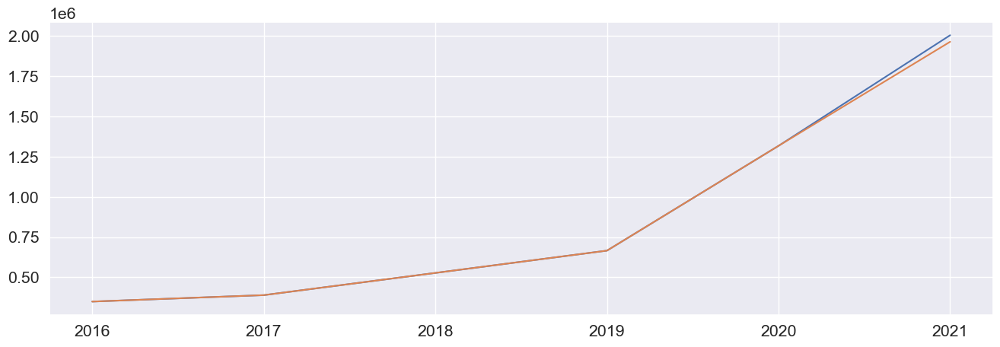

In [127]:
#общий график прогноза и факта
ecom_pred = ecom_test.drop('esales', axis = 1).copy()
ecom_pred ['esales'] = yhat_test4
ecom_pred1 = pd.concat([ecom_train,ecom_pred])

dataecom_act = ecom.groupby(['year']).sum()['esales']
dataecom_pred = ecom_pred1.groupby(['year']).sum()['esales']

plt.figure(figsize=(16,5))

plt.plot(dataecom_act.index,dataecom_act.values)
plt.plot(dataecom_pred.index,dataecom_pred.values)